# Multi-Task Segmentation Models

Click to open in: \[[GitHub](https://github.com/TissueImageAnalytics/tiatoolbox/blob/master/examples/09-multi-task-segmentation.ipynb)\]\[[Colab](https://colab.research.google.com/github/TissueImageAnalytics/tiatoolbox/blob/master/examples/09-multi-task-segmentation.ipynb)\]



## About this notebook

This jupyter notebook can be run on any computer with a standard browser and no prior installation of any programming language is required. It can run remotely over the Internet, free of charge, thanks to Google Colaboratory. To connect with Colab, click on the appropriate blue checkbox above. Check that "colab" appears in the address bar. You can right-click on "Open in Colab" and select "Open in new tab" if the left click does not work for you. Familiarize yourself with the drop-down menus near the top of the window. You can edit the notebook during the session, for example substituting your own image files for the image files used in this demo. Experiment by changing the parameters of functions. It is not possible for an ordinary user to permanently change this version of the notebook on GitHub or Colab, so you cannot inadvertently mess it up. Use the notebook's File Menu if you wish to save your own (changed) notebook.

To run the notebook on any platform, except for Colab, set up your Python environment, as explained in the
[README](https://github.com/TIA-Lab/tiatoolbox/blob/master/README.md#install-python-package) file.



## About this demo

In image processing it may be desirable to perform multiple tasks simultaneously with the same model. This may not only have the advantage of decreasing processing time (in comparison to doing the tasks sequentially or separately), but it may also provide complementary information to improve the accuracy of each task. Thus, some multi-task models may actually provide better results than separate models performing the tasks independently. For example, within histology, certain nucleus types may be more prominent in specific tissue regions - e.g. epithelial cells within the epithelium vs. inflammatory cells within the connective tissue. Thus, a model that learns to semantically segment tissue regions at the same time as segmenting/classifying nuclear instances may provide superior results.

In this notebook, we demonstrate how to use [HoVer-Net+](https://arxiv.org/pdf/2108.13904.pdf), a subclass of [HoVer-Net](https://arxiv.org/pdf/1812.06499.pdf), for the semantic segmentation of intra-epithelial layers, whilst simultaneously segmenting/classifying nuclear instances (epithelial, inflammatory etc.). This model has been trained on a private cohort of oral epithelial dysplasia cases (not publicly available). For more information on these individual tasks (e.g. semantic segmentation and nuclear instance segmentation) please see their respective example notebooks. We will first show how this pretrained model, incorporated in TIAToolbox, can be used for multi-task inference on large image patches, before explaining how to use your pretrained model in the TIAToolbox model inference pipeline to do prediction on a set of WSIs.



## Setting up the environment

### TIAToolbox and dependencies installation

You can skip the following cell if 1) you are not using the Colab plaform or 2) you are using Colab and this is not your first run of the notebook in the current runtime session. If you nevertheless run the cell, you may get an error message, but no harm will be done. On Colab the cell installs `tiatoolbox`, and other prerequisite software. Harmless error messages should be ignored. Outside Colab , the notebook expects `tiatoolbox` to already be installed. (See the instructions in [README](https://tia-toolbox.readthedocs.io/en/latest/installation.html).)



In [ ]:
%%bash
apt-get -y install libopenjp2-7-dev libopenjp2-tools libpixman-1-dev | tail -n 1
pip install uv
uv pip install tiatoolbox | tail -n 1
echo "Installation is done."

**IMPORTANT**: When you run the cell above for the first time, while using Colab, you need to restart the session before proceeding further. Click on the box *Restart session* that appears immediately above this cell, or use the menu *Runtime→Restart session*. This loads the latest versions of prerequisite packages. The notebook can then be managed normally. For example, you can run subsequent cells one by one, or you can click on *Runtime→Run all* or *Runtime→after*.



### Importing related libraries

We import some standard Python modules, and also the Python module `wsireader` (see [details](https://tia-toolbox.readthedocs.io/en/latest/_autosummary/tiatoolbox.wsicore.wsireader.WSIReader.html)) written by the TIA Centre team.



In [ ]:
"""Import modules required to run the Jupyter notebook."""

from __future__ import annotations

import gc

# Clear logger to use tiatoolbox.logger
import logging
import sys

if logging.getLogger().hasHandlers():
    logging.getLogger().handlers.clear()

import shutil
import warnings
from pathlib import Path

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import zarr

from tiatoolbox import logger
from tiatoolbox.models.engine.multi_task_segmentor import MultiTaskSegmentor
from tiatoolbox.utils.misc import download_data, imread

# We need this function to visualize the nuclear predictions
from tiatoolbox.utils.visualization import (
    overlay_prediction_contours,
    overlay_prediction_mask,
)
from tiatoolbox.wsicore.wsireader import WSIReader

if "google.colab" in sys.modules:
    from google.colab import output

    output.enable_custom_widget_manager()
    logger.info("Custom widget manager enabled in Google Colab environment.")

mpl.rcParams["figure.dpi"] = 300  # for high resolution figure in notebook
mpl.rcParams["figure.facecolor"] = "white"  # To make sure text is visible in dark mode
warnings.filterwarnings("ignore")

### GPU or CPU runtime

Processes in this notebook can be accelerated by using a GPU. Therefore, whether you are running this notebook on your system or Colab, you need to check and specify appropriate [device](https://pytorch.org/docs/stable/tensor_attributes.html#torch.device) e.g., "cuda" or "cpu" whether you are using GPU or CPU. In Colab, you need to make sure that the runtime type is set to GPU in the *"Runtime→Change runtime type→Hardware accelerator"*. If you are *not* using GPU, consider changing the `device` flag to `cpu` value, otherwise, some errors will be raised when running the following cells.



In [3]:
device = "cuda"  # Choose appropriate device

### Clean up

Create a `global_save_directory` for downloaded or newly created files. But first clean up, if necessary, by removing any such directory left by a previous run. This particular approach adopted here keeps the set-up clean, even with abnormal termination of esecution.



In [4]:
warnings.filterwarnings("ignore")


def renew_dir(dir_path: str | Path) -> None:
    """Delete any tmp directory and create a new tmp."""
    if Path(dir_path).is_dir():
        shutil.rmtree(dir_path)
        logger.info("Deleting %s", dir_path)
    Path(dir_path).mkdir()
    logger.info("Creating new %s", dir_path)


global_save_dir = Path("./tmp/")
renew_dir(global_save_dir)

|2026-02-25|09:21:22.545| [INFO] Deleting tmp
|2026-02-25|09:21:22.547| [INFO] Creating new tmp


### Downloading the required files

We download, over the internet, image files used for the purpose of this notebook. In particular, we download a histology tile and a whole slide image of cancerous breast tissue samples to show how semantic segmentation models work. Pretrained weights of a Pytorch model and a small WSI are downloaded to illustrate how to incorporate your own models in the existing TIAToolbox segmentation tool.

> In Colab, if you click the files icon (see below) in the vertical toolbar on the left hand side then you can see a list of files that have been downloaded and are thus directly accessible from this notebook.
>
> 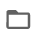



In [5]:
# These file name are used for
img_file_name = global_save_dir / "sample_tile.png"
wsi_file_name = global_save_dir / "sample_wsi.svs"

logger.info("Download has started. Please wait...")

# Downloading sample image tile
download_data(
    "https://huggingface.co/datasets/TIACentre/TIAToolBox_Remote_Samples/resolve/main/sample_imgs/tcga_hnscc.png",
    img_file_name,
)

# Downloading sample whole-slide image
download_data(
    "https://huggingface.co/datasets/TIACentre/TIAToolBox_Remote_Samples/resolve/main/testdata/models/samples/wsi2_4k_4k.svs",
    wsi_file_name,
)

logger.info("Download is complete.")

|2026-02-25|09:21:23.922| [INFO] Download has started. Please wait...
|2026-02-25|09:21:24.573| [INFO] Download is complete.


## Multi-Task Segmentation using TIAToolbox pretrained models

In this section, we investigate the use of multi-task models that have already been trained on specific tasks and incorporated in the TIAToolbox. We will particularly focus on [HoVer-Net+](https://arxiv.org/pdf/2108.13904.pdf). In the future we plan to incorporate more models. HoVer-Net+ has an encoder-decoder framework, consisting of multiple decoder branches that allows it to perform multiple tasks simultaneouly. It is therefore assumed that the representation of the input image learned by the encoder, is useful for both donwstream tasks. This model performs two tasks:

1. It segments out nuclear instances from the given input, whilst assigning them to one of two classes: epithelial nuclei or other nuclei (connective/immune cell etc.).

1. The model semantically segments tissue regions, classifying each indiviudal pixel of a image tile or WSI, as one of five tissue types:

> - (Superficial) keratin layer
> - Epithelial layer
> - Basal epithelial layer
> - Other (connective tissue etc.)
> - Background

Note, the first three tissue classes can be considered as the three layers of the epithelium.

> More information on the model and the dataset used for training can be found [here](https://arxiv.org/pdf/2108.13904.pdf) (_Shephard et al., "Simultaneous Nuclear Instance and Layer Segmentation in Oral Epithelial Dysplasia"_).

### Inference on tiles

Similarly to the semantic segmentation functionality of the TIAToolbox, the multi-task segmentation module works on both image tiles and structured WSIs. First, we need to create an instance of the `MultiTaskSegmentor` class which controls the whole process of multi-task segmentation and then use it to do prediction on the input image(s):



In [ ]:
# Tile prediction
multi_segmentor = MultiTaskSegmentor(
    model="hovernetplus-oed",
    num_workers=0,
    batch_size=4,
)

tile_output = multi_segmentor.run(
    [img_file_name],
    save_dir=global_save_dir / "sample_tile_results",
    # TIAToolbox v2.0 and above use patch_mode=False to run models on Tiles and WSIs
    patch_mode=False,
    device=device,
    auto_get_mask=False,
    # The image has no metadata, so we need to specify
    # at what mpp (microns per pixel) the image was saved.
    wsireader_kwargs={"mpp": 0.50},
    return_predictions=(True, True),  # Return binary map predictions for both tasks
    overwrite=True,  # Overwrite the output directory if it already exists
)

There we go! With only two lines of code, thousands of images can be processed automatically.
There are many parameters associated with `MultiTaskSegmentor`. Please see the `MultiTaskSegmentor` [notebook](https://github.com/TissueImageAnalytics/tiatoolbox/blob/develop/examples/06-semantic-segmentation.ipynb) and [documentation](https://tia-toolbox.readthedocs.io/en/latest/_autosummary/tiatoolbox.models.architecture.html) for more information on these parameters. Here we explain only the ones mentioned above:

- `model`: specifies the name of the pretrained model included in the TIAToolbox (case sensitive). We are expanding our library of models pretrained on various segmentation tasks. You can find a complete list of available pretrained models [here](https://tia-toolbox.readthedocs.io/en/latest/pretrained.html). In this example, we use the `"hovernetplus-oed"` pretrained model, which is the [HoVer-Net+ model](https://arxiv.org/pdf/2108.13904.pdf) trained on a private cohort of oral epithelial dysplasia cases.

- `num_workers`: as the name suggests, this parameter controls the number of CPU cores (workers) that are responsible for the "loading of network input" process, which consists of patch extraction, preprocessing, and post-processing.

- `batch_size`: controls the batch size, or the number of input instances to the network in each iteration. If you use a GPU, be careful not to set the `batch_size` larger than the GPU memory limit would allow.

After the `multi_segmentor` has been instantiated as a semantic segmentation engine with our desired pretrained model, one can call the `run` method to do run the full model pipeline on a list of input images (or WSIs). The `run` function automatically processes all the images on the input list and saves the results on the disk. The process usually comprises patch extraction (because the whole tile or WSI won't fit into limited GPU memory), preprocessing, model inference, post-processing and prediction assembly. Here are some important parameters that should be set to use the `run` method properly:

- `images`: List of inputs to be processed. Note that items in the list should be paths to the inputs stored on the disk.

- `save_dir`: Path to the main folder in which prediction results for each input will be stored separately.

- `patch_mode`: Whether to treat input as patches (`True`) or WSIs (`False`). Default is `True`. The mode of inference is set to `'False'` for processing plain histology images or structured whole slides images, respectively.

- `device`: specify appropriate [device](https://pytorch.org/docs/stable/tensor_attributes.html#torch.device) e.g., "cuda", "cuda:0", "mps", "cpu" etc.

In the `output`, the `run` method returns a dictionary or a list of the paths to the processed outputs saved on the disk. This can be used for loading the results for processing and visualisation.

Now that the processing has finished, let's use the paths in `tile_output` to load and examine the output. The output is saved in a zarr file with a list of tasks and output for each task saved under its relevant key.



In [7]:
tile_output = zarr.open(tile_output[img_file_name], mode="r")
# As Hover-Net+ performs two tasks,
# nuclear segmentation and cell type classification, and
# layer segmentation and classification,
# the output will contain two keys,
# "nuclei_segmentation" and "layer_segmentation",
# which correspond to the outputs of the two tasks.
logger.info(f"Output keys: {list(tile_output.keys())}")

|2026-02-24|13:13:31.661| [INFO] Output keys: ['layer_segmentation', 'nuclei_segmentation']


### Layer Segmentation

Hover-Net+ performs two tasks. Layer segmentation and Nuclei segmentation. Let's review the output of layer segmentation first.



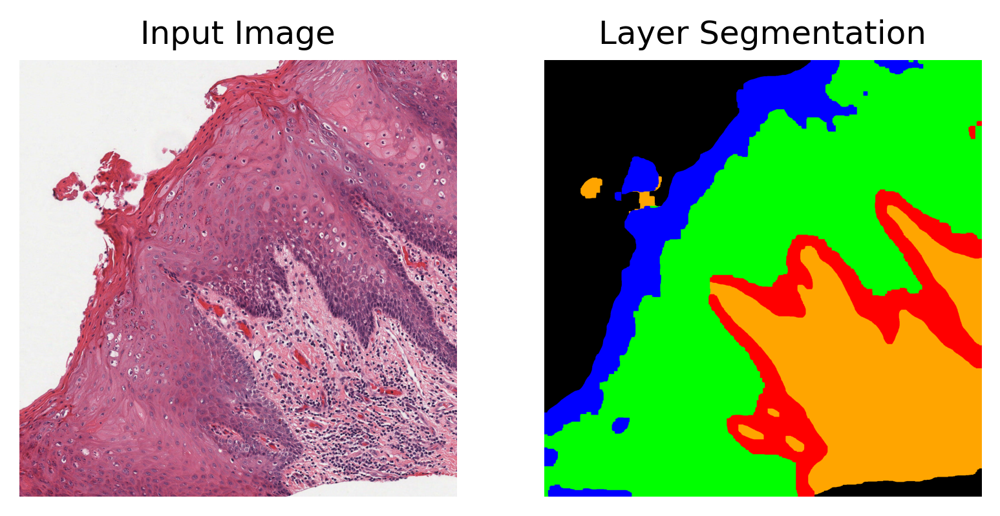

In [ ]:
layer_map = tile_output["layer_segmentation"]["predictions"][:]
# load input image tile for visualization
tile = imread(img_file_name)

# Create color dictionaries for visualization
semantic_color_dict = {
    0: ("Background", (0, 0, 0)),
    1: ("Other", (255, 165, 0)),
    2: ("Basal", (255, 0, 0)),
    3: ("Epithelial", (0, 255, 0)),
    4: ("Keratin", (0, 0, 255)),
}
# Create the semantic segmentation image (in colour)
semantic_map = np.zeros((layer_map.shape[0], layer_map.shape[1], 3)).astype("uint8")
for idx, (_label, color) in semantic_color_dict.items():
    semantic_map[layer_map == idx] = color

fig2 = plt.figure()
ax1 = plt.subplot(1, 2, 1), plt.imshow(tile), plt.axis("off"), plt.title("Input Image")
ax2 = (
    plt.subplot(1, 2, 2),
    plt.imshow(semantic_map),
    plt.axis("off"),
    plt.title("Layer Segmentation"),
)

In the layer segmentation prediction map, blue represents the keratin layer, green the epithelial layer, red the basal epithelial layer, orange is other tissue, and finally black is background.



### Nuclei Segmentation

The second task is Nuclei Segmentation. Let's review the output for nuclei segmentation.



|2026-02-24|13:13:37.404| [INFO] Number of detected nuclei: 3364.


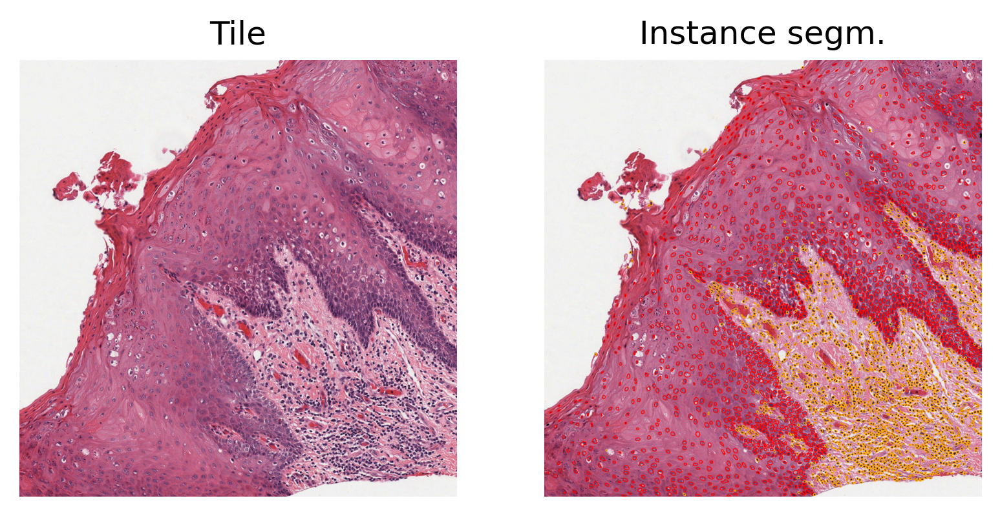

In [ ]:
nuclei_instances = tile_output["nuclei_segmentation"]

# Log number of detected nuclei.
logger.info(
    "Number of detected nuclei: %d.",
    len(tile_output["nuclei_segmentation"]["contours"]),
)

# Convert the output to the legacy per-instance dict expected by
# overlay_prediction_contours().
inst_dict = {}
for inst_id, (box, centroid, contour, prob, type_id) in enumerate(
    zip(
        nuclei_instances["box"],
        nuclei_instances["centroid"],
        nuclei_instances["contours"],
        nuclei_instances["prob"],
        nuclei_instances["type"],
        strict=False,
    ),
    start=1,
):
    inst_dict[inst_id] = {
        "box": box,
        "centroid": centroid,
        "contour": contour,
        "prob": float(prob) if prob is not None else None,
        "type": int(type_id) if type_id is not None else None,
    }

# Create color dictionaries for visualization
inst_color_dict = {
    0: ("Background", (0, 0, 0)),
    1: ("Other", (255, 165, 0)),
    2: ("Epithelium", (255, 0, 0)),
}

# Create the overlay image
overlaid_predictions_inst = overlay_prediction_contours(
    canvas=tile,
    inst_dict=inst_dict,
    draw_dot=False,
    type_colours=inst_color_dict,
    line_thickness=2,
)

# showing processed results alongside the original images
_ = plt.figure()
ax1 = plt.subplot(1, 2, 1), plt.imshow(tile), plt.axis("off"), plt.title("Tile")
ax3 = (
    plt.subplot(1, 2, 2),
    plt.imshow(overlaid_predictions_inst),
    plt.axis("off"),
    plt.title("Instance segm."),
)
del (
    multi_segmentor,
    tile_output,
    layer_map,
    tile,
    semantic_map,
    overlaid_predictions_inst,
)
gc.collect()  # free up memory

Above, we display the raw image tile, along with the layer segmentation and nuclear instance segmentation predictions. In the instance prediction map, the contours of the nuclear instances are drawn. Red contours represent epithelial nuclei, whilst orange contours represent other nuclei.



### Inference on WSIs

The next step is to use TIAToolbox's embedded model for region segmentation in a whole slide image. The process is quite similar to what we have done for tiles. Here we introduce some important parameters that should be considered when configuring the segmentor for WSI inference. For this example we infer HoVer-Net+ on a small breast tissue WSI.



In [ ]:
multi_segmentor = MultiTaskSegmentor(
    model="hovernetplus-oed",
    num_workers=0,
    batch_size=4,
)

# WSI prediction
wsi_output = multi_segmentor.run(
    images=[wsi_file_name],
    masks=None,
    save_dir=global_save_dir / "sample_wsi_results/",
    # TIAToolbox v2.0 and above use patch_mode=False to run models on Tiles and WSIs
    patch_mode=False,
    device=device,
    auto_get_mask=False,
    overwrite=True,  # Overwrite the output directory if it already exists
    return_predictions=(True, True),  # Return binary map predictions for both tasks
)

wsi_output = zarr.open(wsi_output[wsi_file_name], mode="r")
logger.info(f"Output keys: {list(wsi_output.keys())}")

Note the only differences made here are:

1. Adding `auto_get_mask=False` to the `MultiTaskSegmentor`. If `True` and if no `masks` input is provided to the `run` function, the toolbox automatically extracts tissue masks from WSIs.
1. Setting `patch_mode=False` in the `run` function indicates that we are predicting region segmentations for inputs in the form of WSIs.
1. `masks=None` in the `run` function: the `masks` argument is a list of paths to the desired image masks. Patches from `images` are only processed if they are within a masked area of their corresponding `masks`. If not provided (`masks=None`), then either a tissue mask is automatically generated for whole-slide images or the entire image is processed as a collection of image tiles.

The above cell might take a while to process, especially if you have set `device="cpu"`. The processing time depends on the size of the input WSI and the selected resolution. Here, we have not specified any values and we use the assumed input resolution (20x) of HoVer-Net+.



|2026-02-24|13:13:59.875| [INFO] WSI original dimensions: (4000, 4000)
|2026-02-24|13:14:01.060| [INFO] WSI overview dimensions: (2016, 2016, 3)


Text(0.5, 1.0, 'Semantic Segmentation Overlaid')

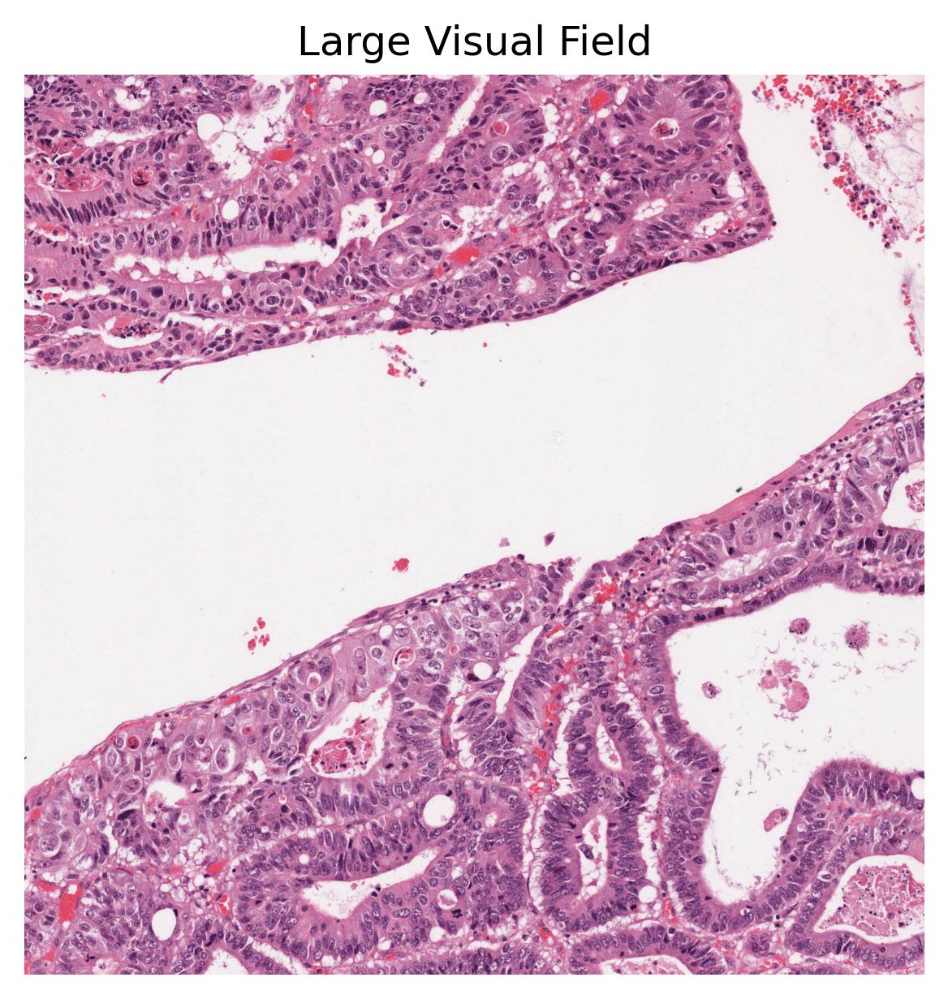

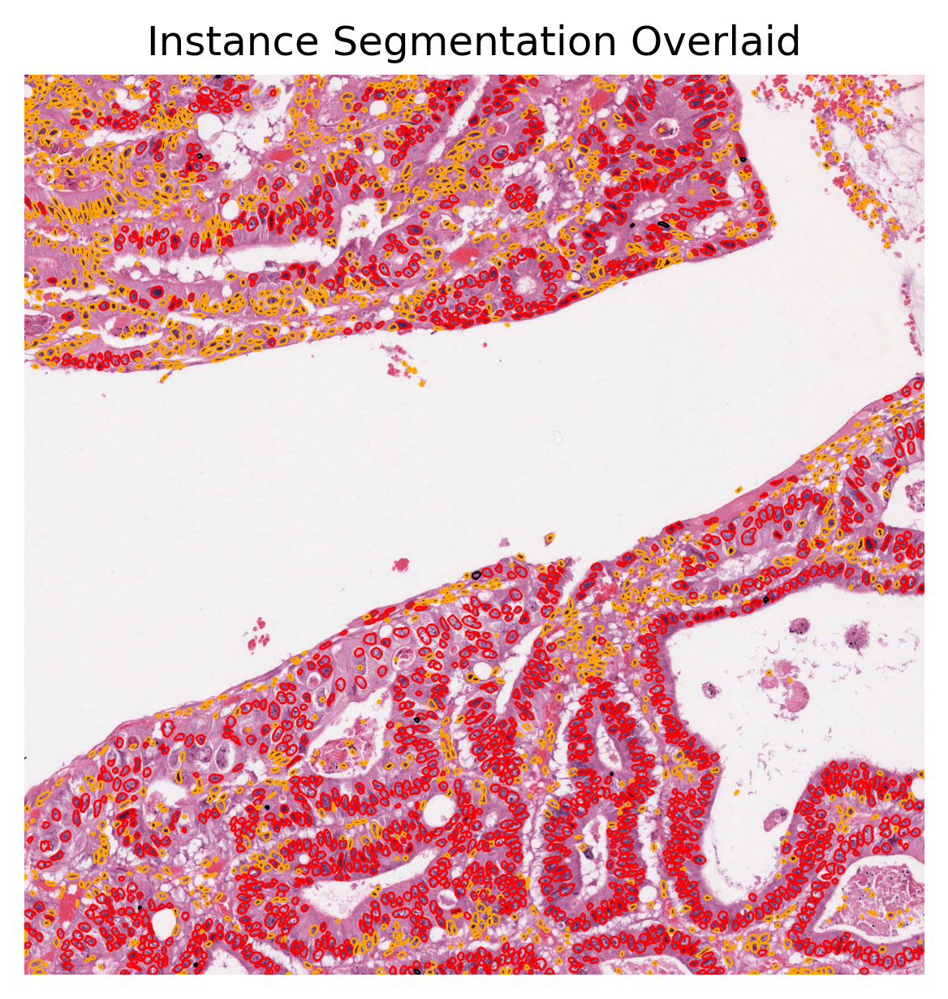

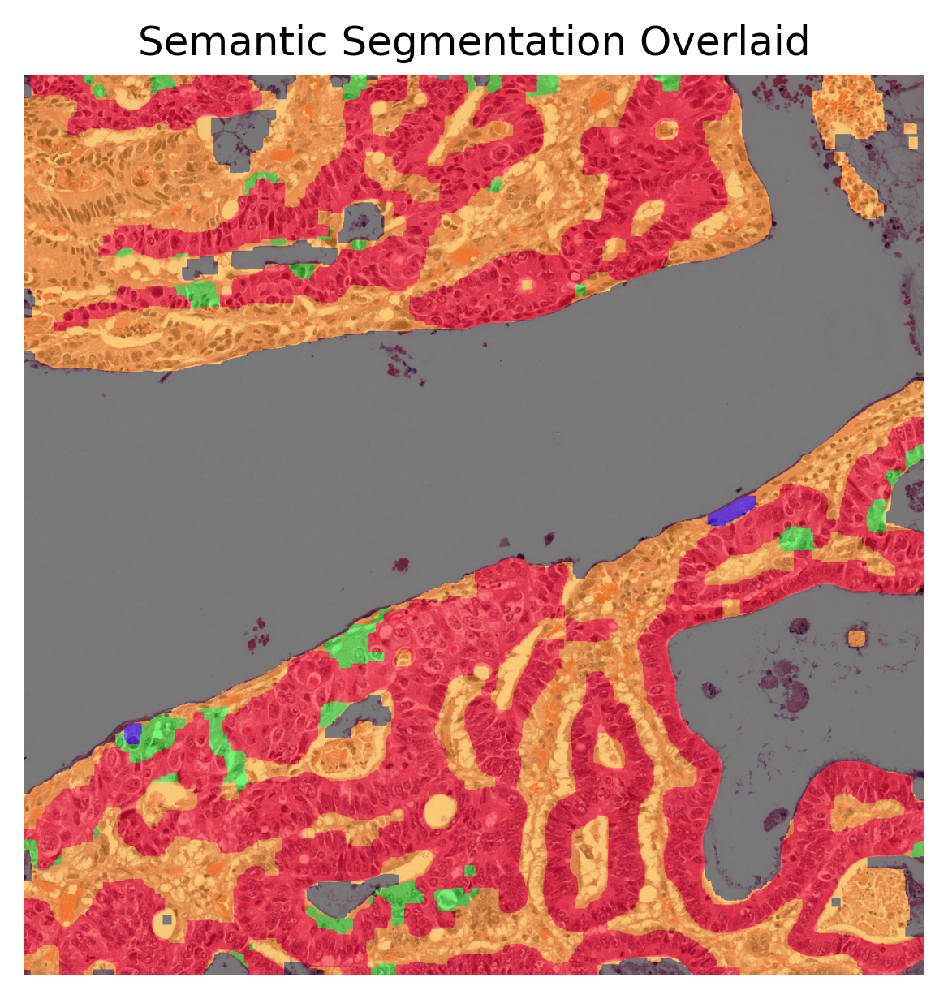

In [ ]:
# [WSI overview extraction]
# Reading the WSI to extract it's overview
wsi = WSIReader.open(wsi_file_name)
logger.info(
    "WSI original dimensions: (%d, %d)",
    wsi.info.slide_dimensions[0],
    wsi.info.slide_dimensions[1],
)

# Reading the whole slide in the highest resolution as a plane image
wsi_overview = wsi.slide_thumbnail(resolution=0.5, units="mpp")
logger.info(
    "WSI overview dimensions: (%d, %d, %d)",
    wsi_overview.shape[0],
    wsi_overview.shape[1],
    wsi_overview.shape[2],
)

layer_map = wsi_output["layer_segmentation"]["predictions"][:]
nuclei_instances = wsi_output["nuclei_segmentation"]

# Convert the output to the legacy per-instance dict expected by
# overlay_prediction_contours().
inst_dict = {}
for inst_id, (box, centroid, contour, prob, type_id) in enumerate(
    zip(
        nuclei_instances["box"],
        nuclei_instances["centroid"],
        nuclei_instances["contours"],
        nuclei_instances["prob"],
        nuclei_instances["type"],
        strict=False,
    ),
    start=1,
):
    inst_dict[inst_id] = {
        "box": box,
        "centroid": centroid,
        "contour": contour,
        "prob": float(prob) if prob is not None else None,
        "type": int(type_id) if type_id is not None else None,
    }

# Create the instance segmentation overlay map
# using the `overlay_prediction_contours` helper function
overlaid_inst_pred = overlay_prediction_contours(
    canvas=wsi_overview,
    inst_dict=inst_dict,
    draw_dot=False,
    type_colours=inst_color_dict,
    line_thickness=4,
)

overlaid_layer_pred = overlay_prediction_mask(
    wsi_overview,
    layer_map,
    alpha=0.5,
    label_info=semantic_color_dict,
    return_ax=False,
)

fig = (
    plt.figure(),
    plt.imshow(wsi_overview),
    plt.axis("off"),
    plt.title("Large Visual Field"),
)
fig = (
    plt.figure(),
    plt.imshow(overlaid_inst_pred),
    plt.axis("off"),
    plt.title("Instance Segmentation Overlaid"),
)
# Create semantic segmentation overlay map
# using the `overlay_patch_prediction` helper function
fig = plt.figure()
plt.imshow(overlaid_layer_pred)
plt.axis("off")
plt.title("Semantic Segmentation Overlaid")

del (
    multi_segmentor,
    wsi_output,
    wsi_overview,
    overlaid_layer_pred,
    overlaid_inst_pred,
    nuclei_instances,
    layer_map,
)
gc.collect()  # free up memory

As you can see above, our method first creates the semantic and instance segmentation maps (and corresponding dictionaries). Then, in order to visualise the segmentation prediction on the tissue image, we read the processed WSI and extract its overview. Please note that HoVer-Net+ assumes a base resolution of 0.50 mpp, whilst the baseline resolution of the input WSI was 0.252 mpp. Thus, the output of HoVer-Net+ has shape `2016 x 2016`, compared to the input `4000 x 4000`. The overview image is therefore also extracted at this resolution. We did not edit this into the processing of the tile as the tile processing assumes the correct input resolution at baseline.

We used the `overlay_prediction_mask` helper function of the TIAToolbox to overlay the predicted semantic segmentation map on the overview image and depict it with a colour legend. We also used the `overlay_prediction_contours` helper function of the TIAToolbox to overlay the predicted instance segmentation map on the overview image.

In the instance prediction map, the contours of the nuclear instances are drawn. Red contours represent epithelial nuclei, whilst orange contours represent other nuclei. In the semantic segmentation prediction map, blue represents the keratin layer, green the epithelial layer, red the basal epithelial layer, orange is other tissue, and finally black is background. Please note that the semantic segmentation output seen above is relatively spurious in areas as a result of the model being trained on head and neck tissue only (specifically within oral epithelial dysplasia). However, the WSI inferred on is from breast tissue and thus the model does not generalise well to this task. We have chosen to include this WSI, despite the results not being perfect, for demonstration purposes.

In summary, it is very easy to use pretrained models in the TIAToolbox to do predefined tasks. In fact, you don't even need to set any parameters related to a model’s input/output when you decide to work with one of TIAToolbox’s pretrained models (they will be set automatically, based on their optimal values).

Feel free to play around with the parameters, models, and experiment with new images (just remember to run the first cell of this notebook again, so that the created folders for the current examples are removed. Alternatively, change the `save_dir` parameters in new calls of `predict` function). Currently, we are extending our collection of pre-trained models. To keep track of them, make sure to follow our releases. You can also check [here](https://tia-toolbox--578.org.readthedocs.build/en/578/_autosummary/tiatoolbox.models.architecture.html). Furthermore, if you want to use your own pretrained model for semantic segmentation (or any other pixel-wise prediction models) in the TIAToolbox framework, you can follow the instructions in our example notebook on [advanced model techniques](https://tia-toolbox.readthedocs.io/en/latest/_notebooks/jnb/07-advanced-modeling.html) to gain some insights and guidance.
We welcome any trained model in computational pathology (in any task) for addition to TIAToolbox. If you have such a model (in Pytorch) and want to contribute, please contact us or simply create a PR on our Github page.



### How to visualize in TIAViz

TIAToolbox provides a flexible visualization tool for viewing slides and overlaying associated model outputs or annotations. It is a browser-based UI built using TIAToolbox and Bokeh. Below we show how to use this tool for our prediction example.

`Note:` To visualize the images and output on TIAViz, we recommend running the following code locally on your machine instead of Google Colab.
`Note:` We have updated the `output_type="annotationstore"`, which is the required output format to visualize the output of models in `TIAViz`.



In [ ]:
multi_segmentor = MultiTaskSegmentor(
    model="hovernetplus-oed",
    num_workers=0,
    batch_size=4,
)

# WSI prediction
wsi_output = multi_segmentor.run(
    images=[wsi_file_name],
    masks=None,
    save_dir=global_save_dir / "sample_wsi_results/",
    # TIAToolbox v2.0 and above use patch_mode=False to run models on Tiles and WSIs
    patch_mode=False,
    device=device,
    auto_get_mask=False,
    overwrite=True,  # Overwrite the output directory if it already exists
    return_predictions=(False, False),  # Binary map predictions not required.
    return_probabilities=False,  # Probability maps not required.
    output_type="AnnotationStore",  # Set to QuPath for direct use in QuPath
)

del multi_segmentor, wsi_output
gc.collect()  # free up memory

Above, we run the `MultiTaskSegmentor` on WSI file `wsi_file_name` similar to previous runs, but this time we specify a different value for the parameter `output_type` (`output_type = "AnnotationStore"`). In this case, the prediction results will be saved as `.db` files which are directly compatible with TIAViz.

To start the TIAViz, simply use the command below, either in a terminal or by running the cell, and view `localhost:5006` in your web browser.



In [ ]:
%%bash
tiatoolbox visualize --slides ./tmp/ --overlays ./tmp/sample_wsi_results/

An example view you will have in your web browser is shown below. Make sure to click on `Add Overlay` button to select the corresponding overlay (`sample_wsi.db`) for your WSI (`sample_wsi.svs`). Try using different colors and changing options.

More details on visualization Interface usage can be found on \[[Visualization Interface Usage Documentation](https://tia-toolbox.readthedocs.io/en/latest/visualization.html)\].



### Example TIAViz Visualization

<img src="data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAABCgAAAIzCAIAAABNy7/JAAAACXBIWXMAAA7EAAAOxAGVKw4bAAAgAElEQVR4nOy9eZBkyXnYl+e7q17dVV19z/T03Du72AvcxRIHsSB4giAJiqJMh+iwRNPywZCDtBlmmCE7aFm2JVkOixTDIclB2rpAAwQlEAeJ5QIgdhd7zuzuzPQc3dP3UXe9encen//omT0IUAIMgoCA+kV0R1Xle/m+9+WXGfm9L/N7GADQlClTpkyZMmXKlO908jwPgkBK+e0z/aOUuq7rOA7G+Fsty5RvOuxbLcCUKVOmTJkyZcqUvwiSJAEAzvm3WpA30VonSWKaJmPTSel3PtM2njJlypQpU6ZM+a5AKeX7Puf82ye8oJSaTCbfPhGYKd9Upo7HlClTpkyZMmXKdwUAYBjGt1qKt0EpJYR8q6WY8hfEtKWnTJkyZcqUKVOmTJnyTWfqeEyZMmXKlClTpkyZMuWbztTxmDJlypQpU6ZMmTJlyjedqeMxZcqUKVOmTJky5S3kgz/5+L95dqf/ZxSP//B/+6Xf+GL366oyHR996h/+zd/8Os/6ilr2/8X/8g//4MbBn1E8+L9+9rH/7ONHX2ttWl7+N3/vp7/viXe/54kP//xvboTyG5JtytfAdHP5lClTpkyZMmXKdyugD268dGgsX1wyr3zh+fKFdy2Z+88837Pm2r7ND9aefXVzGE8Co7Ly6LseqnL1+tMfvTqxo2EEgFDWeeaPn9sewdKlh+9fJa89vXviiYf4znMvjNpPPNjY/fIXs5NPnq0hhCDsbnz2k5+9uTkoXvyaBdPy1nOf3XXvf/yc9ccf/WTzPT913lz7xB/sFc+canv81jMff/rVw/Gw786940Mf+cEWy7/4z/7OF/r+qBMAIBRvffS3P77WRQ88+cPvfYB+/l+tPfCRHzCuf+xTR+c+8sHFtd/7F8kjP/fONgLQtLz83/zOH14oD/6nv/Zzv/8nP/Cff3CJfvNUPWUa8ZgyZcqUKVOmTPnuBaNwsHPj1a1Y7/zRp790e2ukdl7+3O2jjS+/dLM7PnjlM596eb8y17jy2Y+9eLvXe/GjH/18v9G2uoFEKHz1c7/3B9eyhTJ6+hP/79WDbOf6Z7eGaOfFP3nm+StD1H/5U2uxffcahlO+9L0//L3nGl+XYP3dG19++mog1v7xb/3uK9c62Y1P/87l3Rc/8emXdrs3/vAf/eYf3W6vLj71f/79T718sPepX/87/3L/xGlno5cjNPzcP/67v/WCPteUv/P3/u4LG9Has//0ahetffJf/u4nn+qi/U//o+ciDyGEMDUuPv7h+9sWQh4x4lzk3y45hr9zYVprKaehpe90NIDUGrSQgmDCKEWYIASZFForjLBpmBhhqaRUCgFinBmGgTEGrTVoDZBmKSBAgI9dVYMZCKNcCkCAAZuGiTCSWoICg/Nc5AoUw4wzjjHWWkkpKaWEUEKJkDJXOQKEAVuGiREGBACACVFKCiUIIgbnmBAECGMspFCgECCGGSFEgdKgCcaUUAQIIfSnkpEDwFemJ9cI7h4ICGN8nC8cAI6PwxhjjAHd/fG4WoTv/WEspVJaE0I4ZwBICKn13Zox1gZnAEAwRhgjhLTWSmsABAgYo4xSTLAGTQhFCEBrrYAQgsnxRRFojRDChGCM/lQac6xBSaW1ppTeuxzWSmutMUbkbmu8eRYAIIwAgBBCKMEIgQbQGiEMx3f+loMxJkIJpRVgQICJxoxRjDEhFAAQAgBAcFdvGGN4Qy2AEEaEEEBISCFBIoQIEE45wgijN5WvlQYECGGpNABG6FjzmhuEM4YR0kojQIARYeT4TkBrjDGm5Fg5GCEEoJUGAAC4Vz1WSksJgDBCiBCMkOacHh983JwAoLW6ax4A8JZ2v3f/iBBCCEEYASAAjRA+tsVj+wF01yKOO8ublgZIKQX3LnSviCCE3qrft15Laq0UYEwAALTinJK75x6Lhgghx1VhTLTWxy14V4daYYzJPeExIZiSYy1IKfHx/SGEADAhAIC0RggRxjC5p0CEtVJ3zQxjreHYXDHG91oTH/dTrTXGRCklQQIGDJgTTggmjGJC7tqP1qCPuywcm7oGAA0IAwAYzAAAqZTWx2pBnDFCKWittVZKIwSMMYLxsbT4zb6G3lDIGy0kldTHBoIRxURpOBaXUswIRQRrrZW62xr3Gh9hDJRRzhgCJJVSoAnGjNLjAe24W7/FGDAAUkrd7VOEYILvGQgGhKTSb/QxQu7l/cQIAdJa3239N3oFfqNDQi6FPr49jQ3GyXHrANwzYYwJJoQg8mZ/+QvmrqLh7i1IpZRSSAPFBB93CvSmmVNOMSFaaVDquJMghAilx+MAgMb3TBohfKzMuwZzPKIe14gQ6Ltjy7HNH3dt9IYq7g7pbxfyuF3fLvSbI/q9wfy4ABOMv+bErP8+vjiCMfZvyTy7GXZCmZ4stGz6dSXMxeV6Nbp5p/M6L973Pifbfe71Vx94/Bfg6X+NEELIP3H+HQ8+cjG9+WwYxZvXLzff91+97+Fa+dbTz8TBzZvq0R9612PLZLB+8/WNfLFubd58gcrz712J9p6/9tryxZ90717DcCsnT1SCZ7+ecAKmcwvN3pVXt583mk/+1Vp8848+99STP/EbyT9ZQwgh1Hz0iQ/+0I88Fl/+xGg8ee1LTy39Rx/9Kz/YbD3/Ox8Lus++qP7Sf/HhnziPd178bz9/PT057732wlNMfOA/fHRw89NPPfXwB365+JYLRZ0v//b/cLn6N/7Bj6xOn8d/s2FCiDAMv92SOk/580XHefj6bnw0jJKYEEIJNV1bYvTC9utHMCABPL76SMkp9Hr9OE6UBsf3Vs6eLHqOTtPBcBBi/Mrmjdv762qQFsEucPfsyTOe793cvR2L1ACz3mhFbjwRE9lJHzv14ObBnc6oM1+aLRXLju0mcTIaj0dZKDxFCKOUvbp9NYvzGi6/98HHRvlof3QIEcxVZjPI74R3uOaPrNxvYIoAC0CvHl3vkJ6bWidgtuz5u1FnYiRmTlZL8+kkVko5jm0wjjUCqRXSQitmGICBYgJKU0wykDu6H+UpYQRrzDNKBG7VGybnMs8QAts2TcNUQuZ5Dgjnea4BEGWAEWFUU7a2Puz0BKbJ4pxHibW5myQx5cxwXCazgxOzTsmxPc/zPC9N02ubO5OJobGrITHspNWwzq4sMotZvieF6O0cDPdDkzterejP13nV1uPJeDjwquVCrQIESXQ8Q0egAcditNs92t2fm2ljDYxzkeeT/jAejJnSNlBmGsg0gPN+NFZSccw445nIqUEty7JtCxOcpakhQGglOXFdDymdZkIxPBCTO9l2F7oaaSMzjV3mu8UZvzY/07ItM46iLMtkJo7dG8YYxlhT4jiOlApRZHs2JuRWd3sj28nynPZovVIzCW9ZlYLnaamFVOu7+8NJZFt2EOM4dgVQw+AiP1hYtM6vnCgaVndrT+Q5smh9vun5XjQOo9GYMuqWPNuzcpGLXOVpnkUJCKWFooRSxhg3glS9eLUvpZ+kuWnpuTa+dHouHAxAKMMyTM/aPNweRkMk9ZzXJJggQErrPM04Y5xSpZXnF/xyCREsVD6ZhHESF1wXRxILZTqOAKWPJ/2EYMaFVghj27RAQy7EztHeQITMYAXmlp2CYRrcNLVQSGqkNMFYayWEQIQCwoBRKuSdw5HQXKmUo3yu7HmOa9n2MM13DkZSadvBnmlwxghBBsP1cqVWr2VZGkWTQa9fdD2MgdqGVysV6zXLdyUAI0bvsEOU9l1Pinw0GtqGMRmMxgeHyOSL95/jVV9hxBklGtLOaLC5j1KVARykw3AYLFaa1UIRsM4RGAXPcVwxibc37tiO241GN8Xm2I54Qs6QxcXqbKFV9edbwBjKdDYM8mGQBUGWZltBt4uDURqjAVKOTLPokeolC8heFPaCZBKlFKcr7Xap6Is801Iezx8dy+ScW5aV58LSmFJS8D3AkKSx1pCkGQCyLRshPBwGwzAdphEiSCiepRZokzLtO/lKq1goOBojIdTmwVGU5Fkuo0wCBq3jlfmZZq3RGU16I5FkWcHVZ+ZnPW7oLAOEEDl2ZjBnnDE+jtPbu3EYayWHtRJqVEqUcoQwEHI4kt2h0sgkhFJILDY5OV+qVkqEGVmW52mKlaaAGKMAmlLKGRMyZwbHlF3fv7OtDsBAtEMvNM6YBscICAKiASMwHNMsu/5Cw6wVNMUEYYyQJhj+PN2Q41n8274du9MYY4QwaMizXGaCAhJZ9tz1y0dZHydqQVcbhhMHGcFMITAsqzRTaZ6fY5zjcZT3x0fbu2mmUo38dn3p7Elm80EQUEocx8GEiDwPo4gQ4nguQThLMq0UJYxSKoXQiciH4yxJLdfxW3WVpHF/NMni8nzbKLkKASWEUHLPFwUldZ7nhNBjr4YABgCtFAAwygAgT1OUSZGmSipmm2al6Ddr6GtQ47Hn/Oeo7r8AtNaMMdd1v0oR6Cv9jV95/f/Zirq/cvYnPrL4+Nfje+BSfaHgjzdfulo7/aFJ75mbu3NP/gi6dVxoGq7j3HvPucgzfdd1RhhpJZUyMEKEHj9iWDh5Ibhx5So7/6P2+Lnnbs6de883dse4uXzWbwRrn/nc8sN/43DvU8/fuO+v/yJ++rjQ8SqlsomOjVyk8fEAgxFGSMlcCMAIUWZyzphx7sK7X7j8B3/kvOc/dbqf+b2XL7375960kfDgs//0tz7WXf7vf+2nZ74xcad8LTCEkGEYhULhWy3JlG8iWT7pbHRIL6kZRr/fD7Mss01s8MM7t28e3V4pLlA+BDNTRx0mNMVUmsnBMJ84jIs80yKgpKKM0tC8c+VOwaoqIxsn287sTDnAeCJ2Rnvb+xtpCSb98UnVInZcjwxXlPzEEuNAWQrlAo3TV2680JsZTbJ4mZxMgiSPxOrK4vqt2y+MXjiY7LG+cZ6dWWwvHI33JqPgLJn1mAkK7Y67V0Yvb1m7JVGMdw8fXry00VnrOiOjixpLZHzQNTgTls0pNQkXaSZAM9del32p9UKljROJUrkbdW7WjkKVAQKBMhVqONSnKysX51eRVlmWkkqJmFaWZlGS2K6bpmkqRC6lUyj41cokT597an19g6RZv+wnlaqZpu3JiJqmaTo6T27g+yvn5xdGJHRn27du3nz2lRtSLQKew0gxMn6dvFT5AdlabI14oED11ra6a30RA6vb577/nbOt08yCsRwwTE3GFUYIaYQQAQRIM87qlaYYpunRxGGcOzQbxXAQJJt7LE7T0cQul6rnVi93b1/NbufjiTUwHmyfl5nUSBuGWSx4lm0qqcZRSAq2O1OlCOlQjLYPXptsrNPdPeMgNhKuqLHNaZdUFkvFgfXY4v1nVld0GGZBgBUGhKMoIpgQzkc6S5jIMzFTqrebDcM2rYEc7RytH20TToqzRdZDD7lnz548HY/CvW7/hav7hz1NuXZ9YzRWhLSU4nm2MT4J1dRUbrGzti3yrFAujPuZOdsomvZ4cxTGUcSw7bI4zTRwxg3XcUBBOAomSUoILfg+aLx5+eZBB6V5Wq6Q1Q8+FG0Nd6/fspnRaDZ6ePC5Vz+Lmoh3SKnyDsaYAi2lnAQBZ8z3CqC1VZEH+aEQuWkYkyCYTCaoUs2HERaaWgYymQLglgmY5ADUtmzbubF/NUoirMi1/VuxKaIwqvDi+x98fGFxXgzjoD+a9EdEas9xsyyTWiNMKOdCSdtzjXH02o2bM5VyybcO7nRbjeZhLq7tH1y9EWeZRWhuG9jgBkZ5pRL/wLu+p5yYnc7eYNjN83TCaHt+ttlsuOWK6dmEMQzAuFmp1iDJbcomYUpjbSRCrHf2rrxePbNkcQsxA2PMCKEYGLcP9ke71zdv54edYpDsRIG5eLa9VCwXkWPFjuA+0kE0vrqXcvMg7l+Dq1vuPs703uHMj668p29uz54+UWnMcEQmh92jO1sqipI4Hsn42aNXBzwmHaQppCKsN6lFnRvjcH03H472m0UwVtMOZ3mSMEwYZb5fkJaNEGaciTQvALctw21XFeTjfk8pFKcpQhRKJUx4PByPRuMru4fdMcpyn6CyaZQQ5CbvjJbQ+fm6aRie5y5iZ5TK8SSXo1EYxmkWxWO4CXuvbe8Nxhjp/NLJVhywRCisFKJIKAEIikUf2Y4k5NW13Su3USYcBFuNwuDiiYWCXxZKHQb52g497BIgFmGA1aFBDrwHlni9SiwrVhorhTNJteYGl1oiBIwzjbXp2oAJHUZXX3sphvS0uZQvlNPjwC+5G1+zLMtvlByJHNMwfRdTghES9N/teLw1nPvmA/u3nIXv/oO70YI3AxvwRinGGCECADLJsJQc0UF/8MUrz2zRIxrqi9nihy59L57IaBIA6JzSuWq1IGlwfTO+s1cyrXxtYziYjDKYzDcWihV3qR0mOsnTIrNNkwVposJUEsQBU8JwLlUmuEk1CEaIbTi9oKuDWAusijlV2MVGPBqFuOObc9wxKaF3g8cYYwCKMcIUI6JyKYRkmHDGECJKKK4BQCOBRJhmvaGU0q2Wkec6tvOmQr6z1s1kWSaEeOsvAGqcvjKKnr0TRP/d5e0v5x2J9K+8+jtHoXi0dvFUudyyra9FB6zo19jg2RfwD/14YfSpwX7lnaece47H27DOnT/1yRdf7T24/NKNAL3XbZTS51/Zf59rrh1Ozr3HK5GZ/p2P4QceLzYmvaPdx36w/g3eMq+15mDzdz+Bf/EXG5u/uX1j4acveejpr3Kg8+gT9//mp//w4Psu/utnhuivlZbq4Wee2vyIC1/eHH//XKWl5jZe+nX6wz/VaM9s3br2M//J7N3zVPbM//0PPt47/Td/6S+vet+gsFO+Jqaby78rkFqN44mHCTcodUwMMgkmGOOfPPdu76Ef0ErGkygdjooINCWZQkJCPokHwxTiwLINYdFapb76jsfHjVM6SgG047hxEpEkX6w2LcZe312LbgxNSU7ff4mmecX0dSRMoI5ljsJJuVpVSCNQ+7f2hat5xH/+Q//x1nh7a3treyO+Q7ahoJirXzu8XpH1D5x7PyjJlDRsg9tGOReT24GczVOWJSrjnDNE+ZjMOk3HsKvzi3maaNCOZTPGIgNjUCOcHpLhja2tPmRPnHlQDUIdd0SYh/2gv9835k3TMXnZuD1e97k1V5/BCItcYcgpoYyxMEtMz2Fgx3FKCMUaugcHMkvynEexKQTCZFzyzdRglFJOcKlSW2pUDc4AdJKnQqeSBZG+CWjgmG3H9PPIHB6O5xaWNCYIqVE/mgwGBreo4zbnagZFqGDOn1vhJlcAgN6YeAAmGFnc5PYcoYdr6wxzlEsTkwihYqXcXC4Od9fNUvXl0dZT4cv5rAQUlcdFgaBRr+d5bhiG59ggVS5ETnFjsV2Ya3DODm/tjoL0+s76bm1/6IaG5kbiwhAbD5h9PhADGwNOkpRx5rgu1ThNUoNzpVQuROqqK3LtIDlsj2aeNJ5YrZ4sROk7aw8Oe0G4knRYx+rQTIhCoZBnMhUiFlTq+nAYG2b+7vtr1za6B52EwMBB1b3d/bEzFDinFFcQNTLVX9+eWZh3Cc9zYAjhTJbdkqAWtmkYhkzTEydWR8NhMJmkcZrI7J0Xqq/f2SoW3R9935NhFL529VUWi3pr3jCsz7z6pQO/Cwx7kTUkE8u1LddxPM8qFkSecW5Y3EijdDIYGowZNs3GaR7nCYlNZgDFqRKTMLja32gVWycXV5BpsoL30s7Vz916Og3iBm7O1GcnUa9ZmVmdWyZFK9IZRRhjDFJppZVSudKxELPzSxXfG4yGaZotNRs2QgKp0Ehe7axfPrptM8u1C6aTAiZIE0otQrhjm1JPdnY3KcgYkuJCZXFlmTpmsepbpYIkGmFQRCBEJMlZgROHDY563d7hcqUJ/YmIk2KrceL+C8g2pFacMa40Iggorsw0btxaXxd7gRPRIuz2j06qOVDINcxMQxpM5DikCNIkyZI0TRNiI41RdzxMs6yB3cHz12NrCzEGlGJQCiHTLyx7rdaJlS9dfWkr2WQ2507l8vYulpV+joNJVHbpQqvkurbOU0awazpZlo6HE6fpAOhUpiB1KoUWaTzhCgmtJCFGyS8DJtywwiTJkdoc7B8Nx6O4qpVjmxajgtI0UmJ7NF6sOpCkRIrWbHuh0ej0ujXX0VIlSTKZhEzDxVJtA/VPNhZatbpKhFYSE6xAx0maAP/8+k4uMqWDKCEin2VceCbct3rSsS0EilASi2w8HCiBEaUEyYIRX1psz5bqVGhAwmAUA5FSaaUQY6BBaimU5K6JOM3SvFGo/Afnf1hmOUba5ChNhMyzzLY2htHVzcPTjfJjhpXuD3CB+7TNPQvoNzBZfsuKIXhjsSN+SxHc+4DxG4tICSEaNCaYU2YZZsuv7g+6eSaCNE4VOv2eB03LlEkio9i2zeHa5v6nvoQnUU8IYls1rwgoE0l+uLEFFMbhhHEjOOgXyz43mNJK5BI0YMCOYVFKcykIIXGWKWqkWCPbsMo+WFxhzDltUhqmMSWUUg5I4zfEB4QQ4pyb3JRcZWmaxkkcRbZhYYSU1kIIg3HDK+gkn4wDkWXW1627f7/phX/08vZfEWqwHZ+4Ed4nOZzwWlVY+VvP78TuuGSZ/8c7HviZxfl/d0Wkcn5h5vXvO3F/ufxqdfXJC6c4MartFnVMr9ZuOQ7GuNxcsApmafWvvufar/39X28/9PAFVG6+9y99+PCf/O7f/g249IGPvGu1YU/UzNJ7Vy41y5Ssfo881Sj/qet4jeW2z7+qCF8dOvO+iwtf+rlHnmjO5I2Hf/799xnUnFs9USw45fmVpVKBEDqzeK5QsVrv+5//8jM/+DM/tvqhH383NBZ/7m/90sYv/o8//kn0g7/wX//oO+bcQbxw/mff+cRCm4iHPiIuLt7daqKkvLH23PXLX/75L/w2cpZ+9r/8lZ/9wOrXI9+Urxucpmme59OIx3c2ST+4+bEv6n7sFYuEkjgI085I5FnRKxiGkaRxmiaIIMd2MGFgWMM0ybCcn23Ew97Ng/XA0dR1WE5biVVIEQAyXW8o853Do5JXbBZLoPMom5Qdj1MTMGemozHORTYcDQATv1ndCg/u9Hdv7W5Zwn7g1H2+X7warwUyUD0lIEtYlrgpRswdFd/RuO/c/LJDoeA6tleIhfrnV35/y9nhEV49mnv/hXdtdvd3jvZPzizMl2qW0kkS5SKfb7UNi4UyHmfZMI6fvfnqRnhwYvbk993/mJVCOpgcqPFzB5f7eqSHesmeny3VOOBmuQZKE4Ir1QoxuVA6iqMgS6nBZ1tti5vBKAhGo6NB/wuv9dfWaZggSrNaPZht30+hkWU5Y8i1B0uVg7Ozs/VGoxuPPvPaF3osmOA8TTMnrjWzxlLJu3R6ya4VzWqhUCx07uxsXbmuTXz+A++873sfAY5SEJQSRilCGDAcx/713eXv3FAGHoS7V9b0MCzbXhyGg8HQcexK1U+yYabwH7zy7A3YhSKZldV3lC6dXVw1OZdZNhz0OaNpHIGCSIvW6omYamoaJNT91w5e3bl2WV3rGH1KSTFxjTHHj+I0Tma3a+9ffmxmriW1oJSyTE16A4IxIlggdjM/+DJ7ua/H9WH90cL9jz/0TttxNjd2Xtp+bc2/PeEBv8MeVhcfvvSgYVpXXr9+c7d7a1+HAWWGbJTkyXaBYORwXi35Qzw5Ut1JMF5AzQdmT1ZsQ6qMGQYBkuSZRAqbiPjeuuq/cnQ57AWVoPShRz6YQhZGE9eywigCim3TMrgBEo563f5gUKb2qYVTR/n443uf69R6TNLiNfvx2gPthbZf9imlFKMoDDmmRGkRptF4gjAeqbiXD8dqQgI45S8AxofxIPblLhzqgD6++j2lWv3lg9e+uPfsIT8qaGdhf/7izH0jZ7iptpM0qZullbnFZXu+JgpRd6gyyQ0+FPLVnZGU+GTbXV1oKSEpY3v9g5vxetcZHww7pIpYjqqd8gX/DNHEYMwwTJELxzIJUb5fnF2Znzm9aFaL1GQ5kkCR6dqgFdYAWgNgxAzAOB2F29duG5kqY0uOwr2d3frKwuI7L2UuA04oIC4hnYThfo+men1r5+Nbnx56Y72bnR0tnistcUqLtZLmFGEc9gfDbh8T2onGLwbXw5OpGMn6nv+uuQsn/BqXCCEMjIFp2I2ytule2rkDe4FIPPCavZqpeJIH+4Ph7e1wbzxabbnz9SoliDFSKRZKTmE0GAupKWVJmimsXdvGGHkSmQR7RTuTieXY5VazPxgFkzhO80hlmNIoTTtR2B3rgx5NElwqMNsILSJmatYDMwuWRhpp4Cw2xAhP+rvDAncpIh6xESAkwbNdz/UA42EcBiIhjBQcd7M37EzKYVLSWqfZlhA7rtUqFuzlFj63MBNFsdba9QqxTO9s7gmpAMCzCw3bbZRKjCLGKSJIgkYKZVGslTRtS4IM40gjbTim5nhmdg5LhEKRTiKhc53EuRAC02vD+PKmQqhBoHd+NnvvQ6uF5Xrp1FxhpopMKhkGjI7XWv5Zg/lXRDz+9L6we/usAOG3bH6AexEPfFxMjjdciTTN05xIZVJ+89adzzz71NZgd4E0P/Q9T1bPzRXKRciFzjIZJWQUB3/8MhnFUX+YgHLb7RBw4NLacrO20B4msev7tUaNWaYycBBNkAatVJ4LLI8NlhT84iSOGKDRzhFSyvUL9dNLCCOaimi/2+v27Pl6pdVgnAGGu4lv9N3VUIQwjLESMovi8XCUJQlj3DZNzrgQAiltCB30h4Lh2pnl5srid3bEw/PuPpkHBNcP/tfbnV+mmMT4p37purtcbT1eec8/24g2lQSMEcBPzs199LFH31pJv9+vVqvfCvH/bQRBYNs259M5/3c+04jHdwWEEq/g5olGDKdaEtvwKn6WphITzFmQqGvD7UypS6fOlStFq1hwk9jQ0m5XZYGCHm50bk3wrhjFsyPvkqhWaGF7MHw+2zpKR8ksyukAACAASURBVJUj78OXnlhpzk6yIImiOAo1446BTdtJU2EwppSOR8EoGfa9IV/gqAeJiNu4RoeK1iCVyUX3TLlcXjvauDnYHorxFw+fMxQ6155BjpHLjBv2A+2LR5ePashfmVsBk1X9EhO66ngiT4nWxaqfJ6mhpQ7CNA+5Y4o0dhW7r7x0/8q5MiIyiwnFHlBVzKmNRQiteuvBhdMF207iKAwjrWTB81TRGscB8Ypl8CejMbfNil/FEo36Q6ywlokGCkCFEkGQlopHSwtNJe3RsBPHB7UFp1T0HNsgY/CIvS/6QWOSJBke4bY/O1cuhqPxKA30np5dmCuWvJMPnxuouHpqPiXaxMRiDBBgpDHCWGOMsEZIIpAYSaQBlK0hPOjAOCEsUlJiJcPJROSZbZoK9OnyYrAT13j1wZMXa7UW8Sxp0niS7Wx1ZhtNp+xF4whnSMcZ4xgU8swidr0HZs7Uk8rO0a7SsuT6e9ZhmEfeET/rLpu2mSPJi1YyDmESGRJcgydaSKKRRpwxm1t5N4/SZBxMKpXabLu93d9f21mzfUf2Fa1aSSoH0fjazmg4DlwbZJ4oRftBhfH0/JK/2pwdZZNDtN9rDDMzG/ccq+Ai0JAImxoylw6ioZRSof3k6BXxWpcc5Ylcogt73c5acDvRyROXHqOGhTXkaRoMexYzPIrcUtkBozM8+lL6Wr8aZozgEZqx2+VarVqvpWmchqGBiQHYJkhLSDOBEeolwZXxRrcxCnnkbBltu+26TqTFtb111EbEMlMljoLOa4OrPdK1ODf6hpWy/s7u7dLmoDbJTbUHB9d7G+fN1Q96jznUlBQfhOHOWI+iSp4qQoJaKaj5vu8XRzIYOVHA4ijLUSTdkVU1Kk+cvzjp9xFClmkjjfI4UTapnltsP3zGrJeUVkhpEqtMSEMjIAQBiDQ3uQmYClC9w64ehNkw2p3ERIHt2NV2S5kMTIYJ0krlFJBU+XBiACsXC2XDEThXfVKipSyTOWS5zFNQcZa22jOnH7o/HI3JzsHJaHZtY5OEcGH2dK1QTRVEWN/u7YRpajuFR2efaJ9YurK+vcU7kyTwiN2/cXQfP3Gq3pxvVdtzo25vWNe84vkpEo3FWZOzztaBTnPKzU4Ybe73NEGr862CY3Pb9iwbEy2TPIqFR5Bd9rtBeDAeXt+/jSlmLrFbdtkyH3/sUYr5eHePRKzplTBBBcsGoW/vb+/mPTWPQidRFmIqoAQXUnvRaZUMzzYdQkiSZd0wev2gK3W6ujDTSxgyWzplhBKtuu2au9zyZmdmbI4USCkFaG0bzDLcwqllBFgKZRtOGsbD0RAR5HiubVuMEGrQYCKFFKCoBs1Nw7IsAcooOWbJo0CitIeoZgYnvGRq1AvD/W6HoRmMi1Ey2e8eRCNRikGMwsx3mOkgRBFCCL/dnYB7OSS+Yif0caqGN7/je27JV2TX+LPgpsk4l1IBQqfOnqpUSzc2bljMap1dsIsOIkBsSiwbOcwqeUcuizZ6NBGVRiMaBEmaVB86QzI57vR4qSgJhBwZLjMAFQpFKYXMBAGcZokQQmOCCXFNG4S0XLvk+27BBUaEklILu+ajaIzSXIcxr5QUvrsHXSmFABhjmFHQiBJq2TbRaCAVaDAN07btXMkwiYJJCARXKxXP/W5aLgMwGh1OUlRycLN4/y+cPf0jiw/mqtDy+uvh5FoQ3AxDAepbLeWUKW+D/uqv/qpSyjTNb7UkU76JgNTJJAZGiMFAa4KQaRicc5GLNE2ujW7tNrp3uluu4Z+97wIpW3bdnTs151TsYsXHYzneibyxh/qQprGBaKlcHXD4zN5Lt0vdwWwaE3GysljzyuEoyIVgJicGK5RLz6y93J8M58p1izCfur3N/iSfyGp2sL53pr58obmaHsTLZnulMV8vlC4snQ+D+IB0k2qOx3reLzsWlwCH46Fp2BUoPbR0abbZwkQzhm3ODEoYxQzAL3iU4Fs7t7d2NlkmTMMoNWonz66eWD1R9AuEsWqzjhgNR4HqKzjC99XOuZ47yYIgC0Bjxg3EmVkpFBfbRqNEy5ZXLTZrLaLZwVH/889fubbVBUybZSvUBwoGGslcxijfqRZGjHQcs39+hs9UKzLPlZYmN+tWrc1b4+vD0tC7v356sdbAWYaV5Ags26jONk9cOrP0jvMzF1d4pQgYGXdzW2lyd1Hzvb1xx2lvFCGR2Lu81r15xwSMsiwJAsy5VSgAY2GYGKZd8ktzfnO23i6WK4TTNE1Fkg473dFRp2p7TAAVCEmFhMYa5UkuoxTiVFPdaDVn27NzzXat4GMNciddpu3VkyvFpRk+X/Wb1Umnlw4njm1ygwPDmHFIaWfYz4hgR7QGZdOwldalUsmg5u7Nw95NmQ9rcYJci6dArq0ToCdNY55gpdSI4nYYkSzttyueY5iD8aBPhzEk5thYrizYJtdaSpkDIXGWaYwBcJhl+7udUScwI+vs0hmEyVhGkyRcbi+UKqVGq96s14teAWtd9AqUcZnkW8OjK+jmyIvwmDX2qw/OXFyca+dpPOz1RJzoTBiEYo2C0VhJSSi+Mzpadw/2nZHG1D2yF5xZy3E4N1OphkkQDeOqU/Es7+arN9RmXjr0lvHsQysX25V6GZXUrqYpocwIcRqpQI/zal6QQhxE6XbXDSNDam4atFxkBgXLMuZqLRkIFRJr3WhHjfvqZ5647+GGVzAItUxT5rkWCjCyFmremTla87RBFCGIYCFUrhS1TE1ImuUi147jMdOSUR7eORI7ve7GbpYkhHG/VTfbNbAoo/cS32CcjaL+1fXx9iFGZBSFYleUhV83fJAK5QKkSvPMrpUe/f73zV84XalUCtTgsW7r6tn6ykK97RmWzmSeyxf6Ny/7G7fQ3mB71C61N0ZbW/lOnuVISIda9pjWC/78QhPLdK5Sqpd902bc5eVG5cba2rg/jKJ4L1FXd9jukTdJzZ3BoVcgfTN8MVt7ZbJ+dbybJrKuScWvDeKkm2SM+YMsjOpi1IhHXrR+9cZys/3B97yHKmUy4tl2loksyxgiB+O+yhnu06gbT0ZhpOKYJlmeN926bdlCykyKZzeGg0k7iEkqjxBtThIjz/MgOEK6N1/CBYvbJlV5xiklCMlcZlkWZ/nu7r7WyHEKQRDkSkZZmgoRhJFCKMlSIAgxSjnDGBmm2Ww1McW5zMtLbbtWQpwokYkkORyOPt+//rmtF0rMBYG2OpNur2/wIcG92WrFdS3MMTO46dmIk7fl+brL27yIt6fse7srcs/x+Mq0fm87/W5I5I1j70IYLvjFxYXF9uysYZvHARNMMKaYIGxovPbFL6dRnPvW0sP3TWTKq4Xa/IxIsvU7d6htuhXfrfjEYCrPtZIIkNZKSyVTwRjzigUhZTAcGoiWyj63Ldv3UgYSJCaQ5bllm4TQNMtNy+KMIQRaaqWVVhoDEI2I0hgjYnBsG0jpMJhYlkUJpZTkWc40tgzTcG2j5HHX/k6NeBynX7ubDUhlsP2J4iv/e9+ezc3wkYVfe//s++um37KtR6oVW5Wfv2Pjsd/vmE/MF+oOe0MTSZI4jvOtu4mvTpZlnPM38jdO+Q5m6nh8V6CFTHoBVYgiTDTSStm2I3I56PSSNLk1vjNxAoHVnLNwevVMhsRwMnI927QMlUs0kSrUReYtVOpNYrbNYpHZllfsh+G+OTriw6EaD0cTOzJ1kmKMMyklgFn0/vja80f9zsnarM9tTmjVr7rMsSVvmrXTrUXL5G2/VvY806RKZYSRlMpdfTC2R+MwnGF+wbQ2h/vX5MaN7HaeZZTQdrlBiDI5IVgrkZULhXQcjvv94aD/x7sv7cd9X7lZksZpNJmMSkUvS1NMCOLEcMykH1V4aaEyH6H0an7ztrl1NbzVH05cUmCIJTK365WhDv/5lX/1+fXPH+wdrb82eOXquD8saF076ISKZGfmG4znmKeeI+87Of/uh++fqThztWKtVLJMs+C5nuciBSqTKpRLpbnFcsvC1DPtPE44pbVaZWll2an4RtEDg0pOkEkZJQyhMAzjODJMk1KiCT7ObEMQphrhVKeHo9HtHZYoA3DYPczSiDkOsguCGBrpKJ4kUcIwAQQ51kLK4XgYTSauZS/NzYNQwWBEEcGESq3iNB2MhkILZWBlYaNkIQMzgzqu1arVfNsrlfz6XNObqbp130A43e+hXFKDKwZAMQBFYMhUjw8CGhMXHAVo82DfMMySX97Z6+0f8cmkHCWQyaBY8NZ3MiG9am2WMaVhRLCgNCs56tRsy2Ck6lTSYVoQhUuL9zX8usxzy+Z2oZBjlEp5nBTTL5bqfiOOU9oyD3UPYrg4f65ZqrVnZzy/YLm247iU0jiKLdvmhrHf7awFW+NSnCmt78ACabumWSv4aRxipRhgjonDTS1EFMeM0VTmW+FRV4YixuSALKqZil30ih61DIm0SNUkjBI7rxerVVrykbXizzy0cm62WS/4ju+WRQ7KVKZn0QFyuvw+f7XtNfI8T7EOUzUMpJI8jmSYZokIQERI6bnyzIw388DchYvLKydn2q2KHwVjrZRhmFprrbRhmt5cw1+aMX0XAAggBlRlIp5EpmkSTILBCAlVsFwdZaP1veGt7e7GLmO8eWLR83275OOCraQwAAFohQAQEnHa39jNJpFb8rk2K7y8XJ8nCiCXKs/zPEectZbm20vziNNoOD5c3zzc2RMyd0rFWrNumubWYD+IJiYzA5EGaYxSghE9irvpOIFN6fe8tm6UWcGwGAFZtAyMtV0rLD9wxm4WI5EkSZaEUa7xnbG4va/DzEllGmc9afaOyp1RaRzZKSmacX+ypL00yl+6de21rYPdXhREE5FENhg6UN7ErNOiQzgnBAEQhDElhsVtx54pNxpueakyc3pmeaEy4ytnxqov1OdLbuVwNM6V9AuF13YHcV7NhBT6UIGtJKJ0VPOjU/P2bL0ESGutKSOGZXLTJMxQmOwOxnuB6EeppuA4nlsomrbtFIsHg8H2cLJx2D0cd0vFgl8sMkIJJaZpOLZNTaYrXmWxzT1bK8kQvXznxjPoRhcPSaBXa/MKpYyOiNM/M9Nq+TWEFeXEMLhT8JDD4fjRw5sbNdD/H8fjjR3mf6qON7d/4ONkwcef3/IfaQSEkOPM0ggjRDCB4yR72purO6fm2w+cd1fm3Jl63h+n6weU0ETLRIqZ2XapXEaUKCm0UoQQkQuZHbvTQAzGTYNkIuoPqcGQSbFrKpMiigmjGJBGgBnNpQClQEqMiAYthBRCiCwXWS5ELrXSGGmETMopJhQRrRQokFlmUerYTk4Rsg274H43OB5w8LR+8VfMpNdwLuX1R+arH2bkzTXzZYs8Pcxvx1owth6KMyWjYd+d008djynfWqZLrb4rAKXRJLEFAGYDMclkXipXOKGQ5CjKEb7whYMrNi5cuHS6v3eUg97cvrNxff3DP/pjVsHvFkZXBtdkkpyhrQdqC6NeTyVZrVo/VztxR3QDFo9J9lJ+Aw3yR/h8269q0JbBXdf9oXd/IO5N5gt1HKSpFM1SuVmvZVpkWWYbHIHCDAilCGmtNUC+1JiZi5uBGYzrk9fS2/xQb9n9UT3XNk7NpL8xvDi3ShlmgBVGjm1mWSLzVIRJmMUdEUgp4PDOxfJck1OcZp2rN4xSqby4NB4My5UqByIVIoxtxXt7lf3MyrSFs8lB1oOHi2cdaatJuju8s5fsxFGUbwtzoFzzHRgXAJDQenN/LUp6vIqKTWUyzxTU8VwDOzrPkFKuZRcKnlJKydRiZslUBKFYJjEmeZyYllUoFw2/EIvMEzLtj0SaQtFg9QK2zCRNg2DsuA4cp/lEWBFMARGMkFRxZzC6c8gzTTSOxoHOM8651ohZzt5hp9UsN2Ya69fWiFJYM6UhYzQHOTM/WykUSKa0UGGeTcL4xMqpHKTMEs6gtbpcaNewlCDk4Z0tkcblah1rMAsGorhYrSgETqLjTl9HGUIYbMMpFXUuxt3AZOZyYU6O8gGMsMZXbm8PwhQT4/3vbrWq9XIhDwOqkN0Z9RaShHHluq7jOJXSIjcOiyzzTatV8T3XVJC73His9BC1nYLnj3t9oqXNbepajm2NklimuWfYIssJoKLh8qJFixztI5XJleUTc4tz4yRIpZBCKSlSJYhmCKArRntORwIYuwaa0Ek1uoU2vD6fdypCapCacZrGMSKEMoYwTuKkycu3Dw5rpHCitrQ022r6pY4Y7ASdNBOPnf+ep65/QZvy+avPP9S8WJlZ8BVt+X61WY3zNO2MQ2dirximwfga8cA6O3umQAzTMlAYSJKM0ng8MnNpDUapQpOiLVql8qDfP4iGDaPkOQbFRjQcpnGMMQGNpJTcMIquJ4JYD0Pk24CBSoxkFu13jw4PPWLYpYKPzDxKxsFBZ3PvYG096Y0Nw549f6q8PDs+6A6GI4cBM4hRK/OKlzKNOeOu0zpzImmGuwcHRd+vFKtBPyCUcNMIgwAIcErSMDy8s12q1w7vbG1vbeYg58+uzJ85XatVr9x8dbs2HJP+yXT+g+5j3WQcS/Xa+HUxp0DlBeJ6+97J4vLzay9Gsk5RrWIYuGxWzsx7q3NMCbMTIMyowjfX9w8HWZTTXAw4G3k8LmD3cKOnmFBSY5av+icNx01z4WruYyp1Pu9X59vVYtEDBCWXF5g52trRWoHWjBrc4Nzgdw529oKh5XoXTp7yC4UVr3C0s2ca1ubh0edvXu9PHIuId55mmAtMU1BYSJTlgcEnFxaaK8vLOku1lJz7ucprM41Gu2kwvre9v72xe21fR1GZUXwQDJda0fe/612ea//+U39ye1dEqS2UKDqDM0vATRMTORr0kzgslgoZ1e3Zs7xS0EJYia/jXNsGTV2d5PVymzGaykNUmqha1AOWwIwjuIpF3BlX201cPd5QffwyEnQv+vE1cfetLMcD/ptvF/kqrzk6dijgrU7L8QsxKAENiFIFgBHSQDAARhgwYIq1w7zlti01BaLHsU7TqD+mnZHm1HEMZns2ZkyBVsApkwgbpqE0pFGitWaGefclKkoPOh3JULteUgxLpIFijAk2GSM21ggTIuI0HIycYqFQLWOMkzRDGJkmJwRjJUUohZBMoziKy0UfaZREsUoziSkjHEwqQX2HORt/FpD1QYwBcq/z4n3tXzbo2/JHuaB/hiWHFXNrlF0Zihd62fny9K0JU74tmDoe3xUQQMYkm2weRWmaZJnpOJoGHFOuQRE0U2v99QsXsNBZkmZZvj86ennrch+POr/d/ZEP/NhYpBM58RPiclBB7JkW2KxY8C4uLG3vdINerA2wsRcjiLLMsR2H06JfvvbSZc1Jq1zDcYZzoeK4XClR18S2IQlSUWwBGg2HiNMcAXfsQrkM3HiSPmFu2zfpre7hYJDNSA+ZPk+4yBkKj0afufLUk+cfjUYjrrDrunmam9xuzlT2eoeF4P9j702CJEnPM71/9d93jz0iI5eqzKy1q6v3BStBgARF45jMNIsuI81FpqN00k3Gi0xnmW666SAzjWRj2kXNjCiCgDDEvnV3ddeeVblHZuwRvv+7DtXAACBAEZRotEH3cwtfwjz8EP6//n3v9/qTZvHR84uNurnJY6C4kcpCR2flle3hMssMBTTxlEW5qjJQFqng0K6BEqm6g69G1F2eXgyajRt2N9dlFMXKsvXqwBjKKygVd4ikhJqKa60qrVjU73S60+n8wfOzyWK52xkw14kjklAfAxQ1IqsNAy4u1toyRDCLA+liYE3H8whAfJU6wHd8xwqtrO51BwgjTIgF0AALDcTK2KyeHp3lhxM4r8yq5HkBDWBuqCg2jFkE282mtTbp9dpFNj058ZHVWiPmRL7nAHRxOgpd3wvCqNWaXI6PL84azZZQaufW9cHL+zxEIsucSrbXyeMnBygro3YLIQhqkxYjSqkJK71Mbc0RRIf54vn03lW/f93fLFfKoTR2o9kqe/9kWcsNqfgPHx599fe+fH248fxwPJrIStCKw3W2IkiLenl0WDuOcn2/2/f2um0KoFIVcTBEwPHCnzw9fj76sCrG/+h3vyAQVASneZkDwI2EEmlr2p32V3qfu3f0+PJixq36P57+6e+TL/V3B4RQgBHWMJV5URQuJJ7jYYj5QuYTSRzP33NLm6GJE0ee5IJAYKwBEAAIalFLJa2FnufvttthnHCCrAEBo48Wjx/Ag3N9KRfGcfHAacgV3+4Nmp7X22gGBmFCjDBWQQiggVJrhWoUMnfQ7ACrK14Qio2W1Fa7fX2kJ3XlUFInvry5eeMwP32QHhiEtvLBF1qvICWphcpCbSxAhhLi+UFel3ZuolnTtiIN7XqZyWU+eXZ28OChM82v3XmJGJtdjB88elotU6wsI87G7k7QSCCEVVmms0VASKk5lGrQSRC0SmtjTXJta+gE5//8z5KkIWsZRZHMK64NDd12v3d8diJORw6mq6Pzarl2IG5c233lK5+N+rGs5OmPx8uE1xTYEdx2230cf3f9wLkCq4a01pAOPTu4GJw0U5V/9/QC4JduDDev3thp3twqPagMCfrNXUvbQeN8tiZk0vQL4FTtCL597faw3ZyvBinPtjc2Wp1OEkajy8t5XvUHV+5cjwGw1gFJJymzfL1aYakYtEYIAAxzXEQoouxwnn04NsIObMndYPay581OTw1XD45GPzpcSNtfrz2K1f/yvY/e2O9hNbVl2QlcL1DDXuPNV6/lWTYZjxlz+5tR0IjvrZ4uP/zR27tveb73k+fH82UfgbbRVoG63bULbv/pn/7Fk4N1lVNGTRjW/U7Tdd1KcCKMVUBbLYBuXtloDjuQYUBAa2/Ldf03F9XqO1I74BIsPhw9slI4LZzX+dlcv8T2A0SE6yBt5DxHw1gTDO0Lqwewvzhb92eznv51YOjPFzZ+xWr71yzAf83mn0YbAgsAAhAjZI0BwGpVuxDisi5GC1vrRVE5UoHJOqC+jhHwA4xVN2lU82WteHRlg/oeIdQgixiOuy0UKqEk8zyhJCcw2ejF7ZbrugZAbKyxFgBgACSOY6TGBDPfN5XI16mBQEEQtxuYEowxtNZqrbnEFhhlk2bTKk0QdiCywqx5KQg01In+2umB/6aDrv5DkE/Ud/8zwCS+91+Cwe+C1ms/25tPiwf/6f/69t9/fbF15UtD7w82vb/DS/2UT/l5PhUenwisMXyZVeOFEhIpTWtQFgpTIqyuJA/aHScM+GSpyhoTDLkUKM/d9V88//7exSvDVj8/Tffc4dX+Bq9zBA1A8HJ0LkS9X7cW44FGOvKSQdzcaPQcTJRQ69EY5ZU1tiyMNhArYDHiaUpoFDZDFrDR+AJZElAH+Mz1iOWmESfrsmy44Zd2PjM4beXt9WtbLx/XJ0/OD1VfrSXXfVulcjwbRxIiAw3zBpub55cPS57HQfTO5uvfzh+tO+K8LG5rDazFlIZhyMsqXSxrKVkrqmolStF2Wl5xWWuCkGHMoZhCgpq9dqUkreir9Oaz8miru9W72eNCTRfL6axYLPJ20tzb3rlMpza1kvEcFg8Onj46TCczB4Gt6VJRWrnO9M39rc1mp9ISEIAhYr4HoSWUWEZYFCEMAcYWQaV1hEigSakUpohgCgi0FmipIYRIymqZimkqL1bqcunXUJQcQ+R4vpRYEBs24yAJFERFlWZVSZPQbTVgJSyXMi2IAqv8XENr287zy3mRV61ej5fV5ehCYNsFVzEjBijgOQQTNw6IhqRW1WqtlXa4AdYaly0WmZRScVk78MP6+YhenI1PUWQGuG8saLXakyyzU68WLYJEla+fn4w2PQ8Baw3QkpSW5nnhO2FRaS6EhSQkzWbTalUDADC0GFFEnFUp7h3MyrKJ9FQoXUl5fnJ5cLK+nGUIpG/u9HvNJExCFvif637udHzxtQ+/iTroo+cPXnvtLnQgdRzNhSyqgDAf02qdmkyZU0P2Ce8WVZa2LhpvbL/OMMLQBHFYFZUyGgEotZRaAos81+c1L4vCaUbEcSpeHlVnUzZb1ssma3c7rZsb14xRZZ5hA5TWktK6EgZxixAB5Crdno/WmODQCe7s3mLG8DTXxiIItludV5qtg+Y4LYSDnKvDNoLgYj2ue7xw9ezRo9vrne0oQVIra4jnIur4nu8F/nJcYowBxtBCLfjkZLQ6n5RnM7CsLj56JiapNkZKFTEWNTuzxRyHgddIJBdeznVRQ6FgwWVd6Disqtp4mFIMHSKEJmXRiRsOpaKWmGA/8DAAiCA/8Le2tpWUHmWh4wCXAwyb2/1kp4sjwOcybCXeKtK5djSB1vqMIQnQCrgBZaEfZSF2QOL71+iV7yze+/OzH6vAudH7fAWUthACRCghgY+ZE4ZsuAFINMc13GluEGrm2RxgM+h0W3EzDiJkycli/b2Hl6GXvLJndtpBL2yEfogsWC8XNPA0AAQhgjAAEGFyuVh+7+lqlrUcGhK7+PDBQaQNdqjjsKPVSoEuJhvU0Y4DEAwDxq62UUzKOEiiyN+6Mkzi8NmjR3mWhn7Ijbh/fvDUHCmhq59Un7vybicO86xUagWtdlDZiLf+/Lsnj54awRsWcKFHt68Er965sSjVk9OTW71O5Pqa6KjX6u5vUx9raCAC3Graja/eufalWfb9j9575i7MFgiesl7Z2qaDZifuhE2gVb4qCADpeOHuJNiJX7i+oIXm55bQ/9r79dOR2/bjKHAAIEQ/PQZA+HFG4It+LfDz3/Dz43V/gY8btKz96SBbCCyGACFl+Wo1fv506PvVweniyTmvFCdk+6U9gtHJamEAjrgTtfxysSR1ha0SPgkbSdJucgiI4yAKjLZG1HmeG2slgclmz6FOVVcUOBhDhrBVSgEEMSYIYwupAU1EsjwTQrhhQCm1yGIEgQVKWm009V1iieKCc8mYA7WFtUIEI4yY7zP3E9M3jgi89R+a//trdjlDm/vmrqn6sQAAIABJREFU+X0E+jBIAGLm2eXiJOUrBf7773zh30P/yR++s+H9wmIvz/O/q6v+dUgprbWftlp9EvhUeHwyMEaXHFbSgVAZkM8XCgG/lUTdNkj8cNgDSWg5x1Bba+E5d8cg6PkFgHG3M+z2/+CN39kBQYO6k3FRSuUxhgFYTacgrV5nm4RS3/N9yjxh+SqreY0xocLIoqwKkQsJjA2SxGYkjJxa8GavGfc7Yr4WNVdcxs2eret0lXGrXUpWK36nvYsboONHHeosj2eZXWimuNKAAl6VTRQCDbS1Xiu2oijzWlLmYm8IN0f5HAQ0HHSt5NPlUs4WCUQgLwSwXtx0GGJMXcmvHByOsvnEoSAauM06ChpJ2G95EFSiHsJOALBDqEPUsNf9/GferAp+ORqnWVFLdXn2Ie/z+G6cHq/+7Ptfj+m7BnaUJnmehTFqx8G6LjtaAa3jKAbGMkYBsC6jOGAa47Iqy1XmOCRL1w6hhLqWIqBtXXGAIIHI1CJfrUWa1cvMUbBe5VrpShmDAaWuFDJXym13Nq5eURB/7es/Wq2n+5Ozr37hC1Tr/HzsCJuVWV0rLwyFUY/WZ9/40SGA+N1Xhp+7e2syHo9Xi/nosrXdVw2GHCKtqoy2PpXWugYCrhzClFK84pxza4HSOuV8HaQFreK49f69B3/v2qaoql6v99HJ86qWnBvshZzD9x8+G7x1l7rYZVZLFyN3kS/iaFtmGAHoucBnfHu4WS8nQCqPuRAhh7nPn11maz/PDLDFyfgyDps/uL+QeihEHPruvBKbW0EuOKewu7XZYbC+J4EL5rN5UeQN1pBFlU2Xs7MLyNW6FIKL0HFvbO49tMe6RN6594WtN/tRTKDxXddlrCqrsq61VghCSimE2GF0vcgwwlEYS6lqVfuVr04MK/2vvPuVl/Ze/uj84dHRcyNUr9W9PdjXBizyHBWVtiYIov3OVTa7+OjsUeWXD7i52d8BWgulWkmj3Wi6zHUUSLPcGuMhWublHtmcnEzsFbWuVqOLi9BCZLVqsFavgSAxDs2sCbf6URLTVpzmuRJCVcIlrCY0bDVrobQ2QkjGXC+MLiZjxUjUShrD/nKxWC2Wy/EMK724mJRWdHc3cSkdlwllAAHA2izLoijShUAQGQggRBSTXKrlYtkb9F3mFmVOm5HnYix40G5oaASArJ+89vqbx//8lOW6HbQRwtZaK8z6/lqNpe4xeVDfDK4iajxE+hvtJ+nxspSMeRgRAwmwQClzcX4+eX4URJ5qStOwdVk+x6MzuiIaEqh95agc+MQlzN/sbdT3Z6cjcJ5Nrg7sP/jyW1vN5ny9yrkQCD25OG/6yU7SwBBiaj48Hc3ToJaorqchmd0YxowxC+DZcrksVFXXQWAcaq2R1EPKCIJMvx0bI8PI27t61SoDDYy8kBC8yFfH0zPbMPV5/corL3kK3h0Omiz96Og48JzXrl89mxVPnvCyBMzBGNQbLXz7xvWHo+LwqKy5kNXspY3Yj51Gt530WgIYY22apRRTj/m0G1SuTfwwmkM5cOIWue1s7/Q3jdYYYy50VRaBT7PFGl+uPT8APv04+u83AUEE4K+YfPXXB/60K8taa4FBANKSX37v/dNvfdv4Pp4VoDCIuY2dYeAGP3z40fvZ4VRXu3nvq623RJqt1qlDQG6rrpBJnGAKgYUIQsgcIqWVKkszbXScxAST+XwehIHbSnRZF5NFY9iTjCqjISRCGggI0yyfZFrpuJVYC6wxRmklFXWYlApgaAHgNWcQl2lml3lzq6fnRVpXQafxN74D/8YBiaPVUD96Bo6fiPdH0P1n9A/+MTy/qv7p16bvvgIgZCX4bJ39kuqI45hzXpal1v8/D7yCELqu67ou+s3rTh875j/lE8CnwuOTwcc9vxBCaLQpilJajUM/ch0n8UHDEy4CHgEFIgA2o8bt4CqdTm598TPXd6+l55dAqsV6jN3Aj0MKfQggFpoBqMq8smA43AwC5rkOUnqxWAIIwyCEEGKCWeCyXhM7zBjrxyGhpKpLnKUmcl1GxemlWWbz9DjNSsuc3tZQGtluNWRZuRDLuoRWfbb/Cjh7TL2Z0/eCp3b3xgbRGiJUWr2usz958N0+iZpea6ENkup1NdSZHJ2dD1utdqsFmWstMgZbZKVSXKgi5/fzJ+Wtmp4S9hBtyGRnY0P78JJnLnWMlg6mzSCWnC+W89Pl6P98/88v9DStcq0tJlR5Khf54tFyGw68lo/FGphK8KqZMN9DbZ/tDvoecxxMKCHWGEoJglBrBY2VRV1lWTpbup4PKT5efqQfg15rsHdtP3Tc5Wyqi2p+cj4dXfRarUYYF1lRZgXgiljk+EwaMK9yqRUmYCnE//Cn954+RLzwZssnv/+Zz3fbPZhWpVgCCAhxuDLffHrybMwk3wkC/xvvjYW8//l37nb3rzx69ODkg0fdu/uk4bu+294awjderUYzlNe6krqoDcGQYAghIcRC2PKDpmmtSJnpuuJiks5bYRMCsNUdPh0tlHG5sIHbeny4uHMjfeO1G8eXHyoxY3TqYsYlk9Jk2RFz0l6ru7nx6mmxklIZrZVUAvHRuBRVrISEMPn69++3WnvrdS/0gjh2tBwBiA0gRgNCCEYwpP5rV+7cP73v+MRlrtEqpAy7/risIVccKYCwNWC7sTk9yuSl+OrrX+xGvgNkHATW2KriaZbNpjPXZXEU52WJIBZCUMcJPTa5HBNCI8d758pr292dGunr12796cE338f38l4ReN5pNTl4evLVnc814mQ2W9RKCgAO89Mn5fO0lYpZOZwNNtxmv9XRSmKM1+l6IWZGQ4dQY0xdcs/1t71AuvKwnDZBHLJQAdDp96KrfYUhc5iUQta1G4S02ZAAVLNVgOlOfzOjq27cWs+X2XJtIbIASqmOj44BRkm7CQGYTqdlmk+eHJWLNbVAABv0GqZW+dl0PRp5m53u1U1MaF2IRjNO+QJ5LC3ruq4chJuNJnXdxXK5mD1vtBInCVyX+ZQQY88eHZCI0VbQ2Wj/R//4Pzj6/oPpk1E+T5+uj6bNVdQNqqNiuO6+OrzVbDcn0wsfOXtya52Xzoa3XK27GzGwsKrqxckYcLl35aqj8FuDl6dFmuNinE1KwfO6cCw2mq+d9cLEjNXIms0Bm9bVNPNqhf7FDw6b/faf3/vx05Opy9zlHAle7PXP37y+iwEwiGkj8uJp6K6ub7SvbW3XJS8hOp6xrNgBtmLOPIiE1TZheGuz6/uuF/pKi36/34iTw6eHPvXdyPHjcKMRBXF0uZrc+Py1zbh7/OSACr7p4pvv3IyTREn94/cfyKKLFHE9Q9w6jLxvvL+cThhGgzRbfGd2VKWTd966qR2ooAWYYAjiJMmLQlgpHd25sSHqarPq37u4J20VByyJfWuN0poyrI2b15ysUnY4wQBG17YsIxYa+AtDdX/F/zqE8GO3MaUQwRf+DfvXUCy/stnqF0+zui5mP3l/9q0fDMcpVgujkQWOBDAJQ3+4Q49OZ1l97uedKs7OZkjXXidqNBpexw9cbzmdea0YMxdCCCkO4lgpSVzK61rK2vcbjUayWq0Awen5OL+ctftdq6xBEEIkeDUdXYaIUg1EWRWzlSWQuo7rutYYziWljpQ6TXMl9Zpn1Sqvnp2uzi+JsfFr+45FL+o9nwggxJvX1PvfAOupXsxQ/x343y7F//QN26gvWGIBdJm7tbf5SycppfI8//+iUX8d1tqqqiCEURT9DbTHp3xC+FR4fCKwECgEOIYWWOMSnzR4WUmjZ+tld9DwGjGXsq45lBoZoKDZ3L9yd/Pd4d2bYp1/9199Oz06utvZkkoxGlCKrNbL+RxI6REEDMBGEasdjIzVikJjwYTni2K92x+6YRh2mu3NjeXFhE+XxVq5rCWkcCwgtVKrXOYljYJpvTxMp7Z86EB3Kxjub2z3tobzi0soUKTZXX3dX8flcflyfxNbQAA0EJaiKqw5JjyT1q9z5vuohmVRPV6c5TLfKOaV5ruNzSt719Ii9xqRBRZCgCA0QBukg4EfjvArO7d3bu0GG+1c1pqXPmYUUgBNJfjx/PI5Oq09bjsYYqolL3kGMwgmhpzrol6/sfdqnlVJ2/OdmDnMIjBoN7EF2IIkiqqy0sDmeUYplVJAjqjHfNc/m41Gq8k6Ki7dKarYm8DZWG/Ozh9U6zQw0F1XjQIUxdwGFUAYGuAw1yEUQpwVOQcaOLhS4ny6PLvMDWhRRq2enJ+cJ4FHKAGuC3wmMHl4OTmcQsfbJ8yBGGpZH12Mdsez3qBruXIVZAaulitC25HHOpsb07wWWeUSRxqkobUAGGu10rVQYRw3q3iMHOJo1HQLXrWTDhdCKkkpcijWEHJhp3N8Nkk///reS3vnQJ52opBQdrrmUdx0HHlnL3795j60WnChhKKYOpSkUi3XVV2Dql66fpqVlTRFu5VgZCo+Js7qNOfZk+WG37itr82FXKf53eGNG/0rEANe1VqAZtBcrTIXOxIYl3kaoMlyCYh/+8rN2Pe6SeRY2Y7jJAwns/nZ+dl8sWw2m81mCxobRKHvB6IWeVUZBKIosgYseNqJOvtbe5bRi3o+xQtBoYUEUFjllVMTgh1EHWXM4fQ0ReVEzRTUraJJYe+1q7dbSUdrbaE10GhociTXqgpw1HIjVZZcCKV4WNMd04uxn9qymOesGeCs8KKwTvMyz4wy9bqopKDMObz3IHAcNwhchzWiBkIEEcrzEghdFpWDHQShzbnPguXRebpKgTQUEQeAyHNdzy9W69OHZyIgLw0+CwEEwEjF6zyvq8JzIlFWeZbFUewyV1tbFKUSMl1liE5D3yXGHD894Fh1e53wSldd2Rg222HLyzxvqRcrkMMBsogHtTvIm0kYOhCHUUMbte+1271u79qW6zKjgMWWYtpIGpFPpvefEWx/5/OfCzZ7ZVEcfnD/5MFjwm0tlDJQQuekTGkJhn5jv5tcZuPRZCFldHA8vffocbM1KJ7yvBLGelllnk3HEhy0fXbt6l4mzotq1gvpjc0tBIABYF6SikdCCM8TEJ/1k9BItd1pvf3Om2HgSyBny5nvBFmaGWUwRKKuEQFu6F3pbba9BCs0OR8xjLHLGlHEXCbqMkvTbmjGkyMHdrSWzFWjhWesU9cQI6EUsgBwbSAlju8SRgWCAABESBgHCKKAunZnOD8bD/xmqxWv5zMGscQWI0yRM5svl2l1Nh1vrNavO1Qg5fab1IkN/BXecvuX1tPWGqO1ghBB+BstJX+Fcf1nUeHAAACoNXK5opVwtLXWAoCgsUiY1elFc7raG15vP3p+bEoCHF0JzyVKW9/z4t7ACjOZjB3PY8yXykKEAbQAQgCs41JjdJqnoR8lSUPWHELQ3R4iAKk0CEOrrMhrWmsIAUPYZy4vyrTKkUNb7ZYxQGtQ6MpxmOO6lstynRGX9W/s6bp2Qw90WxZ9QjQHAAAAiJzf/XcBtOr0uX2c2m+2xMVHwJi6WFutN+4M+tc7V9/d+aWTOOeO4xBC/oqxy39jjDFSSmPMp8LjU34dnwqPTwYQAgQNQRIDTRzmuTTNNQReFEoMSqsgw8an9bSGWV1VZW/3StTvlGnOZwpNy41Gz/XD1XKdTufAQVHgLtYLhNXWoJdzXZTlxXJFILIUJc1Gq9M5LmcHepmPxZvODb7KbKetuRB1jeNGmMTNpFlPZtnFbDmZ+nHoJOH5cnXZX9auwildHZeDeFNAjOLAVFUzaS60vuX5cp2HCtRlZV0HU2xqHUj8uy+//bWPvl1FlZqrNm0AD6g+vh+Nn4ppe8bevfZWo9leygpSWmnFBQcAeooMqmY1q1pxa/+1Oxs3d2tR1RclACgMAgYJciOrYQs1J+mcL3nMgjIVGlPCsRhxX0QvD2/Gfrg93CQW+JA4GGtogUexAePTkUucerX2PFdYBRG21rx4E4kB7A03F+vVo4tnckfKRDpLV5S8nqb5+QgICV2fKEQVgQSEXgxcJ6SOrOtScupSVRmvFXKl4majpo5RAGOmhaTIqbIyIFRJHjQi4LLpKpvkSOhWEvSWi6Xk3HO0EXI1mf/w6Q9RrbGyFdDt169hykTB5Sor56syyxmk1KPQWmutVEoIUUmu0mXDd91aF7p0U2/7zg5EuKwqWdftyGZ1CWUzLStZi8OT869+6e47b9xoEu273mi1mmYVIZCAbH/zlo/JcjY1ykpJV3Xtx1RhWNfLopxZdOl2ay8K1VTLOse0HM3fi9/Uh2xJDWof0CZwo8Dz2lEridqdXcXr6cX5erE4R6siL42C61LgqNHsdN9qNt87frzTvdLzI1tlDDq8qGdFPV8s0zSN4jhpNCghSOpWr888f3o68h1XQS0FPy0uTM+ejybbfOvKzl6aZdVh3b/SBcJWB6vtaPiHv/P7bRLPJ0s/SvITPi4WJKRRklgJkIfH5fI62ofG1nVJHKQweFZffCu/R5f0C9Eb13pbDAO5Lq1UhKCptz72z8M8aNYDxzRcC1aXc1tUBKDaSsho92q702pfjs4kMo12i4QB8gLk+rPTC5PXBDsuIlYrw7VIi6IsgDYeYz5lDkKYwHVZpvPLqi763b2AuYhLpWUYRctZVqZpnq7KovaDkLgeC8P5dLaYzx2Iq7SQJV9RzFWVdBvGgvHJiIa+e51Zj5DEB77T6rT7dWsyTiFFHZ30kha0tiyyMA6kle1h94uffV07dnZ6VnHR3NpgzCGur8tScE4w8mO/EYegqkIDduJWK24uOPjgeHbveVrVwsHlm1ddYwFVYcvXnK+k4OfnaOfKvuvaRZZajSDxDCbLCq7zNAwmpYAIN5TOTMkLW7GkeXHOIUgITq01G3GwGQeI4rtvvpaLosiWlRLSKODBPC0MMC8yFvMsJYRQAOrVCljgYIIBZJ5HCBGilrym2N69uumw8ehydrXfTVFw/5jn2Zg6CCIPAQxA6vvNZrvper4F0FprIYAQWg0hQgCCsN1o9jogVzvDzcoNyvmKQiYwmBflNz+cLJYYomQ0LyA6eSuK5axwQg95+IXx+sWgWwt/2VP+AkLIx2HPCP58luCLA3/hIWB/ttF+7Bn5xd0WWAAstMBCaKEllAVhxBtNpp26rLiSRkPiexjRf/a//4+3r7/WiRrwWTXDi+VgyAYttxUrqeXhhYQ0Pc9aVANoDRZSaeJSBQ1yEEDACJ1lmVAqiZsWguZw4DImCQTWaqksV7riASQNPzDKkDisNAcUaWh5LZCGoRtOJlMQ2yiOcAKlVqxBW0kDAQgpqhgA9JdMAr9OjP2W6BPU32F//z92ityeLKv8/5KjD0Hshv/k3/7yv/9vmSD0EteNf9n0orVuNBoIob8l4ZFl2d9GOeVTfmv4VHh8IiCEeEmUh2sFjN9uGmCVUrwo1WQaIuN6nj/s0Nu7ZrN7ee9x5CJt9WQ5f3z8PM1SCkC31X+QTt4//XAv2RzGHeIyv5E4UBNFTk4O5nkahVGr0aaOQzUi0rqOgyDVtel1OrPLyYMfv+8zz2eMJVEQBsU6XZ9eFtOFmyTNYX+xWtWqBJGpKU95Vjr2Yjm7gW4pAKWSLPTbg+78+AJKwZUmbiggwNb6lNWr9JX9O++fPn6mT3hPT0xm5goqq2e2zwZ/ePedneHO5XLF2gmmThi5rtI8Ld/deuXhyUEr6lx/+/Y5Wv7J1//rALo3Ojstt1nVzCKKLLQYdNrt3xsOFdCn2XgK50ihnc7W/p2rGMMw9BGG1hpmkecwjuyqygCw89ElxJBQiJQ1UlgC4yQqq8px3Kos65pjSq7uXh1X4+NilLSaTLotL/QBNJZpABXXtdR+o0U9J69LGnplzVVeCauQg4nHALCUYsroIuXIOgRqQqTrovU6NZwzbKuStLqDv/jo6OFBVdQeQDMrue+UIZq81O8/nz6/aJxrovOD9StWtfZ3SFPjUqXjhS5rx/NqKSEjhDhaSGUtl4r4Ptf61dbNy8eTy3w+8Ia1kJPxmZASInRtK65NerlQCWTCmCpfc17HzSAOqQZqd9BCuJguRv3N9iBuqKISUGUlf+/xuK7Fzd14+0rv97/00r8k3185BdwzuFBoPU+cc8bqrFle0hlvaWCQwzrfe3b/jZ0brYicTs+d2C/Wq4qLfmcwvZiUXHKIcLN5f3q2nj4+EEfzxXLjsLsfbFzvDAbNhjbWaJ2XtR+ElDELYFVUzSAqskLUUlS81upQjC/sVEcGAxQOw9l0sYP3kij6dz77R/PlZFkt2tfac7T4bz7470ABr9orb++/9vLenZtQH+iDZX+d2xoQOJ8vD3747I9ufmWj0aIuXpvq/tPHD5znjnTdI9YMk73NAbAqlelBfXrqjGBoGqThxWGUJIorVQud1VwpHHsYwPPROYfg9uuvAmgJcS/mq2//6P0Hj561HH+zmVztdkLGZKkhhHVZMkyRg42xAIJVUVR1mRZr4qCNneHLL9/1/KiapSLPZVYup0tEmBfAoqoQJq1ut6zK89E5AsChjtFKldLthnGnce3lG9SjxSqlnoMFgAjTwIUMG6Bu9Hbpmq1W2XYyaDdaAAIDULMdWgyZ78CyghWAmQgABaP1vCiKqmrHLQwxdNxslUll8tF0NZqVWVFC8uG5fnTmCH3VIlOI+funF+0QyMoLySBplEqfawmajjts++PVYTOKl3y51W9CS1bz7Hy2TrMEaWev1zdCAgTruhK8hJQzhoTkPqVxFLQHvesv3Xz64f3F6TlmlDi01FApAYBiHlXCQEuItaAWASIQIowxBFBrJUUtpYTAMkooDd9NksYbkRvHGQbdh0eT0aIVeKfT+XQOHYB2Bv1Ou2ONEZxriC0EhDgIgDqv5aqg3PiAYBfPZ3OQ1bKSSgDhoIeHk9k6cNwrRtlKjc6nk93xSj492Qld1o8/fj7/4uLQ/nTw1AteZP99HHX+ywkfvyg8fm7HrwQBYF5Uhn/qZY9v7gOAL7//EUnrBsbZ5dKPmyCJD09/dPTh7Mtv/cFXoy9Elu7efOl5cfpn3/mf39189aXh3slidnA2+vGP77399putrda6LP2WH7bDoOVapI3RfuQXWW3TlHmu1gojoIGRgiOM6/UaGes6zvMffCDmabK7ufHWHRM6ACMgta60yCrINZWGL3NCEDKAMsZDiikBCFpg4K+oePzq4s5vDZAy2GCg0fb/iw7/r76G9nvsn3wR4L/qN/7tebgRQp/WOj7lr+ZT4fHJAEJujIKg2+5YioVSgmDPcwPqyMvVZHWfbHbCmzv9Qf/au4GYpxZDgeEZX/3g+MPlZP4PvvD3KAhoOzxA44WtmQl6zbYRJREgThLsuwRTrXQAAVBCstIggXPpYB9Rh/iuWa8k5DiOAMa85rPRJVjnURhp3ykFN0K6lg6cfujK83xtAdLWIogpcSSA8/HUShN4Lm3EDCKIobHASoUQOr8Ybexs/cPP/NEPHv5kspoUZdGIoiB0qIY3Bjsbvf66yKu6hJyZHBhdd4d9P/T8Zhi2m2HYfr46+cb4mwt3brWZ1ZftqnVrtX9neKOoyorXjXazxPx5dXRJL1VfE+XM5WJQtlpRki4WWquyKPg688Jw887N1nBjcXFhEKAhsxb5PkPWGqVqUQMAhOAQQofSIs/jIH5r5zXv0n3++LKhgsG1NkOIE2KNznkFKEnaievQcqWJ51XlCgFrjLEWEEIQhn4cUT88fvgEqsylCuA53qg+qh5ul72tuKOkdP1iNC08tyc0Xa5GvrPuhvrOlebWRv/ieFSLUjfVioNU5HqZacaW55eTw1MoNWPM9wOAEXIIBMAqJUwFLCDUmc9zM4twFqbEPcSjhueWolZSNBrRl9+6/mySfvj0SKrqjTs3Op3W9PScuUwZyzDd6QTXttrYQM0lgMZAta75s7FarUGq1pK5n/n8q7SJvvHoO0ejQ7A2fUu3fOUlTRhsVLqwBRfWZGlVcNdQEjRitxFpaI1DYBx4zY4YTY8Xk/vFUab56fMz2wN8KN2uKzIppMSYGAuE1EpKbQDC2FgohGxEUaPRWq1WdV0obQpeCy42m33mudZAYojb895LP3peHvklezd6bevaze8fvncEz3jIAcdU42eXR8flSVXXNamdoVOhshRcUeU2yPdP3/sd552rvU0vaCQfBGHpKR88nRy+Xry0714hih1fjtdJqbBJkGcrg5SNqLdYzoy2EkEWBywJailmq+zmnZeaYTg6PH7w5PD790az5TpdV6e1eM70Ubd491qvG/rQAs9lGJNFml2sMkKQB0Bd1xThOIqHV64GSSNbFZOLi9nhadOLOv0BYA7iukagLLnSynXYcDhcTqfEICE5oggjkiSNFwZjo8zifOr1GqjfhgCusvX54nwr7N7cvq6M5mVlgdVGQwzyIgvjsFqnz+89tNYwl2Hqzifnl5dTixAPUlXUDiVynubLYnU2TleVsfD4YnE2aWDQq6s8jCI/IAyuLSgd10EwgiD0mFPUY5+xgBEKbOID4YlFOuuGYeJRj1IC8iRQ+60hg7CsK6j1ze3g/sljAEDkV81k0Ot041YTAFNXNYLIWgAsqIrSGgOgJRgRTKzWxFiotEuotkAKCREkBCNEHMfRWmmttTJlWR3NVgpj4rt7De+l1q6VusxG3M3vXN3Zu7IDra3KEsmQAwUQAhYBADWX2WQBlwWoBXTdWgmfUa/XlEKJopyt06JgShUAkLrKD9VpBeboKfmK/urLn3sdt32E4C9O0P14dNVffqP8lwPPf1OQBQgAA+2LZHMODBi24ka4MDLOtTqd1ONlVqSD7f4XX3unoPDqWzdeaXyOFeq9733vf3v0L8dqjh7BNkwussl700fYOr3tftyO5kfj2YUeXOmH7hb2oSHYMldJ4DgsCEJjVJZlCKGyLOIwiplHgphaqDc3TdxAncQJvBoriICqpVbKSj2fzeezqbW21+sSSjziIPSbJJ789oJorwWFAAAgAElEQVQ2Gt5//o/+rq/iUz7l/4VPhccnAq214MJyXS+zF6+rbVkSgimBoNZ8XS5WaVFXdpE3o1iFDggZQPjlt96arhbvF+9ZCCjAMqtXNCscXjyqvrx7lwGDLW4kCZGc18LWyqEQey7xvQFxPURbjWbJa+Q6TdiExkoE67K0GBEFgyhBEK7qqtKcOPRO98aPHx4QQlt1A+d0hdcHhwf7u9sNz5ldjJFBgefqusKUjpfz0/XkVv+q51BrzXI0aSfJl2+8Kda5yivHc7mUIi39Rkwit1IcIACUFmlmarAEyglcN/KHuwMEk/sP/2xOZnMwN1g7Lcooe358tJ1vEIA5FzT0v3Pwg7PuqexoIaUXButZpo/ru71rUFsErKwqomw5XR3fe7y5v4OMippxWRSAq5zXyFhMHaU0ABBjTBBBEEFtXco6jdZdcb2btfxO7ELE00xUVcVrgQ32PMmQ7zFYERq4dYatwEYJqXStZHvQbXbatVDUlpG3SIIgk4tyY12HePV4OUw6LiFKKQhEzWc1R5imVzfhO9evbLU6DiT7ne1ZPlnjNehjZFGo0fiDR+vLKcMUEkYpQwQra4QxhiIvCufrdZ7mjUb7/fuPnxwLl+2vdBXR6bDTWq6XmKKizFrtxhs3erf3W0kz3NkaUow63U4xWayzDAFMkLFCKgMIplYJjYHSoJQoLf3HJ2VuRsMbG2+8emur1f/J9963iR7EHQqpxrDv9c7eH52Px47vASvDZjcruYudEJDFycgS5CfJ+XR2cHr2werJYTyquV0W6y7o+JKh1JActgbNJ6uTXTtoYI9XtdTqSXZWoNon/pvenUQpB6Ci4pDgwEteZh3sQMY8BOnlcvKj0w9OmtM8KCPrHV6c+Fu3p5N5BWuwRLc7N27t3Hpv/EHaybKzDJxjwhxyhWogqlJpq09m54thuo22MddvJtfOH42f25kM5F88/v7WcNCJglIJ7VpHu+W9OtNr2apOTg6/+/SHSklV6DtXXro13L2YjKM48tvJw6dn3/76/YPDLMtard4AIHA5Kud5JGS22Zq3Ai/0PQjA0XT5+DxLOfRcvtXETc+PXCfpNgc728rCs8Pzx/c+3Oj0uls7o+UcK6cRxNFGT15MgTXAwsD3a9eTpdRav3iBPhlPSUjjVgNoWC3S8cHx8No2gngyn7x/8vAsHL26d3ezs+E7bpZnGMIsz5frVX9jw1I0mk4ssDudput5xdHooweP1iXf7vWbYfJ4fNYIo3YQ//Cjh7zQO4OuZIwLYZRWyhgLOJdeQFzPjSIGjLNOU+IgTNzQ91uxS4COGYz60SqdbwbhSDFrzLUBakftq1ubs+XicDLKZ/jl29fu0EqUdZy0tnptaCEhREiVrjNbC9fxtTFCcAggwZgizBAwBkINVFlrhBAl1lrBpbUOhJJSSqmjRJmu0kWeP14fZ0TsNDaHWUsRppTaa3fu7FzxggAiUPM6cFqux6hLDQDWAghg3Eh8g1bgMk0v1qcTlPONnauW0uVibavS6hLoOgp3pDJKKCmVKOS6nH/3m99Keu1hsOuHwYveLfgi9u9nORs/a5KBAPzs44umLGs/Tgn8TRpprLVEGZ2XWivcTTgG1AFWI9oOdr78Ninl6AcfrsbnjeEg6jXeoh12fcvbGdTWAswfnD0bzSd4yA6OzkbJfKWz0+MRcQNOLEWEciUEnx2NjCy2717FkWe4FEIFPvVcVwhOKVVKxV6wfH4mDe68tCcJjl7ZsxAg1xEOhsoqJfOy0JlwjFOUxeVkfOv2LeIyqaRFACNsADQvbhH4LatnfMqn/LaB//iP/1hrzdgnZvT1JxJV8uUHh/VkxSwSaVHPV66BWumyKG0tgyjUGGID6rxwmOM0QmGNR1gvar15/e5u0jdp2XKDuzu3hmwjNq1us9vrNDuDdhxFhBJLMIQAWcsQIbHnD7teI+p3usN+H7iO34iTINJSQZcl7TZF2LN4naZplkJlIUKFlf3+5kvDWz3Yvh7vbrY2Tlfnzy8ONzu9uszrLPcw1drkZaGBfZIdj5zZcrbe7W1ThyAIZ3WmMYwwdTCuiSHdJGrGqBnAyKcOQxiLWmmu6irTRkjF262m0nZ0sXi8eDqlkwJUURj0um1rLFrAMPeqoq7ruqzqo8uTmtXQccpFVUxLfsETHmx6zZA4inNsQUhdLI1Y5aYW2KXAp81Bd7i1qYy5nI6p47i+p5SS2hhjKETamDIvZM1tLQPqGalmF+M6za02XhywJEKhSyM/8IKTk1OLkdaKIoQIBowAiqNGw/d9rbWLyP5wo9dOJuSSD6rUVnwsrntbCfOAtUngjJfPMF5stM3bN4b9JAoYI9gSgPput7wUDZjc6e37CqZnl6TWCEAvCj0/EFqVNQcOklAzj7m+ZwFwHf/xyWoy8bVuab523VnsMWutBoAQHHiukLzMM60ksHaxWgTM00ItV2toLLBACOG5HrFQFlUhRQbQ2TIXxhDHW6fpMj++sd++Ntzux20KAKOYMkwdzBzn+mC/Hw+3/N0+uzGZovV83nPs8vzSlDXQGln7/MnBs8uLx+x5xjN4jrac4XYwbEy8ftm8u3VrEa2fZE/n5/OO26wFPyjO13tlvlFzoSIeQYAIpVEjUZRwa8q60lqWRfHB0f0PZ48u3YkoFbxAe2rvq+/84bxca60ppz70S10iClflqhJFXIVf3P3MBu6KhRRGuTNnwNt32jdf2r/dajXmJ2cNiV7fvts2bTWWbb/Za7ddShLo4Yy5Y/d2sHtzcHXY6X3zybfWm/O0l5Z15Ra+120knaQ77Elk/+RffHD6LM7WjFGCYGb1NIwjDFVAFzudqN1KIMaLrPjhs2VeDbhmSktGZeQ5HnNavU4B1dnFxcnzY89x3/69L6Fe81sf/DBuNRu9FsZoMZkxSEReZes15zUhBENcVqVFACD4IhmiTItqve5sdMNWtJzPZCHLxXpVrnnJYxpCaD3PCwKf11XF61t372zsXakcBEI36DQodS7H8x99ODo5V9aogvNn5+hilB+eTy4nbJW1LrLS9yUyheA1wpBipfn/w96bBtuWnvV9zzuuec/Dmac7d9/bg3qSuiUhMEgWmKFwIBiMwTZGlp0QBidgTKVCMdjgVKAIsY0JpaTAUTkOYAgxDoMhElJL6tbQ3fd2953OPfeM++x57TW/Yz7ci2aqaFnYxupfnQ/nrP2etfZe58N5/+t5/s9/XvPjXsvPyxwhZMzCZbO1Ntpc6oa+e+vuzbVW+40XL213e0yjpGSlNP2AXd7achhXFm4P03nePh5PlmpsZ7nfCWue40spDIKoXqvS3EglwWCMrTFWG4Iwt+AZRDHRVhFEuMM1gDEGISCEuJwDWCGEAe34vvSda/roA+wTI5KFMujgiDmcIhxxt95uUofWO2Fzrc3qnsbo3r4fEwIYYZd7nZYfBKO9g8n+cX952eu3aOA5lEaUKDETalpUJ8ROL/Q653vrAaYXN7b7mytOp4YogXutVPcDzQEAPqOb6L7i+HzxgZ958LMsHZ9+wIIFa+UoHj53rTwekVadBC4CRDQQjJVLc4/4S532ha3eQ+dOXrpuJnO/5u594gUzm3UaNVXo3WuHcmwaqsm04xvcDDqPnnvDlY0zZr7Ix7OxmqeQO5gaDBbjdBzrrIoaDUKpNppSWpWlivPx86/M9086D59PHCQpGIdZl2kM2hprDLZQC2qU0OXl5aWzG+3VPjg0k5UT+Nx37seWIKCcUc7+pI/9eT/+nyPuDzH795s8WxSF7/ufdVCV6eGdG3MbNnwGADY9vbY7QDwInE97PG3E+HhYUsf7bCPNZyCEoJR+bjeXTKfXX/zIqW33ag4A6Nmd979wh/jNuvcan4Dr4uDmtRevXd8bTKnfrH3Orxs9v/XSAe+0ndd7vv6T5PWKx5cECGNSD2zkGcICVjMYWYQYJQwhiYRE4HNPG8SBOgrEcJ4lWamsbjYNAj2LaVwGfuh2wrUL614z1FYSjBklyADSNh1MFoenyfFQJQVwlpuC88htRqReDw1YqapFZh3OEE1Pp2VVWqUBAFxHIbAIIU2UkEEranb8LMsJoCBxT6bzRRp3arWwVgMFVZkz1+Wun56UaZC5EZtVachdBjjEDmGODXiKk6LUjjLU9SzB1lrme9xxs+lcSPzi6c28TFUGbxT04tYD1IoOb2AFjWa93oiyNPNtgCwyxlZKKG069fa52vmP3fhEFpQwAR0rXq9BCxFAjBDq+Yt4rhgcofn16qgfr19cC+u1GoSO4Ey3A8+u+kHklsZILcsqCMKI+0mZj0cTjzKijbVWgyWAGOMAlnJuKWWUBp6vMcrLgsYJEFTvduPZ1GXcp4QT7rnBaDjRSnueq5GxVqtUQC5apsExJRYZpfuN6B1PXk7LIvC9uuc6iCIrCWG1pt/wWu31ZWxNXaJikXDXtcwoY6y1QiltARCpREU97jlOu9H2mHd777AQQkiCkLRQOZwDIIvxNCuqeN6sNxBCQso8H2upeu12auZRWK9FSRYnnDIMSEtptJFg745Gr4yUFIrgscforEpMHMxuZvujo63Nzfh0miWpEBVYIEVZp3zF6X14fzqcOnkuJ7g8mmdbzboSiuWCcOko26n5aE+vqPbF8MxWf91n7hCPXrlzaxKNT8QwHi+WWFMZqLSpiLQG8B2gCY67eQHDshKW4p7Xu7JxsUiyOB6VRTGZT1+d3VEORDQMyyiIwn936323FrdymZAEZ0WRdReDYrBjNi/gs81OtN7ulXkeknPLSegHbj/q+8yNDKGl5oyhZg0L++YLD75hY4dxD2MwQgWN7kpvbe4vFFK95S7BaIX1PvLyIepjNLG8bXu9VvPcutU6Oxpmp+OiqGsbG5s6VfrAcsd13cl0VvOX1zo9jGicZAoBcoy1C6qzegAbvY4SRYIMzhfmJFfWYLBsObItR2l18ZGLOzvbjPH8YFzz/AC5szhjCIV+IKSSIWDkAiEud/JRLMYJb/je2lKwsVRoSTjbunyuFkQHN+7IuBR5Gfqe6zrT2TRLc6nkyfFxZTUWot+oM89NJsnNu0f7Q5nkbnYyCWeOKDesNqIagWkYLUAkvm1ur/UG03kqkqBWq4X+9vJDRboI6DyXJedO3fU6jZAhWGo03v7Y01tb22WWizStO7zOU60X651znucTznBVeA7Qcq5VVmWGtVtOqZEpLENJvLj98nWXOV7gS60sGCDYak20ZkAIgaGY7+kRr9gb6hehEtgCwoQgRBBQTMBorS0F26fOCkScsD1xqE/K9e3uctScD0fMVJ5UmJi8yNIyc6VLkQuIWEBgDQACC0BQuNTeefzK6O5hlqX92g72JJTVSqv18EZxushuz+ZgAuQ6uS23l1aWWw1Xaiy1tUgD0PvRgJ+K2fhU95W9N4vqfikEgUWfvqv+3Hm891WMvTe66r44sfc27VYbq5SsFTIsrSTYEmwtIgYCxKhHgh1fiLIk2s5mi1d3q4NDyUiNkvMrq1925vGj0zF3Qj/ywsC52F620rKkYFiOkoNr4WAyKdZOVt5G31IzMn7+ml6Ura+OvB0PARCEMEJVVujTWJaiOJ05232ELDVAjFEIKCbIxS53kCVQSKtsiHxCkMm157vCCISRtcaCtZ+R9v4pI8yfwT/V/zgcl/bX7xR/5by37H+RTRrp4Mb/9c/+4d6l7/+573oTAJx88Fd+/F9Pvuk7/+5ffvLTpvEaMT46xm7Y8r8Q5TO//aGf+q+++cW3vvfjP/21AHD71374635m9CM//c//26/eeQ1nMerG77/n537rRlRrKJFJZ+fvfs9fO9cNPn2JyD/6M9//a3/jV/+Xx7+EMl3+PPG68PiSABPihQHmtBKSaMCMUs6MtYwxS7AlhFICAARhWVYYI9eSLF0Mi9KNAq9ZV2m5mC3G8cg75Y1aiKzxPB8hJClWAKaokDJuGLpOKKVcZKKQ8zLJ52xILGKWIGGEUiUnlRDKGMqo67qIYCGFAUspN9qmScI4AzCNsL7RWSrTVGP74vhmVRR926SK+H7gUk4wT00umTwtpi7tH02Hd6YnFzbPri1tGNdxKKUYKwtaakIJWMN8v8n4td1XT8Q0aS2Ui373xvuR42101i4snd+b7OkWaKrLJFczkx8VsIwALPe4xdCqtZtxWy6NyTptc7fVaqf7aVwuap6HEDDODpLBTXw8c8uG1W4QNFZ6QauOEDZ1r39uC81LcTSRs5QAOI4DFqqiLLIMO57LaBD4CGOppNZaSCmxBYqU1oAx9nin2wldjwUeAiji1Do8iGou5dgARbReqxmDkjxFU1zekQ2vdql5NnADZWwu5PXxMfXowxcu1oMAlEFCibL0PE8a5YVBNwrm41E1n1oNhBJhDGXMAlRCGIItQYzxeqMhhJweHxPKEy1GcZFLtzIFwRUgzB13miazpEpKNZqnq7025WyxiKusSMmiSLKltfV2u11ludXWmns5yxYIzkpzekILGRIslrvw+IXl5agmptXx9IgZHLq+rqQoKyEqH9FKmhdvxMfHHPFIQyGN3D85OdvtIqSKNNfSYGW3mktPTx50ibvS7ruEl3lRLGKHEpcwMoKHnYvbvTXGnEorOdX2pm5CPW3I0bmEU1lNxK3kTjgLBpPRM2efbLhtpfUbCMlewpP5FOV2I1rau3sroeXEnVhkcIFEomRfDujYJ/7ZYGMl6FKAmu+7lK512p7nWIOrSmBtTFG5lGNOVC6qNA84t8aKqrJgGDDq0JrrIQ+3O21K8FmxLbPi6PC0ysqNC8uh6xOLFnFSjKcgTqU+8j3ywPpS2+9grbHR2702UORQDsp41EEYzvXC6SIlGHa6fYfSygJDhGliCBVYblw5W9/seXWXaf3AlYuU0bTIhY+DtZ48WaSLhchzJ/DCRjvVpU0QBdypt/LpQpaSMYdxjizimPpLPVOLls+cCcP63vPXQtennE0m4yRNlVKMsGS+8MLQ9bnLnVyKrCwqRDKFU8FSbaXOrZwz5GuLCDro1do7q+3tfhcR6J1bpS53Ao/7XpVmItNL7Vqz3oyCsCxyhACMzuJ0e3Xt7NmdeRyn44kpxJl+YxPVa7VIGR25TmT9y5vL62lhbRT6rjWylMKhyPdrCsFiPGXNVuSHQDGlSJVlOp0jZQBBydDebPJKfteT7uXuWWaAIIIpIZQIKYqqVFobBBZphztbQWdVdG6TkwlPTqpkp3budDTVBHuYcIBkvnBGM6/fNNwCWGQAo3v+DKQxIEb66ytBo1bkWTFfJGUmssx3nW67VfGAFeHxsZ7Mq2PvNPRokWeL8diMw1rgAaH2fo0DIWvhU4Hl8HkEhv20o58VzPHZP32abwQBIIRrfnhhHSkTeT4ogxCy97wTBhAgQEhhCw7rnds63j12T6Y9yaZZeuvfPds7c6Xf7+wWp3Ex/srtZzyXrS5t3Hjl+v7+bVRmosqn89k0lEV2UL/+SrfbsNqKeVoejxqbK4YiIYTDnWCp5z7+0P7tO2lZNITC2mBAyFhE7kkuDASMAWBYG4kRIIQpY7VaLU5iJQWiBAFY9Bl+GECfb37Xn2dOSviFm8Xb1tQXXXgAgLu1Xbv66l140yacPv9hcuVyAABGjX79Z3/2YzOgvTd+37ufGR+d0KX1G9d++3c+cRJPR/7q43/5275h47PLJ38iwaOPtf/gA9fhay/A/r/5df4XvrwOAEaWv/yD7/zfPg5b3/wT7/nr2//y53/x33zsQ/7md/z3P3Txn33/T7xv13713/6Bv/NfvvGetlDi+Df/xW8//Ld+8TueXoL86F/95A//yh+85fvekLzn939r+Ps3PwSdd/+97/V/8+d/8+NX6Xv/7epX6e/9W//jEJp/5Sd+5ruf3vyi37HX+cJ4vdXqSwKRl4Oru7jUyFiH0FotspxV1jiBjxnT1hJCtbEGgUGYEhbV65bgNMsZoYRgFvrEczhjYpboeS7mZTFN80lazLJynqtMVoVUGmlMBMbIc7HrEc4RoYw7LncwYEtQZTViDFPquB6mBBGslLYWY8oxodJYzws9P0SYPHDufDtqfGx49cA/vUtPXp3uTcZJjTQJ5g7xD+b7whUqsW3e+vDR1UNvvJ8OMTitsO1TrpXFhFqwUmvMGCKEuZ7r+wezk2PndO6lqc6v3bh6d7aHNOiZsUPtj53mrNaIo4v1M3UvOsoGt+XBnKdQIV0oAaLzYGfnme2oF8px1U7DyI8sQYjTsYjHJskOxaXlC2e2N4KVpteqE8645/quz3K198LLk8OBNUaWQhTlaDY/mOVxZebKHsWjdrseREEuKmBEM2w4sZw4jYgGnoepSosoCE+PjkVVamvB2kE2vjs/IpQ1o2aaZatLq5vttbbT7NFOO2oHXjhKiuf20qOpH1ek1nB2dtYQAiEFI5QQgjEigPJZnM9iXQlEiL03vQYTpa2xSFsATDEhtVpjPJrd2r07Gk2jsLZ7NBmOlNQQhHath9f7vQ9eu1npFca2hnHuenZzZblIEs4cRog2hrsuYzyZL3zPo4SBtWCsVupwvFgUK2Xhg+VlOX1ws7tSqxOprBDJdEYBEWOlFIgQhkieF9dPilKEVaWSZOjx7ImNlXY9IgQZo5XUZVFYoRxLfeZgbZA1lJBuv9ddWW61Ww9snN9a2SyK8vD4GGFcc+tXdq50V1aO4+FkMp8ezNNhmuOsqJXj4YRNSX+p02w1setEzfAtDz/52M6DS41Wv9GChVTTKoy9Tbu24a34haMnxhdRP+rXPJ8aey9qwXGotRYAOQ4zSqTJwirjMpcyNlvEgNF8PieEUEKMNWEjAqUMgEHAPacoiiiMdvpbl89d7i8tM8Z1LofX949vHU1iEKaPSc2PnMsXttfXVidperAobg3Gi0oibOpBYKXBGkqJy0o7YE9Gs5uDeZYWLqWk6V1+62PdC2tRq0YIxhhTSgwYRHEQ1nUhd69ez0ZTinFYj/qrS61Oq7bUbqy2m71m2IzCehj6AQdcJAkhCIWO6gQEyOJ0mo3iXrtLKDkdDqy1CGPKmeN5XhAYhGbxnAGqM98KtXtyMpoJox0EuUMT36lqgXl4ff2hs9tba0uB7xqjSlXOjJlV+MXbo5du3M2r1CXIYyxL0zzPwJiqKDEGiyx1eRAGtqpklvuBHwYBwoAxQhiMtR7nvssCl3GXamIbK53u2lLge1WWcEBWagJIFGWV5TLLZZIjIbG1BGGtDSTmTHczwMxIpazWxhRVWRalAeDcxRhJLbTWIbheGaSzUhTq+O44S52X9xb7c7Y7VNfvDh1say7trq8hRjEmFsCie2UKazEiFmRaVPMFVjafzuU8pcoYqaTUk0y98GqcpZ1KeFUJnBe90KvKymLc7HWx6wAChO6XPO4Ji/tb6c9pn/pTY+39bI1Pg5Kw1eCcyzirjCK++8emkXuKBwABwrTZ63HKRycDq8ESFp/Gu3vDD8a3jvlgPBw9unN++8KWLLKTq9f5fIEXi1a9udY7q2cwPZoYpS5eudhoNgAQQchbbiOXWwOMsUqK0pre+S3WqgFFyFgwVhsDhCBMtDH3/tT3Cxtg79XLOeOLNAEEjuMijAADZpRx/imz/Z/BxNj/iBxk6jfuZv/Fdrjsf+FPjT9vq1U5P3lpf75Obh/Wvvx8/OFfS5efYIei+wi//n/f2vjmH/gbT41/+1futt9UXvtotb7NX/2dZ+WVv/Oub7zzu/9yVn/wgdXo00/1J7Va5ac3//D69CH83NX+tz8x/NWfXlz6eu+VYu3tzT941z/c+9Z/8Z7v+PiP/833N94hnv2l8dM/+Yvfd/G9P/gPDt70I//03Zd/5ad/njz0zKV+BADl7d/4n3+j+7d/6O0dBITXgvlHfvL342+5wv7Jj/38xR/8he97YvpLv3z1nd/zdclz6jt/7Ns/9EPvbv6D9//Ct7V+5dn5X3xs+wu+Y6/zxeX1iseXBFKKg/2DSJB+o21LYQEUwZhzicCPQjmPpdaEEikNlRoZKMsKuU4hK7KwjTDCnqMYNgR5QvFSIQPGAFgwCCwllDGjARBIhhEjxpp7G1rGuTVGGABsNSCDMUIEI6QRGK0JIow7SlmpNBA7SOd7i+Fya6lXaxVFWqsFs5vxiTtOeK5CXeZmU5ZeqZGkq9X63umdHLKFl61Gq7vxUdVRL4xfpZJu1noEE9f1LDaVFMYaZXRZpK1m6/Fzbzg5HiKUlbqMbfKifun26W1fh8u0/8Tqoz51GGVJlV2f7Z40RrGTmBqYTHuILZVNOwE4KIpB5h/iIAxyLQLXbzXrl2o+HPiG75/Gp0cnh5tLQb3Vkko7BJdxOj04UmnBtA2ZZwHnpbhxND+aOIYQZTJCRiu9NnGYxNaPQmWNwQh5dG9xBDlzS5VOT7M0uzs8uTW/y+s8mHiTaFb6qnG79vYHvrzZqFvQaZFe2DlvDWRJpoWMKxWnrrZdytDNo5MHLlWMoqwqG2EkioJYXBVpES+MFAgToy1gizARUmpjieMQxgnj0qgsqUATKWEQJ12J6r7jO4WyscvESmeLYIyQx/gypd3BoLrJsocvur7nF3nOMGYuk0qiCjHKwABCQAnRxiDA1iLGebfTnM6zgFLXIqgqZDSxxiG0jGMAwBhhho1UnOL1HpuXs1QUzBm0Qxz6vlFAMCaEGKuRMWmScs45ZQQRShjlXCBwCW12W0EYnBydGG0JpRpBu9/duXRpViT+8c0UV7mT5jbHgjgjZifKMomNqdLsw698WEV6Ojt5YuWKV/OWO412GJxbrGsDzbApjbl5fIKGJaOB9Tu95WUxmVWy8gOnVouKIgeLtFbWaFVJWQmCqdBSIFPmKSNoPBlzzqNGTRuNMdaipBhLIRUYr15DgHr9vlRK5bKOPZ6YW7d2jwZ0knSzLJtO4tn0o09d2X75KE7TsCgdzNxkcNpd6rXb7Q89++LuAElVnjteLTEAACAASURBVNaGAO6dgXXJIgf51se2kY9Lm0ckurcHvmc7ttqgvNTzBIoSjBbCCCFc11VI15p1CHnkeiIpFoMpy42YZ1laFrMUN4PQImItABJgECNaSNdxCCaAQYEp8nwwOK4vdYxVk5vjHHhNk4fOdE/G+4tFIFU9qifn+7V2VF/vr9Troec5AIZl/ObtG5+4HeeyboEbyeO6lfmMaSsrgRGirRbjpMwrAUaf4LPnzna7vfnRqbFGixIAKaW00Zxz13GMVdbKUonO+vLS9rrD+Ozg1OecOMQoQxExWoqqklVlpXIxcxBFgFejdq/WAoopwsiC0doAGG0xYoBAGU0pIQgbZQygzXClyuD5xY1UeHvHDOuWb1txiZQUL8nDumuo62w+dslp1xTBimIMlut70R62LAuDsawEUiAWSeFyh3JrUZ7FSTxG0AYESsvj4Uhs9HCpitNZMpzVawEgQBh9Msnj8zQTvUY+WRf59BNYghRCyOG0hrDH7k3qtdaCtcYCoHsuClu6tPHYg9phOC6nL98Z7Z3EGstElyjPk/wgOXmw8zB2adjyGyErZtJ17IUzm/1u+6S/nUHlYBqutLjnorTMsiyq+4wxY4wxtjJK6ZKWyGX3Kk7SIPBcjhDSSgMBQjDCVmthjTUAjFBMcK1Wk1oaazAQuF8PsoDsfc/H67wGgktPPvC+G1df4nc3Vp+BQwCAM099xSu/9cH3vre6s0gvfnIhbW5urNWC5uZWPX1tl2i+6Ru+7P/4yLPvI9ceufjNcB0AipvXhxfe+faVev9b/+Lm//DS9bfBxuVzAczGN48nt559z8/dguPB9Nb481+n2W5yxwGA4LGv+soLaxvVo07w20maAQCA9+BXv+0X/9cf/dHV5W/97m/+gm7I6/yZ8Lrw+JIAASkrevfWgXsliBwnzwvFKWGUEMocB3MmsoI7jjRKSy0LQX3P8bwS9CduPH9mbWN7+QxxmOSI1H1Lla4UGIQtGAyWEoMJYIsQUlaB1q7rSCkAgDNeFgXGRIIFQjimRhutFGOUMaKNLYQECxjZvBIHaHin3PMPoze1H1kpa41WgxAicjnNU6lFwcTL5e1OfSmshRfgTDh1CpG4iKy019fSk90be6aLbuu7IFTgeE3baLUbDsFpkSGDJ5OpBbvS6D8yvXzr+M60mhWWpFlc1Is5inOdd6bNZzbfeDQ/ebm4PqnN8jAf5VPf+AEJ2svtakEXB8npK/sos+eb24RRjcENQub6tNIcO4VfvUpuy9ulZbiYpRvbW5yzeDizlYwcT6G01LLWaM0G09HC5mVNgouJz3mWV0JoqbFxAq8eRYrgZwcfuy5vLoq0YZxwwS/inVEVX5O3iMLuzGNtgiLKMqcSSrnm//nI/5vawqXOWmMtjhcP9M4tSpmXVILxjJcLk2dZNwrDWj3OK1QoxwKWUhcVArAcEEGASSmq5w6vAUcX22eb3FnM50IqZAin7mCWHZzCyXHacO1GB8XJ+KGl7la3k5UlwrSSNiuyoiQnI308nCw3m8likeV53WtaY6uqwhgrqSghCFPEMVYm8Hk1OKGuQWTQr0NIqcpzaxRjGDEghFDHMYQoBxNp8mK65JtJNCNmHEXoofUd33G0sRQIEIywoYS4UehQzgjljFmMNYDRGhAwSoxWZV4QhJtRo9BFvdOaVvkH9p87aY/ndJGgTKqqB5363dpy0FlfXmGUEkoWSYwBF+OZaJ11MEniWZmmIWGYM5+xw2k8Sv1m46FZkr6ym6821EarTvPMSl0WBRirtQIEUkpKKcLIWBMvFpmsOKEYYQUGg7EIZXkBpZJSTIfjWqveqNdzKZjDgWKRi1IIKGQ8GEIplcDWEqVwo74+TW7dPTpJM6W1xxnm3EnFoCRwdXB09TDTZiOqN2I51ZolwhE4Rr7X215hIcEOQgissQgswpgigoWZ7R2dXL2uZguOqQZrrFnEC+YwzEklK7dBLYDURhdlOo8X2bywpeQQ1GtlYaaHR1ZUSbqQUoR+QCxIWbmui0OvvbrkN6LR0XFyPAXEeVB7aHX9xtLgli5kaRGy68srnBBEAQhClGBEE60PRtl85mTCIRRFfigrNc8TZLFDKAIkKwFAMcZGqdHgFBvbcENMSCXKe2NfOSEUwEghkNVGG61cxjzuIKGmk/nJ0ZGLKMNUSV2VVVwUeVlKUTa4A65vjMaMAqOu52hrgGBtjLaAEP5ky869ciHHnDpYcSqVCrNaO1iTOVGGa5FzI0ubUi7rHvUpnx8OpaxWHjzL+k0beoCwKY2sRLlYTE8GVSkoocV8oasqbIQEEZUXHJtmTVVyZKxoOPOH1lcYoS7z+q0eA2ytuddn9UXcRqPPF1yuwQJCxOPgMIWBwr009PsKxdxLCrGgMIKG23zkQjmMD5+/uqvyO/m4F/Y7s7Bn8aXNDb8elbhaubjlCCmPEUqz0+M7Xr21vbosATxL3cAnDJHAjUWpK+F5vjIABnzX1ciarCSuhxgjjGIEeV5YZIUQCBBBmABCCCglGGNGqRRCqUopHc/ntWYD4z9+yv666viCiM492fzff/33gv5j76iZQwDIPvqb/+pl+2Vf8zAV15//1DpKXdf5wpq96o9+/fr/+Y/eU9v5+nd1yusAwFzvvge8KksAAKg1agwAoLX9zJve+vRW68u+8pvWL9+3mpDeA5v8d+8ew/YKAFS71w/P7zwFkEghjDFFni/ixR9fynvDN/29dy+9ON/70E//41//5//TX29+QW/4db7ovC48viSohN0dkudeFdfnL7zzzQ90/BBTYvJSWZ1VFXU9pWwpFViQaZEbhDhHCHn12l0YXY13W8efePPakxudZXBcHdpqlpq8YhZhgozVldGEEO5wH0hRFFYpTmmWFwWtMGWV1rk1DqItL0qTxGhgDGMwc1PeHB83WeAjW3retfnNO84BILL3sf13rD1xYWv7ybVHsz0zQYVwJVmip2r4gZsf+qa3vr1RJw2XoUoyznUQvOPS2xar6Qt7L929eedOeRN1MY/4hdq5Zx54wvOCsioLmX9s/6NVYJRnHj1zpWUbg+PBKB4tZsn1/EYB2S6+ezE6n6Ks6OQ4QkQ5y2wVRqTr9J96y1vMYiHTFEur0oJSmkqhtSWUSmHms2QxW2gkK1Hs4v3sg8lbLzxxevWWsUZUMosXTezQerD8+OX2ytIrv/rb2ndqfi/PYTHbW+qypdVliUpD0Wk6Xoq8k3j2cvrKpDZrbDazWZHHeSuevzh5uVopClb1zixj6ThDRiXNFinVyCr96vTVeJ45xlFzufpVvbIyBHEhVZEjCzYZzxrKjJPFs0ev9ovwfL0XMhJ4gQGTMsyZSwgTxs6L5MQO908H4TV/PVphlk4Go87KMhCapFwJLybxVp89cba31m+FnFdF0a8Fu8MJIiys1zguTwaDVrBeb7eqsqxKURUVwwQBKKMoIUIIA8Yie3Gpi2FwZ/5K21WX+6vYGkpxLQhY5ETdZr3fceu1igC4HAvTPR6ng9HOaj3PuhgxjNx5nJ0ucuZCb6etwJocp6XAFAgjGbWKWIxwlUrf9zGjg+Hprjg6tNOgYpe7O0vrKx+89eKhPR7xcS6rFmvYzK4U/Yc3Hlrqdrq9hueywXBwrrnV9IJmx6+FNbAII5bnhRSSYmytOZrlCK9SXFNlrqD9+x+c9NrzN2zXPWMQOGAhyzNjDGOMMKKlYpQFzI0cz3HcOEl833ccRxrpE2KRxYCpRel4zmLiL7eibtP1Az/054vFeP80iIKdpY3D9GiaXvddkPnBShO5itRYNhcTDYjZ6JFzy0srqx+9/v+lKtbqBkq0g0ieRxYQorK93K6vNLBrCUKAsLJWS4Upc4CoweLVD3+iOJ1joYu8csMwjbNDuc9czpDVHC86DTfw08k8m8bWGF73Z/E8eTXNxnPP82E4dquyWMzrnXY2j4mBGubaddxGveYFi8lCzAoHuNKgqooz9g1vfPTG/n66SBtRNwpwXhQG8UJkiNhFsnhp9xVjMuZajgqEDbKlS/HZznLoegRZqRVCIIW0FhGMmtQrhjPNMoSAg6WMcM+pt5p+o+ZEPq+FVZInx0NTqeJomN0+Moz01pYcROLpPEmTwWx6e5TPFh4h5tySaDXrErSWUheaZIR7LqUULBCMEUIWsDSKEGyM1Vpbg7QxzGMrK73Vy+d6dw7u7g7AArak3XDaYc3jtBc1lBRVWYiD6am8zZfq1HWqQlLgoedYJB2g7Wa7049i52QyG7n1CGvg0lxYXd7odmZpqo1ENmhFdUoIobQoqppFFlkMcC9d44sH+tzTMbg3qRcM3Ksd3F93v8vK3s9FJ9YgbS0GEnhHtNpt5eNumd0+uEIal9vLrWElB0kp9Wy2eP+NjwxVvMH7G9x9cfDBNGdb7sr6ZHLukfO99Z7fbsyT+d3dvU6n02g0ar6vLcqlsJUcHRz1djYY5xYZFyFjretzKSpRCkuo67kIAMDc+6KUcJcrraSsKOYcua9Lji8Y4m5v92bPpxe+fbV99TkAIHWfD6/fuMaCmZaQ5f/+bm0WXry0dfgb86efPLfyvn8LAPTxb3zXL//IX/u+51ZfuHXxx37y8Wf/8YcAAPrnv/0vnf+pf/2horm4PfK+6ycfOAMBADj1R9713U/93E997+/UW7pKK3bh7/83j8HhH7K9D//sz/xEww7PP/5XzyxHevbi+z74e3vve++v6c2LxbD35DOvq47/dHhdeHxJoI1J0mw2I6XSL984fufTTzCHKVrMplMnooCwa1C+WDBABHCZ5RJsYG3bqa/wpeezkwmashMa8De3wloYhDKTZVYCQgQTKaW1FmNsATzfM9aISrjUcz2vkkqX1SJJtDGtemMhSswYGFNZM5mPX7UHd4rhTrJ2vrdErdOFzsCOFzjNgnJWVYPhpNXuXGqdOYlHCpcUYx7iuTt67sbHnr74qMHg10KGsBIKpOy53l+4+ORsbXE0PL1mb6W17GPxS8MPTK5sXDLG3FR30vYiCwRy6N3h/sqs9+SZx8kRLkfVGl0LrHt5/YFLFy4cjA4Pp3cdj9GFKPer5bD92COXSSawRdhxmUcLTBaLGCPEOZNCYITrtWip1s6TZJF4Iz2b5MNFd26tEVIoqTjCnbOb3kqvcW7dOE641uMDwYCX1bRZT66c7XoN7vSaQbcm03J0NNk9uFVhARaFfqAkko5wPE8I6SIHwGhZ2TG55F9A1kbc05V8fP2RndbW3YPDweS0uVEPmbvdp7PFQsVEV3Gp52LhJ1q/enrzFtzW5fIDvU2hKms14YRSRphjLXh+cKl3fjKKB41RQAN34fT8dpaUbO4FgYNoliwwGLfSaa3G1inOi4wQfGVnRaL5NItHo8QNK8qiLM9D36OEzKZTBMApxRhRhKoqF0JQiz1jrTEXOq2ax7gTNPzI9zjFmvuI9qJoYynsdajvcIdrRrCy3lId3XXNXaiVUVXI+TSdLCaYBY1Wr73WL5FOYBolJSqkEJUx2DCqLBJKuMhf5KkAdTXffdU7rmfegxvn3MDp19ofv14GdQ8WAIfiUnPn6ctPeoxjhOQsMRhYqc80lhxMqyLP5EIbsADU8Y7SIssUYJHKQspRs9FfXWlNJpOiULNYDieTs72u0sooeW+msOv71tgsz8qyCLgHykhVMAAnDBzHScsir0oL6CMnVy0yS36rgzyf6sb2itdvOJSTiSsni6pSYRRc3mxLtJuV6sH1jXoU5hZ8wpsdstZr16MorNe00ISQXsdxCb20tP7y7RlWQZYe15u2t9ykHqtEYQT2XKIAgFEjzXw8md66W2UFxpgHjgaMMb43/ECUpeJYIWKZcQLm4hpthqHvV1keFA0/8Oq9RoT47TvHGuzWzgYLgk8cHyFjw7V17TMC9OCF63mWY8qkQRohZRSpctd3d3rNquYxxiyARAaB1lpc3T8ZTItFhcJG90ILd0PPc6jMc65t0/UcxxGyiPOF73oB48QiSijCiPgeIVgzqzmikcNbod9rrVw8o11GHNYu9dij872TbLYo07yxukxdt1hkohJGq4bvg46laiLrHUynFu+f7XQ5ooRShztKGYSM0qaS0vECz3W1NZUUwsC8qMZJJqRop7WOki3bWW83Hj6zQRCk6cLlbjyJZSmHk7moSs6oRzGRxowSxQtKcKMf4cAhbkjzSi3U8dFgMRr5DsUYVWUlpKKYMoILI5cakcO4x52qLE0lxCyJx5PGVgNTasGiT8oBCwCfYV743OFVn8Zrsn58luUcAAAjZMGiT46LQvdD0i2G29Xpwq2Qlu1uYytaiQhzJVbDHHt+OqtGJ7Ob7iCv+TW+eoCm+/Hi8Nbh1zlv8jJ798Xdjcvnm51+NjoZTsbU4UyZajCqrfVFzXOoMqAtAjCgytJznFJUFCOLiMM4J7SsKmO0oRgRbAEcRl3PkcZKIZmUr+Hz/ufIcDgqymJ9be01JYiHS+e+/muW2w2383X/9Zqt9SLniXd8m/KXu5e+/TvPDMFrfsWbHpVh39n6GtRq8dbXr9AWw/SJd/xV7bf/lJeon3nqe7/7wko3XP2eX7pguust/53f+aOyvtxufsuP/6PlOzP4lu966KntYP0H3k1XlgG8h77mXX9/5dowVd+0ef7i2h8LB0zPf+Xf/O82X9k9nhundvbigxttb3gI4eUn3va2ty8tNc8/cKXny+/9+R+X/fPnnvzh1ot3AaILT1x5rbfxdf7seF14fEnAGG40KMa2KNhkpvOsOhrc4QhHNGSOdxTPwaClVicfThigyur56URmsru+/uTGU3svDI46Ry8Xt/yb3pNrb+i2qed6hZ3dawCmlFZVdc9GhjDxvEAJLYUSyChjEEBRFJN4viePE8jOk826V3Oo+/Fy9yW4nhnTt6skrAupu1E3kHdTmugmfPTO9ZBwrXUA5JxaLdMMGVuylHTxSTG0lNV6XVsJapFJS11UypYKm4IW/lb94flDLw+vL+Tihtjdf/WYCIoCiPo1wYxBJV9CB/iQH/Gzje19uwdcVimCwBgrzq6tE3hqvBinWeb1nK3eFkzjycmEIKWNRpw6foCMZQ7HCCupABljhOeSlWarU/rbqI8xJtqKsqJgI8dvNRqtXq90eZHmepGVaeyQhapu+s70yiP9x9/26PL5VRsiSYzV0NpYikX6sQ9/onuhXeR5M6yRDrRwfUMvp7fTmCaIkLVa/3xn0yHMd70szRtRw6PuWmOlzAtOKafcJcWFtfiaOpnlSTe0rkWDw6PhfFiYtLKiQjbwPVnlBoPWdrxYTNJKI9RdWuunh3OdLtrZwXDIKidkgTHmsfMXXrz9Pj2rLPYWVXlnkD324DajiBogQB6/yPdH47VmHrl8vdMKo8D3vTLLgjAEbcBasAAIpBIYg8gzIyS3gLTsRkGt1a9FTWEqw2S0HNlu4O8so9AtCZJgrTWMGL/tRarJwQ7vHr90eseWeNqxu6NXvtxprFw6Y2o8X1lMbx2N7xw6lN0z4KZZMZicOnW/2WxpbEfTeVmrIum2V3pAdMT5Zefc6e2Bi/jqantndd2nxGpR5UVaVZRQa22eZhhhAACCc6kHi/zmaZkXoZQuYMRYW6nZCN7vOU7NN9ZDkW8iv2mt0VIgBEpLz/XDIDgennxocjVYDqMRvxhtMkoDxwGAIk5zmd2wuwtcpY+kCHByJPrug63VXtRt8tCv8iLLUlFVSZZaZHrNxl9ae7NG6GAyuXVazBNPm2XPFdrJvu6xx165ffBHH31pMKJCbcz06LGzEegTztJmM9s8W7/42AXKSRbr4Z3Twc3nGmsrO5cv6bQ4eeH2wbWbDqZO6BuhQ+bMp1Mg2PPcMAqlay888WB9a5kyns+T48GAAHEJDuoNz2OD+cnw1nFxc88jPDk5KUKHha5FZArKw/4oXlw7utnAYS1sGGOp5yayHI3nWiMKBgFQlLTCKKo3qqq6eXz0yvGiKM9K1VdGYlRO62WzmX3tW55U82R2ckoJBmCcUoQs45hgHNZr9WbD8ZwsT4SqaMh5PaivdcNey/oOdonGCISNdE9bU2bGKIhHU4OxtSZJEyEEZ2ynX3f4bJ5PXAe7mBltNbZWW6INgAVAhFJk7WkcH+8dORRFDrsxmh1PqFSuMhXAiLJJVLvdrfHNfkMhe233eBaDldZhnFJDiKAY1tvkcbHV6rRQM6z3WkBQEqfJ3XTv8M6d/T0TVyussdxv+aauLWBKpbK3TrNbJ/iFvTuX1mrn+0taSFTpgPt14mB9z7XwKQHxqaFVnzXUCtnPIzwsvNYKwOemgiC4b/dACABhxABJY0vxzOU3zX912C7ds2Hj8tlNsDpexK/83vtGTGdxUqXGzYNc6dUzy1fEVpq86lKMXPbcjVeMpnPFH3z60lZ/5fDwcLR/XLd48EcfJQ1v4y2PNRoBUKSUnA6GjiE8iERZIE4RQkpZpI1SShkdOqHR2hh7z3hPEAIwX7Dv5T8DjDHjyfSPPvyRqqoeKcsLZ8/+6bUHdaPVlQgA3KWte1bx1tIWAAAsPfTQ0qfWtQIAAH/tj9e8hlFRPGyfP9sGgHD7oXtiZXnn8r2Xth/9ik9avzcunrv/HWtcfvKZz3Mi4m1cfMPGpxwnwMLWuYuPPfWWt2y17kW40EtPf9m9l77iK8786d/h6/yH4XXh8SWB57HNjdCL0jhxh5PkdDp5KX+1sFkzrT2OnvjD51/OMvjGt16p+x4VKqCBsiiNE+SMweUr/tpRdVyycne+v3S0fHx6+vDORUDYIjDGGKUczrRWhLNKCmQRJWxRZQdyMomnq+ESAE6LfKCmC38xmc3XuqvNoFEWOgdROmaQT64Ndw0y6+2NbbU5U3PBdI4rbZExllp70dtCczDSzPLZgqTtXstiYA5XSruOiwFXWkmlRtXoJj0oAhmpsMFq7VmLAhmOR6fpKKoCfAPCy95Ejih3mHKooOfWz2AOH5g+O/fjZ/eeM4W9tHGmV2+fWV8Fooenw3Qy5ZoHTuBEfmmqztqqYoQkWUgdU8kkjjFoh6NWO/Q9lsQxABhjCEIO9lzXcxwOgOaTiYua2e3D3ZdvRNI83GtP0rRxbu3Btz7WvrCquAGqARtDEcHs0Sfe8OKdl5IkG5H4cHBnZbG0afq86fgWmqLVChuPPvBw4HtJPK/KcpQt8nmSJ9lSu7UURVJUWimP8bVGffutG/NsETLrYwDsbaAuqrz17rpBSCMElEgtDYKP3rwT552ikmE0YbzlZuGiO5ivxPvH9DHvIWNgMYvPLUWyOJAlmmclpU0v8FBRAMYIkNKCErvc7233+xgBJTTLckqw73nJfI4Zw2AxArBGG008QjwIXM/IMq+qUhWeCZyaV19d8fu+Dqgb+JqAQRpboNowbebHQzGOb9+4877d5+/gQTaXKKIUqVk6J4FLWxHVPD+cOIyDMfP5jLjeTKU3zO1yIjpF78HOxR2+Sg/wIxtXGrVGnmUU2YtLWzvRSuD5GCSlGKz2HA7aaGMMwHy2kFptbGxQzg2y8cnk9u18suhYCB3Hcx2fIJNlHMzBgxtRzXO1tkHg+5z5FOmKKK2k5kDRokwXVW5rmG05syS3PgNCiix3KHUZJUEd4TlbRgInJhVG29KjwqeGoOlgOB8MJ8cjXipKCGWMYJyK6iSe3xpmcdYfTTDBPC0KSvOT2eJDV4fXbyOtfS9ARhfcZ1ceXHv5zuFWv//kmx/ur/SUtQw7+Tzd//j1+WBedwIVp9XB2LMEA+622hjTNF5Mx5M8zza2N1Y21uYkD5YaNOSAiclAFDm2JAA22x9M0mT/+lUeV1FqBijZvzWu2qzj9J668sYKof0bu88PXnxV3cFTdJ6ceXTtAmXs1tHw9qHICk8qC6Apm7abRb/ubHWiQplKaSGl7ze0VvFcnOR6Ec9H54aXt3Z0mqkyt1rWHderBX4z4IEfdVp+FFJOaRUu0pj3ws76Evv/2XuzX8myK71vz2c+MQ93HnKuzMoaWMUqskg2m1KrZam7ZRiwIdkvhp8NGPD/ZAgwDBgw/CC0JbnREsXuqmINWVU53nvzTnHjxhxnPnv2Q5ImKVBWN+wWu135e4mnOLFxEBFnfXuv9X0ew4RAgpWxEFjECGkGrZvbmkNsdD5d6lVK4yAKo43hhsPYtlIPlCo4x8a6GGulIIRaG8k5RBBAZAFgjnN9nZ6OHWmTTrSaJcU6DbmgFrjWAgRhlsIZydfreavhz6ZZlne0QC5lnlcZu+762G0EvKwUAI1+B7menKfT09HPR8+e4pMpmbb8ABTy0N0KfF8LJYCY5vnRNM+KDQvZdLm8NQAAAiNluUzwZBGXHS92MEb2d11Sw1/pHGuknL28fLh5sPnjP0EvL/l6YUSlAvfZycWfnR4tOzpdFk5JIaa7m63dh/tbt5qdz7uNsGFc+qdf/zRbVneTVavldHvNNvatA6CVe997O1vMETCuywTGQgAA4Hwy8bqAek6a5wAA33GtVApBDa0WEiHECAEAQAAIxghghL+9oXFciKOTl0HgO8w5eXm+v7vrue7velH/KWjd+v7/eOv7v+tVvOavymvh8a0AM3Lj4d7Nz55+/mlyMar/xc/+3G7XZTdbw7X3spGl4HJs/+Vnx7/3cAfpSiNwnJzXa9EuaonhvY3ts6Pnk1jVWhacHx0/P9jYZq4jeAmEJRYQxhQE2holhM88BPGyTI/Myys7Smbpe8O38YQ60qHEW6qkuhSSqweH93HliCCb1XPmoKouGir6bufN86uzVbcmBC3TtQewR51Bt9ftdlzXqZUQRkR+pLLSKiPKqqwEQZhiYoyVwkiiMpSiLWMF0iX4aPPDf/DBT8bz6/V0Ja366pOnIQ2VkZ707r95jxC8t3cDxOxnX/9stp4VYa2EkqoQpaCeEwrmWGaMVDKJGptB1HKb4bzIw0HLFaBYXrEiK3gpIUCUWqvC0KWYb3yMgQAAIABJREFUaGN0LV3Xawz7heTZZCHmy9bWhq5KtMpDQ0wnCIbtjXdvDu5uWZ8aqAFEACIAgaUkaDW/c+u9P33yp8ENJrHrGvp0frLsrmUtbrIbLA6OxPmd+BBAo5R4cTk7OmN5KVtx/u6d/s1hE2mBEAHAhgS6oVcXaSGkIWyrt7VFoISsEuLRywsPuwfdTuCRdS4K6RrbHU0WCGPktsNBkbprhHBWlSYrRlfjQbsd724pLk9Xc88DdcVdCyywXuiO89XptZC8RkrvbW6EQbhcL5Q0lMLAo1DWBCKrNTaqN+y6/Rg3XERwoJWTZTqpa565Hb9xe4BixyALMITAUAuANQxAjPFisZy9GL08v7osZsf4snaMX4WNK1gGhbTWIYhYgAphhTQQ6lpoqZ4Wz887ZyBgSpFhmfzB/R9Oz68HgyEyMFsl2dXM1jpstLYOthAGIi+TxbIsaoMgiXxVK24tYQxQIo0WUs3ScrqSWWZcF1GCq0IghBhpIDinAPmUuA2/2+7WWQa0MBhR6vgEGwAQoVEzHma98c8nt8L9Rr+jlcjKHBuAIRLa+l6j4kWQhKuni0Fj0L2xv3P/jh8G9XRpZiktJDJAWfsqE85lrNQmr9pCNfOyCELmOxRRMJovR9e1kE4QUIYnvY47yetWI/5v/st/HDcDTI2RWgMGCUMahJThiqfn441Wl8ZtlfO8KFazRavT1kr6nksodRsR2+70N3Zrx1ipqdKw1E6hxTops+rJ10/EOo20ARrNtMqxPVMpNlFX+xJg1vCfLE4e5UdjvTAFZCq6098HNRrPF8uVU6tGWiprEYCNq4U6C+vJKttqe5tNZ6JearG02vEpR7g87Ho2L0fn57yqkDUUY4Rh3PBxM/T6raDXVgBShzk5olkaOR5uBtwYZACxQEkpa+4GsdSAhn5nZwDWGVMWM4LjkAqOMaHMiZotTEiRZ9YYKUVVVlopaCx1HKl0LSWmFABY1XVRskx4Ga98YnwvpW6tlEHAQGWg0ggAncKeH0S96Bs5zpECGPkUPdgd3BoOAwdBioIwYpaU16tistQFr1SRuzUIMajx2fjqveoutFBwWUudKHCd26o0zcA3NkOQaCMwRFZruS7cUjNCpVG/7LD65Vz4r7tS/dbkjr8+9jfFjf2N85JfFvTQammy60V6fN7sbEZKFkUqeQWMdrHjeNFutFksr/bY5s29/b3D3f0Pbgwf7liwGe0NsQRPXhydnpw1vNaNvWF9Nf3pX3xcSHX/4Zut3S712MaDe7DhIIcQAK0FrU5T5oVwIGPYcqiFLFQBlEaUBmEAhQYUUMIshBZAhCACAP/KF+DbNelRlKW19v7dOxdX4zzPbxzsE0KUUoS8LvNe87eL19/IbwcQ9Hrt//qf/BiLf/vk8ctFwvf7rUk9zsICXj6XslVw+NnTCpDsncON89XlS3ixJpm7vlCpuV3u/GTro08vHkFD/GYgff0Xx5/9Z+/+OF3YdLXksha13e5sB0FsjK2LyqWOFwRKqdwtHx8/v13fch0fFAlmzCLowSDrzJ8lx5ET51qsszSgDm/Vj2fPWt537qi905PLrojube11O23GqAamLKplmjDX9R0HlZIAKPMSCW0AN5RCpZGQe04HlvrLr3O0Y7RR9lqhqKzwahg0t250q5p3w9Znl1+tVBKxcLmad7phY6//4e2P3rj95vnjY18SlNeqLmttJIRYG5imbsC4D7NkTawZL5ftjUHoOGeff5Z98XQzDqpqWUZBd+fQEGOUwQQxQLSFvuNQjDFiAMIiyyywzXY7DiOv0hmwQbc1uLkFXAQgAK+SsQBCwACAIMY7/Z3Op61iVrIVVOdm4c4SmzkVq/dN2p8rXZ98dfxf3PvD9XRZVKbkLUR9ac3Pvpid9aY/ur8NgPU93yhd5ZnWaqrSI3DtafYwPIxIOJ4vnh2tV2vvUSv90VuDYbv56Yu5BQ5CXQqNTDk7WcBBJiLz5PTZYWMPGFMkawZRp9Xa39/TBCqlBAaCi9Bzy7LM1qYo9DfmRSP0w9B3KBVVqYREWlslLcJ+v0260c4bB6jpGY9YCCCCHal1xa3WElrdoIZBBKC2BgCLLAAAagw0gMPDA52DttcHT3B5yi/TOdR2A2+99cY7lFJd8eXJ+eJyDJQxCCJCv1kcX8Zj2CEoZOW01sY03LhADCszu5rXuuKlYAA1m3Gv38mKAgFUZOU8mT9VJ5VX9+oeYXSeTcenizvdQ4IZ1DWjie8pRitoCK84o5ayatj3mlEURWEURVop7FBtjeO4nf0trxEjgo02aZoe5FU5W0Fjke+4MNB1BbVBLosGje8fDo8uz4FT9/Zb3UGPhm670ShXSb5Ylau0TkprrUsZYTSrq6AR3zvYfzk541r5PinKI0ZXd2888F3gs/GwYzwXM1Ag0Hz+uHbpuIFAFXlX4/Mb09t3Pnq3XqfJ6WjYawetVieK1/PFejoVNacIW2VUxderVVWVG40NhzFpjUsZ0woVwiaVmSb2Oj09O/40e3RtZlahu3a7i0On02Su66wVGtFZc/XFN4/euHHj4d7t0XyExqYB4vd27yGloTL3Njq8Go9WCcTEyEBLrypRVegyR5MFPxw2/+F7w7ws8rI2ylpre1GIhU7nC4QAIYhr7oQu6YV+rx33uyhwbMlNWiUX4/n0mvlOYw8AAIq8yPO8ygtkIG1qwNV6nsxfjsrpynEc67FK1FobzsVyvnoVWoURAsBgjLXRSkopJaGMem6pNXUcivC9rUFVj87mubauAG3CoMtcYHXkmmFo+i4sy3wjaHieRyl+sL+hKSIUO5B4GGNCDLad4cANQyikkNy92b/l34zne+LLP30+PbIcetBXymRJVlV1JcXZklvYAtQIvYpjL+eyLoUPoFESp0U9ntPN2DjoV5ZNv1FR/02dg/z71/3Vh0KMcLPf8b/3Ll+k9VmVylK5KBz2vp5fP8rPb+ztP6C3H/Pzwi1ufefGzXfvCWYhpk4zqifrmxs7/90f/zOXsoPdnZN/+/Prs8uX1WKUzP7pf/vPkOe+GI8HZBCyCECAAMAY79+5KbSyBnajACgjy6pMc1HxZLl2lHAbAXHYL/rAjIGvvKxeSbO/fo/Z31GMMbP54suvvrl968bW5gaEwFobhkGSpJ989sXtm4eHB/vfihvxmr8jvBYe3wqgtmqV9/3wH/7gYZ5dE8UGwWBllnO8XJFVz/PjAMzX/OIyvbvZFgWvSZ13ymmd+i3vi3FJofPd7bfCoLGu89wWJ6uzcbGIQvez86NLNQI1+sigHYjPlqOh2wqavtWAAEaJV5jiaHxyZ3BnrpIVqHO3iqX2Op7JjZf5AYgg0GZtq744cS7RKbgT7wy9GAUwYm5APC55URXSSA1NUq9BFFPXs8pSC4GFVmkDtZGSYOgz7zbbBKUQUymkGmx0u25oeG0gAthgA6zVS7GEAzxNF615dOdwN3K9bLEywtza3uej+Xh5hRTXStiaI22JNlpQQpqaA12oqiwn4rpk6/X5JAQII+Q1o2g4wATzWhBCoIUIAAygquoyyQojhBAIw6qu/GZcayXrCjTi9s7ADQP9yz3LV2b69tUrhM0gfmfrzZOrUwcy07E/45+A3PbxsFZcB5ArvZxes3fcpKyStFBaRoFf5YURZDRLKtEL3EhJjQAyWq919cicnJFrT7noEnzv5lDUggCYZ4DX6HPvYm+z5Tq84BwjT0iLUDvWPVeR9WodRv7e/rZS2mhDESqJ7G+1hv3NssyTxdxCtJjNmUUIplzUi6xcJZlHGUHAoVALAaWG1rY2e2in4+z21DBCDrYU/8LB07U4co3RzAJIiLXGQvsqOPmVX6gGEADkNxqNXsfY/IPbbzt+8H+c//Q8vwaCeJ2GBUAmxeTkPEuSwA8AQQWvU5M5bSoYQYaRAjeb8XKygtAqJWSpmMM4wshhFa+vL8cIobqqNQIv8vNFf123eDIr5KWyBjT9eJLOh1H3YNAFSo6n6yBAruMigKPAbXhtBGzFq9OXF37g3z+42+q2cIAbwzYdNAWGECIETAu0TFFn48BKxRph4HjrRrhYzFs7m+5O3xs0+jc3IFcR81VZT06viuvZcrGsy1oq9YvwZQiVlGEQWAgHzfj2ofvoxTGm9bCpfvT+Gz94/71kvf77799JkyRJ108vcltHDEcAJsl0DjNi8urqm5PNTl9x7nFQ1dx3HS2F4FwpZY0ZDoZ+4Bd53m13Z8bwsrp4cRzwpFdvE0JgwavrxfLsejybfFM9XzSzUliztm7Ygsjtbmx6XqSOnQt+fQRP8ovk7nBjc7P/T9t/kl4tzFKqSkFKHd8/jIJev3N0cXE5S0fT2WxujXaBCeoqTCx8Vq5iXN/b6G/2W4QgYzS0VksNLMAEAmCcyO/e2I4PB24Yeo4LKMZILeeTxXJRQXN8dsa6Db8Vy6oSXCDPbbXawJDJi2eL5xeglphRjoCA2nMcDxElJEGE1/VsvS607ni+T6m2xljDlVJCTnN7ndcuA03faXvO7c1mt+0+GxEuBhqydVI3GnGt66WYtwN5b2+PImitdRyqlUQQEowxwoQSQDFwnVKKxegqisPerS3nsEep47Tj3ys+kv+Gm1w82DvACK9Xa6kUY04nVlfzKWNyq+ttbwz/8sl1uuKxp94cuKwo0/EsELvYc82rqY5XBre/00LSAoAjz48CM56355t4lloEIaHPR2fj5XUHR5uD2MMo7sStzQ7yXAgNhQhYlK5yvq7e3r41Hl9dPn6Rr9OIht0Az4sVdWmz3xFQTydzhKkfBghYjAnAiGLKpbKIMIYAAI7W1HWkUgYBrpSl2AHIGmsRAOCV+da3q8yezReffv5FzfnFaDSeTJJ1KqT47MtHEEIpxcc//8xxnO3Njd/1Ml/zml/wWnh8K7DG6lVVzIutduf33/3O+HLc89pG3VoXn+cks2J0a+d+WiwnC/TV0ejDezdoxj4tvlnThaaGNdXnp1/5njfsD9ciKVG59vMvRk++d/fdczA7D6awAjuTsbX4Lxefb9LeH7g/rIQAGcJNCg18MjvWAuxvHizT1FCJEfGLMFGrvWgX5c6inpIAW4z00IzqyQPvMMT+z8+/Waj8A++dV+ldru8hgtIir3ntMYYxJg4zljOPYd/BVkMIEELMune8G5RSIaSQ0mBjIcqq3HX9IGxsBTsbydZleaXmwu27Vpn15STPC5kUGrvVKvGMcpWsFhNHCgsQQExah5m2rSFE6Pjy/Jv5kUdZY2I+3L4dHu5TJOdlwssSIxJ4gRQS1BxwobWFjEJkHYcJXkstIUYGW4Os77HOzoahCEAA7SuPmFf5u/ZVwC5CaG+403U6mNDHJ0/A2PZA94/+/j96vHz68RdfYBdt93Zc15smq/kirWoOYT6fzTy8Dn396rbUZS6sRNjhoFjwLPekVmiRZtoC6rBuk768SqUanM04dNauazgo4nDLcA0spyDoceYZ/O6N+ztbQ23scr2a1otxvDyejN9G79zaOixFRaUGSR4x2wzQMkGrNPrpo6s/eN8bNAOoFNbGwdgQyFoh2myzYYtD4yFkf5EDAAEE1lqAEEIQAIsR/MUgOrQQIggsBtBaZKWySksuS8GncCX6RlNYLGRNgFJmeTVZX04cAChjlOJSSVhaXBDignpcD9XQaTiTNGkFPsKIa22E9IPQj8MkTQ2XjDlCqZRX43QOGlZVurYKSAsUEMbUmgNrAtd542Dv1vYQQWS0xgRBCKy2VS0eT0/GdNkgcVQ227s9b9h0N9vCJxpaZQ0AGCEEHTdy+1AZ6xJEWcPbKS+Qt9EDrdBA67rMukxxU2U5Lvk8v5iu1j6kmGBhjee6jDlSaYJRWhZJlX/48N47D/VyvWKuu795kK3X68W8EfuRRyfLkTLQYT5jGgMOiM8CH2MErbl6cuw5LpCGIEYQpYgYqaqqUjVfLOZCRBjhoiiqqlJ5Obm6BFdnF0fHoevjUupV6gHSbAS+DtE69TL2YP/em61DUfO93X2l7PH52YKkPBYe9Vsb/WC/FeRZw3ELL0vXpeCSUOL67nZvZ2trMJleT+fLrx6fPBvNi7q0NjcGSZWEZNeKGhAILLJaMdchAGoNJa+COGjuDP2dgbc7CPygvl7m42toIYicne+/BV2SLBYXp6dx1Wnvbzv9FrcWBh7hEBkAitpzPeFQawECQCuFkDVG+36QcfHz8zwtTSPgLgVCKYRhK8Ba18djCNHQIjUi0qNrD6YNzwHKMEohbSQZl1JHoUswAlZDZCkljsOMkZTQuqyZ50JKDYHE9xQCohbQAFnWtihJkSMqZJ71GtGPH3xUr0soqpqX1hLqOMTxv/fmxo39BGNIDTi5zI7OiamjhbNS6uonAdNFDbQ2WluEwC9kx681XP1OHigYKogAADhyLSFSaTcMAIQDGiWsIa3wfPL98N7g4e3h9kYBlUUQGbRaraZno3ycMMqKIpeaA60D1+WLWRB5YRwgDzV7TSnU9Px653AfMARfDWxAiAjRAGgEAcGQUQqRS4lBlhsFMQYQWmuFkIQQa15FB36LcB0HQug4TqfdxhhLKWEF262WMWa9ThzmRGHwu17ja17zK14Lj28FRunR+OrR148aQWd3cNhttKq6DIF/Mbk+b5/ny0zJoh3heYpGV+t8kL+98UCMbGY/qT0FapzI4i9eflJW2cHBwbDde2zOH2cn9+Tt+9sPj04uUGQfX52oMZjqWTZLNtng2fr0xuYNkWleSU30SX4ZrlpN0saTSx3Y2xt3Pj3/eCQv/vEHf/yy9eIoeyGZqpAIN9wXl6ceZufx+qv8bHKW3e/eakJfc8MsbcSxH/hhFGJrRVXDgDS7bemROkuVFNs7O4wyKeRqsfABUNYYawM/zJKC53xarcZiXsUcjfD9wYO3H77tOkglFZmlfiGFSJlHEcHZMnUxQhYADAmhIAgNpVUhqlpd6slpe4QU2/J6ePvgeinql6fxdtsdRAAirbWVylbCcmkBlJXwG9HSCIQpV7IWJXGpLGXQiJxOqBmy1iCAALAAGAssANZCqLQUdVVluVa24uL87GqrGu7fPNgabu5s747+pzFA5off/VBYAzCpap6kOa+p57pGlt0Qbu9sPr+4+PLr04CCd+/c2urskdE3LtOUQK7AfLWSSnebYeCvs8zWfLCubRgsXTOvqrhOSeyiuL972DEf3nwIgE2zdbPZAsSMyXQUTWqt0Cne3j44mS83GnEYBMtlUgu/rBtK49F89tXRy947d7WVLsWAS40tavtuP0Y+hWU9P72grtvstBElFgJoLXi1P4mRsRb+snMdWYABRNpaY60BPmPQDSAzp4vJuq6jefv2jTeH+zuqEhffHImksJDZsoqazciL3uzePZ5cltP6Ft0/3L6Zr9ah77nMNRjKokJWR2GLuY6oaJkXNeKp4KVSQ7CpL9V6vDLabsa9OAiNUb1Gx6EOpbjdbnm+V/HaWEMoTtbrLMnKpMhNaTxVlyVqQkEMYhqgmhKPIGIBhBBAhDSDBtlssaLAx7KGnBMFi8s5KwVthdhlzGFG8zwT2CA/iKJme349q3BmCOJWGyURhEpJoGVdl3WaDLYGG+1IK3v07PH0etnpdHd3twzQtamc8HqZLlrNcH9wI/IDhnE+X3qYVLU4XY/HyTTibtTupHm5Xq6UkLysjdae5wJkiAXdRgNy1WmENbSAAyYVroQuZLsV807rrnN7Cx7s/uBG5Pn4OpmP5+l08cnLJ19WJ0VYd4rG/bsPghubZMCCikat2N2u8SI313mZVlzw1WoRxcEbd2/dNbrXjHbOLx6dnpdlQjDebnfjZuy5ru+6VVUIIbVUFgCgNaagO+gF/bZteKgZ1EJfTa+Lk9Hdt99kBxtFgCGwm1udPPQFhbAZaKkagCiukrO5nCUBdQSGpRQIYsyNJUYTy6UUSn81ulgUgdLtKqUQWYxJWeUUp9CuuIYAZoHfhiZK8mzGJ7c69qDnna1Ote4FfmnURIvaQcVmY1twzquSONjxHQBhxot1XXa3Nxqb3cagm6YZmKxorbVUl49fRBfHIPAUJm7Y3NoZ8JZcjEfZdQKNjuOGJYhBuNFspFkyniVffLMoqsCBqJZywUttgZJaFhUMHEAh+s2K+m+owH41RP7/MMv+KsecGMAcl+5vF6MZwLB5e/eHu/0PS+4EjGbV8ReP9axjBVehAyFcLhb/88/+l2d/9uUDdOO9Nx7WSQIouHHrZujFzXG3dXvLcZiBgLpuHMdnl0eP14/ae8OtvW0NLbAAIoAgsgAYCJTVEFgNAMIEE0IpxRAZK8uqIoSw0P8buSl/i2k04p/86Ac/+/jnge/v7Wxba5Iku3l4kGX5ep3+6KM3wuA3hAchZLFY/I0uSQjxN3r91/yd5rXw+FZgrJ1m62fZSzU9FtwcbuyfLc654iiBHa+5RKukXNwc7mpxKYRJ8iLO09uDg5P52RWYGKz9XlC31KP5k43W4O3G/dPL2Rm+fDp+8ZPv/uG/fvIXabSaD3N4cuU5YaXzr0fPCpdfTka34kOrzZysU5afLs8PunuNuDmm4z4f7m3vP338xCbJm9sbo9NjYzTGRCZmvS7UFl62y3GwFPAZWNsf9d8hGLueF7cajWbD9zwg9ayeNLf6rN+UQEHftloNZ9Az1jJlAOQQwbAZaaVgrX2Mgc6upyfPwAvYB65w9zdv9u/sY17nZ1dSSQENdIgW4mx2Mc4v91jzzYNbDqKr8RxCbLVGDKRVPl8neMutJ+Vb+7f39zuXP/2YwppBmyxS6LsIQFtwK7R9leaulUsooQ4DwAsDA43nu2JZYUIshEprCAH6xaPdQmAtsAYaaIGpeL1az7P68+OL47Pxg93Nrf6wSpPVMnmwcwsQDDUoa86VBgghgIWUlGAL61a348fB84vFXx7VEE7ag1aTV52qBV+SEuWWw5OLM2QAwmhzGD0tMoI7wLaUzN88DL56PlYyLoxx0iXst4C1Fa/XZbWsap8RJVVeF3HYSq7yf/2zLyYT+9SOfnx73wBQVljLsJbTfpzd3rnn+A6DFEslpZJA02boup6GEDisyorzL5689cF7/qAjsbVIAKuBwRi6opYAQowxpRBYZRFSAAAISOi6u13atDxc3Z3fj1e9rXv7H33ng4g5y6dn1dlcI7JUdjm7DMp5P2h33eY7TljKkhFGsgprFfkh16qS3HFZHISU0WyV+F4QtnvHV5OvJ0VZa6nlVtf/3s5NaIFLndDzIbAYAim4UiLN01oL7NBGt1Vrjq0fWDCdztna9DO/2+kNw7bfiEjDpw6lAABjgIUIImOAwZBYWM2TapkFLOSjXK/5+OplMGxvPrxRV7VJimS+TPPMbzeArTbjvi8a6zKX0AguiZIOxNRaBGC/2a4X6fFs1dkYpEVxcfwSAFw5zIABbfk33rt/+Na9yflV7PkY4aPLUwtMUSV9p3U6v/xi/I3C5g7eetvAsirzNDNCWqOzkvdgj1LqI0RpEA8a82QJrIGU9VptkaYp1ClR2kiM8UajNej3JK9X6SpN1nqZXi8WizI9jG7e2j24+e4D0PQgBgpDtxP5USgptQItFytpwXiyWh1lW8PBd996882HDxd5bl5ecOEZEkxz9+PjSceHBGofge2o6RDGNWcQhJjVRlTZyitYWEstJHZI/+FNf38gkXG4RcAiC9xBGwFjjPWJa6/X2fVs+uKCcMVaDakVkrwZt5JV4vlBI46TNONcbnbb6yK/mpUVd8NGi1ImDXZZN02YUmcYvYR6ri2TQiFoc4MCAAdxxegEAusw0ouavWDDo5Rr4Xbj3sFmOOwKq5PnF9PnZ7Ws2hENdztOElzPU1UVyKVKqPm08A79qNVyw8hKw0IH2q5K1qqqrZTYouRqAhCaF9mL02Wy1KrmGuRhuNoIggqhQsjibOa7DmyHwAIEoEHW2P/bTffXxMevj5v/R7C/pR3Jgl+eoyDwK/nxWy74qjfUQqsYhoeDnfaPVlcT2G5EZTn9+nHgtYUsDeciK60wWFhjTTFdvZydP5fjLFd35O3dg/1KV+Gw44WN/Y1WvNEBAGtlDEFu6Leb8fTiyjFDpTWgCFlADEAIIQQ1AEVZYEojN0IQUkIQgAQToTTCWBvzWxf8/3tc1/3ow/cBhJdXV1obKeXp2fne7s6H77/7yuz+12k0Gr+TRb7mNa94LTy+FRhrIho0eTRZLpZ0ejjYnsoZ7wmAbCtpxSS6detWSIIAg8vpOHBcUfN2q//QfzC7WJsORgbSBluk86Oz44d337qjD78U3xwvz98tkz/68B/988/+uY1wVpR90hRNfpZcBa3o1DsHE9RibaDpqJxwVXfyVr/dW9L188tnHzz87rF3MhpfvkW3DlV3Xix509hMedBZlmvd1YjS8rIypPa3WbPdHuxv01aoCTR5LbOsrsqetyGAAQ6KwlZ72LMUSaswdYmIIAC00zAlh5X1QjBP0qv5glfaX3sdFG40W9V0JlfJ0/PH12Kia7CJOm3jjfLFGZvW6+r2zh03CFDEKyUYsASaBsDtNVuFiDlBv9srigwZ7XluWuZzUcego6TE0iADLEQaWoyxBoY4pBQ1YqRQQiCAKa7LCtYSUQgJhMgCYIG11hoAIbAQASiVWqTpl8dXHz+6oEQEcdhoRFZJayTBmDAHY+xHkR94FgiMjdaVFFUjKO7d/A4i+OzierZU7TbBzEmzvI2jNmpndbYW2WdHL3bavU4YNUPqeDlGsCqEEvkbN25PZ4+QLn0GBg3kEqwNXGTy6UUujRy0YWk5abvpdSFG1qTM2I6QzsePX7yxs42JJLQK6fLDtw/vv3EzCqiuizrNpFUGQ8f3XrngQIy6g356NeNCBMACYCQCyEIkTDFdmMoix3Ein/hQGKOAwoQBYLlS2GG0i/oR++PdPyorjiFqG1qcjurpUnHFmtH58vRx+IyjsrnfkwcvAAAgAElEQVSIennrrcGdThBhAsPYo4RijBfJikrgO6zRaBZ5aaSSWJwX5acv1lnRspZKVY5hfWsfbXVaFBOKsZEKIyB4Vdc11IgraVJdp6nvuCElNXVc5mw3e9242dsYMt/BvuM0AkChNRYaDSxUVlkIMSDIwDwpDELNrc6qvhZljh3S7LT9KJxNr+fHZ+l8GbSbQRxLIQCECCOXOfEw1FzyrNRKlZL7nbDd7S5Xq+vTs+S8jONmr99TWmNodFX73ZjGfhiFjTjKrmZfnz15nD4TDalKMVu1z/JRXas3tu/dbWwJIcq8EFxArV/NIliKuVJZksRhQwPIIUgUdz3GHeS0Yw8qa5UAmoRuPGhTgkFhEcSNKLaQvOHc3gvu3v3u2739YRB7iEBorcM8xw0BksyrtUvW+XpWqrNZfT2Wj48vuQDff/fh/Tv3X5xNqsLmqZdmGEJwAuuQOZ2o6PjW8ViuqsDaCEKjVZ5nto6lUFLIqN2KWo0KW4DRqyFiCJF1HKqtXNdXo/P8ZCyy0ghznRZKGsYcj7Gzy+unV8vAcW/tboS+2+x0djGVYsTFcp75ADhaaQKNS6jf3cqy9U6H7vTbZ5PJ2ZRb0L9OompctoLywzvtjWZMEXAIkVp2e61gr88O+0GvBUO3UtKjlCJ0Pj6frRZ00fAMlpITAoPIr0rR2eq6w5633Rcll7O1rZWSdRB43FgKYJ0X0BjCnPUqOT0bQeNDtEJQ7na8t2/dVFg+XZ0//2z8neBHG9Ghpdj80tTWwl8Z3P6y7+qvXHP/Vonyqg3SAgt+fU7it5yqvHq3hdBiYDyGKfUZ5hfXsz//VI2n8sehdAlohssssy9e9t9/QyeluFonX2e6gkWLPx4f/WTzQ8fYwoPxzX6n10cOVlZCoKAF0GPxdj8TFXMYQUhCaDFgEEMLtdS8rjDGYRgwRrVWkkspVaPZQgQT5mAE4bfVTpcxZow5eXk+Xy6kVFmW3zjY/2tlCL7mNf9peC08vhVAiCQ0YaMhoVnw5Z8/+ml/2Fmg1B0weok+eOPtdtzO89xHoB+4i/kEDntdjO5t3rYCfHryuakBUwx7+AvxGF/Q39t/WBwtluvp89Pnd/fv921/fH7dVg1UkWxZC18ah3ghHT2+6qCW1NJvBqtqUUERg7AvO3mV1lXVafSOr8/e2d58q3vTTfyjl+eDVv/gcP/L6+fyErRt87C78U/e+dEgak4WSwstCz0BDF9ms+up4zBec+tjWFnIzeLsImg1gk4stPQdx3EZpMSPGaRAqjp0w99/+4dh4KWrhcpLcz1La3k8OzvbmosNU2V8crw4WHY2vW6VJNtOp6prJwxrB0sAKTDEiFio950tcmHHfl63K9iCjWZzfnr2L549juP2+8w3WkuIMCEQQ0uIIbDUNWLYEvPz86+/SZ55S/S+d0elBZ+sXLdtMIT21TPeYISgAJZbMS+vLyajRfHoKLU27Ld1qxkHUUQcHGOSck0dh7pOXvJ7t+79n//ucwRPIx9SUr91c3Oj2/k3f/HJySitBQtc0oyiSpm5EHEjDKLg+dUMIuZQJoVQUm51yHixUGm90Wf9ZudPfvid50fnRpqk4pkwgU+zXC3mjMt2mlbSTknoynWNeLe1e+/qcq4EmZcFO8QEX0V+/e7DGzf2NvyA5cnKKokA1MZYgCljxr7afLRhu3nw1j2LoUYAQogh00qCSl4/uyyukjKrJDG7D24Mbm9Bj2CAtNZCcCFEFEbEJz5zGQajL54uLxfFxVSXHFt7ND75Ont63Z9nJvd1mgqxiYd7N/a2t7eDIOQlN1LDzCcQ8bKeXE/WSUoIZYZppaQSjHp5uaKuVkAcja52Bz2rreu5Bc/SLON1xQge7m617t+sZS2Kqk7z6eiaSOv7fumwuqqS1ZJSHadDJkJkASIEAKiN4UJihImGPKvDRqO5MWi0Gp7jLM7HFJN4ows90uv3zDKLvaC7OWSBR2JCDRzPl1SZZhDggKxxmpcFccPu9gBCsLXZNrFTZNmgP/BdH2OcJ5kxptYionGRZCfHL46un7zEL7NmIleKJOyS1MWeCJ3GGzfv7bpNrAw2iCBcikrwavPWQWs4GB2fSYQzoFfLyWN4NnaXUuvuZeuD1sN2v+F6jgsRcFl/Y8OD7OJsvlhlRZ4zwrZ2elvv3Y5ubFiP6VoCLhUyzPMQwhAZ3w9ztDqfXj89x1U9EIpJLf73P/tSFXW33b67uRs42Yuz5SpHWdnSNtbMN2CECfUDvyJKZRnHCMXhnbdugV4IPeb5rgswhkADAwzQ2hbrzK1NOUlGLy/qtMAAUUwBdD55cXQ1ZUVGCJGtkHOxHC87ZaH+3ZcjCBYbA/jGVs8D4CACA7c4Xz/lyvGppyrFmOoG2WG3HwXBkVnWZaRM7HsNBEGaj7RRmEJjVSJytx217m+1b+3IiGhoDKgQtqZF6GH79o1+ukqy63UpTC2ErgrkMT8ImtubuRG14EbIyOKyKGWaBb5PAS6quhacOawUxU67+dEbCgAIIPZd1m9EUeT+5cWjF9EoqFrO118N97ck9QCyxLxq0Py1f3jwy5Gx/4BM+KtjgTXGQAAARL8tS/BXF321cQIsZIQ5UZQ6S+Z78eaG3+xep+n/mn81Wkz9i+i/b/8PB9FwdT5reFGn3UXQvJyN11XuIQiEQAQZBxioiAUUM1nXWinf9Q7v3a6qShQlCXyFgbSWZ7ngAiHoui7CCEJQ1RVzHKWVtgZixFwHIAjRv7/B/+0BIfSD73/wp//qz4BrPvreB69Vx2v+dvJaeHxb4FLMiqVqKFDp5Gr93u69cMWkkRhiFwJqVcgw6TQIUI/nT09GV6jpPbj95u3Nw7bTwIhcJZOf5st6p362PNovO394+L3/7fm/+eTTT9+7/f6Htz78l5//K6Gqprs9KaZwk8jYEgs1rUId5kUOMaCRc5qf/Vdv/uf+nFw3Rh0TtFt3j+bPAEWMsu/4d76zcxe5jgDmxhu3lrIuLH/jxj7Ji8sXL6+nc+TQDYwQIevJPM2zw96BMsaUdTlfVnUpse1vb5Ba57xeX093d/e8Fi3StFrmYlmZycrlQGU5LBJUcmgBMpBXBYDQWoAJdAMvLPxtvzd0AqyVUnpZ5BwDGvoOpWWWeZXtQnSX9F3lR44XhkFmgdBaBxh52CW0qMWK541m0/d8brRUMq8lh4JAssgW12LSpjEHuiHN/ORis+tb7ACILQBGW6A1Xqn15fLy6fnLJ+fPzpIsDygtuq3AdZ2oGWtsTiezz59fSVXsbbY3e4Ot/nC71zbpeBg19vf2vvv+O1VZ/fSzZ6u1ayzRpoYIpnleST69OlsVWVGWw1bci5pFVRCtIyInaAJQKwwwxogQ2o6ieVF/9XwcetRjrtJAGpiXRNsuc7E6etJohDrasIAxx8WQYQ07reaNzc7+Jpul5fknj7JssdduIWuRNlqZSouqLJ2WB6wBEBiCgkHbWmsgAABhA3Rl63W93d1aZfji7JiGDl+WgEOvHUnJEUIYI8ao5JI5xCGurfLx50/0PHcUpBp4GLUgQzNhZ8pzvP324T/48d97//tvdvttYJHWJlCxTjjzvcnJ5eXZhTEGWGC0YZQddHtXq/Tl1UkQ8NuHW4y6d3aHjFILlBRyOp0pyQPfkYJfXJy7D/a9zY6PkDEGdaLp5y8wIRRToKXMy1JUo6duPIidZgAggAgBACih1lieleVq7Thu2IoFsiCkzZ0ugYg2fI0gFPrVr3IxX/TRwFqRJhlWFll4cXQCmUND14nd1kaPG1WVZeegH2SJE7jK6JznfhBgn/S3N3EQFEmejianx88vFqdrtYAAtJKICW8erY3ltnYxJsZaBxOCSFnWi9UyjCO/0UiqqlCKU/WIP56XqaFIEUMMhRazZhhsDKjHPMeDyi5GE5FXjx8/uUxGK2fdqcPvOf3uMAKuUVUBMm1rZQMKfQghxBgDQlbr5GQ6SfJtz+tQhFbJGBN6dDG2EhgNNuPA3ZGzvPri6KrmvVpapWsDQmCtZ5FynP7u9tbDu85GS/tUe5QSIrJaTJfYWoQwF3IxmhTPR/k8NQY0212/1ZJQZ2l+MV7myQ6Gm8TxV+VVVaY1R7VgFgbGktOriYPW7+8OWQgpIZsdndac13VZlpSCfrPbjmNEcScIJq6oZe5Q0QzyYdzpd7tBM9K4Zo6/ce+QbLeqwAKiAbAWWAIh7UcwcgDHAFCWK2O42xucLl8s54uo0yiSDLUCs8pRrdS6qucrVdWYMkSR48Wh40AA6rpWQtxvxw5lhGCtlDUqyVZTvsibJSrDs+PT9WIZtbYVMAgAYLH9rUcS/6/HPiCE+BejJPA/IlossBZACLW1CCFvqzf84dvlyysNoCnU9clsxpd7jiuWCYyG0MKuDKfrKSL4B9/9yI9DvVjrgislFTQEWGKgsrZeFvV8XRRFc28IHZTOVz3Pq6GRQlilrbWO4xmrjLEGWAMsxjiKYwuANQYgBBA04Ddj3r9lIAh/8L0POOdRGP6u1/L/MVLKuq6NMYwx13X/g5r4NX/reS08vhVghA66m9fuYJktK1G3g3bbDVrMNUYFYQggVDynmDCfQRP3uu1Luzydnb3/4L2NwWCj0xNF5VB4rLojPMm8crQa/+DW+7+/8d4oma8vxjc3Dj/5+uPayYWqe83uUfYSMIhqHDd8s7bNdjNhBYmwFvrW3m4L4jebO5Eb+2582Oj4ETbCBsyllJaKU8Yiz1nOp0bX+XqdrhbCQTt3bhqpL16clHmRFskKpc9fnjZgY7+9m19N66qMmvEqFfnLaV6WVy/P+d6suzmwRulKmFKaZSm4VrrECHqIAKkl5ztBN7+c6KWORNCU/nZzAwPoeC3LBUQQEuK7DChd1SJLc2AwJqjrhZ7fbHpeZdQCqy/KsXWwVFpwDhHKypIFPjPWYlwo8WRywj2JZ7Z7YwuXMLsunPsBL+X0cqoDp7M/9KKAOkxIU5UVP11ePj5N5mld6qsJNzpATtqMQkKoheByPP74q+Mnz5W01Xj25MMHdmew+d033zLrEkMUBX4cRU+efzOZ56Xs1UqusrJSQkh+vlytMzfNcaPZMZorbQhh43QS4mCzZSxMb24feq4PgQUI5lk2XeRzCne6LcoYJAogWElQcseVjYhq5tB0tYBWSzHfHzaUMa3G8OvzZHRtITLzxWonjgnG1lgIkdGGLxOn34AMIYIMtAhBaACAwBprpK7y8vToeCcaQAzjMASM+Jba2qhaWWRfjXxQaq200EJZ8usnL8V1Si3CmFAIHcYetPqs0T5bTONe5wd/7yfb9/Z0LC0FwNhkPA9SBBd8dHaZzFeUMq0NwcBayzmndfX2zd2DrbIWfDDoY4xEWU1nEwaILMV6tfZdioyDMCKBqwUnECKCDSKDg50Wcp/99PNep21LzgCqFU+OLi99Z+/WPms3YDMAFAOCrdQEIgqRiymrtUCGQ+O1AiCULgtrYT3PXIvOz8dZkcfvBcAorMFlMjm6+L/Ye/NgydKrPvDb735zX16+fam9qqu7Wt1qSa0NBALkZUALZrExMUGYwRMEgTx4mJEnBIwceLDHQNgxg8GMQwbLdnhsA0ZIgEeLtav3rqqu5dXb38vMl3ve/Vvnj+qGVkswtjGDpe7fHzfyfvfec7/MyMx7ft/5nXN2SplfqzcajbC8VA9KQXzQA1IPT081Qa4X6LRAQuWzCBBCmSULkZyO58enNW4h0yknTi2o+u1gMBxGyZx18SJplC2PaSwLDoDxfL+QRakUKi7n0UQr/czgVtLJUsnRIWs2WhudjSvnLjUadb/kaa3UPD28tZ3Nkv58civZjTqx8DPe48f97tYox4UWs0wLVEhpuw2DqAYIYZSKZDAatYN691QAbBzK5nODAN7tjrMo6lTrEGhkdLliu05XaiTU2KGCURzNZg7GtWq9s7BAKSMQQwEQNkBroww/nZ1u7wGIcilng4nozwgkXqmMELEDLwhdzMatipdOZ7bdYIxiUJ/Pj7nYB5gB5CPDACAno1Hz2iXJC14UPoJ1183zLLUJZtRAWAgeuOHZpZZl+keDacVna0vVaqNW77Stkk0r2K2XwnadUyihRtC8mBEBDabUIkwbrRIxuNdVUi12WuVSmc9nMBejnUNSDWxEVFGgXAEuKUHEZRZzasvLQb02OjzpHR0DZQhC4/HYcx3XcQophvNpTiQUWB0Xyw8sEEolUAAYbSCGCPxJHC8DvupyAwBAEBoA7uewv1SX9iUV1yt6FQIAIEAAGgAkMgBqE1gSVxGB2JBSph+pXuifnF5Y2ixRFqdxY2vpO0rvPNvdp47ztre9lU8mQ2NyDAizKGUyLWShb27fufn0syVN205ldjyorbdinhPLcttVofR8PieU+NhT3GhgiqKwGNNGU0QMNBIYbIwFMFT6Vcs67sP3XN/7hsqw11r3+/1utyuEMMYQQsIwXF5edhznz3pqr+E/B68Rj1cFEACuwa+rbzr2pSTPCMWEEqkBQhgAwTDTUmuVY0Kwlm2vfjyeTJLRsNe1bVtkBc3VEvGv0c1inKemyHJFDLrSWFgPSmKabK5cWi8v7zbvJvPJanMtx/nB4Cjvx5WS12627o62cUfjTDfdat1zDbVsxyfMirJZaEOsAMbIrQecc0vb2oCnP/M5MUuqyx0kTGV1VULdCCuAq3G3P7zxwp3+XtHgUhXzZLIISovV1nw2BYWWyVzoKTZwkQaqO5mN01IpxAaIPIdaA6YQcZhl5VHCowwrEzr+VepPi9QLfYKoKbiEcI4kBagallzHIQhzzjnKYRRr26aEhhr4GJf9oLLY7BXT+R5D2lRQySCktClXK+VKJRFcCCMRODZjHgBvgJoc1XhZCmA75YRPkuEc4EExzGzHIpRyKYaT2dH20UlvtFyvIdvJpUbEVsYfJMViEc/m0c07h2lRtTw7m8XzuH9j52Sp3VlaWaw1K/PJrNfvHezv96fjWZ5lEABCpYQQ4cWlpef2J1xWjBZZrAWdFJIfyeOhNSIaPXr+AsYEMTAYDBYX27brSM41EHnGdk+HW61FIaUGkFKLIOR53tUzzVShw/4+s9FyiV9ZXzuNii/fjSZTG2NdCZON9oKUCioDtZFGM4T1aA4LTj2m7pfN1RoZqJXkGceWRalVrVXzOJsns5GaB8Jxs2J62LehKi+VjTEvrmYxo6EU07h/ewcL7YcBxshzHDv0qiuLGyuLp0mflZyFtRVJQAaA0sbiBo+T8fVucRxHeWaFgYSGYqCk0tp4rg8hMFJWfJc4Fcd3OS9kDtIkGc0ShixCqGU5jut4jYa/0rAZ2/vSM3mSUc916mXfLzU2l0bptsmEjYiNESuywZduDp/fXrhyZumxq6YWCowhNFRqC5He9v7w+nZjc8k+0zEQFGka3T2CCsTDaNLtk1zWAJnvniSq2EmPnoxf6B1NrlkPnn2g01xr2QteFmU6L3TOI60bZ9YQADkfFaOpSXMceuPt4+7xcTya2Yi2qs2lVqcoimgeQ4hqTtie1/rJ/My58zyPf//wWUvg883NdqftVwKRZTApaogRSDWHZOg+uvrwA296qL20xALPtW1YiJO796LuqelN0nnsViu+6/G4SL1YQo4IHg+jp3/rCaM1tSyr7PrNqgw8ZLkaA63B/r2jm/dO+nMt5Hg2fb4cNju1hMscQaByPhmeQkZmAhXap6TtOYmBo87CEiaGagi0lkUx2D+OphO/WREU2aFPPHsaR2a3z0aZRMhIySTGboCMNlLJNB0cHAZLzZWVpe/6tnf85sc/1T29PYuPEMXYH5WaYzTTAQkMdGthZb19FjGMIDG6iONICmm0ARhyyQ0CjFq5LJSRawv1pbLT6vi19QVnsV5aXTCBLRFAGEkIMADEYKQBAEAKIaUAEBDATCzHd4/ufuG5Ur2KOGcAEABcLnFc5MO5DP1UcF0Iy3asil9utoxQ89k0nkWDw148msqcM5tKqRKZGQWkkMgwNVH2FF0tby40FzlAiGsLAQM0gPhPtqoPX5nicT9v42totf5g4MWGfPAPGQiE8MVcD42RAcZ4jlllRsFSqfQd5p2T3qlfCSrV8jROdM1ae+ByR56nkqhxJpXCS7VsOBr1Ty3XF3ERT+KnP/vEx7748Satft8j73LmsRqniQ9LrSbJDTAoDEMhhBRKKsmlgBC4nqOV1sQYAKRSQOvsdIoD1w68Vzn3+E+CnB09e2s3zjWtLj9wbs1nXyHQ0tnpC9vF5pVl+4+2kPdv3eWLV5aDlwbS3aduHEQpAP7WtYuLLjy8d0zaC9bseEbbq+0AAQCA7N96fla7dLbB/vjp5Xm+s7OTZdny8rLneQihoih6vd7169c3Nzer1eqf5L2/hj8TvEY8Xh0wgEFoUwIQsD1bY2g827Kp0YLPIii4hamSOk/SPMtKzGrjgFoWUrKII1FwA7Ft2ec6m4Od6Ul26mHXQCKBocQ2wjBp3nzl0f69XQeTmuu+ufLIp6ZFYtKWV283m9qSd8d3sPFbbmg4Jw6NlQxKJSETFxMEgIRGYUhDvyiK4elgkkSOBlooBzGoiQBaJDng0kak02jlaTydzfJh4WCLlS2DkR14ikuMMEZYFAXGmBJCCZ3HiRTSAGA7DkOAWJbtOnkuoO8ihBBjDkLM86TRBReZyG2L2Y1KPo8LmziBkyslMBGQ+ZVKyXWTJCUQFUpm01kynq61Ft969Y3Xb1xvhQ3IaJwk5VpVGfPEwXUlzAMXH0QOnmSnxnUnp5NAlrDPkrjIuT4Ynh7Meo9cfNihweHhyWQyu7HXHU+hMUyBZG25BIg03AhZHsZJUsjjbq83kGnUsAirBG40g2nS7/cHC9WK57vdw2PPcaN51AzroRfAkSEYWUwHlLVbncub45SfuJ5EWter3srqUi/umUhZnBBCGSWFkv3TU4zhdDot8rzqu7sneh6L8vkKoTGlhDFKiCFUljyvE1gInjjMrlg1TNnN7cm9fek7pNlIHzm/bmGqhQIEcF7kec4cBinFlEKAoYYAAKIQ5Go+GM0n81q1joR2FZJSHXT3vnzr6av1s812M4tmVHgAlF/+zYUACCGklL7nM8YYxmEY2hsL+OwSbdaDhEogM2QwpRbArtTqdML3RuODPtWMEioKoRFUWhutEUBaay2h4CoRxTQ/VRO9VOlQjBijGUTQAMSoIFB5jFRDbFmj3vCzv/G7WJpb/FiXvPd+y3uXmgvuUivlJ5ArpYCBUAkl8rwwGiBsuMSFnHVPJ3vHvu2cDobYQDtOXWEQBCBTxTwVOR93BxZhy2dW59N5kqY7o8On0O2BnnraXz+3UVtvltplRVVvPMrzNKReKazYCsssG/XGWJpGo5kqOR1PprO5a9kedTGEGMFRHu8Xp1rrhlNrN1shL3fnx0/Gt+aV+WLcuGAT26JQW9pm9VLZLaTP6XdufJtpBOVWo7nSgYxijE3C8/E0OujND7oyTghlWZqV66WlUieazDWBOjYE0fk8NkpHSU9RVF9eAMfHndXlSrmihLzxuWeeudGNo7LnFBQPmp5Zqlbywit4UbZ8qeQozwdzyvOQc2xZoFOFm80OA5BSDLXRCERRrJRMxlMDALYZYDjOcygFRsgNSp7j0qKQw5gnWZpmuZCJ5HDU6x0dOJbz+EMXJmmx1+2NxuOxURMobIete4urreVWvTkaDZ/dO5jFCUHIQmaxFuqcA21c23U8lzhUaI0ZVFwh1y1fO9s6u6JtqlwGKUHGQAiMNgYALqXiAgJANCzifDQdUE3y0+TOwfaJHGaJCie4RJCcjlTBZSEMZToVHELX85ntCkK50SYXs+FkOpoCabRUGuHTuOjP5u1SgC0bAVRiwRbsEELy0fz//vRHayfX3/ud39foVDSSBqD/GuRE8KXCWvfrXGGAgQGAIFKhG296iHOOCC0m6eee/cx2b//1Fx++eu0BM512P/O0Ww0b17Ywxlibca83G0xIYdosDOasXvMtqU2cjaOpe3nJcxwDAaXMtu0kTrTWGGGt8jiJhBSEEKa04/u2AGoWTw9O7MVGaaX9Z/y5fP1ATg9+4xd/9t/N7NWA7O7Pzr/rR3/yPZdefoI4+b2/9RPHP/c7P7H5Rxs5+fiH/ubpj370bzwCAAAguf77H/7ZX7qxdame7e+OP/b4T/2td/zLv/sPw//2h9+m7uw77vKLxGP+sQ/9yOf/m3/7f7679cdMzxjT7XallOfOncMY7+3tKaVqtdr6+nq/39/f37dt23W/ocI7rwa8RjxeFYAIUpv5lTABinkWciyvXgEOUUU+3z5U40gbCIwp8kxrud5qLy+0NYBQcovZOcESghxwCMHrly7P0xgB2o+mZa+kODdKDo9PLq6sf8vlx3Uqms0WdKz5/NKXRk9u1Bda1XI98PhzM891rqydS6cRZFQgQ1pBaKPsqG8jjBiazGcAoUql4voesy1ilOacTxOqjcjzNE1BLpBQTJsVv7VUamdFobTMOI8HGaY4DAKljVSqMNK3bGI7WVrYpfJwNjke9NzILnk+H8/ai23iOiT0y9UyQWg2m4GsQFIWkkOb0jBonTszGw9VlChGCq6SXBioAscqtASMAIgdw2iuJrf3DCV2ri8vbACIhNF24PleMMuikT0ZzafL8w1AwDydkxRWwsrS0tpnb37pucPbIfFfGO9O6GTyVLoYdm4d3tIFFXKxFFwqCj6Id1epzuRxKuJqZTnj3HK901EsVWlwmuQ8qtZaWaaKTGRZmhd5Z3FheNwLPJdRVi1XPeowQKSURurh6WndDTaXF49Gs8ks75TwGx66Gvhe5Zav4tLVjQseszLOlVJ5liVJzHkxjuYAQGXSNM8xIRgTpXTBC4gkIURy7ljh5a11iokq5N2jwenY2HbVwElgqbLn5VlsIcSVytM8z4VbDoBNEMX3M2qUggjieDrvbR+DXMhelCapZ36bvMgAACAASURBVDnJPHph51aPjfnx9bW1tUqjVWuWX1ZsBwKIDIAI4lKpZCJDbEYplQ7RdV+2/dQG2AqwVgZgww3T0AzT3c/dmOyeYI0Iw+b+qi6Etu1CgPI054WSWh73TqYsvUnvzmezx1uPXVk4l6QppdQURnMR1AOr7EugT467KQS30m4K57tWl0/Rw0ePrK1t1NeWUkTG2wdGaadUprhkHLJ25YLlu6PJeHoyTLujwXHP9T3X9xdXlirNBpYwy5JJb5COZq7luJAmaTqeT4UoDND9dDh3MiDZUm3x0qPna8sV6hGttOd5foMWwzjqjYokA0nOh7Nqq0kILSZzg8DS0jIzRCViMh4djI/vZLsTf0YsmgoJY3CQH9+F+9MgJROyXF5qLLRRwQlmXr0UOu74xl2E0fLKElitU881loEUUANFkk0Ojs0stQuTA4IxzfOCD+crsG0J2jvt2cBliFCLVqplatkRL4Aw+zd3uttHpVI5TdIvPPd8f4QZLddL3sWVZsMPLMpEwZIsRQgR6pHcPZrOc5Ah1G+W9LUz6x5lFkAQAohgoYrRcLpSb2EEAYaFVkgzXQghOcIIFoVte47rS9dk81gKbRESz0Z7d7bLGABtlOvWFldWllfOb63e3d2+3eX98ugWv9O92w9POkVm9UcF1IHn+lm2bbDabLbSKA5CPywFkGFIUS7ySTzbvHS+eeWMcKkGBkKE7ut3jAEAYgB4KtJZZLk2dB1ls3gWgXF2e/vuHbWTbwgyZa5HaZqhPINJQoUpmBGQG8djJBgkyZO9Z1LNt0Cnjv3d3mFoB75femKvdzSGaYZ8u7exNH5oZcEDaL26wBh76u712+Zw8tntrdaFP/cXvgVioOlX8o7/YhzklYbu54+D+wKvF9VZEL7ydHN/AwHCGCFtCAIGQG0zofVkNrlx9MJOdnj4+weIkKsLHQKAhAaVXNgDiCs3JAf9UzXPjOKXN8+cWVhBRnieDYgjAR4edEtchc0qchClVEpBqYUo1kYTjAkhCADMFS5UvztAEHnfcLkNf6qYn9z51zcmf+WDv/jOC+V7//ZD3//h3/pr77mUfPKXP/Dz/2wQXv3rP/m/vuOlgAR/6h+/8/2/BqqP/czP/Y3HN2rRc//yxz/0q8f2+f/+e7/5X/3aF784//mPPP53v+exBZCPPvGvP1l+1/s/+FcfldPP/ti3/cRvv/sdAABg9PhwezfcerPIf/1//PZ/sre21B94AIDZsx/88b/9qR39HT/8/h953+u2P/pPvxBf+P7vfux+5xEhxHA4XFtb8zxvPB5jjMvl8uHhoeu6nU5nMpmMx2PHcV7L9/j6wmvE41UBA4y0URFgu15GoeuVS7Vmk0MdD0bx/onWBgAlBXcodigBPLcI4YXAmAIDbISky8JaDQvVu7cP8+IL/Wf5MtVjeJa0rzbPqoIPe/2r5y9MT4eYUCvwHj13+fLyZjKel21bYbJaaVfCYKu1qIACBISNevvMGh/M7h10pVDTJOt2Txzb4e0FislaqzObTCKeb9+7Y/sewwQIrTm3AaEWo5RyaBzPNQAIzl3LBhhW2628KPr9E+qQWRZboccsd875E3D7ZnZz6bT50MYlx3VyqQwlLHQLBnOlJMUW8Uqu56fJeDYjgVfqNCtLrYMnnosnkeNYgEsjNUCkEAIgBCFUCEoMKCE8zXUuPcI0Rsa2AgOZxhhgEMMkynnKy+VSM2g5nBhlptksreZdNgzTah4g2WDP37t30hv1VLdkGiXrwjwDs/k0COJUuV41rjXAWx98uD/ttxrl3/kPTxV8nXMolZEqo1aa58M4xgCbxaWFfDqn1Gq0m0abvMixcaXMKcxFlt68cUNSHMcnWRJ7S2ctiiaj09d1LsO2JgYZDZBtU6CZa2eFJNQaJdlRrypyCkyeF6k2PCtiJKVU0nW557kYIqWkkjyexzzPtUQAJhCM15tNw8V8Mq+FvgZQC2Uzu9XpBPUKQFApqbgClElCMmkQtnzfu/fsjWw6P3PmTDGJGMZTzHMZ6Zrbubqu/PtLpi8VCQUvKs7jNMaiwBaEFY8sBLDmYQQANBYmVGOYq/7uYdIdjm7vR70xZZZl0UIaQ0iuZc6lzgRF0EZUKI0RwQBPonksE4bcIpM5T13PyWeZ1poZGGLmEHJ6dDLontY21mg5OBJHKVBsRp/dvrF7sLsStJcXFztXNnVeUM/KNSe+5TYqkCCZFmI8X3RCWpN7R4eWbXtheDoc7HxpW2m9VKo5mOVRDKRybccJfKcc9Pb2x3zMoK1P5EPf8kBjqwoJMBQQRAMvPN07LCZzHWdCyxAz16Lz+WQ4HjfKteZCK0rSaDAdToZfPHjqtrhdMG53vbqqVkJnlA7voH2xrNmeflP52uu3rlkW0x51yg1UsimhdbM0HY2tkhVUfGxbhTaiEHIc7X/xudO9I5Qbh1IKAbMtreU8jixmbXqLLVM5PR0cnR6V3MCxnUq1Ojw+KuJ0nnITZaPBZD6PbYTbNVPoE5vYNg6BUdAI2yZhWIcIccGDwEVIH4/Ha/WFmu+XXC+fxxRDjUCmsu7xnSRPPIxWm0tSK8EFQ9TSCBZAKj4edY013hv0D/sTC1nL5ZKd5FprbVCk8DyO/NmM9/tPP/2FR974loeuXl7stD71/BemZtadzUbDGgK10UT4Qcak0DqCyPIDnxDIGMuzpFVrYc+aF6i60epsrQGbiUKYnGMAqc0EAwojjLEGAFqYebbjehghaDATZuf29o07z/rNMEzdb7r48KLnRjsHGecM6AJKYViiVa5AgGhvMLiZ3B7D+aTbD8vBuDkXkVa3/JNuDYAFKPFoNJpnU8DzxxaXQtfJsrzk+bgHz5TWrqxsQMQ14QAgAP7Y8k1f3dn8PzXv/L6FF3nH17Zk/rCSlnnpJwskBhDcj8hAhGG56m257Ul00p/179y59dDVC63vfNy4VAU22aH5NK5WayXHUQavntvauHLhYGfvzt3Ddb9WazecWikeJ/s7T60/etVfWwAIIkqyIhdCBEGQZSkCIE+yrD+xNCQYB0ttqxb+VxAK+tOCT8DDVRLQV5aryvNcKfWKQYyxbf8xCikAAKh21t92Hv8PP/AT6c/91Wrz3b/54bP49u/9zC9/8Xv+9keaN37xg//7z6/80CoAQB589Ht+9Hf+59/4WPPfffD7f/LDn/97j//0rzzxnp/68Nb8k7/3NPqR7359b/Kj3/PYAgAA2K23vP3Rz/zCX/7v8n/0ly6AH/5XH7tcHf49AIAxo8M7O7U33fyV7/vw9Ad//Vev/tx3P5GJo1/+wN8Zv/l/+jd/c/rjP/73P3bh77/7XT949WXTm81mlNJyuQwhrNVq1Wo1SZL7nUkIIY1GYzqdtlotSumf7HN9Df+/4jXi8aqABoZDzSmwQ4ZLGJURD7CIOchzEcUgz9IkxZgwCB1CkyjKucAauEHASVJQSKyyLpJ8nmIlizxOrOzUG5sSnp/O8AA/2HgQA0gJqdQqs9mEZzHivGyxWruFDYLM3lheJhgVIlfQFFKRCUrvnQwPT5LJjDieTvIQsdDxqTacZ4Ci43x+a+/AONp22JnaSqfcIhRnEPW5lEVhUbjYbBJGR8MhUAYTAiiJRSZsYmOMkcW18Vr+ve29W+nuAE1X2SIB0HFdjRCXgsexjjWEiGLSai4wTAqhKEphrsAgtutlrGC/exqEvmXbUgkBgQAAI4QwQggxSiCEEGHLdZRUAAFGiTHQaIQxbbFGT40dQ6/aF/QMQK5bnVaWSD0zMuQQFW6IB7pAUo3nE1CDACPf97LEYDJdqFunk5Ow5VCFr53bwGwrFwUEFGP3/IXVnHOhY0r4tbPnL59drVUrk+HpcmdBAuiVfS2N5zkYqdBl9VLF98KDXvfO0SAuUM0rtUqV2WxqtKqEAU9SJYRtu8RxUin2hsPTcaR5rhQyHFHEy74VeKxZBfN4qgECerrcrNk2wwZ41EqSBGnTnw6AkvWAXlmrL9YqRZ4aYziXSmullB142He1QyGEEAAuJNTAKGNblh96pFDVVj0iOFPCULy+cebWICGYrDx6EVSYRooIYJTSBiIINTAAQmKMwiDRabNSrp5drlxYM6GLEIJKmVgkvelk++j4zm4SxZbG5VJJSCOkGWdZd5bvjkajCCmpbatYa5Ypg+eXOkvNBa/w7R5pdBY2l1eRkYHvzOQo1ynTUGopjLYsG+cCTOK3P/wWtMOi6aS6HEz5/PbNm08h5C4FV1Yvf9fb/kK70xpPB9DCkCIgJVQqy9I0YLQWeDPv7pPPFqeTqEiBxx569HVE6OPdroHAMOxVy16jzgUvBeWOrqcn/ctrFy9sbRmIAEGQYIKwzVTFco5P7+WDIbZQglHYWWA4IJgYoU9u70ZxMp/NP3PnS117UljG9FGZBw8uXCgpNBEjMlMOtDfY2mq1BTkHGNDANhQABoxL2Ea7vdlyGiXjEg0BjLjYGx5fv9fbPTZSQQ0KBAzUQkLG7E4tyPNcF5IBBA1EAGkARtMJFsXt09m9XprlslkGW82gXCU1hAAwwMY+sxvVEpDCSE4Iw1AjBA0GnBedSrDZaUKIUCFhUTAIIdDIgP7odBwn7eZCUK1FUFGLMosZrYlEyFgGslzM7/X2x/N45/CokOCzHC40Gpc2F65ceRBqsHtwOOofxzwXxnzx859P5/EbHnnsLz72zpv37jwzvK1BIsWRbysGdRon9ZLZ6iwDo4MgcC2WJhFkGAdWue7S0IuLFA6K5Gg6642CVtlaDGnoYseCCEEACaakxIwBiBs4TtVOhAZFc6pLQl5YXdNHO/NOs7q2VGQ6jqJpPNAIaggRAAaaSlitzCqWZuuVhYKocZZIoAfToZQ1wSWGBaaFNkYIY6A2xtTb1WC1Ptkh6+fPLW8tSGwURn+0n2W+6sXXxNf0zeFXdd8zr9ial3RVLw69jHPcT0S/31xEIwAA0AZCgI2xV/12erLiYfb6Bx6CnqU9AgiSQhRG2ZZtuKxWasPpUbzfdTcWf//eF2Z7J4+FZ2eHz5OS+9iZB3SeD/eOnHZVISO1YoQaIQGXxEAgdRLNqUJlZKfdYTHLqcVAOfhG5R4BAa+rUf+riEeWZUKIVwzer/70/2GxvPlDP/XLjz7w4X/ziU8M9w/IG77nxy6d9HZv/eav/sMgPexPS1HSAABEe7cO8snH/8HP+oPt9Ob0S93lkUILpdLm+fdtPgp2PvzPX2bRuvre9//aww9+6MOf+MTO/o3xF376Q+97+Uzv3u6f+Y53dkqtv/jG6j+fDO4ej+4V/+QXtsFxd7w9jF4xOyEEQoiQFz3VOI63t7dLpZLneQAASqmU8tXZMvLrGq8Rj1cHtNFZwYQmXHrEs11bGRn1B93nX+DjMck5hAZjwKPEKgyGCipFNZCFUC7jLpkcJnr3kBaqht1VK9gX5dMsiqw5dLwv3Xn27Nlz7UZjNh6nSQIRcmzLKJWnOcaMEsaF8CwLIJDkGUBQQxNPuvO9HgEg9HxKaYhC27Itz4IWJZgBhNfAZq2yNohPJcgpZdRi3Ohn7p30xxYXhWNHb3+Uri8uEcowkEprobVfKReap5MJNpbgolItdQe9IsosYyEAbMoooxADow2QihICDXIsdzifU4OBNI7l6Zz3b94rLXdELrxyqVyteJ6XpolSqpjODISEYIIRz3LP9QDGSitoU9txtDFSGQmRghAphAVCBjZp5U3lh7lfzLL4hXt3N9qrylnaXF66cfTC8Z3jsi55vj3gQ6REZvYgmFxYo9/0yOXu6Lg/Os55EUdjY4zlOAul8r1u7thMyLzgg5WGfsebH83SKIlmRiqCAKaUeQ7QZrEV3Lw7sjBjhMRZNkr5YU8XysnD7KrS1KI2cRAw0BgjFdBACNmfJ9d3kyR1KZSVsHSIux4tLqw9dPHsVpKlrt2DCJzbvHZxayONZjyKfc+HUjOEHzq7udaMSp5fdT2IiG0TjABSUqQcIaQJSoxwgLKBAQZgSrVQxWyanE6AENpi4cpCsNiWgrsIr1bK7HjFDUKvXZaE3/cWjDJZmkIIEMUWtT3fX7x8Jl9obF44h+sBCD1NEMxkfjQYbB9GR6dqnMBcuJi5gV9wXkgRJfzLO4NxEiayGqdMcqn1+Oh4zGw5HE7feOVsLfTfcOEaspnNLCkAMMbzHJWlFGFAACKIEbpQb/KsuPbAg5ubm6Od49lh/3ee+xTP0nm90HTSf254obZRZXYSTVjdz2RGMXND36oGE56XSpV2q50dDsRw5gXO8uaZShAODk4AQmEpLOJccKm4EEJi33/gzOXapF2qV6HUfJg6vmMIEDLPBpN0NFDTUZDFtsSZEjMpTKVG/ZCrFGVKR1E8HXmGtkU1k3q5srDg15k0Ik6rjvvW6sPEYcv1tgA6m88ZKUkBjTQe8ZDDUGDbtgUsopTSubjx+WdOn7onokwq4DpuofiTg5uHemgRe1k337BxreqVsigWSrQaLWo5GhgJzUmcHI5YmpekxIPZ2LHE+YXAd+08z2vVCjIGAuD7bjKbSZEzgghEAAGDkIFA8oJSio1GxmCClVJFUZQs317YaraayHeNzQwlDrFVWuiEK5FHSfLCSX9nXAjtIavjuzFPs/3x5Cga99JJJ/CM0IHfKQTHqoBQzk4nt6/f3NjYfOT8A+2gNh1Nx+Pp0/sHonAZIUpKLQRhFsOEC4EIkgxVOg079HOohJDZeNa9tX+631t73XmwGHi+BxjW0vDJXOW81m7zOBbDuPvFG5MbJ0Guz4WNMPRgFMuoL1zXOvPAvaOTA5ye8MFSXjvntyolr9Yp+yB8U5EqpcqlkFSDpelw5+CAusNRQXKIGB56ftIueYv1CqYIGA0tdPahC0uvv4jLLg1pgQGACBj4h77nyxPFX0YKXvkUeGUVK/jVu8aYPwiVvKSrevG8lwIfL+7f3+oXe5jft/6iFgsbACEwCEIDECCQWO3lBSrFufPn2otNgwBBWGuFpaKhbyCfjaZ6FrNC2TY1KXctaz8sPnnn6YVm7eDo5qpXJwjpvtOcJaQaCC0wwlgorHUxiyaDUbXZcNuN+Pmd+MYOIdhaqDnrCy8L+HxDUZBuDn7pbva2JbngfkW8q1Kp/GfZM73rn/708/E3v/uvffDdIH3iV7717zwxvtRpb1x801u/eTEA3+63z9hfuH8qPvvwu976VgDe+vb31RbI7h8ZY5hs/9JvP/mWb3rXBz/4zUAc/sL3fu+/v/dy4kEt5ytZU3XtTW94yxvXq299x3uXLy+9whilVGstpbwf0+Ccl8vlxcXF+1RECEEIeU1n9XWH14jHqwKEkGqpcrR9a3JyCstuab3j1YN0OMFKLq4t52kmMWgvdsYv3Itv7PmWFZSDJIrHeVK4+J7KuvHwIm61MkDzGRDibZVFO7K2i2HGU5KZqDc8yKTjOLZte56jpPQ9HwMoMsFsliRTLrmQAlJMXYsSiiACCDHHYRZjlBDoYc2xTTXDlufIQrTs0jjdn6azx688bKQo8twAMkuQBs0ozaM8u3t8fG59ExgoEcoF3723f/7Byxm2geV9/LnPeyRYu3qugcv1sTseFZWWa5ddK7BjUViOBQEscs41+vSztw6O+76Lv/3Nj9Rtmxg0GA5SrSTQrbVVP/ASHgNNdWqUgZQQRMh9vbOQEkJkgNIIOOXAcb39g0PLskqN+kV+oeI2LNeLi3R3dMAg6aWjveH+KI0evfrocmWxmKZjNqn7VUujmzv5anPxyvm15dVlADXBuOlU3rzyCOe55rk2wDA2nvWSebd3MC+KbHOZvPWRK0TrbBbxIquEYSwTy7cMNIPR6UojqJXu+pZ/tlHVhbAZzbnKCodS+87xYHmxXQpDrI1OhYZKKxWnaqdbJOlCkTMJ9Os2ag9vridZury6MplOJUDQdSfz+ZdvH948PLm23HIgSBiTQhR5uuAHq/XGfB4nMrs+2Z6ks0daD3qSSc6ZaxHPlhhYgasRNABgSmUhtm/cjA76S+vr9pJXWm5hiOdRVCqXlVRvXGpSh0IKFSAGIA0AUGrUO60tNC3LhgYYm3UeOG+MoZRpoSe7vWw8K8bRfPukiFOCURAECUoF5xyBVAnIiIgzAxTERHEHYuZ4OEloUWQG6jsn01w9//aHzldAiCBMeWG0ILal8hwb0KjWys1GXijFTRHnlKCdJ55hnpcPxg6Xf/7yW4YP5b958omj+elVf+usCnY/9llQIbW3XUMW5QCwsrd15TzgOh1M7vT71VpVSmWXQpkUh8/fmQ/GDECHWBjI/ukIauSUfYHR+pWL9OhYCDHvjaLuqFIqKaXm0Swej0ielkIrPtwhmYAGaD9vNhYBs+bTFIwzEEVUqjOVJUFxdbF98exZyOW025v0T0PPo7Y1m81sBRkh4/FIFBmF5drKul+v2K6tjeAQMA3krHj+iesf+d1/wSe5VbBL9S2nUrWIO5oWN2ifINKL5uI2+taLjxsJKGFCCst3JEaQYJgZAy2lgDEgy8p7J4N2kDECXdfxPVdyTjACBviux4uMGICNMdrYhBS8UFIrLgkmACIAgNTaGOBSK3QdTKjr+yvnNgspTo5OAAZOySO2FQnuep6aokLZEkBIeL0i7VzFGj+zs/9UMXuofmYhrDqIYmiMQTLT23d2AICWjT3bbVeDskczPu/NEghxaNGS69TL5clsIpEJaqFdCa1q2VCkjUKUuFIfdI+yKDnruZVWSxCotWFSH9zZGW8fnO+sJaNp1BuN9k5Cuyxsg8vhTTF79ujukqDXdsKBfvqzk+e71qiwira9xpphWAmkq+MkX+i0/UYl3Ow4ZXd9ND+3e+ZZ++b/88VdxlirpN5w6QpQ2sZGqAJCwwlUvqWIBjbiUENI0H9Uh/KvUbXqxQPmvjzqP6bbxf16wRB8pXTLwD9QVoGvGP3Du0EIoAFQKcVhUT+3FDRDFjhOsyIw0lpCCBCCpXad1tHkme3o5p4GijdDfpytuM2BM1C1vLWw5EfB4tY6MCDXYtw9bYeeg5lOUp1yEcfDu3tJfwQXU3eh4SMqMoksKLICAPOVSrPXHNM/CrBSr+4/+S/+qeYPLrrPffzL9a23X9q4tFr5TH8yyHc+89Hr6z/zQyUAQOXBd3yH+elPj8D6c//s1w/P/V8f+pZl9Vv//vd/66nZ577cvfYDG9b46O7B6MpKzQaV+lbyxC/8g/wvfesq2P8PH+dnfnIJfOkP70je9l1/+f/4Xz74EfLIb39y5P/1tXc+6H/4zvxh++QjH/n8t//s/1YTp2MZrizX7vumpVJpb29vNpvVajUIYRAEjuMwxgAAUsrhcFipVP4gHvIavl6AP/CBDyilLMv6s57Ja/hTBNQgOZ31tg9AqqfT6Gbv3rM3n3Wovbm2wXyHVDxnpc3WWlbZxwAyTBilseS5R+/g+LP4YB8Njg76bRqUGfEoKdKsyiqL4TKZ4RJ0mMFJlgzGQ4uwwA8QhACCNEvSODFKQ4C00RBBz/OpZUmtLMfxgxBA5IUhc2yAgIHGClzbdwFGSmkj9L3Jwa34TlxEZeJjRAEEQvCUZ3E6t1l69ezi+uqalCoT8mAwAAbYzLIpO4mHT89vu6x8ZesyScWiVVmtdc5unUGB1U3kF5+/YVO02F6MU/H557s372guWlwYoeaXzm+oQmRRgjEhjBlkPr/zxKcPPtfv95f9BVFwy7IIwQ6zoAZKagyJlEISKBlGlI6iWQT4PEmQxbZnB/vdw9TwEZkO5HCSzKmyp1N5cDRdX2kKyG8m20M4Ighebp9Zqi9UyuVSGIxGAyEFpbTIcwwRJUQKaVHWrpUFHwA9uLRaPrfUDByHQGiEMIITgESWa4pjkcfziGiTz4dXVtv1wEcAQgT6s0hKnzHkufmVc+sUIS2UEUprjQntRfH1A650HSOAzXixBmul0Pd9rxR88plnr29PT7psHnmcV4oCMJjWXItAmOcZoUQDkxU5QPBGvPOE9dwAjw6uHzW8BsMUUUQDp7zSCpZrgML7RUeFEEbrMAytwCOh55QCZFE79BHFBgFtFEAaEgQwNgZqodLxTGZFudlQEGCADQDUsg2AcprNd7p7n3/u+Lm7k5MBg5brutSynMDTGCoIFQTKgIxzjIhnY4GSaaqygnBpOOcQY6OR1kbJyUqrXC+VgFRGSqiU4RIUkmhgUZrneR4l89EECKULLuZJMYlMmgeuG/p+u1xvmtKaaT7U3PILYNICQF2qV5RNbc8FUhMN+scnt559Ph7Nfdst1avUdyejUffuXnI6NgZQx8IQMd+jrs18L0YqUwIAKAshM25yxaM8ncaGa2qAjUnJc+PhiAlNCcspRUEIESWQZHGSFAWwMbRwUApc11JpprJEZqnne9Vyed47LWYRUCqOIlEUbjnwFxvltQ4ObGEkpEgaozI5uNv92Mc+NqvOmGc1TM03tue4DJMQeuk893OrKt0Nv9PwwiJLhJIawW7K7w0mU5mvrC3n3ERRUnDOM0GQirPjixsrtVoNQ6iNwRCoImcIU0wYJQQhDKGWiiIMNbAJtRjDEAohc14IKW3HITbDjDqBJ7S0bUcVsoiTIsmiKI6yxHYsv0zDQHcazEJKS+U5brVWXltb7bSai4365pnlhU6dMswYMxj1xCi186GcFFAEdrjQ7Kx02sv1arvkdCplG2IepwAA6jtWybfLAcBQGWOAwRhbzMqHMS/4xtULbqeijAYQQGVUyovj0e4nn4gO+/k8tUuB2yq3zi2HW52n5gdfLrZ707hF27tHR9N0LmbinLX2hgvXHNeKsgQAVG22vMVWsNHRDGJqfNcBxvCiGIyOXVKsVJ1W6EPNLQwci7klP1hs0k4Vl10SuMimCCMIAITw5Qu993cgeIWPjV5qAvjiwRdFKeY+jTAvVqT6Gg+MF22+ZBjcvwre/3N/Wc3d+0dfaQK+ZBgCiIBB0DBEy56yMOsLDAAAIABJREFUoGEIIgigAcZAhADXYhxPt4/F0RDyQgBuCCx7JYeztzz65ksXLq7WW045rDQbjDFIkBcEhJAiTpIklkL4rue6rlevQs8ZPn+XH49iosIHz7hLja/oNvINRDwOE/kb+8l71v0F97+Mt0381rVz1ZtPfOn67f1s+c0f+KE/V20uXlx1X3j6yR7Y/L4f/N4HlzzkNC8/8sg7Hq5/6nc/NYFnfuj9339+ce3iqvvCU08M6bn3/ZX3XV0udU/69eWzKzUHAHvjddecnSc//fwLe1P3PT/2/m9a9QB2Vs5tLoRudfnsmQfftKafeuIF553ve/zs1hu+7e0Pir2nn95PHn3vD/z5a5uTe89uj8nyS8TjfvHc0WgUBAFjbDqdTiaTcrmslDo5OYnjeGVl5T4PeQ1fR3iNKb4qYACYJ7HleglKno32b053zYB36kvjLJOAr6yt4WoYeZj4hEkRP3lbFYotN6tlN95+biqyxKSeHSjXkbYFCXPibJLMVjY6K+3F7kl/FE1vz/ZmeTwtksAPEIIZTxFCjufkOQ/cABOUF4XRhhKCLXbz6G5aZO1SC1u07IYOdXUsYSE9PxBQZyLJJJ/hqb3FZvP4ZDZ4YP0SwOgioZXSdLUFHOY2qpWciywrvvDC7edv751ZbTYr1XuT/vX53ePTbqu9MplMK/Xq5vJiHMXaZ90kevqpg3vbMc93lxaXn9vp7uzL01O9sdXyXDctjohDUiA10DzN8zjavr134vVEpegfZTzLGaZaqihJaKlECNVSGwABQJQxatsGo246eH56a3433tzYumV2U52QwoZtk1uFuCc3nK0nRoP9frZ32F3cKPsb1ljlo3lkj+yV+qoTuOPZBEEkuDBSQQNs27YtO81yLVWzXH3LQ6+TUrqYSSmg0CLJeZIjAyhAGCNtjBayFAY0V4+duyQKjgnJ88JFeKFhcz5xbXtzoVHxAyWlhMogwIVAmHFepMk8F5bFirobMWj5vk8pSZNMFHw6SXLuUIYLKI3ig2m8UrIC276/tlStVKRUqda7u0dzfw4VRknWHwxMUKq6oeW7zcU2ZgRgaCACBkCX1c6s2AAXUUoJtRhREAAEgQFaAUQhsTDAWAOgACh4NjodBraHCJJAQgCRRiJOs9Hs+Inb8d0TPc2pUMpnpTOLygieJvM81Vq5ge96Xl6I0emY59zVVtHrKSUwtgAgEHFtICRQAw4hdByXYJLHiVacEKAhsACGCCVJAlKAIHYJATaGUrqQQAM4EkYpnqYoSzeNu2ovaI5O4i4wqsxCM4xQPWQVlMf5fDz99Cc/ub17NyROefOh+lIbVnw0LykAdFIsnN1gNsOxBEYj27LKwULYJISalO/dvJPMZwSQUZxoqX3fDy0LQxoDYa+s6e4giubCsRNeeEKEXkktNaIhRJJ7NoUYAV5QxniU5nFqBZ5QtkcYszxlUJpxKYrpaFy6uIotCimWWhtgDAJFku29sFNMsqKbhaCyXGqXiW0rCPPiXHmhYblSC2igjRkwmRtYUZImQj31wuR2L5JWdHWWri92Voro9t0YmIBS6Yb2mMtx9zRP05rnhbaFZCFNjoz2PcvyXNsP4iShllVkheESGaAN0EbbjkO08n2fOE6mZFH8v+y9Wa9k2XUmtud95pgj7nxzzqyskUUWi0WRUkvq1tAtvTTgbgO20YYNwzDgfmj7D+h/9IsBA37xi214aLUNyVaL3RyKZE1ZlVk53Lxj3Jgjznz2tPyQVcWiyJIoWmhLrPweIs45sc8+GxGBiPWdtb71aVRWnFK13kBRukrVZVWpxhC61R+o87Pt0fZ2t3O+mDyeLNIVJpz3u15/v331zpWWjGISnj69+MH9d1YkW8aZZk3LRePL5QvrmzvDLki8yPPAci9nBAuvHTEhDYLNcrVcL4NO0ur3aBRo57b2tm2jO8M+plQ01gBYQMP93TA30+996DNPMlE3erFYRIO4P9g93LrZfvi0S8UZVqO4exe1h1vdYacrEW60qw2ylytpJWqHRDCNdGVyKUVj7JU7t19bp3JTtXxP+l6RG18K35NRrx0Ne+Gwa3xmqXMEI4wJQp9VqzxjD+TT3/lfCH9dkTn+3DX+WnNgIJgwn9ba1M4AcZg4/sz8A2OMMXVYLXNdVLwV8ixjeVNyKkJ6t7cbRZHz2LVr18fZ0lESBqFFqM5yqlS2Ti+XsygJr75wBWNMCVWlsggKBv6VkT/65YqOvrzwD9/6L//FW58/0n/x7//XL/79T/c6//Q/RgghdPW3/uiPfusLxvz2H/23v/35CX77v/jnn9//5h/+LkII7f3BTYQQQr/xz/7oN37yYvRP/qt/8ZOd13/z8HMnYoy3t7ePjo7u379/cHAQx3EURWmajsfjNE2vX7/+3EPw7yKeE48vBcA6VzVVVX5UnhzTydrmV72drmiXs41BJo/TdhQzDsgh1olwL4LK0CgmSUyOPLfUrE+RwLLV9pNYOGstcLCiFQaj4bqpXLXJSbluV6dkciNfHWztlqrElARxbPRaa4URYpQKITwpz9ezJ+p00SwWs3XohYSSQAqrTFNXmBIW+gQTKjlGQDFgB1Hcikd9KWVr2IfT01aWR1EQJvFqvVouFxfT5XxlELp86eqqqWsNSmcNazubViL2RBRSsMBZY/PprC4r/2K6Op8szmeG8n4Y6SRphSGmmGirDLIOobqsNlW+qlI+4GB0m0TOGsGEUqquKtxqEcFW6/VknWujetA77A186VWmmlaTqlZnaryQG5IgbTSsbOXVHdqTIjSQOgdPzy/2rnY6foIcIE0QR91RP4nC8ekZAkDWYUIYZb7vYYLBOmsNAHhSAmWqqin6ROqrG8UowgDgnMAEYex7vmKZJ7ipG2cMctb3g2E3nCzOAx8GSYQQopQCpYYSi5GxJvBk7FvrMobKfsw4Z4RgirGu664nIy9t1Iog5ZQDl3JLhEXEIcCIUaYqBQ4wI66wMHfE4S3SFohZY3zfT+LYCwJHiHsWCBFEBaWIUYc8kJQy4BghwAAYEKMYEHl2W5U4RAFrwJyxsiz8smChQBic1vl0tnxyuXp67rKKU0EQqx12gOKktTGmLhVyDiMUhGGYsEbpfJNXTaNtLTyM6EprRgi2FlNmwS37LdaOIqNNXVacYUIpds44gzAITyKMEYADoIQ4QM6BsxYRTAkDB0o1oDTDzIArmlIw5kmvsSZmTNf1fHyps7LaZNOLWSl98oKQrRi1I4+hnauHKi3bhztGqzJf3D97TD15M7jdiwfMk9TTgorK4bqu86wkhG6a6TkyHen3w1AKn3S6iBAZBoRzgrGx1mKQSSDBJ4w0TR0w4QNervM6zwHA+WGDLHCiraEII+uKTVrlBUEYYUwwIQAESL4uytVmK+xyIJFsJX7U8gKwRutGK9X2AkRAgQWG406baShVVWzy2arISt404v6jFbH46m6vqvF4bInTde3uP06dI86ppZ/vtvxIMAFOYOcTzKTnIeKkpL7nrEOAkUOAgDGGKCOOSi+otVZG+SSJowRT0FaDtcjauqkxwQgjbc34cuIJP0liwYVStMhDQnhZKGxnkfAYl52gi8BuD7f55h5mmFDkFMnSMlNF6ouT4uzcXfKGLQr/erDVlkIoHchEg0k36aYs0rzoDfpNXZfrNWPMGU21owDYIgFM1+VyMvd9P/CjRpvpYu4IAEO5Mjx3AxrTyBZJc7Gc3W3vt+N20m4rcJzSfrvz5Mmjs4f3tnb2RpIqZ47GT7I6V9p5IvQYS4IgCqRxziFnkcOc8iSQ7Yh6wmBHECaUfoH++4t2f/4fwl9KHL7oJfzZI/6Cy8CnJoOf67PrEEaEEkwxokDIZ7mSZ6PNOts8nl/ssxbhHDGitKLWMMK0qpEh3lYSgCrTLMDUcsINaKittR4TSatN49ARAMCc0Pb1PYJx+4VDGj2PRH+lIKUcDAbn5+fPyAYhpK7rsiy73W4cx88FHn8X8Zx4fCngjCFpXafZD+f30pGic/zWC1/v8paoTVPVq0eTatUInzvpOnu9wdfvMocN80pDX83qj//t+VxP4iAc3LiedNuwHHPBB3KUXN+Rg75f5HK9oBlNW3VFpn9y9N3/bPefxnGSZqkfcseJBUDKIoS00kTp89XkjI9Tb7M4Wr+085JX1/Pl3DR1JL1aaRmHoysHNXHBAw8/BUlp/3Dr/3r/3abSX3vl7q2X71w+OQLAiODLy2lVVkVZIBKP58uj8/ELB9sRhJHxvEyTTQmeOJnMNEDS71nL0wyvNkGlpn/+w4eNeSGO9/pDL/RtUc22B9yAbqyunF3lWRhEsYqW54sIBzc6B2Ad4ZhgHHg+41wbc7HJ3368MgrdqEk76ka+xwVXTDnsZmaxjjYYO2ztN7Zef7h4+sZX3/zg4UleOenFT45Pv/na7S0zsEsjqPz6C6/HrZgQLIVYzxcIY4oxpRRjQjDTWnPOAWyjNVhnjSaIWTBN1eRZvre35ZxDDiQiHNNu3CrEOkfAOVXK+L7f6fXCJDrodKMoGvW6dVYkScI9WteNpSjVuQzkq7e6Ty9WHpib29te7C82q8Tz1GazFwThrcE7T08nq/NY+i/tdK/0e20mubYGGc65zupGG83IDgzJQgdEjIKej5gkfGs4Crsd5gmNASFE8DMxqsMEYYoZYdaBRgphwhzG2iKEEEXOGFQ05TolnPm9Vnj1QFWNQQisRQiq+frx2+/ljyekAg2wVOWjRbYodTxZH+4P7l7bHg5Hs8lYGwXIhVEYdVoGIC/L1+/cymqFKD+fr6oaHFBfoL3Bld2knQRBkWaNahiRVjtATlurreZgMSGEYI/6hFDmeZYyQQhCyBmrlbIGgfSwFGBUEIeelJjiiuNOEmhnGCWXpxc7NKm7NxwnB7duy0Gv5kga195NVnL+b5++e3FytlOG7558ILe9jNS/e/WAe9KWmtSWVNY0epmtF2adsUp2JF+gV+2VnTCiSRy3YuMcxsxZKMqCtqNeqyeFzItcT0rYFKXKyst5bbVxdhP6LhYEEchKZh1vaFaV54+PRy/fFC2PYEoMSMzNqmrmaT9o+SJYlznm6O35hwTw1WhbIsEZW6q8dWXr2ou3ibXje4+oxHmZZbq0qAeqNx1XxfqCWv3ylX1TPl4uLrO1W0wlEJ9hV/nrFkEyCiXHVmvXKGYd1poygikRUmIgdVk554CQqmkQoMDa5WpVGs3jZD9pxx1f1/W6aaizYeBbpTdlA5B3+yMihZSSIxaKeNoEdd7O08bp6cnR25i1DPY6ER8kYsT31cWmVMwUWkHzYfTwQYpWel3tNhAgrukkXb/FX+sWASOMhl57NACMsjQFZVBWLS+nGNPjR0cjstdqJdSherw8eueD1ePj7cGISKGLwmWUYrq63Dx6cjplRWcoa97oova1YJ5XKbPMShqI4fbOk/Tyh/bx6eRk63Sw/2hfW/vx5qhol5paUYpf730t4UHVaAcWEeIQAAKLXFYVuMhBMu4LBMg5QBgAY4QRfCpmcD8n+sI/pR7/SWYEnmk8Pima+mkC8ZlTB0J/kVvgn3p6ZmnyUxwFEDjk0CcFVs9mAIecA2CEEkCIIIwRPLuKcxjQ+fjiT37wnfvHj/o6+ocvvLG12ylXM0cICFbpqo1DHMoYt7OHK0l4o0BqgwjhUuwEW0GvbTixBCHnsE9ar1xr3do31mRFLvvtnwhOnself8dBCOn3+1EUrdfroiiUUlEU7ezshGH4XN3xdxTPP7YvBcCBKioJ5PXwxulittUb3R0cZnWzaMp1MVtPHpKa3pZ91pNltRe9uMsiDwAjRA+i2/+s/R989PDj7b29q6+80lQZ25GRAo8QPuhQwiknt16529vbmf3ofyl6zdlysliuBqNuZZXCQAMv8oJ8vq7ygmitwQrE0QR8Gt3sX49ayfuXjx+nDy03vaIlwQsmwVtRtH3t8KXRzT0xTKLW6aT6znc2ZWm///b/9t/853+4u7d3enp6eT5+56MjMHzQ7TpixhM2nS5/4+7Lo80yMWFbSsrYxXjx5PxcEbS1v4elwAQQYLBsvbFBkGw2aYc20/Tj3UH2zVdeLNfrVZb/6ftPz8frXuxt9YOvXv/KqNdyVgnOnXWUsKQTK60vFvP7F2lZbzsdPjk/P9hed/oR4xxThppGrKhnmXWmNOV2r3949bDf3/neO++V9ZkD/3Bri2pyO7h6ff/G/ePJv/vBo++iD3//179FAKmyJoymTYMIQRgFfsAotcZUdSV9vylrBGCc8Zg3n8/ruu73+5PxBSEEAXLWKqUJxhhBGPrtlmec87kAY/pbu1wIhJyp6lQbQhkYd7Q8+bD4eFnk39j/xu+8+VI6nSNGZCStMVmxiQTDzkUyGr56e7xZtPww4l4/aQtEnNGkVoCo1UARrpXyFRnIDkGk0Rat88T3eeizbqgEPGvk/6wBp0NIO9cwIhBzWaG1BU41otUqJbWJui1hUb3YlPNF58quocR5DEuGsINaje8/PvrevXS8EdynBBpVvXs6ezTxENoKi9aDx2ePj89+583bAmPkQNdNJapaNX4U7OxvO2Nn6xWAfenWQbfbJpQ4gKqsm1W5Xq+U0g01hFIZJMhaXVdFWVOrCSFSSs/zLYAfBDhA2pjVYlVkhdbKgTMUdfrddrvdGfRrq+q6HHTb1ufG2cAPPEQTJ25fuzm8e0vubSHhNcvlajxfLPKj8fGfFt9fHk2/gm5IoFldvL95P/tf07t7d+OCmtlaOHw8O/1IP3Y71HWddHzguljwBgNFgDUQhKSgnAvKBQ58KpkQEhA0lKPxIqsqzCjrBrgbRzf2O6Ph4mKipqtGr5ji3JLVxXTy9Hx3u0so5YQ6ZdfL1GibJPEPjz8qTf1k/Hi9l69UaWvyG60XHbLedv/6N78WRN765MxI3Bn1DzXaP61K3VSN53RkG/bwqORw9vVrO9UosbWepxm4EmPSCnqdMEZKgQXui/1b13vD7irfMEIoFQzTqtbGGIewBQvIUcK0Ns4ipczT84sfHZ+02p1OxA/ChKDKB3xRlD88mpxNLWFcetNvvrDXjoLXb0VGjzclmMZbTGpnauV8JJKsFWQVGcbyN19+iyj78emTs2Babat6o9VTo44NPWRLWZiI6eW7LzdXmjK7+etfbQ+GdV2XZYWBtOIW2t52gIM4evLhx/npZWwJucyiBnX9uPFpodVgOBzt7jalytKczCZ5NVaFlQ3pu9He7jah9LJap+tjKf1bvny0PH2QPnIdc+/hx2AIp3y1WahIE0p3/H4ovAaTqq6FRUgrR3WlDUamHF+cnjy9+sYr3B8QQpBzP8lY/DJRNcYY/6zJx98sPk3LAHyuuxRGGH3aNQsjjDG2JWoKszFNvmwyzEZMdjuDVZmVdY0ILouiUhUJJPgiKxpj9PrjxwbbwfYo3t9BgjljOKMEcGOdA6iravPgmG310OFfbI70qw0AaJQqyjLwPM/zMMbOuSwvLi8n2ph2KxkNB3+J04UxpixLpdTf8r60jLFWq/VsWymllPr/dz3P8VcCY8wYC8PwL3z9nhOPLwUcuNKZ0uhb7Ss32NVuq7OZXfzg3j3Rjp+0LpY4oyfkxs1/4BV4/aOT9CJDiT+8st27tmOGwY03X7z21TvACBGCIR8sMINIpQimNqsRoNHBfne09fdW8+8//bEgJIijVq/nGGK+F/c6LS9+mGbaOdOobLno725fmV7BjH/jxTcnanEcjRetVAt7vL6U4PWLrv8g6exsh36s1022KT/4cE7MQFJMIfxXf/rn//j3vy0Yq7J6mUrrBqMh3vUnWb6s62ayWo0X6+14sNfb9sLo4Xz13Q/Ossa1nyxuXN+K4ibwnQNjTOULkqeL9SobtOffeOlFrOxyvXr/8fmTM5Zl2+sMzhYrByf/+ODXMNLP7sgaY5DzjXOLLDtf2apEebrZHTrCWN00HBhdkV02CF17Ns/qKu8P2lZpxpjD0JgiGG1A5/3etekmmy0Xs5X68cNSKU+I6u712UgKAAQAymjKKEFYck4waRq1tbfbaG2MRs6CRekmLasKEM6yHMA5sI2qLMFaNwCgtRFCUoodAHLGo0zlBfYMJoQSAtZYZBG4rMqWPN3sle/W99Cx3aKtOIjjXhxHUT5bENUIKZgvFXIjskcIAWV8wiWi1SYzztRl1SirrRNB4GPeUA6EXNbLuqxEPyytCSXDlGBiP7kpihCxGJUGO2CNXh6Pp9M5iXw/SZbnk/TJeSuOPUAYkL/V9ZOkshhRAhg4YrDKnvw/72STVPIIWWqRlZ6/qTZ5plut69ZQAOuMztJy0Gkh5JpGJ4JvjQZ1o8u0OBtfPji/UE2zV+tXWnEvjsFBkdfTcj0tZ2mV121Fie2t4p2wLwh1jDrjEFjPCxAiDiEN4AC0MZZgjR2Voizz8XTa3upDICAJRCh3Oq3OwbaWPmpq5RylzI+97u52f3eYrTbvfvDexcnJZHJeXG5aOBnx5Fp31Lc+dfA0u5yW68c7Dzc/mn1V3myToDA61TlcxbpTC+HJqUAT5e8T7BQB0EpbBxgwJQwRjZ02jcUYO2cRpdGgo1SoPBrv9CCS4bAjY7/X7aZpnbpZZbS1YCq9vph3x2vOeNOYap0tziZRFCdJa9Qans8vt+PeunlgfP328XtD52+1uu3dtqoqratNltbOcIQSP3xxv7tIzza4NjgmiFaZ+PD+ZYTcC7u74OutJBFCOGcxxmWWV7qygRzeOhx+9U4wSMxyRXJlN2VerQyyGCNwjhDqcYGAaO0YF5HgPzq5WOQJYCPY+qA/e+PmDvMCLjJneV2FxlLGzNsfPn3xSu9gZ+/GSD6ZZmAooMCylNiNxY2rqcaUR54q814rubK7zTN6dDEuoWSSqEuUnMay8l0bltvph5eP25wvHp8u5vOqKqWUTdgsm8o1Jkla/a3RotgcPT0LW/2BH0UUl1avVplCqIGcMF7XjdWm5Sd3uG+Qc9hRwgimyrqn+eW5HKOSvvenT4fRaF/vjcsx5XRna3s76Q/mrcylzNDD9m5AKHamyDYK00gK2vbb+1vFak04dYKFcYQRcs7+xD38rywy+ULHwL8BvfWz3MhfMBf8JGEC6FO+8cWRLEYY4ev7+6/t3Do+P740aYr0xeUl48xPQgJet9deF3ltVHvY617ZnT88ZtbasplML7dHIxYHhlPsHFUOp9X6o4ekNmXTFGeTYbv1C/Xr+lUBAMwXy48fP55O571u586tm/1edzqbf/TgY865J+X75xfL9frOzRs/V4StlDo+Pi7L8pkr33M8x98snHNCiMPDw8+rcZ4Tjy8HKJXDDl1slNL9bpdxNl9chhgJyi+qWRo2CfLPynSLR9zhez9++M7lo9dvvfz7f/i7/t0tHVkCmAAmzlLCnC+wIz5z1Xi+Orl0xqRVgQDd3r4qKmraJo7j2Wzy5PTptbs3h6OtOq02Ze4F3uXjY6CUCfmb3/gtHgrRCj6cPC37tsxBSA8Ts1gsGcMXm0tVNaOt7QcPPv7Rxw+n6zgK9zENCPbn87NFut5JeoHPETZ5w+VGdLrDJNpYmz2Zb04uTZs6jmhWFhWEtd6qK9hs8A9++PhgFAo/A0BxhCx67Efal/UbL13vddrpet5vtXVzXDZsnYFgwqvidz88v3P4+I2XX2jqxiGDMN7kOeL04WSB8H7UGjJWI7ImlCStNrqAdtG6Hu9unCXnMtBw9fYuZVQGXlYVpSnjHU8UsjHk3707D0Xme4Ex0rpQ2fLsYjLY3w7CwIGzziJAnHHVKAdOa5XneaOV0gpr0xQ1OFLXNRd0OpkO+u26qozR1POs0WWRCfFMlWCFoAQ+6VvjGo0wDpMYIVTVjamboehyIyCox3qKLtzOjW9v7Y/6B9tVWQatwCARDrv97aGMgrpp6rJYjqdIQxy3+EIYa5bZbL7Z3Dt5FPPQGIQoH+PFo/isJCVZy1f1V0cIGEIOI0DIOauNRhWgeZ0+vZxN1vU6a5SK9keh7Mwm+fr+6SbwIkxDIZvGlDczn/dqbi0GpiF9MrFnG0I4EgwBCbh0xL2yfwiuURZRwQHhth8YpSlljNLNZtNY0+q2s7J5dHr5Z997VBWB73cmy8ra05dvY4rIcpP/cPFeFqdNV/OW7HSiJ7PT+Wx1zex2okTltW4aJgRgYgAbB4SzUhWdYZ9KUeY5NWLnYL87HIpO6B+M5E438jxDsdWq2aTpOt063H+cpoDN2YOH3z997zGc5llBL60856NR99X9uyhCm+mlJPj1+E6Omg9OH+qmtH3lwsBw0mm1T5eXyAc1bjqn/t1or+1IgDFFKCegKbYWiqIIk8jjDAhG2AnBNYOlB34rjjoJGrb8KCCUXJ6dRYbiWlHBw1bCfZ8hIw3JjiYE4WKxrrPCpbXgcrHZXB9cH8mhLvVdSu4VDxabRbXtACNeaT2eWYkZYztXDmFRVrj6GvHa7fYsLU4nm7JqsLMh9q52+hH3MGeMYQSAAJSqeSSjyOvsbx9+9Y64sVWGzO+H7um8WmQIE4RAGW0cIEGsdXWjfBlI4SHkytwhG2PaQVZezC4eeeNIYGdMJ4E4XmrLnKkEtj5lvhSDdlJr41ypTHN1tD3stObZOqTkSn/QawdS4FYSycATnHfK5Ghxcbw+63ntV4YvS+BZnT6anHrgWYBmtslOz/O86HQ6OcEGG6xcjvD64qJE5sXbd3xHobSLdTZbLnKlqZRFox3GhFCKqdEOGSAIcyaNc84CJngLD+aT9cputHAfPn7wj37997/qYLNcdMMk8rzD/jbF22CMUzoQ2FjXjRMiaNQKOzf3W9d2Tv/sO9dvXW2/coOEHiLYoWc1Vj9VEvUF+Fl28ZPkA3yq0vj/Gp/D57YwfMZG/spb5xhhhFy5ntM6v9He/q1v/+5Ld+6Yp2d5lhptuMe29/bxZAwE00gOor2k03rwgx9ZvaNnAAAgAElEQVRXjfY6UTDoQMAcx9xgvcnTD55Uf35PNY3/6vWr3/qaHf4qO5f/LKq6/ujBQ6WbV166e3p+/v69j954/bWnJ6eYkK+8+rLgfLFaff/tH/c6nd2d7b9wLgCcn59ba2/evOn7/nO9xHP8zQIAlFJnZ2cnJyc3btz4jNw+Jx5fClBGd69daYnoo3c/8KSvyyqI27LR750/zDulo5DmeYFUNOo4XT1cnz2NFicnf/L0v7v4nd/8zdt3bpwtJg+fPHz56rXuIJF+yzmczdbnD4/KVdpqJSJXZVHgRu30erWzayhRWxgV4U5EPPbkxw+xpCyM0Crc293noffjk/eu7B6Wtd54G8VUkrSLzUYXijmKG9z3ewEXCDRi3uMzq5Qi9DIKDzlHnhDD3ggDCgP/YOQfTzOLo7Kxg67sCm82V5cT6O1xRtB6s3h0WjMyYER3WuF0fv7mq3cOdubL2eW1nR3fT+qy6XcPOejJ5WUUekEQWwOqrhgOQFuLLUVuOZmd91pbw+HZ2RlGGGNSlPkyLZsaEWqAAJMcGG3v7ET37t/2rvbDTrHOUL2roVk09YtxaKz7+OmTSz7PonLfdQgWjWZa1aOIDUL9cDyjLC9Kn1CcJDEhZL3G1hqGSZamBBABVG0yRLBrdLrZmEYHRAoAyTgAto6ouuHcWK2cauo8c9g56yRwgZkgYLHWpiSUEEKzdUUJwZiArjpS7MBATw1eo9dHdw9uXo0ORrYjZVuSWBCkgv0B6SbAqF1UxXiFGQpGXdRu444vna2m8xTMUXu9kWfYEDN2myyvXmpggD66eCq6sRf5Fisg1mKCAatFXp9uqqPV+N7DZpMrrYf7O3udEQUOkw3TKGGhLkvjbD3JPvw/vnP3N95gey3hMzfJj957lDfgRR4jzBMeRQhRdGUwmq1PThdH1nYpbc7mjcXAvKgVe4KLKs/CQIRhyxFvnWIwXW1ixuF77y1PLt+5td3q99sGO9OFlJVCIuH5etvpqM5PjveXw64NQu63wra21lpjscYha/f6jDHODGMQt7zB7lZr0BVJEA67uBNp7IgxZFltPj7FlQUWEohOHs/eObu3HK1yVNFG0Bl87fDFVhw7W0U0kGEM1raiNmJkP+hboyUT2miP0xf6V8cPxsWqjFXwta1bPU7BNZVzlHETxgCUaMU4waEkAceCI2ubVe4xhtpx3O9YYy0GL/CKyWJy7wn2u2VWns5njLJQ+tgSl+uQBmmW1nkRC0biYJZmbz85UpV+ef8KouSKtzdi3enBZBB3KWdBGAwGPRsRy0jsJUWYrdaPCq1UUzFBtkY9Tj1n1V7oJZwCdgxhZF2epZThZNS++uodudc3iSScNcRQg1FtNtNlMVs5pZ122jrAGDBeZUVVVC3fRVHkMXZ12Fo2mXY5ITbxCMYIS6/X6Xx7NNrfHde1yuaL7Xav3W77hIyuXhn2uoPZ7GiaWmQRUruB7AZBgiAwTnoBdaQdxj6V7SLuB62v7d6J+91bb73hOJufXOx9/0ekqhJfUsFiGvvCS+IYwEmPYwdZljXLzbDf51hoZVZpvVzkANJiBBYL4V2uluAIAKKUYsIus42MhO8FVZMT7Z5cziYLvzFAvfyFgysD8IeD/tqLN+nGWiOkbNKcGiusqxerYNiNhx05bPN20Lm2g9vBrd/7tTiOWBIAAofhM1m3A8D4JwmFXyxk/ETR8Swdgb9IIf7XxjMGAz/Z/Gw5gBGCZ1kR8kkT3k+uCgAI3PLsTDTlm3tXu/t7DDQL/KosS2e8TifvSOwPo1HPcHDgSM+/8s1XijRjgrEoxBRjShBy6XKdLZZeFDQhF8N2cHULd35lbct/LvK8yLLs9dde4Zz53vV33v9gOp8XZXH18DAMAoRQr9OhlK7T9OcSj8lk8sorrwRB8EXzr0t1uqoqZf9Wl2H9ewHGKBTsoOvH3hfWrT3H54ExllLu7e3du3evrutnfvPoOfH4kkAptdqsQSnVNJvFyipriDwmmwlPsWKscMyh/d0dyqnSUJtKQQ3W5Xk2//i8OV386ZMfTKczfPv13U4MjgH6pB0icuAqXVwuV+uV0tph7CRTYA6uXO9e2ZGUGgvxbj9qtwWXyPO4EO+dfvCD9Q8fTB9+8+VvcSW0dgzjuImCtedyPSC9OzduCkImqyXj0kELQbsscgQP2h28s93xuVekqWTspYNtQmdptby6P9jrvLaZbv71d06Kwlrr/MBPkVG6qJoqz5ukdM5qX/Jff+O12XgMDiI/IoSuF6sHjx9sbw2CUCKC++1A8iMnNIaAkeWNvRYlNE0zz/MsOGec5/nrNDMNECC6qZwreMtQQWtjjLa9pEsIcYhgklhTz/NUW+vK6mh8lLKsKTQHQSiWklMn+76Pu+po2hjF86xwzkk/qKqSMUYwNkqVRcEopZiYupGe5xoFSj+r90qimDKi6ma5WFnjCJCqygmvBWbAMUOEA6bWgjXGNBgMspgSZIxRzsVJghGXvvdm69XBvJtcbb9856Vgu0OGCYolQkiE3MM26reoJ8FapfV6tY47rdb2wHrC9zyy0q1uh0hvK53O0KMKayCwea/0Jh7iViOrkAOPWmYxcYAJJSRgXr64yE5nZValmw0YOwKEAblGV2mabTYcMCPMaOBAs03+OHh/i93qbA8mD48Xl4ug26WECSGFlFZpwMj3/Ds7Qw2nK3XJOEordDGX8+xC8uJbr91oBVQptb3T6fWyIFKqbrQOs1XteTIJXd04VendZPsIrDUZJWy9TvNs2Wn1YCt4//1Hf2/vq1QKBVArpa3CkeyOtmU7TvPMw7HfScJW3NseNqCZL7zEr5xRoDztysuZXaRQw8lyWmbGJ35Pdudniw4OvUzuDIZR5GFqtavBco9SDdCUBSAEANKTmGDrLHFYVc2rrauM8cAPiKob3eRaIwR+nHAmnXJCeFE3bLhpkJWeJ4iXrzMD4IVSJCHkKi8KCBpSW2HoZLH6wfjDe+ooLrxX2rd6ftJMUzNNhU+IZJZiEUqpmqYx5xfaI5cHg45SzfUrB9e3D63WZZVNF4u+3pEk0HWTLmezs3m63jy9vHjv6QzIqKiQ03UYemeQgZ3f2g6/cu1AlaXPBOFYIwttKQ/ajgHSiDHuY0YFXTUaG+es043CBBPOHaXGWiBYgbXgENi9bnSn3eoN+pTiStXrTTpfLlSmuRAhof1Od9kY5/THTx8kYRz7SdCKL+bLqoprUlbJeFWd3ED7r7VuqMY0alOkBaE0iiNmbYQZpsjHRDKiPQzC9dqRiAJOCMI4TpLA94zRRVGsVptn1sjWwvh0DA5LGUkeOiK0UUC4tfb49OKDs6JoaNk0Fhwm1CKmbcV85kflN29eubG176C8XGhd10+PDVH33rh7PQiET5lTxmlFtcUIqCdE7G+9eL21N+T9GIWCJZ6hkOwNEEIOHMXoU0E4/iSn8KnD+Ocefwo/Y6+B4BNj8y+swfolgX9qKZ+7Pv6MaeCfjMTwbPUAg2uHvARu6L96+/8+1pdvDl/1NOXt0AmiPRb2BlhyAwZhTDgRrZAlPqGEEIQBk2cd0TjFnbh35TBgyN/pGU4xcl8qWwdrLSa4ruvj0/nO9hZn3DlHKRtfTne2tiiji9VKKeV9gVebUuov6Uj7dF78y3/z5I8/nCzy5m+3AOTfBwjGo5b8g5d3/tNfu7Lbft487ReFEAIAnHOfHXlOPL4UYJzHUXR5NieEOOSUdafr9VzlYZzYcaZS9frtF+MkAAfOkrduvxZfRk2t37z5NZ/LHxy9fZQ9lVa2WZBUuFCmsgYETTptpRoAJKSMwnC1WWMCnFPbNGZT5MUGfM9rJ6Orey7T0/OJ9LyyrCqlyqBUTB9PTu7ceKmcNwDOd3S/vTU86AsudgeD1XqZlwWiRAjpXFeZTVdm33rt9o0be6qqmqLEDhLBX94bACNXDw/S6fJ8XVUNpURi7BjnYcD2eqUpSuyq1ezY84zAVGAiGScYn0+mj8/Wm3WK9HLQ7yqlAZFWFAYeKooVdovDUXD7YB9cVTcqzTJAiAkGGGHAEaWGu0AKB1nkmXYSUcKOLiYCsUQwaxohWWWwbhRymAN1YJjDIictLxIMEbyMedOOB5ZSITJO4k02X2/WVimMEaXUOZfluVJKE0Iwds7VdY0xiqLIGUMQBEkIBCFGLAXihw5hShlCyKOMOEQdUOcIOECWM8EQJ4RwwZ91amJCMK0x4+12+/DmNa/b6uwOXcgh4sjnAE4knsRECA8cZGlRKYVjj0a+cpZiJDjXglPJ+kH3G9HrxSV8OH1sChWQsDNPKpQlIlbOGoYQIKEpI8zVrpoX05Px/PxitlzWRdH3I06ZtuZZjxtrtKlqLjwK2BQVplgXlW2MU3Z6OmaItFptYy2ljApWqiatakCswmRrONhjGDH60ek8LUReBpTTHz64/Adfu5pn+WJ6eWt/6/e+9eqf/+hRVQGljdGqKOqiakXRzqHeu1jOSIvpWumqLsvG59pvMLOyMNqT3toWLGAY8d7OKBn2K2R56AtPIkBxu+X1I4odFlRR65yjjYF1Xp9P7CKtc60rhzWilLw4ONz1O9lmY0KdJAkhzmhtnMI4AmcwOLAAhADAtFwcV5Nilt/o7gfgEWVDHlBtjQVtESaCBrzxuba1smZV18o3o6gLgDglRVmFnW5R1TL0ddNAWqK6SuupJLJS7vuLB98nD5eDdcv6gyptKjsorf/RURORYKfV3xmupjO6Trd68WSanq1XmNYdL+Sh53v+99/94GI+3+8lyaDdq3t1UVbjzXyy2mzq47NsvkgQTeKkxwNelaUhrbquLldZ7bQfB9YixunlapHleZdQDyMsCGfCIeIaVauGEGydM9YgginnmPIKq0fNcRu3t+tBbatTfWFrd+j2XhreTYLID/rWqs0mLTdpvl7nKDVG3x8fZ3U96nRf2A3yIkuzvFHcorRWK7dNpmW6QXVEfY4JdRgDmKyiBEeBRBg3Zf3gz74LPieMteMony+rUvkiCBKpa71YLrQ2xuhFUYxX6XSjlCXd2L9zIK4Pd7akzLJc1Y0xqloulPNnqcu1cIhT5kkurDXNqkJpdtaev7577Vq/cQ6m88Ra/uD8HIkHd3e3PYe5QxQBk9zrJvFWzxu129d241EHJFXYAsMYzDOi8CxXAPgZY8AYAf6ci99fF/hzTas+MRH8pWPKn7Yu/0s8CX/2TIeI2B2OZDx+/+i7D9+Zx2mowj/89u8HnWjVlBwR6UmEAWH2rGyUUECAMPmUgCEECAW9NiWUdzuSU6AEEYLxl0ur8Oyjq5XyPQ+cwxgJIUaDwYOHj7779g89KRerZRyFg37vi2b4onTZqlT/8t8c/Y9vnynrfu6ALxscwHhd//ffPaYE//PfuhHK5/HzL4Sf/YI9f+O+HABUltVyueSca2Pa/e6t9qB8UDdFeffNW9SH69evruZLpzGn3o2t3RvDLaPc2fn0vezRB9nTzOktfw9RYSUrnJ7XVVFVPWTbQaiNyYoSKE76nbpukm7bYbi4//FsMum3uvs3rxmGLyaz//n//N9fv/bqjYPro3jkGtxsqXvn9/bWB//JP/yPgEOksS6q1WKlmmZTbbRWiOHaYs/veLKfZTgvjLZIF/V0sSTGokpzyrvCI54IMBsvV5P5wmkthJGMbzap9MO3vvLCqzfN0enF8Xj22q0Xr+3upOsVdY4Q+uR09fhpiMHneJlviiSM67JZF8aY3dCjAj+9tT+UXGAEyKGmqTmnACiOohtXQor4j89mVVO3Q/vtV24HQm6y7OFUbVbpfscEPmVUAxRlaXVZD+P2VX97fHzed53Xrr9ilOpeEzFm3SCWvj9ojSfzKSXYGlvXFeccY0wIeWbkx7mglBaqbrQKRMwFwwAIO8+XVHLiiajd4iwoyrooCucMRwSXCmuDtSEACowmQCimzxz7BEMYWQAB4BjGcdjpxH43ifttLIjCVjHAmEmLKBDkLDHWNHV3q+8nIUVIRBIQdhiVHJmYBbH/5sHrV9d37r13dP/e/WnrklgEDbpx505r2KecVsuNLXUr6Zer8uj7H53fP56cXGijCSDFTVMrowz3ZKfVWUYxo5wwiijR1kbt1rA/TEBkJ9P5eBb5IaHUl5JQskqz90/npxNNaJQXtUV1v1tf3eoebkXvP7xIUz9O/MtZ+ujs/ObucDUZc0q+/uqtGzd206rSjarLmjjXDkOllDDidnCzrlW+LqSWmAt8RrfRzjf/4K3BMBQ+NtYgcHme8yRYVgV4LOrGnBCLgQRCh1ghjJ3hjvoOLY7Gkw8e0skGssY2zjraaA0UgihICK6tAWdUlXtBiAjyPIkJduD8wHvmr1MqdZSf533rDKKUJ3Er6bSscQDAsK/BPFyfTNwyVyW13CoEqemfyG/v3eahPHjpVsuLVotUVXpzPlXOBYp2et3pcjm7PHnn8uMPguNVtxns7CfC3zwxDy/vD5Pk62BHW4MUTfeu7Hlx3O7oV2+KVjS/XK82+Xy/syPj4OT88r3jJUWdbsg+fu/R4aZoBYFdFXpTHU0267ovZNc4ImUgPK+ulUMr39d7u/3u7kjXpTWWYKpSnc9W+XiBAp502ohgjTEhCGPUGF1VVaM1IsQB2tTFxF/wF8Wj8fHDyTFrqB3YNZ+fmouHHz59q//6wWBv1B0wRzLISNQaL5eTrM5Ut2zqp5Ny1K33d/d2trSpmzCIo7AzKWakdIwAEiStS211jZQztkOCvm05jmUU1tOlYLy9NSoRYlyYytiiTu3SCwNmqANUWfP+2fjDR+UmbSkrhFe9+/TjX3+r/A9/73eKrDg7HRdZ9eLdu8w/sY9P3apOmxBcQqxHEDImt7qucs+BCxj5ypXoSVhsSlXUyKkGAShnqeTtUa93badzuOtvdVzsOU4aihF2z1rlYoQIxp/dKMT4M20GRs+4xy8F/DeR8Hgm48D486vAnxz8q5aGMQaEAYNCsFH1//Cdf/30yWW7ncAV0r+yH251esiBIIQSTDAg55xzABhjRgh8atlOMEKcoVYUxoFDGCNMnCP25zUW/lUHAIrC4CLNGGOAEKX0ysHe2cXFcrVO4mjQ679w60Ycx3/daZ/Mij++d/krzzpe2I4/Gme/+Pha2//pnfN/8rX9a4Pn8fMviedv3JcFVVlWReUzSS00VRV027/2ldfWk1mv3QpbAdINcpYSjhDTOpMcQaV8SsMkYE4crvqv7NyShCtKFmrzuDlb6EVrE748uh0MhpP14nuP3r16cPjatRceTp4yRgPsjReTs9PTbLqK41bFsdH6u+99jyDCPBqzTl6lkRc9ePLg9p1bXjdglnBGEAPskDNO+p61aJaWnucLFkrBizpdZwVyA2gMAUQRVWXlCOqG/XS5cEpttcL78jhh9U73YLFabfX9djfoDyVlzUu3trB1Z8ePCSBnQSljlHMgGGGSe37gA0IOXJIkAAtKvNATSKu6LJLEC3xRN6VDvN/t9Xu9LM2Hvd4rABeL1c2d3XYUEkqccwCeUl7aTA5HrRtYS0/d2NmGWiPjdqL+W/tfLWuDtA0ob3VaxDjnjCDwxq3RUXJxdTQIPI8RwjiljElP+r6vjaGUBlEgwFRghBBccITAYS18zn1JPeklERMebhqhYkBIIEyypspLVysMwChxlGCCKKVccOwxRDEAYIwdxZD4lFNECKKAEfBPCrLhWRUdBkww6fV6jlPmCYywcw455DC4kPdu7o5G3WgQdQFu3Dl49f6NP/vjf3f6cMwTf/tw349Dk1WX947QurbDOl/ki/un1TIHjHwqGMaI0nWWLqezw2tXfd8njAFnhlEDCAhBgZdWpT9ZnV2cYYd44mNGDTit9aPzs49ODMYHnmwhoimu8vKkKMpeklzbKmp1IkUPYffx8YRTPmqH6/ncr6uwFe/s7jOAqizrqgJnVyvDmLwy+Ep/0pvNN2E3LMyKcf6VF17dGW5xQRCyYE1TV1ESUEZzUJgQIqgMPQUKKDEEGYSERjgrV6fj2Xsfs/kG5Q3V4BNOwTkw1hhhsGSMtKOsqIAw4TFEqecJQpCQghBsLRCEq7qaTRZSBwditD0ayTBIOq2iqDbrtVUuzaqn5fQEndZNDXMmGu9KMDwQbX250J5f9dKKlqfjqVNNtlAiiT0vckKA74NfFaqx/y97bxpk23Wdh621pzPdc+e+Pb5+8wA8AA8AQQigKYqTTMkqaqCGkh1VnMoPl12OEpUzlC0r8R9HrlRUcVVSScX+YcXlkqNYlqPBokSLokiLAkGABAjgAe/hza/n7jvfe+Y9rPzoNwCgSJAUKCkCvj99++xz7rl9+p591trr+741LTsU9hpxt2h3F9t7s/0b+U5zHvm+uLqzcdv2P/DYB5aWl4WcTLKs8spjaw+eO36aczacT6azAm33qplyh4FgNo5dZTRCicxyF8UYhw2tqzJL67GJgqTXrD3x6EO1ViNJfFVre86pye7FZ78yzqaPffyDAOgYEkE2T3VRAoGxxjgnpHDk5vlsxufEwTSc4Za20V6poma9alcbuDu9/h8fnzz8+Nr5TlxXwJyhSZZfP0jKSiEK3+9d68PWvK8kEoHw6f3rJ9+vzs0n08Fs/Prk5l4xTlhmpIMMHq+f7dVWFo+vhvXa9qVrZpZWSYahQgecsB5GnvQZsYh7klHiXKe5wNWg0JhpolLOC6j++JWldvOp9z2WVPkkmyGys2dPtJr1/f2Dm/3J5sFuVRgE5mFaj8yD6+fjWqiACOnJs8uG3P4Ql3rtuN3ori4trC1iQ4lG6Ldi8ARxICK85wiFAMgQieGb7HMZ/qmyjj933BGeIyIBSZmRdaGssfD7Wo+cWz8zHA3ZcixCDznebTJ4V5Hyht7p91MnjsS4AyBHDBCIBL6lx/pfcnDGiCgIgkcfPp/lubVOcJ4XhTHm3OlTx48ekVJ+Z/0u0tIM0/Id/8B/0fCPPnn+p//5s9/WIQezsjD2u/R53g14L/F4d4DIZmWAkhPjQAIEzjIpZSMIijR1zihPubxyghFZl2nrKeNcGKp10zb8xImzR6Og5vmKGBgyUzan47i/MVgpl5ahVxm9o0cbG7OprV5NX4micKlcurRzRRgMZR2MaLXaZzprz+y9cHHrtQ898n0ftB948dKLvvWWlrsvfvUrEzPyUC51FkMVdBrtOKyBI87h5PHura1ripLQk0xqJQQzGDmF1moE5nueJ/MiT+czlCxq8LUetOvLc5UczPeaWavMMmgIAlNl5Ww0lJzVa01D7sbexnhcWN0gBlZSEIVeFAhPnTy+3O58dTIbNWNJjkkVKcmlYHluMA56R49MR/Nsnjij656/cPRYEAZJkcdYG+4fIFC316vJtNfsLC+Is4vNdrNeJNl0OOGAu+OtQTWNbe3MwnHglJuSDAliZzqds0s95ala4DGGIJkmx6UgycGSk5waKopin6NUMvA9ANCSSCAXyDgjzo2HPA4CCBAZQ0ba+pW2xiAgI0aWjNUMQUqpAp8xRuQYQxS88rAoC2es5QCcHABzyAAAnEN3yFi4EwFJQQRIDBGBO+VZb7Ul23EhgBih4isXjj3tBc2XrkKVHT/dCwIwqU53s3Jnlt3K0sks78+QQIZRIKQCEIzbSk92DtpBbT6b1dstcDCdzcIoCqLQq4WS+N7tnSJLfRVUWmdlBYw7zmRUk97MGqiMAwZSiiioNRuyUYvmRRn6FcLx+dTYSiZZsb4wPXeivYhgq6oYTbgQeZFJz5dKCi5IVpPB3pmFoxfW48ymYV2FkQKi6Xh3OJ1kZVaVpdVVs9ZY7HY9JZkCA7aUIEkQMbSoKMD+5ODFS4NLV71pwq1xlXbOCc4DpQJTZOlYFlJFjRoP6n5gfA/rUUFWMKYkp0JrZxCQc9bww0caRxkXS71VUVO1br212KHxZGO0bRLnUlYr6s3xolMY8frq0sLZxcW2tsVgvJ3qjRdvzKpC+awWeld2t0nE51Z7x31feMHJs6dqrfrySy9pssOrScMPH37owSvZ1akZ3Rxu96rWTXeQjHfsLfnJhz+25C9fPbj14vjlbto6VaxZwLoXWDSzZGKwyozHmNLGIWCtXj8dBBXubh7sV1WXoXQ2aTTlhVMLC+36OC3++NJWWRgwNuRV12MceM3zG82mFRKIsUzzYcJSMy+KvKwsAXPAGVuotVf6s/2r03bQnc0nWMJ6tC6Y2tzdTmRaRfaFjYsdDWdW10OlBIB0ru5VpW8Wusdz3Qq91s7Gtd6ypxRSWebTGZPy5mR70x8c+CNbgJlrmsCJ2tGVI0dVt5Uf9r8JPbC2tLrcnwtizEA6T6eUlJVmXMzJaM6Xu52PvD/+0ssbr2+MkyI0BdvZCX7jM89ZbaSQSZERYKvbORsdW2rUl5v9aS9JZwmiLG1Wi/hqsyaqvCpz5knjyuZi+9STJ5tr3aBd580YAongAMByAtDokN+xmb3Dn6FDrygGhyZ1BEAAjoh9S8wo+noG1Rsk3/inrHvcp08QAuAdE703cSrutuy400uQ0R2fXQZ3+58zydu9zid/8AfPtZf8zLZ7NekxFIwUd3goprfMASEBEdzteninZEN3bLsIiAAIgThaRECQ/39Nyr4T+L4nhLi9uXnu1OmNrW2tdRiG+wcH1tr1I6vfRL/xtqBvZof8roajt/hIv4dvD+8lHu8OEHFAj0lBrCxLrYtaHOuyKorSOau1caETyI2tyDpywJAzIXzJQh62wlhK6Rw5cpKpllf35mpq5kwSM1aUtsyKMU53VOL2+KzKp5WezymBEjVOCks0z52TKHlTvAqX4xvNjz7+kcfXz1dlsTfu/+HOFw/4QVLMxJS1VeckO/0Dj3ysXvOzLDt//EiWzLY3N/J5+dDp3tnjR/UsEWkReh6ABSDJsJjNIxQOXc/zP/rAgy9Nb22t9CdXh0/DBTNJqlKDtqHnV9ILfL9AUSAAACAASURBVM9qbQ2+ems0mi2CY8gscy4QKmQyG0xWFhZ/9OmHRuNB3Q9CP2g0WtaYIk8DqWp+KAjLJNVZbrQma7nPq6oyDJEon83LbJZXEy9KPXFECOE3Goe68HyeCKkcmqSd9Kf9YMROdVepysFSrdWJGrEMPeEJFfkWnUanTQVSMk/5IkQlglbdb9VBcamEUoqALLo74QciADpwDoBxzhAdkVNc1QMgQEByZLQxWiOCklIIhYhEjoiAI+fgo48AQkljzD26BOGd9VZCusciR4YISIAgHFPMAQkhiKNBQ0hezX/g0TMnTp5wZUKB82Ov3EvKxA72RzrNbFYGXHZrjQbZIAznWcIVr7dbldXbO7uzLPWi0FZGSCk496QibYWlItesBB9QO1voUkW17tLi2okTJ09MXr68td3fIet83/YaeHRlsarKI73eYI47Qw7OqzIBNria3wLYrqvwMI4TUkZxLfBCEMz3vKLI5pP5qy+9uJONRmECpXv/4oV21NhNdl+hS0NvlJZJXdeOb669/8RjjVqtCRJ953znfCkd4KRMDw5GL78+u3iJDgbCGgaWgQVwjDFEiIgalTFZXo0zL2p5YXRgS8cd9wNOCJaKsgBAcoe5mzh59DhTQjPkSiBnw+G4Pxg45xgz3Th4nzr5KD/Nfc+vRVyyMk9mVKZx8OyNreG4kRVCyDlns7wiAvHqlZcfO3n78ccutE6dWF1atPNT4AiEiJtN5au68sh328HwyzuvLotGuTN6ffziaVp66mMfXZ4cC249u7e3eVVcXeospllSW5ryTmqLqqJF5KiJDvvQx0I8cXz17FKmtZuk83a3c+b0yd3NzS8+/8q1PTaa1a1BJUjxvTNr9rEH1s8/+b5EgpBMlqbaH+9f2yjSrKoqAlCeQilqjTisxX4t2jrYu729N6/GQCRCNUhGlju0HDWLw7jy5Zws2Jx0caLdPXv6zCt71/bHQyFco1aJhWQlsGfXV5rtWCGVs2md++wAVCG0c8caR5fOLB5dOxZ74TiZ0XQkuQAp1s6dVIzt3t6YDKbXx+PCiuVeoxmp/nD8lVvbpekwATUP2414uTUbJ/2s8PNc3dhOn3nptTNrSxxZFEWENift1f0eNWPJoRk7JYiIMzDVjIWy/eBy98SR2lInXGi2201kUDEyAixHRpwRIBDdywMQ6K4nFLxTvlNfhz/3yJwOizZ5odO02+uu/NgPcMaY4FQLQAlCQktoLDHnkAG7a5X1J4pRDsUqRIDo8B0Xzv9FRz2Oz50+een1K7dubXqeOn/urBD8YDBoNZvRN/aq+nPGUvsf/PgD+P++9Is7yXf8HlLwv/cjD33txWufuZG+gx8NABbrnrE0TCsACCTv1NT+rNR/2Slnf5Z4L/F4V4CIbKldpQm5AEBgzjogYIjIBWOIgFKqssqts0IIXWkp5Z2HnnPkHAE6RwDYCOun5NH5zaQDjWNLqz6XDJgDKFXBjejMe9NsVNqStXghdB9mG7DH+mYBmzJQlZi/uvta85V6u9OI45rgTMwlQ86QO0YG7YEZPPvil7//qQ8IIrT2sVPHzy/kVVJWHKhMJRmGhgCAWedMkuQeARhrKk3W5FZPqunMzkxKVVYW4xmrAlbpRndB55nRlVJ+VZZZWpR5EUZDhkWoELRj2nHAcpb4Dtfbi17gKaWEkLmxCEREylNZkdUb9XQ8k1JqbcuyZJyj4Fhp39FiBBmvjjdbutJAzhnDOfc8ZYpS52ULw41hledZoscmiCPBom4z7LZkGMjQd4yMQhH4ylceEnDGBReexzwpIx8DCUoQZyW5w38kACCww/bDHBi/u8TIEAGAC+6sIyIUIDhHBQjIGKc7i45IBIRARIwLhuAcwX0exzfsOHaYiiBjMgrTeeKsFUwCcscJwSHpsMagHmnP6so4x3Th5vN5OUtjP/B9HzlM8lk/n7a8lgzDsNUcjYblbAJKMk85Q1EYKanKvJRczqfzssqdc74XAtDyUru7sjwri4ODPUXi6QdXnrv02q2drZbfWm0tO1spwcGYk11lzcFeVTgThELWIuhGNSQgImMNMCa4YsA8FShPKMFdaVHATbxdtSHPytHNyUPeA7eL27Mz8wMYTM0k551iaNb9I7LNYhFHPqAiacCMpsNLN2Ybu7R/EEzGnimlLgAtkkVygOic4xw4MOcInCnSsXFVvLSgldAOBXKBAoDKsphNU9/zoyBQ9cgi00TocHf3gIyNavFKd+VGemOOQ2uqmCIsNHEHLLAMqzAYO9KeTx7pwqQZGoNKOC7McCyvbc1WlvcXum2wVJZVmSaMC8F4kaRn/SOzyWRPDyfZfN1vX8B1V9rJjf3R49O19eO95tJkPrk2vG0IXkuu4mmIAqQ+K/eLypooCo0xxjghlQKIhNTW9haaZx58oKzKL2/vvnZ7XORHjI2RybzMEuttT0YXPGUBbWUlt5Dq8eZuMpzaynChajWpK4OcATKhVK/Xm+t8kr/O1zhD3Hx9O87DoOTKqTwvEm/6TPKyE4+e6CwvrvY6ldWcheG57fGoKEpfpsfed+7YyRNxPS7zpL+9WV9or7RPPYBPWMG2x9sH2f6W2d8dj97feaTbaImSbKlnppzkqZT8Sn97Z69/7dp4lta4d3DhoYXHz5yoDUd7m5NSx65Eqsj31rr1+Uz0SzkhSpwJT6wfFYwbU80nY4bAnPM9Vgqb63w6r5px0Ow1m8fOt06stdaWvHrNAjkG+rCAwRAY3S8P3G+wcb8r4D2+1b1CxTvwJHjL6d5B0Ldr0IsEiNo6rWXgi3rIpAAEJqWrDMsKlmtNhimOgQeScyUJ3ds2CEH6Fp2F//IAEY+srca12mA0ajWb7VbTGNNptdvN5nfrUiCun1v/4VXFyH715Rt/3A8+8vjSI20BVr/wwu7tld6HWiJW3JVmWlKnLbe2B7+5Sz92vhkYuRDDzu3NX7srqei2ok88stIVdPXW3qevvzEJwdXuygdX08++PnvskaPh7uDzO/iJJ2uvHqQPLHfXfJz0B79zZXZ5a7KX3qU8tRo/cb676uOkP/jdqfeJBn3hpYPdlcWfWccv7uQXjnZXPZz0B795aTJ5u47n3//g0tml+H//w2v9efmpx1fPrzT+l9+/Mkj+8rPO/szwXuLxrgACSsYlcrSkUFRGW2croxHRWsOYkJJzga6wRO5Qt3Ao4TPGcs6cs8oPGJdhGBZFeXThSCTDVr3RisKirMqygrENfd/X7on1Ry7dulyLw9t6eyLnt9JNvigKSry5YjmKRTW20z+69Ez3RJeFEJigUQW87FUmrqoy8INuo35idZkbJ4SYzpMkSYrhNJQeGYdCcnLgEQXoByE6wxhzkyyZJFwJTmw0HIbtUE1FnSJ0jGnHklJyNJWutLbW6Cp1xJoRH06vx14z8tiZ9RUlpbWOARR5LoQga8lRVemyLI3WxhjVjBdPHWstdJP+yGxt2bwico6cM45po7Pc5eUjS8tpWVqbz6fTuFazRge+L5kAS1VRrMULVZLdHm0sdSJwutVdaJ1aE52GqtUMUmkr4qBCP6hHTEkHRAjCU5YBCEYcgZEFe3cV9A7RAAnvpgv3cwXG8LBdNCI6tA4ccgRCC+6OIhUR3sB+IAIAQmR31wzf+I2547WPiESHJpyMGMowCAnIktE5+AI9wZAY14hYcSq5Q8GyrBqPZtYY5ckg8AuhL9mbt709a+h0cvJjpz4U1IKN3e0sy4Ig4Mqz2iAw5JwLkVeVYsCVxxErRxagqvR8Ph8ls7Kssiq5ld4a1AZZNHz11mYnjI6sLi0sdLdub9oqf3g17IVVZUwr5I2o3mzG1lliCAhGm93hQbfTA84kZxyE74Ul6IqX+9nIKSg6/gu3XnEtN5j3KXRShcm8YmlRpZZ82r+2285MMI7TMptvbevdPT6ZQTJWOvWcZlRYcMwiEgMgBkBEmpWOM0ICaYtqxsuIpAdMeF5Qi2IBZjgYSSUbrWaj3QxqtcLazZ3tnf71VKWn5Xor6tzub39pcnEgplHpPeE/shK0wEP0sL24/MVXbr5wcSfNAkDDVOqLymprtJayystobzq7cntzZbHHAJMsy8pcV6UADog1UB9d/J5pkV0rbrRF7YHOKiOcWLd5+frqw2ew5utl0a8SmO0lPBvbESaCDuxJuSC5qKxpdDrpPM9n8yrNrLVCeeDLIs+Ho7GurDNkjWYsJ0wJp8ovOt2WCqPB1n6j0JmazfdH2faBLSrjSEgJgI7QWJumOXAhlX+rv+V8qMalTVwwVc0w7nSOhEEwnyelq17Pbr6w9apg/KETpwTjpG09LXqN2PM95QUy8EnJrYNdqMrWSq+z0q0AW/XO81deerm8MuAHaZjjBBb3ugtHO0EcVJ7xUlTIkYsb8y3tymZdDecqT8MrN6ZPPew9/eDZpdruH720Pa88YwQTTcZVHE6ePFnj2FnsdJV2YegT52Y+L2fTsBamVW6ktgheo/bAkxdWzqzKpboLPWJMM8cAOQABGCCHd6qW7G5zi7vlDqRDXcO9u53ubn3rLfr2k/63P/KnwdtlHfepXfc0LIhSeLWgsFUYKEIUAOQIKzPdPZje2HLayNgPFjoLa0uiJSsA5wjwTwyn789X7660AwAAOOedTrvTad/79fTJ44x9t6Qugnf/3keW91+9+scLJ//G+zKzE/03H+j840/v/tCTx//O903/D3Hs507qf/q5jU99/OHmwe1/Pqn97EfCg+cnP/nB07Sx8wcz+be+/+ytf7cFAEKwn/mBB56YjX/NNv7rHwyz33z585v3z9Jq8B99vH1xZ/6THzpRf0a/uu/99PnO1dicXu3/0kXx408ce7l/9UefOvb5fPLSfgHgffyhk3/9ZP+XXhU/8cSxi39U/PiHwunwYHR65WeOwFINn1i7M/Tc9qXJ4G1SiM9fOfi+Mwt/98OnLu3NfvKJI//sC9enuf4uXcx3J95LPN4VYIz5ykuRcSSGVDljTcUQKq2JiAMoZAywFgRFWXpcCMEqoxkyJMs5dwhE1jmoTCmVbLWaQIDoonYjS+b1tHbOP9YZTp88fXo1iB58/ENZlp9Mlp7pv9qqd27p3bHJ5lX2PYsPPzN6eWyToZ3RkqjCws/44qT1wdNPBFyUeRUoL/R9IXgyGABiUmZZkTNGYaQCyauq9BRnYRC04rBZtxzKotT7qWo2jTHO2Kay2/tZcxifP3I2bjYqrVGbeqc5n0xtZcIgyLM8T5JT3daCJ9fX1prNhgy86Xw2y+ZxHHc7C3Y+mc2nbSk4Omt0aSr0Vff4ery25MXRpEhcJNLhFDT5vo+CAbAyz/JkRmRqke9HYVQPGvW6cxYBAt8XSmljTGU4waJVIMnYYkrZwko9PLbMw4BbrYy1zqlACqWIIwA5IhLCATkgdljdgDcGC3eaqNz1tzm0kaG7I3eyBELr0AEhHGo37lOjGbxpMRXu1DPeFI7cDXMOT3XIZ2UEjBHnfi3ile3v9Xmk4sU2ZwwZMHAASMCQeH/7QCdpLQo9wSXyG7ONi+L6Zn1Yq6Kj6bFmsyk8wRkfTyZJVcSNhvQ90halYFy0u515lk7ywhPIpZBKcimRyOM809XVnWvX/Ot9NVBz/tDCmcWFllKIaOKm7zDsqdaJ4ys6Lxgh42KWZ7MkafW6INWtQXb50laZXz610n76wTMe59a5ntc+NT9aDqpCVXZuB8MDOMl1ZI2xjaDOxuIIrrTDOlWVq/Rsd7/qD+zBwE0nEVWUznQ+B5eTs0QakQA8Ag7ELJFDx4SzHME5boziwlmCyiBzQRx4vl8ZiUourq21O10MPYvAOatG+Nr29REN9uxBf3OyWwyut3b365MAZTxaWFs7ib7rHV/77HNXvvj8YDbrlBpazXp30aSzF6UrxtOyEbbzDJzGNCt3trel512fbb6++7ooxUfOPrXS7kpywjHFgrXz3+PKCgptSu0hS7YO9PLS+cUHbvRvjOxYa623cjes+Ng+3D57tLNsilIq5dVrx0+dvfTiS8MkU0ImSVrN7AvJ857n9zqd88fc5c396Xy7EYuzp1eeuPCBY2s9cnpwbUP1s1mRz5LE5RVqx5BxLpBxQORMOO2SSQqyXIp7Vy/fqruWUM1gIV5bWaiHXpbMWmEnTWZiAslgctveOrm2duTIasy9g92DyWQKuiLOzFzrrFTW+QuNoxce4C1/49bWM5e+9HxysS9uzcuRnKuVea8bN01qTMgpYOVeSlztVRMIqdTFkd5iWrrJrCjmk2QwVNo8uLRwpBm/dnvr2k4/rUYkmgETR5vttVZHcJ7v9/1229oqtJZzFMz1ji+uPXS6vrTAQ89EnvUYoRZgGQAgcwiEhy0sDm+ru3cavqno+A6BvmssrW8AfNsz3p917uYoZD1gTCnDZ7OpkDL0fQBw6FAJXVZ6Z6iVnOz0yZiuf9wo7pxjHA77H99dN0FkSA7+rP/ev8BAxO9MTf6tgpAyZwCKr175xzcnu773307GsfAzS3EDIXX9jd3nr+w//OTpmxeHv/E1+zd/Nu544Kz+6pde+xe3lh//26c/cn4LADhb+fjx6CvP7w5vj2fnzx/vtD6/Ob53joMiS4LTR7o+q7K9Jbn+I61Rf/LZcXR8Cdxw+n/9252N/I3ybsSCjAM3nP7yv925ldtr+L2nltceWw9fuHXzK9niheU7Qzemb1+42Brl/+R3L/3PP3nhp95/5L/8v1/8zKt734WL+K7Ge4nHuwNEujK2rDwlfF+BJIPImATrECmSkuUFSCElN4joDCLzAGxZ+owjZxqICZ5Vlcmc4BIIdJVrXc1GnvKUkuJD59+3cmSRJI52+7rSUngLje5PrH9iaOa7GwdUGCl5nXsPiqOX7O1JveAkaqquCHNXTpNZe3kt8iMGKDkXADYtuK/a7aaPNYbYDGvGVkk684PAb8VBu+HXa6B4nlepmNrRXDlACw8eXV1z5yfDWawC7owpCiGEFwYeUV7lDDCQyiitOCy2Gr16rI2ZjLPSWXKuqUTqtFaMK+mMYZbAGenxsNf2G6FlLreVY0ACjasC5FTmcbODvkQGtVYU1APpq6DGW516rVbTxiCSEEIz7qHklntRIBGSbNJeX2CL0cQVwK0XMiRfOQAAZOCACACRcQZAxBE5IhDdWxK9yzIgpDuv7R1TSmD3OxK7O8WKe944cMhMvcd9dnC/sxfDOwnLHSABAjkkQnB3iilE2oBxKDkojyEDckVZMinCMEIAS2QPFxqd8Bwvh+nB1et1gVFroTAlc8RSxRNRi4OaCLByyWiyuNQ7ubZujBHtuhIeN5UFRCYcsGmWv7o92J/qZuCWW8FSpxMoiQCBkFp5piiKvCBHR4O1xx+6sLjQDnzFJKpmsNCNpJTMUTlLksmsKo0K/bi3sHh0/cVrW1+9Uk1Gy2izPNk9Ut97YHltPE8i4T+x8khzJ97c2pLKS7rVbW8PA5YXRTUzwYFaa6+2mp7N5nEriEIpK60pr9zc6Rwhl5ycYdY5how559Ay4gBgkRWK82bd1KQeTIOCgClQodZkQOe2BKdKJK8et7tLpXG7s1FS5ivLqw9eeBQ88cqrL/fHw6RZ5qkmD6IoCKyqDN3oj4wt5xZevbTTbp9ptaPdnf04anRbYcz7i7XGlRuXV+o8meZpNneVV2TFVBU3+Ob8jMZd9kebr3zYe2w1bASM2yxHY4mgRACEdDrfGfTnTB47ffRjne/9ypXn59uzB+on0mR6Ym29vdBxYCRnxpjLtza2R1WowqjRQG2Mcdl4HAiVTEcp0EI9EMdtUuWPP/LwI49eqIq0miXVfA6pnruZs1TDoGDgxR4SlZWOwhpjUqJI0nSaZk6wPNPrtWNj68+qGlFzc5xe6EYr9ZrJssC5M/FqliZnW6vpZv9mf1KLIqU8V1VaGzLOVUZaRgwAcbC3V+3pmxs7m9PrY71Xa/jZgMkBW9KtpUYdtGMOdZ6LwkBWbve308msKIpmJ/6es6I/mlgdMF2ayhBjdd978vTxx46u7o5HG8kk5nG3HilGAhwDVyZTh9aP/e4DZxrrvXhtQXRizQGAAB0jQkBEiQwBAQkPBdKHAq3DqiPebabx1ryD7mqy79/Cd8Xib9Jv41tTlm+SANCbXaG+SUnk24rhv+EZD9247urk7656vKEkQciZ4opZy6wFzjQjBoiSe624ttZL0srMUw7ScQac3ylmHLpevIFyxRmz5IgcANxxa34P300Y2/+l35affKzzvR9trz13+3dk+7/6UP1zF2cnW1LkAEDJntP5W48icFUK0OS+d/8f5MCttf33k/8fX9h45eBNFKiDUfn8vvnIQ81ynmyFnZ/qhPvPXf7s8+hj7wMXmqc5/YfPXX/D7sXvP3/Nw94HLrROc/fbv3/tty4Vf/vIWqvu/vVrO7/fn/vs7tDvvf67yduULzjDp090isp+5fb4g6e7L21N9qbFn+qSvYc3473E410BInLaOON4JFU9Bgp0USkm6lJVZeVJaa0ByUEJpiIjodKa0oJMIZETCY1kdEnIrLGlq8gREVlyZVUB0KGgNpmOSXJfSkain6ZbSd83/uryWsc0Zm4M1tSi8Gz95HLv6OXBxnRvbmfGTqtFbLfqLSU9JOSI5GyVl3qasko3urX2QotHnlDC5JlvgrAWqXpNhL6VHAQXNT+QIY8jPU6cNrwW9OLIb9Tmo3G93q63GsjREfUP+sgaggTlZU2JBWddoSUQWEtJ7qrK8xWrdDKZRIHfXFRSk54n1kGzu9A+uhau9Cj0KgZ+O15cW6LhTFWOM1ZvRU4w4KzZ6LA4ZL5UAXqe5EIwcEpJVFJyzpgHuauMVkVKB7b+4PHeydXBaFDsj/wwNL4sBUYWBSDDN9GX7xYm8G6x4g39f+8t7yE4QkAyhySqNzroH4Y43yC4QDpcYqVDAtd9ttahMB3Q3d9ISOgsGXKcWcEYIHElmr0OV9KCc85Z6wBAcWln2cbzF+0wabVapeA3t4erC90LDzw+einRe1dD9GMeDkdDZh0Itnb6xOrZU1tfeTUtE8/zCbHU+vrm8PUdmWfxgRgwMMvdrlSqKMsiT9M0ObqwiiMaTScPHTnn+V5YC4FTRRoCGXTqfr3GEWG3j6E32Ol32r2VtaOjefLVl65l00Y9alsbpdP+Tn8YGNjY3Cy0Pnrs+IX1c6e6R0Dwy6PbfTY34NrNlkReV/Vja8cKKKWHcT0qR9PZ7gBHEyxyAYY5h8SBSUdkwfE7l8sBcEAuW43Ghx+rGh4/mJuN/qg/K4iT8hzwkpsokECeMVQyvDU+eL28PdgefdCLFnvLDz/wSK/V2dvZbqnGwsGgf6u/N7VduYR08rWbAef+1a0bo3He63krq2srywvz6XjYf/XsmvfQkVWbJJ7vnVzJp1NoSF6C3uWjGZtrbrJR1jBBYTR4YjpPjTGEqJTnACutx1VxvT+9Mrp8cvfgqQsPdr14vNT3QLqyss5oWyolhe+VCJdvDiczF6rieMecbndEXjXqDSBC5xLMJ9NBnmW9pd5Cp7V16zpYIy1BqUE7K51SvjY2DGqM497eXlVWpbZRFM+TbDKdDpNkdza+vb+7sHpsbhbGY2Gd0R221R999IlHdJJtpeX6wrKJCwlcZxoqq+cFZwwJOedFUqVVwQ0A8sF8vvlCPyNz/oGHi3E22d73fLHoFk5ER84tHUFmuK7MaDrZ2+OZqYD3RDws6mnG/bZotZq9uGa1cWWpywqlcgznSeKAIl+cDxcAwAu8aZH7XDYbMa/5tcV2vNKGQEAgeSuohLMcGd11dEV0iIf+DHQ/bqavF1XdLwfcmwXeWJf8ttQT949/4+3/3Q7HD2eob0zvuXODvEH9fVjfReIckQtAdAwBkAnOlVD1sHvqiJ4lia1E4AG7l6/hIWn0rivvnbeme+qO95yYvsuQfOVnPxb+1h9eeYEe++Wz3WOTqJ5P/+kLOz93fPHIN/6WMeadeKj9wMRfl+Z3b8GZc+BoeCtZrG4Mf+XF4Bf+RufSxv6bDsiz/WHyo+9bfeXFyyNx6tyq+d9edp986sTD7uYvPuv/wx8+lUfyDXuHP/zU0fPuxj95NviHP3wq89n45k7rpx5ojbf+ff/u0JeDX/jkqSyS8HaJxyfOL/3kE0f+zy9cf31//vN/7YG/++FTv/QfXn+PbfUO4r3E410BR1RZwz3JPU+TK60BAOecVFJEnmrUHDnHgAe+FwcWdZVlZpZV44TyypTa5EXhLCF2F5Zns9whaaOJqKxKhqCUYgw8z0ciAGcY7iWDryVXR9fHP9X+1Cce/einP/fbS0HNkQnD2pbeTdi8VbWPxeunHz/aCJV1FWnNmXDGjIYDSguZlwapsjoIvGCpjTVfOAtgCRkJrhkyQIaIhKrl8yAQcTi6vjEf9iWrWqvdeK0VxCEw4JIRYKcXiPHE0+hmRTXNvEZcTVKT5ETGE9yVjusq8HjYqalm7DHmsrKcBLoo62udYLmha4zVpfCVdOGJ2K/V/aI/8qQyioPi9XYr6DYxCsATwBwCWOecs8QYMWYsUelmk+E8mXRWe1ObcMZkHC02w63N7exgErTqPFCMC3pjMPINgIj3teV0KOZkijNbGZ0XDBgCSSYQeWW0pooH4rCAcvigttYSoeACCZghoyvjDp1gADlywZ0jAlBCCUQktMaSdQhgM+2ykgku64x7iJwx33NAFtzho5+IkACT8soXnrv+3MW6jHdm6XNXs90D21sY/Gef+sAT596ffjk71lx5+KGHa3E83t6fTmdL50/O53NjjBAqz0smpOf5w2xQFQ2i0OhinE0toLOUJulsNg3C8Gin8/STT49Go63tLe5JGfogkfmis7xQW+2VClxW6LTA0ta77cW1I9vbu7dubrh8plArwb1aHHqNsOVd3d3c7++uL63qLHeljnzfcHh4/exkZ36t2NB+xQfueLDWqkeg3GqI0wAAIABJREFUtScDhixLMkTmmOQqEmjRetYaC1pwz5qcSB8qy5EQiPxGq/vY97hGkF3Z3B0BxxY4cAyFL7yFUCuYjLKkKJ578Y+uu42iqW1Jn//cFyY7k9MXzjaXVo4dP5kMh0vLC/Uo2Ns5GGq1O24Vuib9wFBYVi9ubf2u8h4BJuZpX7C9B9cfN1W11OsxxpZ73Spth56fsqqaVm5ObFN8AM49fOJk149lQUYTWLJo0yrxpFJRdDQMBpW5uJF9LbGkX/ng04/0Ftsbm5tgGVXaE0IJxYTQld4fFeC8dE6uGCx7PgC12y3nXGGL+XRwObvuhN6vhtM/GH7wkSePLC2WszkSY9JX0q8qU2gDgNPJdG/vgAuR5rbb4wBQMr45m1/a6U8zmu7YRiNo1usEszy7idDJtX7u4tfKPDlR6+gyz/OsKgRD4FK9sNVPMuN5+tHjKy8V1+dFehaP1sP4Mt68ZfbSK+bJhx89Wz/CchuDp/Pi9sHNL2S7WVIsusZjvdOB8rKqIAGPLJ0iAmRYpVme55XWQgh0xJJCMzSMDIewVesu9/x62FlbjLtNIBIAshFpjyVQEYBSSnvCIRx6vh5aVcGh4OpQenCYCCC+pevem/B1QfOdvOPrRFhvPe4NIvR3At+BnP1+meR+MvVNiip36rgMwB7WRehOiYQIUflq8dgKX0ckZ4iMYMSBwB0exQV3zt2Zfu5IOwARGUP3XtLx3Yem3V9NHv37P/aUM/m/+hevfPrE8rGVI7/6IyeuTwcv5/XpZPrqrCyIbu5Md+faUf7yFo5KICiPrZz5R6f1p//li79uxX+yPcU0+eVfe+m/+Kvn/tdH6cXLG793/S3mVPY3N6ZPLItnPjcaX9j/yivw79IMDkZPf/D8rz5K175045Xd9NGtyV7S+LkfObr70sv/T3/01F956HDo1f1sYMb/+urBids3xpD9Vn/09OHQMzde3c/e9g8sjfsff+fS87dGAPA//MbFD5zqvldFe2fxXuLxrgABkeKk5DTLPJLEEAnyPNdQBp0GIDBPWmcrsEiOSEtP+N2GqQUu02aUGABT5BYgy3KrjbGOMe7AKc8jcpwzRMrzHArNHcioAZKnqpgu589ce/7H3/8DP/XhH/IZ7O7uD2fj26PNfb1/CzcHw0FSTR4/cbbVjIHzdJ6ks8Qaa8vKJVlU8+NG3YsD8qUTCMgRGDIGjHNE7oAZh4ROcm4hz4syzcI4itqNeq9ZkNHMcYGABESSi1bUtilomQvlkyqNCmxbV3mhN3a1qaLY4zVWW23KXlNxTlkpx16R5dQK0oD8umc9tMI5Bzzk3tGOaHm+p6xkVjIZhqIWOsYcAyJ0h22sCAFQEAjnpsPxxqXL661FGfjNXttv1zUjC67VbI0OBoLxQCpkCPdNcr81ICCiBTJpWewPd6/dQk2NZrsWRYhYVlothMqrccHosKkvATkkd+imA8JClVXJdAaI1pq4HnthUGmDAIyBkh6VppjMTKmttdloYsqq0WkLVAQMPSTJLLpD6gdjTEpVZvnui6/vvng5AI6+vLbRv7nD8jzMDf3eM6/9tSdPffyRD9Xi6MSZkxuj3S02MrI6E9WqLJeBbwrDJQIKZ2G5XkvTyTSfMlnWApYWKePggJTvo+BciOFoVI/j06dPGzIVOKm8sNWIux2rpOUWAblFO83LrDgYDoaD8e5g7jNfi8Lk16O498jZJY+VL1/fG4mhV4XrwaogREBgTNXCjz/4ofjmC/10sBh1Hj/zKAfQA1sabYO4d/RIPppkwAMmoMzmwz445IwrIeEwInIaLSAiZ7ya55PXNmGxc+tr16e3h35U05EXt+u1dg08rNC0ez0ZFny0j0NGY6SBq8e1l29f/MPRl5NR9jc/8deP9xZDPzq6qmlWKM2SohzN7Cgpl9cWm61OJ6oW4ySIwsdPr3f8MzWhDnZ2Qt+31vpKhYzbSrf8RnsnPtiPAmiEcQss6LwylXPkLELgKbLOaCM9hUKcW12eplu3BvjcxeFMf+mHvv+px/7K+7TW1Tyb9ocMeW9x+drmRj28PZvvBp7i3KjAU3HNVJVxdiPdu9nYKo9VqU6KSXXKX1tstbCooNRIgFwcDAelpRu746LUzBbdemN/PqOixDAgpm6Pilc2i/FMoagcpFW1zdSkWauW11sLzfZv/P7z29tTMKP4jLfcaJVpgcRQiNd2xpvDRlUhF3srvXRHTdPFcv/Flz504omZynbjwef6n997dutItOInvInRxfzqzdpu1SA/l17CZ3lmBfM8Tzoq5xkXQlvtEBii7/vOOUDgsR+1m36v4XXj7rFl7kvmcb8eMk+Wuiys0b4gwSSXAPeX2zndLzXefXG3CR59+2av304k/c5JRb7txON+w45v77jDc31dAxAAK9EAOEQiBACGhETOOUISjt+ToREgOUdADJEhc+T+cms9ln34W6eC5fCtkdt4PNb6rUvySqlms/nOfwjnvvbpF3763q83dn/hxu4bx18BAIB/9ptfAwCAyd//NwDH1v+Odf/+V5795bv7/MpvXAQAgPy/+5fPAgAE/tPvO/5kS9z7Hoz2xp+5uPPf39gBAHjp9rMvHZ5r5+cPtwAAwP/06y8BwGdubAAAwM7PX78/BMPZv/q1F+68vr7zD9449Hb4g0v3ay+70+LXv7r1rR/7Hr4VvJd4vCuAjDEpUXJTGpPlTDDP8zhjErmepZODftSoed0mQ3RZrufTQAiQqixyj3sOodFs2ClkRWWNYYxVaRa3YkvOWgOIDJAzVhVF2wtnkxn4hgvujJ3L6aXxpdsbZ4+1uhVzvq+sgRV/aTCY78cbaX5969VbTeetL/V8zsqizNOUK8G54FISOQdWMyfIcse54IDoyJGx2jnGJQEQOGvM4NqtF555dlbMT62eXAt5UQ8x8sC5QykEAnEGHJiNuPIlb0XpVp8JT9U6UNm0SKXE1mIrOtqJlrtioQ4cUVvRjniayzAQcUCCMYYWyDByHvoLDWzVOGOOo0UCBCMOPeQBAdidNT7GCBQKszcZvnQlvbnTXjlpwAVcAmA2zwihIYNRrmfDqWo3GBDiHWXGfbnFfXYF3VOX4x0qxl3+labZ9vCVz3+5f2VDalKeF0VRXI/rjUb3gdVmsyZQgLHgABywypTWos+YA5YbmGbl3hAdzWbTxFcrq6v1Rr0qq/FgF0pyFQ33h/kso6KYTSYGqLO2tHL+VO3kogQAJogTOSeAM2CYm3RzdPDajQgExuHI6o2DHYfL0vfLUl+9uZ88tLq6usoEDofD56589Src9EF1d5YfPvdQoWbME8iIMcE4O+p3uu0ydVi50mPWMXIMOcrFdnswGiZpmsznnud3um0hGBntC8EqW41mzBlZ86h02WjqciMcy+bZ9nB++bZN5zVXSemlCw3vsfMn9wb7FtwwnfASnz5+gTFEBKGU4Fwo9tSZx9MybQahIpr3R8lB/1q6rw42Hlw7fbTVqqZFVVkQfhXUBBmwVW6dVAyMQl0ZzkB5OWPzwrz+h1+8ZdM2j7teXAnuNWIW+ZaDtjoIY4leo7WwuLa+ubWzcXNzlzbzItsL9rbkILHZZz/7mf/0Y5/y6h4j3mq0uDa24V/avTmahn7dCpYeW1358FNP1uJalVfJZDKfTIEo4MIB+lwYY4XnBX54evG45PXXd+aXdl2Sjx463tqeHlhipioePXmqpjwlFSBU1iDD0yvNQTIazs2tm6OXnv3K9370exuL3WqcNOqN+TSpiur46pGf+KvNL77w8t7BwXI9ZJIDInGYJvO5yJN6sW+HDFxdHfYqsUROV6XgMrPll69e7o9MUiwAKmtHncTsj+bWFRvDxFArNzEX64LfRBqsxCbyJgsddWxtsdDpH79weWMnkrAoQd7en7bC2u3xSAlRj3rXR2JrJBHB99nVvd1xL53nyYX2qbAWTefz3M9sg18vb2+/sntcrl8s0+Ik5CjMiE5Ex84dO95q9ToLHSklNy5LU2OMj8iQWWs83/cCXwWe1wkbS13VqKEvwOeE5BhpRoDWSQ7ILQCQ4ygOJRvkgMOdZYTDaPr+FHy/J8ed4gTda37niLF7cutvOIfTXVLR4Y87pZGvW6r4urLDN3gifN27f9Pdvznu1Tr+RO8tetO2e6srdKh6gXtyF7gzjwIBOHaHk+UQgQ6d4gCRIVirjWWCMcYQyREAkHXMOCY4AqFzf7mpVnMDL4zMD2sHwN+4PQgCpdRbdj5U4f+FwN7BL/6b6fib7KDN1s7Ejdm9L2Ke5t95j4/38Bcb7yUe7w4QAEGhjbGGC84RODnuiaqyOsmZtmFdZPNUUZQPRjCYzq2tLbQtJ6rJPC/CIAq8sKocWQJr6/VYSIlky6JwgIyD8vx0Pp/npijKsG4XGm14zeIiVbr8/MVn/vOPfEoJVoiipGwP9/tVn0+kmVaPLT1+bG2dW+PyEoxR7DCWZy5Qi+ur4f/H3ns1WXZlZ2JrbXP89Tfzprflq+AbQBuyuxlkk9MzdBopNKGQCwVDEdLf0M/Qgx70LCnmQTMKaSipyWYbNoAGCuUry6TPvN4cv60esgxQQKPBRlM0qO8h3T1n75Un89yzvr3X961GXfoOYYQYi8oiIkUqtLRaF9IAAqNUT+Obv3j/Zx/9eDwrZsuj0a3G+jvX1t+4SjgQywmDZ25OlBjNAByAJkowNHK4IdWVdrTaCdp1Ol91a6HyqKCWeS4Lfa611lpKiUoFvi/BSDCWEkQODj9z0yBnYgsDaJE8UVkgGLAGEKwpixt/9TMY5WsLiwrMcDIa9gf1uZZbIXGeTqFI05wRAKOfe2nCJxOH51qNTy1lPuMjBmwmMDN7t/eL02kIlGNSX/U5MbuP7x0dHqyfnt/Y2kiTNJ7MICtBW01JUK+ANsPj09NubzKcirKUsqxXwuncsee7oDUzpIyLdJYrRbS23IAU2bTMjveOD49OX/mDby2cW0G06BGrLUeS9yaiN+7eeVhMk2qz4dcaG40WeNHf3uj1x6hkJS9OxrPp/OrKYNRLsnRazqbVcZ+IHx2a9lwzqLhS5qpUYeBKpYIgsClWw7A0Cqxu1uvVsPLx3Ud//fP7eVmsNp21dm0az/Iym59vB5SWU0QhZ8d9t1kJF9pimsTHQ1pozwuSQh4eTfNifjBIEcKo0nz/5sG5C72LFzf/4x/+R/fu33WEJZGT6ZwCCcFhiNZaiuBRClkmZpnsj9+fPHjodfOJGYzS//wbP5ASZrPE4RzCiuVEGamEFELZQnout5RNZDE25cfFcTefYklfXXqFzNfWz5+TVp32T8tJ3lmcF3k5Ho8rrVajs3D5yqVz51ZuvRd+uHNzRmZjGLIqO7718FH1eqPTAALd2eSv7t1pdRYuX608eDzTanTtXH17aeng0eNqGI6HE8/hsiyMFEYIh3EQ0ndcAxasKbV6NCoGk1qaBrEezPhDpYnnrOX58YVScCQMCaMEjAmDUCpV81R/pIrcPTkaHd/cSUYzWZhhf1IU5V++99Nu3n9l8dK5+fYb66sEwBpDCauFjVqnPX6Q7cbDOa/FFLLHsP7WSqUa9Y6OueMgYaPZ+NHwZDwDxirWoLVuPhHECfM0yweWswZ36kafzjfM1ZWLc9Vqu9mijGWzyfX7O/f2c+YuEeY5WChT/tuPHownaZ2n2/N2b0BjTSlJHJ6JyEqi5JF67dWrH89uDdyhMWAkm+yW326/8erGBc/1bmWP355beOftb21dXvZ91xjDGdNKM8aUEEmcSCGsNkpKz3GjKOIelwEAR30mL0ALAAaf2lrjkwyJIIC1Z0v2+ORefVJXdZZU2xcS8+fJuQWAs9V6o/GLzU+fyj0Ivvizz8NTVfoXacQ/v6TrN8FTwfsnRvyEfNyCfeaKAQAE8KkO5Ck/e86iPhHYWdEiWgIAZ92Hnig6qDVKlsJxXUKfWopLrfoTg+C0aoS9oJX754ZEwfsjGcsXm9l5nvcPEs+XRVHcOfhCfbZSByfjgy864u8Lt49n/xDTfq3xknh8LWCtEaUoy9IYLaRkDuOOo9BSCtz3aIWqgFtiqNIslSoutVFZkPPFVmpVIaTDjOu4nJZSGUqIw1maZcgppexMXB5FURrHRZkw30XEuaj+5rmrqZCFyWq0ksSp9Zjr+0N5vFc7tJeBfoSXoyvfePU1LUshci8KQVHPWJXmCmxBdD+ebLlrJPAsp6hBFSXRdjQYeVHgR2EpJKPUdXnSn4U5LJV1Y8fj3dOt5WB4ezeZpYuXNudWOxS5IaAJAFpXA1jQAGGzFvoV5lSLOMOqZwjjczVej9ClFs1Z6kDO1tMQGWNIGViLynAwT577X+z5gmdG80gobS8t6CDXjOiGHzQXExBJmZHcI5QqilGn7UcBkdaRFigqsPqJ8BKf9+x44e/4KfZhjTaE0fpc63Aws45b5HmBMN9s1CkWZZ4dzR4njwpVhmGkxpmcJkbpzOOxKN+78eDm/qCQpFSCkdnluQrZsAxJ6Lk+Y2AsMeD54U92dtNStkPbcLhPHJjk8ePufK3GwKfgCKHyaXx662EyGBVChK0GakySWGp7dW2tXZ//3/7ydppLo0EaleRpVuQWoBU2T1S19HIj9XA4qC4uB3XPKGu0SY1679ad4VQ/PhoKmV7ebv8nP/zDaZb//ObhdDzHnYWd/Dhw8nrgAhg/DBmjszyezqbU2jDJstNRmRUkKVFYA1IYraWUoqDcieOEOgGy8NHj44uby2uri41aVCQZKC2yHJWVWtgcsATktua6Opmlw0nVDVM0MQGhyKgfP9h5bMpca2UocVyuESVacAjhruYakIdR1ZXCFpPJZN8Qfq2+tbm0tri1iZGX9Xue6xKE0WjiOp5OZYKTUqjmXKtWp0vr7W62xO7tVKrN8iSNWNjtnk6SYXN+Lhcaod7r5f/pv/6d33uHJLN4e3ExHgzHvV5aTlFIrTQxBrUxRlPqMkqNVkipViqXZZoaoRzH9wGBUK60seAGXlCURc3zEKzv+TJJOOOUUGu5wkou3EmcJJOs0bKlpIQFR8XpfdybVCe9fn/+aO5P3/7hQmfhtNeVWpdGEUY31jd797P95AhSfW1re7uzdXjaywtBQFnkgodvvvO9pMjG4wSVSWZGlepwcEQQHVYlyMt8zFn/4mJ1odEQeV4NI8/3eienWZwiaAODJFOVMLe83p/CODOLi5SiCT2BTDls1JoTo7mRxKLlNkZyum+P80LyxGuJ+W9d/c7vvfP9pfV6s1P7fc/hlcAwqx0hibLWajRgbWkF+OhVgwBDpZVWilGGlKmn99wTSfTz4qlnt+DTBP/JDfmJdPvTd+sXgFJKKDlr+vnrj/5nCnzSVsjCU834EzJjERGUVtbCmYQKABCJNkYpBcCemn6ZdDDRVgc+96rRr9TPvMTfEWeKpH/2/5j/w/9+++96CvnVKq2X+DJ4STy+JkBjjTGWMQYESi0eTU7aXrXpRQDWUsiN5K6L2jBtgFCkxFjLKENKhBsYbfM8L8uyFAoAPd8ljBprCaEA9ozMOK6LgWGUWWtFkl5pbxdTck/fX6wvgAWlNYDpzgaqoUkbG0u1NX/R2LLXHfku95sVQIuWEGt1Yb2mLzhMk1kNqtoaYlHlZTGcPbh+89Llqya1AXcYh+nB8enH90R3dLG2vEQaqijywUTmmT7pdR/vvfH73166sG5dZghaNNYCOXuQIUUClBAg4FYjSgiJfOVSg8YA0Ge6T4uEEEDUxoDWWZzoUrTmWwWaszZVTy/sE6spay156n95tsRXloKHASWssbxYWV8wlESVaHBwWBjlVKss9IK5OYcQnWZZMg6qEfWYYajPumrYs0qNJ4UIZx/ss6VDsAjEWmuNTdKsvbwoSu0AnU1GsWNjx/pLc7P9famVx4hXqVUX5w/zNO1lNi402jujyY/vTQZjrsAQXlZoOfODnW4GVrUifnGh4zlubuX109P3D6RUrOo8/oPL24vtTilFcjo8ufOoGTf8Zkgs6T46nuwdy6JwKqEXVmSpxDSVZfL4pEs875Vz1Z9f/9hzZLNSLYUYp2VvGlviXHEu7w7216orHrpS61Trve6gUWvFuXr/7rDf84WMOMtVrgYng0qzoa1HWTCZlK7L7ux3v/f6uXqtWqs149mYM1dJQxFVJnUqrRQiK43UGiDTqhGyRs3U6itZYQEMGjMeTo92dyuNkLh8/comEJKNprOjPmowUulCBRW36XiTcjQbp6zmLpLWnQcnLdOqubWf7PxypdLuNJosDLjjiKJgyKnDDCHWN7wSBa0ms0ZPKpdJQTi7sLi9urHe3F4ZTYbc4Yg2L7I8y1zCHYPckmQ4Pjw6yCFbWVy6cuGVn9y8nuwVC6L52vrVgCD3mLW2LAVaEFm+f/veG6+/4jrs+NEe0+hobkRJtQHQCOASwgOXoqWEGK0poiHoc85Y4fkmK2OKMeeO1Zlhp/MB5YxbsNaCUtoCaG0CP2xVfT40Rjv9sR7Okk3qeFVvt9/fyfdm9aL0NC+Z7iGG7rBMtMtkWYo8nabTw/Ikr5TVoG6NWJ9fnyXpxw9uamEblYWjcZHkTikRqQx8cmlrLg6cx3v7y7VIGKqs43tukfXWmri5skAJTifDNEuUksPBgBrls9k0vyWFCjqLp+NwOkNtxUKzudmaA2c8imNDIKmX4GjvmHVw7u69nQlkK8HmtYuvfeudb58/v91aaFIfgIEl1hCDoBkYRCCAFgw8sYizaC0hxOEULUU4WzXHM6frs7KoZ/wCPyHh+Oqw1v59sY7nhlm/cbxnWxO/2p/3U7OdXZjnbt0vnEheCANfXLMniE904s+Ym7XGAlhitDbGnpVkGW210caAVk/khajNmTmH0tqYl/Ly3xpCl7VC92XH7s9ivup67B9NGds/QbwkHl8XGG3KoiCeV2k1frn7/kPcTfanb7gXvrv5BjfEpMZojZRbSoTPDBgCdtYfARBCaCFkIaWQChHCMGQOCx0qtZZKIiBnbDwZIyOxKhzNGKEEiUf5t9bfeqV1xUhBHYbMpCK1VdJoVHp5XGtUXU21KJvNhgWdTROkjFcjGvG1+dV6p0kdzIlkDtUGbKHlJD++85hPxOjDnd04NgDW6oA7YjhzBSpDFsK68EVWpnXmyUQWyfgX//YvX/vhdzfeuGw4aAolAFpgFiFTjz64TXjgBX5YidIkS8ucVChawyhFRClUOo1D33d9V6OlFLUy6WRy8Pgx2Athp31WnEyMRcQnnfPg+dPSAhgEa2whZdRp+Z4XzDUFA6N10K6uNy4bBIVgKTXWqFRAISan/Xwyqy7NYegRaoGgxWf8gxCLgNaitdbg01aB1mpq0RorRXHx2sXXv/GmssYwVFYTQhzOW4OFh3dvVVaD1SsXiOduObg/jY8PT2d5cTycMMza1azCYaXeaFaWH4/1//kxCIGN2ul/8ftz283o4WjvJ3uDqa2iyhaa/uZrl0AbOUsAYXYySI6OyiyRpVJIWRS4jkcyW5jS8XzHh1uPutd3Tg21776y+vbry6dqcLe/0+AL798us7xSiZI3NxtvXrxaykIpeXA6+auPekcnFOAEcJjl6Sx3Oan6mBBJOBKrNQVNCRZFVm3MjdLJ/cPjNyvRyeGxzrIg8pHyTJTEGg5ElEpY6ObFvUfDQWK0KY0eO06lWl/xHDee9BEMtzgdDBUBJ/TnVpcpxWQ6/n9u/+Q4O63p8N3qBdnzZW/gJiko84P2hSv+xn48/mh2o6eOsDRL1WVaCYEx4jA38FklzK1h1NKIue26Y5BlYW2lOR6Ma502nYvuP9xJJ9Mynfm+Z62JKmG92UhPJroUs8nkx9dv98eeXzn6g+++9t/92X/9+NZ9UUpeKKoVoDHGNjz3XMM5NLN8OBgcHARhAKUQuSKGUmoJAKNUSUkBXNdzXbcoBKEEEAmlAefvnl++Pxg/PEkptZmgG62VTqtec52G65m8dF0XKKk26oRSLeSllfnh9PEsTThLNKkXDlSa/iZbyf3U6REtyw6be+3aK8zA6eFxmmeAyBg9SXq79sDMU9PFsOCnk9598rC/NDDvwVpZPRh4lC5PJ31jkjCcNiswK30bvKmKk9eX/e5wNMlut6NyfXm1Uq9WKlFrvqlLCRa3Njdja9MRGU8ZI0NRqOFwVGHe+lztzZXNWhA0G9VM5tNksneqoy544aJXra2sLP/FN//7rW+c91sOIiEGELGgoJ+nvQQsB0SDYC0YsPikmQ1oAAKICOTpwgJ+QkjxlBx8qbT276SY+GLW8cmhPjkqIn5ZuvLEihv/7kKOL0U5vjrsZ754PvcTY7AzUgJGaSGFkoohM4wisYCWAoarHWSUuJwQ+pXkKi/xCVxaqPyX31z/H3/8KC3Vrz/6a4O6z//b391aqv/jrm37x42XxONrAWuMLgVRBpTRpdLGDs0sDWYfPr793e03tVFWamVMaXPQGhkgEGJApwUgMQSNNEgp5TzwgzAKJpMJcx3EJ8IG13WLWfHh4T2j9bnKUjtqgIVSFtNp99HwKKz4xTRsRaEx4AsfSxIpz0uYA+6xGvEIgiho+K35WssPXOoAcWAi4kqtTlw/kxpzyA8md977wI5TkpY5L6nHvHokRSnTklCnvljXlClKMEnIYMK1sYzVpbYTu/Ozu4vnLhDPRQ0GNAEkmqrYTA/GyXi3UqtS33V8vzpXY6CJscSC5RYkMYn1HI4aFDVICGO0vdThgetWQ0MAgJgS5DgLOeehU1CLDiGAVhuDoAkoAmDRC33ietz3pIMGjLG24GCMUrMcDTDKqMHJad8DpBKSwdgabX1OPF5pVEnoKEoksVQBCCTcEgYCJEHHGjBSoTJEwuygm/YG7e1qtemUVhOHGrRGGbQWmmF7eYFTDrEsB+ls/2QyGhlGamH0tutfbWoA4ISiJQfTZJQY61RLJadlcac7ura+5lqoMZ3Z3XaDvPP21ccisnF3AAAgAElEQVRl7/Tw+LW57Yi5VsgsFtpwQyhxqLW0FACUlrNcS9CEPe6no7hKmb27e7y64hFtmn6FoyPKkmhW5qUWbhHH02SW6yJB7/RUVitbYK3VfDo+qgSJFYxC7lE3y9PGQnNlIXywl2+fPxdEUZo7j06uXztvQt9RLs9L6XA3cCuUEFEWmTC7J72dkzI3S54/L2SWimMrukC5MYG207lm5AehjJXK8kcf3k2PxtwhP9t5/7E6th2Ksbq9e59W2o04q8wSkU0VcwspHqY7R6wPjrtx5VJnc11kosxzvxHOL69gPZiUhcgzYpRWoI2ZJIkQioSusubWxzfG44k1CkFXZNhsNButRtRua+r0D4/74ySeVYtkPs3lj35y79K/WaxV/SIGQpks8qKQLucMaTsMq9UwDMMsz+rVKiMwE6nLCBpLCDHWICVWWcqottYicIcjZbmQQGmjXj/veaOsn5XNVPpTWZxrtAICpSgJQXCdw+lEJUDArjfac9Xm712maZ5r1H7gDQ5OB8O+9pwrl66+cumKSotaUIlnaZrmgMwaFKJkUUQEa+gW9AlJsNVqdKP+qdsrQfjNymg8omzZmtRx41IN1lZqPAxOBjqKGi7koU++d/XSYfd0msw81yWcJmW+vbEJ0njcfXDv/qzIpmWc62A+xHnPbS9SrcUra6tt17WqsDSmXDQqUA+Wa3Ot+UtbbqtaX1902jVwiaaAAPqs4w3iE95hARCRADz1u2V4ZoN81rwTnlU4Pq2VerIqj090G5Y8K4N8uuf5zP7pzE3paYu/TyW/Xz4Vfj43fn4/j08NC9ZaIJ/Wl59pIwAA0Hx6XvvJGtHnhz3Bp/YfLD7b6/i8IL8kGTkzubUvGoU/37d9Hhm8cIB92gYVDYABagkCKi2lkFYbWUgO1nGxsBJd6vguq7pnjyMLgPSL1DIv8eURuuy/+vZ66NL/+ed7h6Ps5V4SIbg9F/43397849cWPf5yx+M3x0vi8fUAJc58reN4ZV4mSXq+sX6yc3TglrpFf/Hw1lvrl0LfA4CyLKVSjFFKqLS2FCUiBUQplOcHSNlZQ2tltSoLBCiFYNxxOUcgB8eHGs08rc3XWgRQl8UgHt+Dh+HMl3mn07qic7LsLhcz4+zPmtA8UN1dsn8wOKxOohZtfG/um69snfeAFtls/HiaimJtY6PebutM3fjJ+/HpYK3dMWhlmmeJbIRBo9l+OH6wffHiwsaqrQUlRzFLTt+7Fe8eE8czykaFjQfpaOewFa5bn2qiAUApE8epKVR2PBTdsUCNnGpTXPbftb6jXEQJkIrAMtAWDTCHPMknGKk2a08e1haLabz34V2WCqtMooq3/uC7UAuYQxAtsZYaAACGxDIARuxT4aVBk4ncpDGfmmyUx6PpeDCMAs/1XUsgG6bSKg1QbTWW11aBUTC6JKACp1rxKSBVRItC5vL08X7v4AhKHfcSP4geDW8Sj1uGnaWOHwQIUGQ5ZLKWQLp3cv/DvV6vX+biqH9aR7fjV9qNJoS+RWI0Jkm6G6eEB54fSBAEvGmWuY6z4VeSxuSduSWvXTl38dx/+OivMRFO08o4K8rcANFIDAIBQoGCJVJoNHaaThqdTqfl9UdxXvJHB8yY/Luvvb62sKJEudK6M4pP64HbCNucUalELgrBGRI+i2fj4Xi+TTut6NXzSz/7aJeBqddrFgwjuL0S7ezdniVQiI6BQGNzkmftdiPP82mSAKTH40Gcp3OVWito7HRns2LecedF6RrLfM6SbDfPf1Kvsotr89+4epk7ru+FSkGSzk73T6Qu7z58UDQAM3QO0/VwyctzKAtZyJJhlpfDbBqPk43m+g//5F92Gk2qTDw9ZgjRXC2rog1sdb4NWRkfnvS7gzTL0jR3PZ97br8/ypJcldJa4/seUP/GXvfo5/f9SnBtY9Wx9O6j0/6wOp6U1qpkdjQ87VerIWgFmhGXC7DSGEqoH4QuAeTMEkJDn1mNtpglSaTAo8wSBADu8NX1NQRyfHKaZZkWpTbAHdcPg4kBhivn199QSifJnVlaXHzj6snRfjYe3368Oyvbuoy0jB9596512jXfC0M/FtkvB3eSnXSu0SpQ89C/duHSSnuBE9rv90aTSbPRDkzwuLt/ePxRaQvGHX2sLlTOO223aMhMlWAImWdZr0t13Gq0Xn/3/LVLv5sU8Y/evz7qHYIcvL45V3NCoo1jbJLld289nhV3Xde+fWWysbw+6PU/+MXPqNbrVexj/+1zm29vX2wFUVlmhSynJHVqXtTstJbaQTUKa1FrsQMOA4IFNYJZSyxBAoDmeT3Pp3YLnn562lMDz9pI/Hp8NvvHF9bpf4U66zfDM3n6Z8dEfPJm9CWH+bwxvswpXx2/Mkj79PXn8X2SizxndpYgorVKGlWU1gKzVAstjbLMEIcQgsiemJgDAuJv6/L/U0W3P0jTdGN9jXzlS9EInL/43a2/+J2tL3mD/PPGs6WJr/t/2FfGS+LxtQBntN2sqor1mzUizfDRkciTsOsPslFmhUWutCVoEZAQgkiU0kqfFdZagmgtKmMtgjJGacU5E1JqreN4FkU1JY2Sequxdjrqu9wTShME7jFuqLbl4cf9d9+89nB4qHOzObdOJYUlOLey/cHDW3f7D4ZB0pez/nQyX7bnolpEiUPBByImqjt+iJ2sGlWaxikLIyapS2iey6LM+gfH6PEL77zeXl/yWlXlcc2sO1chQj2O06ws0CUBI20LvbsPWZVH623qEYbEFEomOddYcwJrDbWKMWe629356w9b59b8uQZa6D040FI21zvVxQZzPUQDCJQSsGcScEBloVB15hshD3YPe5Nxa66z8c6r1mFoLbUA2lhtnqy0PhVmIKI1xvMcEgTF4bh3//DO7v3TvBegd2X9YlSNCCIBdDxXdLO94UNCiNQKfNJYaheEJeNZMpo62uRpmozHIDQDqkc51Fyfh5QwI+zpzd0iy5VSohSeJUwa3/W54066+V8/GPbGqUdmb2/jG41a6LmEUASiwVaqFewXQkopC+bk64srUaVSDyvvrG5306mJgla9dbG9aTH1FaosZ5wKYjUYYNQg4YQ53FWlyNLMWjseTZbaDYvsxv2eEEAsjfxIK1UU+Xq72eJ+rVIJwyiIgpXIUxxnGm/u7w2GZRh5aX5YD+LVuebuXHJ4VO4cTzuLDSXlxsrSuZX9nd39NM5K6fq+Pun3t1eXGGFKmZPx8HBUAkSZSBq19trS/MNjBDSj0TBJs431pblwToneq5vzl86dL0shhHQoa9TqxKIU0ijUjA4OhiaVV6vnlxze8Bh6/jTtKu6UBDpzC3+0vlZfW1hcXAW08WBgUbuhzxo+X27ySsAIlaCYyyxoSmmlWiOMEUobDa/MS98PGrX60XB07+6sOzSTqR9EJuvd31qsDVM9S3VWlIxZnSbX79343rvvekpmibDAie8rIfI0QwuUUpByFsfE4dsXtiuNaO/RQyfXjBBjrRACEKQUWmmlpbZaSGkpDX0vbDbfe3DS62KRH9Rr7nDUv+cocH2lCipFpswsRUZaWjoZTgshPETisCM9HATTbFJ8543vXnj1SlxkvcOjmw9uLbeWClFaY5IkjtNkbCb5XKobKlM5TOF4dLLsrOTHuQgkZaxaqXQW64H25jut5Ua9mM3+/U/+gxTO1dXqdqdd53R4fJK7ngGbKjOZsXHqpUV62N112aHOpwFOXltb2Oi0UpGuzs0DkZqUXt31KtX6+lJtbQ4afhgFvusSsAaJBWsQNWhE8syf9blG4VdkCvbvThLw06m0/czK/W83KflV6Z590kz0xdh+C/iUud5vDc97IH5+lM+2jj5xBCIiGGWMsVYaKDUKa6RBQCV1kRc84tRnAAjmiYmXsdaYF9UjXwdYa097/WoUhWEwnoyn03h1ZVkZM55Mm4065/zXD/ErcGY89jLZfonfIl4Sj68FyqK499FHx3uH22+99ua33qm2L2nHBjfDZDjzvYg5viiTwHcJJcSgVlpIaczZqhpS6mgly7KkjEghFEOHMylLaw0AEEQllVZme35ze2GTUyqldF2HEKqktKgZ5T093hk/KE5EyIL1zpLvcS3S1Upzrlefkk5iM4JUaeNyR2e5ZRSQRTQqZvFg52AKxCWs7YQqKZTjKCGtUCIttDXz59fJfFhQNKgJIuPUrQaUYBAEbrViJoVn0BT65MM7jWSpstjgjBf9dLCzr2eJy7nSmnCn1m4BxdHDo5OdvaBRS4uie3C8dfXCwoVVY62VGjkxYBGRUmoIWjBFmo1OeiwrHcDt7c3z0eX9Ya/T79fCRcsINVZnhSxKYDSoVc6ehYQ8eZhSQpDgaDz52+OPb+ODsT91ClZ0SX1SWay0ml7Fd0NCWCEl+qxSb/CKkxXiRz/6oLufi7SYC/PFGuuEDW4IAvrUy6apBfQrkTF6Mhylccy5gwgCaVqU2HB46Pzi7unDE17KpkPkR/tlWJ28U2+gRmsNUdpnhFihRMkddH117cKmtSDR3hz2ByLvVJ08ya4ubY/yA0wFs2AJsagpp9TzEYlWGjhoowkle/3e8d6gO8VaoxKExsF4u7MssmwitVGy3x8Q65SOzMqyPt9a37xoGBru9Gfyb37xMEtzj4yvrS87lDarwe6B2O/mO/unc/PN8+fOf/ettzYWujcf93ZPTmUxybNGkZdIaLVam5UFmSBhDebS9kKn1Wr14lv9yanj1io0UGbmOmmrWr147ny9Xi+KgjrcKuMFfppm3X7/du/BtJ6QpkP2TUSAiCwD0lxbL6YJ8UKM/LBWC5sNZHx8cOoQEqfTRBROIwyWGu5i3RCEQoHVzGON+Tkl7e7xcT6dVYNKFFWvXL7KKDXafnD/8ODId/l6NaKOkx8d3Sqy40w6hjie73OqCwH3dh9+5+235xY6hwdd5nEW+GHg9U9Ox72BKgoCWMjy0XQi0nRzc61dqRbFWEoZhH5eZJSyg/19QqmxYLQqyqJSq29uru/3hv3u1EJjNDrIU5PnqZD+o71HnKjVVtGpOLIYEXdZa6uNFloCD7SDfTmakulSZ/nat78xd35Vol6arPfu7R99/MgaPdduG4BqrT7Kpt20F89nGSmXt5eEUT73valbVRVSZ9w42igty8lwhFqCNb2TUyHsYrVRabat0LIoNXdqjcZ51+1mvTizWrvTxGNQeKgvLLfOrS2HnKgikNSyljd3cb3abgTtOmtVIeTCIRahNEAAKeJTAsAowU800HhqRfV5S7/2TMXxpcUS+MlOGs/Ksb7C2/JXgbVPDPDOvv288if8+6FCvyE+ZcfxSdin/hlPX0R8YkmMAISgtarMi3KWgzRGaaMNGMzzPM6SttdGQCRoDQIAQbRG268l8QCA3d19QPvGq68QpIQQsPajGzezvHj7zde/CvF4iZf4reMl8fhaIM/y+7fu69PJnjRLa4v1i2u1tbn6fr8qnGEaH54cLDSq0hoF1lgrRamMQUqR01JqYByRKlk4hBAEq7XRhnPuuG5UreZJYbTRFH8p78mkeKV6roIeUuK6TgMbc5Nm6hfHcHRaPXUdv5cMltsdpUDlma/k29GWPS4nebq6uvXn3/mjKqHD9FAXwBzGKG83gzJNijRN09TxPOrws6UsTqiyYJQpssIFzwAaZYm2WIrezqPpcBDNtTF0KWUmKcQsTgez2UkXI8cSojMdGMelPEclwXDmKKVkWua9ESpTDtJEZI7VGxtrQb2Wg6TaEEaeWQqitRyI4wYp4f2TfshYbbntt2pRNt1//+PLjsMrfv+02z06dhnnob90YZNEPuUEEAxaYi0ppUzz60e3b/AHj9xDTa0r+S/HN6OJFz50/823/thzXOIzh7mKU6i4NvI//Nv963dUMakTQwbDmyde993NS52objUwz7cIhDvdfn88GUshiYHIR4czdKhbjUjg/WTn3tFYWBMiEq1xNE13T3pvLi/43JVCYKEWg/DiokxsPpNxZ5k16tH+8cGN/uBvD/OZUq28e/H8OTueYSE5oaXR1hg/8nOlpBCVas2tOLV6YzQYDPLkXj+594ileZ072fpy8c651vJcrbE4t3ruvFFilE76+6OykD++cW/20Y3LV9b/5A9/4HP6p//ym29dW7z98UeBtxJyj9jgd19vZuKDuw96P71+1KzwSlhd39hY7Cz+4Ac1Y+3tW7f6p70siRlSBFidmx/MHmmcXNhYWlpaYIz8LqhffPh4PBZhpea4aaeJr138xtbWllZqMBhOp1NO2OBwuL+3t1se7FaPpjzGhMzbYM4NkyIPKtXUdcRc0zrewvY5S6lSKp7OZFZSaUrX1jc72++8wtrVklhUhkttczkZTo+O+ke99OaDk7IsVufrlzY6urO4uLiQzGZFbpKYxiYNKxFnkRC14+GRhQqnHnO4VhkBtVhdyovMi7zmQmeaqF6vR6vRxTdev/fRx4P9I4+7hDKjZXLc3xmN5xbalVqFMlIqsTC3zl3v+LQrpmmIjhKaATYajTRJ9x4/Cn3t8G4udTzjnHVk7s63m0aeYHnY6fjD6UCpBy6zASZVb4G6nNW8NM2Naxeby9Fyu3TBMoYQLl3agnH5wU/f9xe9qFY3Gi8tXjy6240nhfSLo3Ts+d6uPPyTN/7wbz760f7pkcwHQbS0sdSpBgG3wBj9z979/ThNrbYBd13HRYs/OnrfEcFafe3bry58ePcBnMZ5QX2SrrSCV7fWnBDdZnBx41J7cyVYmad1XxOridUEDAK1FixoioagRqRIyBmReGrH+usowW+elH925BfH+iqp/idMeuELCpU+76wXQ3ohrM8d6O+JlXxmrs9O/tm4npIPPPutz8rJGOOWW6Gz6XBsjHUdT2tbFiIIAs4Yfnox3hr79Sy1QsTXXr16/cbN027vwrktACiKIsuLq5cuhkHwDx3dS7zEp/CSeHwtYABz6hUGF5nLwXKrK06QJvmw3y9t6grMAqe6MF9OJ6UQYVTVCFORJ9KczhLfs/NRyAlRWjGwSmnCWClls9NGC7pQhZK/HN68u7iPXLIxfnflbdd3CGNLfP71+ArbojftXUtV6k0O48PNfLVWXWbWlKJcb9Q7rXelw7hbi/vjk3iKuWx5daUNQcyJKowUxAgHBDUAJE0y13MajepY5qOj0+DG/W3/Kp+rCoramtnJaXzcqy3Ndy5s+UvzmKviZDg+MKLIIFMotCakXqstra8NesPyuOsxppQqZrEx2gt8Sok0qhZWZmnS6/fCbNWGjtKGn8lOnyozKSBBEvnRqTaWEsZck+vI8t27D25MYq8SDofDNM2azXpQq2a1esXxCFhrrGHoG6JTOTkd0dJAbD3qWA7mWKm4rIT1zeYK1abMUmtZnqXUc02aYxj0j+J4YnUhXI5WM0ojS1iuTJZmBYJfraBl3HHcIMjV1OGMuk4tqqTTqSlNUWSjYc+S3IABwjWCwNnayjlKSFEWUiiktNlsvl2tFs7ODPD73/1WLfTvTicncRbnTEE1S2cyV7RQDmUGUFG0YJlFrYwhUBaF67qMsc7K0kma5CaShjDOCME41YVUnaWFtA4/2nv/W9e+8dr3v/m//k//yyxNR0lQmPade6Na+LOF5YXljZW1rQ2CcjLoWU0Oj+LDbl6rNc+fK/vdbDAYXL/+8XA8Wt9YJw7lDm/UavFkNpvOOnPzVddDa3/v9dcsJV4lZJRQQi5uby7Va/fvPURuz5+7Um81Sq3jPDs+PMrixKVsNB0cHR0qowa6b6msZd5cP3q3cbHuRMpGhR8kk5R35v1Wg8zXPcptVvYOjzFXjLm+H65ubnq1WolANdq4OLi3N9g9nHTH1++fHnQ9z79MwAzGyT09EEkxGg7DIAgD13URwDEGsizPiswPS2JZo9ISQuXZcKEetJstKWWeZ4+O0r/55eFxd8K5eeva2uubi7PeEIB5gc+sIVI4PmOB5zVrbuiFHmstLrDAD8er/Y/vpw9PuAaHsiRN+pOpx90Li3PDZMdo32UdAyHDksNAk5OFlttsNt7wvGE8BbBVtxJGIXe57/tN1jiZ9a1nOSCTUCQlSq0LpbSWRckRJ8OhsYwRZ5Ev7B+dBEsVcALF1N3Tu99uXPjGyvmL42boeJ4baG1tUVa5z7jbt0oSnYuiN+01/Vqj1g4qwak/nWR35oa1V5ZXL3aapSoW5y4uLi4sLi82ltu1tTaPPONSxUhJrDlr1QlAn25TIFiwTzYuzNMqoS+3g/Fsx+JzhRsIv0JFbV5QoD/XdTw9BeGFDZZPfmMBvqAzwgsvIMAzafYLnlrm04N8XjX/s20Ec3bqp484e0fDF378JGu35lfznS8y5z3r+PeJSSygxTP29CzCJ/ZgT4zLP2XbZc+E/2CfNl5Ei9YAAeI77lRb0AaYUVJZax3uUMYIEvv0L66MNtZ+tS7s/yRhrS2FQMBXr171PNdYa631PO/7v/Ptf+jQXuIlPgcvicfXAoWSu2J6cPr4lXdeCeuB1kLkajTLMqmN0fWoikCQEMdxS0jBj+4fHe0cDQ66ajyVoB9trbDvXLngOJ6UKvTDQR7vjo/J7PjC0sZCo/nB/seH/snB+KjlVbpZ3/O8Wj1K8tRFWJtra4BiutaP+0N/Mg4mB9PjpdYSoYQ6NPAckSZEQz4p4jy/P9mRoqjI0OF8qd5ebc+BQx3uUckASClK4rBcSUOMlJJqPby357husNKmvjsdjMQkWbl8MVzt0GoAQLi0E23alNT8IOkOAFguFUOaJxlF0mo2CUCWZ2WR15aXIHRnoxEk6Xyz2e/1R3uHrfvzzUtrRcSMVghICQEES8ACEm2LOAmcwHO92SQZz6bZaGyFiQ96MYLnupEXhMSr1JtEWcwEaoqM+A7LRvnseFgm4ptXX68G/t/ufLhz8niFr1zc2upErYrjK6UOjo4eDg6Na42F1da6V6mq6VjmQ6IjY0uC8Ua7E4XVJEmnaeJFEaUkjmfVWjWoRAatQ1i71pj2euPRgDLqVcJzK0uNOaXRGc7Se7unLrcLnbblhFCCaClzH01OCi031utvvfH78yvz8e6R47BGzXe81AjXKhwPhi3KFYIFU1hNOXU9h1pT5lkyU4xxAqNaq1FvNw15ZIhDkPuu4ziVkoJXD/79o788mAw3llfByAfqmBZA7XKRsVxm93ce3D6+590Nzq2tfefaa6Hn/t8/f+/OPdHt+xotAl1f2hI2GwyGx6cneZ53Op0oCqWSrutgpZKlaRanYAyhyF3HGCPzkjLCGKHGnF9ZNMZwKeNubzgYM8qIsa6wWT7L4yQgvNRmMWm20zBi/vnF9dALhM+p58aicEJveWvLq0ZjWbgOR6GsUFSbsB7QSmVyMkTfY4E76I0+eO/GvRsPdRpTa076Xl60HebN0iTywoN0VHfT0POkKLeWWwen8WA0sdpzrHHcsumpUTEOw0qRDxeq5Uq7QxFd1314uP/jD4a7u46y81IV/+4v7+TvTi7UK+l4yowOXSeIguZiq31+RQfUcFqpVVgUamOrtGlWl6nCpDeUZVmWpQXicu5w13d9368w4gmRg+pWuNw+P7/WbhIAAqRdryMiaGOt5YSBkBdbm/vHR9ItZDeODMfSKG1ForuHJ7PBMGvOL26s51J3u32Ps4Vpq38wkce6qqJ3Vq5BVvoWA79qtGbKGm2ksdKovcH+jWQf2qygSpiimk2q6fB8tJoUYjgcViQE0fr59fW5rdr89qo332TNCAPXUpIpTRAJIqHPBNWfSrrPclTzrJHO5+GTxVG/FXxK/Pz3id/C8L9ayPJU3v1Clzj7WZrymXM+H58j4f91wC8IzwJYK6WwQiMgQzpOYlFKQhkSRERCEJFY86SxOUFiALTWX27mfz7oD4c3bt4uhbh04fzWxvpgOLp+81a71dzaWK9E0T90dC/xEi/iJfH4WiAKgvNrK+V40n7joru4EE+m/+5v/q+/OXjPDsy3ly636/OVapBlaVkUlNDT0+F7H+49PDSz1DPWARtmyfFKvbf66uUyzj86fXx9dHe2mOoYx/enf3T1Ow/HeyfVk5KUufZKIbM0oxw0KEFMRso0y88tbjX85s/uvG8pVuajNE88D8JaxVGWzmJtdNXxkzidqemwMUtwV87y1r3oX5HvV0K/EkWMUKutz6gb+KWSRZY7rj9fa6qi7F5/SB8dua43PjqNapXkmu93jI0FlLIYzfav32ZCF8NJPp15zNfWxsPx0eN9oMSlPIoC13UBgXtuc3PNq4TDk651eGthXqRZsX9K2s3AaQjQjHMhpDHa93yTCT0oxo+OR93+gIDXrDQ7reX5jlfq2XA4mYwRsRRFPE29WhnvnPRu73rV0K0E6LA8yURWcEoLWbzzyltvXHzVKp2MZ3ZSZLMsyfJhMtsfnd7m+9NqTnrWKZxGJKpMrsyPkvGe1OX3z13tNNsed3Kal1ZzNFqrs/DObW4yl09Ho7LMkiSp12rM4e2F+fbSEq+EhpBKvV6WYnd3L51OcqlBG83t3fL+6UacsdzmUDutzNVCXRYW4cL6yuP+3nDAqMKf3rjxx298I7e2UKUixmgwjFPPHw4ns0Lv3R8JWSzOe3/w7W9c3Vo8PO4bwV2PCDFdXbl0e/SwnxwXB5nJyluPbg4WRuWwWJ6UnudKLftD91SMTJ28t/fe/cO7f/72H11aO//e9RuGhnmMBJy78Qlj2fI8+Eb99Kc/W1tbfePN133fA7T1Rs0INeqPtFJGq3IoXM8hhEglatUqZxSUJsZkI3Qdx7OgRamERECujAdgjHGZW22sOQ6vNuudteVwvkF8J6rXGKU7d+7e23mwfeG87zj5NN6//0Ba2eq0DOh02M+n9GD3ZOfgZOdITYZeOq2d2351klyfzkauaxGpLPQwlfPzGzf3HlaioiizRoNe2mQ/n+5azV2XOnby+vaGsfZxr7u9uRSGwWg6ZJTW66+rq1UAACAASURBVPWTPO71j7LMpZyGQV2rePfw8NWlt8o445QBQKXdaG0utS6spT4UUpRKUwb5LJOzjM9HG4uvHdy8745m0/GUWCAWLeBbmys/v7dn7Mxn6StbG5fW17IkGQ2HjDLX4VKA0ooiUkKSMmXMaYbNP337X42T2V/9H/9v4PoIRAjxcGdn1usvRHWubR7HGHngmtZ8/V+s/844mY4H/W9tv0GNplZZ4hRWEURlDVIqmf7544+7bhyvJxkUjvBxpienOnL91+rX/nzj+36j3lyYW1xf4VWHtYAFrqYoCQpQCoAz4hikZwvxCGif+DV8tqLGPqmzevElfNL374V9CPIVmcj/zwvr9tOE6zcyLHpet2WfXEa0Fhhjz/Xxv6VWhp8RqH9RtPj8Un56dmuU1AhWGamKQkqVpSWi9MOQefzJiRasAWs+O9TXCO1W69233zLGOI5jraWEpGlqjD08OmGMLi7Mn9/e9r2XfSde4h8LXhKPrwWiSvhnf/ZH//qPfzjL0p3rD3/xwS/eO/6l7TAnZbVKQws9i2eBU3ccnqe5T9hbWyt1f3prtzecCkDDme0Nu7+4W5yb2yy0UfM45qmpmqNx/7h7msrcDTzXlB5zPd/1Az9JU432p4PrD4u9QpWX+5d+cO5737/ynSxLlzvLjsMphzyZxaMZseBSalVWdUhbVMp+qYhgTUwi+ah/eCU8lxaFTzmlxGiNFoiFWrVGLKIl1CeVwBNEoyWtqGEt9B8cZId9UZZplmoplJDccQ0D2mlSYDIrHYcTikiImibT6RQQAY09PDYIUsl6vc45y+LEQ6Ky8v7fvD9/7v9j772aJcvOK7Ht93F50rvrXbmu6q42aADdA5AgAI4iJoYhhRShF4VeFJI4j/pHepsXSREUxZghgwEKBGGIBtC2qrrs9Sa9Of5sq4cyqDbAACBINNW1Hu69mfdknr0zT5z41t7fWmsTN323EkhRlKKUhGazOD9d4EzuXd7zWnVWDxAnxSwys6XnutFklucZIRgCPTs6YwYhCwQj2qOSYcadwA8EUJixKC2IhfkiUUlB0xJmAivAMSOMCw7O1MTTvJCqUWl0Awdqe688m0VDTqhDSJZnhRK1TjPwfQghZ6yU4mxw1l3ph9VALhOZ5UYqz/UqYVUIcXj/XFrT6rSbrc7e3k4SLU8fPBrNpgsaD1YWEz/OVO45ztHkaO2oRoWhBHmcbvU4gwuT5Y6VQpQGQ2OhtNYAEEv54f352YUwgPv+hjH5cD68/2h/NpsAoCA0nHNIGHVZYRJRiIbnl+czfZGwGcENd0kXu3Jj1d+eltGxGpTQSiQ/vLjT/UXzT97+k/X+/cOzRTwnHq9I2wWgGmcqtUOilvfv3vc97403Xm82m9PxeDFbGG1cwqSS0BpVFBihsshRJQicQJalLQVRlkFrfJ7KUiuLIUQY+J7ncma1dR3HbVScVg0wcmd+OBrMqCKvrF2repWZsvvv3vJcpzQ6E+XOS5dcgsV4LjJZYd4oLR4cldXGm1qJ6eIs1w53qsQ5y/IBSVueF0TRsigQJs3v/2IfQqiMcFxe8YOGb3bW29kMNaqh6zqrna6xNklj3+XcYYSQrX5vb+e0LKbj6YnjeCtt9NqlXQyh1EoL2eh3gloIOBbMWk5c1/MQxQqAQkgC5kWGfae62WUYl3leZAWwxkBYqzhvXluDCKq0hNbO5jMEoB9UPMdlnBGC0jRGAGotE1O2ms3VvU2nGuSljo5GJw+P7t2/H0ULVeZNv9JtNEPXtVoRgrZ2N5P5AinTqvherUNkIaRSxloMAXfO8/FJdCGNNNbOWToajUVuAIRIqiu1rav/ZqfVafeubq+urKKkSEdjUKbCodAPDHkSMkGgJRYSC+DjMEUL7NO1bPhJ19p/BoX37/qW8HdxyvrnwdMpfO7WzOPIU2OVNoR8ccsAC6w2RpQijWIlFaPUGGCMscgC/FgEAp4mnH9ZaQcACMLA94uy3D886ve63OHVariztSmV+sW7Hyil1ldXXxCPF/ji4It7x3mB3yMWi8X//Zd/NRlOZzBCFJx/cOp23BppXOte4oQenp6u7624DgdSQcYda6+0grU6v74VRIXOc5tmySy/eHB62sPdFdbczw997uSsLECZ5qJKKmM1q3l+EDsoB8YopVWh9Fk2uaCTHBcoZp0HzTd3b9QIx1JySlyv4nGeY44sKKXU2oCQvdJ45apWx+Pzu8mjXKWr3dUK88oi1w5hlCFilZQEIkoIQkhJRbiLXE6ssUqxWtUY7UBLNNQaUIgRc7ygKrQKwgpznGix1Jxi1wlc12iFAr9M0jxNHMqAMLOHJxoY4nDXd43W1hjPccsoH374SAIDIJRKCms8z/W5K+PcZx4Scnk6ECfKAivynCrLLXzclIUgVlJji5US0FisgVYWMKwciytVRBGmj/XmxmalniU6LqwBEABgLIa4yAoBC0fz3GqAidRwGVMhqw43GJFCqxTp/rWd1c31PM+tVqHrDy7O0zxnLnUD7vQ6rbXu8HxglA0bjTiO8mXEXG6FiBezLIu55/FGTU7HUxXPzDLWZRaXnnZdxR1NrCyaYRVQdm2r3/TGIEIuphYYxLDSJpeSMCqEWGTA2J4ypFLbSNIxwinn3lav+fD4SKlYqoXDRDWsIg6odT3lxOPl7HhSW/iRiItcfDi9Pa0vdvq7TPPMFDa18VE6BENq4X/3nbdv3T38m3+4Dywwyk0ybGE5iwsCyjan08F4/8HDl27e6K2tHo4ubt171PLD66srDEIlBOKs1221Wg0AgJIFhIARYpTMFrnCwPFdypgQNAzCPM+LLAcAtlZ6KHC+994PfxT9Yo4XeqAefnjtT1//41qrlSyjZRRBQjZ2dhorfSulKAUixPWrp4cX2tY8r6Nt3kqLsFrJE7jSrpwP8zyfY1JjzNEGuMQvJCtKI0QdAo9RAPDo8uZaGfrAAqN1KUugNbQGI1ANK6IsGcFfubZ1ac0UhXIcsr7Sann+6PiUEWq0oJSUqmCqzKKlUtSv+EYDDLDncOU5hRJJnjKGAMeMESRpKVSmFXf4RrsVx8mj43PM3XGmuOt16+He1oaSpZBloUsCcbfeOZ4Oeei6LY+1PN9jq6vNlb1e90o/L/Kz/SO4zFzuxUYwi6CWNbdOlY6mc6V1PI9sJrnn8YoPMD6eHL9HH0yCqEitBbaspaAC/KLiZ+61q1dfee3VvZ2dSr2KPXp6+17y/v00inrffLVe6QKEH9fEj3MZMEQQWAutQY+jcKyFj01WIXgWwWHtYyOjp6qB5+xYn6gJftV98VP/eEY2fqkW+dUE5Kka4tmLf+/tXL8jPpOF8XT+z7VP2SeNSgigxzFon9aww18z8c//PD/ZnPXUNvdzuOHT/q5fPgPBp4UZj09vAFAIAW1ppvXRJD0bIc/VlCiEPO5jiiFCxhgjJIUIAPhYFIJ/T5s2/7pgrf343v2z84tep+Nw3mo0Ts8vptPZ1sb6pb2dWrX6hx7gC7zAL/GCeHwpYJXJzhaDB0dok9lU/Jva1czILm4RKY5PHtbaVZfzYh4FzFVKW1UiYB1kOwENGYq1GEuU5AQYB2rQ8Cp7Yks8KFOKasj1QtJR1WzccnBUk+Gr7StpGvc21qbLSB9pXvGXRTzGox8c/ehSvz+ZTXzmXt7axT6jXiXc6BGCSiEKIeZJQoVEmVC5GA1GtWZ/o9kHaYktXZji7uAkmSc73c16terVakZrneeEOlmaAQAttIJCRLDRyrpOrgrNKUZEW1iphIxxiPDK5s4yS5TUiyT2XLferlhKDMEcIJPmBEKPMGigjvLHARyLZKGNhQAG1IEYA+rHRW4ijVxjSjldjgZn5whCozWwwGhFOHMcV2iJOQOYWCkNBIqgx33IslR5klKHIAeFu13mM12oYlHmcUyjrCwloIxSaqXs1lprw34xz+tlY313HVIkjC2kdTyy3dnAGCgKdq5fra90x+ORAqYW+ss0DapBKYvT0wPH9R3PDSqV3qXNZBZPlnMgVLtWtxhCa9IsYdCFhkGHa2PLuNBTBWNbidx22ehU28QQCclFMieMb23vdtqN8eGJkZo6jFGeqvzh8oRZ0gIdghNASoabWscIWmtFliWXNjdns8XJZDqL007VZRZdbVy+Bx9sXdnYXN1eJlG12iKUfnD2/nhrklNxOj+/uXnj+/FPaYy6pL3aXfurO389i2drTv9/+W/f/JsfvjMYj6AFNU+/urWZZHWbZCbNb7/3QSGK19968+abr43z8vjo7OzWu1/fu9Rp1AlGnuNkcZymqZaSWlQoA4DFLm23u4gSKRXjDFXcQhX1rVXKmCH47PT04cn+BRtkTu4AOplOl0nabrfr1fAv/+IvQs/vbO/EUX4+PIujpcwVmM6PxhNKt+JoGcdLSuKLi4FL57vdVjdEd48HFlrEODA5tsml9SApzP2DWRzNKfV4ExEMlbWE0kIpLUsIIUGAEEoxHg/HhVZ37z5cJNAg0ms31jrdew8Py9kkrATQUWkW45L41kApicZAKAm10EbmBdbWJrkXcu5THLilw0WprLaWYub5aZ7HURxWaycRnMYhxOzjw9lo8cE3Xt1LskRppaCBnKxvrhoKXc/JynQhZ71KBxm6GqwFXrj78q6YRSovhxdja2zAPR/h1Y3Ne3EeTRcudVmtYjFcFuW8XA71Is5TW6DyQGBowy2fd3kYV7/+9tfe+Obb4VqHEGS01lpyF02J2nj75fabL2UOBsAAA9FjTgEAQs/lgVsA0S9X739ZKj+3yfDpqLxf2+Dz2dvkZ35+7s0UAPDUd+mpEvpTL/gDr7s/q+mffUDP/e/xARZYYC2ECEAIAPyM3v23nsGnWcdzJ3t+VPYTVO6XB346JtECAK1G1iBQRll5NNj/u3d0nHubfdOqIYdggigjAABggFWm1MXjMyAMCfuSVjWtRnNrY71eqwEAOu3WvQePGvXaazdf/iLvaL3AlxMvrsgvBQLf+8Ybr71U7Q4X0/patRM08iyfzKdpmW5d2ahVAqKsMUJDDDGEPqOcU0Y5xj6A9U27XfEx5zaXRGgL7Fds/aa4Nh0MaCKalK9tXu1H9Yv5xKGsGzbDag0T5ntBk1VTVMQeZ4zwBC/T5e3owOdeC61WeqF1iBNWEEJYK44Ay8toODn6+Z18MWvxykZ3XUiJAFya8kfn78+dJaVknqY7cHMTw8lyWmF+zceYYGuAUsIASz3HGKiVQhABCBDEhFJrwGIZj6bLRa7Ox5EQQGodVvDVzdp6t0MIYRhrY6xSmDNjrVaSOQ4iROeFURoCqBBya76iGKcAS6WAJa5LXUdJXRYFkJJSBozFlGBGkIIWoFxIrTXlmFIOIRSlzq0GGGMAKKet3XVScaGw8fFoePeRVxYWYYABIBAQKI283NtuxQ0CSatZZQxTY1d7bLPfaPtOGcVhI6zVqqOLc12WmLE8SjlA44uhNRpTBI1WeTlNUooosbjICgQR5Hwopmfzh/N0yZnTr/S/eumNbqMBkayDhlS2U2u/3L+q41yU6r3B/Q+Xd8AS/hki25vbq1f2ltOZSnMlBOcctEEUJN7Y/5PXr94+OFlk8zSP4zhhdFpma8boTrOVCJ4JnpTy8OSiWgm+efnrPnMZw9euXbm4GDw8P8g7uQkMOre77Y3S2irxZCo32uunepTVkoiPh6Oz9G787996azif5UXuEmS0gboJhBwPh6P5JF8sD+4/6G9tfPftN9+v+cvFTFBQYoMwlmWpilJphSjBjFFCvYpf7zSV0rPR2CecEGIc1lrvM0rSJE3zgjpOv9Z/eH7CHbeLm69fvlmr1uu15ni+nC+d/YPT3dXDjZ3+Px69O1mMtvnGTm879NxSluPRo1JEFg67NadR9TlDDgCbvdKizNi0VuE7qxsr7dbDszMhD6dRVA/cN66+jqC1WhsIlBRWawsMQRYSIqWCCNYb9Yu5ODq0xnjjoTg+eQh11PNSb811HWaQ6qytNFc6rOYalwCMtVaEMqSNTbKG71dcr8wLoyQhWABLKIaMIow55Z1292S2zOfE4RsWMmuqD8/ufuVK6VC+XC7Xtjca/U4hsrPR2aP375CKSwM36xQI0dBx8iSDFgatRpZlKpk+ePRo1WkGkI6SPE8zhzmuw62yg8XkLJvM9FImop5V607NXXcroY+b2OmEV155pb25ikKnREoAgChCFLdu7FT6TVqvlAHBT7LEAXwC+5zQ2T5e0H6+RH5CT+yvDKv+HZe+f1m4/9b19xep1+eZH9avHJN9tjXx+90keEYFf9O3/fyhQgCxBRTT2Nqw35JeUum1Fhgwh2GGKafaKGipURYY84QvIvA4vPUPTf7+pQEhXF9befawGoYba2sbG6svWMcLfAHx4qL8UsAN/MtfeTnu9F6DpFRyPprwC6ukt7q95jWr1SBMZwsDLQoDl1PiOWGrwQLXEGwQgAQbl1qMoDS8NBfHp9/7f/7qrWs3X1rdPL91r1Rz44Rexd+rBrZUnBJKSbRclEpeb+4VUkhP8Dm8EVz2vIAQ2l9dw50KbfuAE4kBAMZCaBBkntvk7fi8SoVYhxXfCfI4PR4efxDdP6xcyLo0AAyS8fwijkU5F/Mdd6PWaGILlVDGSsfjru/q1GpjGHOstaIUF+eDJM2WhXx/fxiVYVEECPgQQoRHyKTr/R53uJHSIAgItpRCCCwCkDEFgCXUAgQBLLQkHgm6rWIwtkmR54XncoKxg5CeW4MgZpxgZCGAGLku18ZYTIBWfhhCBIu81MoijDnBhMH6Ssft1AQExIG0UVE+lanEAGsISlmWUEmofe42ag0Iwdp6L49TkRUvb68AC5I4Ni71qn5eZkUUV11fSsMYNYWwhQRWK2GFAZ4beJTJoswKKYWhjhOZ/IPlw2gtXVaXTIHRclQ9YpuNVoDsXoXjwA28gGqcCzJYTH92dmfUnqIYPTg6YcTr97u9tTUgdTSdoyJtx60jcpZZ2ajXrgE7Wy7yvLx7cl5kqZad2WJxNBeZ2V5ZbSf55OPjfWjvba11x8tFrV6r12t5WZkdz7Wjqyysu1WK8OngDHNwqXZls7l1Ss8TlMMaxtyMjkcPT+9vd9etxzzPmc9mVmgIIWu1Vle6bj0UUk0eHVDH6VC2vrUbOK5MMpkXWZZTiOr9btBtcN91Aj/wAxWn5wfHxlrKuQGwLEq/GrjcmU2maZJCi1cbq9vj7SiNd1e2djYuMebc2T/+wU/vXwxYlqDbxwePvIMH/C7oSDiD22hrb703jU+lTl1HvrLXZxAwTCgiqcnX6mGz2Ww0a0YrgpC15UozCF/bzqTghFCiszwWZekiF1prtLJWO76jEMCE1OqNjc1N1/mYEqxMKKVHcc2A81ws0iRBgc8qDnFdjVAJtBGGOQ5jrCwF1EbnJbUgm83zrJhPpiKOEYSYYICRsZYS4vnBz49nSe4iYDA1hPlK0GQRV1zOEAmqlcLILM9MroaT80q17lQqaAa8wNdazeZzpbWy8vvv/3BUjEQuxqrhbiOjNKXUApAUGUJ4KBb34fHSjYmGFBDH8L3dzY3LW62tlbDbEC62LlUUWAQAhAYahCCsem7Fk9AAYJmGGuFP0Qj4pIp9bFL7iXLS2id2RvCTgnJr7fMZcvDziMlvQi6+UHnNn5rjb2an+xj2OQ/cT7zqsUzfWouemvXaJ/ZQ/6Rpf9qj9/Fg7HPevp+EfTqs57x4IdaAaKs0SI1x1tp7tbdAKlKtisUcYEQJpZSKUkADgbXmqduw+TK2WX0OGGMvX7/GOftDD+QFXuBz8IJ4fClgCILbfYb4z/7T3+Xxsu1XtsM6rzq0W3/34kE8zPZWd/auXKk0qrziIYYxwQYZBbQBlhuiCRBaUgpowD3bWH951/FYPpiVJgu7rfreaoY0tZCkCmiTqcJCSAh4Ze9qLWnePX/U79dubl8J2/WdN67a0OWtKgopREBp+aRFG2ILEfHY7us3HuTv52M1Lxb706NJNJ0N4ymJszRDmFRilzD33FxIX6W2oPWq0NjBqEFRUcSLOEYAQISANUbp0Wg8nc4tJvvD5GxajzNfSABsjjBEML+DJ6/fuFR1KLKm1CKshl4QpGmqDZQQaGMksBZBhBDlfBjNmte26wRF5xNAMcRIGW0xsJxabYRWhDkaGm2U6zoUImls3auGtSoA9vxsABD0GKMACh87ay0BzWMryGq//ep3vnn3798pxwkwoJDSQOsFPnJZnKfdXocwdHF2TBBe7a8sF0vPcwxUBhotBDWQGqi0KkU6PDmfLse5KUPPW2erZVZqrKzWyzy5fb4/LJc39l6BiFDm1Vys0owz/sHph7s733Yomc9nICeFExGLQ6d+uDgdtZaLqvBienJxoUt9eLp/aXN7fW3D69SXI/FSeB3MGKsQ5rJrvSuT2fRn7/2cEluvtUopHj56NEn9IGwYy6K5JMR8fHi01m91u11lhDaiWqt84/pXW8d1I/XuS1sVpxqMwqvo2rff+s7DewcH9w/xlAzElGAbusHw9KznVghGich8TnMlrdWckmqzIaDxMEVK61RVnGARZcks0VlhMWqvdZv9Lqx5oOo4Fd+pBtFsmd4dpONlCfUH8aNFHteC2kqjv76yGhJX6uyj47sfZA90T+d+8XF6Rx/Ir2x97f/8Tz8ZDqvzGYHAnS6SYnhRNGMHsQIWAMGd9ZXVXi/LyjDwKUIXg9N4GWNEcqsZpUpkRYa1kQhA1zqVwPccUkqR53lexEozIUtCSZlnIs/D0GeMKa2Utt1Oj1NOkKnWnLyUwEZxMnP44MalTSXKaqO2ubfFXQ8gUkqNIYHWGqnTZVROlmGJALBRFJdFmcaJKkusgOsHFkCM8SLPP7o3upjWF5EFJpZCUqYcHgFgyzjDCHDuhN2mUaLl16aJne9PZDFAxHa6LcLpaDq5dfrgbnk4cRbY4GDA2t36X976geQCEGOk7Cb1ndaWW/EDFKZKYA45cZxqfec7N3dfuaqhtRBg8Njy1trHmxQIAQwEAkQBriEwEAFQPCla0VMzVfupWvnT1q9PnvzC8IMX+H3AWiu0AgYgA40QyWKZTSIfMcCZ67mCIcd1jbFKaUIt5dQgCgCwACgjAUFfHLr4B8QL1vECX1i8IB5fCmAEAwekuPx/j9+ZFVE18//83/43lfX+UTz/q5/9OLZJcPed1w5e/a//3Z9t9+qQQiAlFpJDqxnVBEMEXQgo0FbJsOp/49t/NNw/Wmbx2rff6O6su9VKWuYqL1kiZVKwvLAActeBnHlO59pXb+o4YxSzelgNPeBS5RJDkbXGQIgQQhYwSS1AAINZPvvF8YP5YjY1i3N5QRBjju9YN7a5FjrMw16ze0YPMCFFbn5+9/zHv7ho1/A33ljf6FQAggBorZQxRgmJIAzDMMpFVjBRekpTZaQ2GhqLrTmdLDFj2hjCMLYUUqwRKLUGEAKIIAIIAgCtwwhjTIiUlLpWqybLWGSl5/oQaFGmFhGMEVKl1kphAyGy2lhrZF4SryLSQhkDtXUpI9qWWYp5yCquxgBZAIE1GPB6YDyqIMAYQ0CzIm0wx/Vd4vFGuz2bLyhhZZZlWeo4zFgdBD40VmdFnEeTZHKaDM7vnYWuP2vEpa/82AFTtt3bBJhQTifL0wPnqGjqnw5+1oe9+lGQOlBKowsdKD/PCyGFgxwKKRQQQpSK4qIcaUcEinNFMp0P9ORePDu9d3F5MBibeWyyy61Lb/ZeD3b9n99592vtr125fm28mF29crXVbE3Hkwf3HoiZKIpMaVGWpdaF8USURJd3duI0UsZUO63aWu/lr7/heI5RWuTiGrqhtRGZblRru972+dnZMh1xDxmrfOIgAJSUmPHSJbTWtFJHk3m1wqm2aZJwhC0AVioXEAltQTAlpNJuBjsrsOEhTiiiVmkVF3GUSCHPi9k78vYcz8KJtznbeFt9rdfsNYLW8fz7YEtnKE506frux4/u7QQ7Va+6ZDWEEguCIhV6oInCOEdt2KxX6icXox/97MNSoJVO7ZW9tYrrE4vSNG3UqxjC+XyWpZHnua1WC1qUp5mUQsjSGO24LuLY+Jg4EOfWc1AVYmORwFRZMJsu9vcP+lUks6H1iVDCQhm4KNXS5QwCOB1PPF34oMprPlYAag2UhKM4u5jU+n3rMAA0NBYTojACFmoArQXa2HvH88HUw6jj+7LISsQU5bOtjmOBNhgQBLMoqq22663ONDfKzBiGjXoAtbVxVhR4NpqcDk9wqKoTXuM13bF3goPUlDCwDoe8sMUkr028q3y7H7uhs9JZb29c2ultrbc3VyRHCAILAAJPwjjtM92xBchYA4FC9vGSvoWPNxo+K9Z4GtBnn+5WPA2ge7rYbcHTFL9nGxVPKcpvtQz+y5P/Vn1Tv8yj+Kf0+XxCkP3rD/w1KpRPjeMzw3puYs9Ttt/45L87IHh8LQD7TO4Bn3ypTwf55DdCSAEgrTVKRfun09uPtnor9ZU+QxZyzxqLELYQamMYwhhDjLG29nHixz/vHF7gBV7gn4YXxONLAQgAhoZ6pGQGMZ5FMiqKCqdrldWXui9N4skoPx2fnLsC8kkis6hcLkfHZ5bQcHP9vcnxzcs3eo0myLPRxYXmrLq+Rq7spO1GvV6nPrfWBtCDAIBMZstYJhmwgDsOcR2HEW1MahSmhAYcV1xNALTAKquMMdpgDAFAEGBYqHQW3bt1527+sGjIhYxzoLCy9alXzStU02QUb7hrVzb2hsNzavBwHB2cPxyO/OlUCPXB//Y//lmktZaphshAADBut5tpXtqkRJxYCA0ABkADALAWYQgQOZuObqyuqTLHhAili2WCEPWDAFigtIDAGmOgMdBYKFQWRf3edrVRT2cSYRdByRAoigRbAAuttQSM1CohMDBLMoyQ0Xq2iIwxRmk3CDACmTHQGI6JAkhjoBGgBgAIOaWaR2agDgAAIABJREFUYEr57ZOjDw/vbvU2vv3Wtxr12nQ+jYcTIjUG2HcDAG1RFA53pNbUwgfT/TM+zmQ8W8y7q71yS2PIuPBr1TYgFHFabVQbZiG1jipxWGXRML4kN9dBS0thpah5riglxNRjzKFUS5kkOQowIbjmV8wCrKles9Y64xeyqxKZfXR8NwmzaTA7vzf4rvxmVgluHd4miHz37e/Wmo2K6/e7XSWl1qrXgMPlBwDUHbdUdgy24PuL2zujNQZhlkamkJ31Fd/jRZQVRVGWpbIGIKSEjZJ5p1Ffx60/rryaijxJYg9x6LgMwlq/zZrV3CqOcX29V8NuOY2T2WKaRmGl4ntO6PBcSqJKDCB3XK9RtxWqjcYGQkCYQmVWxkXxcXkIr9FW2I4u5gfRoXxo/hT+ieu62/7m/OAWrzuMechFwXpwND3e21wdT2MIkdHBdHz6X1157d7w483m5qs7N7UFP//46NaBsrYyXiawuHdjrQ8o8l3ueX6RZXGM0ywDAMymi4rvQ2iX0UIp6Xmuy12LNA0Qd4nDqiZ3UCQVsBhhytyLs/M4ibphhSrNqXM6nj4YlGlSj5ayVlFfCyzKcoOtsroiNCTIulxl2ej4rEwzp78pFJRREU8WRZojAC2CACGgTSn1JDKOu6JRAJAIAxfCpFvBbd+XVjPGjZIP7t0bLqcuovFwZkuNlKbUgQjMFlGhFYP4ZveS53LU4+8v7z/qDCInL41UWgUR1odgz3SrmMzmo72dzb2v3Qy327wRKIY0RQpa/PgmhB4HACIAgLX2iRcqsBZY/azJBj5HJp7v/HkmUX7mgfSUZNjn0sDhJ3jH0/d52lb1uUnkv+J++bvcY//pSonfpmj+VUd+Rkr+S3ye9v6TY/4XqNqfnMIC++T7sBYC9ERb/ti7DEEAAEQAWAOMRRBCIEQ5OjwxaYkaVT9wVSm1yxHG5ukVgiA0xhhtfk0w/Au8wAt8EfCCeHwpYCGUCAeN2v/83/9P7//iw3DX2b2064beYDK/2ttc4FpMmt94/Sv1mTj/6d+Pjj5WaQo0RWHjb//2737E9v/j/67eblz5N5dfcgMvrbssCN3VJg19gpGxGiFsH69k+ZzUHF5IqZSywOMekno5mBSLFBJCFdTSYtdByohFJItSCOk4LvE95fvzk4vR/ul8dME0tQqHEPjKgwiuNrtr9e6tk9vrrRt/9PU/isuULyhIDTBumQUMBSLPZtOsKHJCsDJGK4UQIoQQaA2kq/W6e3joB7g09ln7r8NJLeTbvTXHdaIslUZfzMYMsm6lDazOkrQa+p7rq7IkhEolpVJpmgpR/uS9u3/zN3esGH/nazdeurzNfccQKRVMhHpvcPv+Dx80ZPCtl99eaXWFKI3WnHHEoCqFgYB7vMwKm5bcIzlD0lhQSjhLSKpiU9wdfPyhvpf0i2wsbpxd6SNaLFNmUZbEwFgldV7mAFiTZNxhk2JeNM1kOjUn6tLGlVkeoRlpoMar7Vda9U4QeI7HfZ+/3np9UEx/MP6JDVWmIi+ge72NZLEQZe46nHLHaqOtzaTglBPHMkT7oDlaLtRSr4W91d5GpawcFocuohvN9SldnppBxM6/9/4Pbq5eLxx1d/Dg+ulLxTJOZ/PFZFykRZ7lrouv7fLDs33KELvu8is4/Sh+//aHX12/Oh8Mjh+O4DvoxvY1ayzmlNcr0KHI5UEtvNyoTqfT2fmgX+967aYiMFksgZAYYeq5QbVa83iaJsKC+WRxcvvufDJ1u3V3peG4nrXAp8Sx9vz05P7DBxmF3cubzONZlC2H09HBWZmpXIgozXjmOpRabjWRF5PxqDmFCF0M88VZz1JBaeFUS8en2xurXlA/HY5LMWcU11xnu9N749IVyhxM+CLNZ3Oc5C3qeBblSTT06IZTDcaL2eD8otPp1Ks1gqjneVrpIsvLIhdFhhBElLuY8np4EQ2Ps/Eqb1TbTeurIldmkSznqUKQuVwpRRFUoqiFFT6lRdHOrT+fDaLk1re/eqnBaDGcxcMFJ0RJobXinHHr3X/vnlGmKAoDDCHMDZxaWNfazBdLW0iPlfP0Y0M4wcZlCMNZ3fdazRYmMDdKA91sNm2hdF6SVJZCD+Llz8eHt0fFOMqtMY0mvbFae9vvP4rOBt4kc3JQmCBz7MI2F85L3tbu5Y3eRm/rpUvd63uQIkWBIlAja5B9rAyHT2jA05L32Ur7J4P97PME4nNvZb+DgNsC+2IZ/IsGCJ75EX+uPMUCaKEFFjDPWb1xJahWsofn5TIPlQk4g4waYx7zFKU0IVhrrY1mlCGMPvN+L/ACL/AFwgvi8aWABUABYCm+duPq5Z0dFeUNXhVIfPSzH//08GfFTLy+c7Pb75koFfsXjVIgiDVxkduo6JgRVBZFdDaYwyDY265udBmnBliIoQHWKAMIQo//BtAySgm2SmshAQDlPFrun9tC5loXemYdChhbRtHifMAswggFQYU5nLjOYrkgjO6tbjeb3UWZLpJ5ViZunfdWWqCUncuvr/RX2s2aUzpvrL+CFXxwLilhRSk5Q49rmtlsqpOMUQ6sRcBCAj3KmO9c3qnNkoUCRpRWW2tt2aiZr16/1m23VRYjhE6Gp+8uHsAEvrn6WlbkPmWe60BoAABaqUKUhJFSlOfj+Y/eOVjMmw7JtcTQYmlLzKzG9jAd3BKPUBPU01qv3XMcJ0liP/AdxynSXAOrlAYIyLyIToeBqUNKjFCiNPnprJhF749vf2QeLb3Ek5W9td0KcKDQHqEaqWUhCKVZknoVP05joSQipMKCcOy0s8b22tZmb3sQzYAHZaku4unB5LTbbLdq9XatWquGb196S6bmdHHmU2ej23NcrErmusx3HUaIUkZLhVze29wYD0cqzddW19OhFlxgTGbZIo7TtXC94QXr7ZVqGd+/OLpYDB+dnVDlpGEe5/FiMvUoG06nkdEe9xut1t3JvSw7hAK+snF9aGbLe/OOaGx31pSU+7PTj9m+vQAtWo91jhy+6720urpCHVJtVy03TteptLg5y/Jl5PqejyjyWZLny9lUaxVWq3m8PD87NXGusFm/utu4uedWKwRTiLCDyZ3bH/3g7B1U4le0rjQaMtA/+cmPfv7OOy1WbSPvw8NbaZAVH0jtevWwoRPFOTcAHJ6fPxwm2u4BwLWaVVF0o9/TUh+cXJRCtVpoo+ftdfuBzyhDnFPueHceHZxdDLCtymKWwoXfacR5Vu93PFFIqQihCOKwggEACGIlBcOEUIcRXPUqNb8yN+bv9987PH/wNe+1r730aq/VJLQoUmUMkgwbYAAwvuemSeoxGAaZlBd57mizqNVdHob7F5P5eNx23A73KMFeNSSERVmitCTSWK2tg7nrl0V5MRxgTPOiSOJ8txss80JDUWhdSu0y3m61McIWSECB5wV+xc+H82y2mC/ij8/n9wbzUZxFdkPoBgamnKfWTHZY4DtOmPCiyGnpVsuwAtzt7bXLNy7vvXw57DdgwAtiCIaWIIgxAdaAZyvQv8o76ROtTfY5+9zPv5X99hZMzzZEPpd9/JeyPv714os1JfjZrRX4rOPu0zKepzpzC6w1GNqQta/vCeZe/ONH+XKJl0uvFzLqWmCttVIITKA2RgiBCOTa+xea0h8CfQf8r3tu3/t05Tafz6WUn3qSMVar1f6lhvYCL/Cb4gXx+PIAagQAARqZWKTcr0CKti7tfHB4ewqWH47ufot+cxYtsyStYmARBJylWmLq1Ivm1d3ruzhoOC70nObaCvWdx9GxxMB4mTHXY65jEDAIWgCsQVgaXdhyMRvfPRjeO2SEe67HLM4vlqNoeTAfJtPZdn9tpdsFwmAMYJZVOG+sr9DQWUUwSfM0Soi2HuXG2NlkauI8YNSnxAC23uvLXO+PRhYAjInRMssTAG1eFMlysdJftcYYCClC3HOyMn/75nZQvfjxu4+WS1mKfGu1/m+/8TZDSohSlIW26iwa5jZDhh2NJvtnp1+9fEkp4fke54EsCgh0KXIRx0xjIV1lcBjWPMcpswR7SAELCXo4PjK+wTMTtOvvHtx9eW0XAaugLo2AHNXCRp7lSpa0FKf3H1XTlgNZkYm0FHmU5UJOl0tcJz4IO0WHBd737v7kLfBGsxmWADDG/SBACBNMtbalkpipiut/fecrL6sbCFBESLXfenf/1sPy0bJY5rK0B7KGq3VReWP75s2XXtmqrLdptdNutKo1BJASShtjEEGUcWZkbjtbG956V9ec2fl5g9rXw/D2wwePxkfxNC2J2pYbX1l75fDokDBORjgb5H6jsvAyPkBaw/l4vr7Sq1XC/eHx7fEDDNnl9b2PTz/u1Zo7tf5r7WvKaEOlB/npbHQIB7GfY8TuTo/H3gwi9x+//7B/d0WbstGs/ekff6vWr9Y6Tagqi9NxNB1UqqElyLWwTPJokQp/kRXZSq0OKo0x49tvvALXG9AhjHEltcrKj0ePBrURS9zheGRy+4uH7/71ve/Zqp4MR5M8jFRparDARXZebBarvuu2N7rtdu/+2YDyWthcORtHF5O42ySu45ycDn58ay7tSre3NpqfNt2sEfpSKIyk56NeI9zukwNzUfPg9a3VlUYIfWcaL/xKsLq2nsSpUurw5PTBycUyL7tV/1KnhSFCEBmj59P58Sy7GI9zpGbzNF6qVhPOlotSlYRR7HGIbMurAwtn01mcZrudsOUVo3RRC53VjbWf3RmOhwlDfArjsE8h0ZGNUFkKaIhDEbCAmAIapS3jjjIqL8pciFwKiLHL6N3BMM69soRKxkfn6U6/tr4S+j5rdur5NE6jJMnLW+fnd85lUgapKYQqjYaMAmqLKkGOQx2HvUVezq0UxLptf2tn6/pbr/qrdepSRaxEliJELZTIAGCgtehJQz+w8FO7Ds/b4n4mXg5+4pF5zpUJQWierZT/tj01nxc28f9HyvFb4DOpGs9nazz71OFz1lO/73N/Juv9MfU0AEBgoDWYYW0JQJQ6NF8uZ9NlM6R8vUlbVWCREtJaK6SUQuRFYYFxqsHveZxfJKw48M8vuYGHP/W867qMfVpNjvGnD3uBF/gi4AXx+FLAKF1MF4UxYbOtkSU8GM6GLiO9sH5z7/JITs6Ox+89uvOn1187GY/j/TOXMN7vTXR2c/Xq29vfweOYRmVhBdqo81bdYKRSoaKsHMxG9/YDz3fCkPUaTqsGESqWaTJdxMOJnkR5lJRZwQIGAcmNmabJe/v3z1X63a+8vRO0GIDLJDpJxsCAeqvKoyjAllU8L/CcMNDGQgRdgp1uNZ0s5mdDeXjgOB63AHjcDT2XFr6Py6J0GLOlHF4MRqN5LAxBOAz8euiXKsOEqDT+5rXNl1drD85O+u12s1abxss8L8azCIqSAbRW7V+cz1cq20djuxAcO+5ksRwPpn5YuXl1x0zGy+ViNp3wzjrlFrMcEMV8EmWRI/3ACxSSEKPdbPvqxspHs8ODj4+bNGg3Qr9ecyoVwlit3pgPpmIRaauKRWIwKtPiaHj+08m9oZi91X7zm9vfOJ1eFELJEHxo7ya1yDw0f1b/o8B3I5IMZ9O7oyPJ7VpjtVVrMM9l3HMrgcoWWhsvcA4np+9H7xVrinq4WGRZkgps0kjM7vwDwfxoenhnduv6dOe1SzfHyXx/eTIx8Spe//qVm6uN2sGt+/nDfZRMe1c2Vm5ux4MzE4MxiM46ExtgHKXDu8O/vf39o/i4JkJNpf8NL4EpzuDLYvN6e9cnFANYCSqLJGGvcCVMfBD9D1/5Mx0ljsVkIRDCZWkVLFJdxFKUI7jrdhuN1qmJVEenKFtM0vrVYByPlv/H+E+/9V3P9WqAk8A7no2OL+4iYMmyvBR2up32dDrRyCLPOx8Oa5urXq9eutQgII1AFFlsrTG2tJzyJM3+8/f++n1xm7/Bw3o1O1ssfphh6Y7n46xVuh3n7nD/1d51q83B6cl4sbQQErbY3PRaHffypWqUpx/sJ9Xaq5OpyHPH8WrzaCKlBbaU0sRpxgj+d390cx4tQSm549RrDdd1lRRZUcRn5wii2/sHHxzOrNkoCzpZHLp0vtJsNDstj1GA4GVWFaPXf3HxkWNtYHWxjDMj/dWGtDYvy0a97nCelqqIcyER9WHX9da7NFLq9v1kMa+WmVcNA8kWPx8d3NjqVVwCjZJKGqUAY5xTrnURZ8DzEOUGK+L5DiZ5VpwuphdjFFZu+L4/HF3o2Czzhy/dWLt6bWt4MTw8OI6m2emsfOckKkujdYxxslZxGJc+Vde7lSvNnk+AwKrWbPY79cZ2u7u7UmnVLcUKQYkMwghjbKGVwBprrVX2cSAHeNzBD5+oiJ9auD7RFMMnIQ7wqdIYAPB8krV9mlL+TH38PGP5rbjHFyjj74sB+7S17cmjT4pAIITPfU6f48b7X8Sv/3aeF+J8csvjiUUyQghjhCnCGmGCaL/RvbGjz2aVRh0vUygFodhYJI12EJYWIACNAVrpL2GOh+M4f+ghvMAL/KZ4QTy+FJhNZv/Xf/yLOE3//D/8B2K1wNKvOpwwjckrV28S5qtX0JWdl4K1lVpyKZJZba1fffNqwKwGQAacAluOZzrNWN1jJTi4OLz/4BGYZXSehxLN1LiwhnTrrd3NQkkkzGI4lnGKSmm1IQCaQiY6MgRzzl++duOPd9dX653D+/c+Pr13fP+IYufK9pWwXh8dDcYHJ2Gz4vSbvF7BYQW6zCDEQtep+IyQ2cn5dDxCiFInaDPks2mKBWKj7V7t49sPD04n40g+Gg0JZr47e/vmdqsaCCGl1nFEHEqurK5po4fT4b30YF4sZSlD5W3RToX52/667zTOFoUB2f7Z4L7Gdw8lYVpatdNv3h0cPTg7amxvbayzKFvUWw708WFySDN6w71BAOqCeoO3L9LhJJu2wzbzg+pGr7e5og0wFhiKLEWFlJQ7xoBau/PDwTv/MPrFQ34OCToYn37j0hsrje4iz++M9skY6VRFQXYyGV5b3QHICqjvTB4Oa9NL+e53G3/kVzzHcR+MDg+WJ0ziK+tb43S8BElZKhdTaYUwshYS4BlVqodnB2M7zGtqKuIjMfxI3l+2UmOBnJz0J/VO9Zq1FmXCDBdLF/svbQYbXWT5a+26+Bn+8a0fqVx52tuPjkS3nO3PuqhLFMJ1qCoiowXxWMXzHcrK0lSMtzwf6sKCUVlUkoASBKyRslQ5AAA7rF4Jt6N1ZdV2dXVv85I3qh6Nh1FULE1sxxhI67lVYOBoeM477VmavDP+8F50yCAFt5aNva/WISjnI9poLMWQQlQNQwMsMhYBCxFExkJtuqRePwwEklErOR/MtKd0hmdyjJXObNHCLRzNPQXC0veQl0SpMeDdo2Emq9LK6PzdjbXmv//Wy72q/8F7HxljWo06JQoxRRjxXK/R6HBKsiwtZKGlxBgHnN8/OqrXG51OvyjLspQYU0xMVpSDSKdpxwCvSBOPlaVi3dU+97zDi/NuvRogcrm/4/ohkFoZXZRlvdFodNqQ0SiOp5PpxXD4waPRnYe5sZzgRadmvvbSdZukSpfAKmOglCV3S0ShtlZb8zR1wVpgZtHCoYxAnGe5W8GQUo0tog4ljCcRZUYqybBxXF6WEaKqXq8up8tfvHf7g4/25xGdLINlvEKRdWjarKibW82VRh2oPKhQ6FFTr6xurne318N+GwXMUqChBQgaCBB6TA2gtRZAaJ9wgieJf/YpnQC/XOaG9pPVpn1qUvUJPG/L9NR26cmB/zQN8Zd8o+M3hv0k9/jn0m1/ihM+tghDEACMMEYEI0fb+PiCZbJSCe/evd+ll8PdVeBQTLjSylLk8YCUvBQlIvjLxjpe4AX+deEF8fhSQJbi6ONHk8Fo+scH3Z2e9bjllCBCMFnz1lfX1y0hCsFcitrmKkoy0q49LObv374FliJwKteaq7WVzuL+Yfzo4kKW//ngR8eHJ683rlx1ejXHL2ShVBlNl4P81sPJIS7BldpmjXlBrYIRKkXpBwHzvFwqlQqipF7kH5189EDvfxjdQXPQ7bQ+PF08mpX/H3vv1WTZdV4Jbn/89Ta9rcpyqAIKAGFIylEttVotRYe61eNiXuc3dcQ8z8RMdPf0zGhao5DYHNGAAEGAcOWzKn3m9e74bechsyyKJEg2RIWq1kPVzWP23nnPvSe/db5vrW+54qw2C8Oj4c7dG5EtL567urZ13i+X8jyHXFDHwq6VTqeIKylg06bLNU3AdGt1tVkoDkeTXJejzEsiCQE0MER495tXVy2CKSYGmCzLDACE0sl0egCPsloCFMoO0lrmzxda6y1nvz8bjpPRaNqzrVyWZkkpn/VmiTieHt9D+11vfHf/9l/+q7/4k1xhbXZ3tic4iQ/DwlFxbbHpMAYRjOJETuVCc769utK4sGjbzBiUxOlkFmLXHorw1t7tXOVv14uddLoHOxMrcXOLIKy4CsPE8py3Lr5JbpAfxT+a+JMvTu62gypAWgqZKzGlyYPuXsxDShtHk+P3Bp+MyAwN+OpcywIUpUgLEDg+QyQdpfBQE4hc41CbTEQYJkkixb10dxSEKZAWZILxTORpnimleJbwKYdEzRqeu1xXFi26jT8s/vFGc/2T9z5SMO/Nel+c3MlDPlepu4mzXdzzm4FEcDwaL4OWTnMjxJa3jIdkp3twqbnpEqqlwAgDCCA0EELXtTCirzkXtdEWwMWi+1bj1c1JPBxFd44e7PX31+bW33n1esAYtfNRt3P34HA/OqAOkUfylfq5guWd7O1DolmxkEwjOwhkmOg4sz1LKm2khBBhqUrQeXflzU/iB8el0cSesgnR7wlWo9PDyBozE4DGuVY4mYmbeWuhKZU66fXj3LH9jVo5GI7u2DgOKGQYbSwtHB0MO8OPS+W5NB/BfFBptx3LxhgSSqjBWgiMkG1bjLFCqRhl6elD1izLEcKTOJ1GwGJ1pUmsdjGOG62Nwzi5e6M7msSt6vHvvXqVeG47WEhmIQHQAJSmeZyk6WRquy6AOM/18cl4NLE8p5xD0Zt0+6F8cISyxFAcV+ca2oTAHFU9J0szx7YhAFzLwHKEFNudzjSM28XCxvwiQGiawS+2R4ORUWICwChKZnkWQ+yUSzYD40urJQuBzz67+9PPeodHwSyhKbchAgjMqi74vQtXayXHoVATVNloNrdWyktztudBRhUBHAGAAIQIAITAw9TGw15/EMDTMv0zTgQhNOih/dTDnn/PsIqzk58T2hoAzZkNq/law9+XeIhH7/MvCeG/6sWA5nHHxi+NCcHjT8/ZjwDCU3JIEJbYEMwS0725rQ+GEYAaiVK5ZBCUUkplNNQ54JRS5lgaakJfRjW/AhhjSZK47j9lYcxL/HaR5zmEEKHHrg8vv6IvBMpB8OdvfiPa6++9/0menKtf2cgkOhl1jRQ13/d9R2OBJR7sHqfbPdsv/d8/+vEPPn0/p4onaZBZ76y++s2L16UO/sN7f3Xf7fWbM2GJSWcae1fgwkXqWZ8PDn5Mbsaj1HRUI6ycq523SmW3HlieleXZYDQe9w9Hw0GK0zhOkoFotefv9nYGJyLAr+x0KplAeZ597HSuXglrK/j7yYfKyL/7Pz+89N1L33n1HdsyR7OegLLVaFkLdR5x1y7akH7LJmE4pZhS4lnQH046EGCR20ICyoLtvQfT8P0/fPNaAbsQmNMba5wk43iKEcQZ5EmOurCxXKaMJUK9f+9k7xArKcfcTROgQFapY9t34+xkpiZJmAKhGMwDJFWm02gktYknOSibj/dvfmC+KB2VVxvtMs9b9dbyxQuqAg8ODm5s37rf3/Hd4NsX3nZalb27nayS+917HgrwPnARWaXti4sreZTf2r13Y3avvtJ8Ze7yxWzr5vjmsegf9A+alaYaT2ztVE8q80Hb9YjloPHRZJSPZiTWPMny5JW1CzlHnx7emfWnOgQbfHOrud4sVhfazZ8df6ZiuTRceWXllRvqJrMpzi3dMZWs+vq1VwGPMYIpz+I8GdyfmAJab5QBszTWuGKvv3VlfnP14Ec37356qzD1olZctQp+yuKjCAgGcmBjq+x4gmci5w4gW9W1S+0LSOVAc0KIlirJUg00sygkoFarlq3aZDLhcRLOhm7RFAv2mE8qK54u1iHJ73z00cXmYhpFO4d7rcbcG9lGGCY+dZYX5yhEAgpBNCcEACBGU/7pnWgwsrfmoUOCQqC0nh4OotG0GJQd4UboiNe5j9jmZGWZLYEls6MP9uxDVrNKouBVGdYGApAIIYXn+dVM4WhiMitNxlOYZkCZ9YV6YThFpAtcXS3Nry4v+Z4fx3ESZwghSmyjjAAQFBb//vNZknEEQDkwzZJaqpcdyhbr1pHeG0yiuXr62uWNK1cvvn/7Vj8aMgtlKp1mcZbIPptlw2TRrcyOR1yJuTxvzc0f7B3FcRrOwrmKI+UszbYTDjBe++4HMaUew7rgnsw3YL1YYGANCI4xFhp+tjsch1a1lC802TRj94/03uE4Eej1av27P/6k03MwqABUINTSSq3Pg3rZKZW85cXVVr10dHD8+a2D42M0DT0BMoC6JSe7Mle6NLe0WKvWz1fLW21vo2HKzBBIDdKnOQ0AFDESQ2wgAxCZM1JggDGnuYwzbmGMeeyP+0hD8GQC4/nCi5f4B8ezRmJf8VJ85aImeJqjep5fGXzmlXk8PYIIIYgwglBVCqUBGpnA2bpwxV1uK4fyJCdcY2AinHKECaEIQaOe0xz9JZ4LhNDi4uL29vbCwkK5XH7ZiPMl/uvCGBNF0d7eXqVScRzn0faXxOOFAMG4HASokOBKUUOEU3D807t///F7UzeFOXn32vU3ts5hrie73cHOcbkq1t0mWbkOKXZdD2VyvtxQMkcOefv6u+L+R6M7N7VGg3Sy3+i/fa02jiY7oh+ZKB6lb5fefPXCJY3MJ4N7hbh4eW3TD7ybn354N9ntw7FQ+hlxAAAgAElEQVQEXBpR5ZXL3jUvdV1hGT2HcLlgWyfxARZZHKsyxbBMQ5PQKu70O9P+GFbd25P7XTz0ZsE8XP32K283ygUglYBaU8kzmWUZJWijFXRG2zF2jfExrnCOsEGe67mugzDSSmqtFRcbhYWWqAjBIxDqoqCUQIpPxtl4WozTeLXJlqrOQT6u1vAbl5YWHHtnJ4SHoBg6Vxvn9JQX54o7g92j0eE0GcGOKrYKn5/cnDlRKuUMp7FOL1LJXJgm2Ueff/xx9nEH9MtZJf1R9Gfv/nHFrXV1d3rYeb183m5/OxQyFHxvdIR9a25+8R7fPZwdeKH1zqU3rZ+AxUqlUWkCi/E0PV9aqIa+X6re2H9gFMkT6QnmIifCQ2rZ0qg3L19969U3urOeUSawgsD1KILJeJKOItVJG97ipXPnjr84TKYJFrI4ct5+/WLg2f3xEEHqFd1eL74xPXhwNwzm51bOn5cECQy0pawisYtYm2i1Xpmff4Wn+cnOrpOa5ETVa/V5Jxh1d9zAZQ5ljGUOw8yytaPCBPDcWMRrF6VNgmJh2umOjg4Qpe12O4U05yIejqFG2zuf6yVrNO2lh9PF5VdVJiYngyYuuDm4Pr/ZnwwBpECifhrmShqAaMaRgZ7LipWqVqZ/e2ckk5N8JJC8HGxpiQBFVkoUyPyKAwPQGXZeK18tF2r3wyNdBsPxCO+ABfecjbCBpFkuncSJysZHx1MpRo1a2caEACyN0lKWfK/VaiOMtZYYIi5EHMWHB8eMsSAoCK3fv3Wwf0IgrFhWWakcIiPVwcYiU0JcWZ9brkXjcOYV7I3z6+VG5VWyCUQaeE6ttkoI2032Pup/yjpUOus1NzBSHB4cFIoloLWRimCytrLo1Wa378+ykadEI02myE8QHXzz6ubS6uIX9x6MIlmyrSIkO8N+b2ogWuhMpqPowHadMCGKlz6+l2p7u1GgR4cnmOQZH+ezQbtEvnPtd2MCe7PxUXcmUtg7mvV6E0aYg2d1l2/NB/Vi2Xes0qK99ruvtDfnUZHlFuBYnfYSNwZCA6EBGABgIALgTK9x1hIOAgP145j17DH2aXeG04DyydjGQACBeTrc+ZLfLgDQwLPJzyTp5uG0j+Pj58ZMTw3ya947vxoeFoB9hQN/kVnwrzDhL3AcNubJOrRfcOSTq4ZnHranDf0MeKypeTzsmfD7qbkevnh25Id7z8yrjH64pi8t55kL/fgya6O1UgYAhHGCJdpsQSyrrVahWecUhWGEDESEaWiIAQQTYICWUnLxAmo8fm20Wi0AwIMHD+I4/g3LF1/iJZ4BhNC27Xa73W63X2Y8XjhoY7g0QulZv48wiTiafHZfh/GD7oNpnt67ffNvSeG/+YN/gXLDpaRGz7l+qb2klGY204HOeRbL1PP95YWl/3F5408mk/5gmGYpl3wyCb1Sca24PrsRNQrVb22+2RmfvN/7EDQJeGCJOP/9b77jEmuWh/3KKFKRZVOfFAmlf/mHf/G//937B0cYIJnl0phY8gnTvp3YhdgdwTGfCB3zJIkFygdqfFfvao0/i/Y/+L8+/O+/8afz1dberHOL34PcbLnrq9UWwtEffWP5kwed4XjUnwxsml47t1mtVT3PohTnaZbESZ7lnmVbBlMIdLGIyjjPszjN7m53+12MDGpX3W9fWt32Hqw2mvPt+WgWlqV7yVoRSNiRGnVGzlqluTTn/8wlfdMoNgLLATlUMzU6HoBK7BB/YNKf3PzE5PJW9+6+cyBsWbHK3YNOEAR//q0/+S/f++758mKBOGvt1Z+NtjuFEfbIqPu5s0dlQ0VyOpVjD9F//c//LDzu+o0Sci0XOXFvPMvi+6j7wOrtd7uluFjmRTEWby69U7cqWACRToqlOsusQTb8mxvfnSUzxtE3qpeulzbXRHVj6/zcfOMP0O98fuMzLqJvfPvq0vnVaBwNeuP+YMA0y6QZ4ng76R78h85/+81/++o33xaUGyAJM40Lra3ofH40gCJiBCysNpfoAit4igAIledQ6tpO0ce2LR0bQgxnXAyjQecEWKx2ZV0V7UKlXD0cpHcPkzAZdUdBoeCXy9N8KKPkteLq+zdvrdLa+atveraVZ6nluiRXIs14yoDQtmsPxjOvUihVPMhgksygxZqrS9hAMYrwRNzZv3+L7AlbHe51f2/xnVSI46jjFqw4ShGxkka2Oz1YXF6VUndvjKQEDd08zuPFIqVAF3zvra3gzv5ND+bLy+5KpQQ18Fy30+1BCH3fjeMwTTPH8yDBk3Ams1xykaV5mglDSHeoorBk2ZbjOQZQbUBvGO0fHTl+oVapLa2UStFUWRZHdJblK4uLlVIBAJPnfDCe9sXwBPdtzVblXB0VK5XKcDyazWa+7yltMsVb8+3Rvu72J55VoiwplxKHji+v+JqZ//yDL06OtRamVJy+e2mxXCxlD/pS8DyTOR98591z2aLa2RskcTw8jt+9etEWYTgbemW3Ur160E/++v3tKJ/mPCUQzhfLPmY1TQqB8FvO1uKa6+lgvti4stm+tEHLvkZEA4OhsTU+FUWYUx04BMgApE+jykeB4pNVNPChGRUAwACAINDgYafqJ/Goj+Dj8wB46Kb62FbpScBHqZMnNz7vvvciB59fUUn/9C4IHxKQL49kHrGOZ6LTJ8ypHo/56KSHJOChqOYXhrZnH7KzC2yMUafpC4SMy6zzi3NLTQfSXm8AJklmFHEc4JNMcM92IACUUKHEi/bYvtPtvv/hx57nPvetNcakWfbn/+KPf97pGOP5+fn5+fmXrOMlvg489/v4kni8EECU+EtNSIgbp1iI2cmJBWQLu7GsDfOYIkIVzlJesn3LsrQxSilCqNZcCamh5pz7vq+VnmUTTCjBoFL0U5tiQrABJhHfvPCNt7den0xGlOJZPI1hpDCkM19XwXQSX7v4yu5Hx8PBxGCCEc6jWJrMccjqfOXoZA8ASwrB2KhZNtcvXPCr1if7xskgHVotrxTYTiKyPOJWyc6YxgaILP/pFx/Zr33rewcfHBQPbIG7O8cbb//rYiPwPd8pusPRJBUGAFRwXCElQo6UAmOktEIIQYigMZAragAyhucyUyqKeg5jlJH5SqnseW9cuGAxFkXhYNRnDL96bssCGJo8FSlklFl6pTkfZLjslLXml1rrZIwelI47MlSZ3pt1Dn74N1uljQZsHQ0PU5MKJNb8RZ2Lghe8denNUX/4g4NbQpkTMT2MOkwSO3TpCMAiVBLWnIpMeDfvMIo8z+8PezZCyLaFzHORDEwXajTujFbKSzVWrJACH6QQGKXV4dH+9+/8rGN1dVXLggAR2H5wb23tzUKlySSgBlZLxcvnLzCMy+USMuSjzz+70b0XssxNnLY1ZzGiHL6THP313/+/a4trbKEALWAIxPVicbU9TbiNiFcIuAWo51gFzyp6yKGAQA00whgjYkEiE6EkAmnuVorj2cyxHU0sMYn5NIzDWKRcS5WmuRCaYCIAsAh7Z/21XHCjVL8/UJJTjGMgMEB8OlEagCTGSFkOc4o29ElAgsJco7Q8P+0N8ySxsI00jWZcY3OYdL734Q/O15ZxguRIYhc6ge0g/+Dw2EB9deXS/buHwxmLnIVEm8k0e2W16NpOzfN8ah26nWbNswn2fVdJPZtFgkvBQ60VZs7tg1HCj9pVu+n5EAFGsOe7EkKttBA6F7EXFOu1ajjrRnF4c1fkWmESzVVRsUgP+zzNUBDA69cWlpoBQsjxnMFkOjkO7cBNdTKYjRcLTaUNIgRCVKnViW03FtrFUuXT7W0EBlkelQPWKrLVdmNzdf7uweDkxHDeTJNQmYkG+tLa6vb++MHRIQS6FDCqkzfOe61CXHEKZdeaTPuNonupUWau9/HeYeeEZwlyGCgTx8a6QADTYr1VcYpubbnemK83lmv+St3UC4pACNEZeXhohPtQvfG05e2TeCp2MU/vMA8rq36zZn4vUnj089/o/wpACOnHnPFhfAAfNdf4TeX7j3GWpjqlnRA8Tqf8gjPO+q5gjE8TOIYAYjOACVTALxW0VJDngDHLcYjFgNKnqSSMMXnBPGS1ActLi1cubj03wpNS/uC9D77KOC8aYXuJ3yJeEo8XAtSxW69dNBckTHOTCaj1/GDcPOm1DjtcQ20A0Mq2bcG5ZbMsTWxmAQAgBEqrLM8QhFpriAwlCEDtMgtBwyzCKDMapFl2uLu7tr4GgkKne1JySvbEzmIuZtmD0f7J+923rl79zoV3ajdL270HO909n9k2xWk8+b03LxYsnWUyjtNa9eLG6rzn4CxNXw/Orctm/VytXqw6lsWgFewHLA3tJkMdfTlYmyvUbp9s9+VsPB75zApyNkzC28P7eSS+demdenteAfX9Tz9IxhFXqTENQrDIeRSmCOEs5wQAJSRQxhijtHKA/v0rK3uN0PXczVZB5LFj27Nw2u/3IIKkXGC+CxOumbHqLrAo1wnDpOmVbMxiEfmUvLVx7d2r7/yvP/xPvXAS42HO5W6AnAItidIimt9aPXfl3JaIU4oZZOSjyb3b5r6KzPni+oUc7x48yNO4VZxPZZ4P0qXrCxRhqXhhcd5AYOI8TzIsVNl2rR6wITUG5VRs090RL/S/GLw+/4pvuULK7dFBloYSZeNPJgjhsh0sV9oqzS1E0vH0+OY96jmOgZVKhUJyvHv8UefmbDGf4Ej1xjizzUBmLMlddXh/b/unn50vXGdND1IImT23seYblgzHxcUGqNjIpsi1NMUGAW0MNgAqACQwQkMDLEIgYQDb4aw/vbWnKJoNRzDNEYBaGYwJAIDnuYgzxbnUehqHOedQa8klxEAjYBgBAEgpMYBSZMVSQF3sNQJ/ocJcCxVdFWCbFoqiGclBy6uybTXZjQUn3CmOwHipupDM8rAfloJgeGdcgcF0MmQEVsoNDSqUrk8Gk5yf3DkZzTdLMs5apaqNKGHIdd1Kpdbt9CXXnucjCGzL+tnOUWdUgsSibHx+ZcHzbGZbhLLOYMRFhEjZsbw0icJQT2c7xGTjuNZsX0cI7/a304ND315V3Bc5/96Pdt66WplrN7/7wc39k+MkzqAFGaNZnnW6vbX1lfn5+VKlfPvoYByn55cWo3C2WPS/88aKbVmBZzerVQh1lsZRPBM8NcYltlAg90t2teK+vlnLs1tHg7Dh282iu7zYvLS5/Pn23if3DgbTnGdyoazfWT93oVSr4SxVyrGJ5nkax75vOY5drZdLy421N7ZY1UM+AxRrBBGCEgIEIHoiS2EeVjedRaePYtSnCpoeWU6hZzxYHzGPXw/mbPCvoaHEP0o8rpj61SNC+MuiSHiKJ7jFI83/84umft44v3Dv6bhnkotfTjfORnr8sYIAQmyAkUopAyDGCCCAgFPw01lCjaGujzFBmGjIHylDMHmxiAcAAEGIMX7uNdfmy2L+l3iJ3zJeEo8XAxAgRgyEyGYQGo0UW/TbV9oL6A2RajVJ1DAaHnWn3SGARgIdJqFWGkGAILItS0mpucCUEgY1gGkWQ0wNBDvHJ0mqLKii6SScTs6d3yQQIQnmRTveS60LwUm5pwkXd6J/89afXr9w5drmRagNAHA2nYaTke9Y33z9Sn8wUgpgDBCUWZIiANfbK7qmPddTUkKELUR//9y35jv7s34clNj6XFNKsXcymOMloqtTPnVy/OEXn+7i45DkRz+aXNo4d1fePVQnQdf6s40/Osj7QGgZyYXifLlQFjxPokhB5DuulFoIIfPpHLVaCxXLcXxqjIFSAgbZWmklKBadxQa1LCq1REbVPYWhZVkrKyud8MF0NAzzJBVZq+jIePo//f6/8t1Acry9d/BJ98aR3jMurqrgwsI6FmY2HDNmd8J+x+9NUKSNGMv+7yxe/6Ol68PxzCv4/Um/udTwHYdn6cL6cmV5fvfjz2f9AUUYGuS47pLbiPbTjphmlMd1zgGPs8Tau9cHk5imsUyAhKiLIbYYspqssVBpQam1VMAY3psMo8OgWc+onSD4d3ffGy9GYzhLUwUJ7Yh+m5Qms1nsSZyr8LgbD4awQLDCXOlpr5tkYdAqm3aRVIjBKINQAI0MtCUkBqJcxeNZNk1kzNU0TbojLFS9UJ70x2EcwUwwjJTNDESUQilElmTpLBZpzqW0CwFmhCFUKBRGo5GAxvKdSqHIDFRpHuYZagSNSyu18wsqQPC09TzQpOCULi/TRvmaT5bd0nQU96Pofn/vBr+Hc4o1YnuMPxBb9fXNjc00jW2HXr209v337u0dTpTCjWDWqgbtRm3cHcbTCUHA93zLcb940Pnk85uH/W7RpW+d34RGI2Msi9ieTZloNNqebUEI94+OOcCVMs7UiWVZcZySRJSDyUSXemNb4xBClKZSyEkS7lmo7nlSqF40prcm+Y/eG6W5Wp9rvLmw9eG9HyNM3YLbmK91J/l//E8/CBOS5dZ37TtvXWqea9cvrC5ynk2mYwMK5y9u5XmOCE2zW0f9e1Lr1y+tNVvlw5NjIPPXltpvby5nPMcEzuLw7uH+e5+NHuwITH3bhRieCI6rrlNiliRaI5hJJrVXKBebl9frr246RQfZUBPDgTEaIAOwOYsUf2mM/4tLZ36De9aTBAN9acs/Avw6nS1+ZXxNagWttZACo2ej1V81x/KVfnvz7E/w503zbBv5h6uD0KCzriLamFMXNdfzDaMaQWMMwhgYoLWCCAKIvjTuS7zES/wjwkvi8UIAQkgQRgBCYww0HAFpDGLEAtSyNCrTDOA4CjFBvuPJNOufdKLxNEsyB1OCiNGGWJTnOcHY9z0D+P2jHobs8+3pOAGVgM9X6MLSvAEGQVgpVq86weH45B7Z404Wm0RJ8MWD3cViPQ4j33IYwkwBY8ykPxCJh5QmmOR5bjDCmCCEIcwZswDEGiiZc9shBd9+99XXXNdOo0k46kMIW8vr4/EkSqon0/7y6oqBdNqb6Qz03F532E2CmKf5SuPyjPL/0v04gWN/6p3vTN68fL1cLgsNcpjmQnmOm0rhtZsL8xXkOcizIUPQID5L5TRWs9gIOeMpJaBcLDqObTDOB3zcnx4PTg7jzmTWB0Dbtj2eTX3mxoNQYk4gq2Hrkr3gjTVQcKHQTI56rFbiIg/zCeW6PStHnWnbb54rLVUcj0AAlWsQWG3NUcowQsyjVqPAkRpMxzJNbIQRpVqTxVqjVmnc2L/fSUbxYWYRVneqFauYxnHqRBmL4kHq50VsYa5NkoRaa4URZMQAYwgi1QDVA7bYGM2mvXw8ncyUEHSCYaqTfLo+t1XN/c5wVqtYPkSz/Y5d9rTUU5EODrsmyavVKqPUAIM1hBoZeaoWRUZolYjBXic9GcFciZQbYXzXxbbNtHSpDSFVXMBUaSAn08ggqDXI01xKqRD0q8XDo0MlBQlsSUG11fJb1XgwlkrXzi1jyRMkSytz0CKUS4OAfvjsHQIUBIW0FKREBY2iXQkO8mNaIKotp2HiTJ1GUnM896POpyy1FgqLr1y41K4tfnJzW0pVYMWK7xoKC/ViFqVGG6XlT27cuXWgB0Mt8qIoyvE0XGxU6wV2MLwXpzSh9r//f35YdPXGysq9k9l+Bw6mloHHCCXVsn3x8tpcc+3/+KtPIWCDUU/JHKNhpWQWasDCoU301vlLmOD/7yf38tQGNt0b7r8VXAxQUKxV3/n9Vw3AP/77e52O7wc1x0UQwCTmNrNdxhDnJeroNM9yXqzVUKE3N78wyw7DaDwe9//jXx8ORykE0CKmHnizKJI6XZmbd4PKQgWNRiEjaa1gXa7PuTZLNBeaO8wqFVzkV512pbzc9heb2rc0UAadisUfNfV7eOt4+MI8qsCHZ+X+j+O7Rwpj+ERFzZduQr/KHetJ1YcBRv3qI3y9eFSY9OiB/tc2zVeL7Z+pmAJPXrnnjHDmbvnly/TkwU+p9wF6XvOTJzMkj2d+RFkNPD3vsVPVqe0ZfOwR8By1PTTPrB1BhKGBQCMAlFZYmllnYJUDx6tDhIDWEEJtNIQIQPNU28MXHhDCWqXy217FS7zEU3hJPF4IKC7HO4donFb9omGY+hamCGsD82TWHx3tHWZJunXxImoTQDGkpHp+ubd32L2/LyaRzDk0RmOZGTU/18ri7PP7tz+4uYOA0x8HCFdn0WQUDl97BWY8k0p5fsFx3J91bkS1JJKRIiZz5Bf7dxpbZYvaURgzg4hBECNscDyJDISWbZWDAmVsOp1a1HItFYahlkpxbqTClHmO6zlkMh6Eo6GIEs+1y74VlMva81dKzRQASfCl1uYwTicsuZvdzWTEu2rkTt+7+5Nd7zA3szovV8MKse3hZDodzzBBORcHJ8depbBy8Uptoy2A4kYqABDEbkWGx/1BGlKEodAmzkZRmiapyPWwN/to97MhGUUykp42UNqGeD2rwgu/s/GmBZmSQsZJzfKq7S0Aged5ruPk01AbZXIRYPJ6sHnFXy0WioQS5jAuuGMhYEy1VrNtW2T5dDKVnJsIurYlfdcyECGkIECULLRbx6N+JShRyGxGGWGUUM+2Pzm5lcahL+xVd6larGCC5yu1wAuMElprZFmaobnFudriohA8G4dmovDANP3GhcZWda486w3n3EqDBUt0vmxbRgmkNEr58KgzjkKbMIipkmoSRY7jMYxgqMSDbtibQKOjyTSPU5Hxsuu7lt1NIym1kjKMI2OMkkpzaUGCNQQQCCkRpVoZLqQyOjc600ox5NUq/ly9AJtBIeh1u9PeYDadQccmBU9jhBCGGiAItAEIQAOg0QAYgIVJwxghSCgWUmw1VsJueMiOjQMgQ9snO+P2dOzOIEU74cHxrc4fnvuDf/bNV5M05iLLsgy6tFgp4NG0c3A8GoRf3Ls7TrHQNqHAYtSzHSll0XdcYnYPMtdt7UZHhBzceHDkepfLlYtCVkfj+BsX629841r73MpgkDd+ejtOp1xkAMfVcrY+V7127pyFMcVaG/ndj27s7BlKaogNYRahTJyrbpy7dmlpfeWnP/nZZDrQxs5zXQ4CkHabzhLSIJ/GVBoGWZbKv/37n6Sa3Lrb73ZEzrGGqDfblgqniS8zWwrNcOjY2VxF1/yq7/qti4WNWoC0dikhBIMSs0peqV5or86XywF0sLGpYihHACMFHtVNPWNS9KQD1dNB6ZdrcgB4fMRvHPiZh0r1h5mXs43wS75Kvx3oJ3QLX9dq4KMW3r8cX66PenQ5zXOpiwHoS5kBA4AxBoKHKpxn5PtfpjTgOQQVnPKIs9aRj3Y+4Ub2cEUQQoie+e3ME0OcbYEGIggoRBBBZIyNcHzn7mh3z5qrFRn1yiWMMECnnNdILZV+aaf7GBihC+fP/bZX8RIv8RReEo8XAirP93/y+eEHn7uYAYtKlxZqFQaJiBIVpcl4xgj58Ue3NcUs8EDBnl9bnV9bK9dq0WSWHvQmR13bdvxSozed3H+w/+HtHaWtTBai3M8zSSlNc/rZwf7FdpswYrRCECujUpJO05gLUUXo3mj7j+xvGqWRAZJzgrDDLEIpV1opSQ1Ip2EkRZIkQyk5BtR3PYvZOcJKU4YYUOnxMeK8gmjGbKgAD2OCEUSYUUtoQWyr5jnFFm4uzM/fbtw4/iwoFRdbS0f8uHhi8awUmODcxqbruL3eYG9yuJPsiVl6uXbu4rXX7WaQIkkIwRpCABDGkJLK6hwr+cl4BmapEUrknCEKAK8WiufnNu5Nd2tWe0zD8WyokQrjLB1n74cfXVnZxAQbALzAC4ouogQYkGdZnMSubVMAoTYly2GOpZCRGCCGi6Vy4HmKc4ywlirjOec87PQxpR61TKHAIEIQCiGTPK3UqsurS5PhlCpkU0oIgwgtO/NrjcXTKN8YDQGwXduymAZKKjyOZ/emu53p+BvoOgY47I/qtvNu8/LEWVxbWGEWA9o45fr0uEehthkFQNq1gLpWf+coi2OlpDYKcMkhzvsmK3iGq+FO9ycf/CTKY9e2SzhwAAPAjGwLYWQ7drFYklJYFjXGKGkAJIjZeS72k84Hk89DE87z5rXqRciITXF/NPBKxY2tjcXFxSiMt2/fmewdp9MIUJQJbkFPGROPZkValBYwBiB4arwDkQZ6moAo9Zll2xbP04LnvLv82qcD72Qy0GOYF8W4HU1lCBCAUKcnqfxeemlhSygBnQAAFCXTeoF7jBGb6QzOLbUDSZJUu5h9++rFAjNYi3wq5mqVTi+S0jGggJB73Ik9d0jYMdDjuk9XKlWWp8loUHbLb1yarxUG01kODZqv1trlss+QEqmBMEriomuVg5CL/VJBXDp//srGyvxSQ9XI//a3f72zfR+QBIOkAEtt2mi1m+cXlzzLiZKRyrjK873p5If3BsOpHccsFYRYBFG63KrXA++gNwmjXHAAgC77dGOu6hFC0hRTtLxQtyt+oVH1FuqFZpW6lmbIYCCMIgQBYxAAFBrzsNnGKZ4xnXqiQvzp591f93Pl59gnga9Q/vUPUf90+uT+cbnQ16XKhY+J4C899GFgf8oczi7or/g2PCaTz6eVvxTP0JDTli6nv8UTlPYJC15onus18Oy1P7XkRRAACKhUx5/ezqezJIyZH1BieQVfIwSNUVozZlFGf42l/5OE1vrg8Hg8mVx75fJvey0v8RKP8ZJ4vBBAAJaoRSoNkEmJYXcSSsTqtYbGJuKpZ/kmF/1uJxcCBH6KDOpFph9GRpaa9erWWrfTTYdjlGUZ1MBoCPIk53ESKMMkEEZJBWS9VkEYQQMMMNAYm9kgxCS1oIQg1gURUMwMBayAdcZ5lhlteJZhiLjgk1HKCANGQylsi3rtcnNzxQM4vrsXd/sq4yKFmAvHAAMQhghgRBE2BuRCccmpzahlyTytVgr1wHv74ivX1s/pXM/GSTn0myhAxqoG5Va9qYW2HHsvPhy4E2uGivVKYb6CiIl7QwUBcR2vVIAEGoAAw65VZaUARCnWAObyKs8AACAASURBVEKkpJa5AMrM89VX8+sIkpPRYDadTIa94/CBTZES6iQaFYpFQkjn5EAd53Pzc+VixSsVqO9gAJWQ4SxUWmugDDCO7WKAYC7idCJ4rqSEAGqlMARRf4gRNkqJJNOUUoyk1ECZw929oudrrrIkA5QYABGCWkutDKWUMkww1VopzbnUUnIA4f3O7rHuF2GQD6cdsW8jkgu52Zqber5jYc5TkXOnUGZFL00T7DrEt2XRHs+m2WhGMJYQaIDlLB7OkhypvdHxkezEPIvdjNRYmKrO/mTNaRGC9ia9Zrk+5/mCCy64bVuWZXGh4ihNhBI2/Mzs3fUPM8Rnd5NNZ7m9tEAdixtebtRMLnsHJ2mcyDiTQiqga/NzjbUlFDgEI5PzNAwhtjCG0KCzdgIK6DAVs5gAwChZXFxgzM54Xps1BUEZ539142/yTDjQjkXsKGaFeLHa5lH8+d7OydDCJCCUV4P00tI8ZVZtfvnezeNuX43HqeBpt/fTK5uF77z5KrIQV0BsoBs7x4Rli/VKOciH4yPMzWg2dqnJY8UHmUw7uGle39y8vrZ+fHyYpalnWRBAZGSm5YOT6c5RNItjDKJqwXEDqxeGP/3807l2+dZ0/9PxrTGbSkdaNUqBfW1l0bOYjNPjbg9C43luoVDbbDTuJ3oQdjQACBmKQTvArzTnm5XiWqkilTYQZjxHCJYLPnKIV/AaC83ictNeqCiXAYYhgTkwCmiEIFFQQ/Poefqp0+0pnq34f9i64bl7fzN3qq+OX2mWXzNk/pVwGtn/ZlL5rzTLrzA8/JIaxJivzluegjFKa4zQ0+LzX37a0/myU4X4mTmveTgUNI8TMI+bmT/+XD2ZTDFPERl4WsEFJQakFsj94zicVTdWdVUYRxumtTEQAqO1ftlAEAAAgNI6juOD46PDo5NzG+uUUvq8nu5GcTW8IftfAJX/wy/yJf7pAxFcvUDqVyGxH217STxeCBilTS4pwMJISshcszXLUodZIpdSCJFlDmGlcimLkiyKIYRgHKf73VRwwrW32IaeI4ehnVPHpjWv8PbW1uFw9tM7EwgwIgLTWbtNLqyt9HcOkAIGGoXMennpwe19L2IQsPXq2ptXrutcG6WBUo7rIgCyPNNKO9TCGhquqAUNRLX2HK4VeNWx58oBYnmnq0+4ipTkAitDEDEQEcuCmEANIEbahhkX1Xa1Ua2nYdSfTW799CNCabvVzrOcSFkkTqmy4NhFDYDhKp6EXxx/MSgOOMoLulKdq9OiBTQ4vrWbGLF0ccMvFwFCRutTETNyMHZ8o402AGhjIShz7ghVZXUjFKsxy123BNyuf7L9sxtWvbxx6ZLv+QTh2Wx6fHSQp0l5fZ4xC0IoBM+SxC3ZnutRQqTgKst1mnvYimbTLJwhhAqlkuUFOeezKPILBWqzyWCos1xqQyj1EBJxqtIUY0hcC1kUA5JGETQAAcgFLxSLXInT0vscKQW1z+zlctubOQXLcTRFQmkMM8GhMTxLIVBZHFuUKZnlInN81wp8iSFAeNIb6jDDBGupCLNc1y01ayHP70yOOjTENSZiNDmYoSEJpLMHRhJwoXhJFi1Khcg1MAbCWRwJKSCFLHC9dpkd3dc9ZiKwUd9ozjWZSyHU7WrDC4I4iqfDcDoY51lmjKGuU2nUASMQY0YwkiCfpQYI17UpJkCZeJJEvenoxg6fxkCBXEwLZRhHWZJmXAi3UJhrzv0z8Ac/vPVjIKC34IGuWlBNoozSPIljKQmXAmtRKwDLoo7rbffDGzdnGjTcoF0pmyx+cHg8GMXZYqulMlmy/cH0E2DIUq0CgMnmNMXOMI3uHY/+s9z+3esXtvd2M5muzLXOzc8BI5khMNcEGcrwSZj89EZnOPYhtrkZy3HuhCwcT+64kzculXk9l0IIZYSlQSbK1RJDSCSxMkmeZpoA5BDDQWWu9TvvXFhaLN66/WAwGi9Xamv1dtmzZZp5lGGfYYsQn3nFYqleDqoFt+rbZd+4SNpYEciUAcAoZBQEBgICgAFAA6AhOJXimp9TMvTbdNg04KkKq8fbv4p65GunH7/9Yq8vAT20GtOP/LDORBTPKChO/31+4ghCoLWRQkDG0Knx1RMtOX4+vrTz4ZyPfJQhBM/6Zp3aoz31GTOPzjp7ac6szDSGEABkgLRw9do5PYzC3T0RpzLNZSARxQAAjInWUr8stQIAADAej3/84UdpkgohvveDH57f3NhYW/3SUUYc/Sj75N8ZPnvZx+Mlvg5AACDzrQv/nbXxpwCdZSNfEo8XA0qr4exke4cDoymptpsYw+7BoQgzJKTO8nEeYoxjng2nE2RZFcvKgUm1bpZKrmW35ud6oxhrqIQmCK0sLNSawnJ3j6dhKSgUvPmr59bQNLW5IZhmUqYqX2os/g/lv5zMQq2U0boWFGSWBZ7HdWIg8Ao+zFCe5ZoLpo3PbOHQymKrsrbA666ysEFmejiM8pgh5CppEFJaGqOVUgbjXEnL88vzLVz3MJBBq967f6T7ozye2RB4jpdMZjzJKaQYGMl1FA60wRIYg+DJ+AQsCley9lpr/pVVjfF3P/z+Dz/+vszMv2R/+kazwRM+GQ6Jym1sKCUoKAJGCWGQYW00cRi0odIIMlIMGhIBA8DKu5edqtO4vAkCCwGAACqCuXV07fjw2LZsy3EUgESrggEw5TyMdMLFWEFDHcsygistMcbagCTPIp4BjGglgCXf2Mz3mZwmIk2RBkBKi1BAMbEtDoFVcA02CADAVR4lju0wamVpOp1OMKFOtQyVESejileMAL8/2kc5aon6nNNwCZVAQZemUNmui5UaxzMN9SyTOgujLJdaY0oZpaV6xS0HGgCIideo8+H41c3Xqt1mlKST2fR+tiPaZqryHoo4kBuyslxtVGuVWRI6gYdsS8aRi51mEBTqVVQtuGv1rfuXfECurm7pKMtn4WQ0QcBkUawyZTKdTWICYdnyJQIo07ozJoEXQa2AidMUAl4sOFCo8c5J1pnJVOFigVmFo6OT/e7oZBhLZRCAmIDAtTZXFy9eOL/y5sLBoLPb26u2SsvVtowSqKSL4c7RsaKJ4zrnW8sWY1ESy3ASkOx4cChzJ6UJAJOesf7nf//Xf/HP377SWkh6oz++fPGDBzu3j0MJ0GAqEBJCIYuVf3bC+x/tOqAez6YH45OjUTgKdZ7bns42W/i1i+taQUwRdRNCEoJJb2RpUUw4GaphHJnztRUcuVGW2pa99o1V17YUFFBirKGFGQTAcM6xnsVdB8HNurtZvIwAOfVgYOXAqRbtRhX6DnAQcDSzGKUUYwwgMEgDaAgyFACAodGGGkjAWRh/VrsCAECntVYGmjOP1SdvG+ZpVcc/VIrj4XynsTN8Ltl44rBnV/WkHv4FwmOuYczDK3cW8j8lwHj0/sBnzz3dizHWRkutKUEGAPSw8Ekbg84qy+DZLA/Pfja1cloPebbvkabj0S58NiMExsCH9OPh4WesAz6lcgfAACABIEBDIaBF6VK9DlX/5MRp1uxagWiEEDJaQ4SebJD8gsA881UFAACAMfFcl3MBhXBdl9LnVaBpmX367wwPAaL/CLn0S/zTgJFpfut/ofNvIa99uuUl8XghoLWOwqjf6ydaUc/Bri2MYpQZoYHUeZZLzjFCmZDQssutRmW+lUHjBk6xVh0ddSmhlXYrHk9lzgEEO739LprZNft8vXFp6ZwRkmow6vQdCWSUIowoMA5An3ZuhXGUZ9xnnmvTku+KJDVCAYBiJYQQTAMCMSlYkEB/te6vLsBqERUZJDCJ4/TeoT7ou/L0LyUUQlGLOo6dauUGvqYUMYpSQcMUxkM1SmeTEAhlF3zb8qjn/HDvfZ7m1zYu+8STWk9noUUwoXQxn8uHol6Ye+P1t91qOeX685O79/G+Re2Dw8Pr4+yjTz59/yfvXW6vv7pxbm/nHmGosThfWZzzm1VIMEIP3VUgMshgBLEybqEQXL4gAktQYIzRBmqtNZClVg1IQyEG2lBjFOcQQr8QSFdqC+ucu4im42l4d4cAZFdLdr3MjcqzDDAaZSnIU4YJDuygUToVl1uEuq6rGVYY0MA2QBMDdJql0whyDTV0C3ZKNBdKAOMxpnwHQLA763QWBrGKjmej/snkza3r9QsrrF5IeIZSHh/30uMezFSlUrlxdP/T8V6YZ/OscnluuVzxCnMNbkA0CtPxLA1DSsgr5y5Y1DoadE+2RwfWUPV4refMWdXN5lzgBdhivlcxFFHfL1Q9jUypWfcrJU7Jstda2dqEccYHs3CWPDjpJmFywQmmk+ksindOusksvLi8yCzLsdh4NAqANmE8DOPb+5NpFGMye+PKepGy4cnIEhQCK4r4tDf+4t72Tp9MozLnygBIiFZmcKc70MD4gR1lyXKxbVEa2A6zHJWmPsQlx0WBY7mOhwmUisXwfKNMXkH3O+O7R13brZYLr4xHIcCT/f3uRrkdCqEtlmHMiZ+kTpLljuNiol17nOR3kRQGYGSk4OmDQzGdFrTBDoFBIc+URCKfs9IWAQvNOnbsH36xm8B+qZFubTTeuL5VKrob9rk8yyzLLhVLuZIZkBQTG2KVCZ5yjDG0kFd1AQFKGYyZZdkWYwBDXHSNhRXDgkBgDFUGPWIO0DyM1h5V25/+9xAPY1H4uCTmOYHHWYgJnj73Jf4x45nyuF8LhBBjgDpN/EKIns1LfO14RhCPAIRKo1SkJ8P+nQemPxvf2klnMW7W9SzFCmlt0P/P3ps0SZJkZ2Lv6WK7+e4e+5pbZWUtXVXdqO6qwcoZYAYCEEIQQ+GFQhHyQAGFy5kHUoQHUoQHigx/wIjwMifODAckwAEBNGYa0+y1uvbKyj0z9vAI381tV9XHQywZudTW6CoUkPEdPD3MVdXUzNXS36fvve/hUZTvl5dy8zUFAhwcHLz/6D3zPHd1eelX3vzO2++8t7G1/eu//ObTOxOZ6R7ata9mqud4RoHcpH3QxemBc+LxrIAxDoD1Ws2tVoosA8vi0lIcdKmICJjI86IE3plbnO10KCnzNNaSTXcP3r97+8b+3Usza8vVmTSNFVKUTcd6OG4xRFHcmL4wc4kj2sBUkiilFSPpOD/beO924/4kjHWpgr5fGzp1uazJIEJRlMphlUrFLSEdRyUa7lgzV9d5p6YlM4IASBYU7QycqECgrCgYY8hYXpZCSsNZgYQCs7IUhstY9TYebEe93nSyWOtgQbs37muJP7r73lRP9/LB7735257tYGgJLoQU19zLi+VS58LK/JUlxsXdjZt76UFZqGAsYAo/++lbf/rRX/amh9bH6jlnIX4wKpKx2pvu3dhsrMxX2o1Ko+bUQiN4iZpZHAwJlFoZYzHiiOwolhkNkiEjJBfGjPd748MBGRqNx2sX1oJOU5E2kiXjieOF0XRie47veqwWBq0aWDItCyKDgKNeH5FJx3bCilPxSTKOzEI26B5MDvtgtPRsJ/Tt0A/qdUtYqLGI09IQaZDILWl5YVAUZXV4Zz89tEVAKDIwdqPiLc84s3XLKJYrr1m1auHOux+nutyN+4fhNA+Uu9OPUjYsjIU8s618u5dFSTjbKAWGgW1JWSvclqpOt+OmqT0fzLRsX1QC8O0CCDkjgFKVzJXcl6IRgu9wxkuGZCCOkp37G/du7r33URe1HvWzhmQ3dg67Y5vzVrGbXFsRy53Wzs5Ov3dvZ5ztT6wo9ooyt6xJPBsHoQi9RpnovVHvo/jeNM8OpuPuuJXlrCgZMgEFIWune/1/8b13FjrWSru+MjvDpJgQg6KAogClbNeSnmO5DmU5qsLhFFr47atrc+3qNP+QCSvwaHTYD2w1Hzb+4ifvdIe9SuBUg8okTcZRUq87RdEDMnU//vbltfWlpf3h9Pr9jaLwBn1blTbiBGVkgaMmaYvLa42aRlNph9VOa3atlbnSrYZLFxb9hidctABAGyGktGyDWBBx5JLwpz/+6b3u/Xql8csvvlmbqRluClIEeLyni2QYaSTiGhEZMPGojOiZIBYGnxI0daRihHj8+nhVB/r50gROZ3E8zF9nhE9wd5xJskA43fE9LrL+tfN1PJ6P/jcbxvYETidzunFORMYYOqoyzo9lln/u8Z/W+UiG6hEZNWQMTlxdx8JaJ+phMi66799Ktw+jBztWVHglag0MBGpSSglEYwgAGGfs63RjvwI0G/WXX3w8d/zI88kYu3rl8trqyqf1P4+wOsdXgEddcufE45kAIqtUq8srqyVSZso8LRbmFvx6DYREIfMkK6bJsDf0DM0tzpdpUuZZTlRr1KJoev/GzeuD20VUJIvp+9mNPMitlgwPK/lOLmzmMpFPEy4EF0KhkRXXtq2RSm9ubaRrCQu5zo2wxWhnxPUiI2PIcI4W8Eat6rneqCtGB908LgtTWhYQI2ZIlETbQ4xzrtFoBYjaGMY5AMuRUlLcGM+3N4fd+HCcJun4cPS+2j6g+HKyeqG9NN3t7W5szNf9qRSzEMhpjoVxQ9tv1C1bSk8uulZ1ocNsWcZq8/q9+MHUGfu1vD5xBn+xc31Q9NRhnmN00N1p1eoKpB6Wg63+/Ru3wRdL8yvgycWL6zOri+RLzrkQJs0L9CRwADBHP+G24EKjidLxg+7tt94v0yJo1rlrjfv9yXQMgnFkkpgA8DzXe+ESA+yPh9F41FpaqK7MlmkeDyaBl0sN27c3jNKu7RBQ4LnTKCqnCaUFIv/oYPfOZEcH6AbecnPxYm216rpHZmmZ5kGrNn9lrcym1668uHA4m8XJOB/JOh9NBt7enlf1XGnFo0k2STxu+QXFd3fmS7+buKWNM/WKJaqFZQ/iRKOGNEm6ByK0gtYM52So7NQr//jNv19EarzXU+PM5RYuN+1GyEulJtNoMrHsUkAgPZcTx9xIbYgbVepykGxudL//1jbHVQvo7sb9vMFGMRjTKIltD3dm5uUcGt/z7m11rz8oeiPO2GimOnrtyppPzqgfaQ1b0cENc/dgPipMSRZke12CBoKttUJkoEUJrb1xPp5mg/5YGHxhdVknGRQFKxUZjY5NBozWOs/KyYQZY1k2lPlctfatiwv3t3c9E81ctFfnVrMs+/EHt4axIxgJMfQrGlC5AhcbYadWaQWt9XYny4upXTBjD3rCAJPWfsWJLs7UX1yeD5tVFCy4NOsthNVWQ3quHXo88JglwSLDNTDDNAAwBEZAgCiAIQAYaK/OfnD/xr3b71964Up1qWkYMcaPixQgAjIOpzWeEYmQH8Ulndj6j8SqfIYl/rUygv9a+Bpfx3EU0Vdyq8+e5Oc435GWGUM8yqH/4vXTiR7LLfliSTfH65HoJCkdiYwRthXOd/wwmOwdepZzqdUelOXUd+Iir4IFJ7aNUurzn+nvACzLmum0P+nTMAzCMPgq53OOc3wmzonHswGGxhLgWOkkYoy16u3M8El3FEVRGIRKKc54WG80Go1ud5+hlp7VXl2uN5t/9d1/o5JiLVgM/GBD7U3n8jLIc53rEp1IXmteqNqedK2MlNOuzC6uefWQ23ajSA6b5V/e+25iZUyjf2i1KzVDpWVJY4jI5JNxXHFqKzNOgJQM9GRaJCk3hpCx0mBS5vsDo6mUTBEik8iRWZZBvL2/fXNr69o3X+v3+j/YfCfYNmvhTNuujnQyrCfvjm/0b48u8IYgXKp2wmb1+eefTwbjLEryiqwyvbi4zDmXjEkuULO4Oyk3otZhOIvVS7Mr9UqQbY3YuFmV4eXF+TJPkQRHLi3p2+rmdDt3zc2tTWms1a2N7/zSt5tLc1atorjuD3r+TMN1fUTihBwYI9RZMd7u3vnJO+Otrut6pWX5ga1NKRVXSV5mBSGbFlqjchZ8IpJWETiB41m6yMppitN8eG+PlVpPYlWW0ipAm8LJjYotDloriVaWFQN3OgkTxcrN3a39O7vz9U7JVV4WqGipNpfpMlhuL129dOXS5TzLBt1e9/qt4sH2reu3pteuNNfWE6WYMfHeXrR532QqqNV+/fK3WldXK7W6a9kMABzhCDkywm9W/MWWZzvClpPJeDwcITDX9cOZauI4lvDA85gltVLXt+50y4M5q30tvMYTlez096PIFpbfbGrAeBz1BwqgVWZo2wrIzAW1pIy7UaYgs7y0M9sYTIZlGpdYEGSeLVw3ef2l1ZW5Tl5kUrCM0h3RHdemAxjFSexXbd7i+e6WtBsOiVKVhS6UBocwcITDqCIE5iUggtIMQSGOxmNLl57vCSBEZkiXWpkkyQ3eLe4Wy8qKdCv0w4odxvjmpcV37o+3duOcmX409H2Dvl67sLTUbFqcUVlk08nhwf50kjLCWgWWFtyLy88/t3ah2qoHcy1e9XgghS+kJRlngAwFajLIgCMnYHCs34N0Eg5FAISwtL789+VvHh702guzihvAI41UQjyJiT96SwCAR8Kl8AkJw0+v5HC2xcmbx1v+PJuhn5T8/WVvrNIZ8/brtYlLREcJ3+zLZHin7pTHouqevBefaw4npPZz9TrRSDs9I+KRNwNP2DCdVBJ8Wu+jrPOj8rZPcKajepXMt2sXl0AbpsGbTPLeZOvGBipmr84pU6AyRqIQHM/KZp3jHOf4WuKceDwTKI0+zKYxJ7daVWnOmZUappX2uOehczg5YI7QQC2rI12ZpoUC7VTDrZ2d3kGP+86VzlwPJ7EfC8mgdKjQcX/aUHO1sNqabfqtGlTs+lLbaXvM5ogYIP7W+qz33fD67Q/j0fjF+Qttr1aiYUJblmSMmRQmyVRM+pULCzW1nNzbkwBQKCM4TbN083B8f0eleS+KBskUkDOGC/MLpdG9LJ6U6Ye37mz40xvisCI5T+Wc11ySnQN2J6tnGze3WhXmhg6gsR2rUOU0itLD8Y/v3hbd5j/6zm/K0gzSOJ5EiSlH20M35y8uXiHI6rVgkkWZkwIAaTLKCCnKEokz1/d8wRbN/Afje8mCcpGNxqO8F+XCyXpjlZfjMq0EIasSCsaJScPQoMn0dH9YDhNXuNKxO8tztfUFuxZSQR+/+/Fg56AdhEwBVHk4Uy9Jt5sVBx2TqehwEB+Myn7CoswUmuXGE5YAXmgzzHIR2MIyviXNFJ5bWHvQ7Y5xmloZk2wr2TsYDYqGimhq53Jwt99sNvzFplUPJDKG4UzDg+Fw7/aG1Y9SetCbqNS1yzIv93e5MMFCzV1Za710OVybI9/m0iqTlBHuf3hnHI2Wrl0G184ORoFw+gfD0WjEOK/XRJwV7+/d0aBXhwurF9eH0fiD/u2iUQx6k6pXsy1n56AXZ1mlFn7j1VeE7/WH492DokhsB0sqd9aXwvmZltMO853dvJx+66VrjcW2o3G01w0yp5FENlPri/MvXr00GY9NpiSyQqWRGRNpV9mYapgq1yHJ9ywxtTg3eWlJ7jnWSqNyoeZUff/i+jKv+IPDQwITtpolJ1GqJMu2e/uMoSOYY/PSImMonaSRSIumGcu4H4937u/+7vOv/0ptbakz+N57t7qjOFHU8L3FhtuWrkXM9wNpyZzUVWclqEfNmebsYqfWqBCH9UsXuWspTxYOIiIjMIjHpIGRJsMQATgAATuVGTq1GomI0JKL60uLa8vI0CABHoWQnCZcHydyHFcTf8p+9GNyr5/LGiPzZJbwF8KTqd4Px/5iI31e0BmyQV8VyfliIACtNUNknP+1IpY+CYgIcKTmdJLkc+bcjxYgf7LjcUM6Dgd7mNVzmgf0aNsn8piPl+Ap96Dj+oqIJz64Y7cJsuOi5seujFNNtRMdKgLkeEJU6HjYY1UrxqqeVlprQE7Rdne0exiS5bTrjtUq0kQ4PiExjkLwL3wDz/F3E2v2S7+Pyf+X3fnRw2Pctl/+r3H/T/PdDwkA4EXnG79JB/9rvnum18v/WFQqAFP1zj/Np4ef82TW8/8FJn+VP/j4F3kFf0dxTjyeDSAoSyRo/FrN8gPbtqf7B67rlaAFI893NIesTB9s3l9aXgypKh159+Nbm3vbuiVGxbTDqWZV9je7FjBUZHGrXdavLF9aeH61eXk2aNRE1TWcDBrGGQEAMTf0f+3f+9VffuM7kCsoKBlNxNG+LGkCSovMZjwrCybAW2yFgZ+ByfZ7jrRu/+jd/PZOYwqgSdpuf9AvGVb8IEN+eHDgarPkV8fD3MusJX9p5E0+6u9fFGu/9c1fH3yUvLN38+W59ZcuvOjkmSkTUaqd7Y2K5flVL2TVIKjxNCsG0yyZmuFkMp4WCkPb9i1/GOkf3n9n3BhNZyKyZJAFRVxe0Sstt8I5464NSl2eu7KGV97t35yqaLm+6AhrEkXj/lBEmXCdrNkXgSMDL0vSPNeUlfu37o829jzLVQ7Nv3Cp/eKF0uWJLr/3g7/81z/8i7iIO2X46wuvf/uN17nwSqZRyCyh8eFIplTG+XDQl7YAwMCSZZxMo8mNyfadfKCreHVm9bLfbFRFmMhX/Ytqvxi0eOkbXYMsVUN/GuHEJgY7xTgarzuudIQWzDAQ0m+/cLGcTM1W3wrDHEmnUwtZY3bOW12W7Zpqhix0CTEpckcIzuWd2x//6+/90YLdXnvxpXRSbN7eVmUZp0kQelI426PeW90PemwIDm1ubeYq6TTadQyn+8l6ZZEU/ujjzft7eZKUtjUYDNJrV9eH/T6W5bh/oET86ovtq3MdFjp+4PyD11YIoFGp2L5DSSYcvvzK1TeL0mY8y/I8LwxwW3FLo10w64A5O4wr6Yj5ttP25oRdN67ruJ6zFNTscazGg4CDTWgc1lysuq9dDHozPDWza6um6jFAnRe93mH3YK/i2/NznRKxmOrenYOdt7PDfAyBIlnygiJXO9xqWLU/WPnVeJpCqduNmh24buAZgY7vAkBVzZZGvTzXDOdbzJUgmAbgtmWUAdLWyQN4Jr7/k/aRj/eYic6EvzPAI18IPtn+LB4zBr/GIUdfLr5elOMICCClPDWiv4Lz88gG9QAAIABJREFUPVSJOi7Y8hlugIepHadjICIeuePoCabxRPejlzP+CkJ6suz60679bCb8GVJ2Emt1VAQdTlV9GRoi4LxWqaf1ep7m9cCrhZWDaICZREcoYuflA89xBFz+lmw4VHlTbL2n8hSEz8JlJm1ev4KjHyDWWWMB6Tneumqiky7ysv3SH3L6bvzv/hjav+p9+39wbv3PRd9Btqcjw/wFFImOYxYuMc4o75moi5WLKC0wU1a7wuBdsNs86CAiqT0zJRYGJt6kkrPqAiWbVHzqjJ8ZnBOPZwKWtJbmF9X2yJSq6vqe7fBmoyjUKE3i2BAjQ0BkiMxwPArrlfFwHMfRbtmFeakOjOv5VS9ouXUEdF3PaFXkeavVmr+0ALMuOkJzTex4K4sAjdFkYDiZcoMet4TDKos+uhYiKFUooy2GjsbpYKA5UuBw1xHTLDnojw9HaqPrTBVZDiCrcPHS6uruqOt6Vns2VCzHHqMyMqZoLnRW606is/f2fzyJ1f07W2ZLh93K/HJrOJ0sel4lrG9Ghz/duPPcwoXvPPfybwfrUTJN9roqSZ1mzfd9p8CoNKmUhaHDfn8ip1EtG1MuAbBabhcHqlv+6uXXdAlG8rDdbDVmGJP12dnxZOi6wra9qclczxclJ62Tg5E717YtLzocQ17m43jvwY6lAH27fXFp5sXLyuOKG62pF/f6op9grCfTzb3Nb9G3KCMkmo6nO3d3R/uHrkJTZmSUoVLY0uTANZZ5uZf0umWvbLI4yvYPwzcqazPhzGq9Leilm/HO7vigTHWZa+6CIW1SNlOdrfu1ShhyLjQoDowjK2wp5tq5FrkhzlkFOEeI8+LuaFikh+4wWDOr5MvSlkLa0Sh65847u5WDbFw8uLWxs7U77U+O0j91ibOz1Q8P3jtoDkd64qIr/eJwb7djVV+euWrKkktxe3dv50ChmoEsYVBubAxXWkNHm0ttLBcmq/XqC0tzrpTcc6pLrfrKTFmWve2dZDxOBiMhRWd1caZVI4Z5npelmtWGpgVmqjOczK8t5WmmtG6sLLTmZtRgcvMHPw2FFbqeGo4LypVQU1JT0tJ1ag2pm3ZnbsVSXFk8s4gDgpGVxpx/sUlKgWWBAs7L7vhWruny2gu/8mtvWA4QK5kwCCxPlSvCeDDJRlG1WbMqLnEkMAjAiOJ4Oo0n7YWW9BzFQTEkhBI0HO9u40kQ1XGI1NOLNZ/BsbHFHnVWPJIe8HlC5h+jNPiokffwk69WJPdvBX7xUl6PBxH9YnFcff6LJVI8ZZhHxwQ4WR74aCI4ADzmDKOTCvdneuFxaOBJ+zMnOClNSCcSXEfOFkTEY58bwmMSvUcCa0wwIBKWxRo199JSWua42FSOxESUae64rgJ9Xo/iHAAAUJP+Iu38C93+z8XsZb35IS79gbu+YPqa28IA8KX/2L64pCdT5lgnHjfGas+L8Hb61l8CABx+rzj4VafzO+SGsvnx9AcfyrU/lO6fJr1FZ2mOxoLXIX/nn/Ln/0vpTtXGnwPnIFvi8q84lbHOQlFT2c9+YL3y++WNf1IeLrrX/l7x7v9WnhMPADgnHs8IjDFxb5j2RnmhSU4SxgFMnGcaIVcxc13h2E7gW0IimdFkXGYpMVPwohjny858p9MBDQtLjYX5ubLIu3s7o/GQizIppxW3jowjGCAkYHT0y0GAxIb95J33f1qqaUjeQnPJbVaXV5eC0JFSalswxl2bawd8JpQxgbCgPzWTrCqczIMoKVCDMUYRSe1Mhsndm/dDaXOEoBEcjgcPJltbG70//Ee/95wKPr61/e72x3U/bKps/+7GntAH9Vq7FW7RaCfqvb7+pliseZbDUks0a0Yya6lT497e9z4Y90cIghPUbd+HcKhisKQCSMoUjXGCBelKzYgEc8Pw5v790TAiAAZm3mqnSYoOW1xd5YoOt3bSUTzqDoNqfbQ/SAZjVMb1/MD3VUXWXryQVwVTWgByEFX07J6BFOrKbz/Xqc7Xi1G8v3Nw59bGvXv3B3Ffs5wTdmTw0toli9uiZI7lEtEaLK3blz7KtgfDSbc3DL75qi6UQKjYzovWxaVsYUf1tga7yYfZXDjfqbdfW7/a6bS4EEYbTsC1jg6Hg/3Be7v3tkd7rFQLvHoxaIPRH8c7d6q9cTSpblnNij+zvuxUqspQlMZ7vV0gohQ/unHrw/sfzspONaxMi2RaFsvLF3QKflHVpQ0jgIMi9G2LMKzXKS2jIm2GoS0fZHHs2Kxdkest1yHOGS6ErHl1PWC2DcxmXDLJjFFJkqVJMo380LeqnlcNZScofQFILHBcZEhoF8AVBHG1cWWh1GWBZNcDG7DMYieKisMxswOTJgTaX52Ti82gWXVnmtZMnXlWIZkiMmgUMxoA+FHkPRCTGuTOTvdnf/6jfLM/c2l56eXL7myVW0qzXDOFwOzCEVqGXsOfr0rXIg6EAGSADCPyKhVbOczhCkrNUHNGyNAQIWogAuLExJmaZieZs5/2wD4uL/VI63Oe8KXgSMEJH6nAjUTEGPvr27JfwXf2hDPt01t/Bg2iM1ThqOXZsnz4RONHCoc8LRH9KawIH4s7Oxss94kQQhzsH+x/dM91vOrivHAcCdxy7DJOwRBwPMPYz/EMw59ntTC/PoV8x27OYPcmn3kF9/5VfudjU/vvBazLpatm93/K7q+4wfJJHw58GcwDMsnR3zoeg89Mug3+35PBJtaYvrtpXfqPsPvPsnt35Bv/nWisABkzfCu7++/s9u+iSczWH6XlprGec179Tzj+X+UEuL2iFt+gZEPFD2cnF9601n/79E89vJXf+hdUTL+y2/M3i3Pi8UxAKx1FkVG6SFNWqpKM5zhexW8stFizYldCrgHjIkvTfhpJz7Er3pXmc8+Zq1qgxR3X8bmwsjS5s3mXk8mYqV1cXF5cnJg82h+GQSgYi8bR4X5XIblB2Kk2dFJ+9//5o6574HhOYxBaES+29/c2dpqdZmD76WQUMI7MzF1dkQttxcFYzPhSdmpevbG9tTd8sNubDNNxvNzoRGX+3a33D/T437/2G2hbPzr8YNvZc+yKU4YLV57Pkg+Xs7zJF/M4kbEiVRKnUunZa5fn286bvnNp/YLSJVYrs80LQkjgTBPlW4P9cqIFuL5l+15rttHotv9q8NOtxl7CYs65Q2FoXMey4yKN0/Tt7vWP6Na0TD1m+333m+bFhU5HGsmNkcDT0XQ6maTGyExvfHDTEmJxcd5pNuI8bXbaHuOQKjWNTQnXb98+OBw2ndlpPjGMf7xx+9fHkSPtBx/c/e67/+agNsycvOr5zWEl9OZBMACQrk1YMibfWPlmpdP6dppu7e9OBiNynLjMiLGwXuOq/Gnv+q7sWc9Zy/2F3/+V31tdmznY3fQC+/Ddm0xyz3UAYG+/92c//v4BH6QLhabsoO/YRnasxkGSxBd0FgKlqtsbXgDDLW60yePEm3r0Eckq/8D5cG++Nx2UDh0m9Wktql6JLn1n9uXt3m5pTGD7pp1UPG+EJY8nmORoTMX3vn15OZnGJLgX+J7vapu7XlhdqFU7tXKaQl6OBkN3uYaBneicOfzad15JSGujbNtGTxJqONl1NWBKiYqTkQ5H5EA2ZwaIDJmlavjS6uRHH6VVq3H5UmVt3lnq8JqPghsGBsEI1EAGARAEHW+4EiEnRM5UqcoyknV4/Zd/vbM4Jz0bRQEMkHFGHAG4YMAYk4DIj4M/iACRiGsC5JxbtnoYlg6MTiKmTjN0z3ANJPgEidgz4kGPR049VhPtMzM3nnr8aQf/2oq5n+/Uv6Bxv7TNbAIyRwvk8Vv9i8ATidq/KJzGUJ3Y/Z9GJ/CktPnDyZy0P1mZp/cXn3iFT/GoGGO01pwzhkcO0YcqB6fKBgRAxwoIp+d4ymSPHImnCSN0InhwlCpiiHSR9x5s3337g9mZOc4wGg1nlxa4xTKtyzxnhnNzTtPPwXh9XVRmxTf+kNBjosad69xx6aAgPTalAuigtEzZpbxN+lQGzYAZA1YAJUAJR/8bmNxsfmxW37CuLAPbzOKJJQO2/AduZwrUM0UBYCjvHi85RLH821Z9kZhkLi91qbc+lquXXLejb/2Ts8uy3PsJr1+w1n8buV0evFNsfPfZYR1wTjyeESBnlU7TLKaUKyhKpjWRFoFXb7a82ZZBSCfJ4XBwf7D14+71osprVv3a6EK7WS9Z6dhunZoXly7atuz3utyVS5dW2kvzggm3VJu37ox7DzgXh0n00bvvvb9/oznTfnX+BTslZ1DUGx6MeN2plnl+/dbNMlTkMVIQTNjVcGFxaW5uoVM2Mqw5GtCZa9q+Z3PXubTi3rh/8LO3jDCs5h3uD3pBPurwP09ufrP6De04kFs+t9uNRqYLtxm8sjDjlNDd2DFo0JZKgBbwzd/7+6LlMEtSWSZ5io6TO7JEhoQ8pfF+j0nptj0r9L1amKX5mrNiOP75wV91w6KwM8WLiRkrrYHMIB894Ft7uKcdKrSldVAUhcWtyXC0bR5YKI0ylrA8bk17I2HAEdY0SXvTKKxXJfA7b38AWmfTdDyY/OCjt6NGJpe5Pw31bqmG+c7NjeWV1cODw6mVjL0pkZlJG1f8C8udZcEYI8YFoC8ZiF6vW+icS9FxnKBeG0eRUSqaxo4f7CSHYxmVKmNj8/LlbzXrzqC7pdJpAfb4YBzHSc5UpkpVwrQ3GbqjoqXBLgNup8aUjBsBuUqjJFKFHSXZzs7OYj30LLstgm8Ez80v1jbl7pbcN31TRU8YkZlYCJaOhnNeXfGA+cKthrwiRNVzw0AgU+OYlYY7VjqKCEG2q9oRQSWo1+ooBDnMcJ1OE1SmLlcs3821yrNcCAGe7TAG7EgEyJyYxAiGgEgBEdJR4WMAQKCj2tt2u37pN99Uz19mtvA6TW3zgpHm7Ez9u+Oiyyc7uEgEZAAAGWNM0uXL6+vry0JwxhiBObJ8mMEjq5wQj6aCDAkIDZ2I9Tw0scyJgcPOpPKyh1vnjz+RTzyjdPYDwrNGNj7NRPv5uMdfq+EXH+sXmur9ZYbQMMaIDADRp5ZJ//nwJdq+9Mi/+MkeA3yMRjzxKTzyPT3Z9tP8dIwxY8xReNXDtnD6uAHhkfcIPiMcDI8fnrMiWWfi3vDo2/EtO0RLH0axc2A1K6gMSSQiRiAITxnLYxdzjmcIzOLL/5D2/nl6/bsGLzrf+K+slp8fjETVR7nCXRfgvknnmfsiVhpo2SerRZvpT03+n1nzd7PbP4TKVXtuSe//sYbbZRS5s7+lt/6IssgkfTX5P7LbPxZLvwPJIT+7wIKLzL9kfvK/ZPIV97XfAFAmf4+sP+TWTrb76AxNmd/+VwDIq6v5B/+7iba/upvzNcA58XgmUJTl7qgf1gKPSZtJyZjK86wohv1JHBdKm0wVPzj44E75oNeOWNXVJf/BjbfbMzWrxouharI6jfOwEnrSrlUr1TAAQ3maYK792OTbg4PB+L39B7OV+sXK3Dt3P5Z76vnWyutXXp1geTgZNd1KhTvpaDQ0w/1BjwT6ZdUGLgxMhxPWDlnNBVsKIdBzkZgsnA5feeNiWwK6BQX3Nh68A/3+xxNX99X0P/gH/6Hts3o18G2rIl1uGq5te44LdZvVHHKkN9t0W1U5WyOLNBgSQlq+RiyLwmaSKRg82C96k5mZmXGacd/5ycb77+996DPvpcrz4YGVUZDNcG4zZSvf99Mo2R3vjbxJwQqJDqLFQHDGjdJM03Q4AQO2ZTPP4VKOxxPSpDVFUbx92H2t+dr7H7///evfz1VWpEoY7o9cTMvSS53UmtUL60vzKimicVSUZdJPqEBXe9fmLr965cUizzljRptUFWEQtCqBE02Hw6FWymgCQEk4zso0LxQmNVmdj9q1vBY61U7YAJNRkvOpmUaT/X6/Ox0+UDtK62oezviNLMv3N/rcZbxEu22XvCSpeKl8khVZvfzc5fXVdV5QcdCfbu41bCecm/vhxls6K5o9580rV6VrfdS/43IHUW8fbiuJKyuXlq5esBrC+AKEIGXSwaSIU1BGlZHfqs08v15yg5zlWiMqRM65sKs+AHAuSgBmmG1JQDJIhPRUE/OTLJYjbScT2vy5BYaYESFDRGCIZ+R8HlfmQURiR28AkRORZdmIZIw5LY5x1A8f7Xjc58zO8FHVM03mSD8Uj+WpTvJiH5s1AgEYIjyKg8enuxuOtqbP/vX5bsbXEH8b5omAiJyxr6sS60nG9pnpPbYmHlOgerQvnTgM8MkOp0nldCRb+1ADF8+sZ/j075EzhkIgHj9yR6MdpTZ9YrezOR+fByeuOc55GITNSi0/nKiDSbVaK6ap41eltMpS5UWBgeOcuRHnrOMZBLKXZMjU1p5RALBtonty5bfgnf9Xv/K73rctxImGbnnzJ863/xu/0wMu9ElHSu5lH/6Z8+o/9md/B2wXbv3LdP82AKh7D2Dxm2q8b8q8ePAn7nO/77d/G9So2PnuIyeeDimL+Sv/ras4AzLIKRroKObln2p4HJRP8lv/Erlt0t6XfUO+bjgnHs8EjnZtUQhpO5IJiQKQ21yWpaYSQMFOdHhf7x04Y/IREcpp2XFaUBAUADn5ga3zPItAF0Ue8d72HnrDaDTmuUk2Dtg4xkJJhTbItqwvunOztXa91hCuww0Mk2E+mfiNxdXmXD3zQu4hh5ZbqfoBaJNFsZflliYQCIyTRK1ISPRqvrF9JrhT0GJgvQZp8i4kabq6tnzp+fWw5jm+5SCaaUaglFbgC0FeFdqyGvgzTbdRQck4EgEc2ZKIiMgtDfkonuz3hNKWZ3NtSqVud+99NLkRandON+syGEVjVvVobCpO4Fi2JaQjbFCGC861EErWRC30qoicAxeIxEATaaAkT7Msy/OCcZHFJdOglbm1f3e32M9MrrTxmceQV8ugpqpxmTmWbTs2EYyGI62VIx03RTez5640bcdSZQnADsfDOIv92G2G9YYbun4AhrRSSmlmyCq1jiaUF56w2l6nWyaEwd3NjWbF91EYw6I03Sp7e6y/Z/dtspzMnrGdjq5JJSgzLadS9T3OGFPgaokFVjBotFqB72fjeLpzqIYxKpUXsatsk5i15lzVcQyHlfpsvd1qN9pJkvDAbV1acmarzDFKGs2BGJZcaxvswKnzNvdskoQMAAwyQkQGxI5ClQDMSWg9w7PmEX6hqPrjHFUGgHhk1D9h8TzVDjkO3kE8faUn2nyus58Mdo6/nSAgc56S/PODTij+l27lIyICF1xwXmpCZQSysigcQESmtTnnGecAADL98t6f6PE+AABk+vD7hapT8lH5oEGWpKxrRlt6clA+EAiRKTkNT7tmZvpeuelzzwXI9MEHpgAAoOlb+a19Ne4CGRq+X2xWhC0puq2yCdv+C8x3AEBt/wXmWwZH2GyTmoIpTB4Bb4LU+qD79HkWEUH01I/+buOceDwTEILXKhU2zBkBKaN0GcXJ9d6dfhx56F2ZvXhv3B04iQl4aNvO2F8rFn71lV8CKCrNqslKYdBzvPF4NI0mo3jY38kWLqw5wn7w8a3o/t7FxZX23Nwb83OTKGKZ82qlVrH9RliL4njD7HbbhxgpPtZX2mutRm0NloDQIlYmSZanxTTNhpE33yZgyIAJpkABQ8kt7oBGYC5fCOZ/d67z+quv5iqvzVR810LOteCgwbJ5aGMSTYkx6fpzl+bQlsQQBT/WkidCBE7MIjRZMdnaPby745DFbZscaZGJBlEyjdO0nGyOh6u9N668hPdZd3P48vxzr1x+ocxKVaqW2/CnXkO07NLnXXyxepUDG43HHmMSeaaKgnSUxj4ppTVjPEsz13bXLqwMd4Yf/PjG/mQAiKBQSQKOr732zUE2vp++fUh9GJhKpzIdxhMTOUtO3meX/fWZRg1RM8YHo+h72z/L2gpGMNfvvFi9uL60Oo7HTiUIbOtn9z+YrbdmLWEMKQ17u5O9Yac0isPduXp7KWxqzX8W3bzhbUQy1aKQqa16SjJ2eX7VdlzkGIS2I0VR5PO8Nf1ozLX1rddenlmYNdpMtvZHt7eSvR4iSwU9X1kjonat4cxUa/OtS3NNWa/YtkVAIDizhJEcwQAaQALUeVkEtdBtVrkmMqQ5qKOgCyEAEAmJyHBUDAyApQlPxG3oYU4rMXZKP+h4U/oRuaHjlAoDdBzShMwACMbQgGFg4GF2xcPiBmc2es9EoQOw06iuR1wQT3F3PPwAj7egTyZJAI9V8DtynjxM7Tg5ORmDjAHDI7rzxY2lvy1G8t+WeR7R36fNFr8YB/5ycPRIGDq7VB5dk58kTYZn+MAjLR6/qGNvxymHxuMF+xnXjiehaSfPCJ4eh0e+/jMP3MPH8pEL/EwQAZHRhizLrraaRXdEStuuK8LAaOCca61tx5JCPp61/kyCiMaTKJpGoR/UatW/6el8tTB3i9t3T//S/bd1HwAA7v7zs2Xt8xt3nta5Wz74P8vHjun38pvvHb/P9tWZccz2nx29UcdvPtYHJ59xm7/4n0r/g+z604nHM4tz4vFMgIiiIqUkduuSmJ7G8fvduz/DD6dhZg/dBx915ztLS8PFaBoxKhf4zK9d/Wa7GibxSKZ5xQtGk0mcTFBiQaXr+G3mXWwvg0Fox7uJ2SginGTLrQVWC9MkuV7co8KsHM7MuzNASobMADMAzOLSsZQqEVAVpWEgpMRCJbt9v16vLs4WjLREsiVpZbSRZCQgklFomIszy00mWWkKhojIEZhBmFpkKpZ0Q1Zq5Jz70hgSDAE0Gg6GQKmDncOt7b397s7G3gMRw6zfemntqrRFEk0xVx6wX26/Sgfkz9uvP//KbK2xuLLOLdtz7TSdFnnq2M5sZ754oO6Nt93MEcLaZLs/nuw3Bt5r7atWpZKOp8PpmPtuY34hT3O34kruTMvsxuHdW/ub/lzt1dr8tbnLlJlCZVdeuvL9zbfehxsHC30HxIdbN9bjhYurFx4cbohDveq2X126bHELiRtVTEaTJE9L0IbhMJv+249++s/e/b9TLzMc0EXHES+UF95ceR2MubWxtbWX9kcNbWS7ufbx7cOZb3T6ZrTh7pYdHaWJHivr0LoUrLjCavihV68yIItBmadM6/X5pcvrF+rL8821BTJq+8btrdt3svEEPaitzF64tHLNcy0pFRl0LLcakMUUAw3AEY82iwn1sbliCJA3Z2eY4IoIOAc0D7U+EQHQHIUYMQQEBgSn8RlAgMgYGEPHhslJXLnWpQBEwZGIEVGhtFZoW4xzjcdangigGWgCQY+ZNWfsstNU19OY90eZwsm/D+2m01gUeDTO/SjB/OEj9immzinrAZC5NsYweRQgRuZR0/BTnuAnRqSnHX828WlJA19kmEe//U/t/zg7/QVbuo9yhKNXOpJhA8bYkw2JQCuFiJzzM73oUyaGZ0ranyUNJwv+dHV/RqjV2bV4mgj+MD4LzzoEH50NHV/Xw8fzsxSHCUARGdcqBCHAdDA43N6u+0JanDmSuRaRMWQ+fZC/e1BKaa0550IcW3RENBpPfvTWz5Ik9Vz3jde/Wa1U/mYn+SxC5/rd/3F6/r/0EzgnHs8E0jy729sabnbfCF5phkHGywmUXRilMq/akGK+NruyqOaTZFKYfGVmtlWrW4LFhqLxNM+KpMjDZqPWqItKmA/TZDz83ne/V8TFQn32vd7dnj1Kp3k9bQaplwVptpRF8WTUGxWH6qULV8PEYRznZtuO7QKg0QYAjDHMkYJJmws1yeK9vh9WeOCAQECGTBjS1pE4L4PyaNuYCAgYWAwQgSGRQTKcARNCcGkDM4AKjrasGeM6MToudrY3/vj7fzagKLfLzM6yMrs32JO298KFy41qLRtPc5XU/eAfvPJmWAnn5mc9S5bK9A+Hmw/uIpAxuixLIFwMOwF6FMJ7oxv9ziTTxUE3zVWZ5kU8mpRpxiSvOm6iGUcxisbfO3j7BtuMROxZfpEXYehXmq4iLSzJiKvYoOJFkhVj5ICusJ6bWauzSq1SqzgeK3kyStMorXmVNblw5+79Gb+1VF3kS3K4N+2V41RlJqcmr2a8KLOMDKminIz7SoXVYNbi6Dll4AfduItae1oGqVPsZK28cuXyWoDck5bOUm1MrssknjRWZttXV0Tdl82KcSUOU78eti4sHYQHyxfXgqUO91wCY8BwZEJKDcdZ3QwBkNiJJL9+mD2ByCUR8COzGhhDQjKAJ9UM8Fi1RpxI8RAaAEBCRDRklFJCyCMDxiARmclBr1arcm4TAhIZXabTmGvHDYIjOsMBkUAj6qPKZQiP1E04YQzmjFnF8DQR9rFArIdx78dtHzdEj8WEHjNwTu2txz0kCATAAFim4w8fpJOofnkZFxolaSQidoZjPR1PZR3nP2ZH+ARPxfGHX4gNfHYyw5mRz+b+fxm764+O+WgQID76hojIPGFtPxI4+PgUj1M3jkx/c/wwMAJC0EQAhh5KGjxOcR+/33ScPn7EjU7yx488jfRQM+0sgz8mawgERIQnLOdTbiQBEAIiA47o24UD42KaFYk9GFQmLWWjN9vitmWK4mvgofpKURTFg82t0XhSDcOV5SXHsY+OZ3mepqkxOsvSJMnOicffEJ6t1fg5cU48ngkYQ6nKdACb+/sz9Rfe37x9O9/UVbC0EAN6bvbic+vrADqeRgzJs6XrOlE0VgVpYrmh2uzc/Noa2BbrTz68/fa73RuHMKB93R9O9rA3XUj62WCfho1pILfZwvpCDFPmkolNPay7lgNAruOUZanKkjHOEaXtZFlmjFLalFpFh0Ng3GuEdjVAR1qhD4yXSBpAw3HpXTgOSyGDDAGP9vgcDVAiNyAUMAAk1EppreMk6947TPvT3rDby/vlMubSpFkJNmRROh2M1WyuHKw36odKpeNRlCfFuPADr3Vh/fb92z+8/pP16kKWplmaDiYjYnhhfs2zrGmZxFk0GY+ceFryAAAgAElEQVTybtrIqtKySqXjOInT1K77o+GwKMyDYfe9/o0Hnf2uHjFCiswymyNA4TqB4xoFi3xuMB7c2J34tv/S8qX19Que71pMzDbaCAyAkWZZWkiQZakWvU5LVlq1diWsCWl50n3Q37nf39DafGf9tap0otG4LMpOGCzMyN2DoeQS9aDtznqcQinDXTufaJZ4l+XFlfa8pXUhzLiYupZba1e9mu/WQ7dTp7qnJRqba45Wq+JUA90IYKZan5+zPbtUShlCRGTIGBKZ45zpTxMefcIYe9z/cJRUgcf7/kd7r4gEpEqllOJc4rFALTIFeBBJ4aPtKIbEOThocY6cEaBdKEhzZlvGkQyQABmSObaEHp6WHrXkCME8Ghzy5HRPt2sfa3FaTpmd9Xh8srlzlGXLNOhhFH9wf7rbtXLltgPkDOHYVUTs81uv579kXyo+M7zoq8ZJsCB7SjHwExhjpCWJnpYe/5nemFOGcfLIPPqwfOLt+MyqiPTUt3jkGvnCbO34V4Bxy3Uu/dJLXOvexm5tboZslg/HdiWQnq1/rsjFv9WYxsmd+w/SNO05ju97C/NziAiInuf6vhdPY9/3g8D7m57mOc7xEOfE49kAIjErJYii7IOP79yf7I/rQ0+Jaq+57i6/duUaFUmaxOPRQHDsJtNatcY4NxoEt0ZJ8v7Nt8v7b1t2cK3znOcHSmmaZWpSjotJfa5egK66VWQWz5neKdi7es3Md4L2N55/IctSQPJ9lzGWZxkDsKSltdbauK7HGCZJzFDwzOS7g3jn0IBhlugszdcWZ7nNmGMxgYbhcQ0vItCGITLEslSmSK1pOd47iIdjVpLJCtty4kk8nU4dxzNG+I4TtOdmJq276V4pTV7mLV3Fw9y0ip9ef8sS4oUL1+rVqh9NUBnUhHn5Jz/81z/ceSvqjceHvZfWnt/sDTaTPY44V7Sbsj5bay+O56YP4ivOytWrlwQynZWcCyklMhZnKQp5EA+38WCiUphoX7tz0KzVqu/3bo/vTEajflPWFr0FZ8peCC9V28Fr3/zGzMpib3NHK21JCcj2osHPDm9prSvkZnlWZvnrq6+0Gu1xHG2PHxwWvV2vy22ss5rOizQzqkwdIWq1yj985drdnYONw52ZhnVltlqMezMofnflW1GeopSO76MUVsWvL81WZ5oydJgtQDLDyRyHOIHUJAFBYCm4a1WdVhUASiAQHA0ZoxHB6BNxDvw0U/tpC/AJK5/ooU11HIx0VF6DHMc5zvYgsjTk97rZuw/uvnO/8Y1L/lybpEjyQjgWOZrlZvrB/e4P36vPz1S/cUXO1kzggGDmOP4KT2LQT9wajxhhn2ShPPTdAGl8oprf8V7uEwkdn3ULoFAq0wV3nVwrUZacWUdTOiue+yXWtz7H58XX8ys4fk7wxMlx5gMUQhzX/D5z8GhRnVVyg1OG/KjH5mxxj8+8+DNdHy0fcrp0n14/EJ6Ia0SCL1bQ/VhulwOvu+u/8drC4SWT5r39w6I3zkPfqXhwOuAjGSV/t0HGmKMYs1OJBGMMZ+yNX/pWnheObfm+//SuiCi9Y22Nc5zjSwIRCvtsiaRz4vFMAAlUVE43In9x8a0b75eWWYgWFmpzF55fWWrNetLKs7QsUgaaAfM9b2/UH2exUqrM1TCdHM6Pp24mU7u4PvnO8svXOqvvjq97Vv359uVIJWZTT6TIVYmRuVBZeS680KjVm40GCJFlaaVakVJkaWqM8VynyDIAMMYIIQiAW8KSAozRcWqKIo1jAsr2evF+TzZrbruGlmRCSMdWWufThCZJOprG01iVhcozk2TpOFJZIUkwKYwjHdfnJJG4FEzaIANnsTF3b7iloHDRYmOacVsH0M/dHAGSW9mb115vtOqtTptzuTs4/PHgg2EnAZvf/mDz6oXnWq3GoTeUBXds17JsIfiV2TVQZqE1H7p+WeRFQaXWbljVlnx7fFMU1lxz4UpkPureakzq67OLnU7nre4HfW+SBblty9HusAn15bnZVE/rc416s/7/s/feYZJd133gOffelyt3dXWenunJAWkwSAQhMZukJVHfKthKlCVrLckrKqyXEil/pmiJ0q5IyZK4613Ja8myaVqf1hRp2SbNJJIgGAAQRBgAk2d6eqZzdXflqhfv2T9e5a7u6R5MRNcPQKPq1Xvv3vfeffee8DvnBEC5lTVGaOrWlZWFlwqnplPLvvAhAKfiDhZjDne1hHG++MrlxOyivwwKMMRSruxecPbooypKTeUSpOvWhgf0dGLQNDVSybNQiyXMmJmJWmYypsQiUnBUuGoaAQY+SM6AA6EkwnrhNABkBCSJMQaI69P8NKlEN4vLQIQAXHDP9wRX6on5K/7ahQV/pRi4/hJcMBbzqmkGgimGphvMzhft757lV9fsnO3XHNyT0Q5NqENJYIzRzV1Lse76aHV+w8tCIIAAgadj5oMHgaSaiYMQEgHqU3F/2e/jDsUm/pLbKK8GDEhBd3ll+uvPkUexkRERoPR8VFkzymWHwDTNPbsmcoVCPBYbSCUB0fW8+YXF5ezKiQfui1gWbGLOQKaMP+Fd/RoIYyeoaH3cHgSOGD6Oaovs11c8dgQihvnwyP7FshVPDaTGn4imY5mxgfjQoBG1mOPzqg8lO7eU9apWIZdbKpROBhfX4oWa7aq6UAOmllQRQ1B9P28j0Fgy49tOZDQykBhI+R4CutKXPFA0ljKi8agViRo++ApjyVTCipiO4wIRQ6iUyyTDktBo27aia4puVGoVISWXkkvQQaEgsIv21VMXfZ2rMUtnwuRqILjrurnFFbVhaRecCxCCwETNSKUDQNSEr/Gq76sIUiga506purC4OBhJHDYPzM4vaVIMUQKlO2/mtN0RWvQitkWO76P0g1oQ4OmZC+WI62g+koxy5eryYkRVxymDHONGVFUFQ4hb0XsPHkPkgkhRmOc4qZFMAbwnCy+tmsvDleF9k/f+g0ceXS5m1xbXDJM/ef6bBStf1Eu275rC5AqCxuPDybHk0MTu8XRqYGV+EZ1AV/SF1ewzK88vpldLrCIZqkJVHC3uW8PpgXK5UHLzFHdt8l0vkCg9T5p6Ukmq6VjMNPRINBJTB9SBaDwWtSKmGbOEpYGpcpUDYwBEnIV8JsbCgAgGYQZRQkBAQkKSjRhtCZKQsM0GzxlXuAh3aLE9usycTXSI4+1bmrmlmr81+d9YT4lL5HpetVqNxxKMMQFIga+MDkQso1ysSIDSatGdzerRCJqaRB8XszS3HA2CoFTOPvtSJDsyPDbgZaIaqYoboBA+gqSWLRcbrHgG1GCVdAcKY4MLArDO2dGBTk4HysbdWr9j2BBJgZFDE1zhkrW1Gxb+6Kse10LXLWqFMNwOZtT6MJ4bik0uab3HotfODRdijyN7HVN/+9r+hTqfshU73jxxIzyk/l418zQ03THYvnsrtANb3WjY5bvKj/R8C7D+UmLrDEABQ8aEoqtuzcaCZ1PFGrEJ0C1X/IgJiR0kRWuqun/vlOf7ihCKovief/7CxXOXpnVNg2tOLMi1o+8FQO/qk+RXb1GP+9hRYKoy9ph+9L2oRpvb+orHjoDQlNHDk7sO7I2NDoq4CRoyhbjgzPVVFMtzV5Zm56evThsgomA8t/JKbne5qJYoxkmA1ICfVxRT4BAU3XIuX9A1dff4lBBirZB7aemUp0uLm4cye9OJJGeoKgyA7Jqto6gWc+C5xUIJiDhjBBiEaxwh4zwIpKFpwtDtcsUulcrlCvfJ5EIIjXF0KFA94EHgg02K0LjQA24aumpoTFF8L3Cqru8GAeLSck4KBgobmxjVTJ2kXahUSjWnsLJ8pbAUiybHovEjI5MT6bF8dmUGZpa8Nd9xNVuNiMjc7MKV3NWsvUIuG83sHlpNqYrgEj1RO104jygfSB6dykwAkB8ESNIDGpkcNQzTLhXzK6syHlllxW8vPj9DC4O15GhqYra0ePbb067jTA6O7Rs6kJqJJwpWrVJVHC0VRA5PHHrosUeO7N+vAhWXV+emry5cmQWiQmHppemzhYGy4qpJj1TGDUeLFIz7I3uSkpertSN88qVL9gTPMEOVCNF4/HseeuLQkUnD0jljiqoQZ1IViqKE3KmAQcAoAMJGhW0EYI0oUKxnl6IwTCEUUGS9+DDUZY+2BYshY8gIZCMctCVpXGOFvzavqYWwepkQwrKskFfiSykievzoHpJo1ZxqrqgsrF19+Yy7tuYXmBa3UvG4cr9pOu7V75y0CwVjTi1+6xTMLit7JzCdAAASoj0Lb7MXLTbGescINiI8ru2J2IhQ34uDhcAFA8EkY5Jkk6qFncLXHRZfcFfg9siYN7nVLQ6ETWLrt9HBphrc+LtxwBLUtYn2MuS02VyAHZ87FH1apxz1BGucp7krMkDgaO0eHXnsvsKFJahoczNzB/aNuOWqE61d84yvJyCiqqqqqoZf88XC7PxipVINFY9rgscmzMc+CI998Gb2sY8+Ot7zvuKxI6Aa2ti9e6VPUrBAZRIlJxA1113MzZ6b/sbZ517NX3TQU4tsxE0Xhks1zfGCAIhKrmvYapwlbPJIoSJWLi1f3TsyGbMsIRRSeIW5gReU7WpMRPftnTIMFUgW8znOsVqu2JVqOV9UmIhEYl4gGQJXGAWkKNywzJrvAopILFqp2q/Mzs/MrWnE7h0ZsAxNNfXUQNqMGHa15gdSNQ1N08rFiuQcVFUxjFqxfH4lt7pml+xgKVcBVIjVji2tPPGGR4IIz9fKzy5+92ppplSrxKrxo+W9uweHWGAjepMTY1jlL184N4TDETP64pVXptUrXsaHMsCyuH/kwKpdcBynGq/NKnMyIp3AH0gP2FVb1zXXd03T1IWCga+pSiRi+V5wYWkuz6pj3vAuY6zGqi+5J/OlsrKGbqnywL5Dj+25f1d+cLW2xoUYTA7dc9/9ifRgLVtYXc5dXZg7ef7VhdqirztICIIOKlNUlJKkIIhzcyARtTS9VC4FKp84uGffwH1qTCeFgcKEqceScWEAExwAJbJAEiD6HKUkaCRcakoJTaEW2wz13aEL66RsanDEQ4N9WGa7LrJvkQ++LYRB2EIIIcJsOMTB44iMBT4RU1Q1zlUxZFedXMn2/PjggKJgLagqyJTcGBg6orb28mV1dkW6MvNIVNP1MNbjDuEwd5joG1Stm3Ej+9gumsEKcCc9izB72i31hm2ZRnmr+oTrNXIExoAkIz9qDD90dHzvgct/d3p5aaayUjAzUcXS76BHeGtBRMl4PBGPKYoSBpQTUSAlY2zT7BU79X71cZvQVzx2BAIZrBXX3JqTSCbRZwQSBXNXiqvnLr38wvPPl1+aHShJwIQarZ5e1AZUzhRLFQtzC1pFJHKRlEiW3IrwFeDoBn5qKJNIpU+dnc7l3QdHTwiQqiKG02mNs1qxVK2Wi8U8ItOErpgmEsQilgygUK7Uam4sYhqK6nje+Uuz04vLU7syx++7N1sqP39hxanFmecptHZ8/wTjiqabEpjt+cQwoACByp6jC50zFotFl5ey37m4MLvMAs8UkI5ZSdvNfv27FzPJ5LEH7sk7xbPKdHG8wEs8sQJRTfNqFV/jmiYUy9hjTFiBwUj97uLL5+0ZdySoaVWRByaDAUsfz6Rcl16ZvihquiwGu8bGBeearthOjetqNB4jz0PGuOAAsFhYznvlSNF8ZPKh6dy0m3TLtWJQcfdqe952/AmyPa9YPZCaFMqUogswdT0Qa2eu5GaX5pcWvpk7eVXNmkcsK6541RpKMkE7NrLP9TzbrhIiV7maimWmxuO7hqy0xSwBiMDABemQTyxkBDFAJGTIAQACki3GQ9t6IhtECOwkPbQPks70s42AfgCGGMaUN6hB9XDw1j/rUK9kvJEQ00uS6jL8N7SduiuGQDKOxLg0eWpXphrThesppqmamuqacVWNJZIr03OYr9oX5gKPpE+1qo2KArpWz9eJgGxL62tT3Qq/beWQDa5p3T71v8jW3ZlrZh7qowFs+JRuqHPoTlBMOxEmWmjfcvM0kPZAcwBZH/o9bnBzDqjfMdlGvdwU3W7AHntgc4rqOrBjMiMKU6kDcOZhgJYGrgikFE5Qya4O3zvF48a1u/M6BSISgeu5h/bvTSTiRJRdWV1cXo5Y1q7xMUVRbncH++gDoK947BAIxgei0apLMl/yXK9s1zw/gOWcPZtdLq+SgUkz5jieAhgT0ehKbEUp4DBmZEZe8Y7GD0X1qBcE2qoWgL9/cl8gtL/41JNnzuZczx4aku947NjEUMYtVZZWcuB7vvRQoBGPqqYVMSIcAKRfKFT/7uSFU2eX0nH9XY8e1VX2ytns7FJtPvtKPJEE0BwnXaskBZTm12b32n4xqJVE3rSMfL6iW3oyEp3P5k7PrtSkSEbzx1XDlcyRWtk2XUeaqqO4xUqlggLPXbk8MDl4qnBacLQK+pQ78kBy33A0JRzfq9rMMmzP10xzYnT8mYsnF8zVmurbFSfiWGoWDuzZO7FvIjmYdD0wBlOpK6Mq145OjeuacBzbdlw9YtVct7ZWlkFAmuKXawNm4qFd91uHkpqrzcxNB+e8MZa5b+zwiUP3OpVqfm5RQw4eeSRr1ap/ZS3vzdmuZ0vvpey5lUQ+MHyCIHupyAMaZulMLGMm4mZMVWKWSEQq0rs6d+XQ0d2RgQgJP2ABk0iEDLmCXAIAoaznbgo9GbIVP9G5fBOCbIux2KTyQVPu54yVV3KubSdGBoNmFPStAja8AgAARIyAgDj5isZsiytaNGNFgoojmChcml1y3LFH78nsGYaqN3hpiQMzdmdW/dr83EJ6ZFjRNWLhkry9FDq3GH2S1W1DmG8lrEhzh1WBuOUaaRiQ1DMnVEPZw3Xzyy1Ao6YnEQHI0ODBAW3bqZYr8f2j2fJyLrcKfsC2Zl94vUJRxBOPPRp+XsvlXj51Kl8oCqFwznfvmri9feujjxB9xWNHABmqZkRRTEf6CkhNBvZqqVwNPJFPiri+vOQDsTLyivBBSgblC2W1oMX96IASj2kxFOKhwfslBr7uDw0OP3dm7tRpT1H2gF/Kri4+98r5oVRckT4E0nd9ZFAN/NNzZxZyK/sHdu8f2ZVIxM8tlq4uGrY3ObfiPfn8+Xc9ctTUpRnxbMebuXw1Eon67lrgKj7KMpevzC7kbY3rFc7I9/NDaeXeA0dePL88m40gS8xll5h28Z59+yzjsmEQUcnHfMnzhO4YajUVHTFQ7DV2aXNQK5aPZKZ2DY6rjHvkS8Z88gMmEMl1nSgY6ZW45Rp+ECBRMh478Oh96XsPCE1oEvcdGB9Ym3SrNV5zQAhNjZD0yQt41lmzK4pQM/F4hTP01ISqMWLVSvXtxx/1pVQVIQDX5hf9Sk3TNFCV+Xx2uZovlctO1RbIGWMqU2Iyai2scQX5IhvmU0ODmSMHD9+z76iVivgxFLoqESKeo4/pmFJdhQBZqDkQ1skXLJQC6hUwQg9D83m3E7a3M07aUm/yQLozS06+yAcGbJ1JSZzaDMONWAbaQIm5jjJe7VpBx2kx5JyQIgGRScGBACt28dzVpBWFy8u11RxMjFn7Rr2E0I7ulgioirinZy/lZi7PTOzZrXK9nt+/HkDf4ou3Log6blrD77Hdi7j2BWI94qZht6d65QFsz0zaRwdwnfjd9HvcCIRUvBuhctRfkRvSrzbX5aZN9nQ5Nruz9RHVHP/UdM01iIHh0Gx8qhe3aTkotjFkO3ykrB6n3jhzSObs6lVHWFZDPQwnQCAwTJON6pRIHt5t1VyHVGylFW6bq3p15PUPP5Ce7xORDHzf9293d/roo46+4rEjQICeH1TLVW7pUnAEZpgqDkScVSO2oO+GzMLV2oA+UHBLuV35U/rFsu1EXW2wYB5JTJ5cyuZtJb5gpxKwf9dguVq9Mr+kqIZuGG5gq5qma+Tazrn5uSvzy6bOn7jn6Nzs5cvZ2eX8aknJD74h5gf+zFxeUnp0POnYhWL1eddxD44NZRLW5dUAgaTjaliwGZO+WagR5FxVn1KCgVKlzMAxuHjh1PRaecRxVNsOBFfz+fJAIjY1Ya2uXLCwmi8tRU11NJm6d9+JPePj6HrHRvcdG96zll2RNdvzahKRVK5FlcT4kD6UQl0rL+cSe4b2Zve5ZduzXYf88Xunhg6MMQVkEKDkQMQ5alFNjZuObXPBBXCvWtUykQMTA4rQhBDlNbQiFrMD3QGzbJTXipVS1XcdJyCdKQHC5dXZy242Gy2u8oJr+r4mFckjZMkl94H4kbcOfw+3RHpsaPzYQTVmGIbGhSABnAXEmeBomZYR1RFZABLDIsCNOOmGINYSCDYNM205EK653DZP4QIYY4PmYAo4VyWABOqZQOhmGYg7AsJDoQQYgkA9FlF8OX9pZvbiRceIsUIlYUQqs1klEYWkJRXFFigEZ4xpEWt2bhYVPjw+Zpg6Y5xayXg6Wlq3ob3xW4FQ3NvKA7qOM9/FMlZdH+h5BRty4ULv1rYu/AaWuw5bviH3fGsUphuEUC+nevIPAGi4OBqfKZxhkMJoL5RAuJXY8E2bbGhpm4Q6tSwC9SwY2D4NMmSqYCpLxIYTREFnVozmNfS41h2ASMQaGsz43nwkYqWSidvdnT76qKOveOwMBLI2l71w8nQik9ZjMZCBKLlesWo6WkpJD06Noqozzgu18qenP+dMlIKY75dwLp91CjOFYIxoYK1cWsjPJxNqYnBgdIBf1i/58oqm+YNxfmzq0HfPXPnmi2uei4Y6N5rMXJ4tDppj+yZ2B56dMmN+EJTyBcFHVcGZEUS5Va3VIqY1GE9KQQGSzRhpQZznhPArtrR9LaJmqo7CmCr9JUNVVss1KS1NtQKv6vu0slpYWcneu3sX5AurlcK5Ur6ExRm7dK+zRyUUvpS+H4lHU3v38kCuzC8Evi/i5vj+KSUVrWGQL+Vt32YChKX40k3Gksl0SiQMr1TyHKeU84pFV+GqxhWSQdXOB0xyS7cGU7HhtGZoqq4hsSAIhjIWALCy62fLru1FLUtHLiUWi6XzV6ZnKvNZvlpOuQV0KvmaxWKsiuhiZnxs38NTx47eOzQxLCIqUxE1LikgkpIHAEgSiCTI5pre4FWHZKH2x7qt2lvrl9uehzdMmBIlzyQQQRIyAhnSubbR3oZ92+6qTwAMEYgkQwIGCEyI4T27VIec+VWnZBdtr7CYvVopJvbvHhoegZhOnPtMZsZH44MDRASMheZVRJRShpyr8AMRcc4beb+2EVx73djk8l3PW1tZHRwcVMQNmJk938eQNbfDKhsAACCClLc4cqNRtJLdoFH02qT619IqAgD2VMawTQu4QVpty4RyrZO1PC3NvFsh7SsgIBb+iLCzqVbtMHX9+H33HL/vntvdkT766EBf8dgRcGu1K2fOZS9frRXL3DAUzgybuE9UdRnjuqYEEJDvpXT9kNjlFqlmBqqjMg+rOqqa7jrAZC0SwaGRIaGp4aRv13zX9iOqfPqlU/PLhucO1mo2UnZ6cW15TV3KykFr5cTBSXL8Yi1nVxd9t+igylltfCDieW6xGCimZUWir8xeMaJDinm0Up5+w/0H5xeXzs5WHc8tFKqmoaiCErG4K8Xy2iIXuw1TKxb9UqmQzS5HdGMwkZS2P8HT1cAwTGUwlkLXF6rKFFHM5WuKojEBwCWjuUpp9ZXT8UjMdVxE7jjuk+eeWQyWfe7FKXrQ2rt7cJQLmS2tnFm5suZW08rAO469ZTidgVhcj+taPCaiViCJ+xAU/cCT5UKhWikzCYWlFa9YTVkxDYQrya7atUrNUvQomAtry4io+UrMi+3es2/yyMSeXbsnd09G4lHQhc/JEwCcNBmESXCBAgkIDJDqa3/Pp1lnO79msWQjM3IYKcIIJQIhSgKPkwQQQa8DtnPy60bD2YLEEACJgBlaav+ka1jZgGqFkplIEgSqqj/z9LPcVB944g1oCKZwQzEAeDPWHhEIKEz85XqelJJzjozxZiz5jePvXAdc17148WIsGlUikdd4KgIIgiAIAlVV72K1Y5uOi44j2+TUW4MbW1/z1ovPXUFQG+aGuI4zX+P3VmzatY9s8BKbhKrQW0jY/LD9/u1guIH76vyrr86+6vjO7e7LnQgEjBmxR6YemUj1I2RuGPqKx44Acp6cGBnaNWHEY67vg+v6SwVyHL/qkkKVcgVsT3NBUdVHxw65V3BhsWAJU4yqK8KRlctekfaNJh954P6JkZEL0zOvnJ1RRQoMM3CrpdKSXckHwZDCagH3dU1hGHHJlKjPF88WPb9Yqbwys7JaxJqdtQz/gYOHBq2oa7u5ij99fpprwVy2astcPDFlOzlHwiMnjhM7Nbuyimg6nlSEXFi+OhwfBH/GRSUeiwdB9dD4WCpiKYJpuzLRqDHljEd1w1AUgRQEAcrAqdmqpkAQ2DW34rgnZy/MVHLL2dXdqdEEGgnFisVjrEZ5r+yo7kopv1bLLxnz+4bGXy1cymKuSo5bqp5npzNvSMfiAz54hfl8rbrgVmrcDSqVatWureXzJAMBSEHACKrGKhNIiAEgRMTg6PiYeeBeegxUThzTY0MD40OqKrhAQESGxCVnBIwIgbcZ/errZoud3GA2Nx9lu6nvBo+Sest1ahMBa3AuZBi+Lm+1MNS4wAYBhAEn5DUfyg6QREPX0okRRbVrthGP2tIrV73nTj4fSEikh3bfv1eoJKWsZ60NRRUCbKPVIGLDQtpK2XWrBZeGuAoApmEcO3bUMAzqqVduZr/vLr2AYZFNwcPA6bsVdapVJ/mtK4piQ/n4NRKB7mx0DYZtajvrg8epyfZruVg7dwUEAgynKGwEemw2CdXTcHfTG9s63p0Do/tk1BzX2HnBbV1snLuDftrY6fU8Am4AiOib57/5p0/9abaa9akfBNIbOte/fPrLv/ODvzMYHbzdfXmdoK947AgIXU0d2RMAIb3+nWUAACAASURBVGNK1fGyBRfpSnGhWCsdyEzqkYg9u+zOLJTKZZkwnxg9mrfdF+bOzurZWsxHl3Znhh47vGcklVi5fKVyNavVKiBdU7ei3NsVT1hauuJ6Z2ZnpKEdmBycK1bjmcMr+WLR4zO51XjCOLeIqDyUTJWFePXwvsmBpDUzn/vWt+deOusALMV0xeerQsQjVurS1StvPHHPW5944MmnX8yVl4hHfMoNmyOHRgfKpbULa1d83z06EXvzA8cDu+y5FSWmx1NjhXzl9IWLq+WVCSseM2NRimqqYlmmKdRq4BSlO5vNrZYKGotoViqiWnrAI2Z8P+1WS1o5X7m0NrOWKEAM52ZWR7XMPjPl+Z4S4cLg3555OvdyLuVF9kSHwbbJd0vlUjlwMKK7HBhDIRTN1KLRWDKdtAZMJaqhpbGogaZOQoQ6BKtzfDA0t0N9aSQkEvWaG0y2inoTNgv0QfhriwWNDdk5xI3VPVohnwQSIGgQvQhA2Y6v40aiKYkQAACToHlQOz9/6avPUs3NHD+cuG+/nkmqCLYScNSTFdg9MfXN7zz94refT6Yjg6NJpjAiBPQAAiIeiipCCCII8wVjm6QFANAIW21A3vhr6hlEQgAAHFkykdzowE3Vjh5jQdwIvtbtRkfEP0B7dHJdIu1d7e6GxVncoei6tu3PA9R1ixCQsBXdHXo/wrTYbW2FhhGkLWg6WA8IWdfDzfXn7rM0fpCy861py+ZNiIDUXryo/Xx93WNjBDL4s6f+bNleBgEcOb6uX5nrQGij8qR3Ln/ur579q19+6y/32knmFs6dOr/kI0uOHj66L01r06fWrFEtl1fG9g1HAAAoWLl8LqcOTY2lNvI/r116YY4mjuxNc5K5hZk8xXd17lxdujDtDhyd2HCB6IYMspdfvhpkjk6NaneY1/t1sDL1cW0QgAvSB1IlgOtVsvmTr7x62jlb5ZXZhaW3HX0iOaaulRyKGiyiqwk96itDtcTK8qpWUmIQOTI+GbcUt1qoFVcHde3RXZOBlEIRAEyCBM4Op9MTcbNSre6aHHVmshV7AWv5AStIqKZbqgZu1aeCwt0gkPlycXRscKV69epKKV+NC+Eno1mOc+CrsaQwtKDqVnZNjX0v9wV/1q3lEWFk94ASVR46undfvgpcw4CcfAH9GvmOqZi5bP7zz3/7am0FTfZKdtq01WMj+4/sOeDW8szzNcWSPt+f2Xt0X+TZUydXs1nVDOLp4XKt4tv2/smxi6uX1Ah3UnqFObqmD6eGA0UW/PJiNTc3lzWZxoGtLkBKMw1NYREtOhxJJ0wtFdcH4pF4TFNUoSiMMaYIElKywEPpMpAcGTFsRpoi1DWPUI/YeNFuC7TsgJQyjHMIxYObNlKuIcF0MjFuESeJACQRACgShQQ/CMr5opK388+fjYwPsUkjEMA4YwCKJR586Hg+V0ho+uKZmXI+N7JvD7eYIAaAxJhEIAAehnHXXQE9o0/7uDPQHSq8tYMa1vg+toWbdceak+D2DuqYYTZ324XWg43Zqa9/5HI5z/O6NqqqmkhsFlMuQc7l5xRLAVavzlTHTr2NLdSpvQ1boKSF/ELPHZ3l5/7gt/9oWTs4EvVnr37qR//ZB04s/MX7/8d9H/1hMW/F64qHbz/1bz/yhaH3fuyX/16051mq0//PRz70qvG23/vDX9mtuM995i++Kt/4wfd17Dz9xY9/aOn7/+Z/e/sWr2D5mf/wvl//8KWjv/6Zj/0v471bvW3oKx47A4hcFTIIKJAC0TTNaCwBCyK/WiVaLRncGt+VHk+xIPClp6qa7/o8qe2q7ELChJlkRFwQgavo6LquGVGl5ymMSQJPMCszoGl6qmwNqroi4Q2HJl46ezkSr4wnYynN1IgdyiilypztlDm4fr4MVWdhcW1hOecFg4RSMHniwEClltctdSgRrawt5xWICDwxtYv7gaIK23dfuXS+slLcnx4ruuVcoTg+mFHAVwX4FcetODopvu/ba44RKMPpYZVpi4tLCpDOVUNnM4vZFafi5XLSdperFSOjHOJDMihYFruaX3xl5UpZ9ytzdjKI7B+ZEjqbs2crrFquVbQajzBDT0UPPHx49+FDWjoOhhC60HVF1IMCkCEQsoAgACKQhCiRhewdFq6DW8mHuQUJHhsuEQTEhn37dc9mbt49howAAqQaBzGUik2OMpn18uVyLm+Np3yVc4XzgCQPhqeG3/MPv99fLp1++cyXn3nq3kcffvyNT6xml+LRaHww5YCUKMNIDmw6O+6A0g2vF1tjg+9yEzxFbbipJ399IbR5AMA15hlW18AJARBQNurerHMYIIbcxS3qdqEP5ToGd73jTVbkut/rb3E4J8pW1PnOhGEYqqp2bdxKVgkiQo7IEFnfN9QLEiRKAJCy97Rjv/r5r1w98Od/8+HDovrp3/+Fv/3stw/cAwBB/urFC4l7oDb3yT/56H/68itxazg2BODbT/3lb3zokyetAz/5iT/7x03nRfHlz7408oOP+F/7+ouLux+q64rFZ/78Vz+ZtQpfuJh/0x//7W8BQLX4jV9+8++9fOgH/uK3f34Pu/LxP/jdzzw9mzn2Pe//zX95qPq5f/WJ2s9/+IeGwmO/+4lf+LXf/MwziyeO3uT7c13oKx47AgigEYQriRIzdcN4aHxocvHgpYvTHDAymmCZuFtRuB+Q5wWEGhdRXVJ21a96DvmqIogBE2J0eG+54ns1xytVo4YJgOZI2hgZ8Gx3+RW+Or3gevagkXjHGx90KVC4YFFzYXnpkQO7a4VyxanphhaJarO5rAAnoRcFuBHNPjQ4sG8oE4manDFd11jNLrx0RpJEkCR4LVC/vnDqZHY6WHN/cf+h8srafG4FuByIW4YiNO5oOr1h38GxK1Eu+GAmmUjES5UyIRjRRKXi5vKV1VrZ5lJVlOTQgJ+V6VTCN5g1NBEbTE6a2nF6gxRgRq2E0EtXlp7/7nO1Sm00NbLn2ITvBmN7dx18832kM6YqEkkiIQIiEQtpTyTrMazh4loPb0QibCdLsUZsM0LIDMGQH7L9NRJbrOkdtsIiQyJVApLUDWNicHDtwlIhV1j79kuWG1i7hvhQTBqqxySLMIXx1YVy1Q9W88Wnvvr1AW49ffoblmL+7D/8n9WY7gl/swKKffTxOkGdpRaW+Yam4eKGoMdp6Jp7bLr/dppqbQ81jubZGtPuzhOgdV2/vgMRERm2dI8+Gqgr6gww6JlIvg7t4Xc+uPqrv/V++IkfeMuu7/vQR4/u8//uBQCZv3Lmgp17+r/+7V+f2fXHn/jQ3/7KOy8DLD/z8d/7bOL//m9/e/qf/+jPfPTI3/z6YxwAgtxXvrT07r//U8dz+MVnn84df2d4Zi976n88s/hvPvHfE5/76d/8na98cDcsfH75T578yy/82s995DPf84uZbzoHf/rTv3nibz78s5/92gv3/ti7P/Thjo69+yNffNu/f9e/u0l357Whr3jsGCAxBIkYACMNUIW0MZIYz1AggTOuKVIBCgKNcROFgoyZAgzuVh0kNE3DsgzGgCtKAjgFMre8Eo9EBYASi/gxXXHc4WCSxUyGLBaLmbGYi74WNa10Ql/J5JdWTM8ciERGRoZVVeRza0o6YyUyi8s5TdBYMpYciKfi8Wq1qgjhVIvuSt7zfXMwQch8xtZq1Wqh8vjQsQhTV/K5WnbhzNVLxx+4j1PMB0NKpkaih44eUQ1ViShcEcKJEoLLSU0p8WH9DQ/vkYIZhlaolgr5/NjQ0MiuMWUwamqaxjlTBASBvVZYvbJQLeZ2HZw6PP7GzPiYV7Pn5+czh6b8KJeMOPoMWTPEol5YA+rJHKGhTNS5VNi2FHYsgu3JWzZZIVu0AuzYo0G/7hmn2d7k6wTt10lhDUEZSH9hefW7r1aWFsl12cLK2jdfqD1N6uTw8MP38OFEENWZR+VseXp5LtAQS/7KxeXFlaJSzs2duZq+dxdarKNMWY979jq7jTcbuMHnPm4L2rM9AREh1M0kHQ+nNYl0PT5qbaT6ny08VGq22Hnytga6tf2NWXTXeP8QQiellAFHiSgCYkQQSI5ACEzpv7/bQ6hytDwe/ZcYABo8K5CwuS9Ijzz8R5/7j5/9L//5xae+9JWri/f8ow/8QPO3wF+7nNv7wONDQ9b9b3rnqg/Zl585v6h+4g//SK66xeK5FXhsCMDLXvjGqZdXl//8VWfmu/6B96y9udED7dDRdzx0wNLsd7PfPrm4Gwbe/pYDRnp2cvSiph16+O3nP/3/ffxjXz11xjtyortXsQd/6mdquT/79zf4ntwo9BWPnQEEYmHGQQooCEIxTkEulKblXTdUBJBSFvIlS9P1RHQ0anqeR0CaojGGRCRDGTugpMZ828ll13hQ041BLWJYowPphImca5rGBRMIPKIHCibNgfh4wvd8xjlTVA/AjGX2DmT2PnC0XC57nstIUqG0PLdQZm4qHomY2lqhhEQDh/eqqdharbprbU6u2odSY2uzixT48YGkrg+r8VhyfJwNDyumnojHGGcBSOIMGWQ0VQhWlbbPyfNcriicMUPRSAbImKqqJNDlKCU4fsB8ibnq7HOnC7n8rkP7Ywcm/KgWCPJ9/+C+QaEI4MjqSx3JkEQcmtrqC3IjDVVjkW6W3A5jlDvWemot6mH98fr2ruDm7vQtrRV6w9DLnj9uGXXSUTsTox6RcusCOboQFixp1kUmJET0BXHGZk6fq05f1YUgIM0LDDuolorFmqOl4gNC6KjUzi0ncr6wa26l8j0Pv30omlZnrPzKfD5XSAYB765RvU4e6mN76Mspdxjaam20Kotjlz5QVy26Yr8bPtXuCO3O83d9J+is7tF2RNh8c8ZsP1/PFw07/tcTIe1eSpIEiBohK9vAkDhD1/dkAIraI3lDH5sA6/92hHncfLz93ve9PTMBAEvL/+cfnqw8MvUjJyJf+gr7/kdXv/qpqydLAABT/9PxHzGKn/3khVduXbfaQOHii5sNo6uf/73PRH7xl3/2N36Q3G/+x498+snn3ny8+SNyTe8QsoUYfegt7/je/fC9b/7R9FQcAMA/f/LJRTb1A+98V8ZcE3/5hafOLNQT9xIFju0DKEuzWYgBQKJZBdKvPv1Xn/zSyvgPv/UhzM7cdYtWX/HYQQjr+XasDNhilyOgIkShkD83c2l8dHRoaIgR10w9XIqokd9EInBJzHXdQlHTNFXXVVXhhoa6nggiBISIyHlok2IszMMqFEUJUx8yZABESQJkEYwREUoQfjr94FQQSMEVdP3UfZOSIDGcYaqSIpp48KCs2BXH0XwiDm7gWVErGomgIYqaJF7PF8UlYJ18TB6QKhIKghoEgMCQ8YAhhYQdpIDUAFw/cHLVwsW5mWdPuvlSat+EdXg3xQ1kxEAKIM7V0LAW3qow1WQrv9R6I+L1P5i+uBsCNzKwhpsCBb2qA1GtnDIr+XKG674jmWWlR4fkYHTgwH7FNIOcY5+b8y/OPpGZeM973qmOp6kWvMl6/MqFaXMoqqiCEZMom0O6n/Tm5qBLAO3jtqERynTThvl6B2yzRVq/zzbRewTVyabCZZXpxdNfeJIBJvdN6MSVdCz9gKHEeiWO66Mn2jl4t+5ORd567J/+5AT/F5/99SvW/v/18Q/9Bn7yZdq7P/71/3L13HS1IJl4y4F/MMLjx0buK8qnADIPTz2+3zLt2vNfvnK64N6SPiIgISGF/99or8wDb8v/7gd+7XNjCeEvnZ979Fd+KlJ4tf4b1x565zs++/uf/K0PPLV87uTut7xx79//tSe+8a/++osL7nPfPPhrHz96DAK78rX/+rU97/7we959QgNv8Mo3fulff+pn3xR2wJ8++5k/+OdL5YvnfuL9H50893+0WmVMixqFp1/5ll5ZXnKGa9XK0gv//eveW3/k4fjNuyE3Dn3FY2chDE6GFtGHQdvc7vkeV5Sj9xxTFAU4DyTVZfm2yD1CkIhoqPpAQueKbhlSFR6S5MAEg3oKxZBUXK/kC3VVBJCBbEQB1st7IQIjTwBJQkAPA25yPTqIBBKYlL7PkOm6MmAwjmpAjOr99ZEkAnAGjAgkETCOGGZCIQlAKBGBCWBAgIDEMQxyIZKEyEFUVvNPfeXzF59+cW987P43PZ7YPyEtLZxfkCFHjhQu2qxr9WtkaOktWrX8FRsLXZtGEt+2VfJ2qz/YoQd3QAIwQiJEUJXh+w7Fo/HVczNwfllRVJ5JYzJiR1Sbo1SYJBnoiq/xaDyiByQCUAbj90buOfHIcVVTkQFnjKQkbOU+Iri5icJ2JNpZhX3cFrzWIb3Vl2LDvdoMxW0R5u2O381B1LI4y9bZiIDqM4IHFKDKjaBYzl1aNIQ2wDV06KbqWa9b3NI75ha9IqoPv/XQ4//uzDf/07O/b0jj8G4AFGN7vu/N8xVt6J0/MjryhatXdEUpAtw7+ab3Hrjv/z3/3N87+E/G+cf+5Oz8rezr5tAyJ973G9FXzi54wOI/svfoPRNi9Wd/f8ocV+8/ok6kMgf/2a+nLy8VIz/zjzORRGo4/qv/4gMvz+T5u37o+BMHNQBSzHf+03+pDh/VAACUA9//Kx87WB4cNx6nhPny13cf+77vf+cRYfzkYydG3clf+rCbBtAf+PEPTGgTY+r7fvPw2TJZIz/5XqElDMs+eFhqbR1jWvQ9H/zrh/nkoHmbbs3G6CseOxp1HYSIwhBoRF3XCQEQfSnr6UY7TSH1tPmmJnRFMlYDwDCsAQFQdrvpsf1QIEDCUBlBAFYv/4QSKEBWL3ERgA8cCCiAsJo3MsIAGSBzERmxOvMSQQIwIAmy7uuvZ3JHjiL0zlCA0PCzBACAxAAISfrBpbPnnv7OV2fmzqmCHXzrG0bedMLXBUhiJOsF/FqEnE2sdrQJE6lvSb9BaOiaAAxQCk5DCSOT2HXfPivrQNWrFEue6zGUrudxkMzUkof2iFTMc73zL54Zsr2RR45pcRKq4jueV61ZYCBnYdVGFuaD7qOPHYebL5tTj09bPmTDzRRIxhgRKJI5+WqpUKV4fLVcYSXHVah6+kowGNkzkbreTt+tkFIyxqSUjuPYjgMAilB0XbtTi/m4z539s5+7eOn9b/7Bj47/+KCy9ltPfaLtV+tI+uillb/+z2e/pWeOjcPUgYHHNf+/yVI1l9fuGxqFO0nxAGTJscNPjB1ubRnYc/8AAAylAQBg8vDxybYfB/cef8vetqO5MnXkweZXJTl54pH65+LcnkdOHH7kicet8KfhA/cAAEBy8nASACDy4BNj7R05eqyrX2LsyOMde9wxuDMHZR83BSSBGganRqal0O0QOgqQ8WbpCagTrLrWpkY2JcYYsDDYuum+QCKG9VJOTZsWtjwbABCalrH+oX56AgAO0OD1AwBDIgCiMAiY6jHdkjGGss4nxkYINg+NYvXKV8g4q7PCKAy3IKyzvoAQGKGQsHRl7sXnvj69cI6X+Pc+8bb9j97rK8hl0FCaqFEsmaBlC6/nqWLtgjB0GXa7qKDXZ+vd1lGbxCpsjEaKzFbfG+pT+5b6I9zY6tn1U/2mtxrZcOcWyamX6EPUow4YhgdJYOHgBQBNdUc0IPJrhmWYFqDkAIgBkHpwJLknnZ2+EgtS0YQpFPQZBNIHlIDklCtkO0rcUiKmQOYHMuAbXmPjXbgjdMjWY2q/mdBx228HNmn9JnRsna5/Q4KR2k0IG/nderR6o9H9mnRe1NZexjBjHjVVi7ZztAZz15mkpHaLUc9bumHr9Qy8BEBA3fU2COQm47P9EhGAIWseBo2JClvLDmBA4AYqQ1n2VueyZ595afrlS7nFXC6fV1UllUolk4nY8d0bNfc6xqWZGcs08/nCysqqLyUABEEwlBmc2j1pmXeexRsSh4YfTBae/d0vfRFg6Mef+Of/6OCjz7XKkEQUJgigbQIJkO27fzhnl7/9tcpOMRXFHvm5jz1y7d3uRvQVjx2FbnZQU6oO1QApZVhmu71i9Dp2I3b8D6hRHw8augD2aqIp2lJIYSIgFq5WwLrEu5ZY2gq/BgaACM2FCVsR1w0XCAKF6gXVvzboZOHhGABJz2V5p/DChdmnzru+8/a3vev4Gx8FQwCGOlNDDQsVtA3Eprbll6irnG77IZvlbN1caNm6CHV9wlYHKfsWCK3XpZB17UXYoF4wZEAEDAMGAMi57rc0BwIEnyMxMbBv18DosKKqPgSEDBE554pu2LnSyvR8JJWID6YCBtzSwehPg68F3c+zz3O5lejFW8J1HzY5dNMzbasfG2kmWztlOOc2Z/WO7QgEhBLQl4pEbyW/+OzpSyfPFYtVw+cYTzleUKmUy5VavlQaWctd5yXczZibWyiVy4qiHDl4IBaLAkCxWLp0eSaXz5944H7TMG53B7tgj6aP/NC+Pd/6xr8FGBpQLVlur3649IXi8i9G9h9I+Huiaa+0kHcvyKD6ifNPvuPITxwxv3rbet3HdkDUm8NMRP0Vd+cA221WGxkIZSCRsVBSpGbZiE1BTaJ8Uye5lg2SrmWgDFtvN3w11JdGd9oOb9NyqL58tVmCEZEBsoBk4Ae2l1tYLswtPzh5NHlo4p53PKomDB/bVsw674xChaqjiR5COmtL59LseI9+3QUIixLeCIHxNZ+jUcus15mpXr69MTQQFEVISV1PhzPGDJ0MPfSs1Tl9gIwzztX5tWLuwsXDe/YpUZHeMyq06IYy000AAiBjUkpA3JazouUo6tgYymt3hFOmkYOCgN09FQHaYt7qGxobb70rqX2y3UrbzWm03RfWmDyhfllbuYr1hQK3ja0NZoKOm93hsm33JVN7l7ARhoWeFHbwnb97qnR5KR5LpXdPrVTcl89cHD98uFouVSpFqtWCu2vivUFgjJVK5bHRkWgsGo/FACAei6VSyWeee/7yzJUjhw7e7g52wf7KK/8Xv/d9H33bRwGwXPjM77zwrUf2xi9gpYTnZ6qFKxf+9+ff8JGfO7FrbvXcannp7y5MJ7Qf++jjv+TXTv/rM4Xb3fk+tgTXdaWU60U9cafy//q48cCGzzqcy3vQWdpX3MbX7YhF1yVybrGBLXSFmiSD9etfGHTu+pV8UVGVwYN72HJl8tgeLS4CLgk4IGAjcUW76x/aFsqe17eBobGPm4XmGG57SnWhuy2RMSCrpwVoZ24hgud53zn53W+dfraymE/o0fun7jOilo+bOaduOCRROB1z1s1L2RJ6OBjuFEgiIGJ3kdbR9pq3T3zdruFbBtrwy0aQHdTZOrD5Z2tn2axA2jawlcded3+un9Gpi0xITacxAgAhSCnR9q6+emHl8nwyllRj0XIQnJxePj2LqlozDJUj2zs6PDwyfCOu5S7DxPiormucc9/3mxsNXR8aTC8tZ+88xQMI6IsnP/7Fti1PX/zTpwEA/vg0AAD8m6fe377/p777u5+6db3r47WiWq2WSqX15d4RERH7isfOATaStIdfGhbjXvu1O7xZlymqVQYXXuPS3DpRRwPNXmFzNaVmh6lhnlzXg+baie0nbSxmElGoSnwgKQZYdCgzkK+qES4ZSSDAkKGFdaZYu6rR1lDn2txDZdv0bnTs373idlz9LTVdN9f5RuPXc5JrCji9WFM9f2lXijduDttZeNBkgYc8vNZmasktHOq1WGqOfebS+WrNiYiYFosoCTMQt1q+RETOmNy+NR0Zo3rSto7Nd47CG2bPlkTsBljQt4wug0Hnb9c8mnrNhNd0894k1CPimixRBCKSQcA4Z4z1vMZrzxebXNoGV1lP9NHV3HU/z7YXvnWmhqrXWpI69iKJJBEYkQCUUgofoeReffns7ItnBmMDAWMBYanm5/JaPLZHxGNol4PgnJrUEpkdF1kOAKZhHj08aOh6u++TMTYxPsauz8DRRx/XCyLK5/ORSISF3P0Wi56IKAiCvuKxg7DePN8mb3YZzFqcrDDme92Sd2MW5naiUpt5C6BzuWwl/W3rcU96U+tAqrv+ZaMRFAyE6gOAAUZcBQCvLsBSM1kwrAvtwM1E5K7GexOEeuxJnXt2VO67Ps/R9WCdLLDRt2ugbaxsra3e27ZjZe7uXw/pS9ZLOwKGGQgQkKMZjT7+yBs/8x8+vf/QgfEjU2hp/vp42JuP9VkbtoL6mF932+4YvQMAAakZEnxr0HiVenqttnKbGxNLxzC+XW6khnWlfUZuy/vcA9e81V0/t082TeZqN1OPmn/aznOd96RBl2pjUbVO2NC0Gnu2aR5AkiSTUvoBSlRKdO6ZV069eJp5oEYNQzV9Hyq2l89X0+NJcyR59cVFzylMHTyhx9tziu4UzM7PB4F86Pj9zS1BEFydmweAgVTy9vVrR8D3fc/z1lv3dybC+crzPMZYqHgAQD2ZEKKUknPeVzz62ByIiK3IipuJppCwPZmlwflfv70+4q/dc4JQdG2tf+HWuqWu1xk20nruYtxuyk67ErrNw3o9BGr70HSBEdC+/Xt//hf+CVNYfDiCHOVts25vG40y1Hf6kLvT+wcAjYXw1mn51wtEFIqC6/0PNwid9pzbgw5SK9W3CElKQEwi80RttXLm+fOf/9wzVxZKAPzgFD14MCqIMKhxXKsVp4HNefnTY8OYSFpe4N7pD/UmYDA9cPrs+Uqlaln1HFa245y7cGltbU1RlB96z/fd3u69juF53vLysu/77SS3HY5QxwjR1D0AQEoZfu4rHjsH1Ar9bJi4WlXL26bqMCCiVyGLdmBjlbgBy+FGqQ+62gNoBYK2zIHY6krz0rAhZW7UUCsos17jEKTstkI3Qgd6XmC4kfXseS903eH25f4uEXu3BqS2YbHt5f8m3opQe+SMMZ0N7kkTBZITETFkyDY0jd8kae/60Du3b5M/eQd09Za6Ol4rEACBJLL2mbADt/npd6X523SXnugkbvU6/JYkJagnOm94lbsdKdgIHG/bSABcEvN9/Kn90QAAIABJREFUKXlpOnflO+e+9M1zC/lhKUcVhedKdr5kjw8mU4F/eHdkLX/BWywcifr7D+63IhHXlUh3vnp+gzE0OHjp8syps2fvOXpE1zQA0DUtPZDK5/ObUK0QwukPCKhZIKuPOqjjH854z73y+TwRqaqqquot7uCdiTA/quu6rIHuzPv9rFZ9XAubLr3Xu2zhujKDN36FX1et4pq4o4o29HFTgBiglCI0TSEQIuCNSeZ1SxDKyHeUOnSXoyv+4dbpb2FbN2+2ISJJ9dKueMdOalg3cwVShkJwPcWgJPDJz9vZc/OXn7swc3UlW1UjqcPOQs6uld2aY5drLBlNJxMjw5nK2qp3dU7aXmwoE4sZLBa53Vd1G6Cq6n3Hjp45f+GrX/9GxLIAIF8oWJZ17Ohhx3E3OoohOzF54oWVF4QmgLWpH300o6EIQAJ6eHz38Z67lUol0zT7c3KI9vvQtG43p5/m577isbPQU8SnzsCGpgW1c69NmfA9J6setOHWNh46JaREAkYQIJBgoU2s59TXZY5ppzp1BYO0/UqtYzabFrDj4ObWa0erUpf6tGkrsq2zXSEi7b6ja8z7Pckht5cx0sVs3cIEjI3Ckq8JHVe9QaBJI261PVKHqPGo71YT3+vQVXbdaDy+xpMGgHrBlx6PtjveoTmIut4gusm3uBlDEUjJ8Bp6wVbmhY072hCftq96bMNks/GBvd7L5r0lqNNZyQ88RA4MVGJQdqor+cJ8Nje/vHBpHhwecAyCYjk7l8u5DJx0rBrjcfBclAKIotGIPxh1FcsYGyJGCu/q0V34gl8XEvH4Qw/cn8vnC4USAOyd2p1Jp0Ouy0aHMMbe+/B7/W/7p1dOu9TQT3bKDbsWGoMookQe2/3YO468o/de6wp97nC035B2laPJv+p7PHYiuorjAjRr7rXtA92LSe+lcVNiRfuPPXUJlIQ1D2ouI5BxgxigRETwkaBzMV7P12+dpBmq2GiwK4axETjeSdxadzktGbQ9vrF7p47DwrJWbYdvgvVzU0v32LpI0Hhend1o/HCLzZo9uXBbsZeFt7pnyoJt96CTMggA1KbSNA3YrfChcO8wyRVRPeJ1417cmZbi+pBuVK3Z6Yte25hrZomolzzpeHrr6Y5t0nijfA/cmrgPqlNBfd/nnId0hF771D9AOPVtMhp7jYJWIfANdtgc256Y1h3ZbrtpzdPNIDpsJFkgECjAJ8UNclfmFk5frGWL0gm4roMUZbtWrZQiOth2aWh4LHBLjK945BKSlNL1HF3hkdFhlkjzVMyZXWEKwthg16Vs99rvUnDO0wMD6YGBLe6PgMfGj33wnR9cLi37QT9EoTd0RR9LjsWMWM9fm8L0Le7VHYitc0b6ikcf1482g/FW37rmfhIBSXr5UmVmUVad6P17RSpGIOUGeZ12ytLRxw3GBgOnZRDfaOje8W6FO7hrdwnWO4Bv4T0lJCDOueD85pBNbxuabtz2d0+2GUEbwYaIhIzAr7ilbP7q2enFszO11dygHk1oFmiWYkSVQTPwF2zbscCueavAPC3GxhOKlTJ8nXEVOWcoFGbEKtL/qy/8tZkt/tRP/1Sopd3y674rwRkfjg8Px3di8ZMbgmg06jgO570jQHYgtqKD9RWPPl4Lrl84QwDOuIhHMe1UF1c922FSSoESQazLSodtxrONODp3pnF6U9wG0fb1JeFsBT1u8hZmRrwDFY+ubjcKmd994/7OQDvL8dY3zhAAgSDMrUXQ7rrrco/WN94259ZmLwL2ZMZS/f1p8yfVLxSAiEHo7QYCxaHKcv6FZ09991tnswv5mosRQ06lce+QwcDNKIqq6yMA6XRy3PfmlpbLtbWoZe0ZH40MxGPxGDmuIKYwVWjW6UsvvjB7aqSK+Wp5pD1wq/969HEzkUgkstms53n9rFbNCUpKGRL8OrL4tLGw+opHH68FtPVluz7/y4a0FDKPdVUZH0ykYixi+EJIlPyukqReW09pg883C3fPfd0QHbE9zYHSXhejB/+rj52FkJV0TfZjr+iJG6SHINJ1lWq5RcCGaYdwa+/INW5L193uZOpSqIi0wm6IkJAToGRzJ8+efOalbz89l52NaGKQKQyYsra2uneQ6YqaX1vjQpUgg8DTVDx+30GGTDCm6OrAvl2qppUWs/Zqwbarrgt7M7v2+aN+bQU5B7yLsqv1cXdDUZRMJuO6bp9t1azUEQRBPp8P1Y9mCl0AkFJKKfsxHn0ArIui7g7ArL9OAXTvFXKiNnzZ2hejutGsFatBMlzyFCQuUBcSUQKxtsWaAgkNAmVblzZsbt1rvx3213UlrNz+0ra+le0JOj07Uw9b2OiQ9VvCVMlbb3VrndlEhOmpnja7vfX5uisYCUNCBVF7MpZGsbWuTm6libusvu/dpKDfEhBAaHTknPUSPLuGITaeePvsclMDPFqvCLb9t/79uI7XfGsv0dbtROvfZtY8vG2OBuhcBhpeJAQWajcUej8IETgSAUniHtXmlu35tdlTl9yiXVsrqqQlojrXCnaQNQ11z0hG4zIoFz0/kFx1OSTHErvu2RsfTDrlWmWtmB5Ii8GkY7tzy9mF2RnwgoQaRcbeevhYZjSTGhnqesx99HFTIYQQoi9LA0A9l24QBOVyOQiCUA9phsH0K5f30YHrmp23I7tSh3zfsQAy1ly0sG0Fbebi6OzbnWRUuJ6+rD/mVl/R62clbpWwaCfgvX6ur4/tgjMG0Mozca13a2tqxnV4QYiA7shaEg31vJ0G1f5D137rNlLriHV7E7bZsAjbzsyYBCTwq3btynJxeiE3t+TkawbXEqrFU4Lc/EJ2NRXjhjo4PJAARswIIonEWsUuVtw9k3t3H57Q0xYpXAERF2YhV7ZXZy9duvzlF748y+Y0rvzYiR++/9A9+dVVAPJIru/jnfck+ujj9YlQzYhEIpVKpSurVfhZStlXPPrYEtYtvj2Xqw3RlAyvKQ+0Rmr4pxmS2Pj5mk3cwVjPB7qDeny7wj+2brnvknpwGz3uuPOdCdM2HzYtQ+9WztzHbUTdJ4ANdg9unrP5GppqR1G7DUZol7M0LJlBIbVga6O6kUyLkLF2s8vGO2/Q1/+fvfeOsyWr60V/a1WunVPn7nNOn5zD5EiQmUGSOAooPDGhopcrvqfilc99T+QKVzBcFS4G3lWeoHJ91wcoYRCYgWGGGSaemZND57S7e+ddOaz1/tipdujd+XT3Ofs78+nTXbVqrV+tWrXql38IuYQAQIvsWG1QFhQQgmrAN218I1e003tK0UIpYx1CAMQlFIBFLDac3NT8tZfOOYs5RnN4XpQYThAEXuCDDN7bA30RnuMYwzF9XaHEQJcvFjRc5/mXn34uff5Aev5nD/8UJwVtXWcpn04vPPOdp03V0GxrMjerBi0t52SyBdMghuLkMov9PSHqEa06CokOOriRKGVwliQJIWTbtm3bJfeqUjFBlmUlSeoIHh2sDJvqg7DUgG08oFrr3bY/89fhU7cEK3e4WsO1O2Lh3RIglCJ6Q53QSsGSpYgjx3UNXRcEgeO4FVo8KC3z6cu3XD+tNdQN6LquZRmSJLmuixBuOL3GN4cAAAKKOAelL45OXhrJTyd5m3KAeV7gEEvA4RFybIsQYBnWLwVcDvmjiTknc3b0xcP6PpGXF4qFtJYbS4+OXR6ZG5vOpQrp+fT09ZGwLyAEfcF49G7+dLKY7hvs2S32XHru1bxWSGs54UD30HrmpoMOOlgTSjEepZ8Mw4iiyHGc67qElIPKmAo6gkcHW4lmzVoHm431iJBNztNtwjo66GBHYKm1uoY1TBmWxQwDGxqBs9m2XIyxIAiUAkLtw5xqjrKNcYC1n4gCYAqIAuOCuVicOH89c2GSOiQqBICjuqJjYMChAsNR07YRYIZjMQsUgMOXCzPfX3jWcItXr175pTf8whuPPyRrPl5A2enM5Ni4wIjphZRlKH3xOPYx/rB8ovvAKYbVFWNuNpk11JezF+a0jDzXewbu2fhp6qCDDtrC61hVcpUvSSBVwaNk9EAIdQSPWwXVRGar+CKSulDCill+pR9B6onzbRGoSL2+2LX27eH9MJauJN4/WwUrt+y2MfC9lGSrmvGtosJclp42qIyLWs0BapK51hJiTiuVxWDpJ9scZ0mriVirpNS5ty1JDUW1ZPwAgABjQACA61uXYr4pakqKvBKg+tEp9WY+aJy1+vKobdIIoVovjW08a7DFTS+xJptDb1HF7lFhztoY627t5CftX/N1vnReR6MVxlsv1azy+qL2HlDe1BcMZhihTTp/79IuLxhUSzC19BiVE20mp1JLs/0tV5LMIuLNZ4UqHqy1fYCSuqsAypGhniDycv5fWqmjShECRCimCDGEMhZRRuauPfUiUi2XEJ4XKINdi2CWzxdUn08kLCPJErIsQompGwhhl2HHsmNpnLKIUZxXTM1lMTPsGyzaxUJGCfrCsiQ51NYctvvoUDwRKRb0fK44vzCOWXZo//Gxy69MwILOu8Ytn9W0gw62FtWUQCUDCMMw1WK/JYGkI3h00EEHHXTQQSusJkdm9eO6lnEAoN4Rc7UdtbVAbi4QBQxAKGBKJQu5WXX65QuTL12mFnEZ7DAok8mKoiSKPsXQKZBIKGBZqm2qgZ4uRpBYw5JFOVcsRBZD8flwiA0MDA6OJ2e0ohYNRKVueXExmS2m/A6/7+BQ356ecFdAU/UnfnjuwsTI3p6eRx56sOfY4d6jvdEnfYV0/t4jt23JJHTQQQdQ0wPSljXdS2c7gkcHKwJu0tetM+pj2R7aqe/qv9KN2ubti6qWcf3ELhv03ALLqENb1gJr1XAJO1bt/LZ/EBuInbP6bgSqa2NJe9dNmQW45Fqwmgpi1JvngFJKKSknhSpliK6EiKBquHzD9euxm9FVZI5GUDGrNhwv2ToQACBCKQIEmHEthy4qs2cvTZ+74tqOi7FuG45JLNOklPK8UMwXKKFKPMz5+N0H9vr29BfyauHCSHF8Ghx3ONiLNCJLPgPsS+oVLavhKXz7kTMj+XGT0wOu1GN3F4vKQm7esZ1kKulYdn+ityse54CIjrs/1Kua/gDi2xiXO+iggxuAarBH84bfqePRwZZhRblSbjbQpl+2ETaq4Nl2vLdNhMe/vYNbDN5vquO6lm0LPL/xo8BWlsNrv7IpACbAa05qfEb2B1zDnn3irGWYfbsGTQ5TjATMuYquGjogSKeziXAQCGVl7sB9p0MDCeRQJVtgGXB55CDEU3z0yKHnJ87O4PnCddWdcgfD/aMT17NWRo750znj8ede8onC4cMHbr/tzH84eOfU9QkWw/zIgnJ+fHp0CjtYYERD1W7Q1GxXjI5NFIrF40cPM0wbx78OOthcII/re9X0URJFOoJHB0vD87VbW3U+VIkMac3ULvc1bdb0VZz6awnjN/uL7KV8rWN5DUVr5lDLXtjQKlNkyQ17ncQtP/oSTb1VH6Ec47E2WryDbXM0P9NbVvZozoHUDstFIWwQNjttRT2hFABjxHPc2nurvUWVAKyKWZG23OtaxndvEGhd7F2FjKbBKQAQil0gjsu5yBxNLoxNIVXHQdlClFLCshwljhyUuw7vLphq4ZLGMbhvV7+ciAmxgA3YIaYr4fCB/kJctm07KkocZifyydRYfj/b032q2zR0kROiNOazw6Pq5EhyxFWdPQcP8P5wLp+bGh/lHcohxhTIwHCPFAwxAS64O+Sdnp2wmWwwLMcyLYtQ2hE7OthyeCPOqwc7gkcHrdHGzWnZrby26dM6XnsNPMdSnknVNbyp3xXaJCusfjha/3tbJ6UlgSqyRcUxA6ryHFmJRrT96VXIHu0uLz+lKteylkdTv7q2Ky/f/Ey3K6U3Aqt8zu19hDbCEavBuE/RcoOuYQio+EGVx6CUrD3Ao+pNVa09gsoVSUo6FlLh/lH9JTVseN6reqVG/ZHKfkSAAgVECE/ZQk5LXh3HDuVjQZOhHI9ZzLIMazqmEPGH+rodJddD9kqyuKDmMpPX2YnpXd27EYcRSxbSi8FgIChH/ZJfcNnX3v7aQ92HM3O5bCYDhBDHOji064677nr+7Iuc40Qi8b7eHkfVqGbG4wlL0Rmg/iAvSrIUk8L9cSnouwWFjTXDsI3vXvnuE5ef0Mxb3VLUEgihRCDx6JlHj/Yf3Wpabh50BI8O1oHldNv0FmfJWmBrXMzWbYSoQ8ns0obL2tjhqmNu18W0PalaHUq50TYuAKNef7/ai1aDam639URmbyfUbZpVJcO2AgIEFLGAkEP0hfyVp18pjM7Go3ExHrQExo8QJVQQOIZlHZfmFV29Mpa1VF0mL197OVlIZjM5PEaORw709iUQD6quBsLB4b3DoYTPMKzConLl3LXrM6OAAFluf3c8HPKlU5N3337kDa+/mxKECMrNpIqprKpq3bsGVDWPXRtcPiqFczPF+Zx6rCu+1TO0BXBd1zAMURSrR4qKIpaqyiwBQsnnn/n8P7z4D4hFdQkEO/AApdBTo0/90U/80YmBE1tNy02CjuDRwdrRnrmgDY02H9uZOd1yrM9u09jXDQ/ZXBMj28HKUMkpW+Nx1y2BLPkubmxwOfX4EHvTTO+4VVKX0hqhavbzpeT7Tb3Fdv6xAABAACEK2KHGZGrkmbPGdCrC+cByGcz6ggGZ5YFQnuNy+bxW0JELC+OTo2RuLqgsmIWp0emAKR2PHxrYNcTbjqPb+rwS5oKsiRfHF6cn5xaTmWvpkZlE0ixYTI7s9w+JkhAI+gWBS83NqZmirRhK0cwVi0wggBiGYIZlqGWac6OLL5x9dfj+Ixu62e0YGIZ57uKlaCRS+nN6ZnZ8cvLU8WORcHipS1zifvX8VxGHAJcSQ98yk7Uy0Irfo0Wtx84/tqTgocx+86tf+uHVNJ/Y+6a3/+SJXmFFvSuzj3334v577t0bk1fQ2h576uvfzAy+/21nAEC7/viXRwd+4uEDtZGoM/LC9ydg6P479q4ozqw4842vfun5EWX/XY8++lCtn/nn/vGvH7sO0Pe2X33XqURg4ZWv/+NjLxRMgP7bf+2db4gHNiaGrSN4dFAH5KlosUSLxgNb8o1f+aC1CKelXZJKlpmKO0Pjp35t7sJ1wSGN5K5WJ1smrYnbWME0oEpEzAo5lZZ0Nbqdrwh1463aJb1dVEnrC1Zdw6E1Vl3u5mZBpbTOqq/bQuaOEIIAMIPrgiFuFDac+2+x/Xp+38KVWSKCoYAAXKAUUYYASRVGn3yBy2gyJ2GG1TUjPzHN5H0BWWYwY+mWYVqO5YJJF1Nzs+FZi2EyL81LBeYtjzxy3913CSL74le/j0zaFU7oOfXK2Uum6cxMJx2McsF8MapQBqGsa2imVdQVppBLphHDCJJkWpYYCQd4vqDpSjZPXUcB58LYWHYhH+bFaDBy4+dnO0CSxL6enlcvXPT5fIqqziaTp08cDwYCbS6hQDNKhgtwCJVlj/KJW27za0JJ9qal6p0UCGSUTMuGxNK+9qe/+3Vy+1tec1/h6jMf/y9/8bGP/Ie9XSuQJYoz3/i3b6EDJ1ckeGSuff6J//eZr/T+yNvO7AfQrz7++W/f9Rav4EHskR8+/j144I4VCR72pWf+56f+58jbH+37mw9/VIj9yaNnugEAci99/CN/PHvfrw0//8+//eeJb/3BI5e/9c9/84Pu//4bb4Rgv8RvWNBQR/C4VdAyr5nndI3lKKncPGe8/zS6tzcMUT6+xAdyuUCExuBJbwBvA9p88Bs9vBuIKTlOez/nqOxVXa0/iMqqxkoot7ezlY3bGJSCGmSP5qCVZVG7pFIpjyDU1vDgIajhmbYeoOKyQpulr4odHqPy6QpJDRQu8QdqmkXP362WJapWcWxuU1YFV/TBVV976ql6Vv8oYOUf0ioruU6esu27tjEsch2F6+NGEUKwROrDlRCyhWaoarIUSml1VqsvLiWktFo3XJXbsKtQaOel1r7+YMuW5WCPVtdthq2jpZdNw0EESLaBEqIzQIhrTCxMPvkSm1Iozyuuw1EMHOfoOpnPmVjBgCzMugxDKbgEYoEeYSzrsvYbT7z2dQ/e290byyanc6Pze/cO5dKqklckJF27NkoptU1DcQwn4GAHQxKHIBqOJjBhMqlMrD/W1d8b6euemJnjDBYlU4RVHIcgzPzrExezhXg+n3/4gZDkkzZ8frY/TMtiMB4aHBBF8XtP/YBQetftZ3YPDbquq+m6LC05JxQoYhBiUEn26KCGkq6SAiWU2GSp905Lfv1LLw391hf+4xE/wOtO4g99+LNff2Hg/J8Kb//r956GP3j/Tw398v+4d/Hvf+nj33M15k0f+9iH72Z++8O/9cxF9jUPvVUFIE7ha5/52F/83Usar8Qf+tgfHHvqd8/d/i+//7a5L3/8v2Yf+sufv7tEysTFc0zgde/7yX//1N9f/2/v3Vca+sLnf/13v5ftvzT6knz4zz/5ewDG1e/893d84w9t2PXhT3/qPmH0Ex96/2MzAklpv/SP33mH9aX//MPeT/3aGwCAmtrLj/1zYdcvPPLwj89+4a5vfP/FN5x+UxABhE//2Vefz8798NNjsSDLgpu6eC3pj5zEWO7r7RLbVUddHTqCRwf1KH0Id56rwtLw3FHFYbodl7C1ySvbgzb8uxKUBK3VR582eSvQyo+1hH83yqjLX7H6Z4DqCVvrEt6aKJztg53msEgpdV0Xo1ZMU/lV3qyHeSMnyfP6bcHaLA1pcgCEwZQ62fzU+cvKYrpbipoMAMsahpVWCzPZBZbFA3wkyMtIlHhJwCKfVYsWMU8cPNg71B+MBgsLmZdfeP7ilUsyLzOYSydTMTmyZ9fw0L4hnhcYYGaS02pOYVT34OCR/QcP797b72rF1NRsIBqzEXvu8lg2W+wPx2SfL5lcUIoqxUxBo5LUXVTMy2PTxzOLe+HwjZ+ircW1a6OxWKS3pzsRj915+xnikoG+XgDIFwpXr4/efceSRRURQghX/keb+rrsMJS5BQoUKMJLTopz6ZWZXbcP+Et/hfbsZv5hMv1g/8C/v3g2O4DT+skf6x772G+9+FtfeeKByc+8+z/9r4kvvpOmAz/5J3/+23vTH/zI/yKugUK3/dG/fmKP+ZVf+ZXHrHe/JfK3z0xY9/zgLH39W/vLY7jGtbFxf/cbXnv/rhc+8bXpd37QX6ExNyn/9Te/mf7cb//R187+ajif737DZ3//3f/6+z/39LPXbzu9OPC2P/3GO+8+98k3/cX3rr7vAz/zqcoqIK6bXSx07wtIIpPoFs/l8rYNwAMAQkAy01N5vvtMl5Sbn7k8vRCIXf/8p74zw93/Z5/54MHIxkj1HcGjAwCovF2oxqHWdORrEkIaGdQllGrL9LAR8PJRtFKZC3t1jR7VIvJo0KFySZuubzATUG99atRPN5JaNWGUI8Fr8eCoVcOGr87Sfh20MqVrWhgVe81SE+tN/u09UroNoOWkXs133sJNZfUKfLRB5ogdB4+VgOKK6WMppfv2AUYIMUyZ0sp6L4kgy9gDNwStM91uCkov8KYPUxkLGvZMiliMbQS2ZSLFnHz+XH5sLiTIiGEQJQxCc8X0pcKYLTrWqC5EQeyWEvEY5VkDuy4wrCAFA4FQOMBg5mvf/9aF7EjRMWU2HDUZUaVDif6+gZ5YIm5aFrVdFjvINXm/eOLuO0K7EnyYo2ZYNfXx2cXJlHbpSoY6cHQ4fdvRA6ZlFYtFVTMQwabuFPNkguTnU61dYm5uKKrKcExvTzdCaNfgQPW4qmmZbLb9tTWpA29jrduNBypbcxGs3BbE+UMCq/BD+4fdH4xceeLi/PFHj1kzV7JX/+vPvP7Tdm5kNHQ9806I7T0Y9wGkAYBlgrL+4m+85+9cO0flB6D73rcd+PS3v3ttig/+dF+s1KljGi/822f+9tpXvvSXbpYM3DX2vgcq4/U/+NaDfn/6UP/CV5MQjp08OBwJ8b2DQ1kAtn/v4kfe9+hfgZIa3/XLK75rzO276yf/4/TZt/+XP7v3bZ/7lY/+lTR8jL76T7/4i//PSws/2xE8OtgcbCif0cZXakuAMGpr7bgJUZM+VpLldsUeSeukarneKUKItkicRUvWKtTkL1fXiNJbMURjw7CVMRtrQElcLpsyoSTaeiO1d5L1pj226KlQSikGBA7lKAXFvvrcq6lXr/XwAQCkugYw2HIJIUQWRN5idh081J/oj8TjSBJmcmkT0A+TV65nrveR7kdOvV4SRE7j5DyHeCQaeN/ArsN9u+OxGMsgQy1Sl2CEeZ7dvXt3pLcr3J1wEWuplp0vdicG5mdHrl/PzM8FiOtqynQiGhJEYXFx0bZMicXAst09g6o+z3O3oqtVX2/32XPnR0bHvAdLjog9Pd0r6gJtriYNB4bfevIDDwcczQbDvP5/v/jPM1rOWf4y/rY7Pv5ThW/+8aVvzW8Waa2BKKJoec2LeM+bT37qr75/5YE3HoxYuYtf/Z7+pvcc2bc7RL75T1/+8itv/sSnReFLfYfe9vEvfPKgO3nuunYgqnyDFwRcFmXUwhOf/9vJ3/nCd24zP/fB3zgL4Hv9u+57w3/67Lve9eP98XLsR/qlzz7p/NxXvv+RQ5LxxN9+7Gv/+u1jR8qjJy9cVuDh61cmeHYQgOU5rmr6vfKF3/1+32986Z9+5Icfffdn62lmOH7w4PDM2EK+qI5OOsM/MsQWrj87bR0cjI6OTfYcPJWcW3DYwd4owGJFHylwPN4wV7yO4NHBLQMECHAlPKEx8nkDmJO28dNNnkvbHS2I9Mb5rHW+VnLvGCHawvIBFQUUQgi3OFd9ik1jVO0jjaEfHbTAjlieS6NO5NyYN/tWQ9nWgYACEAocy1GHsASshfz4yxf06fmo6GeBcQEIodR1AaAvlAjbwZAcFAVJDgQIi85eO38+PxId7NewO4/SydGFo9HDYVE+MXCtrEyBAAAgAElEQVTw5IFDBuv09vf0dvdm0xkGcCwe4xGTnZnPpNOGbfQODWHZ/8TTF6YW1GI2y1Ht2OFdohAoKK7tcD45TIh7ZXL+zsO7p6ZmEKF+zkppo5RKhl1M5/NbO3tbgt6ebkmSdMPwHsQYCYIQCYXaXVnmKzfbyarr7iO/+gD58ie/++SUyb3jzCd+7dg9n5ornkLKM5Nn8933v1Wyfjg+Prjnvn1+2dBf+s7UVSn+8P3hEIMsDAgBYvDeNx++O4yBOAtPjb2aGDhNp3/wMuFP9p1CyefOGoWNJxmVZQ8E7XINC/Lpd75r+HN/+dGnI2Fbydn7HnrvqT5Rku8WZv7P+fs+dAgA7n//Pd/4g9/+6B7z5YnIm//0Q6e8l7Pc4GBs9guf+ugz4ZQlKaoO4pE3nqJfEfedDpbTIOsvfe3x6Gs+PuxHCPj+PT0T33xyPF6mh5t+8qO/Pz83in/u5x+A89e9PYePnDA//8VPfPQ8HjFsppgbffL/ux7+hYdPAABw0pk3v/fwH37tU39yfbb30d948Jj59P/1rj+e+x9//Ltf//h7L/e+lb+Wfuj9HxrWkn/xZ//pu8zhXns++tB77u/ZsLQNHcGjgxpaer+sbS9CUK4euE4QSiklqIUP1Orh1aB74uBRaYdZp4MNaoyxbYqHrp3Eay2TtgYiK9YBqHnQLdEGoOzMUcelewakXmU4qvW5PKjXUl0pkVafiqBKRy1WuDY8qoSqIEClWm2VSOLKsgAEhNZ8BCvx62V6q1HnaAX+NxuVHWuzsRlGHbQ53d4YoMr6wZ7gcoDtHba1RWh4eXHl7aYV/pMAUAQOJS5xWcoIlMEFbfTpl/MTSR4xCCGLBahsGDzH8whJkkwRthFJ5bLzxfRZ7fyYkGTn52NanM6QLjsMrm1YarSrZ2DvgA62HPZF4nGXx4SCHI+mZubS+XQ6k3IpUIdMTiaf/cGE7DsKeDCVG1XN0TuOH9INIMDyYsi1IJWbY3lB5EWjoPk4NGeOUyScOdJ3cM+eLZnSrQXHcYl4bF1dbOorEj72UEx8/rtPTugA4Lww9fXX3P5gaK745iMklTtLBh++l7uwALt/+uDJz1574eGDvzzE/fmTwbe8PXHpc+e/h333AcAbjr/7cCj9xSvFd595F2+OW7Ef3cdemVwIv3nvvY9lXgZjOQI2DYgVbn/X/x46dXE6pTG+6IHDx3oCDED8rb/+hwffF+wFAEg88usfiT53xYA37DpxujfgfuA3fzk2EAb20Ad+85djfX23f/JPryRNX//wz76jGAoD1dVw7OiZE4OVUG725M98bH/XcQEAgNlz17t+Lz7fHec+8ZoYPPPv3a//sbc/OEwf3XPm4IC+/xf2QUjm5Ne854O3i339kfd/8mOv5iEw/PM/nre7xIhyarha44UZOPGWj/zevvEFJTJ49OhwyA1+4IuD1qEjR0/9yd+fm1JBSJw6fZCX8C9+9NP3jCct7B8+eLhrg3LpQkfw6GCbAyNES7bDDeIAb/XQ4XXjRpluaP3vZMmGbfsgtJL7q/PIK6hGwhBSmhzAG2dD33p4M/LtWCFqa1HS8WKb2JhihDnTtcbmJl+4UJxM+jgRALlAXUrKxkeMHCCiJFu2m8lmLdsRA35OEjPZPLZddt75ybe+5a7u44KDexMJn08MxcME0WgkAjzOZjKGojiuO5kvpGaTVNNZljVU/fq1kQtzeVuTI309HB+QBTFXyMwm5yhxCCHpTJYFOxAKzKTzie7u7HzKJ4h+USu6LkXIcuytnr8OmsALPONWaqNT1c0oRAbthSL/lp7un9kb7r529e96Y78juP9GFTWf4092DzypO7nM+MXklZKn2Leu/t1LwSiGYR3YAHft+7mzp7sGeoy7fMoLc0Z6K28NAPjA/uN37a87xISHDt1Z+YP19d3zur7quf0HSjmOufIvh+/tq2ZDyL/8n3/nr3f/5n+7v6eaQorrO1LLDcAHEsdPJQCgC2B8dN9J/uS9r7u9dErq3xMFAIDE0IEEAID/zOte5yEpdsZrsWDkXUfO7Kq4bDHx/feUqm7uu/N1+2qtIrsO37dr41M1dASPDrY1vLaCpZnHWij4Uv3UUuPSclorqOh3ywerlgEo/70C4jwxzks4xq/Z1aP1hQ1JbrcLX7W6u2xQQDcEArW/qarcSL3Pi9bNfjV+vdQbQoii7TNXWw2EgBCXEISQZVuu4xJCOJ6XPAWPofpQtq+9pwWqofCViKZOKeY2aL1nlt4sVLIxEpdDGDugJTMTz58zJhcFhqcUKKEszxAMLkJAwaFUFkVWFPJaluH57u7ucDSaKebFcyIxyF2H7vBj7tjwsJ4r8BhEjgHqWpbDmByxqWPZrmZkFzOiIAYFWewJK0VF0WdNw9zT3T02mUnOz2eyY5GwTF0fJW5/T2RmXhKFoMgxLJcmFHx+yaWEuhQoNTTftZH8seRWs6EdNEMtKBYfjAOkAACLeBdDZiz3qWfzD+/uP7mHW/j0JByLOQjtPdGd0ZRnHtcdiDp61nKs0vVd9xx+3evjxWeTZpTjUgCvJJM/sftH7x4Uxmcfz1pbemsbi9DpP/ibz62w7e6HP/jRzaRl83ATKbo6aItyaeJt7DrSGgghKP/fplFLrr9W/bfhUMlRp3qW0sYuKEClzTLkVZu1SdW/TBerAKr/v4mWLSnZvBQ5G3+9N2lV4yWt6m8gD9ZM3s0GWklxBiBLst/vl2WZEGLZFm1otuP2ClrxF4KKY2Hp0XeefjOa0w5WDlNKCaGEEM0wGItoM4sXnnpOyxV4SSICAwLHYpbHLMIMZrAgSKLsMyyzqChY4ORoKOtoc9lFl9Kf/dF3v++tP3vm0Aktl80l5yylwBCLZ0DXFYZBlLjUJUHJ5+MEohvp2aSlarZlYcwE/AEGM7Gg3B3B2XRSUYq241CCieuGQj6OYwhxeUG0LWkhY7gAyfzifHZB5BiBp4SYa7SOdrCpUM/+02L6gZP/28kgMJh927E3m8lzuWLh8sTUsfg+UfvGZZjL2tcI0b9w7ckFbmhIXqi/vvu2SM/Mwne/MH9JK63b/A+mLP/rAoXrhUtb52Z1I1D9rG/R931T0LF43CpACBDG1HWbfY1o0wdoKVXhSlf9xn3pq7rtMgF12Wrq6KTeazx/N9LclIJ2qdRbyztleXXuS3SCyrYQhKDePLJUf01/tpnzlqc2z5cMNf1av3JQ40NY4XJpuVpapXJuWAwtyatMuMd61fxkW7qL1WdGvUk2+CaUlwfClm25lOU5HnOsn+c1XcPEZZiyfX/7GwtahqN5V12twZZ/rbeL5OMlo2EfLCt2CIADlFBCTNunuQvXLk5fGvETjudlCi4GjDEDiCq2gVjeF4lmCjk1n5dlURR5V8CX9NFryoijWsGs703HH2Y5NpVJLSzM9IWiLBAuFA3t7WFNMzU+K+d1XhRURk+lU4ZiaIrGUIYNs6IgJWJdxFlwLSMg0UiYiSZ6WQbNzVihkDnUx0wLmbl5FlFXlASHcKIoOxhmcqlEKBYJ+nmb+MUOV7MNoY6//PufPPSBn7/zk+8Bcnnmcx++9BQAuNkvPZ9k1FdHAYzvnP+3sPDTn7zvA7Z+6TOv5HyDIyNa1qK0WBgZ0Z7/0vjC/7Hn7Z8MTV1OXTTdYwDnv5lPHzMuXVvUt/rWNgu0vqirNypyp6vSOq/orQJCqeu6AIAqUbnes20c99fw0d7Yd8Lbm0eX1eLNI3VpY2n1NW1DW9XNvUWXrSaq7nxzd6Vu6qcMVbjh9jO5lklryVEtR/baQaupTxBApeJ7GXX8+6rGbtm49gibJrN9P7TZw4bSBnNZvd4IlRZKyU0He73tbkagyncLMwylFGFEHUoQZTnOu0R3wGet6QFV5I7WL/4WYntMJkIePQGqblNVroYCQeBSQillbSjOZiafOasvZEVgqWUDwwkcZxDAAjOtpa6Yk8qieQbOAAdsSNx9eD/i+ecvv7rAZK0BRMZJWAzxHJ/SMi9nzufzqUIqNBxOcLv6pGCAoYGFS5OzyTleEG2BcYEEfEHbJNl0Fijq7ZU0VVUV1XZIV0i8PjXuC8dYPpgv0kzGvO0wFw3msjmGgmxZCnWNQKBv/+69V65ckkRJoRIQTRDEVrffwVaDOtcu/dmHL9Udy+Sv/vVTH6/8NfovL37sX6rnLn3mKgAAZMu/PP+hkeo5//7uh96bCP7wlWemN5forYRlWZqmEdJowWNZVpZljuO2hKoNQUfwuFVACXVdl2WYpQvDraY38MRFbBPpu1QACWCFslLFZacqdWwGTR607n/J6IgSW9BsjGqDDXmya8LqYjxuKNqINZXfmxP3bteb2UiUDPclZQTGGGPc/IXbidgmu9F64HUphGWkwSWtqLVO6qLXmgerO4Mp8Ba1JlOZ587TZC6EeQYxiAEWM4qm2SwTlIPXJmYuSdMWR4uXnn3vj71DDHE9+4YA8d2FzMjkjN/0x/SuY93780rh6WvP5XxF5Dq2admKlptOctFYznavTI+PzY3HQrFdXUORWKS/v5+XktevX5+dm2NZvpAvTk1OIYTjXb1Rnz6XHu3tOxoMRhDWeJY5PBQratOGkQTGHuobDATkw3uGuzhpsajoecTxvEM6weU3PayMOvpPL35mJjW11ZRsPEqKIdM0i8ViQzLP0inbtovFYigUwhjv0O2uI3jcKmBYBiGgZAPUgNTzX1Vftu5eNwQ1N5llS1CXmmKMGz7ztQYbcVNVlrya67OJhGUu3PZA3mnfQrTwf13iEdYbQBD1tqWt+rm5UFqKDMM4jlPNZ+U4zg79ht1kKHtzA63uqrQShLbENrvE21dxDPc0ar683leSUMmmmVdHZ5+7xGRUiWcZntVtGxhGsZWXF69dvHz91JEzvX27Xhi57oA7EOnfs2fYlF2QRXCYwfjAiZk8WG5wwK8VlInpqcJiYWF8YSDSOzSwJ+yXmKBvaib5/MSlGTRuDdkLjmYU8J293WIw0M1iyuKLr148d/6SLPt0zezv6XVM62BfxHCmp6bywGK/ZMYjEezYrz01XNBNhsWnj+yTZJEXmVgoIEm8L6hTPrqnv6/pNju4yWCllZG0stVUbA5K+7BhGJRSQRC80kU1zENRFNu2RXGnGvc6gsetAkooJRSqqTPXx13RmsEDAFrojG88EJR4SFRfFqItVZvPaa15RnYO80s9P9fbUYfzvWFAUNOlEUJQZ/Jr2HqPs7rdtaJKWVM3S95DrdINJRhhoAC6vXh1au6ZV3nFwRznslh1LF9XVI6Fi4vJ2WvpPNZSucz9dz3wjsDb8nrhviN3IMIQF1ET5ZOL6fHpGBU4hDXLzuTTV6xRcxdhFzmZl+SusBAL+ge709Mp1dKYAUFDGtju3FQqXcjtZiHUn0AC6zrkyvkrtmGFQ8E9w3umZmZnZqYO7OrudvHI9Mi9dzwwMNBrGyprmDYwkYAvn8vJvp5g2J/L5n2Y9/klPuwLBv3ry3bRQQerg2maqqo6zvJ12FfVZ0nqKAkepSL0JRBCXNfNZDIsuwMYeISQLMuSJHmTtu8AujvYKNBqCGFD2MPSuWPr/fgBADCtOKcgVIniRXSVfKe320rEwIourKzcSgojVCuLhygBCpSSuhab6YDU/utGPDrGMm9eCiJo0Q0AkGaP9dXy8jVBq2Tt2eh79sRClNWx5ZspMTCep0hL0Tgezqk5WLka1l8xmoFt2QhjlmGg6XnVSY9L6349bcqZm1bw9CtFaSvkrFOKrqqZKQDGGDV5zmwTYIQYjG3TgpKrFcK4YiRcQjt+04M0xbdtm0moCyddWS5KhMAjvVCgJb1MKXCKAKXIpcilAJxNWMqYBXXx3HjuwhSvUJYXNYwWHTVtqVEqv+bMESnXr+XUK6GxB257MBqPhRJRgeUFlr1+8bLl2r093ZmFeT2To6brUFaQJQObWkS3iBnnoqcOn4wO9sV6Y/5EuIthYguJvJEDE5GCyxSQzPss1+VFhusO72F4AfNjV0ZZhKlDbMtOFguLtvrGRx5+7YMne2IJ3TQYjrlwYW4+J8ri7OE9kUg85IsGtUzWzZnUIAFR5IUd7Pt+g4EAYYShxBvQW/W9Xwq07j8GMy1bmaaZTCYZhtkQV9Xqd8d1XVEUWwoe0OR8tf5xNw8lGcnn80UikSqpHcHjlsJGLtCKa0opFmEDO14hGrWS1BM4e+OpufXQrBXeiEWwhQx6nRh08wMhxGDGdV3XdXEp1rxc1KZ0eitp62DzUFLWlHOKI6AAhAA1ndT1qezYLFUtjmV16s7b6gVtOmMUmYszR0+fYQmN+iIHB7lQMKibuihKHMPkc7mFZJK4LmM7uXzW1A1iul3xrmAooI5plmZJDH9416Guvp5gVzTYHQeekYK+kD9gT7i8wUum0O3rwoAsy1I11XZc1raj8dj8dJLaLlAwbEd3wFU0Qtz+nj7HtgxDW8imkxnbdRNZK69ouuPYHM8Dx7iEshSxHIeZ1gxiBy0RkSMKURDTeeHbgkDYF255Rtd1AGBZdkM8PqqdNOSFB6jz4EAICYLA8/z2TxZPCFFV1TRNQkg1a2JH8LhVgBDCG+cQtWVrvUWIRDUZTyXmhNasILDZpC43lxSqKu92nkSlZqjuyHZEywjW8uGVRq94L68FvwIFhmVbXtcoTNa5rq/76W7aRNfSrm/LDwMCYCq2b4bBAAhjvA0tMzcOtadUeVURASi9l5vxBNuFcWHvmqlruB5KKAHq4pJDKgBBiLLYwUQzJy6NZ14Zn5ua1hStO5zAUd+IMf+49TxlMDlvH/237/XG49Swwr5wajGFGdzb26tZxYX5eYyAYZiz187NZOYs1TjUs2/vnj2WZYT5wFG0f9fuPXv37ZOjoUAsCBK3mM8C0Hgw2u/0IhfHg1G/JEscr+ULqlGwbNcumDEhGI1Ei7m849gptWjanOmoo2Njg0ODgsBxAjubyRRVn8gFALpMWzV0LRgLUY4xXZcCw4oiyzfmZ9uOr9/2AIOZHz3yo1985YvgBwYx5RKcnfkqofRZo5TYhDXZR44+0rJVLpcTRXGjpA6EUNVyUi1CVXVS8o6CMWZZtnRqO8selFKMcSqVcl23I3jcutjAeIyV+LzceLR8CVu77nhmodkfZuNeZgSlcsCVjyACj29a9Xl43bpvBTTNr5fZqnpplevYVYTJxjqSTZNWLVFfl6Vq6SeLqqUpSevGq0X1pag5xGxjbp7BmKl8urYvlTca5eVRqqPHMu2/ku3kh7ZXed0w68dGqG4R0pVss9WEfrVo8trW4umdIoIBkE2J6diKkxlduHbu3MTUyMTilJtSj/XsjR3cExvuH7lUpFnwm1JEjicEv0gxFwktZLM+QRRZfnE2adqWbdupbHpam5s2ZpyQw1FWDkiUUpblBrv6hgOyFPKLotSVSOjUSs7N5w1VpFgUhMHugYXZxaySFTjOsWyiYS2vYoaxNWc+q5oFnVh2wTRNhwIWCrry8sVXe/t7h/fu7gqH+3p3n30xZdhUFLsmpy/u35eP9ESwKGKB01TdwZTiW2kXrSCTyV68crWo1AVcU0pZlj2wb+/uocGWV2GE33vPewejg09cekI11cplm03sTgJiUFd316NnHj0+cLxlA9d1Nyq6tWrZKMke3uq3qLInVI/slCQoCCGWZVH9ntYRPDq42bETuHm6+aHVO1iTtYNFsh0z61vlMbkG3DAqEVqJ9mFtgsdqekUIrZfJqEgjFBhKGYqwjcy8de7FF5978YfJ3BwxXVZDx/r2nTlxevfpQ1Iicsw4fvXsJb8t7t07yEp0VklSizVFSh3gXIRdMA2DYly0taSbQRhLGelk/6GecAJR6roOy7IYIUPVBVHIzKUUQ3GQO9gdl3hBwfKTzz49mZ/mKGdZRjAky3KccwEBophBHAO8o2i6omsLWQtDv0/wZTMT4+OT+w4MAwOSQFlOFThMHKxpFlCEAGOWQSx2iGs6jntTZIVeLa6PjfMCf3pvHXNMCF1YXBwZG19K8AAAiZfedPxNbzr+ps2n8aZFA1e9HlTN+yuvU76dzR1LoSN43HJY1RuC1sw4VWOjqzG7dSfrSao/tHLVK2r8y+OTUzIt1HsvNd77il/Zhr2gFtpV1lpWDtJadG5DzlaAiudGzScMIUBQ3rJWEZriDSzzHq/9WYkvb5jINbgn0aYpbnd2NXvvisxl9TqeqsWjkim0xXgtD7a5YwqrzYywUmze96CaJaK2EmB5u0p1Zlpa/3bKt2sT9XzNoeS0tN4ajlfdOUuLEwBwJQFu+4fevAW2jo9quEeMUCmTB1AKyyzW2tlqcgtEKaaUIiAIXEQxAQ4EK1t84fvPPjvxTJ5L8TZEc4F98YHBwV4uKIkBmaGkm5XefODOWDjmMsz35l6+iiYZi+FyXHCeP911iEEo3tsViycIQ5QZrSsW7zvQFZH8YNm2ZRquK8mS4JdVXcunc4Iox2IxHSxKKSJkIbuQDWXtgO13A9dfGhlIJKIhH89hQlzXclzV8gs+W7bHp+YcNxYODzNqbm5h/vr5a3ecPh5NhASZYxnddXVdhUAYGbqh60YwELCkQjHluEWNmhuZXGinQDeMwf6+nq4uAEhnsi+efQUA4rFob093cn5hq6m7mSFJ0sZ2uPItrvod3OayRylveyer1a2LtfgErPYaBMQllm1TAEHgK8ca6ah9cpvSN630HaqGctT+qj/plUGWwxr0lrT+l0pII1py0DLvUBc15vWO2FSsTYRsCNxAnkMND279O99SyXo8o2zC9roztPwN2Ph5oJvU7yZg00j1+j6h2oHWLSmthpE1XrvsEI1drY7M5dpXb6BSqhxRQIgC42JEiJXTJ0fG5l68lpqdJrbOu1jO8EcTu4/s24d8XFG3J1694pimUywmdvd27x5kBNl57OLYxHyIyMPK4GC0F2MUiPgJsotatisS6eu+XxQEjMDRTUXTbduyWMbHSYquWpbNSZJN3HxRsRnXz/vnZue//d0n8q7CYQ4yMNgzkFPzlmkxWHAclwOELUIcQ+YFm4qikJCloCT7VXXPTPplS9coA4meuOMqQBRBBAwqAkpc6vf53GBQl3JmTnF1c5XzebNBFARZkmbmkhjh3p7urSbnJkcsFpubm+M4rlSMdf2o5syt/g4eaaR6xDRNSimz7VMplILLZVn2Jv/tCB63DlZquVs/EEI8x9Xxqdueo7kxU9MUvVdzyF7BtUs2W9ZPppwScN2KEUJo1Xe83DOlpeix9XXcDttcnXPjsebpIJSi5jiZErZxHHwjSokaliDVW3pv3diZkS8IKABDEEsQpUAAE5swiGFdtDCZnDh/XZ1NBSxmDx8VbWLzuP+2np5owifLiq5RzdTMrKqq/pAcPrQHBf2SEHzwyH32rBV0fSG/7JPZYDTQO5gQZGE2u6ir2q74IEcQsVxdUzVDD4RDgWjIcCxiO3xA5iXRJDa2XQ7zi1OLl89dFFypS0v0J/pCewJ+nmcZJARkluMcTccOMAxjGybH+/q7ovm8q6qqJPllIeHYkUw2Sy0rEghGI2wmk0KgDff4OYx1TQvGuxyfj2UYRVFURYtv9RO48eAqkUiUwuxcMpvP7xoaUIpq+6s6WD8EQejp6VFVdUMEjxKT5rquZVkNB6HytS2hVDZk+2e1QgiFw2FZlr10dgSPDmpoqJbQmkFZDogChopzdCV2gd4wxb4HtdcVAC/xdnpf6TZR6VWHnKrP1cq9tCok1P1bGdNjmKmUnmj2maGVlFitJxAhIIRSinAtrLLBHQt5Huean0Jdpr9K/4QQSilTToi0cTsgbbVgaMXXxOPwtpTj2ZrR/GRX0zPyPPENXu9ex6q1Ga9K66hBAt3m361GVLI0NKP0mlBKUcUWh9dya6j+t2W9ARHUJSEuSeDLhhmgygtd5+i2DjGnKvlTChQBYBcYiyIXwHAc03ZM59qVkdmx6QgW9/buTk/PEMfeE0gIPfFAKII4LqtrKnHzisYTxItSMN4lMQI2nML8nKS6d/YeSs+lFT0fCEfEiBQd7Hn87Pdfnb+Uu5559LVvPRQfcBxb13QbQIxGpEiImio1TZZjw/EwFjjLsLOp7LNPPl/IFBPxhOiTTuw/pqp5SkhfX5/rOq7jIlmwTQssIIBdxt033Debnp9Lpm2H2JaJGDw3M6dm8l2J7vtuO3rt6qxI5eGBLtuyEcIIEMtgSRYMxdR0bc2TuHOxf/+w3+cDAACaymYOH9jf39ebLxR2SgjyjoYoihtYRLxUH7BQKJR+954qWUJKmr5gMFityrfD9vCO4NHBhqPKFqCqKxQFUvE53ozhoCRaAIBXP9kixmFLsEHc8AqG2dS9ByEECJVT59AaM1429VZS4m4UyiOs+5Y2e1q2BGu7o1Kxjk2Khd4mwAjtkMhij1zqdVlE65E96oABtGx+6vw1Ml1ILaSu5aavq9M62Ak9dO/QyaGuqIrMEXv+/MhzesHxQaBv956rmbGZ1HQvxO7ff5dE4+zFCaNQyGeKxMS8RRMBORqXDMYWQuKF2dHHxn9wMXWd6Fb45UTXiYeQaam6ATLPBKSiY7gMYyPkD/oQz2iWmk3nZkbmhnp3QRf2+f35YsohTjAath1HDAVsx87nciBwqmtyfj4SDCm2xVnk6F6f7RQLxUWGnz8z2ENte2FqNuoP9/QkEnwImYYBGkE2cWxD1ykQlsWyJAr8LVdA0LLsTCY7PT3LMMyuocF77ri9dFwSxbn5+a2lrYOVo6rQLJXp0DTNMIwGZ6qSrQNjvP2drNqgI3jcomioGVFVulcOlCK1AVamhKvvrAxv6W5S5VQRguU4Jy9t3qCC5lMM8aiXUY3LpFWNIqVlVX99CDGpxoBU73FJzw0AqMWSVl2jyq5LZYMOrSWeqXRTKYhdY/SaTQK1OSnZUSpKUIB6c1N5N2odP4wQIIyBEFSpPF25V5KW5JYAACAASURBVAQNSl9PVAyt+1kirbTl1Xde/YUCeOuRN2iDS6r0lTFNS4Wk18fM0OaU8i09ytqIlxQqSYpXUMa91k+LrL5tsNPkmubZqlshO0Eo8ZYubTp+Q5R/XrHBS8ZK9AO1xqUkE41G0Gazp8eOWY0nLf1Z3iUQqr1UCCFKgBJCXcfQirNz1qxyPjU65kuaQ46ERHmKYaij6moO2zNcRglobh45oM6ZL2cDCnXAUZGNaDaTHcnPOYYRYcMB7McC9Qf9XFREPi7ck5i4csledHwz0uH4iTODx4Oyb2YxvZDLK4ob27vn3Mj4xEzWddHe4fi9dx5xbbuQzYq8EPFFMTAOIU6BTM3MBEP+nt5enhdFUQKXUkpdw+od6NI0PTk9HZP8h4e78/l0RlQjw4neWDidmi+kNKtgSJQW3ALDYhHzhBCrqBiIA8cGRCWW5dAmun1uT6TSmavXR4cG+meT8wij40cObzVFHawdJe8pnucJIZqmOY5TsnKUTjEMw7Ksz+fjOG77+1kthY7gcSuiMSwY1bOkHuX1ShZ1C88HVPsyVxj3Orei9o5KDQxFS6mmNjStCEgVloN4eOOaIOW5tMEJxsNIt6SGVn9ShLzyCwaKaFmmKc8Zqnp51MpCeMZtwyLXmqCmqUc1dqpFD5RShHCpXm8lEq18BjXwYVWhqG7oigED1Tcq3aOH/PKyqSlq65guupqUny2ZNY/gUR6nxUNpGmOpZE0AgBBekczh7adB5byiS3fG1t96ouonZ/uLHc2rxXuq9B3eZFNnbWNDng1mBY6pzZISpfX6nUraO1rfqvIL8oxduhqhst6i9vIi13WpTViL0JwhmZjheMRiQZQZavvTzOnIcFCUGEHoi8UvXZkWF6QDXQeynDbijgtJxBX4B07eGYlGzs9cGs/PutTp1WOHokPBeDA4GOvfP4h41sX0DvlUQgiOX5kilkkMpVjMpIr5i5NzWVvvGdg1MZnPZH25vDs1NSZy+NiRPSIvATYsU2MIJi6ZHZuwHSt89EhmPqsXTL/fZzuWrqoCzy+k1O/84Nzs7MyeXt+jb3zkwbtO5zJ5WZJ1zXBNy1KtYq7g98mKgKlLGUB+xGl5RVVMYlrItHiEqH3LZbVyicvz3MnjRwkhruNquj6XLBs65pLzHHfLmYB2KKrmjpIDlSiKLMs6jlMtFVIydLAsW6qM4S3usbWUrxYdwaMDqH00m+usrcNVparqb45qR1Wt3rJD0CpPXNeoJFQ0uG+1ZjfaGAvK5FX+aWWNqTJrZQ4BIVKyLXhtO4RgjBHGS9KwCmZo+WbVFtWHhoAihEjZhb+uKmLVDrP0HG+B881yawp5zHBLXr8ioleTpXgpYWet2NyJrb1BawNChBAGeTJmL2VJ2HFA9TO/aTdUjidpEZe/pJrAe3W5abNCYi0Lp2QzRYRQZIKbVhfG5hZfvSrYNBqLHOCG0ewEtZ3D4YEQK1BMhbDfl4jcRm83+rW+4WHV1rpeCXB9zPAduwzTGk9PFnkVBwV3ng0EuqK9PYnBePTAkMPhQj7rD/piiSjd686mFr/83Nf9WYyPPYAYQTNQPs9euTCBgKGO3BU64LgD//6tC4ZhH9k35BQNx9AQ4lzL7Y93AcJGwTSsomW7umkqupnMpgta3tCHVIXhGZ7H+Uy24Pf5AoEAz/HFnCJwvKFbC/MLwu5+OeBzLYsatmPYrmboloIZ5BDHJW6Cu+UsHpIoAIXHvv24bduHDuxXNW1+IVUKPg4G/cd3H9lqAjtYBbzGDQDAGJf0ttV6griCHSdvVNERPDqoaXnrVb1lx5sGZ6cVdwkAAJSSkgK7QcWNEKKUlLjkFtx+DeUY42q8aEU2KF1AkPcj3fwBLzPdbb7j5fFLjlO15nUtSgdRNTsleILLS3sEBUSrYkDVeLT8ptCQHmpF14CHNazMhtegZFk2yzKo4gBaLi9AW0seVaFsydogm5DnaFmHrIoEsOTI3moe7VC2U61EG93oO7ZutFHNbwBKUgetWdvW0EXF8ldhn6sd73Q0PEqKNkWaYhhsWTbCuGSeq39PVvf01/AEmy4pFxGiFOGitfjKyOKVUZrXdASE447uP3zk4OG50Umc0xCAAwAS58qcLxHqGujmYkHWEu86dBwMkyBqKkbA5frdaI9f7t+1a7Cr98rIBaNAInRoZmxSyab37NqV05zpmeTlyREF6yL2BSKR7nj/2IIym0peuZqJd/ltg2pOgGWCuh5+5cLU8f3Dfp+cMzOI4zBiB/budl0yNztfyBY13R5P5rOa7ABPXaeoIstiGawcDwQxRflsdm5mtru717YIcYnjuAsLqWDQ5/eJCOGMUlRVxQXwJYKcxLsYgrGw3BNZ/XTubMSi0TOnT5imxWAcj0U5jkvEYltNVAdrhJcrYBjGK3hAxRFrU9NI3gB0BI9bCajh38qfzS4AAFCtoAl1n9Hmb2SbT2s5aIE2Hq1YQWh7X5YlpYWGUxVGo+FGagxnc6kQj79QrXErVEvXVdrQqltlNXqe5ThCXFrmPlpoMBv7rNwFqtNtlowqqFXpv0a0MbDyHFfrt9p90wx4+mrL9yxdrKP5qs1Vv5TEY9zmTm4kNV5sHbO+KgtNs/xdvZxSUmJaAWrZ1W7kFG4QlngSG/+AMIMxZngeAUWEkoawpbK0Xz9uxUIFtXltenyo9eEWbVB5A6UMIAyIYEQpIELNvFK4MJK5OAqqDgTlDVWh8w7P+AMBfyCoFE1RFMOJaHSoP4uMTDrnC/W4yGYwdagLiCDiShwz3DfAB/xOTE709GTnst+79JTjp4tqfqirhximmsotaqaR128fOGHm8kN7uoO+SCQSO3XkwPRCfmbRcJOS5HeIq6VyRDd1ShYyC+n+7hjCRBD9HCeHQlFDNyzq5NNFPV0oKG6hwAFjMxyLkIVZW/aZh3YPOrouCVw0GDCKBUI46iKMsGGY07MzPo4TRJ4Pyom+eLy/1xcKZJR80dJDvXEpHt55C3d9QAh1JI2bCdXve9WZyptIsyGd405ER/C4dYDqeOs61rbujxr7TmlzdT+P03994eTWY0JLH/s69x8KS+kjlxCU1gjvGLjmrFMWKdpnyK0afhAFTAE1JvWkCOPyXC1h66jrnFSEAkoIIQzGntLclQDxenoaRZFm/WqlLjvCFb1IWUKjdc3K890suHno9FJa36xu1AaKNshNaSmhC1XMNrQ0UvuMxp5z3vtttRTbyYkrcJC7cVJHMzGr+vY0G35KujTksYd5FxzABhR+2Ty0ttHdKD8xSsAtZ7qkUM4sgSrj0/J7431/q7SVG5RRClGjDftqKzUIKv+PSoYuIEAQopSyhGJKXZZQl5rJzMzLl5yRZAzxblC0MYN0OZ3LZuczxZwqh8JWLKTr5qWZqwe7ud7hgYOR/YILqbkUUR3bdKhDsEvCkTAXDft39xiEOIY1evVaRs8qovHP3/jK773/N5mwD8v+wb5BjmIlVfC7oBeVbKbwytizhLCnDg8jOjqfs5xi3rQoQUMhOUxVfOXKyN6hfsPxibLk9wUSibCaK2qJiD1kSTzP8Mnrc/O24yq6JfDT3UH2zuMH9+3ZNT0yjhlsFAscy5sO4xBMiUlZZHI4EgmEuyL+3riUCFMAR7eFoIwZCfsELHS4mg52NrybW4OYsY235FWg84p2sBXYUj/yavanxoNLNW4+tG7yK95ErbJIIdSe3y3V60ArYovXhKVsHM1nV35qI4DKz25146Cys81mUXUT4Gb4lG0dSmbQkhWX0FJGh9YpDShdaaqDZUcs+YY6CFFEWAoMwfrV2fSr1/hUQXIZACCEYhb5fT6W5SjGLiBF138w8aKu6zY4cyT3M3vfEw1FM+PT5qLiaNTQLVZgRVk2BYZS4hR1mRemJ2Zys4vEtTEiCHOMxMd3dUnRKMsJDHFj8eDo1Su6qiBRGpnSVY2XRH2gO8LB4mR6XgwEMGtjBJwkyTyrFAqGbpiaaag6izCmmNiOJLM9fTF/UBzoUSzXeeX6RUVT7j95x12nT+fy2uNnryqKtSvG7Orpt22cUjMBzDE+fHj4+OBAn27rhmNhwyipWjDHSjxjGKalG1LAt+457qCDLcZSytDVlBHbpugIHrcO6mK822nT6y5qVpnXS96oooRbQq+8hjekXYLUlkOsmHMqR2i1cDpZBTENJg3UOh1UC6CqvIEQBcAAFCGGouY5KhXNWN3EVdWkpBzYUHL1qPnLVasQNuXguzEFT7w0IA+9tEJDe/eeStXCqlWpyXZRr/mmS526WZRGm4XKg0GlHG7rWBq0VFiDkJoxbK1lSbc5qrZEx7YZlmGbPLDL0m9Lz1IKuGJnpsvOTXUCESBEGQDkEFo0Fq9MZi+M8ZrNAUMpIoS4lLq2E4xGZZmohuViNDE3dr0wiiJYKkiMg+y8NjGTzE0vZtLF+VSOFcSDRw6IEckX9hXS2WsXLg71DthFVXEVJsEoudyxxMGe3n4+JBGO0cEVMZi6Ztm2Y9uC5LNt1yUh1QhMWalIMHIswBscNiFdVLXuCNvbFbdNS2Q4y7FTyUXHcnq7ezgWI+SIEiNL4XDQx7FsQGZ5Xjh17JQL8L2v/+DiqAmUzxQmbcRYkqXYxYQe2BUZ9AWCIPJYoNQxc8Wizy/LsgwAQImlapzMr+tZdtDB9sAqlKE7DR3Bo4ObAqthj9CKwwRWMfiKt4JaXcUlGGiAtW4taPn4kq3X+1MKJYtRMwfaIjtQ8+WbRVcHZVAgQGilwsQ65QRCiGVZLMfdBB/L5UAxApZj23psrvRgi96hEjRSculCwBDEmzR7dXr+/DXIaBzL2ZS6jo1dAACEMMZIKyq2QxyMMqqSXSyEjaiZtk7uPnH38ZNaNmepZrqgPj7zwoX8mJ8GX8Pp99x3RyAsxsUuqqrpVCrSnRggu+nTZ8OFxKETh1mXsKoFJpEQm56bv/jCWVvVGJFHDDo4HHn6xWnb7gqH+43i4ok9gT27uwOxEBa5gF+2NY3FiEcMpZTjONuylUJBloREPGKbNlDE+H2GZnZHYrwg5jLZbz/z/Hefn80WRUG0eYlcMUdC4QBedH1+ybRM27FMhlJO8LMCwzIsz1IEpmEQy2Qo4XZyYbU1wzAM13UbDjIMs4EVtVcOy7IURcnlcrZt8zwfDof9fn8nq28HVXQEj1sU7RnU9r42dc08uuRKPQ3PNU2DEEIoUIyZOoPFUmO3PgCoGojiuXZ5ZWH1ig1lXikCSikhBJXKQrccsfmq8o/WTEpjAEeF4HrrUyvlaUWmQjXJZnm0edwtOvAeWtNM0rp7akfPzuJVb1hK9bKv36bZqSilhNByeQi8dtkDQUmCufllDqgkvGAYDLAxj6YUTkYREFTdKSjrAkJAALumSzLq/OWJ9OUxrNscMA5xTNcFQlmEMWYwwphgWzcUVcs5poZIKBi6I3QqGAt2D/YiBmnFHNVIIaMuGhkaooWsUjALPpmTOS67mMUcI4sCFpjDe/Y/OHd34Eh4oGcgO5cMFkRiE2LT5PSMMp/pSnTZPtd23OMHuhfSyvmrWccJMVx4OrO4a9BxDSsWj4YTkWI+n11YLJgWxojneNdxisViOBTyB/wKLVCbUgcV8oWCoiBOpyRrmI5NLMqalrPQk+jS5eLctdn7Bk7FgyHd1XmexTJHeMyLHM/zCAGlLi/x1HU0VWNEYf2Tv+Og67pt2w0HeZ6/8YJHoVCYnp42TdPv9/M8b9v22NiYLMsDAwN+v/8GE9PB9kRH8LhFQUlrtyvwMK8AgADwEhw9rWTzrGVqxWWuvupO0+IqoIQQBjOeI40pqurL0i3BodImdSwt1yNvCUQBV6LDKSX/P3tvHiRXkt6HfV9mvrPuqq6+D6BxYwYDzM7OuReX15Iilya9XJq0LdKULIsMWZYshf6wDvMIMmTZMkmJQVF0hBWyZYpBhUOWRNGmTK53pV1yuTPYGczODAaDo9Hou+u+35n5+Y86uqr6QDcG107XLxDo7lf5MvPly3rvu37ft1+zQ2JomHZtUY2z3Re9oyP1n7tTfrhbPGQf2awro3c0joGQobaat7tqXscD0/GmYDdl8X5LM7TCNLj+Q/fiIK75/bATZtat3dJfOq0TEjY4BOxavYP635PL2/uorRA/OmG9LWQD8EcsZndSJyPsmbbhoYAha39B6Yi3eAjt2613LZ2PaLadnfMkaWM9lvlOHOruRm09rrczD9rY7ZsLnQTeCB33EwIyBUyCCFXpxlrpxoq7UYwphsxwwqDerKNhEGM+kmCKS1CeLx3f9byqU7PHx0xdj0cjE9OZxPRYza3XijWNxOTUjLGup71YSqReuPAchFTayAWup8WjjKDlOGGovuP5lyXJltPaXF1RyZRGvF6uV/KFeCRmWHbgugTAOV6+OLuRf9f1yorMQlVubhcXhGhW6lbUilg2ptPVWj3wfcFY4Pu1Vs33vHjECvwAJKuWGlvl1vJ2zYjJM7OzZxYml7e2t8p5O8Im0olywJ772MVPXn5OOu52IS85RdMxnwMiEUMC4CAQQGmcc8JjSS5PpZ6KJMJBENy5c8eyrNOnTwOA67q2bUsp19bWlpaWnnnmGX4s/VEjDOE4fkVHeILgjLcL3zwRQeFRxJcTgALiGn8YnPNdnbdtz3CE4PhHt6xHYMbcD/3BaQ92S44qEz9oQZojTONx2PW7ycp6atujAAEQqS6X4Bi4Kx4autly99lnh+TMtEMmiUB1Fp9QASASciWlu1rceuuG+8GaLpkOqBhXggDQ0AxPgUKQMpSAgnOJIdjciMVSvqYnohNzM3On53jM2ywW/t+3vnp3Yy1ej/7Ai9/545/+giQ1PpmNxCISFBM8GUmoUJWKxRt3bmGAtm7X6zXPa507dTpmR5xaU3DhOV4yHueGEbRaChAYW5yb+e5Xg6vvbdQaLQVOEOoUqu219XqjOjaWSSYTylZNRaGUpCgMJRI0640gCGN2stRUy3mrUI045Ru+Wn7l7MXPPH/66qqbL20FofPFH/7RxcuLloF+vXGSM3MsQQIZawfNtusvIQEQEOO8rTSPdu0h4dz92l//2T//1eLYWFQHgFd+5h/8CH7prej3n/rmz/yLC7/+nVd/a+nFv/A3v3D5MF0R0b179zRNO3XqFCK+9dZbjLEwDM+dO3fmzJnr16+vrq6eOHHi0V7PCN8OGCkexwW9GnNtPLD1ce8sT+0h+sbab4j2R6rPOTHs8fgQ74yhaTx87HVJCKBp2iHnjP3i+2H4/dQRL9uxNUPj78kR38m+hwM975dOYCiuaT/lCWGn0PwDo8t037uP9pzvq5EiQyIApah3FgDsv4YfMtXBntgZq8fUJ+rUknukIAIA1i43/shU97bBnT70cu1LYTp+6Pk5D16ObrAqEoACQCAkJEkUEgsVel7p7sb61XdVrm4KwxUgpYIwwAAVB6YLGcp7hYKhi7lsVuhCT7B4KmlGIlJKhZCZm9IyZiB8f8vNe+tb1dXqHb6kIi988lU9nYgm4oCsmC/qmmFEtY3NrT+89kdLzZVxyF4Zv1SvO0Lg1OSU9ALbikDIwlBWyhUjFrcMCxDclssUnpqbW5iZ+WDpTi7fSsciDFno+PWgFLZaubV1oeucMd3QU/GklhaWbTRq1WK+0ArkN2+WvNYM13SDxknWk4lYPRZhrhcj7ZWPf+zCx84aY1GSjjBiQtekpSsICbCvqBIAACJyxjljoz13NKRe/sW/9/d+5PIUAACp23+6esqMMaDKyp0333rj2mrqR773cnblj373//7jmr3wuR/+ieesD37rt77UFPYnv/hS+Svrz//4D06bAACe51UqlVOnTmmaFobh4uJiLBZ7//33G41GMpmcnp5eW1ubnp7W9RH7/7hjpHiM8GGwrxH8PjLRoxGZDpsZ5qGPe/imBNQX7nPfvHj9rqEjeVQ6yf6PiP1qcfSiqh61YH1Ynw5Rf4jfoXp+LAE5j2frPQZv4Uh0e+jobNuDXZedSCxU1A5UY6hA+apZrAY311tLm361RWHATZOcQCKEgIxIAOSb9WJRrlX85Zyjc1edUzPTY/FMOtAlN0B5tLK+XgLnwuxzMTN9ZlyMF6NLy45NSS0bNTJWcjzhOn4lV9le21JS+b7KOcU3m+9UWX3tzsbFxPnz585PTIyZhr2+djduWvlcoVSvudV6bGzcjkW4EKV8oREoP6gVysXZifG5TNp13FazyRkKZNL1A6mk8IUuBJFu21HTRAIMZOAGW9X8nXs5DI1owmp6SxdPn4hEzFTEemHhrKaLS5cvRDMRsDgFgnPgpu5z9BURqW7eYmw/9Bmybg6/DxkkeIxB8s6f/Nv/L5n9bkAzkZ6cmj5x+mKs9M4//se/a7/4PYmlf/P3f4P/0o+pf/rP/q8f+/lfmUtOjl2xY10p0nVdpVQsFgMAIUQqlSoUCq7rtqkdiUTi7t27nueNFI8RRorH8QEOmNgHKcL3fUh3ZJ2d8JiebW4ngqUv5qQbzdwfTtMXyr9rZoN/9Jnqj+QMOUDl6Bf3+6bRJUT0cVWGXAQHVqkb9l0MLurArHqpSal/Mt2iFJ0SZO3K5Z3T2scZY+h7PhecIRtSJg6jW+zVBttsnD3Kt2N/o71665N5+8pHUt8l399KjnCQCtV/9p7Nds0aYBdTBXdZ2gd4LP35mjpulg7zZ/eJ+8yy1+rISsCQH+DwWsQBKzvEaTkCuqEquweDkex2EPbcmjhYmXwHPe4H7r+qnECT6HEIGEgAXaEthVdsbHzrg/y3bvO6Y2kGE5yQewDXS3mdwdzYhBB8uVz8k1ura5sxx9V1K63pja/fXPu0zrRmlaMsIP/T1ubrzevx9/Uvrn/u/OK5Zrn2iYWX0kG8pDf1uYw9O6WNxRubG6VibuWDu626I4lYRMeCMoDF3Iiug2agGziV5W3uhY1GrZQrvXunsFLS1irXXnn+XCxqhwqufnBruxC4fuvsXOPERDp0PSBFYWAZumUajIgFAcmw6flevVnRDCkVY1hp1D7YWg20AhpQl96l+ejZ9NjG0p1Gq5oYT85dPjfx/EmpKVK+EhQKDhCqgIREva3FIVNEbhByBFMXbiFP6aRpmzsvg9Emvi+at37nN/+naxOxyJlP/OTnP9U7bCZS05Mz7oUL4eo3X3/zxpw5HWvhndzrW6VnJqZf+/4f+vicCXBlqteeMQZ9DzTXdUul0uLiYjKZBAClFO7K5D7C8cRI8Tgu6C9IPSylHT54fyguZ/C8oUCToRiq/Z43u493qZp7NT5wngd8uHdvCNRTuo5uI6PB9RjiELRffAMqGYGCTvj8Xr1R97ydxSVSyFivGHlPuOx0u/8FH1QLpfdGxn11zv3Eo0HxvW/pupvqMLFYu9eqv9P7u3WIiPbQMe+jow5U+Rho0dZCupr1ofbBgIL2yN0Pjxh76h2PfRbfhthrxw3ZYAY/7+zt/cIqAUKEAEGCYhI0H7av37n35nVvo2wq5kt0VCBDda9U2izWtkuNxUl7flojAFfJQrWuOCZTXOjKcbVaU/BYZPLcTH57w6oHzUrdbfq2o1ikWgvX+WQqcem06280XO/N2x9kp07Nc/3eWs4DuvLqx3XNqJUrm/fWLpVO5BrbF+cXT0wk4zE9mo5bmawqO7WtoqnpE6n4vXz92vsNxu++eOmkxlgylmr4wgwTm6Wa41bPTtlIEBIxRBmESoZtRZ8JgRqrt5pEsOSs3cWVXKqsjXMs37s8e/rKzIysNFzZIhMj48n49BhprGMRQkZASlHbTMAIOaAMAt91WrW6UBgKY3sjZ7phfGJqtIOPgMiZn/jZv9EJtVLB23s1mTx54ZVPfWYm+pnvjU2dNr+ha2l7V7osy7I455VKJZvNAoBpmidPnuz5NyqViqZphnEcc46NMISR4jHC/TBEJHh8wz6OV8eONN+zwmO/OH0gjqqrtAOncMeY3B9q1Q4Y2HGiQIfwQKQ4YwDYU1ioG0eF2KlTpkgRAW8bnAYnf/gJ3ieY6rEFLxx432lXmwFVrK/hkIfroAE7TR6TCkG79Lfdkxnh2AAZY1JKIgJkijOlpOEjq7nLV6/fe/O6cBRJvNv0r94tb5cCJC6Vi6p0ciJ+enJKKmp4PteMyZMRH8Jnpk5aRnQpX+HMOPvCMzOXFjP+Oaw4la9H8U3x8seef/nyBYncT0f1VGJ2fWHj6rpfcCrXN4KtSmwycfbFU+mJrATy8hW3Vc1uxRYT6VjMzOU2xFgsnbCF0gM/LNTLQujPnJjdqt1+8wPxJ1fLXkBXTmcjBrcNLLdMzxUbDW4Z9XMzMRGxKQjCwCdFksgJw2ardWHxbMKy72zdy4/VnXhgaLauafq3uKg7su4SBA3ZTM9MXf7Uy9ZUOmTAOpRAIkKlgHEdOQtbnlN33UotaNbDaqO2VayUm9ut+sSVU6efv7SzwMcj6kpKWSiWHNcdOq7reiaVMowHi27ihk5bt25oL3xsPvXHhVo5XP7q779z8hf/y3j7Y1LV2+/kJp8504620jRtampqZWXFsqxIJOI4ztra2sLCgmEY9Xp9dXV1YWFhVM1jBBgpHiPcF0P+kMGMro/7iX4E58zh++wxVQY58feNgaEjRqNg9yW4T0hYN8ynL6qtWxUeAUD1tBTEgTBxRARG1K0PTTvX0v708DPcF13HyCNY/mEcMN1uAPxAlHwfz7uvJQ24OA7ocyDeDI+QvfdDYbDI+uCEjoGU9NFHT4vv94DsrdqHoXRdNwiCaCRqMA4+iaq7/vp75etLto81Jd9eu3tnzam0Ii2H6dxPWO6VEzPPLk4nYlFF0HBbN9211knP872SKv3Qx1+9EDq+8g1bX9nYFBa3I8bzL75w8bnL0bEkJ9druIVigZXLtodJGRGTKSvCJ6ZSExfm7GQ0MJmnwmqufjt393ZtKxpqWJVuCz81P3kmEdeJKzdoBK4fBJl48sqpuXvb8pR+rQAAIABJREFU6/myunZ9JSKciydPMFX0fJ/r05wyxVremzAs2/LDUBIh8gBopeavb/rLWzdevTTvgvK4FIGuN0RYVuOJMS0UCohZGjJr/tJ5K5sMeSdLO3TpcULoQCgUd+re3Ws3vEK1upWnphtnRsS2p9PjsXhiWNk4BrrH5tb2N66+mU6n9D7JXimqVKvTU5MvXHluvxNFav7PfOGHT010K2wgO/Xqn0FzZvH0T/1gduryzPetfGW5mnnuZ/7ij/3O739tmV/4q3/jx86Orf7Yf1ZLAShZvvHmDfvcmR7NY3x8vFKpLC0tTU1NxWKx6elpAMjlcpubm/F4fGxs7NGtwAjfRhgpHscFNCjv7unF2KFV7Eg/7aAY6uYj6kYEdQPVj/o873FFDmBYHhidPxTmclhB+ABuMe281/aewHDL/ae6x7gHHuy5LDqH2yrDPuf3ydFdn4kiAGCI/e6hXsDWQA99IVXDU+o39NPQz4Fzhkz1fevVp4HR/SXnhykD4M7Nw35t637D9HxNRASISko8RDKcoQ3wmLSUEb7NgNTjdaFCACJOHS40Q0ACxQCAEAFCgCAMgyBkXHBkmivDUv3e1euVd++aAUqhk25cPHmm6SxZRtAynETEuHJm8fzcCZCB5zphGLZctxpUQyVdx/PAq9Yr8XQ8k8iYUbtcLDFHsoSmENEQTa/FPa9QLLuuJ4MwCPyXP/nqzMk5Fbq6rVuTMcnAZ24z9AvNcs6vtMaoWm5YEb1WcqtOUCyXLMXceqMV+q7napp5bn72tWrzG+/dy9fkrXulqbGx6XS06RTrrlQoOPeSybht6K1mwzANpej2Ru72PZ4vRCyzmkwsPXf5XKaY1it6Wk9nJlKB6ee2c8oWLK5ns+n0/KTPlCQSwImBUsAUsFZQ2d4KnWAsO6GKjcLNFU0iC5nTCELBnEZuZv58JBnf/2H3kcXK2tr83OzJhTnH2XF66IZeLlfv3F0+4EQtOf+DPzq/8zfy0699/jQAwE+fAgD4/F95FQAAnv2ev/zs93QbpX78P2+ffOLzP32ivzchxOLi4ubm5vLyMue87c1TSo2Pj09OTrZJICOMMFI8jguGCQm7ZCbaUTywq330UrJ2dI8dnaQXIHRE2asjWg9WtBuIqhpkHQyJeochjRyAA+r09eTvg7sd4LQc7vIH6vEN9LKH4kbQyTTMdpZ4WGXqcNMJ2k9xpQZr7nUjxwZizgddFXvUNNwZqneThrF7y3SH6s603UbdL3XPh0R3N0JXwegUSKS+DLNDTqFd81ZKtdU1pRQBBJ5vGgbcT/X4kNtvhGMABGIACKiACEARMs/1V9bXIlY0nUoZhgYARMAUEaBExQRPxhJMsaBc37i5vPH+HdiuWyHjXDgAUcKYHj9x+TIq8jxPmJaw7Uq9JhWBYAFjHkC8lTDuyFORhclstlYoJ2MxSzO9ltvcLnqbFalUyDGUKlSSaWxqYWZxZjZXKgaBd+LkbHI602w1ucZFyBzf8bmrm4JLZga2WdpqQVgutRZnz7z40svxMVtXXKDwVSB0LnThtlrPzE7Edfza+7lctfrN99//3Kde/sTzp+rNlmHZc9NnZsbHq6UiZ+C3nGKh0HJZtUoSkOsKbTVzbmLRmJeMa8JWZf/db1yreE2XyVQ6On5iipsaCGSMARACA4bednHtq29tvX2LPDr9iRfHZ2cXU5OJTArj1tI77wXVhgAtEY2FodqXo/bRRRDKifFksVxZunuvd3Ask56ZnuT8sYr7bWrH3NxctVoNgkDX9Xg8LsRI1BxhB6PdMEIfOslbd3umiRRRt7b0h2JfdGTVx+38fgrKG++BXjKr3R/tUMD7vRB9usSuvgAAh+N2jogD7srTtXB7oeuEOxoYogLQDf1R1H8c4fiBOrXs2n8o2Mrnrt++9fbS2wuJuVc//srEeJYhSiKfiAAEEzohq7n15dz2Ox9U8gVBCIQuAqiQkMlAMpSGpiORrgvN0gCUJuVycytkPJJOv52763LXK7oL6Rnlh6VcKWFHnXKtUi2bQgtD6fm+G0quaWEQCiFq60VZdWq1KlequrwVjcbBk0xnrtPc2ljbaGyRhpOQfHnm7Adb1dt2fdkrjiUTsalYaDLukeO5DNAwNM3UJHmtupPJJK6cC5Y3va3K5rs3rn/3Zz976eKz0ViUoSoUctVaRZGyI5FASlqpWqYhDJZOswvPnM0uzsVMixEPW/JP3/xTScrUxNRk1oqY0UxCi+ghhUiq7YvmEqrruc3b92S1BZ4qLa0FNUdVWpV6KzI3cerM6XKhwDlPpFNNyzieBgJEnJqYiNp2+0/TNJLJZC6ffyKTEUJkMpknMvQITz9GiscIHWDHTIwDQVlEnRJpfQE5Owlnj/5U72MpPBXoXctA7E2fIX9gprsn3Y07O6TM2s4m2PVQ9ERlbAf8YGe9WTttC3V8Itg7cTjYqb/ntrzTpal0LP6DVIeDcahIs8dEv+7kHu6LSdvlGiLqcfW7tHzq25lDHQ4AERlj3Zz/xLpn7B2D/7DxYArSk0KbVzPAVPj2mfyTAcrOT2BrG7k/uvblN7febhbrmsuldAAVAAcClESh9D3HWSuV31ty1othwzGAIeOhBAUoiQRHpRQyJpUiUixiQMwM6u6tjbvv6OtSZ4nyxEptk5TKUKRdJTqRiAeO2yw0XcfR0wkzHnFrCgDqLafl+elYHDyqNvKRWNwJvOpmidNSPJHQY7G1tXtXb7xxV19rmc4CTZ6TY0x5lAiNgMc0nUKpCaNVKK3cWrKFqQLwEaUQoAvXddOxSCJ6Mr1tVAuV7Y1cLBLnnOu6qFargGgYpgykHYmdmknXWtW6V33mbGLx4ikVNwhFWPNvv3dza31zYXahvL0Vt2w7GbMTUZ9k75EnQWpMtwzTMqxQa2lc+NXGcq44ZsYCFVYDNzM/5YCampqsNOta1oBj6pykze3t27eX2t/XycmJj6fT9z1HKVWtVsvlchiGj36GIxw7cM6TyWQymeSc9w6OFI/jCtzDOt4jcuwiGuAOBfsxPsXpIBP8Y0WHr93lgTwk2Qv38Xg8kIA/FEwFe93Iby/QIfgibSB0dbZu+/uWP+8qZn1Mjw812Y84evF7I9wfbXUflVRL9+69+fbba6XNj888/7lPf/fkxDgXCD4IR4b5SvnuWvH2qleokeNrwDgwQCRSqDgoEACMM65rumUJFMzSIRvNzM7oTb9cKl69t+TFWcZXryYvM8ZmTo1rmhgfzy7Mz22srzDLsDQRn5kMTV16bmG7eO1OsVS1kcovnE+cyNpjE/Ht3HJE2vV8dWt5MwxUuVIu1MrlsaZju0F9JSn12fkzZW+rpTiWw+btXHR+0lvOt7arKlSOHyYitmSeHloNz226Tq1W05Bpgr/z3nuB59P5c/FE1NAMGfj1RsPUTcPQT8xMKc42S4WL5xfNRNTXWLXh3Hz77d//N79ngk2hyq2tr40nrpx52UxEWjxE1TElEJEHKjEzNXfh9ErdNVGPT00GuXwYKisWNTJp5Dg2P2Om4ts3tyNN+0lvgCeAZCy2vrH97MVzk+PZRDwOAI7jVKq1ra2ccWDBvnw+HwTB3NzcKN/UCI8CUspcLre1tTU1NdUj+YwUj+OC/qjXg8UHHBRi+/kPu8/tsCj7j3T/f0AhpS+aiAiGK3IdaJbHvv/va79vN9ot4+95gUOm9D1oG/tMZteAXR9JjxaBbd9Gl/kySPbegwKyb+fYEQ+xHRN9YCadQ0x1j2ZdVklvLjTA9znIHXMY/ac31U5erl1blvp2VWdX9MWhDeROOIR3hvp7OKyC8xFBfx7njwwO9ZV/9FAAqvv9Xpiee+XUS83x1nd94jMLM5MaoajLoFBtrhWK792prm5xhQYDRUikFIJC9H1Zazm5uoOoLp2an5qeCgHqjlu34Y3l1y+G516bf2bu1IkXavlbztZYIj4WTXFCI2rzsWhmbkbXTRTMcQLbtCKT49ul0p314upqudwwEWelCq/dySugyanACykTSyLn8YRRKpYjkdiCWGg1Zf5uCTyClOFJiLuRM5OpuZMnV9+/W7y70qw2Atdvua4dT5uWXW00StWqVCoIQtfzfN9vBH4xX0FYklKdPXtydnYqFous3L0XSmkYZjyZmJbhzFTWMHRQJIhIqXK93LCb765fXy+vTXqWz4jHraZ0QwSdGHT8k9yX0jB1PR7VIrZqBFJKO2KDL61ELBKN1jDgEa2Jcmw8qycTT/T+PxnMzExvXXv7zWvfCoLg4oXz0Yj97vs3Aj/w/eDc2dP7nUVEzWZzdnZ2pHWM8IjAOc9msxsbG0EQ9Kq4jBSP4wLsE5eRIRCoweyx/S17gh7hQLOeHb1Db+6GCA2JeLTLPrrjLNizZXvcbnvV/xENCLcDhbN7P7sxNv2hINgXdwQ70x4ev32t1Df6EC+6v1Y37GSV7QzXz6uGwVCoYQL3YBpiap/dnjp1iw22Tfy0W5vr9oAdFs7QGrRPJuxl6NoR0bsBRd257XYFHGjrH2LFDO4Wat+p9v+4e8Y7I3R20cEY4OG072FvS+zjnesNQEC9Np2otF7FlPYyH3xpO76+A2fY14L22b33Be1a1cOeOHCBO70dldijlGq/A2ifJ0A/EOAp11E6YXn9q/qEJ8xYO/0BYzOzMz+U/gEMpSV0zZXBZjV/a626vOEVqlrdt0IVCCTBOQIhEqAKZa7mvL5UvVdoGWZjPBsbn5tymg09GX1r5d3b5aX3br+nX2rNx8dPpiZT6SwYxngm69RqDoWJqfEmx9vvvpsSTCllRCIB5yvr2998P18raQyjpAIuTAETq7l7K5tbt7eqb9ythX715WdOTGRSKDg3jJfTHyvXyk3WSltpWclfOLk499JzZjbpFit379wsl5uJeIKFVKnXE4EfSyRajre9vV1rNICAAytW6y0vXWs2W96yrjHL0icnJ+xIpFGv1+o1zwskESMWtFzV8owQJGMUqIA8cVpsrW8mvRktaYukHZDkwLuryRgTKAPX89dyuVyxkGF24LogpeM5Xj6Yjtmxk1kZj6TiCd2OUfI4lqhLpZKvvfxiGMpavf6NN76p6/rMzNTihQXOeTQaOeBEpZR+oEtkhBE+JNqpBfrfeiPF45jigSNwHk8cfBtt+fkJyBC74tB2FJturNWR+usqJDTIimmrY0dYy7YUeEhB87ET+I+Aw4i8h+0K2pL3Ls3kKK4M6Op1H34+Tz8YZ2L05H9kEAoYcQAgRME0TQcNVXVta+XdW5Wb9/R6qBMzETTdQJMJRooxKWUQBkrJzVL1jXtbG0VbAUskYmYsWqlVAWg6lVlYjl3PwbZXu37zdnRei8QSxCk5N61xITQNA3e74Hz9m+83C/kz4+LiyXmh6aZpKeLNhinlOAHzfZ8xr1GrRLUgV6rfXAlKlZhuRouVt77npYuZRDIIQotbk8kx3/ZBhmMTU5qpMU61etmtVV038HzVdH3djjh+w225Cigej7uuF7HtfC5fLVfGIvG7LV6pZq57JUu/LQMvcL3x8XHGWLValVIBAJOEflhc3wwsyGSy0+nJBTbrNrxys4iWNn92ETRGIPtcm0hESKDrwopH9VTcc+Qb19+NxKKnT50xTYtZenoso42lleMEnsfoOIrRnLFYNAoAqWTCtsxavbEwN3uYXFJPW8KVEY4DRq+f4wLquQUQSfVKXyP0yX9DNuD+lKS9Eh+s48y4P4lgyB78ADId4uEM0e3hhmR47MTxD5nGB4yj3c96Z2KPxD3sWuh4Ufa8CqQ9SnzsMcHeBeHOWxVp2MWy3/ndm7V3je223MwY69xl1clP1qVODzh+njjCMCQiTdMGjPe7XoH91P/2LwN7tesaocEoLOi7U0PhNwNuH+xGBPYaHUUd6tyMfSb/VDsJCDjj8KBXOsLutaDB3yUCJzAUgC8buUr+7trWtQ9UvhIBoQkDCRBRMw0F1A4KRIYKyPU8iWEmggmLNN26dO5UdjzrSs8Qora+EWsGn5m+lMkls5FMyw0My0hNpqdOzOe2ch7Aern6ja+vh8FEIjLWcJc0YZqm5XkBKQUopQwAdU2YSqow8Ino7na1WOGMm/GELf3cRq64XqwzMOJRbSJpKxmGnpdJjDHkYSB9kDKU7aCnjWK9XPdcx9su1UEFiwsnpqamarVauVSKRiKNRiNhu03PiZjMDdWd1XXGkQthW5HAD5UE5YdCEfphq1yjnB6NxBFZmiUWtqf0kpY5Nzm1OM90wZBY5/XDSCEgcmRcwNTCbHFlM4p6o7TZBO+1S2dkqCqVsljbSgEUVtYapdL0K8+YcKwL1WXHxrKjUn0jPMUYKR7HFU+JBPqUgbqEizYOlraoK7gCgNrduE+5AGjXCtzLWXF/MkJf257Y3Q2p2r9pfwH0LlPlsOM8DOy/dkTUTnBxVOl8z9a785JBl/IxpHK2u0DoZmnrqCCjb8IIR8DephCkrvkBJYOQKTPEsO5ufOtm4cayv1EyAC3d1iU4DB1GAoAJRGpHcna8qZwobdhaVgcrGhvPnjx32rZEbm21lMs3QhU1tMVIciI92WoG9TDgwvJBtULPR5Ic727maqWMbSWbTZJcbBdL+VbdWVsp5wo6D1wKARiAzznXNGj6LU8ZodJ1jTMUimnL+XyxlmJgxKKliydqY9G4CoOG66YjSdO0zLjWCqBVa25slK/dqparNmeGodWnxvmU446NZ/3QcwMPOUYi9rhqbONazLZKtXiu1AzCpYhtz8zOxWPxIAhdP5R+gBhixBLElFS2bWvEZqLjBpmnzp3hEV0CIWMK2kayTqJFxhAUpcbTL3zy5cpWPru9fuv2bcf3FhZOkAybmwV0/OLtu37gORcWHveeGGGEEY6CkeJxXECIxHDHeKl2KAp7BEn3Y3/psO1R2OVr6PIK+j0GD0m620tU7b25O46DnSLru4kBu5wLPYLFrpZ7/D5QUqM7eIcDvSsobMeM3vUMYcfa3q5n3G+f71+/g1aqJ1t3tJ3Bme8zPDHGqY/mcCRhf2jBBwgvB3Y0dBkDbXHAAXYww6Qb2oYHt0QA1ueeA4Bhb93OtAgY9jjsvS3xkeRbj/BQMPA0GHwItL/6kgECcgVKKa5pvBl468X3v/ZNvlmLSlSa3Y6S9JlSJDmCEBoxEYYBAEkpvTD0Ao8YV4Z+4aXnx08uNltOIhbREH3PddyAIau0Wr7X0oQZaszzfKZzx3U2tzfssUzU0uQbymv6rUbBMHRTtN66WUJjypWMobKNEGNVRD8ZlzoXJP1kNH1r0+A8qoA286uGXhJWttqKWkbaUHyjtCGEuJF7f1VLvcyfjZSrmWi23Gx6zYamGSTjBPFG0w/0+Oq2r2g9RFhYmLWi1vKdJaIgEbWTTnNpu+S7fjQKvvSajWY+l5+cmEjFE5v1eoDKB6aFyqs5wXZ1Ij0WiUaW7rwPUS27MA5MMWSECMgBGEInTzgShBr6QojohGGLS7VnsmYst7aRnp5MnZmvA5WW1mSlGWLou+6uGzjCAyKsrn3rg+35Ky+M6QBEpfXbFTF5YjI2qkA+wofBSPE4Xui9LPcWUofb3kdfQNq73Y7ZuXfkiBLdEQJP9wjv78yBYC/5934klaGZHrwEPU8C4nB18MGwr4FLwsGZHcno3kkx3CH3DwzR1bd2pgRDy/O4wnmHV50Gl3EwUuw+K7yrq/0wbIru6R27+1SPaR1G+Ihg1/OtewDbCR24REAEAhZKWapV31vO3Vr2tisJ0jhjxJAY03U9CENyXcGQMR6GFIYSIHCk2mg180HrRPbEqZm52fOLLRkqFeQ2NxFYIV9E3bCjMQ8QHBd1I6oZxMD1vWgiGU8lzUxCesQ5IiNGyjQoCJyqx+P6tG2MNRt6KuZrKm8Z7MULZyK6yRlslYsrxXIoFYIl9OZUNo48ohQqkE23LpCttjbzsXL5/dyZsflUpaKZDMIgbltR3YvZTr0VhFKAH3N8UWtQsX7nR6cnLl15TsmguGm49UYyFiWFm5XGwkTm1Mwk5yLwvGqlkk6nY8lErV6TTAVuQKV6TXFtAi9cPF/fzqmYmFiY5roISQngBB1fR3elSSKEjFApQBAKxpPpBslypRwRKbStSDoVtNzQq6M+StD00FB7+1/8V3/u1z/3G1/75c/NgApf/91f+XLqp3/xz710HPn7Izw8jBSP44hO0YJ+z0BbShu22VOPDr07fVPv9/0k+eHcO0Of7je3wXPx0Ixf6v3X7bvHYNmJxhlsdyhBvJsjaVCPQgBQfTrDfTvqiwLqpOsaUA52t99fH+zVFhy+Xzv9Qu+djTCQEfjpN+p/yJRNA+cettlOsNawU2y/9gMbrf37076wIzxEIO08/BBRSAACaPrlO2uF60veSp4psEGTDF1OhGDZZiwed1quBCKpFGAoZRBICbIm5TeryytUrmvmwsLJD27eSmbSsuFKL2h4vuuFsVjcD1Sz6cpAEgUATJJym05kLMEYGqZZrFUMUxca6bohqWZqgc6jjsMnEykVhk69MJGKzE9kbdNs1eu2ZcRN4+Q0b3h5pkVsM/jEC5e/8c5yEOZFWDexqvPoSpBvOe7J2GTNdcql8lgmzkLZqNYw8M5Om0JVmg6TylBKJxorlKtf+vpbL7zw3Lnz5667nrJs33EWJrMXz54yNCG4CKU0DCMMQtd1EZEzpqRkoYpZumoFzWrDMPWJ2SlrOpkYTwNDDTgRKhpIqE0ADEhTwLyA1R2bmGHb1WrFqTXHx8fNbLZO4Ep/c7VWblRPPKlt8VGEyrL/8Gu//CfP/qPXJp/0VEb4qGCkeBw79GKLujQBRUS4S45ty+iEPTl2MNblyAXFhpjf+4dvDYmMR6BADGoB7fniTg8EgD0p9tDi7EFXeBR6xsBp3bJYDyyr7n0i7UjROwvcDaYD6F+MEXrobhvVDcG6710hUESIPekTYKR3HDMgABK2M3ZwZFD1GmuFe2++563mLU/ZnHNdc2WIpoaGrumapus1p+W7ngRgjAMBgVTIQqY3A2ezknOjQa60tZ7fjKSjrFyvrud1rq03m6/fuBdK/7uuPCsDYkwgE0EoA18ywTXNRMbfemfpq1+79qnTp2588F4oY0ILHS+oF1v15ooCOxG3hCFMw+AIxWJBRyailgI8NZWamUwwTZ+fP726vb6ysWRqfCpmTyXsm9WbTsbxV4LM3HiuXCIIoqbGSVaLRTuWiflweirFeePGWqHlxAlNz6Ncoew4TjKZGktnWpUqGGYsEoklEq1Wq1wpv7e2Kkl75Znz6UwaGFi2zVqOCBVUHCOjgRcGgY8mzy7MaFGbGDICDiAB1XCEJrBAevlKay3HGx7XtCtXrnDbrGzk17a2K43GwsmF1atfb9wyn4fPPKmN8dGDHv3Cf/LC7d/6rf9j8b/7YvsIqda/+yd/+1d/8w2P5Z7/a7/3C188e/WXXvupr6Ze9Fv3csWf+t++9LOvRJZ+/1f+i//+S4YIzvzE3/qf/+r3x57sNYzwlGEUqnd80U0R+2AZp75NQEeOq+kQPw5Td2Kf358I9psw9gc2HeVGH3IRHjNo39i6D4tvx28BtQ0HcFwSAT8ZULfaTpdw1LFqKODAdRKt1fzK195e/tLVYClvh0wB+gwDzrhtcl0XXICilud5QQiMCa4RoZQqlAQgagF4yE6bs6/guf/4Y5+5eOH8yYXTqLjvBpWac+1WpV6fK5ay//719xuu7yvIVxtbxXJIVC5V67V6uVH7D398vZRjvq9evrJAVGi08qhY1Epm0xOapjVa9SAsZxJRRQqANFMThmaYZjyZnJiaeObZZ6YmJ5ZXtqUf4yxRbjU3qtv5SqGRb45pmZbjCl03bbvVasWSidmTC5ZlxaMxXdctXRmiqOtlXeSS0fJnX37O1A2hafMnFgxNF4iWYSopgTEwDEcmq9XYG2/fcFw3mUqlM2nDMJSUTKpmqeoVq0G1LlVoJWOocYXU9rN3S6B2vvEKiQA4ICf0HLeYz6/fW9leXQ1dL/ACt9QCT0FIl555bnpy6knulo8ckGvf/dP/zdj617789mb7SFB845/9zr2/9Lt/+O/++d+99b/+zX9/zwNiM6d+6B/+4Zf/l5+Z/5f/+1ebhdd/+ddv/Py//vKX/+2vRv7gN/9g/clewQhPHUYej+MCBl0Wdjcxbn8M0t5lBPuy2Q59zAYjr3qBPX0huQMCIu4jGe0h7dFB2nA/nXqH1bAXqC/oqH3l+xn7cbCC3u4UrvsBaYfQjLuYA6yvV8K+mbcrBuLwte9en90xbDS4qqwbMtctCLITTLXTeT+nvFNYcEAZAexUAOw1ayfbaf+p+qLZEQYy+fbWs0f1OaSigvuULNwrGUB3GRX1Lr/vcoZinYZ73dntbHCpaYfs008uZ3jAhtoZlxBY57zHKu7vubzHpvpIF70U2Dvey85P9vAWYqBSJBESUTvBkkIGTCGykDRJqtGq3t1av3rdKzW4Qs5FiAiCEQJwJoQAQh4oDuhrnHOhcRZS0HRbnu/7klZLtfV6UG6VTi+Mf/alj8fiyVq10dwqVkvVlh/e3KhWa2nDmI4ntK3Nr769tMWZXq0FVsTQWIv8Io+Z8Qjl14uqkXjv5sapU+Nj2eZ2rnhhfrbSxFBpYVCvt/JTWWFZeuC5hmVwwVAwznTibHZ+YW5u4Wt//PrSak36k07gS7OCsSqPcaxiTItqTCyePBWxBQpqytDTGDAZi0cavr9RrYKIJE0uoPTihTOXpmdvXHvHSESTkWjEsOuOT4wQMZ6Il0ISuok8zNWKK5vrsVTMME1J0pU+cR0dX5brxXrRz+pgCKaIUCmAkLW/7DvkuJABIuqcR9NJZyZbXN1qFqpwdy0xPgamHomM8bBRr9SyE1n9xCiT7ENG8sQrX3jpX/2dX/vtP/8iAIC6+fU74rmzJ0wmr5wW/3C76C4yljr7sRkTvHQCAGpuRqfPAAAgAElEQVS33nlv9Zu/8Gc/+3chzN3+gN4qfXEm/YSvYYSnCSPF4/iC+ks7Hx3DJOynL4ann8hxlJiwbqqqQyzLAyxcJ0rn4cms+3FsPiQ64WBDGuZeQz9S7Ht1iGwX9+ZDDcS+jeX3DpPnafsGfiSARKAIEXr5sIlA1ZzKzbX1b7zjFOpWJGoJMwwC4L1vNzBA1uUoSIYolfKlL8mXQaAkcfbBVmFpDUkI3TJT8QQibGys1xuBQn0zV3Z9Z6vckOEs14TrhJad3ixumiLWaCQDlQpVnWR9e7v42ne9+pXE0t11/92bkbXCCkPnhz/74mQitZ7L3Vj5Fgj95GL8My98Yu32HakL3/e4pSXH05F4LCA5NT29srLy7nvvlSuOG9qktpCXMEHYoikxmTLji2cWkxMpRqGpsbGZKUK4+c0biVgsYkcCisfjF3WNKf/a27fuXX3v3c+/+nHd0D3bNpkwTDMkJXQtCPxateK7KHiMmLa+vmZbxuTMtBGxQ8+jQAUyRFRWNnX5+162ZiYYw258bCeylwAYYwBAnBRCQIC2NnZ+MZZOr779QXE9X6vVK9VamKs3mjUFgZk25+eTT3jHfPTAzdf+4l/7T7/6k3//96a+5ycB5y9M+v/nRi5cFFslZUcsPtQ8Pn1yZvH7fvG3f/WyVbn+rZuxMyOtY4QBjBSP4wQEUIOV1va2PA+echhp5jCR8QdC7SXrt4vifXit6Kg9PCIJdKeG4yFG6LgRhhr2eZ/wAa5rNyX6oNaPTJB9RKrSriHwKFoJ9uopHKr3nR1Puz57tBi68T1ez6EvdcdXcL8kxfe5mAe6gzvmgPuO/njR9o91zDHUUeZIESkFRAyQI5NIqtny10u1G/eqH9xDT0U0gxHfWVEi1k51pQglKSVDJZEzReR6QUiK2YadTrieP56JlxsVO2pOpWemE8lGo4WE5YZzY62UK4UI5UApQOX7PgJFI9FKJdSEYJoN3OKM1RxRKtW21zY/fvnU+r17HMerVYjFXDNimBEcT1rnTr8aSSQs295cWxcMQDCDGZqpT83POJ5bL5XyGxtrS3cr1aYmYqauMc1JzGi+8KxG5MzsKV3Xa+nGv176f7Si+sIr35dMZ6RUjuOami+4RkSu41YrGKqkoXEINu7cXT09Ndn0QkzGAyLX96OaEMDOTEzmiqv5wmrMCpORFClCgngsJh0XhKqHgcfVxNnZ9OKsoynGBjNvECBDRCQATqAQgIESjExmTI2dtCPWnXsa0/KVcqVZcj3HjhuxsYRuj1IuPQrM/9mf+8v/6Dv/NgBoU5/6jz79r3775//Ol8PX/U//t586E7051Hbhlf/6M7//S3/9F55N3/vKncgv/dpLc/EnMeURnlaMFI/jA0RAZIMFufd877OuWNWXwedRF2ZWSiEi7ysAB/0cg0OP1yXBD9bJOHQUEHRjzA7Z+Eg45Bx62sEe3HMiBKB2BbwdnnxfRNnDQvttv0eF9IfRdzuCAocp/odyMfU8MO1sYx2vzB5xau0FPIyOQ11h/pBk//4d0ovmGhz5kaAvs9zOEIx1nHSH7KRDYerXXw7K9HDQtfSrdZ24zfspq71HCRG1IyofT/GUndApPMhHRkSqPTECBFRKKUntUCsGqEsqbeTW3rsVFuui7IgQpCY8xgBCLhGJAJEhk2FoGgKCMPB9GaowlBrnCihAul5fDxtweeF8IpMiISbGxw3DBFJ+6JTLlbVKbWld5UpxwSeBGY63KXiNs6hlRXSdEchCuSiYHU9pgMItJwrFjWqxPDY2rkdkOVdGhiBawsRUNtGoVwHCYjnH6qLRqAshLMNsui09YjaClpS+U681S9VqoYScZxI2hCW0PCMtWvnWxez5WCRajzU29Q04CcVytVysFLZyDc+p1etOU6JhXzo19cFyLfQTvsygJRPpZDRlME1IBlUKZBDWa1Upw7hlcSlfOJ2tTjQDz8ykkrZtcc48zwnD0NANZunjU9PzV864XEoOgvUo+4DQtToRMUCNABQQtUl7CIYQmYgdjHuN1sS5eWEKIjk1N5GaTuuT6YdgCRsBAADil7/4G/9j0HZYaKd+4J//yzlt9rwhYj/6V37umW8tt9j3/4Urn54xwf6pf/A/8FMAMP25v/Wrr2YjMPZdf+nnot+44QF8/9yzL80+2YsY4anDSPE4RugI5QwBQEkFfTJrW+RqP6oZsraoroB2CzTtlr1C3QcF4vQdvp/llBCAlCJEZJ0qF7RXhqE9SvgNza1vWgPSxqBY3k8jGbJzDxmPh10ORG0Za1he2iWjD/pu2q/P4cY7gjH163oAu4oD9oN1zfP97Q/jn+gJ1sNz63z46HSuwWlAZ7oHCPq9sut93jlk0NGv2teuep0M3e7eGd2LY71xu+tOfUO0D8tvV0HlQTxTh/Q1HEl8I6JO+NshIKX0w1DXdcaH4zQeOvqfQgQkVciQMegWwwEAANYtwxMQEJBQnJoOr7bcQsVrOiykoOEU1rbQDbgCQ2hKkeJMISpQQMAkaYREEgENZMwLQxkCEmNEYegEYsWpfW39xlJ9cy6SyorY+FgghG5aertYnmJaQGGhDuXGuJQ2E5Ztn1TKb3rrpki5HlUqaxE9EIwLPakUq9frQBlHlu8tbS7a8deeH7t5t+C4/uLcRCwRBU2zUwlXqLgdaxVqTrVOvqyHvkPuxIUpbjEKpEZQqdQ5sUuzs7c3N8Pm1mJ2sVgsT7GJ0xMnSo3KttjON3NJLzkBaZTktBwQrBl4jUqVUDt77tmms70hGnGimN24cDo9OzFeLHl/+t5mS1Wevzi3MJsSTjPwfYbEfWc8bhKYwJCUatRqCKTrmue5ViYx+ewiZqO+IZG1X0gdClz7KUFAAAyJOgkJiZQiBAxloJSKZuOxTAwIpi6eIEbESDFFEXOkdDwsiMTcx57r/I7MPPfiS+3fo+kTL37HiV6z1InnUwAAYE5evNLOumtNvvodo/y7I+yNkeJxjEB96VYHjvSE8nZ5ClJtenFbHB6qq9A5u6cVdKW3XQrKYR/+igjacnynCF/3lUNdKbi/60FFiPrN5H3M4Pbc2eBJA+XB+xdhUArbrYfgzu9EvQO7aj4MRajBHn92fvbI3L3onp7425PFe+PioHzcPoKwL5f2YN8U9t/EfoM9dQnXhHtY8R8usO8W74NepYzOIvRz5TuG9R53p1uPsatF91/wwF87sW59evbOiAML/hRipxRM/8JhJxblkLfsaMrloR2FdDgtpT069vp+xPT8/lvZ2d0EKlSocdX3LWhr8qz93VbEkTXX8+tvXWf5WlBrYogaMc64xTmAAALyFQMGnJgCVARKtZMfcGSMAJRSpAjIDTzJIUR0QiLDvnDiwkRj+vz07Nx4FoCpdj4yJgmQEBnXFAAytCO25ynHkV7g6cJ3nSYyPxFFHlrFplGv1RzXE1wTXNMsq9EKaoXyhdnsxy+d1jTTjuqB7zaaTW6bxMF1XeWFGhM+SRkE6cnU5OwkQ3Bzvt/yXcdnTLBAjhn62KmziWjitHaSiDiKYqOkPBpj42KTnYqcUEqNZcZCjtmJ8UL5zkZpUy3xqclZ23JbTm163M4mI43Q/6Or1zfzKa5F/6iwdv4E+8GXzzuVIoU+50gkAdF1vLiVjEWjUkpSytIjViZlJ2PKEMiBM0VSguqylXYei4q6gZAEBEgIiAo4gmCcaYyAQiAFpFBJ5MTYoV8+I4wwwhPASPE4vuiIYQ8j1OGBRTXqc6o8lHcFESmloC2WY59j40HswruB+JDmCd3134kN6x3v+wW7st9e6b8eJJ/RfdbgIZK1HzaG1ea9rr1deOZoWYP7+qeOb2QktRwZR/1eaJqmaVo7y8JjyNrck2AJAJkGJIihbBfiJMBAsRDQD5TnKdfJ3dvMvb9keUo1PYtxFSgEVBw8SV4QtAJPKUICTWDKthGZAgkIEhnjIgil4uAFoaekS9ILZKPhM7TSmdSEmcDJLNctX/FyvVFqOEu53MW5ydmJLKJABnPp6OrWtmmmJQnXazmum0lQGFRBQcIKKIyWWwYiApFhMMfdQmoS6NvbOd/3ko1Gdnyi5hATjBShEKlUAhre5loFkbftR5nMWDyR2N7YcpuuCpUQer3RbDVapi5s0+aCR6MRNwxarjszOVvaqpduFDNaNjmTZrruB6F0VdSORZNjXqn5xs07kbXtT77w/PzURDSqz87Pvre8Wa6SCkwped0R1xrrZybtC7MTbqMKyL0gcH1PNwzbsDigUhSGUrONVCZpGJqD1I6bJFKEgHRgln9EJOAMODCGjBQpIKKQOAouGAPORkUCRhjhqcZI8Tg+oIHCzAikSCnFOd87x1I3yv8RT6o9Vlf+6DdI98/lUF1Rn1CK2H+gz1T8YfQsBEDGHqwEeDdcmYaOAAyI+0OX3+HcA5AiZNh2cjBEpUgpxRj7kKFRHfs3EXTv9qO+54jYL+sPfXT/E3vJjtVg/cXu3iEgvlex+f4hDpBze0Pc9/7u52QYdkcc3MtRcPhEzwd18kAj7om9Lm7v9h36B0DPg4oHn/BQ0fsGtb9dmmaRJBGidHy33qxXKl6pyluBqtX9VlM1W8xTk6bNxywXKp7rBQIkkC+DQiPMl73buXwQokCZjgTfcf6speuqTQhB9ImIYcvzA86rgVduNnyiRDI5kcmIEAQHpSEz7PWyf+1WvVhRfhghlZ/Mjnm+t1mu+r6y9Eatto582rAsSeZ0Qt3x1kGFn37+E+8vb22UA9M0uMaUKsxmGqdnxtPpWCQaISWdRqsMJRQyFo+BQBRaxI42GwECc5puOp4kiigJ9XqzWCiC53MuGAuQAWdomKZuGhHbLvv15erm7bt3JiYnS8mK1GCjWIg60e+4+OrWdk66QcvxNirgwrzCquPoX7maT6fq5xfHTpxebNSbqu13ADANk6NWbzQbjVroewzIMAzGOOO81WwGQSgE50JDRGRcKtXOV9zOLrLznaI9tl+PSqQkKRmiCsMwlEq60tMM3YxE1MGO1BFGGOEpwEjxOMZAwLbkemjh6OG4DYb67KML7x5rV7mLnU/3A+tZvB66BHhg9uHDL86RWmLvty46xTion2G+Lw6vJiEAMoS96i1iG/AwQ7AOI9TeR0sYOAFYOx7jfu13gtbaXJFjUwXjkXqzdpJB7fWRUgqwS9IZnNNRnygHbBvWvT6CHnu+o04jIbRpyYRNJ2jkyq3NvJ8re9tlv1hlJCNR2zA0xpXBdRER3DR9pRiKwHdChgFSNQivLhc2trTATwqNa1AVslZvNIxkigBDJRUpTWjIuatkXcla4EaymcmxlC7w5Nx0bnnLD5UyDKXb797Nb+VTjJnIK8BLjPGa591archAS0SE4zaKlVXNNDnzMsmYMFjcjpqGbumoa4EXuL7XUHL5e6+cjSajZsSybKtYr43FYzrTHL8a+F7UjkeSCc/z6vXmamHr9trSifTUmYVF3w9qpSoEiiPjhuH6oa7rRlI3olY8FgNSdyqrRVXxzWDL2g5mpYt+A+v55dxnXvlktdp0cmVXiVxJ+UGSa0owJrRsucbfuV2IxK8l7Vg8ioqCEIADjSX0ucks59yXKpFJxhOJRr1ZrlScZksGoWFaXGgA0Go2NT+GpAOpNmkLobNJaOBHLzCv8xxCIt/1Pc/TNY2AZCiRS1IE7KmNlHx68SHtcSOMcDD6qq92MFI8jhn6pA/sBvzjXo+dtojdsyL3xINO050ivvcbsOdmQUDEdpW9IWvxnqX02pNC6Mb7dxIYDZwzKJh2KjG0hxiq0IcABKiAhgyu0Hu77TmZnqF2T3Fn0FXEcPCdd+ALsJ+6cMBkdg4gUncanctEUP2i5H4q2u7572rX9QPsEXnXpWN0/im1710D3PHVYN//nQn0/0KAQAi4J7m83zWEu9aifwgaHoD6qwHu0XVfY8S9dA4a3jYPBb2vz4fs+UNmlnuA4jEPZSl6Sms/KamtjWAX9+1kt/dyCIyAEXAFjMBHlEhIiAQcmXKlVw+2VwpX33j/2ru3FlORmCZQShO5zbUI4xpngesq6Vu2CablSwqbAeOc6VbOzX/l/fer1eDM3Ey+Dg0HNaxyakYMdzwRScQSPilPBq7nh1Iiom1FuGEagcqmo89/+iWI67c/uLGyugVKMaFZhn311sbKpi9l0tCcqLF6cW5eSeLC9oNYq2XVnfWpsabAVcd1zs3PnjoxB0S6odeqZVuDmFlCqAI4J7OxsVRMi9uRTPrOeuFPrq57rfC7Xjt76ez49tZGRs+YQlvb3P6Dt750rfJOOVNLleKfj+lnxme2vrVkxW1QSKSk7wmEWDoZzyRDGSo/nI79/+y9aYxlZ3oe9r3fcva731v71lXN3thch8PhbBpZkkeyFUiyJFiWYhlGHCuwHASIfgSIYCBWDAlwYihxAgXJj1iwYSWKjUSyoW2ksWZkeTQzHJNDcshm79W1L3e/Z//W/LhV1VXV3dXVZDfJGd7nR/e9555vOd/5zql3e963vra+ponq1ruhSIESUsXh7Wi7tTNeqaa7XRujS0vuys5OmnULrpNl7VY354Jfu5H91A//yEuXd1ZWN9r9nmOxl84vTgYOQxhRxpjNiOX7GAxWOdcIGcCcizBN+2koVNY4O8WqlqIIA8CwUqNGCoMEuPtC3HvXG4LJ8LVMKcWAMUKWbXkkMICIxTIlP4DIve8lOI7T7/eLxSIehaiN8ARgjImiCGNM6V11Y6R4fKxxIL0/xOx4WGo9IsE+kVntSWknTuQ+oWHo2FUcPWWfO31fg9jDrWQPdVI8eM6POtyxX+8995GioU6rIJ48mWEY3OnGQgeOmgc22KPo3/9ePOrc7hn94Q1POntk+Xv8uFemMcYorQEhQsmj6UPDnEf3qOsIIQVIE0AIKYPkMGNFnEerze7y9sr11a+++tbby2me+Zs1/umnZ6fqNclFnKXIouXAdhxbiZwC9SwXU8aFUsoIxN2gQMBKUv769TWNccEJLk+4Zbfg2mXfdqXWCmPFsDYYJHJs1/H8G5vbK1u92dmxwSD0nGKlXBWCZXHqOK7Q6NqtbSPGlE7BdBcnSmOVimUxHsYGYSEdrStp2v7s5QtCCMdxjNZSyixLAbBrWRdmx5zA913XwZhnmWsVl3ea/+7rd5pbhCDrG69dm5p4plGrDZqdsN3dajdvZ2tbdofLHCd6ZXftwuRCe3NbCuH7Ps+457lFZlHbYQ7TwuRJOlGtf98zL//e7a/kFhdpTrGtpVRGYkJsZgECpPVso6Ahl9KeHZ+kSq62t/2C88nnL5Urlc+89OKls/3dbrMSBA4lCHAUpsCoyPIYRRgTLaRRGhBII7ebveWdNrPRhTgqlgplvyGkVNggTA3GGhu15z/TCACG9TwQAMJggKc5FkoJMRgMeJ7X6nW/VDAIZWkmCWLGej979WMFAKhUKt1uN0mSkdNjhCcBY4xSqlgskkMJDEeKx8cXd5PkPExme2+vpLvdDjm/5q60d9h0fe8E7mFaDyNijjS6lyxxsl15P3/UvYEep6DX73EG7g76ft/RezlhzWlEriN+m0PlIw5FP+37Me9r035wqYvjA504maPazoFL4/jOOW6VP4gUO5pr6sDjc2+Tw2eYRykB+D5vyr2Ld98Q84eOfZ9W+z0fyud0dyMdu4knXMU9LqZDg6JHioI7NsSHYCEGAIIxwGkDPWHf+3rsLpm9FA0IARgApRRjjAqM+jzabr3651+/9tYdFcok7K5v7eZRRQi/3SFvL2/6tl0OCs1Oe4Ck5IXxSoCNSjt9lQhMqUagtFZa+8x67sxcYO84gH1KA9eLzCAmYjMK+Wbyg/XvKzfqBkMcxlkUIwTbnc6tZvvtW+J2a6spvvbZV57xLJYkqW3Z2pgkTYVMMY0KNsxPoMXpeq1azPK8US6UinGSEEbrnpt7nocBsiwdbg3btjDGGEOxUCwUCpSSMOxbBCyLbtxZF5mbRkrrvGUPOp3O/KWz/Z1mHiVKChJivppX3OKnxp6fDiYG3QFjtkVtAOy6rtHGaAPYOJ5LFOvvtozkpWLguk6lWDIWpFmiIuOZMqFUxLkFLMmz2+1BN/F7YSeN1587N/fZT7xQKHvlSikXQmNk+84nl162Lap4tru2lelB0fWZRohLTBAIzZNcKtUT/Ns3tzd3lGWrfvddm7EXyXOs4ORGEtdFNkUUGwqUEgAMBpRUSiqCABMsuUyjRAuZZ6kQeZqklh0G5SLSWgqBMB0J0I8E3/cty+KcjzxFIzwhWJZlWdbhB3OkeIzwZASPuyl6D49j8H3ljGMTuFcuenCjQwz4E70S9/9lPyb8dNLPY0sCpjUAYMCP610PGPb0uif2N/eo1nGiimIO6Xjf/TLAXhHlh5y0Z4Y/HY5EHJn9T486sfextPcNgvvgYIa2CIwfkBH6AYC9FNZm31c2XL0hOcBgRDXQTEI3aS23v/GlV9996+ryVtgNA86B0LDm274jWQBKmFa3G6djk42x6fnZLB2AklJIFyFsFBcxEAwYA2CsNUPmXLl8tlw2RveT5Jsr76Ippx0N6m7l009/qtwY8y0n6oVUYwyEYJLmAy6dTNZ6W1lm2i8/a5IkxphSSgXnnmtNjckw2igF7gvnlubm5hizext9l1nPnKnsdrYw4HLRwhhlaUowMAIIYcJYrVbb2tjK82RrY61cqYzVa2ESg9YWo8YkQaGQRppnXAkRxQnG2Pe87m7rZ5//iResS41KtVIIjBQi567jOK4nJAdChRCuYyMwlBLMSJanLAh6Uai1dplXR1RtF7rb6csvfHp8fKr59k2mMU/k+kaUqarG9vLm1aILFJRWFWIwQsbkvOg4VKvmxk5rp0mE1hlXiGiuAMCybJFlknOgzLKcXhRlKSWGxDvh9jur32z2M5Gm2NTnpscXF5xyAAxblJXLZYoJRRiBpbWSUvEsz+MsikPXdcbq40kSh3HI04xYzLUdxWAUMvRIAIChXPhhT2SEjxFGiscIjx+HA/qPhOw/viE+cIEWABk44Da+z74wRsZoo99XGYN9OgLsR0I/YZPVA6dqDv37scUwiTPa980ZY/YoR6dr+Fj21ck49FTuF4s8Zcu9cx8PN90gNKxNesr1OdLwsM6rlDIGE4wQ0hhpDEwh0s3f+eo3l9++8/W3brdiv9mrxJENGBETm2S3aDsW3SQeUGo8mxmZOa5VDGqQZ0xIEBIDBgOgkOIcARiDtFaGAGASVKopsyKj2s0dh3ozC/NLF55yMdu+s4ZyxaU0mAgEhUKRkRhRQMIPw+Q7V299/oXzWirbsaQSBMMPvvSJjGeUsVq90Y3T61fWev3Ut/X8ROPcAjNSXJifRloRgjEgy6IqV1LJKIk838vDqOIVqIF+t8ezrKj1+bmZb3zjm8hkSjcLga6XKukgRoRKkJV6JUujC0tnHESMFN04lloBMixNAQPGRiqJiO2VvMpkfXNl40Z3NQtTRizJpVxDvMcX+jOfurj0/EufiLfaSRRHvUGYpAyiZrjmB0VQsN3MXbqrJZdRDAgZoxNCVqLreZZRwA5hoHSch4pLAAiCglYaEDYIRfmgWEijpF/z6iVMeci7siu06Efh8rvL1ckb1HfSLCsFxYmJiXK1SimlNhkqhKnIJCjqMuZ6SOpKUHKYlWW57zqIgpJyWBt3hBFG+MhipHiM8BAj/unFWb0fgGP2uz2Iwh9GSpj9cx7EtbjP3BA6zKs+3OHBGfedobl/ip094FOLUAYOQrgQDGWlwxLcCVyB+63qUTXsPYqaR0NswCAzLEl4OFbnWOiOuTvkIwx6KNvJfbwc+8WEkdEaDUk0cHeI4R9/fA+R496csOaoAEoeSqf5oDDctA9SNo+FC+4pG/sfDDJgAB1NzXtwRw53iGFIat8PojuSBuBo2OH7yaILSAMMk41irY0GhNAwPTPslbs5QVwbTu5R4t5Omsp+DoBHz0s93MoIIWSQNshoDYQgpEFjpAxosv3u1sZbG7Zxd7syNw2BlICEobBuZ/NjjdnxcUqIZVmWDaWAibwtMuDEKrmeAeCAHISxAWSM5EoqKYxOZD42N1Ws1RKhbqxfZWMuLZisRXbvtLfherFa0QYZ3xYcwpATQrHrWoExsE1owZjYRiLPYymM0MoYJKVCgDGxfL94fbX56ju7SVoCVAnc3Ylq/sJTc0mcBL6XZxmjlGEglGCRAwYgUCwGzVa3ztxUiMxIJVXaj88uLY1X0tX4jmV1PvfCDxdcL0tCgsHzgvqEx1xHGIND0VnfcSyW5RpjrIQglGqilFGKGCjauYtvba/exMubejsgPulb42jy+cazn/uhT2rXyrI8bHXXOls3t2572H9qfDYTYZS1MUbtViHurySD9rm5OYsyybmSCiHjWrbFmNEIAcqyTHBOiQVpBoCBEGpbN5qru8VWlMVhBhP+nAaSGSyxRZBncZNtdCnDUTTglMXX10rFom3blm0jRjRGhgKycc6MW/DHx+szszN+KegNEoGQXykSjYh6OCNvhBFG+BAxUjxGeFLYk3QPC77f7aE3sFft4sMNh9X7uaVgX2x7qPCGMd4Lfjv1zE9/jXc55Yc5PI/Ctv8eAwAA4LuFLE8++b1roI+AYSCeBgQGUW60VAYZIBhTAhiGCtOD7rcxWpu7m+3DwjFjASEYYxgWnUNKWRqrVv/Gt98mhgguAorCwZZNCfZzB4dL08WZRr1SLge+L3imDfcDN/BtalmEMJwpFMbEYMyIMMay7FK1BJQ0Bz0VDUKjom6nG4V3WptxJ3ERPTM2O1WrcY2iPI/StCfE9fVexMGmRsmwVqpVq60w7CATTky8iEA7rse5VFI5rpdydXVtsBumOztamxlGHcADDbJULduUWpQmSWIxRglmGAAgE7kwulytdFqdluAdowVPfOzYtmthGnW7f+OL37+xvRX4fuC60aBn25bNKEImTqgHScAAACAASURBVOK5mQnLcbq3N4TKMNZ+4FDLzvJcC162SozRQr1kT1axb/fyeNeNoGopQFDRggsLLJWl7Z3tcJDmMd9l/bWlliMi1CSfOrf4ndVbSqEwWccmJdzpNjsz05O252k1DCIFo7TWCmNsEJLGADJcSo2x5dmZkav9zTfpu6KKejcHMhIvnr3su0GlWGjHG9VyxbGJZUGjUjbI2JZtM9too6SK87yXC2CWbSGHoWgnjG9ubthX/VJBO5T69tzZhaAYoNk69Z2P6atnhBG+GzBSPEZ4ROPQIwof+wl5jw95lIP8EFrzvefcp/kp6kLcI0zDYY7IQ5vv1Tm8X6WLk7FnpD0FWeC0He4bi81p6pfvey1OX1vr9O4odFDHz+yXhDm58cEsviskg+Elov3ddU8+pXvO3f984Nc4BafpkSZz9Osh39cDOtXD2CqNiNaWgawTdrc7SZqyoh/Uq14lMPCwLWQO/j9VOoQnAjP0qSG0X2ZU4b2So0gbYgyO+J1vvpV3BozYCvRzC1N4dSM3MudiolSYmxz3XbdYLNqWRSkm1C6XC1OTY/WFaRR4uysbzduraWdACZFK+rWiRkgj49cmq/4SKE0JG8tVpgyZIUU/CIq+0KLb72rNDYFvX9kQchrhcpoIpSQ3LqWOxfpC3LmyfHO88aLWWmkNGBsENzfimyuQcXcwEAirYiCI3Z4o4WqxqLXqd7qMMQBs27ZFCc9SRqnr2kDI1dW1V9/ZWd9JayX18rmJM8VKEifEtTmShcC1GWbUaIkYg2LZS9KUC95qt7RB4fa2UkprDQgZrT3PE1oiQMVi0SsUNCNZkmFtKGaWZRUdP20mreXWFt3cZDYyxsWOMjiWvAV9QH0ZysAUzk/NEca6/a5DsEMpwQQZYMzCFhittdJCKqWUMUgbvfcAIcMorU+Mtwe9SatRzis7qK8z4zUCCbrUqPqFUnd1G2NEKMUUnMC1HcdiNgbIsyyJk40uv9VEuTSVojw7jqsF17FtzvOkn1kDLFGyvDYAj83/wPNnZuofzi4dYYQRToGR4jHCoxFbH1XuOCbr383nczii5IQCFAjdN/HUfbJaPYJcvd/w4J9Tng/DACP9yLZfY4ZhWY9LasPHHB0PKVthHjHr0WlxOMkuNUfu6X1rdKBhJBIcBGYh9NEOitjTpIzRwwoqCCF0/xRhxyKvkDEP9HWcKjXxAydz36/mpOgSY5DBCtkS1l+/cvvb39Fh3jgzW76wgBgRGOgpkrp9iEriQQjaUKc12mippFbapoAxNgBGGy6zZi9d2S0yVyMa+MVKuWIx0oujRHDf86uVSuAHjm0zxgg2SnNMCCLYGCPyfGNnuxP3MTGeBY4dREgyxqYX5kXRwYxm/XD55u1bt9dmatPnF5fcupeaLEkTr10etHooEUpZjNWVqbi+jQxmFvXcgGe3jEFFywkHg8CrMka1Ujc3OjdXJGWT5aDgF6VQnODW04uluTE/TZJiqWgQ4lwgYwq+Z1u2zDOCsVK60+veWF17/VozluPbfaHUduOyTRlVSmJqCgWvEHgYzGDQLpfdRqPWbnd4qB3HidOMSymE0EbnSSbDeGZhzgI7z3MceBhjUCZvdydJEV833Te6KYmIxNNksjFfK9qurYFZvlSxSLQErXzFjSI2K5RLFmOuZSEtC4FfLgSMYCE4ZUwrnWcxYAwAUgijDSVsz0RijO954WBw1p9ewzsDlLWzHkeKBd7UwvyN5VudqFt1Az9wmMNszy4US8agJIk1xtSyNnuCsXOYeZ3Byk3YerHgA7akEoZrwrnkQhtjSk4ySD683TrCCCM8HCPF4+MCjRDCRysH7xs6H0kIOkEGIUe/3tdTcTQD6PDQicMhdNjMeqjRvr33sMfikLR7/3nCPR09GMagYfT7QZKUoccDE4yOi4CHWt3vKJiDlX4MIhycuHb7fAI44Nrc2/5UkzDHZel7QfbOwAghbOBA+D1U5/G+Ez0S1kOO/3b47BOZOh8UABl8ZC3vuyjm6G8nLRwh+HCbw5cICCFtECCJARAGbZTRGDBBhxgjQw1434e354i4v6oHBCGT8WylvfzOrf/wF19b62wCAnTryqfSVz4zU6cWxhppo/eZHk8MBxd5d5y9/fIAp6NBSA/zWBlE8ozbYGEDMhU2YyqTkiCHYBzlreWNjRt3cCJBg1suCIRdLyg1qlt2tNNKPVKeKU+PlRqVSknKDAhySjWr6Gmj37x+/co3/rgbxbNjMz/+xS9iJJoru1hjjRAQ2knSKOoDoZu7rbeurkURvd3a2srToFIt1IJqtVCaK3n1uojTydZgZ1sYpW2fDPnoQHilmr986aWL56YwNrbjUcpur2+vtZFdmM05cgM76yXMUoQkpcBjNlG2Qq6uTlejMLRsxy0WlJKWUxRxrADqlcrk1NjM9CDVdpLQ7QH/oxtvf+GTz02OL/I8KVfKTsnbWdvEvpNbpKtzWi/NzE5YrmtFSdILNQDmUmWZZ9vgUcaIStXt5srbb38lZ/jixOJT5Zlf+9u/PEiSQb8nuPAdFxljF2jB9ajCcdPMp3XFnhroqJAXgkYQTBdr1arrer7rG61EmiVhaCFTLlW00qrV0VoHjpNGSZKlmeCO6zFmZVmGAnvpmYsT05PqlqM3MToPn3/xc08tnr21u/mVN78ddbrPn11oTFUsz66M1bfanVe/826z052o1p89u0CKbQzE9aq+kC5JSrUS0cannkMpyoRUyiq4wkJ22T/6Bjrxnf9d4Xf9HoUxRgihtSaEUDrKg/wxwkjx+LjAGKO0wgjtUzQN2jecm0Pn3G3wgNjzI0LSqVnphwtQnNTjA/va+18fluYPfjL7pzw+o/5eeYA9Lvy9kz860NGSzPed6r434CEzPPkq7nX83L+He7s8HIrzKKyC0y+oOnSuOWi4f+wR2PynHvHx4lR1we+5ife5X/ua34MGwhgfROsd6Gl3STsGyUGiDcqMJIx5jmsI0sZQjTQyekh1xwjtlbUwWitjhjF899EcjEFgQHXS7W9efeMvvvVO5928Zphmek1ZHFsSsNLaGG3MMbfGftGM+6zCacg/x9rtN8FoaAE5WCEwMNQs7rNcGpABZEDjbr/39SuvVmVhxhnvbTdnx8ZSnvGyw7Tp397s3tqIdrrMUEIoAasVD6jtzAG08v41sQwKy21VhTJHUZYP6hPVci1AvqcVeWfjxkq2LjWGNcIHKehYtkPICFjMLTmSi+72zq3t5mZIYj4ulJPGO2H3VpxuB0GlVLTqjWBxvnJurvb02amdjbWoZ/q7A8/1jSF5FgdWXCZjqpfFeUIrCKgVt+LuLhVSxlkWtrM4TrO0Z9GtFxrTwKjMVWw0A5b3Q0kywjXGWCuVxAnBlDl4ipbOBfZ2f7utUDvSy9H6J89d5CHXWY4Yb/eT3dtbkgsRSYRopVGHXBuZ4xylvaSz3cEKjDLUxYrkpUo5S6JOs90W7QEy8bsDHkSiG1dnGlMTjbjX7+20eJaFosCLytU42W2i1a7RA6JzXxR1KaMMvIJbqVQwsH6v14+ibqvtOp7NZBiG2zutfjoIrKDgFK7c3txs9s/O1Yueyzm3raBULhcLhZfPvzJTmgunwunxKZHqL//JG8u3MiXzMlsLmD85NRWU6DvX2hvrvjLFjQz3OncoZGFyY9DrOa6qBwgPeL/b5SJ3LBuk4cR4BKVc19J0JMF+xGGMieO41WpFUaSUopQWCoV6ve667kj9+DhgpHiMgBBCAKBH9YNGGOHJY+ik2MPdP7IYIYQMogol7Tja6SRpIi08vjTnj1UQHhr/9zs41A4QIHigX0gpBQabjJtc9ZKBnoDY4XiTj3u1hXNPWQUPGaONwRg/iUi89wdMDDGp3rm9+X99+V+/1nkjWIEfmf9c0usPxiYxGMRorkSW5mBAEuK4PlLotfWrgzw2AG69hMCkdhL5EW7LM9m0745zzi3Hdmw3y0TcHyits4JgnFZ7Nu/EXtWp1MeSbmoocYtBmmdZnm11o0E+YztzXIRB4DJabLYcw2s68Zpr0ebqCv1C/Nwz882t3rff7qQ6kFIgQI7dPTNVqdWr0uRJnhe0pgi0VlkqMNW2ZUkpHdvutBPFeJrnWc4wBkqpkcbzPCW11tpiLBWcYFIIilmSN4qlTyw91euH7SS9urXhoanJWiOKw6LvZIIPWh2aS1DaUshiVmWsgQ26dfWGTmXY62Mgls0wppQSZgel2ng/zikOBAeoapVpIcXqxvqfXP2aVy5MV8YbKBBplucZ0xALudPt+FbxAjpn+W6xWKmMNZYWzxaKBZvZSZTJlIeDSCpNCOv3+p1uZ3lnZSvZmGLTk+OLr19rbm/x9Z3ORJ3M1erIGN/3C4VCrVKtF2slt5hl2Tu3VzY2835Iy0U625jEgEulkjY4zl1MykY5GJvd1pWCF/kOrxaJRmi+XkGYUNfuJ1EYJwXHM4TGPMOOI7UaOTI+4mi323fu3LFtu9FoWJaV5/nu7m6r1Tpz5kylUvmwZzfCE8dI8fi44IDtetjafRC0cST16n4MxKOnuzw+4sHn44lnP/JmjYMJfsAzfXh405MY9D2NOKp0+55xd+kOZys2gKRJ29HaW7dwxEWW4aKTlfqVWlViADj0CB3kSh7GTpoHOsoAYzDALIsQUiCe3bfxajaZ1z//he+bPr9kGDFKA4ZhRcuHTPoDf2Yl1+vfWf7q//N7N6694RVNOXFJmY/TwI6VQ5lJDSOEWsVYyTgdZGGc5PGdfMuch7SbXG/dmpifqatGLJO4mPzZ7a/95OW/qg3KM64T3um0B0mOUgq3zIRfeubsUrjb5ambJFl30O+jtKoGIua7nfZkwSJW3E23+mGn7PZqPnE9YiQB7GZpptt85cbqSxdmf+gzLyH+jdeufIeC6zI2PzuxNDdlFzwAuxcNBnFk2w7GYCBDWLuWz5iVJMnU1KyR9Nr6tk2rjemaZdsapJRUSg6AojjKc66UwglGGoCYaqXgMjwhipfGJhJQRddXSvXzREUy7HZwym3LVkrlRrfjQdrpW5judlrX73Q2+qpehKfnxh2n0A6Twebqu2vX/+Pbt8KY4huSlUm/ENFiITTJtf769dbyOTl3fnIB8ixpd8dmJoNnLkVJLKUqFguu51cqVT8IGGNaah5nIuWgDBhQQslcvrX29jK90xYtm7sVeXZrN2u2aJq7Ubwjw2hzY6NcqVTK5VW66jqOZVna6I2tTc5zQkS14o41xhCgIAgSnhGsojDuD1qNmidltLq18czZhXMz4xgjxUUkcgWQCCGl8C3CPNdY1CkGXiH4YPfp9y6SO7/+S/9L8Ld/8RdeOXvSae/+9vf/8u3f/p1fnjhdr2EY3rp1a3Z2dnx8fGdnp91ul0qlixcv7uzs3Lhx4/Lly57nPY7Zj/DRxUjxGAEZrQ0AwXgoWmitRzLlCCN8sDAIEGiUdVOdGs210jiPMxVlRijE6H6VjXusAcM0A8PS6Q94bMG27EIwXZ6ItnkZFSZmpp/93MteyedI6o+SAWCf8LFHlgetHaTOlKts7IJxrOJMkRgjpEylMIAxoSwoBJVS1bXQxkZvq1kOamNyYpvsignzbvcW67gvF54bvNV3MJm3poXk9UY5i6MbbzStqfrMucUfrVVXvj1LIu5XAsOwSPIs5Rth87pZFl3E2swSdDyon5saa6dZvaBt6tpIO3bWy7rAEfaENhHKrc1rO2MTM889dZYpaVF3EEbTM+NOwfWrhSyNuRQkMriMGpVSucT7UZRzo7WltSREGwQ2GEKwbTsYY71XoxQLIYSQxmgAhMCkPLE8AswSJk96ISXMd1wluaHIslh9enJsZmx3ed1izKuWimNlbBFE8cZO892b21tRJc2t5Y0b840yY/n13ZVmv4sDNhAiDhvEOChPacoHea9RGmPCKdvFZxYvTVYb63euZlE8OTVVnZnMlOh3+zzPbWb5bqCENFJLLgb9vkUodRgRIssyJdRmd3u9tMVp1ky6Zn07SbFBRBkrye3eYOAxMhgMfM+bmpzEgDHGcZb248jobrmELy0uVetVISQhJEq6g8G20oBxlnEe8wToQicixHE8m26sriGDMBgDyPV9t1hggQuBZQj4gf/wrfZR2vYfOrKVr/+L3/nTNp3+4b/2N16YpH/+L3/1K8uo9srP/Jefd/bOiHe+/Af/79febc9/4qd/9kcvbn/1//z/3hyoxjM//2N/aTwgCCGt5Ff+xa9cX574kb/zUxPNt68nU5//7FO9G9++vRucCd7+SvzKz31matiT1np9fb1arY6Pj2utd3d3Pc+7c+fO4uLi5ORkHMcbGxtnz579yFsmR3hfGCkeHxcMSQsa7TNUEUIIDQtCmOErHMiB4RMA9sqhffAKyHulEx/zFRzuRB+wQO73NjtEwDh6/HTvvv0SJQYwRofoDUfSdp3cw2G2uHkkjsdpcYTW8eQrR5yyOuS9GG7Nw4FI762rY+UjT8MweW9r+948VPvaA0YGDEIYE621VELGPNnu2EAznQMQHvKVt9etar18bkxTjfVwNcxdB6KBYYotgxDe81IevyZAiNmeXy5bjtXwS06t9OyPfHb8ubkUSwTGIAT6oI9HePTM0cRlx7jt+ugGO6Boob1qoHuzQ8PvxiBkNDIaaQCCESIY61xCnE/6hV6jSlJhWU6GdKvfk1pJaifUOBiVCOFKlcvlqpQm11SjyXR849YuW/CFb3bbW58pvPQ3P/kz7c2NVnOnMFOdWJjdXV3VacoUNILiZLnGd9uDzZ2Fi2eJ70R52r+2lm2r0Mq2/ZbgYoI2kq10rDa1NFF3l6bCMMzD8NbmFSW3BJRdBzswKNlzg0FcGuMGRMlySsVyPOinvT5zaX3i7NrybWJAZXzQ6duEuDQO8YaUVhxlGLASHNBgcqFar9fq9QYC4DKP81xwYZTCBrmWJZWwMIBtub6ntaIUENGAcWl+sjw5hl2KPVYqlwu2O33+TGt3N2iUi7VaHCWbg83Xr7d7g3qY4m47NCoTXGR53iIdOa0n8djT59yv/0Xb8Om+zOMorIb9c8Z+5eLzpUJxamwiCQfdfnfxwlk/KAqjwbIbc7Mi4f1Wt9eLkdKM0l6v99q1N7eT3SiJXe1enHoqDpN23glVTCmyfCvq5whZgJlBVIpiO0sRUUwpQGAzSxsjpGz2k14cYBQ3qnxxbtJxXMvShNLXrq4OkoZlS41uSO1zMRV45UGywQECy0rjlBGCMTBme0Fgl0vIwoaCBkTZg6WakTR7L3q3fvOf/3629OJk97V/81t/ZJ1/69d+a/Nv/f2nf/uf/FKt9r8hhJBR3/ny//4b/7b3137yU3/8T/8Bqf2vs1/5zd+++mP/6B8s+tbegsrNf/vV3i9/Vv/RP/w/vP/p89EfffWd85fP3PiLf/O699PPft/FZ/hdH1SWZXEcnz9/nhACAOfOnbNt+5133smyjFI6MTFx+/btPM8dx7nvZEf43sBI8fh44aCE3JG6FsMwDn1C6eIPFI9H2Tksej4gvdNjGWU/HdBelNpJCadOgQcoR48XH8Sf3/esIX2cfG2ADCIImMEagRaivdPqrK2jXFqMUcryjPcz3u33i6ZusEIGwBzNBnE4CdixrFoI7atEoCjCNReP++MT3uVnlmZevqhcpKRGaMjthrvNT3/bHpZ44gHNDqweQ2LKXb7LUIHHCBMDkKt4u9e7uYF2w3a7w432HYtgwnw3VlIxqo1RCF/faXIJ8wAzc5Mqy+PN1rnJeYHUlds3leaFUsCjzMZOo1oBIm2PKqO4kklv0G228nbf8YPO+mZnt6kBT549U5pslCfqS+opFvvfQe906714J4l24mV7tReGjXpt/sy8vzTrVJwr167GYd8ibLzaKAauQEI7yC46CHSepdNTExSDZ9udTtsrBoVyie/08jT1S8VPXZy/ubmd8QRplKWJkrJSKF48O+8XvCSKicW00khKxyDQ2EhJjLIpVVECyIR5Cg6zKn5tvDB9Zt4bqyijMYCWKu50d9vLXqlQmGm4hUALlbTDbrO/tQ3RwOn2Qs0ji+TIIIwhR1lmhBD5Cy+e7Xf51e9EgALHdaTqIC09ZiEk31h+Y2195bkzF5956RN2qUQ8Oxd5p9Vpbrea27taKIuSG82bV/tXIz/2FwtGKHlHhHGc5im2Mdja0t5cMOUEtf/42hYhVcERMYHAtG02xn1ttM7znFLajaLbG1mnW8IkmZ6gru20Wy0/CMI42mrydqeEtNEoNXqc0rpUxvfcYqW8srF+c2f77PiEb3sGgNk2R+jtW1trO2Gpruc/+dQ0mj15877Pt/T3EnbuXHmjw3/xP//R56Z+EiH5J7/863N/91/93I9NLF79vV/5/Vf/MkLIqOV3ls99/y/+zI+/MHnty//6z177q5hMff5HvvjM4kEnjL389/+rn3y2Xf+T/+Rftf6Lv1V8/d9v7a69862bn/hvnwnG0TOHhsvzXCkVBAFCCGPMGFteXs7zvF6vI4SCIJBScs5Hisf3NkaKx8cRD33bfpyEv8cADIAAHXiTRnjv+EAUrw8Px5OyAULYGFAGG2RyhQGgyLBijuc6jutO16cLTvFMAwgCPfRPoMO+mf24pL0PRz2UsFc5xqAccVOyxp9brI6NBbNj2iF6j6H+wLU2xgzdng/055y80x9+E83RLwAGYwRIAJIm78RbV+4MVnZNN01joRQaJLlXLARBoVrwd/o95tidQXhtWwx6+srGa//pX/9CY7qhBgOmzbPzS0VCrzRvtd3BSm/HGfTr1VK9UqVcZe1ud3Mn6/RsZkHEedyLtzvUwM7yetSPZxYXJpbmg2IwFU3Rq+id1rvhIBoofX29ZdHYXdnabG1/8a/85csvPFsuON3NXWMAMEEIASFWwSOMcS3TcNDOBwjLCq9Og5pemPeLRegmxmhjDEb6hYtLGAggxLkQIhdCYApSCZvZ1MCgHxnOscFYailFlnHbsSyLAoBCABiDzRYuPWUV/UGvH/f7RCGUi8FOyzaQSG15Xt5P03bUXt1pb/fCXqRlyWJ2JrPxuteoVykiJR3wrU5ftZ0L5z75/NmwfzMNBYZ4zFdnZidtm/XzcAPt7KAOUEIsduf6Navo7ab9Tqd7a/N2U3RkUy7UZm5ay51GT3mSeEy1edKGrJyudFaj0kCDol1aW6wbYwVFkuUGGVCKcoEcCqVCkVKaZZnreTc3N7dbdhznhaIer9UpJp1Oh1B6fWWdZySKIkqVZQEh1PNKeb5Tr9nVSuW3fuf3dre2y0GhUC5ZjBLb7kV5s21FYYPY4crq5nOffvbknffkLFHfdVCSC37wTaTJnv3RcR2UIoSQMYjn6fAgcVyWI8AwNjF2pBfHcxBCcdiX3B4/c05/+Z2v/fPXzU/8/PTx4fCwwIuUjDGEEOdcSrmwsDDUNKSUAIDxE07tPcKHjZHi8XHBsUrKe8LL/pd9I+SeG+SxcDyOp9P98F7zsM+ef/wYsnofX0waPPk4qHtxwuKcEIB0+mTKp8ejxlYdDqk6HE8Fj69W42PFvlvscB5rAIUUAGCKy5MNrxwAAse2KaUACBjOmTFIE42wxkOHByDYI5bvVfGGoQPBAICBfR+C2av8AZhZzJusByWf2ExZSBtlEMIYhk/GSdoyHLob+6fdrQF69Fxzj1r14EU4oNTrvYYGARCKKVIG54K3ov5KU3dyFSuGXdujXIo048SydZpblNXHx65tb3ZDUJkXx93f/f0//Kkf+6JVd3GUyU53ySm8zqLbZnV9d/cHF185e2mxwGwRJtFOV8QpWFapXGPAOs02SIwJwQjrVG3cXOun8dlL5ybmZpjWJeNt49aNsD3oi17KeyEvBvjGu9effub8WG1cxlkcp0oajIExihlxPJf69rXV69fDlS7qTbfGPie1Z7lIaECIYIxAC8W1VkCM1oZQZDCRSGpsjNY641FvIJNEa4V9H9uWSrXg3HGYG/hcCKKlGwRuqaSSPMlFZ30zGYRIaiUkyqXrFmQn24lWbdcX/by71qaxNryT5soYQmi75Fs3NzeUhqdnLr67ez3jiUrV5GTtcy+nb7751rjrnp07uzh/BjR6o/W2mtN8WxpGB1G4urr6+ubb/SDMSSZ8UFWkdqTsimQhS3FqEUtLLZrabrOW6Wz3dtS0sjOv0CvUvXpqoFKyBz3QChMsMQ5913i2HUcxAZxkaaefR5EUYjA95s+MjwspCaW9aHBru58mpSDwCUt5mgnTipN0csx88vL5LI57fc0VyYyJhHBti9lWc3vQasMgRqWaYzQ5YfONcAzFcsNJu5v9frDxpf/7y+TTsxPX/+BLm1984V/+wfLzv3ABbX0DMG5Ml66/9e2t3syX/92b9Z//heDa8U5U+0/+7F3k3Pr25uLCeVabeJb83V/9rRd/5fV7E1R5nkcI6fV6jUYDIeS67pkzZyzLGv7a7XYZY7ZtP+mrHuHDxUjxGGGE943vcTv9CE8QQ3o3BsA2xQiIywCAYIwAaa0M1poYQIDvKU6+F2B1ovF2aG0AhDDFlm8bgiWcTiMEOMhud3i4JwQArDUIIRHXLJdJN1ZRniSxyqTDPMBEaqG5YDlnBBOLUMIwIUK2kHYJqG63qwS3ym6lWhpEMYoSo2WUZrqPao1KbayGU55st2SalkrlXEhgLMl5kmQIsEBGGpRHMclEirjnWnQefN8/M7Pg2wWknLbb7w2SRMhaoSSTrLm2WatVCsUilwqBwoAIJdJIx3L8UrGfxwM73cA7yvA7W43xYk1LMSxjL6WglGAMSmuKsZRSaoUwCCWNlICpyjhW2iDkFHzsMsJtlQnbsSUgo8Ag0EoZLtUg0cbkrZ7mAhMihdRKpULYQEQYKVvmYZ4PEpnmlYBw1eZCEhxLw3a7udKwMInPTiwKnfueF5QKS2dmmEgCBItPLRa8oN/qdZOBrW0gczabYgAAIABJREFUCAjJOAcMW/1t1NA5yaUFBGzAGCkwscYuAAXgSDdVwapYlDFDaWi5CZ5wGhQTD0jFJ5uW0BIYiRmJC67leZ7rOZTSTHAuQOks8MWlxdmCH3Q6HduyIp6FUYqg4rpEgyhYHmNkZWPtzMz5Rr187faG5BalZJDL1WZ/ql4slkmaa6kpsxhhCEb28keBXV94ecH6g3/2P3xJdvzFn51/8aenv/TP/sdf+/dveJ//R08XX/0SQoAXLn2y8NWv/Po/vrHBXvx7z0/TexQPVJq79bv//T+5cedzP/RzRYTZ0hxKpl+4VEQIdd/83T9MXv65T++Rywkhruv2+/1qtUoIkVL2+/1KpcIYU0r1+33P8ygdyaXf4xjd4I8LDsyMR2InYE/qGRKO98jncNd4eXDq4QSgpxJB7jpX9r+e2pJ9Qv+nt4bvi2X3t84eLVpyWnbwQdLS4/XRhlzffWL+fR35cEBDHwax3G+2+2OcFkcTFj9CoJc5PrfHL1UeIREdPXgM2pih0wgOuQEeCrNPTDjco0F78Uj7d/395kY5yW+z3/mJ17h/RfveAjTUMTAeHtFmr+yfMhooMUOWOIBCGgAZMizfMbzWIb8D9rszBvb3otlz8AwDr8z+4wsIMAzLhhiBDKZg4BAnHIa+OjP0etxN1bt/GXu79e7VwPApftBTcGQRjissh3qBfbcWIINAK42UZtKoiIetnowyS6Dd2+urO2s7spOFma99izoVr+wbN4mTAqUEcNruL1TGdqfa128vBw5ZnBwHwf1qYWZhoZ1lMdm+QM69e6N/ce7y0ovnwUatG2sqTMqV8nS9utPqtNpdg4FbLM8yg4kwcne3JaUan6pt4vXuTq8xMVlvNIwCkKbh+Z1uD2Fcq1Zsg+NmVyRpoVqybBshQSmhjEqZI+SOz07mvuw7/W3aNSC/vfqdWX/cwczShjAqhbQ9d8gpNwRpaRTnWioESAIoB4PHNNd2wSuemXQqBQq4vbop0lzkHBGMMdPKIK4w0f12mw8SQihojbgBgw0QyVXWTwSkPJcpz6Xigc8S43IFgpeaIaPgeo7ebrfPL0xXJirFasENvDxwPSwAoZlzZ9JWP1lPxkmluxKWVQETkmRZuVgGaoynNdFKa7fnzgfzc8X51zbe6POeIYgpGvRqC+PzE2PjDrWcHdvC1tmZRUYJQ+jSbLnZuplkqu5jI/h0Y2p+fm5ubo4Q0my1yO2Ngh8/f27hi9/3+Xanvbm+TilhEnu20SjMZV/K9g989sWFhYW3r1353Kc/s77V/PNvvTPoh7UxN+GVziClLGmMmUGGCsVqUKz6pW1CHuDxgGP/j4xFCCHEynN//e/90oVrKzkrP3Xp2ckC/tV/PHa7i37m7zz7ymIw/1//IpmcnnJ+9r8rP7uym5T/s6efPVeN/uavTwTVu13M/cA//Y2XfXVn8/M//uzzFxFCMg7FCz/xwzMIIeSMn3v6ELkcYzw7O3vlyhXP8yYmJrTWnHNjjFJqa2trMBhcvnx5lNLqex4jxePjgvsHsRyilR4JuTgmzaG7wvkjvBKOEoVP2/DEIBlz+uEPyWL3/HLvgUdQPR50+JiEdbzI+gkS7OMI0zq9ZnfstI/AO/4+E793Az6wzb0b5u79fKKuKHO6W3c8y61Bw/RycFzjM2aY5AEwDK9KGyMRAgQaIYEAjEEGsMGwR78wBun9h8wYwNrs63D7QVR6GAYIyNC9woVwaEX2Fea7q2kOvw0AIaMx4LunH/KynLysd5Xvu4/G3sh6v1A5AAIDlsI6yjorrd3bW1k79ImdJPHu7u5ut/9m810ySZnlqFihHfNS/dkz9mwSxbaQzebuf7jxWgEHT0+Wnrl8yXdp1o+ob2uLSN/25yZ+8hPPPf3Jv1SdHpudq/PlzXB5o2AHtXM14ZJYJUsvXy5Wa62VrRtvvpMNEpWmnue3mq2djV3FteOmvVbYH+8XyyWjje95NrOk0RhDxjOErFxHURIDwbZtYYIzniWdnm/Z1fF6MFVKw1wYpHOSZ/LK7Rtnx2cZYIGN67o8zRmilGKGWRSHRivXsizXQgxnSlrloFqbKTYqVsFDjCqpjWe5ttXbbQMCKSWlTEgV7jaNMX6hkMRZEsaUUdf2tdKxFEG1YjDuDkKsRZTGO5Ev5AwlrkR5OIh53lyY6l+Yf9a2Wdzr54Oe79uZSAfJoDY1KQHFeSaVvDj1lJCicraqPRswZszyEmf39V1dIbVy4ym99PzCc/V6/anJxShONttb37jx6k6v9YmlF3zXW5xemJ+Yq1SrY41GUAiUUhMT45Wit7GxPhgMkKlMTYzNzEwvLMyHUZikyV955XkAuHjx4vT0VLfbRkZTTCvFQqG/2xlcnaw0Xrz8/MzUtOT5mamZdrv95998fW1115i2Y53RZtyYvuMQSq04VgQzx3GiZJClhVM8kyPchTe29MrY0sHXhRd+YGH/8+z5vQoeS5c/dXBG+cyL5cPt/bFPPDuG0OIFhBBCvVvf/J9/49Vf/G9+pYgQQsiduPTc0eEKhcLi4uLKykqn02k0Gr7vdzqd3d1dIcTZs2dHRTw+DhgpHiMMixcjdKIJE8OwQPJd+sd3i1niXiEJjk7+EczsI3xUsX+XzT7tYd+S/2Fyi+4PY5DWGiEAhE9+iBRCXBlsMAM8bIY0CuOs0+kRRKcbY4xRsIzCSgMySB9yZ7yXeWmDEIBGaI9GMlRcjB7Sw4bVzfVpct/BA7Xg4Qw1QqARMUglPFprNm9vXbuysrbaT8Os5jGlBQXUCCame/3d3XY/6GdW7pTctzev1d3qzNhkFsVRHoYkTDv9TzSeClJhEZKkmdnqpLuRQ9wwT9obG/VGDYhu3lrH17ZIpJSRm2sbfVvXl2YnLswBYwpreusGGoQWJdhzdK0y6IfN3Y4x7UKlMOj3K7XahQvn81zc2djc6gyiDEVpXPT8wNPzE5XA95llMUYVEiLOk37iFiuVQj2/rqpesbITXGZLk15NSqktygehkYoC3ohj4trVWgUzTCgzBCsLU892LT+YqDpjVeZaxLI0MoBkEAQ6zcke1VwkWsdJAgCMUiWk1Mop+Jbn2paNDQSMEiBcyppV6YThek9SPJ9w4xUp0iYehBjz8QotFHylBcUUpMg6keJp2XFQN+vwza3Nbc/xqsVymqWYEhYEjFlUoy9ceOX67ZtigC5MXbq4dClwgjCKoiTeam+/w6/G9YQNaK1WBQBFCGFUGc2VkEYzy6rUqs+/+MKZpcVetxtFsWVZruc6ntvtdbudjud7tWpteno6z7M8zzHBAFAqlZ4LLs+MTY3XxrBjr2xuaZF7nme5bhwLKXCxYDu2E8cJ531Ga45tJXGMadZt7yi8Uymde8/PwAjvH+WlT/3D3/zUyefU63XXdVutVrPZlFJSSkulUr1eH2kdHxOMFI8RTqVC3I3k+YgpHMOJGWMOJnYsyOcJzvYRieAPSRP03QmD9hMx3y0B82g4toqHXXMPFaMPAq6MGYYR7Rnjh6Z/hAANqQr4Caz54fikw4dPCEMyeGj0R+ZusoehKH+weIABACmttTQIiI1cojVVhkitpeJ5/o3XvvbNW69lA3HGmzu3sPjZL7xCiqARMpjeMw2AvUiuPRL+sbkd/mAMwoCQMQQBAEYGCSmQ0oRSAIQwIghpA8P9i/eqFh4aDmD/Tg7JKMfj7I3RBmFjjNFADWIaqIa1qyubb9y4cuX2a+908mxMa8tzM8B8qma/eGmmUKrEPL61dQsZU7ACf9z2XQ8ZlOcpQQYlPOsN5uYCHEaRzDIjVS7jrV7NLXVltx93xiv+H//hn8o0IWsRkWhuYrbaIqrmNaamEGMRz7nR/TgGjSij3W5HKTM5Ock5j6IwGgza7Vaz1fR9tzIxeXOzs94EgycMTIbcZDs3M54/f3ExSTPX2JbDdKY7W+2aYd//9Kde/9a3+jvdFwvnF7wxClgzoDYVecpF7geF8XMLTr1k21aapgaZNM8wY8SzkUPLs+O04CmlKYJeu4OFsRht77aEEBiQMSjPOQLQSnFMKKGValVZxK0V/UKhwCwleBrHotdLoqQbR2kWD5+PKIwch7kOiFxOjzc8x0kyLWWGlcYSEcUUR9d3bu6GXUTIuYkz1WLZaB1HWbFc4FwgKauV6svPvVQuj03PzCIDa+vrX/7WV7eaW6KIdmotAdJllFKmtUQYEAYhRZJnjDuO7xXrlcbEmFQqDqP19fV+r1cfa7ieq7XWRg/NBN1uN46TJEkopYSSaqlSqVS2i7sru63bd5rdbljzYWlmbH7OrZUs2w0LReJ6LM6k0ZFnNXzPlyLjWZv3+889a12+eH5EuvuIAwCCIPA8TwhhjBnm1f2ISRYjPEGMFI8RTodDHI+9/zEcVAX5iON4Vis46vE4FIM/wkcBpxQb7t43g8CgYWgR3ifbDFkE6KPk9IBhKUtAgO/uPzxMe3v3ojHSRuZKSoElNbngSZq2+jKMqiV/ECV/8ed/esNa76Thm53X5m7NTM9MLD23YMih0KYDetWD1hH03R+GmsjwsEGIKyyNyHme5Zhhy3MpIMCguMoV1xiITQHjg/jLYx0bbfSeh+Re1WvvnuBM9tZ3+us7KMz/f/beLEayLD0PO+vd7419yT2rsqpr66peZno2cWZMEjMUF9MLaYEQDHiBYD4YBmTJgCH4QX6wnwwDepBgCzYImLAFGLYocWSSojSiZobDGU5Pr1VdXVtm5RqZscfdt7P5ITNr76rqnu6ZYXd+QGZGRJ57zrnn3oj4v/N///8nI//963fevhMEwbyCdanwLIohYBO/7E3e/9LF7lK7O2c3wtDXNBrJ9MZwfSnvglw0vfpvn/uGPZ9QXmq2llOoAa3tVWXCdsc9P0gvv/Z5Z97+BmP/65/8vnYO1rz29kZg5F4643/xgzdq3S5CJDqYyBLnXEKl9tNhYKZWaV2unqvYdq+/W3LApdrY3HFCv1QFxq3eIAbEcGxL19fe31tv1AaLnZYJDMElVBgJ5W8eNL3K33rtN/f293UBdYUVApAi0zKE5xSS1ea7a1+8Qmo2wdifTrI0rWLCgYrSmEHJFHcIyfMkGEwne30dawY1yqwglHJWMiEIpbbjQKnKvGjUm9TSjVZ1UAQ5FCaGZc7iIoE6jMu0UfFeXOFX79y2rBUliG0mGhycnnMvnV2JA18IhiDkJeeMjaX/1vD9xMrJOWrN7EnkX1o5SymtINgbTyQABsZYSVaKjY2NN996W3K5MdpOK3lGcl1Zrawej4MztVO7o12JRcNrLHQXXc8zTcNxXLtWRY4hohwVuWE2S14YhtZsNRAClmV2u92yLPI829nZPgyR9zyHUl1KPp1Nx9PZtVvTYVgBwJ3ONmuVuCyKc6cWJrMDJGEKiGUR6tiNqrs41750pnptY2C6+cuXX/2kEhh+SiGEGAwG+/v7cRz/rOdygk8hTNOcn5+fm5t7MGfACfH47OI43lV9yOji+6qWZ+IhBfsjAc1PCZf44OiIp0Sz3leu3/MqHCs+Hv8q+qiWKDyumPDsDh5vcWwkf2x28EdOWfsxAj7dL/FoFP4T2z9oBIPD8IajwnLqAVsaPNhKKQUEUFABpCAEAEugwjwb+wRibFCIIHEN4BgCSoEA/sSy635A2NRDTeC96vZH/od7d6uCAJBDRRMAEkhENCg0fzgN++MiTEScY4mpYQRTPxlOZkQTgut9oENlVUhOeJREgT/jaklAjAWFh3EgUEFwGLT+2OwOVYYQQHBUi5BxAYGSTAImKYCKi8GdXrQ1AoIDGy5cPkfnWkIBERciiBngWtNFngXwg2eK7hUjVxKIw/wU6FCbiY7iTBACECipIAAwLZI7vf13b+dBjqk58tM4t8OMIiIgkFnOdUoFw3ES393tGUrqukGJvjncfR/eDuz4arSxqpZf4W6d2sBkgAvT1nUTJkIJjN6+fXUrOgBCP2t9SRlae3Vx1V2eTsdmQdtaJcjjDTHsb72Lrmst3F7tnC2gkZGsVa3UQDjAtziMh+H4vLfUrjfK6YRJmKaFUkHN1GdoUvUqGRMIYSSpTVrv3LyOFNcXFjWNKkJYUaq8ZEGsQ9jtNNM0gwoahuZ4jue5HCulk0qrEfMCR9KzHFAwnmSFa1gVt9OuAgwQBGnozwaT0s9BCYQsCyRYVpq6MU2m1VrDrVb6k0EaxC4xozDOA//WrdffG9+puF5Vc8oJA6bSHK1pt5udhmsbuj7eGRzEpTARmKvS8yvNyJ9iqTBEmGpCqhHzb9lb2WpRkFJSqaekValzIaczX0qVZ7GCQGKqazrFmufQMi/DIjxVXwx5hD2KEPJDX8MAttBttl7Solt0a1mtUa9TQgjBQAiQlsFomGWZaRqj6XAazHqTXt2r1OyK7Wg8SCEGQmRCMAg5RkDXlFR5mbE4i4fjUIiKaVupYJKVSohzq6eoVNdv3GRpShBbbOt1V0eq/PyVU9SSiwtrZ1aWkzj5id/WnyH0+/3JZHLq1Kl6vX7iczjBxwulVBRFOzs7Qojl5eV7FVpOiMdnGMdJlg7LUDzvh44C6lA//3SrVz3KOh4KNFcfbDTDRw596MnjdAUeWaf3W6mj8NpDlvCkRFIfxgx9LD7+3n7yYy0fyW70BBP0aDIfl9rqeXJGPREfSzj7/d6etB5PVByp41cfHP++KOeQzx6asI9kWXro8ikFFFRAF0oe6pYAQGEx+Mur+9dug6yUQEpLP/2FlzqvnpcV41h09UnhoXo1j0z14cQNCsgHhWVQKYigQlBJyBmHEICcjdb33v/xuyLMZJKXaVYq8cKrL1VrlTJKBv0xkfCV7sWFsP32zo2NsLfcaa12FwAkAkEFJBYQK4ClUgg8tM7HGwXySN0FIYAIYiFkGeZqFg9ub4ejaXNh3nKrP/gX/7YDjTxOY8AosRY0k1OU+yEPkwJyx9UpNOGRhA0eJ9w6FMgpBZSSAimMGGEFx+jIB0KoAkBRhNIoCrYOuJ83rfrIn2YFkBIzwUxHU4DkWW6amkklRAGGk8XWKtWo6zmmaV/fucm6InCTGRwEUVoNKnp1mVpEJ/Z2Mb1jRnuz0eeMC2/2rg29WTpUn7+9Pp97vY31jtFaIJ1mrdFw6/3xKN7dchYcpKHbb+6s30I6riFIdTJdnGsb6V4EAya4YVmWyKuA+2FaFAVnRds2zjZBoAe9JBlHKTTrFCMlgYl1JQQreJlKqQDCmBnIaFRd12JCSCUVkK5lYwWDJKy2anbNY0pqkM6Gk3A80XRiu7ZT9xQAGCPBy7IoNEKDxBdMKA6jJIJCBCMfG7rQ8Pv99Rv5jSIuzsrVU42V63u338ivmhft3WxncybUthKLwqxZVrnbDupfbn/+or1y7pSM8szvDw0BlShtx8VCSqZkyQfRcF3fPTAGDHJTWeI6XzTnG0691zvgTORFQTQMgBIICkUggRihZqPRbDQo1RBGjLMbvduFUZIuCtzAT2dlyVgMnI33gVSWbdeqFcu2MSH7vb293b08z97eezdvMo5L4z3tbHW1U2lpmoYxNAyaKZbnuVLKMIiUSojC0OmhTkywwjG4iSBVwDPM5e58mWbNKEqL8tL5tflWE0N5ar5TrzlezSsUPyEezw8pZb/fP2QdP+u5nOBTCAih53nLy8sbGxudTsc0zcPXT4jHZx7wQyREuoenCdl/+nhkFs9xMo+RhE9gGp8d/GQnfj986MMAKUAEAH4c98eq5JPt3vC7r1tJCRhP8xzZ9t1RIKSofu0KJfQTvTRP7fvQY3dMhY/8efDee04BwCCCAFKAQFLuvHdz/YdXeVwgoSAXWHCMgT8dLZ5ZTtI48Gc6NmzbrluVs/WVWR6Zrp7sTxpLLQERRAwDhKTCAHGpFDoKulDqsAz5sZxLAREzkTKioCrFbGNn/d1r23fWy7TstOaV0j2kYyhG+0Osu/33N4s8s+cbgBAFldWu2vUqJBhIDu8H1AAFABRSlhwJyfwoHIWTXpYECQQQI+R6ZrVmCcGn46k/meazyEZaEGTTKCVYd3Qbg52c62XpaJptkIKA/aZbfPny+SuXLyOE0zTt9wcLze7OTh9TZBDktax+cDCX2avdBS6KIC+u+ht7/R7lCCgUkxS+oH/r+//sd/7arwg/mWu3V8+ehRpBmAjXPF+k77+/DgyKpeJcUaOjpD31D6b+hu6aCGQBSkNZSBO3nSamQZ6LNMvjJPMca7VBPTu/AacKhVLlL3YWsELj8ajbaQAo3IpjteveQkuvugpBwzAMyxoPh1gCFiWT63sbV3cRRCsrK55XKcp8NBq4VW+RdKWUACgBRJ6lOqGCcgAhJjoECkCUzgKMydz80kiG74nbPW9QkHQ6Ct67cdstHUDh7rU9jWgiUQ2zbjYNoEuQyeF+Pzci16oUWVEntLYwbxhGFEZplmoK8YJRrE2jYJyNlRQV4oI++oL3WrfRmU58Q9Ms03JsJ0pCABQQiuUlRwwCwIWQUhJKdUMXkgdJgFdwqZdZHmOmtJjAXd5ZaWZpMp1NtncEwZgQKoUMwyAMg0k2ye2SGbmbuzc27xhnjFa9HgR+URqSsaIoAACCMwSh5NzScLeBeDkGsHzp4uLSQtOtuvMri+2FuaXTKwc7u+t37hgQDYfjdHd/miVclJ5jMiDOfPXSJ/hu/9QhTdNa7fFCf0fwU/YHb+/9/g+2d2ep/Blp2CCEXdf4tSvd3/3aWss9qS34Vw+u60opOef3XjkhHp9dHMU6P57W8zmg7uuYfvb29qOzh/d/PxLPfSRweSo3+cin88xF/FQGl4Nnnfgzae2HJoGH6aoQYEhmW/v+m7fELM6mIy3yDa6UlBJzA8CCQZUzwgFCSkJwZO0fjvjMIZ4bj7k4noDDPE4PHSLVESlQUEpEOaCZ6L+/13v7DuSKUgIpKssSCNhs1OuN1o07t/fu7ow29xeb3cXufKXlAqDkVAmeT+72bNdxFxrEoEQjEBNMEURAMKmABAgKKSCACEEJJGdlGqT9G7uz7X6LWFWk97a3frT95q4YlgW/OAYr1iLW9SBPiG5bjutqhoxTkTuNtQ4wNK1iKJ1IoLCC6jA7L5BSQikkSeSsN9zb2qUpS6fRdD8sM0YwJoRMCLQdnQuuhEQK2pBOw/jNu70g5hUDJIrqxMrACEEfQVvXy7MtstheWFicV0BGUSy4JBi2vfqv176+Odrb9ffBWM5Td8G208mEAZlxlkdSjIBecS4sntoZTyWCSRZMdnoupZV2Q0GAMEnzbBbMarXKVxtfLDijZ827O5ON3bthjAsZATRbqrfGk1JhhComgQSUrDPXMM1q72B0beuGYNIxzFNm5/NLdaqbSGvqACMoFORCMss16kstd7FN616JpK5pCKFcpnbdpoSkBu6sLi6o5TLJkQThdMqUUBTZjQrRiFSSUiwEO4yaK8oiLwpNUl3XKaWFBKamFZztTfsH0zFepdim0pa+Ece7WbyXWJZNHEIQrVLPHBlqxFmQLdjzICmTfIYlkEoZda/WbRHH2rj2vgGITrS8yKkgjaQqUwBLOOfN69i4ur6blOWXLpwGAFJMoIAAACVAWeYFy4WUAiomRcOrVj0viPMGrYS9qOCZjUwPO6ay5ue7p1ZXMSU/eO/1G/0bCCCD6Wut04amEUJc4vDMB4iAibq4dO7s6bOWpfd6exAAqOuEEAyVYehQQQZUxdS/+vLy6GwGlJirNRgrkzzLysLyKlXb4nlxsH9wa3swnKXTsMyUpDQ4N1+HSClxEuPxIaCeVFfqEEnBf/+HW//4e3eTgj+xwU8HSqn9IPu9729lpfi73zxXt7Wf4WRO8BHw+A12QjxOAMCHt7aPN3CfN+DhQw3xdDP2mc6W56JDD8ea/5TZ06NxLB/1i/LnxeP04fGwGunh7FDPX84RKt3UbUpn4xmbTpDMOZdYKItgDIAz322dWcUIHVa7ePTg41c+LtWZuqfxO0yqBuG9En8KKgXkPVEShJBADJUCCiAJ85SBRIy2DjbfuE5SsTS3GISRENJ04XTmJ6UIt/Z+uP72cPegXuh6qkTK55YWFtdWPFzEsxlPi/77Wxvv3NR06jVr9fmu120alp6H0Xg0UhjWmo1SckAB0bGUymC4Qd07N36Ux0WBDK4kzDXfYaKqrg12aWyUUUGwzomRAaa7Nq0YRsXW666yNIQRV+Iw7y6ASgKlJBBM8ozd/NHGn//bd/e3pw4sl1zatiuQlcQwZJnlRQlyR0FICJUA6Lo2C9OhrySoBtPtvGxTzWs6w6aHEWK2qS13O41ajWC8tbklOW806lBJXmaebb88d/p0pZUliQMgThKBJNaMqrDBjqir2vLc6sXzLx7c8t/deu9idc2QEDFBFQqGE6EUxFiVvGJ7hmF4lepGf2i6+q9+87Tt1bIippY0dX24vtesNU6/sJbF/nC712l2bbsqfvz2ezs3NsPdnMrNg+1vNr5YN+u25Qgk4yw0qg71LLNTgzVLq1oCSiCloRHOeBpFtm0jjKhjzp9ecTQr3B9PB8O8zBVBtUbTrHmYEs3QGCulkATieOIP9w+iKHCo0+10eJpZtkEIsgytQatwR2ktKjEtOSudgi7ryofIQuVcCokx7c2aI2+lMtecq1iabhBymDHNJFSUpeXYumn0NB3l3NR1264IgN3Es2xH0zRdM9/Y2Nrah0JQye5844sv51kmuDiqBSMFBFBw8c5uTwD2yho+vXY6zmIikSdtlENECUWabVrzrfl2qwUxzmmxBXcopJXYq5MqQUTXaZe2ZF8EetCR7eWFpdOnTsVJ6LquTinGWEqJoOIl44xjjDljc63G6rIVxNH23t7WYOd67+brN954+dTlilPJ4+Tm3vDuHs9zl3FKtLhhME0By3bxX9lPxZ837EzTb727/7NlHfcglfr2jeEvXej88vn2z3ouJ/hJcUI8PtO4b7l+ePPrmVa2ssl4AAAgAElEQVTvw9r3h7bFnzbaB7sEDuuu3XsCAEBPano0seMwksdbwKNN8w8a/5PH/apvChyWqv4pDPpx44kVXe49evxFeW9p5cNr/KQVf2pV7CPnEUKIWuZBGgf+zBLQoQ4FksuCKxgDyW3SqdicoHupZO91Kx+4N+FxwM/j4SgffOqPQt2L3wEAKHioaFIAIgCAlEdjKIUgkozLQpSTfNIbsDAFhUxmcRImFJNrW8N37uxUPPBLl6+4jgcx7nTsOE3DLM54hnVY0RuYmtNZOJgG27t7Fy6eqdfa/X7fD/pZmhoApOYwqw+HVcuz7NlufzqcpRCZS62ly2sL5+Y0SxOZ2tkdHtwdN+fmbSUAKzSF8e5Ih9pwOovG+Z4+1W2taTmuV1FVwrpua20R1gyuC4BKIDGG6ChLGIQKQaZk5qc/+JdvfvufboRTU6F5wccjd/z5VX25004R51lGBSlLLgEUEhBCFSKnV5ZDJXaG0yCUkgvAs3Zda9dt07Qa9Waz3nBsO/CnWZrUKhWkBCWg1annWU6Z6GgmqLiSl0WacKkYA6gQ54w5buAXLi43Viv/4dqv/wfFN2d7PR2APAwTP4AQE0QEkq7mOG6F6MbNrd1/88O9rPC+/+Prpsu//KW1f+f8uaqH2yZJIvVP/+Q7t9YPCCqrpnlh9YVus/E3/vq/94N3Xv9O+ONeI/i/9/7s0vDUV+ZfWJqvkqrWPrOqzVVQxax06sTUeZ5RgMNxABUo09wiOpNKYix1mBZlUZRE1xpemxMADIosLVGsyCXkEjHp9/r+3X1oavVGzQC0TKMomAnJVc7kcLJcnfu1S7/8+s4bVIBSlrAmS55RgKzEJBOLcMh2ymrDaluVqmEjCBCEDEkBlMRIk8jf3GNxbuVKSlKmfBb2C6lMyzMNAyo0nM429sI06xiGd23jbdd4Z77aLHlJENIIQQhzLq/24s1txFXRdaaaoSkAGGcKKEPTAISKizLP0yzxA991vIrmtvOOK6zXLr+KAU7T1HFspcACW7y7v3V6eeX06qlKtZZnCYawWqloGOd5xjk3qA6kNA09DJMiL2/e3Xh7eLUQJV3UkE7jUYzeKk1iTNPs7gjGSQdBw6BFxfJPNx3XNt1K1XO853/nnuApGMXF3dEnFTDz9371wh9dO7i65z//IcOo2BqfBPB8GnBCPE7wkfARTOXnN+Seu+UnoZj6KeBj4zaPXIWfjzyST1x5+XFPDUmQ7wyDd26USqCGKycR51JHBFANUKDVarW5NqZEAvAcFe8+JhwniIPHjhQJlIQAQYS4lGkhkzwPonyaDd/vhWNfFowgQqkGCB4l8e3tpMwbBRoPRyOMCSFUSCW5QBwsW3NRbDbt5jRNJhljUmuprDqN655JqZYXRbPZbDbqJWdpEoODkdCjLMkARHfC7en+Oj544zfEr128cn7Sj//Pf/L9nduTuTr70pXuV166dOvuzqgXgIws0c58ba5CLM91ussdreV5Z+YsVwcGNUwDYAjg4VIeenWAkkoxCXOxd3v/jR9uT8ZEpxVCSC7UJGIHs2RhAdVardlgWCS+bVkAIYQQxFhiZVr6lbXVdsU+GOqToAAKdGsV3TAgQo12q1GriaLkJbNtZ25+bqu/tTvuZbKwBT1tNBSASLckQlAzgIIIAQz42fllaVMlOEEQQ0hsM/ecZsXzBzQeBWVeCs4YhBxjohtIgp3eIE6BaXaErPjT6Nv/urezsfOFVxeWmt2r762/+85uv68j4kKA3n73/flO/hu/eGWu0+qmDS0irmYLVkrAFZS2bSkEdE23KhUMMZJAQxRKlXGRpynGOM/zLCrMWrUoeTBNZwcHuqU3Ol1Lp0xxCBAolQICCcCT3B8HKQJrZ07rSOvdXN/dPcjT0p+FGZdyPLOM/dX55Vecy8PxaBpO0ziTUOVS8kRWkdv2qs0XPcfQIBCsyLniXr2mm2aSphxAi9Dtu9t5kHi6AxAaBME7O0NFTcckTYfUdPsgCJLcLpkpFIKo1h9PpQAHQW4Z+nLTMzDcHob9EfADjCjTDB0hpKRUCgB0z2UJueBBEOzt7dbrzfOds8u1xdOrZ6qNxrQ/yNLUcR3fD7IkbdQatWq1Xq8jjA+r2WiUEggFF6xkAMKsyAb+0A9iR3c3+ltSSZZyr+/UvNqSt1ClziQIDwZ+wWtA5QpOKibresp17VqrVmLFpPipveM/3VAKfIJxHR8+y7lSSn7sXyQn+FnghHic4MlQQCl5rP58Uk7+nwTPVMY/GnAM4XEi0Ic+CJ+yLQ2PZw0faHloDj6SzvU58/w+dMiTxv0IwqcHPU7HX99P+0D+RGLinw8P+C8gAIc1rZ+2UvC4xtyx1+mDr9QD66aUEkJAhJ7oyzpuAwCAkMPkbj/eHtmtZr3e6f/oapYUEqCCIKNZdVfnMwJzzpAyBAT43hSUAhBABMFHTUb8+PTBURzLkavuyIUipeKCIAoBpEyWw3B45250ML56aztmeDoOHQOfbnehlHVNj/P83TujKKoqKVI2I4RGYUw0SjFljAOhXlm5jFbRwXCwvi4EPs2Bvh8y/920Xp2daiEqVRBH3eV53axoiUmTXDC2Mx7cGm5Pu7nfzFkg/uV3//Vcd+7PvvPe9pbibGF/HLy7MT1/UfgcD/xaFDiLLbTgNSHPu3PN7lKrsElrpVupOFIyQBQCSCqgIOBCIoQQQkooHpbx/myyOUoDphsWwWMCGSVmyTQ/Cwsp1laWOS9lnBmGUTImlSAQScVKkRMKOs1qxTKSKNM1HWkEGRoxtfZCmyiICK66LqWkFOJmuLVl7qpQnPKb3LNNx7Gq1TBL0qwM/QBjTAhpdOtW1XVMUyZ5FEcQQ8UYRcTS7RwnGcuIpgulOBc/eP/1UToL4qQstSIFXDTm5s8OBzt3bg427/7o3KkWASQMClbUiHI1qpXgIIwnmJLXPvc5rvi4P+ou1HmWm5YONA1RyvKiv7Nn5pFTcy3LooQwxlheCiYIJgBAyzQt26K6AqlUQEGdUsfACBKJBRcsLaFCeZxO+6NsFi2urTbq7c2bt0e9oQYwK/jNrf29KdD1JlTTNFOnuh1SxR23dTDzb/eGowBxRksBQ3+2+uqcY1ElS0QBoKje7TiNapSke5vb+/uD3dt3lzoLuukEWXp3kg2iSlriRgvvDG5dWVwNs6zgnm1VFYBI2GFyMEunpZrXCmTpzMJsZ5TMIlcAXaO4UquUXKRZXjJ+ZzyRQi03K66hSSmTKFZScSZqtcbK3GqrO6/peqIHlGiNRsPUrTAIgAIYkyJjlGaCizzPkzipOLbneUmcvHvj2puDa6wlDWh14/YL86cp1XRN9yy3Xq25tpsnWbmxTmBBUd+2yXLdaboWADIv8kxxp9G0at7P9bbTX31gjP7zX788uL39rZsfwl9xghPcwwnxOMGTAcFRveef4Wf4g/XIP7DBc1j8z45vfrjxc03ssPFfSZHUhwZ8UEMFADja+1YKAgjgg+GJjwTY3FvYZ+dfPm6njpRoz7jsEihkWqzqaqeXK7Y3GvjQT7KisFuNpSvndyZ9zTWBRiWAAgIIjivsgWfdCh8F97IZHHWtpMIS6BKxYRDtj2b7w8neII2SzYNoc6ADvZ6k7tZoeJAMXnph3hA8K0ohlWHojEkukSC4O9cRQqZpamKdcZFlabvTXTLNd3aBYIsIk4IVucC7/eFoun55pdJtNNIi71arSMnG8uJ0MHCziI02OVA8VKYwsULpMJ0OQqR0x2lECRiHyYyp3LRIpVVEYnPg6/ro8lKtLJPZcJ84Bh/USwPnsqQAupqlFGBKKSXLgkMIeVYWwyjaHINJ2PW4xse0TA2DSFUM4sCpal6ratfcWqc92T4YDUcKqnanpZu6bhkcckIIERIjqmMoBVAYGraxz8b/7PU/TcPwF6qvfLFzKc/SfhDFImdcKgYczUJcQqCIafAySwtJdKtWdxutarPbZgKkSXr3+q0yT6Xk9WotLJTIBUiYzHkJYAHBRrC3X5sUi6lGsbURJTdvqKQ2GfU0IhBUZarduQPdKm22zIqdJukMIbLkFWeWl+a7LUzAi2fOzAwnGc9oxTYdy6nXkEEBAEWajQ9SLhnLckrp4U6GYZgAAAigbphSKISQbVmMsZpjAp0oLkReZlHCYhZN/HAyAwXjSepn23vv3d3u9aIw3+n7CNB+AHmxYFmn02z03bduVH/BOhjPgoRvDWFedLNCR0AP41Kri6sb61996aJh2xxxYBKugQyIAsjx2N+9tbncWTS9apAX+2G8H2BkrBBS5Hw2Dvh34h6hORNIoiwMo5INMq0QrFlrLAkh3z+426CzvYkoRU0z9Ubd9jx3OB7f2O7d3I0gWRBKxr3dL78w79i2pusI4STJJ5ONre2d5X6/2WohhBqNBrVsmuVCyKIoy6LsC4D6w//v2h9P0UjdkV9ovfTi8nmCKZOCW4JWKY6IVtC6V3ctt9PptNttJWWWZmVWerb7tYtXMMG2YRi6jjHOsizDPKNgVsQdXn7s7/ATPAhYdb601hgU4d0UJsFsMwALbU9TmaBWBWOLgmSa3PELbNC1jmdhMPWjO9NnX5RfONP8pQudf/RndyZJuVAzf/dra//87b23dk64zacQJ8TjBE/CoYcBAPD0jeGnW90f1cJTSgkpMUJP/O9HsPTv25yfKE14pPNP3if8yAg/ZQ70QaRLgfu8AcEPwT0O60AUSWoYBtTQU/0pUmJorS3MNSt2u4EUanz5MhtMoVDVuU5p6XoVOvN1ZOsCqWN/xFER80N3x3Oe4YN3/6OHKQABkBAc6k2QUhAqKBVSQJWqHEej3nDn2kbQG/qTUbuzSPXKJCkEXMCwggAzabO3f10H280LZ+ue9+ol440bs9ksbzgmxThNUymVoethEI6ikCuJKNZ1w9DKvIzyUhNSGoZN9AbC/v540K3WeJIn46kiEFv6wgunoZIl46MyPUh9mcvl1hItcdMyNNrTicpYFCbTiR9/7uVLOUN/9MdvjA+ytBSlYFEUGQi5ErJBkDdc5VCsUXkYIQ8RhBAjDJgSfhnvTdNRqDPw4kI3dFPIhWkalmUFcQSVwgiYtlbv1ACGeZgiisqSaaY+TMe9cnRl4fxid2k8GEazOMsKBoRrElnyJAuzJJzm+4lspII11ha/cfk31vfWMcRngIf3Z4jQMIhlqZYWlzzXxFQRDWVpkmVlEASj/gGU0rNdwlQ+i1jGirLEpqY0KlmJGEhHsUIKWUBv6dkG42WimIBQQSRt28GwTonV7pCvf+XlwXCgcmZRIiXv9we6jkyqLy8tlNXqLPSJqZkVhzh6iUFV96omzXmZJGm1WjUtK8/yNM2klEoppGuMxQgSyCSkMGeFnmWIC8RE4oejvbEqhCYRUoQlPPRHB1m8PiniXAdgvpSJlIhxO88RxnUJam/cvDPLKBfNLLeyVGJNg1CWMovy9GzL0B3dsLWCZQUQmmsQ27jx9tUb1293Ku2diF/d37c1UbB8mjUAVliTWTFDpKqR+ZJt5cVBvdFwHBb4oUEdP3MAsrgombC2w82CYYx8wwQr87V6tXowntzaS6Kko5stAEoNjTTdth1P03WlFESMcRYl8V++/RbV9Atrp13HFXkeR1Hg+3mWVbyKptEkjiu6M6HDDCRXt2/UjdpCZ75ZaSxk83iGa3q91WxQqgGEZn6QF6Vu6BhhSIntuYRgghDFBEMkuXBcp9H0pEsnKgNP/t44wccGVHM6BjEa9u/8ylJl5+p/9af8b/3qpeTGLfLFK7+Kiu/vpy8R8d/80e2XvvTCb7f194D5Chn+d//i9vXJM7rdnqY1i/6db77wrXcP/uYXloKM9/z8p3JCJ/hp44R4nOBJeD4ZylPy0kLwjF3rDwQEQsg4ihzXfZx7oIe7VA/8eTA50rFC7H6bezvxH4+85kk29yOr8bSvv+PlfTgC+9mi14dUSQ+Ga4NnJEU+PPBIwPak0R9t/8HX7tjLdNhKHXo8Puh+kQ8PcTyNh9JY3TtWKYUhMgjFAEIFFDzs/UknowBAEDdss2piTStLZl1cACtNwYTEOC8L25vT647SsJQCS3D/vNFRXqkHOrtXjP5If6UeyNX2YDosBcAxGYJKASQBAEAiBSEgEkJJJ8PhW9feWPQ6IGDpzqi/O9je3MRJQqQMZhGudcvSREDjDORJQSgxpJeNt4DgTrVqWMbXX3Nfv3rtVKtVd11KCQKw5Ox2vz/LiJByf7Z5dqG51iJvBltp6plWm2IKBFDCVBITAGHBRcl0zRJxmmEAMey023bCOlYnzctatZZM49PN1vf4j8N0ApEVJ/kff/sH61u9L3zu8n/5H//i//FP/l+XAks3Cda4ImFa0pHvqmWj4nHMc8yxBEACCDGGiMV5uR8W/YilLAzDgvHedOTohmnpCICqYamMTTa3J3Pu/Nm1ercRbY8hQFEQF1TeMXZvxLd7N0e/Vf01bOrz7abm2RljGiTaHn3/6jWc2i93ukboUwJdE3c+96KqGW9c/XHH8jqtRhln/sw3TbvqUoxVmqQwh0JKPwkn42nOyma92ep0olmQxqntuELT3WbdtKxKVhLTUlv4vas3J7Yfj7Oi3/DsU4oZZV4CmBR4msudUmlXXjo3f36etoiZQVWK2XScJTEljmVbGsaWbdGKpSiGnoErbp7HVs3RNa0MAkgg1nSqG0VRciEAgAhrZcanswmGGHABMBCcO5oJiZzORmmSOpaFNSSyIvRnrFBpyXbGySRoMeBgmmAUEyqDIGHTmWnqiDbu7I1rjSW3ciZNJ1yOdZpLFbDiYHWudfHKeaPpZnlSANZsttutue//8M0fff/HFWT5XG6PRV54uu7neVzwOkCFpxWShwY1HMvMCxPDKVE7pcgQmFHtjG1XWMGkFApIBHnDEbnodWrO2sJ5yzCnQZ7kllSuEohq0jB0SkwEdQAoAErXMSHkbn+w0Qu5VCzPJeOe7XDOi7xQUhGMGeNJkq64C+kwPghU3WmuLJ5qNOvVen1pYTUI4zRJCSGO61LdiMJwfODrum4Ypqbrumt7lq0hnOdFv9+P0rg1166788583caZdE+smk8WYrP/nn92a33wLYz/0Wp77XS5ZhT/7Q74T74Cd7+z/j/2xN/77Yu/U188/1LzL/7N1f/tLvu9/+zlz83vX5/ET+92d5r+T39667//zUv/83/00l/enfyDb9+eJifOq08nTt6in118RGLwSUMBBKHjOE9T+X/UmX+CToifx6X8ZHGf230YPIWpHv7Bpo4gVOrpgSFAASWRAhAIwAmFpGqBiiWllFxYwIYYQQwlUPCYECp4SDKgeg51nAJASQHu1fr7oDkrABVAQoFM/PD7b/w/f/mHAZ3Zualty68uXd7fvrVUlB6XHMJeNPOR1qwur/f3NVwzKENEp66bCX13f68UpeO4rVr9b/zKL03GoyLPa9UqBHAwGhXcFmK55Lhg6dWNg/Pz6NXT+s19P8o1BCxMFJdCIUANneiUOJZWsQshqEIQUQHQta3++vYQEfXy+QuZhEAqhFpFUS1KRXSws1Vubfbferf3lVdWfvff/4397S0gpa5pRNfKogwm8cHdnaWKDipEKQCAhAoiAEApkuF0tHsQjYPQDzcOZjuTLEslROMkzy8tLQOhkOC1LJv84C0i+PnPXR7ujpMgQoyFw+k22JoaU8b45t2d1eZ87cJCZaVVlAVIizIJv3z2QkMRM0rozEcmiXfvFO/Y//z7/+qH42s/9Cv/xed/q2QFM5RrQd3Qwlk8CYIYZr2sv1+Mi2lhp9ZcZzUFaCwKlianu41qozYLw9jP4ygREl6+dNmt125u3o5RErgCgKHAABtKSFA35IunXKfmvPbiGgSg1e3mEz/zE7PmYoMkSVwEheCcQkgwqXpNZlBNo6hAkIlCZJZptjodKeVB70CwkpdC13UCMAGUcBwHoczLmu4oSCnSEACqAIBBlPPRQT8JYighl9LnqS8KgDmGQcGnOk4vnVq4q7EoSoNg6jimrnVCf5RGNzSN1rX9ihavLrXPrr1WbVWr7XoUhwkouqeXKl7jxo+ufecPvzdKZUwTMydhbGIk03SKoOEYJucZKWdzLo6yEPL1M3Wtqp/RDIMLEabVm/3C0FHoj4gmMOmf69Q7tYZUStNws1KBCoxnsa7ZSAmCpm0vvXRqgVBaMs6FBECZjqlZpp+4ge+VPH+HDVQp6hV3JgITGyvtZaVUFIZhGDqu+eW1z9um7douoSSOYgCURjSdahnKIcaYEEqpYVqIUD8JeSZxntuWSTXTsG1qmrfW7wwnI92zkjzVCnsw2zeUNwcWnvkeP8FPjtGPD2avrP79r2dwZ+MAYMDZ3XGWSjpT8DwyHFP7za+98KXPA+UnM/ZcpiYEAAEglSJP+fo/wV99nBCPzyKONnelVM+zzf4c+FgKmR/WhTssEoAQenxi9zbGwWGdhKfM536Fw0/44+v4nD8cpXk0devRhJ85V/VRqdPxgjzqMzmazofr6j4+lAfpwcv3EI69MQoAAZSCSiiAwGFi5SdMDYLjKhmHROKwJiNUQCkAFUSHXAGC43KN9wNOlILguN42fMDx86TZPtHX8tg8AJYAMTnZ3O9d3Yj8gVgsdcNkGyJOQq/IqxxKLjLTuOsHl1Y77fl6Vmz34z0ulJK2AsAzQbNRxxgzxqazWZKkWRITTCjVlJSaRk1dj3MkJdI0y9BqYT461am+bNA37+wVRUKQptTo1ErbNe2syGyT4pqbBaFpeUnObm5Prq/LJFlK02Q86VVrd79y+TSCJecxQiaQUkmFpB4M/WtvXH2xVrWpFsexWalajjUajThjg509b77acOYlhgAhqAAoBU9LEeeqZGmere/37/ZFEleRglgfAQAc2wJKUQ/wSSQsyTXeXW1d+IWX7l6/lY1mFUVekqfS7dCxTcJBzosgiw1eRQCWSSaSvOJWarrFgIrjmWPrVa+KODIiZvuoCdw0S7GO6/VWFWqxn20Me0M+GdrjpJKAPnCE84VLn7MsA1FsODZWqpACCVawUjAhlAqzZD3cy40CdNDp5tpkf1Kt1CzLbDQaaVnYWNkEA6j6u7tmmliuSwDQAcrjtMjSJE40U4MICIDmOi3Dc6ihe46rpMxFIaXSTANiBADgXPC4ECWnAsbSp1iDmVKRMJBWBkUZ5DvhHcXEaHc/9UORlFIqjIgAcDPZ2RZ9P0140LPMeUSqJacK41/+yvy71+7ezGZE1XQttrXY0RHV6UK3ffHSV+aW53XLGE8nhOB6rTY/18WIXHvj6l9+7+0gnTNITYEsKkLOpgola90awEaQDgqRLntGu1Jh0i2KslurAwU4ABwJq+nkYrbv9wEQUvh1hy9Ulx3HFkBKJQnREMQaVhrNICjmK8VCu2KbeslYEcdKKU2nuqULCcIEFaVWlCLEaOAHpVFMa34+yIqCEUSAVEoooLAoVSbzPMkZ5+owgwjEEgAlFWdsMp3qumWZ1jQub+8NGpZRM+0wijdy5rrOmYVuLplEMCjSXv/AZ1Fvst8xV57r8+gEPzGEGn8vvPi3l7V/8K8EABgQ7dwp3NzEL1jgLRHAoL753ev/8Jr2W7/g7M6eLZparlt/95sv7Af5P/7e3b/5xeW/880X/uGfrR8EJ2qrTyFOiMdnGx/VMn9QjvK40uYjMpBD5c59vdTj4z30ymNHP0ZVjisrfHK4H3INj0vIffhzV0elH56r6ZOHf64Dj3/uR4Lfl6Y917jwoWfPNewjUfiHt8rDa/Sg2kwCIA7jQhRA6gPvz0MKdZzfCiggATjiKoc3ggQPPLl/2HEyqycRpofLzhw3/gD2ASFUUhR5QRDJZnE0nS6vLrlbbraV5tPwSu0FyzJGCI6TNGEysbwXr3yp02orzi+tzJ3FbGd7j2VZxuSpuZap63GRsTwhmDqmZ2mmELy311NKMlECEAuxSxBVgvMysWrUti1dY1+60Lm+e5CXcr5qzdUqaZYqDDPANawyziaTWRym1+5s5/kyoQ0h/ZLJyWR47c7maxc6797a8qM8SmZAQdeqIxm2DW+wu+fZlqlr08kkyzIEgZSiSr2qbmkIlwgipKQQRV6IKId5aVFdchGlKUAGl6FGy4rDutWG5zpexYNEjltq6eJS8/Qy0vVTr5w3LH3vzfdmm3vLxKpWXmYmWl6aa51ZRI6OpZRJnh3MjJJU3GYUR0yn2tpKrTOvme6d27tfr114tX6majhVy5OGBjCGsbh9sHlVX5/aU2RBPaSdpPrq+Strp9c4L2nFqTW88e5+mRU0LzzPlUJkSdab9G9v37JWPFkqt111vQoAqlavNpt1TaeWoekYjfb78TQKRyHFVMeQlamQ3NCNlW4XVk2kIYI1AOBwf4AAEMuLlW4DiZzxwvU8QokQZbVWLQWURBRFmeSBoVmZn+XThAMoS845S3bGZVqIJAeMAQUVgsTW4jLtwdEdZ0vMSzIlRCxrpKtrxtb++OIZ/Du/+bnv/vmbNzZ6po4uLs07juu2qpal16qOPx4YhimLEnBFdc2fjCfb/b3dweZBGeU1SjwFdKx5llEv8+2m6y62Wn4UQWlUDIMgrLjENtI1I4wjSinWcVnytW4T4zGSk7pJ5iotDWIkASRESM4Zl0LZOjLIBEO1UJ83NVIWBRPcDwKglGmZVNMUzeKkBNDC2BTC9qNhZI2TbsZcBvdABTvtRtOy7CQKEYIE4yzLMMa26ziOCzHOspwxBhBkjAsBJ2Hx5o3ZNAC3xNZKwwiZpVSVkLA/moE8Y0DOwkCNgFVGukla9ebPqzf/UwIJwOsM/+3Xlr69EV99LxzXsteLDBANcDX/5Uu/95IKb+z/Ub9/8y+0//qrr7z2RVykB3/y5rOrEK40rGFU/C/f2ZgmZc/Pfvfrp+cq5gnx+FTihHh8FvGAhfVcshPwQR/j6t7rD+W/OoW75R4AACAASURBVBLNP9LJw108waJTAKr7oz2eGQk8EB0OwXG0wBMm82w8f5T505PtqgcfwcNt9mfjsTbP7Xh6NGTiiVN5Jo50TPeOv7foH+gNuRcto44W5MFDnlO8dPTracwMQgAwAIehI89ekeMykMdOJ3VYVeDw9jk+g/v04/79+cBf+Mid9tAVBRAoCACW9xMxH3YPJWA550nBeJZH2dLZM+354hv+uH93b3V57lSnE8exi4z+zlaUFnOraxdeOB/OZgCTxuq826qcXVnZ3d7RIKGUDpLpNb4xRj7JaX1cu9K5RISURYYEBxgsVDSb5pquMEWu17ly7mwcRLPprOJWFtttIQTjjHMuhYQS5HtjEOcQ4yjOgVSn5+ozf1iUJYS6FDiJw6Sanl2+fGq+ub6799ZNkqS2icTlhUbTtSRnZVmapuVY1HAtYhIGSlI3Sc1mBHIAMAcyFzzM0lEYDf29rYP94RhRYjqFa8tuzb24utipVR3HSPOgKNWFX/xrqG1FgCEkyaLX0k/tXLs2DaeGW+/qVphEajZptl8shIBxtvP+Ru/mNhEo4qI2V1169azb9GAuJnf7SVY6lLrIgIQKqMosj+OUR3mWZjwusWnosX7BPr14rl6v1TjMIQb+QZ9lOWW8OdfOq0alViUYQwgWLpw6s/dCbzyg2LAsm+oUYdRqt52Kk5d5nMSmpi3ML4RoNisnk8Ewl8xoOsuXzjjV6tz8fF6Ww/2DnVubBEBRMqBUKKAqWe3MIpKWiWjpp4oxESSq4BggRzeiMI6n03gQ8VIwCCUXQqkkL3YH4yRTAAAD8eXFblDy9f74wB8Xq0y5gBiaBHqak3qjowT47utvnv13v/aVyy8suraCmBhac67VWVvyB8N0NLY0PZuOp4OAY3x3NB37MRaiLESRm0IiyRjjwlKWqXmQZBCyquu0qpXpaFiWpUAcIsSAiJMcQGBgAiQnQCJeXOg0zzYqSkoAIAIISgkRhohwzqVQDbd6eRlyxgkhCgAhhec4kjOpJCaEFXkwTcsiBcBDiEhB8rxUaRQmEY+Fl5lKqlq9bpr6xt2JbRuYkCAMWVm2AOjOLVQq1clkOhxPEESO65RSvbU+evf9KM8AJuk0GC4vfEPXu0E0/tG1N852kG5opeBCSkoIpUTJn17lns8mlJB/8L//2R8AgBref/qifvuNvfFYgC4AqvzT/+vq/9A7iuXYfWPzO29sPn+3f35n/Od3xoeP9/3s7//h9Y9/6if4+cAJ8fhM4t4+9PM3fqK5eFwa/CED9uFHT3zpA2iMOgobeNi6f3B7+uFN6UdKfXwI4/tD+UGeJkm67zQAR9EDTw1LOGr7Ud0wT/Do3PvX85/+EzwfR08fFoA94bqrh31PTyOljw767Fvu6EaShwqpZ3cJwQPcQSmFADjM7Xso3FL3M2o92Bt8mBg/yLXgsRzrkAQDePSDFDiMUJcQSgCVBEpCjdPCl729fUo0VzpplNRNr752tmF7kAMNaG2n5Z62y7KsVCuzvZ1oEmBTLxDDvsbCbCcY6pphGc4Bm3JXJbMCJwqm4cF4pEtAFdMxsB2rVamuLjkSKESJ7bolZ2mWaVRTUkIMBWcYIkxprVbN4ng6GOsSds+tMY9ncfraS5bg12/vDLKMlUwh4kNgvn3zDiZqpz9TsoNkncuBlNLQDKBKLjgCwHEd4pnufDVSKXC1DAoKleRSpmU5S7NJUvj5Vm/6zs3ewTTJuaaERpCAqmw5voGI4AWXYn1nu3VxtdPyKFQQKIkkqVvSQFQnrmPXXU8rKM/ybDQJolQn9nd/8P03D64TXfvmlb9+6ctfoC5RmtJKKCJh9Uay4LKUeZqXccKF5Ixxxua67VZ12ZyrVVq1llvZvXNHAYR1LfPDYDq1TavSrDvtBq5qTrNhW5aSgo9nwI/qBQ2CyX5v79TC/8/emzVJcl1pYnf33T32iNwza69CYSG4NNhkTzd7mdFIMmna9CAbM5nMJD3qUaYX/QLpB0i/QHqRyUymF8m6Ta3uHnKaDZIgAQIo1JZZlWtkrB6+L3fTQ2bWDqAKAIluIL9Kq4jwvO73ukf69fudc75zVlfWVluNFhfCNFyqUXgwrsPEoaZpUMsgGKLVy1uDy1sC6hrw8cHR4nim06quOYFIC1mDRYnIsKoCzy+0DmczBGGR55JLUXOldDSPQKWJwEJoDcBxMlsU4HAqCm4Q1oBQ83oxVcO0kpX0LL3u7+uapXUiUNNoeB0ptRIl1vL2rfstz3VdpxLKsC1EkCbQsZ3p/jjhWZoVeVrNBdwZYkg2F9FBlk3rmig+h6SlFQRAxdExZXOgrDzPTcMo6xoCIKWUgiOIEIL9fr8ui6osCcFAAYhEnISObbuuRzA9dUVCiCAsqwJDQDGWNbdtq9/vu45FKamrglG2tLwUR3Eap74pijwWNSGooAgiZKQPk1bpbwbr/X6v3W65rk0IrKpiNB6NZ/P96TwI536jCSHmUk5n01E43Vzd8BuDLCdCMoUKgiTQWkMLIjNNZRaL0BYdgixqmZYFIJRSVFX1MhPSOb48UOBYu3v/y73xGACQFj/75T5KzuXg5/h8nBOPby9eOSgIPrF2PluVftYhnvjdy3sYnl9A69MOT6OYPr3Pp36jAXg+HOt3iJdx7v8eh/Op/Z9U0PsSovDHTqeXOJ1XK3jy6MgQvbKeBT6SgZ/4Jl7xWj9mVKcs7ER0gyAGUgMJFJcQwBPpkail4HK2c/DJu+/XlWj4jcXuRGjRbDSDgS3S8nj7sI5LAiDFiDDEkOQImIxCgh3TMFybK5wuxK4YhXfuby13nMTqLNr9xkp7rbXSHLRsR8ncNEgjCACAQkjbcZjBeC2Oj4ZSSZOyZBFrgymphOR1Xbmu4zeC+WQqpcqKQkgZzkLHdX/w1o2VwfjgaHY8ne3P6YMxPFxEroUuLLfKHANWGVhYhoEQUgoQRjRU1KSsZTUv9FsBk3VNMAJcqrzi8zQdRnVSb987/Omv9o9GRsVdCG1RAwxlXR82zEXfb+dAKcHbyK4OZtK1IawRRu6gpw362qULjWHEoxx4bHDzemNz5cGDg/1bO5AZH6XbR8tRpcRatvN2+oOAWiqr80UaHg5lLcqilEIqDYqqAhqalmk5ZnOt619aMZdazLGIlJvGVVjy9GiqlGaO2dtag5aJHdszTVWLcTT597/8+OHDxcP7s2IaCj40LJBcjNNh5Fh2URaGwZTWWZoYhOSYGAD6gQu0poQUURynqcqqaDiP5rHiXHIBhTAhrjGx03oxj2J4XGZZVZYIIy0UUEAIqbWWQkOIC1FhQiFCkzQ6TgKutyCyqgoIKXNOh4sPEbEIaTT8xiXnYhTd7lx09qdlODtgBjTZZNCwlcSQGK7NAkwqUYmqBBgxZtSljMI051wSfHs0Gk27ju2Kqk8wFuSQoZFUwPcaBOeiHgdW7pqNosilFFwIKQXDhGrt+Jbh2oZjUIe6yEcIVVUlhOi5BGNCiQEh1EozAAFESoM8iwkGJsEcKAIABrrOc7fVMhDpttrLnV4WxliolRaahccVp5iGTcuyoYtH4OLyVsNrzOfzW2UZNPxut6MVmC/iO8NkFCk0P7q0tCeFIox9cPzRrJhjA68RL0kyg5qEpm0Pc4GklEqpNCt4rZI0a7qG4ziWZQrBsywe6HOPx+8JYmf4P++cfUiLn/1i7+X3/d/+cfc8adW3FufE4xyfgyeX+xpqoD5/SQefeQUA6KeeBp+98D3TAzwlKnhSIvxsy7NGX1Et6nO8GPrs5xSfr7/+AmofeNbJqziwvgo8kdX35AUprmScJOPwcGc3PJ50g7bBDEiRUrpKyp3RQ2TjCvM7e9vhcUgR/Zc//kkZJ8OH+3Va9btLx+X0bnwvKkM8Ju+sf/fy5RvMtUkvkFDWs7Qdj4upspvu26/ddD3a6w7+j5//1d8f/tTbsf+7/+q/tVyD2tTzG1mSj0eT5tYWBkDMUylqpCTiQFqmEFIJATUwmaGkKquKmQbEeDqbc6nKooiS1LadQa/dCPzX0OX/9+e37u2aogzisr5b7r552W3aWNd22wugUpgSSIC73Fh/85LZ80FAoGuYGikAq7wsh7N4f3pwe7Q7yj66Hx4dmlXtCikJIVLkAs6XjPrS8gU/cCgFpjaLKHNGqQZHx7vbmherNy5yipJffLikZGHA3KiX374MTCe+tUOV8+uHn+TrktmOEaPt9+//PPn7ru+YSCGlpVBFXhVSAIwowp7t5FlepYUGRq6ypZ6NW6aEWikAiWNykE0XSZxkafbw8KC9uhJQY/+jj27t7vz61nSx6BHaRXirrgkXySIiw6PxoLl/falLEYZAYYKXVpcM02IEEa0oQgCoOFxMwhmQuh5FdVJRRDiARcmBkshEjBKIaLJ/WBT5iSUGY2Jbdp4XQoiwTo7pDCm0SlY7bvBgvFdJwWUBYaqBsCwHEjY7mofZghDRaKBO/3Wl8uPx+NrbGxe3wGiaFnmy1vEvLG84BjIds9VqYoCqNCvyfPTJzmIU3rp/eH+CteHXKkuTUV4YSTqlBFMKrgy8XsOulB6He5zzzbYxaCxrKZVWEOper0MI4WXpe67VDqTF+lurhs+YRZVSWmpRc8JVuojDMMqSnBclqhXUWkmllbAZBALWBOTR9H48dqgNqponWYbZSMMsXASW/ZPX13x85+HRscPIlaUVy7LWvaXltdWj6fCn2z/PYWrF7J3rP3Ac+/27k6NZu+IFY1Vd10VZzqbDuR9lveLeZGets+GzSWGBSsQG1lluVZVkhGuZB4Fe77cZJb7rzBfz/dHxcXgcXF27/vucOL65MCn2TRqX/Hdx8L15/qq7WBR7Fv1dDOYcv2ecE49zPL2++7zV5KNyB5/a4BW3f8ZInnz7ElE9r7BOfSVxxImz5Qlz+mNVwRdTMH62buTl8ZXrJ5+X0zyvtHmBDuSr6l3rJzwVX9Azc4KT7+vTvF5P6D+epLRnqiENiYYUkiLPPvrpLxaH0yyMHGrFCwER+Sh9OK+TvuociEPel7kWBrMEVM2a3L9137EZQrC51nVazb37dz5SDxdGRFL0On8dOeZvju4uhmWj0fzelTf/1cpfHB4e/sOH//jv77/r2Ob6ZP3u3s7u/PCd3hteP/DanoQaSm1CYAKg0lxqPTseRuOprERV8LKshJRQaQ2BUIpDpQEEBGsEESaSV4jQsqiKouCCQwQLXnItlQAAmjUXqFIUo5V+K08LqKHSynZMJ7Bwx9Ztk7UtbZxce4UU5EmeT0Kd8YOj+Yd3izht1RxxIQWvJI8No1huJm9c6PQ6rmnKi5c2qkV6sLMX7x7CLHG5llnF7+5kWcYORpbptPzggwcH+cHIafaPfnvPtoJKSN/x6lqqh+oyWGW5RJoDJBXUEsKiLDPBsUGDZsc1ncnk9nQednutrm6hsoZZgRASSkEA6lItwoWSSnNBJVQFn0XH4wf797bvh6HDOUOMWq5dKZLNray2FEdDPdwYwCXf01L6vuO6LkZISkUJIoxirSXEpkFNTLNUoBpIBSvJASVVJYEGlCDs2grBtCgqziHEtmm1Or0wzcbz+b4cZdfqeBqT0vFRJ5f8YB4ByKfTA8vwXKtbcl6W+1tLJKpK1+PrGxs7O3fjRR7PF1cvbb1+ZTNNE4p0y7NEmdkmawXBbDydT6ZJHBuOKyUcxrAEA9Poq2IixF1KFaSCYR34pN30fNMgGDNR204TIiBFbbpmo91SQC6vrSIEJrOp3Wppi0qKulfWsYMkFlIqjIisOV4U1KTawIpACaSWFVAaQYgA1BIiBJTkR8l4JqLL3qY7D9M4yZIsDhcQAtu2DUKurS33XRtA6Dg2paTVbHoN79fDD2bBOEILmpvT+bhS7WkkspRhJjc7brPZNBh7ON43PCOex7awoNJLAYuynR5157lIcheGc6il1tN201xdXZai5lX58d27v7k9jPPoyjtHf/bFZo1zPI3lhvnaiv/z7c+r/Pf7wkrTurHkfd2jOMdXgHPi8W2HPnEVAABOl2DwM7jHSdZS8LQb5Pm1IXzGNH6y8fNEHs+2f1bDcNLjU23kM5mIXhrPDOaFp3u6bD0tKPE4AAc8Eit/UaP8szu9hOvghfjCjOXZ45wUy3valYROBRdfqFMItNZKKggh+pQK9C/a6SvJ7fzkAV+gTUIaUAA00EoDBYCQUgOAMUEAawC0UqAS2WjBx1ExDssHY1BVNiAuNaGiu3H43sPbMSrMZG9rbUUc1UKXBmeN2LncWu07bWvgNja6frdTz1PyoYGPLM2rttlque2fffSrn8W/WIDiWvvq5bUtp7V0b/bwHjooFHcPHZxlF/ybPWvjP/5P/sTs+bXWWoNytih2hunRbP7hTo1gGkZFnBnM4rUwTFNKhTSoBRcGCtpO0G3DfTYfzxkx6kJghE3bSfK8yNKLW1sOxlrfKSoBoItJSXAmtV1rqQkUtaIUAwwHN7bYWkM2WcE0whBCpdIyGy/C3XG4N64TGcV1XrgKuhIlGhc2Sywy3ujbP7p2qT/optOjPCnGlBuW22yYcJ5khwkAesN31dG4imOrros8r5K0wcz8vTtgtSSY+X7Dj908C5053YJrNzcvWwaZVqHHHN90VFVJhDAhCCFmWU4jmDrlJ8Uwy2E/Gtx+98NhFQqkTWRsBAMiAagkYYwQ1rR8k5oHwwPfc692VpLFNIVxy2tE6S7P96FOgdIIOBj5kyS7tLYEpXRMA0NIKTEZhUoVdWlApDRyXA8iuABC20wraCCLQZCXfBEvfIziIh1V+UEYD0OeVmq1gYhlFpyHZTYs55WWtVl/MLzday2FmQrjPgSOYegryyZhVTSfv3VxfWVt5c7+3vZofz7dTudHWAuCoWsSVCQ2rwzLwgI52Kuzam979/atO0XFw7JcXl2B1BrHuhIAo9IzmBfYFi2PF/ehxhamUJi6BrwWDUI9xwEUIZs0B20a2AJLa6VLLNrzrxmmcXR8yBTHjqix5hAAAgSUyMSGZ2oEXAqUgYlr1Ekhy1rXimoIpBZAObw8zkKFVCmrKEtKUQOhpJKWZVHDyPO84fudTruQvBY1r2tmUQiUjuoiK0rNJYZ3htvrQnJZG2bV9MrVToNgLLhQBcdT2Ir8djOYLsKDWZqXDOnKYYyCWRL+hgHW8sSP3vxuJ/DjaP7Jzv2P7oRHB07K07L8yg0y31KsNe3//l9d+5/+n9sfHi7yWn6NIzEpWmnY/8N/eP2N1cbXOIxzfFU4Jx7fdpwSiM/zYzyxw3Oy7t+B6R182pL+8yXqvyv8vkN/vm58qZPVoK7q+XweBIFt21/VkF4Bp4z4WaGIBlBCoCACJ9U8tEYYaw1AJXhe8bQo4zRfxIvDiYgyIsDO6GCiF8Q26Zxdbl68urx5uBhN4sXmhfW20yjrcpbNZaWCnp+ZNewal9++1lhpY4PFdv7dN76LOIzm80vr61trm+W+Wp2stRRfg73Fzl61PWbD8uK8LTG+dOXSxsZWs90SqnZcg83rPMviOM7G8/oorBbZ8XB0kERhUVFM1nodz/EU0MigsqghAJTSgtdWv21iM54uFsdjDqDl2Mxge8fTe4fZ/aH6/lubP/zuze2H73GRKzm+0HOWOl0NoJCCYlLXpaw4pqS91KuYVlojjZCSsuB1UlZxUUVVlQgbYSWjqpYI5aYx73n1m1tLr13d7PpuNo7dRNAqT8s91e/auijzmcaaF0UiEhPquiiLIsOE8UpJlxRJiYtqeXk58NuXyo3sQYFr5PuO23JnyfQ3x58ElnOle9GljkJQawA14LIqQT1DyYE1m44ScJcnKJqyOcfKnjp/fOGHVy9dvh3vjbLZdXvNdtwsL9Mkoxr2Wq3vX6U7owUE9xgru4EyOo19Eo8WC0b4WnvNNVgYzmdlBpCuagR9jxIslKrrygvsoNmajacGNcqqqnmtAQYAaI1MyzYMYzafbx9PHkzZIm7VdZLUE0gfXtvYNAKHmyICMbIgCvTD470oIwh1lKSG0aQmvbLcK4IWI1TMiwuNAQXJ9u2/DqOk18Eb60tLK+1iNs4nExjCWOiq1YqKcjwJtYIRx/dHcHext7XeYQYECEqeacp929hoNZssqgRnQNhQE6iJbRiOafiW2XD9buC2/Bort+U3By0BNaLYsMw+W8IESgI0hGemFa0BQBQzmwGCsMFMx+JFJcta11rXUhaVxlog1Z93FZdBswERZMhAClJGCaOKao4kwRIyCgAGHAulxsmchxwj0kpbtnRKVN3f33Gh3fOcfgM1XK/tu3VdC6m6XrtOKxQgz/WSop6nthLdAowaAb+56WtKV7rtVsPfWOqHYZgX2fbRcZo3EDUJmMOXNXSc4/Px9nrjf/zPXv/Z/eksrb6uQGYIQWDR76w331o7Zx3fEJwTj3OAz17Cv7hGx8tkUH1GjPHleAI8O+bzbpBHDZ5N+vTlZsoTSnaa5ujTnDtnLb9hnOTLnI5SSimVpKnSGpPf0wxzkllXKXVaWPDUHfWCb0ZrJKUGSlGNdClULcooT8fzxeEknYQIACklgzRKk3vhw13/uNXqiJBkkxS4UpTFH1x/S1M66HQtw86KPM+L/aODHb1XWFWa3WNT742Wg6s6i6KGa/3wrTfrJFdccC42Bsubm+uSQtNGyeGIZ9ma212x+tBDfstjUCX7u1mSHhal57oYs7IssyguF2kZZ6O4fBCxVDQhFAms3gzalmUpwQHQlmFqxlzXQ4xUUgAN8zg1/aAq6pLL/XHN+cpwZP38l/v/6b984/XX9t9970gKlXIBIBRKMWY2PZ9CoKmsecWBUhhjoQlAoOJlVBaLYjGKRCapol1T+2w3Tu5ZBC633Ne21toNu+LZvKhFxaEW0CTUZohhXuVClpoRf7m5OJ7SvK6roua1RQwAQF1zE6L5bC4BxRj1Gt21MIlUajHLazczUSihHhqHcVm+rq9TTBgmWV384yfvv37tzXJep/sJyJ19d7LoTLnk+b3qncGl1ZU1ROlf/ervElnAAV/z+ooRTIgsJaWs1fAs0wQaIY3SOCuLsrNhJr2CmbjfatVFIeq6rCrXdaq6jOO41+9BBOyG311elhJEs0Uyj5VGZcnLKocIAogLXpAQ7hzP5kVPQreWVSlTplQpRZbleZlXvkIO1ZVAnoaptgwqOcfYJ2RlkceLOCJCAQDyPA3arb/4w++9FScP93Z73WBtuS1kNjvYATsHSLNJxqdwV1huJMrl7vI0DycLDbBj21nDzkbTDyCli3m6fLFtMNJpuAYlvKwty2i2m8yxsGXYbd9p+dQzAAG2bXgtn7mMYCS1UlibgQUBVFoDoOFZnR0ItCIAY0wpxCYxfVPWvM4LXWtdySrLtKG1iV4HN5IkcV1XKW1wDhWklAIAMUIagQJUBeeKYmQgQoxa5ossZYFzw3qNA7FfHsSLaCbCN7vLvXYfAEAQkVLWtbCoudJb1kAjTKqMK4mkQlgrk5HNlZWLly40fV8pOZ1Nh8OjvCzCRZUnUshM6rlUxe9nzvmWYKvjbHWcr3sU5/hG4Zx4nAN86SX67xyPSMVTw9QAfkqU1FfaN3yVpFxP4WUyXX3TACFCSEjheV6z2URfrpj9FxrA6etJpNxZZOBJqisIAcIawkKprOKLdLJ3OD0aqwpoIUVeAyEtZkqpwzJ87+Gt3OS22ZjeiWazkDlsVSw2B2us6QSdtsXMcB5Gi1BDOFGzQzyUDlqQ9Pi9v3rvp7/+i7d+RLQUed72PavbmodRlCzchmt61FsKmGfZgVOEBSxRusji2SRbRIBLUCslpAZAJQJjohWQABGvsX0835v7kg6avSUpq1LEH+zGP3zDarpOKUOKqISIAhQdjmYPDhUE2iRpXbq+P5nNtKoogXmBDvbh//VX7/7bf/PjlvuLDz7eOZjt/817KTO91WZruZGvtIJG3zdMR0EoESAYV0mZDGdqntUR1yWk0IQQmxReXFrrNp2GbXZ932DENNlgZQANNMmnrcGFja0upZACPPVNFAQMoHQ0AzWp6wRCxAybMrPKOGV2XcmQRwIbogYa4TTNJsU8tPJG3Fvp9a4vrvzfu3+duWWaZd/pv95w/LwqfzW/Pdkr/+i1d1axf2GwchAd/3aRSWn/+etvff+N7wENsji+4W1u7z1o9Z0wjEqiFdC2ZTFGTam0irSGRV4Sipt2A0F0wbYpo2VV3n1wb1HngRtEZR64DkEQE+I3gnav6zUa+3v7ySwmmiiECQY1L47j8YhOSqPYOtqKE5uLdhD4vLrrmbOLa62tfltWFUHaliYPhVERe2hfurD2QEzu8lGvseb77bx+GJXznmtynHcH/vLm8sbFwYrsX7o0iMN5FE3zShOGE4x/fTB5d08Vutlfsj2nc288LauZBC4XwfF4/MdvrX/vCgnn86oym40mggBA6gau7VrYpO3lvtP0DdciliGJRgZmjoEpIgblWCsoAYIn1UtPjElaA6Ag1AACDaGWCGgAFNAKKa0BIIgyA0kIam241G46jbLVWGpXRQUg4JxLLoHUWmmlFcaYIAwB1BAAgxBClNKtulvVHGMqpToaHY9+M/c93/d83/MYIwgRk5kQwCRJKaWGaQIIpNYIl1kRD2ejrgvbXhdjnCUpL6u6KqezaRInCOmGqffBLYrF0sDsd1q/7znnHOc4x2fimSXmOfE4x1cA/WkfP3vZ+QIy8Sp4KmmWfikvzEvgGbbwpMT6scTl2f5fcKIaAqC0PnP1PCmN+OZ5SB5Da601JRSAr+E84aNvRoOTS640gFBDqJECGCAtQR0VchjN9ofz3aM8jLTQhulwIaqqRhAAwhgmFmM3N68i2zB867f13YcHBwrknxw8vHnhsifoYjGHjUauCuBiBqk/89OPYhwwiQkIJXV65TRxDKKqMpZyNpvmSvavbjU7DY2l6RvaYpbJtFeqRCz3u85D42hnnfTsNwAAIABJREFU18AGNmAmMqkBxQQRppTWnEsAcw4F9JQyhQKm6WcJSXP8qzvHf/L9DasV1FEGAFBlHe1FVZxYluP5bpilo3S+PYnSEgkxBNIkgO4f7HOe//j7VwcB/fguCBOZF869VMTTo/brTpHXRV55AGoItAZ5lC92pyoqizAvEh5H2TCMjyI4WmhCjG6LX1r2oZIGM03Hy6FYvrhpMqQo2N+552PW31hPNZnc3cUVsIhVwgRajNhumtaCMQ5xXdXIsRDFx9m4VEp5ZE/OZmqRPCj+ix/85cZg+fvJG3GaYWQgDZMkCfNQuuLO8G4nNX986erKcmeLrrxd3ohmcSdoX9i48MnDe2Vd/Oc/+Tc7d+6BWoXJ4r3kNnTRBlhbcroNr9FoNufzRV4WjZavtaKEOZ47m8/DcHEcp3cPE0qga3FG93/89uVrS8utXoeadDKeHu4fUkSqugiThQJQIb1HD+v1CpsoHiZSgzy9XdfKN4s3Li/fuHlVSq6hvsmM/tH27en2SnN5+Wo3nScN11zulpYdmwaBRDi+e+HSprvEuqttSqlh0uw4DMfDPM2Jxa7duCGX0//9l//rB6M0QtcNc51YAzsIADxO0g8BSKE+lGV6dIA211cdkzKkLIs1uy3DMYPlttv1DccSSLuBTyjmWkitIIWIEoSQRkCdmW00PCvrc3YHQahP8xcioIBWQEl42hwiiiCGJmA2Q1IrqRrdDq9P/tWSS8llXddKKYQQxQQhJCEABmEGY5RSyiBEABIppHHPnSfRlr/iM9t3/bKsTIK9IAAa5mVlYGLZFoTwpLbMSrv2GHct0/UcRsliEUIADZPZjiUlT/Pkwlqn3bMUpn67vzpY/pTp4RXKDn17QAipqsowjK97IOf4xoJzDiF8Mj7lnHh8W6AAUE+kuX1qHfyZ2ZmeLSt3+vJ4f/1cztRHBelOVoD6rJcXjErpTzOKPx869exoHscjP/36uXhmQazBk4r5s0+PgsoeS541AEifHuBJPDqFRyerT9IHnx3v9PVRKZIvmg7rM6Cfdv7AF13wU7H1q+e4fQVAiJ7QC0F0dmX04yt8ugWc/hW9Wq2PT8Gp9h9CeFJA8MTDcSrzUIBLLLWI8niaHNzbm90/yKeRjahvOZgSylhRFryqLMvkgFPHXgqWV2yz1NzrOIP11aIUv7z1/nE9/btP3v3O5g2GWN5IelvLdifAAjWtZpP6i/Fc1JUxoFsra57tVEXGua55VdWltdxqXVm3HEMDiSBEBsYugNiKixnkmjGKKS24YJRCx6rznCIglYQaKK2SKG2a9EAsuDQhpMrW4SJxXPN4qvYns+9ev3ycbruGWcZpkcZKKmgBJCXQepGradjMcySqXcccB25jY2MNQ5jlaWCbf/DaG0eT+Ud7RRyJPC+KrIAx9IREAGIFtFAiLcW84HGVh4Xk+mAWffAgnOZtLm1C0TR+6LPttzY3AKMF0I2lpXg4AVkU3dtd3PqwhFjtHoqc1+OFz5hS3LBc3WuYKys8lTIuqQLAMqnvPcint/T9rKoM0UyZmMM8rzNRlJZGf3j5rbzkBDuLRXJ/5/7u4oCXxVZv/UJ3CQFZFpnZaq9tbKTjuAiz2x9/+PeH71VFVS04kSCr8+3J7j45UA4YJhNv5HS89ltLb7Tb3awoKl55nmfalt9sPDzYE1pA4nLeMtiq47Wk3B6GseFYRVXtT49+e/8Ds6A65dk8BpgqDcbWgl6hvMFFKKXkK22/bfFoHrZcf6nX3riwZvomsahZaROhm+tXbWbLqDgmM8t3XWd0d7jPjPmVzaUrW+tt29UN7bW7kKvp8Xi6N1RJYSFCsDU7zo4eHB1OK9vu2aUnlMqKImg0ihoBEAA9vdoxA6dDEZxNjnv99tJab/PapcZyj3pWaSrgEIKRkAIZTEENBEIaIowQwgBABQDSACqogT4hHuhRLulHcx0ECkIAoEJaQw01gBAjCLVGkCLEAFaAAKSlpkKwWkgplZBKKimVPi0WhAAEEmptEEoJJdSgjFAKIZZC9sqlq/wGyThWwPcDKYFrui3HXywW0GAGo77nAaBrXrkLt5EFZVEahmE7jmmaGGMANCEIAJ1n6SKJuF6CDBqu6XeC5fXeC2eIc+LxPCCEvu9PJpPV1dWveyzn+MZisVgQQhhjj7acE49zvAI0AEApAF4uA9Hnz/AQoTMRxZcc2Mt7POBjx8XLNv8So/qdLvL/SUL/DljVy+KU4J0YcZVEShIBVFHFo9lsfxQP5zKvVSUdbHY32yYzkjjO8lymSclru+G2ui3Ls6lrep0mMDDKMl6Kyf6ICrS6sVzS+sH0yCjo2mDlMBptgqpp+GVWqlrSWi23245pEISlkJPZLOcVNpxC5BYiHrNMxghCQkippYaKEhoYBqC0nEdFmhJCiqKAEEolIUZSaUYQ0DqK4yzNHZNCMMewVeWVbfmu49qOleTBg6Ojd75/07asLEkTVTKKGkFg2TYXsuRQxLmqHCE4oHZWpTcvDd5+7YqqOBCKQEgovrK+bBvTW3ceLBmeb5lWy+uu9ClBUCsgtSw4z6o6rWUtIcAQsbIyFhWo6gVGpWlOY0idC4Pucsdoeo1+Ow1HNC3UbNIIQ5Dl6SLGyAgMJ8BGAnXt2KrdcV+7nodJtjt1OMQGybX6aO/2bXu3ysVyra/3N+V+3uy3ZFHXSWq4bLCyfG8+ups9EEhYnvHOzXf+xeUfWHlRj46LvJAIRNDgBLJ+85e/fHdP7ZXzqrybectu2avlBQT3TTEpUytMmwU3wOy9v3tt+dq0XgzToRM6G401w7D9oGFbfHsY9Tre8tJymiwUgkLjO7v378T3D/VxShI6BZvZskcdhKhpGPNkWwph5swsTB7KaWtirmDmyXg6V1WjiGZrF24Shifb++HoWEo9FYBIYHgWxmJtNVi/3m9vLgeDtmmyYhZND8aUg3gW7d3dWW53W26bV9Xh9vF7f/vLg9HIcjyX2SnykgLN52MtEwNKKBYdR20NOphAYuHOoHn97RvN9YHVCgAjCgGGlIIKQI0xVUADrRHFJ4YPpRWE6JWcwxAhDCAEACmIAQQaIogAQAprCKDQUiIgCcAGowgBgDA5SRoHlAJKKwlUrSWAWgHIkZZaAC00gEGnddUyZFoqzvvdgcEsrTQA0MgaVq/JGPUcGwLNRZ0XeZZlVVkyw2CUEUIIpRAAiCACUHBRlLkANTQ0NpUZYLvfPicXLwkI4YULF+7evZskSbvd/vY9rc7xu4XWOo7jKIouXbp0TjzO8QVx4ip4yelJP/H/p7TQr6qCeNT42dy7Z96Kz9z58bgfvT0zzsFPc5c8SVG0fsrVcyo6f6Ed7UQZ8vSF+uc4rb9i/fBTR8an7X4WqPYFrsOnffNPtdFaS6UQgkQjnYtiHKWH43BvnBzO87J0Wn5/dcn1fVHrB8ODpMicwDNtU0nlYbS0MjAts5SVQpoDJSSouB7eP3j/l7+dzSaQc1nlzaApHXhrcS9jxSe/2r6E1wa93vXXr7r9YBGFveVl23AW8+jw49v/eOt+GhuEwc2BczPwivnc6rSAUEWZSwIAJqrUxSxSacFrDoBmjJ2I8hFClDLLsObzOa/5id+v46NFUnDJeB0TTHidSJ4v9fq+6y8w0loalum3gv7SAGhAHcfySsPLj2Z3FnHGTJnWSz//KK31vT98rUegophkBd+dhHWd3Fztt7HZaXnWoBn0PYwgUFhy/nD3wWJ4FODANMxwEQVUN4N6WEUQjgJPfOeNrb/8y399+cYlyzU4VJTRRsPf/vmv7OOQlpIgiMqSGajKF9M6Q8SKojI/DsM7u4lU6SIeNFqe78ZhpCrNY2UJDzZAjtONC2uOtDUEAEFCifLJL/Z/u0cfMoTlRl278t278jV7zcLQ77V6Ny+b60u1RrjUP8p/NP7rsU50o9U56AzZDcv03eYGnv9y7O17AOuCZDLBu9ODiRWGrUjno8Pbx6DCnUY7isPAYfPF7vHxFEHU8PXllYsfD28/bD0ozAoIgDABAGkN8zy3IfSV+/D2btts9UibuXQuY8F1UiQEIKNpzIr5g/37geUd3Nup45RglpcFQ9T2LclrZlG/0+yv9llgEwIJ5/uz/L33dso4k1lB53WCx7moJmW2n8wO0mHP6TX99kGYFAWBKA4X836Tdbxqox0Qi5i+sXJ5bevmhe7GQNuGQFACdZYeXSMAIELgxK5z6sIFz8xTZ1kYnqmZ9BTQmaMUQXRy76oTEQgAAGiJtEBAEqgI0pQSTNVJBNfpnaqRVliJE9Ij9JndCkBqM99ktVXUVQU8pjCuqlpJBT3iuW3GKCUYAE20osozylJwgRBCCEEAhJJaA8YoYwxq4AmhgUaG0pgndVRKYb36/PKthW3b165dm0wm0+n0n7rW8xz/3AAhtCzr+vXrzyS3PCce53g1vDzreJkI/889lj471JOyii+XrApCCPRL1F9/PILnP5xqlU/HBAFQ31QX/itGrz0KoHpcfv75o73KlTrb4yW/eYgQVkrGDybJ3fH0cJjPIpHzOq8qXWuCnTQHAP364a33jj7GJXv78tuvX7tR5NlocfybX/+tyKoEJ12v86fv/Fl3abnKxCQMESEXNy/cPr5LAHTW3WM8llJQaQyMpUsXrgcdv3NxtUZCTZjVazNqmh5olkvxewcQrxEa7I0P8b09p43Uhc1ms+VgIyuSJF+IUi1GY5prUZVlWViWzRjLsty0bNtxp5PpPAyrsgYaACWWfJvzo6g4SFJbKWQZcnXV/8Hbb2d5xmUNoSYEM9cyPVcqCRkNup3eusIW/vmvPzqeVOGcKWH96sMjUQ7/xVs3JnF891BOQs158nbHbC63e90G6zYgQwAAomE0j979zbvVPP5u562GawheI6QGHZzWYSdobVxY+7M//ZNL37vM7bpCEkNYy4oSo4hKo0SAmkldB3UNIBYYlKpQGuBgRRo2ZbYHIG6RTAuRJ1LJDadfctnodA71aEFD2MD6SEVpYmpQlNXffPz//Sr+SERlE9mex0ReTQ8n/OrG6tVLwaDlrfdL31Ac0qJqKuMN7yJpWylRD6xRhYXXtGpZe1cCNoXLtJuXaWMQNJutanx7NJ8QBw+no0/kndcv3dQKXlhbbzX9MAzLsuh32r7loAzzA6UtiMewWTV6ra4oeRynhNHr/SsXwLrv+iYzLNesdc0BL9p1f9C/+sZVjjjnfHJ3v4wTj5k1V65pu67nOTaHoNntOM2uQ10hQJ3Xe3cP9u48nA2T8SIylAQ1wL5t2mYsqtli1EUQihjBpNMwj6Zlu1k2nPRit9N22y3fX7uxaXbslWur9nKztDFECgIItMYQKgU0QPrUqgLRi4p/gs/Y9DSUUhqcHByc5YuD+iyOUyEtkZYYKgIkVByIR72duFY0VACeOH8fh8QCADVAEEHNMMZmjYEiWkF0OisrzQnQ+OS+hwBSbCKopJJKKqWU4lxrrQHTmiqMEAYUKs21lAARpwvIs5G/32BJ3VcC0zTX1ta+7lGc41uEc+LxbcGLJRNfKR6FTD3/oPsCXT/pMHkkYID68cZHR35sQX9Oa/LcIU+fgc+ME5zwkWc41SPJxzNjeuJMT9bbAuhTOcuTKpozqcNXKHx/Bs9WQH/y/Vf1qH1m4M+bxM4spifSihNHz+PmZ5cMgkceqZNy4fBRyqnHXTzBXk6/00cuprPzOZW+ag01QAACCKUGEmgIIAUIc1VNovHO3tFvd0VYF2Uxmk5qwQHAnUHbaTak1LvDo7+5+4uhWsCM6TuOauB/+ODfzffTuuJFo8qaXNyprlz9jtHw/v7+T//d8c+NkPixnarUMgwQyX7Q7gd9ZhoXL1/rrA7yKk1VGbSbfQdLJQWG0LWtTtN0guE+d5VBja33797BaJ/HuD/Imi1f1UJMyrhIyjiTlJYMOmsDKRXDBiJMSrm9vT2ZTKVQhJBGowEw9hhpDVpxkVUVtyx7fXmwcWENNNg8XCiMbM+rMBiOpyWXtu1ILforXb/vvtG67gbmYhj/n/zjw6NC1tbecfHweFRyNV1YAAwAqCIRIt8g623/+gZ0GIEQZGL7w7sjEUVe4hWj7zZanmtJnl9dar/55gXAMLXNwaWGsrgANYAISA0SXg3nRc450BLASupQy56UiJn2zU3z9dd3jrO1tfXA8vd2dt1mIKJEZSkiuOH6P+z0NUXkCBwfTOrDok+YKZFteXWVj+4eiWnua5t1KI+lM0Fbna3++trq5SslKBaTET6GOhHpotzf3u40mxZ1PjreX/AchrgOCgdZSpfAlYxgywwYpv1GY7n1h+5t8zZ/6Fzw4+N0uj+KUGyaTmlWeTeFCM+iaLksrzU3upkLgG5uBkRiDFGRl0HgWY5pmSZlhPpWY7XbWekTmwqqNQaQQsywCRSEoNvuHpp3Z/ePWKUdP3AcR9X1eDqbjcJ5mu/848/2JkfJOG3iIIn1/WE+CecM1bcntWbWUht0PEYsAwKj01knzKa2nkzjpqPevrrVbjVtz9m4utV9baAMbTVcZGCtJdT6ZAaD6LFh5dF99Vzyv8+wCz2548lneOLpVVpDoCFEEKmTW1hpDSEkGGkIFAQaKCElfNQnPCEf8NGz50T4dqKiU7oGAGimEIS1rrkS8KRgC0IAaAWFgKc3PkIIYAQ0FJxLASTQHCutlQK1hBpDjBCCQEstpZJaAJM+o5P+ZlqEznGOf744Jx7fFrxQbfzVQj/9BoFPebS90gEfrT9Pjgmf6uazHynPdv74afuIQJzQgqdif54iSxDop6OFnjemAQiU1ujRwvhTx/LVP/8+V03+5fGC8312EGcX9OzU4Qt3gE80fhTZ9jTveIJ5aAARAI+5yemvIUBaK62UEAAgAQlCWEsluVRlrQqeDicHH91TUUFqMprMx+FsVqUckX6/C33jKJuJcdXvDtaDjZ0PJ0WeDcUQ/rYa3jt64+J3t65e+dtbPz0qZlvrV5avXyrqcjQ91pJjgZYa3aC0t1Y2VrtLGxc37MDNZeV0W8gyeFKHceIEvmt5Uoo8LaqsLOLMcYgG0vcDyzQXsHz/9m/bflDE2QGDRGMxKTioJayDbsPptO1Wq8xLkZRcqtHxaB4upFSUMeaabr/R6reZb3MpRqNjiuDFrS1McFJkhukE7YYcLUxAlBaT/cMsySzL0lAfTw7f+P5beSVqWPsB/dc/ufrXf/d+Xetex24FDYDQ3vSwKguuphv9fkm17riVSSyFoFDpNBnuHFSgTo16PIs0QAjDWpaW51/6wTVKyeHD3bufvL/Ct4BjQIOQShWH86Nb92qpKgghMythl0Datt9c6a/+8R+BGxcDbYOMf/QPv/rpb3/qU+eHgys2IRGQUmmJpB94r9tXr9abPMkbnJBKAqhsbL3tXG5z37acsZ4dDYfd0llaa/aXek6/SbCbprNsb5w8nNQpP8jGSZS3aCDKysmNal8uZnOnMOvj6nJzc6u7Fk7nVMGqzEEtlt3G/SkwXVqzarFYjME0NQXoKNIinu3n6dQdPnzj6pVr3a0oXBCEfS+oay6hUAh0l7qUEtu23UGDDQLqmZpCgJUEGkAggDr567abtrPUGe6OHNuxg4ZFjSqMecXv7e9+FG4fhsc8q5uordr43hEYRVVepzY1JWiiulxqAsswCTUZsaCEUPC2Y7191Q9sc2nQaa8P2psr/QsrrI00UiehR1AjrRWAp16Ox8YZiAA44Q3PTz6f5gZ5IpRUA3CaOQNrcJIs41HihhM2ccIUIDpJwQs0OuMYEGgNgdZaPTYrnM3iZ85LCCDG6FFTCCHUCGEEnvCrQ4BOyAqEAGCoNQQQYYSVghAjhQBAWmlxksRCaaWVQth87mTPucc5zvFPCOfE4xxfGX4nRv1XJy+fEeL1gu3wc0PCXpzW6+RXj508p4/bpxqduTv+OeMzXDVn3EErBSEEL1TSv1D68pkdngbXwRPLKNQQPkoGgLUCSlEAmIZA6KrkdZ7mcRpNZsUilousimLMgW/Y4yxLa3BcsUlmZTXaj7b95F6z78OxVBqncer3XF0VMYjlbvxHN7//kz//s7XLW69//1oc1e1+d7Day8bhKl7Cml++udnyW1qpwPc1AmkSjRcTt9NsmgwybNvWZDq5d+du02+mcRlHsSpLUKmVpn1kccswCEZQY2Y27j3cbngWZUbFlQi569B202Z57WrQ8DxuO9NqKJEqyiLNUq11s90cbK0sXV43A4t5tlDcXnJFVXU3lpRWMGKG5/FpUtaVUpzYZr/dKYuqSguE0Wy8mK/O2yuDwUpfJ9XaqkF1RTBpt1ot14UQYgyGxxMKu7Zneb2W6/u60iJNRVk/+OD2cPdQEl7BMkwXSZFBUQdL7Qs/eM3fWtZZZRwaNJcHH953V/qW7+FS7H20Mzuec40czw+MluC51Q4s2159/ap95XJqUoMZzLRjWWyX+8mDeMvqbHWajuMeHz54GI2MufFf/wf/Vqnq4N623J8nkwpC3O/1Vonl0EasRNddaQm84npNDWwMOBLSIZbV5vNiXh3upod36z0+r2+sOM1usHncGt1beLaz1lrpXG1evnRRpLnnWEWYIaF4xW3NVnRvHuWWaUJM7DpQUZGCLOd1ac1XmoMb1958440bQImDnQdVXi+truR50b+wHKWJgiqry1a/01hrlUzVKocSgRMhBEQYEw0AhLquBUSIMEooI5TlZRmFc6XU/dGDo3iUJbJFe0udFaF1kodKl44pCPZqiSmKmt6S7/pQA1lWBgSuY3qdxvrWEjJJa9DrXVq3ek3iMkgFBmeZ886kGuCpBH3wLCIUPu/HeOJ2O7UFPHFTn/oa0KkbFyAINUToSVcmhGf5RU79uSc/4Imy4Ro8nTbkzC6igYYAIoQgQCcp8JQGWp1kQTxVcTyedvQZAEAIEAK1hloTDTQ68e1orbU6M2FA23bOMsN+VoDZOc5xjq8R58TjHF8ZHlvc/8kutp+jAfAJ8vBCPBmm8Iwq+jN2VEpJpRBG/1wSW30aQXouU/Kzbx+vEl50ms9csafZ2bNNH7k7tNZKKgAgVJBohDABWislQSXzRVzM4zpMizCpJrnIyzIvtJAYQce22kG3qKqa8+1w8cF+HmatrK4AjFtdU7EymxQNHGRZfXw05lSJWChNrm1cWva8eHiUeFbPNi+vb2Co0SJKxovvbL7xvbXrrWagpD46PGIGBQAUVSEQqOs6zVLNMcTAcZzd+w/+4W/e239YT8eTt6/1f/T22yut4GPrYVbsM2JqOXWtkhL4/p39qm5I7CymiW/Jlbb+g9e2FDyute6srLR6Xawg2jvgUo7jYiKiKXastZXlLnM8DxBo+0GZ5znXUqvB6jolLM40gShJkpZlrfeWFlE0Hk8bnsfzau/OLnXs/kpvMRwd70+anXbg+Yv5Yn80NU1jqdNb7fXquoIE9vqD8ScPFvPQQ4wQkh7NqUCYQkDAXC2Gi9Farzu4vBSsD7BliFIiTOaHI9fxzRwupqP53nE5iSWhnBr9tQ2fIcEL5Bre5TX/zaulQzRVHHPMUKM/4BjrBvnZnfdbrR/32s0DMP2Y31c74r+x/stuy6O4zLhMx1FVFHVCWJl7RcFdtLG+8o5zNb+zl02nh+//5mLf9uxBsaj3b+396pMPD61pXBZXBld+9B/9aZXHnR2jjFR3sJWjCjVo8+LS4t4+UwGsNE8K4thG4P/529e6l1YAAbPxZHd7TySl4Vl+v2MEztLqUrfbKquoKsr+pWWskRDacOyl5SVe8elkXNSl2/FrVZdJSRAyMUEAFFX1/7P35tGSZWWd6J7OPMQccech58rMKmqkKEqKLhQVJ2R4r23lPV2t4nK2kXYJD1nIEnhP3xJb9Nndr3G1Iq2v7eYttaXXa0CEKqCorDGHyvlOcW/ciLgxnvmcPb0/IuLmzcqsqqwJEPKXa2VGxD37nH3i5v7O/n3f9/u+rUaDCXHg4AHLsXrdQX+jCQNKhd+PaMqyxA8CP7DVMsoUHZpQKa73IhV3Dy5ohGtxYmz7nMphJQctS1dVbFmambcrlaJVzZnVnFHJa47pFHKqrQOMBGISSDmJAEO4u87G9TrgOAPy6tV3zRKXV697eSVhcsQIRl3MIZRASonQ1SsXjlTscNeowsn15JUy2XvCI7vaj3Hq1Si3dVLbAwAAJIQMjIqN7y3XPgpty1H7TyCFHIdfoIQQci6l5FJIKYEQgjFKKSaKcn0jcxM3cRPfArhJPG7i2w3fyCjDuD2FBBJd/VyXUgiBCYbwOetlfdMwmdBVpb1u9NircSNVlW8EV++JsIRIQppkMGTMz9I4EUJEUeR1BsNWL+4FIGY0zjhlwzTMm1Yp70IMVdugWApDZQrux8ILSZpEutKpFYRjmjlUs3LFbjBsd9IpZRH6vRzI2bo6a9eUEA/WuzKG2FRzs31VUjOkXj81CmW9aMYsgxq2pgo8Y5BLQzUh55jg4WCAdVXTVSJk0cmFQxn0dclKO72MYG15fvZoq/XUxfPDTLhmenDGddzqhZVhklQodCXI9wfrBZMzJjkXaZpEgVet1nClVCyXL6w3mqHroMV0w+h455b2GW988M7adImm+PypxlOnL8dx9vr7Dt91562CQcGBomo0owoh7cb29nZTZJQgxDN+8ZkLnFMaJf9w4pnNDc8wNIWojEIE6etvndk3Pa2qKEP06XOnFZ9qDGZE0V1Lw5qiqEQQnas2NnRCCqV8ZaqGEFIZMA1rZnquV9/ZWK03t3ZixmTKm/3tHTQgFJs9fSFfjvwgarePHFxgqiIhRoBxxCUCC9MLR7TDp7dOteTwCyuPl/1tM7HNwK7WKsPAE8BzTR3lnLg7UAhQFKzmnCyOFZPotqXrZgahxpi3ur72RVlZWhz2s/7FTRBQ6HE1Qnf+yGvK05UkIAZPelseRvLokcPcwYppcjcfht0kjrOmC6pWAAAgAElEQVQo0jWNG3hm/0z18BwyQTUpHbnzQNLsr66sGkW7mquQVLTOnO/22pTRcrkwMzun6aqiqmkYpUOfpNTkSA7jQStt9oZr9S1BpY5FzbEGXl9VlQHXSbk03N6ON7vZzgBCjZtZLw6S4TASsuXrGC9apq0SVUhfU0zbFiQYLBTzMyUeSDbtzFqqYuec8lTJyVnFqYJZzekVVyvnIEEEAigBFgJymaHJ6kMj4dNVBGJvY6IXswzHOaGjDEe5q86AAF0jgZu4VK5IzsFVlANwzsVI1AHGRbHgpPoghABIISQAcKz6GGWEyV11+R4ygxDaLS0CAZBQSMkn7yCEUk46VAnBGecKFy/urm/iJm7iG4ubxOMmXi6g3I3zj4savZIefgmuVkZetVeelE66No4xns+NYE87vyvZ0WAiMIBwkvWzR3IwphMSAAQElzKIkGNOUhogAABhrGM81l9eO+EXj+sORy+P0VyXbzx7hmPeMe6OcWXItVr8GwYEEEgIxx0/JARCSihH/48EUDjECeeD0FvbHG61077PKGVcMM6yTEBABl7qhbQ19Hr9YZAFr7v14MJUVVGABBxrusGR3+1qGTdJsFCzFss111JLU+XNiF6sx0FcBgD5Xotlsa7hoqpiCRSiqkTNWQ4ydboTUUp9L4SUA0UDmpOIVNfN/Gw19oJo4FuajWkWsUykEGPY73S5F6RBpnOW0lhVna2ddms4vPO2ozPT82dWsQKje45MH99fDoL04GLtsdMJEzql/Zw2nCvXCEQAQSpkp9fXVc01nNpMjT6uJYnKBcRabrMhLtU3rIr+ltk3ZJl44on6icd6GJFh98RMZQaHURKnBdeVCHY7ndAPojDwfU81DMtQLaiAgJ05t7nTcTsdYuh6qVhGiPh+66lzK1P5gqqqa/3GI2e/PoVLdx+4vVQqCSi7Oz2mQitx7G66z5jN2RYXGfejvG3LDA3a3c5WW8TckIoplJnqdNsbbAUdRVVTHm13WmXDBaoKYMahFJIDjCGGCGBFgDxRZ8z8+VQaObul+X1cF6GsoWJuxvn8yS8ecKr3zB/wopAYmmoYTqUYhnEYqsQwBtv9hPZEFBuGZtCo+fAj7OLloVGlAM2XpuY9J1+wa1KJmp00C2QGCSSrKxd7w+7C0mKhUtIE7sZZGEaJHwguNUeFnEKeMgGAgTTDUlR1VoGbq/VGo4fCLIwirCpYgmG/J9sAKxpEMPGHOPbSOKGUQ0KeWGk/dmmnPQwjakLYvX3WOr44tzg93UmaqelFnp8OBiKhseSJ5yWcQoxCmoYpsa2FIGR+mEJkDz3a8aKy4R2YyZdUwBXhGla+VMrP1dxaiTiKXjF0y0QqRgpCaKzw5mhSwmGc3jSyTWiyuHaVVHJUu/b5likcp0YJCcFeNQicKNV3a4LvBkfgleRUCcC4OC6QUEoAgJhkUgkhJ/I4CYCQEiCCJpNFUkogxqMlkGgU+xgrVOQeuwMkACPVh5wQm91rQYgQhBABgJCEQAiBMFRVMmla+k8gznwTN/GdiZvE4yZeAVzZ6L8a3v3nEXdf9/BJF+sX/eh5/rnL6+VlSQmkiMJINxRVUa8ZItFLkqm8qtj9Nd0IcxgzLQHEddPE95zixf/2x85PMfqHQ5AJEdPWVqd+bm3n/AYYxjoCpqWPBLRCyF4Qr7T9Vk9miU40LU7B/Ezp0P7l8lRNU2CnubVT3wpj2o7Dntk7cnv1Dbfds9VYtWyjWK2snz1vmh7NQiQBNIJSzSoVagXbwlKkjFXyU5VyJcxSXCrYhdz6ybO86xkSpFEMFAQhVg09pVRhYjD0NUWBXFAvtBW1ZOcFNjpZ5/V3HF2c7n/tqXObzc7Djz15cP/CdpdCUUxomhFkzJZBkBxmqUcvrW5vlCz4XbceqxTcjLPuUFy6sMVlemy5dfdtxyuVaob1anWmUDwAFRK0mpJ3Fqr3aQB96YmT63U/n1tOE7/fvxT6AesNev1+Gsd2ztEt68AtR4ihh1HIJdc0rWDnwkGytRkEnplzy1JKmumMMUY1IRClDGF0rn2hgbZTn97v5qSqnG1efGTn0T4cwi6+f/51BxcWaRYTzVhZq2812pbj7rTaWZAYSNeKFqQ89XwUJ7eU5i37iKTM1nQgRbvnTR1anNq3lAkOOFOkxClLvYgOvKpuv3bqWC6fbyUdbyOAAjk1O5mjdV4PW21l27/t8OHcgX2EKK1Ga3u1BYlSqFZMxzEgYnN5mMVwp2t4HuIGl8ItFsqz0+XZqWI+t3X+8tajpzFGmmGwhNpQSZv9+iBumkauUCwViryatjIWxTHfATvnN2yVWFM5rKnxsNdab/QbnXQY2JaDkQpVFARRllLOpbftSSmJgjGENPaFYHEch1w8dtY7u50w0cuEw3lxU6eHZxDLRHu7PURYCgmRBAoGAFuGrnGWSm4igOCg21tTlJKmK1GURTFDWTNfBopNrJzhThWsfM4q5nJTVauUUyxFKgLCkc0Z5VCN3BjweawbHBscuaeR543bwT2djp417IWUcGBCRkajEEQQQyRHxg9NHhCjIAqAYJTLNfHJjCvhjcr/jj+69r6uvBhzk9E1IAQcAMA5B1JSmmFyc1fzzYeUMggC3/eDIIAQWpbluq5lWf8kEo9fDTDGgiDwPC+OY0KI67qu6070SN9xuLlEb+KVw8S7v+v5f8F96DhC8ooaIzTOM5CviNPrWWGBvWccufMIRIVyiat4d5d+3bO8/Jl8czCRXey+e+5f1sQhKuVzK1tG24pJgAzCUVQJcUQSmfaizmrjq//w5COPrw+6GUFgtiQfuHXRtc00y5KMrbc6rY5PM0ywUbT0mQPzBxanysVSHMdrlzfiQU+X2LZy52j7UrJeScPXmXctHl+uVEqQo3uJchaeYUW94LiCQCoZUYmuaSKjlqYbljHs9TPOVZ04hqbknaznxZ7vGCWoqHEUp6227bpApVRymIjMCyQQA8pKlbLh2nkAkEDFcmFxrvqVJ57cbjafOPlUu5Om1OICrzTbry/cWZoq5qaLSwemTp69QCJloTq7ttmpt2EUG0KWsCKfudTQyOpth/ZNTdmeF8XRMOE9IC/9s3v3LRTK7ZWtrdU1zoeUZxkbHL+laqjK2k53vb5JJV9eXpyamS64hWKtQjzVcZ3Z2TnOeRJRKHGpWE4znWdUVVWURUAGBUsNkgAgO+yHOMbHpo+ahtX2u894F1bVtSSLiWd4WbgV7mQiam2e2uo2bN/47lvf6Dp2QggCADEhUyATZpu6lFLHWGAICWApB1CarisBpCmDgmPGYZBxP+1vNYmQs5VKqVI+pC9lKY2z7FR/pX55y8qrqid6zc2gVMGGmgq202yKNHWq5cLyVG5uys27jGWdC5fDOEFuJVZ13cnnqzXDsFnGmput4c4AxlLTiB+FHEIkERYo9qI4SFSoYYkZ5abjShgBgbYub3U7O6XpEsQwHATBjoeZzMI4UnqKrmaMAYDSJMWYOI5LsEI544JvDoI0jQxENgZBY0B9ihDkgA0gyHcGEYOYYKwaBHKRUBpTKqUEkuVVVUpoqMa0aR5bFI+cX+Gio8CcEEMV95bmyPHbDy7um3NLDrYUp1rSbFN3LEkwwBCgq/qVyr3r6IWius9j+3aX566JRvK5FGujFSr3vh/Jz3dzoUbTgLvzGSlOIJokve7WQh+HQEYadLQ7g4l+fHf8btx4BHFNz6VdtwlCaBR83rU2jHFK6XPf+k18I8AYa7VarVZLVVXTNKWUvV6v2WzOzMxUKhWM8Td7gt9opGm6sbHh+75pmpqmcc4bjUaz2Zybm8vn89+BZOwm8biJVwzomvXz/NxDTjKCxwe/UssP3kDtpBvGFQk1uKrWysgTCQXAAEg8SYu+9qIjjaZ46eTqZeZoXYtrVacvPOTa40fOybGAdETBRonhcreJ/PWuMUpR25PSJgEQkKQybQy3z6x87eEnvvqU1+vnIbYzNOj620nKVJKlaeaHab8XCMrLOXVpNr9/eTGXzwVhuF5f55w6hmoqhpYK3XJkQrzMNxjWVLi0NMMyOugNsyiaqU1Zlm7ahl3MeZEvgeSc84zROBkMBzpSeca8IJASBENfAqgjzLkgAtiureccJ+8mto2ETDvDnGElSZQlCWc8ybJYZrbjCibzdumHF7731MlT280WRgQrehjB7ZY3TBKraGk2KhXL90/n0kYsU/SFR1a8QQXhIlKUKE7DSH+MNmUcH12aWlk75QX9UkW95+C+cqVy6uQFi6CChpZnZCbSvFN5y3d/F+cg8P16t78z6Cc8s/P5fKl44JZDWZZIIVgm4iQVnBua9Pye5ymmblZrU5TJTqcT4uTx7e6xypEcd0v2a2ZLcyljq8PNdVnvCQ/6oMyLW73WeXkROYKRTCAxl59ZOFjLV4ohyxRdEymVQZb5EeYQUPHo6SebsMuhsAZKTnEUiHmQsJhnWcwynvU8HvOgM0RSFCuF/Uf3qypJ4jQMY7tkzjXcaLjj+mEeg/bZC9s72ykEqpc6QC0bxtL8NJotIUvVIBy2dyKIneX9pYV51TJbm9udy5sAo1QwKUDG+IDHQRBICCVEjU4XYsUgmkAd3wtUx1AtSyhas9VpdHpgh1U7fVVRFERsrOcdG5qi0Wr2435r2DN100Q6IsQplhTDYDRd2dw5vR6rwKtZes+jUYYAUBDQNaUnpZAsTZKIMUoQIRh1/Oz0Zj/LgKtlt8wIU1EUhCTBC9Vcwv1Wbyh4ULHg0tzcvoMLB++6xZktYJMgLJFCsEIAQhBKCa/a4Y9SkiZb+0mfm8mWfe8Khdf27dhdtaM/40DEqPTVOLdqYhqedfR4wIj2wEny1BUyMb4uhPDKioZX3kEIABDyyukmGg80zhO7qvPqxKJcNQ8hnqXZkLupYLuKEgghQng0D+WmsvxFw/8fv/PrH/vCRQD2/9If//Y7js6+nHNJKVutVqPRWFpasm07CAJVVVVVHQ6H9XodQlitVr8dttqCPvHfPvV4dvwn3vla8/kPFGJtbS1N03379qmqGgSBYRgY40ajsbq6evjwYcuybvCaj/zJv3zff14FACDdedsH/uyX7sef/cj743f+0TsOv+zb+cbiJvG4CQCemx7ckHm45jH3oiQWrzheUYnJ1SEOKeGVGiyTf+QV/+NzbLdfihzi+gKM8UYdSCERhGiSTSG+Ncy4HCdhA4QQAFfFea4IZ4CEQmIAAJBIABnzrMsuXlp77MTX6mcvbW2ybnwEqoZKaNGKX3v4gKLp643WIIhXunFGbUVTpMYd2zQMdbu5yQHI5Qu1WsXQ1cF2i/V8zTTutI73Wu3j1X0kTZqXV0XKWSpZSomGQh5HURJjygWnlBq6qZm64zo9CfztLggzTdUCuE05pXGWZcxU1WLOKeSL+WoR6qqipC3RpBLYlq1rpBcMWcacUjE3lVMtB0IFIwy4zFVLa5fXz59f6frdzk5HRH0MiG25DDMAFaJm2IfNbhsBqhGeCiY4jMIQQp1lWZbSqmv9q5/7oUTAnYH/Dw+deeTxIRTZ8hy4667l+958j6pqnHJTNZ85tb7ZanfCEGBFN13KOMTYdGxVqPX1jdiPCFRsy65VzHMrXZpibFX6/YsZr8dk6xTp8E4MBmB/ZVkzNAxQEAQJTVCk2IGLfFyyKlvhJlMz1VNm3FoZFn/wzW+Zu2MKGlpRtwTAmZeGjQ6AsLW55bquB5PITvrMY4LNNUvFJ89LJpSi3em0cMai7kAwiSVRMQFYciSkgtKY6nn91oWlvMuX8reufflrsOUFjK3VN1OI57ScISjY7CQX6q5jc86HftBYbzCs6lOz1HG7vW7shYTDfhS1k2AYhJ0owIpRME0TEyrlk43BcIgM3c3bvaML+TlUNhw7zNLTzc1mG7IMz1XipbJ0DQw1sjMYqFjBmuF74YmLG7qWO35ofm2z4wwGr7vlyCCNvnZu2/OLls2KDiKqVIGvi8RS2LyLJYktRSEsGw49ruuapp3cbHf6pqI4YbJmK82ZUkkFHAKiqOqBxdlbb7VM2zJtyy3lC7OV3FIt04BAHEmBwUgnIYGUUkIBn113YaLBePbC2g01Qwk4BBIAKSRB4/EjL4EAUsC9krYXwsiBIK/I7AScxHknhg6ND4KTvqFXWgTCCRuRu3GNq09+ddBlHMe4ylq8EKQUQkjGOCEEYyylxBgTcpN4vBjQ3t987Df/YPiGL37x34P1f/jJn/515dP//s7hTgoG9UZUmp9V+51tivcdOrZQ1HrrT59cG0CE9t3+wDxpP3k5NMX6dt8+eOexWdcYnc/3/Wazuby8XCqV6vV6u90GADiOs2/fPgDA5uam4zim+fx79ZcLyeO1M6eHQvE9v7RwQO6c7yaVO95wzAHRyuOnNvwYODN33bI42DqnTB2rmtn6uZXc/uPFUQOYsPXY6YtBjGcOHN4/V+RB58LZ092E7L/9u+ac6PJjp+pBDJyZu2+Z7TdWV5IZytnaqYfXBsBeuO3ufcWodWk1Kx6bL+5Optls+r5/6623qqp65syZNE0ZY3Nzc8vLyysrK6urq8eOHbvBHUK3fr709k/8l1++0zv/Vz/73ve/9j/+zvbZJ4Ouf/H8Tnlh3pXBxe3B3PR0b+Wx+hDqU4emUUfml2cL13a2+SbjJvG4iT3uq+vhBdvSXZd1gOfYOk8OGhVCgWA3q/fGIK8Oj+z19l2RLrwanAdCIYSUAiE8ojajFtojffmurlPumcyV25cSIbS33svzWJndu9i9hb2HjtLHkJA8ybBCAER4lCOB4Dede8gx5YMSAiHFpBLN+LuRcFyzRkKhSKkywKI4avebK/VL51sPbZxosRYgIpaqooYEhdNl+OA9x/fNzTxz8fJqgDZ3SJyWdCwVEFcMyyDa+tqm6egLCwu245iOZeVdzbHrl1d2+r2C5fyLO94cZHEaJpFHkyiuR/3WsAuhnClOHV46iAEKw1BKADXAGGNCmoVcNAxQzKWQPGVQSqiowziCKQ28WLE81VRFjM6crT/08NMaJLcfmpmr2YhGXhCiwbDmVLrt7k7XzxhqbvcB5wWHLMzOCIbmK6I6c7CSK3rdIGOJqmmQEUJMDOBiWbngbSEgOVNtk0Pkz5RhybU8f7hw9MDQ8048s721qVaKh6UYhPRS9eBycX4GZDT2/W6789DXTz12sk4TA8o4ijIFK0ByLtKYJoxlCsGc8izLyjl7ebrFs4GhUiCiYpmlpuhRz00127QZzSAGGaOKpi44s0knWZDzDas5MHoKIvPR/PL04vLCbK5g6SUc6QoBJOonve3BoN5NOp4mGIWcafCu5aPPXD6XdVORGBWjREK2c6le2D8T9PyoP9QAIlhhnCFCaJR2Gy3dNjudjpuzcYwSbxhpmpAjobDIqxpXtFyxqEns+2F64vRUJngt70ex8JnmuNudNt3cyqKkXC4Xpqb6m/Xu5XbH91a7g4GnKpJVbEu3dAbzxK56lDTqG9uDrdsWQpNAzpllFDG2up7HWQPxweHZGaDkiKXHSXq+1dnsxlEys9lP+2w1y6pZ0guGT87NVsJEDGkcen5RlXnTnnWpC6OD08WS6yAEdE3J53NUco9FloZcF1EZCOBXiubiwnSpVDQsEyKoKIowgVFynEJOs02sq8TSKaGAQyRHLcIn4Qo4ThW9VssB0dUmQQoAgJQAAYABBAJwBDkAgAsEMAKQTjJPBYYZkur13RRizDImEgwAgBif+Yo5knA3E0pO3o0GIAhGuVVXiviNf4CQwBAAwCUSgoNdbrGbaTUBQnAS3Hj+bRhEaMRqIEKIMS6EkAIADAlRpASUUk3/lttpfcsi2jz3388mv/i+NwEAwOKbPvxbGyc3Nv7zJz/2MKke4MMLzc3Z+Xvi/rni637hA+8s/psPfaQxddy+9LfBmz/9Rw88/Us//+lj9x9RV1ajB3/6T3/hLQAAKaXnebqu53I5AEAulyuVSnEc1+t1znmhUGi3257nvdrEgyb1f/PzP9W95ycWBp//bHDb9x8GF//Hme//1F9/T+8zH/7Ek0v70Fee7v/U+z6Ye/rT9do73nmk/rFPbvzr3xoRj/DkZz75h4/05nEaLt373p9+x8rf/8lnTnRt2fybE+J/vffiH/zRU0vL8OGnBz/7wQ+VAQAA7Dz2Vx/9+N/XFrSvrxc/+vHf39+5dNo/sEs8GGODwaBarWqaJoSYnp62bbter3ueNzs7W6vVzp8/H8fxi/1CkF4oGQYePV27Z//wP37mR37jva8XT3zsT770q+/+mb97/098Pfe2H3rXz96tnAVL0zeJx018+0O+Qvv+iU/tRZ9MXvHIjSMTL2dPPnoGcs5HD9G9TAmOntPXyby+zhle9HUBAJM0gt0PR8GcbLvbP7eq1gr2oUUVEyIAkFIi+BI6l+/lb68MrvcFAAnRSOwqoQQQJNzb3GldWO2tbZ9bXXkm2vGnY55KMGRz+VIxJ4p559jhfbVaqTMMzrbjzYHDoAlAfb5qzlXKhPCuN5ibnikUc5xmmxurnAsBwcD30iQt2gVN11Musam5tZKU8kunH3qaXe6QvpXpwFMOy1swIAQQDiRBKucMIEh0VbWszE9YxmTGOIQcwQuNTXc4/K6pmmO5YZicPFd/5EQb8sWY8i+eWPuRNx/OFYo7Oz3T0AM/+9yXTm01gzhUNWUKQ6koG+U8cExy92tuKVZLhMN+v59mqYQiDZM8NhVFXZgqQrbz9NozCBpMMNeQRauGsHDzeaTAM89c/MrDl1hayeVYEm8cXXBUrPY6PqAZEfzU6QtPndwM/GmaAEy6G63+EW9YiXJxYiAFqZoCgGBAqCp23fJrDlPbaGBE9u07tJltX9h6xvCVZX3x6IFDhq4qugYgclwXK2RfbemRsycawSaRSNsks/nagakFjEFMozRLMcc0yuoXNjcu1Gk3KuuWYmuzh5a1qiUAYjsF0vHdajVn5BUmUwgE4wvT811JABNcCMYEwpgJDgUUKadxmkEQbCdgp9+43Au6Xhb6iqnlkYaIaZbL7kyNbjdlwkTGWMdTVK2dDOrtRtAM71m6wyrmtWJOr+QPVvIdmrRODVRsDnomo6TZZJYVuGUFKTNZAgUvhIF76nJ3Oh8uTJXaXqCplqI0a0VRcixNUxWNZCJNJT+zmTY6dpS5Cexu9rsScMRLZzca0yW35PJB3MEgKBRnXd04AgCkrFjMCyko4KqrayWrXK3YtmnYVuWOAzFjaRqXSoXZuRlFUyECEgBFIUxHXMNYwUQhEkoOxxUroAQjli5HAYRdOwrF3nX0rKW1W84bQiABYgAKBACEhAtJYerHI76PAJAIKbYudAQlmBSjei5cMeFyL+UYvx6rvsYECQEAIOJwHJ2Ro8pbI64iMEYEYYHgpFbu6IdjFwycdAaBY7fOc1qhvXIQMAmoQojgLhBCECGMKGXfcuXLv7URBr6slfYVC6O3i2/8qcVo7fdBUr3zxz74QPJrH/0P3//Tvzi7/md//vBqqB57+699ZPn4Yfn5+K1/czZ5ACAf/dB7P/I9w8++6+f+4fwvvGWU7xOGoWVZhBAIYS6Xy7JsdXV1lFxECDEMIwzDb8B9Ma30+rf9y3fl8o/8683/+Tc/uM3e/Pdn43feff97PvbW2+bTP/1XH9zoZb/29h//xL/9d+/5BP3Rv/j4wfEXEJx8cuP4W371vd89tdYJbdF46HNPvOG9f/mjS4Nzq2nRrb3nY2+7bT755K/91lrbLwMAgPflP/8P6Pv+7995V+Uv3vMDn3m6/7tv+f5/vmcalNI0TWdnZwEACKFSqTQYDIbDYa1WAwBYloUQiqLoRokHjb78h+9+8DMOFNGDv/pfjxXAU9c7KrVnvvfHf/nnv28/BMdeznf46uEm8biJVx43Hi9/Pt+/nMgmXqT6fPRkGz2rRuUX5Uvd/e8CITShMmPl9F699d4b2dWEvLSn364AY7d4pRg9p4WAAADK1F4cffWZ7lNnrEPzuXwBF11JsJRQ8uunUDzXjb/cLNtJ08BxnvaYdO1xdl65f8ghEBKoMQ/X295Gy99sdde3aZJpml5Uc0cyKHoCCZjL28aM0+A0SqKT586KM7TRT3c6wlT4/FxuX+1AfbC1Di7zjM6S2qKc6TVbvj8kBDFKiarm7Jw5M401BaqKVFFt37xVyQ+Gg63HOr6IdGrkuDudq0EAMMKGYQ4DXyIoJSQIabapltwwCMOdQdpq28XiWi/q9KY2tnpQPf0mR08gePTxlj8sphGwLBeguc/896cffN3S4nSx12194dH1nW5J0Y4AKXPuNMag0UDt7mbO2lIQDEI/jSMmmYSc0kxTVa/XTcKImOr8QrU2XTQMMwzCKI4VTZMq9tMoS1IRZ7ZKEsHb2xeK+X7ZPRT0wm6rV3QcxMFDD19utzQkLc4kwfowaAFIJBAYQYmA6zo8pGEYcZElqXAd/fjB+UqloipqdLazb6ec9uwffsMbZxZqC4eWe/2eEIJgFUPSHQyDzDOFIVPp2GbG01zOzU+5ekFzCg7opGcfe6axsp0OUwsqmVS0kkVMk4Up7ffS7e1pBkwOFBUniGPDSKIs89MsSHXDkJArCoYICcFVVdU0bWZ6Jo0ClsaWW8a6gnL5TqOOAo8wyhjzhZg6fmDh1n3DCxtIYAzk51a/ekpeYpxNW1OZZPtmZluD3qNf/EegWJZtHT12K7iwvraRxolKuZqGkcD9arWvwlzKFd0smSaybOA6Zq6IW916Vef7qtOKgnVdkYLbtt3zAlUBUmQI6VCgLONYBDrpLeWQzcDteeeIk5Vys0BBXHJlrlooF/S8Ay3NLDtO0TUsw3FNXdcllMJUBJSUZqZtQYTiLAUIqIoKIVRHwV45DgVe2ePDqxfNDWB3Ew8gxFjhaQY5YEEUbg+3zq+LlMqUioyFYRhGgVMuHXztHdZiRVhS0QgYlYq72hd602kAACAASURBVGTsvbq4tkY5nKx5BHczp6SABBMFjrXiUoAsY5xzzpgQjBAiNRWoGAIJpEAQSnQlxWpSknzMQ4SQ13GdTDQhIw8MRhhN5oYRQgAJwJEEBCJN1RijaRxbjv1ivsXvdJi2DVrd1d7gzjkTADA89TcPpfsBWLzzaAnjplKoVWwNq5oKAG+c/r3f+N+L993vrJ8Axr0AAFQ8eKSimrHCvKE3OeGzWle1Wi1d1+fn5xVFGdHLb4zAo1jKL85PocwqGKW8o/cMBEBc//Kn3vdZ/+4DyskTF29/MzDs2mzFPnvQOpZ3JuNq7/qd3/zLP/2vH/it7ah2+y//2MJ2Q95p6NiaOnY8PPWpj77v/wvv3o9Pnrh0x/eOjqfDjlf/6l98eA2Ayg/eWYgBKDxrJiNePXothGi1WrVabXp6GlxNpG8IivnAr3ziv/zynZm//rFf+6VP1z6294dZksZxAgBwS4XqVOWbnQPxfLhJPG7ilcfLTXaCAIxb575ob7zcJR7gyuhXwNLBkbDyenOBo3yr0dWvPJJv7KzPra659vYlUAWS9S5caxcYwmFGL2yig3OomgcSEAk4fqm3Ca9qFfwi8Lz3KkfOXAkxBzqVaWvYP7fRvbRB/ZAAYORdgolj2DNOLaHsUrt1bscbZmk31gTnqhqU8sI29MKS8fo7bl9emNus1+tRQ9FVybgQHCHommY15zq25QdeFKUJkyyhqRCL01MhyDIFAkgTzO+79b7cuXOzpVrZypuamqa+ooJ8sWC6dpQmTPI4jknOLM/Wet1u0uIAwjiKAadpliFUO7eys7S/MT03RZCwDE2BmGAFwuJO2/7SV1ffcC+fKVuYUUEpJMjr96HAlm1KqFaq+cPzOZWwvGVrEmlIZSITQvA4kRnTVFUImYhIUYiqEK2YtzILaQqDcuj362sb9x6/pb3d32q0TFO74/gttakqlhAzJBOwXt9qNvpIOJB0LdOEkjpqpECha5qiKILAWEguuG5ojNEkjTllhKAsC32vb0D4pvk72DRzdAVIPhj0OKC266Rx0u63H7r46HqxjgqKNlD0y+pSeR5o6OurTwwu9Gasqftvvb+g2rFqhVhiiJCpF2enARd+sz1c2SYJNICVeplwgWoY0DAFAJJlSIKRjxMRjDAmhAyHw5JSJpgMM2aUcqiU69JwZaMVZsO7IMzSFORcoigCIWCoqYJlwjf85iVej71gulc5XF5YqM1Jyr2e9/Qz3TAFlp3M1/ihpYVe7/LT54KMmxyYGY394QaQSwQrcTQ0tDBhERf2QnnmyP75YWsHMq6aOpeCC5ZltGi5R2Yi31sPUmAj4Gi2Kdi8k1+aruRdh2CgqlhzDGLp0CCKoRVqJWemivMGcHR91LUHQYBGO2mBIFAMAxLAJVNMLADgQEA4Kq8NiIBQQCQBu3rLceP2SgopJ+35JJBpmg02WwYD2xfWBo1hGmYltwApDoehEjGHkXCzt6qd32cbtmlijAGCQF610X+R639snYQUAnDJARIQACCYkFywNIvjJI58CCHRNWJqCsFYJUTTMMYQjQI7u6mne1wU19y5ACOKNCEgCEIA8SjEO4pyIDRiszRLR8pySqlmGC/ubr6DYc0eecsR/ROf+sI7fu9/ARtf/I33f+LuD/1f1z2Srz90Dn/v//PbP3/xvY9+JQQAAN793D+eBcbKk419S6NwB4TQtu1ut0spVVUVAFCr1RBChBAAQJZlURSN3P/fDIQnn3hm+r4PvO9t7AOPf5UBfuGxf1yP73j3Dzc++e++8qFfv98CACSNv/zjzxbe9hMfAM988K9O+NkDhUq/vtmM0JMf/uOH1cGZmdd/6H1vTf+3x77Gxud0j9+98Cj9vt94/+ynf/kjO+zZ//FGTpbBYFAoFAAAEMKlpaWRJAkA4Ps+5/zGxeW7kDKLQk4IHk+je+ZUo1/1Tl88H7+M7+cbh5vE4yYAuEER+XOPfZW4NQTj/lW74fkXfCTvDgHgiuLiZWGP5vHaPh67DEeMwiDX7t/lVf0U93Q8HL/c7ap1XV4zEmhyIAkHQAKGYErETuJrUTw4cWbz8fP2wYX9P/ZmZbb8YvOsdmvqgz1hlhczftxSYHfYsxLPoQQCQg4kppL46WC92b684TV2CFIUNyek5ECkmcii1I+yM83ORg/5kSoAtQzuOLxSsm49tHxg/3KunM9PVzMvoOfOHassp4ADJHO6pRqKXcrlSwVCRbSVxTSLVYAgpWG4cukS1IlVtA3FVYp2zbx90a4FPZ8xSggMk1RwM02ThDHdMgZ+tnBwv13IqaopBLjopcxPep4vBRMwg6pLhfzSI6fe9Y6pW/a7Z843IZjnDFKBQ9+GXHn08c733W/ce2zpxOlGmA7KOVtAMfQ8yoQ/NJumjOO1NbIt4+S+19yZL7qam4uCAKmQIsAwKhZnZqZmVKIACTDEjHE/CILQbTebLAU/+KbX+2FAFAKkIEQxNYMF6erF1Z12W9eiaplVCqZOYK/bPTBT0CRjftDdpKptAMoQ5ZgKJAUFkgquaFohl++JXtG1TRWGNI3TJKyHw35fEpDP5RDGlzcuX6SX1f1KHKYmMG+dP55Z6MvyRKfYhD05vOgtu0tEYttQtbxFMNE0xU5F1Ov0tjs6zouSMfRDDiFKsyyOSJxghbA0BYwBBKFjgLyZMsoT4uYcA+NMcM2xKABD39v2O6thP8mSOV5ZFa0QNQ/R8n4qLEtf6w+3O73T7TWv4y3ps7dXjxmGGcZJwpiqGTRTTHWu0xz0ul2xnz54zy19//RmBwahwrmC+I6uxFgzswzoWJiIiJQlOwNXIkczu0Hv4maz3o0ARIJ5JUe7Y/7wvLUcxjHEKO/apqbbhZyed4htQF3R8paZczTHgpqi6EixECRYICgQQFfMFASjZtujWO2oowWEE1nEWEQBIZBIimuW3XXSJXfNxyTTarTyhBRSAM4EUVQppcjSrOv1VhvpZte2cnouz7kY9vosyRDBGtY1P/AubETlousuMQSIaQAAnlUqV+6tnLHrt55M+NlWQgIopMyEgCLjHEsEAQBMYMphTOP+0ItDAQXCyLAt07EVqSGiYEIQhBChkUkXfNKSVVzftzP+7ibWEspRy0AAEUAII4gwFAhyIaQQEkKAMYbfedVaXxbU0ls/+H/qv/PrDz74p0Dm3vGhf/szx+y/Prhfdw2kuwf37XN1RSvOLS+b1gM/8M//7Md/5sGvvfWnf+S7TqYhgGDh7qd++8H/lN378d97rzs530jIsb29PT8/jxDa3t7GGM/NzY1qyGKMR/KPVxUIG0tHjxV1gEjt6DFdByC/+JoDpdkfftc7P/+R9739sf0P3P0mJWs//I+n3vTuj762EnV2fvezj+7/n147BfSZH/ju3K++7yf/j2jmXb/ym8f2z5Xf897f/e1/8dbM+tnf/7vvi//Tr3z0N95+4uADdz9oIiU/vbRMq/f+4Kc23vfDP/QgsN74nr+7v7D++T/6ZOe1H/6x145mgjGu1WqXLl3K5/P5fH5U4aparRYKhTiONzc3y+XyjXfzKM0e6vz1ex78DASK+Yaf+/hP3jv195+7PT702h9593f/5u/94pnKnfe//Q7H1Of3H6/aWKT+3/7FH4Db3/2jd9VetW/6JQImSZJlmeM4L3zsTfyThRBiVPrz1Tg5fJbcEQAwcvq9kLj8xjFOu5JXxj2PuPzK83Kv+uKlMpDnH7Y3sepG9BK7cZjdHmCjUWLP/J8FDiQHkjDJASCYiFZv5W+/EH/lpCWQlEqaM/b9zFvN48sAAnG9iMfz3PgNOVafPxKyp5HZ3vlDIAAAAiCZSNCJw7Xm1vmVsOfrCEMJBRAJzQQAEGApwHp350KrkzE7A4QY/Mih2cNLcwu1aVUhGsZDbyAR7Gy1DCqJpWmO5Xke58zQVVNXjILrdftCSunoWs7hGbt85qxMmOSgUCsvHFlGBkw8v7PVAQwKKTVVYRmFECmqZhcKmm1KjBTTWNlscYZ4lortlt/cSRmLmHimPhimy6pq0OzSg/fP33vX8YceO7dad8NQYxQToECeYGXn9mPyNYfnm832U+e7XmJr1lSc6KEfS840jQ2HdQwjDScHl4wHXn93QAOEkCYU7JiKZRq2aZm2SFkUBIJymrFBb+j7/SSK0yTbf+BgxqiQLPD8fm+AIB4OfIKUXD632tiQqXRUtVqoSCYYCyXMyuWi69o0S1VEABU0SYGpZzpOooirojXs+EGQI0aBW6btCiQzz9cRAoJP5ctCxWt8+Fnvy2hRC1fjBW/2ja954Gv+iX61G3uBfFq8cfq+qcpUOBzyKNUkpkmWpZnt2gghBAD1MwhglmVplqm6JgGABEopKc0MUy/WKuZ8xZguciGG7R05jA2OKrVqLw6TOPWGQy8Mt3vtxPNb/fpOsW/Pm6Ve+XuPfb+Tc9rnLwWD4Y7vXdxq7K8slnKFHc8PEAEECykvb8VYPRKHZDDcZvTSA3dN94b0q6c7UQKI3DpYQrPlYiQkl6jqGAhBnZCaYXGaGbbRGQ7PNge90OIsi6ONI/PlNxw7ZqpEsw09Z+uOqRi64pjENoWKmYIUy1AMDes6IEggKlG6K8zYs5oQAOM8qpFV2ts1b9dgveC6u+5au2opSsCZSJPMNC0gIUwzf6Vx+aEnWLNXmVuKEPb7/cQPN9frXhZPWzlTYGio9qGZmXuWigdn7XIRwOvY6BHDGH0o9rYqv0rSJsFIOiKkTKhIGc+4SjQFE8ikImQUB62dHYokBYxxbtimWyoark00FWGEEMQYCwikECPdB5yYDrGn7+EV3wzc/QOu2GMIMMYYIMZommUQIVVVAIBCCkXTiPptW9gqTVNKqW1/C6STnf2rf/b+lb/6f98/dfXHUspOp7OxsVEqlSqVym5mcrvdHgwGS0tLhULh26Gc7g1DCFGv17vd7tTUVLFYpJQSQtI03dzclFIeOHDA+M4L0N2MeNzEq4WXnHC1u5vfc64rhOPqa8BdtnH9s7wM3LhplNd7+zzDJ0X4x3+N4iQTyYjce8yoFiUeaUYlwBnHjlk8uNg+fZnEDAE9NVTNMgQEAsMbThR95TDaV+2VvwMwUpGONhOxF/TXtobnNlgv1CWGEiCCFcNQsE0Zj5MEIjTnzB247RZiWWYpp+ftYrVkERI2OyBIgn5PpnSw3cYSgLwNS5ZVLRoyH8Vh0O8Pdnb80MO2UV6es2sloBCZMUCY1+4H237Q9Lb4qltzuGSccc6AShRV0S3dTrMMKQpRVERUP2Gf/9yJet0XjBAsZnO8piEAoKkQV2de4EvgCDr16BP1uUrplsWZ4bDZ7w17HVktzaqKAYCz3t44dHA6Z5u3H0KXtrudYKXfE42NjoLsqalFgywynlHeTGhAgbCKbpZkkZeCRBbyNjK0lFG/38/ihCaZ5IBzRlMqhOBctJtNwVmSJkIIlmYQYhUThKAU/K6jt7GMxX6ApYQYJhKlTIZeqHAJGc0ATCkTulKuFB3LeOz04xe9lUa6DQku68X0UnKsfPieQ0fjNKO9vi5BvLMKc3Z+Pmd0yNZ6swan77vrdQIDllI7sWADHKweALr+3059bhD1c75+z8ythqIqihrHCcG4mC9Khnq9/o7X5ZBTn+Z0Z7oyBSGkjCY8hS5RSoY7U4II5aeK9VPnm5c3samZOTfoeTzKyoZbms61tJ1T7LzYh0NBzYRBjCUAqqLPTNn5ci1OpV0qVOcWTjz8SDcuAkyEzCQjYbyhqXldYVFmrG5tvubA4bXGdhqFc+XSjOsSDqY1DRElSeM0SwgmSZJwSgWQlqrN2XYw9FORHp2fPbK8UJqv5asuMlVoaYptqqaONRWqhCNA0ziDmaJqUpUccnDDZeT26iiuuEheaF2NskUnI9GVzycxASgBQlDTNAChFBJK4A+8LM00rIRDP8WEhomIM0WCoDdgSAeqnnIqkqhMKVGUkSfn+W9hrMWYeEdGPGVU3A9wgCREAmQxS4IwDZL+TjfxQ0szDu7bDwAACXNcK6ZpQCmUUFVUXdMFAkJwMfEhCSGgkCNx+Ohi+CrTOH4xDimLsY4eyiuSegAl51xwThAaURMM0DV9P27i1cHCmz7+4fuK13wMISyVSoSQ9fX1nZ2dUZIVpVTX9f379zuO8x3FOgAACKHZ2VlCyPb2dqPRIIQIIRhjhUJhdnZW/46swHaTeNzEq4iXyD0mcYzdsXAin3iWxRp/Puqi9S1jz154GhMPIhhv3eXeB+2Ee4wf9ngUPuIyXtteefJcfr5aKOazfXPpylak6fu/5/XGTDVEQKBRusI3G+M2xGK0PzAN05qdswd8q3spSRNOkKoRCAVRFcXS3KkSAzKTojI/XV2aQ4aa8lRQ1u+0mqsrNkcq0eIg8AZDu5zfd/dRbbog1XFumr+zU//KyTAIZ/bN2dUqJIQLyTlYWDzQJi1E+xEfMp8KF5qlQkYhEEDBRFG0ME6ThOlITTLWDQdf+MpKY0tHcknBKpRyq7UpS8O5gkHj5OBUNYwTzw85NQdteeHcpTtuv/V1t88IsAohJVrsh30hd/JKprgGp0xX8J3HD9i53JPPXHgouRiEXYmEJCbjiWWE1UqFKchwLAABH8YKIYBxSWngRyxL0ziWXNKURlFimXav07MNO2c54XCYURnHSS6f11Xt7DPnDMvCGHc6nYP79/eBSP0gSyJFSA3rWCC/M+CcQlN152sLRw+XZmdBJv/8i3+94azJsqCcp4jnD5TWzm++tjpPWm3U72OEEZNZOGBR90F5EBTuLs5Na4YriXJY7t84U9eoflZe2mzV19M1gNASnzoU7bPyFkJQSiEBSiiNaNqjwabR64uukldgt3XxmY37Dt5BMMEaQorQbY2CzNJtoOBKrbLx1DNf/8cvT8/MOpZrYBULFEcxZrIo3XiQYa7KSOEIIUQgxJyBbm+QSBqAjJQc7DiZn0tD3VANQ4eBd9pS2hqhxOYL+WI47B6dsQE1DEJUgDKaxHGGMCEKcokGmEglNU1dUZCqKQdnC8s1V6hIzzmKbej7ivbyNNIVbCiSYAABxBhhRCDkkZAAIB1CdVx5Fgo8kSq84ktonE8lr+Q3wXE/jd3sJwAgRKpKAIBpknTbncsrKzDLdIixgJgzTBmQsOrkHawxwbppaFi5gmk4joMQEkKMBRXPExEd+z4mfQYnTh4IIJRApjyNMr838DqDaODJOIOU26oLvWTY7w867bKYUgg0kWoYpq5pGiYp4FzIUQ8iAKAUAkiJMB5zDwDQ5MscVXgXYlLkF8hR2eBRB0POmBBSYE4wkVxACSCAEEDBOaWZir/j/MffHFjVO269/k8QQoVCIZ/PR1EUBAGE0LIs0zS/ZR7R32gQQmZnZ6empoIgiOOYEOI4zo1nWH374SbxuIlXC6/sE/kl6BBe+VqxryiuKOCf+xgEgJRAQCDCuPfkBX6hITlSji87hxbSLK0eOZS/6zDVsUQvhXLs5XWvCOT4byglAAwJL/Hr/Xh9Z9Boi5yZz1exobrFvKHrQAIIoO/5nX5HM00maBj6NOQsSdJ23+t0eJRQ1VA1PZEcVNzl+26356qZyhgepwta1YJVK7f7KyfPriVnG5KTOE522s3Z0nS7FbV22kWT33VwP8QKUDWi6YhLQpQzl7ZOn+syJiTgS4u2bRV3mtLQpziVw6GnKIqqVC5stiyFl0yNQLhYA+eTIeMmZ3xtfWt2ZnpuefFNDxx95KnzzXYzhaGhxffee1tpqtQJQl0aYZIICO+98/jddxzeaNQbzfZg6DMqjx0+XpupAQ0KBNMsgZzyMAwo8zpdQlRD1QnCnu+xjId+xBVdCpQlLA7iwWDAKHNNK2c5GGEgAadUZAxghdGMsQwhYBg6TxIFIkVBA5rMH7slt3/amSsDQ6WMb29spDLx01DzVZxiLoUi8LHiXLi6ARtNmCWxoWFDR6oCB8F0sehW5v5/9t48yLLsrA/8znb3+/aX+XKvrMqqrqruVldraa1IQmCzeASMYMaDMUOEHe0AjyIINA6kEWAwgjACe8bAMJZBxDhwTIBlB7YwoNGgDYFaW1cv1VvtW+759vfufpZv/niZWUtXdVe3Wmo11C8qKvPdd+8933kvz7nnO9/3+32RNElvVAiYsipWmX7q9GdXrc0RjnWhQ+LXVKVVmvIcL5c5IBqDUmpC2BiSpJKyWR5j4s+WRp+LkyhzbMsyZLTT46HPk6TwA53LeKvLFQZMjLe7MiiUNoEfOrbjE76spjZXe+F0o9qq93t9NRjLYRTL5Imts1fkVtjrLhfH5hdbl9d2LGdRcC9LUkR+z2w9TYeykGs77e5oREEenZuzGbepsCiP0xS0cSgTnDLbCmqlUtm3LEY58UI/qJbQ4azkB1NVVnHAYZxzIKC02hWNRQ1IbYdzIQwlercOxu62+p2vpfC6//eP3PLiXbbDNfbcTWddi4YURU4pT9N08/La5uWtIMPAKcWjEXXsPInjUUSBhrabELPeG6dptOy6YaVs2bah5AUKnF8zmFyTrwMAApRN4hNo8jSNB8PBdqeztZP1xz6zBVBRgv5Wd3X16jiNGRWleimoBa7rWbu8C9y/MxqjjWZAr+eW3zQXPl88EBGNMVprsysHZCYuCtlLZCuUJEpYL9Stu7gBiJgkSRzHWn9TMrEnGI1Go9Hoxc+7YwghXnjtnqZpFEVKqdud8CpCStnr9Z5/nDEWBIHrurebVaSUo9GoKIpvsoGvJCilnudNhIP3D951PO7iRlz3J3+HS3Ykt5KFJ3vshV1xWzLZzXohsfYbnzy7Z+7F5eH5z3iyq8WIE84EufZoJ9flNNz5yuCW571Ur+Waru6tenrjc3X3yN6jdS/hABAAjEHGOaABRApINJAkczNlS8M9r/TWE9aJo8x3U89WDAkCez5T9Ta4Vi8SzZ4Vt/p47/hWe/KaBIFQAtwQLUmynpz765Pj1W2LsdLKXOvEoUojJERxJCZSUWc82Om1t7YpJVmSFqMo22hbXKg8T0ZjbeTMwkKpUpXSrPf6pUOz3oFmYWlDJ9nzRBvNKEdwzl4drO50KJuR0s1zvbmR16tRqzln85lhcm6zu+OX7UZrqjJb6nY749H46tpYFfNakzgenC3WAm9AzAwn3C+7aRYJS3DuEDK73ru4PN0wslia4hziM1fXxsk4sLxRtz+qhnNHFr/3772lH0dra5vTjeqBxRmDRjRKZeKYnf6ly1c3tjebM+XGVHjs/hUkdJzkXlCiguVFPhgNFKjqlI2K9dpDrYlluSygnFoWcSmRnoVFJrM444QN1Wg0GDfq9Vyq1e0dlzEG4FlO1Q9L1TIlxHLsQmsgmBuSUwwFn19amX/7CVLjihRgkKT68sVzmZ+AIsnZ7L7geLPRWGlMLfZVeuUci6MYJZ0KncOzxnfcYU5NqF2uikLY1tZgqxP1p6tT3/26d7eT3iged7Z3IDPzpSnBrDTLsyxJi8yxXYKEAq1guL3VTYKi4EapKKQ2oxwV6EyPdyIE6vXi3HM5pcxAuVHjtj0cjBOZB74PDKJkZDn20eP3Hg+c6fnZznDQvrRKh7ltaCdrXxWbZEGkvXR1/crRQ4e+dvJZhy/4lkc8j9GF5648d6DOjYZeEmZmisH2zqjbWmyqvJDGFJyClnXBquWgstz072n55cBxXNu1meCGE3QYdSwiKFICBM1kh58xRGMAd/fZkSgwgIQgpUAAiJlQsZ9XW+Pa6IBbuAz7BHGAa2Fasr90NoYAEEpVrhDAdpx96aoJKCFmb1ozWhcyAyAlx52xq09s54ETpsT0e1tREoelqiRIGElsbmxhIlGerrcOzrOKr+neav06jtaugbgbw0ECmhEkQBEZAgJQQzlSahC00ZlS4yzqDKPOQI7TIsqSeADSeGCFTkmOtcxwOIyIJ4RyLWmoNCgkUCBkt8AoAhrUYAwAMmCU0uvXJbvl1vcyUScHDRpjjNFG7xb9IMwYQIJItEFq0FCQBKlRt/fp7uJmDIfDwWBQLpdfQ0wDRCyKYm1tbXFxUYhb8HnyPN/Y2KhUKt8WZJg7hpRye3u72Wze0myl1Pr6+mQR/xqKHWmt+/1+nuf1en3f7LuOx13ciP1CuN/wn/bzd/i+gdvc/u3buzIvO+IxeRx/C0Ilt2mAAIDReqe344W+ZdscQQTuge968/hYJ5iqkUYptwir+qDBIAqNAMS89KDHNxjxmCyhKBA6WcgYQg0FqWWUp73xma8+98UvPTkaD72A/ei7HggbLiVo5SLe6fdWt7vrW0YbGScajdaalkpo2wVjFIlgbrlcD2eWkk631+1HcbI0fz+xKFINFCgQioQoyEZRrzvc7KaELLdaD66v7RDM5mZrFrcI9SyHU7mtsZ/G8dqlK3OHl+vNZrfbKzRSXk5ybQiGZSqsjhxvRX2Xj0I/CKq1+vkz51BqE4iUYrNWyeJsAUijLGRWDf1AoYm7w85Ouzxfn51vzh+YieNxPx9XS5X67NSXP//VR08+rXM5V211rra32xvlRmXl8BHX9yrlhNu83d4mlLZmayWHj7rjWrVODBnHaa/dzXIZBr5tiSwxVy9d7vX7jmVxRuvNeo7w5WfOt7vo2WbKxdAvTTcahmCkUhTUoFJJjEbbU5XGoaXWoQUeCEOBGkYkdtd20o1Yns/np5ppd3TILi2xOqwN2mevWOMx8Tk5OLP4vd8RHlwES6Qb3Z3TnbXOgIVuwqMvDU6mIoVLTzXs+juPv2NhZmkwHOpCdte3lNQ6kxrMJF/Z4szm/ODMjJNaz1261I8BDLm/dQ+zKQfKPbvcmvIqoQi9sFwGAFkUrXJJSnXl0hXZi1zHc2xHKXVo5ZBfDi+sXjZGVeuVUbtTDqvt1Y1ulJZFI1orym4JLFWvWD/wXQ99/ks72+1cFTiKN5rlohJWdqIRpw2UjIjBQqVa5DIvCqMUZyaoXEiMDQAAIABJREFUhd5UOVxsTh1bcg40Hd+ju+XnEACRAHIwbDLu6a7SA5kU20CY0KwnRITdBFCEPQGqF95ouOWQ2Tv/2gA0xuR5zjkXjAMC0QgasywTloWIt1RpQoO76VKUAhelIwdPDbpJ9yKmg3eeeD3RAr2KUxFrq6tlUgS+3Vxqzd9/0Ds0xT3LgKGETQSjXsDo/W2dolBG5Qy5y20CRKZFNopHvUFvu9vdaVMFDrO2h51qUFKZzHXqCccYopJi1B8aYoBDRVDbDoHQiQ4J7vVeKY0G0SDjjADAC/PUcFdlZPd/QGUMImqjGXKDKFETQoRl3fU67hCIOBgMWq3Wa5FpIITY2dm5pTjvzs7O9PT0a8vrmMBxnJ2dnVta3uv1wjCs1+vfequ+QXiet729va+wDHcdj7u4BZ4nIXVLGEQAJNdpr+/zE8ikUu31V9/xGv5avOVWdr1wwcE7beMOWn9Ztr9kS64/k1wX7kHEKIra2ztu6lfq9bLnagLYCMNGiTAqEZEglWhLI8HwQitZoGsR34Vv4V7fxFhqkCnNELQkKil6VzYvPXXm2TPnn73Qz3LjubxeqohI5ue3RpnKhlnUHaXDKI8jCqBk4QcBES5BQilXQLv9fi51ttEunjpXc2zPttEmEy7B3g4ypRpJpoedQTyOXNtOCq6NCcsBo4wxBgZ7g67jMIARn+FcMG1UXuTlejUohYySKB3HOa3VK9wJDh5sGTy1urruOMeEYJcunN9cW5ttVFG71LKcsr+2s722PVQKmp5d5HngeVSbfBxFPVaqhFqrLE4E56gUan3+yoZSTc5Lm/2sYRMl7a9+9dRfPnLG97y3n1h56KEHdVJcuNq+sjaKx6MiHR0/OLc402o2qulae7WzvuIsUcyTaBiGDoGS77qe540M/dJTm+NRk/NQA17pnW9Uo/ZOmzuCeBxBj+MRUdKrhPP3HnRmqkWJcY4MGGgetwfPnnzmytYGS2lrVFqcWVyp1Fk/0v2xRBoeXqieOOg/uMLmZ4wlCBDWKHlTulD8XH71K93H7Psc1/OH692taOvTpz/77uJdszOzzblZTmB7dUOhllISSrmgSEFxExXx3HTr4KFDUZb2ut1kGCkiHdthNqtPT1NbFBSjLKtWK4PxyGhTq9UXCOniuoySQuaEkDRLJKo0TbrRgNhi6fBB37DuoH/vzInvP3F0I2oLzvIo2+kOWvXK64+px5+8GI0zR+QHpgKLUmYMYMe3dMUzFuMAxLbtgoCwYWZlbvbexcbBllsPpWCaE02QoAGDFAghVGkFBClj15Ob9/kUe4IP+7lPNyosvUzQiYwToXTPzwEDSABkloEyfI+JsXf+bmLm5AdjlBDCGDOIyuTEh+//+98Vb/e5SY7MHN663D97/rwF9uVe+/iBYPrg7MG5cuXglKh7ux0GIAb3Qh7khaYsBGOMkpIiEGpRICh1MhxH/VE2jpNhavICMhX1xzPlJham3+8Q4Ewwo1GlMh3Ho7HjVEJWOMA4wCSusVuPHY3elcI1BpgBzhljE3YHGtzV19r7rPf/7X83iGiMNqgRFSIFBMEsgq+CysZrF1LK1yjZwPf9Tqdzy7fSNJ2fn/8W2/OKwHXd22VSTYIG32J7XhFMakder/pw1/G4i5tB9kTbb4d9ZRVEIHQ/Pwrxuk08vHm9vpc5NXEeEF+I1HhT7bxbVbh4Yadocql5OXGbaxfsB0xeEkV+wq1+YQtvrnp+rcHdFmUhh/2h4zj1Sk3YttTGlkgJYQaMMVRQCwG7Y7k1sJaa43a3d2nNbtVL9x60LNsYs8tDvTM74cbe3eBG3ph/vfua7DqYE8eTGuAa8sF489z2aHuwcfHy6qXLg1FcYS5teUdXlpZnZ7JhdvnshfFwiLm2KfMDz3Vsxpnv1JXSwnYMJf0sf+pSZxyzUZyNBgnK+Pisc3R5DizOuSCEAmgEYpTSUZF3ht2rm1kc37cy9+yV8er6o6VwvijQsX0l89F4J5XJdG08M3UQ0Rilu92O5Tr1qSnbPYc0sYOSXw0sW1xc3eqNpMRNjXUuRKlEm3XKeD8s6XqjSgQ7vdHe3GFGuVu0d2/LC2wbJGUSLU3VKBmPh2mcTE1N2Q7RhGRJGiUicINB1x5i7Ae1UrmV99VWJz+/vv3e6Zn2OD53JWcuGfWZyuM8PY1F3mpNxUl0buviOO3/3Te9ZdinjUbZccRUvYHcPfnlc4NBhUC5KDRj3EBro9Orutu2a5VCT4PuDweVZn3+gaPNo/MZ1cYCjYYYkKm68syF1bWr21a7SLPjiwdKSqm1TWLQrlf9Q7OtNxwqHZk1VS8HahkGhWIgIkMsyq5uX8YZo101jsej0TAcBhjrdDjeSC/3Vjd9YTNtjJSDQb9ar7uub5W8S8Xmsxun57emFxozU62ppeXlIkmoMoLSvMjam5tJlvezqNGazqNkPByW/JDlRmgqGJOESCWLorh0+VKlWbeEiPO0MTPdqNdUP2aEMsoH/ZFl4NGvndnY1nmqLcinSvYDhyocqTaGGqWLIqR8xo+8iu1wVyuVZ1mSptOt5vL9BxZPHHIXy8RjmiGC1kpPVvCojZKaWxaySRUIPkl3JGR/+wX21/q70ZE7lqZ6Iew2QhCREqCM2bY90Y8y2kRRlAxGbhA4peDGaeQa001pDTDJxNSGaGqx1z/0ACaFjZlLvMp0i9WE47oH7j8Quu7CwXmr5rqNgPpcKU0JpYTuiVvcniA/6SwBRilQJgwThFGgoCEaRvEwKtJC5zKPMsykyy2LCpTGFIoSSghlFkMNRmojldHaaE0n0nsTHjkQBGIIUYVUSlHGHMfZ/VgI2Xc8yD6znRBKqNl7sBACiMYYMGbC+pDUEGMI5WIio3QXd47XUN7O9aCUvlDm9rdlp4wxL5wD9sJmf3t2CgC2trYsy6rVni9yBjAZ0jdafneI3sXLxI0j4JbF714yXt7T/CaK9k05yy+Nkv5i6/UXvXYvOfmOuv+8c3bn0UIVrudWq1XOGTBqDHIwMkov/fXJxux05egBRNP++rOnP/vI8ve+teqH5mo7SQt/eU4DBfb8qio3NXLjt3W7EAlec4sm/hAQoADGTKgdhBigGoo437iw+uxfnyyR0KaWDezIyoojrIA5tBRITnvd3lZ/mIzGHM38VNP3bS8IDCXCdrI8h6JQaB45fWazI5Asa1VGQrkTZ/mltfbGVGngKDva7Hhlh/iMaVBxkWz3u1c2k86AIM5O1x584L4//dxfX7lycntLpYlpNILmlMVI+z1vune6We13u6CUI5Ep7ZbDo8v1QmXUbRpwbdtBMldraNt6Oo3OSjmwXDY1Gzm2/J9/+O/aDsnTokChZE0VpVxnV7vdRrnkO5woo6JsJ15Ns4RTPsauSzlyePDY0lNkffXKc2trpUqpqkg6Nd+sHzBnz65v7rS//OWvMM/TmnJjacnyVOrMjIbjWq3qWHboeGfPnjk2PYeaem4Q+MHMVOuJM5cHI5KlFgNjjOGMWLYzknlBTNPzizTNdF6fbS6eOFY7ugihYIRRRCMNGcvVk2d751ZVHMWDQcOvlsOQdrs6So1jOSvz1rFF5/5FSRQOc5KjTvWo099e24p3UgY26yKNNI0wJH6lHc6JVv1A7fGtx+b41JI3Y7mBDYR6rrs4H5QrgzR5ZvDsKX5+HI6fe+rCewZvxYQefeM94YFWMhoMRv0slSxWVJmsOzrT7i0uL1XDUjocdzOl8yIbjUGpNE2n5lpLK4cUmCsXLlKpa44fbXfXTl8cDaJ0kCYbW+lwdPK5sTZHJVCD40umj/q52Qo52JwK/GBmepoYmKrVu91eluXKSGFbM9MzKyeOHnxw2VuoSQeRaG5AAAGY7Jcg4STFTMrcEs5uHAD21JuujeLrXfHbD6nrmNN3MPZ3fZk9YSncy/pCS4jGVDOxbH3bAC8BRKMNTAYjoAGClHmVkIY47nVknjg1+ob3PCgc2xIWtS0kGCdRmme25VDOKKGIoKUihACnu8Ht5zelDQFKKaMciAZhOKUMNBID0TAa9UdZnDKg1VLZKQsLmM0tIzUFBmaSv7ZPYiMEyKT2KtktngqUUjSGEChkkaapJQSjlDFGKb2WNIrXTe4TRgrZ/fJwdxZDo7VWSlKgmhPKizwnBK2/uXU87uK1Cynlpz71qfe///3ve9/7fu7nfq7ZbL7aFr0C0Fo//vjjP/VTPzU3N/frv/7rhw8fvhPv6K7jcRcvGfsUiJv/wvD6c/YiBuZGQvXtU6Jvek1gjyZ+3TNx/5z96Mr1pbomt6TXYhYvrV+4Z9VLJYdMYgeThOlJBawXbvmWHwLCLmsUCLie67ruZFeSaGIZArnEQeKlZnD2qtesOa47fPYSDGPWGafrw2R127K5owAQ9b7DcH1COdwQjCLXn3Ebr2PPxGtvE0SKBIApBK0NSYrRZmfr8urGmYuuYuFsJQjLc0KAkkWaF1GRx4klRI1Z5VKJVkpgMJPpOE2463Aq0iTN8kJYYmOnnSQ+ZfOENrjFsyxxXZuj53O7FgQWZzunL1suHzMFucHEpL1R0usRjZZtZ0XuOfb/8D3fdfrsuasbW+tbXd/GcsVq1o75npNkaZYmvu0W7X7ue47vHFqeGQ0ufOnUM/2R9cCDDzl+wMhsMdica7HDR+aNZQmn1KiEIIooibQkS4vNZBx32qnNjOMEADAaj8HjbskLy4ExRhuT53LUHxGGtTD87rc8+BXrksozhLHljt7z7jc2ZytPfO3JwbkdOUh95hyapqNiDcJxa6FyYK4eODZqUgmDNx8+0WvM25ZvFNrCZowTytd3uozYFre1BNCGogHVv2exvjK/kOdZZkFpavrYQ8et6ZD4ILU0jHHCVZToK73h6atJZxxq903V45Wg0jq0TKdqGyqvHVgorSwZP+ivD0iSkHGaDpNOu7+9007T3OE+DWzjYjZIB1vDhlt/z+veSQC/uv1lbMnN3iZr66X6LOOMWVTlpt1tf3Xz6bXyzqbbLVBbLhsZOHW5fWar64SwvFCbnZ9GQpI0twh3LYf7vDxTD8NAJVmapqurF/NeZBtmO04YBtQRAk1YKtXKFRLnvdWNQXfwxGpns2soZ9USJdTlSOI4ocwA9RGbo7RDKPFsK45iy7bGoxGi5oIKy6o2q9WDrfBwjTQdJQxSQpECGNx3zAmRWsdF5rmO49i7McC9gTLZab9+4OzXSd2L+904P7z4rHNDptbE5TD789huHIWgNoQSpxLoG/KsAADJZJrZFdulCGiMzvPcsm1LMMIAkfhT5WijnURRnke1et0ztm0RVehBf2A4iEqAhAChoHUUJYxRPwz2tDkIkmulPQgBVJpRRhE1IqGE0YmyNzAhKON5IfO8cD3fYcIy1BcuFjLP0jzNtAGLOMyzJx2lhBKYsMeJoYQYo5XO8zxJEpkXlFLf9yzLElwwSuFaYhsAolZ6MqmaCa/DIGWUMbZbddCgMkYWkjI6+QgZIxPxt+d/L3dxF68iiqL48z//8w9+8IOrq6sf//jHhRC/+Iu/+FpkoVwPY8yjjz76oQ996PHHHz916pQQ4qMf/ejBgwdf9MK7jsddvExcv3q+9Rr9OvLlrbKlXml7Xrk45Euli0ziiGbv97273NGFz2sOAYBSYhAMIgWwjKGRuvzFr2c7/UAIu+pbhek++XSpgMrRo0UvWT97adjtOS6bzXMe2PC8ENDNjd5Zp9DgDYlnQBFQE0qQMqm7G+3Np8/iek/HxUxY8aZqjcOLQam8fW51/dy6jnKXcq0kJUQ4lu1YBjShEHhhnueFVpqQOE4tyyryYhynytQdu6UIz/KkKHLXtbnHa47new4ARP3oyUdPne9FyYDLBBnkHk+PLs74lbAo8vX1taXFA63pRqUU3HfPQSN1XmSFltwSgoJtWXE0NpbN+33uO65tLy9NfenJx4gpqzxTkukYHF3lRa9h2U6lQktVO7ACWz9x8uITT51791vfToszJ5PnAs5XZg5SxiauMKU8ywqDKISwHVcWMk0SlMZ2rbc+dNTzLz519tlDC3ONWrkSVBen5i+fWh9mW8uUHFtsUU+kSeJallGaEmRMWJaohEHJ85IoQVSWZedZsbGxkScKjT9Rm0WT5fnQs9NWZc5oNMZ4pXD5gaOlhSZwBAIZRYJgCpO0o9OPPvvYqYur26NyxTs2N1WZatBqKEvswOHvLk3VqesOB+P+lU3dHWFcrG5untu+EqsMgC1VFtpmfa22MS5HXNtRN0WCelzABvau9kPb96uuZdtKyyRNCaHUYm3dyXgcmyyVhZXR89HQY6+zcgvHG6PkKiXge64GjNOIMHPoyPLc0YNhNSiiqL22nl8uNFO27c4vLHiBv93edqhAToXjxDsDkkmpzHZb9folQ+0sT8HkjEa+S5Oso00uuGGMlkqlMAy73R4lxLIEpwCUhPXy7MpC6UCDN0MQBAGpmaytyd6eBgAAocR2bSaE1ppSRsnNbIfrZZ++GRPYhOC9PyQn7ASDRhtNKb/VjIbG7CdzUjRyPB6XKQXbBoITxSerHHDbokk6avcKLpxhpJXJ0piWXEPpLpeeUsZYlqaO43Ah9rJbr4vuIBGUgzFGT0qMGwWaEEoMCC4cP8iRSEJKnova5LnWaRwPRyrNBQpLOMioobv3Q0IIoZxzwgWhIKWM43gwGAwGAy3V7OxMvV4Xtg3GGG2UMgiGEMooNYiyKKSUWZYprTnnXAjbshjnlDIA0KiNNlobpQwQYIwBIYzd5XjcxbcXjDGf+cxnPvzhD58/fx4A4jj+2Mc+FobhBz7wgde073HhwoUPfOADX/va17TWWutPfvKThJCPfexjt8u52sddx+MuXgHc9IB8RTyAb7Kf8m2NPZq+oYUq1nobn//ahb/8euh4zXe/pXr80Ljd237iOSGNoPbOqQuh5WCrqasBnawqyCQV4Y4cn71F2PPPnSSe7J9HtNRImCwUDtOdZy9eeOxplkhUxuN2DtnC8SZBePzLX7n05Dkam9AO3NZ0qVLKi4wJJgl6YUAoUUpxTji3GWU1zxv0h1pKNMCAMsEsxlHxFIEzi4DvOj6h1GidZ+avnrywtlMBUzZa24LUmvrwQdvzSwGFKIlX168opQgAo5RaSC3LpEqbwnN9ABhHUS4yBbpULpWm69VG+B0PzTx9pm+b/rDHdS5BJylJBoNRzXX6W1dai9M2E91ecuFi3O//9Xve/MBCrSIUWoSiNnGeCMGDIMh0biESQjizOBJtlCbY7XZnD87/d+975/fJtzFkKPHShY2/+Kuz7e6Ua4W9dMAunW5O2/P1WqRGjJBqpTTsDaxpAQa1VLIobMvOszxN0nicYBbncYa6KmWq1UbJHR9bbJQdJ88y5vBjb3tDuNQw3HCqgSAhkiMTij32+Pk/+8yF3k6tMNNRXlg0m1nhndFwdmXOa4XUojSVydbO+Mp2e7uzlrTP8bXsnjQ2USBKOxtR0ZfKyX3fNn0GYzAKOeEPLT5YxJFRqlGpAyChBBhczbfR5W+bf8vJ7qm4ZIhMPGKneS6J9sCemrp3o/to6dLa4aUZpY2W2il7rdZMEAZIwHJsL/CqtZrXmAt4UK7V6yuLLI7IMFVAOLfsIOiubyFqyzJKI6MOGmCsh+ScxWvK5EoR15rzveE4Tnxhu45L0BijiGWF9VLr6OLcfQd53ZPCUIsxSsEgEDB0N10HdgtBkCAI9qXxJkXqvvHxe9sUqRvUKwhM8qSeB0SglN3yHohQFAUgOq4LAI7rTlR9JlwIxojLOXKxM9rMosRmVpqm/f7Acz3LtrwwJIRQoGD0eBSN+n3HdbQxFK+nYxNEs7tZZFBrZbQmQChlmiAaTRTYwrZDn7jCFLygJEtyoSHqDfMo4Uimq6HvlpCS3ChAoIQQyoFSoAwIQdRgUOZFnmbj0RiNMdpQxijnoDUiIRTB7H5BiIgGszQtiiKXknHuAViWoJTsl/jQxuR5jgSMNsyiBjXerVz+6iE7/wc/+PAjv/LHH3tT9dU25cVgdHr1zIXSwftqDgAU2xfOnV/rsFL9yLHJkVcSUsp2u/2zP/uzNx1fXV09duzYK9VKMW6fPf1sPxfLD7xtPnyl7npbIOIzzzzz8MMPP/zww9cff+qpp971rne98LV3HY+7uItvGOSGGMM+Of4buSUCgjGyNzj/F1/In7wwS7iSKonHZZfnzPiNilMOsnZfjuK8KhoPHK297T4/DApG9UtYOd18Jl7Lvbohu80Yo5Uy47T7zHp/c1sOIpPQs5f7W4NRsxEemq+bx0+P+v3xYOAROj3dqDUbueuM8sLxA42GU5IZ7ViWUmZSBaFQkgMQRotUuhYPnHYCuZQOY7xS8Tk3Oh9Lk6SZTYG5jk+xNO6oLE+C0LUsjoQYSmzPZQz80MvSpFCZxQUXTCkDaOr1imVbKI1W2nVd5EQbkyeJMdVSvXLPobmq7339ibPjgadkHnhblZnK4r0rmpPRoJOmI6bsrLBs61C3rz/3lfUHDgcr07V8NJI6832HC5EmCTLDwIChKpejYRx3xlmeZSwvtUpM2ZWgGnWG+bC4emmj34NyacVoNhwD40GUxefOXlmeLzVKDmcR5ViVSnBOCe12e5xywkmaJEoVHjf1MJJ+xglp+HSusVgthYSSosgP3Xu8dmCmoAVDQxlTTBFqqDI6zk9+/bl+n2taJRq1od0idoNARSMdZWrEic7jbv/y6YtmXFwcbq61hoNaIYWJY80C4/scT0lxzqpWKtbYXmjNB8LL03G1Wha1Sp5mCiXjzBaW7dmrnZ2RHLJu+pbqG63us51Bd85vibC2PRgwgUnRFWSYp+aZ9jhRsqrL84GXJcqLldFFMhitnl+1C1GynfHajulEMkkxdHMps+5wlEkj1bjIPdc+vliJ034qVSFHLs2V8rhoOI4gwClywt213qVqEDpC5EleFKnnurZj1WebTiPUPqFGGjCmUFQjs8WeYOst8joR8VtL3Xw58wMiSilvx5/eD1wIA4MoKs/M2rXQQmMRxoDanrubuYokGo8A0XVc27L3g9GUUkKI0jjJtMySREmplbYty/E8ypiWBhEZoALgriuUvry21t3auefASo46rFdLjo+5iZKE2RZau7UH8boKS9oYg8gt4ft+VUqlVF4U3U7H8zzOOaWMEgqUEASDoI1hgnHLMgCUcy64bTtCiEnpBmOMUkopleUZUiiK3LYtRum3a8HYvy34tq3YeyPSk3/4r3/5P3z9n/7bT37fQexf/upHf+ljpjan8+0Df+cDP/lDD/i30rB+2bBt+yd+4ideyTs+H7p44r/8u9/8zJkW245OfOSjP/3myje3PSCE/NAP/dDLu/au43EX3yw8fwIiz8tkePGbvHL2fBOxm/lww8sb3r9xQUNetFd7UvXYGWYX1z0pBdG5LHrd7TnX9g7MBOWSw63+qXPk5DOq5DQfvDeYny0EMWRCv7nW4u4HfrOqxK4hN73ESZY5AQJIJzZQZIzxFPPtwbkvPSPXi7XOdqzZ2ctxb+hTEY532mA2h9v9ku0KZi/cs9SYrruuN0yypMiV1kJwyxFRNGKaamMoY4VWxiBBNimNAEa1AuJVLcrE01dW00KgYSszlgsB2JQw5rn2VM16Qp032CJoWwxrJadRrSADJ3AZJUHZH49HDBGUcpgFymCu8nGapCkaIyxLUwRG4zwTcRRWmpWlmebCbJY99RdbTxZQLB1bPnzvEbtZtn3bK9s7q1c6ySAa5hRLgV/p9Na+8LVnnHccmS9X7Zyg1JhkuRhmpiCMUCooLYa9iBSQJ7qfjpFtbK11Dh86xKlIRwlo5IwVGpTGQnsWZ3kqioi3+6WtnfbBVnzs8Ixru5YlRuMxaqOUzLLMsuzADWph9T5Ge+Mho5QVCgAMM8S1qYMRKVIimc2AEk3RUEqN4JKO2/3OVjfNykYYzgnjdHl+2kSRzONsFMdZ8dWvP9VvD9dXE89OE9IxS9xvlmxHpFmZAMpBUatX51lrfmqWzrF6o74+3Nhub640Fw415yjgKCoAUQgLtFwOF7Z73cp8vVmZ9oQdleNGrdlpd2W23pVX53nJ8CizdN9XmTCJznvnhzLJrbJjBa5BzAZRwwskmChKiCadx5/LiaGuTaQ2mRSeo4EQwHrZOXbA3h6Nu6Nuza1uDnws/CSRfugSAIVOKjfGcaKFUHnGAAUBS1A/9JktJJFUMK5NNBxnSVapV+3ANZTs6iRMhsDtNehuXxvwZQOv+2WShQSwN2HgroIDXHOAyHW6d7vKFUA0MgZwLUeL7DLqEIgBYoxGdCrhlMXtwAdLOJxyQikAocxoTSihgL7jZEVMpRaEKjBKa1AGOI/SmFvcsoQhkCWpzHJjDAXiukApk2CQguGIgvjVEuPs6VNPX7x0sVltYFb0Ot2qX6r6ZWaYxQlHISjhQjDLIpwTSiZ1x4GAbduUEMu2kjgxxvR63TRJwzC0LUcITikFIMZoYwwCCMemggMi50IILjjnnCMCEI0AWmulFFNSKaWU5Fxw/oquGf/WY/PTv/wPfu3zUHvLR37jn73jIPvc7/6b3/rDv+RHHvpf//lH3zoH+eap3/n1X/hvTyYPvPef/8rPfAcHABh+7nd/8+zb3vtjb3I/8Tu/Fz30D//Rm9xP/M5/8f/eD71drP6bX/nQX14mSyfe+7995GcODP6/D/zMp+Lgidbf+fn5J//D5aK6evr0f/zUp/abPnXq1K/+6q/u7OxMXi4tLX34wx8+cuTIN9qlbOMPf+tXf/0LT80OqgAARj33xS+mB77nl37uR63e5e08FK9BXpDKos/+1Rde9yO//ZOvW//5D/3e03//ze9ovdo23R53HY+7+ObiRbVl/wZgt497CQK7R2/s8vO3WF/0rgQIV7QEthBSCEVz3R51CCqoOHnFEQXGFcu6Z75x74o1U9OcSL6rQGWup5XfoF+NuK6pAAAgAElEQVRMXrBlQnZ5q0AmaQ6gc9RWlI/Pbq6fPFu0i/NXRlcG+mo7Hac0DC1GRqhSS1Tnlpdn52ZqSy17qkQ50cMULqwyZShqANCUCMJUISfJJYQxzglj3POFQSykto1xiJHF+PVLTW5bGgwKWpladB2h8yKJs7dWVoISefSZzVG3rwtStuZC1zGolZaO6ymt/HIgs6y90WFSM2WoBgpMIFRcX2rFHUFsYYd+XGQeoFMuR71hELB/9ANvywXNyk6tUXdLvjYFzfISiE6SOJDZLLc8H0BoyeJkbEplUxQ0ySulkCNUmtVeFkfj1Hds1w8znTMbHTRpT186ffnZr116/YP3o1EyjQQfx0UbSJlwogHLlfpYOUoFUZSePPdsq+H7Xq9aKdfKtZ7bi6KIuBSN0ag8x1HG2LagFLggiVFLxw9VphtgER7aUTF2HM/aLT1BmbFVP1k/cxFkrs2YwJgLaLXIwkwD00iqfLvX/fQjz126SKXkJX85ha7BoTiTBTR0Gq6NHI2R7WImmXrd0fvuOXoYGZxcf+ISXbVDMuqMHPdQmsTGIAJRBtfbO08PzhOPlXhNo7QsOj81e+j4MZXmK1dWtzo7otcraPjY9uVRDdARwyhnSThTqx8+cZw2QuPwZByn293N1fVn0vWt4Y42Sim5TGdqOhz2R63FuVK9bNmWWxPLx470+kOL2Zc22qMne1nGgMpG09MYp9k2ZyqXzLcczoQA5VuWbzvxaDzekNIFZjOPC8uxbdezHZsBBUr2i+bcWUbiK4WbKM/7YQCY0IaklHu0c0IIIOyGCiZsq90RCkA0yjS3PBcI7pYx3OehIFAkmlJe8nnZ2xexnPwwuJvCiYi+50Ou8iyXUqJgg9Eo6Y9szxGO5XouEQwJMs6obWltOKVGG200twQBQjkP66UD7MCo3Tt279GpRsMyNPRLKgh7220BbG52yXYdqySYy5grhG3bjkUp06gnEr2Mc86563l+ECRJIrPc4pwRwhljlAEhxhiNiIAGcRKHQUTKGWEMKEVKEHHCHbEsKwh827Vdz7EsAYRorb9VX+jffCSP/v6P/MrO7//V573P/+5H/vPnmw9uf/zr5F/+0Z/t/NH7f+03fvu3/sXDX/3NX7p46Kf/60fv+bX3/YN/Nfd//rPXA0B5qdn+g88+9oOtqfOn/+xPum/64Sb7wsb6w4575quPzP2P//bP3zP9kX/4PX/yxR98/8rGI2fPfuj/+dP3Hdp8/698yf/A//37/8cNhIfXve51Kysrn/jEJwCAc/7e9773FfA6AADct/3Yz//FP37qp7//dwDAyPyZJx4pHfjH508+wrz6kWOHrdcgS0jK9e0d5+3Li3aFWmrj6uYIWqVX26jb4q7jcRevGu5Md/I1gOvdqlfKxZosPgzjkgsK3HNdJ3AaR+bBFUAJBdSCVe5ZLpXLTquOZUdyOtk5/Uaap7shDzC7CluEFmTrzNXeE5fMsGj3B09vbSX5lOHcC4e1oHeoVS6HB6dbzXqruXziXl7zc2oogk4lAmqtOONFXmgtGaP7KmVciDAsCS6KvNBoCNA0SykBrQxQ3VycmpprSQGXd7Ycz5mpzmip87xwW2HrQHPt3JXOZmfKZ2o85sxjxkqGo1zmyug4jiqlsGR7xBhOuMVFkaTjdi+KCtBICDBLcNuOh4lv+M5qt9tP0af1SiMsBQ6zilEsi0xGWZZIhuTATClKtrrJGan6xxZrJw7fG/e7HMABGm9sE5v6zuLc4aXLF1fzTElNhee1+8OTp59T0hnGWBT2MF0LguzQfPPEPfNXt5PNbiw4KSRo7Xke4WwkRGYh44yNRqMsy6YaxradNM2UUmBMUaR5kgjOlcwlqKAcHLr/3umVBeZazBUF1YIaxuk1AWiNcWc43OzctziXy84o31yeqd+/Ug9oPh6Ng2a1neSjEeOkkStjcZ9B0gyn5yvu8Oo4upwkReS5bkl69ywfAjCrq1d7ZvisOBPX43wNark36PfTJOFCUMaSNO/2R7mjRs3oa5un3qBe16jVnHqJeIxbdtgs90ftRMnADY9MHUj6q6qja2mpUZ3KfHJm63LZNMP5aadZjvP4zFcuPb75jJlT3mzgcWfzmS5PaK3RsG3LtiyFulyqLh88UB2Me93BdL2oldodGAUln/Fht31FycxlY9pwEdBxHYGKUqryor/TEaLsemXBGOFMCFtwgQCGTISrdoMKBABfnUnoZn+nyPMsyz3Pn7xrDKqisDinlO4ORkoAKAWCCFIV/vUXE7IbKkFEREopowQI0t3S5Ag3hZ8JcNcuWU0tFTAKlHiBL5AKW3DboowZgwaMbVmEW5M9C621kcpxLc4YYywslRzudDa20ywtlcKkPWSusChX5YIB02C4Y1XqlbAe2iXPnQpd3yN0V26cEEop5Zxxxg0a27ZVLhmlnAvGOCXEwF558r14EJmI8ZLdaXHilgEApdR1Hc6Z4zm+H3DG8jyXWrr+DR/PXbxcqNNPPg0PvvEoAHznP/m9d8nP/db/Ys1+Z6PuOm94p/vY6V6/88S5rXu+51iZ1d/5xvn/dPlK9HoAgNmj95I/f/bxbVY58s6VJ88+uh42w5XWdLk4vPKX/+0//tqXzVc24PsAAMhUbeHgvA8A7tLCfQ/cH0BykwUPP/zwH//xH58+ffrBBx/88R//8VemW051aQ7S0VPXjujes49/0e/66+eemv/hj3zglU61+tYg9Nxy6FNWb8682qa8GO46HnfxLcderVw0BuiLFZ34W4TrqN4T4XtDRK0cLC9Ks058qzJXqX7nG6TFJ/qUmhBrqsIbVeRMcQoECJrnf5iTlemkSsCuvtjNJ10Lg+AkTcsYolAAlaNk58KVq0+eZTGaDDu9Xhx3uI1VD990dHlpuoF5UaAq1cPZlQWr7uUCDAKRSAHjOJ4sEyY6mkpJpZTv+45jl8qV1e3Oo8+cNkrPT9fuWViijGZpyoXwq+Xm8sIwk19+5LnHnrnIQR8/Mv3mE0cRdaVeDoKwZDlJtRFwWyeZXw6EIQhkPE6iOJqbm60Epf7GVhYnjLOpVssYE2UpMCos4ZXK5XpDMRZn8tOfemR7I44HWpkNNzjXmA7fcN8RSoglRJ7mysD0gYUmMdWFqavrW3lSmgvLFkKcFDYlehTp/ohzktZ6U/feU6/Wr17clCms7mycvXB1p6eLQihZAWOfPmssp+j2r7zjwZW33t88d+XK2atrvbE22sniWEluCfPg4cVKuUwIGGN6vX4ap0Wee65r0AAlplDxKALBys3a8gPHmkdbxkPFtGTGULJXQ40AACUUZTHe7MheNF+tNt5YRcFsxrIkMjmtVytg21SaPNaMksCzs7gdlsZzU5WDsy1tME7icToWnJdLpWqlWhR5HMcb400zp7imul1UWGiMkQo1KEtYWaHAUKbtRI4iHZ/duDhVb3JKV69eyaLEKhTVWtg+A3HIqbNtraQOSuWn9dbXe4/n59LXt+6f1/rQvfcUthsafljMPzu4qBtmdCWuFs16pRZ4gbDsLM/jPNWM+zs7iDRL0yKJK75e714ypNlfL1A7pWBR0F47a3NOArdsUw4Eijw348jWYWA5wrYoo5Sy/awlJORVcjZuD0QtJZhdSXDGmNI6z/LBsF2pVh3bBUKQMoOY51IqyRhHwN3SFhMhcUIRQGuZRAmxOHMtIXYf7mgm63ggcK3nhhLklHA6mRBc3+NAiyxHA4RSAI0aBRd01wNAZYzRCtEQygkF17U5ssNHDk9ValtXNy4WZ1vNKaKxSFKLi9bcTLXZqM7W/KrPXE48QQQBiogEgRIKjAvGGeOcIxKgnAqyxzABAGKAAqGUIkE0OHlYEEIopWS3rBABggYNGmSMU8Ycx7OEhYjaoGW/0tTgv72gwuZSZnsvCbMFKnmNvU8sbmkp5U2XuYff8b3kT/7fC9OLB37khzf/rz97/MDMvT9S5/nH/v3/vjr7T/77N87sPPcpuDMsLi5+8IMf/PCHP/wLv/AL38TCF0osvP4HfuYn33npT3/jlz/9Z5vvPr5Sf+2Vghkn6XAcm0q3vQmLr7YxL4y7jsddvGq4RXCAEPKaYaddw/WquC9QqOSl3RMAGDHVoPqG47TeyNOxtdwkU9WCAQXCCAEKilBJCQXCJzXF7ujGk0Ls19cPIQi7pdN0odJRqvtZ3h2xcZ7u9JLtbt3ySN1HZNrgwdlZ7liW51DBPcqlUkmeVZplp+LmRSolqlzGndHw6tag3w88XxaF4ziIWistOLds2/WDzz92/rnzhcwWgci1ndU0UccOLtJCBmHJq1ZWe9FnP3P+0rnCEceQsk//12fWz33lnW8/UquhF4ZBuVSlTj4YE0CTF3GRj5PIcZ2jB1a6W+2TX3rCjNNACJRqNXksl4XtOAeOHdGIw16/PRj00uLks+31y4i65LlVqVW7nV+9tBMNvv7mB+4bKGn53oFjR4ABt/HAganZlUU9ys0o6V1a9RyLFIXKMw+h4pUiRdQw5hLyUXZlffToc2mRH0iSDsKAwghYqI1ngTsYja5u7jw0VX/w2OEjizNr7X4qTdyJ1vrtldmFwHfSTNq2sC2nNd3qdbpFXsTj2OJMacmRcE4d161WyiJwCyNBG2E7OZjdnH6yW/0aABmheZwwIFpjezgcJvJye6vQcdULD80uNBcarQMLs60Lly9f8R2wuDm60njdkSXP8RHJsC8cLoQlBOec0FxrCugbhz5OStRdqizPVlpXu5uPdZ4rCnWosrxQXQhLZS8eV3dCOiLHF4+FtvXU+See6JzJs7wJ4UHRdGm5S9TaaMeNEnecJt2RWdJRM7ZnrCdPPT1/dEVnRZ7GfpS9ubo0E4dXn+hxZt07fZATImzRmGpUWjXmWp1evzPoGYXdrU6v1+tF41bzqGXNDYZJlhsuhDZJux+VKUmYsAIHgSipmNQcCQNCCVGcGAaTNfd+UaBXJ8yBeJuQKBHCclxudnO/CKM08EMTy531nVq1Xi6XkECWZTvbO5zSxnTjFsoQiFmed7udUq3iuRbuUea10QBACN3neSEBQ8EQIJyANAiAxnDbyvOi3++XoWR59iT7a7eoIRqAicrdLk2DWxQVrdarzWZ9cXHx/uPHmTSDdndre6Mcllfuu8evVVnJAm4ADDLASRLnhL1C6DVmy36ppv3PB2CX2w5k4o2gmejxTrYw9rPK9nLIrrt8Ehri7DW4Wf1tCnr/d3zfiT/69//uC0dnT33q48/N/8t/+r3hb3/m059s9r74n0snfmpxuvZ973rnxz/7iU+S+f/0SPY9/+L1FfgMAABfePtbB//TH3zhF/7Vjz2k6Ec/MfyXP3o/hxTjdPz/s/emMbZd2XnYWns68x1rrvdevZF8JB+HHtVWS2rZkuUYsmQ56tiwYwEKEBgNIz8UGLEFSD/SPwQI0C/9UfQ3ChAoiaREAZxIsS3YltRSq7tJdnPmG+vVXHe+98x7WPlxq+oN5CObItl8FOpDgaxz7jm79jn37b3X2mt93xpNymnvxRviXK2/nwWLMfYzP/MzGxsbn//85z+uhxTi3FOffetoSRRri43A//R5HVKuX7jA+oNRlWzVYu3c6uObZwUA/Fd/9VettZ7nfdI9OcXHCCKyxjxUy+/jw0lm8QnP4d6Z4+MHFaDgXsXBkxtPCtV+/Hiojsb9P/D92Cj32xKPSLWaP8o7aBYnRw+cPkkAt4KRL/zFpre+wJfaEIfEjltCNn9p7L15G0dvFgERCVntpCPLEQEYgUOsGVjGBPBiMH3ze6+89hcv737rht1L3agwaR1FSdhsRnES+EFRlkpK7glC8IIApVRB4Iga3VbQjtDZejzLd3q912+V/ZHyPGMNA1SexzgiY4Dg+8Foln3ju/tcXgqCBS4j5MLUvTNLHW01McY9tXM4/Mtv9QGXm80lNKKcueFo1Ij0SrfpMWGKyvd85Ssi8h3kswxi/8zFi/t3D//iT/5ssnm4Fjawqm9t3T4c9mKmEoOOQdBtWufqrNrZHW5v1dauWR1OpzWXoR+0CEqBvW6SBL63dmm5Qv0n3/ju1t5hpx22g+Dg7va0PzRlGXebrBlMDvsy8GC1xZZbTMiXvvfGazfGu31Zll2iCEj4nn3yvDi37EkxrfR2MzFPXziz0GnVVbVz2Hv1dnFrH3bHCvlKf2IGs/RwMM3LjBMtdhemk1k6nvLS+MgYQthMiLMg8MkTVvKg1VBB6Bh3CMCIAzAAJLKW0KEd5aM7B5PeJNX2L2+Mbh0ElQmcEf1h+PZOner8uWuXL2+s2mKw0uYX1hpPnj/TbbUD35cgpCEFGIRBwHk9TV1VSYaJDJoiXAu7C0nLgH27vJNdLHXLTKcZ1vzc+lmBvMmTH3rycxc3NvrFwRv2rXF7VgbGkrF3s2mZ3mocvC53ytJ5KZDvzzZ43jUQiXJYrrhWaFnsKX9rn+1vL/vq6XNXuo2lUHmmroM4Wn7yfOPymWCtq5IwnaQ7O/s7+700K7QhYr6zzBpmtBYyd253Y0GutzqMoVKCK8GksAzI48lSCyJpOBAiIRASIbL7hgsBuGMD+J0/7zny3yul8t2p6g/eer/ChLW2rmvOOd3jiRE5FCiHe73ZwYBnNWb1rDcq8iJqNcIkYoKx4/gFHQU1QUoZNRMVesjZkdqsdVVVISAX/KjS0VHC0tGMw44DoAiopBBSciEYYwQEHIEzkBwFZ1JwIZAxArLOEhlC67hxzBppICTZlbzFRCCBeOvcoljwXWBBGhJGC3IMgYFD5+BoqidHc6fInSxLiAT3PRIiMOScH3kcjM99IUC0zs2rmQACY4JxjhydI0vkiBjnQt5nOD5mwa0PCWutc04p9VE1OBwOu93uIz9uXfiRp+2//6O/2ivO/je/9E8/c+WJc0H50ndehks/9ov/7KtnE7Zy6Uk5ePXFVw8/+4/+u3/yExcFAAtWnvvMExfXV2249nd++PNnFprYeO4nvnwuZHz17PLhrevb5tp/+19dWznz5PnVRAQrz73wREMAsuDyc8+vNgTAw7ZoGIYXLlx4p41KRKPR6F1LRgwGg/d6KAAAMNXN//t/+dZzX/2nV7osatrv/dv/9z/92V988zt3rv2jX/jhJ7qf4Jb8ozo/nU7DMJTy3Z0ixjnr3f69P/g/XvzPf1x84V/91z955rEK/E0mkyiKTuT4TiMep/ho8E7FqmM6JN7b2Di54N6W1n0NwL3Ywb077qv29THhuGjG8eGDC9X35frc/+DvFuhAeNeHeG+qNwACE8hboeW4/+JNrxkvtiImBSDOe0lH5gvd3+d3SGbNrRycv3FdVGVeiMUGSOEQkVBp4oTFcPIH//v/tru7Nb4zeKF7tbMcpK7ywzBud0HxWTrLikII4cWqrCtPqaTRKrTO88IZqtKcG2crnfdHk92eK0qJvAbnKWWtc84yzp21jDMCSLOcrIjiprOgPCprIyQqTzmk2hrO0ZSl5zfHo3p11a9KU5eOOLz4yvd++IeesVVNxhbWSCn9OBSlQefOLC7TpPjeN/7qe9995UevPsesy9Jpt9tui27ClK+RyAaBEoxNJ71AKA5OCT8IG/VghIw5yv1AA8G3X3/x2oUnV86u/OmL1//Df7wbJeLOm9tf/YkfMoUBh9q62tql1ZVBJ6ks+a1Y+v7+3v7NuwdbewnjHT9ssNoqyQlqDQd/65mL1hqL1uhqod3UuqzrejiZHOxD9+xTzfaiL7zt2zeJmdeuvy7l+CufUaPhGJGNptOFIK6sXlxfWdpYv/7GW9PpJHbWWVuMpmeevJisdiqwLOJcEDIgAmacItCFM5VxBLcHg1npF7WHbhpFEfdWBffG052D3d4T59avbaxXVd7uNLsLXd/zhPA0acvYOEutEYHyAt/3QRG44WjkyC1srNa6vr751p4Y5GERLsfas1s3dp8QV273tqb1VEjebiav3npz7E9lSwxeGbWwPR1neXOUd2QqzK7Pi5x9buFitvW2ioLWuVat0snuYR/UpWcvdy6tuem+m2UwG8dJlym/znJntSFToeWckk4raTTfvP3t7T2wxgrImLxZV29ZI4TymMNL3eji2ppAxshFUcgEWFtHQtpKl1keL8bHQ/IozkdzRV36Psjlj/7sgzK55sP0KOHpHqv8CJwxIbjWWkpFiEQAhEwICNjymfWDze1XX38j8FRneSFeaEvlWSKOREAn2sCEBATIkCsxT4+ah3ekEIJHx30+8mrmcwfeH24gACBE9Dw1D4nOtyqOrphPVcQIyJEjcg7cXMTCAIEElMyg4VKtXT339ujGGzfeuNp4Jk4SyxwAESMgZHMu/EkQZR46mXfs6Ms5eaD5dopjbH79vHNw/Arn3yLN6SLI5lWLwDoLR/XRP4XU4McY7Re++j++8NWTw2s/+Y+v/eS9T2V74x/84r/+ByfHned/4RefBwC4+BP/6l/Mz/ztfzGvZI1s47M/+68/+7P3tb3+C7/4wvyi/+Kfz9Vmf3DWshd+/lf/p19bXgMAtvrkT/3L//789e2B1167+syVj3wbvqqq3/3d333n+S9+8YsfWR0Prl74L7/2b556bVTLi89/6ePW0gUAIvrDP/zDyWTy0Pnz58+f1vE4xacNH7uj8WkCEjFEQqizQkbB/Nxfsy0CbazVNh3PGoEvmxKQQe30JJuN0zvXb9169e26rrt+e3V1lUleTAtJnnHG1XbnsD9JZ6uLXel5xFApr6q1dY4coaN8MjV5WemqzHJrrfAU2LlNTMYYYSwis9bNd2GrupICAt/meU42V2wm0EopgaHOUmM0kavrirEAEIwxnIEGLRh6vpeOJ8YaMg6ImBAGiEsZCm/3xmY5ma2trZ09t86mk2Yz8toJhoEELvJKx5IJrpRyAFIKoayteoxq5FMhK+fGJewyNqvr9Obd2xsXLs36RrkOFbB1a3/nSq/hSYYCkFeFdg5bKysmK4Ty8zRP09Q6QpSc+daBdS70A2P9tKis0VKJRhBWtXTkqrq21hijrRNhFDUaTWYJmahrKktFFO+NygtpJhivqtqGRAyCdjPptqSSWd7nlpSjtDeqS33OXjYBxqIJ8+1nY01eYV2ZWVZnBWciLau6ZtoUHAspG+gl2qExeLh7cK7RaEWR9qVSal6l2zljnTG6MsaA4syTyLkgEpxlWYYcWsuL2mmvv10d1KxgsqFqlinPy20189KJTN+c3aRb5FOAY+HSyu+zllQV2IlyUEIjimqte9xMgLpiKd1L67IIc68Rhuicc9ZfXgiXF8tip8gyDBJAic6BsbqsbF0zI621g/FkmjMhlgDrqtqFchoI2wyVUhj5ajGJyDrHAMjlRY6cOAIHVEKAA4Hcgplzr987Nvhxg95TToMx5uwDuSfIAAQGzWj57Jqzps4LlURxq4Gemqvjnghz3d8uvaPZuc/jPrL81Xdx1o6oaQhMSVSiyqf5LI2XEgdADO75efe38d74wN/T36y4xik+fjDReeqzJ9EStXz52vLlj+tvIeJ4PP7jP/7jsixPzjz77LNf/vKXP8K/opLFZ7/44x9hg+8Lxtjv//7vp2l6cmZ5efmXfumX3vfGU8fjFB8W8z0ozhCORfEf+vT7WhOIHNB9CvY/OAfkodjLu+xl/kAdoaMwCEMHAI4IEXjgLb3wJEtC8NU873qO74eYz44Iq+AQnHGCySqtqJ9xUnlttq9v3n3t7XI0S8ez82o16TbOn984f+7saL83tHXQDNI6++5bN1/dHBuT//SPtBtKqcC/s3eYZXUzDkPO0bH+5l4YeF4STvtjtOQp6RwJIiJkzFnn+FxshxhZEgSKTTx1V+tp4vG1ZjIeFUVRLK+tzNLZZDLxFAuDmiEOhwc6qxpt36L4/AvPx2FUzGZ1VQrk2hrJwsJomYRVVrz10isB5z/zM38vLOpxOda10UWWNJOg2y5HUxV7GHpMKQ3OD9TVy42t3UNgoyioMshKPy27M+cT7VpjTDWrdV62G02koKzoWy+++fzFDV8IhV5d0tbWYdJoSy8qtR6PZ8a4dhLtqsxR7qyWnPmeyPM69lRVFwQc0QgpfN/TWhdlzhjjytX1ZDzBKs0QKiLXaMRSBncP7nz+iZXalNw4U+nGUtJe6QZJHMdx35jD0Z7tCQOsNjrpNF0iwmbE/NAQ6Er37xz0374jU5MfzDjJrCjzwjFwnLtmZ03rBmhDtdq7tbtDsL6+SklS6rIqSiQqbVlkZZFlnHGUnMceMU7aonUKmPRV3EzAF9fqa/lksrczQMO8gfdE98lpladRncVVaYa9rdHfW/yxz4eLd7dvZ4SdClm7Y1SQbjpueZbLyrKC8SfWnrC2cKVpBn5TeD6wcpZ1zq6tldXm1gFLs2o0UC3lA/OFskVRzWZMsvEku3XzNqPmmfWrg8nsYJ9n+Z4LZksNudpMAs+PPE8JQUBVWReFRkaLzRbVzmcq4J4C7sBZ6+Y0AYDjwCwyAECgH4y6xQkn+uHzDMlRrWsgkEIgwJEQFQPnjHOWKUyWWlEr1rWWUnIliaFjCDCfH9ycOUEOgJCICNw8RICMAYFzzjorhUQAZ48e/IFUs/twUukPABgxwodycx0Au1dyZN5/xPnFDpkTiAGGi+0GNYo8J2OdmHcVgQDBHf3//pzSkxD4cXwcjgMgiOy9Ch7N4zAnwZjj+wHfw7k7xSk+GUgpf/Znf/ab3/zm7/3e7825+OfPn//6179+/vz5T7prf30g4le+8pVvfvObv/mbv5llGQC0Wq3f+I3feOGFF9733lPH4xQfGjgPouOH5VMf5zz9zS768X54R7oaAXLeOLNSCXCAnN49m+s9cWRQKC6rupwNJ9mdw3Ka39nenmS5MyCc8D1vbaXbWVp85tknlce5JGCWWRoX+Us3s0mhApUyxUttr985+O6bpdOBH/bPL9sfu3y17/R4u7e0sWqKCpGJQGlP2noAACAASURBVDLGBCAQcM5rbay1c5MrTTO0dHEh3Bm/mQRBaJktk2Ycb969e/7yxUazOcunrVh+7ln/1bfeGI6YJ9eCSHqBvHbtydFsggwbrSZzaLUm67S10WLj5etvvdHb/MqP/GhzMXnlT/4zTKaeYj7Q7bubG92Gt9ACiTIKDaFFajSitbXVpy6eU0r91daLO9H05qw3LWetLFqul/72l76yvr78JbD/4ZuvpLVqBHWWjfujeLHTsZq4YMO9iTrgrSC0WgOilMELTyy3msPXbt7tj3ICFwVBu0Eby8vG1twJANlpd/zA54KzfXZZykxvT80r25ulKwvnoBl1G42SoznXbSghs2nRQBVo1/Ii4djO5t00myxsrHhhkDNScdRdWRCxx0MuA1BcokRbmHpS5HsjGJdKhNq52EcvGCKIdmdBmwiYanYaWc8nM530J0igFVhmw0bkh6HnB9Y6RO6cCf0Gj3ypVOAAprnPxag3cGkqZWPBj7+4/szBZJSnOuy0FrtrpdOv772Rz9K8X/EBy2K9Vd7SlAVolOSrF878nZ/+cYaq3B2PewPNndMGtMumdZw0fOQmz8jI4W5P1rzeHaV5Ierax5zCyhfcl9JW9aTfL6pC1ohVIWFcFq+hs0WxRVSO0l4jbK6vrWpjtbOcHGcIjBGgtZYxnk2metexlu8vxujzucVL6I7JDe8gW31CMNoQkTWWc34kOAuACHVdV1kuEZNGAxE0cuUJYNwhAgGDeeokOkIiQoZzIe353OCcQzYv3cPmRIq8zDgXTIgPPbnOs54I3i2lkxBI8gvPPuGsSYd9Z4wAZebqFe8yZz2yH+/Hrrn/dnzg6Adcl+UUp/j+gIgXLlz4rd/6rUaj8Tu/8ztPPfXUb//2b3/hC1/4pPv1YdFsNn/lV36l0+n8+q//eqPR+LVf+7Wf//mffxQL5X6cOh6n+PDA4/zlD63j9Bjg4W58jAsZPfgLvuP80WlC0GTBMbxHyn+/pmlO4xTkGDnQVjNALHWxP8wH0+tvXe9ng6lMM6qrHXMlubS+cubC02fDiFXVZDY1eVEUdVlNs+3ewJlBM1RPX1hDJnoZvLlJo0motfArRa53oTtc7HbzfEIOGkkjK0rnCDnjjJN1nHPQxlkrBXfkjLaMicDzngzXBRd5XoRBkBXZ/sHBLEvjOEqziSuqzz995Uufff7lt29dv76fT8srF7pM4CxLmSUlpKu1ktKCFZ7q6dkf3Pz3uRz93ZXGgFftZ86HgMaZqqhjwnCpYy0ZJJuElFaeVIhQFDmAyPMiH+dpP9P9muWsIVtPnX3K89R0Nlnoxj/9k8+9vbMpWSDKLkfphYGdZLqoOFBd55PCzLPPC9Jl4ZbjRD0hbmxvLS90n7vypLZlTbW2ta3qKi/KKlehEkJ4vkIGP/6Fa2lV9g6njTjaG40m06yc2Eip9YXObDoBZz3PcwzHk5l7+3ZqZsDNmSvnV69cpNhzDBw5bbXypQo8K1xJgJ5aWTsr+/V+escSGIbPP/HUxkZZVtWokrfvpkEUlPlomu7dLgejUlysZq1Os9Ftcs/ru1lZjLyad8EztW5E0crFjYnOvdIKB8pTk2E16fWE1dW0TMtisdEIgwikrJkLpVzDhXpQ7I4PlrtLMlbOA3eWH3gu3a3WVrpxo0EWXNtbShYZOk9IMHD75qbOTVnXnuLK92ujZ/1RPpjk2nW48himbkakZjM+MEUxxQtnz0ovOL+wzDLby/vN0JMy3Nnnpm7MKvXt65Uvi25kn1xbTqIo8TwEyvO0ssZXPB1NxfZustwI1rog0Tk39zkYO1E9+mBj+4HQ7YdW5LXOWmO0NowxhsgZO2F/MAc6zQ+3ti9cPE8MDAM3dyeAAYCwwIytubUMXF4x67w4BE6CMXJkjXPWkuLIkRwBgawpPRyVWgdxFLeazJ+zOMg5+2g6xFHkAY/cBgRAd09P6qFHp6OoMZHnSeKOI2vIZlkVIchjZo27T07swayrIzFA9mCLACc8tiMNgCNpLHbEvGcIDBGstYjIHqhWfup7nOJxRKvV+vrXv768vPyVr3zls5/97CfdnY8GYRh+7Wtf45wvLi7+3M/93PfjdcCp43GKD4+jRecRklkP7bC9R1DknXtxj7DEP168R3j/YwA9+N935JchHgvsIHuIBf+IriIigSNylqCqSixcPUjTbNaKk8Mbdw5vbQ0Ho83pVtapWFPJaaS9UsT+lSuXlxfi8Whn0Os5phqdzuKVha23b65a+KFrSnr++up6L6dXbwwHA+l5DS4oCJNKV4M8azdCQzgaTZqdtufAEXEuyDljDOOCM+YcBUFQazMrCwDwlKeNjuPE90OGtLO7U1RlXhSe5IoLRBj3eq2lxR/5wrXnnjo/HowbYcA4QeWms1FmbOJFtTFlUYjQd4z2Dw6wNtTyVy+fj69ehlKDQK2dKbXRZjqaKaW48geD/VD5nHFd66IuieBc86w39NaTVRvj+uKZvKrf3trqJtHyUmd9fXntwsJoOu5tjl0Fvqd4k9dpVk5KISQR1LURXCRJUuvqzdt33toZ1DWvSiH59aVOuHx2UbWWEZnOill/OOodMOfIOsklgksY88PwcDjsKK/ZVazZlIzPZlNwFHm+84Vxhkwd1nr13HpyrhUvdVziW8U4Y5JQkAIEFKxGW1vroSDANK9y47bH4yCKlpoLV86sOOcGWT2Y7Rqrq6Ln+X2CaqKpwOBCp91Y6X43ffOW2ZzZIhyrZ7ONDvhUG2dJG+NmE28w0Pvbxbjf39mOLTGQcZxAmvV27xTG2EbgPLUUd4bpuFI1tt0bu2+0Fto39/eFp7oXzq1ffiLxm5t378xmkyD2JKKbpp6F1U7r0Awt2SSJK10DgdZVXWsZJmk6Vc6Ac0VZaea/XN3Jx3ohbnaXG0p4a4vLy5wX1prd2faWlrwLxAe9sZRVb7jlm+rCuQ0hmJBCGzszGfIAwGWjSTFNg7UOIZuzrRljRI7m9W3gJPTxiDH1UFLSgzPZB52V7s+0IiJnnXMkpZRCzB0Ad1QqD5wxaIgDQ0QNpB2BdXqWIxdCKmER87pKpyW4YjzjAKsXzgqPcwnOOmstATFAJDTWWm1iAwEI43Q6Gnu+L5UkRGONrms/DE5I9iezx9FrmKdQoQEgAHakoPbgnPzg/IycGCIRNwDAFAAxh4T3ctveeR8AAjnnHDEG7D4VxJO3BPeWjGMpMAIyrs5KAmJSVrr2w0AJdtLgKT4o5mVSPulefGA45z513V5aWvrlX/5lKSX/GyT6HEXR1772NcbY9y+2dup4nOIUP0jMJ8pH2SyP9sru3fuerR8r5M+lcv0wnPYO9167ng/HW1mRDyc2r1yhvRmljvSWzl0BDXx18MrlzWVWLKXjAXBhPLaV941xkFZI/EvPfY6k/M7bm3/x8uHOHnLeThIb+H6RjgUrJxNzyBmYEgSpIOBSAhHjoq4L6yzn0lprjM3SLEqSwPf7/UG73RZabG9tCyltXSdBzHwVN5PJcOhLxRGJi97OzmQyanbbVy6f10VVG+17fpVVccOXAOUsNcZyX7WD4AV34eJzT5y/cllZN97aT3sjrlTQaWln0ZEUIgrC/GA8uLMvkTtgyJiUCIBx0mkk8eLi0nRW/vlLN964NfS47sbu6qX19TxbWO+0OyvchNPDkY+izMrxdDqvMGAdgRBeFHlRxKy3/cbtvWHSiDZu7Yx2hzc/d7UznvS05E7yRhBENfFKV0YjYyQ5MFRRw9Z62h+WVR3FMTIOUVQWhTUu9Lx4qcEEGkaq7XcvramzDZLMKu4YgiUGyBm3zhIREElLkFdbN2/fvHnr9u5kdxxoV7DrL15YjoXk62fPff657lu3bz/59PJi50J/b3/v7tZnnnvu6tWn/9c//z9vJLfsGoQurA6KXr/XaK/eev1NHahzF8+59GD/9deKzbsYqGLnYCHo1qBvv30rdgxrbcnGzVaFwvn4zMbVl++8MtmfPb1x/srFJ5YHSxbtq/3X/+dv/O7S95aeXnhyqb3ArDB5au4c9jb3WBxGi52CY5ZlnPNIBT4XM4ISyHGwHBs81ol6yd7dWupVu8Xrr75WHM48pbSz1urD6Wh797AsQymrMPKDMJMiO7uw0mxGtTWWsNa1s6asK8HRC0RdGV1pax0g55yf1MKeG7P3KXl/AlDSQ29eFhzI0XEZHnSO6qL0ff/yE1eMRO2IM4YOba6n02Gj2cwLnW0fjm7vOCU45+3FhdH1naLOWej5zUQmIfgeJzYvGaJ13RvOilkWNRtB0Mjy3PN9KUWRV3mRRWEIiO7+YDWeBBnQMebAMWfAEhgip6WnaF6wcK52dZ+/4pw7lkBHImJcRJGc6wLPfZuTt+zAAeFDJqOzFjhn7ypDTISInAgcgEGnSefmcGdXBcpvJqAEF+Iex/402vEB4fv+ZDJpNBqfLjUwa+1gMGg2m4+64PH0phAxCIL3uOC909Uf2xJnvv8+cmQP9fzU8TjF3zQ8xrJY+H6Ox7vdcKT6P+edPrLm0tyoYozPK8KjIwnonF1odtzi0t7BmFcETGnJGkl3/dITu+ngjc0be/mdYCyfbz0hc7N5YzNQXmnKG/07L28NphksxurSUssLk+762t39cX9ERcmVNNNxX3SUUONQzNC2ppNZINEXKp2kUTMhhlVZIZDv+ULIsiyJHFnntE2iOMvyIi/IkTOuqPI4jJTkIJTyfM6ZkooTWEBFMD48nEzGUsjQC3zlGc0WOl2ntc5ycsA485UXJfGZlbVWnKBxe6+8XW3308FEBp49UxmPJ+12Z2W5qMrerbssr7nv13VNiA6IkAWSdZK2AfO9m3deu1X76kIrrncONsd5f21cXHP4mcXlVqvTv7NnyrwuNQpO2k3zfHdcFrULA3z6wkap683DfpptDAa9KBQNx7IsP9NtYVlXRU15HbQ7PA6STpQ0EyKTZrmuUad6cXXFFLVzLitKU9UMuB+GSbfVPdeMuw3DoSaHCyH4HjCHCOxYatQRIaJzDgi4dmaWcwsgxHBKQGfBsayue7NaSPHSf3zTU5HwqpClzaT91NVr7eYSD/xRlmVlqSJZH1Y0rcvNLFexVRQ6Xu/v9yb98tbtYmtHpymTTTdMJze2D7OCeR5TIYKudFHnGWfR3fFOpvLFjYW27Yzd5MUbL/enw2FrvNfeL+t8t95968W3roZPPrt6vk21OJzq4czOcj+OROhVVe17XhDHQLZANykLZY1ygqrykM/uRLuZzdqqqWfV4f4e873KWF/5ofQvrTSBRoh5aVD4LvExiXwvCJCh8lToeels6rTWtfV8KYVClATIjofR0Q+epPGgu7/AxkNDkx749X2DjR8ESETOzs30Oa2bAQIiq6rCOWISHUOLQPP8MG0me70qL2JU9XiWH04gqz2UUNb94R3yJDJUC00p/OZirD1mHZAxXPAgCAq/HO9PyZeri50AmauMMTQ6HEjJy1keNSOyBI6A4REX7NgfQ0Sqma3QllWZpkC0uLLkBJv36oF6qQh5UQrJfZ/PbwVCguMG773AY0VjICLH6Fiul8Gja0wxozURBULYQhd5XRdGcNnqdMMkYIFiSgA/FuEFB4+xcfYYAhHb7fZoNMrz/DE0098DzjkielSxDqVUVVXvaw0/hqjr+qTYxUOQUtZ1HYbhD7hLHx7GmPsLfcKp43GKU3wS+KDOER7vML7bjXjPKiIgZETWGQ6MGM/s5nev9966HQEHKR1Bq9tYPnuWRVH+3VdESVdo7dLq2WfOXKx0VQFoECC55/lIia5bW3vZdFrk+rs/DNBNIs+v1taaQKIu+51k4st6rbuKdW20kWF4VOEL0c2TKRwwZFVZOesE41JKITgRhmGYplldawIKw6jICyuEDdksnUklFRgqDSFwxMgLKmcHB706ipX0uBAMcDbLTFEIAqu1QhY0GxeuXgnDkIzL0lwQRFEUNhOv3YyWOlEYpdO0v7VbjKaR8oMoLj1eGUvgOt2F9mLXIV2/e/f1WwdltRjHcjB5y0IwnHX4uDF7aX/l3Prl9SUp2Gw24VwhZ0jscJDe7gXCW0oHb3UXJqFSeakJMEqSJGLIgHF01vnEQhWJTrD09HlvpcNbgecLRzbRhpeyWsuuv/ZGf3vf517EuSOgvMzzXIRe6/K6avmkRE0WIw+QOAHaOan3OFvlKLsRXFEPdw4GuwdFWaH0bUWzNPNil9ZeOWuns86oIuTmYHty6+b+s1fOTgq0Vrfbd1bVir/PdZHdPtgso+pmtMkNfLn1NJ8O062Bl1Yh96r2EkkVqsSM81DKrWJ6Jx8mMjgoBrMRdWedgehnZ7OKV6PxFC1vjZuLRdfwmocuCZMoaNipvbl543LYXYh9bDe4FFrrioHOi4XFxaWVlcqYqS6SMysSzPjmDai0C8tZNq1UqQYgB3ap21psL18/3Ey1bim+3x9VFSKLayOHY2IYAOX7/cn64gI6K6WcG/RKyLqqjZaCCymE4NwBWOcYY0QEDB8u1vMJ4riWuTuOwQgpkfNsMhWegkg6B2VayNzqsmKGpvsDPU1tUXpxZBFsWbOi1mnBBUffl8CIgAOvyxK48xjjnCXN5trGOaYkU5JzjsQGB/1pb7S2tpoOJ0wyLuVc6vo4C2ruojmwNDmc7N7cXl9oJ5GojBkPh2GrAZ4EmGd+HutIETIUc7fihO5NRwQRureRTsfPTCeOIM5nLEeE9LDlO2+NM57N0uHupJ4UyUKrtdpFD4HFgIgc8DhL7fjPnmZbfTBEUaSUquv60+WwMcY8z3uUjd7pdHZ3d9fW1j5dvkdd1/v7+48K4zSbzd3dXSllGIafIi/RWtvr9Tjn99M/Th2PUzwueGjaw2OZqwfOPyR+eZ8648mFJ+vnB67y9bHg/VfC+yeRI+lbInbyqIgn2eFzCiaRI5pXYUaHZJGIARAwAgRH2tra6rx203rvlc2D1zdXvCb3qOLQWFsKWp2+rr7z59+Z3NlZT7qr6wutzkKeAwnfVEgMkzhZJFpouCpvVeQBTe7s3Vy5ES+urDy9Ye/svFxpin30vdU7++NXbm63Ava5jbVVr0XoPM9LkiQri7IsyVpwldMWKy2FJOOcdch5GIXNZms4Hf3l1nf2xvsXGxeeWriolJ+maRL5kzKTQs6/eE/KZtA0DvK0+s7tN5bbi3k6YmQ7cUMyTo5m43GXn/lbX/37Oi9HW9tJEksZouC8lWDkEbKd7d3hfm/cH3FiM8azMhfkEeFwPJ1OChUGPFTgS78VxpYsbBlbLyw/HcYX293W/uG3/vCP/u2//Of/OFCKfB+ZMkWhi1oJLqULo0Zj4aqLbCuMzi+3b9wtFeTMjZ46H15YW0mns1pzEePl5y7HTyw77hyykhwiQ8/jgsUXk2vrz7/5Iow3D2hAvYMhCRIohoPRcmlC4aWm4JFECQSWiDGY73zjcaI7MQIv1YObO9e/8+roYFbmhavHWaV1rXnRn1TNvOhaqxCFx1UYr0xmm3/yl2+EwSpRW3rp8sLoK1evSqPPet0/y17sNcZv5jcvzLrXZAOzEq2FuMHDrhcKVMpHhbXb62+9vdyDHgoS+SyblLPGQsRmXIe6piroh5P9Ue5Pbd/SDmTj1BlzbmntM09fS9oNrZhiMmomMitbzcYon41c6aDgjaAYUsmZWFiWg4oZss1mkolz/VxPzZcvfUYJBZouJquv7ty4NbxVuSDNm1p3HFGe3VVyIqUBKVXS8DgTzlXpLJ9lTmtyVvg8qY0j5wAtEQNEQGJwZOB/YIbG+9zyfRDSkI5FoeZfJTk352TTCbvageOs0Ho8TVthmCBHhpEIaigXFxZmh+PDrV2uXTnJ4ySmrMKsQueALFkqdnrD0Bv2BlEQxt2mXG0JIZypSfHmcheAEUNLTgnutC37xeF4v6Ry+2BnaXW1u7J0VJn0mN4xDwz5As5fXDG6Glc557zhe6audZ4RYuSHSABKAAEjRpPKSOCeEIwxxxzMBX7nbwTnMzUiAoF15ICc1ZJxabmtzWg09H2/KPOk0eAcpZQMMatrFQTOGQ7gIaskah+YzxwnztkxF52cMydbqffcycdh4v+UABGVUh9hKfTHAY1GAxH39/fruv6k+/IBIKVst9uPcjyCIFhfXz88PNzZ2fkBd+zDgDHWarXa7fb9uXynjscpHmvQgybCw87JfZ/i/czreeb0D6B/Hy+ONwWPDx5OxAZAAAZHevsIwA1QatKDwd7bd/u39utUJyISgZIhW1pYFM3G7ubea99+Jc+LTqO5uNI9c+2Cp8L8QO9sbaezWTOJJ5NJUWSkM6s5ENb14LlL63GU1GV9dW11lhZ39ydFFQ/HVNQLszwu8ll/obxEoI12jhAxCMPKaEAnheIC01LXuiayhmwQNzjnxprReFSKQi9Ut3burIULKwuJ8hTjKD3pCICACW4dGa21w5eu723tsperfc52P3d1tdbagpFcFNPZZOegwZAFvuw09TTL0xHTyDm2mdT90eTgoMhzADRAZV1pa3mtgcRBbxKFnpSeI7u+vvxjP8Vv3txf7axDfeX/+f9ulhAJHyyxqxefFsjLqizynKBW0gtBnImSPBhUeOPi5YsXLyym2/trC+FgvB/I2cWz7WcurRwc7Omy7gStbrfbWlngPueMEUg4/vfJENEnLtX65Q3Pwc2DzT4NZ17mpaI6qFf21lpLDQuGEecCmSEE4JwDEQGbZ9pxB1Dq8U7v5us3Xn7tRl5wVzMlYsH63TZfSBqp8bZ1Dk4JKQPfb7VaksX9Qa3rHGmZWGdv73CwOrvYbV1ePlMdFi9VN6d68u2D755d+8wiE5p0qU1twBBDhp1uq5rN+gfphCY++R2+GrtosdVtBY29O/vMx1CHaiqnq5l3WRheN5lnRmz5oP2l8y+cPbM6HvU5Z0Y75ggRnTbCQZXXWGoiFGkZO54W2nKBvmcZ7/qtJ2sKEz/kkgvBhAjj5KfO/PgwzzLjNvdHWwdTQFzpBKMZIVtKK/9Pvzfy+OzptUYikDFuSZt5AQttrDZgHSOOHACAHask/TVH43vgZHC+3z6DO77AIXA6DjIQMgAi0mUZKC9aW2fGMiKwZIkYF0x6BNBtd+pZ4aHHGGpXgXWAqKSydY2WDjd3nBLdqLH35q3WlfWzz10KYq/maBHmrisBWKLWQmc/3BsPp+3l1uLGchDHgomjd3N/ahRio5UggjO6LEqplBACEaWVO1vbvMscOZg54Xm+FxhjyryobN1tNpmUyPC4KggepW8REBEScuC2KKeTadhInGNOG094jFgxKdLBLI5C50BJESQx52DIgeDoqe7aktWmsra2RlrgwNkPpgLLKT6dSJIkSZJPuhcfMXzfP3fu3Cfdi48Ap47HKX6gmG9OvUOf6V2ugXdb6b8fi+E9djMfJ/rHI8geiHNtGzzevjuRmzx+aXQvuxqRAXICXVuOjBnilRncPnjjm9/r39wN0RNhULOatb2Vy2fEUistdfn6bT4rV5NmuNy69NmrixdW0l762l986+7dnUtLi0p6ui4kZ92EDoabHpPGjM8snivzvLbulTv7N/dYUXXRNQl8IAykjTxvZ3AnKxZCX3lCFEXZXl4Mk3h3bxs4U54nq6qazBhDBJxOppaIM9EMm11o7x/2VuSCApmlORA5cvMykpwLKaPZLN09PLyzX2ztJXnVQoRJvv/Sa298+blnQ6WU7zvjxvt9FYbJimo2m42zbHuQ1tOME41mlckqJGKAxjhCKHT18tt3iipmrF3XhuHgwtWDS1fP2gA/98KVZ69dTKLm3tb+t19/486tP9e6GQW4sfLF6XiczmYAZLRxhKH08jpfa3it5daVZzeCdjwoi4tnV5ZXOkkYd5IkT7Oq0rbWFVZhFPqer8kyZIj85Ks8UgfivLO8KAq7/fbhxE7jy1G9qWXBTVbs7e4m613Q1mUVMgYOuWIAYJ0DjgTANY1v75UH2aiXbh2Ac4sMFGdV5I2urC+hA6+osmTWHwA5MZ3pvMjjkAuMsurQ9w6cU57n11XNEIssvxCt8Fy8NHytbbxsPF0MPSGEKQ3nXPpBhS63dSVhOslcas4urP3oUz/SbrQC6SPgdDbZ2tpK0zQ4G75R3dgvdmARgUESdLRzu8O99fUlQkBkURhSUdQuz9JM19oxqnqj8WyCo0w4sMb4kvmJLz2prAIAIZSSSghpGdZW19ms0YgbSi4uNK+cS7Vz17d6yms5Wu6P8+Eo51ivNctGM2SMcSkNOkBuK2uymlcGPGYJwTkwzjJEcc9svbd5cVSP6N5YfOdc8VBY4/5Y5Xzjwzl3Igz7LjJ9iETgrJvXDURAhtzomjEx51WTsZTVPg8Yk4y7YjKrqtLzfAaMEQdinhfoWdnpdiaTibUmCUMimuW5qTXjXKk4Wmgv+kmdF/3N/aLbCDZWwOfAj2cbAgPkBLv03BWnjRf54DMu+PzZHYA73q8hAAaEggMQQxHKZC7CS4CMsfX1dSW9rC5H2/tRp+lFQXOhhUPqbe55Sy7utJivhOQGiY7ZMPMafwy50zobzTyhODFiTEWBciC4UMorp+lsPM3yIgh8rW1V1pZT0IiZEsIT1TR1HKUvQfJjMvk7wuSPzfx+ilOc4lE4dTxO8ZjjI3YWHg/f430o5u+6lXckETP/DcEBCUTugLRlla5H+eDm/s033h7s9lxuYhZawGk6DcOEL4W40baeV26m1TS7eO6iCIL40mL34rph9N3X3nrlrcNZitbtNRpRFIXtViPy/WfOn+WckyNkMKIZN9QfDctsjYum9P3xeFIUOowDqfDy6moUBHEUIGKWZ7pHGxfOJ+1WmRaWAVMCBFOexzkHqwEhTKLRcHS+sbHMl3yhAq5EoJjiSTMZzVJrDWcinc3KvBqM8+09p+u2Lo1S3FZ8ubkSykBJzgQjgFxX4+Gwms64pXQym06mpK0mEwRh3UfMOAAAIABJREFUBVobW1a1MZZxXta018csSzxvEREteL/zf/3pP/mHn1s711WlF3eaEqul1eTf/A//LB1Ne9v7Os0W2nIy6nmeTEc5Mm+apcK55kJ7LWg7yUqTxzLqrjR9caF2thk3+nuHy8vLRJCOp52oqZRiHBm/r/oKIAA5JIsOEJTiIvB308O6WU21NTu2ca4RxlHQiGM/zPq9YVX6rYQjG5V1GEVRkljgyIVLq/zuQTFx6aioqiaTG7Ulm+8tRDzxY+l5jZZrtvLNKJtmZVrEZW0tVWBnSxGtLOa5SVcWuhtLiwjoC5ll5RJL/uGTP1b1hzTsp7YKfU8piRzaXmgEVlwWVn/x4mcay0vPP/WMqfRrb74+GA3XF86cWz3bak4F536SPMueryZ2wiaTcVof9kO3fPa5daPrOAlt7YyzRmvpeXVZFa4GAjKmGI5gNINZ0Ymb6Emmq5o5AGQM03QKwISQXhSS4lHUsswZnSupLp1fvX5na5Y7Bw1teVmURTVtNcuyNJlwgiELfCJOiMWsmPZGneHY89vOFz5yW1UzWzdaLYB7jOR7o/E9Z4cHsq0eSvl0rq51UZa+FwjBkcMD6rn3DWHmiBPUuc6yjIiYYMPRsNtdjKLYEeWTWf/uzpB2F8+sV9P8te98582t68rKn/7K31e+dNZaRygYOdNIYjfN0sE0CkMvDq31ZOid//w1r92Y3tnDWjdZZIpqlqdMRcjmC70jQkvOgPHaCpgARAJOgJyQOSAEOBH5nDO159scbE4qwrllT4Tc9xkxiZwEYxyBG8dRMOaXOLp9aGrbWu5y5nGOR2oYdBz9IFfUVdhJfN+nOSOHyGiNDGQslZeoULSM9TyPhHDI8iKbTqYIZJ1rtJue8kFwy4jZB+fPd0aFT3GKUzyuOHU8TvFpxf27j/ev8I/JynNkbr57bx7Yq7snU/9eILwX7zjWnrGOOTSzsnd769aLb++9tlWWVdJoCunlldHOQoyN1U777ILwFVkIgMdeEIfhtC400GQyI7Df+KtXBv3QVw3OJwSkfOUrSS6ordHookZDeF683u3tHp4b+JPhoDSM+QEiD0POWClFHYV+1IgFoiMnfVVr3e/1lZI8QjBEjAklPd+zlmAuvSUYV7LRaighmMVilmHh/CScTKbgWOBHUilrXJFVvhBAta5rBgytC5SvGCrPA2a1M61uK1xdcIDTzYN8b1CASYJItuIg8uJOZzae5pNMT2aBdGRJ62kShlobxEywtnPJZDz4d//pWz/8hUtXLp4Zp2nUTtGTfhhJMg2fZyWV03E5zXzlV16V55VGxxNPLMQ8Vq3lLobScdtZ7pI2o719jswPgiiM4ygbD0b7gwPRlOtVxUhZImIOAR0xBASwDi0AcwijdHrD3J3xKr8xPO82Lly+srCxIroRWT3c3it11Q1VHEYq8KWnYL4rbqlOSzPVk8M05H4SlZmeEoTGESj/xuGwqLDd8M6tdT/bbL381n5RV1Io4JkvJk8sLWycOeP5Xuh7EqHWte+HylhXFzYvFIIKAl2mlbBe4hluiv19VKoKVYkGBB3Ygz96Y9/09Eu3v1eF5eLhwvMH1/plz1gdjZppV5sEmFG8FsKxDm85Y71ANtpNU9lqlldaa1cYMtppEqJk0NxYa53jZm9oB1MGvKx0amsC8LxgYXnRWldleeipcLlT1rV1xlOCyE5GQ6drT7hBebcshFJOyvEzF4OLy8suL0lrIQS3qMvSkNWzok7LABhDng2nBzfvuCRqNprAkYjYI0fouw7BB3St7h/pgMw5l80yZylJkodlYecpkwQMUBCio8FwPJ1O4yQO49bC4kIQ+NZpJGQcG2E4m6ZVkb395pvfuPuXu9le0PN+tPfFjacuplWajae+L+tK+0EYNZN6lqdlaRXXgcRQaknMB7GQWMREJixUGEjg7D7DnOqyQoYgEDg5QEYMCe9FOu6flJAI6IQxPg8RzacecmCtIWubSx1PKQvMOcizetybFGkxolw0VDPy8IGU17nrgUEcOIYWiBGAo7qqyJHHJaEjCbLpc2uJQPpKE7aidvn/s/fmUbbldX3ob97zmc+pU/Nwx76356Zt2gEQBZk1gOIiBpcaNeB7Jr73EvOUGIwEjQMOyxdX1BdInnEWXxAFXzBEaGloaHq4fft297236tZcdeoMe55+0/vjVNWduhsajCDUZ51VZ5+99/nt396rznfv7/T5pFlvZ4cwZtqWBFohrce0WocX98a5H5VgHeEIX9E4cjyO8HeNa2WhXig5A7o2yAUhAEABpTVAV0uT9qNe+hql3BvwwhhtXzD2u8mVGt+jkR5PZ7+kA4JrcxfjmcD9DfBqTTRAYNzscHAiGgGtgVYAAKQ1ApARAnMRbu5e+vT51ccvCb9wiOWYVsm1JgAbREHUWuzMnl6wai7eHGZZqVKVy+yKv2FTbyJxyn5iuuZUqxZuDwjmk41qUeZcORbCkOju4lR1YZJUXMUIlHJic0fxkge7F4Z9PwQA2oZhVDy+0FHNquVUHB6nSimEseJlMBxVPFcDBTSgBhElQRAoLSmBiDEANaJAAQkRUFwJLW3XMl2rjDICDFEKCIRjOf4waLouRetApUUJEcVVG81OdtyKF5chYoiZrNFuZ1wMLm4FcQ4dw2u2ECV+FHNausyx6iaFjJfl08vrvTCjRuZ5sRSlFgZUiCJrd9j7y3MPPPC4vmPh7D1n70IYhXIvimKgoZKIK2kiUyihEbI9l0CtDWw2PaflVttVu2LLUiNsapNS04ijZKLV9X3/b8499PTKU5IXp8ITC/eebDZmJSg4KhGkAAKgKQZjCXKYp/zCpYuJJbbXhvVR9eWvf/X07ceIp4hBZC7TsqQV22o1KDMIQhgjrQACCBXa3w02V3oQGicWjhN78PjKYHNYIKDiQm/1geCenwsBesem2wnvI+w7rCp4kfJikMXzWmnBJcfMoFnJIaPEsmqOZQE12FivVGsFQspgwjANh9FBNtrql7VKYMhVul02oSBgeHGw50W8U442oul4qg/6lGIYo5Ebq2PIrXnIB3w9O//X508uzZkVx6pYeVj0tyORZWUcUalAnnuz08fvuyujUPSHHJMoKSBlwyIqMKrV6261Uq3WKETJ0EcAUNfKhhkBSCutlYqi1IB4tmLUmCjLXAHUnphqVKkoipjnBiIMIgaoYogQRHKYBakZZwYhvdXNncsbM2dPQKkgAxBApIE+MB1Xf5nX9GBcxX6W8Vr1j7FWBtIaaKUhxIZpUkpv7D0YM9IpCJVGSisJkjQVQFHTNB1n7OpjgkVZEkIQJYSRifkprEEaJYIRwEnfH/mhP21R2HQbjk3icrTdY5bhWJ0wiZMgtjy71m1KA0EhPMeJS42IyTyGqhgYSO4nX2BZlgRilMmC5xhY1KUAgX2bArVC157vVRuJwL7fMm4w0vvUvyArM0iQaVgaIg2ZKkGWqQwA6tq16TapOgIpOO6nhxAAiK7aZzgm0gUaaaABQoQQBZEGYD8zgwgAgCulARAAEoN2pichwRAhBLTWimiN9q0phABdZRMZG84jx+MIR/jKxpHjcYS/77ixjfzLkvGAEF7l34JQKyWlBAAgdB1n1VXa2y9kTADUQSHImGmGaaqTHOQcFrK/29/b2L702FPhlt8wq/V6rRQyV6LkhVuvNqY7ZsPtLE7UpxsCaH9zpygEL8EnNj+dNMrb9G1nqo0szl3Xm+k00unBVM1zKJNKyTTLZKls0jo+wybqEAIBAKbMaxyz3SoQD5CdvUcuxYJjhjUliWfr7mTbq3j9OFYQKqUkAAYhCGOgES8LgzHsuKIoIQJYYyWkKMtKrdpoNPu7e/Eoak115u86CZSmhBSiSPOEEmRZDgKoUatMNXsF7xFGDJTcdaozNdkhluF52KpZRs3RLisGRT+Ko7QoC5Hp3uz0pGPXLOYMBoMg8JM4CXJwbplIuQQAAHg42S5MlK+sl5jonCWBHa+J6PK5/sOPr03VFx+/tFkUourq+29dqFdqgFCGcJQVVdcjBBZQhlkkU0kyCIhWAgKi7Xp9ynAufPJhIsBDK49+Sn52a36bSNzfCNp/2v32N30H7diwAjRREEEAJQCKKKQK3buyi0NonuMzZe21r3/9Pd9wuzaR5kW22U+iuNZqTZ05IRlCACAIlVYAAswBiPlwc284CiCkWcld112cJK4XJynfHboicEplJDm6vD14ZrMHwSJESClYcS2GFvxkJSty23CzJCpSGOv06d3Lc6w7WW9MnVyUJkiD2FuYn5id9cMg6PeqLcyH/dwPzJm6UXWGbLQXjZq31qxnTKighhyW+oS3OIz6p6eOb5R7l7auBEU87Md2aranOtWZCWzbvh9uXV6LekOQlTrnmANAWHty0mw70KPCQFvPrKZFaTGqPWv2luPNZhNhjDEiJhMTHsmF5NIwjM29/vIo2hqqsoRI50ste6JimZYjldro9VZWfaJgjbFuxVOiUFJRRg3KVMGT9X5SZO0TC5Vmp1iSnblZSL4o2WC9z35782oAIWOsUa9jQiAAQgtw4MVoqaDSSkpZcggBBExDUKvXIcIAgpJnGCENFKUYQMgZLExUcSxUim6tMfGYw0aN6dlTNWpCXnqGYUAV7PmUoCKMlWkUBNjznWa3UWlVqeuUxNi8uDm8uAmhPvniW4FlCwNArbGGCCPTMtNhnG0EQgqoMcCM2nSc81HgBvq9cUPH/rqDgIgGSiMIRFkmaVpybnsOhgBALaWACNud2nz91mrFQ5YCGKjnDP0geMA9CAEyDFPvt62Bg057uO8AjnviMaSEAgi1lgAABMYC6Vo/2+hfEUSGRzjCEZ4XR47HEf7OcW0757PhejfiOeobwDUZ/C/jzWafeXK8vO8iIISKsgQQYoRfqB8Ex3odWh1mhMg4zaMAUIDmsndxa7C5m/b9ZBCIrKghtzFTx4AGfhhmKSDIadYq063u0rzXrloVA2kYDAOhAdRwuLMrZBmDbCvZkUoSQjDCnumcmVkQUvKisE0TI5hLUWm3kGft7u7ipNBSepNt2KobE42JE53dcHehGRUySYScqFqdRqNarTBGhZKYMY2QZ1egUkXJtVJQaQ01QggoTRAt86woeX9vsBFmjFmGiecnWjOT0/VqNUj8Is1zXiIAeSmgzjDEZZbfMjvpWH6W5DWvMTnRUBhwqInFjIrDmh4ihAGchvHGXrAZoLKI2631pbnGXKcjpUjiOMnS5Z0EgGkAapZp5gVO0/Uzp8yqAza2Y0kqJK+3lSiBGvg0Th0Ez3oe1XojyOTWoLcXiqpjK5GeXWSLi9M5KpFLMIG2bfIs7+8OgYZz84vYYqIotvqjJ3ae7HvDiJQ2d3MH/tVnPxlnxb3fdN/pb7gVGEBRpbACAGFBikHSX+tHo+Ts7FmAwFSrm/g+NijM+fDSNnLMzulFgTEei6sdtPbovAzWev5WnxJKmSmh3ujvllJPNhu1Jffy6m6R+4OREDyxWa6AgVGNCxpGQ9J0EGVad9Z6g6plUkJDET9anN8iu8Md367cY0w2pybrW2sb3aXjVqOOgtD/jJ9pCTxLprxh1aYI3tjbNisYmbIpq9WwzkUJTbMflBZumtTuoonhICiGe9NwarGycMfLzrabzTLh0SDIw0QkhU4KJBXPeZBlZOUKnrDd+QmC8SCKcl5AbTU7HataJY6T5zlFyKq6bt3pr2/xUSTzQhK4PhAEn2y2G2m8uT68wBDUCgzT/MJGocA0zwqP+RbhDYtJLaGUaZErCNAIDXr9nh8v3XV2/swZWCVSa6QUhEBBcFht9VzaHvu/RK0R3H+UvpZm71D5bkwWqbVWWoMD2mspZR6mxSDWSiutKhXPrDmWTQ8soMLM0mCsagE1gIxR2qhLPxtu7lQIfuXd96VJRikzMPWfWDZcU9dryLOJa8XbAwfQY7eeIRaNwtHauQv1VhtXqisPncelZjU7CIPqpKMhxAAjDbTQSslgONq5sl5t1GusXRYlNslhj/3+iV3z8TCgowEASvEkG6dlpBQ8L2zPpYyOmbIw0gApr+nsc+ZCCQ+6v6+5qNdd38OUCtQAaCClVEpjTAgm+no1QYTQofg5PBwRwmd3Ar9CCm2PcIQjPDfwO9/5TimlYRhf7pkc4X8itNZSiOdWh/1bxvMXUO0Htb6wjPih2O1zjQwBvLmJc3/DdW7BC8YXMkO433F5VRh5/06qNcF4rCa+v+l5tAMOKj3g/oBwTO4EAEQAQKFBylFcRKu7vSdWlh8+H2z2calMSGuG59hekORhlgdpYtpWfaJ1IVh+snxmmPkLrfmqbcejUREkhiLhMAh3RlDgkUgRxg1QY8zsTEwYhCZhlBYZgtAyDWJQYZKpW47thcPHHvw0HcRiECou7WYNWkwlub+5VYWqXWPzU7WZVrU70V5cmk+iKIsTy3ElgpkST1x+uuRlp95SUkCgZSkiPxzXbORZttIb+nlV6sm4AIBkEOgiTzHQRV4CAMs8K4tSCqWklFIajFZMxpD2XLvSqCODWlW3AGWlXaOeTTnwV3fWnri4tlvsjBolr/eH+frOJpC5QRDGiFJ6aWMdoQkAnKIotYJSoiQbnV1sTje8mWZ3yumeaC81rNYwUkXZkbJSq7XSdKdewdt9GCb1UcCShCZZ5FhqZmF2amnWrViea1nM4Fk5GgVBluS8xH62eWX9yb2VrCozovE2U4GO69nFYOXxJ544OXtsemZaACGgAALIgPcubl5+4hIvJEe4Um/kWf7fP/WxZ84/6XDC46Le7dbmpjTDQMvD/0NelulucOVzT+2ubGHCAMJBlj98aXhlW63vjvb8nelu9aX3ncn47mD4dKfKTi8tRAU0jIZheFpCBAnBnKCw4xgYwV0wfEpfLhm3C/vE/Kn5s8ehSyFD1akWqJq8zMrdPtZaAJ1DVCBoWdXN9S1vwpa5qo68Oxp3+r6K8spOjyY5CNOekmBnrwi3syl38o6FM1XTgkWp4jzzo8SPeZRDKbGU/qi/tnklSWIoAC6Ra3tFXqZJWqlWG80Wdm2gNC9Kz3XyNKWUxUGU9UZAA07wyq4gbAFhL89TJPoL3XYuxMXNIIonIJtF0NEqMkjerlYQhIRiKVVZcsFFkhe7wyHHuDU3LV2IgCbjwqEDK7H/aHt9POSAkWkcXocUIbSvGaHh2PLoZ2kvGNPNHVoqJGGw5xPGGu2W7bnQIBpBgBRAAKCxyN5YVx1BgFTOg+Fo5ZOPBitbDGpqk2qj7tZrSgOYFHFvkJVlrduBtmFVXLtWiZIk8P1sGD36+GOPXThXNZ3uzBR0DElAc7JjVx2M0FjABEJYljxJUs91nJoT8BjbxDDpOGF8LZEgBAACBMfy4xBAPW5hATxKe9s7kT9KwtiyLLfiQUwAHG8HEOpxvwhGEMFrkr9XjTa61qYeam8ArTnnSZKMlUwQRlopqRQAAGM0FjG69jYA923koeW/0UhjjAj9qo2oSimVUl9lshtfycjz3Pf9KIoAAGM66S/3jL4acOR4fE3gK8rxuGnvq+G2wxXXb/7CRn4WZtrndDw+74X4Qk/gYELXTExrrTFCEEGgJYTosBj5uWaBNYQAaAgUhAoArQHSQBc6H8WgnybLvd3zy8sPnVt++MnepXVDkbpbs01HCFFy4cfxKI6oZbS7ndn5mbVw90qwkaCkHOUzRgtkhYhzmKskSPxdH3HEkB0HPJHZqB9UmMtMOj09WXKepxnF2DAMBEBtstWcaF155An/whWrn8RrO0kQlFK2prpCiMHmtkOY5dqUoIpnzyzNulVvNOhnSerWapf2kk+d29vcFVv9oUWhTWnFccu8kAVHEEohtdIr28NCTUE8iVgzyMXa2qqlSs8xIQCc8yxLtVBSCAB0WXJKKaOMYIQRhhhiRurteqVdZ44FISx3/fMPPJT0g41hEeT1vCBBCPxQLG/ujKLh/FSzWanYBtva3RJcbmxsSQkss5ZkpRL9mZZXc12ooeDSYCzLo/WdbcS4ZfuLc8S2vd7IoniSoCqQFi8jg8VTs+1qt8EaFmDQYqZBjEq9btdrSZGppJBJYUk26Pk6hI5vEg/nzUKaggi4eW65Y1ZkGOeDQIzyzfNrK+cvUk2r1YbnVeuV2lPrT/eM3k66G4ySwSjQGHcnZ6hFFRQaQAkBLBXsFzuPrWw+c0UUvCgE0AgRstlPw9QDsCO1u9OP4zhoVQyt8cZe2XAr99w+k5QDITOlQ6j3tNhpWaptmrZhmjW7x/fKIu+w7l13vagx1Y7iMM9SAIHMS39zN9zpF5znSqdKhWluEnPOmd16Zlv1xIRq2cTdGpT9vpVEBsSZ1qPtSAs1n+W1KEx3N5+eq1YHmzvpKPbcmlB6lERFlnoYoTTGZdbyqqiA/kZ/0B+eOnML85wSKCFklmZ+rz/c3h0OB+tbq2kSOYASCZTUhZBBEmdpkETrWbxi6rhVrWR5vutnQx+XklGKEOqZMK66JtASIQQgCuMoKbNauz61NNOYaVW7NWggrAC+PlF5nUE4ICFDQCMAtFJAaSCUElIgyKFCWqGbjASEh3bgMBKiAYCYELfqUccgNtUUADLmrdXjAAXSQGmtFFAKAgVgLocXrqRPXOlgZ6LZ0QCapqmEAhlPw5jzkiCMIUrT1A+CrdX1eOCne0EZp596/NGNbM8yrVvvu6exMF3tdrxWHRsYQThWDtdaQwhtx6516mbDJjZxPQdenfRB3OPwpYEUXJYCaI0BBFoLJbFJDNsBFBPLtFwXoMNqKggBwAAQiNB+DZS+5pI8vzWFAACECKUMIAARQAhhjA/lxsaex3UMVvvVtc9eyYUJfi5B668CHDkefzfQWidJcvny5fX19SiK4jju9Xq9Xg8h9PdLOPwrE0eOx9cEvuyOxw2Jixt2Pqhg0Idrrm4d73CA5zsoAPCwKPkg1HbzPuC5vQ54zesF4YaJ7ZdcXVu7Aa+r40DjG/t+mFWPRcTkmGJfayyBTvhgefPJBx7unVsZPL2R9II8SC1mNRpN07HzsvDDQCGoGYGMOhWvWq/YrokN6theMAwatPFNJ18802gXSUoBiUZR4PtZkMlc1psdhp1sVAIOPNulBmk0GoZhaqkUFwZjSMpGt2marHfhEt/qt4gJshIiqAl2KrU4SgZrW0BowzCarfr03KTb8KQUfq+f50Ui4ePLaVbMItLVyhgO1+s2qVe8NIolF0VWIIQ55xeubGSqYlptgCwNrCyI2q40Lay0zrNMCYUBgBAIIaUUEEBKqeRCcL6fDcJgrNJAFNx5esXf2AVa7+VZPyzyDJUlIMjGuEapOrFQdZjhWVbNo8NgpxSJUrltUQoKm8bduoshTJNEaq20wkQXauRVizNnGrffPr+2sxkkiiJHlUqqCKJ+p0m9qmm1XKPtApMwRNMg2djZYbbdmewSRKK9kVnCKremSXeptkAKjDUwQzxdtu+YOaWSPNkdZbuhjGU+LJr1pmO5AMB8FAx2d7d6GwEM2JQ1EsnuaG+w1Z+oderdhiYaQCggwCnny8Hlzz7Ji4Ixi1LmVioEE4OCXOZC2ZJXs9wMU7m6tTYIcJzUN3YjCPPbz3YbLWSaCYbDhqdOT082TafIMqZxEidlXNx37N4X3XX3YGtneHldlpJgpqNiuLEXBlGpNaAsLblUwDRNDeButMeJNGyW+UmZiV6/h3Q2WQe3Lc2MIr7nizQXVdc1SHJmbh5BBDAmhu02Gm677jJaY7TGqEEwc2yn1jAqXpjnEgKFYD8MsjxXWRkPRkkUPdZ78hm+MoTDrJegHGoNGSEN2zBx2jDz6brZcl2e51BJhUSUh1nhQ+B37WyyariWASEACAEISl4WklfbtelTs5XJilExCMZIAwRuhN7PfIwNkYZaA4CQhkRoFRc64XmcK0oABQhopAAECGp42GkwDnIcZHKvxvU1ABCjKImlFoggBNF+igVqoAFUY6IJhBEhACOu84tbemukU44kQgpJIYsoVVGeZFnJOdaQGtRr1Mso42Fqa4xLAbmKozBMIwzQVKOTx2kQhJxzDYFGEGKEEBzraECMNdQAA8roVUklACE8yIvspzAA0iCKIt/34yhmlEICAcPUspxqxa5UmWMDjKA+sM4Hbwc+iz70YG7ObV9npQGEEEGICCEYY4Thgftzjft2aJ0PzOfB5xtH1hpAqI8cj781cP/BD3+8Z9enKtbz7ZaufuA/f7J694kXLNen5MUHP/zowJ3vejf/Hv8nYfDoBz54pXrrzOeZbBzHy8vLGOPFxcVms9loNNrtNsZ4a2sLIeS67pHv8aXgq/b3eYQjPCtuzos8f/7j82x+viMdfu+QkfK6eRx0ryiJENQACkUkAFzLMFs59/Tao0/LUdZpdJxGSwGt4sB0XUQJF5zVvPbCjFXxAMYl51EU85KbtkUJWwuuBF4MuPI8hyAKFer3hiXnQiolFFTAtu0OJVlZJmmilYrjaG+w12l1Fo4t7hlG5AclL2zbzrIcQmQ7LjSYAWGugCpFPgj89R1catettDstu+Ziz5BAFVGaRVGRlev9LM8artfWgEhuRf7uwI9mO7lWSggJAVJKj4ajbtW66PeKfAoqKJWgqLrWW5+da052uxcuPGVAPH6KKctUCokgQghJyTGCaRyKFCKLMCChhFGaby9vWcRy6u5LpqeLhy9deia1rabn1QDgti0c29FaV1x3cX7unjtuvXj5yqcfuxClK0iWnUqTQJgXWSFyRLHQqtvxpuZub3bbM4uznJd7o53N3pPDnYHMHSn37jjmnlicbbaa1XqNGQbAGkIEDGJXXNu2VVEijJrdlgjiY3oKIwQqzu30OHONvMg9y6nXapZlxkls2rYmRuYHG5t7n37i8byMTajbVqPj1GkIr+xuAallwkXD1lwiABWAUGmKAFNwY2u7t9szTIMxaFp2mmaIMNsg0zV1pd8LExyn2jYsxi31AAAgAElEQVQn6jW9vR1oYWptPXEhIXj5Va9+8eQ337u1ubGzscGENDkuyoSnSSu1jzXuOuN2t/7mkc3VVRORzslFaIqBH6xf2bAtk1l2rkVpYAAhoQRICR3AZowwTSaR8/r77127sjXcCRzKGlXv9JwM88ul4hBU7r/7RdC0P/v0pSLXQi4rzc/Md2taQQRbczOsYffTaPLOxebktB/Eo+FouLHLEHZMW6aF1qCUMrRjMSUTll3Z3ax7VSkUhMikxlyjUXFcrUC/Pwz8QGtdkcmxKqAdwihuOXXbwK5j50Wplc6LAkHkUgNpYLtutdUCjKirjHfX/RyVPnySheMqKwUR45D347XzT4/6IUBw9pbj7VOTkmoBEdFXH5YOMxwHehXXxBwQhBpSSjBGlFC9n3zYd3QU1Hpc6aS0zEqYcaAhP0gZUEqDNPN9v+PV6tVqkmcK6wwBAGS10SjCRMUZLSSR6u6F00vZjOu69Yz01jdzXoYUggprzkxMnVgwap5GUAKt4A2tLDc9u4N9hXMNgWGaEGPBOWGMEAy1VhBIKREmGCOlNUAIKDAuxnp2M3kdne5zhn2kEABCSumXUBgLwLMEmo7wpYH7D37oI25r6Z6ZxvPtlq3+6W//xewPvGbqhY6vxcVP/vknmp1vvHPqi2J7+GLQf+QDv+fPf/eLn2+ySqmNjQ3G2NLSUlEUFy9elFK2Wq3p6WnDMNbW1hzHqVQqf1dT/irEkeNxhC8z9LMlOl4Qnj+Pcd2xnuWrn//bL8j3OKTwv6424JqP+iDRobXWSmFMsMJEQj7Kwu3B1vL63sZu4acg1c1qa0X2Lq09XOZFW7fuOnEbAmr2xEKn07FcN06SKI7TQTqMQsswSyU3dtYfOP/gAIwqpX35meWyPbk3Gjx8cX1nUBAEp1yLc//ixz/amjp2y8ICowbEmOflxaee3jBXbdPqVOu1eqWfJowZWRF7XqW1YOFSiTS1GKGGI4aRHmXN1qRVcYlJBB7XjegkDFVS8FKkOR8MA5wO3ErVZhhCwhiTQkquCCIQQsFlEmWTjcbknHt+e3UUF0qYVWZv98SFlfVjJ4/NTE+N9gZQKqA0hhBTIkQJNKEEAYhMSkzXqpk2VDRc3V1+ZiXvh3OdSepYE53mO95y+v/6nU9sbgAIIcbaNKFpGRZGcRztbm8xTOYmJye+4W6Rl2VZag1cz0YEG7mNLWZatmdblLEky84/dL7nDycande/+P6Hzp/Pi3C+M70wMzM1Pek2XMMyxrmqEiq3VfcajSLOd9Y3/a29qfmpWrORbPZRknOoTMfOizKToEyLtcFaECWFUCGXgJLlla2dvg+UwqQ4MdmxTZthumDP3dG9FXMgpIAN1p2dRYxBmCMNsNDZ3mj18grGBGOKMe719oIoxoYlELAsemJKr+31TLNLGcXEbLVyBFGa0Dznn/rczkbv997xtn94fGmpPdkabm3lyxuGZwjfb5tWrcTBZ8+XRaHKfMRQxrlkRGhda9Qr9Xp7epK0KwUCo43dYnPQW9msJFbv6XhhdulNb32TZTNm48/s7fiBbzAw02nNL80s72zOzy1dWVv9s48/HI08yU1VAiCD9csPfMvZk6lnOQtTpGl3XTJx50nb8+qS1TaH6MLl0cYuIlBriCBWEsgdxTLK06LOnJIVbq2RJGmeRkCDMs2UAmUpIcYIgHZ7whaKOQ5lqGIgKLmWwrRNCLFpW7woTQ0du6IJVhRBBIuioAgzuh/yH3fuK3BIygrhuLVKqHgQXX7kmdFTV7TUC6dv2VjfevQvP3VXca8338CeqZmGV8V64KEh0der9IzheRWt1dgY7GdHxkcnQGuINM6j7PGPf0qP0gZi0DIcZsVJIgmqtupFUQ4GA8tzDcvkFLFahXVaHjHSIl97/Ekc5pVqFbWcU50TDjWGu3sUEQw1UjrdDpO9eHnHX7znNneiIbFWSO/3sT8vNEQAAGaZzDIPEiMKjBvxMQIAKKn2VQXRc9tPDaVSAGjCmNb7Z//sO+8f4kvvDH+WK3+EzwOePPbBX//p932kDxpv/ic/97Y70n/9/W/8dFYVJ7/nT9/zRgAAADq48Bc/+dO/9JmNorH4pvf+ytt7v/byH/qQeeoV3/0r//z7lprJf//9P/30kx9897cX3onmj/7oO0+ln/7VPzv3hm/0/pfv/cPui8Hu46Pv+o0/f/uL6BPv/6nvef9jlLe+913v+mevuW3/6DL55B+8+41/ECjzvp/+5Tf8zj/+rTf8v+//VvyZH/vuD/+TD/7UKQCAyP/8F3/4F/7at1Wg7ft++v/+6fi9L3v7h+1Tr3zre95y62/+8+95KPP0me/743/zut97588+prc2zo/a93/Xz/3rt7c2/+pfv+dXP7OeNo595y/90g9t/NJLf+Qjzqmvmx997sELWPz4OdC780fe96P3PfQf/tVfdt7yOvLoZ/Kz//A773MAAABkWRbH8enTpw3DyPN8ZmbGdd0nnniiVqu1Wq3hcNjv913XPawGPMILxZHjcYSvEnzxqYnPhxc67M234sM44uFHqLVWWpZCCoEy4u/FvYuro+VNmRRIAyXAajx4muxu2dvK5DTDjXqjMdluTLVbk10M0DAIP/fEI/4wSOKkwpzjM0s8KwyNZ7yOPTJPTZ9sePUkS4ZRsjMq/bDKiJuF3HUK22vv9GCWjQhMJzrk1hPTzMC8LDOlB1whoDHGYRBmIqeYIKYRBgaCeVlkWZrsSadWZe02ZxBQLXWpFDepSQktskJoIHgBgBGGI8O0JMEYI8ooRDgvCqKwljrL8jRNNYF33nGLsvuffHxbyXaeIY3SyVY3TdNOu51HcR4nRZ5jBKUSECilJaEMQOS4drVRT9NsuLYV+FHSj0RY7IFhhERDpNOzc62mXeRmFKeE+s2axlIqrQxKc4SyNB0OBlJKVQqDMgigKKWFje7ETIkhUCAcxqP+djAKz11eXt4LCGCujaVt2A7NAWxPT7Qm28wmYlzDPuYdQxBKLYXgaea5rteu84aqdpuiH/rr23mWaaV4lqRpmZdoaxj4CbiyXWhcBqM1Rk3HdpuVarU6wQlxTcs1bSUU0ABZpD7bZU1X4INKdqn8nX4yCh3TMS1TaYggjKTo7Y4KCQmDCxPNW5a8x65slVxlQ2AwwzJjwUshtEYEZPnquXNRf2f+9LHjiwt9LgbrW/VqxcakCCNoQB1lKMt5Uvr+CLputdvptDtG1UUMAZNYFbu3tRWEQwTUmdnj90y1zt57l9upRmGQ8Ny0TaYwF0IoyTBZvnzlow9+zg98Ak+IkpfliOi8bvLTnW6z3mjOTXRmp7HLUlxoCjKYg1IjyzItWwnp94e65EJpgunp2vF6rWZP2xggRpmGQHABNYAQxlkGMKGOZXjWbhjs+VkujTJLKQGn572pVs1WGuZlWUoITU6pDrJwFDhZ5mKAD5QrnpvWGo4zHlhBHOajp9bsHOYIJqU8f+GZ/tqmTehCfKJ5Ylo3HYQgQhAhpA8yCfsUWDcPek33tr6WYBtCDbSS0jLMuZm5Qb7KkAEakCjMhdQQRnFsWhbIyyiOkeTeZDsR3POsEiPUcpRnFGFKoLI9m1hGHKVxGJmFxFxhy0AQM8eRXG9fXpt3TFw15PNQXFxnr/Q1y88ZnNHPyQQ2PmWAIMryXEhJKYXwOYPaGON9Ug34nBW5n3/KzzrFI3w+pBuP/acHBv/rr3zgDHjqseXoiT961+V7//2H33n6fT/0xvd85L4TAAAtH/7Yfw1P/vAHf+vl/+VHvuc/fvD+b4Fk7tt+4g/f860mAADUXv7d/+C+3+E/+rv/2wPvfN9qf8/YXbHt4936IDWNt/wf/+llxfve8fPvf/lPzP7E78bv+8hHOx/7xTe9/7/94Gtuc/YPP1LHXv3v/+3b/scv/eCHP85f+5L+xz6d3Ik/0XvZfaeuTnGkjr36N37mH33svT/84Q89/iJEFl/zk3/4M99y/pdft3b/b3z4X574rX/8pp///+6eBVv+wjs++gsLP//jv/LxR5drf/O7+p5/+qHfvPu3f/Ttf/yxb70H0cXXvvMP/s3LV9/3Pf/C/7F3vfLCd/7qk0k8+ddr9ftfMn3XLXffdc01ieOYMWZZFgCgWq16ntfv9ymljDGEULVaHQ6HUsojx+OLxpHjcYS/l/hik+rweT7qZ9t2nf9wPYcNPGxDva71cRwDHf/Rh0ydGgCktUZAjIliOGKKpjvp2iMXw+0RLqQuCsK5Rc2cy0ujzStky6lUit2SRPCl97z0vju+rt5pQIYBgs9cufzQU599ZPR4GsYOsOkmXr203HVb9Zp3qjVftvjUycUsSvJRiikuihJCuywsje1CK6+KBGJJXhkNY4gSPl9WvTolRAqZZxnSWpZltNOvtxrKqXKQQq1JxSvyhAPRnprExFKImJTgCpAS5WHKMBCS+KWmBmvaes+UUNM08G3mYMwptQklECIppeRqfX1jNBohRiFCL/66MxujT66srGtEbbvEWPUGuyZhDEChARwX6EvNLMv2HMtz7FoFWExImY+KMsl0WmKId3l+4cowKIC7NfwmiJdmnOFwRQN+er79orOn88CPy5ISCpWmhIqSY4TTPDeZUZZllmWhH5L+UCPEuUjyfORHO4Ngc0QlODPy+2u728yrmIz1trcwwK9/w8sNywIYKK2RhgRioVQmSmIQDKDnuqCU65eXpVSTnQ5ueCxEKuNlNkjDNBX46fW9IDLjVNrV0jKblrnImNcLwn4EHQtjtfKNJ+fqliVF7HQa87fNsBqUoMAAQKCl0DyQDnYsZmFITcdJM765trc3cgmuoxLGefT1t4I7l+pPrmwnyoIaMZK0WlmW8DIf3Tk3y5QMd3ZWNV9YmqvXquHmBgaSDwOdpjIvDAIR0khDQghw3LIooywGFSMfjGpNV/FyuNfbG+4JDCa8+uLJRUzBcG9PCRn70fzsAuYIQGRVvU+ff+TJ5dUwTOYr1QgMsG3MTzvz7SnPplWTNBtVJMXG5po327I6FWgzidFoNIi3wywMPdsO/F408g3XYY59bPFEs90seD4cDMq8iMOQZyWGCCCkIay3W3aj/onHzp17aohw16o047Qos3h1/fw33zt3x/y0LDWhqCgkFyqXpWV4jmtrCJSS1GBY71PfXkNocV0vgtZACRXvDkGYEUFsg8XruxPQajdnRhe38ySrD0btUzO2Z9caVWgSiPBh3vZGiwMhAFrDsSqGPuhg2DctSAOooVI6LdP63IQmUCZ5jqEfZYkuWCJ1BgzDiIsUV93G0myYp5ZBGYDQgk7bbS/OFKabDIMGoULKfhYpXhZhTgDEGBOpYcTLIB30+kyDubtO6zo5DINcd9J6vKz1TcmQ/ZrQMefUYUrhsK/7KheYPjR3h6kjhKHBWBQnmc5dz8MYXU0HjZk/DlpM9q3lDVTq111MfdPCNce6ZvnGsq+j+qvngx70Vvci0LDtian7X3k8+qM/6U+94o663X3NS4/92OrmCQC0UjtrO5MnFmpO7Z77b//T3l6B4PSZE+YNIzmz33Sr+tDFXbb7Oe+2f1XBH52detHtZ+rV8u7W3u9vrKKdnQf+2RteydLe2tbdywDspzzs7n133N6psIX54+f3ktOv/7Y/+MBH/huLXvqyhasj2937Zu/oVI2FuWMX9vZKhKdPnjBB+MyTw6lX3163J179ksWfWNuaBQuv/ZbTtOEtVMhaP1JXPvvBB5567IPOaCP4pju3zmI8fer44Zytky95ZfGev/zcQlxjC53mDacihBgzHIw/+r6/urra7XZt2wYAEEKUUvpLz899DePI8TjC1xr+9m9E4659eI1isb76tn87VhBIBDFApoAwLPeeXt2+cCXYGiCuPdOuNmoFN3nGoyRZj0a05d3mnTWJddervnN6opuEwfbKleHmZpQmF9YuPTO6EpEEMdzJ6wZnbaM505x2qGmbTIq82mzUp+v+Rd+u2Ld1J8OseOjcVlwqoQFV+r5TJ5NcPLkcMxMJHQvBm5VqyXmQ+AgggzLDolEQq1LatqUpzsuc88JqVGY77Swvh0GUR+XOaOfkfaeYiQUXEkEpcJxLGwvXMmtumPNNg00CEczWdbdZzUXJTCPLknEHqlKKCx7FUdvs/sDbXnf+8ZXAH7rGjGXRosh5nDqlykYjr+KatoNqE6hTrbUb1DIRxYjiPEiD3ghknJaKy9KXYi9107yaiPxjDz7yrV9/1//+/W9WSo76/d72Js8LwzAMxoCUEipe8rRIyrLwlbJtm1JqW3ae5UmWRUI8sta7uMajAFLSprSqcFGvxVEWFGVXFmT58nZve9dsWwqZWisNkJBKAZCXJQ9zwLBlW3urG8Ha9vzScahRoRRAyI9TarkeYhSAxbKtNWGmtR3lme8qteS6dZhEvr8X9NdcK1npr1bnjiMbNBdbZstSVGCAsMISwTIrhmu7ZV5c2NrQAp6dP1b1qgQZgtM8Y8ywgWU9dnHjm2+fu2uxqhHJhZS6cdvxpSyJoyiyLUYgAFKqkd97IiVpAcLQQzQNUxHHAAFsm5rYTCpRFEEUmO1GiUHI8yKOHdGtWbVOt7U0NQUqVpZlfjzaG+4ACYqkKFMRxmGalbbl7l26srG1fXp61pijo0Cpoio12437XTdqO1VF6LYfetycbtYnak2v1ZSEZKr0ak6rXrVOLYoge+R/PBgEQwgBhtBkLM9S2zZPLC72envLg5FWQkNSSkEr7oYfPvzZ1e0eIPRkrdJttup2GMfKH+ytB1vxiA21yDA2y0IjiBXBkBCM8f7z9T6xAwDX5CHhtb9mpbUGECPAsNeoVCXjEK4Ew43BTou5njZoIKsZq5cOTNAo2puY7yoK9TUJzRtbuuC1ihPw2uwsUlBroIEqZckss3V8JugNJNTmZLO2NFUkGaGEUNIxTLNVc9qNwWjATIO6FBDpNavuvbdtXdlSq1sQUc5QfbobR6WlGdC6FEIKGUejMEtjUCZBoIGcesltkoyTGPuJnYOJPesj/n4SZ3/d1WzJzY9chwbvQJXkoIoVE1KtVMuyFCXHpqG10ggC8CzN/TfhZpqP50lr3Oh+HOELA6zUuhWSjNJ09/JDn3wCtZaa2488NnpN+Rd/fXn+W6fANoAIdWcnP7J2xU+Ofe7Bx+nL3mhuQsO8mY6IvugNr/jlt793u/aif/FDk2hd7Q7OXVwtGqsfu9g+Nj031T3zuve+/73ttY/+8Wf10uGX0p0Lw4uj5O6L5z4D735t6+y99/zsN/9a+/t++8Q8uGafJ/2Lo+TOi+c+A+95nRkDwzQAqJy4pf6Hjz7uv+rkhz++Mv9tk+DK6gOf2/nBY+G5XrjQ8uonv/4tL3rbO7/3/s/91/+objnLPwCumzOd+85/1HjFT/0/3/8D/3S2eeNjsOd5Ozs7WZaNPQ3Lsm655RbXdQEAWusgCCzLOnRLjvBF4Mjx+BrCDRraXyFiS88ZOfgCez4O9AO/hLO5Gui8fuCbdjp8oLihQ/PaAob9FtX9plGtxj0dSmmFICUFErvxhU88FG7tAg2IZy7dftoScG99OwiSLOehyObOHp+ZnY7iwLGdVrMJpOBpFvb2yrTww3hzZ2MY7lmu/eIzdy6dXCTUyLPMthx/MFJCCiEwIdVqbX5uMe/HBrXOnFioVapRlJS87HSaJxfm+4Nh07PK0qWgO9NpJlGkNHBsRylNEHVtq2A0TzO/1+Oa2zV3dnHBtMwwCKMgxcjMs1xyOdFqIwbW+mt5VgyHI16UJQbMYGcXuhPN4tL2UxWTnpidJJQEfiCyAmgFAHRdh1ImhSx5GadxwnPPJNg1AVR5niutGMFFnECK1gc7S+0TrVNzvOUi04AYa6BUIXlRRFHoem4qAC7Sqm31DGViwgUchvHFleWaW8MIllmqhMQYKSGiLAMQWradRFGWZwghw7Igxo7tcs6TPIOM5UUe5hqSruMaWVIUeew4BiHo2CRe7/sK4rzg4XA0GLit5ryC+3FgyCXN+GBz1zMtnuXDnV7YG4DpuYYzqaM8iHKpZAkUqVoVi33jXAsjpADYHOYPfmZ1MNySGYYUUmtvsp3fdfJsheC0zEyHORNNZRANNYMQAqikKAZ+Ngx7cX7+SplncSrKF508M9l0uLKSxM5LmKcgo9VByls2g0C1KrbBahjIiYmmaZEszwhGSEAiYT4c6p2RTlPImIFIluf1ifYwje1WDQJkFKUNAHJNSUC17nEoFNGYoM7stE0NRSHPS5HmPEpH230RpJcu9y9f4UkmpB5opYES820aZmBtYBlswrJsBehT2xc8t7I7ysKkf3am7treKHyiMtUyW9XJxWmv0ZSCB3u+BDynWjGMDcrLMh75XsUNotianDAANAnT1EjzslJvaNv43IVLSd503HarPZWleRanWvI4GCLOsYQIIGwYRT4W8dBScCnUmKYVADVWzt6Pjl8N2INDU6S1AhpChOx2LWlV8lFuVjyvQlV/xw/L/sbusfmlYGMvF9ydqAGH+G7omDVtHDxLX99DcdBKvq8FfqOh0mM7AWzbgghqqSzXYFNNXXLPq0AIIUYQQoyJolAQaU9UIAQlkhQBqIEmqDUzhTQyktKbmwj3RqBR43xoEMYgzItCUWpAkOXSQJj7MSt0QZC86dn9QMTk2tc4yXEDl+DNJlmDMdWS1lBf7XCDB2qq4zeMMcBAH0gr/q3iZuKOI7wAePN3/4Pb/uwX3vH6xGi/9vv+7fe/5WeWfvDNr31VlR9/65+8auaPPwUAxHe//PV/8q73fsdrf70+/x2/+IY79n7j+iEqtY5+5Ff/z9//hZ99w5unf/IDt7573gQCINHr//q/fOUvXGq8/Q9+8/Qiffe3ffK7Xv0tjg9f9pM/RQ+/a9f5Ix96+1v/C5l+7btfd7tD8bEXf8Ot8dxE+5qEis22/+o/f98bf8c99tp3v+627V/fX336je+a+cG3vuZVFXXqbX/0yunf+8Rk/2M//orftY+/4q3vuHfRa7/pr9/zc6/+XV6p3fWT/8GVB4M1m81P/vav/fE3/rvX3fXt95vvmr/rNkPxR/78dz5bnHnrm/d7PGzbxhj3+/2ZmRmEUJZlURSNHY80TUej0cLCwpHj8aXgyPH4GoI+uL18YYW+f3cY346/FH66L7y//LkH+Dz95fsL+oYV12zQ+wvwGu9E6X2BXaq03Au3n9xZfvgpJLTheqzjLdx5yu3Uomd2/ZJDx5xdmmlMNN2qu3rxcrTTA4Y1urzCDJakqS5lWXCKjDvmzr7YvturWAqratOzqp7vB8ORn5RxDZoWM4os51xNTc88M7j0kb/6m51BcHxqYmFucqLVTLM8itOSC9diE3OTSMnhXg9jZJimZZqMWXnBw7wAEFn1etWc4KBUJuImKbJsNAzCYRiMEn8QVNs123IELAkhmoOdrR0AAUaIEFrz3LnpiVPzLQBEs9E0HDsIw7IsdcGhRpZlGQZzbJtRliQps0wuRJwklslq1UaaJaIoJNElgUa7YxzroomKYRkUQF3yMs4GK+uXn3hmcWqxNlFZW141RTbvWKaVrw5GjBpzE7c3K87K6irGumo5SEqGsQYAaCi1KsrykeWNLV+4FrvXYBXTGo6GRV5ILmDBLYw7LsqTXgk0hajIYZ4NRRncObtgOnx5ayfN0O7OTmaXbLJGXRsBKIbR5uPP0FToICdT3b24nwehCdHGpcsiy9MkSeOYGabVqDjtGvasPImpAgwTtwG4EOcvb2Z5GYTB3Xd7b37td9UsZ/WZS1euXL7rm19cWepKC0usuYYQIxAXGw+fH438yzsiyqcNFmMqCi0bNpVtsVrupKmpgOWH7FPntu49WZ1qeFpyCJASOc91xTENqOIwhJhg28wjpItQl0WJNDaJXasOiyzQUlLCapW2YU85dgREY3qi2m0BlxKLJVka8oy4psYISCzKkghlCN3z48EwTfN6Juw44QZjZRFDvM5wV+HGyVNnbYuEWXXzytblfqLgMaVVGPrpMANUlBmngzDY7lu2EybRMAiSOAGFtBp1iplIiqDXdxAWnIdkOBgOTEYlxgVQ1DbMVkMoXorAcewiX+M8Hw79JIzLPDs2zW674zjTGRQAGUQLBLXIsnQ0GvV6e9MLNcrQfqnR2AreXFl04BcoqGjd82a7QbmN6t7tJ++wW80H/+yjYZEnkqM4NWUzGMZT3SWBmLo23fm82Pczrpo7PW70IARqrRWUhs1iWWiGtYf2C7MQBFCN/5ExBON+EiVBERciFiISw9WtZqsBq7aR5BHS2LHSJIMQFLwslXCqHvNMDJWM06w3IvNNice0Vde0nTy/0bt5nQbXelfk/2fvzX4syc47se9ssd+Iu9/ca6/uqt6bi7jIlER5rGU0HsOGZwzbMGRYMuCBXwYwvAAe+93wAOOBAb/a8IMx/4CAGVtDiSORIqlu9spida255828a+xxts8PmVVd1V3daopNamH+XiozbsQ5J6JufnF+3/L7OFdaL5cLVzi+75MPoygEEI0xiHiaEE+e8BR9tgd2jp8tqJf8+j/6p9/8rxCAUEoA4J/9qw8QgRBKCPzj/+OfAiEErv3v/89vIZypJuP/+K1vPPmlEC/9r9/5N2ibgzt/+K17L/7eP7nOATSQrRd+63/5F//N5bOR4PXf/+dv/d5p0t6jNz1zf+u//T9/6+xvghBC5ne/98a++to/+OX+kztTNvzN3//v/sl/9gWPEELI8//TH/0aEACILn7pn/+r22dLLe8DRP/wf/i//vPXL51N8MLf/d/+7986I9CE4P/8R78OBAD6f++fjX8HSXXy3X/5L+213/3aix4AvPY7v/vqE0FJzvnW1taDBw8AYGVlxXVdQohSKsuy7e3tXq/X6300O+scPxHOiccvFrS11hrOGP38PU9/eTzR2xvgU2IgnyfOWMLnNdxZWw6wQLKmoe0AACAASURBVMACIQDW2lN9e3rakPjh/vb3by8eTCqpg1YyXFtTji6Xy3I2W9ybxm4YtFyHY7a/M32o60a1vaBcpIFwhSXzvHQC3/ECz4k4sLLMOBJjQYENPBEPuw0Yk1e+4VzwTKumqksUf/z9H99+SITYeOvOomr2mfDu7s4PD5dpnnXa0U1pNgdt13MZJZRRqZQFtn08e/vWbtXYlWH49S9e92LBO37S70+2DwHBSBP5frgepnU2PZkGsddud+7dPtg9mR1Pjtd68Y1+m3CKHLr9jmCUCe4Gvh/4OS5ms6nDHMoEZcz3XKqtg8xIdFwvStpGNnXV1GlT1OnWja3WsON2Yq8bI2OMEKbsdGd8fHfbUbbnR5QRFntON/LmPqVMM3fW0KIiP7qfgp1X1Uk7NF9/6UWXMmWU53nAOaNgKTlKM8TVstH39vdubl6wxhJKCRDTyKTdvtBLiuU2eoggDqYFIYAmODmZrG8OetGw5TPfEW7gMyGstabRZFE32yfj3TFVYIrG7SWUMtfzPCHmJyeMUxE6LAoGa2vU5cum4A5HZcCho1G71QmvPNdn3EnT5bWLGyvduM6rStbDS1vdi2vGZ0jtY3E0oWg9zo5my+PM4yLibrU/3+8nQeiFF/si8tX9fbl9oOqaMeKezMuNXptREJxyTpVqiDWtKHQ9EbRalPFhO5lmRbVIKXdLg43D3zx8aAh5bWMdXCEiL+60qUAWeu1hz2mHRVG4lMbtBBmRddNMU1EbU6h8noHW7cAeOUdCDLgilKlOIi6uXbq/02gNe/sHWpYNLps8vdwdGmqyXE6ztJGtTtRavbBhAucknR3vHmZ54SetCzdfFELIqsFaLXaPltsHs5MTz/UywKaWxOUOY7ppEHBza/3f/tVfvnXv8PhkPjmZJq0w9FTuS6n5+oX2fjZbD1xWW0qIYNwQ63u+mwSO72lr2TNzfD66Ez5NQKIiCrw4Wji00s18vhBUKGvaK4PcSCnTjVEUxL43aHm9CJj5hJ30R4OoCAhoyRPm9zEDIYRQygkhidM1aLSUYKzn+/aRV5+clYmgBbDa1Is0258XRxloaweo0XBKOGUaECgRwqGcMy4oZQf39pUsB3LgP9xb3ewAJ0/GCQghP6XFpYyBUoQQC/i4q+CjDC0EAqei2M94Iuf4a4CP9Mh6ghk8IYpAP6TWH3MREkIJMfXOrcnN//of/0ofAID3XvoH//HF3pP110+O+9RQH4632H538IXf+/ee1Lql/NrXftsN1p1HC3j2Up3O1//ebwRr3acmfOaaT68pjt4/av0X//0/XP2EW2q321tbW/v7+4vFIgxDSunR0VFZlp1OZ3Nz87ys/KfEOfH4RYEFsGf1hAQJsaf9pH5uyueP2lZ8fMbH3XM/dskz3oYfkpPTXwGAPJ0f8PjMpx11p262J+oX7VPDPQtPfYSnz+7D4T486WxoQhAJEKU0oVQw5lDHNBIQKIX59uQP/8Uf7OztILCTNGuF7f/k+iV9PMsXc1sUToHcQL1TVVgLx1MoMrAs8gGAuE7UaXt5ZhEYEqot5UzWUmtAZv1SEQuCOcIynwiXc8FFbS1K83A2nc65I7a4iIraf/eDDx7szSzZiOKbpV6Wkzot9+zzzbXNkevwZZYroxTSN965+/4d0KZ9b/u426Lf/I2vJtfWHcan++MiLwLXRcuE4xaq3Hm4u3Zh5Dn+e3cevPtgQZCMEkIZsy4T7XCl26+yIjeN7wlCCVAIW5HvBFmWE0oD17NF3UxS5bk1YtVUAeG6aupZlqx2Vl6+JiL3rJ0Zp0CpqhWTtlVYI1U3ibOmDIgN4sjzxHievr+b7U/ivAgBKANpVRk5JbdAOQClzGHEEMaoH4S/9trNN2/fq6W6ONrijqjrRjUyz3NBuFou74+nxwubxM5mLx7PF00dcCKmy4PNThR5ZNjr9FYGa88/5/hhXZSsMPXhnBaqFSdZnnPPEUGAbrrWH6LW4/Fh4Ef+qN0aDIE46WzOEOJOO6fVtFhUoLlSrMk7YTdKXEfJvfd+lC2K4/nipW9+DSMHOTJAYpEicENUZnVDmfAoNQCLujmOfMoJcxmjhFxbH6yssuK7905mLhesrMumrttxh1NghFggSqswavdHG0VZcIkhxrB+5RgOLOKtvfuHPJ2sVRzZcTa/MhggwlKV3mgQj7rU4b4bUk4JIhWMI3UaWI6X6bJ8/4P708lEW1w2Ta9LF8V+kWnOyM0LA0UVpbTtu3WZN3XDPRkwdWmY7C72C8h6UeR7IkqCZNT313pO0cFFCgDBsO+3Y0PACq6KOhx0Jnv7B/v77U67BW039ETg21q1/KApir2H2/1u9zd+ZV0q/edvv7NzeFhXrK7Ect58cG/5cOfwuW54qZW4TlXX0hgEQZhRruMw9qim/FEtAjwq+3j0F3xqIQgABSAUSZgkYTvJlnn64EEc926+8hJkVTaZJ1cGK19c44FHPGZpQwilT5RCPxKYwFOtXvqo2BoQES0llIA94xCUnDp8ASgl5FQoijDgwKkm+w8eDlZXvFZoT7VryWlfQ0SCzOhyspxs7/fjoXZBSsWkzSaz2HVTKIAxRCRAGSFVlrccpwKbLzO1zI3SIMRZkJmePYPTjdTZrX9o+T4SxvlQEPcjBdzWGEqp7/uMUsYYnlnaM/lgyigCWLCnFz65+0SCn8xEPuWjTzsTH8dUzvHzhOh87d/93a89+o13X/mP/tOfeIxLv/57/+VHDlF+/eu/c/0zzP71v/+bP8FMw1d+/x+98imfU0r7/X4URYvFoigKKWUURWtra1EUnSdZ/fQ4Jx6/WKCUUs6tsT9DxxN5VLD4md1oT9EJRELIXy/JiI+t5ZF0JiAApYAIFomlQCxQS1lts5Pp8mhSpcWg11+my3/9x9/+8cm9o85McnADRx6bnR/futDrsDSX81mYSRfIZDFJq7Szsul0N+NWyLwApZZVfdCMgTJPuMbaStdJ6IrAraq6KWt8cAQaicOX+2OfcOo7SipOaDXPjk5SREYoLytZV1BWvrGVEDVj6Hkd4UBTNQ/3J5vDNmOn+ySSplndaKtcqak22hgUjCOgMoZSNp8vodJLVTRM68KSiF27cSVPy52dIsu6iZ/FUct13SAK3cBPi3R2ciwZyauCuyKKIiiN6zqt1lo36RgpF5N5JaWIW+gyhwKvKpNXYeBdfe0m9blGzSg/fcQEIEvT5XRm87Iez/QJ18OEXKJeEnLBGqVnC54uXGWp6/KoBYzS11+9Orw8AkDVSFtriohgi3zZb0W/9soLWivGOOccLdR143ouQTrL8qNJsyxGhRHKFFdXhiutwljFZajRro1WXv/yF4bX1htHTO4fqGUeE+dw/0D6fOXKlc1Bu706IoQkd9p7P7ylLYpBJ+53kn6vqG1R5kXalEUxHi9c36OcNXldLcuiKOqDygtc7EK5f1wt8v6ltc6FFUkMWCQEKBBmkdRmtjOez+ZxO4pO9qtmn3NGSDcry8QNCMX5bLqyufGrX155sL1DwQaUuS41WnHhEGCc0bKpxou5vzEUUXB4d7tPvRRUE7pK6mOoD9eb/bB0StI/Xr7QaveurzvrXWy5nNNGNURZR/CyruqqKtJGjbP79/Z+9OPDh/uyrHMN1vU2BoPm73xlfTw9jL3g4mC0nM3nk9tZWqSF1I2jVPH6lf6V9Y2rG3jvYHet3QEpy8l0787tSK7ydhBEoaXgJb6b+A1aSyHigQncKInyslZgqMPLstZN/aA6urvYHUJ3OJ4lSdIQ+sbdaZqRrFgSGkm5khc1oAEv54xbIFWjgFCpG84YSs20Zaf98z5UdCIfFlc/AjkVnUJCAJg2pBO0rq4WD3bT7UNPeK5gfhQOXH94/YIfBcTlhhH7LLfJKT7u4kUEJEDJWWrm41AvPk6ChdPDhHGn0+lWyyxyfXS4oWABLRKggIAarTdIbg5XPR6Ndw+Ew5s0n+4fOcuGWaBA2klSFBVHam2ZMNcTxFA73z3qZLnjJqcc7PEt/5TmFgEpY47rEgKnLq2nnyk85bY5x18zaK3Lsmya5q96IX8dwTlPkuT0ZynlbDb7q13P3zgIIcIwFEI8efCcePzCwVp7Gtb/GY3/ibzjM8x49sZH/Cwn//Qgn17b8ajwFPEs9+JxEOb03YrWEgDKOCVUW2Ol1pWspks5yeQ8k0XFgGTlosgKUMBRjJZDP4iFtOu9KLZIphM7n4s8s0VVAyPWWEWXWa2dJbqQOLFwREB5WVVSG22xbpQxts1FZzAwk+k8XZqmOUxnQRjEwhOhJylQIGhMuciLxUxw3e93tBIzQpN2UNfvMyqtVYOVIQBZ6DyrJstlBlb7Qej7UZoe+A5FqhANoVhXtVTSNUYbvVwu67qxUr29eHfhpcFhOFwdVGX1vbdu7x2a0GsHbh0Gvud7rbiFaPI811prIC0/ocIlhTR5Y7UBAGUUJSg4p8ZCUdnKGoYKMeoErctr/lpiOWWcGGsALaLRGjzPTwnJ85xxig4Pu7EIPMTG8zwCCMREkSc1bbWoHy5feXHrl3755dFq3xqTHk4WByf1siyqyhgryzKKWq7wjbFSa21NkiRWG6nU0fF+WjFjfV2JvUZWZX59rX1hZVU3pTRVb21oHaEUzu8evfFn36doW3Gr3Y3Xn78wurRhQscIptI6lVVaV1G7HY36/Y0NVarJ/t7e4eT2g520qI3EjW64PugNBh3IGlkpY3TjSNcJOApEvHDtAniPQ3UECKUApFbzh3tgbBLHr1+9sD3e35uPN7reMO54rpNXedzrMIqX1oYtl4auY2pJrVWy5hzQ4cQiIWAbmZ7MBoNBy3GzyTIvSwnGMtJutR/mmaCBOap7cc9P4mh9SEYtEKSaLx6+fasdRMlKX4SeR4J0Uh3tLb/z53d3DxzH2yQiUPUs8XtVuVek2WtXrhGrBKB14GvXVqdzXUrdGFZJ9urVi47vaKk2eiMKlqBpZFPPpibxrlxcRWMMISBYbZXUpsmrdLJcHIwHlzfbva7KSrRkOU3nTf5WeGcRZ4tp2icdlat3904Ox542nlRUk4Lzjuug1lOtykUdyEpSRiglLoUBjx2gmNe0scgJoYQSyp7WSMJHjvJHNVwGECiAEeCvttcC3u225/tTdG3/ykaStLxhgoQpqYkrPrFBxakpe9qgnKnrfsJO/6mzKXihL5d5MZ653ZiELhIEciZbyz03Xhk4ks8ejlVR1pkSuhIGqDKCO8hoXVYUwfU89H0OGNBgnqcABAg7jefAabD2Ef35qYAABCil5OeUKHuOzw1Syu3t7bIsT7up/FUv5xx/q4CI1lrHcS5cuHDaF+UU58TjFxGPGu7+TID2WZHuv7hb7uMTPx+Zks80G5454p46mTxKTj7TeiGIjxt4nOZiEGMMWnSBOkBRGwIWtDbzark/bpZFNUunxyfT+TRygiBoddqdr77ylYuzK35DIiLKxSIJnZhae3xMs9JrtCSsoaxEVjku92MM3fbGYOPmtTorZ7uHjVJKGW2tsub+yb4mZDgaeWHIfXdvfPxgNlsfdL7y0gtOEDbaarR1I2GRj4Lwtrl3PMUwvEI5r5uiKOaeW84XO14Q+35AgFLKmOB105RldeVS98a1a4usGS+n45khAHf2H0qlKCVNLbW17W6HNrberqWqzVy6hNVF+ca7O2lOhnHdb9l+Enu+6wdercqmqS3gYDi0QFBZAMI5I0wwTik5U4QytdR1Y0GTgPF+i6xF4dWhCoCzRxlxBLVWf/bD727Ew17cWgC4K5315y5FW6tacGus64l26EfeUd7UXtiNQvP6S72vf+PV1UtDEjBVVjCzo42u6UST46ysJFoklGllTiNqjusJJlDgj2bvzIKJBM3dlWxpHdFaWnMwzy+s06TTTmtQFBo0qpLl/aNoaTIrodO/+uVXokFIBEOCgFYbk5vGJMHgwmZ/Y2WcLnZuP7z1/v72bv1wv5EaZTnOO5jcYINOUsmy1o3RRho1frCfBE53fdTbGGgBQJh99NUDa7Pj6eTBnue4Gu36yqibJL3DmCEFRMZYO0kc1xWMJHHIGKBWioIqK0TUxhBCHCEA0KO0Gs8yibw0ttIeE0h0reTF9ior/fd2dtKlfunVa+1Rm7V8xQnRKBQ5vv2gbEU88LpxqPNaLYv3f7yXzrtBsKqYmxcTIBWlxxRrqrFcZKHneJ6vwF1t99sBNFpTxhHRFe5ysbDWcsYtgVo1hEIYxEGvbQRjhAhHKAJKS4508sH9H/3ghzdvvHj9a68tDk/k3mz79n0tTVu0/CNnr8gpJ2RDMNejQjBHNlWl7aI2VcshkWuzYlzYeGeaCOCUEEJk2590gsDUmI6nUTFifggU6Kl35DRr6Yno5Wmg6bE+nWVoAEAQ34nCJOxd3tDaOK4gBIBSjQaRMPqxoMljQwLwlL8CgRBCz6b9DK4fShEIVXZ8sMuzuH9pk/ri0UAADjPWFlVxfH87Moy4NJvOMc19aZBy4TpFXjqORyhFTokvhCfikHmjtue5QOnjEoxH63iShf2l8CjQ8dcuXn2OTwYi7u/vG2OuXbv2hCrAOc7x+QARpZR7e3s7OztXr159nKV2Tjx+UUA+j938Z8Szyjk+Eml/qkPtR19Un2L+njjzYyd9hNw8+fnjy57ujEsAkcBpcQYCsaeKkGDBWkRK+elexChtGolS13lTpo3VBrVBa10GYJVujJFYFtVilu8vxkWZf3B0Jxtnbe7+6utfDSLPgNoarQaClgdjXmfM1t68kGVh6pKgydA0TgRRa6G1dh027G390kujzdWqqsezaVUWDmNg7P7J8t3ttGz42/fuDjrbL13ZeDipDuY9q4bTxdEiL4jjcsLvTybZcr7SG3QG/b/79S9+683deZpKWkdhFrmBA2ZfjXUzKpVblQ/aQR2FrabMtZTbDx6ur21+8eZzNbv7zp3tupS9VlQuclk2ju8ageCAKdRXV1+/tX37wuW1tud9/zvvTB6eBICbnbgfu0HsdHsxNDKbzoxUjutJqYyxvLRYNtZY8LjlyNt+OV82We55XrfTjjstlTAxiHoX191ei/JTp6k9/b964wdvPvjgzrzeu8x7RrPg0kby0iUjOLMopGQBbwXO3//ml/fzwiBba8ftTqtYVh+883A8y27d3cNGv3Z1Y7Xfaa0kfY9PZsdHR8eMcpcIQMIYT7M8VfmJP8838mDEy7c+cOQm2B7SpGzqQta+HybdTq1kVhYnh4cHP/jRenfg+u7KcJh0OloYYwxjHJU1RTUcrvTiUbqofvCHb71/d3ywezw/wTxz8pJwkV8aONc3+kEY1gaMG0RBCFoRi7Rusnk6uLpOPUEBCWVAQGtjtcFZc/DeA9oYl1BpzDKbH8wXrbjbDULBSJkXjJHD5Xx2p+70ey/evNwKAwijvMiUaozSBlEbi4a4CkUF8uRQSQlgQ2pRNuUy9aLouW7/eqcHLut0o+Vy5jUjJp0mLe5+/x0zL2smDg4OZ1XezJfFg+liUYbtq+h0ZsuHjByvD8TlTS8Af5h0jFIscBGE1ABIgCJjBAjmeX6Qjwnhy7q6urruuIJEUWe1s3Jlw++0H97fpcp0g8BxHeVSaIW9fu/ijet+P1aq7vc7aaVW1ldsqXWtfnPra6+WL0itXSIAzLWNjlTbByY3drGViNCfp7XpJtei5PkgHLSCqC7ybHZQqPKkKDiPskXZTMsgDDBAQ5ECEEQKYPHMWJBHRuOx4TAUAZACIAXrM+ozDsQYc1qKSwl3LbPPqjI9q9p4erQn68IedxHEpz99wmYhIlDH99vd2cnCLio9zcJeosCCQ4mg0lpjtJGNI1h+NPF8j4PVZUNBVEUpjeGMKykJolRKMAZKe5HTvXmRea59uiMHnhXKPeM+nnXwHH97gIjj8fjll18+bVhxjnN8viCEuK67sbHx/vvv13UdhmcN68+Jxy8KCHzWmMPnMdnHs3yfAj4dZniCDTyjndVnnvRT04jP9rKPpzrdLxAkgECQIEU85R6MM4IE0IJGY4ypm9l4YioZeyEzVJS6Tot6mc+PT6xtgNimMlrB9tHRvcl+ilWhSyB4Ndr60o0bmxvrWmvf9xeTk8XxMVQVlQbL0hYNUSo3shbI1npOtAJu4Brp+w7vtFqrw1LKnYd7u7vHttbEajAmb3RWBU3TMabalcdFfd/YQSX7Ms9cYquiDlt61tj3tiutTKXnRaOuXPS++sL6n72/U8mJ5+gXLl7xXWfvcHkweTCf52tD9uVXrgvhVBopYVrrw8NDzvlzF/qXLvam43HHD/JFtjyZjy5vXnn+yvvzdH/7oNvqvH75paQdeYKpqrLVInb5hcF6pxOHsc8FaYoSpGGEWWvLvGBU0MZoo5ONQefypp+EVhmom+nR2FjT63XbvXbtGhEH3HdRsMdfDGssIkYi7Or20Lqstn63G4z6DWeGWkYIdTmEnjEadHNlrWssWo3f/+Hduw9P8nzWmEjjitHq1ns/7rTZ+ir7zd/+6ui5TZoEe7d2mLaMEK0UUDxOJ1mcNUFjfZO8pBbfO1SlkNo5WcIbH2x/4+VL3agdxy1Qdn9np6xyLoZNU0KZ67I0jkcsRSCmUVhoV5LD8exb333nzXey5czJMtZIYBwIXQ6i9NVrl0e93rgWd+5OdZMNImcQuavt2ONCFYgWG6PRMHGqoWpsdTLPfjxO92YMmCNECfpoPnnvwdhhppvkX3pubbg62tvf3Z3M7+1Xzq5ZlOrf/ztf1VIyo1ngqroGA5Qy4TJRKJpWtqgIQUml1Zld5K62DrVWN6gb5kRKqXI85Q8Oie+M9/cne4eXnrsebo6SiyvcE0TrWbJ/vP/m/va9qiaA46++NOp14iRuC6tdwupSNUorpQ2jUqpZXlTaKNlAo+5NpkKs7B9nFg+vbKwJzpPeMAiSd9958K//7K260BsRfPHapWC1P7iy0V1pP9dr66Yxy6qUJm/KUtcatTaaGtMLYk0REQkjVkut0OMxCrmWBIPu6MHMIL8RdzaYEEWeWlkKoYy0nApGHWhQzyodFg664CMKTk9Dq2eNuZ9QYnrkusdHpdZnaUkEAZBQADxz73+olPN0cujZkIBPUY9HR89E/D6Uu4BH1dgfKlwBAAKzjGvfJXHkEiAa88nCCPDiyHF8aoklhIdh43vEc4Q0jkVJOKWEU16VpdZGSu17vssYKlnKkoWRGMTAn6RKZ0Xwz3Z1EzynHn/rIaV8MgfmHOf43OE4zmnO1eMj58TjHJ8/yFOevs9QZf4h78DPK9kKPxrdAPLxNAAEAmAJngnfEouEGkNQo66VrBpZ1mqZH+3srvRHqq4WaVGlRbnMqyxbnMxA69D3vSipdM24Mwj6XpUzv3dhbe2VGzdHo05TV/N5UZY5IASuC8pgXkBjNVLNuU7a7YurycXN9mBNFnLn/rZxmIijxf7k/dsPf/juTlVzRoWq54zOX3/uuufPKhkSFlpL5mkKtmvBMmGE4K7nO17rzXf27j9krWhgMKOYR9748vUr3/jCxUXV73c6HuVFXl7e2uKud3BwFAcupZAulsqiNpYJ/uYH941BJxS//Stf87VRRcW0NXldpFncbg82Vu69fXvn8CAM3FFrkHRa14B8P3ynEyWDYS8I/ChuKdnUdXOaBQRAZC0pA8tp79pmuD5wRx3LwWqDVq9dH1hrOWeUUkcrLjhxuGEUTsVCEbQ2xtrVldGQt/OdI12U0aATtWNLqAFrrBWcU9flXOiiqfRCuM6b93YejnsIz03m3yFceN4g8MXJ8VGe14IvnZZwB8HIZXqa08aAhTwviPDJCVBLuOCaElip+1dZ8WBB4ILWm5Pl5PbO5BvDnrAsP5pgXrd9X2Z5VqZ79x90rqyHZIW4jHGAUplJerwz3d07Hm+PqxkzJQgk3LHMKQCnX3rhyrWrl/cX6dt3ShDBbFqAeXhtzf/Gy9eZcAilQEApTa2DCNSinOZH79wptmcoJXMcxkTAhF/lnFCpor0xiYPjF65tuq2WOV624hHa1t7RyRvvv//i1atCiPlyFrgOpaCkVNqQWkGRg9R+6BGAajHHso69Fic0K4syXbqGuCOa5tn4/butdsyq4sUbN4bPX7SRi4GjiOHorN249KVZAf67YRwP+lelxHdu79/e3m2H5pdfedFarbSWsgnD6Dir7h7rvXHGyLzfcSoST9JIGn3/+Hh9ZRCIqEjrt259/1t/fn9/gqBhm0/uPVyKKNi82vkP/4NfTUY91/eKtMiyuUWrCTZWO65b6VobcB03DAJtTFPVeakF8Qh31jsD7voul4XJi2rPVkrVBarSJ0XHM30vZgoxq4rDE4NSH6hgtZdsjLTD4FMNDXl2nPgJbvBkL4wnz/j4Pv5Rbcdnt22GWHSI0/ZXrm8FjDucKy012FrJ+d7hbO/YQ9EPkoB5FRIgJAg9Y3LHdetGGmMpJQSgqWvquI2qIWDdrSELXXzmik9Vtn6ucfHPjg8f+Dl+FjjPsDrHzxQf/4KdE49z/CzwBPX4ibxmeKYn+UkXfZqBxI8Vcj6tzP94ZdbiqY7TKcVhQKgGMBaU4URQS+plk4+n9SKf7B3W02VdVXfo8SJNbaVbJGCeAM/pjDYCz7VK3z7cvpvtzFQKjDtcXIlXt1bXkyTwPJczcqZhj2iqZpZXbruFrssdoYnxO1Hryla4ueL4od2fG2MdHmRp9eP39//kzfkyj4ajiyubW2VxMDn5rvCdl691/s2bxwTCfky68WBvglIDmir0Wb/b25ukDx/IMhdaEil9rLKi2GEOH6wPe+04DnwwZFbPiqwYDIdbqyMAmC/mhlBLWW3M9vg4089T6s9PfvzW2+9dGvR0WXHr6LRKT+aE8/762ujyVro3jYKgszKI2tEiq7udcK3d9lwnSVqc8aaWZVEIxzHaCCF8oGjQBiwctcPY09yAQzhHbcFw5FwAw2GeJwAAIABJREFUgarRyKxlllA4zVqxjU5n87iVEErb3Ta40qU2yzJ/2GMtBykSArVslpOlyUsmtWCCWjqbzu9unwTtF43mvWF/udRRSwBoQpdRIl94Zas1akkuqQ9r1zeIsmhBa0sI7V5cPfzWJF/WTsvNddpJ+JUtsn94SGDF4+vH88lbP77/6pUNH2Ez7AiuZZbH3GcGbn3vDWe/372yeeXS5WaWHdx5sBhndSrXW96iddS4jut52miG5evXX1kbDcZHR7f3Z+OFCGOP87XJbFK2c6UUCkcrlS6WsdKR4wAQ1ehilmHa2LzmRGiqLSCn9MLqOiPsT28dGbLx/dvld269mbSYIwx3Wp3EnS9mO4fN1uqIcuKHvtVaKsWt1XVFspKXJUgFWMdtrynzwFjPaluXkKaiUlzokzvbJZj+5opvzfrVC8m1TdX1FWDDwBJiLaLPVq6ufyNwba2PJpM/+NN3m2qg6jBbpreTnRsX1ieTMRLrht5JoT7YdiaT0MDxpJSOCJEUrXYzWlnLgMSW/qs//vPvvztReqiwJGRWidZ4sVEezfaObr94ZXjpxWtRt00DtzXsq7wp5qVmDAHfa+5z5K96N1zBGeDFbt95jhqFba9PKF02UtaLSZbRHAitmSm2uvGldtfDFiGEM14sUrqPg0D4w4AzhgQUIBDgzxRffbqz0NMm6EwQ6y/YCj9x8ZlcL4Ax5jTL+dM3euS0vzpYBAsCnNi1ABKAOIIhRr7Hke7efW9v+2gSxs9du+65QbVYgDYAYIw1WgvKGillI33fL/K8gibYHCY3LymHsrOmDadL+uyStX+F+Hi22jnOcY6/wTgnHuf4GeC0OvhR8vRnxeftd3mSiJxW0z+KeJxpV1IAsAAG6rIqFmm5WOrKRDxk0hbHs9nu0eJwTDRSzg0jidfyYzckDhHMOiTqJE43zrVmzXQ2ScuqagrLauaX/PlLV5XUZVkaNFHUQqVlUdRlJTkpOfNHg2Q0CDg1nLJWFLQSVLhzd3tnd/con6WNTZexblabykxnZXdoXLftOJ20rJ6/cEEbUuV1Pxk6lE8XszyfM1q2fDdpxT+4d5+JzuaFZD6bV2U1MV4pD9eXy7Db8gVZLhcUaZ7mdSM9PyCUVqr5zttvBY77S6+8KI9kWTdeEGWZVpqkVe0Hvm4ax3WI1kzbKi+STucLX/1SMV4AYuhwYrVS+upoK2nFANZxnEY2AIYCoUAsomkkGMM8Nx72g0HbaQl0CVIkljJEQgmhCABArTWIlJw2KDjtt0IJqasqiiKjtETFYzcKOQaOBgOEEAKB6wEr8rQWBgiFSsncNIXM0vE94fKmOZFKVdUHjlN/6fXk9ddeufLCiFMgUlHKTeLJqo7jpKl1nuatQfz1G1/+9p0/mR2n0YrvCjHqtF1i3r3zALAL3ByfzOil9UHUyopcSxVwl8d+44HXiVeuXnJGbaOlqWVR1RKxO+gnvWE37lWV4oItl4soWBn1e0WWW63bLacVz2tVWgXDvrm02rPWEARCiHAcRqnSmhNhLaIjehc2sqNluSwIEEYpQ6rqph3Hl1fzB+PpJA+rplsrjPzDzcFJUxcbw2jY6SBgVdcA6DvCixyqTNHI5WLeo1w2hcIyjrvMKp8J09TK2lA4Hjhe0DrOS0ksIbSgxg2p7zOwVjxi6dwCs2CB15nMp2ldNj6FpRxrbYlp6oaFrXB7u6QAumocwuumbrSDZITQKJzJxvre2u4Ru7/z468/d/nB3qKpE8INwWPPTRxvDWiIdl4XhWNwpT8UnZZVxlZyWUxbUey7/uHx4ay7UEu5OumJzlBwLri4OBgpqbU2hVZ3ZnWBm1sXLpSy4RTq/GEc1P2krcq6UFJq5QqSuA73PUhC0Y0No0geJVx+7g7fT/Ahf/Y80tMSlMc1GAhgKUWLgEitBW1p3rSQm7yaTSdaKV9wAmCNmS3mruMiAaDED4OqLIuqbK/3Vp+7jHGIjkD8OebcnuMc5zjHx3BOPH7x8PRL8WehQGLRfqRq48k5H+tFfcKKfrLI79loT9wGeVynSU47cp02rjp76WtjAMEYwy1VpVJFU+TF0cmR1qbf7bdbEV3KerzId8dmlsbEcZNQM1IQvVccH00nvuavrN2w2rKQt7trvXa33x8Mou6Pbr3DhGm3Wv1ud7PXSYQr0fJOi2uST+ZVXmijjcvb17eC9WHc61ALoK2udZmXiwfHb99+7xZ8kEaVnnJTiDSrpWE+kiIveMdYqLqdtTgIvvzS801VCy7SNPe8Y2v2BFGhtykbc2Ft9L03tz0nQaAEHEY8pWZSGc45p2Q2nbrcQ8ST4wkBFnWSN+7sTZe9iUX39sG1rbY19/LsHdkwMEej+KoXBY2qjTVN0+j50uWkcb32sNvudlRWVvNltSwFIZudAXMcQqlwubWSUMKRiAYBUVqFHvWHYbAa0oRrQQkjDJAywpACgCXEELAuYeKRYDECQQRCfT+YTWdCCKuNIeh345AxqTVlFJFQAIdzHgQnxtYEGWJVyXbUWem3Do5vd4L22sWVWZafLPa/8NJz3/y3vtLrJbUus92xNVYpW5cyDILpPEegjNI4iF6/+eJKp/f2+2+/98FtLnkw8FpdHr/I7+zshIHzwqUV36HNYkEmmSe1dQR1ndZaa+u1K/5KRzm8Scv97b2qlIEfMcYdKtBYYzQFO+y0w9DjgrSSAHPQiK2rgwJ1tSwvjK5eGPYcxrExhLDID6N2x1BKDBIENwzBkiBpzccpEGIRHSpcJuqiub656riLRTEjOFCWn8yIy+sXriTXN1Z8TwS+zw3d29/1hNMJWz6hlDIQ3ItajKOtC24Uc7ilQjaotfbaQy18FvnFblZq9XB/l2FbDoOgGQbUs1IBJ5QT2+jZ7nz3jYeTw5NO2KpLeWWlv7kCoeclrbATR1VZaKNR2iprfIf73pKLSNuwktoTfq1auwfE1rN+ouaLNC9yxgnnGXeJ568h6RV5avV0Y0jbjpenWavdspSZxgpDrbKIZJlnqists/RUkQ9BaaW0AsAojrenWW3WO4NNKhxmpOcG5XJ252A3ZrCV9JWytW4AjeM60UqXbnYxEIYgRcoeNcn7qM35qFEkj489Lsr4FALxbNZBCOf8YxrjZ7HhMzfNo48JfNhi/ZQpWARLiQUQ2i4Ox4SiSPyw1epsrZTLpTqa19YobcKkVSvNGMtl4fthZcEk0egrLw5uXG58asnjYPJHYh2PdHU/Uqny8ZfD06V0hBBjLfmc03XIJ/x8jnOc428DzonHLx5+DmKHnzzBx1nHh/gpXl3Pej8++ve05wah3BKotNfYOitOxsdVURFkoet7wrk+uEAJWc7T7OS4mWV7D3d2TnYdRa71t/xe+1inb8kPxqO5u+nqfZ1Bs5r0jcWDe9tMHBZpMfKitde+ohtpqkpQRokxgrQHXSRkfrDf1LUbBbqqer1ef2uD9lvMcUAqSoit1N7dh7u3Hjxodvfah1YTj7cs2Ljdcpw2gK7ynbra/9ILoy/ffGl/b28xn89msziKHeF85aULL16rYz8YtOIiL+7vnvh+1DQSkKRpAcZGLT7NM8ZZ4LnHWhFLq7JaLpZRFGMQvfejPIyuRlF4b2d30IOXr14dz+cI2I0uBpE3TReu7xmja6VpWlHualZkrK7KopintpG2lkppLigTjDo8S5dhy3OEoEyospZS2oAGvTgYddxuAC4zQMhpo2RKAOlpqjsCUEooOeOGBIEAAUo1IBNCaYUIyCk6nArhokMYs4AEwNRNPl9aiyC4IYQwenQwHgbx1vVRGHkvvvpCd9hdZMWD/ZP/70/fkvX8udGo7XtNddrK2hZFWZRlFLWSJPHCALlwXOfl66+9cPHmvbvbTdNEbX91ffPmjY1iuYxCv9Ntg57rqgoMlXEku1F8bV31fOqCrZrp3b18f+YT32osynxvPLl3kNXG5bi4ttJmvKUt6XQ7rW5/oBLLSNhvY67QaEqAWuBUK2I912GNQYdYRDQWClkdLZaHJ1prJARQc8aSTtcS0qC9tNa3aN/fOdg7MGBa+2MQwlzd5A4XURR2BxuNrCfHx7NarXR7jIn+6iqqJj3J3brSoRdduCg1oQ3YyqQgJGK9nDee6I1WpzK/fv1qb3NjfDyplnk3CPx2zIOgnGU/+JM33/3+g7yq49A9WZLTuuWNFRt3/DBsLRcz3w+cgAvKr68MJ5dm317uVQrAaqv7UbhepCl3TxrN3rxb1rWOwvGr16+OM7soPSANjSaDpPl3fvmLGLmTIqWqX0o13du1x+lyPDMCwGFu7uqFDNZ8P/ApQqEaP45GKyuO5377wZ/v7yPQneHKKgA4VBrUHmO+5zVaM8GpVUAsRbDWBp5bg0WDjMJZ2tNfYHgenfFTG85HJewfG+fZLOZ0XiRIgQAiGEADaMGKTmvl1WtxnISdhPkO3zveHx8Xy4XvhcwYJpXRNWVErLVvXn4pHvaCXmJdSonGT+wg8qz5P+Pt/kzaLp3zjXOc428tzonHLyLw6SSkn6uN/+SX92dcxiPhmU88/XHr3FMfIkGCFplEndfThweY1enJPM9Lz/cdx0UHFtXsuJFVkS8WKQWc58vbs/vY4YESV1te7cKt4/tyTXXacbVdX2pfuNDbLLMCpcXKcMd42grHAAFNUfrMT5Kg3ZZGL5cZrWSR5aIVWMHTebkWr1V5EcWB4IQAM41uFrkum7ROZ2zGAkoL6gdOiLxWFeekro4FWb58beWbX/2CJ1zXdYTgjLK6qWXT9Hq9YSchSLVUiKBqayQvykJwN/BDpTQhELdaURTVTZ2lWVNOwfC6bKbHE0cLh3UPDo4AcWPNvXt/7ysvX+SMIlqLmjJWVpXr+UEQFkVeZOV8sr04nHquW8uyqRvf9xzOnShgAeNMcEYRbOB6VNA8y5Q1EDhOLwxGXTeJgDF7VlF7Jg6EFIAQaywBIEAIPe3sgaep7QaRu27cFZSeBakY50AIQbCUGARmUVVNMU/rqrZAXMchnG8EQd1obUxvMLAS/+S77/zg3f3DseTM9Zx5s1LcWFvlnKEFQrhHAg3AjMjT5s1bh9tjhYBhy3/5enc0GtRN3V8dee24KPOmyoPA80O/hJk2GohbOYSPEtMOte9Qg81Jvnw44ZJapEVZ5UX5cJwWashIOEmnF4fGc4UXOq0ktBTG4+mPdsauy670B1ur61opwqimRiGqRpXjCdqIex6pjZql6faBTgvE078YYoxVUvq+W+eFtWbQbb0eeco8mM4M0JXprPyj7/3o17546fj4OIj9uB1rKV3glDLmUDSqbgqLqGs5PZ4MX3sh8lt1BVWpZvPUyMY6/NLN60E/4fnc7SbtwdCXcn92b+fu3mhzrbfiP7h79MN3Z8tqGIbhSXV4MtcEu0XJ5otib3z7iy8Or2+u+EHgMwcazYm5sdrVqsqaJrdqWmRVcTv0CKDb1F7d2CTkl7ZGSxmgTWVzXwh4biO4tHHjS1/5krvVZYHHHWEoSVZ6igsn9H3gFWmWh3noiX7ScYVAbSml3cEwStrH08lqN7rNDxYLS4aMcXM0PlLq5OJGHCdtZqCpGzScIRbLbL4/9tc6buw11jCXU0oMsU8aEzwTtfoLrdGzCw8Q8VQk6jQw80gfizzjHEoZpfCh9u4TQz91gCCCRSSEcACKBBkLB922G6JFySxj4A7ba1944Xh7L5+nUtaex9wgWl8fxlc3vH7icIEErTGMnRbP/YSRmk+FNhotPpbn/8lAPjO3+fACOK/0OMc5/qbjnHj8IuJnzTU+ZfzHdZZ/CffhmfTks2pHnpyRUEBEYwwlFIBYg0Tj/P7h9vt3xjt7gRWhE/Z7w8ls/v/e+1apyheGz79+81WHO7PZMgqCeZGWqiZTenFwze93yqoyy0ZIYK7dMmu/9Nrr6TxdLlNuiEeYCKnDiTYSHOaHwdal9VavwywePdgpJovjw8Nv7/y58P1XV29043YrTmqwLlKuoc7q8cO96d64WGRaG000aajI3fXO6IWrVz7YmxqT1sHk2oXVX3rlRaPU0WSKaB0hgsA3WhMkDEhVVUrqwAtczxNcaGk4dxmjruvIpqFUDdsDilBXFSVgpGqqhhF6Mp3Oj6skeZ0I6zrcc5bT2XbSebXTTfI8reuKc4aIxqBSFpAz5KYoALXlFlWlVVMq7Q36nVE7DKJykaHWnBJCaFlWaVn6UegmoTOMeDuioYec2TPOgadd25ARpFRJKUspBHc9F9Bai0AJAgAllDrUIY+zQfCR5o4GtASJQVXVqm4IAAXCKEPEqNUihEplVKPf/eH7337nwTRtKR1QNDayYt1F5tTG3jucFqWhxAy7sctchXA4tbPFStTqHk/yPzj64IvP+a+9eKU9bIcrPb+O1uJkeTJZLub5fAaULFFlPrt58zofeQBSTov6ME+Plk2hgQqp1O40X1aJ664X+RIRfD8IW7Hrc6ntre29N24dTlMWtWQ+Pg5dr9vtG2mPJhOBZntnV7VoSPsUebZIs/1JM885YUgRgVLGGecGjcM9xolsVKX1vNTXL659AIuTSUpYvH+S/eEP3nutWQSJH7fjMs1trTzPBW2k5grAdX0wqc4rUxQUaX6SaU2t1JaStcsXg/VRsNr2+Ug7pCHWdYNBb1SOl1jb9Dh9+4fbJyciDC4lnU6l6kZvU1pjExIUTSMfJuOXr19x3VQApUCskgLsjbW+pizodKpGnZzMdyfHtw9QgTZ07sdhLruy6ZTNohPIFy6uv/by84NhMhyOyshxKSWNUVoGLY+3gmaRN8ti47lLlKCrwCptiHK447iOtbYsc6X+f/beq8mO5MwS/FyHulpmIjOR0EBJFlWT3O3m2syYrbB92X3at/2dO9Yzu62b7KIsoAoygdSZV4YWLvchAVQVSrCqye5mN/M8pIjwcI+418zDj3/fd059fdLR38mfHS+VeUiwu3MtHPZvXJ1uDsJOk5W0KNRqYVIp89rkVbOIVUlQ5Pm+75B7KWjxyunvguh9KWH43UAIY7xcLn3PY5xh/CXLceucVkop5fk+fjUZvpGq9OaoCKw2umpAGt/zFUHY8+oyWc0WvcmYcgGCt+5uh9vjfLbMZksvEP0rE9oOTcgtxdYi8jJ3CyEHFoFD9o1xXo7+xsBfYsf0xnmHEL4wbndfuxn0ZZ/Vt2h7iUtc4j8SLonHny7cF7N6/8jwGYbhXh351HHr4q0IABghsM446xDCxplKylo1TRMGIUKEIHK2dxT/6umzx588nO1Ryqfh5F1D9tPzX5SPUpSf7Gf33vleb2Pruh+ovBhON27cvlM3NaOsNei1T+2fdXbnyxkr0Pbu1aYs8zS1UsdpMeQBwtQyDD5rtGrhcPXsMH56KIQXJwnScJoufq2eyoNmUw+2f7gddbpYVvUyPU8Oj14crudr3ehe2Pap8POQ5d5Nuntr+3oUhD95J8LIKb0ZBmFdFU5rghAGcNZYq5WUgnGMkdFaq6YGiKIQExmESElKqOcQJRR5gW1FEQa0mi+xI0L4VitCqJX1YnnUsiPOp0HIlqsXW5sUh8HhLM6z4sbmgDhUlmVZVU2cLONlgrK2C8OKaymlrQvTtHjPatvUtWykqhsOmIe+lE1dVdxjQb/lDzts2uaRZwW5+AINOHwh1+PAWIecM5VMzuetVsQ9Zi/IhcXgADDWYDHCFx5rF/JjFl5yFgDnrLFSg9RaqSgMGGNlqWVVOkB1pZaLOF6suW36Pi7rxIJphxBG3DH8/GS+d244u1Y38WkmO62sE2lHpXLrssFZWmsz+PDj5+NJe3jzitflPvcI99L18uzgxBYppzi32p/0wGfUonKRzx4epi9W9w/2tE+m3vjF6dnxOghbuxasNEdXN4KNjTHz/aNV8ov7j/dPF9YMgQgCZtgfdLu9otIPnu2fnR/f3Rh62lut14s8hrgpioo4jBvtEAYCzgFhjHJOKMWE9ofD1JgXJ8UqDX1u3r8VfdicNI1H6Nbh2YEIzv7iz4MgiDzfL2plwBmttbXggCGMMIk4y18cVUaVpcaYk05/uLOzcX17ySF2ddRuh63IEawqJQjf7E8I0NODs/nJYVVSY0ttbFlKwkoCK2WMNRJw7dGgKStBqCzLThBZJIXH6rTuRO1e1F7IuBH+oNuP0mWrJbnX1WYrKXpVEQOU1wbBZr+HtJ4fnzWmKU8JlFWnFbmIoa7nt1soxKZC/ekI0qo6XSJrnNXaYsE5GJ2ma8JRGHk/3Lz7P/f6WVo/PTg+W61XRbN+dqbKA4HkZr+LEJZaNXVtS2XKGonA5xw5MMYg8qrKAsAh+EL44WsnpzePOQdOcC6ldOA8z/u8kcfLTRN2oWpvjEGAMf7iDOw+vQAuHIicdTLOX/z6gUC0tTEJNoZHT/cwJsMt7hyqlaScGSMBw5WtzUqWRBDCicHIYaTRS0POT1nOFx7jn/0O+PILL1zhvxbWWABAr8Ka3wyXsY5LXOI/Ai6Jx58K3GfSexFCgMBZ55wjX7Yt969wN2/c22f/vchSeNnGEXDYYeuQBuQuPL3QS80sJJGlGGMgYLR1BgiGRC4fH63P18ThhHFldSeImtk6KKwApIhMeOFLX2K5feXKxulYL2zL8+s4LQNGPMqd70W+x3p1UWCpJ73e8sXBuOdNRrtVXUtd8iwIHJGE8EAQwSUD2vHDSZ+CJRjr1NZFnS9XhHGIvGOV4FTs2H6ftIq4nJ/Mi6qYH57kSZpU9dPzqqzUZFDf2Bx9MH5P1nKjO/a455BjjCJwtbR5VTRGctZ0Oz1QiDFGATHPE8JXUimljNGOM2Xltc32YnG09+IckWnU6oN1oXC9VkSAEOBK1uCQtZZx0sHhVWTOioeNXCpNblwX77x9529+uf90ryjLU/Q/ug9uX1Na5kla2frX89+cB8uoCN5nd6dhX6pGYdvudgImcGOqMmcEE19oo4yrhY9EFPCQBi3BA2E5sc5iAwBgL6IZgLUxIA3NlTqeJc/36Y0tf9TCBDMFNslNrVA7hIBRwOgi+woBAocwAudcXTnnXG1tKZklnVabYJokKcIEAFvrjLMGLGX4nasbnh8Aw4DR1ubGeDKq6jrTzUmyLGtrcbupdV1LQNmNre7mwJ0s5nlWaMWznDx6OutvHvY22z73lQereP3xs4fI2oHoEt/bnU6ptkhq5qiW9sHJk4/Ms7SpB2eRV/aCqMtFtV6dC5H1huOlrE+O86M5XmRjQutuUF7f6XWH7a1+zzj2N798dLrQVYMRmW/e3mpPJ/PVPMAsEAikBYQY9Ry4sixTmU8oxZYiTNqdTqeRwms8NaIElDn74Eb7+VHZuDFyW3G8X2RuOvW550nRpFkuCAFpIsyMBsa9ViuoKSitmyY11gSy5qpc5cty6A3CcRAFhiFnbb5aJY+PXanTrCjretLiM29d60WScaswpcbZI85TguHqZvvO7pViHQuKQRtrtLbG8zwAYh3OVtmD58eHC60xB7XR7sRhlx6f1UolmK21XBd1Z7ZcCo6apjo9PQ9b/q1373YG/ca3mlmOnOC+F+CsTDnjWjCuHMVYG2UMyuNMMxcO+t5mJ2hHAYv2fnb///nrX6YpKgtOyNga1e3EVpvtYQ97fiZlnKRdhIb9PnCGjCXuleAdvrAoh5c5Up+bl16u1j+jEY7cp9XmbwJjTCklmHyx9sE6hzEiGHu+Z4x5Ncm9zAn9dAK8GNW+OoeQdU5EQbvdPrr/GCOKPc+jXElVZwXVuqjKXr9HLM61jcs0Wa9huQrHg+GNLUyws+5lyPEL/uTuFcl5TXXQ589+PV5/VJ9jVghhjJ21r1Nev+raz/73xsnP38Uf79bYJS5xiX8GLonHnyhe5447APyGrd6/7LjfxtXDOWwdcs6CuzB5QBYBgEXOOHAApKHIIS0V0kY1dZXk+jQtjxZ6nWKDlLHOIwlZY2uxtrvtqWfJUmc3p7v9TkgI+T+v/7iaNlHgsyr1aqG0beJMzqzotTuhrwEaXQVv7fqE6rSojo6h0nXZGOvavU6XU9NIg5ElsF7MLIaWF2ALxlhCKHKAKbs5uv3i2en3rt7phb0yyfYePjLgbF4HzDuNbVV2CWofHi+0Wv/ZO9eVbIwx1ONhGDhwjWyo7zGPWeRoGOCuL1WprA58HyOslal1bbTBBBNKlFZbw370AxEEj/ePzwnNupG+eaUbet5qtSyLqqmUsw5jNB4P4ji5EvDRBlpX9Z3bu2+/e++f7p/87MOFaniZmUfPTj+4d10qxYRoBe2NeDw7n6ms0R0puQSCrl6/1u526lUSAmUAxhprtNbWYRv0IuoLwRkUlWSI99uAwdSNBQeRbzEQ64hxel0unh0WRzMsZQiUKUIbUKfr+PmxMab/7k1BiM1ijqnipBbAOacUN7Ip05wC8Q11tWkKqZTKmhIQ8sLQGEsJ1ZiE1kb9rpSSUxpEUeD73PfW6/Xe3idS1YEAgo9mlWk09YRnXT3ujzY3JnFa/Hbw/PB4tYpT15DqbPX0Z78ZTYag8NnJyQs3dwFuKr4VdVrtticYwiCt/fneL34mfzXjS9fQrvF2N0ez9SLPk1J6GF07Wvsn2fr0+LFxI2sG7WgwajVvX78mui1o1n/1y4+PZpHwhlyTBi0Gu9t+ENGTOcEME2KxBuIMoKyun63SVVZN0vL25liEQYvSa9d29lZpYw12beXgu9c3GV9+8uKk3Q4ai548e7azO2KMAUaEUUoodoAI0QEPWKeppW4c9kRrNJBFwypTH5zpkIyvfafT7wDDDhwyWhdNtozTdaqk0cYRRwYReXH+QCoDjrV8eXVrMOmO2q3WlfGIY1Ska9AIANI0kY3stjuAULJOawvPjktEb1lgSsUY0LXN7snJE6nAaEXJjdOYxvmMMsoAlnGKPVw4NFj2d+5s+W1BjC6z4uzgrMlqrZQlyGkDYAE5I01t7MY71zt3t/ytXhVc3/ihAAAgAElEQVQnaVxWjclSv4hDh0OthQWTFMUnh+V5XNzshS0CyTLWcWVKZTCyglgMBGOHHQbAzuE33H8+MxUBwGeKEr5mEkNCiCRNEMbsi0lKLyWjX/IJ+Io19csx0EXqF2BARHDC2JV3bntBGPb6/rTfGQ9Xp2fFMjZpQzlNK2ulPj86sXVDMBCfW5xMtq8QihWYC8rh0BcmX/S5ERF8idKue7Ptl3bwuWe01lpjAABh/MXzLy9888P5Ig/5UvWtS1ziEv/ucUk8/hRxoSn0cnZ3X7sx9Qcd8Zu3Ry834RBC9mLLDlvsrCGEukabrDRZ5aSVDUIG6jRvimJ5PiuWcagQVTrgnAohrSEKWSNrJX3hhWF4I/R3rQWKKlXZxvpcIIu1sdDI5ePnGBMLgIwDrW0ZMEJP02PdNMhYpw0ytpEGU8kiP+x1pdasFXg+98OgjyBJM6SN0xqBM1ZZ63wXvPfue+NWz6wyjgn1iALc7/Udq54dHOyfaaO3gUYYs8PTp9x78Wfv3lJKIowVGMoowazXHQatwIKllOZFbsA0sqYOoigqqwopc/HdOecIRlpJQfH37u6+dxswpp3QowhVZckQQwa0lNaB73u+70WhTzlhHicBv3nv3t/94uHf/t1BVbSrMvUD24+81WK1Xid3b95eL5Y/vfsXu+FVVTQCmCzLVtTmQuRFQawzYDHC0iitpMeDIAz9IECcKqm0UjRkCJwzLs9ywQWPsAZkGm3X+erB3skvHgQW96aTxSeH93/2QJSWlOWg3+7tbuhlXpzMTx7tjYaD/r1d6rde5Z+jptHJct2H0GQ6WadlklqHCWO10oBw3TSY0E63wxhTUjdNQzCVUhd1/OLoxdMnn1ztdLqCX33rZlGbdVqcLebjQTDZ6I82+lvXN67dmsar5OjgJEC0JZg8zRbzehHH+/q0fgs1hfEP63ZW7O+/aF/tc8E/evTbn5///AjOhAom6/53t9+5d+utFyfpR4/KgHdH09sI6dOznzsH1pyHotpoB+/duqGUm53r1fLoo0elMQNWl5Stf/ijD65eu/78wf3l8bwqjCU0LeoWZkPPW6/i89SmKU7z81EnHMKoqApO/O+9e63dOX9xvIdlRvz2D9/d3hqvH54sgmjCqVkuZ71+N1mtMaMYMOZcEYju7g560fzjR/XhPI0LiZEQPqIoS3M9W45qhRmijGJtVaN03qisPpqvDxZJlpKsYMqMEOphmHei5idvv7857nHmCMYMVJ2XgmCMicNWOcMFZ4InaWasOknSOJWtPouzWBaPR1vtERI/vL7xYH99NhtZu8GDVlrVHz45aHvtF2caoTbcP+DeRz/67sbb93Y7g07V1NaZ6e601iY/W9pZYqXBgLXUZSMdJl7UQoxeaGT7vu9MblxjZAJIW4gx8hq5lRXTj9K9dzZQKMTi46M6k7bjh+N+0A/8YVBTZ7DDDiMHv+dkiAAIpe122zmH3mAWCGFCX5aSfMMCkgu/c0AIgcGIDjs9jxvncMT9iG+0d2VeqaIJPL9s5OGTvdPFOVL2vZ/8YLC7gRm2PjX4MyUr/7xHesVWXluef20/r57v86q7vxPolWbI74nfLVF2iUtc4t8al8TjTxKv4/uvE3//FUf8eqDX+4oOEIDD1jgHBplau8Zm8/NyvjZJYfOqSjLsKHEIGYe1hqzkUtq60Ubytt/duqGBlnGqlCKAAZAlKOy0HadZXkJdI8fWjbx/WC2z8saQtlC9EXVFt+WFnmbE4yKgQjeQVhU4p7VtjAFEwjBgvocYB4wQJ+3JiDGmlTLOpfOVz5mjUinktAZkqM8YxYCBMEIFp4HgXLCIxZWsGk6ZsACEcFdHWb5GBEdeyyIXtSIqGBeccVYVmWmkUgUy1rOoRggTjClhjF3oVlFGfV8Qguu6JoT6lAeAyrpaL0uOCcWEUDZPs1UhrQNcSoCkF3mjXqhAXd2eWgz/9f/9MBDvEcuIM54fG1n99pPHYdCpa0Uos8pcu7J7fnKerNbgwA98pRSmiDGKtAOEhfCwIA4BQUggUtdSgvE6EQl9S5AyplQSESoAOwBsHZPWnsdolta13jtb/rflxw/PT386/c5//uD7/d5QO1fPVoAASrmOY1HXIe4gjB0ggkjoh9Rzi6ez6jyfLxJkdOD5SqpGSqlMWVSEEN00nW4HIcIwNdpkWeaw25xsJsWqaSohBKfc75DNUe/G9siBtQiWcdJBncFkMtm60ul1ylUCtWoHoSqaR8lHi6tlDLWNnasN7dCsSGtZJ/Pk8aNHkNiO7N7q3P2ffvKTTqv1y8fHewdA8BVKSV1lSs+S+CnH+bgTXdvojwc9TrAy9Vm83D9WlO/oChxkQVe9defm8wePf/vhryhm+6f5uqKrtfFJ9X/9px92w7zFs8SkDqNVqbRzCKGqLqnH33lr6/puv04y3Gifsbutrbfv3ZUEaVdleRJG4XAwWJ/PjTbE2pAJX3i0G3m7G01edmMqtUFBmKCqdhRR4nueBYcweJgR5IplcjLPn56iuBg6EyIcYKDGNoR4lMXCC33BiauR0wQTZyQg4pxVxiAAypjvCc45oxKDAprMkgfY1T+43b45HVAHk3b3BVPItZ1DcZIoVx0uc0JCgrc57jpZWGXLZV2t62WcTHc3rt29iX3aFT7Z3Hz2979Ss3Xo+YxblRWLo9ng2kbY5gQTAFRkKcW1syXCHiCJXYrQVtP0QAviUFrUHUqzo2VVqFhVrV5nsNGZ3p2GdzYVALL2paTz7zvXfVX+KgKEAJx76Sz0u6dC9PkIjEFOU0QoA+yocYjjAsmGa9EmEWnteNfDQaQbNbq+iUPPgLXIAtjXM+o/b5p/naGLL24Zff0W0kuyhdBXxjq+5Jo/0Avo0hjxEpf4d4FL4vGni39pbavPbV+5z4XP4Y1312fzmx3CgAyAAWcQEAAC4Ar1/MOHzTxhDlqUBsrqpLTrQnBujTGNcsZ41jJApSwdWK1wESfSoHqdggXqC01UtDvqXtsQUUs/OkifnOzN8kdnioQ3RZ+f6cXe6n6lskipja2NgHMDUCulGk0ocw4hRABhQpkXtiwGqRRmhAiBBMeMgTGCcY8LWVRNIwVj1jm/FRCKjNVAMfW40pZop7LSGIsxQYDyPKc0JMgA0q3QxwiExyklvicAnEd5U9flMuGAnHNVWRCL22GLIBr4ASFEaeWQC6LQ931rDSUIIdeJwnWePsmexYv0u9vvYoStNs9naVFHUuI4jcMw6HXgPDm5dW3CfH46nzcN4oiAdsRqYpUP9MlBfvft957MLSpXJ/vPrvSGRZIRi3yPeYITgijGoI1zjvsCcyqNklKKoGOUqrMMugFuB7jlWYop4Z1BXxDmwDmEBGV1Uqo4I8pWeblsink8d5Ts3Ltz5fYNTGxTFUCJxbjd65bYpHlGqnbAI3COAG51exGEv/jL+w9+ddI0Tciqt3Y2As+jmD45e0GB7E62ucN1kgvfF2GY5YWSUhltnL17653FcuHAEsKWi4XwxHgyZpxVsi7LhuDSSgvg/DBAXVQs4jAIc5nVxtqS0CVlR+5qdxwFYroxLZv64HCfO3YvuBONht977/tDvz1bzc8WawcD5ZJaxkqb0CtvXPEm0R3BxGQ0RghpbRZZPFsliFxBWFTVvuD5//G//WdZVh99+Kv5fJUD2ztCWeZh116b5uP9451edH3Sa2SWFu29Q+WFp3+xMWx1g1QWyqogCtq+36SFrRo/Chzl8XptdMUITs7n09FEen4eJ0Y1xekieZIvpu09UT1N99+lmxt+p8FOM6Z4k8TLVbye4rFxTlf18vD89OT84/0qKydl6WStCDVCEKNLgKZuKkDOF55pNAbrtKUYG62MskmWRVGr0wpp6DHBojC4wTYaBIiHbdHuckoZJYxpqZxrMMrC0EvrtdFrRnuITh1gzCspE1svdN092j9hA/7u9DvAKHDGWz7zgitv3Xi6/jDL07yUJ8msPLTtx+3rPY4ILGbz33x0HzANo26SYoqLRs4zKwjBILJuAMu6OV6v3x+b6yLYavfjZbZ3eHR88OzPxv8rG7TQq+3y17PR7+/b8dk/3YVGwktfoa9bvLvP/fqstx+ijDFKkbMIHDgXtULPGsyQRtbrh1udXWccohiQJujTx0GAAJz7Qo0HvKpC+coa8YtGX/c5fPmln7nmG75mPlst4j499unV3+zLuIx3XOISf/S4JB6X+BfBGxts6NPs6NdSVV8uH+nQK+1UhBRYXuDDf3iyfnJAlsV2q1WXK93klVS6qAkQ2wqAYLBgjEMYjQfduhVUVcMYV0ndVI0zBmMK0vCN3sb37+FJC2rL94O8UPefVzK4defWdxAhy7NVUrPn5f5fXJsQh1Ra0sBPq9Jax5jQzmlATASY0FqpRimHTCnrrZu7WVGGXJRxlscJ0a6pGucAEeIocb6ospILb21zojU2Lp+tnQPii0Hkj/ryfCWbCq/Tk/7g9L3b75dFJjjt98ZKarWOZ/OnkkJ/PHQOiOd1fT8+mYMFzxeMMmstJlRX9bPjGRBe18l2v8swOTg7eoD3Tvxzi7R/6v3krT+L2l336+cWbylD6zoSXhtjb5l+9I4fIkQ8hibjCDVKuaTDzt69OT48XPSmPzLk3oMnT5fPP95q22V5LpgYTKb9cZd3mEdpvloba1kn4qMOoSQ5P/faAZ10ZVn5HqXdiPU7TjBAQAAH7Y51VjsLzqG0rvbPivNVoyT1xd3rV79z5acVZ+vl6vGzJxuDQVUXrN+ibX+ytWEImMDjiDrnwCECSBv3tz//xc9/s1DJDcpJovYMFoPh+GR2dlquiyLvh33BmZFaaq2sq2WzLhKfi7oCQtm1nRtZnVPKgjDCCAnheb6fl1VVFa6WyA/Sdcy7oba2RX2tXS1VWIvkV/FPJ29Hm0HQ8gY3BtfeumlCeqvlX9u5hmtrKmNLszg6Czn9339878Xh+TJZ9qNgMp6EQTA/n1HKW62o04oePXly/9n+4VyGgxvWOM87fueu+/EPfrg6Wz748J+y5TzL07OM5vktygd1kXFBDs/Ptge3O1F7YzDJK1cU7MVp+lYcv7UzwcBXWXq0Oj0qD+J6lZ7Eb/Xv/fTH/6UhZnGcexpAlsirSK1NUYPRtMzwclXI6m/h6RNS/tNHB//3d/8XKAqOnM89Ng7bgw4QpIxWSTZ7dvjg8UGutqwJ1osTPyBg0jRLnFn5ntvod1qCWW0RFgQjT1CKqVGyKPLA9xFng51Nr9vSs3NlJQG4N+pjZHOlRNQugGoiNm9e+S+TjUfPjpfJeVKktaJnSV6Wj/ttFnhU27xO4wcv1v9p8wfT/uTpR48Mgzvv3ov8SHPSubtzFZn7//0fn60PDraSx+l59puyu9XrbY07QfijD76Lm98+2V/V3GFU9sIob5Jur4/wDFT2bMa1Zkk9L525NpkohmwQ0Fa3NgZZw4Ei9Kblxu89D75c/lsHFlmDADuHnMPwtQvyNxnPK+LhgBNycVZeeB8SfvEKR85dbNJcJKm6T9fxCCGH3gidvMLrcPfX1m+gr2Yeb2Y2vZKeg8/cwZfbC34+0v4V+1Hw6fbVV1XzfzbKgV4yq8vAxyUu8UeNS+JxiT8WXLxiLIBDDqxj2tqyfvGPTxZ//2yMacuo/PB5cnJoVNMZ9B2hJPSMxyzGzhHGhANUWFQZJwFJY43S4JwX+JwxFgS2FWKfAbJgDJLmcLlYrCFdzQabCy8Ijo/OTM2SnHz84ujGIGq3W650SivKhL0QvtSGYkoZq6vGYcAUM0yIQ07q89myTNIiyXzKnTGMMKUMYCy4kEpaAMa4MdZZ5Kyr6ubx/v55LJHfAnRuHfb8xQ/f2xkPurPZrMizBUYOgagaz+Fe1GKUSa1dLZ0FilBtdFEUWZYDQlVZ752uHh2rOJEA6e3t+Ed3b+2dHGTXy8CLvA1BCpFKRZwLIj4/SREZtTs93/eyIia2ohbydQoUB0wqfdBp6zubo0GnvUjLwG+VqzRfpqBRtxWFvhhMJxs7W1EnYkSXsyVIGbZCb9LD0y7lNIggaregE6KaUYd46CPODDjnkMVwIfFPLJBGr/aOVgcn+TIWDvvCA6m5RS0RAimtUcRhxgQWjHme05YhgpUVyjrlalUDMAKkjNMsXpMmdAhjWlAxYIG/Nz+Ky7TjtduDAREUAzMOzuNkkeS/fnzAiOCCb0+79vnpLK0FE57HjTFwf+/d29utQGDnCENV01iKaikJoVXdUIqMUe9u37y7eTXkPoDDbb5x7wYLPaDg+1x5vis1S5vDg70ijWuEAeEro/7mcMS5GA5HTSMfr9cIYa3l7Oz07OwsrzRlQ8BI6f23d6PvfvC9B8/PHz6Zx8sZcoub42EPIXASXKFxGnnl9nDD8/xWuzVPkshbA1CEbCMbqSTxaZzEJ6en5oohNygM8d75QfjxL+/u3OJc1OvMaJcIryxLVTesUk46Y1yVNYHlEdK3epu6kqZuDHG8HWzfuxMN+hghkOb86Ox0/6gqcsAVwjIMM4RrRiuCC95uIRueLuzPP37+o7d3O76vkbPGMO5hhHuExkUWToeTW7sSTGd7IhspV6kzRiIwRHx0nJ+uTRwfbI7xn79/897NzUfPVal13liM1jvTVj/is6Q8n82drLeuToMgevzwWWfUdsjO/BZ2uLU5FK3A2xy5STs+LDIvrYg5Ts/m8/loYzQdjLwdTiQaRM8Wizirmcf9jw/Pq6L0Aygaru0YwJVqvzR6Wab9zcn1d293doeIM6UUxoggcA5hjAGctd9w/Yq+bqWLADmEjVVaGeSA0tcWId9manxdXYFeexm9WUHxueDK67psBy/NOV/fy++KtLzy7rDWYoK/0uj8q3p4dXvuW7sDfroX5d44+oWDXz38ZcDjEpf4d4BL4nGJPxag1+9JACq1m6V7//CL5Mn+JjC9f9oYY0MvHPVFuwd+IDFYX1hMtXFplgeYSqXqsnbOIUys0aauW1xgIYDRyhkgzlKwRrq8Xp+epXkFdoCRV9fSISyVipdLDkW8TvGogzEBhCnlhFBjjNYGAHHBjdbW2qqqPZ8jhHXVeJSVcVolmSorwq21lkdcaS2dbpomyVIjFWMMWUcdKfJitlrffzg7W7aIn3/vO+Qn724Oh1vXd7eN0X6Q1lUVBH6/1ymKKi+SZHZ+uDxhlE3b46DXZu02IFTXtZSqbppVLvfP7WrVs9YHl8jaYOcz7A1ydm/z7YLqk7T+7/eXnoiHg25ep7P5SRQOMSq0nO9Og2Grg2rFPPHB1WmRlT2/3+t1GWNYnMbxnoXFavWU44x2urt3bw03J6PNcbaKV/sn2cGJL4QYtsXWwI5bzOeTqwMHzlrLtCAOGOMWnEMWWUQaaysli7rOc1Kb9fPTLCucstQSY5Q0hZ9VBNNht9ufDAtVW2cg5LXW2XLRDgLsc220HfipbPqdfuT4Oxtbj3q/aaqDfrczHG9MtiarMj0qzhU44Q0+Ol4p2RhdAA1q6NZVq9YfHJ7GXKjD5Rly4LGblEZciLLItE329p/e3mLv35wyhFg7El7oRyEBHBGfazg7OERg2j4XHsUEuYjywJNWOYmJBiHt+ny5Ojyr16lpauMAU04YOl0sj85X24OubBprgVJeZAUg2++2LZjTPCFh/v23d77z7vt/+fe/irPedPJjTufLxT902sH2te7f/+q3DHd3Nlp3tq4P2q20yI8PVqdL3Si1M2G7O1seZ2maUPCHnQEDev/4AQIc+gGfiLMXZ3eu3uz3+/O8LGS1f34ahaHEANJGfiuIImXN98xkUBdb7R7IxllbIzPZmk7v3EChhy1U8+Tkk2dQ6tsb073F7EwtNke0Vk0UeqUMlL3udFs25eH5YeTv/+DOdQzOaqwVGNkwAILJ8Oom2+gRZ66H7wpPvPjZb7Fhj9bxr/fKZT7Vpm1MyzRHH3mPrKEfH8iixJS3lZbrJDuZzRYxMhJ2N7rff+/9zekWo0zbxilZ7C9WRIgoIpwDgW6/F4Bvc+1G5iQ7Ozs+DjizBtW5icscCJmXxSphcdpQ2sMor2rj+dcw7VflTDAaeAEGUmTlehV708jlBhHPeMxoTSi50G421mCEv0E+6tetsJ1zTts6y4+OT9rDXn86duiVrca3mRq/QYtP21ywi9cs4nWk+aLA5Hc4AjoHAHVdr9fr0WiEv40l+WcU279lftTrJLdX9OOL7vG/2xnkdfvLgMclLvFHhjd2MC6JxyX+GHBRifhS8pFqS9P64d/+YvngUQuzqqwZUC8a2EEvI0RzD3NOBXUcK6UstoaSBgENgiAMjDZaqnS1ijgXUUg9XlblusoHN7vSaduYs6P94/MjbXXUao8nNwf9IWG420mqdY3k6c5gK/ACzjlh1BgDgKwDh8AaQwnRVmGMlJamUEEYVEUF1oG2yDpOqOd5UkltNcLI930lJRiLMVbGIusapQEhxhkChwira/7w4fn1aSfY7MXrNSEYAFlrmSdEFO5/eF/NVvvL01/pfQfw5+b9W+3IKeWsBUCEUIJ1ktXnM7dcSgDUiTpFXTw5OLx59ebGO1vRcPjf/urh+cr3+LSsszUsv393/KF6luQLbeW4ha+ON2yjGKOqrFrCazOPc44Z9lr+nbe3T5ZrY9LhSIStW++8dffq7lXQenZ8vNw/0osYVbXod6EX4J5PfOqwNWCtdRgQpYQCYgg7cDXGXLvibDF//KLJCiXVIGwLhCfXttelputSN5IyWpRFYVVnOlQ+gVYU+NxhlyxXD+4/+N7771ldhy0PDAz6fU548mKOs/KHt64rhYjwe9PxaDxMEn5jeP38uNg7MnUtGaWEuajbunXrf1Aaj6YIP/k4Sz7GkGFEsUuQ9hEngreR8jxvcrx4sd2Jq6rqIrP71k0hOEir0/rJwf5vDz7utaNbkyvGGa1Bp83y8PTqqK8atTw4wlmTnC/rvADtOGXaGAAn6/rZ4dn+SXM6P7q9udkK2phgyggmrGlcKwx8327dvjocjH77m99+9Mnz6ahLQ+OFdgPa9+7eCjxPKz3qDLFDTVE2dX04O3uxKJ2+EafI4/l3u23OGFin6sbzfE75Trb9/NleJiX32KTVpxgDJ6PNaRBFe3vPF1WpnAowiCBIbP6P86dVRIpcXfEjAshgRATvXBmLQUtzovPqxf1Hq6NZxFo88LZHdBaXJ6vGWZHJRmlitMVOckzBEamltJo6QMiVlQSntbW85YeDjhKAERUk7G6MsMDNsjo8yefLEPk9hKmTCUPISHO8KJumg6BGZrXZckezdVmbVkCmG72d4ajMy5OTk+FoYFSDrCLWMsoDEfiIZuvC1+7W5s7B0zPRc7VrnFRNmTtMLcGDjf7T471FZpS6ppRxFltcgtqvqqPAN4zOBgF0hRcQKhtpkrw6mvm85wUCuLX45fL3D2IegRCSSjVpnp4tGCWtqAUWMAXj/iDdfzM40FphQvArZduLbLIvRjIuKkAu9KiscbPzOSF0OBpihOy30kB/+eOfs/z/Q+grXsY8vh0opU3TCCH+rW/kEv9hoZRCn09jvSQefypwDi4cnT779f/L1Ze/IQnv4NUuH34VUn911gIGJxBYBAo5g51DpTr99cPl4/2W38IGUBCw/gYfjGLVVE0tTUOwCXiIECBGsMOEU8RwbRWiDAP2qB9WEceIh4FyptRVIfSg7xsMmFF/Mujc24HjFfcNQc5Za5QeDgTXaEKv3NzaFoJTxh0G5JyxllAMiGKCtVKMEEKJLwWmhBKqa7nOCqc1QxhT5pTknBvkGqPaPIRGUWnBIeZ5VVHWdS2VFFRELSJqbZt2kqi//PvHq2Txw++8E7UjVUsEEEShdGZ+fNopdaAgT0rj07JqdNlYjI21zhGMCSG0lDqvsVaO4doTshu6drvT356Mtif/3z9+8ssHy0HrHef8KltzW4+7g+/dHCdZ0YqCkLM6y07OTq/dvBZ63kobxjhnFBiiEfv+Ox9ogsoy55wzzohx87PTfLEy88TFhdWy1W2zUVuMe9jjF0sYZC+Io0NgHRAFliAsLJSL1Xz/sEly5rAqZXJ+0p0MRztb5jwu4lJbY5Uq4tVwNG6qelVleNxpb3RRLWmSekGABQOfQtsP+l3CuM7rZhanh2ceJkEkEEOkSWjjEaOujDY5OV4WoXO+QcTqjPjIYoEFxQKu7Eyq8ycTMfY8P6/1weqJVl1re5HocubAANKuVrImlk06gfBdqVZlPa/iM7psqBqUg07IHHIeD5AlrrGyaBZncy4dEIQ57Q46qpF5Vshay7qJqJm2VTtoB9TbX87T2lkQzoFW5SDE967tCsqePnyUxcmVNtXN47x5ap3cnQ7LRp6en8/X872j42lnMAxbdanny0VZEoywc53DVfrk4PRtb6dnsI+8rGqiVuu9O29Pe4PlfOY7sjGc+NLmecUo4YxSwba3NoMgPPj5/TgpHhXLg0mhQoMXDsBRTMCQaNxHg7DyCDhwy7zcX3s1sVZLXT87Wj07IpTthL6XZA8BGoI1w1JZw5mlPheebxqJEfEETtYrp6Q37dqWMAQIIbixQTvivVZ2mnnSWV2l8cwAIirGYdr3xq5jmVtSBEEYGqCrsgrD+s72jiAUA7Lg6qpWVY0pQlyIdtQdTzjlyWKdxmvRDre2rvy4fO+js6dxbgTCIeMo9KnvO23urHcePoplJTEwBNwphXmg5LGhq3u7V7YHUyp4ZYy2UCQZJyZgTgDhEwTdQCOw2lDtBGBNPxPPeF29cFE48bkFLn5lieQu1uivi7KtNVJL7LNOv4cDT2LHXp79Ou5xIQn1erX/6Sz91Yv5Ly7ZLzR7syxNk3Q8HjPBLu4fOwTozboLe6GCi6xDCBmEDU3mxXhkMMKv6tJfd/uyfOPiKdCrEnaACyfGT/ttmgZhzDn7CmMU9LrtF9SoEAAYrS5czfFLibDfzWScA8aH66IAACAASURBVITcv7Royn8kIITa7fZ8Pt/a2vq3vpdL/IdFHMeUUs756yOXxOMS/0p4Iwb/Guii9vKlTzXBpTr+5d6zD5/4EAXYU9ixcZt32ir0BbJ9oxdnc7AGkFZSecIDQNZphKhzykiNLPKjdtgJiQGJwFAEw9bt997dfO+moYAx3rh6pee3s+er8w/nTTVNlkQ3hYezJj3fvb3hCUE9YcFpY6wFAMQ5l1phB1VdG4Ber0cIlVIRyqzTnkBACLEEO5cVhdESCRYEgW5k0SitNAIsG6kbBQDWOkLwqBcVOtMK8tzWZZ2ts9PDoygKMcWeJ1ReW60JIRaZkAU/Hb7nMNvgPaOMrhqFkEXAOaWUN40kmAiv7rfL29ut3enw6u3tybVxrfQnD+Kuf4OCZxop65S0ssBnPqMk8j2PO2sRxQCQZqlzEfdFt9PhQjiOnLOLwxPrHEKu0Fop6RqjlabassoYY3EUiO1h5+Z2e9g3FEtwb4jlOGf1RcaF0qfHJwih6c42JCVZlskqXQva39qUYJdF2mm1gn6nM+zwMNA+a40H3rQPGLtKRYS+/f47G3evg8+lwI4xDLiOi9Xxmapq4YeIUos0ODk/PwHqb21O7tzebLeb2SKXqsu8qMxnRT4bDbe4YGWqVWBu3r3qC2G1uVaWnzw/1CpjdGGV3Nrpehud0ZXR1q0rCNmT/RdqneezuE4TTZvYpnGe+l4IAFRqBqzJ6ixP2sMuxYT5HhBECC+SlJSNzVW9TDyEzVDFSj1dlstqWqpQamjqzMicuQZhVOR5kaR1XtzZnIStVt40Dw/Xz2fit0+PCDrTupjNvdPg7C++EwmPL6tmnQEhj1TDlc3vP1wfxy9a49b3732wsXmlqZtWGEynG10/Muu0StMmy6um9ntdjyLaDqc3rjHhlcv8Z3/9Ny/YYu6l+sTcaKYqdI5i7Eiv3xuM+pyzRjX7z57XpYy6Q8RoulqdzZeTwUbQGi6XZ7UsfZ9aOJJWNo0MnXZ2ApgMhqMmK51sMKYWKe55NPSss1manvz60bA73Lhx4/zRyZ1pu0Tzj2cLhEWno390Z2dnOr21xc4Xq5/vLZ4vhbZerTm40zjLBKDA9ynrC06T9coLvY2rW/0rUy8KX+w9Zx7pjyZ2aGV/YB3uPOMNr/qW1etic7oRjfrpan372q23r83/8TdHXEQGDOMWk7LX6iOA09XhlX5nURUvzpeNwptxdlf1Ap8DJlxpr2yUc1LpoBPRfhcwci/rBhy8zv/5sgXwa71a96pG4uKnJ7g3GqARsuCkUQ4QYOrQNxF+/bY1El8yr1r7kisRhK0xCGP0KWX6kigGckAsIO2KeTzw2v1O1zn7sv1n1KUuCji+Qm/qtesfYIK/VlT3c7lhn61xN9ZYa43WnFEE7k1R4a/p8ZJxfEsghK5fv/748eMsywaDwSVnu8QfFs65NE2TJLl58+Yl8bjEHw8Qcg5AGYfAOcjVi188fPx3vwmAE+ER4dW6oa3Ihb7xeX/cZxhTT5w82XMKgVKVMoRSgjECh6y12rQ73UbWylkHuG4aFFCv3+5tTanHnNXOWeusCMTO9W33i7MyX1EqZLms5N4gcFxwGnjaWmXMs7NZ3RjnTMujG4Ouc457XlpWR2fnyFkHzpWu22th7DACbJwsStAGIeRTTjCplWykQoAoZZQSZJ1WmnJyeL4+WyNn2KBtfV4FjF6fTikQWdaMUYdINl+NxoPJZBw3Z87onaDveSEwqrSzlVYEY0GNNgRj38NhGHu8emurtztpexHz+95g2v+vf/VhtsQexS9On3ZaQsrTH7x3ezgYnB0dW7AOHCaYCYEwss4dHh9f2brSGw2V0s+fv0ji5WIx7/e6k+nEWhtFEQUElRGIWOtEtx3sjKNrE3/aR4yAc8jh1yuui2/zokjHWous7Y9GAnDAg2XytElzAzZqtxyG2WqpKe5Mxp3NkRu0gmEXOHWM6jivysLEWRmn4XhA+x1FLCbIEEQsrM7P4+WaOaAEIYwQInVd1bVaN8m6RGC821e7Vj6brVOfE4LKdPmbgOWi3+2EecfrXrm2uTmeWKUW58tJv2+UUY202mzduyWuDNrdiHO0//wJ1U5XjZPKo4QCNlpL0yyyJaJ4h0+xsrZRUdQSg15tDe+F3BPWOlF3oNB6mS+NtZVcVenzpTldh5YOvWiAG2W14wgPum2ldZzkeVNxIaKohQk9Wa4WcRS2drSm1KtHg97xmTxeLjJ7ET7qaOxV1RmCgoDVUqQamwj+evazH/Ef3NrczdNMNrVuGo9hBKxpGuCUh76j2BJcyEY1daKbuUpTkhEJ9JjbAD3C+7fMRpdRyxAVnAKKs/x0PqOR321PCZDD2WwY4LVdWYcoL9tRv2mYUtLzshtbwdZ09Na1XRxwZR0g3CiT5YXPsB/4nDHtnIcIQ5hwtrl7dXn76ODXj767PeqGK2nsIOpOex2GsdL6+aw+T1sG9Z1BCKiyK21UtxWGYcgZLcvSo4QSMuj3As9fnJxndTreGtPAL2WtfcFb/iBqCdEiSOS52n+yj09mRZyfHc5OZ6dMIMZpXhwKooftKK6MVrRumqKuVpWdrz1w7bJadr24HQTSWF5V+vlxkWTK2tH1HfGdgHW5Qc7hl7JQ38KZAgAArDEOABNsrKuquiwL3/f9Vts68w17eBUWQQhd1Dh8m5QnZ52DKIoCz6eUvrJteh1n+JKu3MuopSMev3nvjvCocZZ8Nqhx0cfnRvmUaL3RLSX0K8b5MnymU4wQYIwoeVno8Y0f2n25gNYl/n/23qxHkuy8Erz7td18d489cl8qa8kSixRFigOpp1vTUr+ogWlgFvTjYH7EPM7rPM3z/IKGGhBmMMBAUEtiiyyKrCpWsSrXyMxY3T18d9uXu81DZCarWAtJiSJFMA8QCAtzC7NrAcS937nfd873VXAc5+bNm7PZbD6f/5JWAq/wCj8HEELbtm/duuU4zqfPvyIer/BrgXm+bP+MFctF520INAQQlnr04ePj777P06Lnty0N6rKoVC210lWV5WkNxGAw6PS6o4OnQEmsNPdcanHXhVVdKSWkEEBpqRQguKpVmuUudx2AjJBamQuhpDEGYdQZ9HpdfnR8VCQ5MVnHjm7vbfqBZzAohHx0Fj0+EkKYus5dO/n6a6gV+IUED86ixTpp++jyRtuyrbyszybTKKqRpA2mdjs+J8jCtCgrJQSAgHCKL7r42XYapRDhs2W8TkKlQgNKCNJLvdAAs0xWge0aoYiGppY2gGGjhSWUea61npXFMhVK6o7jMs8hlBqslVKXNtqraAaM3u03Nza6JVSKqlrX9+8dV5EHSY5VlaXTwWZ9/cb+crEer/PzRdxvha7DWr7TCvw0izEljucpBACEi8Xq3oOHDiU2c7Ok4hZXChJGgamFEthhfLMdXNny+w1oUYmARvBF6wPz0vHTAIMMRBAYgG3XwxAaiAoCSg7tZsffbAsjW72uFbR8z6+NandayLOTdSTXdR4ndVVBToo8h7lVpGlBlNNuAqO1UBxiRghBBBMKCUFQA6On6/TDg2Q0ZUKZZqiU0re2LU5Zp7u7StIiu59I4jnOrRvXQu6up2utVJXXyABCkZaaYpKnsWvapqzzrDSVBAhhTge7W9xibPZYAq21HEVj4BJbk85mT1S1FfhO4BpTAfeiM7SybY4ROz4cHY1OHcQOonhRDCrFz86njW4VupSRxaBJut3+0SqerOLFdGVTYbAVVSCVbUyCogDMDlfR4d5+h7unBstVVX78ZLhMfCkCpStKF29c3bu8uVfC/OHo8dpfvl+/5yC61ekbpVq9jhN6WZpGUYwx9vzQGJiv43wVV0qfnJwCZeBKOynzmS+39dRZ45G6DbYKqGDDraGmrnv7619LzuLho1GxTuMsSyoxWZtaxwhxKfw0qUuZ9kn933zjW1f2dx48G33/ux/50FzuthrcroUMXM/zfEywMgYL2W+3Eae2Z+/duDR5cliv88u2lxuFLUYggECfrxajhSSmrZSqygWhUcuur+zs+o4jhGg2m6IoKISu6xNMi7Qo1gnnxOZOqZRhlBnU6XTOj6YiLzFDnJIoKkdH43ydnk9nh+cjrdsYF7ZteVz0mr7S0VoWhHqlkKukJKyPcTPPZllex+usEhLFcbqORJIjgIplzpg9uNYjHse2pTHSn01TmJfVR/B5QkR/jhgghC5CeQmUMtrhlsMsdJFD+eLKqJ89Y17Mkl8SUH9pvZa5ICsIQgAIwxcVthf0wJgLKcdnnocA1BAYCGolIUR+M8SGKlOhF6mbn07Znx38y9Ky52ZdF8mJF2zpC8f2FXj5R0AQAoyB0S/lKL+I/OPiga+i518WlmXt7Oz8pkfxCr9DeEU8XuE3AHSxPpnnXwBCUsrTDx4d/d37m4UhwojHT1JISK9dUDBb2M1WB0DDCEEA5lEKK6nKqlrHSzQGjG/uXen0u0nC55OZkRJpADidZetn0XFPdoLQsxVCuZBaI84MQUgAjtk3bl3u05PZaoSNeHN/13I9hHGpzEeHi5Nz28BrhCPCMinvCQDWWn34yeh8aiPiR8lRy88EBveezavCqdOGVryoHzGkN7qBlFIJyRhljlVLaXPLaIMA8jw3ihNOjO1UUroGURfbyzh+No2UAZ5tX+63rm9bsFbRKiaEGNtCBD88Gd6bVLm0QaW2nGirL3qMGGOEEC7nb1+9ijHe3t72ff/h8YFl84dPT5bzVFb2bDqmrPaC+I+//YbB6m/efzQaUiN34lJLNWt4w3/zjbcwIQCYKImZY2dV/YP7p9M5bvpyc9vKay1BbSCsKsgxwr7l9EJnf8C3mwRTYKCARgEDX9ahGIgRMkYjgwjGQIAyLRfnc25Ry7P7V3a6zRBAgGw+fPC02W4wjfM0nc8Xh+9OGaFNP3ApJ2VtgD6PlpZje76/Xq2cQUsBo7VBCFNCDcK269pBIKTSQBmthAZpwdudO0KaLFmcn5/B3nq700yj1MLI5XiVVeOVGJ4uuh4NLebZDmUEIMVs0mg1ESKiEsXZFHpObSqf2ZhhwZRShtq2VVtpnrgtnNa1bILD2Ulj3Lyy3+OME0ptgkotgJB1midxMX8ynp9OO71OmpejRADWCC2PN5xl8qSqZpsN2m5uPhyZWnXKOlSA1Wr6YJTb3vU8tU5Ojw2sEc57Tfmtu2/qKoewxb3m3/39WSVcz6lFWXRstL3R6fVCQlqb3WZSpikosdRGSce2HN+rbZpI1Ojtuq5HonJ07wnORXw2ORueg6S8M7i6ObaNrJf94kHjVEiR1tS4gIe+8nhpJLa51WkMD8ZVVRRlARCJS4fQS1lap+mIkTz04Y1+2GhvPJulP3l67+RE5mmjyM8Ow+E3r+33WqE0sizLapUKrqcno2g8DzZ7Aml/r3/p7dfOfvgJrUHTsQRGBEOAzWQ9rQXASjBZtYLiym7r6uVblNDBYKOsyrPTY1mWFsVObh09fQYZNUYzn69X61Yw4ISaKteYBJu9hZqs08xSrt/0Bk26KtEMLhquHxeGkhThRl6nD07HoddivFXWcjyfdcPmPJ1rE93c8Ta7TWXgKiryeWljSAW2EOEpWB+MXYb9QcPuMGhhgz9HDAAAPw38vzjYvfgUY+zaDgGQmF9OqH3x61pf9B40CH0m+v4yPmKMgRBChI3UX9Kh4ws6c0AAkDRGmjyOjQDT83lru9npd8ALD9+vGOE/Ks3w8xX2X+n9+7xpyD/mya/wCq/wG8Ur4vG7AggB+s3loT+1+4WQAdAA9HyTEBoDEISrg/Phu5/YlcEIVOtIUQiaYWqz++eT0eF0s9+9++bVK822KkWxiIrJMppMdRoTrgT1FtixOoHXb9V1lZyvGXOHs+kD8HTqLkbxvFdvtper9f3HMFf+oONv9oHB0WjGNNwfbOy2mtBIBAFCCGPyaHh+OCyU8jSIiIUBzB3bNNrNx6fxs6FCyLMJYJQxRh4Pz/O8p4v2ZLJGXJcAJ0rteq7EUAMEMSKMcduGBtqOW5d1Uifctt6+fvlsNq/rilJskd75IhkvTW0aRYWFyWx3vdNpCYgxZaUuBMAHa2HUtoNbmc4fj4/Py5M/arjMsLKqCcGUMtd1pJSHh4dplkMD46TSxmY2YRginF3bb+wOOsPheHSu8qzFqYcNlCKVagkhwAgqJefTSZ5mj4/HoxnR8lKSjkUmFayspt/itihyp+WQnuftddzNhuFASUU0RgoIrYAylGCsITKAYihzUWZ5rUy8SOtZUi3jZZE4PT9sBtlsLsqq3xuQShptBASs4Vp1uT48AYDQbRqblDi8kCJeL8jWQNtMW4Q4FgIQQFRW9SqKJUWKQIgQIgBogzGhjACYllXGedO2AsfuROkRZ+XoJMHURggzEnr2di3S6fqw64rLnQEiEFkwYM22HUJgpEo5wvlqXYjCcrgiQCIjpcRK9b1WS9ldRW3oPa1SYPH1cmUASM6XIHO1gyE21SqbHk5Gh0Oh67297cAN1uuYQblMTg2wwiZxG3mn2bRw6+GhVMqWpnaCsuHGb167/uFxkmflfDFvhLHraUaqd16/nJfJ4XBGCB90sePQZJaVJHas5a39rYYb1HUFAeOID3b6jucwTixMhRDxaq21XVc1tixFETRaCYEZejw8mDydbHndRqfh97eyaL3WGWNMz4Gd0LAXMIsrqSjFQOo6yevl2sME2E6aCkoSCSqbJUFz1WpBP+ymdetsbA6elXUBhIBGVbqucpZNZ1NoZK/bEEW5Oj4DISOEbFzbbwx6gFMtdev2fjxdyuFaKEUxtC17uJhFywWBVTtsMIw3W63e1oaqxWK+mM6ndSXjaM0wdDjNssQLPMqotggrbIWBzSmCSCUFCbhzbTMSdfVkWqY5wMD13HBnZ7O/oT989HgIiixGcEWIR8heXjW09LSc2txc29rczPOg2ey323UtnpyOPnoyTPJ6r01u9NuEUYdxS2Ixl7FKAba0J4GDCaPghczjM4qHC8X1i1Pw0/mQCzE3AAYhAIAyLxUSXzpTPu+596mwW8Pn99fgpTIdmos+qy+SIp+N0Z/f4UW+AnwqyjcXtUtfELBrUNfCaA0IAhi0tpuEESEEflGm9YXLxz9hTfn0KF6kTMyLcjZ4keWAAHyB9fBPVxP4nEL9VAby+TqyV8VXr/AK/8Lwini8wq8J5sU3DQBAQF0srspgBZKz2eG7H/FYhNiKpmNQKBx6K6WbW9vrM1EW4ZPjhDsnN1670iBWMl2OT4asKgc2R7heVvXw5IS1vJ2ru45rr6oJQ/bR8mS6MVvRyC8b4+UM39PRRweeIDPX8fpdznma5bXS3LIBhBAhA7QBRlTVanbOgBIoa4c2IMag+tJmN6vKw5OkqkLL4etoxholZc1rl7Y/yKoiLdM8K6NC87Xf3tzY35nP5xbzjTHM4kCbZrOtpIqTRCKDON3d29nZ2zVGU0LLsqTPnpVqfjxNEXZrVZ0t8m4YSGMQ5QBhh7tSOUI1ZYWLGqQVswSCBkIAKaWO7dR1JYQ4Pj5FCFoWK7O6HTY8W5t0gqkJfPXNu18PXPf77/3YSBcaolRVVkvGFpcHPaMVAKYRhlEU53FyfDomoJ8UFCrveBq/blkc06wsXM8KNtrWVuj0m9Cl0hiBjIRGYqhKLddpnuauoUyaYpUU6ySJoyTJsqQkkAaGutrIRTqsn1JgCGOTcYIJqfMSQtjY6g/2dnJRi0UUFbmQgmsFOe21u5bnKaO8wL9omYYRqpSupbRcWyuQpKll28YYiKHv2mEwmS7OtJTQ5IQuylqezKQEgzDYUkJjy5PYAYB5XrHVUxiT8XwxHZecl+aTceDIfsPaSFKCAGVYlFmhBPGsje2tENvJ0flwcWiVsk2d6SKFDFGmeKUPHx3kcSKkCFuhwVgo4LnO1ut3Gu2Wiss4ijdblIIxY5ZtkabnHS3qT0YpMrbRY21GV/Z6W1e2bly7spb3Ds+OHRc0PbCzFbx29bLNyIePD/K4Q6h7Vo1v3xzMl8O60G0fWZhWWQmloQgDBIs05YwYDAmAluWs1lG9SmpVa+ZnyIjFmhDyo6MP7qunutZyUXYC33NtKUudGof6vod8jLhtY9+WyFCMYK1kXkKDs7wsS40M7Tvo8OwnHZu+fesK4PBHj8/i2K1qojUyEBCkIYoNnjQ9ZlGGMcGELKOoteG1Wz3Ldxi3MMFCG5mWpqhe//bvP33v47N7T6kBZV7mURYgq91v9xodI2Uu5Wq9ystynSZKKal1pkDD4Qhq33MYodCAhu1TSvPz+ck6wpg4jtsI+sSy3DCoeFznhcxyqY3jOFVZTlcJMds2Y8qsPG9HiFaRVZTmgZVsdluWxTc3N7vdzrPDw/P56sdPlqtlywA4WZ5d6xqDUFmUWZQqBD0TEociwRhwEMKQoBeSpudJg+dh/c+WkALwsubnpUAdQvMLlgx97ufPZwc+59UBf+boU8mAnwq+AXxx+rPadQOAVkrUQmttOXZRlJZjIYQQhEAbgL580L+JlMOnGoZ8pqDr1+hS/Aqv8Ar/eLwiHr8rgABCeLGP9GkPop+RBv5z4eUWoNbaQAAhgsBAoXVcHT48OHr/vr2sGpoURc4bDRg050WeIlpm5nwKLNYLG4Mnp+9neWI5JF0nVVlApKE2si6jXC/XGaMkxDjY6hPGiqoskrIGYrDTB6m+8taVjx785ODeg9f3b1gK8GwIEISMEM4dAzAEnBKMcF2LOF0OQq/XJYDiVrfV3uhpo3Utf/jRoTYNQjxCSHd30+RDBMAf/sHXBP3J3/zt6cbupbOzg3aH3H7jtmbYMNIe9JRSWqk8zw0GaZZJoACFiBAScISxAQAg2HLC11p8cGm5/2z54cPDLC+Swo6K3KUMgNhxbGVALZSBWENAOOGOCTy71W4ro43WxgClNdIwDPz1OlIC1FW9eWn79+/sjE9Hl3f63X530BusF2sHWhbNFCsJFTuhubF3qdVwhVRaA8f1LW7PpguoZVEMgRwo7I9nk6vtAkjFe43G5UFzr89atiRKaQUB0gAgA3BSxc+Gx+/fyyYLXEqdlqgWBCBgAKUsbDaau931ZPVXH//ocTr0gHW1szkW84a2v77/WsP1SlFH5wtnC196+06VZKhSyWQu0zygFur6KHQAoZ7ranRhYqptm23tbP5k+MH9o0cdq7nT2x50ukArz7K/eevyR0/Plst7UtSDJsjEFaAHmWAE+61WGEfxZPQUgXEzwO8vYgR1VTUw3rI9P42jmTUpqgwYomS1t7Nx7col4nDo0Fa3nc+WlRbjeH7Z62HD7jS37xWr988fvlF+G+c6OpxIo6IovfwHd/fuXGaUWg2PYpqeL2FovfnmDW5I6IeL+erw5FSm87rIG63m5c3mVud1N+QY6Ons/K1blyCafvCJOjqrxovDfuAaLc+GI2A2apFpvfrXb769XI2eHi6ilXn/4SNYl9utroUQoqRUuqRVmYnVPA58v8rzsijyqpzWxm14CJhZupqKecIS6tOPnzyOyvj17StbYaOpm8lkET+JGmyzu7O1f+tmbiAGSGNsCHI3mlkl1k/ncZzs9VvXdvqMEsZolmcDD5v8WdNmWiuAsUEQIdOg3Y7tNBotAHVeFE2729gdFDZCHGFk6lWSzFazR6ekVM273Tt/8m1l9PTJUBRVI2hkRcEsu9NsJHGc11USR7moV0WW1NTARhybGV7f2baNgcdHp1ubm7qU61VcVrnjWJZjawUDrQmGWmvAiDYU1MJkpdQojtdKxZxNhZgzXNVVjTFBeN50l69d2tje6AutPzo+U48fNy32dLKerVxoPEIii0Hfb2AIlNLROq7rmmGYK2k1bUtoVSnscM2QoRiil3VPP6cboBASY0QI1frnXGnM85DaaM0oNVprY9BzK6qfxfMu5ghWRQkhYoy9aNHxmWsubvzzJ2itEUQXAlBRCykEpZZt2xCCL6sN08ZorQlCF8mWC/fe53ZexnxeE/4LDeUXcPt6iVc04xVe4bcUr4jH7wx+o5M0BMBcrLsGGQOAVFiBYrI8/vDh8mza5D6yCKwV43RV5YUyM6XOTs5D2OIslAZWQmkAKKOAQASN59rj0XE/aDMCpFFSAbmO68Wa7GxqAIfLCJt+cbjgq/LW4EpJqw9W90fltDzltjBvXb0pjKqSiDD6xuA1raSsKqOhAYZQ0m66Vr/h9hqtjb7TCObTaX2elIWqBbIty5hqNjvZayqotKzF175x59HJZPx06PjZ1nYDc7pIV4UWEhnLctbLFcL4dHRmDFDGQIqpzZIi1dBARgFBlud3WgPgYQs4qqwen46rWk2Wq91OR2ldVrXPrXYIVukK0hDWizZN//Dubcxoslp5rpuk6TpZbw42KKFxHJdlVRSl0eb1m9df294CHEFGHx2dPHs6TSKhZMmZubLXeG1vy2iptNBKQQAZY5Dxk9MPYZEPmnSxGucVCDt2L2x4jtPZ3exc36UNSyAhgTLGYACgAZY0s/tHH/+/fzN/fOwx27fc0HGZbedZnqQpDTCuRTY8z9eprOopTw7B+iTOsVJ8Wu8EG74fMMcGEBVJKn3W3Oh4yKIADhePihjZTRcBsF6vWdJ0Gr4xGmIEEcQEHadn6SCdL+Y4Znu7e1rXmOJOu/WdoBOtEynUk7OTcYxX0RojVKQToGzGUL+5LKq8ykOgHT8UlHIAsGVJUSWMimWClpmi1Ci6brbWuMAwI4hih/Glyk7paq6cJmtmWgzpetWI3/3k/evOwOZOlCXUcbpX9+zNFjMaE6yVFgz6u/1Gr4tXxfT0fDadJXHqcXJzL/TDYH+jX1dVJcx8upjMlwfjNE0Di173XFCL2cn4nFpwnaYAKEqr169di4vi5o3bjuOny2ldCGj0oNPBECKICaZVKdIiq6pqyVZaiDLLLNemiABpoiTqNzp9052dLTHghVeNqJ2nygAAIABJREFU1DyYW4NGY8Pu1XO9F7SvhF079LI0NQLijm8oauz1t3e38uvrJ588icfxwZPTZ/NVkVe9lttwrDuXrt7erKWQtRACgpNVPFqps1w5FtMIKVFpQJlrQZsjhyijyyhOjybHHz7Wi6zd61eiJqHbvrw9OhrXaWV57u7uHiWEM65dN6vKOC/OVou1cLXsKWEBE4UBtRmXUrmeL7RcR1FR5rbFDUKW43h+4NiWlCJJIgm0IIBrCkuh6tr3/Z22nxTZVstnsHk8nyfJwrNU22dG6x8/Pjk6Lxdr0QzzKxtumkOtbSGVjfJBGHDGETRAaylkGWcRNEiF3OgaQlWXrOnRpgfoFxhcfVlgjTFGGL2wk/qqwPpC/y2EMEoriKSSSZJYluW6LvjszQ14Lg5X8oIXmE83Jv/C2fcz9WFfgosmg4yzBqUXVlb6q4yiDDBGCIERQgh9Tu7xuTd9kSD6Sm7xKXO8r8TPcqxXeIVX+O3BK+LxuwMIIAQvrd1f7JnBiw21f2aVHgQGG2MgFFpzyKvh8tmDR2fHx9yQvcH+ZDRdZZmDkNZacOy2u8Ivj6bJeDxl1p4b9or6rOc7CCMhClFlsCgGYXOUpzVSYyYjKTdNExhY5XWcV4/O149HJhdOm6O9vf3vffDupDyvZOZbvNsMjDScsmExqdL6bX4XQz6NYg4AxMgO3cZ+P9jvhhtdYrFSSsNpHEVaC0aRVjrNxwicvn39Tl0kH77342//93/2J3/2jR/91w91vfmNu6/rqpwdj4JW0yhALQswrEuptBJGA4QD30EYFVnGOYcXhv9Q24HvgRDGan+7Y1P44Ox0nq62Oy2tpIKgKPI3bmw9G6en588ubfDd3pVOtxFHcS0EQGiRrR9NDisje2GHcwsBCmu5Hk1UUnicMcpHy/T/+68HVREWOYY6EDKdetk7rzlKiqI0o9WaEkgttr2xFQSBRefbjDVQfZou37r2TqvlNjfC3uWBavKSAWOg0UgZo4CxDFgfD+//9ffq09l+dyPwA4vbSqs6zTXDjd1B128U81VelIHjXetsfTQ8Geooq003d94c3Ow1esCxIIO6qDihNYYVg+VoOn74ODo/nxro1dkWvSJcpKV64SGKDISVBooAgIistbIMsXjY7Jfj8yqrECW9fhMBboymZGaBqCxqzjllVeA7bb9771CejivODEWkFrgSqQJF00u7bX9dtoS+xrl6Nr6HyeO7r9+SVZ2mKbY8QSDc5fOl2qI8FyKDRdIqP3p2r7PvNtrNStYGQ8ywQQoqDTVAmLhNlzgElmY6PTh4cqAr6AdNYLsS09k6f/BsCEF96eruo9PJZK64tScrWapEyCWlcjit1lnMqYJourvRS0p2/72pUBYygW0nX7v2Rp9yCyBKqDRalKXfDHjTQwSLPC9WcZVlqhZ1XnBGOWZIw3d2X9807fN49eTSeTnLPeZjRDTUe63NJrFNVX3ywYeNaj64sdcImKEccSwNtLvB1qWdex//7Q8+mUwSWivdW5398e9d3txvN/yG0SBPy8OT4dNPhkm2yZj14PSsyFeXOi2tdaPRsG0LEWhDKE2ltXF9HzFPMaaBQRRZG4FxMciAlJUXuggaJSsIgOd5izKpNFJqC0IfoqTRqO9c2YRlaSAKGj5GCBrdbDe397eJQymnjudgAiUE2iXOdkvP11CUQButFLLAmzcvKYCJJuskD4I0Swugle+5p6v5NGlosNsIIUQHT0arKGlhZGlQIWOM1kmaYgQsbkGMpZJZnrOYYAghBhoIiAHzGLShAcZoBAFAECCIRKXzoqAug4wAaKh+rtC4yAJoY7SWwPyc3DICEANoNKhrmWdFnCaVqJ2NDfhTMccF43jeZBwCIIU0tYIIAawhIQCjC83Jp5MkBhgIIDLAPG8UeNGU5HMzNPzpIYbwuRTkswO+4DgvGAZEEBqAlDIvsjLPL/6qcrIvzlN8djTmU009fgF8vjLtVSrkFV7hXzJeEY/fFTxP43+KYcDnq8DP24j7VTwcAQiVKYpKF3r0+MnTdz9sWOz67iZh9ngUL+bJabw4mR/d2bry+ltvKcwg9zvbG49Op5E8K6Co66M//s4brmWni7mSpQPwLI/fzU7OWeU1/aAi0GKsES4XcVFVeV1QZvWarVs3N0K34UXoatZ741/90V5rS6Z1Mk+H0/k8rjOZni9XLmdCSwSw5TC727T3Brzl2bYlhVqdTcsoN8pc2mimWVTm44Ybf/3G1fVsto5WcRbNDo+2O8HV/+lP6rpejGeTjw5JLkoTzwDqDvqb164c3X9wYcDveG6r3Z5MZ1UlKLPFOofQqGYD9iBxCPWhG+B25bzB99O6IhhTRm3HFkJSoL9xe/udWwYjVBR5VVWMEtLwlZaTeG253SeLNC5k33EMMjZm0emkFlVlu9U8/qsfHi2XAyUcY1CRJRi74/NRnGalkP/1x4/jAhud3b5UXL58lTJmWzxdxkypb12/tL/fgTZoXu+RLs+pVABQDRigCPOyzPPpYvLJQYj5xs0bhDOjoeO4WZpApS5du85awf3v/gOaRbDtQQ7CbuPWaruRdFy7W1brKq0MZazVwDaScaoxtLstErijHz1aHg6Vqu4Pz/5oY7AaTYI7l7RUUkjMqQZAK+BSv1EG0yfjr+/93tbGVq1ko9XuMGSKUiRpsqqSqNIAK0jO13HPZ9++e5UyQigsy6ooPIqnDDqH58ziV3wPGHR4acMqRLFYDYWmSpeU5IVgoR8yi80m05Wap7KiO95RVIa1BFIGrq05UpXKa0E0wgQDjIFRxmgFNUYIII2JIQoYas6m5/N1fDovKuRnlYljk5cQIuHYkSbQpv1Go4uxyN3TOJnaGEPoHY8xQe7du3u7m/2nY/XomY7ToNvbgCYRZcwpa7h+HsXE4YARv9PYvbLrD7rT1Tw6nyGt2oHv2U6apXK19jgTybwDCfW7eZKuj1aXwda1/i6QZpouIcFdv6FkHZ9Mrrx9o73RQZxURgEFSkgI5eM4+4dPhtDcVkpIMQcm6Xf87sDmbSvgPqqxQsr54KQUPuU8yepVUeyjthAiWUbdXNiOpUVZVBVwnf2vvQklPDk+mS+XTsfTjuZNWy8KBLVRuQYSaJsQqgrJEbUhTNTCgGmvCd65fYVAdL5a1bVgzLY4DRxn59LW5rVtaZtVvlRMJ3VmCLL3OtF4paZaC2ERRDhRHNx95y0D2dmjs0wJUqHBZodRmmeZXiuDCgOmWueuVy/WFBHfqJlnCc4LyixjAGYWsfh0tS6qyiZGIyOqohIZzGyYxApLn7YgJqaGAEKIsajlelUMp7PtG3uORTQ2RCD4YoNfG0MozfOcEPJc7f0lsyQEBinAAFqs1lVVAQh3d3YQxkBrCC+sql+qNQy4aO0n1Xw4xQj3N/rEQVIpQBG6aNv3ck5HAL5wtzIX/EJ/kafVTw+hMQZ+EUNAF83JzYtjBJVSwBilDETP3Xs/c9cvWle+pJzqc3rwV45VvxaM0tFfHPzFu+N3C1n8psfyiwIC2LJaf3rpT//d5X/HMPv8BbnI//PBf/7r079eV+tf//D+0fCo952t7/z7a/++bbd/02P51UNrnWVZHMdZlr0iHr8rMNporX9mx+nXsDdkADBGQ4AgIqoqhj96ePrhQaPXuX59T8yns6ePbdo0WI7kVHIYbnRbGx1RG8Tl3rVdAc1onlbgaGuDXN/ZqeK8mEUY0nB78/A4jT1aBjJcgkuw298c0MBbLSNqccc1vl7fvnXp979+t+F5/8biWspwqxuv47Mnw/vPxj85HNW1Q1njh/eO202HYnnn5lWn4cOG64Whz21SgmyZqmVeLiOCaOBalzeKnbbrkADW4unZGaWkjZsff++DZq/V6rYhgMvzaV2rNC9EEp9PJ5u7O/ZOp6hLYDTHtB20irhOFlkelTJXDmN+wxNS1nUllbJ8N2VrQqBFyUVJt207rWYzz/LRcEggIoRopTjnlsXTNCUISQ1WKUpKt9XaOV89Uvm002n6vl/MCs6sopY/uHcSJ00AA0hg4PsISK3SSpbf//HDZUydxlsdz12tpk/PHs8Xi+l0MpvNQsuhjBGl0ywNt3adQVcDaNdAF5ISCoVUWWEWi+jJCVpkzU6HU1YXVZqmFgYCgpLCkgDKCQptIARuenS/12/6/90bVz7+0f1Hn5z4gT9dL7/34P43u06bBJUSVS0GEJiqTvMCuhbD1g5nyGYKQQSgqWp8EctIozNh4vL24EoPBE7oB37QbrayaZxHEdSmzKvpLDo6iQ9Ok9FcRZG34OdXtye9TocqTAi+cWV/e9D/ux8/Y9YAYY6JMFBjhANmbzZBXM+NqdoB+/07r9d5GS+WaRRBAHVR28TRbh0lytbAy9nyMOs1e/v7+5NHz9ZZdnP7ts0dJY0gEGiFldZCmbyaHo+XJ+fn63xVdITpZbmqK42AkVUK7SzL0zgShDWNGF8ZqBHXQvVsewDNrBWopu8KDQ+ezdMk4MzOsjkhBYI1shqo4SCXSgTaG/3T8Sh+fH9XXBJSGAjdZgMJwZklqjJbrpCqYFn6rcFMFKmuwbB67Y0dn5K0yj5aH2R1FWK7TW1EyGq1bpS5xJJ5joHYIKCNkQBqQAitOYiBGV/pu4HrQ4AphQAqoSShwGHlXJ5mAiG48rym63oQyLOjE9BkO3evSVBDAIMgQAKlSWKETPNUlYNO2Nzb2Xz0bGaUKXPlOI7RQElRl0WZ5y2GAVoKAzhrfnD/0BjpWrTpkmWSuko60HBEIIR24OoGk1oCDAGEHmdEouHBwnFtUmsDAHFc2mpVUgoHdi4PemYjXUVG6bDrD3Y3Pjk4ELV0nZCz3nsPjiM5dT0ZMOVbtOn71La8wE+K4sF4GqeqwXIk2tKzIQFaS58TGZf1PMMYYwUNxprTOE7iQm7v74aNUAKJ9GfibwhhWRRlVTkEwy/pWf6yDEpBqDGstbI8NwxDStlFWkF/Ki6HP9WzQ8K5HwajkzNVV412A1vcawSIXpj2GmMMhMAAo5/vOr3wtHq+Cnz53A+/uObJGCOFVFJRSjFGAABjgFZaG0MoQRD9irjCP/U2r0ytfkFoo//i4C/+fvT3lFAPe7/p4fwSKHTxnw7+U9/pf2vrW5//9LvD7/7ls79khHn8t+mltNF/dfpXnPD/ePs//qbH8iuGlHI8Hs9mM865bduviMfvCsxz+8Ln8/DLzlAv7Vl+5Y+DzzfetFIGAUArMP3g6ei9R52gdXlvrz6fPPnbv/UU9TevDrPTnFS9Vn/r+hXgEJHHTivYdXZMUe+2RG970GoFLqTZalksM8xc9/Xd2zd35YOPi7oId9zrO3t7+3tFWkgpO5325TLf2TS3X7/utlzkW2Fnuxa1EMoUJJNVXguhWVUFdW09PkbNWDNrvXmp2Ni+BhgukwKl9XS+Gg1HBFEIIaOMAEyVCW1L1lWS567jUoJFKVajRTRZr8OF7VpJloWtVmfgeq6znM7uvf/RdX4XG1ga3Wq1meXc/+BjY4zH/Wi9spoEQOC6dhgGDFrn81MJASXUpYhA5XpBt9shhKRJ4rg2txjBSAjAOKlFpZUUQkqDIOhA2SwzntWQgepat8u4BQ2gmMZ5slwpBAKCQZRHvZ7vDYI8n2hlPj5IlOi+1mrYlic9uZjXUqo0zaqqwo6HAETaQAisTlhfCGrW1dn7D70wEGWVjyYMaBmn1KBCVqWUsq5zUXsYuWGginp2MrYa/u6bt0xZu+0wpSCSldtpXINYY/b06Dhe1/nRiPof/at/+4e8HWbrlTFG5lWcJm6n4XmuByGk2BAItFFFDaQEHJtarIfT6SfPsmWMIRJlxRkfHg9Xx2cEE8z4PEk+eHp+MsLrNc0LIASAFoDQ2I7NGVemJgTVmlYGGWPKeiXzqNsutbZ8z78eBkJqxqnvONFqHa8AI4RRXtei63dHixXycVUbF1ohRHI01Q3AHLfX3ViuYod5KAMlqoBPiUWMNkTCIi4mB8cqymvBmLfL8EYlF9F6bnHmcM+o0rc9zURUPSUg7zSalHjjuKrEWaer//Q7X7MwmMepQSlApeOHQmXM1u+8eevrb9zwHRYlsRO4frsVWYYouJwvLMoI59gixbquV2tSS53V0eTElqUppcf9geP8waXrW6HtIFMCCBgMkG8ALIHWnrWu8ihJk7jub29ZjCODoFCwKFE9S9crVOcDXm03bxWZSFIhVlmm6zqVi1nkcSP1IeW9ZnOzhlpowxFcnc/Lj+rNS5soZMxxqKJJlp4Pz5kBDqbzs3GzG270W6cuiaMMa6opIJQaYCgmDueMcwuA41U+nLuydjk3tQE1NCAVnBduWy+Gk3C7jYnPPB9pgQEE2iADKMCEYAJQmSaYEM9ySgXPF/OoiK7duiFrYYjwbc9IE6+TOzeuMswfHp785Om0KG2p6lKpBodXt/Zty0YYKYCitIhzA4BlVG6MwZgUWQkA8HJdLXKbWoggoY1CALsWwKjRbnmNAAKD9fMqJ/MpjoExdlwHvmyIYV4afTyvSjIQmue1SkYj2Oi0GGME4wtLEGD08wor9MJAFkJgsDYGIBC0GtAYWVVKSYf7CKELgbqUEgCACVZCq7Iq0sx2HeLY5vnE/1VVX+hT4bq5aIEOn4votdJ1LQihxkAIACHkQsGitZZSYYwhev5KLxjOi7+C1uC54+2XPvlXItz4vFnwK+7xZVBG/eD8B5TQn9My5V8eEEQAgXfH734h8fj74d9zwn/rdEAIIobZ90bf+wWIhz577//+yw/1f/gf/7zr/Lxr/xlQnvzw//i/vvun/+v/cncj+NTp6P/53/838R/+zz+//pmLjTHj8Xgymezv77uumyTJK+LxuwL4RVtc/5T/zAs945eXDUApKmMgRgRIWM2Sh9/96MFHH3utpiBoMZmvjx5zYDJTPZg+vvfsaLC19ebvv+X2u3ldJnHEKGm2+o2m9+DoE2OEz/bXRZamkTAAdpvHs3l/Y/A//Pn/zGxLaREvpvF4ShREECFKLu3vxWXmNZwoX6pE2BavqhpqbCOnG7a/efO1LW/03pPxbGlj3FGm4hD2223HtpM0HR0Nq1USRSsv9H0v5NRJlnGVlUDIUuhG6CshHceRQgBjIIKUU8K4kCBO0lav1213ltOpRdloODp8/xM7sDobve6VS8Oj6XQ8jeM4z3Klxd2vvcGqcrFa9vCmUtpvN00io6R2iWUglggJKZM0jbN0sLWFKS5FRbVxLEsrbRCsouje6VDLVrxeZ8WQ2ovB/ubrb7+hhP7g/OPR8rzPBxQbwkbUCiyvpmyWrQ8HXT2LeKu9hUCQxGm0WlGW9tuWazu+66e2gyHCEPq2zWyOQ6eiEBiQHk3f+y/fO1GLu9u3+gL7m82KojTLXWbVQmiCLt+63mi2o8USC6PWq9Gjp4RhXdVisXr48GFSFtd/763Xv/UH2HEeitPClXQMGGMAAmCzq3uveb3W/OjU8T2sFA8DlVVuw0c2pZjYhEJjNARG63ixKqNUlgJSksTJfDqtqxrnEiNoRD2d5rOpVdW2UpFrLXqt5M3rW7s725RQhJCUOs9zDPG33tj80SePhDCMkJ1W2Gm1Xc/nrsu49Ww8PJktK4FX6yXB6o++/vr1G9e29c3xD5LTp09qaL0vjijmua4eug/RA3272gkt7/CDB0+eHLhXu1e+fosPWhcFKqoU+Sqp81po7YbuOpWVVEEzlCKu5enAJt947a5YJsenp5S3uGMV47NKnAXBZtDo/9U//Niyym+//taf/etbBydnWZ1S4mnjDJfq+58c3rm10Wq5re0t5PBv7v23MKmmh2fj49NSCGl007LLOBNJpvMKlRhKkk9nVlu87vOctaFKiAKyrJ3YurF5yeUW8Nitr31z49au33ZypBUEFBMkjVwk2dHoO1u7CVoP47IdDuaT6QenJ4bYrgdvbl0pE/Hhw4+mq8QPrrc7dwk2nJ8XecoIlKYaMJcKQDAljBNJc1wkydoFpNltirIYnsRbbrhzafvg4WGVS1kpAAwhxHXdWilNyHi+kuYyJg3L8gLfCV0qRIGABHhclMlyNifHJ5d2W6KSeZpwgxxMdV3no4VRWmqTpGngB6ZS2SyukvLa3pWG4zxZPLWb1sbGpqxUooppOnnvR4/jZUfVl+vKEARFPQVoDiCcRfGqyhNl8rzWMLWZ2m612522TQmAUNYmmsZFUWKB/KYniDY2wdAE/ZYhNqIEAIVeyhM+s+v+qSqkr9zluWgfzl0HPpdPwySKq7zAFrUdB2EIEYIQGggVMvCivgkR5jvMs73Q0xAojCCEWsjlcnk+nuzs7CTLKF/FdVFdvXHDtphCQv8y5lEAvJCYQAAAoIxxygx8cQuttdJKKw0MJlhohTFGEEGEPv+qxnxmCbpodPhLjeTnjPPnKNdf4QuQi/y3Ky3wEhDCXORf+FEmst861nGBr3gpAIBR4uiT75+sQff622Q1Ong4f+/dgR9612/e7rlgdvTx/ZOI+Ltff/sSBWDx9L1PzjLW2X/r+q5tkoNHD0fLKuxevnl7i8ns8XvvTSrQu/7OrY0L4mLy1Xg0Xa2XcUm97SY9P59Zzcu3bm8RkR68//6kAr0b79waOCA7/9HHT7PTH//Dhw//oJB1PHv08P6qplu33rnSFuMHP67W+fGDkb2323OeV8FFUTSZTK5evRqG4dHR0WKxeEU8XuEfg0/5q/yslzy62CSTUmYFogwAqCfpwQ9+8v0ffy+zqno+Dlfszs6lkLpL7B3I2VSkV/v71y/d3Nzatm3v9PAUFHUdxbYTbN+8NFuvPn7/w8n5sOm7oecFga+BardbVZwcfPgx9RytlZGCU2IYYS0WRSmEwMKk3W0bZsQ6VlUNDcS2TxVp+QFYFpt+MAgXUa5LvYbV4vZea2uwiQt59pNH6WINhfY6vhM4gKJHs2fnw2Eb+0gjAwxC0LEdpRXnLE4ihLDX8Dd3tiih2CJKqqqsirwkAFLMUK0Yo53NAdD68OHjdrvNKJ0bjahthR5vBSVWKaihy31BTVDWbgRTaQzI60qshZRSa0UZUcBQm2lttFYAQY0MwJAQLeVEyXinZwXN8I2btyll7z783n31SHnKLLXtuZGcGWDVtWGw885rl/N6fTJZen47DHsE0+X0VBXH33hjP12vodG2xR3PUVJgSojNkW9ri5ZJcXrw7IeHH8VtMPz++E/a122s3F4T1brZ7wGbuY1AVfV4dDY5HeFKc0xlUlFoRJaJatFfiQ5l/rpQqzWgunQl77jQNsSmnFJhFLaYENLG/M5bby7mU1BULUAxp/6gWyNjMIKUGgA0gm6v5Sl++uAwiRPGeRHnHBM3DNI40ZWoigWFCTJl6KjNnn1l+/L1K5cxpnWl292m5/cA0HGUcJ784Zt3zmcLAKDrunbgloZ8fLCazOqqAkJxzCzbaddm/f6jo+2dTULIH1//9r1zOoyH61aeR7EDobLKp85hneT7eXe5WNqXe/3+de5YBkANsNSA2j7mjsu4R8osXdWJxLD0fSPKGUPl3Tu3qc2RXW9vb0KMaq2M7THG47UzPF1bnnCsRbQXa8LqKljOhFI0zxVl9PRw/fjevX/7ndehAeFWHzJGbRr02+OTYTyZAWN6eztlrdJ5VIyn7VowTrQoq8kIKgGFANQxnS1K7O/c/iZ3rcX5aOvmjrPdQaGtObUIksZgiLSUy/G0GC9sAZDletTRlBxODtc1h7SfxHp+ntZVKWUoALCsgLsNWWVJWghfIMoJJgziMs7spg2h1EoVMhvsDTgg/kbb8u35eIQp37l7O1dmcjSBAmmlMUWe6wfN9jRagdmyLlNRMc/1IapKkak6hyDzvbTTavih73BneHiKQ84IzksBERVxZnKBIKxEDTEUSsg4B4u0HQa27cxHkzLLG/02pOhsdvZfRn/75OSoSKH8/9l782jLsrs8bM9nHu747hvr1Tz0WK2xEZpAI0ImasBGgoUY7BAgBgslJtgMxkACXsEL4gRCsmyDExmLeBkFnCCQEMZIgCTUg7q7uub36s3vzmc+Z4/541V1VbfEoJUVA1F9f9197zln73PWXXufb/9+v+9LkAUGTQPLMmeYS6WGs+nVocgal1IHgKIfWRfW11xGvShAnCslRSO5rHDVqFIfoCEJ7ehkv91rQQgghuY2a7jXx+7FhCXzcipy103jdmAAGYCN4ZwbhAxBACMNoeGqSBLBhYU9UFdH1V+Y0rsGhRBBBN3QB8AooxHGWittDAQAY0wZhcB4niN53V3ps5YjoYQAorvOIH+hF3WtjdGaEAIBRBAhBBtoBDRMA5U3oigbJbFjEc+FAEBtNFQYA4TQPaK65p6ncu8jeMkCcq/e8JeWBgxvn/4yaa2X93kf9/HXGYef/Tc/8yufHAT1lQ9vfPd7wN5zT30CNwfXnzz2Df/4B17X/PQ//Mlh/+Hq+e13/dTPflP32k9/8CfTC2f3b6T/2d/9b99OP/mL//x3cbsnGvgNP/gjrT/5+Z/60K0zrcM/lq//H/7pB8/4AAC9/Zlf/+Gf+8Txh8/tXf/0LHzwoS6/cYP+vV/4J9Gnf+7H/+dLp46XT6s3/Px/9/79D//UT/0he3U03jpQWpSf/De/8GtPzkI6uuW/+6d/8F0AAKDKzUvX2r2FI+JhjEmSxPd93/cBAK1Wa2Fh4T7xuI8vGeaOuAq4o9R4tLugNQAaEAChhqJWPG8sG4PG3Hryyif/6A/2+zNvyW+eq9oo0o0AfutKk20nmcP84yvry8vLjutcff7S+MZWN4h8B964dnN1ff30A+dm4+l0/0CUlak5kCpe7PaXFkTZiKwseGW0JphKY2zfi8Moya4XWR4GPhTGD3wT0nQ8VU2NsCnzvEjm2XxKhAoohPpW5LUGMT1zci2O4/2tLVBzn9jKSMtiHIiD4eHl9EZZzx28EtEWBPi+Z6EfAAAgAElEQVTwcKilEkpGUeC7juPYrcDHGPbWBnYn0FmdjKae7SipAcIQYSf0qUU2b242SYal1V/oxe2YOaS31Lf7Ho4ZYARa2LIBocR27DrPpJB5kTmOq42GBtRFSRxGPafMcxvRumlsxxZSdFw7Og7XOmyp35ZIainHs/EzW88c7A+tivl+oDpFwma8wnzIz/Z6jz54ZjYfT+d682DDshrXAnnx/Llj/sn15d2t7ROnTtBzZ40xw8NDqHTQjhzfw8bIogRV04Lh1es3lkFUewWGiCGiEEEQSiFH23u64eU8wdLY1AJcEa4CmwmAdFV7AEHCVFnOp+P186dfOX3tr3381+RhBc+ew8IYAoqitIwuxzPP9qgGgCumkJIG28yx6XgyYR0f2R4kmLnOuDycp0mZlba0syRZ6HSljZBDbEZP44FlmeFUOnZwbO1Yu90yxjz55NNJUTz+2sdfdewhJRuCiW27hYC7NyacczvXan+by9Ys7ee56wchwdCiFEFAqZnNtg/29l3Lim1vsd3bznYSWOZEEON6wqkCPuRzs1N37OjkA6eOn1kHFBlgNIDaGGTbx8+dvTEqekWRzTYo6iCUcJ7bFu201/YTC9yanu05FrQq3lg2A4xRyqSAxK4xTC+ePe0G7u995uroIC5LFyBk27bnBsBoaojOm50rG7MkXz13Og6jWTp/ZuNZOwc9OyxmcwIgrxtMqDBaEkQlwjUnRkEtsyqraaJCCjUgrtNoCSzid2NDkQQaQ2S0ltoIziUXoqwIxtKCspJc6NhtzVQxKcYEtLgxUgGtITBGVNsULRGkmM67YduxsAZCK50nWXagvdgPPD9s+a5r84ZbnkWUNlltIiteW11vQJPLbH+mlLIRRpQCjJVUAUMW2p/XO2LoWBYNApcghKBmHO2kMy9y0iwTuvRUGHY6AMI6LZu0RBA7jlNzJZREnIuq3tu8RdpB1Ym1atZXjxsCdnf2fvupjz0rnkdLliVZcbAP+IArR6hh4EwsRNMin6RQmSXbWWj4zqyeXT7UWhiPDn2ar0UBBAhiSQjen2Tzoop73utPrnpuABFQR5UUd50Eb2db3W4cbb7Cl1R1H02b0NwmJRgYkVX7O9vMccJuGzsWIEQJUSSZgbC9uKCMopQgjO64n8PbeVjQGHTHslCr25leEIRh6Hkehgi4Joh9SDEk0CADDYS3E7zu4Ul/OgGBEEkpIAAQIHBk32GMIkAigDVo6qZMc8So37KhBgAATJBUSkiBMcQEQ4yAMfploiZ3WkdawC9uTr886/cvGL+4U7F/5/C/nnvd93Effw7SP/jff3nxGz/yY6+Xl54d1ZPfrYOT3/r9H5z9zj/5t5evjqLrz3pP/Iuf/rb0X33v3/1ffuf0W5954dT7f/Un3vPk//g9P/abv//Aq7bY0pv+q//mb6rRDeDv/PNf+Mj5//p3f+TV+z/xLd/5+xsfPPPQ7Q7q4NT7v+8Dm7/6j/5d84bv/65X/dIPfff2wej6R/7vB7/vN3/4DeN//N7v+PDHHp58Vn77B/7B1/nPbf3wv2/yW//hY59/7Qf+xTeeOPzRf/AjT+28GQAAWPeNX//OFwettS7L0vd9jDGEMI5jIcR94vHlAq31/xv1qhedB++UNt6zVXWkdKKB4QBUIp3l1TypygIQRHSS7yYvfOa5FBSQAr6RsAk4fnZ1cXnJ7cZvP7a2fXkLprXXiXtrS5zC9HCKDLKYy0uep+ne7t5DFx46dfb0U5OxaQSXCjLqt2PsWEprUCMHOwYAjEnVNPPZ3A3CuB0rIYA25TAVFfeiCAObTxM954eHoyrJBa8owW9+5OLZpUMrcrFrrywNptNxWRaM0k7cPtjbn04miDgHZjy0x7IuatwJUdRwXlb5fJbUdQnBSisMAJej3T3sUEUAawee4+XDKee8qmpiMey7duiVRX7ryvUqyY1pCEFaaz9sEYxty+4s9qWlJVBV0WRpXtUNRpAxwic1ISQMw4bXSoqW15IUQQjKosiyzPZdy2LdTjuf5XHsxq5vLBC53s2DjVsHt+Idb3FlebyYHFbDZqr4WLXL4NyxtcC3JhMZucJUV9Lqit0Nv/5tF5dXVqbD8Xg+a3U7586ddWy7aaqbzz0f9FoWwvnOMLm80bPYm888Kp8XAy9qdaLeymBze7uq6jRPsyQN/cCxbEsjSizeCAtTOwiBrBvBpWq4FgRT22V26ACk3vDq1wWNU+5NHlgYUGGwBatZYlPmMrueJM1krooya2S81gcEM981o2E9z/zIRQYhrpu0lFwAY44sKMu6ohZlnuMHvtMK4n4XYzIaT2zHqZtKKT0Sk41y17rh1E2y0G+trRyrRf7U5Z1p2ofIqZSYTvYICT2v7docGSGaqdE8QNiI2ULowEoyatuYLCwtgr1nNQFoGSkPI0macaMlcuNWy2u7gSN5QwlDACqlIAIAm6gXP/L6V3VWBuqZpyfzvcAFCoZV0bm5YbRR23ujch287Y1fkWaJBuZharTZhBCcXT7GFT97+kzgR089fzCGKvQZsyylMt8uGRq/6tzpVtQmjjU9zD5x+bduzjYEqmwbEwVcQWejKTVQM8q6bb/l1ckcHgw96BrdEAwJMBpCy7LmZYlyZozBBAW+z7GAEBkDDAAIgMDz7eXl/U57XAyv5PNru7lGLnJA3A5cnpf1gTFQKIEBaLvxiaWFeXGDQHRibaEdh8qIWpQAoXa7TZdC4jGEMTBASUNSUt7c23/miilruDqwNXZdi/qOAhMuNRUCAiMaTTBZ7S8MegvXdrc5x9MSAEUbwbQBGqBnspvTckS34+15BS2r3Wp/1WvOnzu5giBOywNIsRcEk8PR8+MbdS7Pxid7BFm244Qew87B4eEnnvuDZ7LneKwAlv7xINip8ejQR36F9k71w36nm9eFaDYAxo2ANc+FoaMklw0NHAnUrnf+WMvzD5IUI//ankQoCoU8sTVqH1vAlgWxQbfdWQ0EXzxh/mXTL7z3A4RAg53NW1BqCMV09yBa6Nq+p6Q02niBBwGsyopFAcFEGm1e0sMXmdQNMJRijLGUEhOMMTHwdl2Hftmp9+ru3mMpe0QPDABGaYqxEEIphTA68gkEChBloIFBJ2YWNQBWVaO11lpalkUJVUoJrRDBzLotMfwlLzlfOu7zjfv4/zUOX3ghi8MAUHDhsfDqx373xOljceBVQeQCMNm+SYKLoU3dRx4KP3awuTNH7YUAu2dOr/FN9Zp3fcuVqz/z3nf+y8VXfdOP/NCj473y4z/8Nz7BAHba70lnALSOOjh5+ljsuZjFi27IjkruwOHGLdnpd7AXPnIafXx3WJZgIbZcO/BDV+tmdvmzP/fBv/UrNgCDh9/I87/Ibezu7t4nHl8WkFJubm4yShcGgxe3l76kJMi74Y07n148/UgsCymAp3Kysb97YwNI7TgWgnA0TKZ7U8Whr4Le1EQljRaD/rGlxbMnoOOwopkfzCziGJsaC1dFzjSK290wDNMyz9McOzYhJI4jz/cbWdi2TW1LY2RHPiIYKJNNZ1lZImopJbMsdYM5ZUwpnWSpO5rZlctTPtsf8bxklIqk0DUnCCOMHAuvdVscGkNJuxXOi2x3dxdUsp5VeZbCCJ87c3q8lTVJwyxkYYYJsSDxPMt13Nl8YoC2XLvdbpdN5TpuOp0rBOaT/ODwIE1zzkXc6yKbMc+ZT+fpaGZBBpltlCqKIgoDYABGUGuhFdBaq0bWZd3UjWOQFMIYLZUo66rIc9exhRTIsRGC0ijLolEUIoiU1k1eM0UYQAghJNVnnvtjZeTKyomSNEVekRnroV7QjsNVagwYHY7KstJGnltfWuz0FwcDROnVa9deuLI9HNVFdfnc5RcePn2m1+tE3Ta2GRBCjpLplY1b13d74cJbTzxSVAmhMCnzo43SJi8tBVAjlRHM8zAhlOl8Mmskl1Wm6tJoiR2qKaKe7flOmqXM9S+ePcXjnluL+XyoJLUX2qrhTuQPt3ZB01DGJEEk9hVFGsNwsUc9GynY5A3PKlUJo4wQAhPi+l53YQFCgCgu6spyLMu167ppd9ph3BpNx1lR1ETgdXaL7fgj7Hssy9O9w+FwUgq5pIHNKGO0hynRak4QRyaL3Sz0Yctlvu0EdqueZzLLS3vGqOUGvmu5Vg+EsYee1wRjAMAjjz0qRNXqdCxCq7yqpbYsB0oleZWkEwx1/8TiE8uD4f74M5e2P/103XDb90INU9sD7X67O+gbjMfz+e4kiUKvHfhRp7W6sOy6rpDysQdPZMXVqkoch7hW3fL1uZXjNiVXbmwaAIuy3j68hWNokKhkFZPQjTxCaJ7lOZKjeshSHAiIrOaU7dMcYqWR0ZTQUpumqfKDykhhWZbSCmEMITDaHO2CG2OUksRmh2myXzG380jFedUcHowPHcZjp+16USGExVwbQ9tyHoo6FiQMEUatohFSqaNddOJgZEMDtBRCGTDeP8yeu4b2EkJgun3ACVq5cH7x5LFsf9LMskY0FMOiqpIktX2XQmRZ0UHGAOwA6GshK54CM7WJTiqaJhjCk6a2Ek7+z9/63OEr9h6+cKaSwmNUCxW324Tv61i8MLnhOyG1LIk0xPD5S5demF4xA+RYnoNduS8CYnl+AVGNo2DagHJacT5fXQgQkePsMsJaycZCab8fKmVs5IeerwAYztU0VRgvNsLhs+TSte3l82txq0cMgFoDY7gQlFGM8RedRe+8zwN4VMBtwIu7QcZAy3Fdxjq9rqZIQKOhsSxrcbBgOQ4HAEKIIIIQQgDR3Zq9O2YbL62XuC2JCyAmBECjAEDGwNv9AvNS1nPPJK/vjAZorbXWxhhjIEJIS8XrglKGMQEAIq2A0QZADRFFRCvNiCOVaKS2DNZcQaNl3XDJncBjkQ+AQQgjdO9SAl6Mdbw48jtm8C9q/947tvvlG/fxZY7ls+fop3f2wYX6//jXn3yZ4m731Pn6E8/szN8y+tgf1Mfe+9CJ2S//u8/v84uf+sylOH71jWevrbz1A7/x9+IP/ewH/uCF15x+YLnznb/8D19bf/hDH10/0fqzOz1zGn/muavN6vi3n4EPvvtMcuXjlzazR1p7BzsTQsKTr37dV37HL37jI/Nf/9CTJ5biwy84HyHkum5RFEopQggAoN1u3yceXxaYz+cf/ehHl5eX3/nOd34pfONly9KRIIq5vW7B2ysYAggY0Mzz+dObB5e3jJSOZetcJPN5nVRQGos6J9xjC5bRuI5OrCw8cALHIUKENKqpCoyIgkgTKLW0GVtaXdFCL4bhwTRhtmV7zPecVtw+TGqLuX4YdpZ6YT8ablfMta3S3tzb+5NLuwDC2DfrJ08XZTEezSaHh40xnXaXCZPO5g1vAstu8tIAwyziOBYEiiIIgDEYIQSzNGGEEIfqRtu2w7FaGAzIHsEa2ZQigIQQlmWHoeW6NqFQaCmAxoGrjaSWg4XevnFz48r18eGk22qHYStotZzQtyxrrhTBjGcS6cZIxau6zHNe1VopqSUECBqAINRHUv0YaQA8z6O2xZUyGCJGAUHUohABBAGE0LIsylhLynQ8JwJqwW3XqZKsp1ujfLq2vsSV6sjW4tnlugWHYDwbji9vbQZua7cYXhUbKlP9laW439ndOfjUZ68+eyVVDWOgXAqIGBRTaRbWl+04UEb3wvhmw5/ZvrYEhgF2eoOOH0dzXruOq4ymSFdlnWUpdV2LEgCMbZAXBMzo3KisLmsjHEr8VuC0AoKQniaWQi88+XmUcCKkJoZoP1zsQa2VzSRDrudjSgcrbW+1izqBhsbyW4xRVTTj3WGyNxZlQxA5iti6lu37QVEXlu/Mxnkjm+XVFaW15EoqvbyyJpXaSg7GxVN1UB6mo/40sqm9vTsaz7iGNZdNt+0uDVbGs00ANl1HnV2OlvrrvKqbsgIQNlVVFzwMvHYUcMFX4+Vb2a4RiOyjVRVakC2ura8uLU/TcRAEEMDJeGyFIW2xPEnKImt1AiQNrvV4fHDjxtXhJKulrWSZZ6nrHX7lY2dfe/GB7e2dzz1z+frOZDSZVbywmFwKo1YcWb4vFBSSr/QZs5298fDMyhJTYHtvf+Ngb5aVjhNpQSwQXlweRC3fCyzOawKR4jIx1UFrus+HLrOKm0mnFTDlnfG7cm8bU6YQUVpFUSiI2dseV2VllEEAmSNXUQgAAMpogHGSZzuzsRteoJ4dyQw1Bsj41mhnI5s5jqOUjZHbNON0kC4/es4CCEijsdbIaGOausmzguqQQKKBUlAJYNK6TPM8wlBTrLTOZnNlVG+xt+U76TwRosaMImMYwUVeTOrq1qhqxHEArKzKtZQA5DacETcq9YpWYRT1tTZRxKbJrf3d/eWFDnPsxcHi4ebubDqVWZOATMzVjtkZaOWgTjduRzTACq10VhquwpnVSsLV0yt5UQMEr+8fHgwhBi6ho5UYBxZSTeVFQRi0nCA2BhzsJ4rjncnhSrsvuRKCMuo2UiqRIWkBobQG2migdVPVXIqQRl/UQc+8NOhxN/UI3q64cIPQSJULiRlTGCCEZS20NkAby7MA9jHGWqsXDZi+qBufuV1iAm/zGgM0hAYCdMe7/N5aC3ivBtTthoHAAGN4WUOI8yx3HNd2HCSNSmtDJCSs5g2vm7qsbNuxHacqKyWEUZoyxjnP1DSMw4rXBkJEkGqE5goAAwiAFEF4J9ELAI2+YI25j/u4jz8V7hu+64P//nve/eb/Xi689ce+f/El4YXwoa//G+3vet87P4rpoz//r99ywXvsPb/x3ne/5cOg//jP/MTrnORjv/ozP/Jjc+fUa7/5Rx8+z/7+3/nB7333m4EUj3z3h7/pz+n0jf/FB37z73zDW/8n0f3an3nfVzws6rNP/KNv+52uM0ev8oLVr/m6N/70T3zt/8rJ4lf8/bf6GAAAqu1f+cmPrH7r+75qrQMAgBCGYTgajfI8j+MYAJCm6X3i8eWCbre7vLz8YvOLG8j+eYDwdtTjnitACBCs1XzzYLy9J8vCwlRXVcO5qCqIDKXI8i2GjCVqxazO6rITR0fyi0mWGAgE0ABqA7SCwFhUal0WhSpkVdcBDSCSBhhMEAAQImwAIp7NsdEYamM0MPMiH44bLlkTNdNZYlEChIEa8KKucc65LItCAwMdB2NMLcoYcR1LaaW1ApQgTJSQWmlKqBaCEKKIRhhIpSxioZKYuY4Goay1Eg0wjDFKKIWINEqNk9wAVNYNKmQ2nM72hqoRVowoRIBADXTDG2AgshxAGmRAU1UUEylkUzZ1VbnKxYDB2zkQGGF09FwxwlJpbTSxmd0KcOhghwEARFUVZV3EkUMQQJBQBB1IKEFKI4gurJ1yHS+0fWJZA2ehsdTYnR5MDvm0KlG5MdvaUJt5u+JZw4GCjF3e2N3Zq5JcYtO4djPot3Hg0DAOBwtWJ1BUCyE3+fiQFn3hWQQhDN04FpiKooRKAwQLXotGdCwXGVRzQQyGjdBGK6WlAhxCh1Fg0QqDkjc8Lx3bo8DUVamEjJd6VhwRQnTFBQAQIYxtQigNXdwOkGNrLTFFQOkmLZppxueF4gJBSCjzXJdSKjmH5rY+qWyaqsgF55yrZpYIDbq93tm1s9cubUzn4yapOa5TNmeMQUIggKEfBqEt9RSawiVgtd/uR66FkcG0kCXFiGIitWCEAKMxgieXVrJxeuXwhpexFc/3Xd+27fl0YqDCCAkppJSMq6ao5sncYtgNfcC1FNX+3n6epD4jvtsUSmBQX1htPXT6uOZ88+bmxvbu3n7OeRn6tBUEspYbW7vIbmsTSlUeH7gK2MlM7pJDH9HDJJ+VblrYSUEocn0bCGS1onarE1ZVlmdpXYsG8sKrVGSAJsoFItKHWbbMLQ9BDTBXRmmNEez0e1kyOdjbXy3O2LZjiDkqf9YAAAQgI8oYC+FUjC0IWgFgTqiFrEVVjxIIK0bjJDFcmoYrQiEBgAN9tJePEDIKNLVQNcAeVlADgDAErXa7jv06n1GlDICq4fPhuN3uEZsSCGshtNYQIopJUTeNFEJSrak2QskMwsq180HPL7gPYJtLkKSF7zta1Q4SfTv2Lbu9tGB7Xqvb3cbYVYwVjBpCDRJVFStADVrqLbKrDGwYwE2bxCeilciNC7A/KiepSgHqKmkCmwaB7WC7A6Ljx48zN9ibmMkkzVKrLnLdzI/3BrFPpmmlZYFhTvA4dNZtaiFgkDEIwqquHNe9s7PzZ5RNfMEUDKFSqmoaU0lMKLYphAZhKIwWSoKmciMXEwSO/u93c6Pg3avddTd/ed9H0ZV7D/1CKKOB1thABACA0AipywYoXM9KFhDJkcgqmZUGYUUapXWT5UWaAY9T35imUZxXRWHbjpQyK3JTcY2hF/kEYl4IBBpAAPUsRJAxBgNz24jwJY/jqOzkfljjPu7jT0XvzFc+8cS7nk7Ag+96/Exr6+2WCRlG51/31e0ojFff9sT7Zv0tZ/mNF1cCCoK3/K1vHv7R0D//5ovHQr987J3vetfSrj792seXfIzOvP6JJ559JgFLb3zrcnB0bdQ9+cq3ExjY9ORr3kzRumN5r3vne1sDqx+94Rvf955nEvDQ1z7eYQxcfNv7vk5xtxW1HznWCVuPffXXfM30WmI/+PbX9v3gsfd8u1xxynOnOu5dY0fHcRhj4/HY931CiDHmPvH4skAcx+94x9sZZXfL+I6WsD8r+nFXVuTI8RwCADSEwCBoFDAaAgAAMpBwML+xf+X3/iRmbn/QBVxmSQq0CCMfIYIJgxBioKs5t32P2k49LybDMfYcjYAXePksZQDLhmsMb81mW6PGcJ5mIxfjbjco63lZ5gghTLDgushLDrTRHGBggOGcF3XdcC/LgqravXbj1isvPtD2W1gDqlGTlxoa4zI/cC1seb5jWRYmCEPDq1oY0ABjEyq4hBpCiARvMLINMMyytNYneyef+cNLbUyX+ktJkoxHQ5oZz/dt12Kug13HiiID4ebOFpiXWAIbWWErJAiXeda3KESwzAoD0DDJm6yJADDARFGEDJxPJqRLQhliwJCBwEAEACUMaqUhosxSCCgliEdx7KGWr5BBNoEEF7wc18nqSmdhsWs51q1rN5GB2ECM8dpgeX1tvZQyEcUL1c1NsXswmqZbOZyY7YXdW9nWzE3ag7aag0aZTz517ROfup7MBKFisU8fWFt96JUP0tDX2GFB4Nhug5tRkW1ODyvZuJbd6sSkFfqrSzPRPHf92orlGyQbqDCENmaaS+RYluU2MkvnqSgayBxjWdJ3VOjDIMhqTinDCD3wyIVhsCPTanH9GAzcg3TmIKohzJDYTecnF9b8iBmPaQgQpkrKcpImWwf57qgYpTJvNBcEIgoQL6q5Nm4cMGa5tp2LKktmQhgIrbLi02S/bHg/7r9x9XVPXv5sC7sudqGBrmPFbbtqatejllPPh1uLAT6x2Ot0W/uT7NLWvChF26ULoesyHEWdMPQkEK1WvLwwWAi9dRNrX7aVkEIgpGVRSgIooZVsLNsCjdgd3nJbQdiOIMMIYgXr3c1daqyeb2fdWWWLpW78la96pJHq47//mY3NkVRCNsWF1cV2FGpjDkfDRpC69BlZrprxc/muMrP5tMxn9enVlXHWBNErikpxLhRik2q6Nc1OnliyXNt2iVKSS7lfjsswN0Q1+5w2pK7KsVfuJOAkJcowDrFG0Avd9XPH3YXwyec/P9s5WItPNlhqBBUEGgKAECCI2Gyl07mRTLvINqXBlLmO/cDxU714xpVJKj2fDaWYZanQdSWNQtQSUkklIYTGgPnh3NttW45nLGKAwRgPVpbRQ82uuAQrRSCAjKbJPI5bLHQA0FoKrRVjlGBsuw7I7a3hiKtDAEU3NssDPw47Wwd5nvmeZ1fNYVUVnOtylj8wgH3baXuB7dpNwz3XC8NYZVU6kidXzuhmpsp8vrVXhu1Bt/eOB96a1SWCuG9HqJYV4btm5zCYcARJMgElXup7p4+tiUoiskBs/4Vb+a1NmGdS8UbL2Wrs28xeiJ15MqtlveiqtUX39PICEJJqCKSuRWNZtut5ACEDNPhir/nmbhn07RSjoy+MNnXD0yyXSYUAhggiB9EAE0IqBDUEAGqEIEDA3LbVALcbAN7hFMgAeNsnEJqjro7iHghApO++3MN7Ssn1HdUpbYwSCmsAlDLQqLw2szI5LHZ29iiloR9AbQCXFBElOaU0mc6yNOv1etjnZVVNZ5OyLNqtditu0VKWzcyNfESk4XB0cBhEHewRt+NRFioEoNFAG4iRORrgnUEB8DKydjTMe5WuXvIk761Wf7mM1X0Hwf/EgPj4sW/7xl7/doqh3P+VKx/ZK/86uYZ/ARYeX3v3Vy70COB7W7/z64fPpn/ZAwIAELv/nh/48ffcbg3eeRIAAKILr1++AAAAF976nT/+1rsHn33H9/74O+403FNP/O0feuLF35yFJ37gx+82AQAAdk695p2nAAAgfM1XnwYAAPCGr/nmo45ecvDCxf/ygxfvntd68Fu+78EXW6/4hu8EAID1u8XlAADLstbW1m7cuHH16tWlpaV+v3+feHxZgBASRbHWSgj5pepb6yPWAW+nWGGFqiQ1NkUWlsgoacrd+fCFm0te7MYRs606y0CFI78Vx3Fd13XVSKUBIa3l5dFouPG55x3HYZ2ov7ZCKMuu71KGsNY8za/vbFzbyJBe7HXdLM3aA9SKIiUVpcR1HcZYw5s0zQ6294/768VkLpIGQbjYXiB4BAETEkVxy/N9RLAGWgEglXR68fKZ4/1Bv7i2w+cJQMYYnaZZXZRBFLsWgxjVZZ3OU8UFgmiezIUB7cVeXuS9qP/mh95EisJ1HYhAWeZFkQMIbN/t9NpuO/BXOnbgFXud7aduTHcOu+srHHDIaL/XbbUDDnWeZkHYTrNitj8hvue6jmx4A8C8Tt0V/7ZHhQLpPA/Prq8AACAASURBVM3TwjZIKqCUEVwAC2ugoqDlBp7TColNMIb7TWVYvfaa861OhyKy0PUUA/vP3bCtoNa6zlIv8GzP2Urmm8WtDFfWLglMIB4U5UJdpoVKjd6G7Wpw/Wb5+We3ZSnOHiNnLpw+feGsbcPjj5wkjN3aHG5fuuptYeSjcpI8QNaOA7hkhU6vZZ1aqVz2209/8rM3P3s2Wn7tyomw35bzSmGYlqVGZl7mljKe4zieOy4zYQHYb/sLA4/4ptHQ9jjGHIrw5NLsyvZw5yB3yO9tPh2x+Mzx47+399Tk1uQ9q/Gge5JzzgDBBhTj6WxnP9keVdNcNQIB6FHbSF0VRSpLIutKS2wThBCzLKOUFrrgfCM93CkPvdR/dPnB9cHaye5yU+Z5nvpRqJJk4BVzMJdlgwF6cCle6vWJRZ+5ubU7okatCmG4yjTMz3c6USeSqk7KYnllmZeVmuWrbty4Qk7mIs89WvUXlg7qfHhw4Kx3griVDef9Xt/vRZZPATJayCqvbGJDjUK/tdjuOKGrbXo5nX329zezQzv0zyfZU6dWe2963Vfc2t45HI8hJrblaxNYDBNKx7NmOp90AuvU6vGDQoyTVMDN4ydfYVut6WxUlno4f2F7uF/z1GIIAsCBkVrzsTQz7Qq6jPvD7V0VVExA5tjCWAoiAUHv+JJ7euGY6VkLvqybZDQifQdCChAyxkCjqWWtnTwBp9yywlxyaYxqOKKWFFLWDcGYiMP1dmVTtBh1YK0wI0DBWjSIIIZZVVYHt7Z1Vcg8ic4sgpAKZDSB4fFlSAkommqeGAJYKyKRE/c7U98ljCGHMsoYogiRwcJCv90GFo474fJCvy6q//jHT01HiVSshpWFx/22CT0nJHQ5Ciaj8aXnn7MPQgdSZkhRFW4UPubGbd+9dvW63YrG4wm4fHlxdXl9YbG/tJTO080rN5jFNmbXikEBPUAcc6yCr1x+1AnYszeeMalG3Lm+Z6Tu84ZRmreceavdKwH5kxubK7HzyFqrkcJCNgJmfjC02m58sjscTiDD/cGChgBiqM1fSKv2KMHtqNDBZqzTaZc4F1rs7exxI9ZPrDPXckLfcZjWxhxNxfecfdte8J6kq3vs+e5UikMAzZ1fzYvF5HfJzxFFsSARUo43d2VROb6HGtVM0+ef3PjDpy8BrR87dawbhhbCZVFKzhVEZVFZGDo1yc2MayE0BwjIkk/qsZKSYHxwOBPAtDttypgCheIYQeUHDrSwBEDkJUKIuDYiWEODEPpzV6Uj04+7Joz38VcL0HOPtdWn/tnzv7PX9N9y+m9/z9n1n3j2+sCND4tDgDoLNj8sVT9YsIDBEOV8uFPM/rLH/GeAPbD8HX9zZfKzT/2zEq9/60Pf/u3mn/78ZNb3ltsYa50flFPXXjBi47B2B8EAyuG+so67XQvqvDzYbzL1l30Df6VwJGb14IMPbm1tXb9+XUp5n3h8uQAiaBRAd8r30F+YftwWXbmjlK4qMd08pJ0wWuhQAmRezrf2LQEAolpIiSA00HN9irAUSklFKTNaIAN5VSmlUFoKrpBnQQiVVtoAi1m6EbIo67xBmhFIRN24CKwvL3Za7bpqgNIQQEyJ0ZBzoYpGzUtYibqsiDSUMQCNQbVnm/XVZcd1pJYagFKVru+snVhpL/W6vU6elNvTqZQcI6SUghBqoy1GuTaEEse1k6pWXEohNcZhGE4m04VFL4pDQjFjRGi5tLKczmdSCNdzbdu2PQcZbWEYry/aBM/Wu8S1yqZcXluBGsx3Diuhkizx/Vbcisth5rkORCjP8hBHrV7s2C6CCBiopDLSONQGtRpNxrvDw6zMeu146djKqVOnaBxqhwEb4Y4fnV4OnfWw26aMGgAERstnTiZ7E8VBHHa4Ulpw0XDIzUrVlwBUIbiF96MuabW98e7QmfoihQrEz2xMsqRc7YhXPHDmwddc9JfagCoaUVk1joWnyWx0a7x0cnl1eWW8dnA4zJDv+eeOLbzi/Gg0Kw7m0mLP5/snzWo3iE1tFIKNUVmR2bFvQZJN0jAKr+zul7YqJzdW9warOPQwZd3AXV+Il/vzbPr8C5ci4OJW99b13WHzwtaNzaFTuNBeO7umkSIGIC5NweudcbU9ktPMhRa1yDxPpIZCyevFzs1m31Xesjt4QAs3cBDWDsaQ4SuTjT9KP1O1OBRwdnX0+uXHA0RE07hhoBGyMXnFsWUjlWi4BoA5rteOt5L88i3J6wFjPgDQVCUGJUB9QrDSQAmZpWmS17CuLd9aPnG8nBTFpcu11pPZqDCKD4drqy3Hd4XN4yhupASAIoS4UlVVrayuiFxUWkSL8alzpz5/c+PpTx9ydYK6rgCpMqq/2Lt+MHzm6t7BKLModywj5BbG45pP8mKn5dPTJ45PKmc0CRltp/ODwLtO8bIxc9EkxKqzLDWqchgJwkAptYpW/KHf7y6EyLFn9Qpk+/PdVuDbvmUUVQJxo6FLS0sSBBbPLPGsmM9mzcY06LSIa0sltcF5IjVGluc4OS+VZJTOZklelDXneVkijPwgXBkMVtuBrWWlTFEJwTNmUduxMcFSSlnx6fY+wZoySJdjFboaYepaC+dPVmk2uVwuDBbcMLDcgDkMYogxtm2GIIZKAa6AEqvdSFGEKTvc3huN51XJz6y0GlFJkSZFmolQlKyC0CaNz8TBwYFrmpYXOIBJIXneLLZiJjJXNsxoJ4zqokqHEwDgUJrRcOxShm1WNY1KJG6Q2tWvPfEoh9WnDj+TOGmz1ahJZPSZMGxLi5fl0A9IJdtCuHlxQGF2ok3art/UlajrfJZYo0k2SxSQQegdOeQppSH6cyZVY478x48EAY/iz9pyaRD0sMGHu8PR4Tgbp721PnQsBSHSGsGjeowv/toN7yQvHZGZoxd0pRSAACIMAVDGSKEMMIxRCBCA8Mha3QCANMACqFLKSVHOEuPzcpzu3dr7j5+eFfkKwfXnnrnxhgfPSkzyvGgUuLQ7b6Q8FrHIiXlVSyAl4MAYrBGjDAG4Mdp7bncooX1+fenYSi9sGSRpg5TqRFRbBqJ8mgFKPEIgQhBDrQ1CdzW1XvaoXrzFI+rx0i/v468WDDAGVFxnCIX94OR3nH3Lv3z2l7H9te8/tf/Lz2fvf+ybyfSpK+zYWfn5X3z+V3eav+zh/mmAwFCpoP9YC//G3s5vXfvoEqkHi1/73qXBLB0e7569dP0jePCeIP9Xv3Q9es/5byrG/9vn6Ju+3i8OxOoSuPYLlz8y5NVf9j38lYNlWadOnWqapmma+8TjywYGGKMhRPAL5vcXm3+WEfltxRFjpG6maQO0FwZa8Xo4I4VUXNVSkBoQAFXNLUR4w7WUWmutFecN4ooCSBEmjTTKGK2LJGWexywrm80diI3gMWMMzIC5XuTFiut7gVukRTLLijRvmgYjbNsOdmiW5jtXN2RZY2JZFlZSKwWMqY3ObceyHJswYhDw4vDMuVODQS+ZTMdFDvKSUFSVDcG2EAJB2HBOtVZGK6W6nW6eZmVReK7ttiLbsRUxEAEDDCFIaQUAsCyr1WrXda0NEEqJRoAETIrGb/nBscg65kmt8SxvPAQbmSZTwzwMUVPX586ddRS1iqJp+DzLwiiM4xYASEpNtS6Lej7P0rR44eruxsYozRKIatezMYacN8lsErWWgYU1oh1/GRIkmwZqaTAwxFDPWlxf1RkXwoSuPdvfcz334oMPXUAPYMv+2Cc/NbmV0TkkO+CMOn5i/fRTl2/+4VO3ao6PrfhvevQVFx8+e+L8CdN2FNOqyXd3d3SNITJSqbqqC8H3eb4t0/5guXPxHBq0fa5ec/w1pugV6fx8+zjlCcfICXwghDSiRKoXt5uq2a1mT803JovptE46afwO99FXd46zyshJoSNezoo4iFrGjTurrz/3tk9c+kwHui7rPfDYhajtACUx0E1S1sM5H81JwQnXzIKQ4EbxvKz2zPSas71h7aoMrAz3fUNWV1fCyNXaCCWSMuGe4rYp0wwd7OyCnZNLK8RhGsG0yKHS1CBigNBIAaONNhCNZlUjIkiiyTzXuumEh6vHIsuypBBGKqxUOpt6tut242i565xZKsfZILZRXk62drSQw8NhlCwDgi3bMgY4tq2NhgDVdVPXVb/fLZyaILV28dwsTS5d3TzYaRaWT04rsbO/49g6EeSP/mg/S10tPeAXoTc5v+ZbjF2+WbQ9FsVdRAbzmR+EbcGrutB72xuQH/phONP7AJX7aq/ZL88tnHRdr6xrRtiFwdmzZ88vdLt7f/L5gyeT8+1lnxGNhDIQMCoxgJRoqGsgASW45bYJHF7fubV9ubs8YK4tAc7m1Xg+AQAgbRSXEIBep1uUlVIpAsC1HYfZZZ5PTeHbhFstAVCSZ7F2EMEOwbZt14XgFS+HyXzjwMfGYcwKMKbEEIxid3D+ZOC5EGOtDHEpIhhwLaWAQDKIMYBSyp298bVx1jQYQcwblBUBpQWAhQWlw9wS9MvKnRdVVSRrXbHS6bUWugaYdFLKusFFg+zSonIpiEpqqVZkSRgwV+T1pOHD6TCgVs9bevVDr60///tGIt9qnV5d+c2nf1uE0sx0AB3D0KzeTdIk8JkB84N55Do48qUoFYEEQySkQABoIYwQTVHsbe30Ty0hCI3SkGAE4Z9GDwC4XeGtDdDgtszUETQwjWqohRll7VarSfhkfxIuRNiyNQKOhsoYfeeyX3Tb6Ejs48WfIARHGjIQwqNgx5FMFbidi4WMAdoYaRSQBtZSJJnOapvjdGeSjWY3r27naQRAIJVolB6P5phgbsB+Tg+Tls3MsJysVDXkIitzi0GETDqZh0FoO87WYTqaRra/+tTV+ebBCw8f77UHLUu6h1h3O50mKw0w3qADIdIaYIzM7RL3Fwvd7w3aaHh74YEIEQiRMRrcNkDUL65sL1bMfGHC1n38pwKK47f8548+1mgrwvVv3HgBgKWXH6Hzzw3/w0eTR3/s0e6KBf7qEg8jNnc/9Evkne8/+X0PLMui+PiHbswa8tnfmM936vrx4EcvUvZ/Vem3e69e78xbZL6dwrefXdm8/PP/Vh3/tgtvu8j83/7/hng0TTMcDuu6/msU98MYx3Ecx/GRj4dt27Zt3yceXz4wCKHbxn/waM6+K75ye6Y/+jffwz8MBBpBrAHQRhqjpMBNA20aOX6xNx5t7vDDGS4lLCSCiHhQaMBrTh1CKZOSa22EkAxT3PKdKCBNU0znwKhynua7h52lpXFWPb2ZUj1/mB47tby02O2PJuOqZr14ybGd4eGsSPJkOM2zUhq1n1bJzBQbV44v0scffLiseSn4/rRqBEBQWgwWeYZQv9fvdAcd5FIuxfbOXlUVCJo4iIJBVx2OLUBEWRPHgtBoqAEyeZF2BwudXocR7Lm+7dp1U/p+gNISzCbRYFDXFRJCaWUgcH2/bCohhGhknmZpni6dPmZ1Y2g7FJl+EDWz8nDnsC41aEqlRVmU6+ur5Wjc7NVVKXrdlmMzQpHXiaEXKI34NBWj9NKVvSefm5d5bNM2I8O8qe3ArbEABEFeUOlihI/SJAgjR0r8CIJSCxIH89lBOZpr10EIWoxCAGwNEDSPX3zk4unzDmNA8dkoKQq5vXMdw8lXvf7iV7zpsQcfOhO0XOQYQAzTznh/tH99V82bDgtdxA5u7Vmu//irXrVke47DyrKwdTs6tvhKxz/W6mTXt818BhhCGg4nY2LQMnbK2nzq6UuWRwZ9V2daT2tA6RzxsSnBqqOY5bTirG7Ck8eOveIhkZS6Vq/IwkGHyO0DbtNBNyauJwmUk3r/mSv1/hhjQhzbtz0pjaoEYOzGbPPz9NoOHjWN7MxaVmnZKy4yuCpl2IsDF73Kubj/7HxHjMzILIj+oNW3KLFtizKWF6Voami0JBB0A9u2ke0iZjN8oPQoK7hldUKHOpZCFgQI1oJrpQCCheZCAeZ6dd3QUdZA7RwbRADVB+P61nYrDkZ/fM06d7a3GnOeaUCItqZ7yeGzN+f7k1arBxkJvHDrxvbVG7euXBMYtyDCBjXSVBrQy9d1WXdcz9NSE7zXjdyHzq8vLi6Jpriysz1OtRfHJ9bPe2Hr6rXnpFCuVR3rRxfOr+4M4ZXsxmFvWLmlmso6a0LX6TJ7YAe2j2nX6p1ZHH3+OUujSpgN01zm29R4A7YsiwqlHPuEMEvkNa8N6fY8m3mtOIyCpuY7L9ySs1wLoYzJyyod5UuLS01dIwC7rY6SCildldXWpFxdWXYwcgjh2EIKQP3/sPcmsbZl6Z3X6tfu9+nPuf19bUS8eBmRkY0z07hs7FKpKFR0qgFVQgxwYRcCCZgwAKkEgoHnjEpCDGgKKCNAqGQYFNgFLqfTGZHRR7z+3f7e05/dN6tlcF80aWcWtspRLivfT3dw9j5nb62zr85a61vr+/5/IJpWKSWF1cKaTalPFxAhWBvdr91eB8euwSDwPQiA0FIqJYnlvtvkjZbKWKshdih/Ol9+cCQaPYHY4ZS0jS0KwZy+UhuHTu/theuyPJtdQqWgUof7r77xF77ZvbOttbbCTj89vnj3oQkj0PWs6xKhvUZ34h7l/GR1+aA+yQY1wXbvbPULb/z83/jLfz1ZreWmnJ2do6UMV3jb29t/da/K2/eeLRcrkK+BQQyhBphzl9DdLe9gOIhDV6m2rkopLWLERTTAFKV1keRsf5sHHoJQop/qWwEBQBYACAwABgD8mUKgUEIoDQmpqbUBAaDBQFCXAQOABQoAbCECSCALEQTmj1aSf15V8kXWlXlhDggtQBAD7mIIXxSJQGCFUsVybdZFyNw6r/L5BmzaMitny1WyXAeWCHWs7dIC2Rj9ySI56IfS2HkhIBxXbQ6JmJVZyLkmuKgqggzBgjNOGCuFlcoRayCEWc03Tl7cSkV3FerzBI+L1qgamjjsOA4SBraVYA4xSBsjIQCUUYSQ1rptW4QxxhhhDAAEFmqhFVCIEqGVMhohRAmBCAKtGTDmuvIQQGzpn9qY+ZI/ASZJ/q//6tPf7tz69/+6OV5uUhC+CDwgJNczCqmuVuKhal6Tf4bN/OMAIeJkdfY//e2nFeA3/7XX/+1fP5z/z8Xdf2v/V4TOHd+bA5A8+6D9uTf/2mHIqvfe1vjrKLp959f/Qy2hShzzkwuT/gmp6/ry8nI8Hvu+/ydNmP8zRCm1WCym0+nW1hZCL/aCXwYePzvAz9J9r4++GLngjy80/dg1FhADXigsStUuE5RUDJGrZydNVXfcwIt6pck9j3rMBQAI2VJGKWFCCCUMo9RYYI1lvlsYhTHGvquq0gjZJFnt+h8/Pjk+b0JXjdYJ9/1efxCHYV6USV6//fHTrCkPx/2Au+FWvNxkn3yaVTUjeHyFFsWt1moDAFptKiUBtDoOfN/zAIQWgbRuHj87YgTu7/S3xj3Xcxhhqmq55xWLDXM45swg2MrWjUIJrBDt7u5OGrhCG2CN6zm+F6yvlk2StnFMGSNUAAta3UAIKSbWWKut1dZzPQhglTdQEe5zZCC1RFZSa0Axkq1Ik2Rnb3//zt4UGxBzzw3CTtC7NQ52+4BQVel2Kc6O5p8+WJY5YwxhWvW6+PatG8G4Hw47yAHAtlBiiKDFEFgMIbQAWguAgVLL1iipVZFmMi9K2K5nz4SVHRpcFYurarFDx7eG+y7jphVVWkaM77/x2i/+ha8fvHnAu06tJSyArtoqbZcXVxg6ta6FlL7nE0ObtNjd3i33t5vN5uqDh0Sa4HCHhGw48tqjVmgdeBFB9EefPDDKvH5wq9+Jy/ocBOGtg5v/8reoWm1Os/XR4mKvv0W2emgQ6l5QVUXMSMtx5SFOAbPWcdSlyJwggkAiRIiyycmVWKVQGRw6/mSIKM+zEpftgONBvYqWl+4qCxvvu6NvfOeN+6NORxtVt03ZNCzwd8c7bzy/Vz17v1dH337lLQoQAoAgqJpaN42SkjEWD/tOt7PMmx9+Ol9vJIbi5i67vJpVciVlp4XswelyMuhO+j7GTq2rj/JnV8k0uPK+7r76lnrDdD3AnKKpE9GcFHNCmm0nnH9yVF85GivIaW80TBbr4mzNLCrW6XKTYMbCbkdWmkCXYhdoFbgFUOdC0MgfcIakaCkiBCKHMQBMpx9rhwA+6bhBWV52O9uLWabVutcHGHaSqlW6vnm4fXx0aj2EObEbWxZF4DgUIAKA3/FL1EifsEnPrCsB7fvmeX7YJI9mh/SGWObNNGWjSCuczZJ6VUSdzuHWIYmIRhpI7HHeWqgBEEhXXlPA+ig9C6DvO77r+W3bYogYYZuNyWtVy00Q+gRBVTWQO5RzaKEF0EKsNGgrmc3zpmrxbMO7Ybw7xqELIbIIXi/ac0z9wBNuZQlplTLGFqKdZ7m2fc+ZKGM3SRZG8WiL1U0LBaQkdyi9v+13qfAw6Ub+q2++1tkfoZC53EWYOY5fZ1W5yXZGW4Y6p4+eGVmd6HoD6kI0l52VGlsHkvJ5OTu9cMpAGgGa1gr9+uiOtTbudC1ACW3I2ZpTW1erMETb/RhjeGtra9CPGWfPpyer1fIKLBZ6+Z38a2TF4DEDqq8cqKW8thGHf9gt8CdyXQ3+whMJYxwGAWGsshozSD3ixV1MiLEWAmggtFq3bYMpxYxaBKHVn/Xjn93tM4zR174ZnxmDfxbcIGCBNS9Edo011rammq6LRqqiIQYnl/PFcrOoKiO0A+BuB0FqFrmu5GBRWKkXN8YDn9dGLzHUe6Ouw5kwGlHssqAVDSBEWmOseXWvXzSLi/nK6LbPRez2bGvrdSlS02wKYZV16TODupMxchzIcOsR7BPCMWUIWggxtkKU6yTwfRZF2kINoQDaQoggAha0pcAWeIHb5LW1BmOEHGohQAgiDBDCf6zH/5KvAGvl+fO/f3Hvb/6Vnbf/1wwgEuxhtu7sBPDsz7ppfyLozfG/+fPsd/7uk+/nwGgDMOXx1q/Iy7//d85nf+m7/84QAGm//7H+l345qt57+Ful6q7E6uT47/xehr41vj9VzVfRpjRN+/1+EARfxc2/Ogghw+Hw8vJSSsk5f3Hyz7ZNL/mnyLXiyYvXPx5lfFkg5PNTFliALKQGSmustiCpkqdn07OLMIwGW1udQZ8Ie/rw6fjmvu/5xSavlhsppDVGEGONsQhhzoExECJACLRaKYkx0Rhbq+qyTBfrMs0BcC12hDBFXmm98vyAc/fxg9PTM91qZdvZt+7ecphTzhNCx0z7qs2rOp2t1pHDjSVFJYzJCKoZdRhneVkcLVafPN+sMmBteTaf/s1//a8aK5bTGRRWFLWBwOtEBsNGtEWW+0HgOixNUtdxx5NxIxTn3BD4/QdvT5+d3OscpFlOGAXAYkQQQsQACzDUQDWt53n98bAUdXq1DHoxlWC6XLVZJUWDKTRaWGMQAMvVYrAzwiGdTqdRGHf6UWdngDuubNXmaH700fO3P3mWFK0S60nsjQbOzf1R1O8UValOKj9gnWGXMafW0iCAPM8iZKy5jj0gApTT8XgMN22yXB1n02N0WdACLBRnCAG8nKJDvtUyAxAmlO1vHd56/cbNV+64gf97b7/z8PkjXrEbwd5oOIhiP9wNphCromm0xBiXSZFv0t1XbhWn50fvfLjGx24n5luDgoBUt90wpIylVeX3It/xqe96vv/G3TvRIAqIe+fWLdQvbpXVGzdu80mv+9Ydb2egCeRnV+fHpwfuHc91AFaEdm9HXcs4IHi4tUWkzRfJ6vGZrgRhrIIGQsMpbKhVDhwMt78b+vGDcDafB35wsLu3tTWxWllLUAMaUbctl23ZdYLvbn8dARg7LrFA1U3Ztg5lLsTYdTGnbhTO15sffHRxMYuFjPwA9kKxj9F8XVcN970dDNOn57Obu/cRslrBvC3JbafImk+fPGUNcyf9/q54ev74k+TDYiv1nXZ91ry195pZyLoqGy3hViukpICURbFcrY0FvdEwxM4kAMdsJglSTdFmJ/u7pnY1blZtTZSUlIMgEhhATNhHj59eLoHn3eNU6PooXb6blMpY0VSAkV5NqgfPzn7hO2+80ruhMyUku9+/vd/Zq1UDG0EpRgSt8pxiPLn36vzhcVNkjbamQ6CHQ8drN4VNpKWySmV5lazPrlIy27t/qxdtNVBbhofbE6cmb1+982n1OD9sO+Mh2zjZBxmHfiraWVK2TRFwygCY5nmltbh8fnd7d8cJHEAxgBhhzCnFyABrDaoKWdWCV1LVmmrsdiKNkDHKAMAoLZcpJyyMYgORyQttDaNsq9udrhdV02jDCOXGCu50qnqNyXq7R/px5GJwb2+PA2BC4o1DGFLkU4ugAhZ5nMb+x+efyHO55fQhZrUsHpLZimRyqfCQQqZNAXQlCrN2HdIZdnCXVlIppY1Qom0Rpg5F4xhzW/Zu9l+/c6cXddu2LqqEeeRofvI7578PfHSF1ylNyZx1gAcpcWInHkywwzWEAFzrTn3JwBx+uVcF+npjQhtjNKEUAGitdRxHa62MIQgBbGk38BwXQmS0hABhhLQFSqgmq5njUN9lDrLAGmvgZwJZn3fdSkkAAOMEQgQAQBBaAI0xCEGLrqMOgLQBwsLa2NoSQ6uiWCwWy9ny4eXyqrA+1W9uT3b7Y+ryVre6GLeiWmaLV7fwrWF3XdW9IOhEvlaqrkpMcGXBTDiyNLuE+AR1Ov43X4NaPVnm1bA39sNAQmtESwholUQYIYtXJ/PVxYZg6oQe73r+OAq6vnUoYIoQIoVIz5e0DyInBg7WACipEIQYQdQCm7VQGJ3p02dHmODhqOeMehZxaawmLYoRZ/xPefB8yR+btD75wfLBv7H3rx784O8/SJ1/5fW/lSDaqD/rZv2JsPLZ2T944+4v/wff/CUNXSbf/9+fX7XxRXDwV//WSDJdl4gCYx5drf/iDfH7WVU0yf8ye/zv3f7171gMVu//d/or2dGRUkZRq4FSewAAIABJREFU9FXc+avmOufzy+lhLwOPnxWsffGPfxF+wC+PVT9p384Ca+31fkW7ztcXs2q2rpJse3unOx5KhCqritlcNXVNCeS0gLJpKlU2AECAFKbEQBD5HjCaOY7BUDXKaMUR5a6DAG2adnW1sFIZWC039SdWtsY5HDNrai9ky2VbZESYVnQAJcRAUDfIKE9LK3XhMEmNFW3TiQdxgPq9/Os3tseTkdX6+enZs8tEwsPRZFvJeVH8ASSo3BQir1QtlVSe53HXyeuqKtq2rGwrue+tRTpbzMIghIgUVfv2xXvvrz+oL4qBjgBj2iqEMWOMWkg1gtZopSwwSmtC2Trd1E0dxRGhlBLiOQxwmpQFhMj3fQ3BZrP0B2F3Z8B7XhiFQeAzzpqynj86vnx4NDt+nm2uBh1+cHu02x9iDABQYRy4nrs5OVkm+QV3tvZ3F3ky3NnaeuO24tBYa4wGxgjRSiGA0q2QlDpQEgwoRLhGRXWhwzIYDYZYMwywtAY7bLAzunP/tUKK//p/+HvvXX2oCnVLHIa3I8d3h+NewL10vipA01qNhKqz4tP3P9yj97bHI3/YXyTrcLOJh5Ez7L7ynW/MHx0VTaMproHaHg/ypNJl9fqtG1maro5ngDus57q7/mG459/YQ4OOcQg0SokmXyzUwW48HhiqldJOEN3ohxggD9t0Pj396EmzzgDAxuFSKFRWQa+z09nerJM4ijuDKO74zXwtW8lCzzq2EWoy3go9f3E1uzg6zzYZQbTrMIe6FGNrlQMxhhDWLSLUQGMAuVxM51m5TBspu0lSANiKphVNbOxOGIwYYbItl6sNQbio6+9/dLpWBRRtGEfpply3azRNP/7RByedmbijeI/Rxg1qj3mYWu1RRCktkjUOPL8fWU66CBKLOOW2bkBZjmheo+eRH35tb+sjMUe92nt6rrKgKhvfqW4OhxjSy03xu+/80HVu3rixfXnxcNjzewH54ChBYNDt3aoLWJcnR+cX3/ha+Qv3f273eKgr0XFCY0xsmGxW69MLNPDAqAMBJa5vKPehg1KoS20B7I9GsRddPDqJsmFaFul0oVsRbfWysvCNFhQYaKHLSOgeN9P8vg7vDpwwPPm9k6vN9EqWqyJqW5cyjoDghCoprS0ZSb2wczYt9zvBzUmPccRc5hFoLACQaA2tsTqTVbFZXm0Gg77ruVZIKyWmREBrhXUdH2LMuZuluQRmq9frBEHViFlWXhZlWZnV6qJulctrAoOiLCDFmGOnE4zeuDG8s21CTJGFQBuDNsn66fTpM3B0kp28Oj88DLam1eI5Omtj1a8jcmEcQNyU75jeIIi3J1vh4UQx0hork5JqUNd1XpRG2++9fp9zhzmOUqosqyzPiqooW3Qxm102s9o0gGGvdp2cox7VEjhB2Bn2icMVAvqLYODzrvTzjhYYACwE2MA6Lxbz+c7OLvdcYw1CCCL0Iv0VI2cQE0K1VmVZcu5gjikjNA5bUs+v5jSlkxvbEAFgvohqrLV1XbWtYIxRSpSUGFMAAIDIGqO1BgAjAJDQbV4xAYt5nl6s2nWjGpHOk8XVapHlp0u8qsahl6xK5TJY1EIoAoHLucUkDv2IUtwJgrjbtcAqJRmjtWhOLmWaTSgLPj6fRX07DIKhH7zaiA+er6eV5+TF4aTreL5oK6kUtnC+nD0vz1sjDuB2N+gil8TjuDvsdPtRr9uN47hIkuR06QKHkw0NfIsAERIZCyACFnqNJY3VTWlnZdG0apqdwicPpldXchl67Jd/5Vfuf/vrX8UY+pKfilUff/qf/scvsija90/+mw9OgAUWfvSf/I+ffcIC8F/8o9+1AADwv/3t3/upuYj/bGBK8cO/+/Hbnx1aCwDI/sv/6OwzgwFgAQCb0//83z198eueH//3/9nxF299Rfw5yrD6x/My8PjZ4YXr3z/mZ3H9FnqhuWiBBVbpqpZnnz45+vDBwc7O3fv3FLRNUem8ho1splMgJUIIhT6xlkBEGG+EUFoJqzHHlWo1BsihylhtoNFAAWuMxb5DEWnKFELdtBrYcbaJPmlFkS2+dnc7DOHhTqesz6nKR8N9xPgPPnj8/AgiHFogOW/iAAe+C6xtq+rOTjQOD187vOF3oqIskuWmLttoMKwapKCGFEijNLBaa9kKQqgbBAZaA4BUkiDMEGYIeR5HFEe9mFLnwwcPfjh996Q96qtOXlZB1QBkpSw7nY5spVVAGrOpy2mZ+ZG/u73FKHEQllkDqaWebWRrjY6jmCCqjOGBbwkE0jRpxRhmFqqiqS836dVyfXJm8nxvEA+/+41eZ8gwO7+60Mg6Pb+GajzqqTKXy6pdV09OP52uV+XdcnSwjwbcQguBBtYiA4ok3Ty+0lkdedG9vVfChX98cVyVLqd83OuHXqQRMFo73aCuqn6n3+mFv/WD33r76oOszMd6MBiOd+7uDwddznmb5LBskbIQIQigw/22qZ998FDdOohv7XtGhVsjzAnoeEz18wePppdTgWEB7Fm64gZ6wcBQDYhxO4E76gXbYydELHQ15YskUct6Mh4P+j3++uvRoI9dR1athVZpbRmBBmbL5ezpeX61oggbA4AFtlbVMlkhtHuw14sia7RmiAY0xMO6akjspm3lOSzsdYHUddU4mDQIaymAgZBQow0lmFOmpSSIGox9x6Wx3yCz5XnReda29c5Oj5A6WaUY3kTQ18JoKKWqujH2fO+HD4+uFiEjPfR4DgZm4PZiPzCtmm7Kus57Nwaudod29OqrtztBhFUFq8poPe71ejvbbrc7u5ovjy+reSqqpi7LpizHgb8z7rC7vcv5zDIFS7Md+7eDOE+hxyON4CKtP373YZs1sTuv8neRWbnIP5rOhdjx3O1uZ1s0izRLOCuFEL7vTkajbLEqsxRbgGpZThdZvtm0ee/VW6PdPQSAblpYy9t0/CydWq0txdjlYq6OHz1VxjqUx/tb4e2xt9UrjbAAEwIxJw3QNVbaQcbQ5CxrU2EJvliUxowg4K3ERmMBKDQFd0vMyDxBpoiFLIO4GLsRZagzGmhl8rwGBiqtqqa+WF0po6tKbg8GSLZQ6Fo01mWcMkpYW9cAIkQpkMJhNAgCAwB2N7NmTnikLfOxU7fzh1dXdZ29Op5An7q98Mbrd03IDdZEGmCMBmpzNb9Kzmq/dgN3cZ7s4onre4HxIpdEkE6KMH8vdymNtx0v9IQ1VdtAwEejkWJVsVynmwRB6HCKkCEEWt2ItgVGZZtNWYtWtFbCwTKKg4lDXNf6d3f2Q8+DDgsHXSf0DfzC0++nTRCu+1hrtWraKinyIGOuAz43pvjMXJxyDiGo8ipPM2fIAbQSGssgIE4Eu21e1k3tuO6PTUQgBBDpaxt6iJTShDBw7RbyAgAtsI2sV6nIdXaxEZu6Ssp0ldZFVTZtUkll3aJEQuBkoCG0i6ooBXS8njFN6GBLqUaWc761vZXkeVXXEIHz1SqrPT/egogenRxLwxAlZVZMs7xqfdn655v57cPheGd4dTkTVVML9XBzYm9Awe3jTy8mZTOIu1rJYrHZhG4xGnY6cZJsDIQib1O95m7NOAOtMlorYDWwSmmdiTIrRVJVRbE6bz6ZPzgmCTjEbk52n+/f/9bXX9p3/FPny/XOL17/oVn454df6ez8T4s/2sifdOaLl38OvtI/M7wMPH5GQX/kV3KtegWuN/4RhBYRZZt1efH0pJ0ne4Px3sGh43qz43MsVCxAdjWHV1dllnl3ge6EdlOaUjquZxmr8pRQ0kgpNuto0FMcN7VVwJPSSCUlAZHjVXVSa0WdDsahUR1tCQTsfDnz3Xm/1/3OG6+NBkEQB+NB//Gj56eXidKdVhwFrrm159/d2/H8wHV4U1Tburvb6QOI8qKyEMSQM0KLLJ2v27p9EodpVhRlVUmtgTZ+4FLOc1UjABhCvu9SjKwWnsNYEJaqrcry6eL4qppWph6RoedHBDFMkFGGYwodoisxXS4eXk4LyQYd1UFutxNKayEmEkvZQAOEVKZobCUlxIg5HBEy6sTdqEM8upheFFmi08JUUmuNCOmNR724X2VFlqV+H9vA3bl1g7qMUTo82I1okB8vNpeLnuNdPj96/M6H937pm5YBBGyd5tVGM4l8RBLdVBJw390Z9XthkKU5AAgj7HquH/nModbFlCjss7xM1hcLco5fc1959eD2vTt3bt86JAgW83V+NrNpzTFujYUQWwsw0HAjTj580j/cmdzelwQDYInrwh668Ys/18+LeZpsU9Lv9igh/X7X850X4gUESmAt0poxIW1eZHWRR55fFbkFFrhMW1suN+n5vDscsCjMl5vsYp6dbnCNMacWWKAB0tZKo1tVNrXn+GWRWmOy5crDXAHgksDlEQWoTHNdtT53U7FgmDDHi6P4WlvYdRxgVC2lxtgqSyDzfK/XCa7KtL8dnK/OHbdhKMMIYIwghlVWsCBomvT23lgofXqxxoYOw/79G4eBx0LHhZWUWt/09mhC0Cz0Te/W5MaoOwZAI8T8QYdJHURR0OvV0FoM+92O09pUW6E157Sxmrl0qVcX8LLWFa6pKKrvvP7NJE+uZtP3T45m88bKvN+LQpd1ubp1ex9a0NrNIimkKos8DTzSiczOwHUIkUpCjKSWmEFiYLWpira21ppFLoOV4BFmjoEGQ3s32AYlbT2bFpmWigUeyAsMYLw93v3uPTuiFlhIEUKQGuWEwXPbJqKSuV78wZU6VmCNnMzlLhJqaa2JXUcLQRljFDksnuaqqH3dVoxnhsTAdSxj1POxNqCSxmoNtFBiup6neepYv8MCh1mphDSmTlJIqOe5bSsMgA53rAEAQUa5gbZs23Wm485ut9cVrZSyD2EE1CmEGEGCIMzWG8o7kCAtpW7bSsjVYnaenRe0cFFoAeZBMHb5K+fF4uEqquxrw+iTy0Xi6at20RHDerZwqopxvtgszq4uKMA9J8YYEIKBhULkAICmbq1CyKK8rIkBA7f7l1//nsewUoAB2nEcr+P4uz1/GCPOLADQWoAgtNfVpZ8JTNkXJZUWXtdkGAg0gUg0RrYSGgMwsNdbRBBACwywGAEM0arMgZQuodoagKGFACPY6XRKjLMypw6/VtEF15qDELi+73qBtQYAgMi15yswxgAACCHWGKmUUkYJW6+rYlEUi7RIyqqq8rZ5vFgVIhIqosgio4W2Z6lct0jIIvDPU9VyCz46T7oBuH9zr1D6h0/OpJC3J0HkuRiVWT7V2tEarPP6xmSoZNI2VkpeC+vr1glt1KOzGbXWSqm49ZZX61rUNMcC+S4kJhWFUmJV4xKUzrptysFoYi6zltYtZ27gG2DruhZSCSGUFDpvyzRXUpZVvUzWx/A8mai8EF7qF4V4MaR9Kfb4fMXt/0/o+CUveclXzsvA4yVfcL3kJiCABmCh0rPZ6vEpaOTEiWTT1tN1Ol/XeelKe3UyQ2nhQpM3zeLiikkLG9gInRRlZ2s02d+tm3a9WSsJwrj36dXj948+LdbNLhgejCbhKKbc+eDZyZPHz3rBhMCRAhwAKASivHcyO9mfzYfWvHb3TtiLL87Omzy7MXE2xcrn5Ltvfg1YLZWEBJeiffXN+6vNum1FWhSqaamFDqEE1lV+lGULoy+/+923kCWyNrpWLqaccU6pxlY5LY+Dbtylrqu10G3TCKMAKSpxeXlWgAwwYK2hDjPGJKsNBHYD7GAwgIHL69AL2jINKiGLph3gPgTQ8b2yqikmAKN5mn///aIoKERc2xqihtNTh4mbO+Gdvb5DALEGI+g7Ho885rqAAI2MYXByeCPYGfb3dgnFEFhjTG+0jejRcrHyKVtMZ9//P367Mxn2b45rWZZZxl1vdH9fbHXEO62uWsMMcygJWDSIrIWUMoggRsjxHeBzhCPIKfXd7731vbvjtzw/Ihz3hh1RqvV6lc2WcpkDYbjjYs6NgUndVI0wSgArm+L47MGp0w27+8ODOwfhqOvd2gow2rJWa0UJMUYbYw3FGGFrjTFWNI1WhhNgANiajIkcy7xukmo8nJBSL85PNs8vVufTIp4FcXexmJVFhRFBlCCMDTAKAA0hxtgCK4RMkqksa9MKkZWlsH63QysVdTvFJp3PFm1WIA2gRZhQwpgC0AAAMQYYVU3bak0gVMrCvKr1Zax72/tbg17//s1VmtSybuWB/IOPj5Ri1BVpUd3ecb7+yt2jZ49VcTJw6L4/2PajOHbbtm6w5owOJ4ff7H9zk+fS2C6K1DpfrBZVXQwHfYyxyYRj+SLb1GUTQR54AdTAYtQqmec585wPPn53XWzwGtHKDLdjqeruMBagvaOrG9u2N9796FG9rhJoq4j5GKOB77aDzSz/oG2vjMKdrrx9uN8JO3nTFLLlse9A3GRFhaTwMWUubLXNcttUKHCcSVQjxSj/5/bvoMBfzBa21T5zPr04rWQbbnc4gZBwjJG1GhrNAaOU3tq7ecC3H/zDhxEIB2zbuKhzMEiTJE03GOFBv5+mCUY4DMN+r3c2nx1dngMk7x0eemHUWBNwXlRtXTerLGWMWcJ42Nna2oWAeK5bmzYIola3VluCUJplZVV4XgARadq2agWESFprrFVKey7SZs24A0zmezBy/S1+yxZV28o8zZ589AhfhsAhBFlsDfX8uNtFAcEM56fZfXv37t3bVVVEkOWXc07a2MPHkZ9v6/lq01vPY93Ns0wj87F93O5pklOcoUlnAICtyopSQjg3Eqa1/PgqWSWNtabrgu+9edjxHSGlriUHIOiE4/0t7rnaGGUMYvSPLuZ+Oa3k2ooCQogpDaMOBMgaCwn+fDEVvviD1hjOmCiqNEm8Xgwg+WxDBXDHaZUyxiCEvpzRZa39zEUQ/qGsDGOs1ka3kgrraJynlSgbUbfQAgRQJWRR9yzZN7YIvBnGy0Swou4isiXVESTVnf7kfMmy3NVyyj33d947vjiPVFvW9fz+fn97II9n02yjIMhU5Qf+awljHueMIa21w3Xkd5vaVLXIi3KVJVyEgwIjY2Lujno9YK1QBmrgA+YZDCrFDbJ5laWNMMZg6oaeQHBV5PNV8vjs8mDYG8QhJ9hoJaEiDnUX3qZd030L17Dn97+KwfElL3nJnxYvA4+fOX5qDoABxhgEEbXYCqWW6ebBKV5XjFKrNQFkfnJlAKAOz4vGVK1jASBcc8+Pem0moMaN0cBljdEEIkAYRDyv0/enD/7B2W+bGDLJVlM8FJ0h37IAF4033zBk1hAEwBCIPC0lwbS0zvtPj96Aprcz+f0f/ShbbYZx3A1DlzMlJbRGGxvHsUUQIbYsstH+DmK4rOrZ5dXi6CzC7I2b4wdXy5v74d7WL9y7cztLM1VqBzI38AzFyhhCiNMJISc89AHGUAOT1bptyyxd5sUGJNpDEJBGi5Ozk54fbU0mANgizzBJPd/v9bvf7PXe+eQEANHv7/R6w8D38io31joODWL3H35wWmYDbaMyr5u28f24QW4BisXsdBSweNiFQBFOmOdCygCEpWhzUZNuMLl3iw87iFJlNQAIQZq2jfR4Z3vravXIo1wJ/eCHH32jE4WTju8GAEPicgP8w/t3VFK1UhkDtDYAAATxdYUOgghRDDmO44B4Xj/sBIi/mz37+NHi+dkaY+vS6rW9jotAus6zosXIvnJwWAn57tPpfA2VkdgsfvnezVkmTt+/cINnb752tLs/6o56g8kAY6S1NBi7vtNAYFwHEqyNUUpBC5ExTZlpbbAGQJh6nepNuUqOIQTFei02uc2a1uZqUxEIPMIlghpaS4mxstYaQYQxscYSTKIgyFuZr7M6LQPmEgVAq5q0SOfrxdm0TvNuFDu+B8h1/RICCBqrEOdtkS6S9aA3sBYQiKQyVxfz9x6fXcyqZcKz1Foje317sO1AAK1hvai3P+w/P3nqIrY3GSzSlbR5XRYUKQANJagVsipKTrluhRKqtFAIWW2yLEt03nquCyCsNpWB0ALbUK2a1lrb7XYQxnEcF3V5b3I7vPS3B8MAUyVlOAyG26Nb925+18LVav3uo7OiMoTsJuJ5KVslUNtaxvkNDxPU1EpwBzVNboxhiGghun4Yu95S2927Nx3HWR2ft0dXHiZEK9XUnJMaGYMA49xa6wIUe15dVL7jrvLkycef9HaHE34bUCxFY40WyprGgtL8lZ//izumK/O2acSmKqnRgct9Z4gx1Vrv7mx3Oh3X9dabtUPRzdHQGCAA+vTsShl1MOrs9LoYYa30UjQPLhKK+P1bh7f3b7dNTV1WQaUItBK4jtNqXTaNkIpiBAmmjEkpq6qabpJZ3tSlqsVlmlwSDIuiGnecYHsQQGCNTdO8TpbRZLT3+m2/6zd5Rhl3Y/cmOjg/J5719m9OCIciqyDVvUHYLiQE7HB4Y1qeFLbN6mIQ9yklEmmIQOvUshAAW86YVMqPgk6vP9vUP3wync1sshkQTDnDiUzePT37xTdeHYyG5TrFooWcAIqV1U3VIoIdSr9cUv5FSvgL2xgE8IukJ8fhjutQSiH6zEj8x2vRLQS9fj/gbpJkAULmOqiwUBuNCYni6I/aeF/rh0D4E3LBr2V0ZSuay1U9T9u0aIoKAogxIoR0PN/nxVqsKC853Yy7MWWsuNTWIqu8qt7YrtsKv1WmqOqiqrK8Fo0XuGOj9Pl0NYn9ul17TBtltgb9LM0QQsMoOF+0luOtTh9Y2jSgKOtlkT9ZlK0MCJJDT3aiDuHsbH0hW3kQTXzHp4gaYzAispGilWUjNEZlVUpGzzbljx7OktQ7nWYHO+Ur+33PIW4cdLx+5/b449Onx8vzqhWbYvFPPkq+5CUv+ep4GXj8bPElmcHrGRoE13Xn5oW4oxASFVU9WydnV/mzS1pK3Y3CrXFWlkVVn62uNDJjp7Pb6yGj86ZyR3ujW7eWx/PFbM1j3+mEyOPBoKe1bWp5vLw4Li5WceK4DvX4WiUPlk/uvfUGoSwvbF16Nmwjv5jVCwfvFkVTVzbustWmEEK88/HDtz86QpB985XwYBBhaxRCGoDQD+IwPp1Nr7KcrrK7WkOgoygKfFd2w3qxvrEzunvvpkGWIsownacNVsgJAhr7OHQq0cpWhON+iDrYGIKQ1tTqxjRGY2wtsNIQjHPdJqS4WFx1qO9yrqR0KBdVgy0KwzBynF9649ZVsjzbXHSC0FqjrUYItk0zHHYZ8YF16lpUlWhbqaQKfAcQhoGlBphWBoGLMLpe/FRKrtJNLZobO/v+dl9wBFrzYp5iddMKTJ2tnZ305NJYA8qqWZW61FZhQBBA0LTg2aNnm/msLWpjQM/tDfsDz3e10dbqLwp7rPYw8R2fGPjk0dnv/L9Pliu3rgPP85L6VKcXhLbajDnfr+u0EBdxRIsSlVVPA1im7YcXGaa9ohk0av6jDx+QusmOZlPOpJRaS9d34m6IAhc5jDkUYggAJMTVRuVVCQCiEHOLZVkns5UV0ljjUApbraTSTeMAwhj3OUcOlwgIoCEAbdk4rgsJYw6nhARB0HG9uQJniwRbaJUpk1zWIl9tkNLUomt1YwuBkNKAGhOmjIGM8MC3BDVCaA0en55FHf/w4ODjR6cnZzBLoFI8jnuUVk138wvf+eZ4NJSi/uiT9x5PH/mCN7Sph6qcrXfsJCReEPgIEdZqKdV8sbAAQoTKprYWekEYdeK6rrU1BKPVbEEJdZiTgrZuGkIxoNgAgxCM4/DN3cHt/RvleoOVbesq6Hv+IOCUu9ybJZtnJ3PXGSOCqlKdrkpjJ1ZzjMqtvhj2+Tk6X8LNedKwp863nTdRKaqiRbQ0SnT2h24cImDLddWJ4yiKNQD5dCXO5o3nLwjHBIO8lhZ7fni4t7suU1W2Nm/z6SrJNnWVSqFEo9tUUIsD5vYjv7GggpZQ3w/dpNB1q6Io6HZ7jLGyLNfr1dnlxckqETJiJBAzS1n06qu3TxafVPn5vVs3pbEn0/bJU02IWG4e/o1/8Vv9SdeLvFa0p4+fVVk2DDqO4yoLZCuRQzAgq3q9zNe+F87S4vF5W6sYwTrLckIHGI9mK9XkV7/02haEQDQtI9CHBCtQV03TtFF/4GPvF29/79OPPp1sj0f9znR2xiimLuJe5IQeA/AGIYsruGiWLqFWCk68rMwrU5MhYQ2ZxANKiLbG8T3o+G8/uHr3w1I0ThRNCCOGGM55Vk8vFjMDIdSKAe1RxDwHYoQh4Q5/Yc8KAfxsowNDBCxo6hZCSBiDGFoIIYRCSiHVOOpjhPX1Vsbn+uYvPPOAtbYVQkihjbEGwes+AwJrLYQQwC8JZ7248CfVn74IaSBEuC7K5+98QBoLBaYIc5fXpgZQuIy9uhd8eDGdpok1bFO6VAoDhFGNVhACTKjTSm1xlYvy7U8/kaCHiQcsl9Iwwoe9fr/fa4WUQgSek2XZbLPwPJ/xZSNbAILlKl/X1clsUdVa2wGAI21n8+LxYaefpJvT2Rk08LC7jR2uEESEWmtrKTWwGsFGq1bUGFFtSF1xJUetbE4Ws+GwjYfhaLc/2Oo7vfhN+e3L6eLjRw8nw8lXNXy+5CUv+dPgZeDxs8nn0QcE1+qPFmAN1LqYPnqePTk3eesj3s7SLC+Jljb0N0V+1F61e9oWJi8b7fNaigygg3t33O0tk1fEqFtvvJaJOhWN6XlA2W7R4VfMNsYPg+6kt16v4a5hF/Ty6mJ7/0DrRJlVVaq3Xt0PAnsxe4aJZJQRIF/Z7vfi7v/zYFPVB1rh3/9oQb6mb/S72qgoDCoF/9v/8/fz3EhJ0/S41/1gu0tG/fD1+/f2D29+uFonWabzBBCMEYWalGnpB2Gw3aEd14lDIVoELAs9Y7VDqBTCShEFPJ0nuNblURHlXkTcNMxFrGPW251s1Une1JXv+dBYrkCTFdbRCpgfrN4tSP3Rjz75F27/86EfUIuAFafNsWozhCyCQRx70GAIcwCvrF6+dTPuep65HxjvAAAgAElEQVQ2phEtpkRriaxEDt3anfDIG9zeE0hrJZGFGABsjWqUr8DJ8eX6+NRxuc971aXkAKu8VqUkLmESfPLJe3/vh785W87coQc0fMt74+f4txsja1lCaDtBTAlXQkID9KZaL8r3Pvjk//5HD7Ls0BqXEW6kZYQ1lULU4/64afnJRZHG5KatASwBYghSSHENADKmkiAg3qS3EwSdcpOaxrRlbbSulmU2yywC0irEMPdd13e1sX7gIYStsYWUjDCobbFOTSsxI27P8WKfBVFaF0YbCwBUhiijsHFDz+vEm9MZQo5DuOsEohXHi6Ou7/thoACEjAOInj9+1u31HEzdqNeQWitTVbUbuxSRrJFK2rKukOcOJ6Or2UxC+M6j2dlMEWeV5GIxX9eF43scIAVBIeryYLJ/c2s3T5NHH3304aP3K9a0taOAFdjuDXd6u2POEHPdbmdoNEyS9Go2//hsdrJMsK3vDHo39vbiIFJQ9MYTBKFXNzKti7RYtfkn6fNB0PvW8E3P9+qqqJJZ1xlQBphLkDEKEuqSqi3btqXMsUZLURhtMYSv7wzPEgjs7dD3ZTut6qcbkR+Tc31DoA749PTJW/JeyFi5XJUq0xyvC+Zg7Xa84HCENVBZsbmcJSfnZV6qvK2Kxg09Itsyrbrd7uTm7rff+ubFKonHW8P9XXmpaURv7u9rBQnkSFlk8cPfe+fsg4exE2mIFCdu6LhBhxCGINpsNqcnJ4yxQjXCuvNV6DlbYRS7gZ/muCzM/d2x4/qXq/R8WkfhLYLLojhKkxQBzTy+e+OAMP7u9HdPlpejnd1Rb7tcZ0KovCrePf+Q32Q6n5OaUui2oJJiDpCDYGxNv5EVMuX7J5/+4r2v53WtJLBpUT85Rg7a2ptEYZws06qt9g92+v0OMBIjIoUo66pGwmGeFKZYLQ+GW9uDEUEEt8YaiS1gKySp8VLen3QBgpCguNed52K2qbgLEKrLpsDcF3Wl9eYvfeeV2HcwBARhJQXmDEc+9RyKIERIGf1FJ/tZ+GAaUa5T7rmEXnvbQQshc/ho0uMut59vi/zhKAJaY9I8C8IAQmCtua5Q+MOf+wl9+4+9f30NNABJgCpYriqdi9DvRGFkpMZMghowzkGev7bdjSP+bGqk7WHYIJjUjTAAB2FsTKH1WmtpQfzsEvY6ueNpaLJGzIGJsjRzHE4xxoyVRfl0dnV0dfqNO/f+2i9/5+OnD6hmHx+dX21QXigAlAXUaOwQfP/gte1+N9tsXu3essZiTDPd/u4HjxxM9zreIHK2+hOf8vP5XAHkci9yocNhUQFloTHWj6Jv/Px3hztd5AHNNIJ0cnPr7hu3UcB/4gN6WW3+E4F/nh/MT2v8n+sv9eeR3/zN3/zVX/3VqqoAAJTSX/u1X/uN3/iNMAx/2udfBh4/W1hrr00EDQAQXou6A2MAMQCkVfnovHz/yIF4MNxZnc+1ttj1AcKb+fKovTghx3hD9srt3eFYKVVXNQ38/u5O2lQl0939IekHEQ8HUUgCv0lLu0hHcf/8yaUXcg0lAiBwAwxJ07RNUfpe6Y/mksLIJ1+7ufvw6OhysZZSHI63bxzsLosqLbgQjjVASXe5LoecKaWP5snx3GbprlYUQOA7Yr04Wk0vX91rYn7a74/C4VinReg5ZdMoZRCE3WGv0+85Oz6PXca5DwILAOQEQIARYtY2VUVrYZWVSUM53XMnbS4LWXPghEEohUDKIA2MVBgATIEiQBCQFXUKy3yr4CF9NH3+c7ff9CBGyBFW7/f8tsxOF5UwkMM29FrXqfeGw73JCIScRZ4bupSSzWbTGtUNYxZ7Xi+yECChCAYAImAB+f/Ye5MfyZL7ztPWZ/Y2f893D489MiMys7Iyi1Ws4iKpJTbVLbWIGQEN6KDGAIJuAnTUtf+ZAQZzmIEOA/VIA42WnqYkNpciq0pVlWtkxu4Rvru/3Z5tc8gqkt2i1BIgNJtgfm4Pbu4wd8DN7Gtmv+/XAi3qm6cXf/PXf/n0+skvbb7Tbreiduw1G3Warc6vHUrys/Ef//X/lTXTOpZLfe2R8OOLxxvu8GV6muDEFPp+916n2T5fn5dFDivg1a6H3Sbjq3qyWE8dJ/BcHftrRAjjW1Jfybowtlil5NjkPlZKZoyR3W260e1OF5RgRXDqewxB5Ac+gdAYBQzhzCWUYkrWRZLXwtbIbbiNJvd9T9a1VApSAi0yRgmtOWcAoFrZeTp1medQJqG02hqlhLAgZDzwn1xefOuTkTF+J+a/8PZuq0UhABYi5nnE8xWGxHPjdgtoq4BSyqaiLpV2fdZwnLQU7z8bjRYKYXuvEr/Q8BSEZ+PJOCHY2a1V9uJqAkExHBhKLMbEGHW429lrtS8+fnRzMaqr6nZrN9XFzu29qDu8muc+QxprqevFer1eVwhTgunLyfJ4TC25V5dn0yz3xuPpcnz4xQf9u/tCVLCU2dXscj37sHrGH/olMI/y868efGUz2lbL1Wq1TOYZBNDzXAeCZL6maQUBsrmGVXUwcKsmdBDteuwmWSstRZFUxUV/iGPfcwqan1eghKSCVVEil9Kmzwlubw5Uw4UIMoxRFMmbRX01K5PU2+jAw+1inMDaVHXFsG0GDi2XesI7u/ufzG7+5uP3/81+q72zqagSGEILLbBEIy2A04scj7PaAEJWwChIFmnKKCUAJevE4y5E6KA7rMtLGZWY1m6gMFmfnDzpNkvP26yVSoUo6gLIKfPFIKayEgTGVVqladnq9xrN+E8+/PO9QD1wjlxKldQIoUbQSMpEjGXfGYRundfLyEOpKFU9po5BKLN2fjjYkxCfr9H5MnNGq3tbUcwQrAThrNUbNAYtm1emlov5rNEIpFSEclmJZL0g2gpRAsdGg45F2Ga1Y6Ay5p3Ovely2Q5iUZa1koCg+XwmNdztm5ACIYwQNUY1xfbW1vD+0VGWrsrlygoJMaK+C2NPE4gBNMC+CkZ8ZXFjAZBK6krS2lCEgTEWAgChNQYAaICVprKQQ4g/L362APwo8xxCaADo9bqMMQMhgBYCaIBFPzy2tuCH0Uzos0ONH4aX28+velkErDUIaqASkVykDm1WtLSYagA0BLVWhDtVJebZclxI4obMrTCZMTcornOEYmCtqGuH1ghOLNqQqs1ZE4KbvQ1yM7+eTheztWr6fl7X43WpjMGwvFmuHOqmQj26uPDchtV6PZMI7rjcMWApJVU1gIhoYJDjrGpRWhC5LnP5yXySV60chlm92qgmm+2NXq87X2e50HVZB8zptfgqK6XSnZgd7O+0t4ZeNzBUap0YCBAlruci5ycIj9fr0J8IBDBmcW3rn0WfVmttzOOf+FKTN8fVGMGfPSsBY02b/+wVKX3jG9/4jd/4jT/8wz8EABwdHf3u7/7uP6A6wGvh8fPGq2vCBgKNEAIIWQiMJRqoyWr96cvZ8ZWj4f7hQZYW62QNDcAUCymvs8VTeCrd+ijfONrYB9bmeZHlBTBS5gVxkOPzuNn2m6HGlnIHQVgrKaSI4sZedyuW0eh0HOz6zGO5TAki0JhmMwg4k0pM0unR5u7Dw1v7w4GsBUGYIFgWmRAcQVLKIuBQ1KIsq0fnZzcrLs0WMAFGFACrIRGiUWSjsbs82t6qFhmxKCmrjVt7LQgnoxupTKvb4Q2PbUQ04uhVZSfC+rNMXwiA9VxqSoEw1hruQNSbpfGk3c8GCMLtaAPW1kIgjSZGY0ozWbJWEweMEwsyJIl2OEnypFZyJvJ2HHc73VzU3pHb7yVFVbictsLI9ZjnB07g82YQdCKv4VFK1NzXWjfaMXEZZdQQDCwiBiKLqAFQqOXN6uSTpyfTl6sw++jsydfiLzsNb/vWPnPZ5fGZLCtswJ3WAVpf6QpSl/tdT65qx1LGmVjL5DI9S64uezcv4HGWZvgK3PfvvHP74bt3w1YwOb9ZX81nw5YfhWy0cgLecojoROwLd7qUsjD0suXy8ckJRXhzc/jJybTMseNku5t6b3MIlfR9T1WCEIIA1MYwjF3uIYcQIbDL/EaDB04Yx2VZ6iwLuWeVKdd5EEQMU23MspTvPz/1Od/tD/qRD8CPNnSFEjezWZoQgvvnmSiKy50teO+g6VIXWw0dKgBYpElZCVFWge9fL5ajeZXXCKLizYPedC2PT40GvbhFX1xeb/euOedFXUsQKcuo461T4bmLO9utXOpK6WG3d293S1WiTnNKSNTrWYpKI3NIfvBkORobh4pmUL2xHTQZFXXNOMlFOV4WRRUpi2XFSpZWQjBAuq2O67gUk7xYAAgtAkmYX6t5h3dmV4tu2O29+ZYUQha1zaTr+XVSK62ySeJwhgkRs0TK+u2DfWBB3IhWi8XfvryxcoEsdtD0oHcr4G462wUSOhgHkYcAjtptFrswdNxmZJXGeVVMF6KszDpdl1nrS/fwVgdHDXuTPf3m+1wpKiUo81oYtUozfL5Ir+bXK1dW7/zqLwYHPQMMAhgapmtgKx01uvXOTnJxLZR8dDkpQCPNc6NWu+1YCwkskLJGEO32u4bMF8l5mowskwcDcLi3xRkxVjYizvlFoXIIwNHWJkGoLAruuvP5ImhGhLLS1p+MHw/dzg7vKa0543c6R++ffmxyOtFFqUNA4xooYAUEVqkRpeVOP/QD96OTm1nWqqQv1Xwyy9rDWOSVgylitMbW1MIpFYGYcY84BkGcgcTK0vOZTq200CgrdYURwpSCteUOOxzuKanqqspFaRCAgmqLMSg81zBqjAeoQ0OX721tyEpkaS7yghjttYKo38UOMdbin1BWYZIkmd9MmtRvuL6UEsraoRhCZK2RUikttTUQYAAg/Dt2nNZahBDjrrUGAIsgsp/flf1HrhKttRBYaIE1BipQLLLr41NVK0IohBggpIxUVhNKYCXG+epqESgLkVNwViwWSS0xZ6XDRMtjzUbb5WmadUTtIGy1azd63WU2gwb7jus4ztV0/WwEgeUUXxOUDXrdXNGPPzz1qHj79k7A3DS1SlvX4wg5orQQQsehH52fXVyvlYRNrzbcCbiHSYmAi63WsgAQhkHEuTfLFyfXZweDYacJR4u1WMEo4sO9IQmcGimMLKeeRqBGAFFCKAXglavYz966878zCKKv73z9j178ESX0Z2uZro22xv7qzq/+xFd/fe/XP/reR4yyn60vZaypVf1rR7/20+7IPxnf93/v937vgw8+uLq6+p3f+Z2HDx/+w+1fC4+fN6wFAFkIKkQt0llZLhMxW+QvR6vjS25wFEXnL06nyyXUGltrlAEOlUKZyvi5v9necB1P1BUmACG8mq3OHr+8+4vvhQ87yFpIcJWlZy9OrNJGKJlXhJLtre232u3Vcv2n3/sLCapdNvQcT1SCu5w5PF9nlajSJG22mhQh7nrW2qwqz6cTig8h4lEjQObFoBVYY2YJlPVA6sChFFiQZrnnu3Eccgr67dBovVgsa6wrIRbLBYHWceBgb+h1m9pBlauxZzB1rLZKm1eZvsBCBCGwlrqcNDhuhWzQzK8W/CI4MPsYYSlqkwstJMoIoUhbzRvext2tsNeWtYryb9mGwRxkUTlKpnsbW62doRJSW+A79Gi7L6yojCCuE4Wt9nDIPBdRgh3iMCqE8IMQY4wwIoRVuVieTxh2oAFVXvab7cnF1YuPn8m1HDob1aXYORj2+/2tve28qqYXI5LXoFa1lFuN/t7gsKj1xfT64vz86OCgE7RNZm619uKteJktPp4/8isOz03Lje8OD4EBGIDD3Y2dzZ4xBiL0F+8/p+SOH2wZE19eP4Yox0S4fPnVB4dxM07T7Ob6xgV5pkc7/c6/fPeXoNXZao0RMdg4zNVKAQsNgLXS2gJKHcd1m+12c9DiAZ9MJkCJVZFyS60B1gCh1E2af/PRMk22jRGX8+UXD8rb7SaASEpZZbLTjA639s5Ox/O5NMqfTfF6vXz87MN37w2GnY5UxiCQptkqWRttiOddZWSSbYmaYVI8H8+YFwLmht4uQqDIy6yot7qx77qVKIwpm60+cdyyzD86ue5vfJW73WeXjzbb5SAMldIQAIwQxGReFt98dFKrA6XCht++XJ96cHn73Qd5WXDuLtcpgE4QxBj3FtN8tLjaCDlD5PrlqJSWc14sc62UlNIimdWpix3G/b+9fJRdTPvMd6ijMoOAriqRFOJmnZ7MVwhwn4OjzajfblqtrpYrC+yvvLnx9OJCSH3UGYY+VrK6HfUppRBBSonHiMMd1m44/UgiS3JZH4+W3/tYLJNktaS95s5v/rIIMeJMaN0etuWyWK/WEpGilO+8sRtY2LoG8yp7/sknu7f3ot2OwgAaIJPig+9++OKT4zb379y+Rapwcnq1XCvibbRitlo/KkXFEXKoEzWCNM2yogKoGYWbGKXbnTLiOOCOMbXH2YO97Vu9TppmEGDHcdI0WS0lwmhv5+5kvUjzDKzUUi6fmCf9g4a1UBmTpWJ5zWrVB2AFHNfajeWqdInjegEgGiExT6fSwtk6rUHoBwrqjBFHUxJ0uwYRhmnMvGUxs5XyuGcRafRbQJnFOrGULkuRS+1yritT5aU2tmbMAGykIi5VUJZloY3RCFqgV3n+/Dw/u6DA8rIqXW7iuPjo6Q/ePepsddsI41LkjbBDuyGE0Bpr0Ktc1lfjCgAAAAjjOIbKvPjocewFca/D29Hno7CFGLqe92MjM/q7auKVxsAIv7LgtfDHatD/S53yWVb6j1V9WGugBQBYbaBVQBf19PhsfjIqpLUQvHl02Izj05MzUWvPdajDbvf2p3mxXvumSrRfADsMgpaUl9xJt3ubgR9GUXeVY4hUJW4CV/e7bY7vX57/eVqmuRSPrpOs2nAoRpR/6c0jPwg+PC61EUV9cz2fCUXSwtR6zVwfIcdCYUEKYHA6FfN1qyrInMtlvXz7dvdX7vc/enGua9mgGFrAmTvN8sejel65F+vnBxvedr8iqNzaPBze3jQ+VKjmACLoGGNAWRMIMIDA/Vlabv4UQRD91tFvDYPh31z9TSGLn3Z3/rFACDtu5xv737jbuvsTG7zXf+/ff/nf/9nZn62q1c9EZsgrQif82vbX3hu899PuyD8ZCOHXv/713//93//Wt771B3/wBxjjf7j9a+Hx84IFwNhX0xPACtRX6+V4ZrOynC2r8cyuC1Qb7jCSCY2kg4mBOnAdHoQ6cAtZ74lhy48915NWGwggQhBjAlEyW8zHk8GdPUSwENVssUAATtP59WLkCLzB+0ZprSRjjpR1OAgaqOE4BFPkhNjk0hpprVFaU0IwwlpJx6FUU2h812lo6EG0HLTBVr+Tz1faWKFkmq4I5o0gjBsxojXC1WbU3Gz5XiMIe62b1aQU5fzy2nFgZ9DlAWeRKxlErobIAKswgghC+GpSfnUCBK2G1nJMHTfy3Wa33dvoq3Uh8jIvSpgJU9d07RRloU01uD2Mtzp+JxZ5NXQ3RC4QsRy6URw3N/rCmsl4UtUyzwrLYRpVYzoti7Irhl/ohLeiOLmezUcjhDR1nSIvlNaD4YZwsNJ2djHWRc2Zu1qtXhDMEW44bsXRg627D4aHjcj3ff/8/KIsS2IAlKquhAS2rOtkuiyl6fR624Ohtbosip7fciiRtQgx3se9lmVgHxsGAIFaW2vN9Ww1SaSojbVKSKSUmM6SRiOo1cZ8fo0QxHjukye/9ku/VJTF9eiCY7PXj77y8KHj0CKrMCZaK4QRIlgbAy20AAohKqVqaDxOLLJRJ66t1AggRpHU1BLiQuoQpMzVKsulm5WOhWSVout5uulx6noWWMZ4WRS3t7c/aM/Pz+dl4TrU63aiVRL85bcev300CBiPo1iUohKy2Wop5lzMRLK2xhhKAaTywZARtxJSFEJhaEop/EZYW6XVjTZynYxDXvpRCFkX6IZRAWPdZydn8dFtY42yZpGs/UYopc4KaADWGs6XWcCgqKU2FgK8WibL9VqIEkJLKAUAEYQwRLrW0+uxRDhutrCGnLoUE6ixi3gla+uR5GKdEDdDCx4GrgoqCJHDPxpdX1xDhx4YA1bZcpVdvnsb99sdTAihxEL54N4upaQRRcYasUgaFRFVrbT1uCulXK9XFdX90OUAyOfXy+98Ko4vkEcbLkMI1KcX7t4AKLNczKHVtdYfJ1eVrSyoDh1aF8Vhf1tOVNztAwdrAAAEGJiqWg66gdxsLS4ny3IdxKEXBZG/mOUnBoVaZcCBjsPystAQ1takFnO+H4YHtTrL6+etwLUIIO5VwHoYBA1XylpUKk3zIAwdhyAER6PL4f6ee/9emi+/ff631+ObrJeVBryYzCtRa2gMpC4bSD0H5jIMA6RdSolQs6K4aXQQZ/3D7WhRZ9SU+91eEPrb92/t3L9tCT59+jw7u/YlxBAXdS2KzMUtAkmz3b65HEmtmOsZhKBFVsJS1qJWWFkCkVLG4x4AgDMHc1bWapoUxkjP7da1E3gBhDpN6wqb7376hD+8E7uuw5kbBdBnACMArYWf2+b+eKYfQnEcb+9sV0nuBwEkGCAErAUIOg6jjoMR/OwU4+9fHf3oU/+JKygLLLBGaQskzObJzcvLZJk/W0iAlOf5D/wwiuOz8XheFIOotdEfbBcXmVxnBS5r3mkPet3t1bLocO37vlai2agnq8RaGXD1pQdvtJoNRtDh3maVJOs0EfVamgAoergbbe3vVEohsnZ8I0r06HLcClizoW+Wi7xgCEBCAUBqul5q4FjkA+IUorJZOV1nW+3W3X6kynIQ+gDAoiw/Ga0mK79UVPFF5Pq3u/1JZ3H7YIt6RFGDkEUIGQOUNgYAizH6CQruNX8vHPOvb3/969tf/2l35J8TCOHbvbff7r390+7IzxEIod/+7d/+xje+8d9UHeC18Pj5AQFAMNEKgFKJSTr94KReJTrPZZLqPEfKQkIMAKmoECMNRLNqLWw52BnU3PWX3hYeOA7DhGhjy7rGGCNCgAVAGVsrkVcCaqUk972g6394/eGxPQ4y7ltvs72xWi4QJLeHu0/M89wki+fzN+9/oeamVUe4kJ1GEyGolNba1LVilFNkmy5fV4q5pBQzzksCAbRgK/JeCsPiZlXpxXKpVIHoNXcnm13uUs/lDuHso4tH6+n0y/BNP+ZuyGknsCE1FBCIkIXWvsrwAtRCA4AGQCILASAWAGAwQohD7DjMa9kqzLLcrBO8qoBQxoPVRFDEvL7r97xFuvjg+x/CFLVF52Zx89W9B5vDraLIFXHKui6FKIG8ADcrnk7NHFCYa02fePI8zW+W5XSNYBk0WWmU124aCHzHlZVCws6vFqsieTk7a2H+3v4dHAYuxaU1PI6DTrwShZCCc+46XElVrZdFkgkpPd9zNKAYMYwRog6l4+trjCCCwFobUr/Zjz9dPC9JvbhavjV8IJR6eZOcXROMfABlURSDgWGMrtapBe7G5j1KaVmNJqvj0/H1Tq/T77aRtUeHtzcGfQyRlEpJyR1W10IaI5SCEOV1vqrytte01mqrBVCIY2ws9ahjGLDW1gBZy5iDkSaESJ0rKzCutSmTorK4q41FCHJLq1SkePGl+7uXF0/Wa8fzmtbmECpVF6KofMrLQkCAXO5z16WNqJIj7obAQIcjrVSz4TksBxRUZVlV13kef/vT47MxBWBgtHBx+nCvY2BjtIbE4dJoU5eNiBtjIEbSaCUlLLCDUdtDk+VKa6ysMm6OPZQqUaS5AwnUkCByM7oxRjNHBA60BvHQ63Q7jVZgiEAMoBIEvk9PcDeMNdImV10acpd/Wj93Mr6n9ghj83Txcrxy+TuM96sil1rn9fqjk4l7nRklXA/c3em3uh4goLs39OKGynNb6/U8ub64SfIihq7Ny6zIbVFzDVbff1w+PWkFXnPQLsokT9fHf/LndHNg4gBj7lMOQpIwCQ7Y/IPV6WTKgeE+u3N4RzV40I4RghoCBTRvhYNGEETxC/QpY6zV7NhS3RfyxWhyNr/e6XYpgqNVllaOWtVKjEtBSrGI4iDNX7T8acx7xom/f7yYzVf3D/1+20mz8u7Wnqt0uxNneWK0KtepyQoIwC+899XexvDy9Co38sU0/eQ0U4BYA6rsCrduxc3bur524fpqNqoll7KiyCkrfDqdvHvngMcBQoAgYCgIOsF4MqpW+fJ01KA8jCKCiJHVWsvR9cRDhBgALIQYc88XRolal0IqrcOggZGRSlbWCGVYGHDXrZU9n68vZ5VDHYetpCwgFoRgSnwj8604QtYibRCB3qBBPIwgtBAY+PmBw2chmlYbayGgBG9sbRptiMc1xQZaCAG0CGEIP49CtlZDiCCC1oIfD/T48YfPbuF/ViLyk4GfnYd8VgJirAUGAGnqdbW+nFWLbJQWi7SJCfvek8vAD/0oPl2SPC9HydWvfOHNL3q43br55odP8gpUdVKWOcaQMcci/IOnp2laMpzsbce393cP9zdrVYUN/537bz579myxKnyH5qIsyzxuNs+ms+V6evdgOFuehW7w5GTOsLqzMyDGSetC6Dlh2oqFR3tKT6USeebXumRu6tCONDoOI+i4nsu1RtPJzBhmrcudAEOmtAobfhDxdi/SqDYYQmKM0rI2FmPMWCHl373z9prXvOa/A8PhcDgc/mNavhYePxdYa6XW2CKQyuXzUXZ8Iy9WVtawFrasjDIGvQo+QCWEHNEmd5GTp1VqgCrLjFLsBy1MiAbWABC12qvlEhGKHFJJAZTOV+nZ5CpsNrb398oiBwaV68K3rKzK+XyGIFaqulhcGlcv12lA/e2dHTx3kk8nt2Fvp7VpjRWVMMZaALUFCKJey71Ir0q5iKPswf6uKCrGab/pns8miLjA4tV6BM18q5ve3m55DuUBi9rh5fT8rDxf4SU7tr/5r/+VO2jalisolAiwGiqlISWWQgQtggBAq4E1CGALoAXQAGi1hcAgYDk0HJHQb7QYWuT1ukB16p4UgPgAACAASURBVEsXY8hcDgD+5OWTP3/0V8mni57fMZUxW7oqqkbgWWMIhgbqZ+blpLVIbUaYIyrZVhpOcsFXVZYRzw0bQdTzS6A1htTngetJU1tj/+LlN1GX+IeheJLpItcMt7Y2ZV64293tN46W19OTZ2eLTL54djqdZ0pkg8DZ7saRH3DuIgDrqhZSJqJWojIIY0KMNRCCbq8Vrv3ZeNGGMbJWKl0IYm2bOh2XE2NPKzFvtbba7Y2qrpqtlhDq0ePrvAz/w18+e/fevB/H1uh+vzvYGNyMxlIaAJABiDJP2xIqLQF4/3g+W5eUzL58fx8qWQJVYk044Z2G5phwxhVUa1HMU6jBWwdb18nj58WI8wDTCiJDPQ8jp1ildbnwW3G+Sjl3v3iv8enxHIAqL9cbHc3JjrIEIAcjUhaFkIJXtedQgMBGb5AluQUySdw0zf/Nv7j9V9956bPadV2E6UePS1HthA2vqhbL9GKaZPdvb9UguZp9UpUo8sVOb1BXVS1qTIi2RirFOX9zK/y4nmUlgND6aH1n58Gn5y+UkLuNDWBhw3U8xwLM0+TGDZ1OuwOtmo/HDgdByy2KQq90x4u+2H7z5nJSVkW/1Xl4/+FfPfv+ulm4qa3zqhRVUQsv9K1EQhQASoRlKXSy5pR4UgKpli8uPvzKvWEz8ufz5Z2Hb7Ao8KPAgcQukvHlVVIVe9tbvuNk5/MaAkkgcagBRi4XyfWlMBoEoV7lRS4CJ5SOURIAowVViS7iTtdz8KOTT6PD4Ru/8E5j0NEEKWgshgBACQ3txBu3bulSMt9zGv5gc3jnzt2yllejm9F0Xihc1X1jUVnrWiaUzhFQTS/vxc3vv1g0m5tpEi5X8vty7EfcKLhMn711sDO6vmq3Yxa4Uunx6cVquWo3m6EX+J5XSjXNVmkhlYk8FnthXUk7njmU8M2h/vIbu5Pl4vsv8qoMpapW61wYuzUYRN24sqUmijGez1JWKa5haaq1FB6DXiP0XTcpi6vLq/c/OU+z5Ct39hl3k1XqOrySijncc7yyyMfr8tHziR/4D4/6LYiuxvPvfjzKy1grjiAgWFkodvoE0zz2nf1OHxqrpGrtdjq3hpRjAw1AyAKAEMIIKS1/JA0MLCsBtfH8wBJskbUQWAsQAPhziQIBtK8yz7X98ftWP3Sn+qwNsBZC+F9Xgvzdsf4zyQIhAFarWjsSmlV58+QkW2Y3abpIm1oT1d340+89Ya5biluitqvJdX80PdpvT9KJ75rNdmNRnixXBSOp23G//eTFctW2Ngic9Vfevn/n7p11sjZGN5rhYu4AAoVSzIEETJgDCd3+4OP5KrnY+pX+17/41ulo/eQkqeslZ87e5rCy5mx8rao6rcW3n452u03aKGxVlCL/8psHX37r/nw81hhXxiCLXAuvJpPlamUUQyZHVogKIUotQkm2tlYjaC3QGliLrQbGSIMh+fyi22te85r/QXktPH4ugBBCglRSlxez8mwsb+Y2KxEAsq51raQ1EGHqMAFgZbS0MknLKst67bjWVhng+77SRmmd5lkuKuLQ0A+CwHdcejOfnl9c3O93tnsbNTZKa0ycrWBrno+KrOBbLIrjoqiSPO96HVvanWB4/+BeO46xtnrzLswEscBoW5SltYYQUtWlgWB/d4Ci9eVicbDZpxRlSnKMNje6FYaPTk+NhPubps3IoNnBnLU3B61+Z1Ek37r8ThqlummfXp1KB+MosJRga6EGYp2lSeJHDeZzxKnCFgKLrHUM+NFG4Y9PWBYgiLDjOA0EpXVdzkJrlc3H4oPn3/5/H//Hy/FlPlvVVckwffzicTeMI8/Ns9whhHikgAWLmdDSgawVtN2XfNN0fEJ5L/J7YXOn47fCIs2TxdIU1WJRAAVfnB+zLlGRFMm65W1wl9GA68DBLpbILtbZ+5+e/sV//HQ5E0VqgPY4925YmVfXX21EeZpAC6EFWuvZdBKGjcD3i6KQUlZ1ubW1ddg/sJUNmFcLYXVNcBWHhHNOMCVRQ9SnRXriOVHoB0WWS2UQdOLGDmd2vM7TfOwTQShhLldKK60JxEobz/NEXRNKX96M06xh9abQ86vZ+s3eJoBIUWgpYFFgHbKopkVVUwI1RrWWzGUPDzcms2Vd+9owRCuDESROXtdlniuC/W7b97xbmx0Caqnt4zNxOQcAMqDF2fjkvaMdzvjV8jozpddrAyPW6xkGXAijTbxeV4c75ov3wygIlVHf/uCkLJpGIwAUZ41CB+t85jr01kZM8KQsqr1Br99tX11eGWsJxra2SkljnIbHDzfELMl8Qvf6O1fnZ39x/jeLYvXVzhe/fPudXuQCO3UQ9DklDjHGYgtQDZbnk2pGAYaEMsrIncGtN7YOCYGM88po3mKgIGqptdUIgW4cJSU8O3kBDfM9wvAKGiBha5UgjBlGDahu1rPcSptJuUw+7G9uDIdDlzIfu7EXKVXVecmUrdPcjcLezqbRgMiqnN6oUvrtmB8egE53lqRmVebJujSwIdj1edIEUZJmwiV7D97cee+Ov91VyCpoLIRKG6ysoxG2OIqbOEIu5d0BmCqQ5tX5zXQ8nkqtoFZS5NK4EO0heIPM2aBhhhvDaar8YMdhe5tbrh+Wq+W4Lhrd9nA5f5b3S+6ASlSEEs7dLCsQpcqYuhJSqbKWUuUNX73KbkCQEcbrGkkJqEMdRimFLtMOFVqXkHQ/OF794Oxb29uNB28dNTohxKTVbE0miTG6EAIQIoElWmEh0yz75NnFdOEbhS8mc4apy1xrbBw3fdfjjK+T5Ph6Ks3hOnE/Pl68d68bBQ1oL8sUANSwFnK3h5CcpWcP9sHbt29XVVFXla7rsNfmoQcwBBC+Ku9QWispEYYAKQgg0ujy/PLRs0fAgl//V7+OAAL2s6MLZCyUSogaYIQZTZIEABA2GujvsV965V5lrX3lXfXDRp+FevyENwALLICQEmpXxejpyWI0dYgTcj5GZRQNuRtOFgucVg41CLtW97736VPmScfzhQ4WOWsEpBILz7GtsH+dJpz3jakJmQmpjNZCiLzI9nZ3vNA7unNb2GcXTx/3G42NXp+SYDxZOphDgx3qKFAwEluQWGsbUXRve+vWfvbs+cu//ttRmhBZz5BeNSjf68bvvnlPlFVVC2VUUufIZVKD5Xy+XF8RghHAyOam5mlWuT5djhe61J7GyhgLLSDIamOMtUYb7fwzTp2vec1r/tl5LTx+LoAAUIvqpEpejIrzsV0XxEBMsHEcKWuhDGMMe54BADeDT+SxsrVNs62dXehwWCsEgFVWGzOdzoWWbhAEYcgCz3OiCtkkTRfjWdRpFkqKuqaE7G3tbTjR2cvThheFYUMZ0Gy14mY8XC2IgVEUQWNEktpSOBZCqQHFdV0z5iAEa6X9OPKa/v3N5lbRhcaKdWGNUdpEoXe4u8FclKdl6FAENCao0+/H3bbQ1SfHn87tAvYgrAlyQK6lRRBJDdISSVVc3eRJWrvLsBlF3RZucEiJ/bwM9LOdxc9+K2t/+ASRoQgSTAgRQuXL9Prpyf/53T+7Xk+JRl7tOAy/t/OFB0dveJRXWVFkmet5/X7fPXehVE0nhmskj+Wd+P7W4XYQeXE3xj62gWMwWExmAXM5JGmdnb+8Onl+nIsEYbjf2r+zsec3QhoFza2NXiPWuXz58uZP/+STxTJK1xUwiDkeQa5Dq0ycNKIoS9KyqixAFthxtjxLx7+x/6sAgHw+E0IkaUIdZ6s31LUs0owyGrsyzS6rErlOCMwq9koARqt5o4W2DXBHVzfMcbZ3tjECFJVFUWsrKKHL+WK1Xh9fnW42hx7jCAlCHUyphdOyzgyIIPLyfEEIZYwBbQwwFFMnDN0tVq8KtSpW7lwJqY3sNhu9JhvPhB+6oQfLuvZ5YDBcpGkhVVMbyn0MUDsMvTB6elkS2OBevyjmk8V3pFQG5Mt8Dcr6TYxu73VupgWwjLuOxfTpy6fT5dVms7Xb7xuEVkllrFZqJWsFGOWsONjohkEAIWCEWG163S5nTFSVxz1CiKYOgMBhTuzFoR+0k4wbrKr6OpmOw9WEzb/38sOj4S2EEUWyKscWrhCGlZQBYxAQXdRSScopJggBqLWmDsUIaaWllEAhPw+ym8zbC/I8jwP37XtbLedyNLnsNlqRHz6/AKvEIMxc1zdKMr9+OX9iZlWlHHs+8p/d3Nq8OtzYdKxmALXjVshcnzJCtbhZgrIyVEU77SSbJBSmtWSr3EiiAQyYXxmhhLwbH0TZyun6bhBs3Nrs39s1LUcC88roFWlDlTXrkkjkAN5otIp1Nn55Nru8WU0Wn56NzhdYSu1QkeXzvLw2pl8JnzswYDhkLAqjs+m61znyw7ZSpdIoTRyrfQdFGjpFUXg8sBbkZeFwb3Nr53p889c/+B6Qpsldo+18mY/GRRxWD24dzNJKmEpDBLGs6yrPsn4z+mXfHyfJ5bwhzO3lTVoWl1eXL5vcHZS9Zq8ZxK00zVZJQpmLGSO+q4QEtVSFQIYBRaSAaa4RIkrqKIoY42VeJut0PJtMkoXfZBDHV9Nx05985cHRv/7qw//j//m4rCBjrc3N3TRJs2xeFPPPzo6lNghG/a4l2FiLrLHm1VUpCDCByBqokMZYow8++MHl7OrerbsAQm2MhYBgjCywUt1cXF2cXyiKtvZ3rbXMcV4lkdtX+0Q/aQz/jB9TGhAACKAxxv74UcmrK1bWAm2gQavr2fXjU5PXiLn3djaScpSb2WpVlIVgnGXFqt/3XTdKc2eeZP/iq29/+6PrbBkVmYY0U7pcrpdKG6kqaKiGrfF8vZdlxpqz0YVDKXPo3u72R1efOC3Qp82jvVsraSAQGGlVKw0xpRDjUqhSGUMJDnxve3t7nWSUjjApKSkbzNn1m3fv3Im5/9Hx8brMT5crYejxeN4L+HQ+q9TExRoY0PeisqilBLDWPzj5uPH9/i93vkY419AYhKGVyNZGC4zC/3bYyWte85qfHq+Fx88H2upJmjy9Ks4nKKsRJqUWoq4VQIlWmDNE8QTMZ3y5DlIVGZgAljpLo31hirJ65UeUF4W1llCHMkdabSn0W0HX6c+ny6vTi3S5Qg0OAHAYFWkGNUC08cn5ono63hi2dzfbFFgIYZXnGEGR5tl86WKKlbYIYYIBQZfpzTN93maNh+Sh50CXE1zBR09PnzxZzOa6rkrHqYZ9/s7922/dfwMgwIPAGCArMb+5ztN12wQNePd4Orq5mX1p793h1mbkBdU8W3zyokpSpAwnyA0QrZJkvILdRmdvU3MsCQQA4P9yz9B+Nm9ZA0wNjGVYQ6C0UkXZc73/6eEvxl6n4zcb3AcIZqISRmpgHYZ6Ua8WKs+rPb37V3/5vUrLARv+xnu/vn+0EQzcNK3+9+/88en4dIcMHvT3XYqjRlQrkCXl7PJmL9z4YveNKAwR1pQARKi1qMoqXa1Gj8+ePjlR69RHnEUEAIiQ9Nyy2SjevnsglYYYl1Z/9+zDs/RcVnUTNl9cXbS5G3q84XMHI0IxxKgoci1r32MPd7YDNp0n57WR+12/1z4IXf/kapSUl/O8leWsLEvPg3WtoE5cdtXvO9qaWusn56PvPV7/AJRHO73tfkCxakfNN3f2Tq+frHIpK//0ZnS4XA/ltrheZ0U2nS/arWbUbFHGErFkvu9Qjilpxo1uHDx++cIQ1I87DiTCGOx5huCb1XIpq0Jpx3XrWjqMH2y2lSYGMN/fgXD56Prm4e5GxOPTyezmavzW7WGyOl8sM6mM0tdlQfNyY3STQ/T8aHfQjRTHV4zghouA1e3I39salEUGEXIdRgmOG42TFy8JxLWo81p4occ9xl3XYQxI5DaASdUnnz7/z8Uns3aKCtztDBhjBOFhW0s7K6UYr/Sj84mDqsBpaM22O/47Rxst1+pKAITqqrLWQkyKWqxHq8XVMoAuhghh4nLejP29r74l8jtZWtRCv7zMTK197jJCELN5XSu7hfAO8n1tzGia3IxXx41Hv/TGYBAHyKIiLWtQVVlhymo0PcurbFdt99r9vTv3l8ukXglUAdb0kUOg68iqBIx3UbNOS0NRXpbTyazt9zmEFsI8TblFOhOzl5c3Ly5EoVqdHiNOtkpuzi5Ozk4fTXKn+7Wg0RXlWEq5GVcazJLsGsNyo9marxYrUaal32hWWbJCOLc6xaBNcL8sCgyk0s40FR++mChZvXFr64tfiNNKfPx0niUOc9ZvHrX2tw6WyXI0tgSV9w4awozSTBhjA7c/mk1Dlx4MN5kFRZGdL57Xpmr05bvvfml476DZjbQQFy/PXh6/bHD/4OBAWJ2sU1nUIXM9SLouFvFcaimt+5+erMfXN6Fr39rr7m4MjFLaoo12+3RxXNZdl1Va8bPT0zBgv/tvv/Af/r+n03kyujyHkACAMSayqoFQSJpws9W+NVQOBlYB+2rMgAC+yg4HEAIEIbAwXad39+6+8/Ada8yrwHKjtdW2LsqyLO/eu2s4wQ6FEL7KJP8nO/C8suH9OzrllXJBBqpU3Bxfmkx4jK/r2ifO194+PJ8un48uRZ0GwbbJ7Hw+chztsMooxB36737zK3/1neOXZ5W2eVbN8gJ+5fbRx2eXtWqb2r8eL7TWZ7Pz988/OL0+/V/+59+qYCWaRWsQdmA86Pezi9NbvQIgZzKZbXT7d7YG3/zP3yaISw0IIXUtut12o9HATkBYaPT8/na0326d6atHj5+pRHMVTxehH+2P0pdPz88IsBtBdDjcTNNyWRYX6cRvNkgPXQym/+sf/2/3ju739zcQRxIKBAxB0FpC8etVzWte8z80r/+iPx9oW11m8+fXOq88TEVVr2QtDailwtSpCTgrLssdUTTKGmldKrJER40j7PAkzaG1ECKtLbAgDBqWYr/VYE2vdoB2IGWUc1atyvnVpF23GGaIQJSVx+c33/t0ocFQGTrNV5Cgr759V1sFgVXaGKkcTJjvaSjO1sv5JN/f2FiLLGuXiZOBBf/a7rbvhuuLxenz1XjSqIRTllWIyfn4GqDjOGxgjNmqurienE1Ge912Lw4b2/sIQH4GWsxpRVHQbEippmdX6ekIagMhbPS7DnFCwpLlstTGdtqQuJAQDSwEr8woX/lPAgSABcZAhBAEGAgCWeA5YchKIyt9r+tx7lPClBBKWwUVjlwaee1B1PC80cn1H/2nP3u8fDndSKSFjgiNC+ON9svZ828+/s53Vh9y3zdXeksG2nNIBQkJpqOJFrIbtRteEIWhEAWmwCKMIJq/uFxNVlUqSFUfdtFFdmIg3h1sdpotY6u0NMt0EXkeoc5VNrnMr9Isezh8OAi7UtQ1gI1G4DHmuR5vR9aBIkshgFEj1Aa84fkXq9nlZDHJ5IvxuUfh/du37h9u/N9//d3FrESYiLJEJtBq3GmBhuthjGupFuta1EOjvcfn4vTmshVU7x5ha60FqeMgDH0h3fkiJaVJzmbff3x6fjO9vdl68IU7w6MDWdWLRXI1WczX6zdu7w6b/q2dQdxtiRRQzICxvhtcjG7OrlYwlYkxd7Z3CSJZkr2xv5FWl6PZQquQ4f5yMV03093BBgR2ejVCyn7hdusHT87G88wapFUITACNPbuYbXWDtw/3qrLqtFpaSmNs1GhYq1arZRQ2lKxlbbL1WqUFt6i0hveazVvd/nY3jmNCiDW2UtVqln2cXxXf162L9lvt228M9zxKuENudTqLpDxOs3kRJ0WE0blUPncOrpJVcDP9SiuyxmolrYIWWGtFUhRCSxNZiohRhrsUGuMy5seBhhrXSGaFlkLrQlSJtcgNqixbIDpoxp2Nzd2syBI/wWqQzL/79OK8F72hjUEYCWUgdzNZvQCrlch5vrszPBTAaKygTzTBMmBeGGZ5Gm132NaQhuHNk5OL45eTF3P6+OnmVm/3we2g11pfTkBSF5fT1c0szyohZbUqg0bYaDY7m8MEqAGdjouZQSxsVkkOT6Zio0XvH2woIRAl07xKcqntIs8+nU6x1je3tpjntQiGChTpenkxKZdVs1Yt5sj3H5/Psnqw0Xvj9sH7H8yqssxL+ebRwfXs8XqpbyawqkZxRw3jaNhsjmbXyzwfxOFeux9SdrSBe7s42DvYfmN7e3vAIHGJY5Li/GJiLEAYL1ervKomk2kzjGMWMMfZ6bY3u92T8ezRpWr1HohqmGdXZ9N0a2BmafJ0PNfQtAPy4mrq0urW9j5Wcr2YNQJzMODj8XlaJsZwTBdFXlVJjqWySoa9UPrmlYGtBQAjCBCAwH5eZu5aYBUCb73zzvbWVhj41hpgobEQAQgQgJx29zaDIDDAWgCMtdYa+8rr/HMVAeF/nb8Mf5gAay38UVAhgOAzQy0IX6WiW2stsgikdfJ0ND+5BhhLC7Q2ta6qPP//2XvPX0vS+87vyZWrTj43nBs7TU/o4QSmoUiupJW0sgxh12uvZdgvbMDw/iN+s3+HgYWxhhdYwFpjV7uyKJEUh5zYPd3T4eZ0cqhcz1NP8IvbM2xKlCDJpEWK83l361TVeS6qcOr3rV/49kK30wxmcTyLayUrrVDgxlEkbg5uFHmxvbXxDoax+tMSJRqiWvJeI3yLoPtHR7lCnUYLA4AMsCXd3Rz01vqFFHqo27DR67QQUi03iHxnWs5PZ2f9To8SDHRhYHQyjjf6HSmFkrXjWJZNbR4kS/V0tGq06DScJiEHErNFFIWe79W3NlpHZ0ufsqZjQUIywxcCKdPIc96AHhclcuhHH9z/7fU1RrHQNTSQYGqYowChX6Q7vuAfIj+1rPIXH2PMX1j5F8LjV4Kai/Onx9OLUZM6BuFCCKkBxBgZoCj4aPlpsp06nqNqzafKm1pbeb/XaRW8QgBqpbVWWhsvCG0INEPdzb7VdCWqMUNYYK11XhSHJ6fFk3p3c3B7Zxto/ejZGa92NQiQ5VR1klXcbzZ6sp5KHc8WhGCIUQ31vOKfTlVa2fPyvN0mNMXyjr64ujo/P7cq+IMPHlxeVVXRMtjy3NC2sdLZZseTQre7nT/60Y8ePKuBto+uzn/nre3AtpDUm1Fns7sWDtYoJnVe5rMVLyrEaxtgFEnlqriqOAQYQlmKRJa47VuO8+M+TgiufeygBrhWsqxkxrXU2AADkUUZlFJCBY3iVVITCFxKGfP7TTt0LUhOHh5875N37+dPD8sxzYnv+Kqopa4LXn33ybvfGf6ZMdo6x618Q4eIeE4p62o5j5cxQbgWwngQU0IRs3xbQJWu0izNy4xDDRVUe1vdb+2+7YY+c+wkL//3P/xPi2XZi+SrWzcO52fD4nxdh7/3yjc921W1oAhjjJvt5ipNizKFw2zn5n4VJzItLYwF0I7vXWTLh49TrXvE2qiK5cnw+OtvV//0t7/yH7//Z/PF4mbXOTh/utH0I+Lt7O6GUePo9JwLKZVNcGg0EKJ1NT17aF0E2PQc77CI81w5llcW8vjo8odPjvN8U8nN1XwatqeD27ewQeNF9t0PFssV+PjRD373nf39nfWK1+enI4d6jUajKqvDxXKeRoLb0zQu+dmNtU6RFwaCN+/0k+zTqvaiBlxrBP2m12w2et322cW5rMtuFPyzb38JIPTnHz54/9EVgtpG1Vbgu8JQm0RRYBPI/IhZDqGkqkopa8dmw+FIKVPnnJdVZmpno739ldtbd7chNYQQCCEA2gPM3Wz8Ly/9y382+e+evv/IjTnISwcil7KOHx5dTeepQrhn2UrVF4Q5hIZay0oKADEAWogKI4ghlFpfjUclqfSOSmd5wSvbc6oiJwBgm1qRqyGcz1Y3t9saF6tkpJSoRWaA74WDdqcfx7HrOTdu7MmyHJnRPH2Q5oXrMkRQGAZ5kWML45UC89zfVLRrYYQ8okUtGs1IEKSUJNgZvHyb9Do1gD3m00qef/qU58UPv3P00Q/fv/XKXQjxcjwtlhlBFDMqtAGiTmfzXKrtvb1mLZ2y1tnw5Oh+p+sRaz+Ibs7yS3g5a/lkFtfN7lfj5YXPpr/3rdsfHz6LvJ2vvvnmv/7Dfz+ZjlQtMeS56SHUx1jmxWSSg8OTJMsvX73rvvZa68Hjhx89HT45H3cjp9+fL1eqqEB+VayW09nULTTxvbZrRaWQbd91tHL6/ld+5xusE3BeEakJxAIADFHg+612WwgRLxbUIN9xsywvS+66LqWESx6n0xqc2LStdHQ4rAJ/yFC9jEvbIr/25QFiV+PxVNacYpwkuUXcjdD99r3ORwcHeVUDqJBs1EUJtNHIBO0GIBh85p7x+cwpAK6LNBEwgFB070uvQ6ONMQBobYx5rhaeN66oz3IlAILPtMPfhesarZ/YYKAp9Pjw6tG792UhXS8okjStCqkMdd2rZXy+rAjFay3f9nOL4J3+xvbGGmVAlBXE8O7Lt8fF5P/60f8ZDUI+LiiGm91mp/Eao5hS7DDytVffarGA10Jw3gz8//F3/yDNysl4XpZFUq4uxbl8hdaZKFnh233f9ZXaTDL64cG5H9iyrpth0PItXUNekMyIp+VJfUskeeqp4KXbu/Bs9enho83uzX/53/7B1dXlbDqPk1hbPvNavFwSYjHmeMYnPnvw0f1bO/udQcvuEug4ChAqkf7Cw+NvQ5Zlx8fHk8mkruu/77X8XYAQBkGwv7/f6/UQ+inXnnM+n8+LotB/9Ti4/5+BEDLGms1mEAR/c8943/dXqxVjjJBfprjdGJNlGULoxWX/Mv0DX/B3phZ1PJuLrDQtt4YAObatkAZQG7HSmVw3pV2DGQzqoDsNt0B/fa1ttAEAAQhrraRWShuoJcTIsRxGKcEIM4YgCoJwCmbamAdHYy7CRwfnR9vz/c1mkpRG2m4QSqjjrKyVDQnCFNdaEkYbnZauxNl4NspKUbcqblKcvdbd7DTXn5bPhCuOj5+EGUznuaiZUKXDlO8SDcb9pm5FHkLoajqazhZFFTEmhS5jwYPA/GoCSgAAIABJREFUk7wgGEsAbNvCEGbLtMHcRn+tHM6ZAVWa2a6loCYEQQN1LeN05TLoOO7zXg8DjFIAAKSBmMUqLvJZnCZZs92GXOfLBFeqrqVSWmvDObd7DRy61LOZzRaTWTpafPLD+0/1YdbiOPEa0+DW1vY//o1vfeXtt4bz0eXJ0EoZrqC/oL5ntfu9vdf2L08uJ0dHqpJRFDiOY1uWBJI4tqYYW5RIRRTQpcyLwmDY7LYHu9vvPXryo4+fnpwPOc9vbq3d3dnyXWezbk1n/u7unU6jZaQEBDFKIcNO5K80XxUZKMUWNK7rxss0yzJqW0rWvBRai0pkUNkENbJUfvDg7OZ273/+r//5s4Nn8/l8vR3pug7DwPU8A5DvBhhjCKFWmjqeUYrX7niR2k1a15zSqQYLgAjncLVKtfSE8JJU+5KeXC2+zGWZc6OMNlAbuyrobJrc2b9Rcs4rDiQoy8oYwyyf2W1tmDb+aLnst0y/250u5vdPTvPccM3rMu60XcdpAagtRvf3toSsgRZpPA2DaL8b4psFN6rjN25vbBigCYKIYKWU77lh1NBaF0UmeRXzSkmJEC55lUse3Vi7/WuvN3d7iipKMSBAm+uCO6iVAVC3B+Hb3r3s6eX42SkRRksJIQLANtrVgHW7YbKwXUtVIoeqwggx2yqLXCsNpNEQjFazh5dPxLapqbSJrQ0CwNQlT5erUpWYEGaoRa1+i7gWS9JCa2sYm/NFGDTbk+n06PCw2+kOBoMyWawWwwYrl6slRI0w8v3ANVCBMn+7t7vQ9jazoSiAwY5BVa1kwbmoOC+J51hFLYcLA+B4MkuzmDAKjFtDDEszP5larns5XWUFdy2nbVnQspZ5fjZP0bR4MpuvMsn15vb2l86vHk9njwyMCW459mBRpJbFqwp++ukl52AOVldXF7//G9/yg8Ag89bLN84vrzBAoeNdTavhdGigLPJayZbW1GLs5GL4qmf2B513PxxmiSzLKTDGgLjhWpHrMYIIJVw1pex/cnpl65oM1pQFe2tdaFENDCUUASWF0lLxsjLaSKnarU7oR7PpnPN6FC+H08IiZprElW5bNKLmNE/OlPJCP5onY58JyoAGOi7L9b5dpnB4deFb9tV8NorrSpha1i9tbmNsqjLfanZDx1vFC+g7ThgCALQGCD2vkQIv5icMAABorY0xGEGE0PXYKnP9O/NZSgNBqIEx5rOu8eebXziH+SljL17c5/PtzwfoXvuBGIgkrJb57Gxa5NyyrEa/ByxbAJhm2TRLn14ZpdaZRY4z0Wm7u2vO1voaNqbb6Qog4jgOGMYU917qiHG5RbqWhSybUp9iIZWUaZYAhiybSVUPLy9lt6ukbIZRkfJllSzyub1DF34iJ6bZD1tR1Araq7TnOK04fXQ5mWklXUZe328+PZ/5dtb2bNoAcVqDcb3JOp1OMF1Oey3edKAQYjQal2WZ8KSoM0SBa4pmNKgy7lOfIiTT6nt//Kc3Xtq9+coODQMDUbGInV4weHnvi5zH3wRjzPHxcZqm3W4XIfQ3D4J/Qbh+lV7X9dHRkWVZzWbzL+8wn88JIbu7u7848boxpiiK2WxGKXUc5294VBiGVVWNx+Ofqq9+YTHGKKXCMHzR3+MX5Up8wc8XY2QpyqxAnR62qJHC1CAvCsLYeDqNhwnxiUuDXX9n3e01XE8DVYtaSe14HnMdTGlRlJwLKQUUOM0zaArsIoxRI2hZlmUzW2u/LFsQew8OLvMiBxjlRew3ty8uT0eL85fv7EhTx/FK1rWC4L2Do2SWymVc1rKGdW2YhtCJ/Ls3b5gz+mT6MMC2oyHDlEtFaO0FOUaT7Y69vd4uQf7x8HyZrLrd/uHwLHDDt16/vbO7RrUiGJerhFiEYAwNrJZpiFkJkSw5cizH97RUFECP0EVezMcTq+X4jgOVhgZAaJTSRkoglcz44vEJH85NyldVpZOSAFwvUwcyZa5LxYSQiilANRIpvzi8uLi4HF2Ml6s4bdcQsY5qfuP2W1//yr233rgDAM6nuRrqG3C3x5qtftRvtAa728FaJywr27niSmqtLctqthpCyZTnzLY3BoNa6a5Gl2dDfTFihFlR60/eO/jOD461iqRUndbi9qCzu7FRVKVLnde37wKppeIAaEqJNjUB0G8Ea03X4kUD0Fa7PTu9tC2W8ZJLgUXdsO03Xu5/cnwVr6bKuAagqzH8wz/+/r07+6/ee/nTTz9NlivLsVzXjeOE2B6z7ULVGLucy7woPc8zyDLA8TzXFGkADMANArGSaVWIWuKs4FJiA22EbQDQk9OTDx8/NRBqA50AuW5o2cFqUSoDhuOJY7uO465FjZPLEjPH6DAvRZab27vR5Wk6nFlpjsMgFBIIY/zAtSwKgO522kJwwblRRvLSt/Ebd/YrISAAyEFS6bwWDrUhMFmRGwCKslzMZ0JUR8OzebLqeu3IbQSDtTvvvBlsRZoIQjBC2mj9vGxFEQgARhBCgwPKO1aj7pJUDZ9dxFmeC+TQDWM1szRGWjtMTpcjmwCbEYCgUILXnEBAMT5cnJbb3PSggQhioiVQxlga8CSDSEFESm4azBKmbvouXGsDA+tnTy4SoaDKiwxoXZfVbDw2YJqkz3a3AlmroiiC0DcaYoC9sFErSAnRFtNKz8cznhROv2UzTGqY1TUDTjJbzrP80enB6eyidur0ON7016kfwlobjT+9mM8rL85sA5JNKW8O1paLZF5GfjA4O3xgs6jfv4mw22iTJJvHyaVlI0L60rA4XxHSFFx6bqeuw9VispiM0tXcD4P1Rti0mag4RdSlRUhXcclFBaSEEKQI14jwncHa2fCSEL3Zbzo+/+j+p03P22o1oAEU4zmXEDW0aVRVcraY9bvh2ubgpdfuWoErkYYGUkq01EVReIx5jg0RHA6vtIaUsmWSXyzE6RhjUw1afpJB22pZ7OKVrbXpqloUk3bIQmqnhUoq+5Nn5d5e8NV7b9oIQ61yoZYTIUyggVVUxcs74Wanw2pZpHFe5ls3t5vdroIQwevuDADhT7j7fa4dEEIAPrcHhBCgF/SFMcZ85kNujIHoeWXVC9bj5seC5MX6K3PdTfJ8BMaL33ydgNEKqFItL+fL4UJJUEhBHHun043a7aPjo0lVKFMrw/KCIWjJUZWXY4LAZjO4OD9vrXeoa1kWu7W7/+6D/0zGYHBzzfcdRJHEgBplEAYMQQIbjUApwasySePlYmFbXpHzqqpcxgDQgMsWjl6+eSefrzAiCDvG2NA0krRazGcIwRs7m9uDbiZKnqaOR7938MFt6+Y3X/sq1qgZstdvDyjSH37wYVVVEqvT5CwzZdiPyqu02fnK+08eF7J0fQqMrgt+9Omzq+MD3/Uty16ukhvfeG3w8t7P6UH6DwxjzHQ67fV6GONfrnD2c4wxGOO6rler1U8VHlVVbW9v/+KoDgAAhNB1Xc/ziqL4mwsPjHGv1+OcK6V+rsv7mcMYY4y9KGt/gS7GF/z8kEqt8lRj5TcsaBAqcVVwJZTn2w5ygUDNtL3THNxu77uWhTFIkgRjqrWs69po2Om0ulsbUsnzy/OyLFzF26xRJJnUqki1j+hSKcexbWdQVFaaqKvR1foAJ8W0OjnMOfcsattYKpHEK1WrT86Gj0+FQ7uBE/aaqYtWueDM5oABicXd/du3O1s0rvLJynORZU09W3zt3p7rWBLXT/ODsZxVsOQz/ka/8XvfvLs52Fwb9CFSMsuUUm4jyIsiT2L/wpYX81VVJ4uV4Vw6mNl0OVvqoiYUSxv4DIW9hkcdWWuEkMZQAyUrwc9mydMLMZzLRU4NdF0K5gUk1DKY80ogVFVcSYAwQRJm4/jk7GI4ml5cDuM8MxEu0rpZ+b/2xrdu3tzfWet/ev/xp4fP3n32PlonSbJkHOy3N4BRz548XekstHzfc1xGpKyX2RLYoOIVosR3wlpLDnSj1b4dhr7vVxl/dDL54GHh+a9AQAw4aEdlr912PU/LWinpeYHgFaO0yDMJtYMJMhpBuH1rr2sBIkExmvOy8BwbMlSJmjk2QtgZkNvr3YvZfDhLqgrOEjCbDn/wve9/+ze/vbG9BpCEubAIvlos//Dd91+7c3dva//kdFErZYxwA5/a4aKYjNPU6NJ2Win3a2Ot0mXR4EIArWqEccnl8Gy+GC6GI56WjbK6KKpMS2uehMtVOpku51mVc+kGljaw4budbjUaF4Jb1EJni8kbaCA1wbjb7XYW83m89EU52d1Kdtf7lCJgAAIQGQgQrIHe3Fhn1MqyrCgKyJAftfx2w2JsfnK1mCXvP3oMarm13jtbDs+tmXGQXM637tz50j95x1sLDFUYQwIRNAiA62gOGo0AgOba+MUm3duD1kY/P1/OFjGKq7rWBtpaS1XPGj5pRngerwCAUTAwWPmRw8sMAWiA0VQTF4tUYm1QaTxGA2pZCOmiVsqEzYYQPEsK1/Moo8RiXIi3b98YZk/z6oQhGlioEaokfULxcK9LOn4IIBJclXl1fnzpOpYmEPZba3dvrmbzEmDj2EmWNvuN1npfr9LJwWKt30aMnV48fhQ/dV91CljYN/0PfvRpZ9Hs4PZodTkuI2xvS8wo4Y+vnp6vjluebTsbYbSbV8lyeQ7xweb261vt3UbEnzz595xfASMafnVve3cYV4RiY4o05Y3AE2Vel8AhGNd1yJgwEGMmuVx7ad8AEB4eHV2NZFJCCL7xxp12Izg943fvdt5885UqzzajhuP4BiALQpeweJncP4tTwWsVM9cZ3LmxcXfX74YaaG0kQBBrRAxcXQyP7j8gmG4NttOiKspKSp2UxXhZaLAranG6POhEiqsK6hois7sebnPXZuxqMc9LJKoerxs//GC21pe/8fb+oBudTydXk5UEPYiCSTIunpxuh6BBrQalftPr7HdokymormusPnug/kX78c8ttM1PEyXP/4IQPK8AgS82eIDPkxifHYHV84F76noorzEGXpeGXpdvPU+MGAC01PFkdfDp4Wg4sphztUj++P/4D7e2t9+8u9tdW7NcF+KT8WJZVZY22KHYobRhsShwNTIWo8S1ktUK5uJf3Pxdsg8QwRAoCCFBhiJNEUaUQKRI5ArJi6JK0oxZbhzneZwhA/d7WyIp9VR37TXLYdMsoQQyImpZMKt9Pn5ycnFxc2+v22kjDPK6qGXLYuyfbg3WNjZ8Zp8fn/T77cVkZpRc74aWvXGUXrhbgddzi2kageC9pwerVZuSZr58eudWuL22oYyezuNiliIY17WQ/JcsLPv7RUrJGEOfcb3xFz/1cV1baIzRWmutEUJSyp+6m9b6r1cdl5eXQoifxyI3NzcZ++nDnSGEhJC/7fdijF3X/Vks7e+ZL4THrwQGGEOg1/GxB+tS265j1BwAqIA611diTR4n57jE9+xbBAFRC8uxKWGiFlmRV4Kb5SxTnDisxloYKVVdxRmulS6qUpcSAIoRQqIWtappVVEDrG/t3ihrPl9mSuNGgzkWKMpcKblYrRYr3Gy+yqwOJsPedr6u1RP9YK3X7qw33Y6jEdQYzSeLsi6319vMoUHQcFvup/ODIZgkjXg1XTayxpe27u2t73Q3o1a3LRXnQuiaS1FalHmtMEnTRVKpRVpVlVTK9RzAiKjritcXy9FZMh64rVcaoQ0YkQgiYCCCCAOD4tnk8AcP7GlF8hopLRBUsMamqkzV7/Un1aKoSgMgQAgAVSZpwUW6TJTCmHq2BYw2jRS88ebrd24NijR+77snDw8PTsC5tcd0szIdnY3yVbnquS0jJOF6OR8TBvsbG2mZSWhY4FSxiprN7Ru7HOosjZfp3MG27zPfovzJgail60HGDATwzs5Ws9GUUlFEXM/RWmOEoQGu7WklMURAqYsnh6WR1u5aniXLo3NRVhgSgCDGBEAQhaFFWFmUwebgziY8G45+9OQEoHAyT4+Ojjd313f3ts8fH0IIp/N8NIJpdtLv+Ihw23UxZLzmEFpSuYtsWKNFz3aVyqUGBmkhuWNZSgmpCGX2ZLL40bsfX40FLyNopgiaomLnkyWv5clw8vDpRNQoKc2tja7jONvdQHI5LOcEpZttx8jatxHUk2SVWyyMwoaSUyUVpYRSUhSVkjIvq1WaAm3CsCHLUinFCOlvD6L9TeNaSGmVVpfHkz//8JPbW/uRm54Vo2w9Xx6uvrb91Ve+ds/bcAFWGF1Ljp+sN0AafFaHBxHSAGoP+eud7u5gdZUQZEqxkJwSs9hZa+2udxp+JjRodxoaagMAIhgBiCBigJFjGKKgH9KINfpe2AmaUnDBKyFNYjKtlDGGEmxRxuvaaNVsRu+8snP/2fhokjqMFGkSMdmPrJa3JkU9jRNm2YDStudmUgKbCFhbqKFCp6wEpTZiFsG45uV0fC6hFEZlszlfFUDUsyyNabK9u7f969ujPxnzAzVepghHRNYEW47faTE3Xj0b8bMomhLSa7WdNM3y/KEBnXSFajHvRuHFxVKDbHczWut0fC8/Hs+VMnv9VqvVKMsSAjCfzzzXBQY0Og2lwGK5nM+nruttbvTTGheyrCr+6ekVw+jV3Zvubufj9MkHD/68GbcB6ElN93pOr2d7CEtZTjl3/M6XXttdu7sTbPc40FZdU2A0RlprXfJstizjlNrOcDhcG2xTy14sFjuDDYHYg4MVBMqzye1B+2q5ysrw/kmCjOoH1m6/1fQDh5a6tmrIpO7lhfr+xyfvvLZ2Y2szLsyjw7TKjVKlskrlO0LLSmnG3OZeSzn6+j753NMPPs96/ESvxY+3fGbA8aI3+fNNEF43gIDntn/XP9nm89jq+jCsAVJGGKWMRpRADIEBGsFr1YIRej4ZAwCs4fxicv/hk9HZ+N7tG7NExKvmx5mYr44tqgIf7G1u7K+p2SLPuSQEdltRtx0iY3hVLmbTfrgli2p+dN6ClBEKCDbAaFnLklerlBkYqpASAD0r8hwlDYLYZr4gioPC1Mqz8av+jQBH7Y11UZe1Eq3IqmSuK2oAgghWVSV4iQnWGgS+3+q24zIzVeG3G8TAta1Nx3EYIcUy81wXM3u5nNd+KVgFKKgMxFUEzZprB6YugCbHF9PLSTVZKs/3ZZ3srVPX8X4+T9F/mEAI8Wf80iU9rnWFlPLFMp6/Lf/u3/ybW//23/4MV3XN0729/+pf/av19fWf+Zn/AfCF8PiVAAHU9qIoZIWhwMGreMkV93y/ltVyNS8KDkrc2w86UaiVKleF5bmEMKyJALWpDSUIY0QosV2LV4UQvFAGK4M1YBArozAAt7faDw/mgpdalwBomxI30HlFOVcEV55FoFK258zSfLmy+xv9WoHp1Wy/g7a6TbS3H3WjsNmIWi2DYVkt8zJDCKx1etSyK6g+Tu4fsZMsrCzqWLH9m7d+/eUbdxEFyIKW7wHBgcUKLhQ0isD2YC17ViazpFguheBR2KAWAwAzxIb58qPycCQWV1fDwfZec5xqiZxmZAUukIgXMsB+o9vXJgG4NCWXRqZFHjJSlVzNJwYg3/M1BEJIKWVRFaJWEELPc30uAIKYwZbd9GwHAVBX1Ww8PT4/lHdgY7fBPFBmRs/11XTmWn7LbtrEkqaARo5mV821Tn+zH6514jxbLBZ2vxHalp16V6fn0+m0ioudwc4re72Hzz4qaphlq9d2G7d29lQtlZYGgCLLEESEIAigzWzq0qooYG3S4XKxyu7/xz+eJ8Veq/Pm3t5ydGWAMRgjrY1WQRAwTJM0FZIfDM8AWHOstYdHp2546IbO5ub61PfTZVYUBTWhkY2qmrVaII5VzZVWxHFdLalDnbQoIVSWlZdJ0giUjYBLJNBCVMxiNKmr9z5+FKdMKE8pwYiLjC1q/vj0+NnFar5sEtQYLyZtL07nEy5Nf63h2KjfaL/9yg0lxaDtdULw5w8vZ8ulUshipe+7zWZTKSVEfHh1cjGe8RohA9a7nX6rO0pHgEIaeYaSWitd8jROyrziHKW5ELJe6pSDWhr9xlfeam/2kE21McB85uliXnz6/jhGNEYbAAEE2uioEQWu0/XQeXxl0QYG1Xpv4DC23W16gXc+H1/Gk71uH0CSpqnrOK9t321dNRiijmtHrSYsTJ5nGBKMLCVNmdd1LRmlnGuEpKi5F/q84ne3N2/tbD85PPvTDx4t48S27K1el2B0MV+OUyVm5eG4HPSslwfrRIMoarY6ncC2P/nuD8E81bzKRvPVxeWsWG6+8bLf7p59dGiVZpA2D0cj7cgFmYadFo1IXue9sPHw9LTd6XbbHcfzLRJFgXt2Nt1bc5k9efLsh1VVUdY4O/rBcpl3O+wbX3o5Wz1eLdQqTvEAehZ7bXcjjMK65saYsiwQQgZoz3ExJpRa08lVkqSUsYpXl6vk+CLJC9dxXARXDJF2I/po9vjdyZ8Lu8CzkOhGEqsym9iw2Awbg/X2WzuD3Tu3gm2fNW1kOfGqWGS5BUBjo0sYjTlHlHY7vWWcLOZLxGxC2cZgkGfF657fDGbz2ZyhThiGZ0ueijbCAcFklI+yi/Hrm73INVkxBUZqDXRtL1fZ6elly/cIqjFJEZYYZ42AtBohNYoxvHZ7u7W1pjD8Kc3g8Hkq4sc3z/PRU9cN5H9xShUAwGh9HfldW4Fc97/+1LfNygAu6rwslNZBGAJGAQQGQI2uBc11k5oGAMDSXBxdPnpyVWXO3kATjH3Xr2VwMQJKZt2umswvXtpvv/3qfpJkUknHsoxS0iioDQUIlrUnIUk58rDBBgKglBIlV3kF0gpDrJkkliSaEmxh30qrWlQicBxp5SXPdS3CwH2pfQO4rMpzA9R6JxjHS6V4VuSbXeHaGECNMAYIMEIt23KhURQhizDHMcakaWpHPvMcm9lGY4Ypj7lQAg/tehJZzoYTtDBF1O7cP35EWS/NejZrN5ubF5fPziYHSn+R8fjbgRB6UXj84qc7wAsZj+vJCv9f1kyU+q3vfvdnt7TnVJb1Mz/nPxi+EB6/ElR19TA+fHxxgJH3X7z+m3WRsoB21poEov8Gf3tUzHdaG42opaqyEJw41G8FhJI4TrCNbWZjjCEwlOB2p9OMQp7nWBjA6+tieGAgxfStOzcpPfvo8aEGNUL88cET6t3bGjQvhx81Ix45brPRCILo48cniqPx2bhSBS+H5colnYbru2G37TQj5FrGAEQwxhhTVBRFWRXfOf9RulGanvGw16m6b33pS/du32t32lyWyMKYMh+TWimH2dO0QK7lba+R80sBwaoqGLPsRlRBHYUR8t3MyOkkrpbyG/e+jQR99uEz5NBuu+tSC1q0JNpf79z81jvVNK5ORnIR87zwpJCyZgGwbfva311KWXHOy4pXvOLVYDCIC5kWvNVtY4ZqUwOFiryyLRsBfGft9lhNdcIrqu3QgXuQr2qrGdx4+U5yNcrGi/HocsEXL7XvdTo7ZDPqkg44xsP5pBu1Tg5O3n/v4MGjsRTyzq3VG3d33/naxocXnxgln62OZ989eOvO6zaj55cH49n4zs1XOkE7CAJM6Gy+rEvuU1tq/J2PHv7Zk/wiszAbffOtq//pH31VTKYAoywvcMkZqzAiruvACt1Z2/4wz2SNAVn/fz48BBaO2s1Gv1dWNTAcAyi5mcxLZQqjUeDvZYVYLS8surAooU3HasLfv/fSn33wnkNIq9HIxiub6ppXsp5BXE4mOismQJcv39g5ucTLol4m6f2nV3W97wdWzas4rx6cpBhtG+zRdPnf/+6XAwfXNY/jEgFtIflPvrx9sYiXWbbT2dnotMIwStO0KMrRfD5dJBjYoUNlLQ0AjSiap4ujg6O+lq12N74YryYzrVUtOIKmlLUDPHlZbPf2tl7bBz5SSiKMPp9M+iLP32pfe7IBY4CRUpdJIvIcE9xv2Z3kXMNFxw8Pz69SwQyQSkltWgCZJwdPvrzXg0JSavpr64HlT4YjiimBuKhyCJFrY6V1VXIphW1Zwhi5qvOCMIuqlQIIlEUxj9MfPr6Kk83ZtGE69MlcLlfD1RK5bM/zmwCrYfxkf6C3+t31vW0NzWw2syyrlnE1XV1qEQzaL33za94ru1CTXSvIY+GsivWTPiywcNSsN+VCeIEXGrcfDi/Ovz+8vHTtlufYa30XQSrL0mMoslES+8bc7HR3ASwm05M//v4nW20nS86M8gWvLIvYNsNQ277L61pr2WhEtm0DCBHCw+EwyzLXcSDCtus2Rb7XEQUvagScAB1Mn1w8A09nF6oSSBqrRSiJ8zxphKgZhMS1sU95C/5o+iA9nu10N9bbmwDbbuDzUiSjOGw2QhZ2wi7H842NAVeaFzyW2dV4ogA+HOVJBY2Uaw1DqnSVl47dQbgjuPD9IM3E0WT65RvbG+3V8fRZVdfEpozBgnPHAS/f3Oq14yfHZ0pUg3an12ohwZ2u/8q3v1y5UAFNNAIAQPTjJotrYWHMT4oM8zzDcZ3qMH8pQLrOhSCAPlcsz3tGXtApBgAJAWAM17WNCDNYpbIoKzfyAQKQIgChVBJAgBBZno9Gz+ZF1pK1E8e8E3mLZJnlteQO56vh1cj36vU2ab/2BgRQ1rWUsqoqjAAGOpnk45PTFnaiwgCqJKoRhhKZj0dPh9X4VbGxG60hSON5RjIhGT3Nl5mo2qzVDRoutiCusTJQmxAzytw4SxCGG/3QIH46nDBM3nr5dhj6zciJGq2yqoRRZVEiRvqtDepaaZWfPX6SjeelFv3djVa3kyzSNbcdHy0rUWalbZEdqBHDWoqUEVFDp+CO5URZxifTtCiUY2sv+CLj8bcAQnhdZHU9OOSXQnVc8/mQ1l/Gtvhfcb4QHr8aIFDZchIlZKWmV/Mdz8WR0+mEKudWs7kVBkrrOs8LBRQhQbcTtZtKyzhPhZSTxbIS9fp63/LdIAiAljXFgCuV82KZAIO0NhACBMHLe9s2RRejcV6xy1llF5XtXGl99dL27vanQraNAAAgAElEQVTaWrbMciVcz1N1hozCJmv6KmCMZ7kGhloMUaIgxBjXteKVaFAHYuQ5TsMOsmXR0o311tadjZdub922LKsU/ORyKJGxLNZutpTRMivLSmiLFlABhoMwAgOstYGUSV3DyPd6nddffWM2TRKYjZazw4sThTSyyU5jo+s0DTD+WitZ5pgNVVroOFWCM5tRRiyHXWdyldKVEEpKWUuEEKXM93AQNSCTeSW6/W7Bc4217TJK2Xg5jnkFIGkWzcV45nYdLZVOVF2IqNsCjAwvLomsu9321vr2zr27dq+lHUtK1Wm2xyeXTw8+/qPv/PDTx7qW68ro6Xz05Og86vKwE02vRr6y99d3XdvWulYQQYwrXpIWxRgLwbngQBsp9aRMHg6vxkUPqDYQ0bNn46PbV69urC0WS4ggYQRTYll2kmYAwsi1b/Xr8yRJK1sI7+jk4ubxebfX6W2u30jL4ejpcLVQbtrybRdly3ScZdpzas+uAye8zOR4dNV6/Vtff+XV5XJJMOo2/KvllEvtu6AUGMBtoOO6HjLbDwO9Wq3qupK1RVDgWiTXU1EKqfq1amHkVLn8d//53Vd2gl4rcmxmUSoBAFrv9tv3bu0RSggmgvMiz5Mk9ijb7TU92+23WoxiYEy318UEXoyHZ1k5sc5EnACpHZu5lg4sOFqOa6hghb7y7a85XU9hBQyABn5WkP9ZXf6P23efx5VaK1krIRQXXPIKALOzMVAYJ0WRFcVwIZm3Dw3Ps3G7fSMX5Xi5TLrcBqBYpgLhkDIIEaNMaSOkLotU1nUUBo2WW1WQIHxtWKkN0BpBBbU2BphVVqS5dp1Wf61JrSRJJ1keINRW0I9zBUHluTWXElJaCbFIl0ApN/RFVPI4Za7n7ay7gz40wDJQatXqtFbRgtRuO+oui/TJ4wMhJQOqJmLQakEdn01PueS4pqNJ1Q5Ura2LyazdXFuUNXP6G7u3kyQlfjiffny1unxtf7C7ttFuRlorygilhFqW1KrZbIZhmGYZc1hVlaKuMWMUIUJZGIY39/Z/6x3nfHz13sGD+5ePlkezpgitqOfhSPAF5bWDF7sdFrluXsmcJ4s6ORFXnEh4le4X7V9/+5uvf/Or7lpHZLIoymKZlePV8nJaS+3bLjEGMqrTFCB8saznq6YdrIl6eTT6pB04HtVxeQKgSZOCklLwCfGpAXp/ozfY7JZaDheJNPYiEckUXK2SRuD++te+XiQJr0pdS6iUJhBFbqYlRpgA/NkN81wwXEdCCCFj/kI2xLx4a/2VXFdivXgU1MBAABAAwEAIISKIqqqeT1Z8UZRl1V7vO4FHAkcyrLRCGBsALk4vT46XBPUBWgKpb6xt25SdDOdc5GWVGAhDJ/Btf7pYQQ2kVtooA402BhpAAIqog1POp7HfGEiAAICWZeOQmR59/PDSqwJHN1ZFUeTxpZk/ExeSmJvJri1vUghci9W8AkZbmPCslJWwGIOmbgVu09vZ39trt9vL5bJWNYCaMlIWlayF67kYoel4cnDwLH18uhE1GbOZ61gNnwneaIVvslebfmOy4u89nFT5eLk6sQnf6VPQaB+OsjR/liYgL5a1Gr/5eqvRCP5uD8lfWT7XG39ZeIjJk//0/Y+WuQQA4MHbf/DtO3/difjkB39yeut3vtz+OSwyO/zzd5eDb729Rf/SR1+ojl86vhAevxJAAPm8yoeFLZjwyrWN9Uot5XQI0hQXmTKG2BHCvsRaIWPZNrMdzjkAeLTMnp6qsuLTfOiGjTCKqEUJ9AwUQhpiWUWcWY5LCS4r4bnRnb2b7Sgcx8vqILUYFvXxvdvd9bX2YjwtryaxyoWsK84RVEHAPIpvDrZ4VeBKesxyfd8okAwnTx8/phS32+0kzylTX7/xVs1Qs9P1G003CD745OHp5Xm8qs/PNS/K9Z5+46WtKPBdTAjXGnOggNsIs8kor4TreAazNM9XJ6c7kbuxtfP7v/1fPnv69L2j9+f2HLUwSMzqIN4ON40xYRLbUUgwzedzGxjq0N7Ohu07XHAItQHGj/wqK0ypQFUraABAGNurZUlc1wvsghfLis+yotPxbzYaT84WxxcGSPnqXteJ2eJ4Yfddnpbrfn+zt04M1EAhm7z01qt1BI1nQ8ywoaIQPC0sYqtK1kURL2tpGpAlWXFcVvy3B1/DKWjZwfbOmmcxixFKrJtb+92o1Ypaxpg0y9M0BRpQhDFBDdtv2KFSCmNIAWQ1XAzTtLnmeVHFF9rAnPOo28OOMx1OtNZrDc+25Z8+/rhWvN+4O7wYIoRv3bkZBtFoNBo++5C96tWxfIXunFyOZbWiRPV8z7MZiXGWp1KKMAzmi7nWKnDtr9wdXF6NKSUnCxBnrpZYSzWfF92OPxzHANYaEIIIs6hUiRbUYltCewZCy+qmlVhl1aDbAkpZjNmWled5mefAmF6vF/qBEnI+nkFtbu/sWy7b3tsGGk5OrxbTWVWUWMqmxrPhQkBMESGM2hh94+7LragxWzGSumGn+cqrr7LQMbhGz2cGXQ8pghBADYD+rE7mxW5fjJFtIW3RhaikqgHEVVmslotZkhd6y/ZbeX4pBJSKJstFVaXHo2wt7F8shTytbu04XQsSjJntFLY2UjCbhq6lsHKZa7iURmtMNURSa1FWAAGEkdZc8Illhd12c7K4SBOt9LoxDoBG6yrNDglZ1nW3LAsPNLuDDWoAH84LMyKha2/1at8GlFipyCfTclV9evF0Y21N1WY4GTPC2qzlo6Cs+PU7+i+/drd3Prx/8tgl/o3u2nq/m4ryYCgUqJstzwp1WefMtvZv3la6WA1XuO902x1GqdaaYAghxBA2oqjZaqVJIrnIpEnTlFCmldFaSaUYYUCZ8eVoNpl88P4Hx9MxkXsrHuiUKKx9y/nyvbcaUbiYL+ta5Xk5XIxnjYXuaJmX9Kra7DcxV65FMQEKSSGqujLv3X//+Mmnd6JBenbKHLfd7yEAlFSXo/HxBbt37w4Hs6LMpJD9Vjg+Ok3TkyyNI896fW9ju9fyfE9DHRfFo4vRaERqRbMSFlxYFLtOuopXX7qxCaApqyUisDHoG5sQet1P9ZmJx4u9HAAAYDQwSipC8LWZ+eezds0LEgV+Ns/qs4PMT/gAgutpWNoYCLShhqqinl9Nnnz0iSVhnRagMKKWy84o7HX6ewN/o10TqYHhVX14fDWfa2IYoTmS7Pj0dGGqGom05JYVSbO1LMCDw1WaPbyztenYxACzKJKNdtelFCgl0iLhK2YTgBDQBmhDCaljUeSF3YZnybQre1meX5bzi8b0yh8hizjcDqfspfU9y7UEx7zk58enyGECGydwMCUY40YU7G7vWIRgCGfJapnEnuNBoQTPbMJELUZHx+ODo7bGAbVYO2xtbrrtCHAV2DZGVi9sbXesIl597+MH7dB9ZX/v1t7Ocjqv8sOKFgdVVlSJ5WS3b71q/RXtvF/w1/NT0x1i/Pg/fO/8X/wPv+WD6X/61//bn+z9r/9o+68+BR9////+YevnIzySg+/90dE7X39BeHwulsAX2uOXjS+Ex68EoRf8xmu/dnU4dZzoxmDTNcipVXF5idMUK64J0YZxanHAiUXKrLScsiiqutKzeT4dOxpEJReTxaN//Bvm1VsDpWVVcGgAc13L8QyAXNTLeXz/wVXO6/Uu3uo2osbMgPMwAN/89jtYiHKRzxcr2MCC1xATWVdlPt7cQATjpCyZNnXJy6xI4tX08mpzb1t4sdTYskKZFW3ba62vn0+nDx+dfOcH958eLeaLmRSKgdsMm2w87gONej2OiY2gLz1dCAWhhAZjrLQqirwqqzjO4vf4S6++NrscE4SwQhDDdJjShPQaXQ4UtVglpSXB2dWoyMuWa22GfhCGEBmepwghTHBWFcxhTMFKSqO1QRAZKLQq+CpssVzgd98/TxPaas1FVWdZWFUNguHj8/NvvrGVf5ry09LC7Nb2TVujZx89sDzn1ht3e/duSGYWi1WZCV0W8XQxu7rqev76xuArr31pPH1/sjqntmy1WggF95/VnQi8MmiKsrQxsEPPsW1KCEW4llIqI+saAogIVEISirECG60wPBuWWroYdDxAASkFcCI/K0YuIElRXEw/2t3ZCRrNRticz+a+Vv+8EyRFksbJQmrf82fzWbfVdhpO+1a42C7F3CTj2Vfv7L2zt4mlMQQJU3dnAQ58UZa27URRyKu6qgrfD29sb1a1PEsmmOj1wWaRuqvkydff3CAqKfNyVkoMTVVlRif9bpAXhWU3rq5GBMudTWuZTZcrqxmEtud5jtMKwvl8IQoRDyf1Mqulqjj3W2HUbUbdSDjY8UMrz8ZPz3nFO67nQMrz6iJJl1W52+4iYJq+3whCoxDF9fbedn+jD7BBCBJIfvzCz8D/l703jZUlvc/73r32qt777Ofc5dx17p2FHHKGZGStkWQZhi3IiJQIEBQrsCQkQYAAMZwP+mJkQYIkn+zAAWQplhQJUhQZgaNQe2hx03CGw7kzc+fu55699+7a693z4XJIilYM2KKtQLy/D41GdXVVd3V1VT31/v/PY8Gzhz/V3gGgRQgihDQ3HnO00nlZqsoAACSXEBLHScpKlNVCitVyMUMAMGqePD1Ea+6iiJR1x3HT7rsIQq01hnAtaXkMClmzyKcWaaV1bRjFaVNnRQUAdF0XQLve6X7/R/2vPHia5ofWOphuquZZ7EzF6KrXtXtrO5T5nutFSctNfFnVAEIDoddvm9jzfN+B5PTB/V/69K+eq2nUbu01Fy85Fxsh8qLotjvT+UJA3TQCGLNcLAft5DVygTdN7BEC7WQ1NWCXK+/p2YwuzjqtYNAblmlKrQet20hpAbIQIoQAsPbDfK7AC3Rer2rZiMpwYT3ohgG1NgqTJi/fuPN+XVW1lZudIYTB8dhRxNFAuS4bDvsOcxaLlbE2CPw4jAlBelSo84JR59LGpd0rl3Igv/zlt7vrg/5grVml77z97sPi8bl35mV03e/kec5clzlOuly6iBN0Ph1/xqPNS5d2jpfm4LSQIrCm2upF17bXO1HoMoc5zqQsvnQ/m85bTR1zSV3P9ZiSqk7T+aODw5tbA2QBwYRQEHQSgwBGEIP/zwEMY6w22j7bfz60yP1GbfJnBAV+syHWs53OaGOgQbgxs4cnT+/cT8dzXTaE+VCo8/MZoiwdL72zebHIdvXV6FJHAwC4uvP+/VrUDituXmgTjB4v7CxzhaTWdPgMUhZShARNU78oRHO4UIuSApvcP0tDT92+1O+vdf21jjU2PR0FNPBcD2iwE66NZ7MaVJko0jyrG7FQxcTP56igisagujc5bif9BPmOS13PqdNFJSrMmKzqbqfFCEPGju8f6KwSSuIk0JUtTc7rpqiryZMjQ0la5C3L2p1EWAtqVZ0s60lW5WVCgk4nYYjVdf3xl67funkJUdputx1CrNHf1fmo73mLPP/gbNwf9q5e3M2LrAs2/1zny+d8A9Dt33jxxTbg1Rf/4MGs4Mnkt/6Xf/zlaZWW8Q//9M9810XxB7/2v//x++dO74Uf/YmbAADV5O/8P7/xfz/u/dQP7/zmL/zqvYUM3cHFv/LDf6v/hZ/6h1++sPnSj//Edz797X/0zx5IiLZ/5u/9ndbd/+2Xzl/4L3/0pXd/6x/9sfN934G+8Mu/cxf4tmrY3/yZn/uOreLT//h/+GcPvL1kDtY+8Re9MZ7zreG58Pi2AAKw2e7/6Pf8NeiwrmFmlenZEmU1aoQFEkCIGUVRUHFBm4Y2fDaaSCGbqiqLUilfaWqAJ605G2cvXXMX+dJII6rGKB3HsVIKMVopezpGQoQQpntr5JMfua1c0t0YXL5y5fGb701Gc24kUy6CgDLMLAdysjvY01p3el2jJCRIVXw5me/tXQg6yf3JO1lWuL7v+H7oJ8fHo//rj7/4zr3ZybksCgKgz2hG2NihuBvhyAsIptpYDSBUBkgdRGGKTX+9x7lQysAGnx+N6uNjXckojIbDwcduvLwqUmtt5IYEOtmq0MZyzishns74MlWRk/sd71oYFNnSYQ4EwBoDIDDASgYlRUVaIqQhptQNjTGOQw5mRV0Hrrte1Wd3Hx4oviG4EYYo6mSFevXqR5fpjFd1y48e3f1gPh7dev3l9Rf2c9/6mBLCHrz7yDGMF02+WOAW39vd279x7buFnhfN6aw5OGyqIvC91mJ5Wva4F1KjtZTCcxyHsaau52UplO2EAYGIYGQBKng1LhedxH19v3W+LNuev9OPtzeH/Y3+F974yunZtBfTeb6stSqLarO/trmxUQBzMh29dOlKc86VNFBDIi1QupHNYDCgGauqqZfQTKSz1Ww76Pmuo61xjX19/yZ0CYYQIdhK4pXJ8iwTnFNCjZSxi6fLJXO7jgtErQJGP/XKR05PT98/nqbFmeuivuN5DsiKIyuB5xQEcWiqtZC2Ar/TakkhjFIIIo8wBiCwQBQVJAQyYilJBl3sY9YJLWM48ixCRtusKLE15yV/77SCSAg5kgrEjnvFCf2otczPKSXUoRZBhBCCX/PPBQZYA8DXqvGtNgBAhMCHd6KRLnk1y9N5mjc1kLbdbnOhbF4tlpXraQAqxxVRpMsy1xpwaRhGYaCEzjGwlIQQAKO1qkpEMfXcoJ90dtaxgeV4lZ3NtDQQIoyxMRYAiDE22jiUvnzlwvF8ceeoNoYbkzOmYh9JU1kbjOZ+Ws4zXr3eS7bjkDJXY0wdRgM3GgyDXo+nVVPLo+a8WKsz1KzyklTE1tZxXD8MzsdTYI01BlqgpCyEKIvScx1rTBLEXT85n6YWt5VcMwpP60UxSwMXhj5uh6AdeFJphCCGAAADAbDGRnGc52mT5i7AGFqCLUTYKs0IGZ2er6Zzq3QQ+Kfzw5pKg/laApXJtDHWyI7bz/McArCzs1MWpai5C+Ctzf1W21/b6G3dvky6UVHX+WQ+PRk7lhANekEyroLHk0K40uv5jgUIwiiKiOOeLk6Z53hsube5Npnrh08gwRf6g/5scjLJnnjTxfqgTxk11iLiTOdF2WxUNUBAl2WOMUe4guCs62Jdc8FrLZsojNutBCKI4NelxDfxbEzDWPusYv7Dwy+EAFoIwDeXYP1LsMACZJDIm8XjydM/fqeeLFt+aJBvueVSQ0KF1qbW2qxanU6+ymLYRdbKed6jxBmSXhL22tH98YKLTpFpqevAZxBXCJ5ibHc33Isb/bS2Sz5seKwVMqY2Jr17NP7Uq1dwwPIiZ63YpQ4hJM3SELJN3V7maD0aMC+QZZPpRhKCsAc5AYoN1rb2rl4DVipdUYK7MZFSQAuMVGWaSQRiL+DnSzlJldaBgtYxWV5YCKQSRdMYRj3XgdhtpKGeo6VdPj4XQmhgvTii1NHGQEYdwny35YQBwQRo4yfRajpf5SuM4d5aV2K7WM0Qf97U+63ErO795q/8igeyw8WtH78e8smD8FM//t+9vv3Gr/7PXzhYXCnunbIb//l//Z+u7n2+yQSw+t4XfzuXl3/6J187+fw/kTs/9HP/2Yt/+A/++wwAYEGn98pP/72fWHv6W//r9Pp/8fd/TPzu//jzv/HmT978xn+FBaCi26//7N/+q1/5lf/q8Olxbd77zOzG3/37/17zO//TL07/wjbCc761PBce3xZAAIFU3cAFFJp5yrMcZhVRFgEoIVDGMIL8QaesmzrLPUKn08V8Pvc8P6AuhLgsuYcIBEBwXRY8TatyvkwXy1Y78aJII6i0OZhNuImaJlgtc2XAJ1992fZ97Hv1shqN5gjQ7e113KVwVpTlE8uKCz13a2MTQO2GflYXFgIGUOIFURDlq3J2PmUKRmF87+Dk/sM3zqfpg4N8sfQtaiEkrKl2ugS7K4e6gOCS80RaQrGFECrgIAo8Q9uBhSxkUbvd1Y+f7ECui8ZTemcwtA42UF+4tLOxuYkAmJwttUZKqsPx+HAkJ6tWXtjam9daOnHAYocRAi2cTqdZngKLqM+A9kBZVHldmGrKUwzBVX+duR4ljQWKMesTPF5kBLddN7ZKvf/wdKMfbg3W8yxvmjovsqibhN1EU1whQYxlxFmcj0GmHECg1rSNIITMd2+9fON8snrv/tsUblgHKVU4WALjRmFIoW23WmvD4cHTo4Px/MFprjQJvTL24P6wjy3iWjzJTxfZ4sWdm5+4FgbMacVxa6P/9sP7v//ZD7IMtZI6aUOtSF2sjifZy1qP0sWdBydFJja7cavV5lVDDELaAghuv/gix+DJk19ju4jGSC4a7GMFDNQaaesRrAkiBBmtGGFxHI/Hk7IofM9lGF9Y65wvRoI/VXy+24GJTyzQceh84vbeyXT1wdMHu4Nh6Ad5dbwqH7qsiYi6tbW100tCRo3i2uiGm6aqfT9AiEJtvdAzwCqgDAJllsdOhIzRXBKAXOoQgjGwRZEvKtCINUQmlZJHIyN1I8hsM/IBhK7DrLUIPTMnMs/+JAAABYG1CFpLILTGEAuBtdA+K5hBnGuZ8vnp/PDg9Mt3P+j48YW1LYIxAKaqV0Id+bRe70XL5jHEgjmeIuHGoNcCvOE1QJwihDDWQHFdtS9dcBNnsLuBPFZXgrRDsshM2gAAGHUQwpRSRlkjuDE6DHyaZkYtGSmcSPWTsJI4yxjUHS2jqpZSHl+5cXFtrY+Umo8mZVXuXdgKOx2tbbbI8kW9BtYfLg9AH69w/qWnb3+8/WoURNqYwPMgAIwwBAC0wPP8Mi+stbxqlJA3dy+P5w/P0nNsPQAch7lNsaCmlKjueHxnuIkRlJxDgjGB1gCEgNFKKe0FPgC2Kmth9GwydT0PQFjmlYeJ4wVeGAxlOR09dgBeW+8zx7UQzqYzl5CqrDw/eOP9d+sq7buxknxtsze4vDHcXhvcuFhhS7naXN9YnZwTDYxSm50+5baz5joQF2XZ7w0QQQQTytyCh3HrCjcPs7oeLajjbzk0NobFrTXeNKP0QZ4XFIUtGgfabnXtVx4dabsWRT2MRV4cArvciMBr+y+5EFlrgbYYQcdlRmurLYLIgm/2Hn2W92ctwN8QifA1n91nqsN+tfn8X364fjZSgrECxcnq5M17YlbQxvqB47eiZVloSh69914UR/kq7SXdza11IE0jBIF4+uh4wNzd3V4URxahVlGMV2Pfp1qXUhWdhO52w04rvnn1CgTwvaN8sfJFo4ssq3nWaucQZXlTRx7FCLtRALRVWmshHUuudvdAH4ZxXApxZ3F/VC5s4oedFkuRU9LXP/GR3ctbdZXO5wIanUSR67qYEIxJnuWrLKPCQOYoRhwn4AgWTaWVdBDBBmqhlbau42FAK6GlAhiiYp6WeU49BgCtq0nDm26v01sfGgIXy1VVVaqRhgvXYYFDLFSpNABoY4Tj/otdAM/51we63esvvBAC0FWf/v0vHf+HH20X//TX/u4/XZSzs/W/9oPLo6eV+wnXxZde+ndA9u5vm4dvveu9vHfNceD0cBTsfEfo+jsXh+8BACDy+1ttBvLTE9h/ZRAx8srt4BfGxc1vWmG4s7EeBqQ7WBsDkJ2eoN5HB5EDL22C58LjLwvPhce3BRBCRik00hrtYsOLjFmgALQYC+IYxiTCrX67ozTudKwGGILED4qmrnjJWLfb67mhX/KKN3x0Plot0+VkqrgIoyivaoiQFGK2kJRGxvMarsqytMh4Lb+oeVlVUqkwCd3I3768q+xhEgMHFC/dvo4w9HyfMKYMWSyXk7NRkeUeIHVV8/OFsbCg/hffnLx/D0+XRKq2BRDiJgxWW228u9FdNBlxN8t8dXA2ilgYJzFiWDZyOZrWjupd2cIEEUSR4+0kV4Zb/cX9k3qRISFKY1qdVn9ng4Y+0BbQrCzK+XzeNHq5iqTqCLva2ko+/tpHx3z55uGXCWav778aba4VR9wl2LoOgRDNqdT4eMLfO9DCqIPR0x/6vte+Ep/XzfmlbdSPdrLiSEgXAmBg7jMo89SSVqff7nS7G1e2gySgoZOlKXPC1TzLzmZUAg8zWXCIYStIeM0XiykA4Oz4GEIUh5HSVV5MPFZGbgdDsLm5FsfRg0ePf+9Lj5fLmLKrysDCglX21IWLge9raLhq5um0cOYtTAgGGMrR2dODg6d16QoeTBeAOnx3uLYs3VUDP/dgqfU8r+zbH8wPO6tXru62W935PI3TtnbQcDO5fv3mjfm1SXrGK0E8tHV9FxOczuZNWtRFYbWBwDieXzUicALiYmAtAIZgstlOvvdVOl7MCPAubFx2KDbGUIowsPtr7SvrHwmDQAnZ8hxlLCVUN03iu0DLqiya1cqLYz8Kd7cvBb5fZDmvG2NtleeqrIhHaS08bvRoqZUpjybMoiiOy6q0GGOKIBGIKsgopL4xbFGIFquxlpQiYLQFxEKIvuGGmwHWQoMAANqqspnPFxihTrfLHCq0kZVcnK5+/w/fe/vOMS/Cpm1dPBm2epfCcKXOJ+lTrvjZbHb78jVuwjuPZq4fJa1wwx9ywaWoAABSKMd3L92+tPXi5VyUmeUtz+/1O42fy/FKLSslpYWQUmaUNkhTQoC1VVG2WHBts5NWphbePGNVHWrodOIBQZaLGcKwrouqzLDUy9EkjEOnHaZ1fnJwrgueTVdDuz45SgXSFMG0Ke8dPbl9+SZGyPcDACFlLHA9IYRWend3d7JaTFbZ2Qd3Xr129fteufTFd98RBmU1EqAThma7JW7srQ2HfYCsMQY7jpKN5wYGmFa3s3FxR0klhYCLlVpki9OGBZ4SChiDrMUIAmOKLA9ovB5cnumUOT7GKK2apXTOJoAgUFRjhMiw7eMOffHWCy998mW/5xsGOK/Ls1mMHA2grLgWSqRVndbFdBnTMM3T0fmo0x3yRmbHx3mahcwoXQZRgBEp61m7s6cVOjw5ikKkVao1+PLB4Ueu7PVwt5F8vReXan4+PTZwFTqkFaiLnfWBF7WCoJN8UqsAACAASURBVBG1VRoCAxCs6xo2EkCLKf2mqnIIn0kMaD80qgLWfj1y/F8RawFQgI+ysy/drw+nnhsahYyxWdMg3+331jYWo+lokrSSdhIncZi0I0KZSIvF8YhqAJk1Rlurb+5tdfrLxhoPdos0E5y7rtNOIkpIWdVlXZ4eL+N4AJEtyoWCy0sXWrvrG9PTM9tw7Ae1amRVU4h9x3HiFov9D7Knn03fWL2aMUOqd6trzdUrm5df/tj+9kbXNDNV51jXViniYMww9h3iunHsRWUi5/nj2eQOPhmrTJyDPule37zkKAwbATgGCBuIGHMcY87PZw9P0umyxJB34+CaMaEfGs2Xo9N8NYOUaAiUUtDAyPUdP0iSsJBFM18mcdjrRe5zG9NvKR+WWoHd8gv/zXuHby7evpt853/7sze/8Ov/8A0C/bjnnDVK2eXksJE1wtf+/f/gu774m5+5e7jZXus9KAuhZLosQQwAANhhGIBoMLBvLUqh7cFBGl5kYMWLQqn85HxargPgIULIh1YfIN7YIl9elELrZf4XuBGe863lufD4tkAZk0vhxh2oBeQzIAw0pMFBaZh1KPQc5PqCIQ0MZXQ6mhR5gS1kmGFElK49l2AItZZFUQkhpRDA2DgMPcqwsq5LVrKSXFpjHMqApthxLCM8rVDWgEnaT6LO7pa30XF8LyL4xi7phVtb/b7nMYQtAND1vWy2nB+dl9PlQa4ZxaiRgLCD49nxaVFUrgUORAaCytiTfgQubKwRjI20pcyBllf3rgzX1quqqJqGxZ5oOI5crxtBbAFAFiPH9VuuP394TCkpi3yleG97zRrWSGQVsJZABDnnUhmlsdE4dMGNm9udC/2H8xOqncVysWytti5vpsSzkEOHAmUsxBLileQG+ga0D0+L3/vjr7RbXC7He7sfNUJd3oreKQ6Lohok7kcuXNgMEoPRcGNI2gFuecsq10XlCJ49Ob3z5YNmOX7pwl5v2J6h+Wi+fHh4kkQ+MNr3XFE1wApjZkUxKSvMBT2epev9eLGcL5ez6bJcFRiRPgABZYjzHELbNEIRpoW46G4GPba5tulQqq1RVjFKur4bR0IYv1FUiMX2WocVYLSghLalBohIyaNJht85mFwZhCFG4OCkrTqA0iCJv//W9959eEcZefX6tfjyuuDcxYq42EIlS26VwARgH8Wd9jBbB1y5mDY1dxnZSwYXt9abmkslCaH9Xo/XTVlWSBvfdz3XA5Q1eUkRZoxpxqRopNQGAj+K4n4XuRQlfiVUVdegER5jAkLqOXmWLZuGNhwSVNc8HS+NRGXZNJxbZHcGMYAp9fuIkMkyz9KVkjQOE6QFwRCUNZJEOUCbr9nmAgqgAcACaKU0aVWflgZYRzPciyTnfFR+/p+/f/8JLdVlQHKux1Ir33ED39/t1Sejall4lJrVRtPrd5PA4TVmDkUYEIopDR1GqMe8iHZ6PrfKbUWrxTxAlgYektBSZCAACFhjtDGUUs/zuBRcSCWsUZZLOFoxIbqUxEkSVHXd1JngU0ROL19MNne2HNedjI+VFJwEc8vdMBlur8u8MkK1omR9PMwOq6ypmlP4QCytPdjstqLQH6czUZUMZ+vdPsXY970SwlHu8Vrfefzku1+JP3Xr9nK1KOo6F5IgsN3rJYEDtUAQCyPCOBGFMk0DIpcOE7TVoVZr3gRrgZ3FmRH6cGS4UEIBow2AQutKiCe5PJr5pfBSPmp7bN6EGl5pt7txGC2zmdHCyDPOKy+gfje0AWIehctqdno+XpaxH2VVUUwWCCCrYZZlGkAule/6lDDSjnrdaBNY639w99FTzOHKOBCpdPUEwB7EFW8ywZcItk6myIKRoWit3TJKbLZ9BxWNWA1aSeR1Y89FEI6KqVEKAktdhgPXABhooiQAmFhkvxYs/o3y4lmwAPhqcsdX54AfZot/qEvsNzlfoWchlQAAi6whSgO7qg/fuj87GruYqbqBUlmpDZQVr8JWtH/1cjeO2n7EJQ922sFeV2IASqkqARHGCFmtozjyY3/t4iYN/T/50pcfjkYEQkTw6SqPWh2IYDuBSWdhQaW0ov4i6cIXb+1XiwxwRTE1CEJKIVZKS6MkZSzn1VFzXg9ETTTL8X6y9QM3P9ZvteLYVXm2mMw0bxzGDABymcusRpRYADGhSqjHh0/vFg9Ww7ySaju5uN+/FLsBXDWrojjJc0DdGJF111Na3z+ejBex614FUJ8XU2cyfu1mu9vprRazsiyl1pQxjLHruu1Wkqd5UVZcCcfA3Xbfd4kQf0aC9XP+tTGre7/5y7/sAjA7Wn7H39jfyU/5nS/+ym8cZEeL7DIfvngJ33nj13/xkC+z29/7ggWAdra+Zz/5rS/c+9HXrovf+N1fmt9rTotk9+sLJFsvX1e/8As/P1XHq+/98Y/t+XfY//mZX/z1k3SUgq1vXju9+PFb8h/845+ftOt56P3b/N7P+TfIc+Hx7QEE0GdWgjqtdF3VupnUGXMDN4pqazzqDtp9zgWASAHDlQAIiKoJ4jgOXYJTYyai8gjhngefJUYHYeBigiFE1hAEkQUO9QRHvBHAorQW1HVXi1RMc51WYeAFsecG7nI2a8rio9cvdDuDpuGQICElBEBahRAabqxnltR5ToOAEgKIU5Z1Xk25CjBjBAkKTnpt+9LVy3EQGG0yVXqABG6PIVSUBYagrKoo9IHQLnY8P+CgkUITRgglzXLFNYdQ11mKXRc0VlWq4rrMSpnXjDqMulJWCEGHYCfxbn3idrTb3QxhhFmRZZvbwwaVlmkXM4UgBJBL5ThuFLiOBwPSFyqez45fvBnevLQ2GPYXs9nuejdxsDW2l8S9IJBV5Xo+JhA7yA0cN/HrohKFfuNzTw4e1kbWF/pi/0L/K48n948gPs7WurPL6y2kQNcLWsGMN5PCcguHFtJVtszzzGgn8gNkoZZzbQyEHtGEN7PIq1veMAgiTQVWbIHLk9Ws70fj1ZKf2psXLlzfvjCZH+Z3pdIOl96ykQj5q6XpU+a7rYot8hQC056n2RGYvrCzs1jl2gGGoW2fuoT+wGvfY7QBgRNv9riRYTfm84x5TnUyBUpVRR4M+0EcXLm+ryuha16kBQSAYMSlaLUSqVSZ55RQ1/UXaTbjc5nLS3pnECSDuC2lrKHWlFA3slJoY7wo4lIIWUOHEICOT48daZMwaLTEEFHKeMNHZ5MkiaVSSuqGK8OlNhYT1PJc4ZeK4NLITgtMJwtoonYr3t4aUkaqVRY0LmT061eAECJrEQTWWquUFdKBhAvx6L37/Y0esej47unb75xbsu/6iCK91Y73d9Z6UXu0nN8/Wc6WrhZBu7NxNocczLeGzmKFHZ+6jIbUAda4jClokItAyJSHW+td0gp0WZdVgYRuhJQQaGuY5wz6A4xJw7moFYQYQqSVrqtGCATtSvAV1i6whleTOBAffeXCrVev779wLZsvyizTWhtog3bstkIEAuk6fFWVq2qt13emmcnxnJOibt19ZI7OHl3f6U9yWZmQEqfRy83YRxilaUYgA0wrI4Tie1sXAs+ZjEbDFnlWmSZErbC2BjoQqaZ2fMf3XdjyKygXTRa3I0Mx8l2fYHcUVedzbWsIjOsyo60FCDtUrDJEsccQZZQDxkWrrJAFxtrcdVNerQisgFJNVTSqdkiggQHAEoy1tnVertJFmi5FLbXQddn4fkQBcDxfKdnqDgf7a63EaQ+TyHnj5GT2cKI9dqEoUwjuRR5v6sqhXWu7GHnj1fxP3jv6q5+IMEVIi61BNBwOtrc2giBglHLOz05PiryEAFCC3chvmlqWNSSufSZWvxoi+NXU8Q93o6+2kH+1x8PaD3UJhODDwDMA/1R++YepHc+cDYACqlTLo8nRvUe44RAzxigLAy+JOdDUSBK6ARAm8KFRTuiE/RZgkCKczlZFVri+xygFwBijlJEBgVryquHLlBI4wBRxMd7emNy+cbU96Oxf2y05BwgRhlu+uxXGk3uPPeooAJpGhEHgM2d2OpZ17VJnIYuFk7FhEC6JM0I3Whc3O21oNF8sJW/yyRwZy+IYIlQ3jdaaUqqMgZBUvHnw4P55NTYejKLWjRevDYdDK2xZzu6P0+OZz/w+rRoFUgTRvAwx2wQ0sdo6Lin5CXEdFgaLk+MHxydlU97Y2A58Pw5j3/VPjk4AAFESteOkE8fSNsD8WzihfrvgXfzkf/Kzl2ppAADwY999/cqQ8O//j1qnlWGdT31Su+12z/0bf2tttCidaG1327/wH+/3gOu99r1/fSz6m9GP/NjaZCm+nL7jBb53+d/9O33XBQDH+z/ykz91MC6R2792pUvAJ37qZzYmEsSvfYom6y3Y6WnfReTaX/mbO6TNiPeDP/m3n47LsPsDDATPB7P+cvBceHxbgAnyQ9rMy2yVLbP8C6O7i3a90QwveXt+FGxt7yJKedH0tjaTMGbEefT+XUQwl83uWidKRKnk6WwVJuwjt/YDz+O1j7V2MIUE1U0lFNfaWKulFIITgmjT2LKohNB5mhOphVbpbJqtFnVZmUZ0220uqpo3ysiyrg1SpWjiXvvGq7f4ZPnuZ744ryrIKPY8T4vbN+LDScXrUvLq8tZWb7h56cL6Cxcu/NHnPjtZWGCox6rQr5OkRTBighVptjgla5HnWxda4FFEEStX+bvvvOe5HpBYK66kreZp2OtNV8vRyRkW1ghT5rkRlcPGBlXXb3YGe33g2lbX90h3A/bjOOZcxDouz5dEMVOL5XLFa9H2aL9jsrKIncihLQx0v92lGFGMhVHDdotRyiipm7pWDdZeleUBQ8Znca9DsH48n82nDq8pJVwZ9Dufe+fhU8h53+rK6EnHh8rAvGleubRX1fBNvcgaRJDoxq7vesgCKYDPvI9cHs7TTPBKa4siYlE8KgpLcDdqLRf5lz44cd3k+jblXJ/O7WQxvbJb3tzt5sXRk7MSkqqs/dFcNHUkpcHYEmIAEEJYgkm46bu+XzY5RNjz/Kqpltlyfj564eZNJw41gYB6BBOCKLKILHk6mRHPRUqvZrN+ty8hWWQlAtZoDSFN4kgocff43iSf3ZncFZU8PD+WlxQO8AeLuzvjtZeCq67je+vd/mCt0+mWVZ5lKSH04MmTsswZJJ1e11gLEMyrcpnnlLmj+TwTaqPd8ZI2dsiKTw+nBUZkEAUMYGsNMHa1XBqX3ri42RSrYTvsD3ssdtMihUvk1y0SMA2s/eqFnwUQIQShMdoaDYyEnBsuOFel0rX53OffFWat1RsasCyzfDDoXrtytVpl1Zl4eLiqBRv2eztbL2CYNc0HV9c6V3c2uVFa6oC6gUerKrcIxPHQH3YLD5bAuJFHCV2dzJqztMhKjWDU6/TWhnnD7z0+OT6drfIycgPRlG2f9P0IqByyvGoaCpnregO/dfnq1oWXrwyv7CCG6yzjWQEx9ELfGOV5rlHKEup5geN4nW7XpWGr1afe6tEx5TyYr/S76pyGLULbEMSr6kni1EZx1+rEyYZrnX77Vjdo1VW1tbHRiuPxeGyBqspCSYOxRQYj1wkG7d7+NhZKcMGlbmYr18UwwBCA0Amu3No/bdTD6TvWPmukgdbYVpK8kiQny8UyL2aZOp+51kac89VyoriI22knArGBlzfWfdd7lm2mtYQAtFpJVZt8sdIQbL1wNXLDs8dP52cjV2NHA4QhgardDSxRAmHmoW47blJ+PM5KwZjteoy/duuiEPWj89k8nac5MMpZrNj9p8eXttcNAtxY4LoCAqKaqikYZa1eO263GKVSNK1WRBidzmYB6jg0ROTP6eD5Z3SnQwsBAM0inT04O7/7ZOAnogFAaRY6OPDaO5vWwbWR1HNUthBW+lGw8+L1ZG8NUSKzZnpwKouaUQ8iqJQ0RjSVJEvoRNGN/cvThTk4tFphbfXpyfEwDiBGtVLcQm0Ao0wQ4MWxrriJqEDAGBMGAUM4n68ohJ7n1osJL3kYhu7cvdbeu75zWZZVk+e8LALXD11fG8uFAgBiSxh1KKVcSSEkkPZie6vjxO2ka32mCn7enCd+qBCdNEF/7TZh7cXqXlqdHy8zY3c0cI3kUskwtgqjlcKf/eeP37s7RSBk1NN2dWuH0byU8hgAABGSSnMhnjw5QMwk/Yt/vt/lOV8HB739670/NclpXb7a+sYJva2LvQ9HKrYvBwAA4LYu7Zinb/4f/+Q33iggvvT6j//YJ7YwABdDAAAAEEbDS7eHX1/i2uWra19fnv8sADLub8bPnvypmZ/zl4HnwuPbAmtMk69WJ+NilMpCGMpwmzLeYnEcxAnXtilLXoOVqCsNkUFxp2vLumgqRsmFXttvJQLBsBWvDQbL8axIUxqFEACgNTBQSEEpQ7hGSGjDlGjyvDk/P9vY2VF+VuQzi6AqG4IgUTqKYkJwUeRCiIejgzGYr8RCl+pl/PFrLsNJyJF1k2iwsfF0Oj4i53hf7bRYS/fztDlbOatjO03vvXRlP45bwCSi6tXluBhwISVCjDEXiYYY6Cowufe0VBwhVGn+8Onjapa/uL7/+OTBKk03O+tNXubzBYUWCFkX3FqY89pz6Au9uJDy1aubLUyQEC6jbpIgAAEAdVNbCIXRqqirrLAAagAItFc2/fcOzqrGYVQ7Tuw4DCGYJJEDIC8qpSSCFlHioKDmTXl2FuRpojmwAClwdjLXMvRdw7wUEnv/yYHg23mxctxaGnn/LFfaZkW6FpfrnR7GBcHTXgR2hpuMsbROx/NRw0Xoevvb64rrtJSPpvnpLMfUnCzUoC0iHynrj2eu1s3OwI2i9nyp36qOX7+9e+tyl8sni2q1s3ZtkedhFFoNtISEIuYBVUKpJRcSWguAdRjzPC9J2hjjkwdPjo4O19kFvxUQTAAyUmnBuYtpbaCuRbFIke/wsAHWKq200lprkRXT+fK9o7vH+NwMISJQ1zorM3gOCAW+53AtqkC5kVfzZjyZzearTide21hfpRmXwgi1nM5bSSuOYl3URZ4bgGaFfDhDpYyWVbm5a+PAG5X5w3FqDOU9ub85wBhijI5ms50LO8CCfpCYRi9WKYpwzbmZzcJ5Kwwo9h1jLYDAWgAJxAhjgDChNvINRm1Iw1kCJHzz7beOzqfI2xgOA2jHfd/52O2bSgnOG62l41RJYoKgdqhJF9PAyUPvwvGsGC9qIwGB8uO3N2LPeXZf23GYcTGAwBhDKPZcZ5UWohYIE4vxZ9+7d/fxsqqdpmHGOJWKgfVVNdrtttYZnVYN19L1waVehIzE1C7KeWwGvkWybogyXitOep1WtwMRrMrSCB64/ubGlkOCMZgpsbqy3V9Uec1jKfbrWrWQUPqsrs4T2oiKFkaPVpJAb9Ah7TiBEEit5stl4HpREBZlaq2xxkIJEYKt9d6FF6+zfjJ/eCjSAiIoaj63PNzvQIdBQMNOwHy2bLK0LCmmHb9VS+FD6HXbrU6nUgaVFQCK0QoGouGLNC/zxpsist/FjLFep+syB1ggG6HKmjJqrOK8CaJwff9CP+nEYXhIaXM2D4U1wCLDqzoLOBkvVtlo1e9viAysd/nh5ARZSoFo8vLShd29nZ3j6eT4dHY+zVdVtlr6izic1uhsrOtm7jqqF5vd9bifhGWRE0zXhoMgcAnBURRnvHwW8/xnm+D+K/AvCA8LkAUWWJHn03sHYJZDjBnCGhittWia4+Oj/vaGGwVcy2DQBi7auLgd72+rxPEsTacTuaocQp/lnjsOE5LHQQCULNOs0+r+9R/45Kf/6I2js7P1VrLdaU3H88PZ8nwKGkEQoBCabixvbcV7/TbttWkraGFKCbVKE0K00oeT42W5atUuyMh6tH1j83Ls+XW2qouSl1XoB9T1tJY150hjgoiF2BhoEQXYKAsc1x04DkQEE48rSxCkkCyrLC3OXW+oRCH1HDFwcWft3gGvq7KqDXUAkWqj3z0c1e/fa1Zp1/d8TEFtzy0ilLKm4dYCYKySihBojMYQIfTnFITP+VYA0d6rP/Jzr/7IX/TneM7/H3kuPL4tqKrqSx/cOf3g6S4etN24y1ru1Kx3e0ADAhFEMGl1CtXcOT668zjH2k8cuZnAYRQiYyGACMB2FGkLCMHGaGWktdoaI+rawYRQyhh75dre595OqwxyXQFL56MZgmgQJ4ir1WoFtUEa+oQQhNLlQkld1eWD9Ml4Y8mjmrroYHX88aaG1kCfDdY2WBS89eQPTztjCThYwC6MgyiW8xhqlqZjIRpMmJKwrPizMC8tBTcaaNXyHMnFcjSllZfnxXy+vFcdvpPeBzMrVzw1y5VK06Pilb0bxSqFvsMw4sCMFtXjUY1x8wNXrvmh1w/D6mRGKw8mQcACI2S6XKXTGUUEaWxqSTWyEFhorTX9VvLiPnp4Mjam2ehuB67Lre71OrXjzuSokRUCECHIPEcbNZvNpFaCACGlMejo5JjgFkJ1P7Fr3WRvPXxyOkIUtlrIJ3RVtAi74Af1OH1v2FKXNjp7PdmNg2E3XhSTD5rHWcA55u06SkToI89zcSMWABJpbLYMF6naWavj2FcqEhKfTMZhSKnTs8B1PfeV2y+0e+0PHj+QqmCsdpn2GBJKvrC781YzlY3EWAAteF0I1UCC4lbSaresVp7r8rLhaeGGAaodIjSVdnY+F6Mp1pZZLLSVQkijCcJcKan0NF0aC6wyddlUbkmAw+sGcuhYdqFajzUiHrlw+9r+i7eWRf7B2+8ezE6FkbfWr37kIy8HcTLo9qdcIgOgAYw5FeQGIGX1g1GVNVsGxKfzR8eT9GarBQkrG6VUdDiXa10eu+Rwni3qwMvA7ZsXZaUfP7j3B19687a+dn1nZzkbJydzzFi4MwAEGQAwANZaozU01kJAfCeMXFVrOUk//XufffutR6uVdPnh7FTpcnTz4vCDg8ezSdbz6Hqv88LVlrZoviiq/JiXh9c2ksPJ5HDqQHiRID9dPHn/wcnHb+5jBDHEFCOFEIZINxJBB3LE07rOS671g6erd48FJpc81qNU8oZD6GoD5w3NzzMpbVFTo1rLPCXq5PpGr7/ZHVzdCxLfcMubmudFtDG0BBHXARApLvgqMwU6Pp2+dfcJbzQv05gRjEpCkyRZz9PxWqtc7/ca3kDtQwBWdVMLkGXobHl8ulheuzAo6uyFjV3JBSXYIZRDbKFBLhle2dt76YYNHFFUWCgxW0kuOEPIxN5eRF1ijJDKFnV5yCdPq3OtgZc5SKE2bHnLzVnNpMFFrtq+aORjZTXGwsIIgk1KolF2eDSbX7GXVCMUksYqx3fdLqGIuK1EEehGvqYw7Ma9brtYZJ7VwCHcZxLY87PJ6myBNYW+54ftjW7J8JIAKJVDrVmuVkEcXlrf2uoOzkaj6XyCrF3l9fGUlPlAa1QXfDafnE2OXru0FjHs+FCUdRg42KGIIJcEkJI/Q3B8eLn79RzBr730YTHfV9Xth9keH77nmdsVgABaCywwGBMglAeIVRJhDKiNgzAry+VqvFqttq5eJrEX7wz7/nbQSUTkaAg9S/iyEkXjENcNfKmUxcYYo5QgEtWKNxpsXez+4Pd84uDpoQtwVeSnp6fLnGbVOiF+q9M5O3vCxWitLQYDGDJqETKNSOfL2PNc3zstFu8uH5I+7pNu3+0P++uB4wnBpZHIpZHfMQyvRFGKRhkYshainrJGCkEpVhgKaBS0AEJsDUVIGutg0nDx5r3HjWienr7TiMp31O1LN69d3c/rB0/OJj52HA+sD73hYPvNr8yMCfzIwQhaKCGEruOGQbRaLpXUAEKAceB5LiWO70KI/42cRJ/znOd8i3guPL4tENosqRU73tHj2eZw7ePe9cUypdjjQhkpCImEkgWvjyZFUfV81F+ICRDjvh9XaQ0sQhBXZQ1dGoWB49L+oDsZjbhoILDaGISQVPLS5prnxn/02UdCmbV2uOEnzTybZw0AkFKihQAASG61NkJK6rjn5Vx1AegRZD3iOc0Znx2fQwrYMEaxO+LLQ3Za4sYWhja41g0XFkLLENrf7CGIxvOZ4AVEPIy075F2FCAEy6rIytwCjzLa9YO22y4gf2v66C45jhUaPH6StH1HksB6XBlXatM0hOJVkd55PEnTvu8VQquuQ4CW4+MJPkd+K5obk69SVfBOEAex20rW5tmZNcAPPOZ5HnUJhsNWMkgCJUXoOBBaaDVlxAZunERWSs9xlJS9dttSDAgmDsvL7OThQRDGWM+7YbbdjwadqB0n3/XJ16+ejZ6enR/PVstUKQWBKRAqSq6/8GAsBBiEYKPbRgjnsslNzR0rhGm4rGsRR7Fr5CDRgY8mGZ0tsNVo2DWfvLX9zv2zomo6LvEDOSnPXSYlrxGCFy/u+aGXrTKG3DsPTgWftiP1wu716aKo8onnpJeH26IuLNIYQN4050cnp08OTc3XWl1zssxmpQRGZqVcFsvzMZMQa0AbSYatsNVqRL0Yzcu8fLQ4fq94ZKTpZN7tZK+jXK9scSmpTy780D4T9vS9B17L33/hpjuMICwLUBwGhxVpZk8nQjWf+Ojr3bglspo3DbTIGtBwyYXmys5XXFmorBGy+7l3551u23VDCJ2y9rTS7z+dXF4LDic8L7rvfpC14gev7F8+n83eeXxW6/Oet6FzOH9/qlMlufE2e9AhBGNkoAVaGqW0VkaWy2x6MPv8Zx699dmcN1eJqxx20EX42gt7q1Le+aDWtjsFpx+55PQ725OsRqSU8mB3DQe++8F5ZunNpL0tai6Bez7Lcl613KAQdd5wbUk1WXScwEpy//MPzt89EEUlfTZecgu2/WDdCqtlYcxqtkohokKvaUuNthjiXr9nzImBj4MkaO+teWst5CCEYG9zUDw5UdA0VnItHOP4kOTnqydPpp/+k6O07EdRR4rp4eiJi5QFM2ttt20dglyCNwfbDGOCUNFUbnT29pPZ2cz53Q/yL52mPbrsitpd0gAAIABJREFUs6AXJo7vUYCogQqA3rW9i9/5McNwtsyayVIfn9lVAY2BhoD/l7336Jllyc/8wkf6yvLmtcfec217xyY5MyI1G0nQQoBW+ij8QgK0EQQMBAgDCjNsNpttrr/Hv+e8rnxVZqXPsFqcS00P2SJoRdPnB9QiE5lZkYuKqCfiH88jDDXcBwRAa1W7P+wu8G5x2rTKwqryVrBHB0VjGzl0HNdhjUuTfse73AiARhyOAUBK7A3Mse5WeZlsE9ih2rTDoyM2DPgZcKWUZY0KqaBuoWYYctHatuFeB3fChpPtPlNKc0uzvH52cf3pswtt2o9OZ/eOzrbp4SefX0Civ3nvzOcOx/h4Mi2Lwo/iTTIvtBCtD4yLSLTbXLe96mg8dKjDI58MI2fYBYw6IQMcA2jAf22n+5tiAf/i3Nch5V/v9PhLnzcrJ29sdg2AFhjScdx+R6ZrCqATh0oZLBRrFVayNz2OT8dsGKC+QzgFmFALWIvWV7ePf/mlOlRGWSA0tNrpR/ePR6apEca8laskf/H82fW2/OLJ3ipSVRujUwv8VjWUdaQGWkvKVBS4xAsaA3/xs2fLmySk7fffPTsa9Rdm27yvWr9QczgxU4vtKl17HsE+aTmwEDdSpmVeVbXjeH7oRIORlmq5WORltTkk2BoOAQIQE9KIFmJiPfjp88XVcgDgsecDkX0B0aFVjTbiR98+Gw0v21bFYVg29S8+TZYbQ6n2fGW0Ykx0I+w4PmUO566xEEDguB5B2GpTFhLJf6xh9C3/KjEQXpz+NXnsf0cOYfgP/sx/NbwVHr8dQAARhAwjznDgdFw/HAxqKRsrnchHDtum++vdJjvkHPSUKJAth8MQQASMqYtKaQ04xR5/pWUU+tPJWEp5SJLQ9SnEUsiqrKRsT8edH36r3wr14OzYtApVrbA1IIRwYq2RSiH0td+L0w091WGA+ZhlSYXm/J3jdzqDTjzsdPvRzdPX+TohW0BqiG4Z34cJpRrASTc/6fXfvXOsi+rId77/ficva0zJ0bQ3mQ33u70UDTAGYqSUaosace6Pe711x68g1tZqdcc7IspgA+o0wxADTRzsdLwOAlsIqLH+5Xx1NhkQyha7fbLdepQTiIpDxhG1sWwbPfC9RhtNEPdcU7WMM2RhVZWUYtd1jNHQGpdzUVUYEMaY43BrgdK6aZtDUkKMZtPZaoPXjXAof//84YtFsslkVi/vnJ7God/vda+36e1S5ofKoQtknochhYAhdD+Ow13++OVy2e3fOxkfNzulDXRi7/hk7Emabnd5np/2RjWAi/QAIEVQCtmM4/DbD+L5Zn0yPgvC6Gq9QoAaIT/++OPZ2cn5+fnids5wyt9DABFqDdXiO/cGkSso8t69e6cRTZKnYpfcfPwVorAuSoewVqRFWTei0cYAbYxUnFDEMLUII1Qmh7o6OK5rEd7tt79afZJFlZPSI+kMveDe+Hj6znmeF8rowdmxjziydpluoMdaoCDDtMNarBqqVH643F3TLxnAsMfj4XCklKrrdpcXN5td4HjW6sAPw3iapE5Zll+9uO34lJEuAl7b1ot9OYohwYZiqiVd31xXo7gXBy7rzBfg8yevf+e908N+3cqmauvuJvc7keEMImiAsdaIpqnz6vby9vHjyz/7OCvbcwMI1NuT8fAPfv/HVqo/+49/nh862mZdr3q1Sg5mEoaTtr4gdnE28ltl9kkLnSbqQWX17rCVflqIauCGqqyzV+vZg7uHxbzGYp2u5zc32zQlALrYo0j3A+5SqEHV5jcYlNbwqvGIFx3NjiE0HsPIZNvl9ajvuYM4GPQIYwYjgTQKXEWRMHI46GGE6qzcXM3zXbpZbna7AsJpIlvXGw5Hs8XNFwjMKd34hBFDkt2eEYIJqYSA0N4bDRmEP2nX+QHssjYMlBDCGFOLVmndIOP0o/G7d2zIbStAXtv5vlruSCshYzzwx/fuQIyVUhhCBKxRVi1aZwMixUdwMAjj3/nwey9XSbuorMl8ro7i3u2+NqIHrCfNCoGDQ9qzgT/p9pQxVV3HQx9DqJTCWlsLIYTU4VBaVVdNWaSHlBNEIKyTgzce9ZHTPbs/t4s6rRbL9ccv97tDj+Ls9WZFELxYrXdZqEFx6dyeDMaE4UOWGmNc6r4/GzBz++T2pTUjB3eCALkuR4xghzPPcaMA+dwyhAhBBL8Ja/8b9r6/ZmD111UBWQA0sNZajWCtpVIqinxESa3rCgjntNf1R8cfvUv6IfQp8ygACFhkAZC1WL68SuYrt0Xa2tZzoM+GJ1ODlNICQNofD1eH4vr6+vOXuyQdxdEsDGa75KWQc4Ru8qwBNsZkeTym00HXcZnQtmp8COJVcvHp88thHEiiRGggZw2SgKCfzH+Z1sl3po/eO3rUKo0RtdJYxBHKIcAYQ8oxpWSVZS+v16ukdVx80sdD3yXMARBZBNdpstimRg+UwlpSgnvGFOk+Lavy/PzOxfLlcvPad+9mu/1mc2VMp8gqDB1K0L3p5HvvvuMxZhEK4tjmuYXQDXxshWyqVbqHVe/vN1i+5V8Mv24NB/+OztXgW7/7uxff+MY/UIv+CxMAgiD4B3/svw7eCo/fCqyxRpj0ZfqdwTud6RBDBGsFlIFGuFHIfU9nic+cSUgzOLcazbrR6bCLACSEaKCNtVpIQ6DJjRJNGAanp6dZFB12e0yINIo4BBjQymbW70KIRNuqqogAYZy0AITdWEmRbbeM8TfZCUJJ3wnMleWY8Mwd6ME3vvWN4fEIMNDzR7pWrz95PtzHaFPjtgPpkbAjilXgXD48HUvVZGnSDwPv/nnVloTTO+enWZIk6bZu6sD1EMZCqMMm6U2GJ2fTP2x+AH+aLdPV8f1Bv9extWqKulUq3S+fVNfE4WfeaRg6RSGUBHleqqZm3AkHw7yoRFr97PnLgJG7o9keFpLS8nouobEMOaFvtCUYKykYo1I0lqA3YcWB51Vl1ZaFbhqlleNwivghK/aH9Pjs1PN9fnAYc6Iwylu93qV54fh+2dTNoqiEkIvVfrES0DqeU9yfuYS7L28VZz0LCKTus+SLw+X6bmf24YP3J2fHhHBmMajk089kmu45di7nN7sDqyvFaOU41gvIidOPY3Z8dmoBDLtuU5RtVe/2O+TQwWgY+L6o6iNKrbVVVWkrOyH/8fc+UK1kFmAOFRBBEFhrjQLH0+Nu0GmSLKtU7HEpRN3UkDOMkDXWaACtQRr4gHJEDEAcEmdP1Zre84/fG58qqgpbpoe1bmR3PFJQSEJZ7FV7cSjywA8JgI7nEcU8H9lMyUJ/unui+sqbO//TN/7HMiuENC83h/mGINAILdvDnnuDPK9FCx6/uH10dyJarg3x3AGldeiQszFMqrUP2mnQJ1ZFnHmOp/Xg86e7WbydhY7Iq+pq71Sw5YfKylqrQ1nUVdO2osmrELFqnau6ljqvVRXzZNCduo6z3M2BkYxlHjP3pv2rgw6HZxD1BkY01eFQFMqCupblYcV4aK1szXY264+mE8iJEWr3YkkUa/flukrStIDaxKM+MtDl3lQ0y+RVk7zURgxcuC2J655ZxHrj4WDY2W0vRZvpcn7eQXeOZ5OHd2gcWowMAJhiDbSyum6E57gckM1y+frxZdSiyHHOhuR2uy3KnrGk1531B4/aIh8ExqNMCWWNqVu5WDcKdIXMtbgZRXQaynWz1rq5NzsN/VBba6yFFPFRfP7d9+KTqUIAaA3zSi62pBbYwFo3Wrks8hVGRkuEEIQwwN53ow8Ngp7rDju9h+88iLoxZter/Zd1XXQDzwBbtwLixqjDSRec9XrTYX8cxoCqSrTH44HTCTGDrVD7ZMcoo5QjgBQwyEJiQBQGys1sLUTV7C9ed0Nv8ujh6enptbh6efNx2WALY2XZplhETlq0aSUl5/DVurjZtr2QuVj3OxFBKAyDbz44OxlHadauDptxp+P7rsaAeQ5iBHCsHWSxRVZibREmEP3lAMG/DRDYN6ZY9i+OoUVAQ2ANMAQCRoQ1Cpg2O5RG4NgP3z91x10+7BqOLbYGAwwAtKCtmirN6mVCa4AsoK6LCHbCYHwyO+QbiIw0ujFSGw2tzZJd3bhxB42GE0zKdLNwI5Vkr3tBJ5rg7zw8913GGNrnZVlqTH2MCYEyq4pDXUCEkQWe9BZmvw6T2/T6fnMc9bqHqpbS1k2jEIGYIQONtkrqm+XqV8/WSd5RivLAebH50mhxFAZn9+5kh2w/n+93Gwtix6NVPW/kGpmdVp1Br99qsXG2l+HN+mZ/F56Mu8G+6LVmzGlIuWq1jsIQAiC10kbvylIDUEEdcyxkcyiLgX5rp/u3wPO8tm0xxtZaY8zf+e/7///YX0Mp5TjOb7zsjY3cX/NeP/jBD/7R2vjX8ZcMtX+reCs8fitAEPGC3KdH9x/c9UexUkDDigPISIh8zn0vaHqM8X7YacuGEi6U1tpAhK3WwAIpRNiPeegRh4SdIPTcMs/qqmyaplaNMRpj5AS8bQThmHEuWikq2WgBge0eTU8/fGSb9umf5XVdC6ksAFaaftj98fRHP7/4ZOre+Xf//b+ZnI2AYzRSxBAMsK71O+Fd3en88kVm5T0I6HrxWvWLx+XLm8N1VAbff/htN/J6bs/zeJJs032iteScNk2dGDMejqC088cvdldXdzru/3L/d+mPewqS9WItbWNc9HSzfUaubjqrCrZHu1d/eP67PSfNpbp3OoJSKylPHt43ynw1/3Jz6B14MzlmPPLdUZ+7jHQ8YwEUumA7j/Ak2ed58WYGtKpKp3GkchvRyjSXSjme60dhXdWgEZ1OvN/uhqNR6AcibChCRXVoxT4M2P2T0dVy+/T1Gli5WiehewqhV1TL5yuplS3bPLIXwLqNfl305+WQvbq9GJ5M3hnG2mhkLAu9wXG/TDM3iiZCfHW76vaIy/F7D45ms0Hb5OeTu8TlVVWjkMwv62KTMYdAZIUS3OMQGuYSKdRo0hufzgrTHt05baum3R+gUupWj06Oz999Vyt7+/KKQLZaLB+vdo0mP/zOu13drq+uA0IgxVADCrGWrbKmkTUhzjtH50f+eLfb+ePO6Q8f8Yhtr69R2TSHqq6y7nFPSSmapsuD6y+ejA+jqmkOmz0mwPM6FqnbZIXvQxDgxYvVTz79eLVusZFJqSGcaW2MedaI1+sN1oaEnVAKFXYcHqw8yDp+0GYtNOjhZOCxA6d02utGDjtgDWyG+czhd/+vnz/56AS/ezxq8iYT+8aaeV39/NVmucWhN9OKUIwC++SD09k3TukqexV2w+9+49t3jo9fX11++uwFZ+ZoQE5Go6fzdVL1q0S43lbKFFg5HvZsKx5Oq4v0SspFHPnf+m/OPnp078GDO9q02XpjRF0cqiwtcaMcQ+Ioznm92e2RNaf96Z1IY4gaYL+8ubzaH1yyZhyW6dN0V8om++Zk+s7JbBpN/VkUnQ4rqKAASJtqnV1+8qTZZyDgTVFYbCfD3tr3NldXRpMPTsYMrj69vG2qe88f7z0PukT7ntf3ItG0AFiLkLIOdE/dXhB5FqnFj8aDH5iaYcIgcRijjCkEsE8ffve94289FMQQrWWrjJTaaAZx09YVNphh6HKIzJtNC03V/OTTL9aJunPS/9b3P+xEPrTw2csXv3hyO18EWoebhJRVI5Tr+YHvS2XmHNhitYGHwuk5o7tnbhwBlwkghJHaGIgQZwxZmGmNpGrSYnGzTG5vh0HoT4bI2EqI3T7pdvu9fvdH3/jmbvV/L+Vto0xAyL13vncf3r+8WX7xYp5Wo8A7mefQ6F1ty/GAGq09znmnM/LEvUGYFeU+S4Je6PU68fHQHfd0iFspALQI/b/Z47/Bmepvxpsn/OV7LYIGQUuw148X6jnYl47n8G5w9O1H/XfvGIcYbC0E4OsIEWCNNcomi43cJRwYbbTRmAnKG22VGb9zX+tG5fX6ajceTECNv3VWvVzukt1PHNQZ9d2z/uzB8QllNPR9giAAynP5YDJwdtvl/qaLVTc4GgauEPUxGtWXLWWOS/2rZrm2G0NNNOwhj29ubzdJFfvx6emddLG+vXjt+Z1ayD/95OnrpWklDqKOgrzVNpH1vWH3zgfvvn7xUgPw4TvV50++PNRMG86cKUbjwqhknx4FRyITBBPUauDg2swGw/cJ8B3HLatsuXl1Mb89Oz56fHH5/HW5y11MuMuvH07MqOMQzsIo+vuMlb9VIIQePnx4eXmZJAmE8F+Q6njDG9UBIex2u5PJ5K9egBByHGe73fZ6PYz/uWz+sdbWdZ1l2XA4/Kduyz8Nb4XHbwUuc46jmUP1eNBDxmhpLEJKSCEV9xiBoBN3Dq0UrYYAFGXVSokwDgJmraqLkroOJlgpeTQ57vXi7XLx9OXFly+vm0KPu/6j0yNgNaWB53t5UbaNANi6oUssaLSEnCgtMdAE49V2awHmPNC6StKyOxj/3vu/z0M3HHcVtxBqAJQFYDXfbDf7wI1U3VgFIMDWiFrs+4MOi52iqNuksZWwxjRpnRu9Oxwsgq7rKShVq6Uyh7wIGE+a2tR5UrC6brqGM8/hzGOMZ1klldrjQwqy1opKOS7DH9w77o/6ocOrzSbdbfvvnROHjvsd6qwPddrooec5DmfD4SAXzSFL67yKuesQBgnJypwBlGWp7zuO5xDfAQTviywKo+F0KrXKixJAoJRUUr5+9lxrra2BCIwHnW+8O/QdF0P+px/vyvqIOkVezdu26kR+XUPOT3PFjF2st585xGJ64BQXTebG/Go5/7fcJQTvd7tdutvV+fjuiVZ62EYPZ7uLxWOHY88fNUbggAGHYJdxDP044r5ngPE8fzKbRp1wO186kXd8/46BlhFMHIyhcgaBi6Nq5JRl1nNGrWilFlne1Ida2maXlo8vG2VGDVz+u+9PYeS1UhGCG6P2dQERaPN6wDucE893K6ld1pu9d+73Y0tMMB4WVwtAWas0rNXqdqmL1hHASGj32ijlt7TTelUtiIcbaJpWOtZXWn/x6habB61o27bScmekS3BzNuSJuOXeMWJIWnDn/KSqy0+fXZb1ou9UXX+stekHHmPc4byt67YuKGowtFLhpuk9nS+OjkDA2aGtKim/nO9v19ioYTg+EXVaVyuDhevye3Hw+z84Ort3BxH2+NnLn3/14umL0mr1/j0yiNp1UgE1FuW6Lq+aav7BnaOjoxETZjob/dglOHQxp2VRrHZLjMFkMLEKU8qNNG1RIwMpJLv94fV+/3qT+egwi1gH0U7YKYBeFwzBO0XGmUMapShDDq0dRjhl2sIGKMoYgci0glRK3e7zq1Vd1Dx0F+vl1DvqeCHFaL3f1qU5u/fO+/fPO4P0p588lsLYGgx6bgc73TA0nm+tgQiv03K5X6EGbNfSqKqegUfHgy51D0lSK+l5HpWKOIz3gppoAA1q5H6z3S9XsetqacviIBDshgEgiCJoMMcSNqler8Q6DXZivxB/EriRVBAqsU9tVQ0N4Iw5WlcIWoq4tanS0hoLra3KHLo2cH3HcQWD1mo/ikhECEBGGlsLmjbrF5f5Ynvz8taBnPAedhxiJMW81+m7jitI1Q3Do2F/lWUAYYDbzy6eZFn5ztGdwI/qhreaH01OCbk7v/3z7nL9YNQnBiFjiUVNUzNEwm5Ee453GvlHXcMQJQQhKJQQUiKMEUbgL9I7vk4sfwP8/9Iif/W0fXM9/DUdgyCCnA7ePU72m+TiNZvEJx+93zufAocaZIC1GABggIVWQksAMmWbzzfpbifrGhFqlSRKgaq+fvrqFGNlwW572C+z2XC6MlsC4Qd3jhQEg35vOhkhANq6zQ+H3XoDrCYIeoH78mb++eXt7rB/OJ18/9G3O1FweXk58UeYMz/srLK9lHOy4UETDPrjVpi2AY4mAycMmLNTutE6L4ukyHKha41qqSZRxwJrQEeDgoU+6/heNzqkh3tnx7vN1iSO7z/ifveQpga1nzx5/uDuvbvw5Pri8t7wbn4wFE9ns3MC2WKxYJSKCksl54vNT3+1LtsBd4YA8qIWabbuOTiexFHH+wcePv9V0+/3Pc+r69qYf5EBKBBCSmkQBL9RV0AI+/3+fr9/9erVP58XhBAyxuI4dt3f0kzEt8LjtwIEUccPy3LT6BYQ0hiLABRVI6zmXds2DQHQWIsIRoTIqlVWGyG3l1sEYTfqvJlZ6HQiYM3jx08fP736xWerpnIoDZJ9GvHt8XRYN7UCGmJUyyb0/cB1Zd3o1hZpsruhROn1cvnT64+rVv3g5PtAWSmlBRgY3vOGTd26yiEIQAhEI/bbfVGVo/6ABC7F6/X+U0LABx85f/jvP/yPT/8YY+ZTCqWtyybudRsrf3F5KOrywSw6GQ4w5q7jYEwEtMh3RVMndZsmZSG3YRRAao7PjiazUwN4dl2RCllrOo3nnbiDqOswEscRadskz5P1llEa96M//NGDy8V83Isi30XW5Ol+nyZtK5TS0sXMYcE47po2WSyF1TF3lNS+HxxE0yADm8otSkqpaMR+t2WUMMqLLOsPB+GgyzuBguBR991sn/3n//zKqhOK/KZqHYIqNK+qDYBVIxFlg17Qp6R3FpcPZoOfX//yen8LEHg5f/m//h//G3bRxfLVql4yTb7f/e794Znj8X//ez9ohTrkeRT5TVuHfkgI5dzl3EMWQAM+/NY3obGU4KoqDbK9s5F7OmCBo5vmkCTMcysgCafI88IeYxgun91++cXL//Szi/x2OwrxbDBshFdW7u7LdX8CP3pwtH19RZTebrdSaUYpBqoVCpDGjQGMWbpLYbpGMQ99j1pmNYIQ50lZpE8OyQHWhikYRV1i6DAKdFLM9+FSJMxzClRjjHf7rW1snkmX+JgfAVFNh+2hyJHF33znZJcWN9uX60PtOXaZLB6rT3HPxql3MphyzyNQY9m4rutwRwvVdaJRr8g3qVYYoiBvvYtN9v7dk//ws8/blkrVUu9uNz6F1AKVM5b8zvsfxkHoeU4chJvFYpceVkneVAroDkKoES2EeNLht+o1gvpkGlyu/OfzKs+vfufe5ORohkO3piaeDJartawkM+TVk9etKHVRL9JMKAQRChh4vTy8Wtm6HSOSjwdOK8SzxeLpTiL+cDa7xxgDSCSHC6P3PmoJxrs6U8iLK1uvU0ygzKt0uc/mmwBzZzgoHFhpIYCe397kReGGQehzZLXL+dGw9z//wfefv3gaIS+OwiLP0/0eIsg5Z5w5XMKigLrXNA3B7sX1Vhbrb54fU4C4BaTRWkuZl0QoIhUgkDmsP+ypdXp9+WVIXacfc0o8Sl1EDTQttFYDkStqkDI8K1F5edPt9IzwpbjgtPFdJLXbtCLwCCGt5+rYR6e9owgR3VRQqyJJrr94evLhXamI5ZY4PrbQCt1keXqzfv6ffvn84y9n/Wm/M7TSaotV03oMF7v01eNn7330gUOpattu1PW8MKAjqS+eXHxBrD3tjimSBNUus77HIETGBNfLlxEnrax7rssgbKsGQIhc4XQcdxCgAGPKDDAYQUYp5IwQ8iaZ5I2Y+BtPFNvfcPhrUYLojX7BuHPc/+Z/97vq8G3icOwwzYj9enEFIgChBdZCYyG2uF6lP/3pnzz57MuPRu+cTI5dP6Seq4G9ubj50188fXbbJFnTC+DZLIgd7gfB9Xq9Kar21b6ufjrp4YezuwhA3/Nd7mqtXt6sL3egKEIhyM/Xz+p09T/84X87Gg32ycEC6rvhCBF+e/HD+Aff+/1vhRHbXC1hbX1D05tlu8ueXt3+2Wfz+yfV/bOJNNqPOqPwTBtDmAMrz5hSW3s7n5dNTRy6uN49uT30ug+sCXrR1CFRUbxqpTZKn4/PsMQYk0/3V6HfLbPy08/+FCF5dhJ0Oodk3/ziMs3SASRe3uaQ1FFEgEGB45+fn3Y6bzf1/i2AEHqe53n/atWa4ziz2eyfuhVv+a94Kzx+K3hTBGmMaazsj0d9Ft9+/Dzd7oXRhlMvDjWEWmshpNTGAIswRgR3urFoWs/zEcOcUQjsar767MnVF4/z8jDGKDTGNqosiloogRSCGgmhHNeJ4o5sWyGl73jpdl9AZMom2+zaohFS5fsk9mMA8MXyYlsdcMmOb09+/IPfOb1zhFyqjOABdyPuOrgTesc9Jprd6dnR7//o24SYYpOJVfNw+l6rjTC6gXBeNOuDk2SVw9LZYNDtdaEFFhitDeecEFzUlaIVBEC2yhorlQk7wWjY/ZH58GFzxhwHWxj4HsSgbRuMMXWZyfJ8uwuCsOJ8MhrOxiMIsee6oqnTXV41JUKYYCJM6zhBp9v3h5116OyWa5c5jNG6aYhLT+7dzba71XIROH6222fpIQxDZDF3XDcMnCjojAa1VkKpMm+MlkYllBuFqg+mZ7JuMHOfXd2sk4MfTE9PH7RVcCh/4WH2zeGjiRhw31vZ7c8vfm7G+oCL3DuMUf96f30UjcuiKKva90Mlhe8OfM/tRXHdyrRN+r2+w7ksapG3TVWlbQOsYb4zPJriwGmhsQh4nehwyGoju06XMupSznj7LKl+/uV8v+sXqV4sng86fWsBIhhi7/n1+nd//NH89evlYlukJYTIcazn0k2S9xgdePTkdByfjxvZAg2IAJub9eZy7mLiOF5RVKqSDuZB6COEKWWeHwSOf+4e3d5skygFDqTIAU0eGB9aIqSq8gIhfTIOvvetiTZ3uo6PwTIvtgzqk9mJkk1rWuUYTtg6y+HN8oPzaezFwEIlxCY53O53Xd+ZarnZF1BTgNyiglerddOgskCOY6DddeJhW2ZW3n5wOow7ESMMQLRcrWvTXq3Ti9vK52A4FMKAfhx0ohgjOBvp3qBbGX2dwNi/u9jcPF/vom5vu1o1SPXL4vj8xCPeL/7kF4vLlRcHv/r89ebguN4AYAXspdL9VvU0IEarm1367aPJxX5uYV9r7/LmyqE+qSilAAAgAElEQVSasj0080nXOx9PXMYQggqCNs2vv3oaZqPDaiv2+d2z81HUu3j9qjuIRufHzOHZLvcjvz8aLF+thLK3eX69T7pBpKWBruwQ5EZB3dSyFmmRd3ux61jGC0wKFkLMxGF/iBmnFmJtgdJ5e8hURRr07Bcfz+R9bxTH/R71neHZUbpYyV1OIXW4o/J6d3kbnPcNN1XVlmV+d9x7dbNTmnXcWCuvabRPwAcns0bBtCi0AY6HA89hSHejjs8cpI1hVIvG4ZgIXSy3Hu9x5hIDtJK2VbpsDpvddr2V0lgL4k6c7pNG1o7SoLHW8TKtv/rkM1U1Iq9jl0Vsl7UF5/Wg03eJcygFJ9hhWZ49vny5dVwXoPW2rH/2MhVCMbQ5jvGR61mjkUsdx+GugwiGGBprAbRGawQxhPZNiTb8m4uOv9Ir/3r//OYAwa+9sBCENHSRx4G1ACJlLbTmzXchACEAWBILEJawXB2YwrN43Ak7EOFGCqSZgXCTZY8v86I6osgvqvT1cnt3KBeb/MWiFpr3u2OKBYMi9ANA2WqbKLHpeJ5HWdtshaiVqroRmAz7y+Wi1+8FQVBWQmst2/aD83c7QZzv0vnrncN5VauLixsG0fsP7+9zIdTR49fbKMoIQZ1OMDs+3qwSYI0xX7d/t99nuyTgzotXr9bbBKF1U2WHrDq/M23a1cNpoIVazhdaSOqQwOetKRhlBG0JqQig750OiCVztu90WkhlVUtjtWpzaFUcR5PRkOC3/2re8pZ/1rz9if5WABFEGHuuO+r28vRwtZlvn19TAxAEsqiVwy1Cdd1qIbnrun7wxhjKKKOkKtJDQEPGOcbk8ubm8Ys0SbpKOUqJwKUOI0YbgonveXlTB37k+z6hODtkUsjYDylAxWJn69Yx+PePvmkJr0uBtQ388EV2VY4LE9hqnVV/XP6B+oO7798nDrn/wb1yuRTrg4P0kDLUi+6NBrRpD5uUrOzQ9Pq9wWq/vNhevGffuV03UjJreNtk1hrOOTSmamuEIGesFvYmrS+3bYdu709G/W6XECSlZBg+OD5613+gKHY9N9vs0/0eAXh1+RojiBCqkoxCQh3GCSUIt1WTHVKlRJLsqro4mhw5jDlxMLp3zOLASE0p9DgDtcwOKatrP/Yd7ricP998We4OWpvADwmmwIIyr9Bm73c6upFB4NVYHI9HR2P8xf4rrQNC7aA79U56r9ObmfHnm7U1J2myyQ+LiDayrI683nFvIiBAJdyU28IriIdoQaBExhqKaa/b2+x22+3GcdzpZAKAYphaCLf7pIBEcX778qpd77WUCELKKCUEK2NbCRE8bA9dN6CthcDAssUQ51nRrnJdmmRZ7xNLUFw2qJXSGO1wh2JTZIlqpMudLKsxdCCEUqKdrlb6dmB6oOM8msSz6agoalUoU9TNOhFpwf3QC7iEAmP0PL1EED7q3AvQgFNGCRmFvdl2cmO3JarFa+mEXohj43pa4jeTvmVZvHvnPOpEr169el3fbHhyzz+9O5kVqu5svQLULqJZbopcRm764f1jJVQu6o9fL5NCvHfa+9a93p+3q4oEZQWyyinnWyFzCxCh2kXL9eX1vf745M5gNhg4jgcRVkaVTfPV7c3TS1FUYRzuw4BPvPDh6fFoNGpaUbbNzXY/6HV02xqTA6Q1gOt9crtYWWLTIieccsiuXl+1pdi0YpG5Wh9z1Ieoqas5tMplCIvW2MZnLPC88+lw/yoXZi3ag5HteRedjieMEsyo1gYDopRsjRj6wfHsqN5l633ajFpKISZkPJnGvX7RlBjjOO4OnG6xKS+3h2c3eW2j0nii1gSkq7LyffLR3UdaKd0KTomLYFLd3q4/IYwFRn7rOLg/nRFE1uX2enf7urrdt9mABD/0VHjU604HGGODkTvonH/jvS//409unr2M/Oj+tz+aP7uYdpA/i9+4xHZ9Hvo1QSYMcJFugS7fvzfoxZ2qFstDCqCOCYjdOCvqtmkoJAxiyjlBwLZWtmK/3YA+D7o+1MYIpepWFJVpJcbQ5U7biPl8jinqdftwtWrzIjq/c+/+A4nQVXIhy8qz4Lt3OvPdflsVqcEKdV6vFIJUyZo5GYSllpBxAMlUo5kXdsri8uXy6eSeHzieH/qu5xJKEULGmK8jJiHUWmv9dUE8/Fsuefzm/vnXaushQAAAba1B1mAADURGv9mFbgFACDBCjDQm1+l+XydlvcruhkfHZwOCiEWYUKqUAgiGng9h4zpcayJaWrdmk2ZXW6nMsed2CbFxGN2ZcWHM509fKeMJcTjuNHdnx9CWlIJpj31w98FsPNTAbnc7hPmr5SFthOfSDx6eCynLIkcIFUL95OMnzy8zl0HAed7qoqaEdn/1bM48giku8tL3A2r1XrGiahHC/d7Aow5S6jsffKgKdbu5gCAUwtRVFQf1j775w/129+riVa/bI4j2OX+x/kpzbxCv+x3+6GzoElBlzYPJSFjyfDMHWAOrHWz7QQQB0Nogo/+51PK/5S1v+U3gP/qjP9Jac87/qVvyln9EVCOzF2vSinS9/OM//ulPf/FlU+bH8dAq0ypVi9Zxue/7WhkLQLfbZZxRyuq6ka1AkDRtW7Z1FEe7tPz82bYug7JUhECrM4dvJ302PRpx35FSzaYzBOFuu2/KGgPLMQ24c1hvXcI5Y54TcO7oN6GEEG7kYW13ZV5BRspDWa+q0XBCHBa47lG/v3zx0taVi3hEIgdAeciS1SbZVbfr7PntqyVebDt7fdVQQJJScgamXXx3NgqiIPT9uqlczlzXS6vmly9zJc9rQQuRRz4NAs/hTNVtlhb/55998iefv1rt949OZhQhghAmRClJKQHaCNGGnY4f+G3TYAs5pcBah9PQc12Xay1Jx6V9T1gzv72Jo6jfias8y9LUIBD2u4Qx0QpVNroWRik/igBEEOK2bkRVM4QcwqCFTdMQDWdxnxr5YrE8lHKVLE7udJ+wx2UvZ8iUu8Mh3Sp5++6d7sPJlCDUCJHnBYO8ThrRMxIqF7p8w0+b2el41okj13Upof1ubzadVmVZ5DlEeLfeZbv09dOXh83eFcDBjACopCyLIstzrQ0Utk3yepUk83W1T2XeYAGIxPW6uH053yZwsbKHIoHw8OCkO9/KtuVF3lRFev8ocoB9+eKSIBZ1YoLx493Tzf1kY9IqaR7cvQ8JPOzy5Yvb7cU1PFQed8Iowoi0Qv7s5rN5vC4n1fV+WdXibHaKrCqb8rx/Wu3q/fwwpbMT7/iH73+7UWC3hwj7iDb7/OLi8ils9WK7fGZeyFgx4Z7EJ1VWTaLxiPcn4WCV5k1Dha7OJzGGsKqbxze5asZJXQ1iOOyQUldSRr3+o25vquXNLDYPpoMPp9P3J0ffffTuNI5dyin3WqkgAAqor16vSzFqhQKgTlJblfW7d08pc//0i6uPvzo8v7jGtnj3fLhaP/Hd+qMHDyjn2mgM0Hd/53tHD09fP72o9oUSMlNwm0NtqFJtXe8Z2IQs92jpu8XdqUOZs9gdDmUJ4MF1d5isHdpY0rnYyFfb5mpdLdYrH8qB60X98J3vfcMbdCEm2MJss5tfXTHfQT61HPlhIBshywZqyIhzvU5b0Cf8PoQjysYaDA6VuVnPn92uFju5yfKkqNfJtuuQow6fdMl37p+Po5BbUrXtf/jiTz4tXlx660NQdbR/Z3B87xvvdGdDyIlGlhBMGV08e6UOFVQGIcQiNzgdsMjFBsJcFfPEgSruoDhgHd/cmcUa0p89mT+5Lrd7N8nrNCv3ZbPJi3VSlFXJIIDWKqEMVNBFvYfHg3sz5FKjNVA22WxlXQeOt7le5ttM1ULJdnI6jQcRyrJ8vSV+qDFJ9onvOBjDsigyqQQglFCfklZYC3uU9JTwAWi+8970/ZPp5bow5giguDcZO4633y2nMToaDkdHk/7pxB+G8E2l05tVDvgmkgNi9EZ5fL3J478sffydRAj89fsggn8R80EMIMbiNzVZEEBrrdHZLv2T//0/f/nzz7bXc5NWKm8wIRZCbWwrZKuEASDwvVLUragdj1i4GsYqdJxNjrxgZi0vikPVzI8nYVLWy0QyGlfV1hqx2Kk0n1kwyNv0e49mFCMAMMLk+W3y9JJtsqgUshshBO14No3Hg5989vjVPAL0vDu9+3qzeD2/xug46AwbVR/KhDpDYEMMkGxklTf77OX56fDk/Mz1/Sw99DpxlztUltMePR6jcUc9nPalkJ998unt9Q20yGiDrB2ELHbh3Vl/GIcEAq0URdSh3Ge068M4hO+cDB4cj0KClWwaKMgg8Efdv6cU/GeL1toYwxj7p27IW97yd+ftisdvBdZqYEvQ1F988fJ2D2vrCWYIJYzRBgMJgOd5CGET2c1ynSRJ07ZCKClVU1QEIsSQquskTfuDnh8sVPMmF0T4vOl1yGQwjDpxJSrKOAJoebNqspxAYJBtRevHXRi4irG6MkIoYBB1GABIK3tKp8Wr+iqZkw4Ze90IUbipcBghj7NO2J2ODlcLh/lB2KMcF2W2K9rXW7PPeRxWLmTMcM/xx2EAcYUInvV7ruMACA6HlFBktBZSYsfxQzdNqdK9660Uaum6NPLDZVo8fbWZb/sGRl98dj1kz3744aPtZrtYzn3fDUOfY1pkVcmytmmsNlAZIJRSbdVWbuTHJ2OL7Tzbbj75JDSsLeXwfU8GfHQ2E3Wd5iWQWtnWSDGdThKAF5e34lCwftybjPF6m243V7e3kkBfNEIrUEufOgL5nN1LD4d9c/HF8jF8B+EQxJDEShBRhl7w8HyGQxcobXOVrBNMWMeNVsttZxCIVeulzuTeeJ/uNdCMM9/3HM4Xi3nbNkIKsVzvk+R2dyvLaur0os4IE2IgaJT57OUz+wK9t3qHcpbkh9vtNq+qruufD47zfuZ5NEsPuhIuQSGnhPnGcAsMd1VW5IxHUrEyryqdv0pu35k+oJRgRilhkFDrwM26SPeF78U//9XnL7/8/Du9Oz3EeMdHmAipWqMOvOB3XBvBOd6v9r/Un9vfe+/7pMqaur0fneIJnY5OR4Mh5/idU3J5tTSaGqPyRuzTpai1QZw7UauT7qirrHm2XK92xbhD709Hd6adIhezfmilshQhYE9G0cVVrbUqyuJoOPQzuWdIKG2rph/3jwNDtaIQ9ntdEvAkzxf7Q1EqbfT90ymixFoF9I7ixHWoUXU3iA9p/uT19atr4blnQlVtXgUj8IN7d3HgAo43ReEErmv59HTSIGmkcYnjdKk1Ikq2eZ61datNOx46H9252yh7sak2tStU7Add7Knd/E9DXAPiWzjImxnjHWutbSuAbxhnYRgShtPtznUw8h0S+mhzUEZXWI8C1+OOkAoFrjslriBKwG5EMyGqQ5bn0ALs+5QwboFfVagsMEWcYWnM5jRGH5yeDaIOQwRabQmKWPTds/c7C1fWJpD+zO242MGUWJ/URGOAlLWAovHZUX6zVo0wHps+uMPD0BhjjZUIGILORhMW+ruy/vnzm+fX+7wwygRh2BUqBdCrZCgPoTHaQimgYqic+JpB1Amd0fFwenpsKamV8DA1LnJPBthCtS0Io9CAKIgcn9OOiyKv7g3KVQNqUC13hWnjXq83Hn95efPpq6xuQj9wuyGzdgNBrpSFCEJUMTYa9GOXPk/2C6kKqg7Q7jtO2fGnjs893yOEGG0RAJhga601VkmFELJGgzelQ79uBPSXtpVD+PXWc/t1L/wbuua/5CP09ZUAvknoeHMEoYHAAguhNcbKpr14frF9se377vpwe51lHRR6zEUQYYIhMBAhTJDv+z/88O5yt9cIFIWLFatqw3BR1wsAQkKLwIOj0TC73rYtKIqVlEVda0bDqjGM1oyVAFllNQKYU0+ZRigGLQbGVoe8w7o+cxCELy9vuqN/0+nd8znd7/h+nQNskn3SyjSKVFkdrKqlKCmjmKDA8q7jYQCKpiIeV1nZtm0nisIgnAwn+/3+5vp6uVxkaa6lPqRpW9de6PHACeMwGsTQAqs1NBYqI1uFIBy40YRgQjBjTCErZL3bbf2iGP0DjZtvectb/jF4Kzx+WxC6yfLk8a7OZWjs5mxyp25bBAD0eC+OgyDM8kxZAxitlYIYtaKpiwYBZKzFEEMMhGinR8MHp8En6ZwQhkAbeuo77z4KY8+PQ5HpuqoPh6wqCqyttZY62Pd8ACGiFGDSHQ1XyzWCBCNAEAEWaQCDIPR7UbNuXOB0eQcJ5HDPOMhYde/730xGg/nThZai4/YxxdefvmxUT5hEm1LnqhXttkqP4sm96YBx5rkOZ6zT7azyHGKECdLGAgvuHkWfFpsk9WXDtS1/9eRynWTzg82KLkBxnjdVrr569vqs33UchhEihNRlhSygEIqyeuMCboQqkkRY6U965x+9G41ixEksjmVRFVfbbbHLVvuef8R8z4n8erVpD4Ufh21VO06IOGuA6oTxvQ8fKWut1a7D5otbAyCA8JDl5XrnUOdmI40eEQzV/8PeezTLlp1nesuv7Xf6PJnH3nvO9YVCwREASdAEQy2FJpooNNJIP6l/hkIDKaIltSiySQJ08EDVrevN8XnSZ26/vAa3CkQBJNUUqSZA1DPKjLUzY+1B5v7e9ZnXsnWx8YlnsGlw2en0b7Ohz3gchWE7qcqymw5xyM/PL2M/IBPklfwgvbPzcJjGsRf6UkpglHM2DILFYi6FaGTTNM25uj5PzjWXlzeTvc1y3Nltp6k06vnVwqNJTK65h6+z7M1SIRjPURnZDVOwpMgYnfpRN2reoK2HQm2J57Nhn19ONh5LCePbbbEq87wJhLUA2kYpbDF4iQ1Gm6J88epNu9N5uXzzkXhqX2X/1Z2vct/DjBmpLITGOqkb40DjSxjqP/3xt++O7nLmv359msTpyc4t6YDHGEFg2ApPdvXbs6cEmR4Nb1b26ZtSaOCRZncnOP7gwPPpuiw3W8+o8mSEHx3dVlL4jCIEtVLOmJNhNJ2/1MD1k0OPMVGXRpHteqL06mgE+kk67nQhgNKai9ny2eXicm6zjAKnppvX33y0vzdMrFncHu9tiuwaNJThrC6v5zeNoEpfS7mOvZYVwg+CV9ObaUmzQqeB/NK9fePs6fnFT569aVm/3492WTjuDTGmDjgLDXBWCfP29YZGD5J0FwK/rOqkBS5vgrXwuu17PutUJarrijGNvcqHklPfOK0UKMtGbbeWEhYGM9WEw87J73x5eDi2wApnWWANFm5VA+BG3U4UKH2xItQXEpflXOor6MqAeRrlyKEo8Fo8vN1tB54HAVBKBIH3zlfipLfbBV5TK6cJZJr7AfEDC9/VBDkHncOg997JerbcvLpM4ijutAwlyhlrrTFGWSu1klX1g5fnl1OUF751TRgLRmc6kMCNrEo9Py2rChNU1uXL8gIPqsNui1A2ny7Dt1dtvIMCFHU6BgHICXSQ+NRPou5wMGgPgk4YjWOEoPN8r9O1FmELgiC8Wa83Si+FzEQAzDAr4bYsrWUYFhhNHp4MD3buteOIY/f+8Y6TZ8v1ma0IRvLRwWjY6zCPE4IxRgAiAN41dIN33WMYobKsMIJJmgAI/1/n8X/iT/73jd79hXP5d0N2ofvMkgPAQWAhAABgBCEhlBCP0fl2+aPJhyZwg6Z/t3+LE+z7PmVMGu1HURTHtRLdNNyWpaW4sZYweGvH35R5JtfYqYd3dmeb6uWpzrYpwhCjMkR5wqrAnEU+vnew24paAEOrnZISgJrSHALcT2DshYvFCgJ4cu+2MdF8kV3dPO2krTiAPmdNOWGsjwByTmBXA6MQwAhKiqeD2K/zfD6ZOI+JqpqcnW02myRJ4jBuJemzp88+fvy4qmvoIKM8z3NrzGU2dxzfv3NydP8kiULsYLXN1vMVBJBgTCjBCGEIELCUYgeJ+rt+mc/5nM/5FeVz4fEbAYZoEKbdQ388q19NFl87PjzY30eNrovCGOv7YVXX3/7RD5Zrt956o0E/jZvQ6LKq2km7k7RW2dICFwRBGsff+sqDYRTUjfAYTsMQYqQQKGQTpLHSZjKZEAcxoc5ZBJGSmhKW52UYBkmUtNNOUZZSCaWVFBoAZGqNHDDM/fTicVFnO3d2+84ZhjELYt+Ld3pZabLXq6osNlm23NSFjAxCjPARiFpbf9QfSa0p5BBjwth4vEtDPgWX1pmiNkrYWsuddsy+HPzff3GudWxscrO4aoQu9C2M+1ILgutul4cRUEoFPr97544xpqqLpqqDKFLG1tsMQlQ1VV7n3f3h7a+9Hw47AlvECQkjL4nStLeYfW92cR12EtpNaBIaYGAjbd5kq7VL7KbJWT/Z+8K97sl4uVySmhklDg8P7r33qHFmudlAgGuhtDEQWgQdxABB1E7bpdcUbbu8Xu2IPnKwrKsu69eF8sLoZP9+PGht1tvR8V7g+5RRxunu4R6hBCHUNGJ1NUXKGimtNlABJcVUzEAKwQxuy2a+vPj4krTCTTcxQgVCpm9W2zvDTm084MbbDSJw+dTc7HU7hHCMMCHY6JJgZxQvy4yQg1Y3gDSXRvmcbjbb2abiZH+WNUcjsKnq5SYwegdhj4TFdLY+W1y8kK83UdaIAQl94nGICaXQKNsFnTfzUxb5o51xRvNle/mnf/3tbz74CiZ+ntdXZ9frWn8FoN/5yhdWi/kXj3ZHvteUIo6is+nk+y8vnNBZjptz8fj16X/9rW/ePdpZb66FKIWUgd/dGCm0xpRZ4zDGxXJ5Z5QSRqMo9DzaSUheTo2dDyL89ePbgyjmiK7L8gdvLyYbT5h+I7yqMpTo12cfvrff+sLR7fdvnyBMXl5Mz2f+LEtusolPin6LGZ0fHncOhz0gzXy1enZ2o/CDneGtRrx6eTWJfvLRf/ru09W552TR2cwGw2G2ynxfrdG6TsryvAbbdqfzzU56Z7Fct9teVUyX86cYVH5wx5ru1eXa6a3vbZXLGiU9Pzibb0NO+1GnquuWv+u3EomDOfe742E07AkfQYi10M5CK4zOawQc47Tr8d+O+JPzyfOzq/du7VB88OjhgzhKLs8v67LiEKm6gcZ6fuAHDCGntQDGQYCEqQUSgpt41PI5jdK43jbt2hGEjDMaQMOg7Ya3v/7FZ3k9r4sdbDmGEDhKURD5cRwuF4V2oi7m0KJO5MUxHHXjnW73b56/WW81wrgSlYVWKgmVCLCZLtc7SVw1slxtow8vIsTbhz0YOsDgu9bqRorBaKi3xvpB/+FxATIgDAl9HodGOQPQYl19++lFUfsaV4gMwig2BlcVFrJOAtkK/E4Q3Nrd1VI0TX1vPL63M7xZTKGBEGIIIELYASeUUEYZYxBwzlqEkHOuEQ2llFEqZGO0IRQCAID7ByusfklafDb1AX/hWvdZxfHzLz55ixG+c/eEfdX9H3/5x8XAwcxFfuKFUcD90OPGGp8zqfUPn718fnaVl5uy8sqaACC9QO722Nce3MGUjvrj68Xyz7/3drPq1g2gnCRB9OU7u/vdVDSCEOT7HDrKuSehMKbZ73pKz9phSxr3+rq8mjdBWJK4RXFycb1QkkNpK7hFVoeMdHv9bV4wsk6CZr5+qVG/5VcPDxA2UVOUzEIAUJ6Xy6ubfL6KdoNtXkh5gRCiiOhaUMIgco0WncHAVvUs3xxjELaT/nDIIF5N51VVu0ZhALnHAXRWK+AcQQgQooG0xvx/f1L+5uGca5rm13qcLiHkHxqnCwBwzimllFK/OjcIIcQYe573a2ec8i/F58LjNwNr7bYKHPng3r7PXb+VcM600O/mSSMEi7rOG3+ygLMpwiioqs39IcUIeZ7nHCCU4xjzwCcUc0oOhwOIkTbGIthoQUPG4yCKIlE2pdtCCPK8YJS0OwOAYFVWVVFyxvMsx4S1Wq3IRMvFEhPsNNwNdusbOW/WhNKPL58lf52M3r/ltToGAs6o0jpsp9P6GmNS12VApEU5goYzctgbJ16oMdTAamCmVYEoXW+2Hb8/y7N1WQqJdtNBxH2MwTfev7/Oqj//ztQqzhDE2Ol6qRUnRCo3SVO7021RgrXWVVlBjCDE2hqEAYdYCKWtxgSHrbg16FKPamA2Ze6jkBCoEUQUGghml9eO4Z17Rw4jLwxEWclaiKK2DrT6nX663z3Z0wGyBUIcKS0YZFIqzEgUhSBWFOJ7VK83b52ZDrsUOOIMBg4tyg0G0DlbV41IVNhKBLLrPI+7aX93kHZbQkoAQBCHfuAHYVCJWmhtCdTOzOaT880VNGgvHB50dvRanE4nm4Vcr4VxXCN+vQLTfI0JxLiGACDCtJYO+BAR38OFLGoprAMQOkxQ22cELqShnEpIQH88iNLMSIKgm61WVcMR7uTleVnVpUQY3/LxsKwrBtcYqeV2uak2uMD7w8MwjTGlyhhCKcFkLx5vqi3OqTFIXElcko9ePx2GO4NWd7lanc/yUsR/9cOLMPSP9weNFpBgixzipAYSEX8n9XVLr9bF9eXk+fM3vTT58gMlqwhakxf588urphZf2N2NPI9RRimhzgLgtNYIoqNOpxP4WsmdViuhGGldN3Veic1Ga5UY147ilKLMyKt+O2aUWGsoQULKy3mG8I4f9qfT+Xg3uLu3xyiJwpBDKFyZrWqlU0A6tURNU2RgtVgUFO5RxCt7aQB8cVUvLrf9Tr7qXDR+pa/c2O8oYS5Pz/I883Dpmue3O2aVo0U2zZvKaZX4JSVCaALQcF3xZZ45MP/AJyblxlophJG6HUTYQQeBxsABADnzMIKBy202n02bujQWYMaaqiorawm6dby/req8NhoAiZSPQ6m0k8r4HDgKIXRWQ2cgo53hIPX3NCW7B0f1bDO7vLp5dcVD2rndA5wYYDWGHuH+eHDyjQ8EdDgJDAAAAogQ55xhjJSxQn1xvLuu626nG/oexkRb12JwbSdSN9ZRBxBlgdZ5K9GPjm4Hnl+Uhart/EuuL68AACAASURBVNl1sdzuPNxvv783vHeAEHTWYkIkNE9mb7yo1WPH49vH8maVF0Znqtg0dd3M51ldBkoPFSooL8vqGUJMq3zcRYjWq6wqpHl7dqG1qozUFkIHWh6NGIUASim10ZgS7nFjjAUOAGCdgw4gCLXSeVFEUeBj3zn3rt/Dfao+foHP+Ht8wmcO5D+7+svyxf3soncH+c4CawyCsNbbWjVqCcwNzHquSGU7Sf0wyIucc3Y9nf/g6VVeIK2VNdBZ62CdhN7vfun94/FetslX0+Xl6bmsVgSZwAv9MA4COimzzMCs5EJu7u9HrBUbAKxTCNtWK/xa9+46E99/tpovGeO7Btj/8y9+DKAiEAFCnTLKSQZ1K7BalgTCnbB15/b+68v507c/2Bv07p88qsui3+8j4549eVrnBVQmDuPTq9lkU3ued9ALbx3eMsIQSsMw5H4AGA1J1OIEh57B8OXFWVOXVkinRIgIBhBhCAEECCEEsQPQIgSBUuqf97D8zeKdx0Vd1+bXU7C9i2H6/f7R0REhf09AW5blZrNBCP2X39s/grWWc97tdn/VNvZfhs+Fx28E0DqQ17LQ43YCh0PjoFINQpZx6ggGCGoFDGyPdvcRrZjPV5vnC26tkjeLWS/uWO6CyOMRxxiJopCiitM4TGKH4dk0554ftRIjpawq3TQQYD/wgjBAPvcIPX35xmOeMy7b5GESE8a6vb6DsKnEZlu9Lc4mcGY6OOhSdI60VtA4ZqBBxgJIEGm3W9RH0jaIwmFKpyJDEB8Pe5gRDQGLAmDdy6vV+U2R8PVX7+vcweeXYpHDzbZa9GcP98JRt+sx8PvfuPfi9Wy1qhhW427EvGJdXEU+8Hqmm/j9JCKUQOes1gARaRTnrFZ1YxQ0FhGCPZ72eqODcauTSqCBMVZpCwgA0Da6ruoqK1bnU2Ms8ThHXuhFZVlyzAil3PP8KAqCEBAQh75kGGIEHMy3uUHQaRvFASM06TNh1WQCKHRzc719uY0eJQENEANOoChO03YbRp6H4tlshimJ2kGTFUzxWgjiMRzyEsisLMp1Zhu1ntx8NH1ctCq3hkHFDru7D3cfpH7v/zp/opqB1FrROUaJMATahsB6sdXDNBbCOAfStAPs2mpSSPv8Zqm1fnTY77WiXjI5ra/2+pxR1O0lgw6aTufQZtuiEDKlNEXIJ5QA4iPUdY41Ym2LSmvyevlWYUkzMtzvO+CU0cT3IcTc8/u6d7w5fvqDVyVpeMGDMny2OX9zedVOu0GYxGFntnJ5bf/XP/3e//Tf/1FllST28O7xcrFsHCBsr2rETkvcGx8tM/FnP3x5/1b/K+/d66RxlZfPnr2cLuurWcng9Zdu3fKYF0YRaOogijD1gUEB8wLGgDUEAVFXACtgrLEqCdxqeWpB47M97jZRt354sMMIRgiEkWdLYayEqJSiPtnzvvpw3+de1ZSEYNmIsq7nucZkzw+7CMHV8vreF0dFRZwKkgR5zDbSVXWAYX+5ueqN2rNC78adLx0dv5xMpMoRyMv56/cP/N3B6GzmsN42qFbORUE43bBGtsZ79zFAspnP8h/VyqSEzueLpInsLIOllH7NIHYWAkIcxMShplYXb87evnrjhSGC9OX5dLqACBzPV3Upns5myrkOo1rIVT+Jx6l/NBzEjBFgobWMszgMDMf9u0edk4PGuWK1/dufPvn4+U8TGUxmk/2HewfHh0EvRR7xOKSctW6NDMGAEwcNgAhhKI1aLmZOqfPtYtkQi+l6Oj3qtWMv9D3/63fvDLub6bYuqrIRttHEZ4YTZZ1rlFIGWEBFrZen12td3e7T/t0D4IBztpHy5dXZVbzO5jfps92D+4feqKvyxkO+ezPJitqjHoKNsdoPR85dluXzvX7yzUcn/Vb6nQ9/rAy7WW8ZxNfr7Ca31sXAqm5YfPPBsXWmcaDn+5Qx7BMvCSCDFhrgnDUQI8wh3U7WvIf9dkQotshCBx38zFjdTyftAggRhJ9W/3yiMeBnOkF+IePhPnX1cAAA90njuoMWOPvOXtAC5KA2dnJ5XS8qO2sBu3O6RNtqSTFBCGCCGiEwQh7FmpOk0/cxZAE8ufPw1v7uepn/x7/5cL2a7aUd16iTQaoQPlvOhV4NWhELokWVaDsWZvpqcd3vpVxJyoDvozgO4rjz/Vc/WeeesimFsXVgs7nWdsNIHzqkpNC68n2530neLM5Mk+0P9o+HO90o8Fh+72gviYI49AnGp69ebZdL4Fwv7Ux1/uxsVVeJF9CsyPc73oOHj5aLBededzhAPns4bD+5Od2/degIXqzFR49feKB6ND7AjFJMMETWWQgRJYg4Jw0Cjhj9q3Kw/auPc+709NQ512q1EEK/dgfw75zLjTGLxSJN0182ArfWrtfrJEniOP7VCfHfJWFms1lVVVEU/Wtv51+Bz4XHbwTW2LooosLpusFa4iREEFhrAHR5mQWiZTEmjLaTMQ+aOps4ZEkU9MY752/OeJ13h0OvE4WtuCny9eW1csA44dvAcdoZt3dvH/DA22QZ1JoiKJsGUOpIaBlqqkbVDUUMOuSMVUpXQpaiieOo1Qn9MDWTH86iedbRCSXBFHHKstU6HKU4pEYYInQjy3DsJ3E7z2qBzHCnqvOq3e0ODw+YH95cTV+fXb24oHkxmtrrXDy5V8lFEa03UVHJ52q2qV/9XmQHm/bt/YP/8b/78h//2V91UHL/4BBgWFkjqirwPQdsGoUAOSUEQag16BilrBKsG9Y+iKkfpem2KljksXYEfMoRGwV+U4v5zaxe5/nF7PWT56BpBg1oFcQpEHV6CGPr6oD7BkCg7epiRjTmPvMTliRJFWRQuGyzRRhrUfucdfudv/npq+9/dF0VECGdRJEpV7UoAsDphsVhEobJznhE+5G3sljo2fmlRP1ytgIWRZ0OQEhorZ0xtVi/vmTScmVKXVaoMcJdiSnHQbvVjpOOg75zba0l4dV7d1vbnM6W/SS5C8DNs4snGLcA0ISBRlRG6x+ebqumjyGpQfZgj3z94a1xf+GHPjYOFtl/8/WDnzw5lRWcbburDQt8gaDGCBtTK71CqIiTHKCyGx49XZ0TDX3gEYSFNgwTSllRVpxzKoQVuJkHVuG7u+Okk55eih+9en371gk1AFhtHaxrNZuunz89fX7x8u31xTc++Mqj23f7q8Xbi40zO9erlbJ6lSd17W3r84PdXp6tCKI3Rf12AZZrPw0WxztDhyDnHFMcBLHVyBnAEQFAIYIxhNYaZRQksNv1v7Vz9F5VzpbZ9foHltV3dveiAGMMPI9ihBAGaUSXm6lHwPHuGAD04auLy9m0nwS3+0NCubbc9/c2q8zBbDwe7t26/+OPsnKre11KfHezwVYgZ6p2GHy1+/D16esPHjxsxfGwJaqqtsZrR900Cq129wb7h+mwbJqfXlwu6rTd29ts87K+bsWB1JNhQlut5O69e2E/latM1tsir9eoGa02Hk6ZD7XSTa2fffRkfnXjB5Fz6Hq1PV1ggI/29sZZ8ZOry4Wo+7VKHTQYxkU+a+pF1wuo1mkcQoAo5MbhsmrwYh0N++vF8o//+D88a12wr9F8qn789Fk9r5rn83AYmxY7fHQvSONSVBGLkLMIIQOgA/b6+uJmNeMaLevqMu8gwhnOj4fY971ayScXy00hlFHIOQ8DbUoIgbbwejIZdQdhFBcmW1aFxKo/6Byd3AEAOGsRxADhTMuybfJVk80KannDpE6YK41C1gEXe/5Bv3o2mUMIpHSU0K/df5A39Y9evF1tEADMObsqy/MFaOQRJiEG5UI9mW22V+t6U4CDQfmN9wNJoQsp5MRCC4FFDgGAIxRevnmlbsT4/WPEsQEAQ/izGinoAIDAOtfUTeB5EEILHPwFofGZ4bmfCfXe9ZG8S3BACJ1D7z6CAKzLWmyrxBFswTbL3RYM2M4cBhIdSaVO11dROMPURR4jhLWj+Lcf7r2azK8WrNZer62+9FvvV4X6yz85u5l4FCchrmfrRe0oRBRB2O+wLz66uypEfmkYFHGoB3FaNg31Iy8J45B3O504ac9WSop4Z7hnHTLWet7xen0eephEsTMWaB55/GSnm3rrLCdHnYRp0ebkg7sPAs6NUu1W++zi/M3Lt0bbkHtB1D2dzrQeOhhLxVCtzpezb52kEEBCqe95cSdt9/p+J4Eh++j5C7GNOe5PL374heEeJQQCaLSBEEKIgIPAGYywqIA1n0c1/7k455bL5f7+PkLoVycu/yfhnLPWCiG22+0vCw/nnJQySZJfKU31LksThmFd158Lj8/5N4vD0KW+3m5N1oRp2DCMMWxUgyGp6/L66sp6fpnVBGyNULPZj0V5/foNGbz3XuR77UEa95K4nXLmTSZXeV4gToHCWOl2N/V7aa/fkULWRQmB44xxypxzGCMG8Wo5QwBr6ByECCJrbBBFyuiiarQp5vUGAIxnRKC8aXPuPOdsWZaNVtRikRX1zXKynAeHo1Z3ANbZvf1Bsdrm23w4HA/Hu7ObuZfllFMhJMK+Nq3ppkKnL5Vu1Y0EMAQA3Kzzv338FlDkED3eG/0Pf/StycUVIdTz/ZPxzouXLwAAYRi2W2lTVWWVA0NMI61z2pg44HuPblHfxxCizQZG3Pn8Z2UPzloozfT8cnZ6HYZBLUxNrQkQwNBCK6VSTgspMCBAGNjolz947HWi0d1dGnDq8SrbUgIJtaZpNHBGqeWqqMsIwS5CqKwXQ+onE41ZL42SfqurETBWJQAFkK2Ij7Nm+exUS9UoSwiPo1jXGmSFut7gQiILMSE7djB9vUxpKhX9wYvJTisbjweMYwdqHnQRBD4L793f/ZMfnGHApMaEUK3qvJ5JoXy2TiO8KZwx2GdBJfJKac/z9ns9IRXVoJyuucd++8Hxh6+uJgsFtW2q035fQ2M6RE/dm0Y2/TYLPfJgbzx/cRpc07aMZuvNKs9PzH4oJCIEYtwoOd00EN+pq8nlbHE0IN2k/fpaPX7yPMTkfFoiuGtURjxpjClqJGV8PVkfdLccoThs8qwAACy2lXMtSmNjCAC42+8+ef7m8fl8WYaVbq63WSaqOAy0lgBAKyRFzDmLPQIo4h7FCGshnVS+54dhBBEatTpHSbXt5aVRxPcRQZQzB906K3786uJ0IqUI62r75NUZ48uzGw/iw7K+HrV0r9t1pGAEFs3Mj/Lf/4OvKgCzeiGqpuEKmLwsW5Efz4vz4539yITH7UNgrWhqn7GolXDKOGNaq1pUUgilDYSQc2bqspLnjS7X0/l62RCobnd3uecHYaiNns2m9Xwy3UwF8PPlxjG6uV6U6+xmMt1MlzSike/JWuX1HONWGPUQBaKpm1pibLDJgNXAIcLUtsTffXW5F8Ov3DlhjDSyKaWVQPOirhdbsSk2TQ4jTAJCO2xml9fTRUTZRtbV3KSjAQ88jAHnFFMigYMIGWc1dEmaWtkM0nirt35Q3d/f3e311/n2x6fn6/JYmQAgV1SF1tZawLjaiGtuGimFJ6nPMTEMt6Nb92+n3ZYFACNsrXMA+NTXVeOoWm9uRLaloeMATVfLpi4JJZlSWyUclE31JPDQncN9SujZzdnlTCsFgRUBST1GKbaVbZywmEmEXFPXRe1E7S2zCkAIkQPAAWABhNBBgrDQlvjcS6PFfNVT+z5gCAJggUOf9o6/q7ky1hpjrAUGOuDgPzGkgwC6z9ZtQQeopNmkPpssW3HcKEkJh9RHiNelsg4SEublXGrJvWg4GGd50wgNLNmsEY/8Xje12nzvpy+X68ghIm11mS0LF1g7cjJgnC832z/+7oejLuu3B0qbk1HCoNVVFkR+0u9Q45pSWVt4jEhVO2A8P2iammITewQgq2yFCLFQ7w/arTj2Pa9KK4SgNto4a6WslfIIUUr+4OnLt5cbCOggUcOuqqsGwiiOW6KRonYQBKuq6nfbzgFEIHYOSH002gEevTo9nU4unGgO09QjDP5c3ghCqJRyThNOmqax9teyZOhfEYwxxvjntcevVJj+9/JJEtG5dxMs3vVf/UNX/uO3893vfjfP8/8/Nvn1r389juN/aBX+Z8yl+LfK58LjNwIW+KMv3NtuH7uiAgRG3VRUQipBiE2SUENICKVmXa5uMLXdROfAFvn6zfkpwuB4cLu32+90e7gx0/Mb6ABGmHucMo4Q4ZxLJa21WhngIEKYUmqMHXQHxTbfLjfOAo0hBMBKhRijhANCpBLTcvnEvZzHC/PaYkVcDV0Drba9fp8GvoEOQ1StMuZ7o3snRVGYiI539lfzxRCgTtKaXFy+PX/JUYtSrsy2qguMOAZtZ6ax77ZE+YxZB6xLLmZs+e0f11J87b0vtJJkRifns/Mwjvvj4Z2TE23MNtsWRc4ooYyBRtfbwjmnkE4JzlWzubzwDWyEGN6/RQmGEDoHrLXWOStUs8oORrv7Xxo//fhpHMWGAGd0JUuCSZAERBAE0XaxZIghqS9fvU4HScwY53wtBEEEARwwTwlRZzkxwmrlMwohymu4Bc2D3fF4MDTOspBrAoQqb169zW/WxTaLOFd5FcTJdruaXVxHYVRvs+xsgh1seZGRWmh1EI56rFc05m8vVtsieHO57l5vEDbEyyjdAaZzOZl3IxR4dL1YCrW9vR8zgIsmJ7Y4GcbrBtsmYX7LWJ1XTSEdT0Iehk1Zq0ZpLalHnFYQGACqKGSpZ251W9g5D9p7g1Aq3uvGcRxzCz8Y3IVbWZfm4/NNVtbLbf3BnVtxnBjnlAGEp4y3E1h3E6KURoARtP/yanV36Efc1m4VeeV+K/zw5fWq6HIv3WzneZa1WuneoHi8nVBE44jllRKyQsisVqvQIy8urs9uRFYEBLpe2ooD3zqFMCQIA6sBhAA55NO43077naKodFl7jkSMU98vi7JYFFhbpqzinHk+gMAYUyj14avZ09fSqB3gPAihA9u8FHUd+qGPiYcYtZDWDYKs4MHq9p3Ii1AvTIKggDw/7MUAtBdrC6Em0F6vFxyBwGNaKcAIwdBZ54AzxgD7bl4UgBARjI/HO+eb08VyZVTbuV2EMXSb5bqwziKCSlEu5nMnGuMRrSQW2kmlimZ9OlFZvtffSdLW+ma+ni1aMTufzxiPtKw5nEe0Ruhmv9elDG2bCuGoyINK5Cu0vlkvEMeR70V+KITYTBeh53WHgw/ufPA//+h/9273SeH19Gg5W78oZDgMj7/6YH/3ADCIMEIIEUKN1RZCiNHu/p7eLxbl9ZCxtOO8wAsDX1udVYW00FgOScIY94OdrMjKaq3tmuBm0O+20iTklEHgIoKG/uhkTDziMHDASVE74AaDnv+c5kUu/PzyxfMoZhTQKsul1BCh5zeTQqSMxZjKJMhSFl3NZyEnUZCttsXesLO703t6cW2B8dgbYBEGctjxoyCk2QJQkUYeYxQjbK3RRhNAAHDaaOcQYGR462CZl+CdP6JzwFloP01dQAgAsM4ihBCCAAAEP6M63M/VYQFgf1mRQAAhBO+qMX82EMsaRx2Cwl6+OjX9QX+04wDIKu0chtD5XkCxbMfe3mh0dLhnDXxxOX9ysZ5uJPYM88z9ww98yIwQq3IJbcCY2EggVRL4/bTd8X2PUHs1/dF6u/z6FwYeZ6qpiyJvt8IkDf0wvHx1+eL5Va5s4jOIqs16ESUAujLfvvjC0dgCcj59CyzotOhRr+sAoJR6zgMACCEccMQ4ozV24Mnbs8spMvoEubqs141SRglrJOfcaii0gS6YZfO9bttZY50DQslNXkAICOoCNhclUmbQ62MHtdIYIYgQcA4CYI0xRhNKgAOcfW5K9k/gXaMzeTfB7dcq6fHuh2SthRD+c3b+l3/543//7//dv9y+PuHLX/7rR4+Kf0R4/CbzufD4jQBRnByNtm+vhBKtwzEbdrPreRAExrpOvwcIldp85U738dtngc++8pWH6eB3tVJ1U1fl9s77d5JeByjyF9/+m+/88PHBML0dH3iehzHmnBmtL88vozBK0rQsRcQCKaUlLttmTz/8mDqIGbeMOYQY4VbbbL293MyYzzR1FWzIiEVXUUGVPpNEEe9OEMYxIARC66ybX097uzuUUqUV9xkPvG6/XW7yolhnm4WH7POnT7NSBj4y2gEYUAq1yzshCk/A+fXWQWRhnOfJZO7+45991A87j06OhRNn6ZT1s+2p+MO7v+chdDW7Qc5AYBHFVlkppJJKMcDDWGowuZ7np5cQwtHJLQRBVTdGSK20ltpUImR+p9MpRDO6vb+zt1NmWbHYIOs8L2CEWWPz1VYLCQgom8ojLJ8sVFaWmzzPsl6nG8XRaiWrokDGedAyvFKydKBse2CvF3CGlG1anXaYxgJojYwyyhAY73ShVDAX85vZYrHiZVWXdewHVsrlenGpZ74XHPi7BHAfksenZ0Xd0badl6zRW+Ou/QA78IpxrxTZfK6/9t7Rd77/kwjY+7snaRJ74RmnaLfdvnx2IRWjnBmrkxD2eslc1FXZeITFrQg2jQEWW3x/f9eoi8vp7PZgEFCmjfJ9LwxC6EAQUoL56eu3rW50d3T4Fx++nK36zkWvri4fHdrL64kQkvkhANgPo6ppNdJdbS5WdYKJL3QhlTke9BCn1oWNNVdZZzj4grLNYvrD08nieG94b3834Mwo3Q5bPz1dX88KBLZSVNc3V1eTjW1CH9pWKg7SFpAWe4h7zDkHIeCx76dBstfpHO0E3c5sseAGqXUB8gZwzgIWAFAvNohTCiFywAKgtL2a1+c3XNQta5lSVb9jT8a96bbY5Ms43H7xZOdod6c2RLhGl08fPiCL5Nn/8iff+3d3/+gbx200jnf7/eV6M1+/1kSFEG6rXJm02xnePb7FKK6KcrvZyKYxCAELnAOexwEmBiFV141wGOxEyYixgBE7u/kJxQQ5ML+5ae31+juDZS0PRsdVVefLTf/oAMcwC0KdVeVi5Yz2PcJ2uknip+2bi+u3Povj/lFVN4SQMAi3Iq+m15tsylFCA9TqJE8X60aKg350b7wPrFOFOP34lVPuW7/7BwLQl09eNaVdLaawlBXEZit63R2f+xIKA4FW0jlnILDYIACiOE477S1bzouiMupis6509Vsn9w9HB6tcrzdL0yBdUYgcdHUrKvpBs9/d7cZJwKgHYEgxCfz4eCcdtAAGCAIHoHMuiMJHX3h0PrnufLk9ardaob+8noU8CljwOr98c7WdbnLtKqULZVHdVPPFEhEv8Nx7d24/O3+73G4vGa5qkG+4kNv3jsP7R0dxEBol3t/vK2uO9sbO6LqqIiEDhAEA1jrdSAWR73MUe+mwyxmHf3fy+pluDYywxRaAT93NAXS/mMP4x/nUFf1nVh7AUR8O99vFYthtdbyQVaJGhAVBqBz24sbJs/dP9pMkXq5WP/z46YtLhfBd47qczwmZRYy8fvEmomBvr9Aya8VciOBmVXO+5aGbTG88n1qz6Ea8G/u+z66KFWPw8M4BwLBZbZ+9uPzRk8qCJAiJtUjIm2a+DCPr0+Lu4VccMLfGg//0/R9eLyzVEvYVYRRCiDFyzjpgIQCMYAxRUShnI4C8ur7qpJVsynZspc7KcgIcjZM6DouTYdfoBiFEEBZNXVflxZtXcRwbAgNA2p12N21B64xUBkJMMMIYIQggsgAa5zyfM/65ud4/Dfwp78L3X/10B/i5jMe7vME/R3g4h87Pb//Lbe0T7tz5+F/8O//N8Lnw+I3AAagxtCEPDga4l6zzTRwEfEC1c45SZayWcjzs7J/sOY5IJwrSKElijJEDkmHXFM2Hj1//6bffzKbBplxFUdxo1R8N/EYwBqE1TVFRAJHPU57UWTGZz8/zm6DbaceJqMUmyxAg1log7UYUj+UzvVRH7SOIAO0Qz3FfMoV1CuM4SjzGXaVkXV8+fnH95nQw3hFC9obDSglDoEJQOhNydufh/WyUX0z+aptvRxEsiyWmYZr2jco32fR3vnzs7PX55AZCiGyKXHu5rf76+497YVKCho55Ech6c/Phyyf379zDjFCIIcRSSMKIFmZb5kKCyXQx6h33WkOBSlEX5TLzPWgQymer+eVUStlOWsODXeb7s+tp4geNVmEaJ8yvihJiosvGaMsYabVbUiij1c5oGCA6PbuSUmOEAADc8ylnQRBSTB4d7eZ5TglhrHs4HDiC6qYqVcWUF+IYI8I9L0nTVmKz+UZuclGWwAFOmaqEYVI4fF3dfOyeePcjCJtm4e6SoyYTpbRCIWMB5zGhha6hknE7NIOW4SAIAcB18Y33DurlJqTGD9yXH91CDi1XOYA+8yLtjAZGAbWq1Xf+/Nk2t6HPBx30Bx+cxJTUZWm1u7+/d29vL8vyuq6FlJgSIWoHcHfYBg7NJwvEbaVqIZWQnKJAK7Bcb19Or0Vtd3rJMkeQjbRpvbnJhUAIVh7PoNWcBRihgBAHUFmrKAyiMBTWlya82SyHrWqv2/nyrWNrrZR6m+WuWvaSlixzBFjMXS+qMCd3xvH7w57TShYV0dpPw2jU9fpJ2k0VAzZgK102HojTtgJW1HXIsEeoCppSzg1ASmtR1Q6jrWxObzbajDGlTmUen9/aYfs7vV433Rk1aRy0qIe4ox5gccmp24zq3Ntwgd6+fPr1Ox/4rcgqHXD2e1+8190bX59Pz67PDrqj0Pc3yyUmiFGCMVLKWqWdsQgRzr1ZUU6LxhgJEcLIOT2rRCZR003laDAssvzm6pr1QpDQ3qP9/b299Wz18vGT9rNTiSBkZP/RnVLWfhq12q1ym+msaPfTo52Vrul6XSBrOOdFXci6CYF3cDDutXqbxk0ysCkLDApjoFSWAKy1VVJenl/svn/nm3/wraJS3/nTv2622TjueHG43GxurpZKaexBD5FqtV3fLPw4ig67DmGMMeeeAvDtqjybVQZ5mAEin9/dO9hN01N6VbsCQaZ0hUDTDfj7t3cRLgZzGwAAIABJREFUhD4jDOPI9xLfSwep6wQKOg4BAA4CFEcRcK528I9+//c5oNV6u1qsmKWuNkXevJ2KZd6C2A/J8rAFt42+XviNGnBLa7e5mM7bSbpeVq+vL8e9sWu7rISDTtKJYiUlBC7wPYoRgcgoo/NaZjW2CAIEEEQcEoAAhjQifuJVZem3E4h+0Z8DAgARIpR+6j8OPnUh/2Qd/t30KvTJ3/NngPCXnAgBBIgi1uLxuNNqddfztQXW9xzKZ54PESjGO6jVSTu9nmjqy/l2tYnSJPI4g9J6rNhk5U+fXL26LhXAJ/s7Hzw46Kb+k1dvHr+8nkwmohFS2J3UPDg6jhjpdlqtVrzZbvqD/mK+OD29Ol3YMLntXJS047dvv0/wdZrQJPAe7N5G0DkLsmKzzZFoWkVZErQcpBGnlFBsAILAUQgxpACCTuJF4RWqlmO/PuomPd//6sHembd5dvXaOdTz0K1OHEAIrDHA8oA6qbPVpsgzLWrqeUc7Y8YphQhbgAEAwBmnjbEII0wgRKiR0guYBfpf+PH5bxr4Ke+ay38tVAf4uTqlX6M9f87P+Fx4/EZgrcmLAlOifBZ006wql4t54IWYeQZCABHGWBlNOYlGPT8NCMPAKmMsZkhb98MfPfsP/9vTV6+kT8dCr5Z5E4S+c2CxWIQ66g56UkohFZB6lc0Xi3VpdfdwvxOn5SbLV1tdy9WmoIgElF9nN4vusimbI3A0gjs/ffoYFnSEBmt/RTXTUsFayWx7dXb2/Hs/0nllld6u1wnuUI9DxhBXmaj8MAjbHZTGJ188UVU17rBJMaOUcOKvcgQ4xk69d5hQu7CWTlFxY6RQ7PR6/uLlq3gv8lGgpMQYS2jCdrxDR4urKymlhQBxVtZb5JOoFXX6AwrpcrapKgsUuXl7fZB6yU6f+GItdZYV6e1DFvos8HjMSaOCTlsVDUHAKFuXebnKAu4TQoIwKKulHwXM99udVllWG7WFiDgA/NCnJbcAGGs9zu/t7yCMknaLR4EAighOCO0PdrTUSpnnF6+ruk78uOu1ribn05urkIQRj6B2BDEp9MZm+hgs0wwTvhDZdLoYiSFACGGLKSUME2ytpta2pMqORyMnBJTK1FW7k6RD1B23g0ECISrmZXEjHI6Ro0IJa5eU6rOJqOo9RmMH0Hw5fXw6/cb9A+4FGGGjrVLGQrfcrgklBoEPLy6zrA5aXjtIN0XRGbWhkYRQAJ2zBafAQSQ0PVuU6/pCwyhu6XZ7t6qlcTUEVxZk3XSAMUlbLU4xRC7XjXIzWb2RlkFbe5T2k7Tlh5RgYyyS+v6gdxRHQgivzf3Yi1irrJwFph8GCXJSIes0JCDoRv4wsSFelCsfhi2CV5sVDjxDIEkDV4tykZtSLq7neVlZafzAK4y8WE+f5qc3K4MaQJnPyfpkwG/tdlvd7l4Y3idoOp1uZwsagLjT+2//8Js/efvRR+AVqFx30z+Id3QtIWEQOgKh54cI2nY7oGi32parPHMAMM5cGHged9aIugHAEYIJIU+vlpMtd64hRFh76UEYBtBh3Gt3i0ZO14suGmGPeX7S6SaYeDHD7Vn/6uOXRw/v79y7h3xytbgJ26kiCLlAlaUyBjigROUx3Ou2lDZCq67XMtr20t66qS9WPMuoqKu9Hhu3u9ZCZS2EwFiwXKxnV7Pxbz346h989fGTZ4W0o9EQEjQrVh8/fva1P3y/d9ixWq/Pb5bPz4JeGvRjkoSIQoCg0kZIq3RQCoYpPGsmg1Yr8pJuAuabuQaoFdL9XjsIWGXduqx7SThOPUhwKYTLCxhZVlXIQ4wR5z4ZXcsD1h91daVkVS1X2x0vRYQsVxupgAXYAddLkkE72d7oKBhYE2w3Z8ZsRun45HCPSFOU2WE/bdru5U1ZNFpJiRH4f9h7j1jZtvy8b+WdU8WTw03nhhc7vCabZDeD2GpBUhO2DNuERRgm4JEsA7YA27AGNjwwPDE8MQwNDMGABA9IWVSgAzSQqDbZ3aT5Yr/77rv3vnvyqVO5du28V/TgvtQMEmm4SZB9f4MqYJ216+xd2OfU+mr9/9+HINFaY8y4ULwqbU5RuAg2e85GgBiBWGODIDIAq/lqpt24a8LnPrvm47ZyCA2ACEIEMMLw4wHwaY25Mb+3ufwTPnG8el5e9cmE58/GAAAQxBBQIpCZpWmerm3bGiQq9mHaFt3uxu2bN0LbXacZUNq2Xal027QACm0ayZsnx1enI4XArTqvvv/+4vLyX37p7m4Y9jFyAfAIBZ5HLSflXBbrdd2WEphOr4sAAgpMVllZEYzssmolMJbdgbDpRuKVw2EShgwRCrEKIqAF51IAfTIfB2yLaAcwBgFB0CAIlQJ5nYcBfnDot1VNBXYwEaKGWm+EhBlSlpXn2BaWLa9aoyTQgijLtsKdJDAJl1JrjS2spRQKEAtBbbRWEgJDMQTIRhRjorVA2ED0I1o3//+Zz2uPf93c8t3/49f+0W+8VwIAAMBk89/7L/6Tl8LP/VyrD3/zn5y4X/oi/N6vlz/+y0fzv/PPVn/9l37mD2ygFvO3fvWf5N/8y9Gv/L45Yv7Wr/7T/Jv/wdc7/8rTfl5n9UJ7/JnjhfD4kUBJ1eRl03Kvk/hhFDjppJ1JopiDFQQGaKm1Kuvmemq0NlVoO9ZzrTJLi9/6zpM33zxfz23DPeq7jsdt12xvb0OKAMOu6zJEGAJplvNVebVaKIv1Dva39/fGHz67PDnFkDRaZ7yhhGZFvirXaztXTBWiemn7pSfTE7UDe1UnksGO3Rl40fSDZ6Pri+l0QiUIO90mK1oofde3CMPSqJqrWnhB2CCAPPulH3v5zt7e7GQylm+eXVxX5Qrwy5hZQIr9fn87iJbzRZ7UVwP99KrmDb8YXby++Uq8iHRddIP+g5dejrcSOyfZYr5YzwnEy9moEyeHN26j0Nu8sUV9984rd3/76rvrRXl9PN042G7dUtYNRvCl1x+4/bgxQtsm2PAdhUSFRpdzscraqjYEu5ZHCW15q7VCjHQ3hwoYzUjY6yhjjAEYo3SdMtva2t+bj8fTdO51Atv3Ng92JIISG0QRhpBodH5+9p2T35nLhZG4eb/wHTftZXXc6IXs5clr3VcYs7RRBFqVEkIZSojqqUswWUxX0kEs0EjbLS/iQFESLFPUCPdsOnlld88CwGHE7XjJbmf7tZuNA0Teqmlbcfj+2TPZTgHSjn1xY+fg7YcZRl4YxKKplSR5uqobQQCACORlqZQp2ybsdba2t0bz1cX0YVXm43RBAGmlJoQlcTf0CyEFsSpMBbGtOI6PL5t5arqxrIr5Tudmv7ddnq20STHyszwQ5XwjKe8f7FOKkig6vb4c5+/owmy5+uXNg2EUWJRopREESgkMdTfyigpwBKbpcrJeRzgOqSuqoiKAOszvdoZHu6Tr4MgeJJ1iuiyLspqnpm2SOFGCY4e5W0Mh8MnJo8l4jAzCBAsIH86OH6ZP1qYgrtvmb3e88GAwuLe/3en1bt29O5uMJ2cXeboiRpmyKa9mw42NJp+DWobGv+McuMyCRq9XK8e1CaUYIyWlVlorBY32PY8x5oU+hLCpK95yKSWjlCCstTbm+VKY7oZ+ZDGh8dnKpDlOKwpBTvFkcH//0CZBGGObGAjtxO9sDM6Px0ro+eV4XqaG4STq8IKbgldpo1qoNa3a0iDCta6FxLZjEep5DdCwzsvR5QXG+GBA7u3daMpCQhh6HiVYNG1Tt5OL6fD1/c296Bt/9Wd/9X/+B2eLMQTAi6PJ9eT9dz/4ytZX67KdnozNKBWOhRAyAEitpdaebd3bSkIne//quuF80In7/X5RyeuUKXQQxl2X4cv1VT2ZQrSNYPDssgy9y5842ostG1ctXBuxzEkSaKUBMEoZoDXUGijdljUjdLVYEku5lht57jBRNT856m70usNZWRalYKQkdhG5hY0JBApA8OVXXpqOxxAA1XKunCcXLSPTo+0NatuG0mXRPHz3Q5ehe9ubYLyanlz3HeYOgk/MqQzGKEmSalWi5z4Tf1iE4GeLoed1Vn+UtdEfPEdKpZSgAEdRvLiaScH7G51uJxZCErbrBAGh7P9+77vvn38fAPOlzS9mRbFIn7luAMByp99bF6WBBqGSYs6VEKqazCcfnOat3PPdiDLXtmGRv52VrR9H3AjmWCz0i6oezRfTVWt0Ny/KLK8c6SFIKbZ93+okIUGYIuoxK7Dp1+9vPL2cZmWxHVihzVxGbAIQ1ABqxIi2QIu5101e2n2ZUgoMMFqLpjVlaxGqlV6uUqGlGwROHCBGgjgMuwm1mUFAG8iVUMaIvFbrsl0VTVHqVpRZXlcV0IgAwgQgFsOEScPJn6lGhT9ryHR85v/YL/9X/+bdjwc0n1/NBahmizbob+0O4+17b0QSnvzzh+/lvVlHPDtdXB6/xwtn+9Z+12Vten06mknsb+3ue+3q7HTFo1d//mtbNtDlfHQ+XgpoDbZ242Z5dpLyf93ZvNAbf0Z5ITx+JCAYu8zilqUpHo3H9SILXN8NfGzbTdMQwjyXpGlaF5XI69x3Hc8VUr756PjN749mY180MQUAWoLQaaejNoebxigEEKGUYCrKVq7LeraSSm/eOGS9xArDpqwevfUeRsj2fOq7t27uS6Wunx7zTAkhqqJamdVpco7vIit0mt9t79l3Nv2w43j1IlU1Hw6Gfje5nk0NxgFxdMU5KHleLa+vfWpDCCHDEhriEe2jzlbyjZ/50m+/9eHDdz7a2UV7m92GVwCG1IWdYUQzEg+SbuDVWT+0qQ3Z61sPFqIcbG7u39llvtU0RRyGWshsnQEMhztDvxNoj0osNWqDvrt3a/s0a0BrFmezVbZWdUWZZUcRItQyWCsDNWqL9vLZ/IO3Hup15dhW2I2Dgbcs1x9Nji1At+NNoCRCCBtIIILaaKWKbA0YtHx3vlxmvOxsDcMwMhBQ20YYtby0XIcSsBiPv/3wt9KtlQQApQgyMLbH66jwu3EelTpTF8X1frBPCfWLOaqhJrrirdDC77pW3xJOKb97GWocuei1O3uLvPrQAKgjLkYQGsaYMdJLnOH9PREg6CLXdYRu7790+/J69uhsGoXu3ZsPNLAprYSq1ssSmKrfKW5s9zCAZVnUZZWXhRf4bugXbcM8N70Yl5UmGPeiOM0yCOFsNncDt5VSGShNOewmBoDdzd7Ti/XJWSl1Zbun3rLneTudZNg0RdMWptUQEMGVVgoRFPje0cH+yxZCGqnWMItaFuKtIJhczK9Gi5GP2I3hnu1ZHy6On1VnyzQfiP7XD7+IDeBGkcjae+Ne/2gH+ZQbgQBtlkuvGysEIcaIUkgI0IBCUKzLbJ4iiBBlGOG0bhbLLJLJS8OXgyQOvxTudAfEgPVypRVfLadFvuZKEIeFkff8y2zXwzd2NqKlsxEPfWWjRgEoITQQAYIx50LXRmsFDWCMObbNLGa0BsbwutFSYoQQwgZoyflR3/PgimDU9wfLIv9oInK+RXAglW5r5DhZIxV1LeRghZQymhDoJEGj5dMnj4Fva0ZY4KbXC1E1hqtyUSlunl7NmpYI2Y4WF5Np5dlJP7KN5ge20wuDB/ttEoWdIBC8glC6tufatjEKGgMNkGWDAcA2uXV//+YrN9/5rbcpJNuhZ7Sanl+384q3TVO01CAljdFACo00lErXDQcG3NjZ7G+ExGE7cffsevzm0+uqOnSDbYfFZbmoKtZwF0BPSgq0y8X1xXRMO8O2Lqi0+rtDJEwlWsYsrYxs2zYvRNHm8zVViAG4Wi11oD3X3ev1Iyee5M3FokIIJ+E6cKTSmhh6sRL53JRwtdm3vX6XaQOKvB9VU6EQRpbrnizrD06vlilHJjCgXlXLm0LiKEg2hySJIIVaa2AAAqjX7Z5M07ZtiYONNhBBCCA0n+VwAPBJfMfHLlU/2Ahi4MfWVZ9Z7f6hy2UIoZC8ykpVt7rmGBnbonYvgQqk6dq1fS3Najr74PLhVee6xHwxzl8KjwYxJrSartSj00XDC8aMUTmmls9EN3Ijz1/XQAiICfN9p2mXDmk7UQIpbeqGQiMgKBerLM2LgvnuDiHKcQNldFmtimrhu0NMKdRAK8m5Mard2+xtdIO2bfI8b0RlBQz3XDf2ncBzIt/yHeZZbhQClwKLGoyEUhoa1miotZHGXywcz42SxFhEAWMQMMhoKZWQyABLE0CwGkRQG9JqnZbVYpVOF2AyzbNcCgEVVopDigBS8EWMx58kYvmb/+Dv/XZr3w3xNU/+2i9+K/32P3zf3LGmWV5ezfJIrR9/53f46v1j/eVv/ac/t/ft//3XnlZYFVPn1rf+jZcAAABM3/47f2/6t/7Gj//mP/6HqQ6qfIyGX/t3vvqnfFkv+KHyQnj8SKCEXE0XxhjICGjF9HrsaoqYBRTElAIDgAEUIq1xsyplWmd4OcmK7715XOYJFRbDDXFygPMkxvf2DoadmDLKGLV8D2E8Oj7DFUfS2L1o8+hAUIIUfP/Nd2xCoyQWCBtG945u1W2Tzef8WhqtMSJCq0t5mduFg4w2Jkni0HLaohRlgR3sxBEOfdDkAkEkxMN330MWQxSrdX7z9i0EkYJAISOBXNcZIxhQffugl0De73WB1nEc1lUuhdDE9A438rLZoLT1PMXrrMg6eOvo8I7XC5hHueHj6UQUJWUWs+2j/Z3esFcojiBUWGsoJRJ7t3bO3vkonafR1GPAqYtie2+HEAsqbGmogKnmzfpysRqvdKtlKwFh0ICqqt48e3ceLPRSDv0uNRAAkF6PtdJUGagh1Npz7HWd16LtbQ8HgyE2qC5rpEFdV4vFTCsz2EqoTbAh4BxDLvPzWc+K5ba9MJloWqVVTUQGS2zRKm9ikWw3e8ejc7mtWd8OoljIFvYpjNuXwnB/sE0xnhe6043WyytgOG9riQB1kT3wdUA4VQRpQBkNragfH2z2PZsZxrZ7vePLMcVrTLgE7f5G+Pq9I4eQuiqronp2dTpaTTpBdP/+a4jium3nKdcqQhRoY4qyDMMIQKi1sRgktBJ6zhUEBLsO3d4KT89FmpeeuhpDFcaN43RFE3a99WCImGH7/S7kElEKtQpCXyEJpAIGAGqQQ20IpJAXq9GCpU1Fb9N9jAlEkGvhdG0ntTEAFiOk4w0fHHbu7+uQGmws7HCDkv1tmVeOa7uUKIsYbRjXkydn5+8/kk2LMTaMXiyzk+u8aZKtjWR/e9jvxtDoOAxC18FA1WWVTWcIIeIQQpnXj5us1FoZ13z1Z9/wRFSk5dXj01pkABpmM8aYAaCuK8IcJQXnDYEIQK2khAhhBFveGGMYYwghwaXWMrbtzv6+0VoKU7S8VUAbK/BD3gguGLFsL/CIRQyDz72SlACNko3gseN5fhgOexpBU4n55fRiPDs7m2Hinl1XdRULiaSmGO7lVZxmldFaq8lrtw+3huHu4RBRkqVpvlyDlkJtBBfGAIIQQxojAgDubAQ//62fdZzg4smJarlFsWNYejKezWfTq+lmGNteQCCRBmgDpNJCCIyx7VgMks3NjSSKJmlpMYGYVVXZs48+1GaudA4gENJI4XsO3OjaBFppvqZG2Zqlo1nv9ja0odEaYyKMaesmcrxkKzC1rHZ2xucjwesyL6qmuVjJURa2LW3qVRwql/Hxqi2bBNMbWnjvPZq+8/Bqf9/+qz/z5UPrIIkun12MDjb7F/P5t98ulmsP49BzXUxRrq2nVxmyx1u7W72NnvYAxJ9Vliup1qt1x04A/NiA6rmG+P0C4jMB8ofyg2keH2+iAACANgAYY1u2cfXleMrTLCK241qI6/F8YjuWbcN8XWuAU16WoOVU5zRPy+W9w5uI0ZNR3tRJI5Bj1wDDlkvXQy5z9re2iFU+fDYVtTlfPOPy4ue+OLixt1s3NWYs7HYaJcs8X6VpWZbCrDXACBIAgeu6JcQX49FmJ0m8wEjFG9k0OWEAIAQxwYYy4uw+uL11/yaMbOhQ9vyeBgZKLaDmhksNODIaGu0grIEx0KKhZdmSmFZVEhiDkAOJTREHEFNqAEAQGy61UgKIiggc2YNgu7PRuTg+Ta/mulAKGYop1i++A/+h8+jX/8f/7HsuAIBsfO2//BtfAkAO7v/cL31j8H/+3V99eDLfBgBEhz8V7zxav3F/ewQr9Nq3fmnvxq/8N789WV0V71zTX/j3/3o8+a3/9TffXd0YfvqaxEm+/I1/qz/cWD36v/7R9yYVj//ULu8FP3xeCI8fCbRSYp5bmBJiOWFkIu/y0cUky+0gCi2XYlpLPl8sHeoQQhrBNQIepne3g/F8ifB6e5DcPbijoXQ95rkeIgQhiAAgAOi6tg2EGCPfdnYGgsJ0Pnn26MMqy4Yvb/Y3+qPJeHN7o387EiZZTDbCcWRRxhpLE52hFQVA53VEgpfv30ivp6t17oe+4zu65aPTM3+je+/1VyZX1/R6HCPkafrkZNL0h6JpeMYdA+brpecEVmiVgne7N166d6stSyWExdjlWS2bej6dH730ssPb2cmorQrb9hVUy/miv7/FXFtJk02XxWRpSeJZjnHh9p07zGHldLyYLDGicb/LPIv3Sds1ZZETCznMoj4s5vnFdx/WijudaGNnhyq8uloeP3v83uSDQHsvde5R18fY5q0kCAe1w6SyRA2yyrRSA6ggkAwDaqRqqA1v3jpwOh0MWXo1n0yno2cXruuvF/Pphxfkp171ep2/8rW/tDi+np5fN5vNVT1dN1Xf6aFzbLeOra1NuiUVmCyXH5ydLWsk2t5Gwja2uq3dzos56iDT181yXa5sx3PzYtw2E5+tHuweuLaNETJal1UZIEgcj2mAFW7aqijLpqlW6/LZbPXb3z9DmocOfOPlg1sHh+lytVouF01DCdEA1m1bNZLXC88+iTqdD9en7z28boVlWfjs5EJUjVES49Bo4BE1CGfStKN1kT2b9iM27LibXT5fAgrmu5Fc1E81Y8BAgvWrR3vz02vTSOYQGyCMMLEpJYQgjABsmkYK4Vt+1vCAePmqvLVzJDUjFD/YOCrqKstXDwZb2NE08m++8aD36j4IkIYaAiC0Ntogi1osVgYQSnnVmEWxOpmc/+4HTdnYvn85Wz56lnPZZfSQeehqml2Ox0P/+HCjw3sx74aUAImNaEpgQEStra0NSuHT+cIEtrMxjLZ69ajgi5xr5The5PlcKamUMUppHThO3vCKc4sxILgNgZQq6UZ+HBZFjgE2XMmWu4xBiLjSLedN0ww8Zy8RT2ZLLm1iyQTM7x54Xzi67QAohVFaw1YvH5989Dvvq6auYz/eiJ3Q8213NV2sF9m3v3Oh1BbzQglMLRZNNVNq2kmshhdVXdqWNloiCDcGnf3buyjyVN1evPvh6eMJ1FgKIaW0CHaAsRRsIEAM33vt5s0be+vpYnk5WU1ntoD5k3OU5qTgdaCqmj97/Cwa9ELj5/P0o+V0nK2/HN33bTafzXzX3d/bfXSRL/KxNPLmrp04yXTOKaaNrKfraTeJXj28bVMtq7SVAuR6/P6pn/TC/Q3cZdBHLPS6vssAbvMa+8DphOjRs3y8cJhHIZ4veaMioQQgRqp2kkOJduLODaOQMloaR+ro9Ork7Priwf7h3ubQxWg2m51cPKvLgJGhbXtN0zbLEkoW7AznxWSWZvE6R4gwmz2vg3dd1yGE1oBoahhWQAGAPtUPv2ft++kWyOeSBA147tFlPskn/8EZnzxBZRQAABPo+c69e7fXl9NyttRVO16s/umz71ULcc/b+eLRfT8JeihZz5fAcKugzKEGcsvxuZBaUymD+aqGGJV5WKxJmbdt+8HXX78PdHF2/X7ommHHH4b+ZDT2ArfT7VTnszQveFkxiHp+Oy4ft7VjdEcpKGTlhd66WJe8Dl2nqSrZNC0vWthqhqzIv/PGG/s3DrBFFUOaIcNQCU0FJEEY2QQbQ7Sh2mCotUUJwVpqKJRDCNBGGYWfW+QqYARvldTQAAJbLSmE2CgDNWOAxTbSGCGMhbZta0qd2dOrrG0c6AkN2/ZFc/kPl3t/5T/6W5+WWrVjAOKb+wki1MIma39viAraOrrhImLbGCMp2uLZd/6n/+4pwwBsfxkq8ek0XU9+83/7+2+fF7JNraNv/oldywv+VHghPH4kgABalJV5qfI8tK3DmzfVvGZRxByvXGWT2eR0lk4W6WY3GsTxfJW2AhBsNnr+0d4mhND3PQAAQNgozblAgjPbAhi1ad5UFeQq7ndN5LbYlFXB24rzOtno9O/tBXE46NDeYEAjZmplOcyizCs8v3KoBUGD0YTU8/oLe191bDbTXGJjBR4kpEjzqirsOJBlE9puJ+mEng+47Pjh9L3HfJk1kgdx5B5sUN+vmsbpRL0kqVYZAFrnRqwLWnLTmg71Yj/ww0Gb5tPLKwCZEHw1nY+eHiMCqrpeXk1tSRVQ6WqlMNYYG4siz23TxWKVWq4XWw41YNhPbu3tbGxsBLZ9eXK+nMxC2z189TbquGVZX5yNvn/99N36XRbT9Cpd5gtiE6RtVtlwzW92NkIBrLbUeaVbyREBFBOHRVGkjHZD1+56wCUQWsRzl+vs+u0nvhP4vg+AGj08vfnqXd9YaSNRKz3b6YLOcppVoxWu8G6yu9ndurl9syyrWoiLWSnUYVk3V9+de1g6R8B1aFE1VEHF+TpdxnF4d6ubF2Vg7w3iGGhlUWqwLta1qQFuEVKGalRWfDSarPIqzRoIN5tWKpkbvWaETieTq9H1ap1BAAadxHfcm1uHluOUZQ6UztfZopFNowFAEMC6aqAUFqO14FwKF+Bb3a6xrWkTj8egLuqffjV4cFA+NZUBuO96rgMuVh8wxo4ONk9Xy4fni8hafpUBm8TUwVpJhBHCiGBi2qbMi6KpIID7nZ3tcAsTts5bjBFEeod1SSemyFSW2H/1cOPugXKpfm4VZNDz0nuInsdCI2MjJlWOAAAgAElEQVQAKPn12x9lJ6OWS2zZkyx772xUiW7VzBAqMOxqZTESrou1TRykkef7lkcpAmWVSqmgaNpltmxKJVQSdZKoL2u0vl4+e3p6eTFK4iQZbDhStW2rpGKWhRAuquZskWlptpKgbwdKa+Y6Gzd2Hj96BMtmLuTT6coi+Naw71qOBLAqc8vo/YQW9WpRrqmtDxNzf3NLNE22Su3EMY1YHo9mTy4Ml4ODnc6tfS+JilW+Wq7S69np8QlvRafnMEc8PT3GKutFKG9IVY8Dxw19FLv2vf0DrY2Wui5qAzSS2iijpUIQPY/ogto0RZEtF6wzEFprKEhI+96GHTrRdocfz3g2Zhru9Tfa2HO2BgaZdrYu2up33v7gdIqbtvuddz984+5+L4meHJ9894Or+TqxnL7U5TgVrUg7YexSy6LW7a0NY0yV5xxLiqXNKCWkLdsPvvPWRnl048deQhAgADWCxmBEaFWWSumIOkIYorhtW4Hd1uKc6EbpbKvbqbicZSspR1CDui47IWKU396/c3dn/+r8sslLigmGeL/bX9f12fxYg45t9ylhjBUYL21Haaga0boGfywIDFCtIA08eXiCAs/fjDSAiHzc6vFZYJn57P/vJw+fH/rMK/dzSuWTfNJPj/h4OoQIKSXatjVKO5ZtNGiypm3NZD2tNnYRbH/m6I3kxKqLNo7jg+0dx8KuQ32XlHUBAG/bBgIrcrsW9SisZvOLRTr78Qf3d3pjlzpciLPpdL0uqYVevnXgux7S5nq+ABBs9n03EMs8a3hDqa21pky8cufVw91NI+R6NmuqClsQ2fbG/tbhvdv93U3sWJBiiYECSkL9cfo6IQZCaQzQxpKGKNVypQmRwFR1aSPq2Q4hBEIohayqqq4r33MsxzEYUWh428q6canNMEUIAIAUQpIRttXZdC0SerPxrMiKxXoZyPb/78/PF/yrmT/6aPWXd/koa7qhBaZ/6DzHDYb3fvIX/91fHIpnbz1RgTsDoAEAAGAWV8eXav9v/u1fbN76X37lyZ/Uib/gT4kXwuNHAg1MY6QEBiPsQhr2huutZdAfCAOenp8/vEyJdRBvR6fj4w+vVzZ1Qr9XF9eL9bPXb94eDPp5UUjJPc91PBtCw9tWadk2NVIatsoLfOo5JvIIgulqlWWZFbhBrxNtD5FFOqGNbUtAA1ppIxRia7CKDvv7buxcViNdq0Hcf+POq3VRSqVao1ZVHtIIKO0hCrNm+vi4yAtNce/WTYBRmaajJ8fl9cy4LL57O97Z0QggZlFKVSsuzkftJA0NMXmlVzUREtd89uw8url3uLvnQvro0WNjDJK6mC0frlfKgJh5ruOusly3UmHEswoziiAkCDHK6rx0BJxdXHka3Xlwt5ZcVjIMg+VoYlEaxN5a1XVe/Yt3f2OCl7BH2yelp6yJHk2eXA1Qf0id2OoNoQ0nY91kUCAIqLYRdbxwc8NKgoqooN+xfddAArhGAEGIVSvXxbJaF9s722JRnb31xKVWNk6xxk+vzz3H12utXZla9VAPpovZrFg4nqM1RBi3udYyWJy2b6+KwZM62K5F1RzIHd+2l806btdbnZ4Ko7au26bGCNZ1KaE2vIJvP7nz4AhCyFtxfXz1//zu40cP5w0XYY8brZ4Xlsyms/W6OJ9Wi0wjBLuz5tZ252Bz6Pnexfjyej493Lsxq3NsGAIAAMxbQaBujZos1wzhjmU7rrPgmjd2lWsLwavx4t5uN6ICoqHROnHsOFaQ2EeHeyfpssXrcVW9c3qy9cprQCoghMEUGCCEUEoVRcm0BQHSWtd1I1VdNxwTZNkodoNkGNHYDm5s7ty/TUPHYG0+dh2CxgBgjDZGKQkhIhqjtFkfj3QttG0RTKlUCCrfqSFqhJy2xYjau44TUeg1RV0Rbbs281mTYiUFbwSjjHNRVk3S70V23MzrvKqevv3hm4+ejZba9XWaixtR4LkupYRZrObi4cnycu4iJBhpPc0gAnnTbHdDFjt1lb17Na3NJhCwnWb3hni0Wl4s003fvzPYGHjeNMsJhQPftRht6irAPcaYKFo+yy1Iw07SvbVrPKaM8qOg0WjSiijwfStdFx/2rE2tYNMyIRFEseOCxKtubAwwAIwSivH0el7xingWkJqvckYpggQjqLWSbVM37WqZdmUXMCCkVBgCCJXP3KDvCzS5mjdGItfdP7rl3Nsps4WapOvx/Gy0bNQNLoEpi9l86VGyrPlsqam95fk9LhYItxnPKGpsQmd16luuhdlocQWA3OtHDvMhwo5ttzVfj6ZAayG1gwhFWDZqcb1o8wpIw5gNAeEtdwL/aCfuI/bRpSgKf7qyASz6vjJqNMtLTMnN3eHrt+8lgZNNF6CVGAJktGux3d6Q+XU8mU+mV/P8GgJg2/adg52tw82kHzGHQYQB/DjXTwohhKirWkkJIYIAmOcB5UabH5AUAACgzae2up+4WxmDIAafEyKf8Lxg6/MWvc8TCSE2kEAGFRaNNkp33eQB3Z80y1vbO/UqU1Injv+1gy8qaQwmEnE/sivBl+kMSnh/Z7Nt4/NZBshayNoIOegGgyCxGR0m3ayoHp5PT0c1xmBrA8Xdbla1J9fzJ1dTBIkSxVYvfrC/YdmOVKLb7QaBH3qu5G3ZcEggdlmy3Rvsb/a3h24UAEYVwQpqZJBWWkqujQEIIWIABBIYDSAx2HCtlVAQcsHXy0wz20UMYwsqo7nmWZmlqQUJsz0oAS61SMuyKq0OxZFvjJYIcAQk0MZGpOMmzn54Y7NYrLM335IvXK1+yHxaaoUw/eYv/00A4vz7f/c//5fW9hd+5i/e7p1/BAAAQRh8+Ou/9hv+rc8dB4OdV3788L2//z/87bX2vvDTv/hl8pnHdLe/FTb/7L//b//r4d6BY9VCvMjd+/PMC+HxI4ExhiuhEAQQSC7SyYoiYjF7NZulWSakbQVbjpe0YjVbFv3E77EuBG2xPDZGSyGBAdoYbbRWChCkjcYAY4ShBIwiSqhQEkNIMa7z0vc9ZrOwm1CLGQIRQZBgY4xsW6AUVThBYeh62xtbEQ8dyJI4Rhq0df3cSZbaFgQAGkA1qhfrYpnOFvPB7jaUGhNiLOJ1IpsxFAduN7EsSxptlJGtqNIin6/rWQqJzYRGkACjdcWvnxwLaMJu1/U8y7bKPE+CBAKDIRZcCM0bYUzZmlZQ287GU8ywZzOPMqpAm5VNq1XN4zCklJZtY4z2Pb/T6a4Xq+ur61zV6TifXF/JHWLm0hW2FRBOG6eBka0SoGOIcLUmooK8gJoB9ny7w0aUIkaZx5wwAABCrlALdc0xRI7j1qpWWgEIMMCiaLRHISLX2fXF6ppVdklr3dEVL0fZ2NQw2AuxwVACSBSAmda+VKTOnOpKDjDosnC/s7MWyzUtz6orrVTfS4ABSiqDYMsFV1IJcfn4hCgQ+r5sxGQ0nU+LvLCU1nYzb5oCAz3YDKqqWld8meOGJwYAoGvPrrtxbROGMck5p5YNYIOgphRjhBEGFCGhkdBBURTSWt3Z2p9UtTHUdykC5SJd3+wGLrMwo3mRIWMGYUgdtxbtrYO9D54uTo/zZVFLpbWUiANkUaX0J0syCCBU8vkKkDet5FJihDGhQcffundg9X1n2LFDV+PPlcz/wB+Fxhjrsi1G87aoMCKYMsbsBLLX7hxdr8vLuTGGK1o4duN4G7xkp/PpXW+otMrzbDybtlWBEAHANEJYjksR5VW7Or6YLpbn59eLVDVtr+LtiKZbNrMsCyEcOE4q+TLTeenbFuCylVI5vsOlgJRaoZfPwLpRkPgA0dFqjvUka9S6pka127EYekFkO0ILaTgm2HVcy7IxQFJD2XAMsevRqNvh2IhW2o5jGzboDbBE85x/eJVeXBVV4QrlKIJ8L2K2bvgJIxQoRQhmlPCmTucZWiMMEZYaQYQRggBQQlQLhBAQIq0NeN6/q7QGQCMDCXaSKNkaAqlZFFmRjwg2EGoDeN0CSLhCVdMGLsQQWYQCww3QBjRZvjJaISrqet1AkcJyXuahJ/pBvG64MdwtQOz4WhuEENFQlU29yvywo6FBGq4Xa90olzo5zCSEgBHKrFbrJInnhUJwwCjjQiplEFwio5RGWui2qaCSVVa0dY2AoQgDbSAwGJiQsYNe3HOd8SKTSm7tRQcHm/FG5PgOYQRj/Ol9RBxGIyuxEsulEOpPty3gH6Alfv+NB4wxfySPq495bsyLtVKSKyU1Nshlzp3tg02vxxDSojVK87a1mYWQUQgpiBzbvhxNqrLWChZNoZQyUNb1tG41hqDfEVCbuqqUFKusnK+MMQnE6yj03CB4+6Pp2ajKSosSKniOAQFKM4wiP+oncRAERitRlbypDQTdQX/n9kGyM7A9ByCgtHoeyK61qvMCYWgxyyhDEFRKYWAwRgQABBDAtGqlkcpCmBhoWml0o6XWglMJfGxTiQA3GBOR8fT4uhYNk8h3fA60sbFEQGoAIQAEEZciDAIc79+76feSP/o7+4I/Jtb+az/1DXr2fFMJItx3QQqcg6MHFo9ufuF+4ljy3hvE6rrul771U9f93d2ft6EFAB4e/cUvU8S8Gy9/+cu1m+HuF17Z9wLnJ3668SPn53+qH0Zbb/zk1/yLonv4Us9RSd//iZ8Wf6AJ7wv+HPBCePxIABHyO4nLXMBImWWXz56BQq2W2XSxVFkNuG8MNYpg6GoplFpJiUKW3zjcdyyKEPA8x4M2s6iBmloWtZnnOFLIVtdG6bIsy5mEhju24zBrc2tHIGNFLoZYG40wMlLVZbkez8aXozavbEiN1p5tR4Fn2zZFMF8sWsE73c5wb5crmU0Wq1luG2Rha5Wl66uJZeDVe4+pa4u8vnXvaDybRsN+VVbN5RgAsF6t8zyXeSOnBW5MocuL1WgjjPf8JMiqxZOzerm2DzadTqfb7Wohet0utgny7XVWVMvcNFUgjKg51RRO8+ssJw7xAydbLtqqkbbthH5nOFxdT9u2ZbZjAOz3e/Or68fvPW1EazX6JbL59KPr+/37zjb7aP00P1/chL0jBB1ZIskxkEDVwAiNfGMT5ds09IQxknN/2MPUWs8n9aSwGppOUyINTdxH/EwaOVqlTu1FJDoyt5DrXZnVcjtryplcKnfLoTFeLVfswEG3aVVWKufBvTh+NpGj3HN7WsIqTfPE4CRY5qu2LadwXNDME9YG7BZliQA0wJR1/d7VGcSBBuM3370ACFKqPYbLDDDiI1je6FK63RvNxgDWWaUbhbOCcuHart0qMUvLx+fj12/vn0/r8QwpYG33h++jM4g0hNK2HMZwWrN04UtlAXmpEF5kynb94TBK56dZXrW8PZ5P17XBCG0nZtsLr+f5yfzq1t3i5VdvnI9OK16VvLYoKMcrXLvQZpbFVquV0QZAoJRijLZti6BwXOMN/c37u71bW85mRxNkUxtRqKAGBnwcIQ0gANoAY4BGGBptVufXJ7/1Vlu3xCcEIstyGDYiLZYZuB6JQX9bsY+AVlUJhHTKsr65rWbT2fVylC6Xoe31e32l4KysXESZA3QhTs5OxvOFgo5QbuDfXKbPlCowJlppCWRVVM+m00Ums7yiMDUtfWd2GkThLQcVvN24c/jR+KzWWGRKaZauxCKTNtt27DAV+TtX079wZ68bRnldzJrGY5QLvlqtQIWb2Xq6XPbcJIoTqLUxuqqrqqhBpQih29s7z8ZZ8ZRPl0wKm1K70+m6jqXAVChTlJXtuqNVXgkBlQ6o2fQdiDFECCGgtQYAEIKNMVXdKKV520KIXGIBZRQEBBFuNIo9f3+zNdqKolS0wTrHjBbYrJqC2TaqCICVUVXgxr04IpZ1MFyeTt+TemAUquR4wzdxkMyK9GpaL5hT9EAjNjHOlsUMbxIEMZdScd6M56ff//B29zUQ+dWaX55exLZHCAUITdtSuKzX6RqjjtfzZxcK6KM4HJZV2Up7urq0LYewG1KAZ2drBxzvdz3XcYDWRmukjdaaERIxi2qzYTk34zBIYtR1o40k3Ij9xKMuRQRD+HHkn3Zh5/6mD6AdMwArYBiEGAFgfo/0MM+dOz67/z4eNgYaABA05gd0CjTQGAPB8x2Uj8eAgcbAsqjGH12qtKyzuhcnsR/vDJupUVmWNaJFGNeiFUppDSBlxMFKg3S90gZIuHG+CqM4gq4UInXcjKFs4IbT8Zi3gtjexaRcpgQzsbXldfrRt9999uwcNfUGBH0ICkzS0PaWy1XT1mHSAQgqJSPPNZwXeR7E4b1XH3Tv70GHSsGVlE1TGykc267TbH55FQV+NBhiQqDSeZZjhIA2tdJuEhPXEWXRFnWCHVnW6+W4UkALCQCghIbUwoUumzXWQFwtLr/9Loe6PcxDPwYdzyAkkQEaUAAtYxACDdLGAlt39mjk/3FE3Qv+WNgHX/jawRc+N9COnwKw89pf+ubR1vOB7ftf2QYAgO4v/bXXAQAPno8O731zCAAA0cEXfuGz4/2v/SwAAHzj6wAA8MWvf+uLn3vhrw3BC/688kJ4/EhAGU0GPQwxdexqkSmjEcNnFxdl1YSe7Tf56vq7je15cPXVO8B3lcWWu4POoH9o2TbCpG5qKQQ0hjCL2Mz2HeI6jGB7XRTn05Y3BGjZtN72xtbhLkn8tipk1TZpxnzXCrx8scpn5fH7F+fHY6VAGAYOoavZwo8827FX2bpYZ9KYFgC/aXnd8EXmUQcg7TquqeWtZNNDTvn4PC0LZRPbkKptsvSZ57oGQWNgluXfHb2lbU2mesPdWHf5bC89WU2X2ebdrR3fxnXbLK7GYDpn1OpGkee64Vb38dWzi/QaatMXVgwcx2JQVPzqxLWYELIkrG1bhbDeHdYUF01R56WqWx4AbQxU5ujl+27gAwgXF1edMP569JNR0j1++nR2+uRVuLXNaCSWSHFjJNAKQaMxLV2gPBpsDFuD8nSd5bPdjdBp5eJ8ffbmQ1Zo3mhJ6ePqrH5NQh+uQQVtNnn/pHimFms+rta1Y4TUVm3hp9iiNnBwnUhlsqDro67XXta7G92v3Do4u0qn8wUiutlqrzvV9eXVgCfEsKJuRnAWzT1Rcttx66op22a2KiXCFEXM2kSACVVKMyVw7Tr5QRwjg07GKCuHclVyMQl9T+mBUm1ZaxIGWaOaq2nsjlrpD/p7Z5MiYAohjRCCSBKGldaAYMeKuHApKptKKAHzogW6gAgRimuNJ3mU5hYmFcUijsS7z6bL3Bkvr994HX7l5X1XcMBQwZsyy1WeGwQwoU3dEEaIpwEwHKJgN9ncvNHZ624d7lqJJ5BSBAFgKECfFaw89yICEBqojTTKWBIVV7Pj774zG8+9TnfcyPHkEtPpMAku50XVbg0G+8BI1xHZeoT4E5uqfuy6vqONSoa93t29IE584q+vlmCcirRqyvaDJ4+/f34KANiI94sK9jzXoZZu12nZPBnPY5veOdznUlX1imCQeHiU6/HUgzNynp4Fw+TLP/7qV77yY7/71q9cnzypSty2a0L7bcMQcAnBq2Z0VSwl1siCtuUzz14rHmHEAMES87RuoVtyfvXRR0E3HmxtA43m59PlcpX4nfH1wgAviLaLsqaYQgzycsybJ4PIPJ6001XDJZLaWBptxEVwxHa6EUBaKCWk+FyHgpFVAwxAGHPe2pBCgg00RgOgoIFsuS5Umkf7G1wKr+ODYfcJ+KAqF2UuNFcarQncVFImfvAXvvDak/OL0apcZqUwMAfx1aXQGnQ8y7VhXo4JoFqXrk093/ctu8qKgrclL+H55cb6kPl2XmT+MEaQlFm1KtbIooJCbVPVKsBlvl73BxYkmlAjdEstCgGEikvRalmczFctcwe6t+n3MESMYSAV0ABqZUHAhWh4Q23SJ6HnMi/27NAmBH3ubgJIA4sxgFALEIaUKoykUcAYrD+NkTDg420N9PmODQiBAVIqajHwSRCBMebT7o5PfgP8WMFAoAGAwDBmhWGYplUUxVvbO/loVld1UZZV3TZ1azOHUQthIoVQUtQlT8s88ZP7t+HxdaflPdvqYySBWCAwi52rnu9LrQljT66ys7HRZnVjN/iJLz5YVfn33ruw8APqe65Ni/Jxwrq241S8Ha2qt04BBFe9uP23f/5nG8G9TnD0pVd7e5sSAyU4BUAJOb0Y2a5j+2F+esXni2swX59Pul4IjJmsFgSTJsuXs/nRa692b+xy2dTLFGCyuLpej+eklsBoBgipBWp0OBjkRC/L3EcUNwYotZqunnz40eEbL2HDsIHAGAiURAYZhT0KgGW4wBR/tin6gh821sYv/Mf/4Ys8jRf8sXghPH4k0MZUomGEaY0b1RqGbhzdbTBbr4utYe9WWz89HSGoe9FWPwq10ZQS22YIwYZz0dTGGGM0oZQ5VrLRd6OglEITKLKirCsIYZsVEEGY/L/svdevZFl25rfXdsefEz7i2vSZlZnluksipWYPhxxAEoiBHgQOID3pQX/VQH+E9CC0RoBEQqSIZht2V1VXVValv3lN3PDm+O31kFUkW5oZkYOhU+fvNSIO9gECEes761vf6umyCToJllZXotrsVCZRZvYXq+3VTq3a2E8bg8I4wh6V1mrtQu5bJku9Cz2/2Fez1xdOGbcpKSJ5ka83r5q8UlVFGA6CIIyCiHvF1YYR7GHkip2hxDhEtNmtl/HdRI7gL15+xY4iOdIp9uul1QEb3j7F1lVVvVxvsHHcgSir9Ux/M32675WSmGWB4/Yo1S7AmkijVoKTgAYJaEMSH2NSKKkJ6pyMZdmoWvQ6fbnNrZCoaafXU60NCWiQ+AwDq9vHSaevROpKZivktH0LooqwlrKg20m7nYurubbGDwMH+M3s8o+f/Wn+5uojdiN0fmtUm0o0RCSmom4FUlKhF4titeb7Eg6Pj/pRJmhx6DOPks0g3/dUbQvqaCDC6nmZRfFhL/vw4Y3FYv386tWz9I3o1tggf8b/s/CT1/uLoslzPw9ZpIzJi6qSbRDDrl35nk955HkTU9eqllmiPjwdS2Gez9S+HTrnO9e2Gut8q42kPHVAldYGYWDRdLk2NuReAFgwZqOYW2d6IaMYtHHjrrdZLxFKWmFCygapWVemaSW4stPns31lbG/YO27acymvKOVKoaLEdRs9+3r23/z++8MsWF1eqqoK4sgJW5Z1Y2pljWglApf1s+HNo6PvPQxP+uADULCE0LfePuQQcuZt+fZXdQggAOeQM1Zt6vlnL/bnKy9Op7l4sULbisW9zk5XWrceU44AoVQrOB4FEYN+koY+8aMw6Xd0BMMHN+JOjwlsayv3oizaomkul3VZd6PIVFUpVWC09n0irfhmtp1ey8Ou7iShdRgQFXWTN6KV3aLuOkcbNfvxn/9y0kv7J5MffvDgM/H8er1f7gG5REm73W6juPFo2eiwtDLjUTeMoyRRYdDp9jzC6o3CGgkhPIajtNPr9+I4Qoi5vm2X5fXlNKTWI1Ij8APelPVmu7XmnEMx2/TyEikVcU4RbBEUjNNltY8DHnvcWg3fFsMOE+x7XhKGGMBYK6TwI26Nxc5FlDhp8rys23azWkWjThaNeRj4iHzy0Sf566rIvy61eHA0SAJ/vd1ohFdlJYz96N7N+S7/4nXeST50rs73ryi9vHOUFW0eMK+XjrHVuzyfyk1Z5BmlCEO32x0OhgRIt5c5jyODthezKImD8agJImRRvV5FhB93/ev1LxzmxuhuRiQD0aggWGeBydWODNQmzsuy7oVZ5kdIa0IJtsg5xyjVzmLHmM8ZZ0Ea+50YfGYJwgDwXRuCWMQRLcvaCRqnKdeAjGlUg33qBew7yfGtjngrWeDbpgc4hKyx2mhCKUJ/Ofbx9sJ/+U2Fb91b8O2wOSDUyRKblFQj69x+t5vNFnUl4jDNEvLtYhAHxrrn0+VsWxeVpNz5HrOmnow6URjutpsksG29S3zCGB30O63B06VwCA7G8MHD48OTA33twoghRZ3GlPJ+rxfjejiavFnl15vY4cPN9nK1fTO9vsi6ndGNo/TGhCSBsRKURBaKze7JLz6/f/9+V+FmsRN5iTgtqtauS2dsZSU2zuZ1O1u/kJ9dvD5TBMbjkQSMS5GCBxRTxn3CW7Gvyq21K+xz3xrk0xvvPfCHvRLrrWurssoCjyLsEDiMDXZgqeMYY8yQw/DXm07vCuK/c96pjnf8bXknPH4jAIAgjaMw1oBwVWfj/s9fff5scfHRzY/vPLhf5bt+vytqGYWhNso6wxi1VltjKaPGaqm0I5jEvt/vkshXzga+Dxic5zmGGecM+eDc9cVlUdXpamspZozjFl2vrhzGel+bUiaUak66/cM4SzzfE3WNtVlez3Ur+mnH84K6uCymcwxENRI7rK0zmGjPR5xXst20ta32/aoe+dUkSn2fC2oFBxaGiOG7ye3VdLcqNrUueWmiKO6U0aE30JVoGhmGPqeUEWIRAAaG8H623m839VCvWdUM2NWZ1zU9VZSEY4YRQloJwbivpVJNO7l3Ozk99NLINKpd50iafLdzRWOMXq2X3dGgNx42StXLtVhvEqtCV2FTY4sswhqQwsgSryGhoaGSdjNbIW0dRl4cUc7/6Mc/+tHr/yObsw9u3/MgqEwFHAOgYr/P50WbG3URyKqDveEkPR2PU2dYtX+Vy9nv3L/76fYLfN1g53K1Y3vyQfDweHDYtLU1yaOH96hH9vP8fFZ6JbuZHt/oHR0k/d1+RxHRDgHGcZKcL67xbdvDPl3rgGCEWDcY+NG2x+vTw8MX53NpvMDLikooQ6yOIdBBxMtcWUAODEGIAY1ZUEolRL5ZrUY3OuC2GJWHw07EedHKO5P+dDndrLeYtJy4gxTvyislMIHNKBtNy5JgbOzSujWn1lpLqE9pqB3Z5vXz52fjj+8TQlpAhDMrpbFuJ1rrs+7R8PbHd8I0hMiLbw5w4hPkkHubTeoQIHDgECQMI8kAACAASURBVLLOIocwYOecQw7D2yKOgtD5+Wr6zRtmyLIRTy5MrSfCet3ghMclrp6q6qLIr1nAinomqXr8/oNBFld1rsC4kNOUUo87ZIWQaZpVQdF6davUqgZETyu53GyusTuhBO03M5KItshaFV0Xs0JK7AcEfGPINl9ZJ7OsL5UzZn15df3866eUkAc3bnPFX1/OfvrlVVE2jBBKHCPbe4d9SqnSGmOaJGm318PdBDe6aqvVcoMY0xgrCic3T0LPV0rXTVPkhWjl2fNXoywJ+Xy9etlITAhIsca42Le8aTjBHsEOoPH81Umfh2HyfF6ui+nHN4YBpcZqAEIIYYwRyjj3nAOlFMbYYbBCOqGtsUgRG7jxvZNomPRG/TCOnLOE4H6ve+/GsSmbWrZZFEkEX13OVntXNkhbc7ZoarHZFuFBUB6edINwWOwWjuKTo5MwDMp6l7L0V0+/3jfEGXd/EA07SRRFnudZAuBh4nEtjOfzHFlKSeB769XGWSsbcbvfPRwCj9NXy7wqGgwjhFCrqg/uTEoTnG1e6gtFvThKEt8LqnyvpSIWUUwwxoxyLwq7vV6YxUGW0NC31AE4+Ku5DCCE7cvdbrfv9wdE6O0upxgXoo77qRfyf++ghwMAwNg6RxACAGftXzY6vps+/24OhABYRy12ymALhBHfY9bqsi4oo1opJVTjml6vRwgRrSzr+ss3i5cza+1IKqbqjYOZx0xVPdcqMaYZdszoMI69NPIIwuR8udmVe4P2379zt3/UdSHO+p2jw870cksAr1Y557ukj6IwNNozthtGWaxKY2Kt1eB40n18F3qBUpY4wA6bVrz86un01ZsY0dF9TxRVVVRRr9O2glPQQjhGmqpJCbt5cKKsLrcVgMMsbKTGxhLALcZBEo1OTtx9VFb15noppmvucNE207OXv33nWOfbxfS6O+yyNKMYW4w1OIQwJuAwBoKB0O/scPBOdbzjHf84eSc8fiMglMS91BgEjLI4YGn4J3/0k6eL8ydXL437lyfjg3TQa6q2KHJCscd5K1qlpLXWam1bgT3WPRpHo76XJRhjMIZYpIU02mTjQZokgR+0TbuazYvVZn09592YpxF1pDca8iCQcTl9flZV+94gOzw51M4RgNzITrdjtbpq9rXW5WoOynbjtCpr41BeVUprylkWhkEYIHAYXNPWu/XmZ2dfcYLen9wcpwOvG1Mg2aD73//wB00rPvvy019+/cvly2VyxR51TrMwBKEQAYtUqyUCwABVWWJkfEIfBze+ObtSA2OxvAx3gz0/oTRgFIeeplQDs4QpZKWSohWhkNXeleudLmvcKs9j68XKUmDdxAa8Mor7XjZJ9JueWi+sgVIhD/mW8bVtiOeBnwoSZpNDGkRI6CQIFDFeL/N5oK4KduluBTf6nb4vUB94v8rWKxt5UbJOrr9a+fRocPBBkh30B30n5Bef/6qqsCjKw+E4SeOXVy+LImeM3zu+n8SJtbpVzXa7VrqZDLs/gO9FL9go6t3qHhJpsEVemCkMNAiybvdqPjerb4oqp4ynKqKe3hX7um4ZXQQppgRzRrXWhCM/DExtKDXO1VGcNTWEQSK1rOsyCR2lJPXQUq4e3ho8unVU7jZlQx7cOG12udgXRIrf//7NT796HpE0DBij8Fv36dfnr4ZRetBNAes8f9O0bceH0/Fx3eTWVhgjBlypenZVXCbEYtcaYZzxKT68f/j4/g3/9CA9HcYDX7eNERL54JABQA65t256QIAAOetUK51zDCiyCAARxrQ2VhnYyN3ZQm5r34+fLWa74iRIuhzB9HqVVO4wyx7ddMv15vlyp9oQOD1f7kZZ4hGaHg4Gd094x+Ohb5TdbDdm39RNsyiLi40oBLNAne5X7YLgsmmfUFhi2t/lEYtihQrkh90sTuMVQJdSTYnN64UFSj0LDtXbYvbiTefgcHzjeF02751Uq125r7cE9IPj/iiLPUbTJAnDcL/LLUUJNtvLi21VgiYkiJ1H/G5K4kBLvVgsKAuRc/PZHLQZhunvfeD92ZMny63uZPGubvJdt9WAcROFmBAHkMcRbiBu6gOKk2V1ebZePxiPMaaEEADAmBiD6lqm1LMEewRBq0ReNkXpMc8ghFMyOTmtlilGDrBxyGktjZFJyA+SoJBEIDIvqlcr7tDdpNtx1u3EIt/PlVpdTX+xXFHnLAL/66lyFzutZm1zfm8Up2FKvbARCjCKoiiOY2MMYRwoNtYSSrjHd9utWxZpGHucR0GU56XnW+3IxVJeXWUUJs6Bkjtj1DfnWz9gvrvbjfAn7928e+9OFIZnL1+Wu51tBcIIO+CU8cCLojCJk9APnMPIWYBf0xLW2k6no1oh86JZbo21SZalaRqGIXKA4N8pPN5KDN/3nXPWWoy/zWD6rh/iwGHnnLOulYJ4lCin8jZfbngYckSRMcV+X7dtcTHbb3daW4KptdY6ZB3KZbsupXUnyx1O4szjyWxx0Umvh5H2iJeE3iBJ0jBgBCMrGSGBZw777d3HD/+T3/0kOxxgSqNB9w8Gg0//4umnv3huoVOWG5thjkkS+4mkni+N3qeMDE4mk/duk3G6dwaDih1QA7rV05fnVLk+jXChRN4ajebLNSfU5yQOEtaJt3gD2qLWBMTrxFHk+U3blnktnQnThMZhKdrZZg1pdPzB3ez06PrnT9aX11ebzVdnL6LxsNhtf/bTn9CiwVVzcOeY9xNLnMOALLi3gdnWgnPvVMffnH/S/Yq/PiL1H3wjt271//W//h//I53or+M4538Hl/3/A++Ex28EDiFtnUPEWiuNitPoB49/uxdMqrxRUknd7ksFQJNBp9PvhHEA4PL9frVYaKlI4KeDXjwZ8F4KHrPGybxqq0Y3LbKoUUru96rYeIgbj2uKKeM85F7iIeucb0iMIy/ORK8PJGQ+NsYWFbIWN8LvdRtKvnz15vn6dTEtf/+937l1dF9dLyLiRY0oykJoGSQh4QSBJQT3ksFIHrYxfPrsUyEvjxb54/A+bYmtq+VqQRi7d3rLN3j65hy0jRFzUhNKMLhWtLVRGhDj1GIsrAsC/9bhLT7zzs+u5vFeeeRFszoe3UIY2cgHz+MsMJSVdY058RxePD1rRRtwbzgaYQ6NzVkWB0lMi4o7otdVY0s8YtdUKkIm0URa8Xy3XlX7eVs9ProbhR1vMu4+fgAONhfTzX7rsjDtZ0kc/8EH/6KPOjfjcZ/HCmnKyYfsvU+/+co4dy+5NT7YvNq6waAXZ30hZbXbYKwAS49B1VRZEn50/1FVVdZYShinxBhHiJekURh6hJDTycGo13famLJFtvU80Ag0I1Gny3x/PBp+fOODby6+jsL43v0Hzxf7hRXK7DjMJt3bbSswBYsqq3JMOeBd4O+joCVefeP0SGq621dINxFvO3E6TF0nKj95//58tV0UqGhQtt0cRx3X1fv9/sPT4+Pf+Xi5mAshjRCDJPmdRx9YbQHZg16nl4Z5mRNMCabKWOy2ziwwsH7KBknqnIo7SeDFQS/uT8bZsNc5GuMk0MQS6ljIrc80wwYsNt+ulP72K+++NdljB0RZVTVGasSYUloUwiut2JReEBvADiCKQz/ya203y5UobLWcslMoBVf2BuWegY3UlXOWEjYaT3gSgo8QsRxIHIeLi+18s/7ifF3KQyBciz2nYZL4qVcMe5Devv1mQ9o1N7J1rnIAjFPAO8JKAvLGqLOrilezDSXmcJBxxkPmM0pZEg2H/f2ulIgQmg/CyMdYSZ1GkUTmy6vnVVPe0qcD10LE4jRzLS7kPu6FvXHPMbJZbaq6CXzato2UIoojq7Wr23u9/qOjKEjip1fTX+6m3Q40WlFaY9BRjAB6m12SRIkFxzAIYw1yPvcYJUopbQx1pCmrLgJOmd0Xxa5YrdfZoAcBY4w5ShRHyMfFZg9tyCiTbV3vt+AspcQ0WlptEBjnuoPueHS63+flfK2UJfSwbcd5sUwzL2BHTjFrZRiIxNOeb9POoFyvfM92skGYxEmW/fraC+uQQxQVomSUUEYoI3HctcDm83xbpkYTYM4agfECY7WvJoulYAHdkvkgm3eyFB9M0l7H53S/3pqm1Vo7BIiAEpJYSw2yyrzdlvprdQ0AAuCMa90qIYEQxmicRECIAfs3/2U2RhNCCCbGWocQIPI2S5dSRo2mmIqmWE/nq+vl7Qf3fcrOZ6vZatntDylnDjmEIIwi66ARrVIKY8eZIlghg3fbdRgSgr1BzO4cHoyGA05IW5VGaWUs5zgK/FPo3DoePvzhJ8nJyFDijKMAqnGnpyNi7M9+sSxVyWjKGO132MX6rCjkoGPvHh4Pb53QXmicc0YpsAgTQCRfbbFxo06/G8TFaqsb2arm+eVZEka2P1KR6KWh18+WV1Pf2KPeOMpS18rVdv38/Oz47i3r0bKp230xvbiyHi/2eT/tuoDzUbcTwo2EkW5s6gIw3i1Wl89ehUnYSXzn07ftJYcQhrcuq3dxun8LOOdKKUqpc+6vVtD8U+BbD6hzCCFjDGPs3/q2/887+sM//MP/6Gf7m/D/CJb4jeKd8PiNIM+Ln/74549uP/A9grUFSj75+Ht+1vn8s19ZJYr1uqrqznh8573HvZOJwgYhGxXBrF5jTXSoUeaTXmJC7jMO2ipUibrVebvYrP/o6Z/WpkEdj1ZAAKxS46j3ce9xQBkYhytVN5vNfh9HUS/LNvOVLBtmELQKrGW+l9N26ZdXbG09ZX2sY09ElAObdHswR6WshzcmST9r2xYTwiiT2+LRzXtaiMvl9HmzOiR3xp2QRPzq6g0hLOBemsXBe3d3mz1UEmktMZYELMUtoy+Ly1LVge/fz273OqlH6Huhf1cezKr919Pzfpfgk7GWQmOEmGcR8IBrI5BztlW6KA0yvYenxqeulEqZKOvSyO93M2Kh2u5+9tWnX//qz5blgjdmUAf3hidvxmQVO1gmWx4xGk5Gk6Q/qMqytmZrRZZ0wsDnQNLJ4BP5UXu9KvK8QYgT30ldb03bYlcXg17HKzZlOd3mdb4rVb1keBux+Ye3jiml2hhjZOh5qhWAnDPKCGGkwISBtA6jbb7TCCEC2ILnMY2Uti6IgiAOXMSThD7m9w8HWSNl/2DUO7bxxVxX7NHhb0fcE2WdhX4nbGbrJxa1gWdvT3qBN5zt8rp9zkGmeD/pew9vHk66GVjbzbL1Pv+/Pj1f74at2m935b3eWMbR0+lFmEXfe/DAqmy5XjOOndWc8boV2hrGWcAIBB5GoJUJKPnPbx8955ddPzoYDrLMT067x+/fC46GbJDywLPItoAwNhYsIAsYYQDnHP7LguPtzzlYBwgBvN0N55SqVnu1yT2gTdWKvaC1IcImWdxaFwe4kVfGIZ93Ix/qat3a2eU6MuamdRnzUd0s7944xswYg3zPZyGTtDZgnGOYYMbo9Wq9qZIsuxPH4uLiM2emndh9dPf2cDQ0BD+Zfu2HCefEutQYxxkfdUOEyEHvKPD4DYQHCaYMc7COsJ0WT558UQh5Y3D0Zl3vyoFoA86bfjeOQx8IWRTrr9RTmQjd4js3HnfvnmDg269nCzsNOrGlSBrlR3F0GDqBLq+2lFGB0a7cG+uORiOHsVD6pNu77JaVoD4NAFJtcs8rWtE3MjYe0qZFhKxrnGvJo1ABVFrWUjBAYrPfvb6U3Mr9HiphterfvmOyQBF4O04TxOFmOttuNl2/BwCEYINR1O/YyD8I41rry/2XpXi52bG6FG1b+V6EkGdZgBhHnjNCWyh8X3usSgjdt7C9IlpNQr8wQdA5OuJJAo44AATmbZXEEn70/m3nNOSGSBSGoQOWF3VItWxehTxyAAraflgCJ5v9TEjpCOn3IGH8xTcvFtPZ6ekRATBGNVIooZBDgEEr3Ujp1TVwDcwDRMFZQOitk4dQAhjH3azxmMJgGkk8opECQAjIW5Pf2wFx9FZJIOS+81G9bYcAgEO21S2R1ieBNM4wz3OcggKkwVmPMau1LQRIx3iAFeTXy6++fPL5+tX9ex9+FPaTJJXKYe69nG8u5nupZeTjXuo17SKOoCiQrELf16MkZQSFHuWMmRZToEaLKAqt09Sqw/4w7sR5277+5vVq3r55s813ZVFsTke9j++k80V9OOhp1d466HHfIIr6k97oYNw/PXCAZNP61jKDTFW3Rb2czjgiUokXz14SoRCC8XiQPEy3+T7wgqvr6TfX5x/98LeFR7NuguKwUsJWtR8Ex4eHQRA4DJjgrJPhMAWH85dTk5Sjw4kieNSJOkeTi9dnN0aTk//yD9rdTm2qYleEgBBYarDGyL0dcHEYI/Ku3fE3BACGw+FisTg8PMQYW2v/aQmPt23DPM+bpun3+//v9wAAIUQI4Xne3/8J/z0456SUv7EtkXfC4zeCoih+9G9+tPto9S9+758xwMa57W799OrLq+qs+ouLf37vo26SpkHoJWHNkXGOOCeQgpAPegNZt9gi4hPEidEaaZPv9/vVarta/Wz+q/PsWntOOIspJJR5COGtVvJO6ocAdLXcLK5nnFIPh6Ldm8Xelq1yCFm3Knc8jua4Wu8WAgvu0+vFsr6nqO/NL+dbvSAYM48Z69b53iE2W++xzvvIwxbeO7l/5+C2cToMw7jX9XyedjIpZJnnCCE/9Ace355fO7BRFoe9jHBvU5dtc9kEZs2X8+makR98+L1P/JiiusKXi8HwQBQFZBG3zq629b4VgGTVutCTSv7Rn/7JWu2Pbt84Rg/AQVVWdV0lva4/6cXDLgUG0+nq1U9/vvrKgMt4vNuqAcempZFJTrODY3/Y6/fSNN0sVlJLwllnPBpMJqIobS1GnQ7Jmy9fvv7l8+tNRfsZvdUPZusVxZmyLkvC90+Pvr743Dqu6iL28N1xpxPejHy/KMsoCjxOO0mKU6jKMi9KozSxdr/el+CsMQYMj4IgiozUDmEW+LJqACFGiQNgnIfDfsg5IjjIYuLxu3duibw5e3W+3W2RVJHv/9Z7h/ui4gxzQuIwAoTuTdC+bI0WIR/FUUwxkUobY+a7/V989mqfD1XrYS+brpbVpJntmukmyD89a5v6wclpwDzkWeQcNo5Zh7QmznmIMqBSCoycFGLAeO/e7d7RpDPpD+4dx6dD3gkNxZZhCw65b1cAYoQQ+jbblNhv/4KQQw5ZAGcJAGBiMVJgatnsyt3FSm8Kq/Rms2OOhsQnmHDPo4T84IPHl/PVophfF2c3Jr5SzUH/eLpDVR3X1QXFqx98dHRyeJBvNk6j2fk0uNsDDbZu6836+vn19OnVq1cLxj8J/IQA63XSDtm9d3rTIPhf/uSXccC0XFfVpdWdqppv9/50L66WkRJV4LfjYa/b6U5G/dns2lhDuf/Tb86fnVmlyWfe57VgQXgzSobz8k1RvXnv9NBXbLpfip5CI/zFy69Pvpz8s5OJAbxarrV1nUHX85lyGBnU7Mp8sav3+7IqWq3WeVlKhVYFw2gY8sW+adq4lb0smzgLUi7rYu0QZszXSjJKjPMQ9hAmmNG6KuumcRiE0dOrqejz8Xun43t3mEPGGEUxAsCAMXIYQS0kj8LecOiwFVp6npd0s7xqGSWdwfA4iXuT0RdPXj+/+AwpOoiNQ0TIKVXXEZUZpmEqIoo6kVcrdbFCFp964YEXo0Y9vV4v7sINRYzBGr6NmMIIAfXo4HgUGDz77MV2sWAsQABAUDfC9yfQqH2cZUk6HGT3zmfXz66mAUvz2kRR+mpe+1hFQbCdr41RWklGGQZincMYa6XaWoiqYQGAIA4so+zXijIM3PctQjwIrFCA+Juns7SfZYMUs7d2q+8Gxn89S/cvAQTUke3FSqzqfF0Q5o+Pj/onHe07bQ0BbFvTVI117vjoWObt1bOLP/vmz1fj6uyXV/c+/EPP8ynDl4vNz56shBj2h+P9bl/V01EkHx9TsGRbb1Ie+cgQLUVVsijs9zvOOoIdo6RpK+zz8KBftE2Zmx/9z3908Zq0bcZIEMbds+ff/A//1Q/vffyJ71OpamzQeNiNu0k0yJJBL4wj6xDRlgqjFrv5yzfr6xk2aMQikkVayDYXpmnrVnvdlAsbJt6DBw8u9msvDL73ySe78+uf//gngYWD3rA/GiX9HuJEWRNwXpVVkiYcaPn6vK3r7XZ3sZjdvHfHWb0v8stG8FbbuhIMRfl+gJwzCJDDv54c9o6/IQBw9+7d6+vrq6srKeU/9HH+Q8AYZ1n2/e9/PwiCf9ers9ksyzJCyN//8f6tOOeappFSDgaDf+iz/MPwTnj8RuCcs8YghAgh1iqjrZVGlQJJOXCdTELfcVeq1dllP7rFPIqs5ZzfuHc39LxisclXG2utUdInDDCum7puGmcQNAiWmAcEY8c0CRmxTXvAuqOoA9o2bV1scs+xwNFmtavLCu/bTpQYAl9uXn65evl6N795fM+b0o5JYkiCJIiimFE8f3GWb8ss6yRxxyj5syev26ajFCTevH/jBlBKmZNKUcqCIOCM5/s8jmOjzdvnkdZYiolCThvFsaOBH0Sxl8SfyA/eLC+e1i8LWc5Wy5uyoSQp9rt9sT28eVPVkS4b2UqhHBBKAz6rtzSgLiTn5WoNm+u8gJ/7t4cnZl9EQciSgPciHVJrTDDKHt1/9Nkvn6R+etAZ3f7w+MHtW2q1W1/NAkSJQeODYdzLtptNs88bLXtHw8APVNXs1tcl5tggZe26AGGS2W7Z8/Sd4RAhz/P4cdZTBH3v5rEDmK7syfgIKR14PgZECEnTLPC4swYAc8YD7pVSKoswAaetH/iEUR6FzPMqWQAAYOL5ftO2zfWMcdoI9Wo2sxhu3Tx2VSnqhgLJ98X//tNfRDwbZ8HNQSeL427oYwxKCnDWaIuBjJNIKU8pbZVqjbAOpNazzXaxqigZWmOscjVCVd1QcMaoXSG+ef0ypRwZiwE4peBcwDnSGhtrtQZOCOfUY5yx0eE4Gw+Hd05YN7YBMR5RBJCzCFmwCL8tLt7mjCKEEMLOgUNam7fCA4MjBBMDTjlXC7luxb6ud0U53UCt2lbkeRGHsZdGxkFdVRY5wjmPw9DRzPm3Dg/6HRYxkl4uX043Id8lcewH/jevXh9mA4zter4ZLmsg9vKrb66evspnuQdRDOxs80oZGA+ixG9uDob9tP/Z8/PVis1cHkTGD4b93kHg02cXS8+/icltg7ZfvXp9cjh6eDBezBa1QctdYzbi4lrU9QiQL7Fp6kul7HaFnN2kCf309bZVohGX0YkJvEBci4V9k793uWzlj/7k3zwc3/PiYL/bEeztzhf1YqsKMZvtnrzJN2vjkE9It6014JL0quu8Yfx2xHqEUCl3zqzqdk3IMAiGcex7zIh24TMZ+oEQqqkEIbwRtTESl9VpGCW9HgqZAQcIOWW282XCfU5oVdZFUWS9LvO4IYoQXNXV/PJ6P11hws4WeyDID8L3T44maf789WVd5AaZbNKdTCYHg7Hal2VeWmOkNM8WpUVBGPVrIfflVMqrSeRJKd8+46QIWWMBEELYGkMJ9f0AE1LkOecG8QATHAZBknS0URZDnEQHozHzgk2Nr5fQNOiqAcA6YOUw4L5FgFEQ+hiwMto5RABbbWXdNkUDMWfKAMfg/tr0N0IIOcCIMto2rbJaiiZfXhEnPA+QRxhjhGAAeGvK+u4jv27XQhDQQLJotbzevpoh4cRyx7z32EHSWOuEsZXUgDvDnq7E8mwq9u3N7KTavhj6A9UK65CzTrTaGg6kU9fcDw5rUKvmstDieDA67ET7/Xa6326V6TdtJ/THw0ESx4yxzWZTN1XYTViUJVFmbX4w6M7Ory2nnHKfa+trhDFhXqvk8zfnJ5NuGAZJGh/fukkDjhDC2nkWTCGmXzzbvr6yrUSEeNwLwsBQHirQqNJa631183CsPeKnyd1xD3PP597V2RtPI19ZWwvP4zwJZ/NFvc8dI3/+5WdHN268d+OuF4WMsaLIr6+v773/CJh/79FDvKubq1krjJBS7CooJUkChx1QAMAAgJx8Z7X6W0EpPTk5OTk5+Yc+yN8VWZYxxsqyfLuS6B8DAOB53mAw+Mejhf6eeSc8fiPgnD988HAwHAqtwRgAiIl3BD2siu8NTqPW6fnOadeWBQh5/NGDBmmLLAk8hUAZ1bZCKo0pdRbl+/31dBo4cvPkJkHkA/XQUbTYrcdBv62bxhWTTqaLZtPMykqoSlrrgojS0KNMGVE5al6281/ap+Wg2Z+3k86N7/e+vy/LWtbcsOVi/vC9B/ihePPlMyla52zV1HUhZIO1akOQxhigoIwuypJzFoYhQohRppVq68Zom6ax53laaQeo1jKjlHAPe9xqPRmOQh6SKzItrzMWz5+f6Ws/PzuTTcMPDuMovp5tW2s7t05Z4K2r8vzrl14mC1q6x7Rdq2pVfP36mwOv6zmHOQ06EYt9CQaI4z75+PH7yb/yOWLDcT8dRF7kQ23PP3+6ezNvi7q20lZFVeT5Zpsb0eVHURhWZb25uPYtwYQaowmTES2POv44yyI+Acy2jfjp08uqtQgQYwzADjqul8SHo9F2ver1u5PxeLNazmfXyCFwiDN2tlysN/qwGx31U+sAOVDaWCEBgHHuHAQhr5umrJp2o67miz9/cdZg8uOvXoY8PsgCn8Byt1nN3czhqb+TbfH4xnESBlYZnxKrjG4bg4h22FinrTVKWYek0sY5D+PMF9LOtAPRCuoXbZsMk3ScLJUzJ70xAUAEW2MtIEow93ncySgnLiTdk3EwSGgW4ND3wwBxYjiWFBwGAIsQYOy+Dcl08N02Nue+3bHmrDPOWOwQRogAAWNNo6tFXs/2zSyXu6ZqGlHWWFuNLDa4FSoASDudXX2NAb2Zzb54ta2qKI4PLq5Wkb/94E53Muxumnq1j1cFvfjFWT9RnQeZE5Ig9oufvvzm6dluOjPF+qST4jDy46xekHYN7gAAIABJREFUTdt1lUW9WxOvk8RlLa/XFSUda4DRCaP3ZG0DH+XFNEm7ZUOFEAbr1Xa7Wq7Ppotnl+J6DYyhfFv7foUBIWTSkEg9s0j5XAHctHATM0DSuvVqt21Tk4UJrJ+9mer6YnH+4OS93qi/ahcgtW0Ec7AX7stnTVMfExI6Rwlh3FdGT42ZUwIhceA5Ia6RmwKaxxHCWLbtC8m4M20nlP/pw/dCSquqxoQ667S1FkyPce75iBGBLcEIA3DESCVf/OzLiHlCa7/X4aORtRZR8DgXBBspiTDKKGuRBSfyZrvYAoaTLHQhcTjzO/HBvZs3bt5s17uXT75BCLQyp9Tt5b5sL4S0SM/6no5dujxbB/G0akT3dMhCwgMPkDPGcMpxGPl+gN4KEuu0towxQqnnM2UMBpzn+Xa7X2/z7Q4Y7QJilOjDJBmEWRpEAI5gbDEy1iEM4JBRuskrvGGaOZ/akCWYUgCE0Vv5YBF6G2UAmGBEMKdw3O8aY/LFOhh1EQKMPYwJQgi5txINvnNbue8ezztKcG/S9zA9d3j+9Lzd77WQxLh8vS2W+XgwidKMWFvM5826qLf1e/17w3bAOBFtY7XTyvXT+GTkXlzMVuUqjruUuVYGSsfPrzgChVC/bX1PO4mtMnknizuQSCHaugmCqK31z3/8i1uP7oyOhv/yv/7dhx9cvX69ePlyFvjkcHCfR/wnXzy7nOdlsyIcHgxv+EEQxjEi4LQGTIhG189eNVfLzFIN0CopdCO0Qh6j4CjGyAFodNId1jHNqSmK/HAyyPd7kZc9LyRtQ6WhlBDOjFK6aY3E4NGdbve6PToYibKpc3nj9NTjXCA9Pj5u3cwtNko5EGL1zeurfvfkwwesE1nqCKUYkHkbQ/yOd3wHxjiO4zh+twb9HxHvhMdvBP1+/1/9d/9twHzsbDVfiKI2ZXsSDsc95tUCtKza/X56RdJo/vU3f/zTP94Q+YPf+p27D9+vm9LTeNSfgCa6UJeL6X6zYMSous13u36asEpjjDpZFmJibaSAK6nKXWkw6EZRSxHA9X69X59Pwn4WB143+/LLn+yzFnN+cOOkdzLpCfTQj+er+brctGUVeN7BwYHcllfn57KqE5Z2ma31dT/zEz9tygoIaZoWAQilpBDFvvAY9SmnHHZi11S1x3jg+8enJ5cXlw45o3W+2wZhFIRB3TSH3cnN8Uk/S5vVmuzzsQqupvO/+J/+t+Gj+52Dw97puHM6IYSq2RJffq4j9OZ6ipRupzLRnXE0fnTrXr5d0yyiWYwoYKSxtdg5p83kcGid8vqEDRnyMHTDI3yP+1zsm7oRq4tLZhynbH75RmCYDzJo27apVIPiNEnD4JM7/YB5GQ+kNkoZSvjlTiw2w7h70+fe7OpCyPm+fH57EjRV5QU+KspGtqqppVQYgAC+Xi3mO1U3h9ty+XLx5OF4EsdRlKbc48hoRpiUsizrOEkcgjwvqcO3J5MnV7Pz6VLI/EVoOZV3BgNp4ryM6ga+ar529f7BjVvdbscPPS/wew4LISj1nEPM87W1jWwJ49Rnt8E9qortPm/yapbvYnI6DFPm4OPkBGHgmHi9KO11/TDKuh1Azlg9HI2CJNm1hc04HUYmAOWM0o5gAHDUOewwsggwQmAcWAMYIQzfLmEDhKwxBgMCgikBVlpdNdv1qtznYi/Eppbbym4bWQpFSBTFyCFMceDRdb5dFa8ef/RR1utOLy6fTZe7YoxcH/OJR+RitfkSv24sTFeRg5FxTauKVottnoeclYV+8uKiKbsRn1j/7MXu6xGNz5ZBt/uoamb5fjF69NHZ9HVbuX0tCeY+Y8SGVpCqLghda9dSIjs9DrgaBXwYJqqV83WzXHuiHRAQHr2aJOtSrZsWY3zU6bC6eu1svqu2VMyVxmGYtJKCS4jPz5ab6Oll1aEaG+aztm66WZrPc05Ig9wXz85E0+93j3elvl5spKwGg8whBBjd6UbT/GKTv+jGfHQS7tqwbFDIq6PR+PT4IEmj49HBbrO5Pr/EAIHnl3VtEDLWGWVUURNMgBGrlVPW1YpWYvarl6gRybA7PhoBN7WqmMNYai0EQo4w2upWGocIMcZqpQEh3+OeF2DskIHdNjfe9OuzJzu0jv34weEdYpF83VZFhbAJPfThvXtd4suNuPz87MWvvvEH4c3v37r/0SOg1DkslUHGXeebz5szH4WH9vjw8Kg/6nQHA2fdfDqvy1oo02hHMKZkbs3SYymjsJfsyWz1vcAPfVZrW0pBPMwRqvOCEcKltNSG3ZBJjRphGGYMEfJtbJJBCCGEMQ6iEBOMFJY1xgh1uol1QIFQQq2z8NZ1BQjht8MdDsB9t7vctkYTAizhB3eO8tXKOez5gQe0A7wtFc8wAlvke13J3WpT5k0yiDte3IoSPOwFHGODCXp8IzP2crFvy3rpiMsLRUno8cCoHkLE2sLYTVNuatNkfkDB7YqCMR6Habley7b8yR//lGXsxuPbtx/dfvjRQ6WkMabYFsWz5unroq57VbV+8ebi4KQ/CMYWOYMQpuCcq/L86vLSiSbL+tjzbF1AwAst9nmeImBWC92Cx4RRDghyLmbBIM5enZ15lCUJZzwCRh0mDsAPwtrtlJAPHzzEcWC01lovFovFej0+Prp+8+b59aVsJWyK7x3fSg8Omtcv7HJfPb+sw7R385B0I1AaEwQG7Dvh8Y53/OPmnfD4jYBylvW7SmqklGhFsdhsr1dN3TAKwEjVlBa1jGpdbRe79RfFjhyl/+v/ubr16lku95kK/4sPf7fbZSCluFwmAb7/+HG1qV5//sYUjbENIsazGsnCVyQGvmybr/M3Z2TLFvBbR+/7Sfjz1Zelq04Wvd99/AMRUup4b93r9Qc//MEPhtno7MvX8+lFGEcmjmPmi6LOdzsELo1jUTfK5h+NJq1SzoEF5CglnDPPm62316ttA0xYd9Dp1pt9EIbIQlO3bTOnhABCAfdl3U7fvCGMDicTwiil4JyyCCxzuW3n242PQIYUCIPId73IZcxGFAPtdDr3sjtPfvYkEX5TVf61d5ANvvfPPuDU063yOmAJ1mABjHNatrbJrdyYssyRJkncJdzTzkDMHafIIQrUKN02DQaIvGB1fgnO3H10Z/zRh7vL9dXL1wShUSfzuOdzTymbF/V8s93kIooHQcj2uzWidcAM2Brp+NNnV9vKIKQfHCcf379rgWjjkHXLXbsvrdIKgWclaqViQqrdjnLmMZokaRhGm91eKMnDwIX+rq78yP+9R4+uZ9dXxbY1qCxFv5OutKmdEW3hsSDg3aw3SjpR73iQnoxIwEXbCNGGvs89r5GiUTLsxEk3tRgcRs5apZQxRpaNqhpVtU4ZDNj3wyBOMQstwpjSut5xIl3KNnX7/MnXR49uDg8yYRQoia0jHncOMUScdk3d8pADcQhbhyxY7JQFRg1xxDjdSGcdGAulbd4U2/Prer1zrdBWa4TAIMw95zstpDLa80KhVaNsI+2+Kr761Zf3798fTib+dIsh8MPMOYwxRiD6kS+EZLyDrLVQeFzXwszzcpJG15vtbh0zllVKpKmXxoOiEUYPJ+OHYXS83n72fDY9X541hWL80Nbr2Dfe/83emzVLsl7ned/85VzztOeeu89MkAQokIIlUaYlh8MK3fjGN/4h+hOK8P/QhSNM2eGQLIogARA4Bzin+/Tce967xqzKOb/ZFw2KFyYdpuwgCKGfy4qsyFURWbnqrbXyfT2SFXM/NBjJKPDb9nqzzDEVmrA2y0vCOEaci6LJFuuLOwNzOOg2Ur64XiI88r2hs7txlFynWVVfIexDN2nqgbOUOqqaapjbpt6qRkrZtm0NfNLW1XDYlzzk7BkPVgpoB7kxGSG0rK4ZWjME+3E07naMsYDSvGlCNqF96nn84aOH3W7MGNuu05vLGwYQhNAiRCnzPS/blPU2l8sM74S1FFhbrbaXp9cX375Kb3LqQLxPg4MOnnDfArttTd66SkEDnHMWomUrPc+jzmgt4yCklBkLHEROgu2r2y//7Ktvy1fbe4pD709//I24Hnn4MfVDLedG55vVGvc6SehzpH1r5WKz+kodTfZ0yFgctVW7fnP29vx0e1fJYrO7lnc/fnTyux97MS03tXE2na/ffvv2F2/q9SoEMGR0q8wWgzu5iFfZkoU3EQ9vSpfXUontXoxOul3EmJHQVC0oWr+XmKKtjQziiIchBMAAaDF8H1OJEQwwFVjgiPqEcYiqbZVl5ehgJoXEDljgIEHEZwCj9+MO55wDBgAnFcKZyt5et5s8CaJdVbdtKxdqdz6Xt1tDOnEU2cJkS7ErqrKpzE4FgRfySCurZNM2ajbdo4xNZuOXNxdZXRuoq1qv1lnT1GXVcYZ7rOxH6TgCnx0/7AQBwIAH3nyVX11usrIOeknVqLNX765O01eTC+SF3Pc4AVipPk580uAwMNpiCyAAYZIIYxSCQSdIF5vTy7cpNXwSbSma7U1GbK9F9vkvvmrbMnShj3HOoRsFZ7QBRZ2EUcfzaK1Umgljwrt7h3fvtnm+2aZgs/WCIBj2m22KSgkrBTCmYd/3vUGv6wFY3K78rLFFkfCgP+ijTnK+ukEYcg0uf/ILdbudPLpvKNAcEI/AYfzL7MUPfOADfy/5IDx+U7DIOegwRBDjcNCzANn6BhgNOBWtiHHb9ygwkLRkJcm21WJY/0X606jTyTb6qx+i79z9tKpKEuDkzswfdgOabP3t9jbjBECOMXIEGwyAk3K1W57xm+KO6+owM/U3xbt0luEa6cZRC0RZ/9b9L3A/Gh6Pk2lnt9mBAIOd1Uo6bURRNbscW+BzLhhFABhjtFKtklLb/niYdHtBGJbKvNroAgb5Wi+zFYc4oawq61o2jHOPMqttWRSEUAicEirf7YLAx5QCDPyAbYtdvaqTfsw7ATK2g/YxRkVdufU6gnoQdxjz61U2JOHvDD85vTqnXdJ67WQ0fvj4Pgo5J9yWbVvULggRsERCsWma+U6si6raTWYj56BUSjoDhFgvVva2hBZui7Rtml6ve+/uPYEc7Yfx3siLe13H8jRti5J7fhBGEAAAcBB1HGTvNm8rdbleXQrZQlhBZIa94bxKtB1yyqRaLTfry2W2ycuyMk2jiqpVGnvefBDDbpjs7e0vsrStWyyVR3ESN0f7h02rbhZzRBnzg61ePX2XdngCgZj2u9i4K9HEGD2ekro6jRO8F/cGe+PuaBgEeHY4010OhpHnDZVWCEKjNLPWwwhT5Agy1hirnbPApwx7bBI756AB0AJsADZA7cTN26vFzSqOk5OHh1E/1MZtlktlFGXEWQONAmVtGgVHPcQYqmx2Pk/Tbf946s9ihaxrVLHYWaGT8YBEAdy1cFvsbhbb6zlTGLVESmW0hRhjjAPOhZRF1UhgHYYWQYXBZVq+ui5a2TIKkg64PL+8e//epw+OL+YX2iRK4abZtG22P7xfWwXshZEGO+0UB2R0u00Tr510402RCX0REtcBatYZX8miIGh5dRV1k8gPIZYyktLUE6aF3M56o8O9gTDken7hEXpn/+B8u90sA4SPd2J9u9lGnj+O+ah7u04vOSkRHzXOjkdDBczNZr1Ybo2pgVXDKHgy65+u1HJHdUsIAULXmLRSwrZp5U4f3bkX9JOt2Hi9xAPcKPPwZL9Ht2c3l1WVIwwApBiq/Q6f9gYeo1IIa60DIAlCiLFSqiiKH//oR5zTbrerlVntUt/nVVVMBqMoiJlRlFBonauEXRRgR5AG11+9unl1Wqy2XFCMUScch/G0tYgYDQysW1PtSmX0dZ2/ut1tyonUjYfSYSQ/7/QI9Yq6hg5ASJ7frotay5aXLzIZapVb0EyJDzktRP18b5x4BEEAirJUlPSTgGAUOS89vUlO9gBSWIG2bGUr607thuT6clFLKaykmPDQpx6r2+ZisZEy5J6NA+jT7tu5kzaIQpNEYF3o19cSkLHTLs9r26T3hmOECIHYar1Lt343iKMewtTDDALo3ieY/9K2ygEIEME88INO5IQRQmxvF6VV3aRjlKrqJity7LHR3sSLA4TQ+6UrBwBwkFiMtF7dLpdXN+PR5PDeSRzG6/UyW26GUbfrBevb1c31zc3lDXTG9ylnjGCqpYYIcE59D7Wirdrm+fXyzdWu0+vHveHeHnhwx2EDvvz6rRSOI/zpyfE4CQMP8oj2xsPz5fr0eZtuvLKhbMt2Rdk2YS9GL9/t0rwVoh526icHw+Gh/2iPb+pNN0Ynx7PeaEA8DqCDDuZpUeQFJbTX7zMLqbRv3r5GgTc62nfOVmV5nm4Okx7tRuHB9HK9vL28/Ojho4f3H1iMyqoSWu6a0l6c1VUtRQscGA4GfhQOMBJCbFZrHkWMstlsJqUExgFj2rqSAGIIhJRAScoYxkg2ghCaXq9EKfkgchxoK/q/9YjNer/idvuBD3zgb+aD8PhNAQEQU1YXuYVw9uSBe3PerAsjbFmWUeiTWrhGMAOOidfj+3nLv3w2X2kDUM4IXLLTKh4J2XSSScI5NnQ7X2SLhVBN9+Rg+uQoGscYGlfU9bvFq//1zGtk1Tqn+St8WR0pB2DxMjvuf75ZbbwgePL4UXQ4UZEjERaNxmyXI3GZv9FAneg98kyHnjeejIG1Ftosz5UxqpCFEgfdbm8yaqX85uXl+ZK3MjbKSt7/0bvT798ZYwCVMca0NKa+5+taImU8jDHzsDCilYNuzwBdNGWQBB9//zuDg7HWxkG4mS+psPxqvnh3Ua02tJRB0jk/vSzSylk06fcwQ3WND4+n3XEnBwr2gmy17mSNsXpT7H748z9fnN7OzOCzO0/2plNTi/xqiSKsgFXbZhh3L05X+a7UBHU73U6nU+SZ9Tg0fhTHjRRN01LKK5N7nt+27Wa7raXVGmmNplF3GNpay8uNK8VxWumi5QiEnaijTWHcepkv29dxlgIloNLW8yhGzqflQWd4tDdLG/n1uchyr26l5xXPz4t/8Kl8eHJcNc1ytb7Nttcb0bZhke06Uftw0t3vDkZhhAiEqv3B/WknSQazycFH92RVGKBu5hdqh72y159NSCfQCACKCYDvV0ggcIQijKgDv8wNB85poy2EmBFngcnl7t11+vVbUMqUbpyp9z89toRE3Xj4O5/Rri+V0KJpl5lOm3pRjGaz1en81Q+/aory3nc/vRd9QvoMUSJMlp/dRlspAFqv0s3VAtXatwhD4qAGzjiCLcHGWIwhYNi0ThFYW5TVNazF86tyV88goptqXYiLx9NOsJjvz/ZGg3leVGWxFeL17300vXdwYJycxjut7OubQtYxAh7UchCOEs9P5/NFu3DQy3LftapuBXC3TdUqQ+Ke2GF5xd6FKtwfR1+cnDDCpBCdOPrex7+vtZEGvN40oZ80stvqpmo31ipkwPc/uvf47uzPnl1os3eeqkW1eDDtDRL37KJKs7vrtGijop8QYzE0PnKK0dIji49mnaPJ5N1ahSwaDvtCSqkkAqgWTavEaDiod2K9FWU51pIaIxQubpHwyW5v0AlDXwhpIRSibYx5uypb7cqyxkCNulXeEELHQufWNRblx9THCIfcgwQKo4tN2hqbpdn12SXj/PjhPehcURUw5FYAvVWedc2yXb9blKvCOdQ4kpahRWPpDHTwKjsvXr+zFvRitj8YbvPmfIGtOwb0YKDTsCkoFybeEfh1ROinDyahzxnjPPRYwEeTQdQNdtu1tS7bZXZOwe0q4qEqmmyX1XEjKSQMX19ddc46R+QoX+bnr15n6y1BinuLg1EX2OjtfA6BpOjNdDABuP/61OQFCQLgsVbrkmLnjOFBACFwFopWlmXJ6oB7HBhkATEQWGjfuxwgAJ1zBgLISTzoV9tdvtn5Xsg5scaJRjRFfXN2RQMe+CHDnPnEWWuU0doqIULoYeNGo6EfBfGgPxgNMcPMwn7Y9bF//vLdy5cvq6rFGHe7XQSR0ZoQSiiVQgJIpnsTKdS7q+unLxbGnWxzVr9pA2oSvzg6sP/yB7+T7fK6Fr7v8ZBCzw3u71HmP/35LwrZiwcPbVFlRakV9oPocvmUsWFbhz6lQGYBQg6p0SjsAO5Id7Q/HR7MiM+V0aqt86Z0SiVeoANbb3ZFURtjbk7PfMb/xT/6o/X1/Pb5W1nV/rjXm01enL4lHp/nuy8mwwbabVM6Siott4sbUzYEYeBcEsee52GMIUSe7yVJEkah5/tGq3SVAgAQQvsH+3cPjmbjybsXL997DAghGfOK3W45XwXDBAXYQIOPxz1w8qvtth/4wAf+H/ggPH4jgBBSTGwlinUaJDGOfEZJ/3jCp6P0zTmtGMUE5IVTGlvri5Y7+994Ew2ZBKhmwAEori8BgJWshSovannz8iaujBfwzt7YPxi5saexxSpmzhLkxhkTL9o+CLKJQ4Lga/gFftKhkWVEYvjy2fO9tumeDJ0h1EBo7LfrN+1Ji6h98+pd13kegMUuo5GHOHGMptk2Ir3OeOLFYdBNdqvVn31z1ul9L/S70/EkW19Xu3NDEHKQEk9JiQgRUjpliAVWK6BdzDwWxZ1+j3OS7jbj2Tic9iqsFXHI51jHfCf6g/7ls9dF1ey2edTrDMYT7eBqkSJqIupZoOomF6IiPb9/b18oef3Nq9a2fzr/xdf67WaVHWwnHz36BAW8zDO5LPyAMc+zyiZegnymMgeMHfb7o8nwzbsCahVggqSpt0W52RVZDgHyfZ8y+tWbs9c3rmnodpsD57qJZrTJS9IaL+oMRd1YZfL8BoKrT+4QR3vpLsXIRj0ObJuESGm114tmo1EYJ3/y/KkQewgnGMu2LW9T8X/8xXlRNceTYRgGflX2WWPjNh6yhHv7SS+MwhqZ2pbcskm3Dwke3ZvuPToEbfPu6ddQ6uFkb1vkuce6sWcIcgASC5ADxDnknIBO/6VrCHIQW0gxsRhrACwE1kgpWoqxRCAIg95wACKPxVHQ9TlwithGN7ZVSMNqW7emvl7kP/rqJ+nV0jRCh2x2/zjx+laqBDLP7xQXi6ubW2mJR33GuVGm0QY7I7UC0FHKAYbSGodBqfWzRXq9AciByHN5i6NonFVKGbUricBkm2ezvb3f+/Tw9VVaFPkkmj0+OsDAcUr4YNDU8sX5glPgkfJw2Jslvc1mM/STEHuvUrvIkwtjMbYez0+OvSSgvWnyUn8ryvZT/9Gd8YwSAjGsndptV87p0WSSrdetzK0LOQuB1YQAo5XQwkDbHYwQLus2jn2vbUulrNW6bh0hXQA8AESa5RQxz9txT4S8uDvr3ZlMMMQAIaOVKqtmB8omc0hUjRFVa4FjngegF4VHy1ooLUI+qkX+8mK9q86/9/gjwmhWFELbF/PNbZoIRSjt+D4pbYy90FkPMN6P4P50aJQkzoXcY12Pj7rSQ2Xb6i755L/+ndFw5Plcaplt1hgho9viZmuUy6836fVa5A0h7GA4WmbbRbbhzog28/l+JWKj7a7eWLA9ngwpMW0bdwdTAfOquApx/dGxPwhh7DHgjHXG973B3f2DR3d64x70oDG63tRX11ebTYoarYgXIb8fdP02LHmJESmbEgBorG3b2lgNIHx0ctLf1peL7WJr03IwjMT+MKgVW6d+1QJMCHDG2nTYc/emI85964C1xic+QriuGrtKfW1ig0LuWU4c1BDo9zdXB4CFDkKIKaaBj6s6CDjrRgJajYEX+k8ePrQI6kbqWhiImqoGANRVm67WJ/0pFJoyuj89Rp0AIJQu1yJvAho0u+r87Vm5KwhlDFNG6XAwwITcbpZvry7aFkZBhHlAIWacU4baGkvDCA2MBnUevX2z6JGzSccn1nIGiQ97e/3B8bSpFaG4VaW2mdRaqBoACy3kHHU8VW7POlFwZxAlHscEWYwoJEE/Gc6G0aCLI14tCiFaZC0B0DpgWum0NVorKRki9TbL5qtB3Ol+/hlAoMZ2ka2jTsyiIOp3g0EnXa+J70163TCMijwHABspjTF5UQAIrTHWmCdPPuokiR8Ebdtmu91yvdxm26ZtndHGWaVVWZZt+z6ZAVprMSZJx3OU1KI9uXvk+8GvrNF+4AMf+H/BB+Hxm4F1qBKbi5t0udq7dwKkppgMPnmAAcAUzp+9Gu/dt5s8f3sJtYDIQmtcKzjUnDDP9zWj2hqGeZ2Wz/Lbp3DbnIl/OH48GPXH9yag52mOGESO4LrKOthOkvGkFKA7ORW7+U/Oj8jkeLoHARwd7hemfvviRfGtuGN0OI6LugQWjLqjL+XXQY+5KTtf3BZGlMvF4f7k8Pgwl/p0kwce2+sk1OdVW766uPGDyXh8EMdDjqEqOQyTRioDEUEYYoIwbqVqjcaUS6mdlkEUaq0pJrfX8+06PXl8BxGiocWUQIh9ypARddUoCB1jtRQco/7JPleSHXRXb08fPbyfZ/l8vTTUoY6nkIiG/au3twhYoOA2zRslU1X++etflF/tGAD/+PPfdRJkeUp9H7jaYUgw0tICbZC1AWOtkKiVOq+bTWaKympjrC3LSmqz3Miq3tMqtKZjrdBqQ2CmdWYBdc40dRZ7nla7wNs8Of60M+jssmyRbie9YZHtgDUYE4aYBS4rcoiJNpBgFnjUWGatUBpdzjfjJLTGxtx/MCb3J9CnTDdtxEmS+N4k4CPPD5jPOaA4HPV532OGggt6uVyc/O6nFAASBYghhN5PpCxQ1gFnEDTAuV+a3ULrEAIQIgQRBNZhBLnvN/3YdTYGivCwO7w70QEhnHKfOaGUlkK2hOJkNlKQhFVb7PLn6ekluNFWrl/Jx5eflPmqWabNcivz2mglDHDQEw5qaDCwFAOgrXXWGcOAIxgLowCEl2k+3yaEHYWBf33zpVa6O/Bm3eFuyzbr9MXl6qMTWDf13f3hnYOhEIJDpJvGCQGso4zttBh2PJ/JcSfpRyGGIEniVsiboihE3Bt8Rrm3Xl84tOQxl94dAAAgAElEQVTMfnb/cFHOb0+vj8z0dx5/8t4ryTrQuhYAsM12DqK02PKg1mbu8V3ITCfyKELOWGidcwYTgVGOidV10QqjlJG6wjizoFWarQpOaUP5FYQ6DOLWuNPV5s5wGHKOta7WaTzhHNI4iAFzNaaWWGDoYHR1eSEoZUEQBaEnmwgq1Ii8lbIVknJvq8Su9KTsOMCtZW2LKY0iP2pELlB63OEWOuIcc4BSOjqZje7PYEA9gfq9Tm/QcxhpDDBgvQERu7wqUpdXm3lRbXIrtLPOKNMPw4+O3GBXVI2+WOptQZ2JwyBympXNRT+Kjsf1TVo6W5eNtWqYl9XXdXY0kl88GBGGg254eOfw6DsPUUwhRY4AilEw6YeHg+X57fz5u9uzKw/742jIs/Nup+OgulnfOG19zxuNhzatUotXm/rbd8vlhmk4QpZW6upstXYo7HSPvUNY5sumPHN21Q15GAYAIW0sgqCqamixRsBAinAQxk62GnECnCPmvW8ccgA44Cx0FkHk82QyZJg4RqAUPo5cI6HUzgEjWina0ON1nhd55RyMvciDLN1uDbSMkbau8l2xvVmFwBNN2zQiCIIkSRAmUmkAXNJN/ChcVtnZothlkXX5ppBPTqavr84dkoilrgmd7XCvB3SYl+Yn357/1gPx0cEUADs73BscTxqjm81uRj0rX6XtqqlBmAyAM7JeBsQ8msVdlp0Mk07AKaMMIQsR5LS/NxnsTzFHdZb9+Mc/DoLg0cOHzmppwCYvddMaqa2xge9XRbm8XXQfdHjiGeCenT7733/672Ht/vAP/nC8v7fbZZSy6f5eEkYAAOsc5WG1y5qmaUQbmCDb7lar1XA4zItivV5XdV0VZVHkUggIXCuEA0BqXUshlCSEAIicgzwIeBTEk8GrizdZW0/iD/5Ffwu01u9zPJRSv+pa/nOAEHY6nfv37/+1OR4AAGvtbrfbbrfGmL/j2v4mIIRBEIzH478pbf2/eD4Ij98MrGuW2eZ83u/3vNbtllfAGhj7EgKyPyTb9MX14m5/EqCj4mYuKkAwttZyxhxC1g+8g2F/f8ax9x9+9pNnap0lKogIxbhS5UanEfWcRoHFxOHtOt3zKCo08XzY7x55k487h/FoGHWTvMgv5hev5ektm4uLFzvZHB8eB30edZJBPQYFgh6zR/Srs1fgLAZg/9lV+nvSXm20cofzonp18+6P/gGnDWwaYZRLVzer2zNoBAH1tOfGvWFZlpSSqqoWyzUlBHCSGV0rAYCrGuBhd3l+ud6sRCvassG1i30GLYYSFhtxc3azmi+ffPGFbMVyvYY+m1e7ztF4rzNydXnx5rQbxnf2jynz00pcvXzTnm6zeeaEDoTXPwsCTVmH/sn5nysl7Er+V9/7AYw85JF4NgbKslVobjY+51rIaptBpYdJ7DO+m6/Xt0sigFE6CALRqroVHkNKXYuWej7StmlshWhvetDfZuuq2mBoMSRBiDzPFWUWJXw66n/vd387juIiz2+ub8qibBrVCOlafTgIhc6bRoq6gYhigiku97thJ0kC3y92OwxsyEMhVBSESSc8vjPxpjHfT2DMLYaWIIwJdtAasP/ZQ3vly4CQ0AcQOuCQccAYI5URqtYaeJT5HgHQuV8GFziInAXOOQwAM4AA7I27oR130Ky3N6bDEGrtRCuosQgraAx0kBIQh4xjT7R44f/257+fvv6T0/p0z1hk3fMf/YxsWiwBT0Lo+ZQQCHtaSWcFxpBCiJAzGBkIHHBKawehaMWuaFebhAcu7vQG40dXl0/ny7eUjwIv7MYnxrl31xcHgw5QEmNEKW6M4Q5aLSxBtVRkFP7D7/yg1+1BAFQjdssUpKUnhLoRVemUTYOoA13A6J15+vbtxdX9w9m/uPvPJr2B1QYC2LTyxebts9Vr09gRm+7X6vn8haCtdwLFZnUvuDcdDX2IqDHYD/amk3/+ff+HP32q1Lo/ZvvjUSvNIs925TsIx84dKuvp5vnnd/avtvmqjpYF5BCk5fXv3Z09HB+0RebzO45S46ADZjAeccteZW86offT5Q1lhxChtpUQKscyP+R5VSupqeddzudS+5jyfncKAKKUeZxrJayrqV55cNy2jaeUtXBwMNp/dNA97JVF3eGxH0cOI4WAhRY6Szk1CFyfn6m0ZhVpsqqphTHG9zwI0KwTd31PW1vW7XKnVFsbC1pR+LBqiuJ3j0c3veZnV6+b3BA4MtrLdrIsismgfPLJ0eBkevzbT1CfaqzfZ7gYYCy2qMMOHp7AVv/ixVnI0fF0758k0X+8/ml6vTg52uuGHU4YicDewcwJ89OnL/OqooS35QoA69FtJyS1yXbZsyDwAFgRVkDgzQuMeTFIelYrAIASwhmEMQemBtJgCGJmPB5Dp5XQDmPAmMPQIeAgAAgiTjGnFkKEAEPOGmwIxsZRQn2ltJLKCEaIRylUCLdgt1lu5nPIkKxra4WrVYy8dJOuFpu2EQRTiKkBDhJcCfnvfvb0Oq2rpiza2KEjLcHzs8ub7auyNXUdUbJiXqFMllUrjALGrQGeAdAPuNcN4/5AA9yUlVhmUxQcjsI3N7lArmpqHzX3Zv5nxx+dzGbA2rqsrDFCiLYoXIBJ4sejPu2EACMpJYRuu16q2V437vjDKJTo9up6WdTAgiAMgzBspXzx+tV0NrPAvXr5alvudrf53dMzY11T1NPJqBNElFKtFMU4CBiBUBudxEkn6eRZboxVWreizfOcUuogEEIYa7QxjDHtHGKcxrGByAAICQmSeDAcauwEcYDiWso020Vg/1fdcX89cM69efNmuVx2Op1fU8NZ55wQ4ssvv/z888//7x/BObdcLrXWR0dHf39+5Tvn8jy/vLzc39//+xap/nfDB+HxG4FSarFeE8aabZHdLM+uz8pQPdDlaDg2tUAIE99fWwEjQh7u823ZZgUPfMupw4hEQfzgGPRihWnzLtA30JuTJ4PZXsdXXco8DzlngXUWiov19uUZFwpYQAlSqsQR7PXjwcOD/nRy9eZs/vPbotzl46q5K7+8/kUQhndGx+PJBAf+869erlYr1QV4yosLi22S5cUf/8cvR4P7e/vH2Ol1ri9vV/cPxkCVWs7TZWXkjhMXR+BweK9p26JpO7zrhb4TSmtNCTVGVlXDGGGc13VNKcEQaeCeP3+52GwO9/fDJHHWZYtVtk7Hsz2/3zPpjns+8TljLI7DVra9zuD6zTpNN/621YY8K25/9NMfDZtozxtYpSbdwX//8T/tj0dnq6v/7dUPnZBDb1AuVrgJ/HHX5xwh2B0O2l3japlnua5LTKCgqFiKRkkljYd5EAbAAesspfSTO7OAz/OiAQAsygoFDzA7qtss7iw5LzzsBr7u+tg6yTmHEFvjbq6vjTFJHDOPgRpFSUSFMtZdpXOjlTYZ5U0n9AmC+z2vG4eibaADQeCJVjRtTQnzfR4mkUTOIssCj8aBdkZrZYzCDjJC++ORl0SQEAyxMho67QCwxlitgdZCCACtH4UYYeucef+cx3scQAgpo7UzrJdMez7AiGLctkJrbZ2l1mDMHHSEcwCgFqqab/7825/Pb5f78f3vJr/d8cOPRse7eVrvmg7yAEUOeZW0ElhOjU8pdgA65YB1wL4/r7ZmnVXS2jjyCCacsTiK8t3OAQ1hU9bPO4RYI5kngRXjOGEEW6shQI1oyiIbxDG02guj/bt78aNDFgcYI4Qx1LBf7a1e3xR5uef33uF2vdtFBkzHo5BD2YRltfa4F88OIQDnNzeriyWl4Gv9Oj8s9Bu7uwY32xDCjgkVGSjQt9evr+/RI4KY05pRvrieB3H4R9/7fLVaVY24WdcX86xV1jnJaeic5kxQSLNW1CqGbo9ijyNl9Bl04KA/0loRQrrdxErVlJWUEiHUapXmDfU5gEgYKcSOkc2s2z48PIDWSa0vLi8CijDNu4k/GA65F4hGFFkKbMPwZtgJkUMWWAMt9JnziIKuURoBBJVT2yKCmDKqETQAAWOdAqq1VV5bybTS7x9edw5obSxwRmsAYT8OOdlBCn2fWiADjxqjgXNH4y720WmQX6zKrAYKidai83X5253O8YO7YTcRSEDwV2F80DkAAEao1+uGoQesphx8tH8HR+wKnnmEb+bLzjgGDNS26R8Mj+6Mb9LFev7i8ckRIjxgY0awMOp6+SbfCIB9iu5xPmVEZ+XNMt0eDgfQGqu10VbWDcOAMQCKTK4s51Yja7QlXoAwdgC9F9t/aaT0y6RygpGDAEHIMEYII42xRs6CoBcjg+rbot1kbd4iaUUlnJDdfux3o7qUTVUrqQAASmsHEQTQQbsuqre3blsNMYmkzBnBmDNrj4RIlawJGUC0tTbrRYVJKtFCp3XkaZ8NAIWY0/nt7fZdTQjqaHi6SbNm2O18SrDRQAd+09olokSIhmHirCEEt0LvsjKkScRpHAcAulpL7nsP7t8/ffFKZKVUEHq+bIW1lmBCCQ38YLvdSiGTJLm+voEU97zux/1HbuBG3T40NtumvTBCFoiyNtYAYyyCSadTFuV4MomjaLvb9QYCIdi2imDS7XaLoqirYDqbhUHgnIMIE49F3QQyYjHUANRSBFJ89c1XKPLCQRcCKFrxd9tdf41xzi0Wi16vRwhBCP2qy/nPwTmHEDLGbDabv1Z4NE1zcHDw90d1AAAghEmSCCGqqvogPD7wXyxWmyLN3KaRRT1Pl2fN5W21Trf5H3z2+1BIZYBEiPmMeTzsdsJKbq4X/qDnj7qAk7Kt20FMB13s8LA3ET9resB7cBh7zS6eTfrcl7sWcAwN2n79Wl1vUNVw6EOCIac4YLciOz19euTq6XCwv39w9vWVp0kTiqpbn67PB3tDut4OhqPvTr/7b5/9MTzELkMYEaP8sgCy3VCyrtqX0727nI1Wm9ePD6dHo9FpcBEFJvEnoccBEE6pb26Wy50EcPnwIH60d5hnu1ZIZ51xthGC+z6jDFiYtcWSbrfp2+plNWKDg/6sx6M2K4bjkf/gHkkCmaYYY8553O1wz5O18aKOH/UWr8/xunp3vXil59V8e9zv793d6/X7jLDri8vdcn3Sm37ReWh0exDF/mqH88oLfHO6rLYllg5a+3R5Kovy49HeXr8ngLPAMoC5xyn3CCSiaaVQ1oLA86eT8aCvYu4/vbktTAxpRJhX10G6OgNc1Tj79N4RR8446RwIo5AQkqabm7LAmCqpiO+FAb1YpVdbCOn9iEGjlydTM+sEDAJKsRCt7/lJktjAGK2dhYwxSMi2rXShCRoxqBCAACGnzftdGYwxphRiDICDADrrtNYIvY/UQJRghzF0QEmJEIbwr7KarQNKSWcsZhgTwqknrZFVa6TUSgEIGaXWKU4pcUBrK/Py5c9/8b9888dXxeKE3P0nD37w6e//83K9WZ7fIkklQhhSA8hP3pxlFe5Eu49PhgfdDjTAWY2sgxA64M4W6YurUlg7HfplYxB0om6VMZQgjyejTr2tz5rWHAyCXkQPphOPUykkZzTwPaeFUoIwPDiejp6ctF1PYoAQwNg66jDBk8cHxKL1fKVfl60QWm85BaDrF+nyqMe10tDBSsivTm8XK5+QXdEvdWjbjejihwTf7/eiCnxdFy9dJGESCSm0zxyCGML1erPebIajMQDo9HZ9fsvyfIgwMWAReHOjldYoDkhWwaahmJAwSKAVDvFNlfm+J0SjjfERphwjCEUtiqLs93ufPz559e65VIVRCMHFtFc8OZppqTbrdd00B4f7gLPs3a0fJJzhbbpoqoIRbd3ioKuGnV5RFVmaI93eme31KWRx6AVBK4pinRIAIuLxLqMQCynromhucpK5yHqtaJWWCELKGSbEWuiswxhb4I5G3Zt0ke5yadaJL/cGfehA07S7uqydHfbY4UH3er376fO1kVo5vzcZxv2uhhYiSBC21gHnHAAQQWiBAw5CGEWRSjNjzM9e/MWr7GaIuglGu+V6s0i6xwNvFIeY/wH/vVGn/+3Xr9aFy0q0q42xSqlStBaTfYgibeO2UHHIDeKNbIAD9JfxMVbXwlGMOIWVgC1nyrbIaGORsdBYhxAEEL4XHu+jOpwFAEIEESQAWQeAAdYhABl1UqlGOWlgJWRaSAEMAohzQClinlBmm+6kkKIVlDBKOWRske0CyqVyVe0YnVAOy/KNEjfOBf1hUDWiaRvGWoL2lI7Lcjua2u9/dmBVw508mAyifocFftbU5TbnnDPs3Va6M/x4sQaI607g9xK6XYMXF2fde3eQx4xRxioAgNbS92iUBIwT5bQ2LvCjfr+/4r4t22zXZGWx3WaMcz8MPM4xIh0Htrvdap1CsOUeRwB9fu+TRlatEPPV/HZ5G0KadDpGKqWkaaWmwOtyxpnHOaGEUhoEQVXXZV4EYRAEgVKKeTyIQs/3gyAoitIh6IVh0InjIPTiQDqz2CwJJr3hUCHHOY8+rFr9bRBCMMbQX/KrLudvx3uPAWstQuivXRV7f8DfK9XxHgghpfTXdL3t/zsfhMdvBNA6Uop8vmmUopSlZ6WjyEVWrOooCn0/KYpKa+c7bCuxyupF2x5248PPPwYBsZu5hSDu9lavzleLm54XfoEH9PoGQ4lF9frdXAM3OdpvOSuevouksxZqaA3EW4iJod9cn2dH9b/70Q//6d4/fjS698XR5+JN2+4pAdCX796cLgCh7A9+69F3P/uUlOg//PT/DIyngvCy1VE0aprcWF5sb7Ncd3segbIoah/RT07uLjNhAYpDH0ICAbiYm9WyK10Ws+zuaBqG0WazBgB4HieEJEkSRWEr2kW5SUepuac7QWez2N2+Xj0QJ4+Dg+vXZ27Uvdv7xDHiKAEIEowJwha4EkIZeLiTuEYuVle7bH40GX7n9z8+eXIHoQALBgj+N//232yWWYvVJ/HxqNdvsozbAFdi+ep6fX5rKf9T+CadNGgnP1IjZkElRDjoGqsMQAAhJZWUSjt3ukzP1sIYrk3ZDZkDbZY9VXARhDOjaRBzDsuT6fA2rV5dLRKmj0axlDKKQggh51xKBQBo28Y5tNxtG0WioIsxMxqer14dTvoxZ1I0bdsgCBljLKBaaSmk7/s89IJRzE76IOQSOWwcRQgzaLTRxkqtEMIUAuAAAk5JpZRijMlWeghHfiSgFXUjpeKeRzmHf2mjjyFopGKcYUqU1FBoaAyyzjrgLIAQYAdN0TogGKG6ajbnN2+fPpuXyxSUtflWfbP7H+7/t05oZdxyp59f3t6b9TYCzbczxnpNWiJ323/CPQy1Ugg6BHHdtu9uRFbtaceWmdtkzxFaac3ayli/Gg/g45PDfq+PgIFWE4yDwAPOlNkOAQisxQA66wZ702gyLqWW68IBwHzmhQGgyBKAIrT38ZH3tCP/4hxaCWCt9Xy30wHOp93HDgADnHJmW0Fpuw765naOFtmAHRIwcy4maMz1NHvx1vOSvfE+p55CkBHuAIQIZiJ7fvqWCu/8SgXhZxD6252AAFC3vDMeX+/kohxo7SDMCbvVtWHUozxsdT7qhW1V12XFBgkkGBGibLUtMqzgrJ/c34en5+80tMNEPxwO2yzf7rbc8x48fIAxhQSPu14hztt2XpVLZ0pK4clsdDCaMkzEVbHKd53ERxGPZwNAKMYUAZQulq6RQJrBdKKcXd2u8kWa3a6ZcBQiRDDBTFljjdNOQ4gIwgCCvG6+eXez3BjCmM/NST8ZDQbEoqvd7tlc7eoQEjgZpbMh/oPPRjfz68GQDPfGgCEFLUJ/aZj2/tpyAAAEIFJKeyxoZfH66vq1f/1Uv4RX7n/86F8CYXUrgySBGMii9qPgzp2j1WL7p99cKDXE1McMivZWSYUkGI4mugHKyEYgg63QGiKIDSAONkrVQlWistLEEA0HPasRIpAiQAlDiFqELXQAwv+UXAchdABA90tdZJz95TfHAaA11Y4Q9m6T/fufPi8LYEH14O7wO08eZdsqT1NRNVqbJI6VRT9+dd0apAzUZkOBkCqm2LQ14Dwp228BgGdnvNN5TCDU8txnXYJjzpLF7evNYPvf/aPvrm6v4sgfjAfcD0hWdIJu0klWi5WhPO70vaQLAA3jKFuvm+byNkuzYc+ZyGjVCmGt6faio5P9aDpEGAIEMCGEMco4tq7eZkzDdLWotJp2kmF/AKwTQiKEGGXAh60QSqrpdEYwDrhHKf327PVpdWp/pv7ZP/hDBGBbVk3bkAS/f1ee503TOOcghNkuM8bsdXvdbk9KKZR68/ZtWZUPHzwMgkBoxXw+nI49yq21cRSFvn90clwYkbVlp9+Jk/hX0GJ/nSGEYIx/7YYezrn3uuL9v2DO/fXJkX/T6/+Jf/0//+sfsx///15eb9P7V//Tv5rNZn/TAX81Iv3N44Pw+I3AAqeBMxAKpTgJ7o/uMsIm/ZETViEppGCIc0ixg7KVRiikna6FLhuMmUcJgUSkxdvT01fZKeDK1mkCLbOa5Dmq19ia7dU1RARZghASiGviCU4NZUkYx86/OZ9H0+jp6lkXJNGg/6D6+Or8y2KjsT4Mwi8wwj/5xQ21zzucfzz5qC6KhqBU1ukGaO2aqoyCWBpQ1xUYQinNdrl6fp2us4Hv+zywJwcdXTeiFaplFjRlLlZpGgeBEBJjBCHUWnHOPJ9LLXpR97Q8bXsymCYe9Jhhl89u7/hTHvq2FcSB/rCfOWeBlVYbbXziUWhKiCZH+02RHzL70cO7OKCD/iCgQVuopmiKOr9kK3cMIXXFrjr+9PvlemnTXBUlbpWx7lTPr/zd5qz5ou35ZVVk70zMWRhZzysaQSwwFhgHlkXx8qZSeh8Cry6LzaadDHkS5MptpdoO+pMZg9NwHFP25YtFXQ3T7S4tFr7HtRK9XodzDwLYWlVXrdLWKA1B2bTvnCXO5tMh6fgBJQgCGwbcWQucE1JoqRFCAAMDAQcgtpBZrDTQxhhgKSGEQA21kdo5i6wFDjhnnXMYY61NKxXyMEJQawMMZIQCC4CxEKH3Mw9rLUYQOKsaIesWa0sdsghgiHzMEICotcjhMs2cNGVWZMt0HI8/aR/MxWZxfhsFNMLUcHy2WD+9QlU1+/m7K8KjRux5Xgc6UFZXylrOSFG3AjiO2SJvssb3w/2qURBAjGLtMoJK32+jOB8Ph9cZ/foyZUiNEnc0iwfDnmhqz/eABUYZ7BCiLO72t2l+89WzKIqS8QD2O3LAcEghNhIjR+0X33nywx+9cWodEHUvJIgAzqPQCwhBmCMKiJBSKgExGib7n+1/agz66p1xxGy2GePu7vDewXDAOLnZ1bUsDgfxQc9bqvRL800dtPKyHegDaK983onHNmD9QRycp+usiXz/kDIkxEKKecevfcQ6HPUDj1EiZFMsN8GwC5LQAWAhNBhEHd839geP9veD27pV3TA2wBGJOR8PhkPnQKuVU2YchRyWHpWH+zzAfNCJOWecQwDMx/ujRwcDOun07h/0D6c6L7MXdS5EOBx0PF8W1c2rd3VWbteZrLXVxjjouAcAYsTD0EiphZCcUQChkvp0sUhLZsyRUxhhuWpug7bqTvZFUQtHMBlBQvNCZdvdqAt+6/GTycmQR77FzkALnAPWWWsgQBBh4ADARDsgNQCAQEAGXvJ/sfdmoZKl+YHft39njz3ujbvlzcyblVWZWdVVvZR6UY/ULSQZjY3AyAgbPc2DX/xgMPPg8ZMfbMM8GWMw2BhbHoNke2RjGIw1o6F71GqpW91V6qqszKrc735v7HH2c77dD9Uty68eMe121S/gQBDB4YMD8cXv//0XfHlpU5jYaGew5UHLLXIQYwgJopDYuNM9nU0hAHGoLVxC24SesFgjmInyQ6GIF9zoRD0rcVGVSkoCgDDqRXNxbRZNrr/Yvt1RyoYcUhh2QxaHjENAkXVQAed+OtfD/XWeofvZby+ADgCAjHNSWmkIxCjgJ1VTgP1WQ2iqs4vVVnA5iEMpFXSYEmIteHKWZflIGOIgdgTk7anRS6zfcw5Z29zfnwBCXl4DADsG67puoH2utYGORUG1O9r1PTIc9BgjBCOrjVM2W6azy5nDMPThyfyTye5XPR4rraQUnSSRhQcAEHUDIGiE0E7fGG13R12vG2niEIUOY9mK6fXVw6cfhwLc27k96A+7GEdxh1ImW2ktcBZghBkFUkprXBSG2qg0yyFBdVZuzjbwxh4GEEJgtXbaIAdE2zrnsiyjlGqtjTFGqThOOGOr1dJYG/q+s9YhSCh1DrRVhaztdZIsy85Oz3Z397fv3UuSBKuaGt9Bq/X/V2qIfyGAEH5qHRjjXzjxAABYawEA/zIrV0z94b/7h39ry/oZv/ZPfu1v/Z7/v+Fz8fisYBGGjHkOVFXdoVHS7SIHiryQouWcQQPbuoXAEowRJda51dWUUhL0QhYxCHG6zC5fvWqyfGvj9gISEwOEdUp6TkslibMQGAtdBfFMG4EN9tHkzh5m/AF8EG06aZMrZAF0YT/BWaSKYYceJIPDXnfCGD85bt778NkwxkaqSdK5eTBB/PpPN9MoCgnOAbgGoCor4XnJwe7eZrq4mJWM3S9K9fD5Mw38EfeGsSnSKSbq/uHtwPMBgpR92pcFlmUOoBuOh1ES8Y1XzIqX6Sn2iU5t9mwzFn3OPW/Aqk1azVed8YBQoq1uqyZfZwQzj9OgE7aiGW/tdbe72fXMGLu4mjPoyarZrLK8rff6O0/OXti2MUkP+Hz3y/cXj5/OXk11ra54dRavq005PGNvbQ8SmbtaWeX7jJleXF9JJA2jzCEcam1tpXVQ1UpKX2qcXxZRwLaH3tff3n79zpEfBc2q+M6f/mCdboTwoLNFKUWrvEH31s2bmOD5YmVNuRbFVbHc6ELyvFmcezwmTJc2eDpDR6P90GPdTlLkxZOL07JSTV31Qr4/3tZIsxjbNQMce93QYCShBRBiTACCCGOMkDXWGQMAIii5vbwAACAASURBVIQ456x1QRQyxhxETikIAAQQI4QAxBB9mufunBNNo5XCCJtWUYco9RyG2lkMISccSIsdFFmdX6903pTLdajx1zv3oEfndDEIYgbQqm0Wqa6bQSup1tQ3DiCkpeYEY4S1tdO8/uQkxVbe2u4AhJVRCICk19diCaw6GvnX2ZWh7YPD/Rp4T5/Bsval0MdoXdZ1P4kiTj+NmFmtjTaMeUEQ5lWeXswzOzOV7BuoteMx5z4BITUIRnuDb33r7e8Vf9FB6NagrwDAnCLntNEe43vj7Vv7ybOTNvD9TsD7UTwZbD+/fmqArfLM+nk44rM8I4Q/vRQQRlblwyA8LS6yOCvLOqT+MOZ7YypNHVCCUKc1uhLWY0OEfOtAFI6b8vruXoiIHcZxxyeMI+Has6cvSOwPbh9ACAnj3Z1xQn2cRCbPfATSUjxZzGuJKIY7SQwBkFoulwsAocfYThLEftDxfQysAxZBiJABGIXcp17QOTrwbm6RkJfz1Wq5THa2g34/9LyrTXl1cimzEiNGIXGUQISCuFM3DQQIIYixMxbUbQMhAhBxQj3uxqNx20qI80azTy4yzmNpTSsNJjROhqqVQrLL6aJszh/w+suqpcgzyEJgoFNGawcgggSjwGmQL9O6rNIs1U57CNzfPgpYcGd8MMLMNpVd5PX12ksCbKGSNkuziGAHLjBYHk0miRchFQHlMMG1a3MtT5YneTFzIrMYbdKUdzoSmQs8u0oWDdZ1+j47x/9m/OtEK7Pdj7YRIpRQCgkCDgDrfjYt2zkIAADu00MZB4gESkmplVHaQmQZsa1ttJMuhNiXDS7TVZmWfS8ABgHgIAB12y7TXOpdjLuA8sVmRWnsXKUaRWgEnKG+Px72z5bHQhYIQErpaztUOqB0M+zFt/a2fM5ZtwuAla2Yz67LolmuNsqC802ugEUyf/nkT31/D1FmZaHE5eFWnxNqWoExptZFfjDa3WKdkMUBDBgkSCi4Xq6ePX3yow/e9yTwId/ZmmBKlZQVAEoqow1wQEmljfE8D0KIECKIer4vlNiNxv3b0btf+NJkbzdbrxhjfuBDhNfrtTVWCkEI0VpVVb2zvX3z9tFyPvuz7/3ZV959dzAYKKMRJVprq82yrJIw2tueDLs93Upo7dX5ZdWvSOJJLcq26Nj9n982+4vHp4/pb6Za/UJE4j+1jk+vCKFfiDV/zl/zuXh8JnAOtK1INylCmDEvz4vz03PPY5RSIQTnNAoDjGEYhZ1utyiLsN9Fys4fvQLQ9SdDLaVu2l3NA7V1w3MoXyqGpEPAWmiMtdYYDZED1Huc5Us/CAL/7XfuHn3rCxDjI4C+DmDbtBji9WLdVnIIJvThOQeD3nAbEaaNU4KdrerLGUSmZQdWWnHvjaPK6FevSgrQb33zjVQ2jdbf+pVv+BYGQcCpVxeFaMv+uLq99xoS7Wv7fQanb9y8TwlJ01yIlhDkIvjkxSvGg6DTmTSibYVq1TvjtybZ9ulfnqoNmQRHN3Z3EIRBFLmmfPn+wxuv3Y66HRLEmWjqRRGEIaN+ZupGNr14K0vXV5sUaO3l9dXx1e7+nkOQhew33/31r5a/hFeNR3DoR5EfryGR2hTAnLabdV5tr72/e/vOyDSwSDUiXqc3urVXWFCdrZu29kcB5nyH8aP96snpCw2kMKHWnrOs1N6lWN0ZrqYAcEbzvNI2R+S6H/OA+ZPepBfFPvcRghgjKdXx7Py92UfFWNSu8UjgCR70pOjJS7i6Xl4sZtfv3n2racqsrJ9f6bZNZBvmdR7yHAC9Ptdys+azkA8T7TMTss72EAYcEww0sMZCACHCzgGEMHDAGAMBUkp9mqjqc89Zp5UmiGCCpZDOOQgAc4gAEnqhxloIiSPfINBWVUK5bV27LFDR1qfL9PTa1poBwAk1AEJNBt1dB41TxgKUFSaKh3ESrdcbbaYxX2ebyg8yn+Rn19cPT/O63SbEzMvVN9/YubfTPF0+qYoAuTr2xWu7e2/d9C0CJPQfX6atUnHcD0eTPF2+Ov24F778wp1bRhqjLVCyKHOpRL1KWcBGk+1itkyv501RxYOen4SUE5KE4WQQjSZf+hoWZ/Pich6HFHLPQAQhQAA2TTXZ3/3Nb74D7I/X2brje7ktWbl6a99/fPzEQdDrwqt8I2zctoEBE44K3ZRtU9/xb548mZo5cd4u2hp2fS/0fIjxpiiUMW/sTV7Nl1VbYewr3bZS/OhUhAE/NOU7gzGL+MFW93p6ef7wiUVw+8Y+93gQBwjAWrYawbwoHKBpJZp2aIw8vXz4YO9QCMEICsPQIyTx/MgPMIRaWwgQAM4CQAj2Ox1MmW4aWrS2bFRayqzRKIOGvZyfnr58VaxTaGwUxIRYQpjn+fqnHb3adZH7nocwW1ebrKqUheNOb29YztYvhCus1pXstW3w/XIdeA0Goc/YermqyqqfxEay1bp5+smTJz/54CuDrxEEMQWf/rWHzmEHPGnbVZ69PKk2eXfcER6tyzJS8lsHR14j08c/kVqXxEblxr+1M9jeTphPOP6ld9853J00dVPkRa838L0oz2sFkE9wCGiGl4vpSrkWopBgyiMvMMhfRXI5BwZrKe72jpiCzSx3yjRaRVIk1vFeRDAyAEDoMETWOmgsQtAap5QEjTGZytNUQ9DbGmqK0jRDlX1tq//8rz4sK1/UhgY1ox3nkDWOIGiNGSTRN9703nu+nKXpOjdCiEZUDCcY7mCSVPXicvb8y2/cufFro+++92FWGwDJjZ3BYJh4Po2iaGtrSwhZ54W1WjQNdBgBmBX1D56e1XIslFKytvaSkveiKNgZRG/uDg+HB04IxFjbNltb4+H2KD6YgF4MkxAx5ABAAAZJ597dB/rv1EyYUdKT1pZtbdoKO8AwJYRgTBxGwLn+cAQg0ABQSjvdpG3bB6+9gRCijEktJbCdYX84GF5dXc2OX3HOEQBKKylkEAQ3b9+Ok2S1WNy8dSsIAmO0knI03tLGWKXW8wUdo72dvV4XYwOautHaUIeM0KvFfLq8jo92+2/c+Hlvub9IwP8n/+9uIjZXP/rz755lMBm/9vVf+fKA2cXLR5di8Pq+fP+95gvfuve3W3kDIfzrHKrPreMXjs/F47PCp0GBPC+EEBihthVNU3meTzlb1Q1hzANktVo76xCEAeFGCgCxsbbKGooh0LpLWafTRfMZwgCEQVaLjudxARFC1lplbWXUyyZvPb4P2e54giikIdNSW+D8ILTGBS7iCehNhkdPnj/++HxTJB7vcUqLMrUCOcOhc3lZEYascV9+6+50+r2eR2IPHx7epEkIoS7LJvC9Sd97VZ0RKm7vdbtRCDkDCuhKEoQoY7httdaMe9N0c5Vba0wnyQ7yIt1stDYe926M9khjt70expgzRihRUnJMgWzlKlcOYwcCSqV1UJqqSHVZb/cGCQ/OW7UpK47RpsxrWd2+fSsZ92qgJ7cOirIUV+vz4+Pl1bVezLPHJwMe8Q4KNtM3/Tv3H2wFmwvTNg7ChtLJnUMWBmSWiqKshBKMYOYxzl7fGyYefHkxXaTZPFtARzGiSaCZ85pNJoB7kl48ceezYEEbPhbdL4xu9wdDY+Xp2RnnrCyby+W1tEqtBZQWZPrm6PYGpdezpXP6/uD1L0zeGo6GRsuX03nTBlr3tK0dqD3OGcSgls4apVWdZzLkwf626StJIHYEfppd78CnvXs+fVGMqQPGGIKJ0soYY42BAGEPW22X8yVGKApCJ7TRRthaKIk4F0a3rcLGYedM2sh55jZ1MU1lo511hBAL8aIoykoGPhv3EmSdcw4i0eR5t9frdnt5dozxCWMRRC5vyayU0rCguyd1tamvW9kejmPiN2fLmRbNjWE/8LjRGgBkldrqh1Gwns0XoD8Mghg2HeMgcGiRZtNV5mMceoAK0GQ5C4dJP6mmS6SszZqq0dLLLUUWgGR3vHXvto/peGvoKx0SLgFohCnL0iLDHT8/P9vfO/zSG7cWi826Wp3WFw+fP7rTuXl7SKADtOe5XvLw/Npayb00ZJvdQY9z3gXdHf8WSkJrhosyn683d/bCSgjjDGU08L1MVMYsq1ZrW1Ev4sEtSIJZcXKZF79899DKdqvur/INVbauqoAnHBNbiXaRTs+v2qaFDI798LjaOK2GUccYTSkOAz/0eScMu0EMrNFKS6URRoQSSCD3fRr6SmtVFfZUQwgZwJVy6cUinaYXs2ndNAQxL/QwQZRQCKCxxgGgtX41XZyt1r3Ev7N3UBvz+PxaSPb6npNQZFVb13q740GntCl5sFM2S0qlki+TeBT5EIFVyNMYgTGL0+PL5nI5OBhrhzQgGHgQImydy0V+crV5ec7jcPvGTpMXxZyujy/0fFYXRS8IwtF40bbOEQxwUZQkAhADC7TnEQy5MzIOPRoGFaZXy+rVRXW9EG0JkIYDzjtRooFLm5Jx/+3e/X20Cx30KRn3hj71nTWyFGC+AUqZRnbEyN9JIEMQAEwQNNbWDcLYSFVuNgmNYOPmr66btmmmqUZ2tljaWveDwVdud35YHMum8SnyCBOtMEYSzwuj0Fo76nr3D+qsPrHWep6vdQuBwaTV1iMMSdXmxfrg4ODd+zfWWQZh1wtInHj9YQ86ZJUu0tLn3GgoXDsaDT2vObmct62pRdoqqRVzzllbHAT8dr/XZx5xiHlcyNbrdwY394aHu2gQmIBrijUCxjpACA2xn8RRt1tczfOmJh53CGpjtDKMED8IlDYHN25s7e07Y87PzpTWRhmP427QxYQA4ISQFrpWyqZpwjhCGAklHQAHu7vc89q2hQ5YY/LNpqlr3/ekFABAhInW+tPpB3g8QhAWixUGUBSVltI6qJtWKCPrGhnTVOXPe7P9heRfxjqsXv/vv//ft7e+9vb93vST7/3h/1r927/9y/PnH/6keO1Gp/zed9a3/7bFA/zMN/7m9XN+UfhcPD4jOIzgYND3fF7kudYGImAsqIxNU3h6LQi+GnfdO7cmq+ULK+Te9sRqI4XU1hJrPJ/6GGghoKyAqjFBDQA47hAEA4qtMcroupUbKUpgtFJIuSc/fnTUJf39bUQZcFZrqY2pRR3wkGD67b/zRYY/+OjRB0UexEkyGOTpPNW2L4WZFumtWwfdJJlMht63v7K7NSqKbLmYj8m2j6lqBTL2a28cvHWolLEKtWmd3b1zByASp7kX8NVqGYbReHxrulxcX6+bZuB5o/eePBuE3t5kS+tKinYxn1prdiZbTd0KpeZpZqQeJLEHuViXyID5dAoYcYQ46/L1xiMMkfB89SybLre2t4M4/OT8UcnUe8cP32XvlLIajruhTzdI/Pnmo+I0e9AM7wEfJaw77P/y4dsxDamuk/6NMg1RJz68/3r8xp3V8XX64lQ1AjPqx1HY6zpgiyofhiG7eeO2hps01UZbpfd6467HrBBSy6fl6XF4rT0Dl82trRt+FO7s77VtPVvNT64vPOq9eePeG+a+tjaMQojgzZuHrRDzxYJR2uv0rs7PVps1Y6Q1SsjWmBSi1XiA9kYDUdVQGWWMUQDH3KMoUAAXUtUShh7h3KFPc9j/usIXQACkEABCz/OZ4+DTER4OYIyt1h5jRmkEIWecISPb1mHghwGAECPICZbTdPPsspiubKlFpRplACOA4Zez/OlxpjQlVNzcEm/f3ulHyZu3Jj9+vMk3ApFiGPNvvnNvVqlHz8FqbYQqEIHrzbQ1jtkGQoudeONgMOhyUcvIC6w0GIJZtn7vw8vx1vabr281zarMleG+76Nhr0cQnqfyYukzFgB9casLjigMugEKyfI4UKUgiDgNmrK1CEFrV8V5m9Y+93ReeYwjjIE1yhmHAUIIA1inxZW9GHUHHvbswlycTzGkhkIPUYYI9Thl/O3DycViwRjZ6Y97QSSNsdbt9MaAdssijEOUtVefTC+fTwul3d6Q+kH3bIG0Gmmz4bx2TjRtjaOO0N6qrhop2jRr0owTOhqP6LiHOIFFnT6/XH9ymq9yh4gxbqvXD31RVSXFiGIEnOn6fhz4yLo6z38assbYAQud60QdkvjXixnGaDQcQm1E1dAwwoBl+bqqGiFb5+CiKrcGrBvFFKNWCikFgOh4tvnkylXNtkB6x9jh9o78ZHF5IY3c3Nj11jmtq7hWKfOq8aCXC0t497U9sz8K33/ywhBgRH6z37vZ2fco0Kv86Z//+Mb6djjZrowrizpt8u89/K5cpmyu3tq60yEgUwXywHB3K9Zw+vSTkMKje7ca5xbP00puWgw6+2NkdRB6yV6PBsQUEmrX1u33P355ueJZ7mUFErKIeJFEjSPq1WrT6cQD7nuMTzp8QGNorXUGOpinFaJ44EfNYq3KxpZKrgu+6UZ7Axb5lCMqbT3Li6LM8tzjXPmgzHV6tYZSL2alEC1wDjh01WRREPxrX3xNGgOso4RSRrEFQstMqccnp6/tHXhhsGkaSHaMoB73ravz7NgPJ5RojyHrVN3mh0d78TpYLObD7X532FNWc8QW88V6tekmHc4YBPDy4mq6Sp9NV0n3AMkGNSslGi1rii3QkgLU1M1GyVEcIUz6Rwd7X7rHR3FtSkORQs5CCBHEAGED4qRz9/69ZZjIvNLOGGOhMZQxhLFxBhGUl7k5P9na3oqSoKprIRrtcC+OgzAUogW4BhjVSlyv5o6T0A8MhsbayWQy7A2kEG3bLq5nRZE7CCFEWmuMsMd5WZadTqfT7Xqj8fJq+vzpU2isVBpjzChr21oQA63tdzu+5/28d9vPHPmP//Hj3m/9g99+xwfgC7e6s3/0T3/yij38oz/5wJzs79/Np49+/z9/fPl4+et//z/7u3fw2Z/8j//wn73Atvsbv/d7v9pf/KP/9r95Yba+/Xv/4W+/+Xk7ss8Kn4vHZwKMcRxHWkDrDHAOQ7RJ88rC04vsfAqs3fUpmK6ul6N6MuhsVqtZmfY6fYOAEpIQ0ihZpFkPAF5VzErnoKm174GmyYUoAACcc8oZsiDa6UpAfY8t08r98OODXG7d2FtuVhhjSNjLZ6+0Nke3biY8+De+/Y39wcdXswUhMoK9jz65urqsrTJJlIRBSJwzohn3e91uFxIkWlVer8U0k1IZqbQyEWfC2JZy3ktwP46NNsfHZV1YayCC1trQD5yBSgKtFfe6z04vR4MeYzRLs9mmWORVvFrtDrau1/nDk0VRg1vj6t3D7QHlyMCun2hrtFBVVUeAWmmzxQohEjE+OtyT0I2q8cJmH5+8SB7TG6MtklWIBOdXZ4u2KKl5uFi/efftJpOorD3PA23TtilONIyC+O5h/O5dSdnmab1crakl0AIeeqwfGK2YTy8vp4+usrzy21Y6YBMPEJOFW32MUKUVpiReB4OmszUevXX0YDQcBHE4W2wevVw9Pbse97xf/eK9Ttwx1m3SrCjLxx8/HQ6Hr999o26qJ8+eVXnWiyPCyFa/m+a5Urk29VZ3aJ2CEBhANnmrTDOyJOEEp0KrFaQMJE7HznoEUEAZRQggiKADwFjZtG0rok4n7iTGGK2NMbqtcgxh6AeNa6wxzjnCKAKWMkIYIQ5iQJr5Oju+ys6um0Jg7vEk5ggajDTGr1bLQo0hjBwkH1+ceN70y3fv3NneKYuzV5eXrcgGg2g8HOauRBiFIerEocemdXksas8PNMOIEWe19D2PIuq0tc5iCE+Wq7QICmF+46b3tbejjx7PGon2RsFrky0h2vlGrdK4P9gh0Kzb6wzqo4PxerPp3twVpayruigK4BwnyONeHMeeF6xOL/SywIxIAgxyKKBKasqpT1jbtvk69YIIARixoD/onkWXx/J8BAcDMiBEorqlmN0YjxhjnsfDKGqbVrcmCpivUqMA8c3p1brZ1FJ0gAEANnbtLDrs9Ed5+tKIKuCucTkwQdsuYxqli/VqNnV5RZOwtY77nlWymm9mL8+z6Vpooyy01kJkgYWUcGcUwcDnLGacO2y0NdZoZ7TSQkoALMbIWpPneZHnfuAjhKyxrZL1fGW1MZRIBCoDrjbmYtkIk+70e9ABgqnWOquby3WKvNeFxoUpj+frL9+/2+8n6zVsNHp2dSk0qBXJpWdrsm5SzoDHiMc6924dis2yEHUjQ6WKVQMOkkmUxATibLUqm7oR8uzs4q9mj4vDMrnttdeNYXhwZz/Y65pay2nlODcIOQwaITZX13Ce0WgU7gWRF9a6cUHojwco8uR5bk8XQCNsWFFozpJ+LIGtfNZ2w2Gt/DQrV3WzZ2nTKGcswBBh6gB2zjpjZKPLAkGEiKNyXSJhIKIOe6LnHBZikdqySTfpYrGw1lHmVaVU66IXJgAjDHktpVDKJz5wxErrrEUEVW2NaBRF0el0+pPjNC87p7PFG0fd/e0bL04RAL4yPQDAcNy2zauQ6dcOJlq1s+XUcRgPEx7z2Pe0tl7oZ6v82ZOnHvcoYVYZo3XTivPFWsHRvbe/3Tq4XC2W18eyeHQ0plthBzgLKWmkyEvQ2epvHx1EO32NDREYEwwgdBBAB2GjTK1FWb+YvqiLdJv2Rt0RAGi9WVdV5ZyVSni+L5VcbWov5EHkGyeVctY5bYwxum2FUqppW2m0gFZg0O2GYa9jKtHW7ULMRFVTQkVRyrLhgW8xzLLMGMsY9T2v1+0wSjHBjqCsrkwjCKM+8R2BBlgDHQ99L2JhEgHgftZX73P+VXD+6sX27d/96eTwIB7jdpaOf/N3fr1XvPal/fyfet6v/e7fn3z0X/yX3/nom4H+/e+K/+A//YedD//xf/In73/1d/cz79bf+3v/3hf2PreOzxCfi8dnBYhQ07Ye9yAAPvcdxIt5vlj6ZckAMI4Tg+kyLbeGUTTsWQcVwzwJmDZcA2dl1ZZaCKYctgg5iCB0TWOMtZhKJZ1Un2aT8yQCJRz2BpahxdVcFe3q5ZUOWZDET19dPXk2a2oxvbV68+5+b7L1rV/55tnJabXeTHqjURx85wcfXTgpDD++vt7dH6mWeJy1UoRBVId1Wq6FbD3fN1YwjxFMrHEsCQDG6zSFVgPkRCMJJb7HGWNam4BBBxoERt3k9qp4v6lrDNGzi+nZHK1LNogXbeOezdJKDuuWPDnPPXv2tfu3dVEFAIRxACgjiEilq6pyDkBnMQKUUcLx0c7N4/Pzq+jyB1cfcPzFSb2DqO4inkhPVOidL311cvdW+uhUSR33u6qoWQ2aJ2fC6tbo+PUbdDjcmezk0blJWwOsQRpAI9pmnWYvp9O88J0ZNKUCEDDYlrq1xBFCY5y81uzd4OOd7UkQBpPxeDTs5Xn68mL6/Fil2aRt0lfj6c0JIJRa5yBEQoq6rj968uTxy5dX83XM6Vfv3fF8f4wgcawqmk7c2R5EbV1BSGZZ8ehkXlf56zuDO2Jb177D0AviYGuoGx8NI5pwpA31GKVUCtHWjVRKad0qGSLoHALQGGOLojBSRVHknFNKG2NQSEgcaASkMcA4vaoWT042r67aVakMpIj4npd0OhrC0ihjWiV9TCilkRb+6fX1V16/yym6Oe50PUjotrVGSQGB7HTCwOPOZZ2I7u9Sc7nyaIsQMgATTDjGCGDiE82UaFoHqRf0lAsePr381795vxd6jVK3dnY8hMpcVRKGUU8B3CrbD+j6al0sctYNdx7si1o0dXN5demk7vMwjJJuv99ItZieI44gI+anPVMtAk4Iiawrilwo0xsAqe2iWS76S90xi2pd1k05rUfewKRtoP04joPAZ4wJpaTRxlpgdIiavJ1fFc101WgjGS+gwyIbGcv6g0Bb3Aoj6mIUR9gugGxCtOmDUGT1YrG+nF1Cj9j3B/eQCwLv8uryajH1CfaCwLbKKkipl6t6XgmrVeLBPZ5o6zAEmDCthLHWOiuNBtBy6IQWQRRtD8cIIdXKpq6lUMgh6xzjnPtmNm1O5xFw4fV6ltdtJ4oQBQhhrAyGFkDV63UaURal8DC+c2u8Wm+Miap2CmHpgN+2kVYNxtneFtnudEYB1W1rTPMsf7ohJTRmZzOcbG/3unEyGSbbHURx2KiLyyscg4ASXMM4GN748oPBg9s2JkzCSi/mH59HgHc4K1ZpU5ZIW2iBbGW6WdO+FyYhilhbiO54VI2r9x4/bHSu9EaJrJf4o5gtSn9V9a0m1snVen3NOaOEM+Z7PvMYRAA6SxDK8zzL1hBaJZUzNtGmLesiK/moay3IrxfEOC1Nm4qmboKOk85Ag4S0gOJcuZ+cPa9cHeN40t3uQY8QhClu2hohTBnParFcUSF6EKPHL9NbB+j1I//JK6sVklIHHu+G/r295GB7mOcZgDCMEmeNVZaEzGr9w7/6yY9+/Je3hwdv3LnreR7DNG9aBCGEyEKclQ0PO73uxCk3r155GHaiGACnZKu0FBj5SRj1Yw2lhgYABx1EFkAIoYNNXsJGz64uv//8zzaXiy/ye9/4yjdGo5EWoqlrB4BzTinJOPUwh9BFUVjXFYBAKbVar/MiF0ICBC0CFoA4SeIkDsJwOB5Xi/V8Nm2yoq2bOI497nHGMMGMMwCBFDKKoiiOB/3BarVeVpUQgvjcAufHked5nudppwl1LPG9gPpR8PPebD/bEOoxjv/v96iTHE622Gi+DV4Cma6X60f/9X/8H5E2XayPpmA/GQ8T//NDqs8Wn4vHZwIIIUaYM09pjTEFDloA1nklBAu8btW0RdY4H9QCOkicg1EcxUnCOQ85X5yca6MPbx2q6axerqXj1BmgJIIWI4cxgogTSjUA3GL1ajM6vL29v9Mg62cEaF2XTaPks9P5yalcL/pNbf9inj95+qdfuLf/5jtvj/vD09lidn027sffeOv2j9jp5XX96NXJrf3xZOt1iKBRVjR1U4u6FZxQFAatksYA6Kw2uk8IAHCxXGJnfvzs/S0yvLFzQ0jVtAI46HEURtpopg3BiG3S/GRZf/BJAdCYR/6yvIq8otvD+eKSkHsiigAAIABJREFUMJ/BWqNwmq4ZoW61xBgOh4MwiqqqEUJp3YRhABwwRiupelHymze/9T+fFVfr82M+3VvtbUWTThB8+8aX+jdvDnZG4npaW42sC8b9miCfGozLXtbSeTv7w+80B+P9r3wlGnXX6TToJOO9oUMwu27PzuelIGW90aahfGxsBICLIi/qxBAC5vib8eufxkeHo+FosiWk3GTZ2XSW5djqSGt2PV+/uN5UrTFGPLixvT3qv5hurpfo7JxhfFCz4uVsPR4PpJLOGI/SWzcPez1vPr2+uFr9849Oy3JkRDTfnBhTH8kxQq7hpQUQuw7EAECH48BapDWQymLKQkJ45DCnwmgCEMEEcRTH3SJNpdRRGCmlIHLKaAoJw0QVTbZYF88ulh+fqrK1BilEmqpojIw6HUIQB+hLR7sfgCwvWymcMbVoy8066/e73TjhBEsllVZVlkYc7Y+XTSspBV+4dZdzPr2aUgy6UaBlgwG2DgRhJEUrtAKMOgo0rozzFiV8ePL0l+6+nmeZqtPUOGMMtDaOYku9s4siQOrZy6n70x9/4e+80zkcUWA6GI/u76lGUg1J6zZn8+sXp1Yb0IuMsUA5rC3WDhkgWqGMYmFgW1VU5TrPHuWfqNekCpXztbSg7dWnn1RJFZ7Bq46I75I7TNCiLClnxmjZth7Eh9u9RUavrlBe6NuHdG+ndznz2pZapzqdoCoVNObNm4dSy6woXt+56ZxdrbIw6lfyUh/q//MH/0yu6i/90he3d3d7nY4vbLMRzz551bR2kakPT9v1pivbZpAsAx60VgYcRh6izHPAOqudNZRASAhAxONeJ+k0dVPndV03UimPe4x5hBBtYSNmEBGEqogjQj2LaWPMqm4BwK9t7/3xB98f7t+HUJ1dnf7xD6p333yn2ztPsyxAcn+w8/CVaASEUJZlcXbtujwc9nqbMv1h/uhl50xTjK7sBA4Sz+t3ukm/53WSoBtBYR/Udvb9681Fagpz9/a9/QevtRQZY0IWWAuqooKNCAa93iDOl0ulzWK9vparo+j+vQdHDoJWymQ8iEL63Q/+7KPBM5egQYjlaiZrPq36FB1ZVQB3HIUCs8hAKJUhBEipAHScU84JMIYRgCAu69YagxAqiwI5GG4Ke7GgnicrAZVGAHPi1W1TqtxRGDPfASCNrqyqeXuiLyst2MOH267zzde/wjgrqrpWzkGmpDOGGsMI4Rh1nj5/+e4X2Z3D7OVZC12IICYQ7U22MAJBECTD/mA0XsxmMm8fnT3+8Opx64le1L1z41Zd1ge7B8v5qmpU0wop5Xxx/vRlvXdwtL01ITodxLQTMs+jxtiq0sZaBRQOIeBWwFZD++nZJlJQN2o5nX/3z77ravWgf7v88aJarevbxep65kGCNOCUCSsBANZYQglCqG1bYwxGKAxDpVRVllVlnAOYkk9nJHXDXm/QZ4zv7+8vAd6cXxmlPe4ZbTTWjDNrXRKG/UG/aRrP8xDCxA+knM7msyiK4q1Bnmfd7S3P8yCAQkvILO8EmCESfBZHQf98ufuVX/lf/sm/OH/7t/ZjWp8/e9z4Xz/sg0c//RQjSn4mItjz47u//g/+/X+Ll9OzNeiDc0oI+rxC4zPG5+LxGQECAKVQWZrleY4AMA4MYh8jXZS1FIpCEPjh5Wp+lCWT4YA4ZOoWAGwd8hgHTkshEUSO0AYr4ywDhkADgQMOIUQ830/LckiCb9w4gvv7rRbAZ14U0tBLtrYWab5pr1oxVyZnPLRQY0xAYy4ePsWHh8CBvM5AlSmthnGwyQoCmFZiuViFUVA1YlPVF1fr9TKLAzZG+IOX63WKrVF+0N5X7aF/MBwN2iK12qaijovSVyZkXEodUBpH1hgPkcq0zcvrzclUaV0HyeVwmBzs7H7xzdeTTme6WRdFjYTSVXGanePM7nUnEODFYlmWFfMD5wBESEoJGdFKWYSyOocY/c5v/U5eZLHQzunVet0fDLSwWFbL52n96qpIi2HcrYGGAWsaB4cxKBTYVHKVOUaBto4S46zne5hBZ2xdlJ+cp+tNh/ojjxopU0qXB9u9va1hrVrOmQMOeySIeBAESaeTt0Vd1EVVzdNCGw/hZS/WmTC12ubewOl8Udf11XyWB6PR270yM0ZScuH5gBCySdOmVHEQO+eKsrIInq/Xs41wFmgtMYc4DCwlWrQOKN1I3GiYt5BREAVSSmOMxzlCCCBHMXIYOgi1tsg6aC1FKAxDo01d1xBCRonVpkkLQrlN6+zkevXqwjQSEwo8CjFGyhhrpZIYcY+yW5PxdVqXYoUghyofxXFZlt1OwimVDcQOOICgAyMe3bgZE84BhErrosqlM6fTtbW0aRpnZeDTG5OtvdHAEXm5XGattbBWJsPWbTa8qnaUaoGzFGEADfchIaBsN4TCsw16dr18Mp83onnw1Te7o64feMgBV6vlslqeTevputmUS1GepUsKwd2t/Zh41GO6LJQxk50tC6yFVZkVPvP6Qfe4PNuAzXiyhS1RVkOH5sUS7+HzxWVv3d0dTTq9rhcEy/lcGyMcnG7Wke8f7UcPn+VliUSVh9wBgwOaVPkVAdnNG9uDrX7g+RBArXTbtgn3Ai9Aifej+U+aRZrS+Wp7dvfoSyL2QFqsrzdN28wy++Gx2mSdShApS1y3xxuRFwLq6it3J3du7ispgEG6rY2ySGDKuGwl0LYpK9G0zhgEkdbGOuFDhBB0LnN2PQz813a2HMSbRn10tnx1XSUBRjLDSmWrl3nF16vuetW8OPnzu/tx1LGMD5K409ushEWNscCyqvSenJSH4/nbD+7sD3eOp6cua4/s3ts3bkYWUmmAMhRhCGHRVFLJNwd3nj59QhjrdHrWuQhRp3R+PZ8enxNClMc0QkJI5wBj/LidXUu9VR+qVpDY54y10vzVi08+qZ/nQa417AVjT4O20oxzI3OANt2Qcta7TqsyO763M+GUaQjbsuEKJzBiCDJOqMMAOGOMsVZoHfAAOmxbU4nKWuukggDGLPJC31hNGSLIQQKibjiIt4bjzvPZq+P1WRUX27iHMV5mm/NVWrRsu19FEfOYLcolJFtNAzcb9JcfPP+Nr7+eZRfn5TLPbGebdHqJrBtG6OHuYV238+XS1s0Hzz9aow2qUMf126aZ7OwGQbTMj997eikVJ1RwVgVBs5xfNbkPZfFgdzxKupzzpq4pIQQBZcT18uoQSgWthpY5rqURoiUQ/8k//+MffvRDvHZqsnp7++7w9UGv16cA6VZ2gkgCKUoJPi1QBlAb3eSNUpJSGkUR73YLz6vrmlKaFQWhhGGAfY4QdsCNRiNuQHpxLaX0o5gx5oDTWgvRiKl0ALRtyz0eBkG336tce17Phk7eOrxtGOpNxgghIVoOKCQW+swgq8znczz+VUNu/+qv7f5P/8cf/HdxFIl8M3rw7aNxchXAi+89PL47/pvf9G+881v9P/iv/oc/6MyO29vf/Hfe9X9ea/6cnyOfi8dnAmvNarX+i/c/qFodMTQMAuDA0a2j89Vq8zBDFkHYAKuOdgfDpEMQYpS+WpxkZe60vRVtDfqJMaYVAmIIgbZWQewcsH/dUILxYOh3rzayOxzVBLdNLUTZ7ybDnUlvsvOjR98/O6/TzPYSsdXjUtnJaLIzGjEA0+XmqlifL6eDMFltqidnhVZBJ7THs3Ucx35ZSWPfezZbZ15bUcbypfXSKhaq55wFKn/8/KQz6B0d3U6FTLzh2bWtrN3eon5bMKnCwL8xoqfLk16IBELPrs/rFt55Y+feO0d3HhxsT4a9Xp9Sehshp221yP7of/ujPxcfV6v8m/Ltrx/et9hBjCFClHNjjTEaQ4AhMlKLuu6PB6Sb7N/Z7/heNV9cvDhZrzYIgHq1bvLaNiLqJco6mRVd7m+kicJB7lZENk63+no2f/+RzSWFGFkLtbs8uxB1gwzHYMxIjzOIwKXvX92/vR2FXivqKIoxwUq3zjolZVkUGEMEAQIg9twaT6OQ7w5HFxsDYR+6obOsVvN1tun3XickGW8H0OnV/HRnNFql2cVsDiz1mSeaFmPStG0YeISIup4S0t6chFESWYK1RgbYqmlw6UWU47R1pDCcSGBh5DAliCACIQLIAWAtABYA66yxQBsnpDXaOeeRyBnbFEWApV3Vel62WQ0sQBRpCBR0mGHggLZGNI3WupR4lQJlGMPU88YGVZQSoyTjPPI8gaCzThnjhGpQ45p2mq1zZa/ndVGQdaaCMMpS6XtJwM3l7Pg3vhE8Pl9ON5Z4r93c7k1np/PZ8yrGeVYSBKzRlCFKYD/CRZtzKjuBW7SRsYPL2dV3/sWHsBLbk2EURgAi1ejF1fqj0+etwrONOEvri3XKofiNt/WvvPEmtiAKwmDYScb9sqlX55dOWQzxNt9apEse8C00KdKimTes5lEY5U1RrKsVSgdRnwK4vTcAAJ9Ms5dXMi9RLy5vDDtJ0NSVvJrpwxEJfZlWq9awN2/27t7enuxuVbUEACWeV1YlUNYYeymmylduAK83s/DR087huDOOrs4vVsvVosifXJjNZlg30BjBfAVZ5/kVdgpTWhXO8CTqe0NgrbfkWgklhGiFwFRDpYRCEBKEtTGEMYSwkMoYvd0NEy62kp4x6uTyMjXoZIq1ubEu66Yomqa90e0uatBUPeO0MboeyXHAh4OBAW63j/PyPMKOoUArVNWLVyfm/sH2u+P7Lz5+EqPwizt3I0iqsvSKglahqwQMfR/zAPOasjfu3LMElnVz9vjZaGcMgc3XWYiwC4OGcVk1jRLJeKi2g/nxSdaV7716fzIZ3h3cl8KIdfboxYd+JxishvPnc2XKsejfnAw3lVjUqVBkkfrA+g6ESbTqD4dGKWUMxhQAZ63xw5CRME9zBPH/xd6b9dqSXHd+MWbknLnnfeZz77lj3RpuDWQVySIlUUKrLXS3YcA92A9+MAy/+NX+WG0YNgzDsCBRrYEii0WyijXe+Z5hnz3nzjlj9kPRggw11FCjLUqu+j1FRgYCKzKBiPgjYq1lMUYOUogQLxAAEYgk523T8KaJohBC5Hlu21S8LWEvuvngNBr2P/zJB2l/8C//xX95eTV7/LNPcGcEV400lYyFGM23wG1rTGrqIIxB2zbGmLbRL6/Of/db9x6lz5QW071BnCY2CHUjtvPVo+XLD2a/ULTpTMMq587x2cFgbI2hjAGI8qbNCtp2kQR5J7eQjJSCgmdjX59MBr7LpJLaaEIxgihKooPTI0SgMlIiCzrIMGXYWV/Pt9druxAD0h/4ad+PQ8+3WktjjdLMZSEMt2UOgP0qcajRpm3b7XaLMGKMjUZj13Xn+frOjdtV10klseMQQgEEXIgkSnqjoev5suFBFGKEmqaRSnEh6jx/ubpEEB8P92QUXZ2f//TTDz958eW37r357elIE+v3IgOBbCHCAFEogdZGKmO+cfD4ewbh8P3//F+fnj/LO8CC4fGNAx/b44e/96+SoneU/Nf/LeoDQG79k/9+5Losef9f/VfJ0wUA3zq4fZrC7l/8wdEg+mYj+vXim//9tUAb+3JTfnZlhYmtLo2aEcnvF80/+e53omD57MmV76oHd8Zv3D5t6xIQ+Ky4uB5sr/0L3arHLx//Ln3vOEl914WMQmissRiar6KrYka41KtVdnDj/miQvCwa3jTTvaOsLSAh26L433/85ce/2Ljs4PjWW3X58dntfuo7ebaTwO6a+mqeP1vxXUHq5lqKBsMYgrCuxGzRWnjxnQd3n1xdztdOXcVadI5Xg01T1VQp6bh+XVHEfKCQ6US9q5UZFBUFYIoR7g+7SLUWgONR73Ssm7bKingwTe+/+cbr779LUwZIQyhCGGtgDYBW4yBKT96+t/s/frTy6lm7dTGjIYvSeNe2m7wiCCqtTS2Sug6jEFIS+x6gxHFpi7STxsRx292OEaetOiF1b3+Sxsnmep5dXoMgqmrVG06jE5l1tScMq7vuoyeIhaITxWZ7DG9jS6xUjGifNR3vCA4IxtAAipHruaPRIAqCLNsy7CAIrLR5sW15jRBx/fgPvvfeepWVVa2A3XbbKInKAqyzXPLVoI+barHZZH4cRT7sxWq1yf/kZ58hmCahR7DsbTYYpVaDs8Oj+zeuy0KeTY6O9kaei4EVADGldJHliktVtF7oOTvf7YfEJaLscOK5kQ8AwhhBiDRAFloILYIAGAuNcQlBCLmEVh0vFhuIPTEv8qtdV0tIIKYEO4xRqozFCGPmWG2ury5bHRZNGPgTAqnrgBeLv+zFi0EvscZQQpjDuq7DWiFCyrZ7tto+XvJW+sw9wSyFTtYf72NaJFHsYHN18eMvzmezrRH6cLPUExOcHv1wkNzlxS8X2/p0r28RxBhBA0YJWe2eClVDU0MTOfg2Qc5q8yuT80Znjd0BgD3He/b02QefPZrX0aKGCmIIPQK7y2zNtabS1FLwlgcY9aZD7+KKF11b18xxXnMePPrVk+rTvKyK2I3ff/j+fLf80cd/Upf8SqwIp07g57U8PT5BZCAEIaDR6uJiddEfJtrsI9MlEXj71i2jdZyE44ORn3iWWswkJjQMo+ZF6zK2WSyzdlu7dRkXVzUeFr3P/vRn09NxFIdhFFXcbrZGCGxV45AC4EbCfWWIMNeJq644+F8/+Hzg0W/fveF5gXUcEISaC4Sw53pSqq7uAIKUUYQRxAQh0HDeD5PIVau6+OWzFwiCg/FZVXudUK5HkePf7R00QniO5wdMiNCANit3h70kK6rPrjcWofuHw9PBiAHIRTNv54fpMF8u+kn83/3w35RtLbJStXzXVqTx0cZRRsEqp56PQtfbGzRV42LCgNlczpEFSRr33Qgn3vmXl6rm2rHrXRkc9F4kAtwPds22flRnL67LyVD5pJgts2erbLvrofCMHPTDvoGg1WpdiLx2HXqKods1HNi2ElVrNfXY1TKfZbWDuzdP93phKDohpcLIkdrsGvHjJxcWgZvjwb2DPQIxEIZhhwAMjQUAOJhYS5wkmt4+NRYsV8vzxXVy56SBiBuku9ajbFc0dRsakxCUrIu5Nueej6tmTkgYBhhBeRTFe0mYPri13K4HexMAQddxVfGqKH66/LDcb2q+61Xx77z9O9//3rsQwufPz2UtlJCRF2CcCb3tZO2Gh4Phu7tt6xBO8eXj2ezWdIQwlkp2vEl66dHdWzdeOXMcv5K1tTaiPlNINO36fHHgDuj47P7NO8RgJbVByHGZ67qIOVwKSimwxhgDIIEIBq7vem5RFC3n2tg//ODfPV0/r6ryO2ffevjwIUaIOdRCmG2zrm19x428YP9w/0lZXixnEijR8FEyoIx9+eLzhd1k12tGaL/Xb6r6rHdIIH3/29+pmkooUfAGUqwd6HguZkh1rao76nxz1eo3APGi07tv/LUK6MXTu29MAQCgBwAAIJycfeVAHk7f+KoeAACcAy/+ezTzG/5B8I3w+FpQt/zpZYGd44TtEQLzbJXXz3/82WOX0Tfuv3Jn//R4MnEpWm/WTdsgn1RNU9k2gzXqwdBxni4uTtK+7YRjEKLUAmu1ABAaYynEGCNjwHy1hHueRRYhVOV53I9kQBpKvni2yUs/6U9ZNNqU6XVR3bn/GvXdYpd//PL5+cxofVSVhOA9q881XPVTpLRjtSs7ud3lddtaSzBptO4AkK5j2060TclljmDhpmi3q558/ni1XpWtjqLDKOyFkV0ufhX3A6MNBMAY5TAcp/jOe2+evvUqGzBlpLXg/wlaDilAFgOJwevvvPXKj2/+vOl4IxFCLmO7ovjFy8X5smMIDhN7NIpk0yHPR8q0uzL0XdYBrVVxvZJFVze8gVpB5ISBJqiWHWSUc16KzmCwzjIkpQkTxR2mIGilsBJAUAsOLZqMJro0Z9P11XrXIhgEggDdCwfEoRBChzHOf33W4VBKKfFcFyL7Va5kSqnju7rt2q7TqpnPf+k5kzTtYtfeOxl/8ey8aDvi93tulPSjp9cVIneamoi2A6ocBrAXhl3FR6P0n7/3vbKsrLUIIgSsNQACgCFEGphGVCKXde22rm1a7DMBjSv6FhEEiCUQEACBBcYCAAyECgJFAKKEYIIBpAa4APGqXl7PueCe6yKHIIdBxhRGQvC6axwtp+PxjbNbH31yjqDbH47rokKEePGwVQsBjItg23FrLSEYQWwgWOfFFy9aJ7zt+X7ddqORN9kbOpSWRW6swYgGQdK2a2W0BcJxHK31druFBmgdLrbZrcMpJNBIZYw57PekMtuiozRlDnk2Kyn2IECEEEIIhFhry5U4Oz77fN0uXhZRoCYpVmKT83WUjHa88iX54Om1YPVrAL//7r3RePwse3Iur2SjDt39dw4eQoQstZP+GDDy8eNP+6d93xVn4Y1XbtzTCFytFo8ff9lWtUuItuVRSmN3f1aCrDKUgl4UEY8aQ+I0wRhtVitAjMGEMt9Y5vtOU1aDUfr7gx883b78uPikiOqLcn4qp2JVVELVjdDGUuwwahnrmFe2mgLsSdxKuaPOaH4dtqWNQ7tZffh7b94OPaaVVko1Vd05rTFGG4sQRBBVXTfbrk6nU0xInKZcyE2ntBzveCPBhqueH7hJj5bFi16/B/Is77rxKFImyfNF2yqu1FW2U7pHQLRpMzU7f2X/KE2i0TDUplNAVrpzh73BOGnDXYBIGAfDw3EHFHAdCaGbBgQ72BrNG645cVmvPx0cHbgI8ettuco459ahJnARkbzjQFFPxAGJAGhN221mc2eUEER+583vN2UXm3C33gkhaim+fHZ5sSYWjK2hBhpla4objHVR1083Gef7RRYwnD9nxV4aUwQsAIDQrGl+ddkC9DoC5tn1dV0/e31/D2PsEEapAwA0RrZC5K1UNTcaA2AhZtfXV//z//Kjpy9yzPEk0PuhTNOoBHSzs8JYTAMXhXs9tCa7XbWGRu0N0HTYb3kLfcdzeh0QdpN1ZZPn+cvl5TZbS20dHX7nzg/efu/dcDLgXZdMBvNnsxfnV5prjynmlYSpIPAJ6BRfiboJoiplIQZICaGlgAQFaeSPUhR6xmIPBFhoprEs6mK9XV1c2VbcPDx55f79xWx5fXkdEWQJjvo91/V2u8xLPAusNb9OI+37geu5UZIsl0spxZ2bZ63fPfq4vMrnxZd/AXb6n/7Wf5YmyWy5WK6XaRD5Y8eNw3OxeF6/KFBFWnwP3Xyz//rdoxv1qnZP9/rDgR8GkOCD0+Oz8D52SMtbpVW23VKfuaFPCAYUE02MsVVV9X6jq+03fMM3/O18Izy+FmCMsYNb3Qz6qe/Gq9XKCTSUUEtRb7ZJFOmuW+0qqRQXMmDO3fFtvwqzPJNuSwxtBaeUAUy44FRrDIG1FkGglWTUoS4VFpVKlWVugxAAU2UZV118Y98o41B/tyuTpPDjON8Vc2cj5L0wSQBAw8HgarFqOisMMNYoZdIAvnqaUtfrunaYeI7j3D05vlh+pPRcGpEw9/WbZ1+e55xnLd+dnSZ74+SLJ7PnTx9PpkkQBy13XBfn1fO8LMAglFKVecl8xAL6+rtv7r9+i/SoxgJiiwHBEIGvBmKABdAg7Ybo7VuvfnH+SAGutPaj8ONHl19eaK33tOM/v/ryYAA96hjOsTab5brsOL5cQq6KzXazy7KqGkzGk73pcDhQUi6vr4nLbNsaBzvYa5Vqm67XH3VF0e5KCKz1CISg0eJqdt3v9z3XvTUdjmJeQcCYC601WlprldabzVq2nRAcWIMx8j3PZRQhxNuuqltlyaPZZpODprFl7Uo16406BDV1sEvwW/dOF5vs5XzJoFuW6mquKdmPIi27DNgS6qjYVVqZKiscihm2lFJjjFbAamKNMVoDBLQxhgtgNW9r2wo38KnHICilMsavaeg7kU9cZhFSViNKSOgCSwnC1CLZdqptA4g7KUQrEETMYwBDgzBEhHns8+vl58/X2vCj/avfev0tQqAxDcJgb28fY4TYtbFrYW0N7McX50rKd27f9nzPWquMAcjD0M3LarG+xsQcHTwsigpjjIm5WjyCctmLo3m10mLV7x0OhsFquUtCBggahDHQVmrZdS2GyHP9+6cHQgwBREc1WO7OZdcQWDGXOY6DETYGWgOxtt+5d7ORHxDij5LkUb4EBJ3LC+8cvda/I1UvHT+shfnkybOh627AtrnV8EqV6/Ik2I+DKIljLsV1vs23RWEqKrEZax62wqrJcU+VnEKZ4hJDfLq/Rygel826rBGA40n48e7TPC/2dtMb/b1hEiRpOKt2zIg49ZmPIXaB1omX7k0GQxx++OhT2bah63kWd1nZdELrmrkUgHI6VL3R+FdPcwttWVxZIAL/dDq60zUKg2KbnVNKMcRVU4muq8oSQRQGAaUUIGS0vVxkHz7ZLLP6rTsnzPeJa52q3ZXLmo8btfH83LFZXkhiqv7gOI7DXfeSxhTjUcdLLuCuzPsezeqlMDukNYmAtaIsSyGqJA2TfhrtD6e3z5jvqbrezOfhsDe5f6tSHLkMAOv63naTAYp60/Fss+qwPrt56A36Nq94UW1XawOtEwYC2ChOd6Ic9Se3C7ZZroURqRtG1JMaTMZjfy9cX21mT2dd0wCEzperi43puh7GWOrC2hai7d4I3d4bAiObRhkNBbcaoBer6p3bBmGrrS1l99HFMm8Pidf3mRN5g678eFdXfccFAFHmGQA7pR9db2Y7TrPN4Ojkzq3beWcfX4nq+S5N7ty8cXx18eM00BoTYZyiblpho4R5hJ6Okgc3o8VqxRw8THwHQ+rT8HD04Wd/tlpc30H7Pva+EE/zfp2aNBXxGw+/defszHNZuc2Ellm2+cUXX1xcGAL8xkxbST3G83xZVyUhStpiGCSTfupAKFtBEMSeiwMH9wLlUmwxEpAKiJnDy00539TLjBk0HYySMGoSvtxsJbJ701E6GhZFVfDOcIgpsdaXUQwPAAAgAElEQVQACDHBSsm6UhBjSom15u7erVFveNe/cblbPH76ZHu9fv3mq45DVdt1bdc0jVFSAb0OdlmUl6AKoHe+vH6PvXP75CxMYkvA4WDfoU4jeNzvAYpb0VHHCQIvb2qNDXawsQFB1HEcCEFZlr/p9fYbvuEb/ja+ER5fC9I0/P5379SbH5/PfuY7R4Tk40H37t33mUUMUaNEVea9cU9b+8mH5x/+6c8wdb778PUf7v3+p09+6Sl9NtwvqtIjuNUqhRBYCCywABoAjDFlWwPi0jjAPoM+A1K5hHQt3z6/ov3023fcbnZVZy+vRBlFZBCFUOq87da7wvfjKFpl5dOOAyOhS0Fj9JPFxcloMu4naS8Kg4Ag9C9/+72W8zhOuJIGmP4gDMMne4OT54vipx9voex1zc71u8P9g7LOl+tF2125bPrlpj1JKbLai6L9s8PDb79GIhcYA601BEELLLQAAAusgcBagKxhyL738K1/93/9xVA4oedXWi7qxglvHUwfaN7MLl/WddsWZa01IZhQp8rK3S4PNU7DGKcTJ0lu3rsFgPWigHddPByolrdt2xqDGQYUu2S4Wm85sGtYa6Am0PPCHhTt9fw622blaudSFgceBHabl4tN7rquAABt1hQDDIAUYjjoh6GPMBJaWYgwpUbo2Tp/fgU5P3BYhHFp4YuirYUdFp0i5HoYhz9/VCo+zXaXewNXcVfUK8KES1ZHvXRXFg6AkRsU24wQGwY+8xxjsTRGAguRg4gRmiuhMcbUcaEy6/UardFoNHJqrq5XwHdQ5Lu9xBtEOPSxx4jnQNcRQCFloDRSSFE19SpbX2+ANhAiABEASBkAtY78oAXutuwp5W3LLHbOU9/x6Xq9fNK4w/4gJLR1LC3a9mfP5/NLJoTdlp/87tuv+L47Hifx/KJTC6uUSzPRNp99uttueBz2it3Cipfv3N7HALY1zIv5fP7JchFSktQlGQTAZRMvCF2WNk1prVVKWa0j39817cfPnjFmXVS+e/Y6xUhLQShDEGkHc6VqWKFQXM4vLjnpMLeVsQ4Y3x+FYegHCjtulnWbzfbWCJS2zm21awqvYQxhBpFpusV8VkN9nB6N+KhqGxTSPxZ/ajC0SxTV4fcmb75795Vss3IcByCYJMEJmfZ7vZXJvrx6skiXj+aPms2Dd+890F3VIoU8AinYO54Wu9wobbiQbTuJ0n/+1u8w6iNgRFXQ1gKPPrx1Nh7km6J9/+1vQQuq6i/P5y9Dr6NkxFtXK4hAlW8/85HgjdRAKGmMBQ5zgbXaGqOVS9iyKD56UbR8NN9spFIV7yCEhGEvVvlSa+n6qEqiR03TEC/64Onzo0HquqAV1wgHDm0x6oh1TqbjH7z/gCsJDHAwxQBVee77+wcHU8go95zp2RGk+PlnnxsGWciE4n7gkcCVQsGWw22xH6YmsMVqbSHsGQp2zez5+fr8UjZtGDDVSGYB8T1v4O3fvxOuBH8690LOjBVlvc7XTdv5JFhfrdqmxgTWTde2jYWtMMLKqyQkUUxdbB4c7jmOu8qaG8PedTYHPQJB57FcaSmVNRAQN1wVOojTKO2V2Wa7eRHilUomdddhiLFghBIubcGJMHFbXf75n/7kR3/85z/59FqqI2OiwlqpXcoShXYIkiCIeqnbtIISzBjxg3DYj5XZlaK8qjIN1cP7p5ci+8Mv/92uvQ797z+8/cbabnhkUhHegAd7TrS7nOl8Z4xouzovyixrWnXG/D0tu/HghlZCdrPUWz08S6LQpxYQY2THkVIsCdKTvXvvPnQOeoZRy221qkXWIpZvry/X55dUm8gPRFXNLi+G+/sSGWlNMEqRz9pd1llVLOe+zxBEmGCM8eNnT3/04V+8enbv7dcf+p5PENkfTFMvvt3cnPr9ar8ehDGQyoHYJQ4whrfder0surINBEYoAP7A6Qdh4Pl+lCSEkjCKLILbMm+lwJA6nht6LAFxe/VSWl13DeUsDCim2PVdN/nm6s43/B2ABh49O/pP3m2UR//J+/z/Dd8Ij68FRpu9fu/f/MEP/vzDR7/87IswEneOx5PRIF9tANQQAaG6tm3dKHR7SdmgtgH/9vrzMML7A/v64SBN+v1h6nNeZVuyVa7SnZQcahoFXAhsUGNtBRX2GfYYRwAyxwgrWy6vN1Mn+L2HJ798vs54FWA7jCaffv7s0VVVcUcIaZR3ss/oASxKvsmJBYeL7S4rLx6YThNV2TbxfKoshDDbLojHpqdHddt8/1tvNE33ybOZ1cxjIUE9RtC9k9Fq+bHs6k72/Oh0vvyVrOfv3DjGjtO/uY8CZjEEEFto/1+OhxBobKwBECBM6f7p0X/xw9+f/exJZ1RokEdZ28zPX4KuufTwwqVHBgEDYd42oigH+9OD4+PtfL0WnceCNOof7B88efG8Xq6BUHVTGyGjXl9wCRkjGGnOTdN9ungy95bK5+Oqu2tvBa6/d3IMuWrmO2N13jarsns8r+YbKLWMgtleX90+6PfiqNfv9Xs9Y6ToOmM0cajjBESQbV3WnEmBNACM9XnDt9Waktj3xHxz+eLiqmxOrZLQ45NkbEw32840DpBz8yKHUKwbsbkxNIHnur6DmSMB0NYYaLEDEUXIOryWSipMsYUEYYQIQhZcLzIHIc9h0MGa5izKW58B34lP99ggQQ7VUKpO6E7l16vqamVz6UHf8ZiWRmoDATZWK6naLMurlrGew3pVzT65EEO63uvBZ4tPnl7Kl1c48uvv3rs9ny9m866oJwSNskavivwk9I6O9t732LOLTctNz983dbPczhjroJh5zNy8Me2n8YdPrzmfEoKLUse+uLlPy7bzmH++LjU4Hw3CXhwMe0m23XZCaqi1MaJhLj7gMv9y1rqk2gsZhQRRbIBFAKSOf5YcjElytbuGwP/WvYfH+/s+ptCiXswr/rQpSyVWP5+tinSDIycFfbzDGBEAoLGWt12HtDG6UU1nOqQxTnDncOlpcdE9nT+dui5vuRIyTuJ0mMDYC0f91WWtNkZLo7jO9Q4ZEPfTYBAkh1PsOK00bde5CkBl6rq1FgRx5FB/ka9yWYXEoZ47cmjc6+3qJkyobdtv3z3w6ezRJQv9G5KDF08+J87V/sDsu6NHnz9yKEl6MXMdx/ctsEVbLbabxAs3tRQmxDTkcimFkkJwrbTgN47SXW3aFiGAbk5HL64323aAjfdiNoe2jD3cyiZm/GZ//2g8GR1EJ/dPkqMpwnS3XFerbAgnQT9Jhr1OiOLl1ebFpXHpZrH0IALSEA0gVxp0Nq+XLy6z+XpnYFGWdVkhQi5qQZizWq2kEGEc+YQCVzvGbqo87vV9iKFr/unJWXYxb5q2yYDXC5BFbd0gCB2ELTZB6B/vT2tw6fmd0Czy4zSOkOXXu3zXNGUHlcR17VEmerF69eSMUsdwlQZxoVUv1MjNFQ+rYpFnT2hS1W1Ig5gxUnYtaMGuKmuRd3p3Nu2pRlRNjYHj+j0E005q0bXAGAzhKI2zIqPQUNhEiN0cxAUvLq6eLdxZFXSWw/Pny2/93g8S11WQiI7msEKec9u7nVW7Pg4PJhOXIu24UkvZNmWWIQCPB2lW5dqMAXB76aityk23MV7UVM1BmkBgBW+56pCHg1EyOpoke33uUQ0tVRoWuVpuPr0675qKdwIB6Ppe0TbNfOaPB8ODqQS6VK3kxk0YLVBZtaHvGq0RgNCCdb5tmhoIxajjENIUpTFWKGGNfXDzThzFXhAwj4V1DZT2LRZV0xQ1LohXew4iUzR5OHyFMtYaVVQlpQ723TjuRQjkVdG0Da/luaiYx+JBr+adVLztakf4xCGuj3uDEMBvEgh+LbDW/lUZ/sfG5H3/zfffePbGf7jd35UpCMNvsiL++/lGeHwt0EZbZOJe9Hu//ebeOLg4Pz+dTpjrIIIwwcShoee2gqsWvvPane2m+LOffVLWiGdhWWZjZk6Opk3XmaYx2kKLLYDQCyTggLmiMYR6ME50GmqMGIYS2v5oVBS5UpYChK1Nfee1k2RV5H7gLTe7+drVaAJJ6Lm41UEnXt4+7jcJr5qu5anrur4nCMH9QX96Y/9gb6/NyqeffVHtsh6IPUbS4XS7WPXi0T/7rbf+zz/68Gr9OSZg17iL1eJ04jXSVm2fOsMo3heipNRlzHdCHyJkAAAIQvhVbOFfz1gWAACMxRBaCADGLjo5OOBPN41ofSXvHEzr5urJxUcDR949nI5Ho9GNMXboar3mjRjt7SOIZtfLjneaYpeiFy9nf/nL51fXm+Oxd7Y/ZdRx3XCxvBiM2I2zm1qqLPsZRU676qQj5jgjxcXb9x8GowHVdnMxX10sH83WL9bOrnGVDmsOeNe0zfXRKCaUHp8c8U7kWdV1nLkOY76UVqhuVTgIj4Q0AEmpteiI700d2lkx358OH9c1hK5B60nPO5yMhF4sa3h2+3u96IiXxdWLj15uP+v3vX4ycHyGKTEQaq0NlFBqaIHVVhtNKKWOo5VpO84obTsulVFaWWEshsR3RCdyzlsrH//0T5DL3r7zmut6ZZ571OF1x4sWCgssIIRAjK22CGOgbceFF4WhG/bTHoQDiinQeYs2hynD5hmwmDeU6NYIiQEsyrJqE4xcx3W22e54PMRa74XhvfcOpTS86dq8qie1VEZJ4QcUQF22XHBFUMzcGFiHknPfcavOu5gTiNzrtUToPAr4P/vew8D3gbUQWB96QehVGwrsOCuzj18s6SlAAANtDCUuZQe9UcpChFArW2isBx0KEDaIOuTVSXC1WV3n6yTyO5quw1mQJoy6hGIN7arbGmsMgVbbZbWq9urtNmMvWDz1IVbIN8Jp5tVsthxCqREC1KEnw7PhraMaqFN09tsX3/2jn/xRlRXDmyl0nfT0gA5jpx8bCNcX1wRh1TZKGghQ2wk/MOtm8Xn5eJOvJ3BwRo991wXIEop21RYKbgw/mvYvFmXbdb6bWbg+nngI6KppqMee79aobhzXGSbBtB9/en29WBcOWiVpbKEbeDEwUBlDqSOsMVpPe8Gof3m9rKSCXVsjSxgdFZmtNQVQvv/gqK0r3sGTw+PT2zf9PkWBYxzkhn6E+n4SeWGgEDQEh05vClAzW5frVizLQdzjl/nlou6szsqyXl/LulJKE0wQxgwSBlC13ORVKYGZHhw6jkOspa7Lq1YAsJ2vxZ/9lCgBns1NxXE/klBRRv2hgzGJhr50RZ4VddPGyjlKokEUzJu0Kf0850ovoYVCDLQKjYFNsx5FoBeokPlcGc9hzPNQkd876L/cXmW5YHAxTIGC7LouHeZJYJEF18UudEMCdJ8aAOCqBAD4LlPabKNoQFqQZ+dAzA9vHJzs7zXrzZFPtHQPxiNC4QeXP7dTVXhl4yrWOsiBDiOnk+EPz773Rf3L7771rbe/9fbN3Z1nTx8z6vSTNIhCGLhScReAp7/8pKvacRq5V+cvlxUCR0ibfhKN+gOtirbreFX6oe/7btOUNGbJfj/dH1KXGm1Mw8us+NFP/njsxqoolBBSKIwxopgYutiu8fOnN+7e7o+HTddprVyCe3FoRQct6OoGIcQIeePW/aPBRDQdgxgoWxellEoZHQSBlKqqK6WVNmHo+Xdu3DTa7HY7DMkbvftNVxNMxtFg3B9raIWSBgLiOohRiKEfBjVvq6Z5dPn4k9mnQIP/6X/4H2vRZbttUWa2yHv9lPmEUPQbXGr/0eH7PuccY2ytNcb8R2/f//6xfw2llOv++7MQQgittX/LuN59993/z2z82/jrqunrxjfC42sBRghCyHkHtH1w++bpZFRss3y3C6NISclCP+6lzWJeFPlCr7Lhy8E7jbtQatYe9vqv3L59euMGsyrPcqIhhG7DDBqHFhscJN22a0uNkj7oRUpKbGwYRkpph3loQEQnhFAWgv4g6Q3TosjX+bZtA2mBMpUB0AjuOC20GllFSNZjFBA+CtBkONLW7LKsP+yfL2bL9crhSuTNxZdPX3nnjYPDw81mzXn9zmtn9qOXsy09v2zK4ov337nrh6HrpsvVdjzpmSoKgySOYs/zIADAgl+7k//6q9ivyvaroMAAQgggBGH41QmpaduKUfTKQerDGhk6HvW81LOeoyOWpoflPO+klK3Q2hgL6453yvzxB3/6/Jo4JN1t1qkbv3r35pdffDmbzQHGiDClDO+6Bwe37g2Oyqr8fP4sHqX7t286nrfZbMZ3b1W10BeLquG8DhDFEHZcNUQIrS0lTp7XddNIaTFxrUVl2QKIuJRVbYxkzIEAoe12K7rCcQh1Zm/dG0HW+9WTa2tRHPDj6fDTl8tZ5vf6t/r9O/PLmWqrMI7KHAVxyOLAC3wDjDLaCKOURQgA9dV9G6ak5p3gpiOEFkbvutoHGAsJKHCYy40hjBHq/OLpz67xzr6U09o/jYeOUYpgiKCDcCM7rbQfYAQtRBBAWLbtT19+Piz39gc3ri7KlpM4iTzfJbpwqHz//lt//uWXBbcBYLxpG6kQCFzH7XgeRsb3XYQAzwre8evrl8bYnpv6ro8CJrUCkEBoO64cSvZG0aadW0AsAEXdPL7q6vpA677Wxg88gvstv/63f/QX//p3v2cBAsCkaXR6VFysrjs5CrzxspS/ulwdpcWWFF2kSQUPk0mA/diJQ8dHwFqlLTAIQwvkMHaTYHIySCzGK1h8qR63dVMta7/zX+j5ZXAJERLn/LW919zavUiuMrUbbgd8KZUr4iBSDANtEXWog6xRwprVduO1/RYoBPSb918baG/27NyLPW9vqPtR0E+cwIfaeoTVvDTSVGUNADQWrDerL2bPqjsq96r2SfPwxqtJL11sNoigVonxZDg42J89vboxKZ+cPzruh1EUZU1lEIr76Xq3e563SbA/9A8+nz1ZVdU8o2VzhMDu3o3RZIqvZvOYsI9evtjsstv7h75DmdE/uHf6LLyQWlJoS5kr0fbioQF9ozcYmuODKSAgnQyTk144ihQQquHz1Q5iPD45xMxRTaeUiV2vYdQq5Ru8XFezl5kfBK1UEkGDUe+oP37jbjocemkshJDrcn29zIuc+QRJaSnCFIeuW6xzDWE4GLbrdf78itQtqRqMKRaCccw6o4umbDlCTuBHrnGLJidQ7aWxMPZ6U243mzQy/UQ3CmnZAoKMFK63cRGPqe8SR1mws2C1yVwHnE73mvpRxj9HjnHZMMvqfhr7UbRaLC2Cmxa/zKSL6FHP2xbdepcwtxf4hdE1ME8jF+g2PxrS4+nAweZwFGutKQ6iyI/DAMPXPl892awKv+86W/Lq7Ve6tg4q9t98/4fbWw9CJ7BFrYrcGp1MeoJCk8DpyZBY6ymznc+un123tZhEbLFZKIPLeoeAb23pksUkTI01UkoKSTyI05PJ+PahO4iy5TpfrJazxdVm+dFnn94+PN1zIoMRYERbYynyqV9fVM+ePemNBuPpxCOEc2mtjf3AHeLF7LrJcs/30/0wiZNp3Oe86/nxcrXc7XIuBHWow1jbtsBa5jKS7SCCQRB4nlc3je/7987uQWuttYQQjJCB0FgLISzqUgHTdl0cR1JK5tD7N+8WXX775hnGyHVZEEV5vdvlRZSmAfPAP56t828chNDJycn5+Xkcx4SQv4qP/5u26z/MX+3ajTFN0yCExuPx32wGIXQcpyiKKIoQ+oeiSK21Usq6rtM0/U3b8pvhG+HxtUAKOb+4zi62LiEuIRjjpmyAtgZoC6AbBI7nSa2ustnn4vEsmUcHiXsRDv3hzb3TyWTPGLDNdkYqgqggTI/Cox+8MQwc4nntslx+cVk3qhGCAGCsTaKYA9gqWGm0LmToIAYVMQYT4jA2ScKi2q6qipJ0m+VKzN56ZXC4t5dts7vHshX1MquWOTgw5uGtW4jhbLXNlmvRCqutNrxcrYLHz9w4hJTs6vJqXm5r1+pxmb+0uu4PevByZ7SlhBblrEfUutxO0ZA5rgUAAgsBhACCr+asr0QIhAb81RMw1hBCfN+HEGgjXRYa5tya7nEt/cQlDC8Xy1Hv2EKIMLx6ftXWje8HQUS2WV6V7WzN89wbDxOERSe16GTXcoc6ZV7Or2ZKcIcxIKUXhf3RKB4MqrbZzpZOHC1Wm9PT0zvvvbNum0I+vVwsLSgNbuMYHO4NWMCshbP56tliIyX0GQyoGScD5jFjjBRCCAEgoRQTjJFHjbmKvW44mXz0tGgbRPCuP8Bc6Kul9eNXhCSXF+dtsaKQQ3R9a5pOk4EDCbFfOe0AbIEFEEOkjDbWWgCNAdYYaCHX6uk23xRq4uKT0DcYKQC0MQhC5Pmj/v52wff7J2k0oAq5NOBaaQgtQopajQ1C2FoLgGGMlsu6akl7JXyys6qpcplvszjBaVDTxKdWn/biRsl+lIZBuFotlQaOZxGrCeLj/m1KsIvIrsqfgIuOd3t5/9bkBAAojbLQRn6gDBFa3JgMO75+fH2OoXYZ91CkXShNV+x4VejpdCR4m20XL69mAXMwAYDh1169+ZPPf7rNecstws6mBkpu5slV+CB2lbsovghb/2Z5OnF7DEACLGOOttpPY0iQqmVEXUJZlUt7CSRXkoMyW39++kSOeOInYInX7dYiDbSBECojoHZpRvRGOAty6O37YUgd0jYVZHRb7srPP3NjP0liL/DCJFJAA0qcOKBRQHzPIIikEXVb5QXgynGYUgoh3HGeq7IDhntyC8un8/MHrielaLrm5v3bybhnuYqy8tZhPw3QcJR6oU+jIEx6H/zsl9l5TiAx2rZFjTHJmqao/I6nBoiam1uTEc+LZ7Nm13kA9R7NFneHA2SsF7GD/pAQooyMIW7wRsq8bS9vHLAbr9269epdSEDZVBLpBkqH0vX5ZZkVo8P9jgvZNkYYXrROLXcX8+J6CSGB0Aoryqob7E39MPDT6OTt2zh1CGUGQlnWVtth5I8gIghRQraX17vFqhBSSYmIQ5gDKCYu8wk2BDHH7aA1Rsu2Y1z1wsgSqjEixI1Rn+yoA0hd1/txRkwdeORwMvngyctOSKlM5Dmppw/74diPGKGLVjya77JaTfr2O6f7N3p7y222VpawEJFGA1t3HcBYGFw1tGr8jgBG6py31oxFGwZeQJyNli8OYtRL47PjI88jbVt3qhZKWmEF4pqI3jR5/8Z7r0MuFbfajkeTsmhnT37+/NlnqhOj5Oj0+HRVblnPHx6M/HHKXcitssrYrtlV5bZujYIuY45Dqt2aUQQE8Km+MUmTMNJaQGCA1b3RYHR66I56wKfb80tVNNSAEDsPjm4Hnr+/ty9Fx4X81ccfK2j39w6iODYIcd5dX11ZpSlEHiJAm66sy+1OddyLE6h0vt40dY0xgYkeDPqWoLquq7bJ81wr5bquVEooZYzRWiulhBAQQgQsIRgTorXWwBIIHNctm/oPf/EnFoHXjx+8+fpDozVjLGD0vdfe8SJPCAEodhwaBBGUmjKHUPTNJau/E9PplDG23W71P87EixDC4XA4nU4dx/mbbxFCaZrudru6rv/hCKqvDpccx/F9/zdty2+Gb4TH14K6bj/88MvLL7ahj145GQ17PaiNS5nSymWsaZrBdGwBXOebDcyqttWXGLyEh4OjyXQS9dJttvUxjntD0WiFSXrvzL97JgMCKbbxDq43cQfrvHQo9X0/q+tPzle7yttuNefED/j929GtSZStlhDCQRJ7jvOLJ4+21aVLzc3j+MZkiBD2XPeVG7cBBP/bj/5yvVFPnr787rtvMeq0vLg5OXqad58/+WJZt9ag8/nq7Nbpq28+TJLBz3/5vGvDMs+Kch16YjIeAbAuq50xxNdzE6iPXlwMbwwssH91vvE3+LWTObQQAggMrKum6zhzXYwxIrDXSxftdRqF4/Go6TpRtWkQVW17/fLq40ePR8ngwA0QhI+v51STxVp0Ldjurkf9zqV+ttsihD3Pf3x9tW7aB6dHjssEsJOTY4xJe2E6zpfPLwU3Wy3cILr/4M69t1+JQ2+3aYqyvag19UOE0BfnC5/4z5dN0UVKEiHWwM4eHMvj6QHGhBCglOl46wZunIaa88gHb95/hfnhfH6OQZ2wrdTeZ+d5JzBHs7zSzlIhu9Bi8+rx8M7erYA4zCLTCqG4sgZaQDXECFli66YtqgoDRDAhhMzy3ReXzXpDm7QaHmNCfaMUdLBUinTqpHeYeL0oiChAVc0dBAxAFkIAEGWMAosJ1lorYyFCDvOhGa5XTtc8hwARjJSIdtsC6g1AvpaaWDtJ0jjtVVVNqMFsTRyJrIAG+o5rlO4sqAxfOduiyMc6NcACYC0wACGAset6DZcQ2Nv7A2AWQojUn1JKv1jMskpi5BF4zKgL7WCz9v/8o0fv3DsepBHvmv5kMBh4V1dFVeow7FUi0nrTJQb4Xefa8elIPhXZrBsgGEBCIDBGW2TYMAQOkLmynazb6pPFE41I/kXe5jwYBmqgB/v9kAbwLkWP0YPpvfn10jhw4veG6/75ywsp1Z3+jdvHN6Ik9NO46fymzLlSHqWEED/wLVf7t46fPH/qJ6FLncBxPYdZiJrdbrNab7cbF7M0ZHVVK6l95o2i/pf1C+vJ4Tj5i5/9eMRiJ3QizwXGVk3tYOoGXhwEwyShMXn2/EVoezdOTx68cu/RZ09u7fU35XaTX4zHoYJxUaGm4W6Ar7b5rcNJLxntHmWAHmPaZPkvVczHvX7btshqaADSZhr6i2qGKR0cxO+9++bZw7vseOS6Dthsq/VGCF7lu2yxityoWGWYMkapaYSu2pdPL/LrhaxbmoTJ8dhY1T8YD6ej8/mstz/xj/t5XXnAmJqrXcXzVjbcWksJifzAJQ4lzuziPCCe54K4n5i9YccQNAC1LUQYG+MHnqGkExwS2ktTzmjg0xSMi01GAW6q+hWIXkcORvjjZ5cQHjAHtHwGkD6ZDMaeO4nTVV09WZNnM2RByrtsaF8eRHFlWKcIkbVeScgAACAASURBVMVoBCeDQbUrqMuuNzwvfakCpOQaFaM4gAgw4vkuIZgD7R2l7s2bpweHewZZqdv+KC3aygm8w9Pj4XBEXCI1v+O5gvOOd/FouJmLD37xx09mn5C+e7AxBPqK6hu3T2joEZ8gxyIu22x3/asnf/hnnxc7zBw46vsu80KPua4ch/rmaG/c71kpq5J3nKdROtyfpPtj6ztcdLv1BkkzOdz3t8Feb/R/s3dnvZok+XnYY899efez1zmn9uqumu5mT8/0cDQcUhZt2DJkyDB8YcH+cL73hSALNGRRpCgNOZxp9l7VtZ4667vnvkXG5oumr0zbsAGTY3T9PkEiLzLwZEQ8f6MUwlBiYjvk+PSUEoooOTo6gox5ngchBAjJXhZt3TddW9dFnhNMAs9v6ibZbIQQxhgh+tFsOpmMd3Zm683mxcuXtm1HUdS0bS96hLHRuuccQqiUEn3fY+x6Xsc7AKGNYBTHy83qi8uvhem7bUMwsW2rbur7j+57gU8dprWBGjBCg8C3DHJdF6Me/IBPsPy/gDEej8fj8fgf+kH+v+L7vmVZQgit9T/0s/wtCCHG2LKs351NmL9n74LHD4KUernu3pyDKCRazX/2vkcZ84NQGSWl4B3XQh3eOjYI03M/qXIEsLPv3Nm/s7O/gyiRJeQAaYpEFBAp3emutl0VMFg22ZtlkzWMWVbEHGIhA3kHn76sm87G0IKY6cr/81+t13ebTx4M26IgCLqB8wcP75dl1XQ9cQLZi6asPd8PfC8vioOZg/F6dzTNt2mWGdG0NiKzyWy13l4sllr3a7082N9T0ljMP5rtKLXtxfowlA9PjixGx9OAWnMs6/0QCbO7LvllWSmCMUQA/B3fHa0V1QYBICAyCqarzf/6/M8umrOdJPhZ/GOCEJcSE+RZdr7N0rIwQJNWgLr77OnVahWucpmUb20reH6BynLbtq7gjbIK3XVAhnUFEYRFJ5dJvMr8orp8eOgf3dofHu7d3Mwbo5jvL4v5t198dsNS6+LX/4P9zx1PeJ419KKi4cvn+Jtv257jwWD6J9tv/fDDKLqzXlzGwamSJM2y/bEKg2AcgRSVhDlSVRAox1m+dzq5e3JytVwrPp9EfCeMVt2+UqGBSyHnwwBMaBd5ZBIcTwYDxmivJNYEY6SU4R0njBoADKWJbL5JX96oRSz8h+7tse2lmVjPCRe0xEknXR9oDBGGiGBigHEoC1wHIpSnWVdXAbVtZhkMDQSYYPD99AMAIcOt6DBCSBnR4FI746jBpAqDiItuFMEoCERb7x/sOZ7Xdb3nO05Edn8vSF+u4Gvx0/f+iGAohZDGaGOUUjRmz9+cs611OjvC1CKUiF4iiG3LSdNNL9RO6M7TfltWgyj8vZPdsqnfbqq0lnWzlUpKYy/yfJ4Vt3YmSJYim/+zT++lN//hrCkRtDtuW36IGc2KctiS8mUptlyW/QwENvMENJQax7V7BJxRMBg461dXv7n85tnsbN3lFFC6xCH2u6bbJGKtNmgOH6IHD05vl6j68psv9+zh48PHn5IPu65ybDLbn6aiGxwMh2Scr9dVmd862UeUVHVlek0pvXP3Tp5lfdNUm1QXtW3Z5WYjhRqMpwxi3nKEMJACUTizR+cXV4CjbpEfq1mz2uwMTgZ+UCWl6VsWBAQAx0Keb0uKsISX374aOPHpnfu39/d53Q1nceqiRWPmOSJ0akwJBGlq89mzF2/XUKEj1/YN6MPAYxhB1ds2thDppfSZ/eNPP5EWqfo6GvgHRzurdOnbcrK3iyByAJVZUS9WMyemmC4WSykxxcx0gjd1J7kTesP7x3QcuJ5tOyz03W6xhVBhn1ai6XkHZSc3uSzl2xerOtm6FsMYpml2udxQ2x0E7HjgQwN52/k7E+6RthUmd1vRG6DYIPDjUClpatlVDYsn1iQmmCDPBpQMPc8djaurtW6lo6GrmRWe7Ox/tFw/neer2+OB6zpN3VzOddkxJVsH6qIok7wo8p20aarm+l/88T9yKXuxSQhjAECIiWf5GBuHFYcxsbutgU6abD2aPrk1urO/z4BpthtN4CSO9g93WOg5e2My9IkxjWhhXettobLCH4ZkFjqgr7B6q9N2U2FoHea3vFnohIFkWiNldwpk7fPfPPuTf/355fUE4B0D+6TcDkIrOJh0VavkmjFijNFCIgVwaPvHO97tHcNIl+bJ5ZxxFQyHiqBoOqnzosxyaTR1XMdx3v/gA6FkxTtMCCLYtizqWLzvq7SotqkBWhuBY9+xbehb2zSdpyuMMDAmOcvt5dXuwf7e/n4QBHmWGWOAMQghijAC0AilDcAYi47XTe16XhTHUqteSebYTuB/cfNdOWzIFYYD8vL89e7OrtIKW3S4MwUIaqAAMIQQ3w86ZYQQBGr89726vvM77fvTVn/nfsg7/1DeBY8fBAiR63hBQISsq6qtm9bHpGlbY7Q2Wmtd52U4GhydHu+fHldNzTvOMBlEQ6j1drEUgiuDMGXId3TVJVnJ8gYxWF1vkrMb3XKpDICaDjytkBStw0jXkaLkUczCaIwQfnX+nedsPzi511Sl7XjUpgbCHlTX6dZ3vL4XWqsizzrOH53e++C9J53W67I2srMgXKy3LmEDyx3YCiNCkM7S/LsXL+tW7Mx2bMvxnCug5L2DAyTMB4dj8SBj0kOm//aybztwtVgXWT6MRv8nO/DQAKMA1AYaAV68fXUNFtaxrV99f9MOYEYsZrdVqwnO0kLofrlYrMu6aWMIhpiKs/kXO2FHdM0o1ko5du06yU44mU3GvOvLunuzLDA+Acq5WmQuWz96/wGXMivKhnMGoO26XsOl2dQy/+LpV//FL/+w28jkKuGdLIqMkhCDoZG9QQFGrlYmCNzAV13XDHyPUew57Mnd0Tdvl5tMKROJHvp2c3pwN/L9dLM5nrpY2Z0i2Pg2iWSr2ro1ZDGcxuMw8n3Psh1CKUJQSMl7xXmntSaAIoxK2D4FZ6/it8oV/UaMmyTScdP3AFhKKowgQhgTQinDmGilNVAII62V6DkARhvdtA0lBAKijTFaQQO+7182QAOIXUaigJSNx5WgqAntMqtfaii5hF4YcqgcwIIw6Np+2xTEJZBK7KCjvaPIDwlCuu+lkkAYq7CgjaDRFBDCmOU7CGNt6bZuGbM9P2iTZNOK12u1SeQgLh4eK8Zs18ZZPa+bhVRyEJv9yJrEPptF7iB2Ay9G0T/9Tz/4j7/6cnl9XvN+17avMeKS9ud9epk4tx3u9utsPYE2dRmmAFsUEOoPYouAbL5N8jSjSaO7qAsf7N493rt1wS8bXdddG0LPRTik9NO7H6Cspz1E2Egg/JE/mkZcc0iAM/YQwW5gra+hMRpC0zTN9flluc4D4sSeNwwi33aLzXZbzyFEs8HItdwiyUTTO44rO1FWhU3wQ3yYV+uaIxnos2YBc3d39xAa1JVNnxSAK8m7iqJgMHP2dxjBAkBeNo5FLueLsT+xLCfflgD6tu0Kl0NdSyV6jqSIPDsmQCpVBLifDKauw+jOwB0NqqqWQt79/cfKZb3slBBVlV/cXO5CPfCidpvybd4mhWd5SqqyKhmmspc173XLa95Obx9ZewMUuSiwMUVACF7ytmgd6qMei63YXG14Wquivbqpnj6teb062CGHk8FffX02X7kaSz/IfnzK3z/clbCuKXiVXqdNOjPxnj0CRhQtB45ggetadLNa0zUcOkxoUFX5vEot39kdTIaMVdvi1u29VTvvZGW0smk38qnn2ZCiqu2MIoFjCcWVSnw/WJWCa8uxbQhWQAjbcgdeoKABqrSwgUBaGDAKx4MgkP02vw6Gaj+OZ6NIEEM85u9MkUWhQ+xh6E+H2iaKoXKdRGHgYZYmjSTU9SND7MBDj09P1/Oznnc70dBgw2xW5LnbOhK3SVaWF+u3zy43GypkGHgxRKZuRAr5lBTGtFHo2palAWihsge+O4smxwduHPKiSF+c5RfzUTjwbOd6uwUIeVE03h1ppDEhFmNkMMAIEmQIw99vJ2gIgRA4YPbQtZSy+x5vUtm0mZSZbDXFtuNYltXUTd7UcLlUSkXRkCDMOS/zPPAC23UAAEZrLQxSAPQSCGVTNhlPirpMi5w5DnPs/dnB+6v3J783vX98DwKwM9uJ4ziejpjrGGi00RBCRJDoZd/xqqnwwHJ97+9zbX3nnXf+n3oXPH4gDAAtIvNeJI10v7xY7o26g9lIit73XMeyq7wEDFuhhyxCLCxFbzMLQ8LrpmqKvhe+E0Hf+fz12ZHjTQyolglpm+pyzYvG8TxljGk62fTU8QgyntNlZco7nKwV74RlG8rAOtsOZuOj27eyLE3TLUXe64uLmw2GunRQe2+vt2wmlbp9+/Y8L5+9betOaPX2pw+PRsNRV9aEkDuzHURx3tYv3rz9zeu3lhv80599OhlF40GAsTnc3+FNZ8rsya2R0fj8eq6BkkJvt01e1EMzhsZACMDfFi3Cv/39bpCGSBsAABFd/9XZ1ynYRNgV0jZG+4EPNOhJw5id5CUjVEmVZ3letUXeMgshIrVRPsEPDobPrgoE8mlEbu14w0Hsea5jOVWnRG+1HdSqRRg3Pc+Lkmtj245lu0ioIIhuMfvyalmZ9nKxgMiKB8N6VUFNKFKebTl2lOevbUv4QZNmT+OYar1578jficK2q1lH7hzORrH75vL6199+rXr14ZMPj/Zmsm0dCH90+07VNf/+69dXqxttKosyowkiUilJEHYsmxIKIQIA9L0AQEupCMWUMoDgm+TN2/Dyis6ppjuW3RU97/usrSnxfc9oIyiljuMTgrXRSikNtVJSGaCUIhTbjqOq1mhttDKGaGW0FgYChPH3zWIWZZQITAU07jpv3j+adqK7WXsUs2Xe7AdemSdGqXgQU9vezLf8VYNLuH+45zq2Ub3WerXclHV9Nz754uzb29FB7EQWs4MgSLIsDGIISdvyeDh4PV+8XphtHgtJur59OU+QmdWV9n3zk7vxKtuEhI6HweGdg50nJ9aAubblQOcn43i8P/r2z/+m2hRlX6q2N7WsMxHtxLsf77Z5I79QjuthF0d7sTfye88GjDiePZhMjsLDby7OB8MgVuEvP/n9OAz5TdMSbwnX5lKNZ0Gyuj58//4nP/u4SortfAMxdCZxfDphLi15SyPm+V6fVzQhVV14KAAGVGVVZ/l47AaWA3op6o4omC22rutKpX97/ttNkU7d0f2D207kN3kue74bxifUf948fequ1uji8+evHi3v//L9n1gUq44bCKBDy57ruhof7h3euUM7/fbN2brYLMWatqwXpO8ZhN9XkdWEJJS2nj8Da6BllRWXNlqc3B9PD8fj6agfOft3b2ttzs7eOHuBcKGHXdMIvDKDeBAQtn11Xie5bLnkQlsWAhAYEMdDSllZbfuu19pw3jOh84uFQXC4M2qqylScaugip7pJXr6+evb1c8DlIBp983abbcZawrpelmV9s4ZZ4XNNk0ohsZo4vuv1a7X86/aLmld+6U3q+I/e+4khsOg5LkEjdVaVSHZAG6XNN1cvz8Ccj9Vd684/vv/LIIpc38c2/dVvvs22eczgnekty6GIouOd4OvzF62QCqba7hf9Xs5D6jpEp7t+qNreiYjP7J53MdY1lryvIN7eHlux7ylj7Qwi33UwQoaiyf5uMB0MpuOiyHnTgJrPn71ie8NwNikWCamF6Pnlmws/CqnlAAWpZ//0Dz49PNq7PrvcGc08N2Susyk2xU1izcY6l+V1XqUd58Jo1fdt2zV9b+qGQJE9OPCOd2dBGJR5IY2hjjsYjQbjkQIGAhB5bodQURR202itNYTTvT0r8CpeY4Jd18UWgxQSCg0AWgGjjQEAUkwIwqGLMdbGsHFcLNflctMzhEOX2K7lOCTwvL43bZ+madfyD578yHPdPM+T7dZIDYzBECIAjOmBUEgbh1lOEPRSaJUaCLDv/eEv/8mjR+8JoHslR8MRY9S2LduxMcUAAqWlMRoAgBBRGjS8CyR2/iHX2Xfeeef/3rvg8YPgOux0P2J1IbW3SNnZjff0TTKO1h/dnwwGQ8d1FTRd1xWi1gSMBgPDhTKIWMRzoh10a7vZOl705bPN28vwxrSaXn/IQHtVbW4WiFLkWlppKMzLm2Wn1XS8++BoIsQVwdBAkmSXBqHZlP3xL/4wmkSEUgcrexRs1hsvGmxfprL3LCQZ2Z7uToTov3v14s2m2qZHQrsQkKLunNCjlBDfZ8Qqm6aH+Ppy3vKh14/+9NffPDwaPrh7+uDhPS47DcT1/EJBw2Ivlr51lWEsN0vz9JvXh/f3kYXA94HDfB9BIAAAAaigkQhBSb5++vlFcQV8qHNDAQFA96LbrrZNWnmWCwlyXdelruv5fZJStsaQi6wsi5tlIE+GtydRs91uIm+wOznc3d33fS/dpH3XOKyruxW2UNVcIh3UbZuUFYS46+UoiiPHzjebk/yg2XRX6fyzz748GMwMMHmWWVhiMudiazvZwSRaZG+VtreZTQB82szhPo9Dt2mKus6Pj49DmwwtNBoM9/cOeVuXZaV471rsu+Vl2ore4Olk6tAuXa9v741OTg7DwP++W1hr03St0ToIPMaolJJgnMtuka7aYT2cDlSrwFIxhZlFA4eu6TZw0fsHu6PxEEBoNKCUYSM73nVcxYMYACB7gTDUCPSiB4hABA0ESgnMKCYYICyEohb56N5xzufdxhY9ScrCc3cPD+4C0Lx+ezO+P2672rMdd8CklI+m9yZoDGYoCILA8+t8a4xp2kYDcGvvZBpN2qoGEEGEkjR7+fb10d6RRWwuRCtEwmGrIjeeHgwGFl0vFkmZGNE7bbvKB/jn9x8gLeSInnzywNoNAAaaUU4gdLzj8f3TR8cXv31e3mTV0/asuwanRF2r1WrdmkrZbWE/evzhw71Hh9smz1briW0pgrFj/+jhY0CtZ1cvZ3sz4CiC4ePg3pd//ZXVGWfL/GMHuIiM3MPjke719dcv35yfBQeD8d195lG7rgQQEvUd4MQhoRdYliOFevToIdhv+00Juj5bbYjqZdWBXjOHpJvVTXED9unq1frOwWk4iREUbdob3uJeniDv8uZ6fU/2B+jpxdPD74JHTx5bp4feMFIAZKu0WGd6m3FYL5J0s9hw3kACGCO+7SRNwdVbgpahtdkZ0o/f+wASltdvk+zbYdw9Ot398acfxLMYWpBZmLm4F2L3aNabSiNsFKAGeZiOnAA2oltnIq80BAajLMuV0IxYvFe2ZWupyrJUCMFN2hWlKCstpRrFPTSYsjAIHdsuNtn1V8+ri5u0rMyRmvq0zreN4giAi2Xf9juOPwBSIsiSYrEp6iPPawxf4XWiU4TpdeHcTu48uHNnPB2EkdeWtYEoX283by60Bpv1dba3rXWnzvij4N7J3qHvWieHkwF5pIoaG4MY8ScDagdZXd2a6FfttXebNWV3c7GCCrbi5fHIeny0d+/kVNWtAxEE6NYwAqBpRXu8497a8d2AuV6MCG5Fz1xnd2eGAFRNW18v+7woV5ttXnAp43u3xDwTWTGfp33b0loSC/CkgrznELRdXWTbKLQn0whhijHeISNT6s3mertY/c23z5dJZ2AFwVshUgOI44yUHpVthSl1Xaepa2iAiymVWrfcBlgwLHbj4SQe3j6sFylmjo9pVVYqrTc3q6qpMCWMMYwAosRQIpSQUiqlEcGD0TAYDohnaQ0MMLYbhjPS+2E7nZVpliTJOi+kFFhqV0AEoZSi7Rqo1TQeqKZNtqnNGMGIYIIQcolFMaGUirbNs7Rp6+bmigTOcDqeHR0IozrZu4GPMcIQaoyVMQBqhBFECAHgMV9iCjDoeOv24u/uVX3nnXd+N7wLHj8IXc8X5fr46OhmVdU3vc32pBzMV1e/UW/j0LsdnvqjCEd2Z3iWb9PtBhmYZ/l4dyccOu446KG+us7nC6XFtBbJt6/nhzEVdQUxHh4dGkK2y81l3jy75GnN46tl6KNHp3uj2WBb5jfrrYHm0d2jozs7jmtdXy+Wq/V0NvOjcG82ZGyJ1YwgPyle78SN5ziB5YS2uemqTmgprc++XXzy3s7+ICqTDDMysMd8kwzd8WUTtKVTYlEEJdYmXa0qXhKXNqKNhsO90yPPK++u63l2fbNRf/Hnn//ij34v3I0MMN/f9Pi+rhwZACHEECpleNNera+BCwIw0G/bqTOmoUMil98smG1pYyCClGDm2g1Xn399XdXZyZgd3Tr+/DJNVMrfPvO0/8vfe0yhOtzdn0x3ecPbuvUoG/t0keR5yY1OwmBmO66oq3VavzrPMG7Hge0hMQt2beA4sU17VGQlpsz2nHsH++F2u64ySr1FwmrlEjsiKLKYhloDACghZVU2dTOeTHZ3d3d2dkXPy6RoypoSRjHhRkVeGEbq8PhxGOxAM/cJubc/ohQrJREh2ui2a5WSnusabQBCnucrrT1qN0Ules4cy0jjlfbOcDoYRI9O9gG8jEJ2crT3cnkDenN3/2DgWE3dYgCxbfvjgVF6dT3XwGgEBVAIIASNAVAaZAywMDXAEEaNQbGFf3R79KvmAlOMid02Ooi8qm6Tonx6mXZ1YiFydHDACe6A9n2H894iSHQdBNBy3YNbx5btlLoVTLlx1NftKk+CYegEXtW2reo1gJ1Um4IDYGFMjAFCCYN6DStEAILcZ0SKnst65+i+O4uwaxFjEAQSGUkgsCxG2O79w4EX31lcXG/X1LK3y4TcQu7Iww7z9sLodAdPQpJJWua9UpYhWmnXtZ/cvQcD9F19lp3/9g9u/WwUxE+6u6vWC/YdRmEreKV5GAwQhJP7h+s2MwhQ39UOJMju8hwYFUQ+NlB3Mstz0YlROLC94Vn2QkINbcZcm2Dc9yrPK0qp5HJzsx22UTQcBANf8rorMpcgyEsHtB9b0ziT3/EE9nr+5mzoRse/+Ni7NdNAU4vArtterLJtWbfct61ZOLYIG7pDCCmlTPbCYhCg0WgyHM5CgvEvPj1ZrVfxMNzfnx0/Om1BR20aRhFChFc1ErLLCtWi0PNBo2TVAmmMhtKAeHeHuk7TdekmbeusbYom6bOqigDzESWMNeuEa2BDxBDki0xhqBkr8jYHqCxKn9DdnfGmq9/c3Pzs/fd0XyRFPwyDdRM4zi7CzMEwS167LrUdF9m26CSqEREYaIgxfXa+uErU7jQcD52RH5heu17gUNa27a1+P1/XxTIFvNsGFzit8m2i+j6Mo3g86MvaIMCNyLaJAWg6nKw32/UqhZ35yf3HXjzJ6+pHt++Els2TvK8qBoGBmrlO6NoCaS9wFFElLwc7Q8xo05jpyb5L7eJ6yfOibXpeN5xzRqmHmFrmVd70vei0opjZgBSrPElyQyEmEGiFhXQcR4iOQEMQklW7nm+qqnl2dvPsSkA6sbyxxVYKXFdpJdGUUg+B0iYxMMAYIKWAQjR9TzZo8fxs/OAQj52a127g2hKJpOHrjOeV0Kni/WazBggijJVRkGBAiNRKaqm0xpSkg9iPwnA8sF0niAObUZvZ0Hb0eMz3dsd5nqzX69UqX67bhluWpTHsjSQCptutRdl0POKci14gC1mWBQE0GFCM+6bOsrSt6yLj3jj2hgHzXQwNMExjiAiWEGqljVIIGIIQ0lBrTQl2LEe6ssiLtu3ejYx+553fZe+Cxw+CNibn9YjI8XSMXp9pVdlWYFTYy3RV8fxswS/P3//po9O7h2xLi4vFdrGueQ8tts62mGDP9nvOu04KA4XUjTBZljsIJ7zVbeUzz7a9Z1dnaT1dbeV6Y1w782313nunj5/cS6ocO3gyG2Bs+r4nHvEHYds1DnV2xqPdAcuhlAYLKZSUNrWwBlOXvYIbLUOEg7bXbxfzg8nAYCiVDn0/VkCaK6OgUUbWnQtiXTbKIoGFjTCO5Uymu3EwXpuy1u3tAy8p8qtXm/OvXz8a/MgwwxBQ2CiEsP5+igfAyuCa86TdJgsHULBCQePFt8b2bGjvDQfrrLhOIcHa6O/vqJU1KrOx78RNt3GY88mDn/ybb/5t2lY7092PfvQoXVybjr8+v0BKKim1VkUvixoXtQegdbVJPiZkXTW/fbpar12Lei/63Kb1gyPrwc5OPPB529S8asqWUjYeDEZhsC3yp9c1IicOdaPhKM8XBiQEdUmFX69L0VdHozgrGjdsr66viiRBvXEx253ucqEIwSezvZc3uUVSyWW2/e4gdDzH0dAoZLTsu14jCAPPcz1HSwUhVEr3ggOCKMVEIEe6OIO7YBS6HkRgfzL0XTsMA0jp8sVVWYNO3by3N6FG25T1ABLfG0axEWq7WlV1xQizKMKUQEQNIrzntoMxgZQSCJHo1cEk/Og0rCpUS4M7A0zZ1nPba6/aLQGiqmuKkAUA01pqZYBWbbNtaoSQ0por+Tw9X9sZYNBZMgbQ5jo52T8OLC9ZzMf+2LY9wTsEke+FraBdVyKYEAaESRFQhPVDLyi7RtjaGcXEsQzQGEIMkNQQAQgAtAAQCEPXun14um3L59++3DFDuMY2diknu3d3rbHTA2lTxhSgGsmSF4utriqkTK3r7757Garwc/CNbeFdGN6b7SPVatm5bsQgYZRCjMTA3zs+NEL2QsLYtxk1rbABo7bVEtHwritaW0DTtZssz/vWmw3ZbOCGQZqkCW9wb2aj4f3Z3ZsvfsWGttaqrAtkWa4fqvmN1TcEdjtYh8rez8d1I0NqybdL+bjEGGsE7chxB54QQ8IstC06KSej2eH+sdFASzAFBkvBkAln0fBophhyPdd2rCTZDIdDyijEgBjbtq18uZW9wpjyrEwvV4PhMCNtnuR9x7M0C4IAe9700f1tnqsSy7SkzF4sr57N110PY8c6ib2ZMqCFiFBJMbVtrBFRAAqpa9VrJYW0XE9RQu1wucjOlkuP2IfTAbWcTW0QgBjh/Ri31gAAIABJREFUus5Mv92bhOdF+qrYeCPAX3Z900be8OH0wfUVvryCr19vmV3vj+h7h3u7kwFhrovpSOifex+3sjW9VptikZZdz8NBbDxaYYOx7VDGAEJMa6PHTfBT90fUIuNgcLJ/LD1GCW26zghxU6yxkIxBn9mIEjcONAO17DQx4/HE8700y/eOD6zAO3/+Bm5KlRS8aQElyLaAxTDCquGoF6smf1qcj73Z8eDWwAm7Om2TchCH1KL+cERci1oWNEBLUefF9dlVI8HlStvOY8sbF1VJiP7odL+tiyTJb9LLg/F4OoohghRjTVDfK6MUNvDm29fLq7m1N/BctwGozEqTtCKt66KGEGqt+14ACDSEnZT6+1fMKGK45Pzz1+dSG4TAk9O90SiOp/FofxKNR27oMddxfdf13MB3CcVAylanBiKBjERAYtDVtcUsyFDf6x5pY6Q2CCMskQHAGK36rhOi10Y1XdML4VgW1AoDoDAAmAAIte4xQhZEBFlQGiN7o3XX8TKvklUKiTU9/F0pTn3nnXf+j94Fjx8EpVXTceODB7cPys3ycnV9sYSYNoPIvlwHq2cmqZbzbfov/rv/LIrD+LZz6+j04vIyzYuWN8e3jnSvhpQAcQ2A4/hMYdAQ1BmlYn9wdMgAyZfbvJPUCm/f2bcYvbl89uuvv3O97z4hVgNlW5USwPF0ZIAOhsO9o1uibmTd2gY8PB799VfP8lRqbX190c3aYn/AB75zZwZe3LzlgCqDX7xp1pvvKMKegw5HfHc6jn22WC2BSWwLhi7DssecKwGuk6RHsCjbt/Ovv3i6upwHnNujYL4XB9/+5ee3753aoYU8Jm0IEFAQGGmQ0kgCqkhxvlAvq4Fwhr0/Hg8HO5N4ZxYOhuFt/Dz9mnc973svCjwv+J/+5DOhJsbEq/XGqKfHu3sDdbLgetVADeAwjs+v1v/uy+vrddvUtWcnse+0YjYYvlcW6HpxnpTli7f84trtW3p8tAOd3bKYny8uItf66noLiby9Nzja209qPr+6DAikGKo+h+K6zOp8bQ73WWz3XQe/eGV6OSSYcpkX+On/fPFv1zrxqUMuzIfxg7E3rIp8XrTrRqEqN/WvIaZ3fH9vMvMcr2xKrYTWGmPMKGW25QWBEKLvOKFEapWVxcQa6wTypTwR+6e3DjBBreCUWSEOlmmaFUUvgNSYS9EJgSkV2kght4uVkQoz6npOWmQaGkQwptT34qpu8rLmm8TzHUyw47rK6KLK5+31Jsi7rPPs8U7oEZFAWxSDVnZy3mUV71TPWa+BMDYiQiuN4Gq9MgBtdXk2uXbuuv2VmCe1O3MqqzyyTu8+fu/5b58qZTBFtkWPJ/7Zes65IaQ4GkFIJ1lSAmNxqb672t7fDzU1w/FQGw0AUBAaBAwA2EDA9dXfvEzP5pbl7t4//CdHkyfP7xCL2kPvbHV5+vt3d/YPlDGqqNPLeXe9ahsJesnnCSVUC2kX5nS2w/a9bbAlioGn1cnEihHoBJhfL4Lh0JIAQpRkCdE6CIJ2nTMIs6oq3lzpuvE83w0iWIiA4+5mM18l0CLj49n4g7tOFHTb7Ms3X/z7i9/o3Hzk3nkY7/73T/44mE2qJH+6eI0jx8X4wAl4u6ASWFC4AO2FkfBw04qurbK/+twh1D7dr9rCUBjtj2gQfrE5P6svC1zxZQ+W8J//5L88nI16XiJkeiWEFG4YpZstAAYhyMumlZIxpoRMm/bm7SXUMPSjqqySvHgl39Qth0bHrkMwbmCOGGGKheOhatR2nbbr7HxTbrNTKd00KepyA3YB0Gae8f3YPZyOfc8jGGltWiFervLX6z7rDCJVIx2IwvON/PBOKHjTS96rMh7HhNRKnR+PySiwPj/POCH/zccf/Vf/7L9Wfb8+X/6bv/imbC2oIuYOb7YXSfbcB0aX4kwIjNTIsxzbHnojK7L9QWiN/K1okMds1zJC5OttI9QgCIIYxUPr+GTaNG23TsGmkot5wUAneilVEIfB1A3i0PM9hnHf872jAyNFmqQQoMV6k58ngR+MJuO0qrqm9TS4UukbuNAQsdrek7Nbo/1CdM/bN4vhtj2R101ytrh+lJ3EjicUR7492dvt66YqKmwpNwoNMrs7O4uzRZu3QijXD3oJjMaNCC63/HA8+Omt07qqlFbbTVJiPB4ObNsmAGCEOt5DACGv8uu076VtWd+HC20M0Or7CdYQIQNgr2Qreg2NNGbgjrRlf/u2f3k+FRL6nhLy/MFBfbO89i/9KI4m09HO3l48HDi+7zruwcG+73nr6/l2s+VCNFgh19LMTqu651IDBbGGUkHVEkIgAAhI1yLGZdrw8WDILKq0hBgiCJhGwEBsEDTQIAqaPlutt9erIsnLsoCMacp62Ys+cYLwf7/I98477/wuehc8fhAghMyiYRRVdT0bDw9ns7F/xXu67kzdoV6RrkPz1/Pk/CbybndK2YxNZ1MMYZ4qakDdcCL1XkwvuoxiwIjw/NCL/GAycojT1U3Pe2gkQspzHWNgnveyQ1eXi7u7h18vLudpY9vswwfHO5NhELk+YsgI2Te2he7fOayy7D/my7KbrtMoa/TVYvPT98YPjvZdn3118aooAozutb1bS5U1KdDFMPLfP9mdhIzz7vTOrR89utdtN21fr8vis7PXyA37q7dZ2W2Tqe8/attCwwzhUtXy6us3wSTwd2O6P1BGQQOogRBio0yy2l5/9/YAhuPRLdCr2vSzw93ACZp5cfHlt1mWIYDLqgQIFnXbdbnWuut4URSv+GqxXfdyKuReUtXXq+3pwHu7Ts4u9apwlSRYtcgxoi+26ZZ36e4UCg3W215pnwuOGIuisOuTrOGfvdogesjF2kEbywp//c2y7cr9GfjFJx+R0Pmbr54CWdyZHtzai5OW//ZmKzpH6Q7gDEGRZHU96mSMWqMizXwaZnn9xcXVtvIrbksIhbixMLx98Omj9x4lWbLerhCGAEILQcYYsxjCWHZcGk0gBBAihB/u3Rvn26ZvYz8CCDmuS5mlpTmfrz5/cd33RW9qpeRg8B5zHGMMlxIi3JbNVhuKiUHYtt1ecKG0jQjCVAjVti3CiDKiObccB2MstAQxgvuquW66l1e/2PngzvjWTbV8Nt5UWfX07Oyn/BOHoU1bRmFgE4KkEEozZgVR3FZaIE1Kpc/M7dHtN8lbxwSffvRzgIE0hlBWVg0A4GAadWq1SL4ZhJ5Wg3Xeev6tpnQwxNv8qh3xeBg5tmMA0FpLAhECSBsglGnk9ZubepG6YXv3dM/fHTixYwD0fffhj58oKbs0L5Jt6Hr1+RxzqcoatNJIrXzSQlmKZnwybmm/eLryG+d0/NinVLbVAudfb69e/ofFz578BGrNtXQCfzYYb+dpcXbdFlW+WX27fuH7wR/c/7nMmibJ+6J2meXOxqO7J8FopI2phDhLLpZ8LhZiBznRHjw9OAQIFG2TD9rX3YvqLLtfDD5xhwAoSyiqNQLIPdjFhJqyrcr26q+/9rIMBczBSECkFdod7b3d3KzrbVHmJ+L01smJbVUuDfwgfvb1s/z8YpDFGKM4isu8uLneKCF9zxdcSt7zrEUQbbad1nCTd99d1r1CQtSB2z853MOI5PXmYpFUGDPXMW09hqRvhdaU2FFTw3We3Hh10/TzJL7Oypu6/NnD9xlCxpini/W3V7xXu0JSy2u6/g0ipq3buuksgijGLuMSvLi3f/LzRw+v3r5tpElTpW36+s3NL376cQeai8V6vgYARJhQhDHEwKKw5+IvX1xLaTlMPDkOdjBrkwwR6LRVZMb+bBQM4qzJ6qoWXGjefzdfnq9upBK/fPIz13aVSXlVRJM4PhxXvOvadrI741ADhoeTsRGyrRsnCNKbBTH4108/++zpV7vu+KN7j8tlwntOET3j12ez1dKrkEfQukkvK7JhmSneDuY8lq3pScB4zW9e34BgFI8CGNjcRqaFHiCo7skAGYp404dRlHOBSC1kWdatAQSYwWKdFvn12HUQQhhj3wuaqhRCOZRGUcx51/EOQSikZMxirtULVXft9yPDIQQAQfp9/SiERgKlodC64V2fJXXlVDJohdK6prY62J+enBxXdSYlL9epLJpmmcaT0XA2GR5Msc2COGKOOzk8kEqJvlfGIIw8A5TSAECsdFNWTVMrpRBAJHKBZwfTEeqceDSwbdu2LAAgBJAYiJQBoldKq17yZb55c3Hx+m223qZZLi0rHE/CODRaaf7/y0F477zzw/EuePwguI778fsfjmBcpzlEkFFy/3jPAPBmk339Nqdsd3dnD/Sr9cVyMBmG46HSIC+KNq985p6/fvt88foqnc/gZBpDiMDt2WTIHEpYfr3ayLlNLdDLvQGdb8/WS3Hr5OGPPtqfX16MLbspmmShr248YOjNqxf7U/2j+yf5bhDFrCpzz/FP7tzqufCc4FffbJdpp+XAMOcvv3xdn5affPSh0OK3351X9TMhPEqswIMAC6X5eBBOpwNI0Xs/+5BAQ2ZRu96UvC8bqGWw3F7sTQIDObMYhNT3h5QK1qMv/uw3+7cPbn/yXjAZQoSgNlCbPMv+8lff/eWffkeq8uO9QeT7HZCHJw/Hs53kctnnjVEgDKOu6RizhNRQ6SfHo8tNstxs2gBa9FbTt1oyLkrYV1mK0ShMq7osCIR+4Lb7A/fjw/2v4PYiuQ7D/OTWHrHstKik8qaz3clkp+V5019XFTBg17fGQlWv5hdfvNFGjWzXyXW98+TBycePPvj0ozffvI575FP2anVjkdT1K97ne8Pw8clp0dfp63yCQhvTh5M7mNlfLjeX5cDAiXSaFlad3fAOe9MhCRyR62gc95wDoznv2p7WbVu3nZSSECxEL6TElERhYFk2o6xpmrZtqraNibUtm+/Oi+16iMgA0MtxbJJGP7s4czH/4Pggoi6Suu+EJrrvGm20ENLANgiHfd9nVX5RXBsCoi70qRtGMWPEslzUIWVktBeoldpul0HgJXRd074Iemh36yabTsaTD+/u7O7Idb44u5RCEEa2WUIkHl4Fb/703A38qzvX6BY44kcE0U50AMMXi1cYkaE76IUiWEUPKTd1DZiupJAdYcPAjotqvqq7A/8w3WZBOEIUKggAANhAyEWV5X4wJhzzrqzWW2cnjnYHXV6Vq1WvoOh52bdS6QZTpzdZ1yih+qImjnXnpx9Bi1lh+C//1b/EhnwaPnl4tL83jojkJepf95dXYJlfvdkLZwfDac870MsVmbeiF2XrdPrfPf+by+Fq/VUZ1OG9aEcjOLhzFExG7v6Y+U622qquk7xHJUbP0R18tHe4d/vHj49Oj9JVfn727BvyQu3p1hW8o/EHj/Lrc++K6E2Z9m0W9pNPHo3jqPzVZ7qoky+eOtNIBz7yfOh4j05PP3r85F//2f9y+friD/6TX1oDiKXkoJ9ni+HeWJac1y3FhHedUhop6CGnz7tv3lw8vcqkIgS19/cmnuNcp3UtdjCbSs2vq5vmcvNof5xz8WqlILkFkGdkt2dvhOIdXzv2ABEbgfhs+6bvZMv3WulDfJO2zdgeSi3Xlej6iYYBV8omEbNdABZdVxbC7TKpJWqllTeSijP/HgwCfz7Pm4Yy4KZzfvndW9nzly8XdW0DSXrFC33lkWsb6OdL3XQ7vjduutVfnb38+UPm2bbueZP0eVH4N2tq046quijaoiIQNlxcLOdgTP7Hv/hXnmCf7JyEFEikotBz/VFd1dR1tJZFWZV56Vueg9zzb15ny+3bxfmVu2SPyWZRrLLUeXMZBEHbNc+d6+20ui43uCM7u2PMzdnzm+U425Cyq7kX+I7r2o5DKPU97/H7j6P3bmlKyu58+eJcJsUscPZOTxvYfFV/SzDYG9pXxRzjqRAQY1sZus6KVbKdxIOubSEAnh/mLaeUcCEAAAYYISUhGAIJtJKi9zxGCTMGdpwbAJUxfuArowWHUAmkVbZZr68udDDpyR3HpaJtjUr/83/03xKCinyTbVZVmvV1wTu5rdt0ta67Otqd+KPheDoBDBtgZCdazjUwlFJMqDHGNH3ftk1TSyGwgT61HM/ZDxyDgWM7FGHACNAaKAU7AYTUSrVNu16sunmRLzYyq22FLYHSJHVpEI13AQAWtv5hV9t33nnn/9q74PGD0Hbtl6++chv20emTpO2MUBZlFmN393eX2dXVam40QEZ5lmcZClvR8b7K66pqGCEX5dX1cF779eYSfbT3vs1I7AdN163Wq7ppB553WbWrVBQZSDepgonvbwKPeFaJmXt+c1OVTuAe5EVTFChJ03V6fXJgfvb4hDDMoVaqsl3r3t4sdKI//3qV1oYgR5roZrtJkmQcDhx61uLaQABgM4vju/u7gzi2XXswHae8vL6+Sq4XA9eFvWg5gMil7MiycNPc2EBX2TnUlFrN8H9j7z6aLcvO884vv9f2+/h7rs3Mm1mZWVUoFAxBB8pQpESFQhHsSX/BHnT0jIOOUMtEUxJIwRBAoVAmfV5/jzfb7+V7oGkHplAE8vclnvhP3jdNEsQ269WGrE4edWQtvSwQdd3syl/8/Df/+LN7UY6I4ZuifnJMPYgD6s2u79bLVRxF0yfnzWZfrXbWunVbX93NpdCDKJqb0vOmwFGArrO4qBWUai8q2uwb4xSCbWDpgBeHcWStfDL2+2EdROknj88xxnVTMHo47PeFaK8uX+T5BSMHjI+EBF0r892K0RH1IND1Qb/vcY+mdMxPil1Tvbo1jej58Z99/CxvGwAmgyTxPD4hPdBIhoP9Lu8aQZlfSV+LBHPg0Ex5K6HF2DvFjG332yRLCEVd1xZVtd3voyRthazrmjHmc260cs56gQ8RjOOol/Wvr6/vt6vr1eL7jz52kLWt6zrmIPJiH2N4uTAUPdg35dW2/m4vARBKIYGjQupOqm1d7VaNBLQXZa9W724mc8mUv/LG++HZ2QNjHSGUIUoBk50BEXoLroLW3+eliBUMcKdbre3o7GB8PHLCvb24LKBivZBS5JdtYNEnQehpD8T4YnMl7sTo42G9Lzbb9dv7dxu99pSnao2ZX5lmz3KRdqgwDwfn90YI7TCxaeL3YuhTf3M1TyYp8jiEEBuHWylWe7XMfQ0NwNKC9c1dJpogSeqiavJKImSNTeLIAK2lptRjWgJlZNNFWeYB1hWt3JXPhicxCZB1zgkNlMZWEByIFNTeQRA1Zb1HubVGSLnfFnHaI4hI65SPWqSV0d++e/3gj4+y4SCeDCCnSnSb9aouSlk3vTT7F9//ix7O7m8X/sno6PvPwyRSezmyPMihnXDSw8rg4fkj61S7r5HUYT87+N5H3vOjkvvx7sHmy1dMA9Nq22csTaLhoNzlosu/+9HTSdQ/f3ymqWyKrqwKksa94ynQEGzr8m5ZLdfbsrxfr0NMAxZcb4xz5w75pZi9WjUIrRCKpYVN0VkAEZ20kL/ZrrumLYuDbNhPeyOC0tX9Px720nUu2t1WKkICCEiIKQOdL5XrDFsX+ySJW9Fh5JSpAfI5Y6LN2660lsXRmXXgalkrEVIaUNKW5XIxX3A/ul10dUsMRLd33etv3h+N+uW+shoDpwjTRs2g3u7hGJMjaXiYjjDCor5RzmlrEcKUEkzwxc2V7/Gzs1PKEgu1FII6/CCbbmWBCE4YdyERnCujaaUb2zWbvGX1oiuSMDVIQ2eL1bbeFNY4q6BaOB70evFwOD3BnmcJLrtWUsD8wKu5KIVwmhpGOIcEBZ7P49BnPlhYe69DzI2SRgmkDGVMMMYA8gGOLBbAvrh7/414W0tpgYGm7Lpa6mEaT0LmI+t1QigpAQC7sp7tZF4pRtZPT6ePj86UNJxz5yxCBCHMOcEYQYA7KSFAnscwQhig2/X+YlVaILIQSam2263TmiYHlHu+Z88mIWWUE+IQ0w4rCxD1Rr0BsG67yzfvbp3Q1CIIEKQYEoI588PQOtd1omlrYzSyzvfYMAigcUAbaCzEOKYeJBggBKyxrRT70mhlpOzqui2bal/Uu0IXqi0b4AAi1KOcdflqcXt+eswohf+r/Kf+4IMP/v99CI8/CNYa4/TL66uPj54praIwIJgEUdhpfTrxVvuL9XrzJ589HvayfLbcAyuVNtZCTGotb8x8F+fGGbMCrZTjwYCH/i/fXF9etY0oP3rQQefdzl1VpU4nAIjNfP/4ewf/8gd/dfX28psXr7dFHA+PtNFlrRkZrPfCqrffPTkkDEcZ9+Oo4a2mzaOziYHgv3910UlDUXN2MCQYBZgP02Rfr7SGuvMu72cHWdBLIsrdvil+9ubXm3KVdrEDptvX42yqHLeCrtebf/b5kRTienm7qdqyapCJNhAecII2xav/8cXq8pb3IqXkmzdvv3y921UHDAcYGyHyKq9n8/ury2vWi/ws8XopjXxc1hhjZcz7Wf5+xggKurp6enz0y5dCaW4s6vVg4kxke0dpX1gdRRSwNwGoeiGbDlLZFv3Qf35yRpMwCMPxcPDwkK+25W67Xizel+XXENYIUs+LMELIxkq6qrnrh9qa5fe+9+eWwEYIomwQcP7g6OrN2/16yymdxhHnHkbIQailPJ8eF/vqYjafHhxi58qikh33mYZkIQetXtle0r+9vc03y0+ePTXGtJ389mJZifbZ43S92XZdFxkDIBRdhzAIs4gyKoSQWu7L4s39dr2Bors/GERaG0KpgxwClrdayfHk8HGRz/f1K0Q9a5TohBSCeUQIebsuNzndl8vpaLNim6bXtKCGMpGdRph0rVRCBSK2r+aWOj71iqjphOl2SkoDfetTEvlhGHApmouXF8tyf/LpeZhlulVcgNdfvFBK08y7pwvpS9pR26gvf/XFcr+oi/JudjdOxmiMl+3qIrxTE40o3M32j2X319/77CdfvNnlzXHfOxk+no7H6/3GznLcSMo91Xb72Xp3t+iKbr+sgyDQVkEAdNlVna6qJssyBKAxFlhIMKtFK6UGFNtGYOuqxeaL//T3VVNKIc5OjojHHAKY4cpn3E8SPvmuOBtdnRDpgNBaSmitVlpKPYz6BJMWSl3a+m37ODv/9OEnDFPVyd1i1WmpnC7LgnPe1o2PyPHJ8egvhpez+yefPY17mWg6p/Q0Hn5cfvTF16+Sg8RaBzD1o3Tn+0Gf4DhstPEY8WOejrIqDNrlLgz8MIgdREmc7hbry/urL9bfKgeemqdnD0+aMG7fvwca2UYHPMBBWCqbr/dfXt2+XdXEmifj3jInhMaYpqKWtsHO7QaJqer1weFDB/G22LddhUynVBuGXlPXnXBHBwPGx72gSfwcWssgQ64aJny2wRh7EDrjwkqroi1fXd9yP4DsVuo1xuMkxQbY5VJzNlrtVs7g0BtRzwE3H6YBgeh/XmnDwNdCbTf79+8lMdKYEqLO962U24eHbL6LjJ0KG7ZaEI9qBTwvoIxpY7QQYTR6fX//T7/94tFk8ujk0XhyQJG3Xq872R71kyfRA4QRAK4XeZt3F8ubndtrEfPNZv06vysH7jQ8/Pzs2Xy+FqIbHQ0b4prAjrqjycNTLwhk3YQI7ZYr0UkljKr0yBvYGWAL5u5NmmSi00JoZXV33bnfiEfJNI7DqmmKpmL53jO6qxtrjJHSFE2bl1/PXq2Oa+thM2/URQnva4q7KPGBK7iQwoDfXF4JKY3t13WmZYfQ0k8yC4HnBwhjKUTkhdYYj3Hn3OVy8W62BMAf9eLPH50Wdf3Ll6t1zqOEF/UWK0UJldpooQjBB0Pv44/O/u7/+Q+fPTpHXSur0jnbGw6Zx6t9bhu1rxfdtizv1uEw9XoJ62f+MPOjkDEWIEqgsxhBBDxMCcHQWQeBska2NXDWOquU0lJqJZu61lrLVmyWy3y9c1IF1PdxgBH1PGC0zXrstprfJPfR8tvPD56KTvy+9/aDDz74XT6Exx8EhAgBYVuF/+PNysdifOg/OHtwc3UppTwdpedHfwQRDMPAWVUVe6B1GEbcYxTjVzd3nRXYIVMpUBo6phq4eSdeXNmumWDiV7r+8edP79dfNjpBMG4qYYrg/a3uj/JeLzufHjK0rcwL3088b9hWQoo2V3VVtUHobzd7yMjo6MBhuJhvK2een43GWQKMoozMtuW7u/p27Vs7RlAC1DECOtFSSouiQIjDGO0udjGMdrpYmtVuKVsRS/tPSlyXBX708CFLjSTV+8ttM/fPTo4KnffgJnM4v9ss398hgmeLlZW9LDiqqrxqbvCINmUTe1GtW07YYDJGoVe3rTFGSkWopzTCZJREB7V4YY06PoDvblYEdX/+2R9HYXj97u1Srv/bzS/emtvkiE2E+XR6mIVMOBJhwK31MaUOE6X/5o+f/+f//pu8XADTPZvY2zwoar1cLCfjgRCN0mY0xFK8+5PvnZ+dn0ktdanu31+FHjt4etjg9gQ/2C2W71+9fpCdDnr9sqwKWTBCPUqenp/3sj7y2DjdITgD0Chh5R0nXQBiRhnDEEGImkb+4uXLy7syiYOffn1xt9ayNbF/++npxCOIeQRCkqSpEIJzNhwNt7v3Sp7cL9tNuUSQIQKsQ1pr2TmC0/lia1U7OY6yLFsvF1obAAEh+G6zvl3vAu+kEt2+crhPOONSyWbTIgNr0b66f3OD7/qyH7oYnIg2a20I9EZa5BggdqfHaEog3W63ctfRwPuzf/dXtJ9AiNSu/eXf/+TFzWus0FKvgs+Dw9HB9f9783L+uo1LqdRROP2bH/yb1E+udreL0QocYUZ8f4flqhyd9Z6eHBzG4bfvX/aDJEu9ttozY97+7LdRFHncU0JWu7za5XXZaoeN0VEShIEPEcGIejyoG+n7PuO+de5yc3d5ffFgdHr84LTSS8/nRkqpdXo2GR1Ppw9Pkc8MBq0Um82m1+sFYdjtqoOjY9PK+c3der4o17sojNJewtMgSdOma//9D/7V/xb9LWDexeXNtqpiRVnFAeThAAAgAElEQVRH4ziar3d1nsNYB4zDzppSBJyfn5zGXqDytlytd7u9gOAwOYQ5efvyIhsNLi6uPNmxrO/5BiDUtDptjJQFbjWHtFJWdLqcbTujUKXSOEg/+eTdF7PXNxc/+flPJgd/64VpGA3u3l7iAho/aOp6v8zzTs0rf1clyKLWNkJvgZshZKN4KDpqnTS2DYN2s7kejh6W+z1AdTokT85OX91u2xrk5RYam4XcyuqT4+zNfK1M7pF2lITbQhtDGAusKxe7xb6s399bzws8v9fpomxeUT5MwtD2FEZlTOzwAO6a60ESfnzyCCJ3M7/LfD4ZWGs2QpmzSdhLosbpIOzRRnXN7IdPD6eT/v7Le+KNDYqVVpQzJVSE3Xa97pq2Nxz+05u73758Owiiw8HB5e3t9WxWlpXRKo6DwPdHgyEhWBuJ6yaSsLFgvVmbLmxrsRO5Tfzbzd2g9bKQUmNQwA5/9InO2Ihm2WRclfX6pqtXu2a3j6B3sOjdbBbCymJVByA4JYdplO52+90vNvu4YA09g4dplMSDLBudKp/eLxb64mbz+sqrVUTwZr2Z16sN2clMGS4pAWyDnpIjqbAwl51olSFfvJHG+L7PupYRnBhl4ijRiry8WVOKBpEfYNo0rTGaEiqsuVqp+3VfGXa3be/Wvxqmw84MgnAcp2qxmW3zIqXWw5h4ucfF+dno169mr19sfvNt4VPqMz7K3F8dHiuICiGFsV3eFnf7mbn0M55Mx/HRQXIy7fV7sR9Q5mFjKXBGa4OQgdAaa4yWUjZ1Lbqua5u2bYTopBRVWQHrlNLEIQ8y5vkEYAQxwBBCiLGjvhfu07q5ndn5eXZKxIfw+OCD/6V9CI8/DA6J0sPoUZGni27lo9eDYc8AI0UDnSUwOH30gPteVVUtAYQQCKztBDD20MuWi7io14ziTEYh9fvj0c3l7XLjmEc5Jto5P/KOjtjN5o3QRwbEHCfrbfV//5d/+NHjk5iyj04OvcHgt5e7qpMLtVdydXLQ45xDBA1wi+VSADU8mb6Zr3719h67ZFnuj/tEVtWbW1cWg2LHNV4OB/W0559PHx0MBsbqJE00h2ZjejY6OZi0VdssO6MVhynQxemol0XReHLw6otrCA7PTh9LZbODQ6vLxfIniuDUC5wGWqiUJ3OiLFggtOzF1Sg9oR7VBHiWM8Y4JljZsmuw1sboVipltFK73Y4A19oMnE7CvFmHlMdJwBh5W99cs8UsXFaummynP3zy7Lg/gqrl0cjHhDpEAOqqarsAIcF/9HicFzVEYS3Nza7hXuYHvG5meXknZW+9sv3UffzsiRbi57/89fJu2cvSz3/8OU28/lGfEbqq1/HZ8PDJg0Ha3252XhF3lVAWZphgTCmhz08O86rOpfr6TsN1hgK+2LanfX10+nAxX33z+uLVRdl1BGGyWG8hPIbGijbf99txL3IAep5HmbfL90HIKWNSEwNjiGDIdr7PRQeNtlK0lDAG4T4vKKkwwdY6rU0QBHlbbzbbgAeH/bQFXdOq+ca4spVGI0zommy9/X+//Mfdcs/PeCErBx0IgJeFmON8vePQwzliJXocnfeOJvFR32IV84QmvsYOW1eXxa+/+uW79o3fBBKq0IZu6waw1+9l710e0eB8+vDjx8+UUtcvb6KPIgHzAAXti/0pn/TihPo4hPzZR+eUEe6TuikRxM6Buuxk3smmbdvGWQgg8X3OGOOeNxwOtTWYkn1RA4ipB2M/vNnc/2zxxbxdiCXw+wlENhumnRbTR0fewwmLeUcwQAZBRDkfB4cIIYsgHyYe57oVHXMyQINHR72sF0UxxlQ1rbmpIIE36+Lby91svom97l98/9mT0Rg6eziaaCEpJCHjbVFtLPQCbimuyrJT4uXb99vl9jQbe8w7GkwPD6e9gyEjTjQNYZ6FDmirhVnPNp3WZpG3Ze2cc8Y2271oulnZDc9Pjs+e/vDRD8AGqFJcv71iNFwvNrc36yuxstpQhE6SrNUwbxHEY+NQ3ayVu/X93AuOhHJSMwh6TdcGnpBVxTAeD8Zl3Thl+zzo+422VmsaR6E1a6P18SALfQYwDoLxusiVndVtIaT0uCzqylqu1KHownHY42xfm6+d7aQx48wDtjqJg9PR8b6uucejKNo21V3RzaqSYvKnz6f7Jj8cTcI4uNtu3t13Ug6AdftG4PUKAukzBChDmIpuWZY3AS1vKsECvrhfXt7ksuuOHx17YdgqiSxm3Bv2D4VourZrqhoRlOdbs9yEtWBxKCnTEGJMsaW7VSUb1jr1cDw2TbNZ7Kt3Nw01ZORZz4LWSNUU+ebF3avaGVyzuPL3Zg8fA8fh21dX+tZs8YaOSBTG/IS1sPvy/puPvefPf/QdQRSE0MGOZAMFK4RQB50WWiw6mjmDJMaMUY9imrBgvd0sK7lssrKOoXMAlgh7DhHAcOfIl5etMRgBNYrWz6Y9imAYhlqppmlrYRweWec7Ut9s54XaGXdogWu6olO67RIt1t89Pv7+n3xaC/2bb95e32wJPQMwwF5MPW9dvc1bqbWthXIWWIgBJsBaK4woGovWq9WaYTJIesPRCDpYFvuqrLRWmFGDgDTaAcAoIxhbY4Ro2q7p2hYCGMdxb3gY8pBhaoUq92XTdV0njDGe53edxB0OVjw6jIq29rr29z23H3zwwe/yITz+IDgHHQyV0k3bQteNp0cQuSQJkZadaCBxu+16NOj7jMBeqpSiiO5XO503XNlP4XQzX3QxGHhZFsVeGC+2ggcZRKQT+dOzYyHlH33vc0Jf//rrVYFxwLM0S3b7u9l2m4wOCabH49FoPPpvX3xdFrPBmH3n0QMDLUY4isNWi7KueBcdnR4iNsvXiWhtUy8Qlk19gHA4PqDL7dujnvfDT5+dTA+VFLv9NuUp8ZDYVN85fhwHPtyqCRpB/jAvDtLkVJk3w9EoDEME0XQ8QTS7vLxZ399TWjpdaZWOzx7uKV1ttwlL+mp7v/rax93HR+e9JFLYdcgBh7nn9f2okdK1Ajornf2Hr9/er5E0VjSFc7fPTs76SfjDp6dGqSiN6qqq2vqunNVxF9zxf3b6g+N+nwCDsQs48TGDBlvgoHWq6yghaRT6hFoAF1ezpuVCa2Xm1rzHuDb2SIny8Nmx58X/x//5H9+9vYWm/Tf/9sfpQV8Ue0AsTkh40h89Oz46fqhbYVx9/OAJNfjqm4uLd1dx1nPGopZw6qv9vul2EIxETSoooAUU4+vF8m6Zd82xdWFdlnVXIwgYc34QNFICjIM4HozHq+V6sVh6zJPKWIAQIk1Xhz2Yxny2NAgB66x2RnedshqCktGwLEqM8GK/f7fciZbETE+z7Jv7fLEkQoNhn09X0abcehGtDqur7Y1fB+kiK3VNGfNhXInOCkMBO0hGp2RSV/uzo8fZ8SAYxoACSj1DDAAAG7SZ3ynS6YEVSJyhk82vNju5+WT49NnZ0/4ixh467I8JgpDg0OO+JH0Wd/uWKv7k6OFoPBxMB1fX10E/zNIk8L2uaxfLJSY4y4ag7Hat4FFUda11xuuFELrOyPVu28ruYn/Xterjk6d5kVd1tW53rWldYCpZR1kMod9JobCXPD6yiWeBRU5jCwkAGCJjHXQOOmgJtDGjEUuww/0w4D5ljGBipNE7oG5s3ulffptf3JogOKjbNx0Aw6MD2dR2axFEBFHOvM2ugMrVRRX2M4Lwr766uLoXhMQAFE+Go5B5mOIy31OKIup1UlKPQuw2ebF4/Y4iTCpprQ3T2At9KSQCoNmX1aoQRXfQn/yz7/+5U1ordX91+dWb97dzU1UUQeRT2E7yfhSEvGqNMcgTLSEkjrho1b4ugzRNGIHObTnuKNx27e5gfGjuZ9BqLZqH46i4Xff6I493+XoFY4cQ8BDwGOGMbZGFRCEPUoogFEI3zgVJb6o13ebKD/v9dHTYE8jYLIh7cTyJAopJL0uUMp3WhVCd6cmu7/t5mISRRwiGWkigkVYEo0yqdrsvTkbHqt1s2rfa+ZBIRmsq5qtG1EoFnd6Wc2jhs4cHk+kkyXqMMYwJI4wzVpW4qov5as0oRshB43QjwyTRBLdNV3adTrDGphDVGhX7dhoPJy/mL2Y/effpJ5+KoxNGnHKybcqL7d122gliXCNAB+zQmb7pXJPLvGva6b86iEYZsgI41XatlHhf5MaaIAjbomqLyhiLfY4YNhhN03G2vu1qoa3iXsQ1831/v9rvi7KRkZZDCBDEWhpLYMdIZW1pEC+qHsV+5KNd/a6WctNUarXTqnswGKQJnlV7A4HPkTTU2lqBRsq8Ncu6MV3HEMdJL354dvJ3/+kXL15c1eVmOnkWxof9XoqAms+Esm61WgshMEIo8IjvUWsxMhBT1UghRaeMRLv6fmut1Vrl+bYTXZxlgBHtLIQQY/Q/28NBa6S0neSeF2AWsZBCD2nnDPKoJ6XVRkhluU/25a6T+mRwihHJm7oP3O97bz/44IPf5UN4/EGAwHnEElIWzdWDE/75D78L2i6Jo51zjQmUM+vNWuW5F3isFxNEjNFpHJpG2t2uZ8Fn5DBv3bR/lETRr3775uYaZ3Fq3C7y4afPPkqztG3Fj3/0g+PR7X/9xdeNwNsNtS6SXbNYrRgmeVs+/+STv/3nfzKb3QvREYIZwZ3obOOoR4VogdVxyE6Pg/eNpS51pugHpCSdsbMwqD45mxxNsocPTntZWlVlp5qsl/Iw+Ivnf1SsNqcnp71e/9uLu5czPOpPMRFCJctdfvfLX8tut69vOTsLGAVa6Obi8dCbDHvCqa2Vv54vQgLPx9knx6OE+QFjAAHQD6ejgS677c3s5t2FY1BJ6adZ2u9fzSqpnw3Hg436acSVH8WXq9w65FEvjHsBj/7N+Y+PLofLfP/dZ88eDCZ5nTtoeMAoxzwInGW16Kyxqm4MIRgijzGpjVLSWOfcDrj84QQ0Olht2+kx/cFn3/m7//Ly/XsTs2MOr8NahaUC3Jdpy/rx2SSTwMrIY8AfRSQg3EMB8YNdV9pO6bb1SQAgz1g74trJndAMm2a5nF9jWm0LAC2hRihdNzkhwBoBHXTIXW1E47b/+tEjyvg3377knO+2Zdk0RrcUNxHXUUCTkCaJKavKI5YAse3uyxYPgjIO0+1uL6V8cbdlwdMgTlarnwLZVnVQqaEwtVi2T45GD48ffWW+LVEHJAye+fQ57cf99d+v2nkJmSWQmDv5KDs6cT2n/ShinCkOEaDUMNgBzSCAxi4Xi3y214U6CQ++c/40wBRBxAMv7aWh93i5nDfF/rbMkyT+Tv+h/LLclHIA48PB00+fPO9l8f3drVYCY+R73nq5attGdUJ02ov7BGPUS272KzIMjkYnca/XlKUoKxIEL96/unVzzjyN9cn4uK7rKPDruvxm/vJ7P3w2OZ3Md8uq6o7PziDCsJQIoU60ACKt7Pur2WI5f3g6PZwe8MCXQiGEGPeY3wcWUIit1LqsqsW6qpv5unx/VXRqjKkKnAaNuL+9laJdL1YQQGdsUzaiU4t1DhGK8vrtXszLXtr72Jqm6r6BCECjtZLRKOqPeqIoW2Cio8Ou67wiV23HWiOE8HsxwkgB/dv6aoaWUOPv3Ln+6xE6CNPJIIjDYrFevb9fL9t9eYTooXHOGvXF7bIf3j8+SgZCz3ei2DNrkn5KlVEbY5Mw4rxXlU0vIt85S3/1/t3iftOW85PTcDrqBz4n0L2ez8R+PvJ0Gg5rK5DTptFC6VGUZvF61wqHKCHIQ6zugFAizWLIKPUw1izD6GiYBhhA4GxXG88vlCrazqeUOE1ABzxssSqa8vFw3Mmu7lqqZMIVI64hzjnxze1i0/havmO0PeglngMNRJfrxJoAgP3B0Hv+5PD8+ORwetjr9ZbzZa8/KJviV7ff3KxvyqL4bPL86cOHEGnQCNQoZYzC8OzjR/f79dtqJgctnKBfv//Wr5K2ej8D8wjyo/4wzlKAoBKdFV2jdctt5TW077WbugVd3VQIIhdAVSntG01sGsbVtlRSQ0OAtmJfM+fktpBVqyCEjDgEmM+jLPvrP/rL/+unf4d61DfBkGfnhw8v4XU27HdXZaeAVUCZCsLCw1sl3lmEefCZlZ5BROgy8tT7dbNrMqf7EMhVVTR6b52WqihKDoGbDOOLxcaxvOtWQnpKORRGYZz8x//6T7/8xRtR54Oer11HKWXcF91e6f1ssb67Xzinw5A+OjhECNXC7CsActGnuM8YAsgps7vfV6LZm/LCv8XCnG6n54PTABNjLDTAKmEABAxjRCI/MdrObpe3FzPGOPV8SjhjzCMBQVEl8iIXVa1mRS2ow53FPgmj8Pe9tx988MHv8iE8/iBwjz46SGJto2x0ejYhBLZKGOgYwdFoooC5rWoIoDWuKqswjpjvcR+3RQk4gXV3HPenScLCuGub1WJJTWLs4mDUPjka6k5sV5u8KAkh00n/82cHb97frWzOGEoCZqShfqCUmt3eEohi30fOEowAAFYpiyBE0Eq5nS3DKJ6k4Q0ufBwha9KQBs0tMOB4OHh0OmWcKCWaroYITA7Gh4eHt7e3qpXU88Ner398sqXe6/y+3G0prlqxf3XlIIkiHkN1GSDpQRRnYT/pHQz6vSwr2vrry9v1Nly53cEQPBgO231uNEh6KYhDf5gJVNIZEUVtoGaB7wDoDQbUY8PJsbU6TpLpOH43ry9vpZYBwbVDv/h3//JPkyz9+Ozpc4w8QmslDYbKWR544ajHgwgC6nal25dUO62EtcYA5AAMGWZkHvjodBI9f3DaWVsJdzg9eHVZrbYJ57Sub6fTsCqqm1fv+0+mJIoZDzFw2BogjSOQhz500BoNAzQ9P2p3xfWbvZY2Zmka+Z8eDe+8bS1b7aTq4L5pCqO0a0K/hQ76vh30spvVmvsep7LqBosd/+b9YtBLi7LyOFdKl0V5NiL3y9eZZ2OUncSJHK6+bS57CeQ83Nc7Cn2jixeXK6ShMV0rzdgH2qm6kTEBxEsdpMCFQmfLvFRpfR/MG9H5LTPG1brphT0MCLgyzjmg5KhMD0d9WAppu/1yGV0nHmIo9mnCI4SwkGrd6kUducDjRz98/LkHEbY2CLg1drNah6E/GQ3zfI8htEoSQv704x8slksIEeO8ayoTctVJLRTzebUvoIPQgtiPPCTXy7mzbleXmpODsynPkqTfi2Sar7cx9R62j8SF4thLkgwy4pMoDKPvp8HBYHw0mlTXSwLUJB3GPPGwn683BCJZdUXZvHq3+vmv7suqGA9mh5Pg6emDFOog5UE/JSGnHoeYiLLazBbLu0W1r6+XRZUrL6RtvY9DeD2bv7x4SzE46Q0HSWo6VVbdN1e3qwojDAN/c7NDYXoIHG/rrZJ1XXJE2HA0jLOeA8BA4BzwmEcphQj2jxOq7MXbt0HgAwh/dvvFbW9Z0po3fL5Y5et1xgEmtG264m61XK/3VWH01EFoAYYAQhh28j7lNEt9gGqrtlB10ygmnsur9WYDCSacVRjZ4+mwbKtdcWdT+WAy6MURJuTZ2ekgiet9GSLCPS6QNR4kxjGCEaWPjgbzauuExrA9ynoXa1DlNSFBGMddW3o+bI2IoxAZAa2DADRd9+XtXV6ZURJj6qwplHwbI5uxA48S6Ci0ziiTeaWwlwNfHw+yvGmNWkidG8tm6wojp11aVwSh4tEp6w9HV7NNzMMwiK0Fm11+ubyZq8WFucrdfgT7/bPhw++fK910w1DFYbsrnDHpqMfPJ+9+tVzNd3zMvIf0+u0VQ3hfbL77nT/zwwg6QAwwVVvtS6C0KaQ/ok5Y6JxeCZvZlnU89unKu/tvC//TiIQeyZm6rnptND0dE4Trqm66ttMaEwwQhBBACIUQURh9//DT2WYRo2AQZ0yZk16/atvIW83dFQYxwfPjETscjNZ1ebeDRnqceh73pHzbuELakdIHEHgeZ1F8qst3rbgBgDmTEWb31YJ5rRYdISl0PSVXAXdplPzqN3frVfXkLDl7OH17CbSWUlR1eREQ9fXrbdMOICpjmR+k3bIoCpG2YuJMuwA3z8ZRzH3MsPXJ9Xb+Jrja9NdQm+WsPIMnDGOplOdxj2BjnHbQY57neVrbfH+/XCy3SlvcwzQKPPxw0hvEsQNgsVob6HJF5xthoWBR5/vB73tvP/jgg9/lQ3j8oTCuQ7SJfH8YR9Do3WYtLYLGjgYp50HW68GqOzyartrCSEk5h8bUReEphR2gjFKfOwit0if9uKyW1qkHo8l8W9z+9FcPpkOfM8+jitBnj86GUXBxd3W/WwyTkahaAFw/7cmmXd3dJ0lCIQDWAAiQtgBoByGHiBiApDnNwovgqhMbgpuTyfOzk5ExhnPPIQcR1FI640MMu6776quvq7JazpcXl1eI8U++/70f/Oi726b79T99peqCoZjgqc8PABDOaOOWTw6nTx49atqmquvlatka07WwLhGAQAoLARSdwMwppUOPMd/bq42UkhkgVOcFQdt2ebcixI6GvK7a3VZ0Or2+VtuNx71AIff1t++en00ncdzc3HKPk9gDkS+tI4SGk2xwdAAoCZJk2NjF66tivq6KujXa4wEE8HjY+0vOmE/7aUKpd/rgQZz0fvLLl198NVe6F0U1pHllQCvl2y++Ce5uT54/Ts7jWrfCytT3CQeEUYSQ1rZGXXLcGx72eerdvL6D2As0neAxoRBYK7WqhGiFkNbdLUtKvUFEx1nqc0+5vUcdYXGre4QkN7P71XaHMGraZr8nWurpICqqShl8ty8IvXkyPh6FzPf8++32evvOaEUs2O+nIZ8iJKv6Hdl+26lms7uIvEMFeo0UCGBKw7q+09u2gHu9t2xL+GmYN8V2uyWOfBQ9KPcVas3n5x+PkniZ54ZZWbflzVa3xstiGnGgzWaxfvny5ZvqRj6xaOnqcp/GQw9hIDX2CKaMEuJ5AcWwLEtCEGUMIRQHgTL67v7W51x0NfVYlEbYY9u6Ojo6zNAQAMg81glR7IvdrQz6ycmzJzQKKMK6aa00ppWxn/3Jp3+axLEfBE3T0Dh0oR9xNuhkUzS2bpnPpWwWzZ0adKvbu16Y7LfFfLX77W/v7654lj1azbrbm9n2/defpGh8ONgGa+R76aCHITKd3M4X+WpNuX9yMPi5uzRyD8EsHJJ398KoJIq1kIuUxxigvOzuNu7oox9DjF+8+A9KEZs3EF5xMk88Z6zBHgXOVZu9gKrSAgo1f3dNCNLW2Kob9fs8jUeTSVlW92rnQsT2zL7SWeqrpl5ctmC9op4HlY0ICxlu2q6qdk3XEdf1ei1HrWjbAMBDriensdWcUxyE+NHUvb5aVbVK42qY9nwfnx/2wEHmceYHHGNSVbXRJua8P+Kukdo5g5EBDlNMAaYY//HHHzfg299+8w5DdzB4kqsaQowJxEBBmzPQHvUHzlprLEUQIWSErOuqLKPtDnLeUAI/O+z3kijhnBiHECEMEQf5ATEOcM/L4qhqGtmIL27svvE8rEd9VjdGie3HHyVHRw+/en0DQHncq96Ky/64d1lc3Yt7c2TLptRz/f0f/PDjzz81DLRaetMe9/z9b15CA4KQB4PkX//wnx/9Inj5/jVk+LOjc+bwSTx6+vS5I6htKtzK/H4T0OCjg4dwAW/uZ5lKTseTbt+uWenFPi5Jn/fv7vN6D2uzQ1YGlpydngzSASakaVuLkBeF/bTv+1wpnRe5sQ4T8vThk/OjBx5h9Xavy45gVInm8UFC7fJ6dfNo0js8GCvjFmUXsBHjo6pqmm2ByFIizO0kzqa73R45IqznBRlulrqGDnjEBZT7n42nN5vZzR1zjlqj45BKoderDYbt9OBoOBwvlqHVrVBVW11AZYucYRwR1gyCpGnVxb0gdIhQX6htY1UDbcSpY8RRrBSpPF1QGWDWOkfDKGABAIhzn1IqhXTGUhxwFlgGsr5WGr663AAwBdAnUBbV6vPHcJGvvnn/8unJE4hB18UaZo1QHue/77H94IMPfpcP4fEHoRPtvL7blqv57VVK2XjwKadElp1RWlndjwfo4OD6q2/X643hIAYYbgopZNhpIo11IAgCw1ijtHHooJ9laTTL69dLs696EKB1WY373Wfnx0EQJmEQ+Mfjg9GL1y+YwTjN4ihZzpYUYqCUaWrOuQPOD4JkwLuuFapD0DDrqHGPDw68z+3N/N4jQwwV0iYMgmw0KOuqqCoAgC8DBwxEcLFYCqGRF9SA/+zLNy/eXfzo+Xc+zpJnf/1nL95e/uZNg2DWNJDhJPCe5nW5rdqu7Yy1Sqk8zx0l2jTc73meTzDQSkHngLHQ2iRKxL5q17sojIp8VyrJnLu+uLndtR4GFxd/DxznnnEG5XvFCO3HOfeqg1Hvze2GPeSIkHKzs9ZG08Hw8Hh4OBiMEkyAxoDFEZYuME14kEWb/P3r92VVEIwZQQdZhClBwA6zCFv185//9D//7EZ2B3VzqUTnB/3ZHv3ixc2fnk+MAr9dfZnf5iiiGmg1TrJJn0Yc+RQihFMWDSIOcTAM0+NDp4lq5TCvgvdXi5t77iAtO6tswAKPLBrZt8D1gDefXx+PJ+taFc2Q+yOEc4xazyMA2rqqdKeKVn55VRF83utNIGq+nH3BvKAfpRjChHl/+fzp5fLWIXq1NZT3ARCY4MXiQoGxFCdXq9bLiiimxMUYakChYB1CMIT+nz3/k8Y2spWoILrqhmfDT8YfY6uPe8l+t4bUQoh7wYgAMntxZYxRWu1U9a29LFPJz2PQ2Mww2qlO7YSDwhrFUMuNgvo0O4gIF0JwL+XM08YkaVY25WA4YB7TRocBj9MUQNQqXTUNJajpOkwJo8xj3tnJmfEp1A5pq4VgFpqyvb24ttY+/95nXSfeXV0FYXB+fgYZKWar1S6Xu5xIK7uFhVgaHfCAUSa9PN8Xm12xu99s8yHhKEkPOE2W5VdD11ZaBFHIPE2hpJ8AACAASURBVG93u0bOUYBUJ5202aQvteoP9kKUWWQwHRl0Npk+qOu3lXz5dr1xxs631abqoRydnBz6UebrvXJ3UlEMdg0wFvaV1V3XYAecTwYHY8pwWeTSWd+PdrsdUz7inp+mjtITdvLuq/ejLjuPByn3CbKKYOJzxv0As/6uPoiXjS6hhgYU1BTT2DvIBhRjo8QwDLjnOWcJI71B7/BIJPH93aKcxGCQ8ny/whgbZ7u26fczzv3lcg0hqDuBAGQOKmNf3F3cFYvvjB9/NDwmADEL//e/+ddPDn6zvL8fp72uFqC+2bfLTkCC8rO0149TKTviNLAAI5TG8Q8fnf/8ze3tqrCART59OBpj46C2wGgMAYYIQuIHIUIQYswpYXGcBFHdikZiwmoPwQbX/UhLmf70l7ed2X16FnuI7/PiWtwtx0sZCbTFeE7/aPr5wejsxatb7OTRdET7Hj9K+0p123wzm8nLy0C4ZyU79R7L0DOAEEL7J2fZeLgD3dX7925VoFodjMZlXn5iH3zUOxGdKuvmCTiz1xeN6Zig1pE0+F4UTsPI68TGtrd+HBoE39xdz4tFL8gmvVHYS9M4YR7D97Nyv6/r0jnlp/7Rw9PF1W01W0eQWt9y2SUJf3KiPMbTNG2kvlg2BIaiU3VVYrzNQqdA7ECgHeBRFIbh1fXbwaDzPInQHkPgM/3v//KvqnoLEXx3cd12Nourzx6dj0Lv/AQOEno26Y17wX6aK709ncQv93pd+tYOLDRpYI/G48VqWdeq3+MQmlasU98tOnvf7pKIjQdJD2cn+6m/AYHzhjDzeIAZ5xhjhBxAGCLmIMBUGqeNA4hutGT+URA8MwZuN8uq7oC79ikRdrzMu4Riz4MIEI8i+Pte2w8++OB3+xAefygsduv5+kdn3633+eWrN4Netqk6HHheElnnqqLQSmPgOKRmtu52pRWKCC2F1r7nMeYAMNoAhKw2q6J4v3LCHqXxqNjlu+2ttosffvzAAoMYQQjFvochIh7Jkiz047bs2qqE0GJnRV0Ko60zBGIphQM2CDmxsM1L2GqG4IPpVCjZiRZDiI1pi8JCEPiBA84aDQmczWbK2lkhZwtzcee1zW6YFg/jEfE9hGHTaUYHWlEp1bbaMSY87ALud0pu63a1L0dhEIbBICl2+8VhFoaUaKUD7lshnbbNLi+6ttsVXav2ZakIeHu/+M2rPfKOHIOJX5xMYkbS63kOlOC8e3TgP3708B++mV/Od6/eN6eJOORYA1s3dT+YDh8c8YR2Zb5br7Bu+4MRPRuGnt8vdTDsX3z7ZjtbckSAMc44jCmQdjNb3c4Wqmsh2FJSel7fY8edKNb54teXuXASEBJ8s2Ks+fFnz2FdU2P7Dw4JR8oBS7HGUGGESJAEQVtJJFh2MoAZuy9WsLMpDExjwrT3nSfdP71Y1g25nBcYmbKtDPBHg4/KRjXt+6BnIu5bbRBEu6L49rbzg0+nR88J5dpsi+5GAskiaDvtnLZO98MYILRrzf/H3n3sWpakh34PH7HsXtvv49NnZZZttiHvFUV3G7oXEAQIEPQ2fB2NNBNEQANBl6KaZLPZpkxXVVb648/2y69YYTWgxpwJJND5e4KYffEfRHxtveMCDkJP4WBbHgoeGPMeqTZmCegV43AQhcq3UZOM6OSP/+S/CRn93//5f3vz7buPw6eM0cEgDTGulrf1vuidnj84WxwcXb9+66X22qzzzZvobjevO+Pkd2pRRw/hlEHdKOkhXupiNarshDlkt/nmETgZ8rgt66ZuB6NsNBvbjTs8O/EINW1d13VeVkmalGXhlYqFiIYDzNjt1XXfSsrZ9OyEOGgquXt3qas23+x03ZBAAGXf//B6s16PZ1Og7Hq7//u//+ri5U2Mu+NswDyGznW9fXVxCTA+y9LOuIvVrTNaSkfoWRxH6/U1xl0NwG+//+FkNPr04WMIgffAegcMMMo2Xf/4wf3/6b+nzqG2br5/dSFNUVVX2/3VIA5fbUnb7Lsqb9U01V5pBTx4cjR9e3M7G528vXHbvjiejBPCpOsxIwcnZ+HRpFLFvaeHnDPX9e2X3wJCiAOruzsA8YPhvbRk40z05dbqrochjmIDnJZSe2utO5lMtdsr3Osxhko8OT0JhJBtJ9tK9S0jMAyDQZZiAq0Djw6Se9NAEBIFoWw7rY3V2nvQVo3RVvY95TwUYVvXEqLCdN/kL4u+nBXDs2BsGlVKGc0nB6MJt8D3dhZFbGL3vcYEj9J5nIR102CvHdAYeEKo1X0k6NOj2PbXlQLjKABQEwQxwgAD77xxBnljndPWOQWct5TQWRodZMu8qX98byqgXZN+h9z79xsN0GJmD4czIdjK3q2yZdM33dsOrvEifrqEyd/8H79HlIas+Isff5qHu/uPjifHx3tMubbdxXK32uuiIWGAMWGQyK7pEaiKUkxiKK3Tdn567CFEVc08ghBA5oEXD8Ai9bxVCgr61sjAH3Ix167tZRc7o636v1/+ik1Yb5qBidHxs4Px7LIop0cLC1zbNaqHCAIWM00sHYeqgQ2BD59/jgXv2353td5e3BHtA4pPR0Gji7ZTwO0BvD0ejaQXhbHKaRYIHgnM8fLuehzXT4/jQKDPP/ni6adPzy/ebYq9Bd8AvH56kj5//BBD+Jc/ft5IyQQfJNHPPuF9rxIRv33JtQ0QZAi2iywcZdnvXl20vR7hO0y40lcNRrYaaod30uVdczbkPxs931ezWIRZnGBEPEaUBt55Z61HGEFSSr1a76U2GLhcGR5lg9HIaLDLc9mzi2XHaAzQw7tyx9FVIKwgZD46dvbDBsEPPvh37UN4/GGAkHgSweDe7NC4Pl+tZmGcJEl2chAMUmg9F0GQRjEXSKpmU+Gi8toAiHtj/CBMoqDteqM14uz17er7631jJx6UScKremtcPg8pD0SeF5tdPh6N57PZ0cnJux9eAuuUtHebtWB0EgW2V1pr6XS3kd44jCBjDDjLFDHOONz3vYYIegARgBQTBBDwkFKKMOq1opQ0XVNV1aZ237xo9vukLCKjfEirt+v99a7CsJpnCwSws0vKsW93UuUnh/jkcAEF++a727Ly9Uh+GsfH4/F6tw1FgAnumjZEmBJqrenKpuka4CFE0Hm/r/sf7oxHDwQ/avqVcpfPH99PAy67rwZJS0Azyx52RhkfjiZPEKSXxZdpBAXwgQcCYh4FHexLWTVNNU4iEUc2Fo5TJBStk0fi2duvgMkb1ABtnDZ9DaogiJ6f3quqV99e3GAUc7rQyqh+S6Jwb09YcIwwqvXe1Ve/+vr952oyCCI/6CAk0mmcBJBxA70FFlMMBSKMUcGHdPa4+mj7+qo+3xbFnsfRw8UCGfvq6i6v2jDFaRA5ha3pgINeqyQUDOEwCLz11+2+k8PR4tgjprSyvnNGBlHKYmgoQpZyzIlk7a5kfl/UOqTRaESqblh2DBhiDeROC1pDq1IBns+md52DNfxPf/5fDk4P26L8T0///NjPAiIYQgSCrirr27WuapIGi/snQRLHy1iHdVXVVmDFLFUovmaf85OzMEStLrsuzEa3ul4FpXnmm7SlHtWwLTfNNB71Rknbo74NbDQYZckg0cDRWIg4RA5yxrIsq1dbtSt6b9PxGHiIIYLOm0Z2m8JY0y9zWVS+VzHilAq1r4t3N9T7HhbLV+9f3mxfv1KgP7rTrymsUy5ud/X726a3SZqEy/q2kXS3KxGssaFeFgIuYibz/d37jl/e9HW+PpsdH05nEABnrfGAhPFqX33/T9/MZ/PJIOrbjnKfr1/2nWDE7ethEJ4ZSw009+8/TLJRvrntZTnJHk3G49fXxW5nIwpk16+qZcxYshjVqvNtHWRhPM2UUr7vQ85l3QSAYkq0t0EYjEYZKKs44ME4ahmMI6ENoFjk26Jre4LIg/kMB2HddQjC2WxKMdm7rbc9ItBY673nnIcRQ5X1nElnA84JhI4Q1fUQAEpo07ZFXQ/SxDknACaESugvlpcuBL3Szmgne0qo6uz64kIbo2UnWxlGPPNhpBTl3DhvlGxVizEgxHKKBUEY9QCDw/lgOgqN94SzZBAnhCNIyrrp6sYqC6CD1lKEMWaEUITwJBT/5eNj6/wkGXSyv48Ov7m53pTLacZ//PxBEgRv8lf1oulQp881vMpicYzw430+UrIIAkv4tt3XpMYV3uBTJI0jCPF40Fc9CUMuAsYYMc4DCxDe3S3H0KN1NQgTkib7piq7LiI0TiPIWFnXou08gqk2XASFWl2v7zbduje7ASrOFjPfKdm0dV/6ug2orfXd28ZJ4oyWTqmuLMJQYIJV29Z1UduuixAeJeTeGFNKPUwXI8FR824JDRxnWORXMYYMyVEIn5wsCmW+vnyLkJSdUx2lcJsk5tnh7P7xwWg0fPTkfjoepHI4KmZ/9Zc/We/3P/3ss0f3Hxab3dh6ZY32HkNEqopj4rWllEFCnNaEdMY1L6/XKHg0mRjn27x+b11lwZMsfc6DuK6r84vfmu3ljx6ePZidEkowRkprhDGhyHpvvLfWtkq+WXbrkklNtSqNcTTolZEYRWEYWRk6m/baExoixCys56P9fJbdO5xhjP6tx+0HH3zwr/kQHn8QQi7uB8cPn8wYIlrWGDjTdOkos7Lvu05bbzh2GOXrDW0llJ3TCgLAGNPIa4o7oxvVOYwL1f329aZRxxAjD5YeLlGg7y3CP/+TZxbBOEl3611btSu7PDs6SQi7u7wptvuvv/t2cjw799fr3S1w4MnwwSIYQee89bpXEHjoKKMYOsscEIxLpbzzUvUkhAQ4BoH3QHYyTqLRaLTLi198/yYvhrID2nWMm66vfriqezlESN7PzMmgKOj27XJvTE+JOTv4OBqkv3l9dX1LoI/WuKqkPJrNAaG/+u6qkOufnMwFYQAAaUwyiGeTbH1x4zHRbfflq72Ux4M0laparS6SuNZKnz5+0LRVXt6AXjAImLVW7QhSXCClzSSbuKrpyyq/W803RzXpEMaL02Mahg46jBBGyBPQ2GZ+OP7J9D/kN5u77941dzskldG6Ri0F5NMHp6W057dpvu8xuwFgRfknQpxI6RG0FGVZOrvbvkDfXUdBVEvDkkAi//Szj7HxymmLgEJWqV5w7qAPY/7RFx+tBskmuz15YLu8i5UTxwezkLVSEkopF3EnL/YvlGLQbB/OP/FaM4QJpXEUMxY6i+qmoVg2zfeT2Dz55OnB6UJDOJEyECEouuXXrzJwUWV6MA8OHz//xbev2A5RjxMDvjicCoaAt8M4TIQ4TR6Gs+zp55/zSXZNDEaTT92zu4srDlGTF7YuYV/QMj86fjocRa1R3mkacaRl3NGP8mlYo4dhTNe7BCoThMlgUBCkHEBRINsSC26uerQVo8mQjKLJ4f1NuZdlta8LikmQRIPJpNNyeXnTN43gwlqLICIEdmUNEbbAAQC8dsVyc/32wmpDEaYIIYQBRk3Z4PObCY2klLpRr37/4h9erTv1IGBRK0lZtV3d/u713shHw/GBMnpTnRe5gHA0GoHMF06/3a5Vp69Dhl0PMBmsyuLF5VUyGFBMHPAdAi9uVhc7hMjZ92/LNH5X1qtN4bva3p/LcTZe7hIMEugD6EPgkenL26vfPDiMkiz7/v3mh/c9cnbIgFZ93UhCWBDS9et39W79+Gef484DaVe3G4epUa0sCs44EoxglI2HtVeq6QUEzLhAO+qI6vu+7pyHhHFvXFOUVV074I3qBoPsar9ualP3+mgUJ+mwkzYQjlPkCO67XmsLGCeEJmHQK9U6Y7zBEIWYIutDhmkkQNdg3UcNWIDjQxoT6IxXzsHN9aVxRmtDMIYIAe48cp5ZihAJ8Hh4mM1GJGJBzINQUAQRghCBMAi7tjEIDiZDwijGQV/r9dXt9nbV7nMoLdRW1/pffgPzEM4GA2s9pVyIAHLyaUSnkywKQgTBql7maKc7O1zFvh2pweP5/LNABE1Tq66x5uLTBwtvrIFol1e11QY6OhmKo4NtmRulImgmOOAO05SgLIaYdu+X4Gqf3ou7fVk1Jc0SEcXxcICjiKreOde/eLV8exlj9MViMqE7jSEh4YJOSO+Y4D/5+FmrGp83UFtiDNtUKcf1717gkEWMCEoxRs12u2+L8eN7Tz7/hApGCDHWAowkNKuuFBQdPTpb/Oyzz4qirYrNaiUQsUYnSlOqNru3vdRVZx8txPFinsXRZDzK0mwQc8xwNhmd4kef/Lc/owFnIiAIxWVtZd+WDcOk2eb1bge17lsVcBpy35ltKkrZ97d7eHjwBRsl1myul7lgQLCp0yhIhSbaW9uoplES1BUh2EL4ZlkyJghxH58eOO/brrta55fbgAenythdsXSmEWql1LvJ5MlwMgwoUF2zz98gKAg+RPB4Po6+eH4/GUSU0n/refvBBx/8az6Exx+EgIuPjh6cL1+0uz0hLokDr43teu1dqzUGxOzq/nZHeu37TliPEMQEW6shghbBRvWe4zBKiqorup5griWhBCC3PZib//ynn947PajLnGjApO/aTul6qw3ygBrAMQUp+836e4nbNVoHSCzPq//x0V8IgAjFQRAkaQQwME5BiEQaREFAZY/aFvTKOQ8BYJRZ54aD7OTodL1dUYS9k0btIUzCqCMoP51kXa+sJRBGedcCFN5tiQg+ExFnrLzd3UkIzy9QFB53/S2n1cH0fhTHUa+1ireq7OcGUNCpns+z6f0T5/3dzbI3sgMiSR9773f7V3GiDhfVTz9+9KOPn1mtOCaf33+6vrlrywYRhmG+334VCPAgIwmmrXO+0/nt3fLVOzwP5w8OESWd0cY75CHSuuoqKJAPUa8tPx0eJjy/uLt7fdnscgyUtb7XHkCHiA14Q2jFxVQEc+eINm0vu4CxySBExGnjr6/3v/3hQlmVpMGUZ8EwLXQXjhMa0LbtOBPWOkJgPE5YeG96MFfL+su/+1VE6GR2kI3i7Xar+t46d5CKkKqb7R1L4SSIXdsjbQgkGDgIXRSH0SCuy7ewv3vw0dHD5x9lh0MoaCE7yrjLG91Wq81tauiDj84ef/HJ22L/7Yt3UoPjoR/PEs7IeJINB2ldFLJpRcyM72MG0ySs60YBR50fBAF2XqSJc7Oy09Z72/R1Wa7uliKKk2FWFuV8PGetdJsdMwYwBDEcDFMWRJRMZ659v73Yy+5R/OxgMEwoD7NgcDQMD9Pz379A2su+bfp2EvFqVZXLNfIASIsQgh5o55GyAjPDwb5psYfEOmcA9MgaTwR1zhnny6a93u67opdSjsbJeDijxFqoMGLOKWtNHIWcCQxFEAplc+Wd9pASCBE6mY0j3hNxW7flweRQAGH85ZubbrlbrfMDEYV3+42HYF8ZrU8Wk3uYgqZpa5laOyS4rvs7tW6BX6zXW0IUBH1VXtddfzwB//HzL1oDzq81x1Mkck/Qu80+NL2YTDWETvbNnaQv3s2L1lqjejWYzjxt311/C0LvrXEQTUYZYn512e6LPAoi4pGG8PcX5xerfd/0KSGLwchKnQaxgc55+O72+tt3664dAi8ub2+0NdPJ9JsLBX0fQzBl3PZOyoYIIYQgmLi+hQx77+u2j3hgA0GSINToY/zogToJLRaI0CjsofcE4ICHgoswTJKECg4R4oHgUQicJgFhEYeUtlpb4IM4JBQRioH3ThvWR7DuurZnFoiEw5SMHx8NHx42Re2K1lbd6v316rtt3VScCAEgIZQxqq3pmpYB9PT4zCGwz3OkYFgHcz5/8vzxpqm+u9B1/ZZA6my9z28GIaxbeXFz8+jwkDNCCaplBSkaDMYvt7c7t4oAfk7OTuORQThwADuw3+76sqz2pRVQt+304AAQ7AMBQ8Yj5ik+Yx8Nx8PV63Pg7eOHx9F0FMZRvylg0wec98hS60mAgNfcem4saHUnnfAp9MjB3jkHgSPYjycTGgUeAuABhMgCBEIxOD7I+yuXBeEwqevVTbeUsE5pfLo4whjPjhbbYo8QjqM4GySckt1uKzjHAWl8r3cr430chtPxiHCitEfOB8mg8xUgKqRMGoOdp4SRiI0H0bbKGe6fHgw04JUEBCFGRdFYq4AgA+pF33SSt6bvOEdpkiLOaimVMde52csFIQnGJSV3acihB00vW409dRYA6xAkUdPdEVp0sglFxBgHlgSBRKhmVDPqDiejLE4oIwTjf+t5+8EHH/xrPoTHHwTvvVUKO48QQN5lYYStR9Zb1b+5PScWkdyEHvbWeAITRq3V3jvvPUAYUdR53RnHOfro+PFnt9X3bwoIRk6HsINUV2ZX1oRUVS6rzmitey04k9ZqqZqyWjbFBpcIkvicUj4PqPg0e+R6I9Lk5PR4NB4D7O5kjqAjhIZBGIvAyR5u9v1yC4xznaycE4G4d++BbJt8u6WYfP7gqNy9LOsdoSHF4t7x4b6Vt6sSweBuv2ScKXh4dPg8jpKqfr/eXTd20/ZzzplxFef6OpfXP1xwopXbe9d0fdpCLL3ORimImKwa4z0NA53XNICgWidR8cXT08+f/Ukk+Ha9slYnSdw1qZdG92qymP98nL25uI4RenZ44juJreOUuE4Wt8s0mlttFIEWQQ89hABYDaydHx144Ahi1kE0H4xPRm4o7D/93hYNJHQURQ+Ph+vyjnMxH6elzAhJeguCKJKq7U1Xt0vZr26k3LZN2WJvSBLsJ/jvjx6estnAIxyThDGBMdXaeAdFjOkwwCIkDtOEQwsPHx2K7Z5ngji/vrptm+54mBwkIcRQ1Y1pOuYQdj6k1Lrdbn+xq2yV//7hCDx//nRwMHMBcNARgTW2LobR43m0O9wuN/wwY1nw9MHhm/m3630+PzgwAzw8nt//9KMsid9//xLkxcHTM4VdI2vqTELwru0IgBRCRkicxn6Q0GiojXn99auqKlXXK4T+ZSMcIZxQH8QDCIwNuWei1L10TqSDe+n0+GDODgYHkwPY9qu375TsqjKPB0nCeVUV1vumrnvZLW9vda85wpggDLABTnuHjTey18ThQQwdxB7n9Qo5IBivZQch7Lrubp+/WnaqGWMcDHz5V4/Dw1H45u4tJFnIqziIBGdBaJWpLaiL+gpCLSLIOOosUjRDpn08SrsA8UgIIEYByWOCIGqNfX2xfHt1EwqQRouuc3leZhksytLZaLF4NAjIdv2PStYIoDhKKJNKqnG2DiL85ORwNB79+h+/q0re97Xs150cpLG+fzZfKvn68pqSgBD+1dWvfvrswWw0Wjy5Nzya1WYFIAqC0BL0zeUPv7zZMcKeDw9ZARCCPA4vt+WX102jFq7ur7sro3ZPDw/jJMm7xiPYGNN1wugBJoYK/M+vr8nbvjFMcDAKq798eJQFYSebcpdHURAnURqFxikmeDrOwjhmWQw5Vb0aqUWx2YF9w0QwfXwG4sAJitKQCc44Z4xCBK2zHgIAoHOKO62bTkuZX62N8fj+PZJGpnfWGtc5sNe+Mb2SOvYUCo+cAg4GPDyesWNElQunI0/J+YvX3bqWfRvhSOm+6/qiaZDgg2wYDmIRcErxQ3RvPJoghIw2tnnNeSTr5OpOlQ3I82Cblx5KiLYnk5muO4rh/PBgeHqfvfumceuWtF+tzuW+PYZTUmCI0nQ2Vow3Tpu2jbkIGbcUO+cQRpSzzupomIyyNIqEbxWAoPG6tQaNeRBR3ysiyGw+g1Xb3W1Eq0UD+qaFGNpdCfqw58go4gWbT+eEUIMgAJ44DwF0CJIoXDy6T4XojP/q9//4Txe/XgU56EG2i35S22cPnk3PJll6RiihlEIIYNenIRhkKWd8u9/fvV9RFkRBoJd7lg5or63sCUKoKOG+VADU1yvf95ODozBI21qO4sQYHTOGGaFhc7e9qatOdXsIPPAEOsgIQx5q2fR9XsruttgD5+rOLOsE05HRDDn0ZlXO4yaLQ4B8rwvT5sBHlIooPlqtzpPUal3suwZbiX31ydkpJrySuyQhZ4cLznlvFCYfwuODD/5d+xAefyB8kOJ7J2OVF1rJ7X6nR8FtfrPRxSVee4fSmv5o8PDwaJ7EIoiIqnK9q9rrFQCAMMRChinpq6IH7D//8Y+G4Zt/+N2tkmnX8Kvz+kv35aOjhZQd8D6OYu+9Awg57K1f6vLL6nXp909GZ/9h9tyYnmDslT44mj366afidIiYQW2fbLEIY8ZY13ZaG91qixyEDmFojFK6Dzi9ubxqZWe0xg6fTmbPH+Qv3uecP/EWv7ld/ckXR4tJWZZ1V0FpzXSyMEqt6qu8uLOqo94xRKAv7x8ypcUvfrXZ7JaA5phEFHfG285Iw0k2HW9v13fnV01RBVQcTYab7es73Tg0+u235buLf4iFGofBfDr56OnTOAjBwLRSvrh+v6lcHIjDNNF1A4ELszCdpuQwG9w/iA5HllNCKUUYQuR67bwLowhT8i8D0jlrPdQhW3zxGBt7+ctvXN5wQB6lyfhT7gXvIXpxq+umhp4Tqsejvq2LdVFboIV47PxQ9z1FoG8vL85v+05G0yG0IEuSKI3qdS6EsBhXlQbCI4/wQATTpN+VdeRBPEgOotChysn8fQu1OZoctKpvms5rwyGBFt6bziqwPl/+CkvzKCMPTifTg8wD5RCr+w4RZK0nIRuezZ+AL65fX0CGm7pk3n764ND6Ax6Fs5Ojex8/iSYZ5jTOZ01RhTzY13VTyXq/q9d521SMorareiiC8ViMI3Zv/P3X348G8dHZsQEGcaLrNkmidlciY/EhQggY6DxAlNCYh0yE62LX5pJzcrd9ixFyHppW3X773gOIrWs7lXeN3RatcgHlUrvee4et6XQvJSVYGVUbN5hMGEKccmp8DYnneFMWQoiu697e3L5f5Q6PCM6Gcdbpb1+9f30wGMG+p1QfPv3cKdd1/WcP0Ffvz+vmPOIu42Jb55QIhaatPF42q53KZ4E7S4ZVWY7SgZbKohCXiwAAIABJREFUUvz9rbld80aOpbyNQmQddNb2fVHsb++d/nS+WPRy3ctNyBNMAoyY1moxiv7sj541fYcxeXl+8/a88X6A4F0UjaUkebG8qQKDD3hwiNggzNLbzQ+/fn31p5+H9zhf361u3r8VowEWAmj7Yv+qOGj1EmAU/WT2FFT7qqqllLI1PDzooFmVelNcg3D/k4MZkB0ldBpnh5PN9d0LCLVg6a6OZUfjdOaMgt5biQHFPAokMjAR8dFkcjL1MSWcTA5mAIKu6wyCnsCAiYsXb65fvovuHw0+fawaibWDIWeMQoytMRo6zzCm2FlvLdrmjWu6EPOuqF1vfbTfXt5enL/vezkfzY6GM2eN984pLXtFEi6YABgD7yH0HXJwMXj6Vz+b3jv64Re/vT2/8U0bMqh65R04nB8kw6zRPUC4Umqbbze7teARQskiO3t53ax3wNhhNnwQ8rjvSsZ3u/3OGUuQW8wn41kqEvCTTz/+5r/+ujus6bPwqy9Xtg7HEKecTI7m2eG8W+dlVQNrVNUYjGoleVPHowFiBDq3LyvvXTRMpFektSBvXV7Lss3iOBnNBycH68srErFJNoR1d/Xta1xJ0GmdVzQJcRL0hEpkI++8dQhBDxH0gDronVVKcuur9eZ33/5TE5WBJGYHde6u1rebix0g+pOfPH348UcsZFCQHkOowng265XCxkxAIBvZ7cq7shtEMVQGKgtFoPZFs90po5tijwGIAjGbj29v42EWUsZ6bZI0ufcQ/c3/+ctd3iFvDxK/7QyEBkKnjVQqh7Ytq6DrOSB11RSMDUNCnLPeEoWSm82aETRIw2BbFnVLMMUIBTyZjqZnU9fU7/abPSXwwcHg+YP7CCEIoRDcM++w62zXyebfetp+8MEH/5oP4fEHASOYUtRbpZXcq/o39XmbURlqlBINDPTYUJ4v28PZ4rLNN1Fy/OjeyBGQvu/2FR0MeSRElq6v767enWu4frSY7U63by+vnEEMySxaAAesNoEQzrpeSqO0EIJSejhZFH17QMcn6Zx7xzGE0LM0fPbF8+Bk1ibeQYOkVVYRaxjkEEPVaWk1H0azLPUeNPtie71q6xrA3jmntCKUQwg/uvegU1d5DZ1DvdII+7/48af7/W63m373/rZS5xx21f7O6fU8hh8dnxRS112NWLDJsbYBRITzzLgQeokxg0RAiouiudquTSMn2Wi1XE9nM4Kw7AZheOoh2FfLornIwgAA37btfr+vq/r1zfZ6i1odeiBX4as/fXCPYE+4YDFLjiezJ6eGQSk7BhkhBDq/3+VNXaeDNBqkAaEIAogAtN4gDziaPjo2m/L8l9/3VYc5TwPmBQOcFfX2XfuasLBsttp0daMYE5PZfW1mm7uaeslo13bN+R6vm7uPEdq9uZqEEZoOjG5N6holM7pAhAAEMYMaeRASELMwDpwx/a5OjqeA0OoiL5S6rJZ12x6KSUZC4BxB9M/+6NOr/YZQgr3RrrPQbvNdxDLKmAWeQIAR7oGt62aQDpCD66u7/XLDCMvGw8nBIhoNCIBYO6NkudpvLu6ukcCEbnebummgcxTRMA3FIHaDIDgbR1kEjT/ozgTko9nMcQgZUnltw1IZTRAepAPnnLG6a6VxTkTCQOgxctIuL24gRIRQBBFE2BvjHCja9s3d8uV1hUh0dNP87JNHrTIIUtOofVl0TvW237mtx+CkPjocLg7jiZIKO9gotc9LiCqM0OW+f39r4mQX8jeUJAztgZ4yTCfD6ZvLyzRKkQdhEB4z3vetdnYQZOv1xiuTjYZ7SW/33WjyfJC6q8u/XeiJUn1XlAjhZadhMDq7/2i9uV5eL3dFHoiH2SAy5taberd+CazUZvtwlhSKdlJjmEO/mw2SFxdX3729u3eYEZ70veNCEqyMnfb9xSB2OAiC6Mj7A8zj3uF4/Bhqvd7t3n//qpSt6uXhbAEM0J1khMY8clOxmJ0AgD0ljVZni9kfPWz+9re/zveiVwKh4Nvz27KrFlEyHYwQAD96eO+zByeU4t65v/v92140YbTUsphEkRCQRCQ8Hg+Ts9HBNBkPeMIhg1J2PXSybfd5sTg7dRxr6yzFfJJlR4umaS+/fkGLfjAYDKbjaJQhArWTNiAg5sBB3BvfO8aCJEqOTk4EYqZo/5e/+V/flG8TGP/8wZ8O7jHEcKcVaKHUcmBHhGBjHaFEY6SQZ2niBTr4+KHzYNc1/bqhjCFEh/OYcv6r7968usrrxvTaINQ+P8aC06I1X70qNnvBg9l4PM6ylBFSwR4iN8wSkcSmLzflrnzz4lH87OR0sUjmb7p2yfYxZ/tWhjZOMcIEI86xEGa9hYTUeRUMEgpgsdlJ2XoEKUEMwHyzJVkWpbEnxlHuXNPndXe7h3lNBR9NpwoV+b70EI4e3d+8PFe2iTHT0jIR8XFKBBcAeQ0xo7rtMICc0Kqqb84vfd5QD1OQoI6gjqYimz+e+9YEjKVpaMv+h998e3T/dDyfyqKstnnPM61tu6sZ4dQB70C9zXcX11CZYZT4KC73xbt3by0AJBA04PvdrpOSMhSGiXMgYXQ8mwLvf/TkuNrnRumqk+XSOG+17oytgN0KajGeAz839s7ZNgoGjFBrHQBeS2+B4ZSEjHOEoXMeOm+1ahz27v50tHiUbdcrEQTT2SgKQ22MNcY4Y6GF0KVpxPiHNx4ffPDv2ofw+MNgjF+tzd1KWnud1v5eWEVl07cUM92rBA2IhCGLPEDfXrzJL8zP//TnD6djND/yeIe5qKo6jJBzqJFqs8u/fPm9Rmg+oAjCQZJa4HulBoMMQQggdN5Za42zyOPj0WIRDruyVl1b1RUWBFCUjDMxGbS239wWFOH86i5fbR8/eiwibK2XXc8ZDeMIMAYwCoNA7ioPEYTYeOy9X+3zH653oUgHoZD9OuEBYfx4PkIQCEoe3b+Xpdkvf/+iLm9jpE4PB/PRPAzC+Yh4OL+u5dt3JcFgNKAA46oCnLMoiChmHsHlclvUFVSWZtPReNTUjex000YAek4pIxGBPA3j8WT89urV+/O3wFFtEw8G2XBat+tNdVHpPmUCCuwx0EZ54DBmjFIEEfQeGOtaWS1Xk9EQIeQB8AAAAD3yEHiIAU7Y4tFp8z5frTeAIEcQwoAh9Mnp4mzaKw+/v+5fv3NKEm/5ZtkAX3RNofGm7QpKR5P4yb7+pm+l3pXLr17Ww7inDsZcDAfT+ZxY5JzXvQriCAQ8TmIcccRoH0aEcoJFte//9tf/dBttQQKW5e6L4ONFNoozOjgYD58cRcMEaP3q62/2u30yGSIJEEB93yJMWMCIxq7R3CKGkDdWlnUkRBonzpqmKPfb3SBOdNOtXr2H2m0u70IuuqYWScgDDo3lnOGQj+8fxYcTiqEuW+D98vqmr9tkPuSjyFPsA0bjYDzIuraru9YZiyE2VtdNTQgVgiMEqqrSSgMPEcSUEaOddV4pu9orAB8yOlvnV6/fXA6jxBiw2u9vynrfmcrUdrrn9+lSfTff3P24fbYQWdvJwkksSEAExjhJPIJQdvks2YekOcyGo3R6tclf3eaXV2Wr3c//+GeDweDq8mo2mBDK3rx9Z7VxxpZNFYSJiPM4nQchsrbvdIcwdgg1zvVw8vD42Wh0MhpN8t03st9M08I7EKDdFw+ntZaMnt+fpdP08LuLZdPeJkF4MOcOuN99f9O2eJLqGDcQbNtGUoqUGg8j/Oze2U//w49v6uiff1dkIzYbLTgOmtUPyLj95V2UpXE6wBQPJ9lFVz6dPmxAj4bh588e168u4SgkQaB682iaraZ3v2v2IjrgLOj76s2y3tLtZLefpMlwkMZhwDjLMPzx41HTdYtRBD2LKSFQDxZR8tExGyUsFga6u92adAoqU+z2QFsvuJ8dOQfz7R4Z9PzJc0zI9esLe1fQWslV3V0u2WgQL0aWQhBzgFIKsF7l+dVtEsVlIOMgdr2rtlXZtU1giu2Ks8BB6LTlmGKM2m0ptYUQOu+DKDIhl8AywmDAQcgnH5896evz3/wg19I74JV89Xb5ux/qvE6kxJS5IHSExMqiL1/dNjKLB+MsG6VJgrFX/RqTLQZbBHjnVDpMaUprpDTyPAh+9vxn9Q8SUAiErKum6xOECACg7/uu7Zq6BRiZpo57mU3HxHgnVZQlyDuOUIgJ0gZLkwWRMqDhFUEE7HPV6SqLy1H65p+/6evuDsvTo9Oj0YQnEViWxfVdKifGhfVqy7gIhikNxPt3763RaZxWdVMURSBEmA7+7Kd/ZpxXvU7jVBB+e35FABxNxsvVUtXy5pt3+x9ugPfGmouVDKPIGgUGKbKGGg89wpB6DLteOm9JQMLp0FiHKen7/vLyEgBwenaWJmnTdoPhcLRYOKWOjg9yzmTT4rJK67xo75TaQ6gPMmN8tKu9to3SHQYwjQfOcgsNhL7s6pC6kHLucQgsAQWwkTW2r/eJaFLG5tNJGgVhHI2nE+BsXddt17ayAQj2Rkmrxx/eeHzwwb9vH8LjD4O1oMhxXWEeKAbb2BsPYpFgjYAS4oZl+/jB0/tCkCAKLi/O25v9qoFEO4yFdrjcNNX2XWdM1SoFzLop1+vAWZgNs6BGRt2eDsnze0eMMWu1NRoA2PcKY2y6fsCDEBPBBA29or6ynSZ+5zpr6N/+4v8Rjo9Rmi+v780OJETFdtd33WIyda2qd6UDgAECAZSyRwhTHoQiuNldLVcYQNeolWAmYen92ZHM68u8zJJYK3N6fMworesGAgg81Nb1zgEI0ySCdcMZiCk7GGfr7borNidpgrQmXOCQ7euSC+Yx+MXXP2x3DQB+udkQ6nu1opQTmh9Ngv/4xz9zTv/++y/7tg1FOk/J7faNkkvkm08O59ADxyCepunDhaHQGMsQCkSglNJGu7prN7vVy3fW2vHDk4ODQ8YYANBDAAGgjPkBCs5o9uiko2izWgWQRyLCnkCAsmxyV5XlBgE9HQQ2ip3TZd02Aak12Hs8i7NnnpBe9brnGKJvXr8LCBoMQ4Xc/N7J0XSGnPcRBR4cP7jfqdYhyDEGgQhCARB2gExqO765uFF7NW3fVm/X5+vP2ic/HT4xfd35Jg4x8wgrY/c1yXtdbWkccgKbruaJs1KNaNzVZd935WbPPOKYlPvclh4xiiBavnoXeBRiEs+nwzTjCKMqCOLQQ98WFYKwraoJANgDg5ABoC7r5fllfb0cbifJ0ZiHkZOqUTKCXmSD3oN8m9fFLokjhLHsJQCAURbGye1yXe+LgPFBOjTWd7KnVCRRIn0ie6YNrCKZBSnw7iov9xWP0kfabKp2WzWFmArp+lyWqAcvLm4qCmS9fnb4AAAQBzBOAAAU0oBxMZscFI28XOZfv8q1jA+moGzk5fVNHEWyl31ZdF2LMFrW3eq6uHc8PjiaEP6ylZUg8uvz74pt+fnxQzqaJeARIqHSnTYyivjBQAyymyDMz8YZQfFwOByNx1rpYpc/XiTHWT8ZRozQr95fbzca0TpmQVldF/0PXkFup86x2YTlsv/Nyws+PD28N6Z0iANx9eqV3d9qltgw7NtOQWOhk16jYXgQ3A9CPh2PieyVbHDAvTNN1ZpePZpOts3Vy9X7pm0ppRCy27ZaV82gIJ/g+yKgqusRgqfZCI9QkgSCE61UHEWDWQa5YyG0SLV9xxmKFLPalMtK7qt4MVt/d2Eobqt6Gicqb/NiZ+v2eDbr4B7mrem12hZ3+xxQGI0GcJfXyoKiVbfrmnEVBHY0QZRRRv67z/78N6+/Cu+LJx9/hAImu44hVOy2TirrgDXWe+/LVmIICNkud/NHZ+CQ4jF/9CcfP3j88M1vfvjy735LShViElC3txtGSRDIhws+HUYvL27y0oYhWxymSsu22zNaQbfipBrH9NnDe4ezmdOd0r3D5ubiEiP29PBhvaxevX3T3bmIhZxyZ63W1jlljSOUSaWatt4sl8Pdfnp8GAcRhVRwTBzAYYK8q27XTVFC7+Mkmv/oWX9SOG0EFdtN9UN1c6nX/YTerfRfZbMHJ/cUvLbbjTaWWK/LdvX1a0KJJajqGoRx6W4AQmEcD6JgJBIPAUSolu2uyPNe58V6EKXFdgtaA2ujeyO7PUYYQNDTOvceEexPrAUOWY+dJwA7iqTtJXCDQTTg2FjLCe2K2q5WxlqCsbO2bZq6a3qtKKVRFFGPWtEwxhmjZdN5pwAAaZAQNn63XN/tbyLca0J122TDUMqmrC44Ls5GKQfQ1e2UaCtuKuUtggEuHmcBdwh4H8Yx46yt66LItTEAeEwwhI4RHiQx/LBC8IMP/n3Df/3Xf22t5Zz/W5/kg/8f2aZt/+n3ft/ANL2zsiDKG4A2iN/gLE9O+8VHs4dhEABvmccRFQ8ODgnw0No4iiDCxa7QyhIReoKtd9u66vqhMSlEY4iGnTRlu/n0wYm11jmLEOSME0oIIVEQYEIwp1xwQSiNeHo0nT84mj0+u97d/V+//K8X+5spnXEEREABBAACJnicZY3sVN3Zuqt2xX5fQIQARAAChBETdFfnvSqdl21bLve797frsq4w9MRD7zwlLM2GneotQpV2v36zfL0p74paMJAyVHStMkaA/DDmwxidTrI4FHEazo6n49mwMe4331798Foj9CQb3/dQxkFtwC6N2/nQ/ez5R4/unb1/+261WmsDOoOVIaVsItF/dDI/YQmBfnA8Ofvps5PPH88WM56EHkGEYNVU1lgCgW662+vrFtjTJ4+CMIQQOOA9gAACD7yHABBCWbg4OnSy10XNHDHaeesIJt65u+1Gq13Idw9m6GzMOa4Hoe0BdGDM2UjJOwLvHh0u7srm5Z25ymsqzChKGEDOGIRxOhpQTr2zb28ujVFpljmKLISUUASRanuOaLnaFfscCOCFi/dg5ll1tawvb7qLO7Xc59uiKxpTyfJ2226L2/Oru7dXvu5N1bX74vr8otoXsq6zwUAEwf93A0DeO+ecHQSR9X5VFXnfXa3usGAIItm21loMYLMvkfGM0t6ZLm92l0u5rZA0smyrthGYg85ulqvlcimCYDqf36xWL89Xq/UuFkEgOAAAQPjD7eo3rzZvbve9lVkYvVttLja5tgB5u87bViql1hHpe9kC4JfbTV6XSYwJqFLmUhoOdCQ27Cw5/t3by+/eaQMWkfCHo+z29iYMg3W54Rzz4MAjsdsvB1GsAXx1vQOezUdowHHfd0VRVGWJABzNJlXXvb9rO4mHI/Y//w8//9En95OA3l5cr5r2Zr2nSGfTAyiOd9siCkUYaKfO5wn8+OH9+8eH1msh6OOnD0Uk3ty9c9JEgnOEVa96Y3ZN/f+2d19PllznYcC/kzvfOHl2ZzNAAgQliJJt2iW75Cr/uX5UufRkl8qyJIqUSIDAYrFxduKdGzv3SZ8fFqCQdgWSWIEE+vcyc7tPn9C303f79Onj86VScGd/Wrr1Rm4Ig2kwYKS5tpXNivajx2vk/OhoBJg0dbM6/XDC1teHaRBGIHlr2qprJoc7N966NzrYrZt29fS8PFvUbQeUggdrXN3px/N55aSDwDnugcuQDTJ658beta3tyXCUJYGgHp1BqyVjoQo5k84CF0pGER/xYBw7TjyjyTAbjMdCimKd12UdUKGrris7s6piT6uurpoqjMPx7s6mqQiCQU8IzeIkFMpUTXGxMMvC5g1a1xkt4qAjnoTcUaTWXhtsHW3vpzsjkshoEItA1l0NHsFBZzog1HlvmoZ1xlRNEAbxOHOMIEEZqnQyWcwXi9PLRMqtoRhG7VZmDrfk4c5wmCVSERSesVKwtdXnHC4ng/zOYUrBbe8eck5V2zab4vzsoiyr5XzR5s217UNek20YvbFzO5YC0BPw48kEAetVrpu2051ifJgmUkkpBaMErTNdq+sajTNF3Zxc2kfnMNvYpmWjePxnb9JpNn9yfv/Bg/fC88uDptJ6n+/fnBwS6xz6mnqUvGrapqhIY3zTuc5EKhpnQ044alsVRV1UiorNfFWuNvl6c3F5vlmvR0kyyTKikbakLWrd6troTVV5D6fV7Ly5Oi9mRIPvDBqH2littdeWIA1kkEQavQyCyXgcKCkEH4yGhNG2a+u2rtqmauq2a4yx1hrOOaHEWSsoHWbpeDgMowgQI86GARtHQZxEq8JQEhtzxd3j23vy2nTsrK02eUjYwTBNYz1Nuje3k3GSRFHg0DW60V1X15XWHXxy2ASkTkUyHEQYq8HOBL6j0Ydzznsvpfy2K9Lr/e76Ox7fCy8ubC3YwW52oGHztJzSpDM4jXZCGVW6OCsu1u16oOIkzN46mngLrbdpklrKTNsCBZUERMpMUiLYUV2hKWdYEOROa+vmN/emQZi0bcEAKIAUXDDOKFdSBkoSQO5gs1mrNNv+4R01TVjgbx3u/fjeW//0/i8Xy8Wtg7EJmNqb2KYLhVybzgNkYVKur4rLhTU+jJJomKo4YEoMtwd3b+yfLeYdusuL+T9+8GS29O9flldN9ac7+sbh4dnZxe7OtiDs6Xz14Yk2/ObW9a1qs3zvyXv3dsKE5o0uJU929/buJtcBnAcUkUpGYd50f/uPTx4fUyn2nRicrSqj/X/76b3Vcr6VTm7uXTdV/fThQ9aZ65P9J1h8dIqzJWnMKGyeXxu0Flg8TrauH2zfvmYS6ayl6IAQJJAksQdkhIyiG7djHsXRaDQCQjwgEkQCiAgAhBIMILg7IJXbao7Wl7PNbEGZEmFQeg+cvXU0vLUbMU7Gaea024pTTyg7nX18apvqXLDTu7vjwXBy+mSGMHY+mC9XO6rTVG8eX66vVhbdzu09IShQLLv2fDbb2tkSUQicykRuXcvi6DBQP/3l/aHMlFf6RpCNPelWG+1N0TRXm1Xe2ChOL+yVKZvxcKidDuPEXhWlnhdNEVA62p4iA6mUFDJLU+ssAHamq6t6NV/WxqRRVlX17ORSEq5V19YN8RgLxTwpny0hd41Ej443Jgli7cz9y5N1205mZzsw2gKGpnqun3RIf/ZodvJMEU/L+uK//uQupVh29vG5ybvrHbhFe36yKR/OvMfDeVsNud0bQmHmCIRJtSw3yTDJIjkcxFkK6AOj9t5+84fcwmnxZBIMRFCsyrzB5mhvDJSVTZ2Osjf2x1zFyOWT47PLcvajN+6RLM6yp7qo9wf7EsAzApRnLhSezLv648VJ1TopyPXrN4NxNp/NZEsjTsF31netLQlpd3fjPOLJUAq/OsjonemNg+nRB+ePfvXs/Xdu3Xt3kt2fPfx59ev0ufoPN95EIB+crUujA+UZX27Fo8NsyKR5sH6Citwa7wkqkbijo636+PlIrXX+9OL0sqloouc3hjLjsq2a49MTGtD924cHd2/wSWS6Zmt7cn461xZawhgRkkmD3UW5uGwxHv74ehY9evaQKzOc6t2B+emP3hbgT589kYHLokG52di248R641ptPADxjGqINOUGIFE8pIQQSxlJQ4ikSKO6rB3pjvNVQoMEYHx9e7g9qsFZRZPpUDuIa+5bvbyY1V0zmIy5EAQx4LzugEgeDgdynEZpbOp2NTOgG84gZGS+XAopx5Px9dtHVV6tzue0JZTzZDxEo9eX87Zunz16DJnKjnY8eotWpuztP3+jujhrFuVAxNeu3yLAHQFkLk2Te7eP3nrHnJ2cm7xmXRQG6kqXjy9Xqza5KJHhMziMLwpYbCwXsL8b3bgzLlYNeuu6nIfRMAmKvPNtp/PSOru5urIAgtFUyOFwwAKFglSbnDJmdNd2rWA8U/EoGenMtquFXq5mvyrb9RKoLDc5TZK0GpWneBDtvLN3K9BY6cIEfPSTtwTjrmzMujo5PX52eUoFA8J3t3bjIMqL4nF+UujqnXk+iNLW6nWXTweTiPEAJPO8bOqPzx8t1+uiLOu47axLqqzKKnvNUkKKk+pOdW06nDLBkHhAQoAx9A4d8VZRoQRlsfKQUinrrmnaNpShtOJqvTqeN3mtjTVbcbI/2R7sTonHQCn02LadK31IQxTEO7+TJkTOH57+glJzc5vdOdgRQpRF2QmipEzTdDeKKBBGGSPU2rYqXTYeSkEkl0BUXdV5mfuAhYmSghd1JXXwbZ9ve73eq/SBx/cFIYRTyhkdyfCAjxQNtGSFd5tus1ZrFCA6fuQOJjTgHDgjjHOpAoJgjQFApIQyIijnHZWEThIumC/qtXGwlcHR9sQ5+6IUj14oyShDD8AYEdxaa73W4ALFUVDHwHkrOf3h7TdcA4mJs3E03p6GcWwJE0CrpiNAAL3uOqutkkpJpUTgPSFITGsk0EmcNWDVNUnC5GKhf/7Bw2VRbOKiKEvK2Gq9JlwsC5eX0eRgL0m3TEPqOmi0YYipoJIxRinnDAEYoTKIjcWHj48vL1rODqQaNG2t7VzI9o27N6p8wI1wXdfUjQNLjNMOT+d6XaXGCeebkHPhHZEg0yAdp1QxRzwQIAgACAiMMfTOESCSj3a3I6UIJYjoEYAg4ouHPQAAEL0hDqiPtgbTG4fPlx8LzpngHrxzLlIiiwNEJOC1aQXjYZRMovwpnXe2ZiT3NiMI4LSz4EynPLOt9wE2rivWaxLJbJSoUTJIUiWlNbYpKhEEyIAyEiaBJEN/HdvWCsGVJYPSydXaujVl9MwvL7vGb9ibURpzWbraVA3hhBHKGbXWJEkilWScEkYJoreGUwpIm6a2XYfa1UVjDCRJFIs4lLGurSCeEQHOaWNSGULrNueLilkPPlBBwNXa15uksQd01RabjxbZ6GagQoOwWBerEhnf9taczT9uuk5JUjc2L11nRGdp2dlVXddGDAd7HopNuUrkRikRxFmiovNyFQbh1ngilbTeHs9OXEIEFcy6SIaMs+kw42LTaXu17EKowihM0yQbjqraWoBMEMpFkiZ1UwhmUHSJktaZznZJmlqL3OJ8tZoXhaM0EjwLg7aszp4+N5tSa0uBEsK9F11dKN6LCn7EAAAZ80lEQVRMtyamvljO7+9zNshGIghPmtnMLjddVbTt8frsvL7Uq8QfwrJyVwXTnltXJbE4GKcBh+14cG94BJxMs4GudYf+7rVrW7vTOIqB8As/0017PYBhHBatfnaVn5UmSHC83zJKCXoKqJRgjHMm0BhnkAacIt+UFfpIqhHDeDI50Hg1yNjh7tbpyXksmRBib3+/q1vvAYA6R4z2iI4y6gw6403TkU6zNERKCRAkBCULJ8N6kZdXq+Nq+bC5SFwYJj8Yke0gCOqubnVHGKNSUONQg3Zmka9ZFg9GE9SGWUAAj84T4II7QC5ENszysja6Q+d83SzPZ5BX452tdJAZ4/SmoJyHo8zolrd1HIiirbui5O0UORoAwmG6Nz28d/3+P31QtWXAVMAZB0IoJx5tpz1x1rbTNFYRIYT9+ny5XPMgvUZY7HT79GqZm1FjxkTbYFXvlt16sfS6JcTXVcE555J7dHVdMwTU1jMQlAkhKGXWOi6Vd+C0JoSgwU5ryyLg0knlVECJdYib2UpEMcvi0SB+s5a7XbkbjcdR2ratkSTYHYU39wPCWN6UambX7MyvgBI0jGyCXZRF2ZVgK2HmZb5u6rUpukDLRmUy1o3mQ1nq5qE+Wbp1sSzUOMIhK2freKDIlkD0m0VxsZrHcSq4RESKRAD6tnNFTYwljjpeOfToPWGQjQdBFzpjr+bz57PVPPetFpSEXWe5qN66fRSpwDvXtdoDCKOFkDxQXdeFUbi7lTbGAJI0kZSzIAwopZRSIXgYhEEQSC44ZYrx5WqhCN1OBzKOAHC5Xi83q01dcBfwgHpQDjzp31ze6/1h6wOP7wVCiJKSC4W1TgN5LZoKHjytls+rU7Nn9cS23MqVGlxNM0ut85EKEYhHZAim6RAxiaJ4OCybJt/koVQ3dzNCWd12J6engzhUxOT5entn6tFZZ4jgcZYJIaM40lq3VaE75zgTgZJKovdNWTNKbx4c7g0Pqrxi3O0f7HrrW9/WZe4bTbRdLjaL1VIoIcKwarr/e/+fN3Wbpcmb+/ujIFpXxaorb/7wxl/ee1MbEoT8wYcfCikWm8V0Ot3UBeHhqqDWjesG1qvWGBFEW52dDZJJxFq0znvgXCIxlIfJYLpYzB98+FjSaVGZOHFFdRaE87/6L/eCgM4vS5977ngaxcT5rjWPL2aPTtGgsLahbnM0Cm7vb/M4mt7eGx6MHTiChHx6HwMAgAClFAl479I0ZpR5RO/9JxEHAUIoABAC6BG1tQ6DSXbj3bfXlyu7qj11lmCQhOMk8c6hsbZtXeW4kIGkB+PY+/bj+YaIaN5swLvtgbqcn8bADpK9RGVNZWuC63xdNM1gNM6ujWPJEhldrmdn600QxzKOCKMQBpSQ4QG/Q5lZF35Zcm4tBzFKT7vZz7oHS6j3ryYQ7I5kyoFUeR6OB9QbbZtwEOxcP9TWbObL9dUVIGSDNBe807osS0k5tdTVvqmNBBdE8XiwU9YloxgEgeC+KwrtNDBWN1UrAQkwpAb8R4uH/s95+oMEtF9V+aPTszv7NzvnT86XTRNxluimrTu7qaohjz86nZUNbVvMq9XNw3E2wuZ0lVHVat+BaC6eDwOi9q9du32rWy5N22VxfLo8e7J8mg9yR/AfPojvhDfati3b6vZB9s5bk1/8qnz4dF3kxY/uHqXjIUFo6wUHdrQ9zGM2a4tNYwlWO5nkzCNlRNDdw/3VyUWzrmbLpmqBijIO4sDD5aNnEeGF9XcPblw8s5Fgm4JWq7Vojy82HzSbRYpusHXAuHjv+IOT6LSKSpR00RYfXD08np/K6vrpsnzvvDHkkHHj/PO/+tO/2I8D6vWA8f9++10P8N7T508vLuKAv3nv7sHOrvZuNBjIWp+R8jDOgNBfnazO12kQ39Z69bNfPbz39sPrbxxRgta4qipDKqUlzaoaqGyUTrfirY8enQKcymA83QovV/XuMPYNfHz/UcDg7R/cc4Ytl1XVOIGMIdHOccEp4U2tWVGaZa0yOhqn3r/YssGGIjnY3pzNNlVxOj9/mB4bp8kzzLbHO4mSkrXahHHomg6dQ2/TnZHcG8XT0fbu7ubsqrtcUoKUcSW4sXa9LCfpcDidtsuN1TpfrUMN3WV+9utnTxXd+5MfXLt3t2W8quuqqVqjh/s7zCG5uFwen0PZRQdjtT1iIeeT5O5/+pNFUTx/7zE2q4nygQw4Dy6X61/96v1Vbbpu88P9vXs7h794cHJeDsNgj5Ehob5s8HHhnUutTW/c2GnMv2Db2aoSksTDlCJYY4hizlkCHqsuBNq2VY0QCbnKcxEGk9FQGJuvN86YoqjaTlcrLRytN4U3XRSrOI6CLNx9406wt7WaLdKrJWrLnC/qmk+T5HAq9idse8SBkUR4yNk6LZ54HCCv6clicf/0WURi2OY8Tj9anLNd1sYa0ZJTdmd4ZC1jcvX3J+8/GczNUG+Oy63tzI/BtE2cZF66osnllubVemrrGKlHz51HQ4jWtO4CYI63edU6RSwnXNLrt28QSpvN5tnFxdPLdlNOCYzCICyKlXere7euISOINB6kTEl4ERtQul6vhRRbahqloe463XWa+EmWDINg23tnrXdechlFoWQ8DaIy33DrMyoZsM7b5Wp5tVmKKEiGGVW8MV1DdMy+o72ser3viv4Zj++HutPvPazOF1pwHkdGu3mTf0wv8mvtJtg0rmmMCWiwuijqvB2miRRca3M1m6+Wy3qTS6lGk6lDv1mvJWNxoJIwmo6G4ywhaAQjgyxtu9p7FwSBR4/os+EgiKPVZl1UxbrYoDPSgzOWKKIY013rPFJOWchkJtPRoF3n1dXKlPVmvuTO26KqVwVYF6aRzKK/u//4/vPoYpk9Oys+evZENwVjMhqPD24e5Hn+6OPHu0k2DRUBm2ZRFIedbpfF5nzdzFdme3u8NYpms7PV/GFMm5DxOIyqsgyDYDjKnDUt+o3uFstZjMRhp3ERhJtrB/CTd6Yrf/bX//A3Hxzf11V1e7rTlKsoTASRm7w822hCvSCntyftf37zVjqItt+5ce3dN6KtlIcCKCEvHt0ggC/+IwAU4MUdEPx0CgEg5EXU8WKcK+K9tEgcsY0NgCkP+XrV2pZHbLI/jScZSMolERTQG8J4YeufH588LzoiouFw1xN/uD2QBBKCh1sTGSquFDKCDBrdXBVXp5uz1eIqtD6WSjDOBNve3/WIzvnOGEsIVyKUHLtufnn5YPbk59XHPzv+qGbubLWIzvnbYif1MJaKae2bOhZiMEg8mCANkt1RC1rFARMMOBjiC10vy42jgJQaRI1QdaZom0p3q7ponPacrOvCMWuobVyLkhamJoIatDJQm7Y4SRfPo5knZOtgW3Ghz5tpNuVRWDp+eYWAUpsOcX772iDNkuNZfrVUdee5zP/HX7717hs3F/P56WluWi2oz+xmX3eb2ZX1wWA8JJyui8LGbrG1ukqWRvrL8/kYhxQwr1YGdTrKFsu6KKwKzXSUbO1MuWBNkXtnsiRilDy5yLuOxVT/6PBwMh3W0Dw0T1vahT5gSM43xbKshqmcRNHNncNmk3d1TQCOjq7LLJ7NfNOo7QG8uT25u5NOJR/IgDMpVfjg7ONLdcUpS0ywPd37+49+rhflG/HN7eH2RalRZIKbcVje2Z5IY61zV4sFRTJfFe8/y4siSBK+v7d9cnp6fnJab8pmuRmocJAk86b96KTxZNezQIhguX62uTi5lk5YZ2Ynp+2mjlRstO2s1d4lgyxNYgbtevmgLp5sNg/b/LxarRezK6fbYZos51fPnz3zxgRSBVxIxsuy0LqhFIHYpi0w8BiJYJSBYIxxR7zjlAguhUzj9PTy8rmes1js2dGbb7xZtRVlNB4k4ShjgUBAR5DGQbY3dQGVaRQmUVs36L0MA6/Y//zF//rrv/8bCvzo8Igh1c4yyuvjC7Vu/XxNa10tVtY5Gar11WL98PjkydO2aQXjoI0vG1NUptGUEJkELUcxTrb2t+uyatsmEJJw/v7p47+9//hyFRF+jTCxLM9neX6+FiK4hsirZtmap2jOtAu1jamilpyPwvKto4MwlNE43rp1sHXzwBNsyzIGmlGxvpy5TpMoQMGstmi9R7hYL997/uCXq4//afbRh6vjGa6LUlOndCCC3cno6GC4v6cO9wc/vtuOQ980vqjy1eqyWAa74+zWfny0QylI67umWZXrB08+ni1WIzGNi5R3wXk8n02XxsPITu3GLrOc3lVyLzDGzM7XD54fL+v649nJc32BQLS1JBfbP5ga6fXMbUe7bMqdd62uIx2N1dgz0qFu2npTbYq2KuoSCda2XbXlsi00R4xktjVigVhvVheLq+dXq7wRrUHjW2M3XOWDoSScGrBl19S2a1wnQhkP03icZZPBZG87HibBICKKizScXtsNx2k8SKUSFq0Ga9GLUFLBZovLvClX+Wp2ec4VB8lYIAZbY5lFIEjjWk3sYHdrtD39lk+4r03/jEfvO6C/4/G94CmUAjYByFAQSTaumbly0ZbN3DlLCVDufGkL4VWJuSGWRyrgonFa164D25m6vTpzhAAQgq7uGmPdslxxwZJRoo2ubS0jgYIQRW3jnHWnl2dMcEQ0RpdVGVPBPe3ytnnqCBpMJKMoJaECPIChTnuL4DqjHfq6qeuiME5rNDxmK1JemVUJhVFRi2tkxd89fvLT4Z+9Od1Jtsfny6t1sUaNVbVJM2GIxZAApXVd8LAOh4t1lVfPoNVOhMtkOCirFbKoNm2HpjKNMXWNvmyXzjZKuHfuTX+yNQ4G6cnpyc8//HnFK6l4HKlyXS/XGwDEMs+Cwe7e9FZdt6achNl+LMNRJCbx4OZOcjCigllwL0bKRYJf+PGNUoreI3p8MZQVkN8kcN4RAkRyQ4mjniK1TvNMhZO4XnUsETxVNmGlN9TbDsscK2RBS/G8XXUovNX5okgCvfaFdo2OXZiSBvWiWgnOg1D5MXl8fGbPdHDOdfF2nMY0Vuuuvjg7DZJYhRGTrG3bzli0zcbWudBLqZdde+5La+Ttwc3DrcGEBcPR0CXR1elGc+1p09lNS4C1Lr/AKE2BUrk3COi4LIqmapEjjyImBCAxpGmNL8q6bRaEQhArOhRtUZ2tT+JQhYEsuW5pLeyLt8EAkVR0IjpTB2KXM1LNzaJa7cTr/dHhQaoePD0+OX2kZDAe+NY2pS72D+LL4uoyP0tjUutruRU7h8lHZw+0F0IwsZM8O7lsiRf1wsTQWX3n9m1M4OLpXC3WZVFXl82/bN7/8cG9PJ+zStx760/ffXfy8/fnaSg25bruqu3xqDN1GIQqYh5ErFeGlLf2x5lQ6Sg6Pj89vTpt206Gt3bi8Z2jCah2Esf5YgmSDIejsioQwAXk5o3D3ccXeTevPRqswXOlBCDhQmpqy7YxF84zyMN6VazbWWkvm+SuSAZqWM2fLz4IGVw7GKgYqJdN6y7bZm50Mh7VrFja9e2tuw13GDBd29Z2PJK67XLbPpydrHUlA2xLTFnEpG+b5smDh962jFMVJS1zmApQzoXQhHpysP2jEVOpzfOiat18SaQCCthVOsio6XxZ5EOVsAit6xCBJc451xKHxotAgMZhElrvBGLrNQBQwjmlwe4omoz+4zTl96+jbtVVm5s6DNTF7HxAXSIBiPchc5ob7zpddd44SXe3trffvrl8crpZr4t80aJe1fmTy5M7q1nMmVEMsoDtDF2sDGmJ8yqLrxYXTkFZVvPFrEY7krsNd2Sg5qsmlYq07eNf/vq6JOGN3Qo7NU7e/cu/+JD/c362rNv60epCJHGeV6U/QVfsDwMSCoq61o82eU6Z2R5xz01dLlnkZMB+cG9yZ+cmj/ksvzq6MRCj6PjJ0/npOXQ6iLJ1U+ZdoaJwenNbJXG+rAgIR+EX93/2aPPMcpBSemBeshpNcmtr741rNGKcAVo2n+fk7BJspxeLolg2pA2vT/bfucXicF1tCGJRt8VynW82//tv/09e5KhxP9qVSXR5dZn73DF7c+vwRnp48fScHHsy8nbu6rx1xG1ciRrzKj+kh/W6mKiBPm4sVGRj4pA9+n/PNG3QacqhoiUKV3d1XuZpmuRVHoRBK5nRhhHmtR8Yt1q21UftdDo9PzurXP7un19/78P5/Y9+7ZxPIgiTeNUuhzxVcVIVhTZ6ns/HbMwoE1LyKFCx8pGjHXPKO+/ESFlEBr6pm8tyRinljDd5CYhXblO6chLzg8MDP0okeLGBxWrFUHkwRIDMIi7793j0en/QSNu2Wus0Tb/tmvReI69Nd3Zlq5YKiYwbZ1tnKtd5QO89AEFARGRAExUHQoVhyBgz2jjnXKc9fNJTiBCC3jvnvffOOcYYpRQAvUdCCGNUSGmN8d4TQgillFJEb61llHJPPHqQVCkJggEnjDHCGQISoMR4tM4a55xF5511gOCd50pY8HlZV61FpEA8eOudHWTpcDSKorAsy67pnHaIPgiEsVZw7tAbo63HzjhEgugpoYyRUAjTdpRQ9BAGgVTCe2/ReQJAkDovhAqSmHK2WCxX+ZpyyiglCIJwRQVnjDIqmHAIre4QgBEgHmUgueIyC0WkAD7Twwrhs4OrIHz68TcJ4NNJBBCRABBK3It3v3sgFm3VtXWtjWGMyUCBoNYYguA6bYyllHkgq7K01gOhCBBIGgrpvSdAGKVAwBgDAJwzQknelA4sQUhkOBwOgVHtbRCGUknGOSI45wDRadvVjdHaelfVldY6FEEklKKCE0I4RcSubgGRcw6CeQpUcMIo55wyyoRARKONtQ4AOGOEUgRsm9YY65131lFKGWNAwHmnTUsZ5ZRRQtEheEIIAQTOWWs7jTZNU+2M6bRtTRYkSinG+TIvqqpjjIWSh0oIwRgXedVsypJzOhkOpVTG6MVqbSxKwRVnVbEmQIMwYkI47+IkFkIs80Xd1MZZb7ygIgtj7x2hJE5SQtkqzykhBDGOIs5oVVZKSgAghFh0gCAZ99aJQJVdtalyJYJYRIpLh7bVGjxo3cVJIhhDAIdeCoEEVquiqGvJyThJlJAI4JynjBFC1nXR2BYBkiiOouhqPnPGjJNhKMNad60xkvM0VJxyMKCda3TrvQ+icFNVnW5Hg0EQBN457xxnnAB46wlAXled84wJj8AYBTQB50kYuhfjDjFGOQdCHDpCiZAiDEJjTbFeO+uch6brKKUECXonBQdE51wUhpRS8EjJi4OABwD0yAXzDKJRRiWnnCECEiBAKCHoEQEIEqMtWlvlOedMcGGdpZwzJSghxHnv/IsjkkdPGA2DkBGm61brDoGsm7yoyiwZZHHCgSIg55x4Dw5N03nrmGCOIBPcWWeNRQIqjqhghNCmKjlhnNJOG5XFMgvNixFjLWmKqi0ba92mqjiXVaMRkFGMg4AQ2hmLHqx1hGAUCETszIujHOxujSgQZ6z1Lh4mTHJdNVYb9Ki48MaZthNS8kgxwa12HsGDv1ovjNPOI6MMEAghsYqyQSZD5YhDdNSTrjFccLCOoEfnPCIJRJjEhBFjDAHwznvnrbGz2ZVzDhAoUKVU0ZbGGcHEIMqEkEVVMMGBgDbaG4+AoYycc8aaNE7KughEoL22aCmwREVFWxIKABCKQHHBOLfOat2FUdR2HeNMCOGspYQioJDco2ecKaV0p73HKArzsl2tcgIgOFFCcsECpZRUAMRa19S1kFJw7hEZo1xw5z0AeOc8oBCCEEIQnLZN03xylkFE7421zrsgDKMk9uiddc45YwzjzDlDKOFKyjgKwvC72t2q6zpjTJIk33ZFer3fXR94fH94AA9AP+nxA+C/lOIVD+V9+ra7r0C+eHX9soQv5r2sEPw0sy9n+8VZn/fldnzlYvRfJ322jFf4cjvIJ5Nf2sJPs/zXjH+rEn9nX1XKq+v5BeS1Ve1zXr5K4QsVwM99/V8I1F5R1c8mfkVK/+WtHV+63r7+fvHFEj/TsN+kJPhi1AEAAPx0/AEknyuTICEvb6V/efvp1//KgXxmJf8Wi70qx8+3C4AAfhJXf8ZLNoIvesk2/RWlfjY9eUkRXygIP2k+fHlf/fL3/03tHOSr2oRfY0/9/AaI5NMV/eX9hry8FV/K53f06lbQL6b8pKr+M6m/4SPNi92HAFIEBOoJoZ+5k/wd0wceve+AvqvV98q/0+Xl9xz5wodv5qKu13tNXscG+q/DKnwTFfjSxe5n5nx+8Vdn9VVzPxun9nq9Xu816wee+155+fm71+v1er0/Vp/eXuv1en/Y+sCj1+v1er1er9frvXZ9V6vvjxedrcnnP/+2y/+b0/+NXF8++4tzyMtnfc0sv2LGb9XmlyT+rWvz7/Az3FcV8Yf469/XX6Uv36q+/vp/RcpXlPj7bCNfZyP+bPdz8umHLz7RQb405TNe8XPRb9e3nXzuzzfg046FL0aI/iYzf1U2v2sRX/1tfWXnyNfXii8+FPZvL0Y+O+XLC367rXhZVemXEn9jCAACIYBAXwxa/p19wKPX+27oA4/vj1dcFP32C/9OaV/P+eBbOMv8sZzY/ljq+WrfVIT89dO8pl3jZUH/K2KM37PEb8E3Hsx8C/6dK/87F/cNbsW/v2+xMr+JND4Xk/V6vT9MfVerXq/X6/V6vV6v99r1gUev1+v1er0/av2tjl7vj0MfePR6vV6v1+v1er3Xrg88er1er9fr9Xq93mvXBx69Xq/X6/V6vV7vtesDj16v1+v1er1er/fa9YFHr9fr9Xq9Xq/Xe+36wKPX6/V6vV6v1+u9dpwxRgip6/rbrkmv1+v1er1e76shohDi265Fr/d7IYj4bdeh1+v1er1er9frfcf1Xa16vV6v1+v1er3ea9cHHr1er9fr9Xq9Xu+1+/8z25DndaZvKQAAAABJRU5ErkJggg=="/>

